In [1]:
# Train cifar10 through tensorflow dataset

In [2]:
import sys
import time
import argparse

import tenncor as tc

from extenncor.tfdstrainer import TfdsEnv

import numpy as np
import matplotlib.pyplot as plt
import tensorflow_datasets as tfds

In [3]:
def cross_entropy_loss(Label, Pred):
    return -tc.reduce_sum(Label * tc.log(Pred + np.finfo(float).eps), set([0]))

In [4]:
names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck',]

nbatch = 4
learning_rate = 0.01
l2_decay = 0.0001
show_every_n = 5
nepochs = 10

In [5]:
sess = tc.Session()

ds = tfds.load('cifar10', 
                split='train', 
                batch_size=nbatch)
raw_inshape = list(ds.output_shapes['image'][1:])
print(raw_inshape)

train_in = tc.EVariable([nbatch] + raw_inshape, label='train_in')
train_exout = tc.EVariable([nbatch, 10], label='train_exout')

test_in = tc.EVariable(raw_inshape, label='test_in')
test_exout = tc.EVariable([10], label='test_exout')

W0412 15:01:32.949167 4551450048 dataset_builder.py:439] Warning: Setting shuffle_files=True because split=TRAIN and shuffle_files=None. This behavior will be deprecated on 2019-08-06, at which point shuffle_files=False will be the default for all splits.


[32, 32, 3]


In [6]:
# batch, height, width, in
# construct CNN
model = tc.layer.link([ # minimum input shape of [1, 32, 32, 3]
    tc.layer.conv([5, 5], 3, 16,
        weight_init=tc.norm_xavier_init(0.5),
        zero_padding=[2, 2]), # outputs [nbatch, 32, 32, 16]
    tc.layer.bind(tc.relu),
    tc.layer.bind(lambda x: tc.nn.max_pool2d(x, [1, 2]),
        inshape=tc.Shape([1, 32, 32, 16])), # outputs [nbatch, 16, 16, 16]
    tc.layer.conv([5, 5], 16, 20,
        weight_init=tc.norm_xavier_init(0.3),
        zero_padding=[2, 2]), # outputs [nbatch, 16, 16, 20]
    tc.layer.bind(tc.relu),
    tc.layer.bind(lambda x: tc.nn.max_pool2d(x, [1, 2]),
        inshape=tc.Shape([1, 16, 16, 20])), # outputs [nbatch, 8, 8, 20]
    tc.layer.conv([5, 5], 20, 20,
        weight_init=tc.norm_xavier_init(0.1),
        zero_padding=[2, 2]), # outputs [nbatch, 8, 8, 20]
    tc.layer.bind(tc.relu),
    tc.layer.bind(lambda x: tc.nn.max_pool2d(x, [1, 2]),
        inshape=tc.Shape([1, 8, 8, 20])), # outputs [nbatch, 4, 4, 20]

    tc.layer.dense([4, 4, 20], [10], # weight has shape [10, 4, 4, 20]
        weight_init=tc.norm_xavier_init(0.5),
        bias_init=tc.zero_init(),
        dims=[[0, 1], [1, 2], [2, 3]]), # outputs [nbatch, 10]
    tc.layer.bind(lambda x: tc.softmax(x, 0, 1))
], train_in)

In [7]:
testout = model.connect(test_in / 255. - 0.5)
testerr = cross_entropy_loss(test_exout, testout)
testidx = tc.argmax(testout)

In [8]:
test_ds = tfds.load('cifar10', split='test', batch_size=1, shuffle_files=True)
sess.track([testidx, testout, testerr])

test_gen = tfds.as_numpy(test_ds)
def test_iteration(show=False):
    test_sample = next(test_gen)
    labels = np.zeros(10)
    labels[test_sample['label'][0]] = 1

    test_in.assign(test_sample['image'].astype(np.float))
    test_exout.assign(labels.astype(np.float))
    sess.update_target([testidx, testout, testerr])
    print('expect: {}'.format(names[test_sample['label'][0]]))
    print('got: {}'.format(names[int(testidx.get())]))
    print('probability: {}'.format(testout.get()))
    print('err: {}'.format(testerr.get()))
    
    if show:
        plt.imshow(test_sample['image'].reshape(*raw_inshape))
        plt.show()

In [9]:
backup_every = 50
test_every = 10
terrs = []
def cifar_trainstep(train_idx, sess, data, trainins, trainouts):
    invar, exout = tuple(trainins)
    trainerr, trainprob = tuple(trainouts)

    labels = np.zeros((nbatch, 10))
    for j, label in enumerate(data['label']):
        labels[j][label] = 1
    print('expected label:\n{}'.format(labels))
    invar.assign(data['image'].astype(np.float))
    exout.assign(labels.astype(np.float))
    epoch_errs = []
    for j in range(nepochs):
        sess.update_target(trainouts)
        prob = trainprob.get()
        err = trainerr.get()
        epoch_errs.append(np.average(err))
        print('==== epoch {} ===='.format(j))
        try:
            epoch_debug()
        except:
            pass

        print('prob: {}'.format(prob))
        outof = np.sum(prob, axis=1)
        assert(np.all([s > 0.95 for s in outof]))
        print('error: {}'.format(err))
        
    min_err = epoch_errs[-1]
    terrs.append(min_err)
    if train_idx % show_every_n == show_every_n - 1:
        print('==== {}th image ====\nmin error:\n{}'.format(train_idx, min_err))
        
    if train_idx % test_every == test_every - 1:
        test_iteration()
        
    if train_idx % backup_every == backup_every - 1:
        env.backup()

In [10]:
def error_connect(input_vars):
    opt = lambda error, leaves: tc.approx.adadelta(error, leaves, step_rate=learning_rate, decay=l2_decay)
    invar, exout = tuple(input_vars)
    normalized = invar / 255. - 0.5

    output_prob = model.connect(normalized)
    train_err = tc.sgd_train(model, normalized, exout, 
                             opt, err_func=cross_entropy_loss)
    
    return [train_err, output_prob]

env = TfdsEnv('cifar10', sess, [train_in, train_exout], 
              error_connect, cifar_trainstep,
              split='train', batch_size=nbatch,
              optimize_cfg='cfg/optimizations.json')

loading model from "/tmp/tfds_cifar10/session_0.onnx"
file /tmp/tfds_cifar10/session_0.onnx not found
failed recover from "/tmp/tfds_cifar10/session_0.onnx"


In [11]:
q = tc.Statement(env.train_outputs)
sm_input = q.find('''{
    "op":{
        "opname":"IDENTITY",
        "attrs":{
            "layer":{
                "layer":{
                    "name":"_UNARY_BIND",
                    "input":{
                        "op":{
                            "opname":"IDENTITY",
                            "attrs":{
                                "layer":{
                                    "layer":{
                                        "name":"_DENSE_LAYER"
                                    }
                                }
                            },
                            "capture":"sm_input"
                        }
                    }
                }
            }
        }
    }
}''', sym_cap='sm_input')[0]

def epoch_debug():
    print('softmax_input: {}'.format(sm_input.get()))

In [12]:
try:
    while env.train():
        pass
except KeyboardInterrupt:
    print("Interrupted")

expected label:
[[0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]]
==== epoch 0 ====
softmax_input: [[-0.15414499 -0.1807097   0.06051031 -0.1947834   0.33103472  0.264588
  -0.19322523  0.15835327 -0.0122857   0.22207889]
 [-0.20947604 -0.13430876  0.07824289 -0.20609818  0.25117502  0.34570903
  -0.30362028 -0.05980597  0.17448638  0.3714129 ]
 [-0.37008318  0.09767257 -0.0358367  -0.12928294  0.4332863   0.3447322
  -0.21910308  0.09990218  0.00827154  0.26371914]
 [-0.31591022 -0.11701301  0.01974753 -0.00565078  0.03795975  0.26097
  -0.13390861  0.12673968  0.1862149   0.26483187]]
prob: [[0.08219983 0.07972404 0.10108864 0.07519256 0.13596502 0.12583415
  0.07843781 0.10928977 0.09420293 0.11806516]
 [0.07698794 0.08303357 0.10216393 0.07523903 0.12504256 0.1357079
  0.06932661 0.08748543 0.11316223 0.13185076]
 [0.06419813 0.10279129 0.08940967 0.07940531 0.14501901 0.13203825
  0.07447688 0.09955

==== epoch 8 ====
softmax_input: [[-0.20345667 -0.21710812 -0.00625497  0.08021791  0.13543433  0.16175525
  -0.22817121  0.3074605  -0.04029719  0.27965498]
 [-0.2453954  -0.18643878  0.01540665 -0.06155201  0.04006506  0.22883114
  -0.29368708  0.1044189   0.11081326  0.6992703 ]
 [-0.41391626  0.0460852  -0.08737317  0.0326384   0.29193574  0.26120555
  -0.27259973  0.27282965  0.01293413  0.32295802]
 [-0.31966972 -0.10828101  0.01855075  0.06054446 -0.16619566  0.1816332
  -0.11278641  0.5308968   0.1171255   0.30288684]]
prob: [[0.07856087 0.07731687 0.0961672  0.10041338 0.11184594 0.11357227
  0.07677707 0.12752554 0.09244664 0.12537424]
 [0.07255005 0.07750454 0.09518048 0.08555328 0.0987632  0.11768564
  0.06930482 0.10068167 0.10436333 0.17841296]
 [0.06189027 0.09757689 0.0856836  0.09404995 0.12632434 0.12199412
  0.07138841 0.11974842 0.09401157 0.12733243]
 [0.06758358 0.08317005 0.0946847  0.09767953 0.0806759  0.11275446
  0.08371634 0.1499796  0.10524694 0.12450897]]


==== epoch 6 ====
softmax_input: [[ 0.02360799 -0.08050625 -0.21237685  0.17354333  0.18225668  0.1393505
  -0.28346717  0.04185807  0.01923861  0.34363565]
 [ 0.31552035 -0.26892316 -0.25965977 -0.07188969  0.18535437  0.22271927
  -0.5879277   0.23598063  0.02179924  0.7814041 ]
 [ 0.03798878 -0.08310702 -0.22422391 -0.10276615  0.3228039   0.3307656
  -0.43494454  0.039047    0.04358589  0.7806415 ]
 [-0.03817971 -0.21398184 -0.39479622  0.01238784  0.47062126  0.22506441
  -0.2929053   0.15701759  0.03418041  0.518158  ]]
prob: [[0.09667993 0.08863576 0.07802452 0.11240583 0.11228497 0.10928261
  0.07262314 0.09995373 0.09733053 0.13277897]
 [0.11305232 0.06889062 0.07035586 0.08425713 0.10409249 0.11201554
  0.05089715 0.11492496 0.09271625 0.18879768]
 [0.08956496 0.08196358 0.07212239 0.08046656 0.11911079 0.12318064
  0.05878207 0.09368679 0.09362968 0.18749264]
 [0.08635379 0.07478063 0.06325255 0.0939519  0.13943644 0.11597103
  0.07003215 0.10947257 0.09557139 0.15117759]]
e

==== epoch 4 ====
softmax_input: [[-0.07455917 -0.26719782 -0.2572404  -0.1645329   0.7709118   0.3719171
  -0.30872655 -0.28459096 -0.06254903  0.70023096]
 [-0.08585812 -0.05128929 -0.08348381  0.04328408  0.5797834   0.1214418
  -0.3725144  -0.12024329 -0.06230017  0.4738206 ]
 [-0.05117208 -0.22577941 -0.05862064 -0.16930248  0.91954833  0.22439994
  -0.40003154 -0.23775592  0.05366977  0.63714194]
 [ 0.04289595 -0.06778902 -0.12525448  0.11669706  0.64778256  0.02369642
  -0.29928324 -0.10080147  0.00549039  0.4788074 ]]
prob: [[0.08386198 0.06832306 0.06779435 0.07565716 0.1810512  0.12821266
  0.06581306 0.06876379 0.08357698 0.17694567]
 [0.08690146 0.08799046 0.08239336 0.09615637 0.159979   0.10448485
  0.06436327 0.083162   0.08702223 0.14754704]
 [0.0838481  0.06894294 0.07998472 0.07254852 0.2044543  0.10825878
  0.05835713 0.06982629 0.09157448 0.16220474]
 [0.09572765 0.08421592 0.07789095 0.09925019 0.1664865  0.09239792
  0.06670847 0.08272421 0.09082469 0.14377347]]
e

==== epoch 2 ====
softmax_input: [[-0.00727422 -0.19017111 -0.02093675  0.07223202  0.21653067  0.06546607
  -0.23844784 -0.01066313 -0.05601896  0.22210307]
 [-0.16206737 -0.21281715  0.05693757 -0.03575177  0.53705263 -0.08629142
  -0.14732096  0.07822681 -0.21638939  0.5728381 ]
 [-0.19438416 -0.20313443 -0.03994987 -0.02006109  1.1247226   0.16529836
  -0.46967232 -0.30833519 -0.19847456  1.0449715 ]
 [-0.11466401 -0.3799946  -0.04390442  0.0678331   0.3633808  -0.17296383
  -0.18562533  0.25049794 -0.12796333  0.44249174]]
prob: [[0.09724471 0.08149951 0.09636133 0.10603972 0.12400311 0.10578857
  0.07692309 0.09555608 0.09346142 0.12312245]
 [0.07892858 0.07506771 0.09833194 0.08933245 0.16495848 0.08616732
  0.07417493 0.09438454 0.07509996 0.163554  ]
 [0.06390111 0.06390415 0.07523421 0.0765686  0.24685654 0.09269744
  0.04731538 0.05536466 0.06418236 0.21397562]
 [0.0856048  0.06582873 0.09194905 0.10291291 0.14272723 0.08247926
  0.07715342 0.11571078 0.08574625 0.14988759]]

==== epoch 0 ====
softmax_input: [[-0.00939336 -0.42751724 -0.47028646 -0.08284309  1.1749057   0.24054798
  -0.4606179  -0.46195897  0.0132348   1.044668  ]
 [-0.36095878 -0.3574148  -0.04878454 -0.02976844  0.7072703   0.17188554
  -0.39290223 -0.04944867  0.04669853  0.70418924]
 [-0.20342767 -0.38505557 -0.22330518 -0.00897441  0.50249845  0.1186685
  -0.11130521  0.01798084 -0.23559362  1.1025169 ]
 [-0.07643822 -0.4233527  -0.43213114  0.00932219  1.2096051   0.234777
  -0.33186796 -0.4107149  -0.15838668  1.072477  ]]
prob: [[0.0772154  0.04906927 0.04792692 0.07143335 0.25990638 0.09503605
  0.04680572 0.04870661 0.07951048 0.22438982]
 [0.0616639  0.05908198 0.08385936 0.08629072 0.18509273 0.10492297
  0.05828287 0.08519414 0.0942063  0.18140504]
 [0.0700202  0.05596191 0.06862192 0.08504751 0.1463057  0.09440032
  0.07421014 0.08707333 0.06813468 0.25022426]
 [0.07154892 0.04844609 0.04876427 0.07692358 0.26505283 0.09360357
  0.0513915  0.05036981 0.06594013 0.22795925]]
er

==== epoch 9 ====
softmax_input: [[-0.13994028 -0.24371633 -0.47126424 -0.12843946  0.9127117   0.5070783
  -0.12893169 -0.5181939  -0.1138332   0.94998646]
 [-0.39964458  0.02150911 -0.03305477 -0.10249372  0.51712126  0.26537085
  -0.25094745 -0.13331778 -0.08249673  0.6165433 ]
 [-0.2940797  -0.14398284 -0.34517318 -0.08716342  0.2211375   0.22514328
   0.050651   -0.03985211 -0.38382256  1.3821212 ]
 [-0.2728316  -0.22357653 -0.4251276  -0.07306167  0.9375577   0.47005066
   0.12419468 -0.457273   -0.26044577  0.9430197 ]]
prob: [[0.07184416 0.0626204  0.05118077 0.0721466  0.2074855  0.13163657
  0.06939023 0.04889859 0.07354046 0.21125674]
 [0.06150775 0.08938976 0.08840033 0.08298401 0.15533502 0.11727767
  0.07002286 0.08026535 0.08503633 0.16978091]
 [0.06134441 0.06870176 0.05863992 0.07536364 0.10378505 0.10075454
  0.08455098 0.07845268 0.05628448 0.31212255]
 [0.0627292  0.06331085 0.05285158 0.07561855 0.21025153 0.12579364
  0.08706603 0.05123592 0.06256678 0.20857596]]


==== epoch 8 ====
softmax_input: [[-0.22131947  0.2177964  -0.2812356  -0.37201726  0.33414406 -0.09057049
  -0.10691351  0.01593683 -0.25295338  0.9627721 ]
 [-0.25918236  0.06045052 -0.40668976 -0.0878017  -0.05668185 -0.1069373
   0.27179104  0.08243553 -0.03032159  0.7520916 ]
 [-0.25552592  0.08897706 -0.3243278  -0.24296439  0.32775465  0.09672775
  -0.01896004 -0.2829357  -0.07853009  0.61408746]
 [-0.34121773  0.13116091 -0.34703812 -0.13933939  0.49570805  0.20682827
   0.13294728 -0.31377184 -0.06033184  0.8059832 ]]
prob: [[0.07322089 0.11117958 0.069236   0.06290374 0.12850787 0.08347383
  0.0795503  0.09201296 0.07005239 0.22986251]
 [0.07286127 0.09895433 0.06292768 0.08509319 0.08844488 0.08421025
  0.12068474 0.10227782 0.08575384 0.19879201]
 [0.07568266 0.10203534 0.07034122 0.07607254 0.1361728  0.10790672
  0.09264199 0.07201184 0.08886902 0.17826578]
 [0.06381235 0.09760157 0.06275513 0.07669993 0.14773457 0.11037963
  0.09716084 0.06378243 0.08249979 0.19757374]]


==== epoch 6 ====
softmax_input: [[ 0.07628399 -0.20785816 -0.29860592 -0.13682282 -0.2582441   0.03510034
  -0.01050085  0.08536711 -0.15407766  0.6925011 ]
 [-0.10761961 -0.10636829  0.11044089 -0.06650537  0.07923106 -0.12847252
  -0.12951304  0.01870896 -0.2297228   0.36450592]
 [ 0.12681784 -0.10612514 -0.27849454 -0.15278164 -0.11107903 -0.09008509
  -0.06607571  0.02168278 -0.09467053  0.4994351 ]
 [ 0.0471504  -0.02155953 -0.18110198 -0.21892235  0.01584038  0.0224494
  -0.03677895  0.11878619 -0.24619046  0.6549434 ]]
prob: [[0.10111199 0.07983159 0.07273003 0.08499581 0.07507765 0.10108729
  0.09842888 0.10730831 0.08171532 0.19771312]
 [0.08722607 0.09044415 0.11153607 0.09485813 0.10900849 0.08891247
  0.08917008 0.10313427 0.08044211 0.14526817]
 [0.10698318 0.09116631 0.07684536 0.08654504 0.08981141 0.09193121
  0.09633411 0.1035237  0.09093884 0.16592081]
 [0.09265091 0.09374631 0.07950636 0.07739181 0.09626235 0.09831157
  0.09381849 0.10815099 0.07429884 0.18586235]]


==== epoch 4 ====
softmax_input: [[ 0.04139661 -0.27533528 -0.15600023 -0.2130879   0.02234791  0.34855762
  -0.23533386 -0.0614338  -0.14692263  0.67510104]
 [-0.11548188 -0.0581397  -0.19132872 -0.16658613  0.28647512  0.07890154
   0.20358232 -0.31360984 -0.02031715  0.4843655 ]
 [-0.14091982 -0.06135648 -0.15662593 -0.1374459   0.25618693  0.15056793
   0.23478916 -0.30322325 -0.01125642  0.3834092 ]
 [-0.1172303  -0.07769715 -0.38301462 -0.0152833  -0.00556405  0.15731248
  -0.05358013  0.01428418 -0.05895059  0.44688156]]
prob: [[0.10247824 0.0734691  0.08072338 0.07774717 0.0991023  0.12873526
  0.07527728 0.09025862 0.0812905  0.19091813]
 [0.08678167 0.08992457 0.07667263 0.08042783 0.12911223 0.10258205
  0.11482752 0.06947054 0.09279042 0.15741059]
 [0.08572692 0.08975462 0.08003747 0.08326556 0.12617482 0.11005425
  0.11733725 0.07049335 0.09340359 0.14375219]
 [0.0901259  0.09239315 0.06661381 0.09710824 0.09912187 0.11511031
  0.09331059 0.10054889 0.08974645 0.15592085]]

==== epoch 2 ====
softmax_input: [[-0.18199663  0.00240319 -0.19003436 -0.3542302   0.0597247   0.23991111
   0.15687662 -0.10830691  0.01637356  0.60662955]
 [-0.0591259  -0.00545334 -0.02932615 -0.25092724 -0.01434613  0.07511032
   0.02629204 -0.00279066 -0.03457229  0.18721516]
 [-0.05092945 -0.2225217   0.03250774 -0.2385973  -0.01158717  0.38937926
  -0.06664167 -0.1078402   0.06161367  0.50941414]
 [-0.02689332  0.02669887  0.04943507 -0.04391439 -0.21636227  0.10092918
  -0.08771033  0.12212534 -0.18818219  0.29067048]]
prob: [[0.07569885 0.09035648 0.07783301 0.06593835 0.10370382 0.11945958
  0.11209839 0.08064881 0.09817257 0.17609023]
 [0.09204356 0.09761641 0.09814802 0.07814416 0.10277028 0.10834347
  0.10501024 0.0953766  0.09945842 0.1230888 ]
 [0.08424111 0.07338735 0.09720398 0.0743857  0.09713711 0.13912131
  0.0909236  0.08130107 0.10199254 0.16030627]
 [0.0941458  0.0989843  0.10519305 0.09532045 0.0820208  0.10590957
  0.09301874 0.10878488 0.08336847 0.13325393]]

==== epoch 0 ====
softmax_input: [[-0.00233664  0.24714352 -0.27788168 -0.33411062 -0.28232247  0.40006763
  -0.14488004  0.27402294 -0.01432968  0.4915185 ]
 [ 0.11709505  0.15043879  0.0174231  -0.20896457 -0.16058077  0.1397756
  -0.11603246  0.0971655  -0.26743785  0.23372346]
 [-0.00699923  0.10805189 -0.0411109  -0.04216522 -0.23080777  0.13595653
  -0.07112962  0.09966657 -0.07716598  0.21157478]
 [ 0.10459623  0.14523536 -0.14106967 -0.29574165  0.06177397  0.01297906
  -0.07878974  0.3209967  -0.13650504  0.01725758]]
prob: [[0.09484644 0.11367457 0.07152247 0.06745118 0.06578641 0.13692373
  0.08034205 0.1276375  0.0906641  0.15115163]
 [0.11343303 0.11244569 0.10166344 0.08121329 0.07797114 0.11210567
  0.08873501 0.1133753  0.07440075 0.12465664]
 [0.09897603 0.10814763 0.09582235 0.09492525 0.0764128  0.1108817
  0.09146456 0.11110447 0.09032935 0.12193587]
 [0.11138096 0.11242472 0.08765471 0.07371051 0.09687342 0.09935615
  0.09147761 0.14153673 0.08493628 0.10064891]]
e

==== epoch 9 ====
softmax_input: [[-0.17789729  0.5903666  -0.5679812  -0.54326576  0.22563128  0.5093697
  -0.33033893 -0.16346481  0.01194404  0.524382  ]
 [-0.04644699  0.22353858 -0.30181813 -0.4115019   0.5240735   0.25825113
  -0.2385902  -0.31084505 -0.21191344  0.20610628]
 [-0.09902686  0.1953753  -0.21450782 -0.13239792 -0.01206501  0.28457493
  -0.10862416 -0.09019162 -0.07087463  0.23237464]
 [-0.08879337  0.19668058 -0.4951113  -0.47738633  0.7777635   0.08647736
  -0.27504638 -0.1194917  -0.15817228 -0.03190671]]
prob: [[0.07770863 0.1595805  0.05396605 0.05454123 0.10854632 0.15040037
  0.06736097 0.08157103 0.09326219 0.15306269]
 [0.09608286 0.12317147 0.07607001 0.06710637 0.1550275  0.12660646
  0.07897445 0.07559641 0.07972436 0.12164006]
 [0.09013575 0.11906425 0.08156764 0.08747052 0.09496688 0.12908545
  0.08943345 0.09238694 0.09231994 0.12356913]
 [0.09307482 0.12068356 0.06351338 0.06338555 0.19919586 0.10752202
  0.07775377 0.09306757 0.08552086 0.09628258]]


==== epoch 8 ====
softmax_input: [[-0.21959695  0.05432082 -0.10557149  0.10445911 -0.00643209  0.20804064
  -0.34530014  0.08748562 -0.0223202   0.19042316]
 [-0.01933634  0.2975233  -0.23991667 -0.31025806 -0.06501488  0.2980965
  -0.10073822  0.26332027 -0.24241069  0.3272495 ]
 [-0.14307648 -0.00618941  0.20081191 -0.00306621  0.05037424  0.03131708
  -0.21048823  0.24163426 -0.11634336  0.00340055]
 [ 0.11324939 -0.0167478  -0.09253219 -0.17714289 -0.13823426  0.11849138
  -0.2425968   0.12403048 -0.0938269   0.06811199]]
prob: [[0.07988147 0.1069361  0.08656088 0.10548249 0.10056815 0.12589371
  0.07014108 0.10538778 0.0972693  0.121879  ]
 [0.09462623 0.13076855 0.07352722 0.06865809 0.08996389 0.13010351
  0.08604576 0.11729739 0.07471211 0.13429719]
 [0.08629748 0.09872177 0.11598172 0.0973874  0.10525201 0.10372292
  0.08070652 0.12290411 0.08864701 0.10037912]
 [0.11568283 0.10132445 0.09248362 0.08517704 0.08898047 0.11648045
  0.0807714  0.11475862 0.09366336 0.11067769]]


==== epoch 7 ====
softmax_input: [[ 0.758176   -0.09737834 -0.43756276 -0.58712876  0.07005658  0.13941465
  -1.0310079   0.10375711 -0.15971747  0.05898112]
 [-0.01919866  0.45296377 -0.32944497 -0.34754136 -0.05689931  0.50288457
  -0.29848298  0.05766273 -0.25309286  0.6525949 ]
 [ 0.34963092  0.36937588 -0.5178281  -0.66433614  0.02081132  0.43301117
  -0.7743662   0.28946128 -0.26690066  0.8150772 ]
 [ 0.096371    0.3940662  -0.38116932 -0.20085719 -0.21314219  0.4112548
  -0.7664151   0.1558214  -0.3915193   0.41796285]]
prob: [[0.20401907 0.09156784 0.06806505 0.05932881 0.10982638 0.11705828
  0.03750407 0.11654973 0.08975774 0.10632306]
 [0.08790337 0.14051937 0.0669225  0.06562378 0.08521792 0.14478447
  0.06877217 0.09811257 0.07194366 0.17020015]
 [0.12301634 0.12603925 0.0547408  0.04731814 0.09057261 0.13410741
  0.04182882 0.12107858 0.07062972 0.19066831]
 [0.10489789 0.13867782 0.06924809 0.08237242 0.07975588 0.14593247
  0.0464618  0.11699772 0.06915318 0.14650273]]


==== epoch 5 ====
softmax_input: [[-0.25279006  0.04900135 -0.06838049 -0.29207477  0.1162909   0.10964913
   0.15305685 -0.06646279 -0.24300729  0.23325078]
 [-0.43017626  0.15762587 -0.10951951 -0.15704548  0.1753779   0.15406348
   0.2749836  -0.22847068 -0.22539799  0.1656851 ]
 [ 0.20742923 -0.07722419 -0.43862355 -0.34749982  0.01007591  0.10487351
  -0.50878465 -0.1071104   0.08303633  0.21548109]
 [-0.37228835  0.04948766 -0.257158   -0.20147833  0.19431001  0.05909456
   0.2884181  -0.39420313 -0.28984976  0.04622259]]
prob: [[0.07990084 0.10761492 0.09517635 0.07572276 0.11211184 0.11449505
  0.11115892 0.0961437  0.07854032 0.12913528]
 [0.06614961 0.1183507  0.09046136 0.08529915 0.11797877 0.11809407
  0.12554725 0.07994401 0.07952763 0.11864753]
 [0.13322607 0.09927234 0.0680285  0.07425104 0.10643165 0.11851018
  0.06186172 0.09627582 0.11033137 0.13181125]
 [0.07544272 0.11374575 0.0823648  0.08773303 0.12928772 0.11512255
  0.13125531 0.07309701 0.07942589 0.11252517]]

==== epoch 4 ====
softmax_input: [[-0.47605908  0.39352244 -0.33762294 -0.14475122  0.12408529 -0.0918314
   0.53034824  0.01502908 -0.39316735  0.08307596]
 [ 0.11309359  0.18436247 -0.22027247 -0.25513586 -0.11966377  0.06157137
  -0.19537757  0.27084348 -0.11633822  0.15877672]
 [-0.17702574  0.6852787  -0.5026782  -0.5194473  -0.24618134  0.16055328
  -0.06480226  0.00149602 -0.14355609  0.43715417]
 [-0.02928749  0.53785646 -0.56823105 -0.64583683 -0.08122373  0.05743713
  -0.47984588  0.17214756 -0.19246243  0.4924171 ]]
prob: [[0.06016775 0.13873345 0.0697105  0.0850891  0.11411478 0.09244003
  0.16972972 0.09216408 0.06866637 0.10918427]
 [0.10983624 0.11597425 0.08065194 0.07762576 0.08958455 0.10685062
  0.08326095 0.12775247 0.09102093 0.11744235]
 [0.08072447 0.17790195 0.05936519 0.05833561 0.07783444 0.11664361
  0.09440278 0.09185534 0.0884585  0.15447813]
 [0.09717779 0.15802401 0.05775943 0.05351068 0.09425248 0.10750981
  0.06276803 0.11420462 0.08668815 0.168105  ]]


 [2.0373564]]
==== epoch 2 ====
softmax_input: [[-0.1284007   0.6027793  -0.08564337 -0.34158415 -0.069054   -0.26274136
   0.2922901   0.41313586 -0.72730464 -0.15340595]
 [ 0.02648655  0.69535005 -0.68565524 -0.45568135 -0.48959294  0.27844778
  -0.32971373  0.40018442 -0.43463618  0.24476093]
 [ 0.11896793  0.98278964 -0.69575703 -0.3701083  -0.3768513   0.091135
  -0.08151346  0.36919028 -0.595567    0.50281465]
 [ 0.2547882   0.4777705  -0.3452187  -0.23889786 -0.05967541 -0.1727884
  -0.49278176  0.10615379 -0.42623755 -0.04372419]]
prob: [[0.084558   0.17243703 0.09188751 0.07035387 0.09494395 0.07610733
  0.13583595 0.14052297 0.04897099 0.08438246]
 [0.09875989 0.19285075 0.05047875 0.06339967 0.06106544 0.1253238
  0.07304924 0.14506286 0.06461331 0.12539637]
 [0.09846627 0.22511746 0.04546226 0.06244392 0.06245197 0.09554962
  0.08562332 0.12708409 0.05024426 0.14755677]
 [0.13037293 0.1667926  0.07642403 0.08418977 0.10074749 0.08831033
  0.06598487 0.1159917  0.07044297 0.

  0.10651723 0.15396143 0.05031071 0.08713348]]
error: [[1.8077912]
 [2.5154862]
 [1.8655027]
 [2.5215814]]
==== epoch 1 ====
softmax_input: [[ 0.0253958   0.49330586 -0.48677403 -0.6150745  -0.43382996  0.09081436
  -0.33075935  0.5467553  -0.33078608  0.19254586]
 [-0.12298585  0.7010804  -0.2813927  -0.54813486 -0.41705617  0.13462016
  -0.13625707  0.50743866 -0.39978543  0.10656416]
 [ 0.15683042  0.76217616 -0.7561031  -0.38899451 -0.5276736   0.0561103
  -0.22448875  0.52840364 -0.7116399   0.18257065]
 [-0.01071768  0.55491376 -0.22734573 -0.25502697 -0.21260202 -0.2498556
   0.07889724  0.46641287 -0.7046646  -0.17755531]]
prob: [[0.10574833 0.166542   0.06147698 0.05467806 0.06547984 0.11275381
  0.07061316 0.16401601 0.0737712  0.12492058]
 [0.08718185 0.19632944 0.07237498 0.05590111 0.06377435 0.1137856
  0.08082361 0.15451412 0.06559531 0.10971962]
 [0.11650492 0.21117201 0.04516549 0.06583433 0.05732219 0.10542332
  0.07679249 0.15481836 0.04823641 0.11873046]
 [0.101785

==== epoch 0 ====
softmax_input: [[-0.21270116  0.81216025 -0.4843431  -0.5618662  -0.13785057 -0.39807707
  -0.4136973   0.92885804 -0.46997237 -0.19547866]
 [ 0.02135422  1.1117244  -0.4100694  -0.72897255 -0.2448975  -0.03465341
  -0.08236974  1.1242636  -0.95293176  0.16974105]
 [-0.18420155  0.33543184 -0.24901925 -0.3592586  -0.0605213  -0.3491594
  -0.04797358  0.66596556 -0.5668921  -0.07472861]
 [-0.27153826  0.49094892 -0.29293957 -0.598474   -0.07782039 -0.6511957
   0.09517068  0.88903296 -0.95234025 -0.3480697 ]]
prob: [[0.07891655 0.21332198 0.06042966 0.05585941 0.08540946 0.0624144
  0.0656789  0.2356494  0.06132796 0.08099232]
 [0.08385483 0.23205474 0.05446669 0.03985341 0.06549041 0.07704657
  0.07777611 0.24042048 0.03196049 0.0970763 ]
 [0.08648394 0.14082873 0.08117086 0.07274927 0.09885707 0.07250721
  0.10056953 0.1906478  0.05938737 0.09679824]
 [0.07895897 0.16364802 0.07961871 0.05789152 0.09872358 0.05453303
  0.11839466 0.23310798 0.0411911  0.07393246]]
er

==== epoch 8 ====
softmax_input: [[-0.33985883  0.9513356  -0.62538767 -0.7167025  -0.24099477 -0.0391911
  -0.6670743   1.1802877  -0.60368997 -0.30174667]
 [-0.1102204   1.5816554  -0.5537238  -0.9460195  -0.45036495  0.12594908
  -0.41866568  1.4003239  -1.1158714   0.11301901]
 [-0.26439697  0.5328909  -0.32722092 -0.46691358 -0.17312051 -0.30002263
  -0.25826892  1.0783197  -0.7063857  -0.13289244]
 [-0.3334433   0.7777992  -0.48202056 -0.78533214 -0.2674858  -0.6428085
  -0.2282699   1.5326486  -1.1921654  -0.44112638]]
prob: [[0.06574809 0.23123813 0.04942789 0.04524666 0.0720724  0.0829069
  0.04804208 0.2868427  0.0504355  0.06803965]
 [0.06382537 0.3203881  0.04097602 0.02796173 0.04560448 0.07748176
  0.04794168 0.2737052  0.02342803 0.07868747]
 [0.0749539  0.160588   0.07022218 0.06154173 0.0823156  0.07081681
  0.07678778 0.26916873 0.04847279 0.08513246]
 [0.06426074 0.18584722 0.05587199 0.04159023 0.06931758 0.0462645
  0.07359239 0.37774816 0.0277866  0.05772052]]
err

==== epoch 6 ====
softmax_input: [[-0.5507748   1.0504177  -0.5121911  -0.7611611  -0.2511056   0.01533345
   0.10330414  1.22119    -1.0535905  -0.19300713]
 [-0.16184114  0.5219021  -0.41871068 -0.6686765  -0.09980488 -0.09575527
  -0.12980583  0.6543126  -0.79468584 -0.3910669 ]
 [-0.79423964  2.1546316  -1.0917606  -1.1289903  -0.59850943  0.12054852
   0.03111209  1.5319355  -1.3558152  -0.33225957]
 [-0.44302276  1.0687518  -0.35245216 -0.57220244 -0.30548894 -0.23401882
   0.06165714  1.0518152  -1.0219096  -0.2851071 ]]
prob: [[0.04936212 0.23812553 0.05078146 0.03879636 0.0644657  0.082913
  0.08484237 0.29133123 0.02950002 0.06988214]
 [0.09111509 0.1789411  0.07010334 0.05451145 0.09613998 0.0922308
  0.09003795 0.20727062 0.04728719 0.07236251]
 [0.02628279 0.46083516 0.01920819 0.01836038 0.03128261 0.06056892
  0.0553527  0.27349797 0.0143727  0.04023857]
 [0.05767052 0.2538231  0.06251443 0.05028287 0.06490114 0.06802576
  0.0902267  0.25417715 0.03158206 0.06679625]]
er

==== epoch 4 ====
softmax_input: [[-0.5550611   0.691767   -0.31833383 -0.44158423 -0.35469803  0.06035241
   0.07190408  0.7484791  -0.68378806 -0.192609  ]
 [-0.32717022  0.6107347  -0.7288863  -0.6974272  -0.6015058   0.21309784
  -0.17941095  1.2961177  -0.97974503 -0.52246237]
 [-0.4967038   0.68138194 -0.7599114  -0.67191154 -0.67060816  0.25550893
  -0.26572868  1.0146536  -0.70323014 -0.2645773 ]
 [-0.521873    0.9562261  -0.41329274 -0.5567028  -0.34393132 -0.02592444
   0.10149407  0.88925236 -0.75289184 -0.23496121]]
prob: [[0.05589582 0.20193759 0.06866223 0.06146256 0.0683361  0.10549598
  0.10179847 0.20714247 0.04846495 0.0808038 ]
 [0.06833182 0.18048991 0.04316933 0.04447731 0.05114348 0.11841178
  0.07449859 0.32953492 0.03424299 0.05569984]
 [0.05981621 0.20327865 0.04443686 0.04676789 0.05022925 0.13048412
  0.07214605 0.2700582  0.04728263 0.07550011]
 [0.05438379 0.2478239  0.0580425  0.05073979 0.06454995 0.08986422
  0.09493712 0.22471283 0.04289053 0.07205541]]

==== epoch 2 ====
softmax_input: [[-0.3919421   0.75521976 -0.7756312  -0.42925972 -0.6565465  -0.04120851
   0.12325588  0.82083017 -0.7042651  -0.17305921]
 [-0.21313992  0.26737812 -0.7725134  -0.55228275 -0.7111432  -0.09657169
   0.25978485  0.92695487 -0.6235427  -0.3857211 ]
 [-0.4249448   0.59009576 -0.56387043 -0.5562348  -0.4676997  -0.08220733
   0.21451314  0.5736433  -0.7140487  -0.41501784]
 [ 0.14784902  0.34212297 -0.9059196  -0.5912027  -0.734228    0.2725214
  -0.7303855   0.76169324 -0.47272205 -0.21204562]]
prob: [[0.06524724 0.2111778  0.04492933 0.06208692 0.05043016 0.09312905
  0.11254992 0.2328352  0.04542618 0.08218835]
 [0.08106656 0.1367671  0.04767819 0.0570133  0.05098008 0.09372974
  0.13519885 0.2730512  0.05370378 0.07081114]
 [0.0688498  0.19230404 0.06094913 0.05988985 0.06715417 0.09868671
  0.1343114  0.19652875 0.05070357 0.07062263]
 [0.11452246 0.15200907 0.04268068 0.05696747 0.05090996 0.14107397
  0.05181178 0.2402293  0.0648928  0.08490254]]


expect: automobile
got: automobile
probability: [0.09027499 0.19927451 0.05854752 0.08209631 0.04560628 0.09852877
 0.0978419  0.17932923 0.0490265  0.09947389]
err: 1.6130719184875488
expected label:
[[0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]]
==== epoch 0 ====
softmax_input: [[-0.3451246   0.5272428  -0.2743277  -0.24359696 -0.36660928  0.05135763
   0.14439495  0.44905668 -0.36942595 -0.07979094]
 [-0.33784366  0.88137126 -1.0164218  -0.5980397  -0.4766428  -0.18919754
   0.06389596  0.97163415 -0.77190137 -0.38047862]
 [-0.35077184  0.5090957  -0.6010861  -0.37756807 -0.59116334 -0.22160637
   0.5720379   0.92957443 -0.8573734  -0.71946025]
 [-0.62464166  1.0732956  -0.6928015  -0.42754334 -0.6951425  -0.23206514
   0.24558173  0.6873791  -0.72920936 -0.47664624]]
prob: [[0.06861787 0.16687131 0.07637548 0.07890847 0.07057805 0.10408618
  0.11880974 0.15278846 0.06991002 0.09305435]
 [0.0663440

==== epoch 8 ====
softmax_input: [[-0.13947506  0.6015092  -0.37982562 -0.335204   -0.51793194  0.11590369
  -0.07101636  0.585979   -0.4845297  -0.15612222]
 [ 0.047924    1.3394977  -1.2200102  -0.83939826 -0.8226892  -0.22156602
  -0.34214857  1.1901591  -1.0419935  -0.43716446]
 [ 0.321517    0.61479956 -0.893105   -0.5735675  -0.866379   -0.22554958
   0.08368544  1.1917778  -1.1582347  -0.8421922 ]
 [-0.16750805  1.2860606  -0.9603344  -0.58847386 -1.0749618  -0.14488018
  -0.21787843  1.2158128  -0.98667604 -0.54060096]]
prob: [[0.08500962 0.1807842  0.06942567 0.07248793 0.06052283 0.11099268
  0.09533489 0.17707333 0.06250555 0.08586322]
 [0.08670621 0.31118232 0.02623119 0.03853034 0.03930422 0.0690477
  0.06420007 0.27724224 0.03154418 0.05601135]
 [0.12109742 0.17555815 0.04075056 0.05519724 0.04157963 0.07624754
  0.11038058 0.3063862  0.03114565 0.04165701]
 [0.06969463 0.3059861  0.03449458 0.04929748 0.03066434 0.07404814
  0.07351136 0.27824074 0.03339877 0.05066375]]


==== epoch 6 ====
softmax_input: [[-0.02662549  1.0839831  -1.1809204  -0.6334798  -0.94955695 -0.09171756
  -0.41676286  0.5761929  -0.6802913  -0.4004181 ]
 [-0.17652398  0.9335878  -0.7916682  -0.34616372 -0.8435677  -0.12391515
  -0.09833955  0.77566606 -0.66493875 -0.29805762]
 [ 0.60660833  0.4653576  -1.1936784  -0.8034687  -1.1037234   0.04689869
  -0.6000054   0.3707191  -0.43006217  0.10926597]
 [ 0.27467924  0.7492883  -0.95199406 -0.6383787  -0.9191736   0.01008303
  -0.29179162  0.77661556 -0.5099091  -0.16243133]]
prob: [[0.09820499 0.3042138  0.03190105 0.05456967 0.03947698 0.0936802
  0.06885795 0.19135989 0.05065537 0.06708001]
 [0.07775974 0.2533389  0.04445773 0.06822468 0.04132028 0.08598264
  0.08858889 0.22203632 0.04871319 0.0695776 ]
 [0.19525287 0.17401096 0.03310995 0.04852372 0.03484661 0.11233063
  0.05987028 0.16257589 0.06731569 0.11216351]
 [0.12582897 0.21353248 0.03854176 0.0514947  0.03826894 0.09929926
  0.07328014 0.22249377 0.05561826 0.08164182]]


==== epoch 4 ====
softmax_input: [[ 0.25230807  0.27205652 -0.6237293  -0.7246091  -0.42950192 -0.15547843
  -0.67482924  0.3935985  -0.65312266 -0.41159374]
 [ 0.5872382   0.30044588 -0.7385264  -0.5938009  -0.49836585  0.04204017
  -0.8482438   0.24135654 -0.4589401  -0.06476785]
 [-0.19710249  0.41748938 -0.30336165 -0.5196811  -0.5635705  -0.26162395
   0.05122497  0.8170158  -0.67455    -0.46178272]
 [-0.12624267  0.312684   -0.33413032 -0.27708682 -0.44448495 -0.01754067
  -0.24884379  0.3174062  -0.4195692  -0.21968669]]
prob: [[0.16118574 0.16178292 0.0603841  0.05778797 0.07480831 0.10459801
  0.06049588 0.17658362 0.06225387 0.08011963]
 [0.20338352 0.15028134 0.04875178 0.059698   0.06533375 0.11547466
  0.04546836 0.1397608  0.06844217 0.10340565]
 [0.08958804 0.16285068 0.07515591 0.06346557 0.05984915 0.0831691
  0.11222741 0.23259893 0.05411127 0.06698396]
 [0.10084458 0.15374236 0.07605143 0.0849489  0.0705533  0.11085719
  0.08631539 0.15305775 0.07354035 0.09008871]]


==== epoch 2 ====
softmax_input: [[ 0.09623487  0.1580204  -0.26235673 -0.4904327  -0.25765562 -0.17612821
  -0.13924985  0.3665739  -0.56046176 -0.37732723]
 [ 0.01886381  0.30990148 -0.24469213 -0.6868207  -0.5351394  -0.13369085
  -0.225258    0.26424256 -0.5777197   0.01364431]
 [-0.08983906  0.6365253  -0.45735395 -0.52515686 -0.64480656 -0.3260047
  -0.13929126  0.44792914 -0.6562404  -0.34518468]
 [ 0.07888336  0.71112263 -0.9994261  -1.0699317  -0.52509445 -0.10008346
  -0.9147953   0.34332696 -0.36914638  0.19229554]]
prob: [[0.11948491 0.1311404  0.08905852 0.07039445 0.08758387 0.09510407
  0.09715414 0.16784213 0.0660967  0.07614091]
 [0.11431879 0.15214002 0.0917045  0.05853191 0.06623353 0.09974614
  0.08898237 0.15406483 0.06501593 0.10926196]
 [0.10003766 0.20971191 0.07209334 0.06675255 0.05789161 0.08208998
  0.09315097 0.18028101 0.05904035 0.07895058]
 [0.11848056 0.21430357 0.04201339 0.03930283 0.06495247 0.10274938
  0.04319094 0.1636922  0.079017   0.1322977 ]]


==== epoch 0 ====
softmax_input: [[ 0.33083025  0.19912338 -1.016442   -1.1735675  -0.8285373  -0.12827371
  -0.46083987 -0.09036335 -0.40083504  0.0180013 ]
 [ 0.18365903  0.06235095 -0.5186433  -0.7052122  -0.41846743 -0.15438034
  -0.26762342 -0.04796882 -0.6453418  -0.21118341]
 [ 0.1359382   0.30586085 -0.37836015 -0.7207271  -0.4341356  -0.6251958
   0.09358647  0.29735908 -0.9895454  -0.40234795]
 [ 0.07711565  1.0290458  -0.96922636 -1.0751586  -0.74474055 -0.07873891
  -0.23366714  0.24875534 -0.79421985  0.30275747]]
prob: [[0.18076764 0.15495242 0.04640038 0.04098823 0.05553092 0.1082027
  0.08205219 0.12158088 0.08603957 0.12348496]
 [0.15233941 0.13475539 0.07465992 0.06328612 0.08237521 0.10365959
  0.09817505 0.12413595 0.06643407 0.10017943]
 [0.14020751 0.16141918 0.07807287 0.05905021 0.07541505 0.06297295
  0.13246548 0.16604352 0.04440799 0.07994523]
 [0.11210865 0.27476487 0.03827755 0.03587835 0.04791281 0.09156459
  0.08189879 0.13721505 0.04674572 0.13363363]]
e

==== epoch 9 ====
softmax_input: [[ 0.07328101  0.20583096 -1.1766198  -1.6076607  -0.94025445  0.10578122
  -0.7357094  -0.4751744  -0.56612426  0.4665458 ]
 [ 0.04779398 -0.00633547 -0.55420804 -0.88684136 -0.4352293   0.14739345
  -0.47473884 -0.353965   -0.77169216 -0.08782934]
 [-0.20388055  0.297078   -0.05848549 -0.92667705 -0.36089972 -0.57767
  -0.08015893 -0.00375703 -1.0978397  -0.44516665]
 [-0.17773774  1.347746   -0.9292924  -1.3825816  -0.7940304   0.06515286
  -0.4324489  -0.19434687 -0.98537946  0.5170556 ]]
prob: [[0.14609273 0.1612873  0.04151727 0.02784375 0.05238483 0.14381951
  0.06527165 0.08540334 0.07677992 0.19959976]
 [0.14143807 0.13191752 0.07622062 0.05559318 0.08574808 0.14816938
  0.08375298 0.0958928  0.06207415 0.11919324]
 [0.10991848 0.17432564 0.11797315 0.05248391 0.09021616 0.07264598
  0.12212829 0.13307947 0.044069   0.08315995]
 [0.08380769 0.36015636 0.03809969 0.0252638  0.04445662 0.10287585
  0.06452008 0.08402083 0.03724875 0.15955035]]
er

==== epoch 7 ====
softmax_input: [[-0.35050267  0.38337722 -1.1593487  -1.9129322  -0.730319   -0.20301233
  -0.7530966  -0.2673482  -0.66442615  1.1670805 ]
 [-0.4051064   0.1346787   0.03874961 -0.6882669  -0.5129385  -0.19055314
  -0.10199033  0.2353803  -0.53099805  0.09882136]
 [-0.43158627  0.09673034 -0.666183   -0.74788535 -0.6735069  -0.48664552
  -0.46719435 -0.05845871 -0.61102366 -0.29622573]
 [-0.3476097  -0.27113876 -0.48578513 -0.75358564 -0.5015515  -0.48344597
  -0.51090497  0.10922092 -0.5285183  -0.3139985 ]]
prob: [[0.08357565 0.17379634 0.0359278  0.01698635 0.05556628 0.09442338
  0.05525432 0.08809283 0.05718563 0.3391914 ]
 [0.0784741  0.13502601 0.11798184 0.0584105  0.06996842 0.09674115
  0.10583205 0.14461258 0.06698018 0.12597324]
 [0.09736256 0.16841038 0.0757881  0.07018992 0.07701576 0.09239575
  0.095973   0.13725832 0.07671736 0.10888879]
 [0.10518293 0.11523767 0.0902001  0.06935681 0.09034599 0.09219474
  0.08967347 0.15707959 0.08427569 0.1064531 ]]

==== epoch 5 ====
softmax_input: [[-0.6512575  -0.4374258  -0.31028327 -0.87376755 -0.41751692  0.01556089
  -0.5081331  -0.3212654  -0.61114615 -0.47842887]
 [-0.52615964 -0.38296664 -0.9632303  -1.488924   -0.5783961   0.28817177
  -1.2827479  -0.70262384 -0.247899    0.49046645]
 [-0.685848   -0.43387    -0.8648171  -1.2522812  -0.67778933 -0.0237355
  -0.6804086  -0.33524248 -0.29394388  0.9757586 ]
 [-0.6126662   0.26620412 -0.26921543 -0.41149613 -0.3632482  -0.14259812
  -0.20803271 -0.23897396 -0.45707437  0.14243285]]
prob: [[0.08335761 0.10289959 0.11689422 0.06206157 0.10138211 0.14792815
  0.0943973  0.11621039 0.07958047 0.0952886 ]
 [0.08977111 0.1026455  0.05703816 0.03250225 0.0807134  0.18772648
  0.04088506 0.07241845 0.10424384 0.23205577]
 [0.06700955 0.08615569 0.05600046 0.03555224 0.06488324 0.12170425
  0.06697005 0.09536033 0.09081151 0.3155527 ]
 [0.06703362 0.16157642 0.09591993 0.07738207 0.08464441 0.10257623
  0.09970992 0.09880862 0.07448337 0.13786542]]


==== epoch 4 ====
softmax_input: [[-0.82266647 -0.06358059 -1.308457   -1.2063309  -0.68514097  0.2590532
  -1.1887851  -0.5494621   0.41369915  0.9322206 ]
 [-0.94711137 -0.3079949  -1.6273932  -1.5004562  -0.9953419   0.353624
  -1.4790208  -0.63031304  0.13190243  0.11921769]
 [-1.0236802   0.07287075 -0.7033183  -0.5987341  -0.54676145  0.22301956
  -0.76876026 -0.5625222   0.01004994  0.03043829]
 [-1.008681    0.14087541 -0.8997431  -1.1346431  -0.7263881   0.11509293
  -0.7596413  -0.44432375  0.01993118  0.5371834 ]]
prob: [[0.05206421 0.10870949 0.03123138 0.03428952 0.05817362 0.14722607
  0.03573021 0.06593771 0.16277508 0.30386272]
 [0.06423655 0.11617943 0.03151247 0.0349355  0.05852412 0.2243477
  0.03683542 0.08417088 0.1625324  0.18672551]
 [0.05038835 0.14253616 0.06786537 0.07511465 0.07875532 0.16874857
  0.06385013 0.07774979 0.13110436 0.14388725]
 [0.04897381 0.15080652 0.05293445 0.04204177 0.06358233 0.13898262
  0.06220104 0.08318716 0.12646495 0.23082528]]
err

==== epoch 2 ====
softmax_input: [[-1.3832817   0.17129646 -1.3682843  -1.7393974  -1.2850103   0.49855447
  -1.2346535  -0.5839143   0.82662064  1.0485283 ]
 [-1.2021508  -0.20195527 -1.4913267  -1.7773659  -1.2703314   0.24591573
  -1.5940636  -0.7282879   0.87015694  0.8179067 ]
 [-1.3611856  -0.60500324 -0.98138636 -1.1492496  -0.94339186  0.37810266
  -1.1228578  -0.546108    0.5378907  -0.27902254]
 [-0.8920423  -0.15608121 -1.2935084  -0.93667996 -1.049378    0.3706955
  -1.1384403  -0.297801    0.30088308  0.35351044]]
prob: [[0.02611057 0.12646797 0.02310185 0.01713797 0.02843797 0.1662079
  0.02897511 0.05500326 0.21893717 0.30962023]
 [0.03715839 0.10306039 0.02506472 0.01948006 0.03413865 0.15257081
  0.02409292 0.05562484 0.2628906  0.2859185 ]
 [0.04029204 0.08564716 0.05552391 0.04746608 0.05861732 0.22109565
  0.0497113  0.08827101 0.2363184  0.11705709]
 [0.05548718 0.11749569 0.03456688 0.05083061 0.04696528 0.18721174
  0.04309423 0.09715292 0.17147364 0.19572182]]
e

==== epoch 0 ====
softmax_input: [[-1.1158562  -0.29619136 -0.8234396  -1.0506604  -0.61001897  0.14767326
  -1.2276436  -0.5106336   0.70474887  0.3984356 ]
 [-1.5960646  -1.0151365  -1.1847364  -1.1898024  -0.6957872   0.16455181
  -1.5926818  -0.7160547   1.1346081  -0.65105337]
 [-1.8810747  -0.19335033 -0.8429869  -1.3192803  -1.1220747   0.04702868
  -0.8928162  -0.579159    0.86018455 -0.2740979 ]
 [-1.2911626  -0.33381248 -0.28422827 -0.82478493 -0.54847866  0.07555039
  -0.5066487  -0.34128422  0.36750817 -0.31551316]]
prob: [[0.04186182 0.09563608 0.0553933  0.04443947 0.06575046 0.14780764
  0.03452136 0.07710925 0.26189324 0.17558731]
 [0.02949134 0.05261354 0.04355381 0.04388187 0.06882418 0.16904043
  0.02727953 0.07060374 0.42236075 0.07235063]
 [0.02191059 0.11730255 0.06002262 0.03684827 0.04202243 0.14809301
  0.05057902 0.07935893 0.34180304 0.10205953]
 [0.03829383 0.09882191 0.1026898  0.06025245 0.07379915 0.14955232
  0.07807927 0.09931958 0.20232101 0.09687068]]

==== epoch 8 ====
softmax_input: [[-1.3684856  -0.5416145  -0.9996366  -1.2324355  -0.39745572 -0.00682971
  -0.8154318  -0.79093564  0.517872    0.83399284]
 [-1.9430202  -1.3735676  -1.3732327  -1.4408695  -0.6098029  -0.03937602
  -1.3757063  -0.99982554  1.3362262  -0.5892724 ]
 [-2.3906333  -0.49354345 -1.0762393  -1.5354935  -0.6658011  -0.25351888
  -0.09196007 -0.89853495  0.55224997 -0.11627509]
 [-1.6039335  -0.47482732 -0.3914293  -1.0243204  -0.13243836 -0.10503456
  -0.14119506 -0.6385981   0.1770677  -0.20786943]]
prob: [[0.03313633 0.07478947 0.0478109  0.03764167 0.08199504 0.12630948
  0.05298956 0.05921797 0.21327253 0.27283704]
 [0.02038047 0.03626044 0.03568764 0.03323091 0.07362121 0.1343066
  0.03387717 0.05200895 0.5054417  0.07518487]
 [0.01510825 0.09735625 0.05415422 0.03444649 0.07453076 0.1234974
  0.12695421 0.06560674 0.2747925  0.13355315]
 [0.02983382 0.09006078 0.09763358 0.05252162 0.11848822 0.13045807
  0.1173112  0.07758313 0.17229965 0.11380996]]
e

==== epoch 6 ====
softmax_input: [[-1.9706757e+00 -5.9977818e-01 -2.9096502e-01 -1.3331482e+00
  -7.5584984e-01 -3.5676014e-01 -2.7649671e-01 -4.5811791e-02
  -7.8269653e-04 -2.1950418e-01]
 [-1.7402426e+00 -1.1331260e+00 -4.1784248e-01 -1.4496716e+00
  -7.0136458e-01 -4.7586122e-01 -9.8713905e-01 -1.4491379e-06
   2.6563171e-01 -2.1573877e-01]
 [-1.2107557e+00 -5.3718889e-01 -1.7353955e-01 -7.4662548e-01
  -5.2617592e-01 -2.2678186e-01 -4.4184074e-01 -1.3643266e-01
   1.4919288e-01 -3.8716018e-01]
 [-2.3912578e+00 -1.7437180e+00 -8.6533022e-01 -1.4198651e+00
  -5.8333635e-01 -5.0382811e-01 -9.5872694e-01 -4.3128062e-02
   9.3546522e-01 -7.4201941e-01]]
prob: [[0.02191757 0.08413067 0.10888102 0.04122087 0.07693981 0.11404753
  0.12184398 0.13682935 0.1650208  0.12916839]
 [0.02988479 0.05357224 0.09812298 0.03800159 0.08813188 0.10925934
  0.06278905 0.14663284 0.23387262 0.13973275]
 [0.04268116 0.08283754 0.1170845  0.06842298 0.08707297 0.1183368
  0.09309029 0.11625588 0.1762099  

==== epoch 5 ====
softmax_input: [[-1.696695   -0.1956575  -0.1607656  -1.8784884  -0.74601966 -0.2642981
  -1.389904   -0.01125577  0.33132833  0.3067932 ]
 [-2.2309246  -0.2204674   0.06498022 -1.3804728  -0.37611726 -0.57838464
  -0.59886914 -0.3259877  -0.60480934 -0.7669724 ]
 [-1.0768025  -0.19622664  0.11434846 -0.871125   -0.37287465 -0.16125683
  -0.4744988   0.0463644  -0.28651568 -0.02485617]
 [-0.6296732  -0.22433448 -0.08042978 -0.6532717  -0.3545257  -0.02854309
  -0.47449178 -0.13776115 -0.01477688 -0.15093777]]
prob: [[0.02405995 0.10204986 0.11531955 0.0212301  0.06328617 0.10640188
  0.03507119 0.14014266 0.2057169  0.18672179]
 [0.01817757 0.13501613 0.18452764 0.04517204 0.11002681 0.09613157
  0.09859398 0.1318154  0.09993171 0.08060724]
 [0.04398836 0.10406038 0.14141443 0.05564744 0.0874904  0.11149437
  0.0833758  0.14138322 0.10232622 0.12881944]
 [0.06604942 0.09965125 0.11804242 0.06763949 0.08721834 0.12552671
  0.08130423 0.11387992 0.13075323 0.10993501]]


  0.04150347 0.1882653  0.23353021 0.11663423]]
error: [[2.6674309]
 [2.3597617]
 [1.6862679]
 [3.3358498]]
==== epoch 3 ====
softmax_input: [[-0.79125166 -0.4542723  -0.6410853  -1.25866    -1.1436417  -0.39193568
  -1.3030554  -0.2503572   0.27745846 -0.36346328]
 [-0.509032    0.05040294  0.00881403 -0.6166623  -0.28075638 -0.24908498
  -0.5316213  -0.01824018 -0.24568248 -0.14068285]
 [-1.1614643  -0.66314286  0.14359121 -0.8542445  -0.3725292  -0.6706379
  -0.74149054  0.2810653  -0.3969572  -0.498155  ]
 [-1.1753775  -0.5884502  -0.729921   -1.545623   -1.098386   -0.7078606
  -1.4666972   0.05632336  0.13875704 -0.4722034 ]]
prob: [[0.06943037 0.10646378 0.08847716 0.04484732 0.05342072 0.11363514
  0.04565534 0.13223135 0.22916293 0.11667591]
 [0.07400414 0.13242157 0.1276425  0.06688157 0.09444273 0.09885809
  0.0742543  0.12225286 0.09946071 0.10978147]
 [0.0454067  0.07815472 0.17421919 0.06185884 0.10566425 0.07899261
  0.07252569 0.18520945 0.10516424 0.09280428]
 [0.05176

==== epoch 3 ====
softmax_input: [[-0.82494754 -0.37322998 -0.10423829 -0.896113   -0.09502117 -0.768396
  -0.93067616  0.46495548 -0.87179667 -0.6809751 ]
 [-0.5428666  -0.15813586  0.08579637 -0.3852208  -0.17464916 -0.31325945
  -0.23523782  0.18621881 -0.37390685 -0.26718253]
 [-0.8830396  -0.5629423  -0.37619862 -0.8490634  -0.65421164 -0.75521654
  -1.0800571   0.49229312 -0.19724944 -0.64970505]
 [-1.4717449   0.0829273  -0.47011155 -1.180602   -0.7338022  -0.7443668
  -1.1931193   0.03345742 -0.10336515 -0.7084238 ]]
prob: [[0.06610946 0.09588604 0.1368292  0.06206263 0.13897727 0.07073081
  0.06021972 0.2304472  0.06213803 0.07659975]
 [0.07148003 0.10219873 0.13187975 0.08342584 0.10284362 0.08987486
  0.09678119 0.14483224 0.08289289 0.0937909 ]
 [0.06676214 0.08651876 0.10986246 0.06957032 0.08393655 0.07595302
  0.05492983 0.24043873 0.12870698 0.08332118]
 [0.03996114 0.17940104 0.10798656 0.05248669 0.0832694  0.08330151
  0.05370494 0.17161472 0.1423804  0.08589365]]
er

==== epoch 3 ====
softmax_input: [[-1.62504721e+00  1.28368929e-01 -1.08883064e-03 -1.32393348e+00
   8.78491849e-02 -7.85097837e-01 -9.39237237e-01  3.60354602e-01
  -5.65203369e-01 -8.56975555e-01]
 [-1.56433249e+00 -1.70218199e-02 -1.75476015e-01 -1.27552974e+00
  -1.24126151e-01 -6.75539792e-01 -9.50488389e-01  4.89949197e-01
  -3.48815024e-01 -7.39443004e-01]
 [-1.67843497e+00 -4.59063590e-01 -3.60770226e-01 -1.66915667e+00
  -8.51143181e-01 -6.67322159e-01 -1.24706900e+00  8.99825931e-01
  -2.82891929e-01 -4.46519181e-02]
 [-1.21083641e+00  3.22637111e-02  1.07816815e-01 -1.04865766e+00
   2.96356767e-01 -7.14069188e-01 -7.18928754e-01  3.82862955e-01
  -5.16070545e-01 -6.90919399e-01]]
prob: [[0.02957494 0.1672454  0.14392257 0.03933921 0.14420177 0.06329903
  0.05633109 0.21261601 0.08181663 0.06165334]
 [0.0317938  0.14607926 0.12193476 0.04173364 0.12164887 0.06879143
  0.0572658  0.24086386 0.10057475 0.06931375]
 [0.02700507 0.09236228 0.10026325 0.02717161 0.05832633 0.070

==== epoch 2 ====
softmax_input: [[-1.1836163   0.41250575 -1.4536369  -2.040069   -1.9701364  -0.5119883
  -1.9853806   0.24383664  0.2548698  -0.34108156]
 [-1.25173     0.423136   -1.3659843  -1.7315856  -1.2326653  -0.20774423
  -1.6924138  -0.19044806  0.11937718 -0.29821384]
 [-2.1093237   0.3944906  -0.45514032 -1.8556985   0.06733496 -0.4858684
  -0.9978088   0.02452223 -0.6014269  -0.7181046 ]
 [-1.8632576   0.13258497 -0.08906851 -1.3829108   0.32796913 -0.6166731
  -0.55168724  0.18633439 -0.5439848  -0.5693871 ]]
prob: [[0.05037751 0.23130676 0.03866715 0.02089633 0.02258747 0.09704468
  0.02137368 0.21031383 0.19054072 0.11689194]
 [0.04752729 0.23045677 0.04278889 0.02872395 0.0484205  0.13391271
  0.02916055 0.13873243 0.17778283 0.12249409]
 [0.01908709 0.21428378 0.1017996  0.02442623 0.16759652 0.09532765
  0.05418791 0.16276555 0.08389171 0.07663406]
 [0.02152202 0.15033644 0.1286648  0.03428433 0.19217159 0.07371271
  0.07379548 0.1685575  0.0794664  0.07748878]]
er

==== epoch 0 ====
softmax_input: [[-1.5649457   0.3996121  -0.89468163 -1.3473849  -0.96514356 -0.49342978
  -1.0835242  -0.05305476  0.26062438 -0.6266552 ]
 [-1.7248826   0.29914108 -0.7348007  -1.6962228  -0.81786835 -0.47594023
  -0.9628889   0.43558893 -0.25243676 -0.37697628]
 [-2.0849419  -0.05442868 -0.8493899  -1.8309319  -0.71903765 -0.5968318
  -0.9173748   0.50487906 -0.18943356 -0.15376306]
 [-1.6741824   0.5595969  -1.2941256  -1.8962281  -1.0217205  -0.76556116
  -1.4378762  -0.49633807 -0.49477154 -1.0510015 ]]
prob: [[0.03319134 0.22315629 0.05970785 0.04039208 0.05972634 0.09527777
  0.05359564 0.14417127 0.20929383 0.08148751]
 [0.02789456 0.1926239  0.07057257 0.02819746 0.06862805 0.09681701
  0.06000055 0.23012051 0.12345964 0.10168578]
 [0.02031103 0.14022972 0.06481917 0.02551132 0.07812984 0.08940642
  0.06361774 0.2559179  0.13554576 0.12651113]
 [0.03830954 0.34849918 0.05359512 0.03043207 0.07401007 0.09597263
  0.04885701 0.1111588  0.12943031 0.06973515]]


==== epoch 8 ====
softmax_input: [[-1.7497067   0.6234912  -0.43124261 -1.4210211  -1.055703   -0.5899246
  -1.252939    0.09890038 -0.0661599  -0.46613964]
 [-1.917186    0.75610006 -0.49356428 -1.8591592  -0.9513763  -0.72941834
  -1.2343186   0.5840947  -0.57043636 -0.14160836]
 [-2.4115715   0.2843255  -0.62640524 -2.0846233  -0.9185737  -0.90316796
  -1.1953889   0.5305597  -0.55942345  0.31466708]
 [-1.8142104   0.56425595 -1.1253909  -2.0427804  -1.1710261  -1.0226201
  -1.7066643   0.2174941  -0.8695667  -1.0098957 ]]
prob: [[0.02640086 0.27020398 0.091156   0.03616307 0.05219821 0.08374635
  0.04346088 0.16149095 0.14410494 0.09107469]
 [0.02070129 0.2756718  0.08145958 0.02189318 0.05347345 0.06800148
  0.04122818 0.24267524 0.08029146 0.11460441]
 [0.01384664 0.18842085 0.07745071 0.0191021  0.06019909 0.0624274
  0.04670838 0.2532597  0.08785669 0.19072846]
 [0.03193576 0.33815062 0.06149767 0.0256159  0.06080939 0.07146817
  0.03629886 0.22032645 0.08415469 0.06974248]]
er

==== epoch 7 ====
softmax_input: [[-1.5446646   0.5327479  -0.7420462  -1.3343546  -0.588093   -0.6570539
  -1.0930309   0.14095436 -0.3532751  -0.5194666 ]
 [-0.5709623  -0.13728815 -0.9146271  -1.2610303  -1.0058912  -0.6301527
  -1.8548371  -0.07217917 -0.15641908 -1.056269  ]
 [-0.6503161  -0.18529826 -0.887413   -1.2858112  -1.4128441  -0.3820979
  -1.661892   -0.02535276 -0.02267007 -0.5659466 ]
 [-1.4015977  -0.3422454  -1.0281543  -2.6456826  -1.6545745  -0.74639004
  -2.879171    0.08139224 -0.22845635 -0.69787484]]
prob: [[0.02967177 0.2742954  0.07353805 0.03794667 0.08709859 0.07804435
  0.05049321 0.17953916 0.10002617 0.08934656]
 [0.09789722 0.17154652 0.077401   0.05106631 0.07055813 0.09898342
  0.02969188 0.18080972 0.15753272 0.06451298]
 [0.08158263 0.15360142 0.07460157 0.04693046 0.04389967 0.11785199
  0.03390153 0.17816156 0.1716374  0.09783181]
 [0.04415729 0.16716807 0.0811379  0.01473453 0.044531   0.10232382
  0.01283451 0.25365034 0.1709712  0.10849141]]
er

==== epoch 6 ====
softmax_input: [[-0.49840143 -0.11239849 -0.7363669  -0.78492427 -0.5842989  -0.3205471
  -0.96481663 -0.26709464  0.09642043  0.02974083]
 [ 0.21587305 -0.38831437 -1.1328367  -0.8400357  -1.5660915  -0.27854395
  -1.9933262  -0.32722765  0.24304195 -0.38590622]
 [-1.2480283  -0.22984444 -0.8322095  -1.2682837  -0.20105183 -0.5475132
  -1.0423872  -0.2893432  -0.46766677 -1.2145704 ]
 [-0.57345164 -0.5359218  -0.5377015  -1.0006461  -0.8175448  -0.430959
  -1.6529129  -0.22806521 -0.34821948 -0.49953148]]
prob: [[0.08368872 0.12993145 0.07013685 0.06365452 0.08039799 0.10205171
  0.05606498 0.11289714 0.15298884 0.1481878 ]
 [0.1814005  0.10816131 0.05222465 0.06670696 0.03288218 0.11681001
  0.02206528 0.11607399 0.1984827  0.10519241]
 [0.05375876 0.15468276 0.08540891 0.05226171 0.16003275 0.10319407
  0.06831751 0.14723064 0.11808883 0.05702404]
 [0.09689091 0.10983063 0.1113075  0.06119917 0.08278172 0.11371459
  0.03598291 0.15104641 0.12618595 0.11106017]]
err

==== epoch 4 ====
softmax_input: [[-1.021821    0.5367764  -0.9965943  -1.4019731  -0.60285074  0.0490256
  -1.2144359  -0.61318356 -0.26995116 -0.4111777 ]
 [-1.6304075   0.05206314 -0.83865523 -1.2791772  -0.09115799 -0.24670807
  -0.9582197  -0.47523037 -0.38135612 -0.87262744]
 [-0.28827006 -0.18643452 -0.77505755 -0.7817522  -1.0795003  -0.25147948
  -1.2979436  -0.32983407 -0.01173368 -0.43384647]
 [-0.90558094 -0.3827092  -0.83341706 -1.3558344  -0.810829   -0.05902454
  -2.0110703  -0.7300121  -0.7484791  -0.9673347 ]]
prob: [[0.05864464 0.25061637 0.05717444 0.03922403 0.08023277 0.15886922
  0.0463268  0.08680439 0.11995016 0.10215724]
 [0.03582129 0.18053731 0.077411   0.05079495 0.14822088 0.13370554
  0.0671701  0.11344064 0.12063998 0.07225831]
 [0.12396548 0.1313565  0.0710735  0.07377613 0.05363871 0.12268525
  0.04306641 0.11606592 0.15930636 0.10506579]
 [0.0950773  0.14677799 0.09303388 0.05885594 0.09035962 0.18790936
  0.02874743 0.11051749 0.10539316 0.08332784]]


==== epoch 3 ====
softmax_input: [[-1.195501   -0.8390688  -0.76646537 -0.96818817 -0.7346383  -0.36786866
  -1.2704729  -0.17479424 -0.48330796 -0.5889403 ]
 [-1.5955998   0.04130975 -0.5430782  -1.3078377   0.03483486 -0.23809142
  -0.8422554  -0.7828606  -0.48267406 -0.41164345]
 [-1.232171    0.11865524 -0.47616264 -0.9449246  -0.02616031 -0.03751332
  -0.6125665  -0.42113844 -0.28688854 -0.57759994]
 [-1.0988002  -0.35068977 -0.9761195  -1.4503009  -0.9416649  -0.19923435
  -1.7570707   0.19573142 -0.45006815 -1.3314934 ]]
prob: [[0.06021236 0.08773191 0.08899421 0.0751968  0.10027358 0.14398618
  0.05363702 0.14761238 0.1286252  0.11373037]
 [0.03318423 0.17520882 0.08924033 0.04420683 0.17395504 0.1322222
  0.06657755 0.06900013 0.10447285 0.111932  ]
 [0.04208701 0.16642833 0.08595001 0.0563181  0.1446505  0.14320716
  0.07681844 0.09019861 0.11078502 0.08355688]
 [0.06612044 0.13960175 0.0709065  0.04647155 0.07862525 0.16898394
  0.03259785 0.21137895 0.13230748 0.0530063 ]]


==== epoch 1 ====
softmax_input: [[-1.4238169  -0.00737362 -0.89150035 -1.6605237  -1.526625   -0.3970686
  -1.6899444   0.21423128 -0.81714886 -1.5281888 ]
 [-1.4393104   0.07548167 -0.5042559  -1.4612362  -0.4155795  -0.4656429
  -0.95030874 -0.12505873 -0.9142508  -0.77021265]
 [-0.56177837 -0.02471487 -0.5699876  -1.070265   -0.85250485 -0.23159763
  -1.324399   -0.05811435 -0.38732648 -0.78820515]
 [-1.2797736  -0.13966817 -0.1437017  -0.96225965 -0.1694189  -0.40221253
  -0.6484708   0.08411177 -0.5168106  -0.84486324]]
prob: [[0.0464763  0.21427797 0.08191407 0.03493313 0.0429273  0.13457826
  0.03661524 0.27631623 0.08948894 0.04247245]
 [0.04090293 0.20307249 0.10009415 0.03969478 0.11444702 0.11380627
  0.06771499 0.16554692 0.07168143 0.08303897]
 [0.08985232 0.16854277 0.09193882 0.05460701 0.06971941 0.13194923
  0.0433402  0.16331661 0.11285523 0.07387844]
 [0.0415206  0.13663605 0.12955794 0.05678969 0.12512667 0.10357082
  0.07901188 0.17100634 0.09148247 0.06529747]]
e

==== epoch 0 ====
softmax_input: [[-0.51887    -0.778409   -0.7976641  -1.4349222  -1.3111067  -0.6426486
  -1.2382985  -0.15463085 -0.49475968 -0.01021005]
 [-0.9667249  -0.6064941   0.02136452 -0.93849474  0.08236474 -0.5175922
  -1.1850222   0.00635894 -0.83188266 -1.0777897 ]
 [ 0.15601912 -0.442796   -1.0483762  -0.9264884  -2.161123   -0.43653247
  -1.5738035  -0.4219557  -0.23741274 -0.30172598]
 [ 0.26112106 -0.55038446 -1.0366763  -1.198488   -1.9305849  -0.4590831
  -2.0586438  -0.19248126 -0.28156993 -0.12207772]]
prob: [[0.10568037 0.08094849 0.08748145 0.04616544 0.05234229 0.10293619
  0.05697297 0.15924998 0.12036496 0.18785787]
 [0.06032021 0.08640447 0.17143497 0.06562711 0.18208481 0.09964647
  0.05200502 0.15077008 0.07616523 0.05554161]
 [0.19114082 0.11111663 0.06254271 0.07123422 0.02101653 0.11625031
  0.0378092  0.11551964 0.14211625 0.13125372]
 [0.21042237 0.09461175 0.06283017 0.05290451 0.02549528 0.11154418
  0.02257293 0.13920385 0.13502207 0.14539295]]
er

==== epoch 8 ====
softmax_input: [[-0.25221154 -0.25666806 -1.1283127  -1.7680434  -1.6145558  -0.9646621
  -1.6545069  -0.13294797 -0.8984899  -0.03609625]
 [-0.81746024 -0.40752736 -0.20910417 -1.1301115  -0.10670057 -0.7303491
  -1.4835292   0.6278654  -1.3304816  -1.1051723 ]
 [ 0.67327935 -0.27829775 -1.2925807  -1.2302781  -2.5317168  -0.7192602
  -1.949263   -0.5057487  -0.55683815 -0.37025777]
 [ 0.47410324 -0.3292986  -1.4314559  -1.4893395  -2.233007   -0.743278
  -2.4170725  -0.20776686 -0.67411125  0.13297291]]
prob: [[0.15067706 0.14142908 0.06641223 0.0352802  0.04056243 0.07846544
  0.03984282 0.17348593 0.08449929 0.18934554]
 [0.06999225 0.10379407 0.13393287 0.05296886 0.14634472 0.07909062
  0.03777662 0.27863854 0.04444687 0.05301462]
 [0.31799892 0.12627192 0.04892904 0.05232522 0.0142622  0.0873524
  0.02568248 0.10506751 0.10300911 0.11910109]
 [0.26818022 0.11802976 0.04231008 0.03955225 0.01869009 0.08285154
  0.01585339 0.13757007 0.09022995 0.18673266]]
error

==== epoch 8 ====
softmax_input: [[-1.3966062  -0.29658148 -0.12591346 -0.77943796 -0.31876448 -0.2696002
  -0.42320582  0.2193976  -0.8776094  -0.6973375 ]
 [-0.21066491 -0.83530366 -1.1215597  -0.87511986 -2.072569   -0.80193263
  -1.6277763  -0.38163492 -0.4884293  -0.47111478]
 [ 0.50299144 -0.50574267 -1.1393828  -0.76613957 -1.9670388  -0.5854847
  -1.6760068  -0.68334746 -0.08991803 -0.16788027]
 [-1.146602    0.12087051 -0.14200579 -0.70987564 -0.10908696 -0.3521289
  -0.2052637  -0.07534213 -0.70369834 -0.59574527]]
prob: [[0.0380246  0.11849682 0.13501714 0.06743817 0.1105994  0.10726944
  0.09391697 0.19346797 0.060604   0.07516544]
 [0.18091421 0.09776261 0.06978483 0.08168282 0.02704151 0.09328256
  0.04081056 0.1478803  0.12464835 0.13619225]
 [0.2759009  0.09965298 0.05187151 0.07201004 0.02249897 0.08904391
  0.02985154 0.08085423 0.14157423 0.1367417 ]
 [0.04495792 0.16097374 0.12251145 0.0669364  0.12517291 0.09474809
  0.10806605 0.13199146 0.0674689  0.07717307]]
er

==== epoch 7 ====
softmax_input: [[-1.0182174  -0.46357226  0.27508348 -0.43367204 -0.5112081  -0.5669874
  -0.47485033  0.5073085  -0.8717168  -0.79883206]
 [-1.8121731  -0.5422492   0.04612141 -0.59344184 -0.5616195  -0.5645041
  -0.9215785   0.25624874 -1.0342253  -1.6561093 ]
 [ 0.02529239 -0.9342231  -0.6795411  -0.8791246  -2.3636746  -0.510578
  -2.7234528  -0.46610773 -0.26707774 -0.54084945]
 [-1.1701965  -0.14651386 -0.0127076  -0.5626399  -0.9659617  -0.5941313
  -0.8056804  -0.0902466  -0.74302155 -0.8009889 ]]
prob: [[0.050437   0.08722048 0.17873405 0.08820143 0.0851566  0.07986256
  0.08721735 0.22203791 0.05896129 0.0621714 ]
 [0.02887513 0.10320903 0.17922045 0.09065244 0.10514778 0.10233223
  0.07185865 0.22175662 0.06336342 0.03358424]
 [0.2119988  0.07758798 0.09063683 0.07922389 0.01890389 0.11814059
  0.01247979 0.12190324 0.15303724 0.11608762]
 [0.05291958 0.14700745 0.16033125 0.09437545 0.06597165 0.0939978
  0.07651709 0.15166476 0.08107865 0.07613631]]
error

==== epoch 6 ====
softmax_input: [[-1.2733494  -0.3282634   0.20930885 -0.28028223  0.02867972 -0.46919623
  -0.37002063 -0.00828073 -0.48021632 -0.86743283]
 [-1.9082611  -0.4511159   0.38086802 -0.17647573 -0.19006401 -0.7248532
  -0.6128348   0.12387611 -0.56421083 -1.1576736 ]
 [-0.9419354  -0.45685053 -0.19278458 -0.5640082  -0.94634646 -0.2880963
  -1.1222522  -0.23989181 -0.00730737 -0.7151879 ]
 [-0.99282473 -0.22392607  0.18701427 -0.4524167  -0.28807643 -0.46816203
  -0.43158436  0.04691653 -0.5684287  -0.60033005]]
prob: [[0.03940103 0.10050253 0.1639973  0.10037732 0.13766441 0.08573812
  0.09519919 0.13757841 0.08263642 0.05690521]
 [0.02196729 0.09567717 0.20041303 0.11991798 0.1162238  0.07142659
  0.08035642 0.16781113 0.08014353 0.0460631 ]
 [0.06527095 0.10744556 0.13419981 0.09266444 0.06115425 0.12269589
  0.05380111 0.13207477 0.15053953 0.08015374]
 [0.05307655 0.11296147 0.16595982 0.08776096 0.10036626 0.08709173
  0.09046526 0.14874613 0.07697235 0.07659952]]
e

==== epoch 4 ====
softmax_input: [[-0.9969847  -0.21665138  0.06361253 -0.23761313 -1.3229254  -0.5005049
  -1.09876    -0.3817312  -0.3313856  -0.5734247 ]
 [-2.0779963  -0.06381214  0.5234106  -0.3394265  -0.13478024 -0.7097958
  -0.73703885 -0.11225591 -0.73898077 -0.9855523 ]
 [-2.211498   -0.4874085   0.36679596 -0.07094181 -0.254811   -0.96962976
  -1.1082354   0.11515182 -0.6887341  -1.5322313 ]
 [-0.9733635  -1.148763   -0.45723993 -0.58861434 -2.0493789  -0.7404587
  -1.5149295  -0.32113105 -0.56129044 -0.7236273 ]]
prob: [[0.06168323 0.12324215 0.16629946 0.12813608 0.04352368 0.10115606
  0.05454036 0.10956483 0.1196776  0.09217653]
 [0.01833992 0.12901637 0.23067224 0.10022873 0.12759157 0.07171196
  0.0710564  0.12741321 0.07028559 0.05368413]
 [0.01761789 0.09358341 0.21968076 0.14042936 0.12364307 0.06124598
  0.05305208 0.17519493 0.08144128 0.03411123]
 [0.08938719 0.06799883 0.13075303 0.12334836 0.02893571 0.1075843
  0.04755616 0.16048285 0.13356261 0.11039096]]
err

==== epoch 2 ====
softmax_input: [[-2.3067842  -0.29031658  0.4271815  -0.37003505 -0.8858841  -0.8375754
  -1.4660853  -0.1679897  -0.8808358  -1.3582278 ]
 [-2.226558   -0.8032815   0.6406865  -0.36901075 -0.00881477 -1.1722349
  -1.1313751   0.0374029  -1.3062168  -1.5218118 ]
 [-1.6433089  -0.49813643  0.33965543 -0.33292276 -1.4408637  -0.7878949
  -1.7337765  -0.388639   -0.706797   -1.088627  ]
 [-2.2954123  -0.25433964 -0.10642344 -0.16786796 -1.3995819  -1.1243095
  -2.2479558  -0.6664364  -0.9957318  -1.72096   ]]
prob: [[0.01604805 0.12587297 0.28701723 0.12159356 0.07457297 0.0696297
  0.04054407 0.15043691 0.06945016 0.04483442]
 [0.01544177 0.06939967 0.31072468 0.10797293 0.15968464 0.04647565
  0.05020615 0.16480175 0.04095089 0.03434176]
 [0.03366683 0.11099254 0.28179562 0.13661405 0.04427564 0.0814658
  0.03372049 0.1307822  0.08506718 0.06161959]
 [0.02025773 0.16088605 0.22497676 0.19669504 0.05829507 0.06941432
  0.02453606 0.12351274 0.08118007 0.04024612]]
error

==== epoch 0 ====
softmax_input: [[-1.5877894  -0.7168159  -0.20536992 -0.20487209 -1.4690093  -0.64200187
  -1.8310505  -0.41452318 -0.3418847  -1.5203736 ]
 [-1.0670298   0.07567218 -0.2978365  -0.8235885  -2.0838196  -0.5931889
  -2.0259914  -0.8416239  -0.3186788  -0.6274992 ]
 [-1.0673857  -1.1778895  -0.48416713 -0.63675904 -2.0697486  -0.25355643
  -2.531951   -0.8601829   0.1714437  -1.1485059 ]
 [-0.7967568  -0.41308007 -0.99400264 -1.2295436  -3.5286367  -0.9629019
  -2.7742038  -1.4322429  -0.04630814 -0.988724  ]]
prob: [[0.04365616 0.10081962 0.17242184 0.1721007  0.04615629 0.1104809
  0.02959364 0.1383939  0.13969871 0.0466783 ]
 [0.0710329  0.20069797 0.14959598 0.08873714 0.02451096 0.11142325
  0.0245102  0.0861633  0.13691321 0.10641507]
 [0.07733917 0.06570004 0.13498746 0.11558731 0.02638282 0.16805345
  0.01596739 0.09219633 0.23431085 0.0694752 ]
 [0.1255559  0.17319569 0.09995984 0.08056054 0.00772574 0.10268901
  0.01570612 0.06453741 0.2288336  0.10123613]]
er

==== epoch 8 ====
softmax_input: [[-1.9754494  -0.84206754 -0.59940875 -0.50901514 -1.4656081  -0.91311014
  -1.1336612  -0.6469489  -0.15034044 -1.8429738 ]
 [-1.5032592   0.3601178  -0.68620986 -1.2307737  -2.2367623  -0.98217803
  -1.8405993  -1.1368926  -0.1005145  -0.7667855 ]
 [-1.5636026  -1.3711206  -0.8697336  -0.978904   -2.107971   -0.5474207
  -2.3276813  -1.1904235   0.58772975 -1.5265807 ]
 [-1.3280123  -0.45065886 -1.3838679  -1.7757299  -3.6499987  -1.3339738
  -2.6978629  -1.8178786   0.46138176 -1.291049  ]]
prob: [[0.03400869 0.10250401 0.13455844 0.14472802 0.05455907 0.09785747
  0.06901194 0.12599647 0.19825521 0.03852077]
 [0.04867871 0.28868484 0.1100048  0.06415666 0.02256229 0.08191834
  0.032171   0.06931221 0.18407299 0.09843814]
 [0.0505798  0.05906681 0.09997564 0.08943571 0.02787442 0.13711874
  0.02164712 0.07241174 0.3899598  0.05193016]
 [0.07643142 0.17380841 0.07138965 0.04928622 0.00715419 0.07531764
  0.01797735 0.0464116  0.4046913  0.07753222]]
e

==== epoch 7 ====
softmax_input: [[-1.5403104  -1.1334685  -0.8161652  -1.2143296  -1.60219    -1.3703626
  -1.5165612  -0.23240757 -0.44741818 -0.66326594]
 [-1.4350626  -0.29797167 -0.48906353 -0.583817   -0.05983906 -0.5630464
  -0.7913328  -0.61394113 -0.50390285 -0.96228373]
 [-2.152263   -0.41630566 -1.1172428  -1.7491151  -2.164589   -1.0864676
  -2.1678312  -1.1364167   0.08580578 -0.45606947]
 [-1.8251143  -1.2425691  -1.3219025  -1.5205696  -2.1897273  -1.8614657
  -2.3786502  -0.7267395   0.28974023 -0.9257362 ]]
prob: [[0.05605235 0.08598191 0.11703369 0.07911036 0.05085181 0.06598545
  0.05895911 0.1966533  0.1625079  0.12686417]
 [0.04296762 0.13341537 0.10984243 0.10171124 0.15874326 0.1012819
  0.08109304 0.09757349 0.1069371  0.06643458]
 [0.03045695 0.17702538 0.08782908 0.04718637 0.02896736 0.08746329
  0.03069863 0.08191033 0.27782187 0.15064073]
 [0.04714387 0.08740366 0.08103359 0.06595629 0.03161007 0.04575838
  0.02824089 0.13942637 0.36447322 0.10895361]]
erro

==== epoch 7 ====
softmax_input: [[-1.4317026  -0.4542932  -0.3882788  -1.0078466  -0.4415658  -0.8615088
  -0.53212434 -0.26860666 -0.7058441  -1.1704978 ]
 [-2.4459329  -0.3642613  -0.6348086  -1.240193    0.04598564 -1.316967
  -0.41414544 -0.7187883  -1.3505212  -1.3850353 ]
 [-0.47214615 -1.0566075  -2.0495508  -1.7197181  -2.8578377  -1.6467372
  -2.9234965  -1.1715696   0.2996775  -1.1430393 ]
 [-3.1716757  -2.123452   -1.5870726  -1.80669    -1.4358082  -1.513399
  -2.4304564   0.13022028 -0.6115038  -2.835966  ]]
prob: [[0.04644909 0.12449016 0.13326097 0.07254533 0.12239128 0.08289052
  0.11147011 0.1467328  0.09858537 0.06118441]
 [0.01935441 0.15405364 0.11915793 0.06486055 0.22800556 0.05935495
  0.13482954 0.10614555 0.05879998 0.05543798]
 [0.15777388 0.09647228 0.03738126 0.05091071 0.01625447 0.054875
  0.01498487 0.08357378 0.400649   0.08712482]
 [0.01463231 0.04269109 0.07454823 0.06104106 0.08635924 0.08226833
  0.03142082 0.36923763 0.21662453 0.02117672]]
error: 

==== epoch 6 ====
softmax_input: [[-1.734235   -1.7557586  -1.6405327  -0.94128084 -1.2704991  -0.48500377
  -1.6722666  -0.694369    0.13544336 -1.5841266 ]
 [-1.8826157  -1.8367611  -1.5476675  -2.2659714  -0.9399916  -1.4176834
  -1.7314408  -0.9888609  -0.10881072 -1.4440773 ]
 [-2.7913516  -0.8291787  -1.2499647  -1.4893907  -0.13381763 -1.2790357
  -0.00790343 -1.127116   -0.9553047  -1.9958223 ]
 [-2.9921138  -1.6084479  -2.2419167  -1.694863   -0.60475487 -1.1499763
  -1.605063   -1.4809428  -0.27492747 -2.7201939 ]]
prob: [[0.04720117 0.04684073 0.05107159 0.10384251 0.07303207 0.14995013
  0.0484666  0.13624704 0.28994304 0.05340509]
 [0.05361455 0.05765751 0.07497815 0.03697832 0.12453912 0.07981892
  0.059664   0.13427079 0.29733518 0.08114343]
 [0.01617451 0.11617313 0.07462395 0.05860606 0.22086926 0.06881391
  0.23179564 0.08708804 0.09103589 0.03481953]
 [0.01997389 0.08303109 0.04345488 0.07347602 0.21130687 0.11560781
  0.07509199 0.09504773 0.25701016 0.02599959]]
er

==== epoch 4 ====
softmax_input: [[-1.6170105  -0.5675401  -0.82685167 -0.8304318  -0.62616736 -0.88618743
  -0.21525458 -0.82956123 -0.37399417 -1.311725  ]
 [-1.4426498  -1.9882296  -1.4873792  -1.6921264  -2.3596063  -1.1995548
  -2.1814485  -1.1585454   0.4035535  -1.8368585 ]
 [-1.6349851  -2.5512621  -2.413996   -2.5289748  -3.4561667  -1.8511615
  -3.875157   -1.8317175   0.60377115 -1.9959304 ]
 [-1.5071868  -1.3170632  -1.2788893  -1.3703016  -1.000308   -1.4539288
  -1.3888202  -0.93741083 -0.22130328 -2.115512  ]]
prob: [[0.04192115 0.11876624 0.08938249 0.0880152  0.1150308  0.08834784
  0.15969932 0.09053507 0.1511925  0.05710926]
 [0.07076643 0.03925201 0.06044925 0.04965762 0.0280489  0.08859445
  0.03036605 0.09486574 0.49145547 0.04654416]
 [0.06527185 0.02480364 0.02637493 0.02258662 0.01042507 0.0523892
  0.00605609 0.05315897 0.6949174  0.04401617]
 [0.07045964 0.0818772  0.08205049 0.07311905 0.11825313 0.07486092
  0.0719835  0.12253868 0.2672793  0.03757804]]
err

==== epoch 2 ====
softmax_input: [[-1.6614892  -1.1543632  -1.7434101  -1.6743355  -2.5316694  -0.8015929
  -1.2194076  -1.9652841  -0.25217855 -1.8852268 ]
 [-1.974824   -1.635823   -0.95781296 -0.67834574 -1.5644704  -0.25393888
  -0.6119945  -0.6207843  -0.05955527 -1.5966352 ]
 [-0.7357263  -0.80884457 -0.9681271  -1.232064   -1.030039   -1.1467259
  -1.1623762  -0.8622824  -0.13036558 -0.5357478 ]
 [-1.2054471  -1.0739075  -0.5630222  -0.41238102 -0.2578903  -0.6407407
  -0.11122677 -0.4727255  -0.34663773 -1.0408918 ]]
prob: [[0.06958067 0.11698193 0.06608246 0.07069524 0.02807902 0.1496975
  0.10085408 0.05146213 0.29058298 0.05598389]
 [0.03038965 0.04450013 0.08938357 0.11510634 0.04665958 0.17362474
  0.11307703 0.12278247 0.21815675 0.0463197 ]
 [0.10622603 0.10070138 0.08756221 0.06678183 0.0798033  0.07044948
  0.06926613 0.09662511 0.18944976 0.13313475]
 [0.04981102 0.0601041  0.10306673 0.11435276 0.13463154 0.09129009
  0.15350968 0.10874192 0.1229368  0.06155543]]
err

==== epoch 0 ====
softmax_input: [[-0.89416575 -1.3475381  -1.8795257  -2.191644   -3.5441341  -1.5068895
  -1.9175515  -2.1241276   0.11991271 -1.3031541 ]
 [-1.0180867  -0.82065064 -1.7118249  -1.7361223  -2.3989136  -1.0170028
  -1.0059404  -1.8665096   0.18690103 -0.8991556 ]
 [-2.1788378  -0.6757407  -1.521682   -1.4689521  -0.6389178  -1.0784371
   0.5135002  -1.398015   -1.3440446  -1.9437199 ]
 [-2.5962157  -1.1264094  -1.5773839  -1.8159355  -0.62086457 -1.4096414
   0.36989728 -1.1324619  -1.6075785  -2.127806  ]]
prob: [[0.15256137 0.09000747 0.05464674 0.03982098 0.01073445 0.0808177
  0.05427257 0.03929025 0.37771598 0.10013245]
 [0.09845534 0.11408094 0.04755068 0.04703411 0.02507094 0.09862003
  0.10103857 0.03740089 0.3192766  0.11147188]
 [0.02556711 0.10743321 0.05092844 0.05335395 0.12516189 0.08219626
  0.40415177 0.05486546 0.06355496 0.03278678]
 [0.01961926 0.07913358 0.05641443 0.04334522 0.15107623 0.07013309
  0.40767518 0.08399121 0.05657493 0.03203672]]
erro

   0.048586   -1.007975   -1.9638093  -2.1014793 ]]
prob: [[0.09637114 0.08807143 0.03423335 0.0319685  0.0057909  0.05391916
  0.03200191 0.06263156 0.5277566  0.06725542]
 [0.08687608 0.14464219 0.04264581 0.04605614 0.01721947 0.08011153
  0.06904928 0.07994493 0.34460488 0.08884963]
 [0.03036721 0.2504425  0.04812018 0.05233977 0.11611046 0.05751897
  0.29286543 0.07370694 0.04294135 0.03558715]
 [0.02462091 0.20504478 0.05339185 0.04848398 0.12835333 0.04585448
  0.31385297 0.10235368 0.0429928  0.03505122]]
error: [[0.614413 ]
 [2.425982 ]
 [1.2744361]
 [1.471744 ]]
==== epoch 9 ====
softmax_input: [[-1.2150346e+00 -1.2532624e+00 -2.3682365e+00 -2.3485260e+00
  -4.1415629e+00 -1.8527060e+00 -2.3953159e+00 -1.4495428e+00
   6.0439700e-01 -1.6094564e+00]
 [-1.1870267e+00 -5.9341627e-01 -1.9516090e+00 -1.8232715e+00
  -2.9274597e+00 -1.3165013e+00 -1.4921316e+00 -1.0446317e+00
   1.9422242e-01 -1.1826622e+00]
 [-2.0737441e+00  2.5150785e-01 -1.6848112e+00 -1.5897152e+00
  -7.9980737

==== epoch 7 ====
softmax_input: [[-2.0019588  -0.83496666 -2.9503872  -2.7109525  -3.2804525  -2.177669
  -2.6485486  -2.0584526  -0.94203436 -0.9113682 ]
 [-1.6937698  -0.11818298 -2.7865298  -2.1470568  -2.0151834  -1.7805035
  -1.9434668  -1.4421209  -0.68202513 -0.08147028]
 [-1.1606748  -0.61331296 -2.3046122  -1.753618   -2.2913496  -1.4548769
  -1.7810462  -1.4062384  -0.64633924 -0.554803  ]
 [-0.9554936   0.30251047 -1.826015   -1.6362505  -1.2950202  -0.98855567
  -1.338908   -1.1530145  -0.61219096  0.21135329]]
prob: [[0.07419287 0.23224215 0.03116696 0.03835181 0.02057668 0.06368856
  0.04087004 0.07533197 0.23199457 0.19158442]
 [0.05712635 0.2550153  0.01968084 0.03661929 0.04042306 0.05251214
  0.04520434 0.07665884 0.16299343 0.2537665 ]
 [0.10681512 0.1767183  0.03545378 0.06085479 0.03367129 0.07966957
  0.05861455 0.08713413 0.18718347 0.17388494]
 [0.07800838 0.26237947 0.03274844 0.03951011 0.05420103 0.07449778
  0.05351396 0.06570888 0.11142919 0.22800276]]
err

==== epoch 6 ====
softmax_input: [[-2.210813   -0.12798026 -1.6215863  -1.4750378  -1.1899374  -1.56227
   0.2536124  -1.0897117  -1.8048165  -1.5156257 ]
 [-1.2820846  -0.834375   -0.995238   -1.1473883  -1.4299881  -1.1869422
  -0.7452557   0.06599215 -0.78069246 -0.2533337 ]
 [-2.0642831  -0.02210823 -1.1916633  -1.4424173  -0.59541506 -1.5552442
  -0.0033605  -1.0953425  -1.8444395  -1.1444283 ]
 [-1.9717257   0.3355565  -1.7534608  -1.3564273  -0.8095202  -1.5095986
  -0.16453874 -1.2630568  -1.7048999  -0.75933117]]
prob: [[0.02859466 0.2371552  0.04693286 0.05767025 0.07835127 0.05393042
  0.31546515 0.0836731  0.04201221 0.05621494]
 [0.06036796 0.09728004 0.07703695 0.06794247 0.05331515 0.06556811
  0.10192653 0.20780353 0.09922266 0.16953658]
 [0.03070722 0.24512795 0.06656255 0.05561763 0.13228552 0.04953914
  0.229901   0.07797474 0.03702157 0.07526271]
 [0.03180245 0.3306103  0.03656588 0.05735818 0.10155488 0.04956343
  0.18628947 0.06208853 0.0402493  0.10391746]]
error

==== epoch 6 ====
softmax_input: [[-0.99686223 -0.44230273 -1.080347   -1.0269204  -0.7734035  -0.9344066
  -0.89973193 -0.4513543  -0.77272904 -0.40675795]
 [-1.6842467  -0.22919464 -1.0107791  -1.5249329  -0.35478032 -1.1206812
  -0.22536321 -0.80135906 -1.4797585  -1.2008564 ]
 [-2.4924142   0.03452915 -2.967248   -3.670416   -2.825402   -2.1464508
  -2.9379458  -1.6640224  -1.169299   -0.47323716]
 [-1.5561246  -0.81933504 -0.86267537 -1.0914657  -0.40079278 -0.7846728
  -0.59173733 -0.5646169  -0.87361145 -1.1516695 ]]
prob: [[0.07900109 0.13092859 0.07310439 0.07867622 0.09033785 0.0814223
  0.08667487 0.14069436 0.09923708 0.13992323]
 [0.0436689  0.17683174 0.08550173 0.052116   0.15167372 0.07313421
  0.18944694 0.10566019 0.05354358 0.0684231 ]
 [0.03530493 0.36350748 0.02183165 0.01091657 0.02285527 0.0464204
  0.02233487 0.08470923 0.13652503 0.25559458]
 [0.04861831 0.09780681 0.09810782 0.07920788 0.14472649 0.10005229
  0.12969625 0.13353364 0.09665152 0.07159896]]
error

==== epoch 4 ====
softmax_input: [[-2.381158   -0.722966   -1.2278051  -1.7004471  -0.8021841  -1.395338
  -0.9300361  -0.34897402 -1.8459994  -2.222004  ]
 [-2.4918172   0.10869219 -1.8089858  -2.6428142  -0.83038163 -1.2688724
  -1.7281442  -0.9269911  -1.5779027  -1.7860681 ]
 [-2.8026145  -1.4317847  -1.4754208  -2.198363   -2.6034591  -1.4589691
  -2.1534843  -0.28740272 -1.6932534  -2.5778527 ]
 [-2.0378168  -0.03098973 -1.1881146  -1.757406   -0.00591078 -1.2545674
  -0.7339197  -0.89258945 -1.6658131  -1.1024427 ]]
prob: [[0.0301226  0.15185796 0.08955503 0.06047958 0.14450239 0.08499381
  0.13155834 0.2172751  0.05365938 0.03599573]
 [0.02810784 0.3451339  0.05050966 0.02403348 0.14231864 0.09727926
  0.0594722  0.1248592  0.07206841 0.05621728]
 [0.03137251 0.1134781  0.09458055 0.05464371 0.03693009 0.12230301
  0.05695919 0.3541015  0.09637299 0.03925834]
 [0.0317394  0.22295758 0.06931783 0.04181937 0.22638093 0.06952352
  0.11697467 0.09570277 0.04648117 0.07910281]]
erro

==== epoch 3 ====
softmax_input: [[-3.0588796  -0.90877897 -0.72806346 -1.846789   -1.1933742  -1.010415
  -1.7403293  -0.53866565 -1.4057567  -2.245059  ]
 [-2.7926586  -0.23190948 -2.0510235  -2.7925375  -1.7028618  -1.3049301
  -1.9618924  -1.8452541  -1.6410475  -2.5720727 ]
 [-2.7310338  -0.77578336 -1.4858441  -1.7831728  -2.8174613  -1.0907441
  -2.0963726  -0.32151634 -1.0741923  -1.5255785 ]
 [-2.7722297  -0.9536159  -1.9080938  -2.6831148  -1.7212102  -2.3583765
  -2.6627479  -0.47179404 -2.1224139  -1.1055542 ]]
prob: [[0.0157923  0.15032633 0.17098594 0.05233368 0.1142372  0.10988708
  0.06385183 0.20546906 0.08069912 0.03641741]
 [0.02766044 0.42068142 0.0607794  0.02755621 0.09190398 0.10813634
  0.0696561  0.07458969 0.08343308 0.03560317]
 [0.02301423 0.18855697 0.08436678 0.05748424 0.02320546 0.10969383
  0.04829026 0.2681726  0.1172014  0.08001421]
 [0.02774103 0.20218246 0.07249522 0.03058413 0.0912379  0.04112128
  0.0345812  0.28201875 0.05491602 0.16312197]]
erro

==== epoch 3 ====
softmax_input: [[-2.8531802  -0.11132775 -1.3059067  -1.8335028  -0.42427245 -1.4150784
  -1.4219027  -1.1184405  -2.435799   -1.4542992 ]
 [-1.3631119  -0.3898194  -0.26351076 -0.97385615 -0.24633317 -0.8537981
  -0.52724415 -0.39966634 -1.4197518  -1.0079943 ]
 [-1.4318358  -0.86823314 -0.81373596 -0.9374851  -1.0050579  -0.6517322
  -1.5281289  -0.25002214 -1.0956457  -1.4471838 ]
 [-2.0672913  -0.02201373 -0.91792196 -1.0911779  -0.22193822 -0.64043677
  -1.1619267  -0.7561596  -1.3453248  -0.86464405]]
prob: [[0.0173046  0.25742844 0.0880821  0.04964676 0.21936643 0.07994559
  0.08040298 0.10398231 0.02924806 0.07459272]
 [0.0474391  0.12664104 0.14681457 0.07098133 0.15802582 0.0850647
  0.11608911 0.12879144 0.04834851 0.07180445]
 [0.05635437 0.10226112 0.11377176 0.09671964 0.0954446  0.13502288
  0.05575787 0.19753946 0.08790344 0.05922487]
 [0.02624418 0.20098396 0.08597018 0.06895454 0.18061052 0.11647213
  0.07000893 0.10067433 0.05782274 0.09225848]]
err

==== epoch 1 ====
softmax_input: [[-0.987056   -1.1808984  -2.3077362  -1.927323   -4.0818753  -0.9946964
  -3.5587745  -1.6161795  -0.83959085 -1.5741695 ]
 [-0.6980235  -0.7249296  -1.5825627  -1.9720752  -2.7177682  -0.5930958
  -2.6989622  -1.2016196  -1.0929947  -1.666931  ]
 [-2.257028    0.18000878 -1.4776795  -1.5993583  -0.53086865 -1.6591341
  -1.1298802  -1.1920036  -2.5975113  -1.7285002 ]
 [-1.5237476  -1.4148659  -1.323568   -1.200237   -2.8860478  -1.0001234
  -2.8157969  -0.6867591  -1.4921426  -2.1690955 ]]
prob: [[0.15355097 0.15343834 0.04354264 0.06450606 0.00785586 0.16785477
  0.01347363 0.09571811 0.20462395 0.09543563]
 [0.16727874 0.18154089 0.06921944 0.04775981 0.02379857 0.18910691
  0.02443518 0.11007768 0.12006973 0.06671307]
 [0.02983896 0.3728245  0.06249517 0.05358266 0.17462847 0.05439748
  0.09141946 0.08889984 0.02064498 0.05126848]
 [0.08924012 0.10755138 0.10235607 0.12801388 0.02441862 0.15210046
  0.02637578 0.22275382 0.09878741 0.04840251]]
err

==== epoch 9 ====
softmax_input: [[-0.38295487 -1.904482   -2.2156258  -2.0296547  -4.614294   -1.19158
  -4.109009   -2.21495    -1.3479413  -1.8325516 ]
 [-0.49655017 -1.1832205  -1.3984056  -1.9765959  -3.0355985  -0.41670343
  -3.058892   -1.5178541  -1.4061639  -1.7579607 ]
 [-2.0951717  -0.2145767  -0.9946304  -0.80723006 -0.5831785  -1.4653326
  -0.873134   -1.0654784  -2.2306685  -1.6487845 ]
 [-1.3996938  -1.8172505  -0.71598536 -1.2760712  -3.2726107  -0.9191301
  -3.182972   -0.9799464  -1.8809938  -2.2526362 ]]
prob: [[0.32774344 0.08335731 0.05588514 0.06934365 0.00552736 0.15952708
  0.00913991 0.06084942 0.14291288 0.08571371]
 [0.22107904 0.11927143 0.08938849 0.05156301 0.01851535 0.2380482
  0.01810423 0.08456932 0.09486109 0.0645999 ]
 [0.03425249 0.23597038 0.09951156 0.11518551 0.15824558 0.06366628
  0.11425921 0.09553326 0.02917759 0.05419808]
 [0.10724512 0.07522244 0.19951528 0.12373905 0.01726946 0.17210999
  0.01891056 0.17023152 0.06919364 0.04656289]]
error

==== epoch 8 ====
softmax_input: [[-1.0483971  -1.163177   -1.7561907  -1.2618618  -1.8155079  -1.6098524
  -2.57334    -1.397067   -0.91937685 -0.33667302]
 [-0.9697961  -0.56006753 -1.335      -0.79773635 -1.0532817  -0.9983901
  -1.6971134  -1.59406    -0.6875266  -0.28823793]
 [ 0.12893745 -1.130363   -2.0624003  -1.2512641  -1.4820755  -0.97817326
  -2.8508253  -1.6843354  -0.5981358  -1.1125933 ]
 [-0.13189468 -0.809514   -1.8696482  -1.640468   -2.1280913  -0.88752043
  -3.0276225  -1.9571089  -0.40955934 -0.24903049]]
prob: [[0.11944932 0.11109101 0.06260696 0.10264048 0.05643615 0.06994993
  0.0277513  0.09026895 0.12920637 0.23059943]
 [0.09323052 0.14612715 0.06830472 0.11388547 0.08763753 0.0919398
  0.04742909 0.05248239 0.11561459 0.1833488 ]
 [0.30547065 0.09442277 0.03698473 0.0829476  0.06414915 0.107002
  0.01685864 0.0534225  0.14864907 0.09009273]
 [0.22957703 0.1210582  0.04203836 0.05226357 0.03124277 0.11031887
  0.01308927 0.0386153  0.16240163 0.19939505]]
erro

==== epoch 6 ====
softmax_input: [[-0.60784024 -1.2622288  -0.87579465 -1.559428   -2.5545692  -0.97794473
  -1.9747566  -2.064767   -1.3734972  -1.2187111 ]
 [-1.7841933  -0.89624196 -1.3935089  -0.7711417  -1.3794357  -1.436694
  -1.7039437  -1.8080899  -1.9964219  -1.8823607 ]
 [-1.5775613  -0.52164704 -1.5131539  -1.3949645  -1.687486   -1.455488
  -1.7882446  -2.3669527  -1.7337854  -1.6466448 ]
 [-1.5931084  -1.4015102  -1.693609   -1.1000504  -1.907966   -1.1363211
  -2.7182138  -1.5797523  -1.4277252  -0.8260384 ]]
prob: [[0.19503729 0.10735309 0.14376864 0.0759303  0.03003501 0.1434407
  0.05208456 0.04700283 0.09610555 0.10924186]
 [0.06405149 0.17578706 0.10148107 0.17937538 0.11157651 0.10111126
  0.07917785 0.06766779 0.05699335 0.06277832]
 [0.07931516 0.26729968 0.09215501 0.10197448 0.08323303 0.10180894
  0.07525992 0.04051539 0.07579158 0.0826468 ]
 [0.08144175 0.10676555 0.07754176 0.13909408 0.06535866 0.13673642
  0.02861377 0.08726943 0.1040378  0.17314073]]
error

==== epoch 5 ====
softmax_input: [[-1.0340055  -1.8296266  -2.6693082  -1.4296186  -3.7593486  -0.9604557
  -3.3957453  -2.3122556  -1.1211756  -1.1705681 ]
 [-1.0565852  -3.1081035  -3.4941397  -3.9779952  -5.628632   -2.2811177
  -6.6900535  -3.4578216  -2.489811   -2.293722  ]
 [-1.9086553  -0.1049305  -1.2905182  -2.2572553  -2.1706612  -1.0211725
  -3.326786   -2.5059068  -2.0846124  -1.9101515 ]
 [-0.80433905 -3.04902    -3.2245328  -2.7716506  -4.297454   -2.5223415
  -4.8724837  -2.6378098  -1.0140337  -0.8514961 ]]
prob: [[0.17667681 0.08107653 0.03693523 0.12545033 0.01219976 0.1789766
  0.01804821 0.0513894  0.15888278 0.16036433]
 [0.41946816 0.06069886 0.04534317 0.02786639 0.00511115 0.13636373
  0.00197038 0.04713855 0.11070265 0.14533694]
 [0.06563733 0.36264086 0.12912628 0.04855773 0.0523996  0.16018192
  0.01679403 0.03848552 0.05681596 0.06936076]
 [0.27696392 0.03159504 0.02746751 0.04334314 0.0090107  0.04896902
  0.00553151 0.0483783  0.21434452 0.29439634]]
erro

==== epoch 4 ====
softmax_input: [[-2.1508806  -1.436903   -1.5360187  -1.3191735  -0.92636925 -1.7821743
  -1.8645017  -1.5037754  -2.561424   -2.564494  ]
 [-0.92827547 -0.53994465 -0.7297958  -0.84843063 -0.48478657 -0.71683055
  -1.1720169  -0.9626461  -0.7771866  -0.8248147 ]
 [-0.7281436  -1.939676   -1.7161397  -1.0890183  -2.0025702  -0.52519304
  -2.538863   -1.2278162  -1.0435575  -1.1993202 ]
 [-1.2659655  -1.1597543  -2.1200194  -1.5297117  -1.1978933  -1.4622055
  -2.341533   -2.0784624  -2.0585787  -2.0011096 ]]
prob: [[0.05834026 0.1264695  0.11747392 0.15235487 0.17601691 0.08556144
  0.08483961 0.12014411 0.04001027 0.03878903]
 [0.08510029 0.12809882 0.10807793 0.09718431 0.12725772 0.10492764
  0.06958032 0.08584928 0.09975933 0.09416437]
 [0.16796748 0.05084523 0.06539544 0.12219675 0.04503212 0.1909879
  0.02879624 0.10479511 0.12099516 0.10298856]
 [0.13780612 0.16446204 0.06546079 0.12028027 0.14316641 0.11543965
  0.05219262 0.06724156 0.06582522 0.06812523]]
er

==== epoch 3 ====
softmax_input: [[ 0.02009029 -3.0656996  -3.4160519  -4.015364   -4.4862175  -0.80074966
  -5.5108747  -3.924494   -1.5411421  -1.8653119 ]
 [-1.2400168  -1.6395268  -1.7976841  -1.3697107  -0.99965197 -0.962884
  -2.2011604  -1.4550982  -1.4446446  -1.3240464 ]
 [-0.7181521  -2.7476206  -4.2298503  -4.0035424  -4.271902   -1.8942347
  -6.4956217  -4.2469463  -1.9732208  -1.7810538 ]
 [-1.4254423  -2.5505185  -3.250368   -3.451034   -2.875786   -1.445116
  -5.2202635  -3.5784128  -2.370279   -2.040229  ]]
prob: [[0.5049211  0.02146837 0.0166555  0.00960573 0.00543941 0.2371515
  0.0019382  0.01005531 0.11828376 0.07448113]
 [0.11974601 0.07213145 0.06686664 0.10366851 0.13717106 0.16126555
  0.0435064  0.09253098 0.09905151 0.10406188]
 [0.47418705 0.05014242 0.01355851 0.01736391 0.01169611 0.14367636
  0.00131584 0.01311362 0.13832068 0.1366253 ]
 [0.2642931  0.0706518  0.04151491 0.03397732 0.05352243 0.26572558
  0.00543689 0.02953275 0.10638472 0.1289604 ]]
error

==== epoch 3 ====
softmax_input: [[-2.1682005  -0.4378803  -2.6518223  -2.257655   -0.8069661  -1.636878
  -2.9477131  -2.305918   -2.3264866  -1.1275575 ]
 [-0.02370339 -2.602436   -4.577534   -4.710241   -4.0983567  -1.3184792
  -6.2561717  -3.9550667  -2.1706014  -1.7646525 ]
 [-0.47871906 -2.1195922  -3.545143   -3.0576367  -2.780362   -1.3934909
  -4.6755695  -2.9778612  -0.9646357  -0.92114663]
 [-1.4216918  -0.20267293 -3.3949869  -3.1771424  -1.0332735  -1.5489508
  -3.4007564  -3.203206   -2.952992   -1.8796048 ]]
prob: [[0.05250559 0.28667158 0.03469874 0.04952083 0.22024219 0.08768999
  0.02491462 0.04693307 0.04369401 0.15312931]
 [0.56218386 0.04799463 0.00713819 0.00589934 0.01066159 0.17290388
  0.00131786 0.01232794 0.06888127 0.11069133]
 [0.30885664 0.06296003 0.01577345 0.02444047 0.03293718 0.12851116
  0.00511512 0.02694931 0.18432586 0.21013078]
 [0.12065694 0.41171616 0.01765832 0.02138954 0.19023933 0.09719745
  0.01705624 0.02084505 0.02536035 0.07788056]]
erro

==== epoch 2 ====
softmax_input: [[-2.6058488  -0.64700335 -3.5598118  -2.9563115  -0.5048196  -1.6593786
  -3.1587498  -2.9191964  -2.8087852  -2.033368  ]
 [-1.2463536  -1.3241911  -2.152923   -2.0406675  -1.3245215  -0.74138755
  -2.7130423  -1.9842077  -1.6396471  -1.7718244 ]
 [-0.7284055  -3.3482153  -3.8246965  -3.9584756  -4.3306127  -1.0560174
  -6.213336   -3.7440913  -1.390486   -1.7205935 ]
 [-1.489778   -1.0910126  -5.015059   -5.365042   -3.6375513  -1.1662048
  -5.880374   -5.237016   -2.744041   -2.6504364 ]]
prob: [[0.04630011 0.32426116 0.01462997 0.03026756 0.31415597 0.10562605
  0.02294671 0.03145012 0.03511959 0.07524276]
 [0.14608942 0.131743   0.05129847 0.06192134 0.12179494 0.21825686
  0.03068896 0.06559036 0.09210274 0.08051386]
 [0.39144835 0.02595177 0.01394787 0.01353589 0.00909476 0.21894242
  0.00134996 0.01668086 0.18023114 0.12881683]
 [0.24034223 0.34225476 0.0053423  0.00436173 0.02287496 0.25294986
  0.0024846  0.00494041 0.05948735 0.06496183]]
er

==== epoch 0 ====
softmax_input: [[-0.63008636 -1.7171934  -2.6686332  -3.0711913  -1.9351355  -0.43532142
  -4.473469   -3.3208523  -0.8681485  -0.6502355 ]
 [-1.0224488  -1.6259421  -1.613044   -2.1197004  -1.4304756   0.26323253
  -2.605386   -2.1244187  -1.1594733  -1.1523557 ]
 [-2.318735   -0.7366984  -1.3051568  -1.8229032   0.00962355 -0.87008405
  -1.5450172  -1.9228209  -1.8239797  -1.1857762 ]
 [-2.4285977  -1.287155   -1.7622622  -1.8926294  -1.1418378  -0.61665314
  -2.2860677  -2.264033   -1.9317036  -1.6738286 ]]
prob: [[0.21599829 0.06991046 0.02451846 0.01739475 0.05522451 0.24762966
  0.00394832 0.01355488 0.14586498 0.20595577]
 [0.11724545 0.06120389 0.05845882 0.03655679 0.07377093 0.40238822
  0.02015766 0.03641472 0.09253908 0.10126427]
 [0.03233784 0.15311883 0.07818422 0.04908606 0.30931354 0.13039869
  0.05962897 0.04471686 0.04740081 0.09581418]
 [0.04587526 0.13635555 0.07774168 0.07058913 0.15456522 0.26499125
  0.04089052 0.04827598 0.0666741  0.09404128]]

==== epoch 9 ====
softmax_input: [[-1.1662683  -2.1060343  -2.2964466  -3.10231    -2.0899627  -0.48446023
  -3.904097   -3.4623952  -0.10865647 -0.99505985]
 [-1.5192902  -1.8066947  -1.4526978  -2.1135025  -1.5645555   0.22860669
  -1.8473685  -2.1946507  -0.9025455  -1.4762863 ]
 [-2.7809823  -1.0140045  -0.79554826 -1.6902701  -0.00880674 -0.827761
  -0.8540415  -1.9038713  -1.4478097  -1.3377172 ]
 [-2.9970586  -1.4541687  -1.3404274  -1.7114954  -1.179327   -0.6524287
  -1.013858   -2.1391013  -1.6248235  -1.9420795 ]]
prob: [[0.12579371 0.04892467 0.03797797 0.01762418 0.04901316 0.2360039
  0.00743473 0.01237392 0.31697893 0.14787476]
 [0.07383504 0.05403458 0.07572845 0.03955774 0.06932373 0.39963353
  0.04785161 0.03663835 0.12710081 0.07629609]
 [0.01836622 0.10563167 0.12255576 0.05186027 0.28466305 0.12172551
  0.11264819 0.04188248 0.06463965 0.07602725]
 [0.0228582  0.10012251 0.10973296 0.07682353 0.13455528 0.22066885
  0.13875535 0.05056386 0.08219518 0.06372434]]
err

==== epoch 7 ====
softmax_input: [[-3.1231225  -0.7460844  -2.9163392  -4.2216344  -2.7696629  -1.6385281
  -4.4631734  -3.832551   -1.9690732  -1.3970844 ]
 [-2.3471835  -1.2591933  -0.8774359  -2.3352933  -0.89278245 -0.38665718
  -2.229225   -2.4638731  -1.4274806  -1.2563909 ]
 [-4.339036   -2.1110387  -2.727134   -5.1000066  -3.0824718  -1.170822
  -5.3283086  -5.041944   -3.1303978  -2.3967242 ]
 [-4.0485225  -1.2796805  -1.2613662  -2.8818636  -1.3676401  -1.043502
  -2.8963459  -3.2369173  -1.5062785  -1.1420703 ]]
prob: [[0.03718295 0.3527649  0.04272406 0.01225267 0.05295157 0.1559692
  0.00992566 0.01801596 0.12270366 0.19550939]
 [0.03672998 0.10412547 0.14767972 0.03650777 0.1571154  0.245585
  0.04153541 0.03228541 0.09467586 0.1037599 ]
 [0.02006248 0.17643857 0.09533997 0.00941178 0.07127365 0.4079759
  0.00790737 0.00976637 0.06936407 0.13245979]
 [0.00962128 0.14375019 0.14890546 0.03052345 0.14212815 0.1863253
  0.03126885 0.0213132  0.12851584 0.15764819]]
error: [[

==== epoch 5 ====
softmax_input: [[-2.7881649  -3.9380987  -4.4979196  -5.9714074  -5.608893   -2.0680873
  -8.161736   -6.113625   -3.359064   -3.2514572 ]
 [-1.7161704  -1.0020493  -0.31243986 -1.260046   -0.66000724 -0.41699356
  -1.4047924  -1.6008519  -1.6442571  -1.222516  ]
 [-2.0962906  -2.135291   -3.1296139  -4.2074456  -4.1525073  -1.4498878
  -5.485845   -3.5275242  -1.5327328  -0.77083635]
 [-2.201492   -4.375385   -4.575407   -6.1493106  -6.709156   -1.1832672
  -7.7882547  -5.998343   -3.9666855  -3.7018397 ]]
prob: [[0.15625286 0.06636692 0.03872674 0.00890044 0.01285785 0.4569318
  0.00109681 0.00788763 0.12896952 0.12200934]
 [0.04662737 0.10089804 0.19090322 0.07793625 0.14330162 0.18412791
  0.06882013 0.05427792 0.05400526 0.07910227]
 [0.08344257 0.09938905 0.03603051 0.01235203 0.01329182 0.1996923
  0.0036624  0.02428761 0.18155663 0.3462951 ]
 [0.19194342 0.02799335 0.02330867 0.00480528 0.00265654 0.65216625
  0.00098106 0.00558079 0.04218787 0.04837675]]
erro

==== epoch 3 ====
softmax_input: [[-1.7007191  -1.3266525  -0.9029003  -1.7398847  -1.3489202  -0.735331
  -1.7588806  -1.8679844  -1.4379786  -1.2257658 ]
 [-0.7942578  -2.36985    -2.796021   -4.197571   -3.218989   -0.2543356
  -4.193138   -4.552559   -2.439918   -1.6856647 ]
 [-0.04283206 -2.395007   -3.1974504  -4.207532   -4.0266094  -1.0351524
  -5.737396   -4.380673   -1.1876322  -0.50870955]
 [-0.23209496 -1.8067493  -2.3497064  -2.9507892  -2.656937   -1.2916214
  -4.174353   -2.8440692  -0.89118606 -0.54489607]]
prob: [[0.06783484 0.10205479 0.15573381 0.06609947 0.10113344 0.1870939
  0.06070654 0.05786134 0.08740906 0.11407279]
 [0.22859176 0.05457687 0.03640945 0.00837657 0.02344016 0.4773206
  0.00807385 0.00580118 0.04629642 0.11111316]
 [0.3740179  0.03989784 0.01775238 0.00612729 0.00762642 0.15921438
  0.00133442 0.00521931 0.11699733 0.27181268]
 [0.29623553 0.06863029 0.03972725 0.02088761 0.02888791 0.11645123
  0.00611441 0.02321428 0.15698406 0.24286732]]
error:

==== epoch 3 ====
softmax_input: [[  0.01639604  -3.4097865   -3.793398    -3.760555    -4.452065
   -1.1887674   -5.316287    -4.3359838   -0.47314042  -1.7504002 ]
 [ -1.1855894   -1.6779307   -2.0130024   -1.4651028   -1.9437534
   -1.549009    -2.0717793   -2.2940025   -1.491404    -1.5083833 ]
 [ -2.3240204   -6.7234135   -7.5459585   -7.9902663   -9.171482
   -5.4169116  -10.232785    -7.6043262   -3.8334107   -5.97761   ]
 [ -2.270238    -0.87938607  -0.32359216  -1.3267525   -0.32046112
   -1.0704188   -0.42653716  -1.3498926   -1.7255849   -1.4968133 ]]
prob: [[4.73169804e-01 1.53298760e-02 1.00999530e-02 9.84614342e-03
  5.24377916e-03 1.42114267e-01 2.14034040e-03 5.79624763e-03
  2.57988036e-01 7.82715604e-02]
 [1.64814100e-01 1.00399300e-01 7.26511851e-02 1.11779846e-01
  7.76868239e-02 1.17965408e-01 6.39737770e-02 5.28264455e-02
  1.17342830e-01 1.20560244e-01]
 [7.46976376e-01 1.04021188e-02 4.15726006e-03 2.38605030e-03
  8.55335558e-04 4.07736748e-02 2.67464493e-04 3.

==== epoch 0 ====
softmax_input: [[-1.1270261  -2.5170915  -3.6587431  -3.3662012  -4.185147   -1.5939369
  -4.206654   -4.239714   -0.3811693  -1.2631044 ]
 [-1.075079   -1.5004288  -1.4723825  -2.4382904  -2.983009   -1.2300459
  -2.1314394  -3.0788841  -1.2415715  -1.2585559 ]
 [-2.5197098  -0.88234675 -1.0988975  -1.6526126  -1.2448671  -1.4514209
  -0.9844584  -2.0899272  -1.346276   -1.3277302 ]
 [-1.7684507  -1.2333413  -2.1767883  -2.4543836  -1.7346536  -1.5122576
  -2.0122964  -3.0848134  -1.325998   -1.0074017 ]]
prob: [[0.20122541 0.04067002 0.01411815 0.01861615 0.00784054 0.12038163
  0.00742543 0.00820533 0.41582263 0.16569474]
 [0.18939568 0.10467813 0.11062259 0.04300486 0.02279859 0.15433341
  0.05244067 0.02288369 0.15176602 0.14807637]
 [0.03471317 0.15780519 0.12985049 0.07527979 0.10949294 0.09503219
  0.13346839 0.04852064 0.10786528 0.10797182]
 [0.10184431 0.14722693 0.05858914 0.0423816  0.08710782 0.12205241
  0.06264433 0.02366882 0.15249309 0.20199157]]
err

==== epoch 0 ====
softmax_input: [[-2.6749418  -2.1855245  -3.4203508  -3.3841145  -2.996529   -2.6177948
  -3.3854647  -4.75553    -1.809004   -1.5277396 ]
 [-2.9064014  -1.3489659  -0.93740374 -0.9716543  -0.7497354  -1.5063012
  -0.02797504 -1.6893454  -2.1736243  -2.1447618 ]
 [-2.3820462  -2.0457408  -1.7417895  -1.9785911  -1.892312   -2.227113
  -2.1288085  -2.4742503  -1.822296   -1.2678405 ]
 [-2.9722824  -1.8361995  -1.092345   -1.537928   -0.8047554  -1.8737468
  -0.57072335 -2.0582452  -2.1451175  -2.1967974 ]]
prob: [[0.09593558 0.14255741 0.03746455 0.0430746  0.06136576 0.09126621
  0.04235115 0.01125042 0.22297099 0.25176328]
 [0.01793612 0.08321247 0.11737497 0.12187895 0.14049615 0.06975726
  0.31592897 0.06009024 0.03685341 0.03647143]
 [0.06987367 0.09126943 0.10933789 0.09662551 0.10210028 0.0746111
  0.0845985  0.06069505 0.11853167 0.1923569 ]
 [0.02342566 0.07107756 0.1347646  0.09679677 0.18885374 0.06759108
  0.2603647  0.05703578 0.05242207 0.04766798]]
error

==== epoch 8 ====
softmax_input: [[-3.6472712  -2.5675576  -3.0115628  -3.7792447  -3.1808658  -2.8110485
  -3.6772041  -5.4093404  -2.538844   -1.0969797 ]
 [-3.4881687  -1.6457468  -0.6558637  -1.4165877  -0.3841577  -1.6949031
  -0.4832009  -2.1945007  -2.577854   -2.268904  ]
 [-3.125312   -2.3509672  -1.0301597  -2.179777   -1.8615128  -2.335908
  -2.472381   -2.8634884  -2.3377614  -1.3087262 ]
 [-3.4823682  -2.067608   -0.5451406  -1.9343706  -0.66157335 -2.1492615
  -1.1264758  -2.4807527  -2.5027206  -2.2452347 ]]
prob: [[0.0409673  0.11279072 0.06500813 0.03333263 0.05955875 0.08544759
  0.03644675 0.00679953 0.11877889 0.44086972]
 [0.01189146 0.07211865 0.17882977 0.09287619 0.23191935 0.06743761
  0.23596127 0.04267124 0.02877602 0.0375184 ]
 [0.03540325 0.07286798 0.23904839 0.08449788 0.11270245 0.07187027
  0.06375139 0.0442196  0.0751715  0.20046724]
 [0.01556496 0.06163141 0.25430885 0.07269491 0.23906621 0.05689969
  0.1664546  0.04220578 0.04071953 0.05045408]]
erro

==== epoch 6 ====
softmax_input: [[-3.8151808  -2.0556524  -1.6162697  -1.9070715  -1.3646773  -2.7581708
  -2.124413   -3.4602795  -2.0790074  -2.6594281 ]
 [-2.344461   -2.795191   -3.1048522  -2.3496134  -3.0255725  -1.6292387
  -2.7199395  -4.24159    -0.69523036 -1.9672054 ]
 [-1.3816451  -2.7963521  -2.5116818  -2.2570415  -3.1784327  -2.0171132
  -3.5914474  -4.0474167   0.02462335 -1.7490977 ]
 [-2.840394   -1.0396599  -0.79988724 -1.3527749  -0.986918   -1.3631365
  -0.16111423 -2.2459118  -1.6549642  -2.029659  ]]
prob: [[0.01878422 0.11569097 0.17381372 0.11346184 0.2375284  0.05441086
  0.09922823 0.02573007 0.10001778 0.061334  ]
 [0.08207964 0.05239008 0.03847034 0.07745551 0.04215804 0.16435586
  0.05540603 0.01157812 0.35682175 0.1192846 ]
 [0.14013794 0.03510693 0.04549766 0.05464254 0.02368746 0.0736286
  0.01525575 0.00939685 0.5036671  0.09897907]
 [0.01959478 0.11987517 0.15129238 0.08337521 0.12836571 0.0852696
  0.27281097 0.03420138 0.06043386 0.04478095]]
error

==== epoch 5 ====
softmax_input: [[-5.206998  -3.7479446 -2.337643  -3.0882208 -3.2067492 -1.525527
  -2.4878078 -5.3152823 -2.0598478 -3.9568393]
 [-2.4032438 -1.3295383 -0.4729601 -1.3213375 -1.2159904 -0.9658257
  -0.7488275 -1.821942  -1.3751304 -1.699259 ]
 [-3.3675003 -4.371756  -4.612976  -5.65196   -5.600986  -3.886398
  -7.492553  -6.7575693 -2.402641  -1.8223209]
 [-3.125191  -2.2692425 -2.1596627 -2.8271687 -1.9916884 -2.0026565
  -2.2958608 -3.99918   -1.6850784 -2.447212 ]]
prob: [[0.00845369 0.03967135 0.15508771 0.07409702 0.06598103 0.2873575
  0.14418668 0.00861189 0.18889743 0.02765574]
 [0.03032627 0.09061965 0.20461175 0.09029179 0.10027496 0.1214947
  0.16290078 0.05636651 0.08390542 0.05920815]
 [0.11402427 0.04199828 0.03417347 0.01208572 0.01229046 0.06198295
  0.00198057 0.00411878 0.28763723 0.42970833]
 [0.04350943 0.11127511 0.11997511 0.06295143 0.14097752 0.13179469
  0.11028477 0.0200579  0.17543256 0.08374139]]
error: [[1.1157246 ]
 [1.5690024 ]
 [0.7393

==== epoch 3 ====
softmax_input: [[-4.3490877 -2.944297  -2.672528  -3.2893753 -2.8413346 -2.0632167
  -2.2875392 -5.4326673 -1.3795676 -2.90777  ]
 [-3.3514123 -4.4835057 -2.3235593 -3.353125  -4.964492  -3.3421226
  -4.4520645 -3.779249  -1.4230618 -1.9659665]
 [-3.7481203 -2.8338327 -1.949623  -1.6835916 -2.454868  -1.1501483
  -1.2167896 -3.4419408 -1.41617   -2.8608935]
 [-3.0610206 -4.196944  -3.0491354 -3.609826  -3.2197287 -1.564197
  -3.7832363 -4.9130216 -1.1321843 -2.6643214]]
prob: [[0.01803755 0.07450443 0.09550785 0.05200399 0.0795607  0.16836226
  0.12910491 0.00584197 0.30054787 0.0765285 ]
 [0.05762874 0.01830686 0.15729108 0.05717507 0.01099865 0.05037644
  0.01771024 0.0357762  0.3610738  0.23366281]
 [0.0174992  0.04325857 0.10077456 0.13193476 0.06187782 0.22784027
  0.19247764 0.02231566 0.16059035 0.04143123]
 [0.06214083 0.01986089 0.06192287 0.03453744 0.05236604 0.2696953
  0.02835008 0.00931085 0.36823827 0.09357729]]
error: [[1.117523 ]
 [2.8912327]
 [1.5820

==== epoch 2 ====
softmax_input: [[-5.150933   -3.3951786  -1.5583965  -2.9289157  -2.3753147  -1.5048281
  -1.3957388  -3.7229934  -1.7952173  -3.0119636 ]
 [-4.2851224  -6.466996   -4.546306   -6.4722233  -6.1674504  -1.5948045
  -6.404273   -7.645047   -1.4192641  -3.3796499 ]
 [-3.510908   -2.9442902  -1.1186525  -2.1466799  -2.7942772  -1.331909
  -2.0833113  -3.3583522  -1.1037982  -1.674901  ]
 [-5.6773486  -6.0545015  -4.944804   -5.2852373  -6.2925806  -2.1777925
  -5.1913795  -7.076072   -0.46811536 -3.3844635 ]]
prob: [[0.00522815 0.03010824 0.18439578 0.04850623 0.08431034 0.19065627
  0.2310479  0.02250697 0.16153166 0.04170842]
 [0.02601661 0.0028452  0.01897452 0.00288154 0.00389081 0.40335023
  0.00308384 0.0009119  0.4783198  0.05972543]
 [0.01972763 0.03395849 0.20398551 0.07519373 0.03988719 0.17338419
  0.08149657 0.02324435 0.23146315 0.11765923]
 [0.00377998 0.0025275  0.00749182 0.00561496 0.00203972 0.1231903
  0.00601725 0.00095698 0.81652105 0.03186029]]
error

expect: truck
got: truck
probability: [0.01794261 0.01939599 0.03272093 0.00912619 0.00377967 0.06312871
 0.00345684 0.00308312 0.3257618  0.52160406]
err: 0.6508464813232422
expected label:
[[0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
==== epoch 0 ====
softmax_input: [[-4.464466   -4.8926897  -2.2026207  -2.9563074  -3.3074913  -2.349034
  -2.628641   -4.2248755  -2.3775103  -3.091412  ]
 [-4.1395326  -4.5897913  -3.0617507  -4.084333   -4.5609984  -3.6598155
  -4.604139   -4.760503   -2.3059046  -1.9741344 ]
 [-2.7448092  -4.16228    -3.4303834  -4.405245   -5.1071253  -2.0435069
  -5.011574   -5.315219   -0.55501485 -0.98745716]
 [-3.1350794  -3.130653   -2.589593   -3.847795   -4.2419972  -1.6564399
  -3.0372798  -5.223154   -1.0878601  -1.5276352 ]]
prob: [[0.01882461 0.01321472 0.20056258 0.09249473 0.07231393 0.18702759
  0.12218146 0.02200773 0.18365598 0.08771666]
 [0.03373779 0.02470353 0.

==== epoch 8 ====
softmax_input: [[-3.630454  -4.5104055 -2.1635249 -2.8823729 -3.7102406 -2.675984
  -2.0508566 -2.6944962 -2.7849839 -3.2033384]
 [-2.8509736 -4.3488317 -2.9448676 -3.9579654 -4.9465775 -4.1119356
  -3.7430031 -3.4807405 -2.9002433 -2.344706 ]
 [-1.500433  -4.032767  -3.4152746 -4.1953025 -5.3996444 -2.4940143
  -4.3563905 -4.3631973 -1.0160531 -1.1762213]
 [-2.1410635 -2.9819171 -2.6517076 -3.7187212 -4.514282  -2.027144
  -2.5459158 -4.293961  -1.3827409 -1.7124709]]
prob: [[0.04159407 0.01783598 0.19848259 0.09549163 0.04389797 0.12187423
  0.20428628 0.09694585 0.10962334 0.06996813]
 [0.13715702 0.03407749 0.14420775 0.05175139 0.02047278 0.04735337
  0.05814099 0.07306607 0.16018163 0.2735915 ]
 [0.17893602 0.01655705 0.03054382 0.01396286 0.00444372 0.08217626
  0.01116514 0.01085828 0.35706094 0.2942958 ]
 [0.11146883 0.05417541 0.07650273 0.02601133 0.0123418  0.14877029
  0.08022285 0.01329107 0.27871275 0.19850288]]
error: [[2.1841495]
 [2.7521434]
 [1.5697

==== epoch 7 ====
softmax_input: [[-0.59942025 -3.969359   -3.182751   -3.7492633  -5.681151   -2.0800025
  -4.423302   -4.021374   -1.4028261  -1.3400958 ]
 [-3.3631563  -4.126797   -1.9697052  -1.7489991  -4.0387907  -1.7106184
  -2.1291664  -3.5059562  -2.4026322  -2.7927618 ]
 [-4.584079   -3.0189867  -1.6021882  -1.916      -2.5681736  -1.3005029
  -1.0057546  -3.877865   -2.61329    -2.6382997 ]
 [-1.3422027  -2.751816   -1.5370018  -1.841393   -3.2687945  -1.9733502
  -2.146742   -2.0324903  -1.9700809  -1.6157619 ]]
prob: [[0.3828823  0.01573649 0.03296595 0.01894608 0.002937   0.09761252
  0.01039033 0.0147597  0.20996322 0.21380647]
 [0.03654339 0.01915051 0.16144952 0.19689722 0.02158717 0.19396581
  0.15048604 0.03632338 0.11194884 0.07164809]
 [0.00733469 0.03795621 0.15275992 0.10490983 0.06451155 0.20145305
  0.3009345  0.01614462 0.05930773 0.05468791]
 [0.17078903 0.04470814 0.14225887 0.10759845 0.02745325 0.09289218
  0.08421914 0.09160431 0.09963961 0.13883701]]
err

==== epoch 5 ====
softmax_input: [[-3.7135162  -1.8684047  -0.88663834 -1.3489462  -1.7168298  -0.9422735
  -1.011081   -3.3802392  -2.2003915  -1.578543  ]
 [-2.7432244  -2.2230873  -1.0939034  -1.5406361  -2.545521   -1.0271422
  -1.6016622  -2.9768655  -2.0708015  -2.2356427 ]
 [-2.6686115  -5.942553   -2.513843   -4.3743443  -5.489089   -1.8552042
  -5.511235   -4.5174727  -4.545497   -3.5865643 ]
 [-0.25575972 -7.228191   -5.106418   -5.618689   -8.478595   -3.393535
  -8.185501   -6.048214   -2.6745672  -3.9543383 ]]
prob: [[1.1875680e-02 7.2870694e-02 1.9379537e-01 1.2019785e-01 7.5187974e-02
  1.8262102e-01 1.7700619e-01 1.6904691e-02 5.2714724e-02 9.6825831e-02]
 [4.1130483e-02 6.6694640e-02 2.0916055e-01 1.2437654e-01 4.3708555e-02
  2.1406603e-01 1.2557961e-01 3.2883205e-02 7.6874755e-02 6.5525547e-02]
 [2.0831142e-01 7.1545574e-03 2.3101367e-01 3.2949369e-02 1.0107336e-02
  3.6288357e-01 1.1480806e-02 3.2344908e-02 2.9269537e-02 7.4484706e-02]
 [8.5604531e-01 8.0837036e-04 

==== epoch 3 ====
softmax_input: [[-1.1283946 -5.6398735 -3.484113  -5.6766734 -6.059268  -2.6250381
  -6.258839  -6.5009627 -3.1217082 -4.3564553]
 [-4.192965  -3.4523854 -1.1740035 -3.0078366 -2.2272215 -0.9409123
  -2.2730207 -4.5920153 -2.6251621 -3.2331853]
 [-1.0564343 -4.761218  -3.5825703 -4.511176  -4.70319   -1.6831727
  -6.0939775 -5.3943553 -2.1746957 -2.2190163]
 [-2.1623683 -4.0273466 -1.9570321 -2.1990635 -3.5223672 -1.0600439
  -3.1438608 -3.501124  -2.641617  -2.393651 ]]
prob: [[0.71298397 0.00627128 0.04554964 0.00562856 0.0035041  0.12057011
  0.00294119 0.00262144 0.07701651 0.022913  ]
 [0.01551264 0.03062242 0.28210002 0.04630161 0.09267243 0.32670128
  0.09253643 0.00985929 0.06618061 0.03751323]
 [0.47633305 0.00964906 0.02837446 0.01192951 0.00883435 0.20256747
  0.00228838 0.00521649 0.12995853 0.12484866]
 [0.13765389 0.01857154 0.13842565 0.11384504 0.02735526 0.32620397
  0.04181252 0.03237099 0.07155149 0.09220965]]
error: [[2.7835498]
 [1.0617032]
 [4.50

==== epoch 2 ====
softmax_input: [[-3.540409   -6.25603    -2.119289   -4.2933707  -4.693947   -1.8708849
  -4.2848477  -5.6828866  -3.8713133  -2.8147974 ]
 [-5.380537   -3.1284864  -1.2445555  -1.8499018  -1.1316593  -0.34743246
  -0.89651    -4.505455   -2.5754447  -2.578215  ]
 [-1.9677154  -6.9534287  -3.630839   -4.532908   -4.967189   -1.7934179
  -6.062739   -6.2594814  -2.6980605  -3.9538088 ]
 [-5.514566   -3.109948   -1.2794338  -2.7458506  -1.7750341  -0.24666935
  -1.8407269  -5.0816655  -2.64971    -2.0688457 ]]
prob: [[0.0586508  0.00438325 0.29219818 0.03203432 0.02075618 0.38812682
  0.02811792 0.00752716 0.0471125  0.12109287]
 [0.0021302  0.02028177 0.14168039 0.07559939 0.15840256 0.35431406
  0.17068757 0.00487196 0.03603361 0.03599849]
 [0.26632288 0.00217236 0.06467259 0.02549912 0.01614125 0.41548932
  0.004988   0.00434843 0.15939982 0.04096622]
 [0.00221327 0.02527069 0.16277881 0.03601218 0.09895027 0.48259372
  0.07803345 0.00332185 0.04026988 0.07055588]]
e

==== epoch 0 ====
softmax_input: [[-2.1630855  -4.054291   -1.7831556  -3.2949643  -2.4128797  -1.6520296
  -2.0613942  -4.032472   -2.6505244  -2.8518877 ]
 [-5.0539994  -2.7066321  -1.5558627  -2.003287   -1.6561552  -0.909395
  -0.52731407 -4.2816215  -2.830867   -2.4790556 ]
 [-3.42599    -2.829335   -1.7068346  -1.8935342  -2.2326536  -0.77080774
  -0.62288404 -3.881427   -2.1056302  -2.4208326 ]
 [-4.0649233  -5.0105324  -2.9082453  -3.1454635  -3.1893651  -1.9981858
  -3.1465135  -5.0873566  -3.111772   -1.50648   ]]
prob: [[0.12798691 0.01910177 0.19886276 0.04226871 0.09073967 0.22382084
  0.13539721 0.01913979 0.07944282 0.06323953]
 [0.00360673 0.03659626 0.12472187 0.07792262 0.10734032 0.25022218
  0.31110814 0.00715844 0.03355061 0.04777278]
 [0.01844979 0.03268937 0.10649883 0.08668749 0.05964504 0.2782474
  0.28731018 0.01043892 0.0698016  0.05023134]
 [0.02741148 0.01065424 0.09359282 0.07410145 0.06438658 0.24673179
  0.06962363 0.00953803 0.07249922 0.33146077]]
erro

==== epoch 9 ====
softmax_input: [[-2.204071   -4.0894637  -2.415489   -3.570015   -1.674463   -1.9528999
  -2.0002398  -3.7483928  -2.7428977  -2.7959757 ]
 [-5.058894   -2.6683939  -1.962566   -2.259273   -1.6102614  -1.6115434
  -0.05696176 -3.4441211  -2.8998053  -2.5732472 ]
 [-3.3926132  -2.7738976  -1.9499104  -2.1144328  -2.0934014  -1.2830306
  -0.34664077 -2.839125   -2.291648   -2.4981282 ]
 [-3.9815533  -5.0654154  -3.43585    -3.7517693  -3.041703   -2.7790685
  -3.2741046  -4.661271   -3.1755755  -0.8882531 ]]
prob: [[0.12965514 0.01981988 0.11185168 0.03440803 0.20092134 0.16880012
  0.16020791 0.02725747 0.07618629 0.07089209]
 [0.00353353 0.03846864 0.08049885 0.06022208 0.11009736 0.11760204
  0.4998489  0.01602476 0.0309688  0.042735  ]
 [0.01962311 0.03660262 0.08489285 0.07316156 0.0707461  0.16997182
  0.40540555 0.03058598 0.06036314 0.04864703]
 [0.02739801 0.00959647 0.05118697 0.03760879 0.07007269 0.09771874
  0.05786874 0.01355414 0.06303518 0.5719603 ]]
err

==== epoch 7 ====
softmax_input: [[-4.52173    -2.0165863  -2.155134   -2.1410692  -1.4464513  -1.4451789
  -0.07919123 -2.4513679  -2.7493432  -2.5746691 ]
 [-4.1499376  -3.1072068  -2.172138   -2.1127436  -2.0796297  -1.419082
  -0.9339371  -2.3096557  -3.0018363  -2.7842932 ]
 [-3.093994   -1.8186725  -1.7220411  -1.612126   -1.4782324  -1.1274064
  -0.7262482  -1.6392783  -2.0836477  -1.5096685 ]
 [-5.132907   -1.6192687  -2.467912   -2.832504   -1.7296696  -2.1536639
  -0.8017836  -2.9612944  -3.6996644  -2.4072807 ]]
prob: [[0.00526051 0.06085861 0.05945454 0.06016684 0.1206999  0.11571073
  0.46551645 0.04083664 0.03330717 0.03818847]
 [0.01198765 0.03325959 0.09280901 0.09849498 0.09984311 0.18392071
  0.31635538 0.07398718 0.04132315 0.04801923]
 [0.01999842 0.07190701 0.08367548 0.09251072 0.10747129 0.15042569
  0.22714275 0.08477692 0.05949578 0.10259598]
 [0.00441972 0.13545619 0.06903104 0.04879342 0.14433558 0.09008771
  0.37966827 0.038183   0.0207235  0.0693015 ]]
erro

==== epoch 6 ====
softmax_input: [[-2.1096103  -8.255714   -6.2071047  -8.981489   -7.4429197  -4.2464275
  -8.707643   -8.16416    -3.334175   -3.2778618 ]
 [-1.2042965  -6.2765408  -5.752185   -7.02278    -6.151579   -3.4804876
  -7.3992386  -6.682326   -1.4242685  -2.571922  ]
 [-3.1430562  -4.455971   -4.5164533  -5.667945   -5.526992   -3.1470838
  -4.2885847  -5.698083   -3.433961   -4.386491  ]
 [-4.2798786  -1.9772794  -1.3788573  -2.295681   -1.8597869  -1.7915318
  -0.9126848  -0.98924595 -2.8249006  -2.6227095 ]]
prob: [[6.4122736e-01 8.6987496e-04 7.3707076e-03 4.5269905e-04 2.3407100e-03
  5.9823960e-02 5.7361589e-04 9.0623641e-04 1.2072529e-01 1.6570954e-01]
 [5.2007520e-01 2.3167196e-03 4.2900867e-03 1.1942580e-03 3.0007954e-03
  4.5869067e-02 7.8835041e-04 1.5570119e-03 3.0549932e-01 1.1540909e-01]
 [2.8267184e-01 5.3777680e-02 5.6403156e-02 1.7677119e-02 2.2108657e-02
  2.4453424e-01 6.8100035e-02 1.5314029e-02 1.6825841e-01 7.1154729e-02]
 [8.4573980e-03 7.8698069e-02

==== epoch 5 ====
softmax_input: [[-2.5321171 -1.9448137 -1.6863354 -1.8045686 -2.2866337 -1.875741
  -1.6561595 -1.5295846 -1.4843822 -1.4615673]
 [-4.6702323 -2.7193859 -4.3921304 -3.9789228 -3.284149  -3.9417229
  -3.7729619 -3.182216  -3.5359445 -3.6722558]
 [-1.9770315 -4.2069163 -4.8140283 -5.007589  -4.249099  -2.5039494
  -5.211595  -4.289962  -1.2736186 -2.9768443]
 [-4.6018662 -2.44381   -3.3116605 -4.354442  -2.9715402 -2.8679752
  -2.4126995 -3.2539546 -2.360604  -3.036133 ]]
prob: [[0.0463443  0.08320501 0.10988566 0.09409683 0.06228344 0.09285349
  0.11488964 0.12804    0.12970239 0.13869928]
 [0.03342764 0.21419318 0.04479275 0.06542293 0.14035706 0.07443897
  0.0861866  0.15066385 0.09820508 0.09231192]
 [0.23992917 0.02511098 0.01386969 0.01096235 0.02491448 0.14315695
  0.00968854 0.0230988  0.4208355  0.08843353]
 [0.01917583 0.16420528 0.07167581 0.02372393 0.10142167 0.11550635
  0.17913944 0.07425442 0.15824284 0.09265438]]
error: [[2.331134  ]
 [1.4545316 ]
 [0.7

==== epoch 3 ====
softmax_input: [[-3.7651782 -2.4178874 -4.9292746 -3.652392  -4.1115866 -3.8472314
  -3.9519587 -4.235816  -2.797149  -4.429681 ]
 [-4.706173  -0.9657901 -3.1835387 -3.1925998 -1.4728624 -3.203021
  -1.9096649 -2.7076747 -2.924955  -2.8163216]
 [-2.149001  -3.422957  -3.4604614 -3.1373117 -2.8281255 -2.9303594
  -4.0847955 -2.6203098 -1.7715554 -2.0852122]
 [-3.8403263 -1.4448185 -3.715529  -3.8659298 -2.798018  -2.452582
  -2.3915453 -3.2375789 -2.8288987 -2.81345  ]]
prob: [[0.07807837 0.27021587 0.02697772 0.0963298  0.05289391 0.0748032
  0.07378977 0.05523288 0.22929588 0.04238246]
 [0.00842346 0.347038   0.03995697 0.04021642 0.19483544 0.03877754
  0.15224254 0.06684977 0.05403038 0.05762944]
 [0.15216835 0.04396545 0.04498978 0.06290152 0.07830039 0.07406528
  0.02534456 0.10439994 0.24169509 0.17216966]
 [0.02966992 0.32506597 0.03577869 0.03193488 0.0769623  0.1246599
  0.14329301 0.05765723 0.08772383 0.08725422]]
error: [[1.179121 ]
 [1.540939 ]
 [1.821174

==== epoch 2 ====
softmax_input: [[-3.9693875  -1.6486121  -4.0446906  -3.9659119  -2.7762551  -4.244539
  -4.0320973  -3.8452919  -4.1276827  -4.6436095 ]
 [-2.932709   -1.0340236  -0.996644   -1.6696713  -0.42840514 -1.5673903
  -0.76236755 -1.1549505  -1.8439851  -1.7852247 ]
 [-3.7657852  -2.1323752  -3.3293686  -3.201213   -4.040155   -3.0537875
  -3.4555013  -3.836085   -2.302865   -3.7606246 ]
 [-3.0282173  -3.205757   -5.5126696  -6.238481   -5.2254705  -3.6900337
  -6.943823   -5.375604   -2.773607   -3.0595324 ]]
prob: [[0.05601268 0.46610546 0.04270938 0.05290025 0.1624734  0.04043218
  0.04901796 0.0575819  0.04729404 0.02547265]
 [0.01891922 0.11874248 0.12333059 0.06514433 0.21429093 0.07228883
  0.16423869 0.11046167 0.05574035 0.05684301]
 [0.05328314 0.24488609 0.0683779  0.09035763 0.03768129 0.10383569
  0.06755465 0.04575839 0.23834842 0.04991687]
 [0.22083837 0.16088673 0.01476033 0.00805909 0.02126656 0.10194075
  0.00382622 0.01928253 0.2787559  0.17038357]]
erro

==== epoch 0 ====
softmax_input: [[-7.617657  -2.1129007 -3.182245  -4.2485237 -0.5016496 -3.9837563
  -2.4528887 -3.8654604 -5.1480827 -4.5864697]
 [-6.278217  -5.8503103 -7.548195  -8.934552  -5.647071  -5.500176
  -8.228338  -7.551966  -4.943661  -8.460783 ]
 [-3.0355241 -0.7938385 -1.5032043 -1.7415102 -0.5685543 -1.7845573
  -1.2129457 -1.430359  -2.067011  -1.9458778]
 [-6.0196266 -1.7725708 -1.8583177 -3.4624176 -1.0967746 -3.2483933
  -1.787968  -2.1387303 -4.391842  -3.7314334]]
prob: [[4.96555294e-04 1.45761579e-01 4.18467894e-02 1.46624707e-02
  6.56921446e-01 1.95870213e-02 8.52897912e-02 1.87963508e-02
  5.35702333e-03 1.12809408e-02]
 [8.72531682e-02 1.67391688e-01 2.66752113e-02 6.34898292e-03
  2.04897568e-01 2.07286254e-01 1.32899601e-02 2.28877589e-02
  2.52826691e-01 1.11426115e-02]
 [1.93948522e-02 1.94920376e-01 9.04689655e-02 7.16256574e-02
  2.37810999e-01 6.87931925e-02 1.16446272e-01 9.21944380e-02
  4.86207455e-02 5.97245544e-02]
 [2.23303051e-03 1.74032524e-0

==== epoch 7 ====
softmax_input: [[-7.7586865  -2.957791   -3.12431    -4.6596637  -0.7588244  -4.326343
  -2.3301892  -2.976288   -4.874907   -5.1175528 ]
 [-6.5942287  -7.0633793  -8.244754   -9.3674965  -6.8472567  -6.189484
  -8.570802   -7.273316   -3.396502   -9.2324    ]
 [-3.0965686  -1.1456867  -1.543709   -1.9046719  -0.74436504 -1.8799982
  -1.0191624  -1.1439404  -1.8599966  -2.1860166 ]
 [-6.1633596  -2.305876   -1.8820689  -3.9470665  -1.4525487  -3.4723027
  -1.8067777  -1.2434382  -4.3376584  -4.2142315 ]]
prob: [[5.9543602e-04 7.5486436e-02 5.8757607e-02 1.3864492e-02 6.2533808e-01
  1.8550290e-02 1.2833135e-01 6.0324077e-02 1.0153481e-02 8.5987262e-03]
 [4.2153466e-02 2.8425114e-02 8.3455089e-03 2.6463445e-03 3.4219939e-02
  6.4158469e-02 5.5890181e-03 1.9265519e-02 7.9212576e-01 3.0708381e-03]
 [1.9847119e-02 1.4370093e-01 9.3191110e-02 6.6647999e-02 2.0754574e-01
  6.6895880e-02 1.5270248e-01 1.3283519e-01 6.6458046e-02 5.0175507e-02]
 [2.1667031e-03 1.0487839e-01 1

==== epoch 6 ====
softmax_input: [[-4.9635744 -3.2297626 -3.8145545 -5.479722  -2.7719686 -4.5162435
  -4.485449  -2.4226718 -3.7017188 -3.2769094]
 [-5.2296753 -5.29438   -4.9726095 -5.666956  -6.5277085 -5.523112
  -6.0148144 -1.5382304 -4.6370797 -4.1250105]
 [-4.6543083 -3.0318708 -3.6878784 -5.1250324 -3.913385  -4.5105076
  -4.251642  -1.9102964 -3.608873  -3.8339634]
 [-6.3034716 -4.203712  -3.3557072 -4.9986463 -2.9328103 -4.7612495
  -4.1874256 -1.3956795 -4.7854276 -5.73968  ]]
prob: [[0.02175622 0.13204998 0.07419968 0.01439586 0.23060255 0.03925329
  0.04128682 0.24438989 0.08412223 0.11794338]
 [0.0223014  0.02229253 0.03152591 0.01542694 0.00739458 0.01835659
  0.01113898 0.7551539  0.04398568 0.07242347]
 [0.02938389 0.16121152 0.08139775 0.02001328 0.07358395 0.0377215
  0.05020117 0.38602665 0.09113777 0.06932245]
 [0.00483768 0.04226605 0.10025609 0.01987049 0.16819586 0.02580023
  0.04596008 0.559157   0.02479801 0.0088585 ]]
error: [[2.1012764 ]
 [0.22617695]
 [0.80

==== epoch 4 ====
softmax_input: [[-5.1734824  -4.2656097  -2.3513892  -4.2219043  -3.656088   -4.1786923
  -3.5926015  -0.47110286 -5.732169   -5.1817884 ]
 [-3.7389843  -1.5913812  -1.3935853  -2.8200123  -1.4815841  -2.7100036
  -1.7940134  -0.74269116 -3.0247946  -2.7401419 ]
 [-5.3567667  -1.8737051  -2.1642048  -4.340593   -2.1638303  -4.2812037
  -2.5567029  -1.3308513  -4.6345916  -3.728969  ]
 [-3.6269855  -5.8565526  -5.6370106  -6.3277917  -7.5152307  -5.9843183
  -7.736822   -2.9771996  -4.5422177  -3.4842572 ]]
prob: [[0.0057036  0.01491219 0.09647565 0.0156467  0.02894918 0.01642001
  0.03148267 0.7807968  0.00362275 0.00599023]
 [0.0143935  0.12355845 0.14893247 0.03651756 0.143305   0.04058048
  0.10556383 0.31651336 0.0307638  0.03987151]
 [0.00543035 0.17934734 0.13512033 0.01585678 0.14384536 0.01664915
  0.09859226 0.3639802  0.01220426 0.02897389]
 [0.16040775 0.02188678 0.0262571  0.01350797 0.00434066 0.01859473
  0.00358017 0.44640428 0.07987686 0.22514376]]
err

==== epoch 2 ====
softmax_input: [[ -7.303315   -6.938638   -7.741921  -10.275355  -10.258963   -8.962062
  -11.437151   -6.152542   -7.1811104  -8.596603 ]
 [ -4.6425242  -2.2223947  -2.64191    -4.7989354  -3.426792   -4.876432
   -4.271182   -2.6460528  -4.5435505  -3.6847684]
 [ -3.807053   -0.866126   -1.4148687  -2.7286103  -1.3023713  -2.5970645
   -1.7523365  -1.369032   -3.3895748  -2.3770397]
 [ -4.235896   -7.0797796  -5.418438   -8.6386385  -8.056805   -7.75122
  -10.279692   -4.1463766  -6.959258   -5.8289824]]
prob: [[0.12714832 0.1755408  0.07816324 0.00612836 0.00541861 0.02208884
  0.00182728 0.4214631  0.13902608 0.0231954 ]
 [0.02910288 0.28561917 0.19727421 0.02392947 0.09079619 0.0221018
  0.04154557 0.21143658 0.03188164 0.06631248]
 [0.01407971 0.24846704 0.14187549 0.04022099 0.16461708 0.04537648
  0.10888548 0.16045631 0.02158516 0.0544363 ]
 [0.39360133 0.01952506 0.10474022 0.00428668 0.00696346 0.01041075
  0.00081589 0.3758877  0.02383591 0.05993284]]
erro

==== epoch 0 ====
softmax_input: [[ -6.9186993  -5.29836    -6.244348   -7.380535   -6.6714783  -5.8306117
   -7.0903573  -6.298755   -5.2445946  -5.3019776]
 [ -4.0830812  -8.422103   -8.249252  -10.160252  -10.506463   -8.939156
  -13.185329   -7.1351266  -6.564409   -4.530293 ]
 [ -3.77693    -5.872784   -4.246858   -6.8241034  -6.2307744  -5.1674004
   -7.268186   -4.7103963  -4.186141   -4.4336658]
 [ -7.4011703  -6.866225   -5.3762746  -8.850008   -8.420201   -8.330542
   -9.973745   -4.297071   -7.956938   -6.5761957]]
prob: [[3.65584940e-02 1.75506458e-01 7.32288510e-02 2.46282015e-02
  3.98732461e-02 1.16991416e-01 3.23760919e-02 8.06372464e-02
  2.28316784e-01 1.91883206e-01]
 [5.78181326e-01 5.29169012e-03 7.48809287e-03 1.14467449e-03
  6.59088953e-04 3.97304865e-03 5.31274782e-05 2.83199195e-02
  4.61369418e-02 3.28752041e-01]
 [2.77400255e-01 2.97722053e-02 1.52249023e-01 1.23351347e-02
  1.94653254e-02 6.52784482e-02 7.55371153e-03 1.11588567e-01
  1.88140109e-01 1.36217

==== epoch 8 ====
softmax_input: [[ -6.504535   -4.6574664  -6.180451   -7.5501714  -5.211403   -6.1644573
   -7.2854424  -7.1353693  -5.9771333  -5.4113436]
 [ -4.8352566  -6.345728   -7.770248   -9.904763   -8.734011   -8.925409
  -12.684362   -8.077055   -6.8403544  -4.680081 ]
 [ -3.922784   -5.057864   -3.5183833  -6.556713   -4.951372   -5.0107775
   -6.6361337  -4.905894   -4.5340095  -4.3112016]
 [ -7.4338746  -5.774772   -5.2794986  -8.613943   -6.107328   -8.576609
   -9.65697    -5.337693   -8.353419   -6.462621 ]]
prob: [[4.8731375e-02 3.1273606e-01 7.2270408e-02 1.8816704e-02 1.6199695e-01
  7.7351518e-02 2.4791265e-02 3.0296911e-02 9.4792180e-02 1.5821661e-01]
 [3.9304388e-01 6.2702000e-02 1.8579558e-02 2.2316347e-03 6.0889614e-03
  6.2742112e-03 1.3545435e-04 1.5744187e-02 5.0752405e-02 4.4444764e-01]
 [1.9897132e-01 5.7919390e-02 2.7145368e-01 1.3789249e-02 6.1030552e-02
  6.6112503e-02 1.2147733e-02 7.4634813e-02 1.1137032e-01 1.3257034e-01]
 [3.3197779e-02 1.5507911e-

==== epoch 7 ====
softmax_input: [[ -4.8616543  -3.4699373  -2.29219    -4.768715   -2.7362103  -4.900979
   -5.211533   -2.886618   -6.0958657  -3.5595782]
 [ -3.2486942  -3.4671988  -4.221017   -7.293433   -4.865965   -5.8169117
   -8.238277   -5.9316607  -5.1928363  -2.9360635]
 [ -9.670477   -5.7071214  -8.046982  -12.503362   -8.470622   -9.839637
  -11.100647   -9.814862  -10.420497  -10.392671 ]
 [ -4.8101225  -6.461446   -4.494058   -9.767225   -5.7697716  -7.271
  -11.148911   -7.0217886  -8.574494   -5.5537114]]
prob: [[2.4285857e-02 1.0244805e-01 3.1982130e-01 2.8111661e-02 1.9144490e-01
  2.4525600e-02 1.8040266e-02 1.8961546e-01 7.4599674e-03 9.4246879e-02]
 [2.2073096e-01 1.9988076e-01 9.2377968e-02 4.4585676e-03 4.7838666e-02
  1.9911459e-02 1.7642127e-03 1.7372733e-02 3.7445828e-02 3.5821876e-01]
 [1.6467305e-02 7.9203445e-01 8.1556976e-02 1.0508848e-03 5.7325888e-02
  1.5484390e-02 4.2347391e-03 1.4761056e-02 8.3551779e-03 8.7289121e-03]
 [2.8657991e-01 5.6696303e-02 3

==== epoch 4 ====
softmax_input: [[ -5.9045806  -1.337365   -2.416662   -5.033425   -0.8560751  -4.4703383
   -3.484367   -3.748502   -5.292251   -3.7425907]
 [ -3.9886017  -1.8951645  -2.634315   -4.8889318  -2.583987   -4.4986515
   -4.1149673  -4.144757   -4.0312247  -2.837085 ]
 [ -5.787684   -1.9117862  -3.3082552  -5.5768685  -2.1217651  -5.400323
   -4.4833684  -4.4386683  -5.695757   -4.476265 ]
 [ -4.9599237  -6.851491   -5.7688174  -9.682731   -9.033336   -8.347232
  -11.382591   -7.7850842  -5.8290954  -6.33871  ]]
prob: [[0.0029249  0.31701976 0.09376846 0.00672598 0.48313293 0.01198237
  0.02899576 0.02435966 0.00473534 0.02635475]
 [0.04086667 0.35870054 0.15585929 0.01576873 0.17367768 0.02387199
  0.03236485 0.0336738  0.03346983 0.13174663]
 [0.00811907 0.43845257 0.09284186 0.00942462 0.34395117 0.01177985
  0.02659583 0.03036526 0.00744146 0.03102819]
 [0.44624385 0.06978009 0.19847326 0.00349537 0.00752268 0.01387188
  0.00060832 0.0246485  0.1251014  0.11025462]]
e

==== epoch 2 ====
softmax_input: [[-4.2707877  -2.135855   -2.409008   -3.666108   -2.317462   -4.3060045
  -4.057294   -3.199102   -3.6040618  -2.7667992 ]
 [-3.426879   -1.8626957  -2.1177065  -3.7770267  -3.721839   -3.7588294
  -3.7480037  -3.3970294  -3.1028664  -2.944671  ]
 [-5.002175   -1.4422898  -1.5246881  -3.3955226  -0.7373385  -3.6372447
  -2.110043   -2.4238648  -4.1243887  -3.3424802 ]
 [-4.771605   -2.3463418  -0.91102153 -3.616025   -0.9585971  -3.4049602
  -2.446083   -1.7684726  -4.030159   -3.9385839 ]]
prob: [[0.02723911 0.21756665 0.18565448 0.04635403 0.20226091 0.02624518
  0.03555278 0.08280659 0.05207792 0.12424237]
 [0.06138137 0.2905694  0.23389186 0.03695976 0.04435917 0.0427083
  0.04355684 0.06430979 0.08299585 0.09926776]
 [0.00505168 0.18053824 0.17858584 0.0232182  0.38546073 0.02047766
  0.09586407 0.07172868 0.01216786 0.02690686]
 [0.00651633 0.07642714 0.3327635  0.01926699 0.29807276 0.02599691
  0.0705431  0.14202298 0.01353863 0.01485161]]
erro

==== epoch 0 ====
softmax_input: [[-4.294644  -3.1653457 -1.5818316 -3.3837707 -1.6100547 -3.361968
  -3.5406592 -2.479436  -2.5889757 -3.1972172]
 [-4.761894  -2.0158443 -1.7671667 -3.2510529 -1.8546772 -4.386107
  -3.794025  -3.368453  -4.161697  -3.2342596]
 [-4.4547653 -1.1235461 -1.5637165 -2.8906438 -1.3283918 -3.4765928
  -2.6639385 -2.9986448 -3.9439652 -2.5557852]
 [-5.853955  -2.3386714 -1.9425677 -3.0218055 -1.2386639 -4.5030804
  -2.8001735 -2.9760044 -4.801     -4.5006676]]
prob: [[0.01811692 0.0552456  0.27083495 0.04316289 0.2758396  0.04164191
  0.03462713 0.10836748 0.09678409 0.05537942]
 [0.01375195 0.21722604 0.26674283 0.05896211 0.25645262 0.01786316
  0.02932153 0.05321088 0.02401183 0.06245697]
 [0.01057357 0.30513802 0.18151271 0.0485502  0.24266918 0.0257731
  0.05497833 0.04406464 0.01676491 0.06997527]
 [0.00391001 0.13794973 0.18995512 0.06439287 0.42564473 0.01375973
  0.07058822 0.06802166 0.01067055 0.01510718]]
error: [[3.0857658]
 [3.3354404]
 [1.67166

expect: automobile
got: automobile
probability: [0.00250037 0.23591423 0.228838   0.04071214 0.1941699  0.02514414
 0.19540438 0.03827381 0.01258397 0.02645906]
err: 1.4442869424819946
saving model "/tmp/tfds_cifar10/session_2.onnx"
successfully stored session to "/tmp/tfds_cifar10/session_2.onnx"
expected label:
[[0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]]
==== epoch 0 ====
softmax_input: [[ -3.9460762  -2.9847064  -4.7454243  -4.753594   -5.3575077  -4.5410314
   -5.345737   -6.621195   -3.5091887  -4.4220614]
 [ -4.518589   -9.271339   -6.620467   -8.881781  -10.422291   -7.4180503
  -11.803514   -9.041655   -4.735897   -7.288177 ]
 [ -2.3335168  -1.4478551  -2.768872   -3.269782   -2.2773     -2.5560584
   -3.6593397  -3.700979   -2.342096   -2.0402856]
 [ -3.5793529  -1.4934103  -0.7868195  -2.5850708  -1.4144323  -2.1444721
   -1.8804429  -1.9814457  -2.300565   -2.2042825]]
prob: [[1.24403380

==== epoch 8 ====
softmax_input: [[ -4.3093724   -2.4702673   -5.309178    -5.5335474   -6.3031554
   -5.546618    -6.253529    -7.140601    -4.1236954   -5.4684134 ]
 [ -3.680472    -9.005868    -7.0756397   -9.863962   -12.1089735
   -8.481452   -12.781561    -9.50222     -6.1707487   -8.222754  ]
 [ -2.4527392   -1.6129816   -3.2145216   -3.8103466   -2.8901515
   -3.1206453   -4.4632163   -4.137532    -2.230355    -2.5323968 ]
 [ -3.805637    -1.581242    -0.59816897  -2.9849548   -1.9501868
   -2.5577955   -2.3885725   -2.2011018   -2.6849198   -2.6660745 ]]
prob: [[1.06921762e-01 5.93418658e-01 3.85022424e-02 3.16844769e-02
  1.53575130e-02 3.28438245e-02 1.57962870e-02 6.10186486e-03
  1.23440564e-01 3.59327123e-02]
 [8.57484221e-01 4.13341681e-03 3.13692540e-02 2.11756886e-03
  2.43016984e-04 8.51514563e-03 1.13461989e-04 2.73693725e-03
  8.26217532e-02 1.06651792e-02]
 [1.29489437e-01 3.01531821e-01 6.13788739e-02 3.42387669e-02
  8.77374485e-02 6.89706281e-02 1.84604619e-02 2

==== epoch 6 ====
softmax_input: [[ -5.169758   -2.6603725  -2.1259842  -3.768835   -5.070783   -3.545918
   -3.816376   -3.4180195  -4.9636917  -4.183716 ]
 [ -5.10956    -7.770866   -5.935512   -9.908663  -11.614262   -6.698236
  -12.342375   -9.187054   -6.150634   -8.905094 ]
 [ -5.3770137  -4.91514    -4.7287736  -6.4626613  -5.955861   -4.7319393
   -7.3156247  -6.724369   -4.025434   -6.97439  ]
 [ -4.970493   -1.1701405  -1.6331722  -4.003585   -2.4763188  -2.9639175
   -2.5495565  -3.4069288  -3.8269136  -3.3753588]]
prob: [[1.83428563e-02 2.32387230e-01 3.54846299e-01 7.07449168e-02
  1.87624600e-02 7.24461153e-02 6.69659078e-02 9.74243879e-02
  2.08521392e-02 4.72276695e-02]
 [5.30995786e-01 3.15959416e-02 1.84192255e-01 3.39103490e-03
  5.79331536e-04 6.51506037e-02 3.30828741e-04 7.35901343e-03
  1.66620269e-01 9.78496112e-03]
 [9.30791870e-02 1.39740124e-01 1.60960972e-01 2.88454220e-02
  4.59458083e-02 1.35547832e-01 1.23271486e-02 2.18065623e-02
  3.44174504e-01 1.75724

==== epoch 4 ====
softmax_input: [[-5.903523  -4.279424  -2.6172862 -6.090033  -4.300538  -3.8982341
  -4.9550533 -5.773121  -4.574075  -5.3938527]
 [-7.717269  -2.5953813 -2.750101  -4.9197407 -4.1824665 -3.5790207
  -2.4250796 -4.605973  -4.9151497 -6.0634003]
 [-4.790767  -2.758085  -2.2259703 -4.221219  -3.6168735 -2.4142823
  -3.7393756 -3.2370508 -2.8299575 -4.5109377]
 [-5.713988  -3.1031904 -1.187308  -3.911829  -2.2836244 -2.573777
  -2.7658012 -2.2116172 -3.9775608 -4.601338 ]]
prob: [[0.02039013 0.1027756  0.44966313 0.01643523 0.09728859 0.13627887
  0.0443365  0.02300509 0.07730484 0.03252209]
 [0.00177035 0.27941436 0.21491323 0.02580079 0.0533649  0.09626878
  0.2559921  0.03669952 0.02725888 0.00851713]
 [0.01919355 0.14860149 0.23650913 0.03507877 0.06184915 0.1905844
  0.05252973 0.09402286 0.13625944 0.02537141]
 [0.00468955 0.06162116 0.395785   0.02768317 0.1388695  0.09890074
  0.08127078 0.1516557  0.02570573 0.01381855]]
error: [[0.7248448]
 [1.2129835]
 [1.6017

==== epoch 3 ====
softmax_input: [[-7.2747955 -5.785086  -3.130391  -5.257927  -5.820508  -4.0170064
  -4.7750187 -5.484988  -5.2674537 -6.169454 ]
 [-4.551391  -2.0222483 -0.812172  -2.7463312 -1.6713223 -2.0549905
  -1.4774091 -2.297176  -3.092097  -2.9877863]
 [-5.802491  -2.650379  -1.086912  -3.6977775 -1.9073647 -2.7895648
  -1.785953  -2.5469396 -4.16458   -3.8904917]
 [-5.681324  -5.113997  -2.8293195 -5.638959  -7.4265447 -4.4122744
  -5.9432077 -5.3261776 -5.5202246 -5.866319 ]]
prob: [[0.00695228 0.03126056 0.48686263 0.04485411 0.03026851 0.20129104
  0.08018109 0.0435591  0.05324739 0.02152339]
 [0.00741975 0.09366871 0.3346559  0.0438531  0.13273188 0.0933479
  0.15375361 0.07286579 0.03186019 0.03584324]
 [0.00317503 0.07565559 0.38167164 0.02528633 0.15632106 0.06636665
  0.16876592 0.08490176 0.0161493  0.02170678]
 [0.03387543 0.06246379 0.59012526 0.03199769 0.00589135 0.13168256
  0.02509516 0.04913867 0.04138022 0.02834988]]
error: [[2.8879313 ]
 [1.8078878 ]
 [1.8

==== epoch 2 ====
softmax_input: [[-6.2683244 -7.8458896 -5.351279  -7.359661  -8.883628  -5.439146
  -8.450492  -9.658519  -3.546363  -8.126114 ]
 [-2.9465714 -2.235091  -2.1271358 -2.1962612 -3.0949855 -2.5312586
  -2.1941717 -2.879212  -1.9417355 -2.6589706]
 [-5.4490685 -3.7593458 -1.4734571 -2.6616309 -2.6769211 -2.814911
  -2.0715263 -2.2868867 -3.981993  -4.685903 ]
 [-7.6385083 -3.5085196 -2.2742608 -5.256832  -3.613962  -3.9446077
  -2.7117977 -3.8193057 -5.4288373 -5.9892445]]
prob: [[0.05235019 0.01044756 0.13876294 0.01652639 0.0031146  0.11807173
  0.00478069 0.00166457 0.6467388  0.00754242]
 [0.05991797 0.12032127 0.13923696 0.128138   0.0463428  0.09101928
  0.12138017 0.06139933 0.15307057 0.07917361]
 [0.00631822 0.03235312 0.34322813 0.10023236 0.09455936 0.08650257
  0.16381231 0.13445169 0.02539698 0.01314517]
 [0.00186528 0.10938019 0.40134478 0.01896421 0.09462149 0.07439859
  0.19737476 0.07774484 0.01479933 0.00950654]]
error: [[0.36550003]
 [2.9849894 ]
 [1.94

==== epoch 0 ====
softmax_input: [[ -7.121112  -10.011398   -9.375397  -10.038315  -13.306473   -8.839888
  -11.034421  -11.307862   -5.011928   -8.526244 ]
 [ -6.503219   -3.014008   -2.365536   -3.4022722  -2.2362714  -3.3676126
   -0.6859558  -2.7730937  -3.5244424  -5.1350236]
 [ -6.917169   -5.0333343  -6.079578   -6.974961   -5.72401    -5.8732266
   -6.516388   -6.7611303  -5.776978   -6.282383 ]
 [ -7.1825824  -2.461526   -3.2805917  -4.423693   -3.5615945  -4.6285605
   -1.7869664  -3.9756105  -4.2322583  -5.2735987]]
prob: [[1.04407564e-01 4.36104694e-03 1.08509762e-02 5.73311141e-03
  2.34390012e-04 1.79263894e-02 2.31809658e-03 1.45176274e-03
  8.27174127e-01 2.55424734e-02]
 [1.53607922e-03 4.91698757e-02 1.01036973e-01 3.45359296e-02
  1.13789834e-01 3.45198251e-02 5.60732365e-01 6.70175627e-02
  3.16999592e-02 5.96152944e-03]
 [4.19816710e-02 2.10383743e-01 9.93381068e-02 4.12989892e-02
  1.51303396e-01 1.17848687e-01 7.16832653e-02 5.13048917e-02
  1.37057111e-01 7.7800

==== epoch 8 ====
softmax_input: [[ -8.036731   -9.053146  -10.39319   -11.326914  -15.116814   -9.316515
  -13.327354  -11.881637   -5.1727457  -9.568401 ]
 [ -6.437021   -2.768397   -2.7793639  -3.4970481  -2.5338042  -3.002635
   -1.4477044  -3.1725442  -3.6379116  -5.1095386]
 [ -7.3478847  -3.609936   -6.9119444  -7.871962   -6.9036016  -6.164968
   -8.264093   -7.742355   -6.3325076  -6.745914 ]
 [ -7.0968556  -1.6422837  -3.8138607  -4.80676    -4.0807567  -4.50992
   -2.83654    -4.688915   -4.5889683  -5.278006 ]]
prob: [[5.8267716e-02 1.7365979e-02 5.7109962e-03 2.3475194e-03 5.5387114e-05
  1.4990454e-02 3.7144352e-04 1.2405881e-03 8.8656873e-01 1.3081092e-02]
 [2.5014135e-03 9.6455805e-02 1.0567872e-01 4.9284533e-02 1.3210672e-01
  7.3545009e-02 4.1916072e-01 7.0467897e-02 4.1202754e-02 9.5963441e-03]
 [2.0680571e-02 7.1275645e-01 3.4001064e-02 1.2927404e-02 3.5491776e-02
  6.4719670e-02 9.9874986e-03 1.5279940e-02 5.5853043e-02 3.8302504e-02]
 [2.4419958e-03 5.2914661e-01 

==== epoch 6 ====
softmax_input: [[ -6.682826   -3.6211283  -4.7609878  -4.8826494  -5.332984   -3.0393324
   -2.8587372  -4.9502244  -4.2861967  -6.652514 ]
 [ -7.1331005  -5.133423   -4.7077527  -6.223343   -5.9621716  -3.0202365
   -5.091651   -5.5888305  -4.181869   -7.408581 ]
 [ -5.577182   -2.0866072  -3.657448   -4.277114   -3.6674938  -2.6418934
   -1.8593898  -3.847873   -3.9838047  -4.957681 ]
 [ -4.0402765  -7.213153   -8.113064   -8.262998  -11.635738   -6.4617424
  -10.659823   -9.18216    -4.177107   -6.9955597]]
prob: [[6.3524856e-03 1.5515812e-01 5.0235242e-02 3.6927201e-02 2.9656848e-02
  2.7055535e-01 3.2194284e-01 3.9576869e-02 8.2409441e-02 7.1855313e-03]
 [7.3093679e-03 6.3881293e-02 9.7184002e-02 1.9422783e-02 3.0431915e-02
  4.9551517e-01 6.3709304e-02 4.0869780e-02 1.7534643e-01 6.3298466e-03]
 [7.4301730e-03 2.7327150e-01 5.7653666e-02 2.7801543e-02 5.9003137e-02
  1.5345596e-01 3.1850994e-01 4.5490745e-02 4.2348724e-02 1.5034591e-02]
 [3.8843662e-01 2.1828201

==== epoch 3 ====
softmax_input: [[ -6.5330787  -3.0224373  -2.286438   -3.7615929  -2.705933   -3.239883
   -1.5316222  -2.3163698  -4.8493223  -4.9334126]
 [ -5.8783016  -2.5752425  -2.0217118  -3.3571892  -2.3271148  -3.0041106
   -1.4787332  -2.3472767  -4.2421393  -4.808361 ]
 [ -5.6484947  -9.007522   -9.518818  -12.057047  -15.216956   -9.593956
  -15.166239  -11.861496   -9.451338  -11.535011 ]
 [ -5.496922   -1.9390196  -3.22148    -4.042655   -4.0974355  -4.042188
   -2.843246   -3.3770952  -5.532245   -4.77323  ]]
prob: [[2.31063948e-03 8.19334462e-02 1.48723111e-01 3.88453342e-02
  1.13448188e-01 6.40674978e-02 3.79451662e-01 1.45842031e-01
  1.33316377e-02 1.20465029e-02]
 [3.66873899e-03 1.04467876e-01 1.63787708e-01 4.85636182e-02
  1.32123426e-01 6.71158433e-02 3.29908103e-01 1.18971825e-01
  2.02008486e-02 1.11919483e-02]
 [8.82112622e-01 4.36612032e-02 1.98870674e-02 1.73974724e-03
  8.45489267e-05 2.23084893e-02 8.18509361e-05 1.75823644e-03
  2.52133422e-02 3.152808

==== epoch 0 ====
softmax_input: [[-4.1194158 -4.813568  -4.6233964 -7.1828065 -8.10192   -6.2245674
  -8.75314   -6.1962576 -6.7742777 -7.221496 ]
 [-2.7219448 -4.5751843 -5.3885407 -4.7531147 -8.375064  -5.3230047
  -7.017485  -4.191305  -5.230084  -4.95209  ]
 [-3.173738  -4.121489  -5.2895985 -5.1042943 -6.9449325 -4.9035697
  -5.849819  -4.744358  -4.2062173 -5.218012 ]
 [-3.3215122 -2.0607429 -2.930115  -4.0814447 -4.829807  -2.8426135
  -3.4156764 -3.4811578 -3.6578414 -3.8931162]]
prob: [[0.47633696 0.18258277 0.19479413 0.01612646 0.00634863 0.03695907
  0.00313099 0.04364488 0.02384485 0.01623107]
 [0.6019071  0.06844736 0.03060205 0.06147588 0.00158904 0.03291717
  0.00600261 0.10844879 0.0373273  0.0512827 ]
 [0.4479687  0.13094337 0.03939669 0.050327   0.00791956 0.06009533
  0.02312533 0.07311341 0.12080829 0.0463022 ]
 [0.10315578 0.3127     0.12221757 0.04153011 0.01890222 0.13364546
  0.07840931 0.07661127 0.06085201 0.05197632]]
error: [[3.0377572]
 [2.4779658]
 [1.99

==== epoch 0 ====
softmax_input: [[-4.435714  -3.7247255 -3.9516022 -3.881505  -6.2947774 -4.2566085
  -4.8960423 -3.696232  -4.062626  -5.03298  ]
 [-4.578756  -3.3359308 -3.630557  -4.1402264 -5.444045  -3.4520926
  -4.5284667 -4.0294237 -3.1328197 -4.311445 ]
 [-4.674399  -2.0477607 -1.6772299 -2.6953073 -2.1203778 -2.2380638
  -1.6040585 -2.163336  -3.2056706 -3.516009 ]
 [-3.8714566 -5.190106  -3.605174  -4.7828555 -6.4427867 -3.3934119
  -6.0674753 -4.794533  -3.2069867 -5.905549 ]]
prob: [[0.0767607  0.17774999 0.13712204 0.14140715 0.01293525 0.09591854
  0.05344027 0.156878   0.10321639 0.04457154]
 [0.04688973 0.180313   0.13438684 0.07708187 0.02127127 0.15305082
  0.05469396 0.08537936 0.18213947 0.06479373]
 [0.00886697 0.13000448 0.19215639 0.06409961 0.12133798 0.10524445
  0.19889234 0.11296644 0.03722643 0.02920502]
 [0.13780765 0.04056903 0.20494893 0.05658206 0.01116652 0.23149568
  0.01707961 0.05863412 0.22307645 0.01863987]]
error: [[1.7846229]
 [1.5715129]
 [2.70

==== epoch 9 ====
softmax_input: [[-4.28172   -4.538693  -4.6222963 -4.3379645 -6.899191  -4.5945907
  -5.615513  -3.0218112 -3.447359  -5.3415813]
 [-4.632279  -3.9102287 -4.31587   -4.5430574 -6.051328  -3.923735
  -5.3253455 -4.0862937 -2.3037968 -4.7915945]
 [-4.4727893 -2.317076  -2.026267  -2.384193  -2.4475853 -2.3126132
  -1.7675505 -2.0904684 -2.725069  -3.60614  ]
 [-4.3841624 -6.053784  -4.819568  -5.2678027 -7.2913475 -4.021238
  -7.0911965 -5.33897   -2.077053  -6.57362  ]]
prob: [[0.0939866  0.07953542 0.07257854 0.09503292 0.00748339 0.07306527
  0.0271106  0.30722195 0.20985651 0.03412867]
 [0.04944543 0.10403908 0.07091791 0.05488896 0.01269112 0.10330867
  0.02636052 0.08202356 0.45335808 0.0429667 ]
 [0.01218411 0.11064078 0.14771637 0.0971057  0.09859093 0.10940047
  0.1923223  0.13351662 0.06842574 0.03009698]
 [0.07773474 0.01491098 0.0530422  0.03157155 0.00443248 0.11268323
  0.00537604 0.02894883 0.66251993 0.00877993]]
error: [[1.1077907 ]
 [0.72261703]
 [2.28

==== epoch 9 ====
softmax_input: [[ -8.085718   -6.603649   -7.5690055  -6.394352  -10.660125   -6.0142
   -7.526446   -8.625645   -6.4811974 -11.364099 ]
 [ -4.4230947  -5.32224    -5.1023974  -3.8519955  -6.9941473  -4.0217834
   -5.1158557  -4.0524516  -4.0455585  -5.682484 ]
 [ -4.987771   -2.044765   -3.8734777  -3.7090464  -4.8336263  -4.276751
   -4.2868714  -4.481775   -4.1416     -4.298002 ]
 [ -4.748891   -4.910585   -5.2509236  -4.3455954  -6.4983163  -4.68946
   -5.784494   -4.316276   -3.9415112  -4.49738  ]]
prob: [[0.03054455 0.16605692 0.06396563 0.1595525  0.002701   0.29582486
  0.06172694 0.02154055 0.1968598  0.00122737]
 [0.09443618 0.04335807 0.06004372 0.19338983 0.00858251 0.17439541
  0.06047663 0.17305462 0.16385886 0.02840407]
 [0.02392415 0.48975456 0.08556046 0.09355488 0.03264626 0.05629096
  0.05782272 0.0471405  0.06419902 0.04910654]
 [0.08380698 0.07659862 0.06036189 0.14346388 0.01666313 0.10433165
  0.03625776 0.15763873 0.21349405 0.10738331]]
error

==== epoch 7 ====
softmax_input: [[-4.3224754 -2.9783025 -4.1054115 -4.2384896 -6.5634027 -3.7664297
  -4.711613  -2.8658972 -5.146118  -4.8263774]
 [-4.468625  -2.5132062 -3.1468246 -3.8225102 -4.7331676 -3.0955665
  -4.2300806 -3.521093  -4.3172035 -4.6745095]
 [-5.5077047 -3.324037  -5.488281  -5.8460374 -7.6997943 -4.6201763
  -7.3168464 -4.944757  -5.3962617 -5.1371236]
 [-3.9253254 -1.9474039 -2.7139347 -2.8027802 -3.256709  -2.4683802
  -2.379685  -2.6044364 -3.0711281 -2.8850315]]
prob: [[0.06975862 0.26688915 0.08661324 0.07864493 0.00776144 0.11361488
  0.04758266 0.25672624 0.03172601 0.0406829 ]
 [0.04126871 0.30060205 0.15539776 0.0832966  0.03424307 0.1493784
  0.05378296 0.09916607 0.04982659 0.03303764]
 [0.05872732 0.45636114 0.05712415 0.04192002 0.00664174 0.13315271
  0.00921248 0.0890901  0.06663834 0.08113201]
 [0.02849371 0.20804574 0.09826218 0.09161324 0.05863573 0.12027482
  0.14046413 0.10609496 0.06945577 0.0786598 ]]
error: [[1.2532747]
 [1.816029 ]
 [0.741

==== epoch 6 ====
softmax_input: [[ -5.501501   -6.5430713  -7.309844   -8.628697  -14.242728   -7.5090313
  -11.391652   -8.1951     -6.190953   -8.60322  ]
 [ -4.631581   -4.1232243  -4.428954   -4.703527   -7.434022   -4.2210803
   -5.7426634  -4.036066   -4.683306   -4.641916 ]
 [ -7.858609   -6.6155176  -6.14268   -10.531737  -14.284743   -7.9043584
  -12.602587   -7.148209   -9.518118  -10.57365  ]
 [ -4.6238346  -3.7750351  -2.6745865  -3.5033848  -6.481812   -2.5010896
   -3.3187     -2.782499   -5.022214   -5.5216603]]
prob: [[4.5554304e-01 1.2381561e-01 6.1435148e-02 1.8188342e-02 6.8670044e-05
  5.4136787e-02 1.0919762e-03 2.8792398e-02 2.3762262e-01 1.9305468e-02]
 [9.0648688e-02 1.5025796e-01 1.1659937e-01 8.9562103e-02 6.0909688e-03
  1.4249763e-01 3.2800641e-02 1.8156436e-01 9.4058171e-02 9.5920168e-02]
 [8.8774621e-02 2.7468476e-01 3.5627896e-01 5.6761052e-03 1.4083400e-04
  7.4201636e-02 7.0939108e-04 1.7594449e-01 1.7754305e-02 5.8348384e-03]
 [3.0043691e-02 7.0095979

==== epoch 4 ====
softmax_input: [[ -7.0870814  -7.754526   -7.5772114  -7.604638  -12.994764   -5.4185295
  -10.924131   -9.433549   -6.8026695 -10.950423 ]
 [ -3.4218428  -4.6604576  -6.2449746  -6.522816  -10.179541   -5.9700294
   -9.4314     -6.485543   -5.1861386  -6.4004936]
 [ -6.58099    -6.6143394  -7.0536833  -7.318742  -12.948175   -4.848781
   -9.16334    -8.126145   -6.5720406 -10.077419 ]
 [ -3.9423418  -4.2311835  -4.868378   -4.236429   -7.9394774  -4.038009
   -5.366311   -5.2363973  -4.475587   -5.77561  ]]
prob: [[8.35026130e-02 5.51109873e-02 6.63228557e-02 5.03808297e-02
  2.87769159e-04 5.78688443e-01 2.25978298e-03 9.88945365e-03
  1.51504576e-01 2.05262261e-03]
 [5.18104553e-01 1.87465891e-01 4.09139767e-02 2.73021255e-02
  7.56278343e-04 5.14662489e-02 1.62660598e-03 3.13464627e-02
  1.09541975e-01 3.14758271e-02]
 [8.15286264e-02 1.01004034e-01 6.73799589e-02 4.08599451e-02
  1.83131328e-04 5.64932406e-01 7.64740258e-03 2.26344038e-02
  1.10978901e-01 2.85112

==== epoch 2 ====
softmax_input: [[-4.2874107 -3.1825302 -3.9278576 -3.4603562 -5.667163  -3.021565
  -5.249116  -3.1436422 -5.357288  -4.800012 ]
 [-3.4084744 -4.297725  -5.7932105 -4.4235826 -6.9211245 -4.423798
  -5.701336  -5.0597987 -3.4106984 -5.774917 ]
 [-1.3440294 -2.613482  -3.5282059 -3.0086403 -4.4684196 -3.1497355
  -4.6705623 -2.7086086 -2.669283  -3.379037 ]
 [-3.2979324 -3.1296215 -3.6336148 -3.2222772 -4.9080524 -3.0480087
  -3.7575865 -2.242661  -4.6931205 -3.8735871]]
prob: [[0.06215014 0.19923821 0.08886869 0.14752385 0.01254432 0.21942039
  0.02215266 0.1931067  0.01897013 0.03602483]
 [0.28665888 0.12228635 0.02553815 0.10921405 0.00742022 0.10129574
  0.02829542 0.05649645 0.2372644  0.02553034]
 [0.4029822  0.11786525 0.04534845 0.07840445 0.01630014 0.06681545
  0.01459355 0.10515653 0.10014627 0.05238763]
 [0.10546014 0.12915547 0.07315782 0.115133   0.01830217 0.13191244
  0.06355421 0.28150603 0.02366886 0.05814987]]
error: [[4.152257 ]
 [1.2947319]
 [0.9078

==== epoch 0 ====
softmax_input: [[-4.54587   -6.5659204 -6.3411374 -6.5496674 -8.518209  -5.464044
  -8.8690605 -6.12833   -5.3011174 -7.1810794]
 [-2.4441094 -3.7857661 -5.7135015 -5.1655545 -6.1470714 -5.0642085
  -6.8331947 -5.028894  -3.9756768 -5.2803597]
 [-3.4409323 -3.3777254 -3.4023402 -2.4233844 -2.9431024 -2.2872899
  -2.228485  -1.5930794 -3.7948525 -4.4891315]
 [-5.954241  -5.824001  -6.49175   -5.888608  -8.862232  -5.44376
  -6.629645  -7.2882833 -5.619189  -8.499129 ]]
prob: [[0.42117754 0.04413799 0.06184394 0.04764679 0.00529633 0.14511527
  0.0043315  0.0753027  0.17234895 0.02279884]
 [0.58928186 0.1227427  0.01891068 0.03325392 0.01049503 0.0380582
  0.00580768 0.04032502 0.11228235 0.02884249]
 [0.04972329 0.04724251 0.04822538 0.13101006 0.0666308  0.14833923
  0.15396538 0.3069347  0.03176661 0.01616204]
 [0.14382109 0.1352202  0.07379897 0.13425246 0.00507077 0.22067368
  0.0589527  0.03388155 0.1847589  0.00956968]]
error: [[3.5953085]
 [1.9434196]
 [2.567719

==== epoch 0 ====
softmax_input: [[-3.0875232 -1.362556  -3.0940468 -3.1871028 -1.9564438 -2.6828625
  -3.089568  -2.8524745 -2.7777119 -2.2146206]
 [-5.362717  -4.287463  -5.21487   -4.909119  -4.243561  -2.8425415
  -5.2612247 -5.6400976 -4.329756  -5.168704 ]
 [-5.3967986 -2.8752334 -6.080402  -6.341044  -4.6242695 -5.6951795
  -7.535765  -5.8827095 -5.159021  -3.9374318]
 [-3.0862782 -2.0844193 -2.7669587 -3.3429585 -2.836446  -2.6874578
  -3.2374423 -3.5382435 -2.4371533 -3.0886757]]
prob: [[0.04885548 0.30986646 0.05041591 0.04443746 0.16089465 0.07434625
  0.05159127 0.06444738 0.06891748 0.12622775]
 [0.03389041 0.11942338 0.04307944 0.055088   0.12093116 0.41065317
  0.04260577 0.0284245  0.10126997 0.04463419]
 [0.0351949  0.5669572  0.01960033 0.0128043  0.08635901 0.02681718
  0.0045211  0.02434011 0.04649094 0.17691499]
 [0.06955962 0.22357745 0.10661061 0.0575688  0.09909438 0.11055815
  0.06711547 0.04930686 0.14146346 0.07514526]]
error: [[1.8201152]
 [0.8136405]
 [4.10

==== epoch 9 ====
softmax_input: [[-2.6835618 -1.7645173 -2.963328  -2.708136  -1.8644093 -2.4269295
  -2.9946814 -2.682865  -2.6615825 -2.3082693]
 [-4.567999  -4.77515   -5.1697555 -4.2785926 -4.658607  -1.9852309
  -5.2851167 -5.637643  -4.1061654 -5.040792 ]
 [-4.38932   -3.850489  -6.039456  -4.70203   -4.749592  -5.1422143
  -7.4217997 -5.854187  -4.764399  -4.264282 ]
 [-2.30421   -2.5284908 -2.9088764 -3.1255782 -2.9846723 -2.5182023
  -3.4024959 -3.759235  -2.3133988 -3.016166 ]]
prob: [[0.07493683 0.20082101 0.05823191 0.07255295 0.17105225 0.09787013
  0.05620082 0.07710486 0.07823522 0.11299399]
 [0.04695646 0.0434541  0.0279282  0.06541167 0.04690224 0.6160223
  0.02475449 0.01792905 0.07962969 0.0310118 ]
 [0.13074741 0.27244246 0.02864297 0.09069361 0.10194837 0.06576901
  0.00707095 0.03474486 0.09753788 0.17040248]
 [0.15177043 0.13528709 0.09155722 0.07098693 0.08399735 0.1300698
  0.05521829 0.03959014 0.1619306  0.07959222]]
error: [[1.7466187]
 [0.4562633]
 [2.2450

==== epoch 8 ====
softmax_input: [[-5.8730245 -5.5749264 -4.520338  -4.9738073 -6.60152   -3.8637242
  -3.792772  -5.95943   -5.5917754 -6.465552 ]
 [-4.5488467 -3.4348328 -3.4570742 -3.3804119 -3.3142474 -3.055725
  -3.3252902 -2.433781  -4.6902013 -3.9686797]
 [-3.684858  -2.438763  -2.9656239 -2.8006768 -2.5526006 -1.9521784
  -2.6170492 -2.8860433 -3.67211   -3.5190346]
 [-4.6895404 -6.7735815 -6.760505  -6.563231  -8.174669  -6.0410385
  -8.759793  -7.852608  -5.895675  -5.7005253]]
prob: [[0.04210043 0.04850438 0.14391494 0.09359354 0.01895325 0.29646233
  0.25046715 0.03145607 0.05338177 0.02116621]
 [0.03299556 0.09815331 0.09285516 0.10168071 0.11137329 0.13893808
  0.10222829 0.23741032 0.02815998 0.0562053 ]
 [0.04181158 0.14471059 0.0809556  0.0981951  0.12874997 0.21962598
  0.11179918 0.08535729 0.04125331 0.04754148]
 [0.45429617 0.04687352 0.04800082 0.06168837 0.01222284 0.10601521
  0.00540581 0.01461057 0.12480796 0.12607862]]
error: [[1.2308354]
 [1.3654029]
 [1.487

==== epoch 7 ====
softmax_input: [[-1.5130379 -2.0443237 -3.2519727 -2.5007894 -2.137934  -2.149679
  -3.0279684 -2.7390692 -2.211568  -2.0694056]
 [-2.3297303 -4.095098  -5.9046926 -3.8388083 -3.7903726 -3.775358
  -5.4231963 -4.7644706 -3.194834  -3.823345 ]
 [-3.5554464 -4.936249  -8.398791  -6.7800226 -6.043389  -5.667497
  -7.8151684 -6.854974  -5.3248806 -3.926616 ]
 [-3.8821647 -2.970562  -3.5700972 -2.9392269 -1.9326814 -2.116789
  -2.606535  -2.3809376 -3.8663049 -3.8585591]]
prob: [[0.20225015 0.12227311 0.03839041 0.07980765 0.11003321 0.11301477
  0.04774293 0.06499261 0.10589425 0.11560084]
 [0.35309565 0.06598126 0.01134397 0.085212   0.08857613 0.09114145
  0.01824041 0.03575544 0.1697682  0.08088546]
 [0.42101038 0.1112455  0.00370634 0.01863099 0.03494528 0.05484632
  0.00655861 0.01846039 0.07686    0.2537361 ]
 [0.0320457  0.08096897 0.04654063 0.0877981  0.21407986 0.19639935
  0.12319994 0.15156138 0.03502586 0.03238013]]
error: [[1.565326  ]
 [0.98075604]
 [1.2526

==== epoch 6 ====
softmax_input: [[-4.2306647 -3.3639195 -4.0169544 -4.018957  -2.9296129 -3.4389312
  -3.9339812 -2.9129262 -4.1074743 -2.5915277]
 [-4.0661063 -3.489526  -4.029756  -4.3587265 -2.6397429 -3.94387
  -4.4447618 -3.4805894 -3.877498  -2.7207325]
 [-3.5138311 -2.202699  -2.162344  -2.7401254 -1.2152876 -2.308412
  -2.1058989 -2.2813194 -2.9395506 -2.684754 ]
 [-6.004781  -7.421696  -6.2933006 -7.425225  -8.853767  -7.9291105
  -7.963083  -6.3777566 -6.266446  -5.5872135]]
prob: [[0.05100305 0.10537635 0.05074633 0.05484124 0.1550733  0.09841802
  0.05597868 0.1501518  0.0519512  0.22646007]
 [0.0652549  0.10574275 0.05664774 0.04405678 0.2274906  0.06684528
  0.0381382  0.09789952 0.07313152 0.22479272]
 [0.03019108 0.10625832 0.10346525 0.06279528 0.27336028 0.09686258
  0.11637815 0.09393449 0.05118455 0.06557006]
 [0.20679241 0.04139461 0.11298814 0.0397138  0.01064446 0.02716062
  0.02264893 0.0818252  0.14714454 0.30968717]]
error: [[1.500512 ]
 [1.4292275]
 [2.22151

==== epoch 4 ====
softmax_input: [[-4.7725296 -2.0650618 -2.804915  -3.3885038 -2.3979719 -3.2666426
  -2.2641876 -2.229441  -4.4048047 -3.533729 ]
 [-4.547777  -3.706034  -6.234832  -6.3028183 -5.183868  -4.6279488
  -5.795299  -6.3256555 -5.4692197 -5.8339663]
 [-5.2337074 -3.2816947 -3.365051  -3.531383  -3.4086578 -3.429455
  -3.318634  -2.3814087 -4.7482066 -4.4214163]
 [-5.812269  -3.4942467 -6.6747766 -6.512598  -6.1591077 -6.8953815
  -7.123848  -5.2138395 -5.414528  -3.985756 ]]
prob: [[0.01395342 0.19147523 0.10333058 0.0534803  0.14978412 0.06481884
  0.1736913  0.1801991  0.02115376 0.04811335]
 [0.17188902 0.31297848 0.03289828 0.02935233 0.09159248 0.16070122
  0.04950196 0.02932265 0.07412527 0.04763831]
 [0.0170216  0.0991708  0.11060386 0.08889001 0.10206945 0.10639922
  0.11257763 0.29672626 0.02866993 0.03787127]
 [0.04823136 0.38560995 0.02122234 0.02370439 0.03390341 0.01609762
  0.01289681 0.08788498 0.07545082 0.29499835]]
error: [[2.896654 ]
 [0.9926233]
 [2.146

==== epoch 3 ====
softmax_input: [[-6.9512086 -4.217602  -4.2296185 -4.192883  -3.520551  -3.610898
  -4.5441732 -4.18997   -6.0483303 -5.9209275]
 [-4.568462  -3.784497  -6.5556602 -5.8844094 -5.425258  -5.747801
  -7.946766  -5.914326  -5.693075  -5.904115 ]
 [-5.425202  -3.8251271 -5.3694563 -5.130378  -6.8480186 -5.7514186
  -5.6921887 -3.0857968 -5.043109  -5.2010627]
 [-6.9060063 -3.8755987 -3.595325  -4.140598  -3.0925    -4.407426
  -4.5204086 -2.924534  -6.000406  -5.5573506]]
prob: [[0.00682951 0.11534847 0.10720227 0.10492921 0.24498741 0.20708075
  0.07842756 0.09799659 0.01698107 0.02021717]
 [0.17999108 0.45064756 0.02541255 0.04753315 0.08462793 0.05986694
  0.00624893 0.03970619 0.05526561 0.05069992]
 [0.04171324 0.2386336  0.04340157 0.05599851 0.01083374 0.03092061
  0.03454605 0.43405816 0.05310926 0.05678518]
 [0.00497233 0.1165124  0.14318386 0.07964607 0.2573875  0.06466049
  0.05619944 0.24417652 0.01232748 0.02093391]]
error: [[2.1738434]
 [2.996372 ]
 [2.76092

==== epoch 2 ====
softmax_input: [[-5.4633155 -2.8912764 -2.7400057 -3.2258162 -2.2625234 -3.4629261
  -2.646015  -2.043148  -4.3808928 -4.120274 ]
 [-4.9903994 -3.4160159 -4.111126  -3.6819122 -5.299349  -4.530262
  -5.2069674 -1.8004681 -5.010947  -4.327222 ]
 [-3.018602  -3.3331294 -4.648191  -4.8375716 -6.018701  -4.720272
  -5.5431023 -4.0997114 -2.3329566 -3.9292827]
 [-3.7198396 -3.2432425 -6.142734  -5.5893326 -6.1422496 -6.1029873
  -7.2418423 -4.671531  -3.8008585 -3.7954254]]
prob: [[0.008155   0.10895956 0.1232303  0.07231083 0.1951224  0.05493913
  0.12306075 0.2626202  0.02208828 0.02951351]
 [0.02200878 0.11050525 0.05377851 0.08229621 0.01608515 0.03085111
  0.01725628 0.6069663  0.0197477  0.04050459]
 [0.20141901 0.1533578  0.04162193 0.03253729 0.00975667 0.0344699
  0.01652879 0.07556468 0.35881805 0.07592575]
 [0.1946375  0.32448086 0.01791824 0.03000226 0.01626467 0.01606592
  0.00560309 0.07965898 0.15987349 0.15549503]]
error: [[2.0088155]
 [3.2839084]
 [0.94889

==== epoch 0 ====
softmax_input: [[-5.270857  -4.2804804 -4.8125057 -4.466395  -3.4036322 -4.0225053
  -4.85494   -4.2017856 -4.9292865 -3.9933197]
 [-4.604007  -2.6094525 -3.4502602 -2.6850812 -2.4546154 -2.5989175
  -2.1052983 -2.7420533 -3.5459185 -3.44598  ]
 [-4.7524567 -3.0439577 -4.4440546 -3.1818373 -2.5818036 -3.5874047
  -3.1827335 -3.2866848 -4.094923  -3.6011086]
 [-6.316092  -4.9085436 -7.0428123 -6.823946  -7.8791285 -5.9648623
  -7.224897  -6.0558724 -4.740076  -6.6361594]]
prob: [[0.03810951 0.10775284 0.05293616 0.08269627 0.25359675 0.12638444
  0.05331093 0.09255167 0.0495672  0.1430942 ]
 [0.01782937 0.13708301 0.04981177 0.11743729 0.15073457 0.12740265
  0.19399165 0.10056928 0.04791692 0.0572235 ]
 [0.02700593 0.1515802  0.03154989 0.12221806 0.23452635 0.08160092
  0.11703275 0.09972238 0.04707995 0.08768351]
 [0.07003272 0.3293307  0.02986204 0.04165984 0.014437   0.09731693
  0.02667173 0.0820966  0.25719628 0.05139611]]
error: [[2.22259  ]
 [1.5789404]
 [3.35

==== epoch 0 ====
softmax_input: [[-5.8615055 -3.9331641 -3.5061023 -2.7483642 -2.8950725 -3.362215
  -1.9949374 -2.1185536 -4.1083417 -5.1601734]
 [-4.6760006 -8.078507  -7.4154034 -7.8921375 -7.992628  -6.5846157
  -9.205969  -7.3093524 -2.5272257 -6.406605 ]
 [-5.519639  -5.1507297 -6.146322  -5.893625  -6.6481442 -5.5435634
  -7.5613613 -4.6294947 -3.5358336 -4.4484115]
 [-8.713006  -4.7761507 -4.223771  -4.456176  -4.0713687 -4.8890934
  -3.7130408 -2.919639  -6.6859627 -6.6385317]]
prob: [[0.00548286 0.03895848 0.05628666 0.12481273 0.10885324 0.06865384
  0.29215935 0.2616501  0.033059   0.01008385]
 [0.09697901 0.00355646 0.00662059 0.00402347 0.00331289 0.0145572
  0.0011523  0.00815151 0.84600866 0.01563786]
 [0.05491091 0.08279586 0.02973743 0.03831451 0.01724333 0.05452351
  0.00771092 0.15115507 0.4276779  0.1359305 ]
 [0.00111402 0.0560289  0.08910923 0.07870352 0.11692073 0.05219106
  0.18235196 0.40685254 0.0086938  0.00803412]]
error: [[4.4362197 ]
 [0.16935997]
 [1.80

==== epoch 8 ====
softmax_input: [[-5.8544145 -4.0628004 -3.1488967 -2.8348103 -2.9364474 -3.4154649
  -2.7025113 -2.8768213 -4.2483687 -4.2983723]
 [-4.916885  -8.84021   -7.731744  -8.273796  -7.704081  -6.7111115
  -9.926309  -8.407484  -2.6424565 -5.7115974]
 [-5.832707  -5.699387  -6.318685  -6.1726007 -6.59835   -5.6401253
  -8.3117285 -5.7587147 -4.1234074 -3.3361552]
 [-8.7476635 -4.5934105 -3.34875   -4.6312947 -4.270711  -5.0880766
  -4.463004  -3.5940022 -6.9529195 -5.908532 ]]
prob: [[7.88830314e-03 4.75925617e-02 1.10930748e-01 1.63174063e-01
  1.44448563e-01 8.94809589e-02 1.97741047e-01 1.66361287e-01
  3.91973667e-02 3.31850313e-02]
 [9.05479640e-02 1.87006174e-03 5.31410193e-03 3.14675109e-03
  5.24483249e-03 1.46411993e-02 6.26720255e-04 2.92432983e-03
  8.39800537e-01 3.58833522e-02]
 [4.60085422e-02 5.35243414e-02 2.63403673e-02 3.19259204e-02
  1.98896639e-02 5.30402660e-02 3.94379487e-03 5.23919687e-02
  2.50142455e-01 4.62792695e-01]
 [1.36491668e-03 8.50465298e-

==== epoch 6 ====
softmax_input: [[ -4.902555   -3.4083     -2.9442966  -3.387844   -2.6333992  -3.523233
   -2.5404289  -3.0059428  -4.6766696  -4.672469 ]
 [ -4.741721   -3.7118435  -3.1019027  -3.8852108  -3.6470788  -4.0708795
   -3.9323075  -3.011225   -5.2220902  -3.9157813]
 [ -4.5164437  -3.2203228  -3.005556   -4.0486736  -3.2183948  -3.5075388
   -3.1943295  -3.416856   -4.0886397  -3.1471424]
 [ -5.4818144  -9.442609   -9.430729  -10.010886  -10.467639   -9.216397
  -11.716943  -10.298328   -6.697163   -7.405896 ]]
prob: [[0.01969151 0.08380047 0.14719157 0.09298616 0.17948209 0.08091757
  0.20656218 0.1372955  0.02633765 0.02573542]
 [0.03580684 0.09085753 0.19775881 0.08994094 0.10623901 0.07482795
  0.07949298 0.2185694  0.02425904 0.08224753]
 [0.03362042 0.11735798 0.1599208  0.05563054 0.12154912 0.09683763
  0.11936515 0.10700179 0.05536474 0.1333518 ]
 [0.57976264 0.01188518 0.01623399 0.00838004 0.00503747 0.01823597
  0.00144552 0.00684247 0.24658883 0.10558786]]
e

==== epoch 4 ====
softmax_input: [[ -8.235014   -8.801445   -9.033306   -9.568335   -9.611368   -7.3322806
   -7.9449663  -9.307124   -7.7195067  -9.211296 ]
 [ -6.442551   -6.363488   -4.478746   -6.4674144  -6.0984864  -5.8138547
   -6.1895943  -3.3269556  -7.3062563  -5.4550543]
 [ -7.1245127  -9.293268  -10.350291  -11.818211  -12.3299675 -11.160867
  -13.967526   -9.240824  -11.090813   -9.268415 ]
 [ -6.9708934  -7.9742136  -8.62609    -8.524494  -11.106659   -9.024206
   -9.061474   -6.163613   -7.5063763  -7.2152295]]
prob: [[0.11913183 0.06533971 0.05075677 0.03307692 0.03282455 0.2411111
  0.17440473 0.03340473 0.20475629 0.04519333]
 [0.02656469 0.03084766 0.1959934  0.02822442 0.04196506 0.05003408
  0.03657508 0.4998053  0.01211188 0.0778783 ]
 [0.6753937  0.08688067 0.0302903  0.00743394 0.00479743 0.0127835
  0.00086872 0.07084903 0.01490651 0.09579604]
 [0.18772796 0.0717456  0.03597843 0.04502964 0.00347814 0.02315462
  0.02584008 0.32619444 0.11805685 0.16279411]]
err

softmax_input: [[ -5.2703757 -11.772263  -15.487733  -15.35946   -14.315047  -11.96627
  -18.568855  -13.562612   -9.761319  -10.31459  ]
 [ -7.092865   -7.141255   -5.7994604  -8.261556   -9.015059   -6.7374535
   -7.7401443  -5.043421   -8.738356   -8.151657 ]
 [ -7.044538   -7.3019423  -7.258371   -8.79835    -8.474543   -7.886862
   -8.224784   -4.5908794  -7.720885   -6.6964936]
 [ -6.8637614 -10.965225  -11.96177   -13.297667  -13.541842  -10.638639
  -13.454591   -9.757436   -7.547554   -9.272836 ]]
prob: [[9.8109978e-01 1.3687344e-03 3.3322347e-05 3.5841902e-05 9.5826465e-05
  1.0589800e-03 1.3481607e-06 2.3462926e-04 1.1028281e-02 5.0431383e-03]
 [6.7837879e-02 5.7271771e-02 2.3044474e-01 1.9282596e-02 8.5511096e-03
  8.6639211e-02 3.2467436e-02 4.6545392e-01 1.3136502e-02 1.8914813e-02]
 [5.7790302e-02 3.7617639e-02 4.2923361e-02 9.0117119e-03 1.1478219e-02
  2.1963004e-02 1.5302125e-02 7.1502477e-01 2.7251685e-02 6.1637107e-02]
 [6.0723978e-01 8.5859541e-03 3.0471755e-03 8.2

==== epoch 8 ====
softmax_input: [[ -5.9184585 -11.949321  -15.956542  -15.539009  -13.902304  -11.7974615
  -18.346565  -14.000946  -10.497525   -9.539473 ]
 [ -7.8038363  -7.300366   -6.361087   -8.899661   -9.081318   -6.924049
   -8.338248   -5.176895   -9.518722   -7.6522927]
 [ -7.842406   -7.022273   -7.793912   -9.336638   -8.368671   -7.849612
   -8.620858   -5.74847    -8.1115885  -5.4221907]
 [ -7.880587  -11.06659   -12.0990925 -13.70557   -13.402355  -10.274674
  -13.38587    -9.8353     -8.646667   -8.045123 ]]
prob: [[9.6350402e-01 2.1843950e-03 4.1462794e-05 6.1277686e-05 2.9230269e-04
  2.4296960e-03 3.5309815e-06 2.8280416e-04 1.0034236e-02 2.1165999e-02]
 [4.1051116e-02 6.5133244e-02 1.7621692e-01 1.4075926e-02 1.1076373e-02
  9.4497062e-02 2.4398727e-02 5.2422398e-01 7.5450786e-03 4.1781545e-02]
 [4.1449543e-02 8.4143221e-02 4.3972086e-02 9.4203632e-03 2.2765832e-02
  3.7107959e-02 1.9120779e-02 3.5488483e-01 3.0788982e-02 3.5634634e-01]
 [4.2348903e-01 1.5574388e-0

==== epoch 5 ====
softmax_input: [[ -6.7292814  -6.36536    -8.269437   -8.0946     -7.6664143  -6.1445913
   -7.3522787  -7.6957974  -7.1046433  -6.2536035]
 [ -6.7518816  -4.1269827  -3.0518918  -4.4865985  -3.0145018  -4.0289755
   -3.8386607  -3.4425297  -6.45152    -4.2769647]
 [ -7.0011077  -4.374333   -2.9024773  -5.1773133  -4.412506   -4.2341185
   -4.272967   -3.9992747  -6.7241416  -4.2095876]
 [ -6.665178  -13.333617  -14.023356  -14.9155035 -15.056132  -10.768964
  -17.060629  -13.355723  -10.832558   -8.915585 ]]
prob: [[1.09310627e-01 1.96213573e-01 2.73493640e-02 2.94217225e-02
  5.03260456e-02 2.17620298e-01 7.44752362e-02 5.06168157e-02
  7.99558684e-02 1.64710402e-01]
 [5.33046108e-03 7.68302232e-02 2.09877208e-01 5.01738302e-02
  2.42746934e-01 8.37586969e-02 1.05659775e-01 1.56137943e-01
  7.49410270e-03 6.19908050e-02]
 [5.78476442e-03 8.71147215e-02 3.65849912e-01 3.43087763e-02
  8.55900943e-02 9.62740332e-02 9.71229002e-02 1.25570610e-01
  7.91861676e-03 9.4465

==== epoch 2 ====
softmax_input: [[ -6.4092393  -9.349219  -12.264893  -13.1232395 -13.537243  -10.820909
  -15.379241  -10.395042  -10.360955   -6.7668066]
 [ -5.376492   -5.6719165  -6.6954646  -6.6812186  -7.0632734  -5.8564014
   -7.5885425  -5.9051576  -6.313127   -3.6191728]
 [ -4.939177   -3.6172495  -3.601667   -4.506454   -3.4066486  -4.3564553
   -4.5664186  -4.341748   -5.795261   -3.4024665]
 [ -5.509475   -7.2544117  -9.638285   -8.913454   -9.2307005  -7.9968414
  -11.30741    -7.694189   -8.314824   -4.940153 ]]
prob: [[5.6536287e-01 1.9387662e-02 1.5851503e-03 6.3601410e-04 3.9884183e-04
  6.3375477e-03 6.4221451e-05 9.1937343e-03 1.0268840e-02 3.8676494e-01]
 [1.0212883e-01 6.4330257e-02 2.8254705e-02 2.8383069e-02 1.7562436e-02
  6.3162632e-02 1.0890530e-02 5.8765195e-02 4.0448014e-02 5.8607423e-01]
 [3.9618928e-02 1.4495254e-01 1.6208017e-01 6.4088412e-02 1.7172225e-01
  7.2805308e-02 5.9296258e-02 7.5070597e-02 1.7245904e-02 1.9311969e-01]
 [2.9023716e-01 4.3578859e

==== epoch 9 ====
softmax_input: [[ -7.205645   -7.395534  -13.122965  -13.710149  -13.538528  -11.223939
  -15.854345  -10.581755  -10.845706   -7.5254917]
 [ -5.5863676  -5.012899   -7.2275443  -7.2556176  -6.8404264  -6.059164
   -7.8849115  -6.1602545  -6.6356645  -3.864513 ]
 [ -5.0144367  -3.4855096  -4.091826   -4.9199247  -2.9293706  -4.548782
   -4.8788667  -4.761587   -5.9608397  -3.7252514]
 [ -5.479025   -6.345573  -10.153807   -9.403747   -9.087498   -8.194724
  -11.601511   -7.9518795  -8.584957   -5.5626826]]
prob: [[4.1402096e-01 2.4483666e-01 1.1774960e-03 6.3067826e-04 6.7414058e-04
  7.3088524e-03 7.5132833e-05 1.3817075e-02 1.0608366e-02 3.0685070e-01]
 [9.3735263e-02 1.5483527e-01 1.9376036e-02 1.9124163e-02 2.5526682e-02
  5.9469812e-02 1.0003812e-02 5.5329792e-02 3.4168541e-02 5.2843052e-01]
 [4.0227782e-02 1.7945980e-01 1.0644542e-01 4.6530150e-02 2.9498991e-01
  6.4644903e-02 4.8257966e-02 5.4948825e-02 1.5676565e-02 1.4881873e-01]
 [3.7398663e-01 1.4377077e-01

==== epoch 6 ====
softmax_input: [[ -7.775716   -4.3442597  -4.893992   -4.846857   -4.036398   -5.3522506
   -4.1040797  -5.37352    -6.619212   -5.017245 ]
 [ -9.779254   -8.748357  -13.227827  -12.901938  -14.362809  -10.943399
  -14.830856  -11.468472  -11.216151   -7.330979 ]
 [ -4.7452307  -3.4813511  -4.268541   -4.608857   -5.564697   -4.695216
   -4.650576   -3.900331   -4.4372673  -3.2314043]
 [ -5.194395   -6.44359    -6.8961225  -8.511424   -8.674306   -6.2847023
   -9.473717   -7.0033855  -5.521411   -4.6584067]]
prob: [[6.0381638e-03 1.7323321e-01 8.3678804e-02 9.6377894e-02 2.3337725e-01
  6.1612360e-02 1.8155628e-01 5.7976931e-02 1.7397983e-02 8.8751160e-02]
 [7.9230085e-02 1.7577325e-01 1.2329156e-03 1.9349944e-03 5.8617489e-04
  1.8613622e-02 2.6575857e-04 8.6313253e-03 1.4955410e-02 6.9877648e-01]
 [6.1421584e-02 1.9683614e-01 7.8211978e-02 5.6799311e-02 2.4229785e-02
  6.0590640e-02 5.4281637e-02 1.2173991e-01 7.8680448e-02 2.6720858e-01]
 [2.4506253e-01 6.2276345e-

==== epoch 5 ====
softmax_input: [[-3.7671854 -5.420402  -5.97849   -5.890352  -6.3849697 -5.320013
  -7.481827  -5.973741  -3.7816985 -4.5107594]
 [-5.421871  -3.0819404 -2.1212792 -2.9359114 -2.5636125 -3.3526692
  -2.4007387 -2.7424629 -4.67989   -3.6987965]
 [-8.15173   -4.338177  -4.1845207 -3.8783326 -3.6108193 -5.2478867
  -3.2449996 -4.838073  -7.1645966 -5.32128  ]
 [-9.137955  -5.489425  -4.4001064 -4.408365  -3.7096872 -5.6619816
  -3.630896  -4.8739705 -7.56221   -6.3108954]]
prob: [[0.3287909  0.06095158 0.03340195 0.03524847 0.02260425 0.06584779
  0.0073776  0.03397515 0.26177517 0.15002711]
 [0.00850351 0.08876116 0.23660417 0.09725758 0.14634775 0.06690321
  0.16421701 0.1268174  0.01689946 0.04768875]
 [0.00220653 0.10002039 0.12131462 0.13932964 0.21364225 0.04052024
  0.2796864  0.061055   0.00542969 0.03679522]
 [0.00120314 0.04642065 0.13987923 0.12100851 0.28074956 0.03829496
  0.25868702 0.0885177  0.00523405 0.02000514]]
error: [[1.2086486]
 [1.9180398]
 [1.869

==== epoch 5 ====
softmax_input: [[-5.9135017 -3.7510116 -2.7232869 -3.2437541 -2.6861892 -3.9175081
  -3.1439974 -3.1931636 -5.1186147 -4.0895305]
 [-8.029362  -4.7589025 -4.695747  -4.8151975 -5.1204705 -5.5244594
  -4.5736666 -5.045741  -6.703811  -4.693176 ]
 [-6.929054  -5.18421   -4.837241  -4.7018514 -4.3136725 -4.1066566
  -5.373395  -5.199778  -5.750836  -4.297213 ]
 [-8.616249  -7.7082896 -6.062077  -6.789478  -7.407129  -6.256421
  -7.570462  -4.263786  -8.027673  -5.194012 ]]
prob: [[0.00833696 0.0743793  0.20084542 0.12642853 0.19766152 0.05742713
  0.14134556 0.12592135 0.01827583 0.04937846]
 [0.00504372 0.13822103 0.14496854 0.13507903 0.09111359 0.05807837
  0.17667067 0.10134088 0.01875157 0.13073263]
 [0.01223877 0.07529017 0.10136919 0.12141626 0.16589789 0.18516974
  0.06329357 0.07120571 0.03819476 0.165924  ]
 [0.00711758 0.01824965 0.09752665 0.05080424 0.02394617 0.07167444
  0.02364872 0.48805594 0.01306021 0.20591629]]
error: [[1.564676 ]
 [1.9323924]
 [1.585

==== epoch 3 ====
softmax_input: [[-4.039305  -5.298455  -5.928482  -6.193446  -6.609946  -4.7759137
  -7.513818  -5.2117324 -3.2380261 -4.0707736]
 [-6.2906933 -7.0732446 -4.8175135 -5.1905174 -5.035707  -4.1306067
  -5.5152016 -4.4883103 -6.335175  -5.3136783]
 [-4.964506  -4.5573616 -4.2772093 -4.19083   -3.944024  -3.8591275
  -4.1948023 -4.5255456 -4.1994853 -3.5782156]
 [-6.3104024 -4.591378  -5.0984397 -4.9628677 -5.7139955 -4.9313135
  -5.3735356 -4.6721387 -5.459239  -2.9403749]]
prob: [[0.17037985 0.04893709 0.02367617 0.01945043 0.01383896 0.08450259
  0.00495396 0.051505   0.41319904 0.16955681]
 [0.02748563 0.01314036 0.13231464 0.08775829 0.1130368  0.27734998
  0.05779263 0.18196526 0.0299592  0.07919727]
 [0.039739   0.06472713 0.08985727 0.09496894 0.13172673 0.14034499
  0.09233495 0.06886768 0.09860066 0.17883272]
 [0.01648791 0.09473205 0.06003133 0.0676577  0.0330223  0.07301107
  0.04190341 0.09096962 0.04304126 0.47914335]]
error: [[3.619826  ]
 [2.7165651 ]
 [3.

==== epoch 2 ====
softmax_input: [[ -8.626708  -11.572728  -11.706071  -13.075719  -17.575031  -11.869917
  -13.948026   -9.075118  -10.812458   -9.955029 ]
 [ -7.1627045  -5.4559956  -6.386108   -6.961977   -7.941406   -6.9218373
   -6.127653   -4.836671   -7.471665   -4.0669165]
 [ -4.930267   -3.3277102  -3.6015635  -3.8530474  -4.143704   -3.9166126
   -2.9926786  -3.4272933  -5.2011547  -3.8788364]
 [ -9.276059   -5.9060946  -6.0258784  -5.4846287  -5.7571006  -6.635865
   -5.220414   -6.2827244  -9.190998   -7.425906 ]]
prob: [[3.39200407e-01 2.61701737e-02 2.99978722e-02 6.86617196e-03
  8.04277006e-05 2.23809090e-02 2.96523864e-03 3.73787165e-01
  5.75126782e-02 1.41038835e-01]
 [1.69539116e-02 1.05047554e-01 5.09438477e-02 2.68643592e-02
  1.05132489e-02 2.82236207e-02 6.10280856e-02 2.17113882e-01
  1.53199565e-02 4.67991441e-01]
 [2.76893470e-02 1.44756705e-01 1.24510512e-01 9.27927718e-02
  6.98193386e-02 8.61608759e-02 2.13018715e-01 1.29668087e-01
  2.38621403e-02 8.77214

==== epoch 9 ====
softmax_input: [[ -7.916006  -12.120404  -14.053995  -15.28474   -19.918333  -13.871457
  -15.950453  -10.612705  -12.482136  -11.778812 ]
 [ -7.1528106  -5.319721   -7.697189   -8.107111   -9.24936    -8.245445
   -6.97639    -5.471674   -8.565771   -5.1900816]
 [ -4.845628   -3.268392   -4.392775   -4.534022   -4.7201223  -4.5638614
   -3.2991188  -3.2563417  -5.8518143  -4.3467746]
 [ -9.53688    -6.004068   -7.1796474  -6.549255   -6.5674424  -7.7194715
   -5.002328   -6.4318056 -10.321156   -8.248114 ]]
prob: [[8.74654651e-01 1.33833764e-02 2.51107919e-03 7.49155530e-04
  7.25274185e-06 2.88937730e-03 3.46641784e-04 6.95624426e-02
  1.18689723e-02 2.40268894e-02]
 [4.32154946e-02 2.46015832e-01 2.75042132e-02 1.83678120e-02
  5.94242522e-03 1.63632315e-02 5.27250543e-02 2.33496591e-01
  1.18487105e-02 3.44520658e-01]
 [4.28412631e-02 2.04973578e-01 7.37200305e-02 6.44000322e-02
  5.23846485e-02 6.20886125e-02 2.05350816e-01 2.01694801e-01
  1.70910507e-02 7.54551

==== epoch 8 ====
softmax_input: [[ -4.4119606  -4.5727296  -6.1334167  -5.2876306  -5.112981   -5.070687
   -4.8579555  -5.621927   -5.504805   -2.7529514]
 [ -8.065882   -8.216344  -10.11249    -9.571523   -9.571068   -8.5639305
   -9.324906   -9.255839   -9.776949   -7.52194  ]
 [ -8.072275   -8.775902   -8.751806   -8.934694  -11.196049   -8.644555
   -9.269598   -8.509207   -9.803232   -6.567982 ]
 [ -5.1548266  -7.513044   -7.1327114  -8.768736  -10.656641   -7.960213
   -9.822216   -7.2013674  -6.611182   -6.282244 ]]
prob: [[0.09431223 0.09157296 0.0186811  0.04447234 0.05361885 0.05441481
  0.07201397 0.03320496 0.03361394 0.5040948 ]
 [0.19295737 0.17073585 0.0220895  0.04256437 0.04111827 0.11296278
  0.05670567 0.05884429 0.03318634 0.26883557]
 [0.12102258 0.06265386 0.05942083 0.05476328 0.00554551 0.07069641
  0.04023618 0.08420536 0.02256714 0.47888875]
 [0.5261715  0.04639652 0.05675032 0.0126424  0.00194954 0.02870834
  0.00424036 0.06008354 0.11467122 0.14838618]]
er

==== epoch 6 ====
softmax_input: [[-6.975597  -6.042133  -5.7384586 -6.46793   -7.5795593 -6.7647433
  -6.0231037 -6.7585855 -7.8578467 -6.076914 ]
 [-6.170887  -4.6665587 -5.719741  -5.011346  -5.1856823 -5.6347218
  -4.111031  -6.0921125 -7.176775  -4.602846 ]
 [-6.177484  -4.082891  -5.3337374 -5.773938  -6.457362  -5.633185
  -5.112107  -5.3538    -6.873217  -3.5199559]
 [-8.39557   -7.564739  -7.502581  -7.516201  -8.972522  -8.327431
  -7.1133204 -7.776589  -9.5239525 -6.4822903]]
prob: [[0.06938059 0.1518978  0.17476603 0.08514338 0.03197064 0.07817616
  0.15269524 0.07114725 0.0266299  0.15819293]
 [0.0407014  0.15722986 0.0472951  0.10050644 0.09583503 0.06224672
  0.26625907 0.03622574 0.01346781 0.18023276]
 [0.03120153 0.21978693 0.05683669 0.03827302 0.02114204 0.04978218
  0.07847708 0.0600897  0.0146887  0.42972216]
 [0.05131605 0.09701418 0.08195528 0.09481106 0.02450428 0.05012903
  0.15105225 0.07588357 0.01543141 0.35790294]]
error: [[2.3335474]
 [2.1986537]
 [1.4711

==== epoch 4 ====
softmax_input: [[ -3.691534   -7.0498967  -7.600018   -7.468334   -9.236715   -7.0957465
   -9.626492   -7.082218   -5.723332   -6.121403 ]
 [ -8.99292    -9.08447    -8.078637   -8.735998  -11.600435   -9.733802
   -8.714056   -9.298222  -10.757849   -9.122049 ]
 [ -5.920223   -6.424013   -8.789441   -9.015083  -11.367572   -9.317407
  -10.043144   -8.857615   -8.094204   -5.6450377]
 [ -6.8736906  -9.321409  -10.250497  -11.578935  -15.655238  -11.605947
  -13.39105   -10.014306   -9.191114   -7.728811 ]]
prob: [[6.9762427e-01 2.5255019e-02 1.7584123e-02 1.9604957e-02 3.1873959e-03
  2.7130155e-02 2.2720366e-03 2.7668113e-02 1.0947168e-01 7.0202127e-02]
 [9.0224236e-02 7.2193429e-02 2.9748470e-01 1.4663216e-01 8.0798119e-03
  5.1348198e-02 1.4713463e-01 8.4146775e-02 1.8853646e-02 8.3902374e-02]
 [2.9072300e-01 1.9497177e-01 2.1098470e-02 1.6515633e-02 1.4705365e-03
  1.1113141e-02 5.9724348e-03 1.9200029e-02 3.9055854e-02 3.9987910e-01]
 [5.1370913e-01 5.5881076e-0

==== epoch 1 ====
softmax_input: [[ -6.860939   -7.4471936  -7.3908706  -8.508599  -10.729877   -9.816112
   -9.165566   -6.921115  -11.560914   -7.0438123]
 [ -8.415354   -8.525766   -6.989725   -9.612665   -9.719881   -7.8723683
   -9.321167   -8.261328  -10.272317   -8.66645  ]
 [-10.767168   -8.01806    -9.945633  -10.118411  -12.555657  -10.850398
  -11.090332   -9.996534  -14.200743   -8.320469 ]
 [ -8.752805   -6.102448   -6.221172   -7.6916447  -9.030738   -7.9370856
   -8.003806   -7.5715528 -10.442937   -6.876747 ]]
prob: [[0.25686333 0.15313405 0.13287956 0.04395164 0.00496786 0.01209462
  0.02191873 0.17323251 0.00211791 0.19883986]
 [0.10082751 0.0922865  0.37223005 0.0233992  0.02683222 0.1698138
  0.03461899 0.0917897  0.01392762 0.0742744 ]
 [0.02869295 0.4982985  0.05581477 0.0455735  0.00454486 0.02277883
  0.01754617 0.04284187 0.0007304  0.28317815]
 [0.02234737 0.35749218 0.25790408 0.05726137 0.01709225 0.04701753
  0.04320483 0.05422706 0.00365461 0.13979882]]
er

==== epoch 9 ====
softmax_input: [[ -6.8629055  -7.738675   -7.160754   -7.9445214 -10.441114   -9.524316
   -8.762414   -4.91904   -11.258629   -6.696416 ]
 [ -8.389472   -8.72539    -6.838828   -8.012681   -9.6851015  -7.972862
   -8.820988   -6.926464   -9.768093   -8.365329 ]
 [-10.765681   -8.661286   -9.902259   -9.314014  -12.586288  -10.481627
  -10.865238   -8.1913    -13.216387   -7.3073044]
 [ -8.813329   -6.711525   -6.319326   -7.0574236  -9.147857   -7.8314514
   -7.9820833  -5.8261213  -9.994467   -6.613843 ]]
prob: [[0.10087941 0.04455291 0.07669273 0.03311024 0.00291801 0.00710674
  0.01552658 0.6002355  0.00122458 0.11775319]
 [0.06351805 0.04780481 0.31453887 0.07971251 0.01848747 0.10033415
  0.04266699 0.2525255  0.01528425 0.06512737]
 [0.01691687 0.15381105 0.0440542  0.06913475 0.00291802 0.02257688
  0.01612079 0.19676691 0.00136902 0.47633132]
 [0.01676685 0.14687078 0.21621595 0.09092584 0.01233554 0.0447353
  0.03993403 0.282988   0.00493949 0.14428823]]
err

  4.82952483e-02 8.00982192e-02]]
error: [[1.8753419 ]
 [1.1597731 ]
 [1.0855525 ]
 [0.19128516]]
==== epoch 8 ====
softmax_input: [[ -4.4672775  -5.846507   -7.4244123  -6.826594  -10.643023   -7.8947153
   -9.151131   -6.8088493  -5.1868668  -4.877272 ]
 [ -5.4090433  -4.4550166  -5.900884   -3.3433635  -5.0061417  -5.440996
   -3.9121253  -4.766057   -6.0196476  -4.8814435]
 [ -5.594761   -5.612212   -5.1475573  -3.6921878  -5.8629045  -5.151007
   -5.247055   -5.265701   -5.3840294  -4.981113 ]
 [ -7.3310013 -11.32948   -12.01755   -11.777348  -16.278955  -13.352759
  -15.849962  -12.450189   -9.838749   -9.893333 ]]
prob: [[3.78074139e-01 9.94659811e-02 2.07999889e-02 3.45246121e-02
  7.86623801e-04 1.21066011e-02 3.88779002e-03 3.98351401e-02
  1.53302535e-01 2.57216692e-01]
 [4.37012278e-02 1.17727816e-01 2.77376585e-02 3.13557327e-01
  6.53731897e-02 4.24565114e-02 2.06498399e-01 8.51119012e-02
  2.19144486e-02 7.59214684e-02]
 [5.46450391e-02 5.69913089e-02 9.05644894e-02 3.37

==== epoch 5 ====
softmax_input: [[-11.30518   -12.1435795 -10.34391   -11.32804   -18.929415  -14.567858
  -17.00791   -12.636445  -10.399513  -11.743471 ]
 [ -7.322538   -5.64952    -4.7616177  -3.544225   -5.194358   -5.5955358
   -4.7459517  -5.040834   -7.547676   -5.4787087]
 [ -6.9891453  -5.3551664  -4.1281404  -5.0384736  -8.095355   -6.7573934
   -6.350689   -4.250591   -7.439701   -4.287086 ]
 [ -7.0074396  -6.9952674  -6.8242555  -5.685324   -9.468759   -8.389402
   -7.8477616  -5.9950347  -8.103713   -5.707592 ]]
prob: [[1.49072140e-01 4.98941205e-02 2.29449034e-01 1.00592904e-01
  4.80823510e-05 4.68265265e-03 2.98072904e-04 3.10551841e-02
  3.51050466e-01 8.38572383e-02]
 [1.04007674e-02 5.29663451e-02 1.22930653e-01 3.87009174e-01
  7.69503862e-02 5.49219996e-02 1.25900313e-01 9.86514539e-02
  7.66115030e-03 6.26076087e-02]
 [1.78326108e-02 8.07072818e-02 2.50231445e-01 1.00694656e-01
  4.41692909e-03 1.95168741e-02 2.67049745e-02 2.44349077e-01
  9.86120477e-03 2.45684

prob: [[0.03591149 0.21201319 0.0890091  0.07071853 0.00173041 0.00982373
  0.00117109 0.10844629 0.01257081 0.45860538]
 [0.00445308 0.1137686  0.03567353 0.35188773 0.1126812  0.02362257
  0.1826901  0.02825353 0.00727641 0.13969329]
 [0.3506447  0.06295127 0.06746708 0.09858187 0.00086159 0.00697251
  0.00226855 0.03295818 0.11140182 0.26589236]
 [0.03066348 0.1458082  0.13025223 0.18678246 0.05018062 0.02295149
  0.06660525 0.14294444 0.02322517 0.20058666]]
error: [[1.3210559 ]
 [1.603164  ]
 [0.84802437]
 [2.9305897 ]]
==== epoch 4 ====
softmax_input: [[ -9.522891   -7.5195284  -9.173981   -9.272024  -12.765187  -11.14435
  -13.27297    -8.82567   -10.8859215  -7.3361154]
 [ -8.09165    -4.762996   -6.053152   -3.747414   -4.7208896  -6.373983
   -4.1209135  -6.214006   -7.6509614  -4.7353477]
 [ -6.8637934  -8.940264   -9.393444   -8.958236  -13.424789  -11.461294
  -12.640772   -9.911734   -8.54261    -7.7489944]
 [ -5.3848104  -3.7794728  -4.1158996  -3.725475   -4.8479056  -5

==== epoch 2 ====
softmax_input: [[-7.8840036 -6.0653234 -6.222949  -4.4547386 -4.705389  -6.0013294
  -4.019998  -5.8645806 -8.037035  -6.822542 ]
 [-6.495313  -3.9827402 -3.972483  -3.358386  -3.93461   -5.0458064
  -3.43182   -4.645138  -6.5211973 -4.910477 ]
 [-5.8440027 -7.1431727 -9.127746  -6.6095004 -9.443231  -8.962571
  -9.468506  -7.9179373 -6.156402  -6.3328485]
 [-6.175965  -6.900222  -7.2648973 -7.5606084 -9.8115015 -8.513717
  -9.428006  -8.762876  -6.723541  -7.146583 ]]
prob: [[0.0079981  0.05021401 0.03726472 0.24427141 0.18349364 0.04908442
  0.3394403  0.06009703 0.00587584 0.02226049]
 [0.0106421  0.13312969 0.11651051 0.23659387 0.13127784 0.0421418
  0.20517617 0.06520118 0.00917253 0.05015427]
 [0.32878813 0.08771317 0.01064897 0.14121082 0.00769002 0.01270618
  0.00797156 0.03959228 0.17358631 0.19009253]
 [0.33386293 0.1660835  0.09887364 0.07757717 0.00748515 0.02878317
  0.01166573 0.02411012 0.13798067 0.11357787]]
error: [[1.0248808]
 [2.0788882]
 [1.51965

==== epoch 0 ====
softmax_input: [[ -7.4634857  -5.3283105  -5.117722   -3.6602104  -4.543165   -5.479846
   -3.4291437  -5.7600045  -6.667475   -5.5897064]
 [ -6.73235    -6.577477   -8.686481   -7.3369493  -9.882177   -8.672657
   -9.840113   -9.255571   -4.1022773  -5.7415156]
 [ -7.6414757  -6.2084556  -5.0419736  -4.497482   -6.0104847  -5.7124777
   -5.4517546  -6.1131597  -6.806236   -6.5223536]
 [ -7.8259254  -8.791117   -9.456573   -8.513557  -11.719468  -10.451195
  -11.561369  -11.041514   -5.5354877  -8.577964 ]]
prob: [[0.00599664 0.05116002 0.06761709 0.25204608 0.11978137 0.047033
  0.36805364 0.03476813 0.01423617 0.0393078 ]
 [0.04941207 0.05659045 0.00696647 0.02514151 0.00196786 0.00683269
  0.00214364 0.00398398 0.7309292  0.11603209]
 [0.01375825 0.05850299 0.19836874 0.2884733  0.07201377 0.1018516
  0.12406591 0.06567273 0.03476105 0.04253162]
 [0.06985959 0.02621849 0.01391845 0.03355908 0.00134641 0.00492411
  0.00159101 0.00291805 0.8180147  0.02765005]]
error

 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]]
==== epoch 0 ====
softmax_input: [[ -6.2817574  -6.0570536  -5.0411015  -4.6540747  -6.7885036  -6.1908755
   -6.681332   -5.522004   -6.8930597  -5.781747 ]
 [-12.515491  -12.686932  -11.259055   -8.87955   -11.547658  -11.640121
  -11.312831  -13.515821  -11.599572  -12.185402 ]
 [ -8.607675   -7.614371   -7.6026835  -7.248064   -9.353504   -8.81273
   -9.270205   -7.922842   -7.3398895  -5.6138086]
 [ -6.534085   -6.3530517  -6.600349   -5.5355477  -8.226136   -7.931978
   -7.4125476  -6.872609   -5.8307133  -5.6268764]]
prob: [[0.06002693 0.07601667 0.19323249 0.30627373 0.02824646 0.05961347
  0.03772154 0.11544944 0.02849238 0.09492696]
 [0.01750321 0.01516693 0.0594329  0.7185401  0.03419923 0.03670032
  0.05782456 0.00596226 0.03328216 0.02138817]
 [0.02835121 0.07462575 0.07102557 0.10536014 0.0094889  0.02109163
  0.01336441 0.05142979 0.08643849 0.5388241 ]
 [0.09136916 0.10604892 0.07778137 0.23030084 0.01208195 0.01976719
  0.03462399 0.05

prob: [[0.03296473 0.05196851 0.21630949 0.19761778 0.11189784 0.06119803
  0.03769011 0.16770291 0.04693485 0.07571577]
 [0.01450688 0.01171821 0.0729944  0.34279278 0.21230765 0.06015429
  0.04925929 0.00916948 0.1923803  0.03471686]
 [0.01607955 0.05315873 0.08517634 0.08252788 0.08769644 0.02332608
  0.01510449 0.06676676 0.15903787 0.4111259 ]
 [0.04269419 0.06861173 0.08235782 0.19686696 0.07773566 0.02318514
  0.0368108  0.06047162 0.26488048 0.14638557]]
error: [[1.7387813]
 [1.5143046]
 [2.2055159]
 [2.344665 ]]
==== epoch 9 ====
softmax_input: [[ -6.8517804  -6.330236   -4.8069243  -5.0134397  -5.2108245  -6.1538653
   -6.579787   -4.9508433  -6.28433    -5.920131 ]
 [-12.866911  -13.111651  -11.080752   -9.837604   -9.8428335 -11.388895
  -11.730033  -13.111813   -9.875378  -11.84776  ]
 [ -9.307051   -8.077074   -7.4583235  -7.635493   -7.004188   -8.819967
   -9.260201   -7.6470633  -6.8319774  -5.9927683]
 [ -7.3653846  -6.7987514  -6.488042   -5.714253   -6.167078   -7.8

==== epoch 8 ====
softmax_input: [[-6.9466906 -6.396232  -6.425166  -5.5147057 -5.0852017 -6.6037846
  -7.68278   -7.6920156 -4.3151336 -5.305335 ]
 [-8.561414  -7.650104  -6.8105435 -4.3136787 -4.5487204 -6.7902884
  -6.00977   -6.8698096 -6.18904   -5.804141 ]
 [-7.652506  -7.3389993 -7.2431803 -6.7145777 -4.3336763 -7.0912967
  -8.263117  -8.486881  -6.046557  -4.9880915]
 [-9.743484  -6.9383855 -5.295376  -5.2295322 -3.8252153 -7.2309732
  -5.582483  -6.0785623 -7.566686  -6.415015 ]]
prob: [[0.02862467 0.0522705  0.05177134 0.12271965 0.17864496 0.04032693
  0.01482849 0.01487576 0.34704873 0.14888905]
 [0.0053748  0.01441582 0.03395661 0.36198023 0.29979965 0.03280644
  0.07448653 0.03225441 0.05522343 0.08970206]
 [0.01871308 0.02749663 0.03003156 0.04909192 0.4573272  0.03324857
  0.01083524 0.00896948 0.0880741  0.27621222]
 [0.00140576 0.02482069 0.1292055  0.12626007 0.4931572  0.01800738
  0.09569851 0.05941594 0.0117454  0.04028354]]
error: [[0.9646341 ]
 [0.9731777 ]
 [0.

==== epoch 7 ====
softmax_input: [[-11.164776   -7.8552523  -4.915619   -5.4234514  -5.3001647  -7.922804
   -5.5031433  -6.8764877  -8.320073   -7.382621 ]
 [-13.494733  -12.088931   -8.890334   -7.7180576  -9.746102  -11.279324
  -12.07763   -10.282788  -10.169146  -10.565366 ]
 [-10.370807   -7.7589474  -5.2965574  -5.447609   -5.287021   -7.8872094
   -6.219527   -7.4876194  -7.2243676  -6.6258264]
 [-11.383577   -9.40982    -8.516041   -6.0818624  -6.318443   -8.798611
   -5.9062395  -9.833074   -8.094893   -8.448437 ]]
prob: [[0.00069685 0.01726498 0.28244102 0.19701979 0.22960399 0.01653243
  0.1718615  0.04365963 0.0116686  0.02925112]
 [0.00225635 0.00813572 0.16718476 0.5611715  0.08964096 0.01873274
  0.00734309 0.04505965 0.06111764 0.03935757]
 [0.0017988  0.02234142 0.2193966  0.22355245 0.271326   0.02019033
  0.0979369  0.02774191 0.04260433 0.07311128]
 [0.00179536 0.01114833 0.02282807 0.30455524 0.2478517  0.02049774
  0.3072933  0.00679115 0.04654987 0.03068925]]
er

==== epoch 4 ====
softmax_input: [[ -8.670582   -8.054261   -7.2693195  -6.1461887  -5.2878833  -6.594513
   -6.953359   -8.148389   -6.7781854  -5.993679 ]
 [-10.064436  -10.155795   -9.505114   -7.366573   -7.9811635 -10.914325
  -11.122836   -9.712159   -8.996963   -7.647972 ]
 [-13.625553  -10.439956  -10.050373   -8.365047   -8.377049  -11.91568
   -8.667914  -12.746068  -11.173869  -10.464588 ]
 [-12.986185   -8.576118   -8.045303   -5.939064   -6.4613523  -9.981892
   -6.715591   -9.965144   -9.618808   -8.386698 ]]
prob: [[1.1527456e-02 1.9956199e-02 5.0920684e-02 1.5109973e-01 3.3534145e-01
  9.9014357e-02 7.0031777e-02 2.1528691e-02 7.9726502e-02 1.6085318e-01]
 [2.2667261e-02 1.8984396e-02 4.5700215e-02 3.7123767e-01 1.9096351e-01
  1.0251203e-02 8.9484481e-03 3.5969920e-02 7.3016137e-02 2.2226113e-01]
 [1.4466848e-03 2.9737271e-02 5.8964200e-02 2.9931018e-01 2.9796106e-01
  8.9596352e-03 2.4704243e-01 4.2401343e-03 1.8621892e-02 3.3716578e-02]
 [3.4566180e-04 2.6458062e-02 

==== epoch 2 ====
softmax_input: [[-12.034337  -13.4014225 -13.153001  -10.073929   -9.656179  -11.376385
  -13.272173  -14.778438  -10.490529  -11.625002 ]
 [ -6.002515   -8.188298   -9.97846    -9.425046   -8.990271   -9.671107
  -12.211638  -11.533297   -5.9526253  -7.4109454]
 [-13.70592    -7.851006   -8.205245   -7.0874314  -7.6529036 -11.391297
   -8.777319  -10.499524  -10.553382   -8.504582 ]
 [-11.895294   -9.936072   -9.28067    -7.4039125  -8.228279  -10.312059
   -9.744699  -10.891634  -11.24618   -10.825279 ]]
prob: [[2.6633235e-02 8.6800968e-03 1.2448354e-02 2.3840490e-01 4.3384868e-01
  5.5960488e-02 1.0523031e-02 2.2486874e-03 1.5910812e-01 5.2144397e-02]
 [3.3738646e-01 4.9360659e-02 8.3423480e-03 1.4205393e-02 2.3005025e-02
  1.0152195e-02 8.7252504e-04 1.6849055e-03 4.5040387e-01 1.0458650e-01]
 [3.2812302e-04 1.5681487e-01 1.2012376e-01 3.3777788e-01 2.1491629e-01
  4.1075917e-03 6.6130891e-02 1.0711631e-02 9.9238390e-03 7.9165146e-02]
 [4.8273630e-03 4.1272376e-02

==== epoch 0 ====
softmax_input: [[-12.647877  -14.141154  -13.587059  -13.714984  -14.594187  -14.399229
  -18.01697   -17.379574  -11.973652  -12.731775 ]
 [ -8.14233    -6.85323    -6.8320756  -4.4391837  -5.3142776  -7.0809007
   -5.213345   -7.5065384  -7.9449906  -7.1132827]
 [-13.226049  -15.396634  -15.350743  -15.125536  -14.467728  -13.764951
  -18.71091   -19.409807  -10.69259   -13.200561 ]
 [ -9.3321705  -8.140496  -10.392863   -7.788728   -8.659462   -9.880038
  -10.028307  -12.037583   -9.115985   -8.215052 ]]
prob: [[1.92803651e-01 3.60166356e-02 6.68054968e-02 5.06377928e-02
  2.21322477e-02 2.92686950e-02 6.28883252e-04 1.39273389e-03
  4.70554560e-01 1.29759282e-01]
 [1.10110324e-02 3.83904278e-02 4.07314003e-02 4.40281510e-01
  1.67719528e-01 3.22220363e-02 2.05894530e-01 2.12584436e-02
  1.40633537e-02 2.84276474e-02]
 [5.33732101e-02 5.43611916e-03 5.73499268e-03 6.31267484e-03
  1.36256935e-02 2.72877570e-02 1.68059036e-04 9.77745731e-05
  8.41432810e-01 4.653079

==== epoch 7 ====
softmax_input: [[-13.673718  -14.187856  -13.792834  -12.94992   -14.525125  -14.970027
  -17.128605  -17.328348  -14.249885  -11.994092 ]
 [ -8.822711   -7.4022737  -7.5752044  -5.1494646  -5.3023524  -7.933425
   -6.104609   -8.476935   -8.957673   -7.275491 ]
 [-13.833847  -15.418075  -15.120359  -13.659824  -14.284087  -13.8081045
  -17.556198  -19.178694  -12.508245  -12.751285 ]
 [-10.157303   -8.903502  -11.198375   -8.540912   -8.812313  -10.594357
  -10.854501  -13.049529  -10.497261   -7.8948774]]
prob: [[1.0377797e-01 5.6231599e-02 8.2002483e-02 1.6523731e-01 3.9507426e-02
  2.8112033e-02 2.6746278e-03 2.3743892e-03 6.8394348e-02 4.5168778e-01]
 [9.5218960e-03 3.8990602e-02 3.3861309e-02 3.8181594e-01 2.9527265e-01
  2.3745539e-02 1.5209164e-01 1.4193159e-02 8.7413164e-03 4.1765813e-02]
 [9.2915811e-02 1.7892858e-02 2.2279982e-02 7.7651985e-02 5.3945720e-02
  9.1669157e-02 1.7886708e-03 3.8254590e-04 4.0050900e-01 2.4096413e-01]
 [4.2270537e-02 1.4863104e-0

==== epoch 5 ====
softmax_input: [[ -8.4696045  -8.928537   -9.728918   -7.1090174  -7.5740404  -9.370883
  -10.363073  -11.024457   -9.135588   -5.705184 ]
 [-12.775548   -9.753819   -8.690863   -7.652965   -8.322409   -9.535676
   -8.687687  -10.850532  -12.551235   -9.190225 ]
 [-14.4582615  -9.955978  -13.937498  -10.051588  -10.443019  -12.553383
  -14.046271  -16.015615  -15.098339  -10.472218 ]
 [ -7.7120247  -7.098776   -8.188619   -6.6156673  -7.275961   -8.1074915
   -8.415932  -10.050507   -8.445318   -5.9389267]]
prob: [[0.03944642 0.02387336 0.00990877 0.15910718 0.10363131 0.01430682
  0.00586941 0.00298718 0.0212423  0.61962724]
 [0.00208493 0.04259258 0.1152482  0.3764841  0.1968642  0.04674115
  0.12501068 0.01488394 0.00270434 0.07738578]
 [0.00350694 0.2590825  0.00526383 0.30352303 0.21225625 0.02079708
  0.00533915 0.00074278 0.0018957  0.18759276]
 [0.06309335 0.1124465  0.03453498 0.19471389 0.10450111 0.03922155
  0.03161956 0.00601363 0.03135687 0.38249862]]
er

==== epoch 3 ====
softmax_input: [[-10.101501   -7.646834   -8.724578   -7.6744885  -9.872137   -9.731234
  -10.563106  -10.620839  -10.008392   -7.476764 ]
 [-16.608868  -15.731939  -14.565522  -14.766507  -18.05948   -15.830426
  -19.019554  -19.849287  -15.947807  -15.3598   ]
 [-10.867705  -13.140653  -14.20964   -13.284187  -17.785736  -14.746207
  -19.417065  -17.253698  -10.797633  -12.009782 ]
 [ -7.627397   -6.4517846  -6.2091274  -5.5408726  -5.601871   -7.0497994
   -6.8237543  -7.1272464  -8.234378   -4.708222 ]]
prob: [[2.3560612e-02 2.5815907e-01 6.7979731e-02 2.3403595e-01 2.5071582e-02
  2.9115623e-02 1.0086725e-02 1.0084791e-02 2.0541506e-02 3.2136443e-01]
 [5.5890389e-02 1.1871238e-01 2.1401411e-01 2.5856990e-01 9.6115442e-03
  9.5351063e-02 2.8936972e-03 1.2286901e-03 7.2799079e-02 1.7092919e-01]
 [4.5056015e-01 3.7199583e-02 9.8165972e-03 2.9028563e-02 3.3065173e-04
  7.6275137e-03 5.0350209e-05 4.3636208e-04 3.3939335e-01 1.2555698e-01]
 [2.1930289e-02 6.7614660e-0

 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]]
==== epoch 0 ====
softmax_input: [[-11.028493   -8.13805    -8.579997   -9.131265  -10.048607  -10.875331
  -11.167235   -9.2191725  -9.608687   -7.0598555]
 [ -8.2718     -8.802957   -6.9000535  -6.8160443  -8.239212   -7.4067774
   -8.281521   -8.671622   -7.157435   -7.1416383]
 [ -9.734176   -7.368231   -6.250629   -5.6076937  -5.9792957  -6.8937306
   -5.9762154  -7.571362   -8.508242   -6.8998957]
 [ -9.6317625  -8.846521   -7.8570685  -7.3545446  -8.43741    -8.989468
   -8.322007   -7.4258366  -8.891477   -6.835037 ]]
prob: [[0.00969672 0.16360098 0.11704575 0.05543347 0.02253582 0.01126783
  0.00798296 0.06508125 0.04131233 0.50604284]
 [0.04671694 0.02338041 0.1993701  0.20418438 0.0424531  0.11616093
  0.04648811 0.03320901 0.14901133 0.13902569]
 [0.00414739 0.04181242 0.14586942 0.265583   0.15858556 0.07293764
  0.18734749 0.04063001 0.01485022 0.06823676]
 [0.01856731 0.03677226 0.11498018 0.17206638 0.05319633 0.03493105
  0.06889869 0.

==== epoch 8 ====
softmax_input: [[-11.333638   -8.096296   -9.342021   -8.324253   -9.584037  -11.314124
  -11.251778  -10.155063  -10.298791   -7.4539156]
 [ -8.477755   -7.642656   -7.5191603  -7.0667305  -7.6302476  -7.937422
   -8.515228   -9.224846   -7.7108245  -7.0648127]
 [-10.013106   -7.161577   -7.0589957  -6.070728   -5.348517   -7.3308854
   -6.601089   -8.630469   -9.190684   -6.968708 ]
 [ -9.931967   -8.4090185  -8.487598   -7.2654214  -7.841066   -9.330791
   -8.696075   -8.187732   -9.418245   -6.5703707]]
prob: [[0.00874006 0.21564426 0.06826927 0.15455702 0.04731391 0.00911144
  0.00950169 0.03044691 0.02584723 0.43056807]
 [0.04671443 0.09059279 0.12795556 0.19092569 0.10202849 0.0830914
  0.04550735 0.02304762 0.10457754 0.18555915]
 [0.00387768 0.06200178 0.07851457 0.20093663 0.37193584 0.05748926
  0.12086163 0.01680481 0.00920156 0.07837625]
 [0.01410928 0.0592974  0.06244112 0.19277033 0.10506326 0.02606791
  0.04926111 0.08581717 0.02433468 0.38083774]]
err

==== epoch 7 ====
softmax_input: [[ -6.450637   -6.6632814  -6.596734   -6.2006254  -5.5557017  -5.6285424
   -7.2577195  -7.967841   -7.2800226  -5.854468 ]
 [-12.128886  -15.834326  -15.770073  -16.162905  -19.658876  -17.223167
  -22.135376  -20.455282  -15.704397  -15.123368 ]
 [ -6.231785   -5.648625   -4.9874754  -4.8221416  -3.8562515  -5.513825
   -5.24939    -5.873649   -6.8175883  -5.555682 ]
 [ -8.518677   -9.327452  -10.687846   -9.286843   -9.070122   -8.612654
  -10.59663   -12.51713    -8.738126   -8.623105 ]]
prob: [[7.36113712e-02 7.20664412e-02 8.22255313e-02 1.17031112e-01
  2.17086479e-01 1.81755528e-01 4.17024121e-02 2.07594186e-02
  3.70547771e-02 1.56706885e-01]
 [8.00169587e-01 3.47968824e-02 3.94512489e-02 2.61447318e-02
  7.20718701e-04 6.83058426e-03 7.83075811e-05 4.02937032e-04
  3.42501849e-02 5.71547635e-02]
 [2.92890519e-02 6.07760996e-02 1.22200646e-01 1.40547901e-01
  3.57107997e-01 6.39699101e-02 9.39915702e-02 4.96941134e-02
  1.79936122e-02 6.442900

==== epoch 4 ====
softmax_input: [[-10.272081  -14.779448  -13.92852   -14.125673  -16.260483  -15.068367
  -20.039328  -16.882313  -13.1844015 -12.877792 ]
 [ -8.66584    -7.3386164  -5.7654448  -6.533844   -5.0087852  -6.4054356
   -6.986553   -7.9473453  -9.425603   -5.3183393]
 [ -7.229606   -6.758122   -8.484314   -7.4775257  -7.3479643  -8.229485
   -8.44337   -10.50743    -8.876638   -7.223932 ]
 [ -5.0391326  -7.0568233  -6.8258657  -7.0895524  -8.715913   -7.553437
  -10.042769   -9.266838   -5.5659523  -6.5197716]]
prob: [[8.39371979e-01 9.80206579e-03 2.06212625e-02 1.85762700e-02
  2.29704473e-03 7.41020823e-03 5.43247879e-05 1.09686621e-03
  3.70162539e-02 6.37536123e-02]
 [8.81951302e-03 3.32838297e-02 1.44956782e-01 7.43229389e-02
  3.53459090e-01 8.40623304e-02 4.76896614e-02 1.73284840e-02
  4.09362325e-03 2.31983706e-01]
 [1.60725802e-01 2.52868265e-01 3.62283550e-02 1.20597012e-01
  1.39362469e-01 5.61478138e-02 4.53032851e-02 5.51974354e-03
  2.94879004e-02 1.537593

==== epoch 2 ====
softmax_input: [[ -8.845232   -9.307749   -7.258895   -7.39891    -6.715884   -6.870296
   -8.356758  -10.196674   -9.103705   -8.56161  ]
 [ -8.860999   -8.667439   -8.243143   -8.495488   -7.1907754  -8.802335
   -9.876397   -9.262674   -9.753789   -5.5688844]
 [ -9.091624   -6.7240787  -5.9543476  -6.7224793  -4.468748   -6.38931
   -6.4951186  -8.451256   -8.750465   -5.520667 ]
 [ -7.286233   -6.2743425  -5.6461053  -6.506653   -4.881672   -6.2321596
   -6.393192   -8.242197   -8.017507   -5.8419085]]
prob: [[0.03816212 0.02170349 0.15356319 0.15739596 0.23331085 0.255229
  0.0566557  0.00932666 0.02786019 0.04679281]
 [0.02975878 0.03198814 0.04367721 0.03950474 0.11783382 0.02806611
  0.00966135 0.01790993 0.01116491 0.6704349 ]
 [0.00561491 0.05457261 0.10624863 0.05642515 0.43492135 0.07605086
  0.06911093 0.01006341 0.00731326 0.17967877]
 [0.03603817 0.09088549 0.15009706 0.07365689 0.3107378  0.09576634
  0.07908352 0.01273621 0.01623455 0.13476399]]
error

==== epoch 0 ====
softmax_input: [[-10.135095   -9.520263   -8.844703   -9.103629   -7.589217   -9.366604
  -11.659867  -10.406879  -11.033466   -6.9290247]
 [-11.594119   -8.945676   -6.73259    -9.545236   -5.4582     -8.772477
   -8.65161   -10.567395  -11.511657   -7.6133094]
 [ -8.984389   -7.582729   -7.149531   -8.569135   -7.9394746  -8.858629
  -10.6821165  -9.334294   -9.506007   -5.882287 ]
 [-11.640761  -12.814818  -11.501819  -11.978176  -11.920378  -11.739465
  -15.565084  -14.7468    -11.586566  -12.219495 ]]
prob: [[0.01822792 0.03483057 0.06709652 0.05078147 0.28711554 0.04260735
  0.00424503 0.01203843 0.00810737 0.47494987]
 [0.00127486 0.01814494 0.15445377 0.0087027  0.69382113 0.02277926
  0.02447235 0.00299593 0.00141947 0.07193557]
 [0.02365312 0.09376343 0.1360698  0.03405211 0.07648629 0.02901741
  0.00434884 0.01429304 0.01473128 0.57358456]
 [0.1636832  0.04467115 0.15556148 0.0962926  0.12345233 0.1490398
  0.00287285 0.00440618 0.17297298 0.08704747]]
erro

==== epoch 8 ====
softmax_input: [[ -9.517198   -9.012601   -8.277246   -8.449816   -8.415323   -9.191549
  -11.369245   -8.683543  -10.968742   -6.5507054]
 [-11.031076   -8.389227   -5.9879723  -8.036782   -5.987674   -8.671658
   -8.204429   -8.718739  -11.028978   -7.4542665]
 [ -8.556071   -7.00667    -6.1851397  -7.7705674  -8.422273   -9.081306
  -10.249524   -7.790815   -9.342259   -6.1283374]
 [-12.194931  -12.519045  -11.13142   -11.45586   -12.670477  -12.528293
  -15.50656   -11.574542  -12.195895  -12.663243 ]]
prob: [[0.02749956 0.04629936 0.09685323 0.08029544 0.09784427 0.03998878
  0.00445028 0.05607808 0.00683141 0.54385954]
 [0.00225276 0.03208452 0.35512826 0.04058472 0.39918813 0.0253423
  0.03906003 0.01992656 0.00227029 0.08416236]
 [0.02908632 0.1353992  0.29230094 0.06095512 0.03668578 0.01837347
  0.00528069 0.05496133 0.01346739 0.3534898 ]
 [0.09645914 0.06235839 0.25026205 0.18316461 0.06261726 0.07155393
  0.00330021 0.11441497 0.09646824 0.0594012 ]]
erro

==== epoch 7 ====
softmax_input: [[-10.162992   -9.338622  -10.757449  -11.324941  -13.510081  -13.618728
  -15.692988  -11.542805  -10.224401   -9.452952 ]
 [-12.993922   -8.902601   -8.128175   -7.2704606  -7.927059  -11.619902
  -10.91219    -8.879873  -12.9577055  -9.337834 ]
 [ -7.4017205  -5.3207555  -6.28951    -5.0409093  -6.405735   -7.069433
   -7.455869   -7.1979537  -6.4818597  -5.656147 ]
 [-10.428706   -7.4966483  -6.8495703  -7.8527894  -6.203005   -8.548115
   -8.310075  -10.03347   -10.856921   -7.5018907]]
prob: [[0.15361698 0.24689095 0.07599241 0.04007384 0.00463876 0.00443499
  0.00049436 0.03461114 0.14286786 0.2963788 ]
 [0.00142395 0.0757425  0.1835729  0.37087238 0.21020971 0.00569457
  0.01075147 0.08426221 0.00151333 0.05595697]
 [0.02897178 0.20528305 0.08564826 0.27511552 0.07150044 0.03913134
  0.02569465 0.0347177  0.07171443 0.16222276]
 [0.00629572 0.10420746 0.22500484 0.07542606 0.37262166 0.04015876
  0.04870772 0.00926238 0.00408021 0.11423507]]
err

==== epoch 5 ====
softmax_input: [[ -8.986561   -9.466714  -10.580294  -10.763661  -12.001239  -10.573096
  -14.937355  -11.004706   -7.1945305  -9.896464 ]
 [ -7.630725   -7.314886   -9.338911   -9.164845   -9.973664   -9.249992
  -11.869508   -9.9400625  -7.2386007  -7.009866 ]
 [ -7.6134934  -5.6691866  -6.3579116  -5.8654876  -5.8979044  -6.1889076
   -7.358295   -7.6350727  -5.8690405  -5.041437 ]
 [-13.235137  -11.352474  -12.403694  -12.928296  -15.890004  -14.315911
  -17.168913  -12.329419  -12.789241  -13.500143 ]]
prob: [[1.23155311e-01 6.93740994e-02 2.82763001e-02 2.23577097e-02
  6.01291237e-03 2.48286016e-02 3.47934460e-04 1.79288797e-02
  6.59899175e-01 4.78190109e-02]
 [1.61265031e-01 2.07148477e-01 3.18193845e-02 3.61476019e-02
  1.58036184e-02 3.12214438e-02 2.43181712e-03 1.71917286e-02
  2.18108550e-01 2.78862268e-01]
 [2.08622981e-02 1.43428251e-01 7.94314146e-02 1.20246798e-01
  1.19285375e-01 8.64472538e-02 2.80810837e-02 2.18664929e-02
  1.06790066e-01 2.735609

==== epoch 2 ====
softmax_input: [[-11.639025   -7.7652254  -7.602311   -9.419457   -6.9687734 -10.172537
   -9.988889  -10.489281  -11.421699   -8.30123  ]
 [-12.1878195 -10.732722  -10.0801525 -11.571527   -9.736929  -11.685204
  -13.191641  -12.20669   -11.818572  -11.865073 ]
 [-14.369319   -8.590156  -11.084764  -10.396299   -9.220584  -11.949487
  -11.889404  -13.347442  -13.463185   -9.821304 ]
 [-11.552249   -7.4359317  -9.307746  -11.286778  -11.307168  -12.480274
  -13.296284  -11.341297  -11.73597    -8.281998 ]]
prob: [[0.00414504 0.20155936 0.2054031  0.03751983 0.39003554 0.01684479
  0.0204757  0.012502   0.00517765 0.10633685]
 [0.03373853 0.14269668 0.21106867 0.058915   0.36480075 0.05211831
  0.01141081 0.03173262 0.04967537 0.04384321]
 [0.0015909  0.47040394 0.03442781 0.07854906 0.24419297 0.01662949
  0.01706585 0.00409712 0.00388239 0.1291604 ]
 [0.01008398 0.6376105  0.08482312 0.01226922 0.01161443 0.0037372
  0.00162167 0.01198703 0.00838647 0.21786633]]
erro

expect: bird
got: bird
probability: [0.00658954 0.35526386 0.4186794  0.05892555 0.01935965 0.00798384
 0.00180076 0.07236922 0.00440916 0.05461882]
err: 0.8706498146057129
expected label:
[[0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]]
==== epoch 0 ====
softmax_input: [[-14.592054  -11.913813  -12.59215   -15.028409  -13.788686  -14.231794
  -16.49561   -16.155869  -13.045363  -12.664424 ]
 [-11.811633   -8.54603    -9.117076   -9.212018  -10.056026  -11.425663
  -10.715932  -10.672684  -10.753749   -9.247749 ]
 [-10.150092   -8.346087   -7.047613   -8.1717     -6.6440015  -8.928741
   -8.869569  -10.133106   -9.952704   -8.119725 ]
 [-15.310504  -12.107691  -13.128988  -12.127676  -13.79001   -15.59344
  -16.045767  -14.298014  -15.228803  -13.551277 ]]
prob: [[0.02407996 0.35831112 0.19211671 0.01614649 0.06666989 0.03454002
  0.00390967 0.00355462 0.11148613 0.1891853 ]
 [0.01088561 0.2939326  0.17

==== epoch 8 ====
softmax_input: [[-14.295182  -12.139371  -13.061223  -15.026229  -15.141531  -14.11412
  -17.166103  -13.375215  -12.887628  -13.322658 ]
 [-11.141111   -8.305496   -9.211379   -9.319577  -11.191148  -11.193728
  -11.216675   -8.650113  -10.645849   -9.67423  ]
 [ -9.739177   -8.181645   -7.2777605  -8.12309    -7.48244    -8.459654
   -9.268881   -8.399727   -9.570612   -8.38015  ]
 [-14.838803  -11.455379  -13.523783  -12.782992  -15.364067  -15.280064
  -16.844313  -11.94995   -14.9382305 -14.12213  ]]
prob: [[0.03917733 0.36365256 0.15064278 0.01971963 0.02043178 0.04828314
  0.00256538 0.07328012 0.16609184 0.11615533]
 [0.01866192 0.3344294  0.14168306 0.12745547 0.02207464 0.01880018
  0.02031633 0.19224474 0.0326699  0.09166417]
 [0.0205942  0.09925422 0.26125488 0.10737458 0.22611105 0.07243431
  0.03647127 0.06640135 0.0242917  0.08581246]
 [0.01621999 0.45557955 0.06725229 0.14564294 0.0121673  0.01062026
  0.00257614 0.2373368  0.01509215 0.03751247]]
erro

==== epoch 6 ====
softmax_input: [[-13.762897 -12.08273  -11.400172 -11.255412  -9.400083 -10.032072
  -12.715981 -10.541942 -13.25222  -12.222197]
 [-14.081384 -12.78608  -13.220787 -14.658519 -14.043645 -13.252524
  -17.680353 -11.409329 -13.266843 -13.711939]
 [-11.730379 -12.234343 -14.393428 -14.540795 -18.433023 -15.098167
  -19.794573 -11.216045 -10.607567 -12.371056]
 [-16.775639 -13.099736 -14.099719 -13.14132  -11.482951 -12.230943
  -16.002497 -13.279105 -16.082695 -13.609131]]
prob: [[5.50560281e-03 3.25913988e-02 6.37048781e-02 7.53575563e-02
  4.23525631e-01 2.01854691e-01 1.71290860e-02 1.46175995e-01
  8.15044530e-03 2.60047037e-02]
 [3.41237634e-02 1.39722615e-01 8.79829675e-02 2.12959833e-02
  3.62444520e-02 7.18813464e-02 1.04621844e-03 4.97072756e-01
  6.30049482e-02 4.76248972e-02]
 [1.43085614e-01 1.01447225e-01 1.09529886e-02 9.75129846e-03
  1.81701922e-04 4.67821117e-03 5.26877993e-05 2.84657717e-01
  3.66735041e-01 7.84574077e-02]
 [2.20794766e-03 1.00727402e-

==== epoch 4 ====
softmax_input: [[-13.967989  -12.354714  -12.80128   -12.758428  -13.320571  -12.621806
  -16.500408  -11.874973  -13.000191   -9.784915 ]
 [-11.847424  -10.805019  -12.398817  -12.23669   -13.741725  -11.440686
  -15.782421  -12.445784   -9.784377   -9.783844 ]
 [-15.720999  -13.405982  -13.478562  -13.681887  -14.84661   -12.302115
  -18.269363  -13.791182  -13.92536   -14.971444 ]
 [-11.779059  -10.738067  -11.274337  -11.863496  -15.803441  -12.110551
  -16.896152  -10.327474  -11.239754  -11.2116375]]
prob: [[1.15196249e-02 4.37450670e-02 3.42958085e-02 3.16482447e-02
  1.85801852e-02 3.85570526e-02 7.79916707e-04 1.00685887e-01
  3.12241260e-02 6.88964009e-01]
 [4.49323580e-02 1.11553237e-01 2.50569191e-02 2.64715645e-02
  5.74034918e-03 5.93003109e-02 7.98849273e-04 2.76078340e-02
  3.82346332e-01 3.16192180e-01]
 [1.40455905e-02 1.27175987e-01 1.32224947e-01 9.91891921e-02
  2.90250592e-02 3.69972795e-01 9.75892995e-04 1.08622327e-01
  9.21023861e-02 2.6665795

==== epoch 2 ====
softmax_input: [[-15.328565  -15.882828  -17.234722  -17.85846   -21.641817  -17.16612
  -25.53621   -16.964378  -15.397653  -16.401604 ]
 [-10.3024645  -6.3985343  -7.2682176  -6.8546505  -6.406454   -6.7909575
   -7.767953   -7.953572   -9.545266   -7.1011543]
 [-13.405394   -8.255686  -11.5924425 -10.216572   -9.018856  -10.085844
  -11.596592  -12.004454  -13.508161   -9.3364525]
 [-12.706932   -8.976791  -10.456202   -9.772299  -11.937532  -11.03485
  -12.480065  -10.851987  -11.602571   -9.717876 ]]
prob: [[2.1834195e-01 1.9424552e-01 5.1439758e-02 2.3156017e-02 6.2048371e-04
  5.2050781e-02 9.3842245e-06 6.1338414e-02 2.9314259e-01 1.0565509e-01]
 [4.0021902e-03 2.0894080e-01 9.0614408e-02 1.2336635e-01 2.2178461e-01
  1.4467917e-01 4.6584085e-02 4.3482516e-02 8.9411503e-03 1.0760481e-01]
 [2.4188899e-03 4.3449178e-01 1.6499732e-02 5.8245286e-02 2.2613116e-01
  7.3136404e-02 1.3680963e-02 1.0189842e-02 2.2858975e-03 1.6291997e-01]
 [7.8314757e-03 4.0361840e-01 

==== epoch 0 ====
softmax_input: [[-10.350244   -8.210152  -12.51117   -11.254134  -11.787277  -10.507357
  -12.206666  -12.302557   -9.686585   -9.351147 ]
 [ -8.865228   -6.2355914  -9.440964   -7.7034564  -9.423322   -8.636309
   -9.795871   -9.370931   -8.489415   -7.6601415]
 [ -8.2289095  -5.7409782  -6.9263678  -5.967001   -7.327367   -6.3728185
   -7.568621   -6.7291217  -8.202677   -6.8777957]
 [-11.133542   -8.424072   -8.8109045  -7.8458166  -7.445627   -7.5621743
   -8.194298   -9.56927   -11.181299   -9.084112 ]]
prob: [[0.07460932 0.4463374  0.00769481 0.02656758 0.01489832 0.06312782
  0.01010971 0.00978247 0.15239719 0.1944754 ]
 [0.04639484 0.47225964 0.02359042 0.12940104 0.02280951 0.05495638
  0.01625605 0.02477872 0.0672081  0.14234523]
 [0.02398952 0.24481761 0.08084376 0.20445292 0.04930575 0.1468482
  0.04133999 0.09754638 0.02417124 0.08668465]
 [0.00678233 0.08330205 0.06510621 0.15539913 0.23918197 0.24233958
  0.12049589 0.03025792 0.00671958 0.05041536]]
er

==== epoch 9 ====
softmax_input: [[-11.681399   -7.364859  -13.116905  -11.339799  -11.614022  -11.570012
  -12.543307  -13.299245  -10.995599  -10.150173 ]
 [-10.319559   -5.6909294 -10.315804   -8.057232   -9.585677   -9.691775
  -10.5095415 -10.203924   -9.787145   -8.483006 ]
 [ -9.144114   -5.7550592  -7.2497616  -5.872421   -6.349149   -6.889623
   -7.480347   -7.049473   -8.678144   -7.2082987]
 [-12.268918   -8.5084715  -9.641876   -7.526613   -7.6899467  -8.733801
   -8.847016  -10.424245  -12.413673   -9.94586  ]]
prob: [[0.0133349  0.8471627  0.00303672 0.01676138 0.01248313 0.01460521
  0.00524505 0.00263454 0.02596029 0.05877587]
 [0.00891409 0.7856087  0.00869755 0.07830673 0.01656361 0.01636748
  0.00712606 0.00971437 0.0150177  0.05368354]
 [0.00961186 0.27248925 0.06178399 0.23437424 0.13130826 0.08971473
  0.04655986 0.07537642 0.01472994 0.06405147]
 [0.00305817 0.12286193 0.04222799 0.3031252  0.27938348 0.10592552
  0.09080835 0.01928918 0.00267085 0.03064932]]
err

==== epoch 8 ====
softmax_input: [[ -7.7622433  -7.7605414  -8.674829   -7.8275957  -7.5024395  -7.951262
   -9.192524   -9.320351   -6.7952967  -6.972713 ]
 [-15.138326  -12.714841  -16.089258  -13.962004  -14.510136  -15.593415
  -16.161219  -15.715382  -13.709848  -10.705661 ]
 [-12.702797   -8.360938   -8.475632   -7.3806133  -5.690815   -8.301961
   -6.556389   -9.370784  -11.25448    -9.315338 ]
 [-12.326202   -8.955125  -10.667187   -9.264764   -9.456585  -10.571979
  -10.562935  -11.809488   -9.21916    -8.827523 ]]
prob: [[9.79728326e-02 1.03070013e-01 3.75143364e-02 9.03663114e-02
  1.16674230e-01 7.66147450e-02 1.93502475e-02 1.99541543e-02
  2.32474193e-01 2.06008941e-01]
 [9.49411001e-03 1.33889884e-01 3.86656937e-03 3.41656767e-02
  1.66400857e-02 5.89659018e-03 2.86259199e-03 5.73650002e-03
  3.53081189e-02 7.52139747e-01]
 [5.13066887e-04 4.14535254e-02 3.46984006e-02 1.07124776e-01
  5.24470866e-01 3.97745520e-02 2.21012101e-01 1.43479267e-02
  1.93169049e-03 1.4673029

==== epoch 7 ====
softmax_input: [[-13.637303  -10.496773  -12.568824   -9.42754    -9.573141  -10.453612
   -8.7034445 -12.905358  -11.575896  -10.538293 ]
 [-11.514596   -9.262288  -10.547284   -9.359503   -8.996391   -9.529841
   -8.303267  -11.667199   -9.537965  -10.128964 ]
 [ -8.282198   -9.2765465 -11.554143   -9.339064  -10.993704   -9.25125
  -11.109155  -11.393011   -5.3506794  -7.4399447]
 [-14.391494  -12.699102  -14.912427  -13.945457  -12.753609  -12.892125
  -14.584201  -15.970859  -11.955901   -9.792659 ]]
prob: [[0.00304501 0.0749355  0.00820813 0.20739327 0.18366736 0.07049871
  0.3600813  0.00585667 0.02013629 0.06617766]
 [0.01278079 0.13246073 0.03307522 0.1121279  0.1686157  0.09272736
  0.30993983 0.01080446 0.07556171 0.05190627]
 [0.04642743 0.01864651 0.00180452 0.01636928 0.0032623  0.01771859
  0.00280362 0.00203219 0.78267884 0.10825666]
 [0.00748996 0.0475681  0.00452254 0.0123315  0.04235906 0.03477005
  0.00638951 0.00152069 0.0782459  0.7648026 ]]
erro

==== epoch 5 ====
softmax_input: [[ -8.553585  -10.825182  -13.501006  -12.025026  -13.3541565 -11.8409395
  -13.928663  -13.025716   -7.2297397  -7.6447806]
 [ -8.137042   -8.473679  -10.66906    -8.881989   -9.319887   -8.782315
   -9.420286  -11.059087   -7.2186847  -7.9266386]
 [-11.234021  -11.031561  -13.7329035 -12.44482   -13.707693  -12.33814
  -13.16421   -13.829627   -9.704367   -7.8026457]
 [ -8.148966   -9.524342  -11.494219  -10.49748   -11.41759   -10.497885
  -11.668955  -12.441182   -8.012962   -6.552921 ]]
prob: [[1.0538163e-01 1.4146185e-02 1.0861425e-03 4.4112033e-03 1.1709722e-03
  5.3240736e-03 7.2062231e-04 1.6336946e-03 5.4437876e-01 3.2174665e-01]
 [1.1862918e-01 9.6607953e-02 1.2050541e-02 6.6441759e-02 4.4343326e-02
  7.6163508e-02 4.2061083e-02 7.6632239e-03 3.7286416e-01 1.6317533e-01]
 [2.1931471e-02 3.3879966e-02 2.5213268e-03 8.6629167e-03 2.5842611e-03
  9.7407401e-03 4.7052144e-03 2.1886828e-03 1.4223546e-01 7.7154988e-01]
 [1.1361017e-01 3.5784606e-02

==== epoch 2 ====
softmax_input: [[ -9.692702  -14.022469  -17.402185  -15.6649885 -17.546484  -15.011228
  -19.060932  -16.5654     -8.420814  -11.67675  ]
 [-10.016067  -10.902983  -12.268825  -10.504449  -10.858038  -10.3007345
  -11.844428  -12.559201   -9.8298235 -11.686136 ]
 [ -8.264241   -7.6165094  -7.161685   -6.2808895  -5.944036   -6.2873673
   -5.0857844  -7.605202   -7.646364   -7.0654774]
 [-10.683223  -12.162846  -15.329794  -14.450248  -15.049723  -14.297284
  -15.260689  -15.96709   -11.053394   -9.339993 ]]
prob: [[2.5829545e-01 2.4820776e-03 8.7860601e-05 5.3195935e-04 8.6199521e-05
  1.0227767e-03 1.5899906e-05 2.0102212e-04 7.0563388e-01 3.1642780e-02]
 [2.2617920e-01 8.1570469e-02 2.0147119e-02 1.2159355e-01 9.2169486e-02
  1.5353315e-01 3.0067138e-02 1.5316569e-02 2.1937640e-01 4.0046893e-02]
 [1.7584253e-02 3.1477828e-02 4.7978964e-02 1.2103029e-01 1.7335451e-01
  1.2260478e-01 3.6570874e-01 3.2110445e-02 3.0298432e-02 5.7851631e-02]
 [1.8326665e-01 2.9436752e-

==== epoch 0 ====
softmax_input: [[-10.868788  -14.068289  -16.640924  -15.307106  -17.844007  -14.892048
  -19.246286  -17.591358   -9.870562  -13.209055 ]
 [-11.334162  -12.096016  -16.285702  -14.961369  -16.964682  -15.16126
  -15.728782  -14.548206   -9.7599125 -11.403596 ]
 [-14.195188  -17.207727  -18.56987   -17.576052  -20.989658  -17.624786
  -22.031212  -19.765907  -12.045028  -15.6973095]
 [-11.322809  -14.279587  -17.17442   -15.374152  -17.89773   -14.881514
  -18.09983   -16.141323   -8.834453  -12.381135 ]]
prob: [[1.8632063e-01 9.0965638e-03 7.5091614e-04 2.7694895e-03 2.2310368e-04
  4.3269889e-03 5.2751759e-05 3.0012723e-04 7.7619606e-01 1.9963309e-02]
 [1.1588251e-01 5.8183152e-02 9.6673245e-04 3.2827067e-03 4.5155321e-04
  2.8519344e-03 1.5755616e-03 5.7285284e-03 6.9890296e-01 1.1217427e-01]
 [6.4905927e-02 3.7552468e-03 1.1268524e-03 2.8006658e-03 9.4659226e-05
  2.8197044e-03 3.0903633e-05 3.3238990e-04 9.0825039e-01 1.5883127e-02]
 [4.7474291e-02 3.0216826e-03 

==== epoch 7 ====
softmax_input: [[ -9.96355  -14.039692 -17.334017 -15.895478 -18.002508 -15.422899
  -19.398087 -18.310946 -11.441635 -12.708296]
 [-10.541584 -11.896202 -16.513063 -14.538504 -16.557564 -15.006317
  -15.365025 -15.099879 -10.093042 -10.638145]
 [-12.554359 -16.809107 -19.059286 -17.739342 -20.904474 -18.050901
  -21.820759 -20.135374 -13.667627 -14.796756]
 [-10.352701 -14.278267 -17.522263 -15.572377 -17.693192 -14.916693
  -17.793259 -16.58832  -10.454124 -11.295542]]
prob: [[7.2648263e-01 1.3344423e-02 5.0393218e-04 2.1422133e-03 2.4023784e-04
  3.3529147e-03 6.0365470e-05 1.9170792e-04 2.0736627e-01 4.6315141e-02]
 [2.7154887e-01 6.9872268e-02 6.8090617e-04 4.5681912e-03 6.0832762e-04
  2.9671208e-03 1.9252962e-03 3.0065919e-03 4.2085996e-01 2.2396235e-01]
 [6.3413733e-01 1.0320144e-02 1.1104695e-03 4.1438527e-03 1.5796679e-04
  2.9935420e-03 6.4168569e-05 3.7943156e-04 2.7775469e-01 6.8938263e-02]
 [4.0650284e-01 8.1343334e-03 3.2029621e-04 2.2334927e-03 2.52590

==== epoch 5 ====
softmax_input: [[-11.567668   -8.496112   -7.721432   -7.7868156  -6.151721   -7.7302666
   -5.6998606  -8.065571  -10.156047   -8.104934 ]
 [ -7.3385353  -5.587592   -6.5832653  -5.6185327  -5.066221   -5.8630953
   -4.7714133  -6.306773   -6.8614116  -5.6852136]
 [-10.008461   -6.7973113  -7.854227   -7.1075525  -6.8803916  -8.202831
   -5.803982   -8.201999   -8.371421   -6.98207  ]
 [ -8.992802   -9.166957  -10.708083  -10.545787   -9.83647   -10.634741
   -9.944753  -11.789269  -10.10341    -7.2310033]]
prob: [[0.00134452 0.02876278 0.05637769 0.05723491 0.27404886 0.0566015
  0.44124845 0.03658659 0.0051188  0.0426759 ]
 [0.02124039 0.11965454 0.04056111 0.11254603 0.18479793 0.08423747
  0.24392559 0.05234004 0.03189164 0.10880528]
 [0.00637165 0.15064287 0.04537351 0.10439251 0.1151684  0.03425919
  0.3568433  0.03024776 0.02979012 0.12691084]
 [0.11654916 0.08467375 0.01596379 0.01961111 0.03698325 0.01808167
  0.0303552  0.0053584  0.03258738 0.63983625]]
er

==== epoch 4 ====
softmax_input: [[-13.823514  -11.512342  -12.37733   -11.596864  -11.291141  -11.7985935
  -10.03561   -11.556502  -13.567518  -12.979179 ]
 [-10.341272   -8.643654   -7.16094    -6.978115   -6.439659   -6.803426
   -5.92925    -6.8357034  -9.418526   -8.996679 ]
 [-11.206038   -8.07201    -9.308505   -8.259543   -7.5603495  -9.20887
   -6.42851    -8.646777  -10.170023   -8.167829 ]
 [ -7.7025094  -8.29606    -9.41598    -8.751109   -9.021235   -9.456045
   -7.928556   -8.9193125  -7.4197836  -6.3929415]]
prob: [[0.00833161 0.09927629 0.03473147 0.0902115  0.14017436 0.07487046
  0.4414685  0.07547279 0.01257995 0.02288299]
 [0.00347163 0.02051547 0.08005887 0.10647045 0.19831699 0.13386601
  0.32247502 0.11099634 0.00933734 0.01449184]
 [0.00353951 0.09125087 0.02378061 0.07472844 0.16608892 0.02941326
  0.4748853  0.0413666  0.01084583 0.08410057]
 [0.09667444 0.06594788 0.02080105 0.04081408 0.03399432 0.0207954
  0.09854922 0.03139874 0.1531936  0.43783113]]
erro

==== epoch 2 ====
softmax_input: [[ -7.1542654  -7.4724135  -7.014862   -6.099483   -8.106135   -6.838386
   -6.607936   -5.824156   -7.0979548  -6.906744 ]
 [ -7.1082044  -5.010291   -5.996411   -5.075162   -4.784967   -5.5046525
   -4.3535223  -5.350769   -6.2611923  -5.178908 ]
 [-12.290487   -8.892681   -8.946218   -8.109852   -7.7286096  -9.445364
   -5.5913205  -8.170051  -11.069736   -9.772717 ]
 [-13.296295   -9.040821   -9.028565   -8.16811    -8.089192   -9.455101
   -5.2881083  -8.58524   -11.603784  -10.1642275]]
prob: [[6.92923740e-02 4.79546711e-02 7.71454647e-02 1.66359991e-01
  2.39025839e-02 8.69813487e-02 1.10187866e-01 2.67471194e-01
  6.91846758e-02 8.15198198e-02]
 [1.68876331e-02 1.30117565e-01 4.77079526e-02 1.17469437e-01
  1.42832890e-01 7.87363723e-02 2.27338240e-01 9.54694226e-02
  3.72605212e-02 1.06180072e-01]
 [1.17022719e-03 3.07514947e-02 2.80330591e-02 6.36062622e-02
  8.59443545e-02 1.77730899e-02 6.89253569e-01 6.68366402e-02
  3.57345142e-03 1.305778

==== epoch 9 ====
softmax_input: [[ -7.946393   -8.056532   -7.5721545  -5.7209406  -8.127617   -7.2146277
   -7.1366134  -6.830904   -7.584441   -7.2766843]
 [ -8.160212   -5.6404195  -6.4833946  -5.477122   -4.442369   -6.0812716
   -4.483622   -6.1608233  -6.935283   -5.6287627]
 [-14.1155615  -9.866568   -9.766288   -8.734497   -7.6232204 -10.373884
   -5.4471803  -9.52758   -12.25046   -10.854626 ]
 [-14.897031   -9.897982   -9.858971   -8.775839   -8.076427  -10.336146
   -5.2510676  -9.840833  -12.748158  -11.231808 ]]
prob: [[4.45284359e-02 3.93213779e-02 6.29306734e-02 3.48184943e-01
  3.33247595e-02 8.78681988e-02 9.89211723e-02 1.40538827e-01
  6.18272088e-02 8.25543255e-02]
 [7.74159282e-03 8.94497931e-02 3.84128019e-02 1.03101894e-01
  2.61534423e-01 5.76987974e-02 2.72397399e-01 5.50534241e-02
  2.48813257e-02 8.97285044e-02]
 [1.82510455e-04 1.15636196e-02 1.23904524e-02 3.37573700e-02
  9.23322439e-02 6.74035074e-03 8.20842981e-01 1.68344062e-02
  1.07477012e-03 4.28125

==== epoch 6 ====
softmax_input: [[-11.047677  -12.499805  -12.0993    -10.929107  -11.277437  -11.903588
  -11.356649   -9.16033   -12.118003  -10.494964 ]
 [ -8.21618   -13.243523  -15.473894  -13.465387  -16.275389  -14.231997
  -17.11918   -14.611523  -10.128152  -11.746761 ]
 [ -9.883197   -8.219416   -8.575848   -7.229316   -7.942149   -8.249881
   -6.0187364  -7.763792   -8.72289    -9.95954  ]
 [-11.572984   -9.413287   -9.099864   -7.7842364  -8.684982   -8.078472
   -7.6336308  -8.387986  -10.701812  -11.279351 ]]
prob: [[6.9313094e-02 1.8470196e-02 2.8679889e-02 8.6873367e-02 7.3827326e-02
  3.2612517e-02 7.1135201e-02 4.4960847e-01 2.7974591e-02 1.4150541e-01]
 [8.2344687e-01 5.9319306e-03 6.4561283e-04 4.8169484e-03 3.3486125e-04
  2.1467479e-03 1.5382720e-04 1.4040383e-03 1.3406119e-01 2.7057985e-02]
 [8.3269672e-03 4.9427129e-02 3.4375239e-02 1.2482229e-01 7.0212975e-02
  4.4242524e-02 5.5876714e-01 7.3070131e-02 2.8126603e-02 8.6289914e-03]
 [4.5992364e-03 4.3257013e-02

==== epoch 5 ====
softmax_input: [[-14.895817  -16.135695  -15.794133  -15.662208  -17.951973  -17.962343
  -18.840065  -12.494843  -17.19741   -16.143734 ]
 [-12.873248  -11.932838   -8.4114     -9.255762   -7.964449   -9.006414
   -9.503122   -7.8095922 -12.621706  -12.432393 ]
 [ -6.447763   -5.4737635  -4.497985   -4.2415705  -3.8690128  -4.512392
   -4.6747446  -4.2734942  -5.5529184  -5.642709 ]
 [-12.210719   -9.985649   -7.92642    -7.396342   -7.169206   -8.888836
   -7.96931    -5.994671  -11.219009   -9.780759 ]]
prob: [[0.1113629  0.02543456 0.03276022 0.04351197 0.00348368 0.00439264
  0.00178202 0.74051195 0.01005467 0.02670531]
 [0.00237928 0.00561688 0.17440572 0.0857091  0.23856065 0.10846514
  0.06377948 0.31466213 0.00289408 0.00352749]
 [0.01796071 0.04650284 0.11453549 0.16232765 0.20894569 0.12109023
  0.1028998  0.14441969 0.04259584 0.03872211]
 [0.00118468 0.01052047 0.07631769 0.14307044 0.1547676  0.0315358
  0.08069358 0.4856684  0.00318843 0.01305287]]
erro

==== epoch 3 ====
softmax_input: [[ -9.583348   -8.827812   -6.704182   -7.35144    -5.8271155  -7.823069
   -6.1587343  -6.313552   -8.336671   -7.3340936]
 [-14.221906  -12.715103  -10.721441  -11.850845  -10.175957  -12.278171
   -9.968688  -11.386838  -13.368604  -11.805152 ]
 [-14.250594  -16.889101  -17.705713  -15.963365  -19.319525  -18.40822
  -19.934143  -15.635284  -13.050535  -15.551975 ]
 [-12.500276   -9.163708   -6.954252   -8.1437235  -6.5253224  -9.541852
   -7.2556243  -7.020369  -10.52635   -10.31158  ]]
prob: [[0.00786557 0.01508078 0.11304136 0.06497809 0.28161082 0.03973093
  0.19189331 0.19536592 0.02387402 0.0665592 ]
 [0.00598316 0.02335655 0.16282947 0.05691473 0.27165526 0.03496771
  0.27887952 0.09589437 0.01123838 0.05828081]
 [0.25955412 0.0159172  0.00594593 0.03657534 0.00119598 0.00301398
  0.00056348 0.06160214 0.55844533 0.05718648]
 [0.00092822 0.02425163 0.20695662 0.06569733 0.30567092 0.01609381
  0.14545132 0.22138084 0.00588012 0.00768926]]
erro

  1.9125503e-02 3.5819614e-01 1.0654853e-01 3.3486865e-03 2.1881979e-02]]
error: [[4.4395795]
 [2.4871955]
 [3.6822684]
 [3.8393707]]
==== epoch 1 ====
softmax_input: [[ -9.239303   -7.181659   -6.3835206  -5.9736733  -5.2048016  -6.748469
   -4.572763   -6.1418147  -8.034029   -7.418498 ]
 [-16.405895  -13.141615  -10.456887  -11.765413  -11.33003   -12.992721
  -12.36769   -10.518434  -13.822627  -13.936387 ]
 [-17.814686  -18.705626  -16.376093  -16.862087  -18.638235  -16.702606
  -18.45198   -16.900324  -13.977932  -18.275085 ]
 [-13.217452   -9.329045   -7.5894313  -7.995365   -6.740114   -9.146319
   -6.502266   -7.5254126 -10.944899   -9.129945 ]]
prob: [[3.43000866e-03 2.94259693e-02 6.56709224e-02 9.44735110e-02
  2.26109460e-01 4.29253466e-02 4.25275981e-01 7.87198916e-02
  1.18008973e-02 2.21679024e-02]
 [7.68401427e-04 2.20881272e-02 3.50960881e-01 8.31428170e-02
  1.56907335e-01 2.58935485e-02 5.25979884e-02 2.85542578e-01
  1.22758048e-02 9.82245151e-03]
 [1.37623539e-02

==== epoch 8 ====
softmax_input: [[ -8.371477   -6.9790154  -6.177807   -5.4777584  -5.3674235  -6.057389
   -4.7603326  -5.638829   -7.2668624  -6.897477 ]
 [-15.450004  -12.879232  -10.830052  -10.968502  -12.032757  -12.700761
  -12.692749  -10.173261  -13.791687  -13.491456 ]
 [-17.141321  -18.249372  -15.979502  -15.840127  -18.598183  -16.230757
  -18.13571   -14.412965  -14.518991  -17.741938 ]
 [-12.172681   -9.078955   -7.4112263  -7.288376   -6.8612633  -8.194006
   -6.601803   -7.214916  -10.062546   -8.579374 ]]
prob: [[0.00740769 0.03294805 0.07268766 0.14260231 0.17180753 0.07577179
  0.31797856 0.12259137 0.02228754 0.0339175 ]
 [0.0018502  0.02623037 0.22539835 0.163529   0.07063597 0.03144857
  0.03483457 0.42160386 0.01054874 0.01392037]
 [0.02481579 0.00880521 0.08491358 0.08900123 0.00638009 0.06308027
  0.01017393 0.31205732 0.38674495 0.0140277 ]
 [0.00092072 0.02258695 0.12000487 0.1263158  0.21413164 0.04858005
  0.2784216  0.14619933 0.00756077 0.03527822]]
err

==== epoch 8 ====
softmax_input: [[-14.183733  -12.355748   -8.836125   -9.695277   -9.585262  -10.790988
  -12.337907  -10.095936  -14.086344  -13.879663 ]
 [-10.1142845  -8.279637   -6.1708474  -7.412921   -6.3138385  -8.358014
   -8.052117   -7.0993414 -10.184755   -8.988943 ]
 [ -9.577264   -7.339797   -8.4044285  -8.033256   -8.79229    -8.76331
   -8.832288   -8.27817    -8.203112   -7.9721255]
 [-11.192549  -13.538556  -13.445459  -13.526408  -16.394632  -15.437374
  -16.97978   -12.806093  -13.90236   -14.459057 ]]
prob: [[0.00194305 0.01137196 0.39605027 0.18593934 0.1929363  0.062453
  0.01433184 0.12984163 0.00231573 0.00281671]
 [0.00625386 0.03785474 0.32767484 0.10164285 0.2699852  0.03838942
  0.05523718 0.13660692 0.00632511 0.02002984]
 [0.0259479  0.21720077 0.08816972 0.13345851 0.05943425 0.06407832
  0.06237228 0.10456943 0.10961071 0.1351582 ]
 [0.55930924 0.05694007 0.07317485 0.0724902  0.00385526 0.01027686
  0.00251065 0.148091   0.0469788  0.02637306]]
error:

==== epoch 6 ====
softmax_input: [[-10.930584   -7.5691533  -8.513469   -8.3846445  -7.7706366  -8.454049
   -9.155388   -9.1119795  -9.898323   -8.400431 ]
 [-11.815193   -8.898236   -7.2682943  -8.329619   -7.1494555  -7.927318
   -7.878419   -8.921327  -10.359081   -9.107189 ]
 [ -7.5957737  -8.856166   -9.458745   -9.1416445 -10.441197   -9.79369
  -10.9695835  -8.429328   -7.8662295  -7.6855164]
 [-10.374625  -12.268032  -11.362008  -11.311355  -14.165003  -12.369414
  -15.488328  -10.888606   -9.989885  -12.645922 ]]
prob: [[0.00875592 0.2226154  0.09689542 0.11186427 0.21536763 0.10581636
  0.05255668 0.05750991 0.0240041  0.10461448]
 [0.00261801 0.04351081 0.22484122 0.08448066 0.2870461  0.12795115
  0.13427714 0.04811094 0.01101945 0.03614453]
 [0.26268747 0.07035555 0.03918988 0.05631977 0.01552488 0.0285617
  0.00927209 0.11723046 0.18652174 0.21433641]
 [0.24965017 0.03435157 0.09380193 0.09934698 0.00583648 0.03297719
  0.00153654 0.16406578 0.29488218 0.02355118]]
error

==== epoch 5 ====
softmax_input: [[-15.054172  -10.191842   -7.944483   -9.061801   -7.4753785  -9.720853
   -9.298528  -10.757349  -13.19375   -10.895995 ]
 [-11.935505   -7.851066   -7.6110287  -6.686938   -7.333734   -8.506644
   -8.085828   -9.253829  -10.246945   -8.60069  ]
 [-12.632724  -10.175439  -10.383785   -8.719376   -9.933759  -10.375287
  -11.297365  -11.55135    -9.736816  -11.333181 ]
 [-10.126857   -7.985081   -6.8284764  -6.7606807  -6.692619   -7.55764
   -8.43764    -8.247035   -9.506756   -8.684724 ]]
prob: [[2.0410131e-04 2.8669590e-02 2.8359750e-01 7.9479024e-02 4.7075737e-01
  3.8622886e-02 6.6710435e-02 1.7286751e-02 1.3450211e-03 1.3327297e-02]
 [1.8006946e-03 1.1282325e-01 1.4764118e-01 3.1048596e-01 1.9756526e-01
  5.4261245e-02 8.6028211e-02 2.8906396e-02 9.9024130e-03 5.0585434e-02]
 [7.8357914e-03 1.0597817e-01 8.3917461e-02 3.5481504e-01 1.2802231e-01
  7.6205999e-02 3.2307617e-02 2.6790852e-02 1.5453282e-01 2.9593859e-02]
 [7.5718691e-03 6.8746537e-02 

==== epoch 3 ====
softmax_input: [[-11.598378   -9.737099   -9.13479    -7.8263106  -8.87682    -8.108145
   -9.032437   -9.478501  -10.342755   -9.636617 ]
 [-16.494867  -18.763607  -20.739923  -20.571367  -23.901701  -23.415728
  -25.327085  -19.459282  -19.238474  -18.400045 ]
 [-12.078286   -8.799733   -6.821403   -6.7161994  -6.745939   -7.5364404
   -7.3998623  -8.655841  -10.651143   -8.953451 ]
 [-15.535417  -13.582413  -12.898376  -12.833655  -11.563791  -12.925448
  -13.525584  -15.496208  -16.372541  -13.8105955]]
prob: [[7.31731160e-03 4.48194779e-02 8.02508667e-02 2.87627280e-01
  1.12818845e-01 2.47515604e-01 8.98125321e-02 5.26256934e-02
  2.55416799e-02 5.16707078e-02]
 [7.67081738e-01 5.64351678e-02 7.17760948e-03 7.46941427e-03
  3.84998653e-04 5.87430317e-04 6.97953728e-05 1.84763316e-02
  4.02375013e-02 1.02080040e-01]
 [1.13009114e-03 2.97124255e-02 2.14201897e-01 2.17937276e-01
  2.43246034e-01 1.09615900e-01 1.21625163e-01 3.17808315e-02
  4.75763902e-03 2.599274

==== epoch 0 ====
softmax_input: [[ -8.2679615  -6.8298254  -5.6493597  -4.8841844  -6.343418   -6.923557
   -6.873975   -5.8706555  -7.872288   -7.030282 ]
 [-10.150284   -8.669108   -8.303209   -6.5381217  -8.287306   -8.858857
   -7.5750647  -7.895101  -10.26534    -8.016909 ]
 [-10.684957  -12.262887  -12.457229  -11.188475  -14.98581   -13.992941
  -15.484036  -11.164411  -11.747269  -12.562893 ]
 [-16.02208   -14.603823  -12.636083   -9.514705  -13.60568   -11.547188
  -13.128867  -13.970026  -13.864557  -14.914705 ]]
prob: [[0.01229313 0.05354754 0.17947926 0.36796176 0.08982748 0.0486168
  0.04529334 0.1403539  0.01922668 0.04340019]
 [0.0094095  0.04711792 0.07480602 0.40488374 0.0760184  0.04102293
  0.13966012 0.10443144 0.00939637 0.09325346]
 [0.34871712 0.06606563 0.0524215  0.15873386 0.00421924 0.01132588
  0.00204378 0.19577157 0.11228586 0.04841562]
 [0.00111321 0.00506823 0.03742537 0.78437155 0.01439968 0.11437768
  0.01924126 0.00946143 0.01098031 0.00356132]]
erro

==== epoch 9 ====
softmax_input: [[ -7.462434   -6.436084   -5.4973755  -4.3982754  -6.252347   -6.4490314
   -5.488196   -5.4900737  -7.4982953  -6.5438256]
 [ -8.099432   -7.9849973  -8.506288   -6.0836616  -8.496367   -8.659605
   -7.0500855  -7.2880816  -9.413916   -7.6118307]
 [ -9.7725725 -11.47113   -11.41023    -8.894667  -13.674352  -12.75145
  -12.640241  -10.344398  -10.826855  -11.427307 ]
 [-13.929824  -13.783276  -12.1849785  -8.1825285 -13.12579   -10.845104
  -11.362095  -13.015541  -13.069206  -13.469876 ]]
prob: [[0.01704899 0.04971313 0.13174942 0.38203755 0.06216551 0.04893414
  0.11691085 0.12958406 0.01723001 0.04462627]
 [0.04450614 0.05917997 0.03934641 0.40890566 0.03917179 0.03171417
  0.15530932 0.12051644 0.01386788 0.08748222]
 [0.20426503 0.03962457 0.0414317  0.4533218  0.00412225 0.01044287
  0.00995625 0.1234393  0.07376783 0.03962824]
 [0.0024634  0.00336432 0.01740219 0.85364604 0.00670107 0.0632223
  0.03504588 0.00716252 0.00670685 0.00428525]]
erro

==== epoch 9 ====
softmax_input: [[ -7.522478   -9.691846  -10.793103   -9.470783  -10.609361  -10.122877
  -11.869932   -9.059543   -8.269352   -9.201563 ]
 [-10.682978   -8.421234   -6.9152985  -6.476626   -6.8053656  -7.5815663
   -6.5509496  -7.4370856 -10.220067   -8.606465 ]
 [-14.4493475 -13.990195  -13.0910845 -12.077137  -14.93845   -14.442297
  -13.778606  -10.722927  -13.903496  -13.913406 ]
 [-15.087082  -14.321073  -11.713956  -10.536537  -11.460926   -9.143749
  -12.308933  -12.620079  -13.4441    -13.350695 ]]
prob: [[0.4666912  0.04706945 0.01493218 0.06100466 0.01565448 0.02869973
  0.00493022 0.08838014 0.19814523 0.07449277]
 [0.00388836 0.03480717 0.13497989 0.25053877 0.15478717 0.07381339
  0.22615325 0.08702192 0.00569785 0.0283122 ]
 [0.01878581 0.0271785  0.0583646  0.18819061 0.00837353 0.015148
  0.03228358 0.59421057 0.02951046 0.02795428]
 [0.00211518 0.00410639 0.05197242 0.19138838 0.06213922 0.6156666
  0.03112149 0.02103385 0.00973158 0.01072478]]
error

  0.03765406 0.03318453 0.00715229 0.02191118]]
error: [[1.0895954]
 [1.3384477]
 [3.8917818]
 [0.5736928]]
==== epoch 9 ====
softmax_input: [[-11.496454   -9.212767   -6.7801833  -6.854847   -5.839485   -6.162495
   -7.6513324  -7.7566023  -9.774053   -8.798982 ]
 [-12.041327  -13.070517  -12.186959  -11.150561  -11.755819  -10.233961
  -12.895672  -10.682694  -10.916737  -12.065855 ]
 [-11.215968  -10.272717   -9.309817   -9.418053  -10.320463   -9.526564
  -10.183304  -10.206471   -9.429914   -9.93513  ]
 [-12.439205  -12.61907   -10.734718   -9.426659   -9.355051   -7.9451575
  -11.070944  -11.108473  -12.427564  -11.290752 ]]
prob: [[0.00119023 0.01238632 0.14373325 0.13089083 0.33635253 0.23555633
  0.06100222 0.05422486 0.00679851 0.01786493]
 [0.04383673 0.01847237 0.04832362 0.12882206 0.06758421 0.26225245
  0.02541791 0.21016902 0.15017554 0.04494615]
 [0.02040895 0.06834528 0.18952385 0.15496036 0.06241256 0.1237618
  0.07984409 0.0752029  0.14036629 0.08517397]
 [0.0065108

==== epoch 8 ====
softmax_input: [[ -9.605923   -9.987871   -8.313239   -8.249927   -6.9098043  -8.237542
   -8.174008   -8.867519   -8.624935   -9.161778 ]
 [-13.786565  -16.458628  -16.595125  -15.228217  -14.7391405 -13.224979
  -17.22014   -15.716937  -10.442975  -14.008621 ]
 [-12.055277   -9.496796   -7.432141   -8.267033   -6.56579    -7.672671
   -7.1938057  -9.226437  -10.150297   -9.589489 ]
 [-14.4095    -14.191155  -11.58928   -11.692619  -10.013791   -7.875346
  -10.537958  -13.49637   -12.714611  -12.10188  ]]
prob: [[0.02734562 0.01879681 0.10243715 0.11192805 0.36075193 0.10519733
  0.10212141 0.06054799 0.0682999  0.0425737 ]
 [0.03519127 0.0023044  0.00219223 0.00829091 0.01202119 0.0582569
  0.00101627 0.00514434 0.8473828  0.02819961]
 [0.00168952 0.0206428  0.16733532 0.07210694 0.37791446 0.12816042
  0.17421655 0.02825082 0.01030165 0.01938156]
 [0.00127881 0.00154821 0.0222418  0.01963412 0.09284782 0.7863824
  0.05448033 0.00329444 0.00610437 0.01218765]]
error

  -28.766771  -24.52074   -17.123264  -21.998219 ]]
prob: [[6.57735169e-01 3.58576979e-03 9.93460650e-04 1.60513446e-02
  2.22474150e-02 1.81373358e-02 1.39243668e-03 7.05712438e-02
  1.22081734e-01 8.72039646e-02]
 [4.23283176e-03 4.17498685e-02 7.01149851e-02 6.50431514e-02
  4.75369185e-01 9.58573446e-02 1.86219662e-01 2.42035128e-02
  9.65562928e-03 2.75536906e-02]
 [1.57622591e-01 4.40419838e-02 2.85646357e-02 7.33265877e-02
  1.18239835e-01 1.27232537e-01 4.39179167e-02 4.53076139e-02
  9.88176242e-02 2.62928635e-01]
 [2.09957004e-01 4.12089517e-04 4.51624874e-05 7.10767577e-04
  5.67137206e-04 1.93911814e-03 1.27900112e-05 6.84423023e-04
  7.77822137e-01 7.84927327e-03]]
error: [[0.3364385 ]
 [0.6832215 ]
 [1.7202647 ]
 [0.25926653]]
==== epoch 7 ====
softmax_input: [[-10.633628  -16.447723  -17.882202  -15.007053  -14.632275  -14.866846
  -17.678577  -13.451551  -12.6182165 -13.28609  ]
 [-10.31183    -8.133157   -7.707532   -7.758345   -5.540374   -7.3933167
   -6.754521   -8.

==== epoch 4 ====
softmax_input: [[-10.981248  -11.809262  -10.959767   -9.657746   -8.552457   -9.249512
  -10.585681   -9.280806  -11.746262  -10.486919 ]
 [-12.016953  -11.603451  -10.536372   -9.687108   -8.533833   -8.629422
   -9.089391  -10.901461  -11.414309  -11.664803 ]
 [-11.084562  -15.3705435 -15.407168  -13.602795  -15.186389  -13.24185
  -16.78191   -13.660166   -9.117973  -13.065239 ]
 [-10.541137  -10.426477  -10.011584   -8.952446   -9.019306   -9.046574
   -8.765073   -9.298399  -10.064754   -9.161552 ]]
prob: [[3.16726789e-02 1.30168265e-02 2.93882471e-02 1.08060293e-01
  3.86148572e-01 1.87077537e-01 4.21423130e-02 1.34632573e-01
  1.46529749e-02 5.32078855e-02]
 [9.72009730e-03 1.38169928e-02 3.83854434e-02 8.90041217e-02
  3.36642355e-01 3.02947372e-01 1.54815391e-01 2.34452020e-02
  1.72669776e-02 1.39560727e-02]
 [1.24153025e-01 1.70742813e-03 1.44805596e-03 8.63669533e-03
  2.27666297e-03 1.53154274e-02 3.63801897e-04 7.43643334e-03
  8.21002603e-01 1.76597517

==== epoch 2 ====
softmax_input: [[-18.026457  -17.585901  -19.770874  -15.533363  -17.38659   -18.26323
  -17.546396  -16.737774  -18.390406  -16.13174  ]
 [-11.089512  -11.75201   -12.287834  -10.070201  -10.221437  -10.160491
  -10.319857   -9.786047  -11.766613  -10.185754 ]
 [-13.381651  -19.151926  -19.738287  -17.850758  -19.350588  -17.461851
  -19.886484  -16.411617  -10.648137  -15.261822 ]
 [-10.569523   -8.914586   -6.9079866  -7.4087944  -6.4205346  -7.205008
   -6.7557626  -7.3230033  -9.488621   -9.1005535]]
prob: [[3.8333416e-02 5.3741932e-02 5.6624026e-03 3.9145228e-01 6.3695841e-02
  2.0327024e-02 4.4548783e-02 1.4044130e-01 2.4312444e-02 2.1748449e-01]
 [6.0291648e-02 2.8487770e-02 1.5857162e-02 1.4148776e-01 1.3148125e-01
  1.2641257e-01 1.0621419e-01 2.2546591e-01 2.9088037e-02 1.3521370e-01]
 [5.3804401e-02 1.4488248e-04 8.0207741e-05 5.4260634e-04 1.1997190e-04
  7.3985074e-04 6.1272840e-05 2.6090576e-03 9.3518549e-01 6.7122062e-03]
 [4.4814786e-03 2.2116685e-02 

==== epoch 9 ====
softmax_input: [[-17.940899  -16.886051  -18.62504   -14.529743  -16.690334  -15.719823
  -15.731581  -16.916674  -17.801294  -15.213201 ]
 [-11.210523  -11.303133  -11.605247   -9.142467   -9.819047   -8.992459
   -9.26763    -9.939878  -11.593087   -9.783084 ]
 [-12.711536  -17.574377  -18.149174  -16.319952  -17.819736  -15.372945
  -17.499899  -15.770557  -10.844429  -13.1063795]
 [-11.0058     -9.004875   -7.074433   -7.377881   -6.6348896  -6.812249
   -6.1520743  -7.96159    -9.869516   -9.096589 ]]
prob: [[1.51431300e-02 4.00798097e-02 6.60101138e-03 4.02853459e-01
  4.98931669e-02 1.02625847e-01 1.13878354e-01 4.34658304e-02
  1.66301429e-02 2.08829269e-01]
 [2.87776031e-02 2.40241643e-02 1.73763055e-02 1.94388285e-01
  1.07967950e-01 2.21792907e-01 1.73491418e-01 1.01421282e-01
  1.90236289e-02 1.11736536e-01]
 [1.12127110e-01 7.66799785e-04 4.35622933e-04 2.68537854e-03
  6.06295944e-04 6.41067512e-03 7.53831060e-04 5.32179791e-03
  8.10372949e-01 6.0519430

==== epoch 7 ====
softmax_input: [[-12.27475   -13.137932  -13.477811  -12.066133  -13.7779455 -13.10557
  -11.752407  -11.396525  -14.011453  -10.999804 ]
 [-12.319531  -19.094162  -20.475243  -16.50537   -20.067263  -17.377384
  -19.83139   -16.636583  -12.904551  -15.338465 ]
 [-10.650945  -10.371632   -9.794107   -8.3106985  -9.354211   -9.606529
   -8.192353   -8.469213  -10.948188  -10.526649 ]
 [-17.72084   -19.184265  -16.903082  -15.3002    -16.207819  -14.871629
  -15.333221  -14.893294  -18.246672  -17.400486 ]]
prob: [[8.3250776e-02 3.7927337e-02 2.7998930e-02 1.1849124e-01 2.2325015e-02
  4.3872584e-02 1.5020595e-01 1.9902073e-01 1.7618148e-02 2.9928938e-01]
 [5.4634786e-01 7.6129247e-04 1.9752329e-04 1.0505570e-02 3.1175697e-04
  4.7545088e-03 3.5542494e-04 7.5686541e-03 3.9888573e-01 3.0311596e-02]
 [2.1351624e-02 2.9941184e-02 5.5707198e-02 2.4840930e-01 9.1238894e-02
  7.2447546e-02 2.5799015e-01 1.7872401e-01 1.8622791e-02 2.5567347e-02]
 [1.3362291e-02 3.3921860e-03 

==== epoch 6 ====
softmax_input: [[-14.237968  -12.154162  -10.827987   -9.34803   -10.310864   -9.882807
   -6.8355556 -10.71936   -13.870707  -12.045968 ]
 [-13.983992  -14.230783  -13.873895  -11.780561  -13.9869175 -14.072765
  -10.404772  -12.611863  -15.149221  -12.291739 ]
 [ -8.704689  -10.853861  -11.778578   -8.73834   -12.11049   -10.36772
  -10.313495   -9.647415   -9.377869   -9.304454 ]
 [-16.423246  -17.47032   -17.05753   -11.578357  -16.233845  -15.332295
  -12.54111   -13.731024  -18.399406  -16.231365 ]]
prob: [[6.54837699e-04 4.62584337e-03 1.71080921e-02 7.13692904e-02
  2.82393377e-02 4.29739431e-02 8.08157980e-01 2.06926409e-02
  8.45653296e-04 5.33217937e-03]
 [2.34967172e-02 1.56765673e-02 2.06533447e-02 1.54506609e-01
  1.79489180e-02 1.71838962e-02 5.47434568e-01 8.63252953e-02
  6.35610754e-03 1.10417940e-01]
 [2.77180552e-01 2.99140085e-02 1.07704410e-02 2.09886357e-01
  7.91371986e-03 4.56754901e-02 4.32758331e-02 1.01193264e-01
  1.35717034e-01 1.38473287

==== epoch 4 ====
softmax_input: [[-12.202536 -14.732213 -14.776063 -13.033142 -14.207487 -13.791519
  -12.458872 -14.012856 -13.985862 -11.486243]
 [-11.735857 -13.250566 -12.657839  -9.616514 -12.324102  -9.99137
   -9.661638 -12.000778 -12.601954 -11.961999]
 [-16.452991 -14.714477 -11.751678 -11.078581 -12.096188 -11.383425
   -8.439722 -12.642338 -15.34951  -14.178342]
 [-12.84464  -13.206451 -12.609578 -11.156523  -9.933439  -9.681253
   -9.545593 -12.601696 -13.586268 -12.210835]]
prob: [[1.6760084e-01 1.6321771e-02 1.6221913e-02 8.9604236e-02 2.3139868e-02
  3.9408479e-02 1.8668343e-01 3.4941193e-02 3.1479556e-02 3.9459869e-01]
 [2.8592227e-02 7.9372237e-03 1.5294220e-02 3.1033033e-01 1.9501273e-02
  2.0167311e-01 3.4742853e-01 2.9217729e-02 1.3668279e-02 2.6357105e-02]
 [1.7917763e-04 1.3464313e-03 2.6575562e-02 4.9272235e-02 1.7919252e-02
  3.3424422e-02 8.5776538e-01 1.0832906e-02 6.5625453e-04 2.0283100e-03]
 [9.8181972e-03 8.9935279e-03 1.6134145e-02 6.9732711e-02 2.071806

==== epoch 2 ====
softmax_input: [[-11.433096  -11.908298  -11.839469   -8.987243  -10.611926  -10.324204
   -8.81648   -10.660631  -13.054582  -11.1825075]
 [ -9.290403   -9.95097   -11.379173   -8.469099  -10.534014   -9.031266
   -8.682322  -10.535133  -10.390032   -8.663468 ]
 [-13.652787  -16.573076  -18.344444  -15.039045  -17.223469  -17.149607
  -15.5996895 -17.175056  -14.784671  -13.681625 ]
 [-11.147446  -12.455948  -11.993928   -9.8977    -11.889958  -10.834558
   -9.4349375 -10.429482  -14.065588  -10.993117 ]]
prob: [[0.02712832 0.01441241 0.01826848 0.2992932  0.0653379  0.0897722
  0.38820872 0.05538047 0.00597436 0.03622385]
 [0.10411809 0.04249492 0.01211183 0.22132036 0.03052909 0.14046878
  0.18885848 0.02683313 0.03593832 0.197327  ]
 [0.36757377 0.01312515 0.00286183 0.077801   0.00969011 0.0102477
  0.04562237 0.00817932 0.11721201 0.34768674]
 [0.06188926 0.01428442 0.02671304 0.21034169 0.03087446 0.09544028
  0.36083832 0.11927691 0.00366041 0.07668111]]
error

==== epoch 0 ====
softmax_input: [[ -9.61028    -7.8264947  -8.356488   -6.8074117  -7.422867   -7.393658
   -5.9330063  -7.9001193 -10.885686   -8.725107 ]
 [-11.20131   -11.673679  -13.058582  -10.795035  -12.704207  -10.927101
  -10.873638  -11.947819  -14.13886   -11.191139 ]
 [ -9.646567   -9.624292  -11.285781   -8.29944   -10.641826  -10.638358
   -8.646263  -10.054917  -12.58991    -9.906149 ]
 [-14.299945  -12.522061  -13.560664  -11.801211  -12.790185  -12.584588
  -10.870452  -12.201066  -15.884479  -13.968078 ]]
prob: [[0.00990502 0.06110999 0.0381769  0.17074482 0.09977797 0.1041285
  0.4363071  0.05178909 0.00292429 0.02513631]
 [0.12092748 0.07735654 0.02068038 0.17942506 0.03275576 0.18616766
  0.1956388  0.04983894 0.00673917 0.13047016]
 [0.08129526 0.08824112 0.01805928 0.3501262  0.03633749 0.03457322
  0.272895   0.0495403  0.00453969 0.06439251]
 [0.01249753 0.07714409 0.02932702 0.16232045 0.06670741 0.07947292
  0.47187495 0.07930031 0.00269991 0.01865538]]
erro

==== epoch 9 ====
softmax_input: [[ -9.987705   -8.383984   -9.108216   -7.1329155  -8.315977   -8.180174
   -6.3950315  -7.8092904 -11.318066   -9.002395 ]
 [-11.612682  -12.118596  -13.458637  -10.420971  -13.916244  -11.805583
  -11.503901  -11.267295  -14.57225   -11.407523 ]
 [ -9.6828785 -10.156683  -11.948119   -8.889116  -11.733892  -11.261067
   -9.663712   -9.644528  -12.872221   -9.54393  ]
 [-14.556273  -13.31575   -14.583314  -12.495545  -14.043494  -13.665143
  -12.197098  -10.717939  -16.297544  -14.352974 ]]
prob: [[0.01221321 0.06046887 0.02945756 0.20252913 0.0654024  0.07290628
  0.41714826 0.10578807 0.00316928 0.03091701]
 [0.10927875 0.06542973 0.01662417 0.3159864  0.01105107 0.08927514
  0.11662754 0.144725   0.0055909  0.12541136]
 [0.13186449 0.08589936 0.01428469 0.2979924  0.01807547 0.02754819
  0.14187892 0.14018519 0.00552589 0.13674532]
 [0.01384201 0.05135932 0.01440906 0.11025278 0.0246491  0.03524039
  0.15622763 0.5751486  0.00243987 0.01643121]]
err

==== epoch 6 ====
softmax_input: [[-11.902222 -14.61199  -20.525618 -16.2838   -19.04655  -16.692415
  -19.67259  -16.677082 -15.305873 -12.70528 ]
 [-10.599294  -9.679165 -12.568963 -10.412188 -12.48362  -11.038645
  -10.546287 -10.992004 -12.160951  -8.734867]
 [-11.414134 -11.320296 -11.502724  -9.421974 -10.896324 -10.464239
   -9.894083 -10.03928  -14.154956 -11.091085]
 [-13.157678 -14.293564 -18.096016 -15.257372 -17.96778  -16.025583
  -17.59774  -15.324938 -14.204384 -12.719643]]
prob: [[6.30318999e-01 4.01905179e-02 1.21025565e-04 8.75678007e-03
  5.07089542e-04 4.91467677e-03 2.93739082e-04 6.21604035e-03
  2.36841328e-02 2.84996837e-01]
 [7.33633861e-02 1.62513137e-01 1.02069424e-02 9.21887904e-02
  1.08389165e-02 4.21628505e-02 7.94113278e-02 5.27093969e-02
  1.56995654e-02 4.60905731e-01]
 [3.93765271e-02 4.26494069e-02 3.65580879e-02 3.11521143e-01
  6.37406260e-02 8.84080455e-02 1.88754067e-01 1.73089102e-01
  2.56793876e-03 5.33349477e-02]
 [2.97434330e-01 8.32719430e-

==== epoch 5 ====
softmax_input: [[-12.770953  -15.227433  -19.28453   -15.666275  -16.66782   -16.77935
  -17.928656  -14.738787  -17.25876   -14.156574 ]
 [ -8.90674    -7.6119523 -10.183147   -8.36991    -8.773439   -8.3498
   -8.164332   -9.576558  -11.247955   -7.779067 ]
 [-11.9328165  -8.766435   -9.580484   -8.147764   -7.2788296  -8.72387
   -7.4143744  -9.967353  -12.333199   -8.929192 ]
 [-11.537855  -13.396641  -14.404642  -11.008139  -12.056565  -10.977429
  -13.73285   -12.36984   -13.826323  -12.124848 ]]
prob: [[0.61718255 0.05592744 0.00105199 0.03958179 0.01047191 0.01139639
  0.00409406 0.10031634 0.00725412 0.15272334]
 [0.06615939 0.24038498 0.01861882 0.12097736 0.06442202 0.11511133
  0.14356075 0.03556015 0.00630523 0.1889    ]
 [0.00322393 0.07570291 0.03318927 0.14722154 0.27542022 0.07755736
  0.30136278 0.02340624 0.00215799 0.06075773]
 [0.15579724 0.0239138  0.00935818 0.29971993 0.06811874 0.25732273
  0.01837789 0.07163813 0.01498484 0.08076844]]
error: 

==== epoch 4 ====
softmax_input: [[-10.569782  -15.10435   -17.889172  -15.247844  -15.747366  -14.915616
  -18.997175  -16.59137   -14.440038  -12.406829 ]
 [-12.037678  -11.344609  -12.326753  -10.883498   -9.88937   -10.028866
   -9.750985  -12.133995  -15.414718  -10.3204775]
 [-10.730527   -9.057827  -10.406538   -8.578344   -8.512988   -8.6295395
   -8.631439  -10.220835  -11.783919   -8.640792 ]
 [ -7.2525835  -7.0912437  -6.5752616  -5.9594445  -5.3986044  -5.332914
   -6.1329765  -6.3275557  -8.270922   -6.4499984]]
prob: [[7.9679406e-01 1.0124937e-02 5.0470908e-04 7.8621665e-03 5.4241624e-03
  1.0898436e-02 1.8113419e-04 2.0314420e-03 1.9458881e-02 1.4672004e-01]
 [2.7793262e-02 5.3694185e-02 1.7048322e-02 7.9689085e-02 2.3856221e-01
  1.8595569e-01 2.1649203e-01 2.2973973e-02 8.9264475e-04 1.5689863e-01]
 [1.9726291e-02 1.1062908e-01 2.5237769e-02 1.6037598e-01 1.9002537e-01
  1.4355637e-01 1.4542612e-01 3.2285724e-02 6.6989413e-03 1.6603829e-01]
 [3.4796704e-02 4.1262981e-0

==== epoch 3 ====
softmax_input: [[-14.166464  -14.846171  -14.066104  -13.437531  -14.4561205 -12.76618
  -13.680947  -13.92765   -16.816277  -15.574385 ]
 [ -9.688449  -10.057219  -12.044702  -10.320952  -11.875535   -9.388581
  -11.385414  -10.704819  -11.914335   -8.868693 ]
 [-13.343346  -12.88533   -15.362526  -13.529807  -13.88415   -13.143676
  -13.834287  -12.077583  -16.529526  -13.848973 ]
 [-13.41963   -12.120916  -12.3834915 -11.227502  -11.572788   -9.86261
  -10.303118  -12.825828  -15.833487  -12.269552 ]]
prob: [[0.06293837 0.0304748  0.08601236 0.168036   0.06209564 0.34543487
  0.14075272 0.08037022 0.00534634 0.01853854]
 [0.12774776 0.09211581 0.01455294 0.08303277 0.01774655 0.22265863
  0.0302901  0.04702147 0.01556179 0.3492721 ]
 [0.08688997 0.1479192  0.01496208 0.09404038 0.06867778 0.14644888
  0.07369433 0.29907924 0.00456726 0.06372072]
 [0.00909416 0.03522221 0.03151354 0.10315455 0.07609303 0.40791956
  0.2844293  0.01694389 0.00097397 0.03465567]]
error

==== epoch 3 ====
softmax_input: [[ -6.5098205  -7.362887   -8.521499   -7.6166368  -8.046185   -7.2218046
   -8.726209   -6.64415    -9.048469   -7.4115477]
 [-12.942024  -13.385866  -16.626112  -14.826578  -16.312939  -14.434633
  -15.682378  -13.101317  -16.624784  -13.547299 ]
 [-10.732786  -11.022015  -13.0567875 -12.172157  -11.746221  -10.962189
  -12.688324   -9.926324  -14.294177  -10.770262 ]
 [-12.295067  -12.445193  -15.400955  -12.351938  -13.797183  -13.213682
  -13.877883  -12.397114  -16.738672  -12.857737 ]]
prob: [[0.2793152  0.10959212 0.03048812 0.07503746 0.04503686 0.1072372
  0.02443058 0.21208033 0.01816658 0.0986156 ]
 [0.3232146  0.18828037 0.0055534  0.0348291  0.0068407  0.04558384
  0.01449867 0.23508465 0.00631749 0.1397971 ]
 [0.17882332 0.12015171 0.01279555 0.03172889 0.04462958 0.10169097
  0.01911923 0.34044525 0.00406547 0.14654997]
 [0.23894095 0.18499088 0.00748447 0.15401402 0.03309541 0.06268778
  0.03401097 0.17557849 0.00206473 0.10713223]]
err

==== epoch 2 ====
softmax_input: [[-10.673409  -10.325539   -9.251366   -9.025026   -8.179082   -7.6432962
   -9.113119   -8.545762  -12.970707   -9.946784 ]
 [-11.448032  -13.504958  -14.037833  -12.167974  -12.925046  -11.224672
  -12.901286  -12.19118   -14.715788  -12.433265 ]
 [-11.537081  -12.924101  -11.37068   -11.4220495 -10.222431  -10.117917
  -11.082791   -9.040669  -14.379999  -11.715305 ]
 [-12.235171  -11.347352  -11.744883   -9.790429  -11.249475   -9.810368
  -10.104994  -10.873745  -14.249238  -10.933469 ]]
prob: [[0.01641602 0.02207351 0.06694936 0.08550517 0.20634446 0.3747569
  0.06717698 0.12550947 0.00167904 0.03358911]
 [0.23326972 0.02871994 0.0174361  0.11571202 0.05431833 0.3161441
  0.04452901 0.10267935 0.00888476 0.07830654]
 [0.04005479 0.00966174 0.04743026 0.0458633  0.15485819 0.18177038
  0.05399181 0.43206155 0.00242457 0.03188328]
 [0.02195769 0.05097041 0.03566645 0.25331265 0.05934409 0.27138823
  0.15056461 0.07809491 0.00294773 0.07575328]]
erro

==== epoch 0 ====
softmax_input: [[-15.23094  -18.872976 -20.80152  -18.519817 -20.007105 -17.241598
  -19.5221   -17.531054 -19.127703 -16.69075 ]
 [-17.1485   -17.888964 -18.364397 -17.954126 -18.11313  -17.784302
  -17.007286 -15.344232 -20.28052  -17.13485 ]
 [-14.506887 -14.246908 -17.411865 -14.475433 -15.573214 -13.687618
  -13.506679 -15.225366 -18.058064 -14.793029]
 [-16.35312  -16.023478 -18.564404 -17.354506 -17.429327 -16.505838
  -16.149187 -15.393317 -20.13927  -15.226536]]
prob: [[0.6537404  0.01377711 0.00257207 0.02385921 0.00378188 0.07839399
  0.00849698 0.07751792 0.01186923 0.12599115]
 [0.08013886 0.03077113 0.02417817 0.03497557 0.02040017 0.03736739
  0.08556353 0.6182693  0.00310239 0.06523338]
 [0.08198508 0.11840636 0.00590358 0.10695256 0.03042012 0.22745982
  0.30427298 0.0579092  0.00268579 0.06400447]
 [0.09286737 0.10962234 0.01033671 0.03370079 0.02381149 0.07335226
  0.11115765 0.3010068  0.00194675 0.24219792]]
error: [[4.0970254]
 [3.3995893]
 [2.30

expect: ship
got: airplane
probability: [0.26295033 0.06961712 0.01001437 0.07561135 0.11734917 0.18518272
 0.052182   0.04430784 0.01510124 0.16768391]
err: 4.192978382110596
saving model "/tmp/tfds_cifar10/session_4.onnx"
successfully stored session to "/tmp/tfds_cifar10/session_4.onnx"
expected label:
[[0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]]
==== epoch 0 ====
softmax_input: [[-13.60003   -10.818528  -10.29018   -10.351771   -7.856244   -8.785905
   -8.292639  -10.314549  -13.458997  -11.101524 ]
 [-10.321955  -10.727006  -12.34865   -10.079932   -9.345842   -9.931296
   -9.499995  -10.03903   -13.277072   -9.776339 ]
 [-10.930028  -11.959176  -15.463628  -13.282078  -12.987402  -12.292552
  -13.045921  -14.069614  -15.057355  -12.017933 ]
 [-13.569989  -10.641607  -10.806665  -10.037717   -7.7602158  -9.232293
   -8.096087  -10.783884  -14.703132  -10.679697 ]]
prob: [[1.31683692e-03 1.958621

==== epoch 7 ====
softmax_input: [[-13.4492035 -10.241933  -10.333092   -9.70487    -8.101787   -9.032779
   -8.720801  -10.324016  -13.589191  -10.879084 ]
 [-10.501291  -10.336336  -12.732848   -9.978267   -9.499785  -10.310393
  -10.059179  -10.308722  -13.660829   -9.336308 ]
 [-11.339348  -10.70154   -15.753219  -12.973611  -13.154872  -12.595861
  -13.422181  -14.225422  -15.502276  -11.936618 ]
 [-13.813896  -10.391601  -11.1277485  -9.955998   -7.6431513  -9.684379
   -8.946423  -11.08969   -15.250071  -10.56596  ]]
prob: [[1.7695964e-03 4.1684508e-02 4.1809123e-02 7.0792131e-02 3.9998451e-01
  1.5818132e-01 2.1926248e-01 4.1975360e-02 1.6293488e-03 2.2911454e-02]
 [7.1622156e-02 7.9592660e-02 8.2795201e-03 1.2045201e-01 2.0055979e-01
  9.2015646e-02 1.2061466e-01 9.2068225e-02 3.2044654e-03 2.1159087e-01]
 [2.5247598e-01 3.9655250e-01 3.2032526e-03 4.6706881e-02 4.1784849e-02
  7.4478887e-02 3.3489078e-02 1.4479069e-02 4.1207415e-03 1.3270867e-01]
 [1.2295063e-03 3.5515133e-02

==== epoch 6 ====
softmax_input: [[ -9.882808   -7.4414444  -8.028549   -7.0806746  -5.6427193  -6.9190416
   -6.9371815  -7.1895394 -10.96159    -8.576225 ]
 [-14.7339945 -14.594905  -19.52399   -16.360851  -17.185108  -15.799216
  -19.152542  -16.442585  -17.711359  -14.934036 ]
 [-11.935116  -10.235184  -16.167213  -14.044935  -12.443147  -12.703269
  -13.988562  -12.327828  -15.398554  -12.15065  ]
 [-14.430785  -11.90938   -13.625583  -12.2356825 -10.301256  -12.004799
  -12.082522  -10.187683  -16.841703  -11.437996 ]]
prob: [[6.41820673e-03 7.16506839e-02 3.86981033e-02 1.04737788e-01
  4.21715677e-01 1.23720363e-01 1.22447379e-01 8.44270289e-02
  2.18121218e-03 2.40036007e-02]
 [3.00355196e-01 2.83894747e-01 1.95277901e-03 4.86683995e-02
  2.13077255e-02 7.23704770e-02 2.94745294e-03 3.84632461e-02
  1.27074905e-02 2.17332587e-01]
 [1.23317875e-01 5.68435729e-01 1.52363523e-03 1.35975992e-02
  6.66544288e-02 4.89200205e-02 1.42165655e-02 6.36940002e-02
  3.62232979e-03 9.601771

==== epoch 3 ====
softmax_input: [[-14.128867 -14.255398 -20.627407 -17.298956 -16.876709 -16.761301
  -18.464708 -16.661413 -18.022724 -13.5765  ]
 [-15.816578 -12.252989 -14.98035  -12.265718 -11.659581 -12.047832
  -11.583366 -13.592437 -16.996918 -13.893014]
 [-13.703304 -11.59041  -16.194681 -14.207374 -14.231164 -14.245276
  -14.836573 -12.983238 -15.236487 -12.304401]
 [-10.605621 -10.112799 -12.99678  -11.258066 -10.670175 -11.031777
  -11.953909  -9.562103 -11.893905 -10.251427]]
prob: [[2.4254793e-01 2.4761735e-01 3.6334668e-04 1.0228734e-02 1.2908057e-02
  1.7662246e-02 2.9978419e-03 2.1226007e-02 4.0912149e-03 4.4035724e-01]
 [3.9698393e-03 1.4985469e-01 8.7781074e-03 1.3543226e-01 2.3619987e-01
  1.6882779e-01 2.3174293e-01 3.7132263e-02 1.0585203e-03 2.7003814e-02]
 [5.1666159e-02 4.8725480e-01 4.3461216e-03 3.0638609e-02 2.7926879e-02
  3.1031596e-02 1.5652850e-02 1.2161231e-01 9.1602895e-03 2.2071037e-01]
 [9.5751323e-02 1.8293250e-01 9.3951235e-03 5.1092852e-02 8.64927

==== epoch 0 ====
softmax_input: [[-16.887701  -15.629656  -19.381468  -16.902107  -15.389321  -16.68775
  -16.543968  -15.604761  -17.8472    -15.204172 ]
 [-10.727552   -9.823009  -12.995592  -11.163706  -10.969181  -10.542567
  -11.032364  -11.731134  -10.156688   -9.449171 ]
 [-12.134035   -9.417876  -11.565445   -9.621088   -8.366247   -8.933294
   -8.808785   -9.61336   -13.41306   -10.153172 ]
 [-11.603514   -8.707288   -8.756821   -8.288697   -6.5580077  -8.4232855
   -7.192686   -8.060627  -11.145192   -9.389169 ]]
prob: [[0.04009663 0.17320132 0.00326332 0.03856695 0.22010578 0.05400481
  0.06109622 0.15867056 0.01137953 0.23961487]
 [0.07749251 0.21289265 0.00793999 0.05009313 0.06400822 0.09637828
  0.05878348 0.02957827 0.11642826 0.28640518]
 [0.00636146 0.10754707 0.01068228 0.08066342 0.31952634 0.1621642
  0.18047076 0.08137286 0.00155656 0.04965507]
 [0.00255453 0.04958029 0.04418869 0.07051944 0.44294482 0.06319778
  0.2065765  0.09248572 0.00368975 0.02426238]]
erro

==== epoch 8 ====
softmax_input: [[-16.832726  -17.013695  -19.412184  -16.999546  -16.505352  -17.236622
  -17.065115  -16.473673  -15.408462  -15.743534 ]
 [-10.853598  -10.728648  -13.067499  -11.526604  -11.4259815 -10.967352
  -11.5546465 -12.250691   -9.100463   -9.8531885]
 [-10.736157   -8.821918   -9.773166   -8.568621   -8.005839   -7.96694
   -7.7439775  -8.6229315 -11.119036   -9.253751 ]
 [-10.61306    -8.196479   -7.8646107  -7.5341663  -6.3324327  -7.6835575
   -6.124542   -7.4785533  -9.586079   -8.71309  ]]
prob: [[0.07230362 0.07149807 0.00543471 0.06394918 0.11222787 0.05125774
  0.06120233 0.11429805 0.22089909 0.22692934]
 [0.07693259 0.09532215 0.00824308 0.04032592 0.04517478 0.07102127
  0.04029879 0.02002868 0.38583022 0.21682243]
 [0.01150541 0.08348428 0.02808287 0.10299686 0.19087194 0.1902232
  0.23568045 0.09740477 0.00703813 0.05271206]
 [0.00372451 0.04363229 0.05852059 0.08338595 0.28970885 0.07144047
  0.32617527 0.08827527 0.00963857 0.02549823]]
erro

==== epoch 7 ====
softmax_input: [[ -7.2755537  -5.923308   -5.9234276  -5.561494   -4.9369273  -5.4999795
   -4.642902   -5.0185676  -6.631691   -6.281441 ]
 [-10.994985   -8.91288    -8.795547   -8.292254   -6.88934    -8.888803
   -7.2699018  -6.625938   -9.20713    -9.106417 ]
 [-12.612617  -13.283817  -14.222226  -11.896013  -12.002605  -13.473145
  -13.25355   -11.722519  -10.822038  -12.9493065]
 [-13.050397  -11.360451  -11.323525  -10.610241   -9.3389635 -11.335755
   -9.95632    -8.874086  -11.615684  -12.073649 ]]
prob: [[0.01874463 0.06889077 0.06748022 0.09645087 0.17143738 0.10608726
  0.22711232 0.1621249  0.03299165 0.04868005]
 [0.00488493 0.03640067 0.0393012  0.06751873 0.24638852 0.03788787
  0.18035507 0.33126915 0.02569957 0.03029434]
 [0.07421036 0.03558425 0.01335257 0.13938469 0.11951164 0.02919445
  0.0354013  0.16024148 0.34265208 0.05046711]
 [0.00691808 0.03537455 0.03602464 0.07187465 0.26068154 0.03777129
  0.1413853  0.36554676 0.0262483  0.0181748 ]]
er

==== epoch 5 ====
softmax_input: [[-11.505435   -8.549753   -8.820157   -8.266368   -7.086873   -8.892001
   -6.3378835  -7.4026127  -9.698117  -10.080501 ]
 [-12.934278   -9.876135  -12.3677225 -10.904145   -9.691897  -11.3572235
   -9.066872   -9.981438  -12.091359  -12.049254 ]
 [-13.55338   -14.661928  -16.501606  -14.866546  -13.886603  -14.3833475
  -14.8552    -11.106232  -12.371799  -12.630898 ]
 [-13.21106   -11.73978   -14.822102  -13.552855  -11.826833  -13.506959
  -12.706541  -11.392914  -12.795141  -11.632082 ]]
prob: [[0.00240054 0.04371063 0.03811745 0.06290645 0.22107127 0.03404606
  0.41534498 0.15734242 0.01533008 0.00973006]
 [0.00660415 0.13350043 0.0138465  0.05792027 0.20196103 0.0349111
  0.3729999  0.14550564 0.01705213 0.01569883]
 [0.04804377 0.01573698 0.00287926 0.01533379 0.04027486 0.02271438
  0.01490541 0.5451858  0.17886415 0.11606159]
 [0.03716148 0.15748878 0.00873063 0.03082174 0.17580137 0.02974725
  0.07217722 0.25703144 0.06181664 0.16922347]]
er

==== epoch 3 ====
softmax_input: [[-10.844052   -9.228125  -12.7348    -12.060501  -10.868732  -11.448194
  -11.05362   -10.124609  -10.268383   -9.455225 ]
 [-20.645458  -16.867113  -18.794598  -15.968417  -14.6547365 -18.579193
  -15.785537  -17.122036  -20.333323  -19.246866 ]
 [-15.994636  -15.282657  -17.469803  -15.231436  -15.192836  -16.868729
  -16.268381  -13.816715  -14.4524145 -15.343552 ]
 [-12.745622   -9.79714   -13.26504   -11.9852495 -11.341864  -12.002335
  -10.340335  -11.212124  -11.727753  -10.508143 ]]
prob: [[0.06394003 0.27384734 0.0085537  0.01778667 0.05708762 0.03391166
  0.05058001 0.13114977 0.11445918 0.24868397]
 [0.00162604 0.06404766 0.00805968 0.16648576 0.47982457 0.0118999
  0.20860875 0.05108653 0.00209115 0.00626992]
 [0.0441116  0.07670029 0.00747342 0.084484   0.08030351 0.0167377
  0.03072276 0.37718907 0.2007788  0.08149883]
 [0.01910753 0.30199772 0.00996364 0.0375549  0.06951129 0.03910521
  0.20658465 0.08784487 0.05311973 0.17521045]]
error

==== epoch 2 ====
softmax_input: [[-14.613379  -11.233098  -13.960243  -13.280151  -11.649446  -13.347209
  -12.621523  -14.279201  -15.263875  -13.195742 ]
 [-14.153221   -9.86896   -10.86694   -10.435379   -8.680769  -10.095132
   -8.858608  -10.226142  -13.294943  -11.8580065]
 [-13.063727   -9.0729265 -11.938127  -10.144419  -10.00261   -10.28617
   -8.796105  -10.221412  -12.998651  -11.798837 ]
 [-14.082388   -9.002124  -14.23741   -12.204676  -11.959577  -13.5989685
  -12.247124  -13.170512  -13.572299  -12.059944 ]]
prob: [[0.01324509 0.3400128  0.02902275 0.0556013  0.32093856 0.04955475
  0.10538662 0.02022011 0.00770656 0.05831141]
 [0.00127983 0.0949331  0.03972848 0.05849233 0.3725877  0.07527509
  0.26743388 0.07364222 0.00323649 0.01339091]
 [0.00427892 0.24132045 0.01556381 0.09420011 0.11607051 0.07022384
  0.3527288  0.08421943 0.00509302 0.01630098]
 [0.00526569 0.7836734  0.00525765 0.03850433 0.05450355 0.00893533
  0.03630819 0.01482147 0.01003762 0.04269253]]
err

==== epoch 0 ====
softmax_input: [[-13.784182  -10.503814  -13.67133   -12.967791  -11.448278  -10.840256
  -10.741408  -13.166029  -14.737514  -13.574009 ]
 [-11.812832  -11.991514  -16.31667   -15.840578  -15.035539  -14.236399
  -17.43127   -15.2319765 -12.431855  -13.362297 ]
 [-11.886961  -11.9187975 -15.088484  -14.502637  -14.083252  -13.200117
  -15.350872  -14.187365  -11.306781  -12.809647 ]
 [-17.900257  -14.831665  -16.559275  -15.573247  -14.277251  -14.694709
  -14.327189  -14.791155  -18.001253  -16.691656 ]]
prob: [[0.01404129 0.35206714 0.01239183 0.02655218 0.12220072 0.24163944
  0.18927015 0.02131378 0.00486147 0.01566205]
 [0.3832986  0.30468115 0.00328594 0.0057575  0.01349576 0.03107315
  0.0010112  0.01039599 0.17269127 0.07430951]
 [0.23416571 0.20083287 0.00695021 0.01406849 0.02222546 0.05674246
  0.00493728 0.01872166 0.3588947  0.08246119]
 [0.00786103 0.15443039 0.02235971 0.06759303 0.23489597 0.17475775
  0.1643751  0.14311847 0.00605043 0.02455814]]
err

==== epoch 9 ====
softmax_input: [[-15.152575  -11.103822  -12.927827  -12.79421   -11.329204  -11.266182
   -8.696596  -12.8686905 -15.262157  -14.218135 ]
 [-11.713849  -11.561089  -13.924826  -14.468585  -13.957549  -13.451745
  -14.885853  -13.595645  -10.899026  -12.51543  ]
 [-12.076383  -11.049215  -12.413693  -12.988471  -12.958665  -12.497575
  -12.375507  -12.449543  -10.499352  -11.921433 ]
 [-19.638779  -15.521796  -15.640102  -15.675659  -14.363727  -15.313748
  -11.637747  -14.872522  -18.465715  -17.744114 ]]
prob: [[1.5982712e-03 8.3838709e-02 1.1760016e-02 1.4481671e-02 6.2404133e-02
  6.9292746e-02 7.3813361e-01 1.3430206e-02 1.2813401e-03 3.7792616e-03]
 [1.9839762e-01 2.2562024e-01 1.6867576e-02 1.1165939e-02 1.8857094e-02
  3.2369267e-02 6.6209016e-03 2.5895564e-02 3.8288704e-01 8.1318691e-02]
 [8.4480397e-02 2.1376386e-01 4.3812390e-02 2.8439425e-02 3.0007496e-02
  5.0357733e-02 4.6476297e-02 4.8075106e-02 3.6685905e-01 8.7728262e-02]
 [4.0762994e-04 2.3017853e-02

==== epoch 7 ====
softmax_input: [[-12.878527  -11.133825  -11.021686  -12.381343  -11.860712  -12.080659
  -10.705096  -11.8522    -12.780348  -10.826033 ]
 [-15.138372  -11.696599  -12.307109  -11.674561  -11.817461  -10.457541
   -9.35209   -13.120136  -15.510328  -14.126706 ]
 [-10.125397   -7.6097994  -9.325368   -8.436062   -9.653439   -8.585478
   -7.711688   -9.531536  -10.608747   -9.651358 ]
 [-12.902422  -13.231188  -13.7615    -14.177606  -15.614254  -13.938395
  -15.305514  -13.4433775 -11.882389  -13.051347 ]]
prob: [[0.02133434 0.14648585 0.14010702 0.0392115  0.07146248 0.05036201
  0.2473549  0.0691873  0.02755043 0.18694419]
 [0.00142004 0.05321889 0.02482321 0.04903311 0.04906524 0.15844014
  0.6461562  0.01244698 0.00107839 0.00431775]
 [0.02086312 0.2935139  0.04705363 0.11624003 0.03889011 0.10077789
  0.2906166  0.04171802 0.01383336 0.03649335]
 [0.11343808 0.11006862 0.05767928 0.03761332 0.01046878 0.04937204
  0.01502017 0.08654608 0.40010294 0.11969059]]
err

==== epoch 5 ====
softmax_input: [[-12.734776  -13.14214   -14.319726  -14.052623  -15.893944  -13.6985655
  -15.258283  -14.27453   -14.309072  -13.375375 ]
 [-16.145702  -13.123397   -9.911732  -12.230655   -8.243787  -11.41874
   -9.7087755 -11.1852665 -16.061344  -13.652871 ]
 [-15.2524185 -11.228928  -10.049086  -10.676997   -8.324044  -10.693431
   -8.565146  -11.289256  -14.755368  -12.094502 ]
 [-14.815822  -16.56415   -18.163738  -17.528986  -20.460867  -17.942007
  -19.175535  -17.328184  -16.231388  -14.943941 ]]
prob: [[2.33863056e-01 2.04462186e-01 6.46309629e-02 8.40487853e-02
  1.17855035e-02 1.08837560e-01 2.66039874e-02 7.07225353e-02
  5.98316379e-02 1.35213837e-01]
 [2.56342435e-04 5.39354468e-03 1.27357662e-01 1.32039376e-02
  6.07794583e-01 2.88719460e-02 1.75727755e-01 3.81322727e-02
  2.85718736e-04 2.97620450e-03]
 [4.49308427e-04 2.55156606e-02 8.08599442e-02 4.39990312e-02
  3.93887371e-01 4.16159891e-02 3.77824724e-01 2.49719620e-02
  7.36436923e-04 1.0139376

==== epoch 2 ====
softmax_input: [[-12.159976   -9.224639   -8.147682   -9.217065   -6.5390406  -8.636805
   -6.848247   -9.163646  -12.140617   -9.678858 ]
 [-20.53228   -22.848404  -22.969534  -24.524149  -26.647085  -23.749172
  -26.841558  -24.77022   -19.313583  -20.034954 ]
 [-14.615893  -13.849743  -14.917686  -16.425165  -14.258232  -13.936968
  -16.216806  -15.681718  -15.592758  -14.819184 ]
 [-17.081764  -19.814772  -18.925564  -21.031748  -20.335833  -19.238346
  -21.907793  -20.67229   -17.189373  -17.998169 ]]
prob: [[1.5935546e-03 2.9769009e-02 8.3957940e-02 2.7671555e-02 4.5599866e-01
  5.3668294e-02 2.9596388e-01 3.0972145e-02 1.5983597e-03 1.8806385e-02]
 [1.8996026e-01 1.2429126e-02 9.1804788e-03 2.1464659e-03 2.8598291e-04
  5.6924224e-03 1.5814969e-04 1.7532984e-03 5.0538522e-01 2.7300850e-01]
 [1.3212755e-01 2.1489719e-01 6.9113351e-02 1.4636676e-02 1.6322437e-01
  2.1593608e-01 1.6074816e-02 3.5634127e-02 4.2372987e-02 9.5982850e-02]
 [4.2518958e-01 1.8763233e-02

  0.03770127 0.02773695 0.264977   0.10064743]]
error: [[3.1185029 ]
 [0.48486793]
 [1.8113556 ]
 [0.9716987 ]]
expected label:
[[0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]]
==== epoch 0 ====
softmax_input: [[-18.176556  -19.529833  -19.792322  -21.46271   -23.295631  -22.339527
  -20.849176  -19.326323  -19.356829  -17.54482  ]
 [ -7.731272   -6.0352783  -5.0466866  -5.509847   -4.6189694  -5.490381
   -4.239983   -6.147996   -7.0965333  -6.479146 ]
 [-25.041786  -24.665897  -21.657267  -23.905928  -25.507967  -24.728745
  -23.536255  -23.337774  -25.135452  -23.52205  ]
 [ -9.677226   -7.3876343  -8.242747   -7.2742286  -8.17112    -7.8196683
   -6.317182   -8.9328785 -10.429551   -8.400963 ]]
prob: [[0.22735742 0.06300724 0.04904557 0.00907267 0.00151868 0.00413224
  0.01570254 0.05922427 0.05856287 0.5123764 ]
 [0.0096737  0.05310521 0.14334852 0.08941839 0.21838005 0.09101611
  0.29839322 0.0444

==== epoch 8 ====
softmax_input: [[-19.115736  -20.710089  -20.789804  -22.391193  -24.424261  -23.878384
  -21.197937  -18.851736  -17.977285  -19.257383 ]
 [ -8.270074   -6.5314236  -5.5825143  -5.9787164  -5.0306873  -5.9192114
   -4.092337   -6.2282095  -7.2107887  -7.1316633]
 [-26.737736  -26.43573   -23.41389   -25.535698  -26.625584  -26.662004
  -24.60363   -21.354105  -24.195833  -25.594229 ]
 [-10.241037   -7.983423   -8.664509   -7.742913   -8.42179    -8.255962
   -5.749635   -8.742808  -10.184456   -9.037563 ]]
prob: [[0.17454343 0.03570382 0.03113542 0.00628204 0.00081143 0.00147179
  0.01914364 0.2098684  0.36930904 0.15173101]
 [0.00723835 0.04072146 0.10592388 0.07043399 0.17963357 0.0741032
  0.42606068 0.05347676 0.01969884 0.0227092 ]
 [0.00462743 0.00674199 0.12221095 0.01469675 0.00434678 0.00468385
  0.03420116 0.75197446 0.04228745 0.0142291 ]
 [0.00816656 0.07695703 0.03829799 0.09532147 0.04670608 0.05664785
  0.60922074 0.03433969 0.00772565 0.02661684]]
err

==== epoch 7 ====
softmax_input: [[-12.921859  -11.948108  -13.437671  -13.453374  -14.242568  -14.468827
  -13.766497  -13.20088   -13.00081   -11.940631 ]
 [-10.234909  -10.891764   -9.910077   -9.937708  -11.420856  -10.251515
   -9.427941   -8.8384285 -11.163966   -9.6504545]
 [-17.045399  -19.881361  -18.58511   -19.983658  -22.564325  -19.786896
  -21.493788  -18.21293   -14.2583885 -17.638762 ]
 [-10.468071   -7.8633704  -6.7084055  -7.036791   -6.8594575  -7.680206
   -5.662438   -7.4744253  -9.701563   -8.969581 ]]
prob: [[9.50670689e-02 2.79662669e-01 6.21410608e-02 6.27298802e-02
  2.87886057e-02 2.13405285e-02 5.12295552e-02 7.73474574e-02
  8.78302306e-02 2.33862847e-01]
 [6.91652223e-02 3.78154032e-02 9.71417502e-02 1.01136461e-01
  2.36317310e-02 7.17743710e-02 1.84476122e-01 2.61889309e-01
  2.77511366e-02 1.25218391e-01]
 [5.68202212e-02 3.92127549e-03 1.34687275e-02 3.41321784e-03
  2.60428118e-04 3.82096041e-03 8.75721162e-04 1.90798957e-02
  8.68326068e-01 3.0013339

==== epoch 5 ====
softmax_input: [[-12.823369  -10.619478  -11.467692   -9.602     -10.583611  -10.191219
   -9.368714  -11.426318  -13.390538  -11.667969 ]
 [-13.629326  -14.166601  -14.116067  -13.332263  -14.260921  -12.129402
  -13.375631  -12.337312  -13.4606495 -14.268755 ]
 [-11.649677   -9.234842   -8.214417   -8.115855   -7.8607802  -8.422512
   -7.193517   -8.521748  -11.026992  -10.019973 ]
 [-12.589559  -12.797989  -12.732541  -13.886053  -15.660284  -13.676186
  -15.005914  -14.133103  -11.762282  -12.788712 ]]
prob: [[0.00976006 0.08358016 0.04080253 0.21743333 0.09593403 0.13209018
  0.3400563  0.04354119 0.00588407 0.03091811]
 [0.0675616  0.03645711 0.04423908 0.0835037  0.03489288 0.25693446
  0.09147651 0.2689506  0.08199378 0.03399032]
 [0.00378823 0.04070416 0.12035863 0.11742205 0.16620162 0.09222514
  0.34150052 0.09197316 0.00712824 0.01869812]
 [0.14928964 0.10317624 0.13083075 0.03818978 0.00671912 0.04450392
  0.01332668 0.03372175 0.36013868 0.12010343]]
err

==== epoch 4 ====
softmax_input: [[-20.502874  -23.127882  -25.438643  -26.212006  -27.416193  -23.827467
  -30.101091  -24.72962   -16.792778  -21.822079 ]
 [-14.936684  -12.224831  -13.6515    -13.398567  -16.492126  -14.179804
  -14.901228  -13.520868  -13.260933  -12.933713 ]
 [-16.261066  -14.35571   -14.411626  -13.08682   -14.650696  -13.313391
  -14.141106  -15.00103   -14.787474  -16.003937 ]
 [-14.525751  -15.458024  -16.366596  -16.146843  -18.040146  -15.425165
  -19.033253  -16.565132  -11.455298  -14.9570265]]
prob: [[2.99364105e-02 1.98371219e-03 2.34714898e-04 1.02611928e-04
  2.93189023e-05 1.12443638e-03 2.41512134e-06 4.42910619e-04
  9.57768321e-01 8.37506168e-03]
 [2.18990985e-02 3.19089949e-01 8.80244076e-02 1.15030132e-01
  4.94069140e-03 5.02213724e-02 2.69676838e-02 9.32109356e-02
  1.03778444e-01 1.76837236e-01]
 [1.13082780e-02 8.11768472e-02 8.13574269e-02 3.07373732e-01
  6.02258407e-02 2.39287034e-01 1.20287918e-01 4.54181209e-02
  3.85339521e-02 1.5030936

==== epoch 2 ====
softmax_input: [[-22.446741  -22.03407   -20.809044  -20.768526  -21.848982  -21.718885
  -23.718092  -21.83889   -20.138279  -21.893274 ]
 [-15.422441  -16.27712   -16.74118   -16.53716   -18.51465   -16.81801
  -19.93714   -16.67267   -13.031956  -16.15796  ]
 [-13.386838  -12.019459  -10.579392  -10.0781555 -10.778444  -10.872381
  -11.196681  -11.339352  -12.404666  -13.061551 ]
 [-24.610437  -24.78926   -26.10085   -28.32464   -31.139465  -28.125095
  -31.164885  -25.492727  -19.495983  -25.647114 ]]
prob: [[2.47060303e-02 4.78683636e-02 1.39366865e-01 1.64013043e-01
  6.41836077e-02 6.33007139e-02 8.77620187e-03 5.18557727e-02
  3.80976051e-01 5.49534112e-02]
 [5.36033623e-02 2.59115491e-02 1.49951112e-02 1.95861664e-02
  3.00425477e-03 1.49321789e-02 6.50142145e-04 1.67908110e-02
  8.20324659e-01 3.02016512e-02]
 [9.08307731e-03 3.99734303e-02 1.61119670e-01 2.83566415e-01
  1.58664390e-01 1.32914037e-01 9.60106924e-02 7.44115412e-02
  2.95450278e-02 1.47117153

==== epoch 0 ====
softmax_input: [[-14.196994  -13.075255  -15.279784  -15.481764  -16.182941  -14.879588
  -17.680296  -15.527037  -14.502246  -16.238987 ]
 [ -8.311566   -6.7700477  -7.3550997  -6.9470468  -8.866262   -7.713234
   -7.8484316  -7.828999   -8.861421   -8.442256 ]
 [-12.271338  -12.683696  -14.859967  -15.81746   -17.512308  -15.26676
  -17.936838  -14.830053  -11.82627   -13.413638 ]
 [-17.42532   -18.532688  -16.627886  -17.880972  -17.00124   -16.792276
  -19.29406   -18.44421   -16.274328  -17.557344 ]]
prob: [[0.1903921  0.41199908 0.05231027 0.04606004 0.01933375 0.08057935
  0.00434943 0.0396016  0.13337757 0.02199678]
 [0.05638555 0.233042   0.13544267 0.20966111 0.02833797 0.09925636
  0.08105573 0.07634452 0.03165021 0.04882378]
 [0.29334864 0.13978215 0.01829942 0.00728586 0.00117045 0.01291853
  0.00076905 0.01764259 0.4221941  0.08658916]
 [0.09127903 0.02466004 0.17541048 0.05103558 0.09732869 0.15824907
  0.0108978  0.02623842 0.2904457  0.07445516]]
erro

==== epoch 9 ====
softmax_input: [[-16.14973   -12.328877  -16.007704  -16.719135  -15.735644  -15.840582
  -17.915684  -15.509781  -16.017628  -17.478827 ]
 [ -9.664179   -7.323955   -8.281587   -8.204106   -9.213074   -9.113537
   -8.723855   -7.649729  -10.165113   -9.912604 ]
 [-13.86541   -11.76696   -15.241168  -16.59809   -16.989885  -15.995903
  -17.780754  -14.494037  -12.878127  -14.628283 ]
 [-19.142406  -18.654219  -17.389677  -18.737196  -15.5056095 -17.782675
  -19.303133  -18.463898  -18.105898  -18.596235 ]]
prob: [[0.02311111 0.81077653 0.0248632  0.01274023 0.02835199 0.02980177
  0.00354857 0.03563241 0.02533784 0.00583627]
 [0.03056842 0.29739684 0.12017866 0.13582559 0.04471876 0.0550409
  0.07785796 0.19488457 0.0187711  0.02475728]
 [0.08794717 0.5676447  0.02022598 0.00554977 0.00321064 0.0098487
  0.00156691 0.03896815 0.22458546 0.04045248]
 [0.02130591 0.02941424 0.11450336 0.02988794 0.5806515  0.07769053
  0.01584668 0.03609901 0.0602714  0.03432943]]
error

==== epoch 7 ====
softmax_input: [[-12.225887 -12.50828  -12.09737  -13.605155 -13.442879 -14.228218
  -14.280572  -9.241138 -15.316987 -13.843578]
 [-11.508674 -13.62541  -15.740705 -15.897716 -17.910877 -16.753477
  -18.791178 -13.660545 -12.683452 -14.7721  ]
 [-12.137343 -12.742558 -14.458486 -16.117281 -17.319061 -15.267624
  -17.980589 -14.470396 -11.845801 -14.233593]
 [-14.675018 -11.069303 -11.30334  -12.05132  -12.604443 -14.07155
  -13.074267 -10.092929 -15.613253 -14.477146]]
prob: [[4.1439444e-02 3.4992084e-02 5.7113290e-02 1.2373898e-02 1.4967193e-02
  6.8693412e-03 6.7002121e-03 8.1361485e-01 2.2966464e-03 9.6330065e-03]
 [5.5633807e-01 8.8011615e-02 1.1018446e-02 8.9276563e-03 1.2460857e-03
  3.8887649e-03 5.4146053e-04 7.7804759e-02 2.2533506e-01 2.6888065e-02]
 [2.5202957e-01 1.8158966e-01 3.4149539e-02 6.4259754e-03 1.9167219e-03
  1.4824090e-02 1.0667635e-03 3.0641709e-02 4.3723041e-01 4.0125407e-02]
 [4.9806563e-03 1.9869640e-01 1.6498797e-01 7.9770647e-02 4.795382

==== epoch 4 ====
softmax_input: [[-13.678611  -11.826746  -11.600189  -11.559907  -12.543248  -12.897703
  -11.79307   -10.037006  -14.651033  -14.6221285]
 [-10.424256  -10.156824  -11.12118   -11.3818    -11.804405  -11.3244
  -12.459488  -10.045652  -12.808182  -12.527918 ]
 [-21.224365  -18.698914  -19.165545  -19.254845  -19.721905  -20.104656
  -21.790783  -18.551758  -23.599583  -21.165976 ]
 [-25.823887  -27.131344  -25.835255  -29.221512  -28.36895   -29.595638
  -30.683064  -25.815506  -27.2954    -29.498487 ]]
prob: [[0.01454447 0.08834836 0.09432021 0.09605914 0.03654237 0.02713403
  0.07164173 0.5613523  0.00490883 0.00514852]
 [0.19728951 0.2350639  0.0746987  0.06054243 0.04115505 0.06698465
  0.01912147 0.26850364 0.01618106 0.02045962]
 [0.02320465 0.27228007 0.11881    0.11377937 0.07884529 0.05569129
  0.00835333 0.30663353 0.00177303 0.02062947]
 [0.37143221 0.07385667 0.17276168 0.00687375 0.01810664 0.00549721
  0.00134653 0.28141433 0.06260905 0.00610186]]
error

==== epoch 2 ====
softmax_input: [[ -9.593694   -8.124778   -7.835653   -8.482094   -9.403111   -9.622344
   -8.832694   -8.3771925 -10.626338   -9.30041  ]
 [-12.015347  -11.09698   -12.2873    -12.576453  -14.558385  -14.226724
  -13.413444  -11.483603  -13.697128  -12.5514345]
 [-16.229136  -19.677282  -21.439922  -22.503454  -22.871824  -21.982222
  -25.69396   -24.163568  -18.56143   -20.218845 ]
 [-12.992653  -10.1636915  -8.660959   -9.623968   -9.292927  -10.862488
   -9.236126   -9.52274   -13.700012  -12.67344  ]]
prob: [[4.2207733e-02 1.7664047e-01 2.4346529e-01 1.2195174e-01 5.2064802e-02
  4.2575952e-02 9.4579302e-02 1.5299107e-01 1.6087186e-02 5.7436466e-02]
 [1.3067363e-01 2.9350498e-01 9.8337457e-02 7.1957976e-02 1.0548262e-02
  1.4703363e-02 3.2721728e-02 2.4536218e-01 2.6141707e-02 7.6048665e-02]
 [8.3451098e-01 3.0004958e-02 5.4469830e-03 1.8008830e-03 1.2953893e-03
  3.1895835e-03 7.8334357e-05 3.9286219e-04 1.0530687e-01 1.7972978e-02]
 [4.0388699e-03 6.6851832e-02

==== epoch 0 ====
softmax_input: [[-22.31699  -18.565056 -15.67678  -17.548466 -18.633    -20.624386
  -18.73737  -18.30198  -23.432224 -21.167387]
 [-21.568115 -21.80394  -21.220285 -21.863802 -24.932234 -24.889887
  -24.906784 -20.328854 -25.056896 -23.899168]
 [-17.712088 -17.157303 -16.350517 -16.698172 -19.301785 -18.44709
  -18.668112 -17.039629 -20.130045 -18.735214]
 [-14.584036 -11.978269 -12.012672 -11.68663  -14.412919 -15.486945
  -12.627353 -12.803314 -16.03721  -15.141081]]
prob: [[1.0923337e-03 4.2944524e-02 7.0626825e-01 1.2390790e-01 3.9527878e-02
  5.6865318e-03 3.7237763e-02 3.9351102e-02 3.5803657e-04 3.6255647e-03]
 [1.8882303e-01 1.2297898e-01 1.8957651e-01 1.1711503e-01 5.6729647e-03
  6.0140230e-03 5.5483929e-03 3.4006721e-01 5.4194820e-03 1.8784299e-02]
 [9.5628351e-02 1.4566460e-01 2.7634534e-01 2.3259208e-01 1.6656430e-02
  4.1235205e-02 3.1522077e-02 1.1876469e-01 7.8208251e-03 3.3770356e-02]
 [1.7949246e-02 2.3184595e-01 1.9094677e-01 3.1752264e-01 1.929285

==== epoch 8 ====
softmax_input: [[-23.220404 -19.329594 -16.000753 -18.761276 -19.348837 -21.696753
  -20.006357 -16.468283 -24.472677 -22.594065]
 [-22.819162 -22.72036  -20.768864 -22.726372 -26.211504 -26.284487
  -26.024172 -18.462946 -26.216581 -25.615625]
 [-18.442827 -17.539122 -15.438835 -17.069656 -19.625633 -19.119905
  -19.091202 -15.491944 -20.687494 -19.650429]
 [-15.22069  -12.543716 -11.364691 -12.423651 -14.874099 -16.278069
  -13.307999 -12.092647 -16.494337 -15.987603]]
prob: [[4.5316829e-04 2.2998746e-02 5.9978712e-01 4.2196650e-02 2.1737635e-02
  2.1971471e-03 1.2264359e-02 2.9732475e-01 1.3107127e-04 9.0933091e-04]
 [1.3108509e-02 1.5487901e-02 9.0336211e-02 1.5170937e-02 4.8138661e-04
  4.5864983e-04 6.0068577e-04 8.6304086e-01 4.4811494e-04 8.6659589e-04]
 [2.3097234e-02 5.8527224e-02 3.9873615e-01 9.2898108e-02 7.0923748e-03
  1.2370206e-02 1.2520296e-02 3.8513753e-01 2.4506431e-03 7.1702036e-03]
 [9.6223466e-03 1.4094174e-01 3.9208549e-01 1.6215396e-01 1.36906

==== epoch 5 ====
softmax_input: [[-17.379057  -13.809285  -11.732816  -12.674647  -13.437803  -15.196619
  -12.122289  -12.146326  -18.687943  -16.871641 ]
 [-16.985811  -13.970868  -13.555059  -14.822399  -15.993183  -16.677155
  -14.587726  -12.784594  -18.946892  -18.159386 ]
 [-18.592037  -14.870761  -12.254774  -13.8044615 -13.0224085 -16.384537
  -12.686865  -12.074698  -19.364708  -17.825184 ]
 [-16.655582  -14.12774   -11.579633  -12.305205  -12.975529  -15.191247
  -12.696572  -11.777528  -16.39811   -16.584713 ]]
prob: [[1.18373346e-03 4.19356897e-02 3.55121583e-01 1.19349666e-01
  5.78016415e-02 9.64609068e-03 1.82199597e-01 2.30577260e-01
  2.99153704e-04 1.88564241e-03]
 [6.86579337e-03 1.47498652e-01 2.31300950e-01 5.75597622e-02
  1.83492303e-02 9.00665205e-03 6.55582100e-02 4.60845172e-01
  9.19766433e-04 2.09581875e-03]
 [5.04969852e-04 2.01970898e-02 2.94337839e-01 5.44996522e-02
  1.25547022e-01 4.26359568e-03 1.46325380e-01 3.53060573e-01
  2.10892569e-04 1.0528953

==== epoch 3 ====
softmax_input: [[-20.79373  -23.173859 -23.141748 -24.329414 -26.568228 -26.529278
  -24.771482 -19.350128 -25.312634 -23.668476]
 [-15.658558 -12.100391 -11.243504 -11.852588 -13.185341 -13.326113
  -10.82148  -11.873892 -14.921221 -14.851479]
 [-13.050923 -15.783786 -18.427595 -17.781485 -20.249912 -19.477726
  -20.4078   -16.194029 -16.65404  -15.709732]
 [-17.289505 -14.921761 -15.337613 -15.299239 -18.329708 -17.918085
  -15.953117 -15.842148 -18.978083 -17.744858]]
prob: [[1.6491109e-01 1.7433261e-02 2.0012397e-02 5.6358590e-03 5.5191899e-04
  5.5178953e-04 3.2892742e-03 7.7749044e-01 1.7731751e-03 8.3507178e-03]
 [2.6775321e-03 9.9772044e-02 2.5311521e-01 1.2470721e-01 3.3394467e-02
  2.7366048e-02 3.1245723e-01 1.3526140e-01 5.6039649e-03 5.6448588e-03]
 [8.0475020e-01 6.1401349e-02 4.5129652e-03 8.2607800e-03 6.3642365e-04
  1.4109500e-03 5.7195191e-04 4.0326480e-02 2.3375396e-02 5.4753389e-02]
 [2.3733001e-02 2.9109398e-01 2.0925923e-01 2.1242346e-01 9.37428

==== epoch 0 ====
softmax_input: [[-13.537512  -13.020111  -12.5784025 -12.492551  -13.95047   -13.94673
  -13.024356  -12.025042  -15.1090555 -13.267555 ]
 [-17.335497  -19.569815  -22.321157  -23.298195  -24.601295  -23.757812
  -24.45708   -21.124537  -18.676985  -19.635582 ]
 [-26.755808  -27.38969   -27.57485   -28.124556  -28.114265  -30.68743
  -27.604055  -28.453817  -28.57514   -26.936157 ]
 [-16.681162  -15.133933  -15.618015  -15.465143  -19.23002   -18.54261
  -15.241988  -15.145677  -17.999615  -15.410402 ]]
prob: [[6.7480996e-02 1.1108411e-01 1.3936949e-01 1.7246458e-01 4.0610932e-02
  3.9908178e-02 1.0229674e-01 2.3519759e-01 1.1686092e-02 7.9901233e-02]
 [7.1575052e-01 6.7515314e-02 3.4848610e-03 1.5109183e-03 4.3024472e-04
  9.8712114e-04 4.5800011e-04 1.1668086e-02 1.3881122e-01 5.9383627e-02]
 [2.9057187e-01 1.5031146e-01 7.3105060e-02 5.6918643e-02 6.0538869e-02
  4.3709744e-03 9.7545527e-02 3.3574477e-02 3.2268371e-02 2.0079473e-01]
 [4.6412975e-02 1.9808714e-01 1.

==== epoch 7 ====
softmax_input: [[-14.0497    -13.836324  -12.111379  -12.865884  -14.2867365 -14.176369
  -13.540519  -11.360873  -14.792053  -13.330193 ]
 [-18.499493  -20.32106   -21.898937  -23.635283  -25.29565   -24.430504
  -24.959238  -21.018211  -18.067808  -19.824083 ]
 [-28.337513  -29.477728  -26.035252  -28.938917  -28.98477   -31.287777
  -28.867445  -27.89205   -28.479769  -27.668402 ]
 [-17.290194  -15.72105   -15.373346  -15.97413   -19.85623   -18.880169
  -15.955028  -15.256276  -17.541378  -14.944849 ]]
prob: [[3.23687121e-02 4.24467884e-02 2.08184153e-01 1.07904851e-01
  2.56136712e-02 2.81253736e-02 5.57312742e-02 4.22363877e-01
  1.41299488e-02 6.31313920e-02]
 [3.65946770e-01 5.77222221e-02 1.03682475e-02 1.98202929e-03
  3.91257374e-04 9.36903525e-04 5.47584437e-04 2.66346317e-02
  4.49519038e-01 8.59512538e-02]
 [7.34716505e-02 2.55882200e-02 5.06630123e-01 3.80327851e-02
  3.61494422e-02 3.51584633e-03 4.38640602e-02 9.24442187e-02
  5.26883006e-02 1.2761525

==== epoch 6 ====
softmax_input: [[-25.008564 -24.438763 -26.65347  -29.460886 -29.60293  -30.26066
  -29.517338 -25.900414 -22.931267 -25.29618 ]
 [-15.87023  -16.844465 -18.956633 -21.185354 -20.320618 -21.049713
  -21.288393 -17.645063 -17.945398 -16.232807]
 [-25.342375 -23.464819 -22.303413 -23.851408 -24.670542 -25.860426
  -22.847727 -20.445679 -25.848906 -22.636969]
 [-19.510952 -20.884008 -21.306559 -22.711597 -23.408613 -24.632551
  -22.369055 -19.349743 -19.875113 -19.708372]]
prob: [[8.46023560e-02 1.29380211e-01 1.40868714e-02 8.71236727e-04
  4.93194617e-04 3.58850200e-04 6.99612545e-04 3.09043620e-02
  6.77656889e-01 6.09463267e-02]
 [4.14505094e-01 1.51501209e-01 1.81109160e-02 1.94345764e-03
  3.58013366e-03 2.17319280e-03 1.62960624e-03 7.04650879e-02
  5.28446026e-02 2.83246756e-01]
 [5.68798557e-03 3.38146985e-02 1.04148865e-01 2.20602080e-02
  6.95050834e-03 2.81489268e-03 5.49188256e-02 6.86897576e-01
  3.09644104e-03 7.96099156e-02]
 [2.44872823e-01 5.77061363e-0

==== epoch 5 ====
softmax_input: [[-22.18164  -23.08162  -21.65615  -22.434135 -23.022297 -26.201767
  -24.034086 -21.336817 -24.270662 -22.346998]
 [-25.374483 -25.998278 -24.703093 -24.02362  -24.35818  -27.82813
  -25.948868 -25.08529  -29.493464 -24.10415 ]
 [-22.69414  -22.066889 -20.920912 -25.760828 -23.87941  -24.489424
  -25.282707 -23.434584 -24.209215 -24.164164]
 [-13.900812 -11.8348   -14.136191 -12.559611 -14.275068 -14.899022
  -12.717259 -13.482852 -17.181606 -13.522705]]
prob: [[0.08969945 0.04948037 0.21876405 0.08428847 0.0642326  0.00220301
  0.02231629 0.3554557  0.01558481 0.09797515]
 [0.03885389 0.02857719 0.12236703 0.23319004 0.21509944 0.00550411
  0.04169583 0.10062585 0.00109297 0.21299365]
 [0.07438219 0.18107733 0.5834499  0.00465721 0.03417666 0.01645265
  0.00862883 0.05437425 0.02264962 0.02015129]
 [0.03578217 0.3360631  0.04131642 0.191833   0.03764307 0.01793472
  0.190583   0.08122643 0.00188523 0.06573282]]
error: [[2.3040414]
 [2.7523386]
 [0.557

==== epoch 3 ====
softmax_input: [[-12.021455 -12.211764 -10.785246 -10.961963 -11.306344 -11.755699
  -10.962194 -11.951068 -13.998339 -11.676244]
 [-11.753174 -11.015944  -9.764706 -10.722548 -11.719907 -11.802381
  -11.461245 -10.602064 -11.978491 -11.00443 ]
 [-19.128857 -19.882915 -19.883371 -21.087126 -22.679813 -22.4215
  -22.414875 -20.243338 -20.967684 -19.086246]
 [-25.525051 -24.027943 -21.691261 -25.641249 -26.492916 -27.286186
  -25.926157 -25.393679 -26.582842 -23.60483 ]]
prob: [[0.06209869 0.05267458 0.2046742  0.16519001 0.11974435 0.06668897
  0.1705306  0.06928328 0.00824813 0.08086707]
 [0.04994171 0.09868665 0.31532    0.11232203 0.04377845 0.03911411
  0.05663186 0.15519121 0.0363031  0.09271081]
 [0.30521867 0.13419488 0.12330114 0.03379331 0.00712684 0.00837692
  0.00922486 0.10033225 0.04441361 0.23401749]
 [0.02040441 0.08572688 0.72764933 0.01292161 0.00579511 0.0024653
  0.01052154 0.02379483 0.00599196 0.1047289 ]]
error: [[2.5681002 ]
 [2.0871654 ]
 [1.269

==== epoch 1 ====
softmax_input: [[-20.121225 -17.599747 -15.26902  -18.042883 -16.410439 -17.652912
  -16.465933 -17.735449 -19.547527 -17.049612]
 [-17.885159 -22.288876 -18.55209  -20.292376 -20.407843 -20.172289
  -23.213789 -20.748693 -19.531326 -18.002892]
 [-17.534151 -18.83008  -16.426805 -17.15196  -18.328075 -17.873146
  -17.826574 -17.789698 -20.22442  -17.72452 ]
 [-22.285858 -22.657152 -22.670263 -22.49663  -25.963984 -25.778938
  -25.954582 -24.34693  -22.457272 -20.490683]]
prob: [[0.00349453 0.04413035 0.48174787 0.02890255 0.14401035 0.03669409
  0.14468488 0.0301732  0.00513342 0.08102877]
 [0.34044492 0.00412401 0.17627554 0.02975217 0.02618379 0.03226785
  0.00174436 0.01498455 0.05033934 0.3238835 ]
 [0.10897225 0.03011311 0.3358932  0.15815471 0.04869174 0.07054886
  0.08417848 0.06257655 0.0059442  0.09492681]
 [0.09238222 0.06426688 0.06444068 0.08134079 0.00244629 0.00262433
  0.00257583 0.00950529 0.05913387 0.6212837 ]]
error: [[3.1486287]
 [2.7249238]
 [2.49

==== epoch 0 ====
softmax_input: [[-26.758032 -29.48585  -26.70612  -26.272017 -27.852774 -28.146233
  -31.68421  -27.111317 -26.384474 -27.459152]
 [ -9.986211 -10.206056 -10.837175 -10.066682 -11.419548 -10.537986
  -10.960409 -10.02729  -11.25078  -10.414879]
 [-14.290686 -16.656387 -15.862314 -16.745003 -16.922403 -15.958788
  -19.462675 -16.562796 -14.063547 -15.58794 ]
 [-17.34162  -18.039528 -19.75629  -17.586496 -18.607782 -18.79676
  -20.71585  -18.807495 -20.287523 -18.16104 ]]
prob: [[0.16284515 0.00565641 0.14424475 0.20758212 0.03871646 0.03031589
  0.0007245  0.08992889 0.25279456 0.06719118]
 [0.18281557 0.11656782 0.06583105 0.14729077 0.03334826 0.08815093
  0.05392496 0.1556971  0.04967379 0.10669968]
 [0.3141807  0.02131611 0.05725722 0.02409749 0.01862074 0.04688304
  0.00134747 0.0288292  0.40840143 0.07906659]
 [0.31909806 0.10921898 0.02445839 0.20827095 0.06924277 0.06141336
  0.00785032 0.06116273 0.01591908 0.12336539]]
error: [[4.6718936]
 [3.2639568]
 [2.857

==== epoch 9 ====
softmax_input: [[-27.967949  -25.926271  -28.015636  -26.997736  -27.054573  -27.52084
  -30.543564  -27.726944  -28.626898  -27.675806 ]
 [-11.053764   -9.4517565 -10.966722  -10.456094  -10.252472  -10.380871
  -10.484515  -10.332187  -12.089745  -10.77704  ]
 [-14.928064  -14.93097   -15.984466  -17.044386  -16.33622   -15.096899
  -18.471848  -16.618298  -15.162785  -15.39698  ]
 [-18.372795  -16.20631   -20.269348  -18.00076   -18.081781  -18.622808
  -19.881893  -19.098764  -21.558592  -18.444397 ]]
prob: [[0.06305251 0.3010254  0.06327599 0.16625375 0.12987378 0.0807308
  0.00406643 0.079335   0.03628765 0.0760988 ]
 [0.06281094 0.25334522 0.06112885 0.1051014  0.1053967  0.10554828
  0.09261404 0.11765186 0.02141817 0.07498447]
 [0.2058698  0.1654428  0.07116882 0.0248211  0.04461814 0.1500491
  0.00531695 0.0366662  0.17504348 0.12100361]
 [0.08053402 0.5245431  0.01162014 0.11049451 0.09339829 0.0550226
  0.01503239 0.03667827 0.00347774 0.06919886]]
error: 

==== epoch 7 ====
softmax_input: [[-24.726109 -20.89413  -24.117002 -24.356503 -23.43505  -24.862902
  -25.531706 -24.288933 -24.47737  -23.664755]
 [-13.907127 -10.53924   -9.776595  -9.615318  -8.449287 -10.25859
   -8.076699 -10.394851 -12.498629 -12.22829 ]
 [-10.620348  -9.430587 -12.706281 -12.099295 -11.713566 -11.978647
  -12.530153 -12.597646 -10.150064 -11.344054]
 [-14.992559 -12.078821 -10.73265  -10.932806  -9.138952 -10.339402
   -9.500784 -10.075064 -14.054516 -13.578748]]
prob: [[0.02016318 0.7201956  0.03517136 0.02880689 0.06448417 0.01692546
  0.00764259 0.02920355 0.02178639 0.05562076]
 [0.00133752 0.0371071  0.08129793 0.09519242 0.28071    0.04916319
  0.3987442  0.04447585 0.00500198 0.0069696 ]
 [0.13473392 0.44879025 0.01715785 0.03119797 0.04320736 0.03478079
  0.01997327 0.01859524 0.18581846 0.06574478]
 [0.00109095 0.01957885 0.07592848 0.06271353 0.33404773 0.11028086
  0.242765   0.14668155 0.00259548 0.0043175 ]]
error: [[0.28080094]
 [0.8810854 ]
 [1.5

==== epoch 6 ====
softmax_input: [[-13.58671   -11.2791195 -11.61486   -12.240869  -11.537406  -10.996465
  -10.757089  -12.623838  -12.556286  -12.287312 ]
 [-16.34191   -16.327501  -17.410618  -19.900282  -17.700958  -16.867369
  -19.896194  -19.31491   -15.481382  -15.333353 ]
 [-18.990759  -15.313805  -12.836973  -13.750585  -11.158613  -13.892474
  -10.492781  -14.206441  -17.791998  -15.703259 ]
 [-18.437868  -13.690407  -13.407784  -13.638318  -11.506489  -14.350641
  -11.723216  -14.4287195 -16.618195  -15.849335 ]]
prob: [[1.5675981e-02 1.5320949e-01 9.3449965e-02 5.5330850e-02 1.1146929e-01
  1.9585347e-01 2.4026857e-01 3.9166324e-02 4.4140536e-02 5.1435508e-02]
 [1.2544334e-01 1.2732136e-01 3.6704309e-02 3.3148937e-03 2.9920066e-02
  7.0438907e-02 3.2086552e-03 6.2762056e-03 3.1248716e-01 2.8488499e-01]
 [1.3000696e-04 4.9937838e-03 5.5005670e-02 2.3141660e-02 3.2071325e-01
  2.0083036e-02 5.5678827e-01 1.5469984e-02 4.3044487e-04 3.2438294e-03]
 [4.5709385e-04 5.4715738e-02

==== epoch 4 ====
softmax_input: [[-33.58498  -31.501493 -33.464424 -34.454166 -31.48227  -34.552673
  -33.77605  -34.991245 -36.02447  -31.441658]
 [-14.0723   -11.781902 -11.668008 -12.954417 -12.108283 -12.341334
  -12.19371  -12.937831 -13.423122 -11.829681]
 [-16.951923 -16.655724 -17.692518 -16.826166 -18.428467 -17.221294
  -16.822653 -19.829857 -17.52095  -15.924263]
 [-20.065964 -17.42435  -20.122591 -21.420385 -20.169224 -20.37668
  -21.320036 -21.547245 -19.158405 -19.193245]]
prob: [[0.0153658  0.26130244 0.04091151 0.01626305 0.35527    0.01345028
  0.044486   0.00910724 0.00263195 0.24121167]
 [0.01243788 0.1607004  0.19235191 0.05382656 0.13203646 0.09423307
  0.13197453 0.05162522 0.0308626  0.1399514 ]
 [0.08032093 0.14151289 0.0570351  0.12756053 0.02715573 0.08588545
  0.15182696 0.00633198 0.05823228 0.2641382 ]
 [0.02761338 0.622813   0.04644525 0.01183851 0.04330139 0.03043195
  0.01591047 0.00967668 0.10136238 0.09060696]]
error: [[3.361562  ]
 [4.07359   ]
 [1.2

==== epoch 2 ====
softmax_input: [[-20.53934  -21.16821  -21.381046 -19.263773 -17.34556  -18.667906
  -18.652159 -20.5288   -24.82569  -21.521029]
 [-33.35517  -34.394905 -38.95009  -36.556416 -35.48172  -37.79026
  -40.709    -39.1124   -39.289124 -32.246895]
 [-14.95793  -14.565417 -14.338882 -16.141886 -14.640407 -14.705933
  -15.52251  -12.814168 -16.257488 -13.793549]
 [-22.45829  -23.496647 -25.804993 -27.350197 -26.609142 -25.389044
  -29.685293 -24.638216 -24.757048 -22.29775 ]]
prob: [[2.7495293e-02 1.2391255e-02 9.3174959e-03 7.5548880e-02 5.9996420e-01
  1.3912964e-01 1.0535681e-01 2.1961125e-02 3.1022739e-04 8.5249906e-03]
 [3.2638964e-01 8.5721642e-02 8.2961621e-04 9.0109017e-03 2.9082108e-02
  2.4160356e-03 9.9984522e-05 6.6957419e-04 6.1336567e-04 5.4516709e-01]
 [5.7923365e-02 8.0291577e-02 9.5441580e-02 1.6249975e-02 7.0277832e-02
  6.6961929e-02 2.6378503e-02 4.1483837e-01 1.4625851e-02 1.5701090e-01]
 [4.2885554e-01 1.2424687e-01 1.1575047e-02 2.6182504e-03 5.521837

==== epoch 0 ====
softmax_input: [[-23.761652  -21.966297  -24.564054  -25.667686  -26.229105  -25.53146
  -24.414576  -24.613298  -24.694132  -21.503378 ]
 [-25.381817  -23.778267  -24.060389  -25.274042  -25.6886    -25.15192
  -24.772457  -24.947659  -25.804968  -22.453636 ]
 [-19.213743  -14.467823  -13.061     -14.008169  -12.882999  -14.749059
  -10.151826  -13.833146  -18.011179  -16.864332 ]
 [-14.24573   -11.949129  -13.78404   -13.449503  -14.060461  -14.2222185
  -12.549517  -12.819273  -16.036259  -11.905896 ]]
prob: [[5.90203293e-02 2.46846646e-01 2.05268040e-02 5.94783248e-03
  4.24081227e-03 8.74367263e-03 2.18038745e-02 1.81934088e-02
  2.13735867e-02 5.93302965e-01]
 [2.98487544e-02 1.19478509e-01 8.33901912e-02 2.08733119e-02
  1.87277105e-02 3.10706068e-02 3.83780561e-02 3.15567665e-02
  1.72964316e-02 6.09379590e-01]
 [1.08109976e-04 1.16341021e-02 4.82140556e-02 1.76313538e-02
  5.78979328e-02 9.17540211e-03 8.32435668e-01 2.14149449e-02
  3.51255119e-04 1.13713148

==== epoch 8 ====
softmax_input: [[-23.545599  -20.217646  -23.590967  -23.298353  -25.553495  -24.782501
  -23.066593  -23.719694  -24.493267  -21.419844 ]
 [-25.44452   -23.132645  -23.086536  -22.20632   -25.269487  -24.303072
  -23.428156  -23.875597  -25.54162   -22.742374 ]
 [-19.62085   -14.65389   -13.387916  -13.644616  -13.110375  -14.945912
  -10.197337  -14.313164  -18.438591  -17.11202  ]
 [-14.25434   -11.635774  -13.661853  -12.580362  -13.951926  -14.053305
  -12.389642  -12.793279  -16.262867  -11.6379175]]
prob: [[2.45833471e-02 6.33007526e-01 2.41857413e-02 2.69229505e-02
  3.49136465e-03 7.27934996e-03 4.00497913e-02 2.16528084e-02
  9.94785037e-03 2.08879128e-01]
 [1.37509694e-02 1.39159873e-01 1.45350382e-01 2.58632153e-01
  1.69437844e-02 4.16485071e-02 9.99873504e-02 6.54079244e-02
  1.24931578e-02 2.06625924e-01]
 [7.01167592e-05 1.00130439e-02 3.64520289e-02 2.56233700e-02
  4.72587496e-02 7.36597460e-03 8.57282341e-01 1.48597946e-02
  2.32070743e-04 8.4242445

==== epoch 6 ====
softmax_input: [[-18.782276  -19.614878  -21.283495  -21.126978  -21.264074  -19.18581
  -21.829687  -20.785921  -21.00915   -17.837193 ]
 [-23.831837  -26.347107  -25.374392  -22.014475  -25.69745   -21.72722
  -23.85132   -24.929413  -25.334307  -22.16613  ]
 [-20.642189  -21.41325   -22.291477  -24.96583   -24.286667  -22.438704
  -24.74915   -24.032425  -19.323145  -19.250317 ]
 [-12.128433  -12.928627  -13.167956  -13.609614  -14.977477  -13.259477
  -15.0116    -13.061426  -12.408117  -11.5386915]]
prob: [[0.18183003 0.09785842 0.01684506 0.01993647 0.01802107 0.12629446
  0.01141719 0.02729648 0.01743915 0.48306158]
 [0.0445481  0.00428414 0.01015574 0.32560292 0.00771799 0.29890347
  0.05210287 0.01570912 0.00865575 0.23232006]
 [0.10238367 0.0571463  0.02247137 0.00155362 0.00305666 0.01842668
  0.00218564 0.00373147 0.31698614 0.4720585 ]
 [0.1713683  0.09205389 0.06832558 0.04481683 0.01165548 0.05850927
  0.01229411 0.07548677 0.12858292 0.33690673]]
error

==== epoch 5 ====
softmax_input: [[ -9.110806  -8.676761 -10.183459  -8.59448   -8.976485  -9.662988
   -8.950377  -9.291009  -9.837665  -8.711723]
 [-29.863821 -31.114328 -28.071556 -25.35918  -31.649483 -28.14002
  -28.15179  -29.794888 -30.590506 -28.866371]
 [-18.612413 -15.366275 -15.439092 -15.37744  -15.680471 -15.373533
  -14.493332 -17.340572 -18.8151   -17.151672]
 [-17.652983 -13.518156 -13.241255 -12.635637 -12.750055 -12.733847
   -9.845272 -13.975418 -16.648455 -14.838726]]
prob: [[1.05979137e-01 1.52134776e-01 3.40041816e-02 1.54720783e-01
  1.02024652e-01 5.68193495e-02 1.11542314e-01 8.39709044e-02
  4.82523628e-02 1.50551617e-01]
 [1.11209806e-02 3.40943364e-03 6.87192306e-02 7.38925338e-01
  1.72391615e-03 6.36823028e-02 6.34273812e-02 1.25982855e-02
  5.34210680e-03 3.10508441e-02]
 [5.80092939e-03 1.39140815e-01 1.31536275e-01 1.12153694e-01
  9.22491327e-02 1.38642117e-01 3.32330853e-01 1.97355133e-02
  4.47343802e-03 2.39370652e-02]
 [3.69917660e-04 2.12217476e-0

==== epoch 2 ====
softmax_input: [[-19.278814 -19.503277 -20.661467 -20.266975 -20.890516 -20.166712
  -23.764175 -22.655014 -19.147215 -18.702969]
 [-32.64462  -32.361565 -33.292774 -33.478714 -37.003803 -33.778015
  -38.63278  -34.79072  -30.391981 -31.000187]
 [-23.290388 -24.088339 -26.261269 -24.25469  -27.28996  -24.45066
  -29.310045 -26.466135 -22.985693 -22.654907]
 [-18.892584 -18.521742 -18.539103 -17.134857 -19.669952 -16.48877
  -19.101435 -18.853022 -18.41519  -18.287737]]
prob: [[1.8908998e-01 9.3814567e-02 3.9889865e-02 5.8254231e-02 3.1557284e-02
  6.2918924e-02 1.5917826e-03 5.2146572e-03 2.0504083e-01 3.1262785e-01]
 [6.4298145e-02 3.7906941e-02 2.4843957e-02 1.9145485e-02 5.5462890e-04
  1.3451839e-02 8.4551728e-05 4.7911713e-03 5.4361284e-01 2.9131040e-01]
 [2.0897941e-01 5.1396474e-02 8.3886115e-03 6.1457470e-02 2.8332376e-03
  4.7530070e-02 3.1569682e-04 6.2967082e-03 2.5642079e-01 3.5638139e-01]
 [4.4736981e-02 4.4453990e-02 5.5048734e-02 2.2476093e-01 1.6812405

==== epoch 0 ====
softmax_input: [[-21.74316  -16.44121  -18.09268  -16.660542 -15.55618  -15.978216
  -14.027618 -17.399582 -22.075764 -18.733404]
 [-25.341084 -21.792097 -24.134258 -21.76153  -23.794086 -21.950111
  -23.398724 -25.91924  -24.389355 -23.75644 ]
 [-24.257624 -20.38404  -22.072412 -20.761648 -24.433361 -22.085966
  -22.689236 -23.511883 -23.847927 -22.545137]
 [-23.095291 -20.474491 -22.384317 -19.382435 -20.964622 -20.694576
  -19.908615 -20.175716 -23.9156   -22.53271 ]]
prob: [[2.2363345e-04 4.4312295e-02 8.8154729e-03 4.2672548e-02 1.2591055e-01
  7.5719550e-02 6.7857385e-01 1.8853048e-02 1.7559620e-04 4.7432529e-03]
 [7.1388199e-03 2.1240152e-01 2.7643884e-02 3.4428790e-01 4.0226679e-02
  2.3075940e-01 7.4113891e-02 4.8743379e-03 2.0689469e-02 3.7864070e-02]
 [7.9027321e-03 3.4479898e-01 8.0891103e-02 3.5114446e-01 7.6161199e-03
  7.2765931e-02 5.6941580e-02 1.9111786e-02 1.2983682e-02 4.5843557e-02]
 [6.5324269e-03 8.3615296e-02 1.4999605e-02 3.5883373e-01 6.72453

==== epoch 9 ====
softmax_input: [[-21.210873 -15.832305 -16.95191  -17.164398 -16.297531 -15.563489
  -15.421749 -17.28622  -21.907701 -18.378513]
 [-26.380543 -21.776463 -25.418354 -24.532202 -26.164913 -23.278694
  -27.050467 -28.130848 -26.110834 -25.079021]
 [-25.671864 -20.6126   -23.325113 -23.212318 -26.374908 -23.005533
  -26.114481 -25.349377 -25.367887 -23.650465]
 [-23.453104 -20.723022 -22.817177 -21.442211 -22.852924 -20.448719
  -22.801212 -21.698433 -24.966396 -22.952536]]
prob: [[8.32731777e-04 1.78401902e-01 5.12203537e-02 5.03828004e-02
  1.23227045e-01 2.30105609e-01 3.08753371e-01 4.25112247e-02
  4.12661640e-04 1.41522363e-02]
 [7.68896379e-03 6.98293805e-01 1.86809152e-02 5.40978201e-02
  1.04227513e-02 1.66008383e-01 4.71026590e-03 1.42274133e-03
  1.05992714e-02 2.80749481e-02]
 [5.44832507e-03 7.51318395e-01 5.03799506e-02 6.41727522e-02
  2.66591785e-03 6.89371899e-02 3.89382406e-03 7.48165837e-03
  7.25499960e-03 3.84470485e-02]
 [1.77630559e-02 2.77722657e-

==== epoch 7 ====
softmax_input: [[-14.76954   -12.5626    -13.685038  -13.011888  -14.339915  -13.165402
  -14.803189  -13.596494  -15.421414  -13.818109 ]
 [-13.837324  -11.749827  -10.5828085 -10.566667  -11.430452   -9.927667
  -10.75908   -11.73296   -13.733447  -12.579938 ]
 [-18.571957  -19.003168  -21.972296  -23.05767   -24.053446  -21.825634
  -27.141432  -21.230507  -18.44179   -19.156677 ]
 [-21.869503  -16.891693  -18.497839  -19.302048  -19.842272  -17.653568
  -19.865915  -19.725433  -21.280825  -20.34276  ]]
prob: [[2.5591537e-02 2.8839532e-01 8.9774154e-02 1.8079498e-01 5.2325215e-02
  1.5097389e-01 3.3057354e-02 8.5169777e-02 1.3926330e-02 7.9991296e-02]
 [5.3527351e-03 5.1575299e-02 1.6486728e-01 1.6940010e-01 7.7945858e-02
  2.9997873e-01 1.5488173e-01 4.8080433e-02 6.3689575e-03 2.1548823e-02]
 [2.6515517e-01 2.2247873e-01 1.0617885e-02 3.4933819e-03 1.4207914e-03
  1.2622020e-02 7.0302318e-05 1.9490875e-02 2.8195542e-01 1.8269527e-01]
 [2.3502272e-03 5.2761483e-01

==== epoch 4 ====
softmax_input: [[-16.553268 -18.970776 -22.170832 -22.591776 -23.410378 -20.09826
  -26.58604  -21.305742 -16.552406 -18.453825]
 [-21.60559  -20.718082 -25.000847 -23.649548 -27.2218   -22.690226
  -27.854    -24.035902 -21.952139 -20.897211]
 [-29.346716 -27.516493 -36.388058 -33.264862 -37.29955  -32.130356
  -41.809242 -35.83225  -31.060114 -30.259676]
 [-12.083226 -10.63568  -12.083744 -10.351188 -11.525574 -10.034255
  -10.766219 -12.249335 -13.200527 -11.522412]]
prob: [[3.93329948e-01 3.62506472e-02 1.49071682e-03 9.93489986e-04
  4.32705245e-04 1.17215943e-02 1.55862817e-05 3.81813850e-03
  4.95102465e-01 5.68445735e-02]
 [1.52937174e-01 3.80683661e-01 4.99047153e-03 2.03018021e-02
  5.09181933e-04 5.03306985e-02 2.31271493e-04 1.44311013e-02
  1.30090043e-01 2.45494545e-01]
 [1.34634629e-01 7.81770825e-01 1.18212505e-04 2.67426530e-03
  4.45282385e-05 7.95673020e-03 3.59158832e-07 2.30131787e-04
  3.07007618e-02 4.18695025e-02]
 [3.80373932e-02 1.56916156e-0

==== epoch 2 ====
softmax_input: [[-19.189192 -18.856745 -22.305222 -22.57708  -25.207588 -21.894943
  -26.872375 -23.16529  -18.763123 -18.682072]
 [-25.925678 -27.544579 -30.05697  -32.76507  -32.62709  -27.193544
  -36.73034  -31.514606 -26.226673 -26.521055]
 [-15.90748  -13.748342 -15.278605 -14.861942 -15.303815 -13.66447
  -14.292086 -15.348959 -16.551607 -15.453956]
 [-16.519651 -19.66616  -22.16081  -21.489727 -23.739315 -19.698526
  -26.05759  -21.823284 -17.130638 -17.521   ]]
prob: [[1.7912355e-01 2.7480558e-01 7.0171310e-03 5.6270780e-03 4.1341435e-04
  1.1996365e-02 7.8214216e-05 3.5072190e-03 2.4720769e-01 2.7022380e-01]
 [3.7792337e-01 7.8854196e-02 4.9289418e-03 3.6889160e-04 4.1458674e-04
  1.0576742e-01 6.9114362e-06 1.4491933e-03 2.7511322e-01 1.5517312e-01]
 [2.8757846e-02 2.7132809e-01 4.5011118e-02 8.1085257e-02 5.2714698e-02
  2.7071318e-01 1.4282273e-01 5.0603598e-02 1.4578952e-02 4.2384446e-02]
 [5.0713032e-01 2.3923030e-02 1.6570960e-03 3.4237502e-03 3.650976

==== epoch 0 ====
softmax_input: [[-11.819894   -9.849755   -8.78012    -9.1439705  -9.146869   -9.030487
   -9.386997   -9.475975  -11.770603  -10.186418 ]
 [-17.41019   -15.631924  -15.083446  -16.194916  -17.669214  -15.26304
  -15.836113  -15.820138  -17.539059  -15.791179 ]
 [-18.135738  -20.587488  -20.221142  -23.379713  -21.204592  -20.48594
  -24.987232  -22.530672  -19.2328    -19.55683  ]
 [-20.680141  -21.06081   -20.020271  -19.310276  -22.336134  -19.23219
  -21.7539    -21.995085  -21.32532   -18.50834  ]]
prob: [[0.01016057 0.07284731 0.19634028 0.1466072  0.14254992 0.1568981
  0.11679565 0.09536748 0.00993897 0.05249447]
 [0.02358406 0.13286956 0.21812446 0.07729612 0.01772169 0.18407096
  0.1175288  0.09047817 0.01784011 0.12048619]
 [0.5601057  0.04476747 0.059651   0.00267503 0.0240783  0.04563127
  0.00056726 0.00508224 0.12755108 0.12989053]
 [0.04710881 0.03413796 0.07922416 0.18413566 0.00837602 0.15925859
  0.01499381 0.00988423 0.02146891 0.4414119 ]]
error: 

==== epoch 8 ====
softmax_input: [[-12.809996 -10.962482  -9.40472  -10.262695 -10.14057   -9.777772
  -10.691239  -9.709377 -12.352411 -11.328569]
 [-18.933455 -16.963963 -16.264479 -17.839087 -19.343847 -16.416895
  -17.982912 -15.542167 -18.168903 -17.56795 ]
 [-20.278294 -22.162426 -21.709131 -25.146547 -23.151093 -21.91821
  -27.400908 -22.683664 -18.604214 -21.630068]
 [-22.693687 -23.44711  -21.112297 -21.606657 -24.152796 -19.375563
  -23.7769   -22.280733 -22.30481  -20.817474]]
prob: [[8.2732430e-03 5.4214295e-02 2.4232206e-01 1.0975898e-01 1.2366418e-01
  1.6870020e-01 7.3586375e-02 1.6947518e-01 1.2482970e-02 3.7522644e-02]
 [1.3729815e-02 9.8960318e-02 2.0114762e-01 4.3917146e-02 9.7804926e-03
  1.7192602e-01 4.0375654e-02 3.3617306e-01 2.7087292e-02 5.6902535e-02]
 [1.6950597e-01 2.4063401e-02 3.9527610e-02 1.2835374e-03 9.7468719e-03
  3.1614337e-02 1.5106057e-04 1.2646440e-02 6.6754842e-01 4.3912344e-02]
 [2.3871057e-02 1.1991840e-02 1.0714255e-01 7.6640144e-02 5.698375

==== epoch 6 ====
softmax_input: [[-13.287428 -12.557572 -11.949361 -12.901212 -14.206548 -11.389318
  -12.573554 -12.036848 -12.863742 -12.470243]
 [-22.620123 -27.557766 -30.213951 -31.460125 -33.397423 -28.830872
  -36.99146  -29.578596 -23.542805 -24.823723]
 [-21.378271 -23.057835 -21.515257 -23.093409 -24.685123 -20.410847
  -24.713022 -19.45813  -22.30485  -20.127611]
 [-19.570662 -23.392128 -23.013971 -22.504902 -25.858578 -20.373886
  -25.256327 -22.046432 -19.270132 -20.274437]]
prob: [[3.5508011e-02 8.7529115e-02 1.5847540e-01 5.8153078e-02 1.6566593e-02
  2.5890279e-01 8.9513160e-02 1.5146956e-01 5.4481063e-02 8.9401148e-02]
 [6.0201341e-01 6.7252829e-03 4.7231870e-04 1.2767396e-04 1.9196341e-05
  1.7795125e-03 5.7933664e-07 8.6514710e-04 2.9394180e-01 9.4055042e-02]
 [4.5163017e-02 1.2321920e-02 5.8569487e-02 1.1582639e-02 2.7077633e-03
  1.7028485e-01 2.6542863e-03 4.6914589e-01 2.1151053e-02 2.0641917e-01]
 [2.8243312e-01 7.5935228e-03 1.1466260e-02 1.7129870e-02 6.21251

==== epoch 4 ====
softmax_input: [[-17.916826 -15.196426 -14.158395 -15.323415 -17.288738 -13.797646
  -15.615338 -15.384959 -16.781832 -15.915592]
 [-22.014303 -17.770617 -14.435126 -16.579565 -16.577793 -15.219134
  -15.630959 -17.51341  -19.15014  -19.57097 ]
 [-24.12326  -21.942274 -26.291876 -27.375277 -30.602045 -25.304777
  -31.583506 -26.52643  -20.586782 -24.431274]
 [-19.113972 -18.040462 -18.105371 -19.384663 -21.822447 -15.714093
  -21.13767  -19.23031  -18.637676 -18.733732]]
prob: [[6.8450430e-03 9.0038158e-02 2.5040385e-01 8.2312137e-02 1.1451206e-02
  3.4970066e-01 6.0312290e-02 7.8753851e-02 2.2274427e-02 4.7908280e-02]
 [2.7126828e-04 1.7011369e-02 4.6452728e-01 5.9462775e-02 5.8038034e-02
  2.1743424e-01 1.5172119e-01 2.3569029e-02 4.9784863e-03 2.9862185e-03]
 [2.0343678e-02 1.2199458e-01 1.9209194e-03 7.1776914e-04 2.9112929e-05
  4.8248726e-03 9.5151827e-06 1.6107754e-03 8.3413494e-01 1.4413754e-02]
 [2.9200681e-02 6.8661436e-02 6.8256915e-02 2.0591971e-02 1.77389

==== epoch 2 ====
softmax_input: [[-19.315372 -14.990101 -13.598013 -15.416445 -15.97653  -13.127974
  -14.273926 -15.34814  -17.378998 -16.60544 ]
 [-15.66628  -14.694828 -12.608305 -13.283577 -13.643426 -11.404256
  -12.476153 -12.826276 -16.440624 -15.184555]
 [-26.4804   -31.348577 -36.16182  -35.646732 -35.933384 -30.925
  -41.554646 -38.471546 -27.698084 -31.136728]
 [-34.653255 -37.16753  -40.193886 -42.679398 -47.039215 -38.084114
  -51.182583 -42.162716 -33.064537 -36.585823]]
prob: [[8.80604377e-04 6.11496456e-02 2.58459687e-01 3.85865010e-02
  2.19399910e-02 4.48657662e-01 1.06846914e-01 4.46519330e-02
  5.82677359e-03 1.30003039e-02]
 [6.34813542e-03 1.57938413e-02 1.33475691e-01 6.03486784e-02
  4.44928892e-02 4.85450834e-01 1.32124111e-01 1.08545914e-01
  2.92083435e-03 1.04990164e-02]
 [6.97317719e-01 6.08921098e-03 5.19541463e-05 7.50283216e-05
  5.74897967e-05 9.90941748e-03 1.88441817e-07 5.44030217e-06
  2.79155016e-01 7.33845076e-03]
 [1.80897504e-01 1.28615033e-02 

==== epoch 0 ====
softmax_input: [[-31.161133 -31.543768 -36.290817 -35.544086 -40.9704   -32.91793
  -42.189816 -37.484615 -30.259935 -31.41088 ]
 [-21.479118 -26.531921 -29.886347 -29.822351 -31.156534 -27.38419
  -34.73225  -32.029446 -22.587015 -26.14134 ]
 [-24.46008  -23.39611  -28.00484  -27.727568 -30.375004 -25.015213
  -30.6186   -28.983978 -22.844648 -25.305994]
 [-17.256838 -17.631016 -17.809072 -19.148983 -18.852448 -17.245169
  -20.223633 -19.62899  -18.660442 -19.317598]]
prob: [[1.7780575e-01 7.7923022e-02 8.4414368e-04 1.5645622e-03 8.1909557e-06
  2.5025979e-02 1.6646524e-06 2.7270801e-04 6.1332488e-01 1.0322907e-01]
 [7.0321143e-01 3.7631113e-03 1.3768762e-04 1.3374625e-04 4.2886048e-05
  1.7491385e-03 9.4948609e-07 1.6728654e-05 2.8513178e-01 5.8124573e-03]
 [9.7451635e-02 1.9967118e-01 2.2387865e-03 2.8073124e-03 2.2533211e-04
  4.8683617e-02 1.3947279e-04 9.3589613e-04 6.1345357e-01 3.4393106e-02]
 [2.6991519e-01 1.3823941e-01 1.3492845e-01 3.0114762e-02 5.0889105

==== epoch 9 ====
softmax_input: [[-30.149632 -29.07933  -33.524086 -31.757946 -38.84929  -30.769556
  -37.299652 -35.86256  -30.984928 -27.794004]
 [-20.501465 -25.424835 -28.116194 -27.16051  -30.112959 -26.235888
  -32.233902 -30.877907 -22.771017 -24.327904]
 [-24.15145  -21.316149 -25.730272 -24.69877  -29.008326 -23.670544
  -27.154833 -27.9749   -23.687872 -23.25994 ]
 [-17.044273 -16.2289   -16.36408  -15.995815 -18.188564 -16.332163
  -17.561836 -18.759212 -18.978804 -17.964378]]
prob: [[7.31008798e-02 2.06873283e-01 2.21213815e-03 1.14911245e-02
  1.24817843e-05 3.83668840e-02 4.41051488e-05 2.36176158e-04
  3.72519866e-02 6.30410969e-01]
 [8.72492671e-01 6.63163280e-03 4.22034820e-04 9.59802768e-04
  6.07735637e-05 2.96381954e-03 6.55443682e-06 2.73719525e-05
  9.84714925e-02 1.79637317e-02]
 [4.52378541e-02 6.79405451e-01 8.02648906e-03 1.97692886e-02
  3.33034433e-04 7.00574741e-02 1.70518726e-03 9.11009556e-04
  7.92915449e-02 9.52626243e-02]
 [9.47139412e-02 2.00540006e-

==== epoch 6 ====
softmax_input: [[-31.00314  -30.870975 -29.438345 -28.06831  -34.587513 -29.934744
  -34.740932 -33.61162  -32.67382  -31.3642  ]
 [-16.826952 -14.906858 -13.447577 -12.965799 -15.30495  -13.212182
  -12.700416 -13.880012 -18.095707 -15.608163]
 [-38.816746 -38.718563 -35.68699  -37.20264  -45.665413 -37.585228
  -43.97062  -42.895313 -39.209515 -38.95472 ]
 [-21.513454 -19.96908  -16.92806  -17.410603 -20.825272 -15.755914
  -17.88169  -18.8424   -22.197887 -20.301487]]
prob: [[4.2503472e-02 4.3471016e-02 1.3689391e-01 6.2354839e-01 1.3371957e-03
  1.1600831e-01 9.6128136e-04 1.9540878e-03 6.9392161e-03 2.6383104e-02]
 [4.1745938e-03 3.1754442e-02 1.2859544e-01 2.2917403e-01 2.3416290e-02
  1.7318690e-01 3.2078347e-01 7.2576508e-02 1.2543492e-03 1.5083813e-02]
 [4.1779548e-02 4.4474944e-02 5.4503512e-01 1.6904572e-01 5.1802381e-05
  1.3512969e-01 2.2334568e-04 4.3044766e-04 2.6891373e-02 3.6938034e-02]
 [1.8194806e-03 9.4081415e-03 1.7270991e-01 1.2741342e-01 4.31725

==== epoch 3 ====
softmax_input: [[-21.265636  -20.71207   -17.345846  -17.590433  -19.760145  -17.801271
  -17.293982  -15.955137  -23.860357  -20.922085 ]
 [-33.393745  -34.509808  -38.458652  -36.987156  -46.180286  -37.794186
  -44.267056  -38.91721   -35.630386  -34.509136 ]
 [-20.22953   -19.589401  -19.346859  -19.265606  -24.01686   -19.75339
  -21.251883  -18.814285  -21.826002  -18.622984 ]
 [-18.691841  -15.476672  -15.063894  -15.4631605 -18.31038   -15.388369
  -14.346159  -15.696429  -18.593481  -16.74785  ]]
prob: [[2.39662081e-03 4.75286832e-03 1.45365313e-01 1.11192375e-01
  1.33795468e-02 9.16325077e-02 1.40638918e-01 4.86727357e-01
  2.02962503e-04 3.71150579e-03]
 [3.88680905e-01 3.00768971e-01 5.84345032e-03 2.37768032e-02
  2.47899266e-06 1.00934962e-02 1.70259045e-05 3.09770857e-03
  6.58123419e-02 2.01906696e-01]
 [4.28187624e-02 1.05560258e-01 1.39524102e-01 1.53579026e-01
  1.36010663e-03 9.09592360e-02 2.05142405e-02 2.06339389e-01
  1.05446307e-02 2.28800207

==== epoch 0 ====
softmax_input: [[-18.4233   -19.079634 -18.828691 -18.491108 -23.08831  -20.091347
  -20.28979  -18.734505 -21.077896 -19.058643]
 [-13.944275 -13.35274  -13.453584 -12.734553 -15.473378 -13.233861
  -12.432845 -12.071583 -15.320565 -13.899195]
 [-20.308157 -26.710463 -27.895756 -27.808506 -32.35042  -27.981401
  -32.79892  -28.783459 -23.730469 -24.482841]
 [-17.513525 -19.512838 -20.416735 -20.05445  -25.04275  -20.040623
  -23.066977 -20.66652  -18.948074 -17.75672 ]]
prob: [[2.2622806e-01 1.1085297e-01 1.4300883e-01 1.6897225e-01 2.1833854e-03
  4.3291084e-02 3.1713843e-02 1.3187112e-01 1.5287653e-02 1.2659083e-01]
 [3.7981801e-02 7.8672662e-02 7.7518716e-02 1.4650854e-01 1.0772477e-02
  9.6496798e-02 2.2354783e-01 2.7133927e-01 1.1050068e-02 4.6111733e-02]
 [9.5404881e-01 1.2765981e-03 3.9298201e-04 3.8069586e-04 5.2498963e-06
  4.0102727e-04 2.8178708e-06 1.3458247e-04 2.8477393e-02 1.4879813e-02]
 [4.1243801e-01 5.1539145e-02 2.0596212e-02 2.7426166e-02 2.13889

==== epoch 7 ====
softmax_input: [[-18.652382 -19.214    -18.960411 -17.45403  -23.738317 -20.465755
  -20.16198  -17.828236 -21.164505 -19.80078 ]
 [-12.930722 -13.346123 -14.166338 -12.802379 -16.382988 -13.775122
  -13.28264  -11.895202 -15.363294 -13.917692]
 [-20.392565 -25.564762 -26.915728 -25.961613 -32.206085 -27.499243
  -31.615498 -26.371824 -23.498367 -24.632938]
 [-17.66135  -19.248108 -20.0919   -19.237282 -25.103397 -19.97116
  -22.497017 -18.821276 -19.1115   -18.307243]]
prob: [[1.2397125e-01 7.1622446e-02 9.3363941e-02 3.5463071e-01 8.3153637e-04
  2.0922504e-02 2.6884453e-02 2.5484747e-01 1.0068853e-02 4.2856805e-02]
 [1.1372904e-01 8.8170677e-02 4.2528532e-02 1.5337959e-01 4.7520739e-03
  6.1299223e-02 1.0417082e-01 3.7105492e-01 1.1637026e-02 4.9278006e-02]
 [9.3377990e-01 4.6861204e-03 1.2418167e-03 2.8371571e-03 6.9359244e-06
  7.2411733e-04 1.0793731e-05 1.7500969e-03 4.1098151e-02 1.3864761e-02]
 [3.8147333e-01 7.5927682e-02 3.2364711e-02 7.1543954e-02 2.255358

==== epoch 4 ====
softmax_input: [[-21.709013 -18.925837 -16.986593 -16.581636 -17.872503 -17.863928
  -14.592289 -16.930948 -22.360939 -20.264385]
 [-21.342976 -21.938002 -22.497253 -20.676344 -26.57356  -19.859032
  -22.227894 -22.809944 -23.146017 -21.350872]
 [-14.793528 -14.967913 -13.299643 -12.837908 -16.081573 -13.68409
  -13.870665 -14.041755 -16.455826 -15.436972]
 [-19.513771 -20.304342 -21.824818 -20.639065 -25.17272  -22.081774
  -21.782799 -20.231838 -22.174486 -21.595173]]
prob: [[5.96831145e-04 9.38854553e-03 6.25065193e-02 9.94177535e-02
  2.06960998e-02 2.48358399e-02 7.07051575e-01 7.27797151e-02
  2.97065562e-04 2.43001012e-03]
 [1.09618828e-01 6.18725903e-02 3.49521115e-02 2.18807057e-01
  4.84735210e-04 3.81639391e-01 4.16838191e-02 2.87801232e-02
  1.75590795e-02 1.04602210e-01]
 [4.53097075e-02 3.91479768e-02 2.03561157e-01 3.32687348e-01
  1.09370649e-02 1.24626242e-01 1.06440611e-01 1.05140366e-01
  8.51597544e-03 2.36335024e-02]
 [3.31057310e-01 1.74472570e-0

==== epoch 1 ====
softmax_input: [[-23.843658 -20.99211  -22.13757  -19.943495 -24.688753 -21.474777
  -21.709574 -21.724874 -25.545786 -21.78375 ]
 [-13.480448 -13.129848 -11.642441 -11.92552  -13.968967 -12.826458
  -11.872464 -12.192933 -14.024303 -12.870508]
 [-16.08758  -21.204058 -22.619368 -21.824537 -25.523785 -21.613964
  -25.160824 -22.821112 -18.172525 -18.977373]
 [-25.423254 -27.99235  -28.403955 -27.020344 -31.228207 -26.634773
  -30.608774 -29.686172 -28.893827 -26.724241]]
prob: [[9.7039621e-03 1.7616381e-01 5.4510586e-02 4.0843540e-01 3.9740149e-03
  1.0873858e-01 7.3336616e-02 8.3574481e-02 1.5567008e-03 8.0005720e-02]
 [3.9344665e-02 5.4795478e-02 2.3957865e-01 1.7029727e-01 2.2357237e-02
  7.3861919e-02 1.6825724e-01 1.3997187e-01 2.0670300e-02 7.0865385e-02]
 [8.6302519e-01 4.9383338e-03 1.1453464e-03 2.3626103e-03 5.6030363e-05
  3.1727096e-03 8.1177219e-05 9.3511830e-04 8.1553988e-02 4.2729340e-02]
 [4.8829994e-01 4.3466073e-02 2.7594326e-02 9.8902993e-02 1.37945

==== epoch 9 ====
softmax_input: [[-23.97636   -21.631214  -22.763283  -19.27243   -24.472723  -22.090082
  -21.115427  -22.263021  -24.61311   -22.480442 ]
 [-13.825704  -13.362869  -11.894165  -11.7776785 -13.819751  -13.033062
  -11.037664  -12.504855  -13.553337  -13.138947 ]
 [-16.396875  -21.260246  -22.398499  -21.092106  -24.367996  -21.44566
  -24.127893  -22.584171  -16.40792   -18.57191  ]
 [-24.936863  -28.76083   -28.948362  -26.873896  -30.394869  -27.454216
  -30.121775  -30.125095  -27.61876   -27.188095 ]]
prob: [[6.55547110e-03 7.36054331e-02 2.37472467e-02 6.67436421e-01
  3.79993976e-03 4.67161052e-02 1.05231799e-01 3.84388380e-02
  3.01790331e-03 3.14507522e-02]
 [2.42528897e-02 3.82899493e-02 1.67967722e-01 1.80486664e-01
  2.31204759e-02 5.33683971e-02 3.43409151e-01 9.18142796e-02
  2.88250372e-02 4.84653451e-02]
 [5.26369989e-01 3.96708120e-03 1.23134232e-03 4.30010259e-03
  1.53605230e-04 3.22962180e-03 1.98312628e-04 1.02624006e-03
  4.04195070e-01 5.53285107

==== epoch 7 ====
softmax_input: [[-19.46524   -18.526138  -18.097546  -16.505377  -16.709642  -17.240326
  -17.253439  -20.170261  -19.98937   -18.374058 ]
 [-18.993992  -15.609983  -12.773868  -14.181886  -12.358715  -14.624614
  -11.817185  -13.529093  -17.790974  -16.803802 ]
 [-14.376138  -12.55187   -10.742491  -10.981167  -11.338284  -11.32761
   -9.779794  -11.549019  -13.398944  -13.530555 ]
 [ -9.981937   -9.563847   -9.7998     -9.040117   -9.322753   -9.679651
   -8.799429   -9.7728615 -10.532335   -9.749503 ]]
prob: [[1.6521743e-02 4.2579565e-02 6.0365938e-02 3.1746015e-01 1.9139373e-01
  1.5266487e-01 1.5520157e-01 8.4967026e-03 9.1150235e-03 4.6200644e-02]
 [3.4162967e-04 9.7481897e-03 1.4976817e-01 4.1199565e-02 2.2693694e-01
  2.5928643e-02 4.6358666e-01 7.8456856e-02 1.1055173e-03 2.9277497e-03]
 [4.3561519e-03 2.6087532e-02 1.4605525e-01 1.2599567e-01 7.8656808e-02
  8.7090813e-02 4.3885684e-01 7.2129384e-02 1.0942929e-02 9.8287119e-03]
 [6.7291215e-02 9.7605519e-02 

==== epoch 4 ====
softmax_input: [[-30.158188  -32.78117   -31.064653  -28.301273  -31.597351  -29.566286
  -33.494827  -34.164314  -29.149752  -31.957811 ]
 [-18.76664   -15.973095  -14.43487   -14.242422  -14.45713   -14.303685
  -13.738149  -16.608294  -16.55949   -16.303806 ]
 [-17.580917  -17.272097  -14.9521    -14.268806  -14.978104  -14.191877
  -15.464183  -15.0147505 -16.801     -16.077477 ]
 [-23.248156  -28.551035  -27.450724  -25.9279    -26.950739  -24.667048
  -30.362452  -28.26458   -23.260324  -23.762936 ]]
prob: [[9.57175493e-02 6.81508332e-03 3.57434377e-02 4.51137811e-01
  2.43825801e-02 1.46458536e-01 3.21451738e-03 1.60876999e-03
  2.19893843e-01 1.50277764e-02]
 [1.84969569e-03 3.28016207e-02 1.46795958e-01 1.66622326e-01
  1.45798400e-01 1.43491194e-01 3.08203697e-01 1.72154699e-02
  1.54620465e-02 2.17595287e-02]
 [9.09778662e-03 1.28469057e-02 1.26916483e-01 2.43765280e-01
  1.24273464e-01 2.26456642e-01 7.80549273e-02 1.22570314e-01
  1.76502336e-02 3.8367968

==== epoch 2 ====
softmax_input: [[-21.528975  -21.62991   -23.015049  -20.014477  -24.386824  -21.539165
  -21.693626  -21.665     -20.26793   -20.987064 ]
 [-29.400757  -30.219276  -30.588678  -28.40994   -33.716362  -30.219297
  -32.098656  -30.063221  -26.601849  -29.115011 ]
 [-38.613052  -40.42643   -34.34351   -32.238697  -37.810997  -32.87217
  -35.818485  -38.93938   -34.192467  -36.844116 ]
 [-13.606377  -13.35109   -12.4100485 -11.2760725 -12.488747  -11.159416
  -11.158577  -13.298723  -13.193086  -13.503689 ]]
prob: [[6.93332925e-02 5.10410257e-02 1.46254525e-02 3.11392993e-01
  3.49770463e-03 6.03840128e-02 4.40763049e-02 5.29463701e-02
  2.91017383e-01 1.01685494e-01]
 [4.26529795e-02 1.16506042e-02 1.01636602e-02 9.65899006e-02
  4.13527072e-04 1.54529242e-02 1.51664636e-03 1.59910545e-02
  7.59208262e-01 4.63604331e-02]
 [1.22539606e-03 1.15771858e-04 5.98878637e-02 5.37157297e-01
  2.09615077e-03 2.74954498e-01 8.62259697e-03 6.20278413e-04
  1.09846428e-01 5.47364866

==== epoch 0 ====
softmax_input: [[-20.147528 -19.24138  -19.297754 -17.536678 -19.675804 -18.232779
  -19.242527 -20.348183 -19.577446 -18.025106]
 [-46.172638 -48.647064 -47.04622  -43.32745  -47.865784 -43.667877
  -45.441784 -46.979862 -45.467415 -43.126568]
 [-14.916272 -13.193668 -14.761609 -13.372927 -13.879741 -13.771754
  -12.977401 -14.510821 -14.782447 -13.507145]
 [-38.13723  -40.31111  -39.40475  -37.760075 -40.82517  -37.852325
  -39.672672 -43.60021  -35.35953  -37.34139 ]]
prob: [[1.7704485e-02 5.5102967e-02 5.6769121e-02 3.3232418e-01 4.2167272e-02
  1.7668837e-01 6.4480774e-02 1.5091807e-02 4.0668990e-02 1.9900194e-01]
 [9.9305352e-03 1.2076508e-03 7.0022666e-03 3.0434233e-01 3.8660013e-03
  2.3664621e-01 4.0594727e-02 3.7319502e-03 3.3466276e-02 3.5921216e-01]
 [2.8262481e-02 1.6909802e-01 3.5652209e-02 1.4504938e-01 9.4757557e-02
  1.0100116e-01 2.2271629e-01 3.7967369e-02 3.6314290e-02 1.2918134e-01]
 [2.4793869e-02 4.4973698e-03 1.2884842e-02 6.9652937e-02 3.54753

==== epoch 8 ====
softmax_input: [[-18.525791 -19.160057 -20.118717 -18.268135 -20.931662 -19.391008
  -20.36748  -18.784624 -20.022993 -18.601404]
 [-43.630867 -48.432873 -48.232376 -44.743084 -50.869965 -45.95525
  -47.722977 -42.561836 -46.828    -44.612007]
 [-14.797108 -13.368501 -14.981466 -13.710285 -14.63619  -14.390132
  -13.43986  -13.154467 -15.416083 -13.964009]
 [-35.48026  -40.833202 -41.09356  -39.70563  -43.611366 -40.58698
  -42.43162  -40.99761  -37.02199  -38.771423]]
prob: [[1.43773660e-01 9.37743261e-02 4.11938056e-02 2.54545540e-01
  1.86067857e-02 8.55029374e-02 3.19874883e-02 1.13317281e-01
  4.17483672e-02 1.75549746e-01]
 [2.12648913e-01 2.29668594e-03 3.49715538e-03 1.11918837e-01
  2.94213649e-04 3.81462201e-02 6.39667502e-03 4.85432416e-01
  1.38941305e-02 1.25474721e-01]
 [4.19998653e-02 1.81572109e-01 3.60370763e-02 1.31171316e-01
  5.44091202e-02 6.85656816e-02 1.73299119e-01 1.85017735e-01
  2.47185323e-02 1.03209518e-01]
 [6.85715020e-01 4.64285538e-03

==== epoch 6 ====
softmax_input: [[-22.9526    -22.09826   -18.815594  -18.964457  -21.732904  -19.407444
  -18.676735  -20.166641  -22.711222  -22.629171 ]
 [-24.678713  -22.836332  -19.124512  -20.091696  -21.273758  -21.512228
  -20.397425  -20.466824  -25.236479  -23.686464 ]
 [-15.5026655 -15.495612  -16.093624  -14.698254  -17.849617  -15.363691
  -14.735691  -15.182062  -16.600471  -16.513464 ]
 [-18.001066  -15.991614  -14.974535  -14.556528  -16.404566  -15.583155
  -13.480555  -14.937268  -18.627611  -17.139181 ]]
prob: [[0.00439054 0.00976704 0.20227115 0.22208022 0.01355678 0.14721476
  0.32511792 0.0641519  0.00554425 0.00590536]
 [0.00220449 0.01320156 0.40310946 0.1890641  0.05862677 0.04817671
  0.15322709 0.1256111  0.00122475 0.00555393]
 [0.1112574  0.10228977 0.04699528 0.20521626 0.0091063  0.11568443
  0.19771361 0.13829711 0.03513901 0.03830087]
 [0.00571645 0.04118606 0.09700132 0.15396486 0.02547056 0.06067722
  0.4844953  0.11581416 0.00291604 0.01275801]]
err

==== epoch 4 ====
softmax_input: [[-18.182919 -14.882473 -13.249829 -13.521488 -12.890531 -14.860504
  -12.803069 -13.884261 -17.929398 -15.686366]
 [-25.6468   -22.27586  -19.682476 -20.025986 -21.484283 -22.101719
  -17.81079  -21.497438 -25.278856 -24.182123]
 [-25.760778 -24.176079 -22.939888 -21.862421 -25.12584  -25.884205
  -23.38967  -24.93249  -26.626047 -25.576288]
 [-18.85774  -15.718252 -15.12976  -14.326687 -15.096848 -15.480039
  -12.551311 -15.848479 -18.443043 -17.238848]]
prob: [[1.43735646e-03 3.60646844e-02 1.90448582e-01 1.33412421e-01
  2.24753886e-01 3.62912565e-02 2.56416172e-01 1.03603870e-01
  1.69561408e-03 1.58760808e-02]
 [3.79367179e-04 9.77196079e-03 1.41869187e-01 8.93659443e-02
  1.82870589e-02 1.16990311e-02 7.03276932e-01 2.33858470e-02
  4.93104453e-04 1.47141097e-03]
 [1.33730071e-02 5.89521676e-02 2.27910414e-01 5.11361718e-01
  1.88631378e-02 1.08151566e-02 1.08646169e-01 3.07702832e-02
  5.14007313e-03 1.41678015e-02]
 [1.50858006e-03 3.19264233e-

==== epoch 2 ====
softmax_input: [[-19.507805 -19.538265 -19.288721 -18.455791 -20.992083 -19.164291
  -17.954111 -18.707552 -20.013216 -19.471714]
 [-36.163948 -40.036057 -38.961334 -37.209473 -42.285683 -42.13032
  -42.12072  -39.81979  -37.702923 -39.293755]
 [-19.595142 -18.631418 -19.611097 -18.808266 -19.627462 -19.047125
  -18.66139  -18.48057  -20.669132 -17.894493]
 [-49.04337  -49.32441  -49.453247 -47.97494  -56.154846 -51.66038
  -52.692696 -50.9641   -49.63507  -50.564068]]
prob: [[4.73392345e-02 5.67736104e-02 7.24691302e-02 1.80366963e-01
  1.43600935e-02 8.03196654e-02 3.35913599e-01 1.27669260e-01
  3.07540894e-02 5.40344417e-02]
 [4.71768707e-01 1.56399254e-02 3.75848375e-02 3.14169824e-01
  1.53008313e-03 1.79953908e-03 2.67197285e-03 1.83883775e-02
  1.11692563e-01 2.47540846e-02]
 [3.88990268e-02 1.25984058e-01 4.66798991e-02 1.12429544e-01
  5.03629930e-02 8.24304894e-02 1.45255893e-01 1.53131083e-01
  1.40255820e-02 2.30801344e-01]
 [6.42098412e-02 1.21037699e-01

==== epoch 0 ====
softmax_input: [[-27.859184 -31.571714 -30.778936 -30.408785 -32.823845 -31.086859
  -32.261936 -26.35614  -30.173891 -28.903194]
 [-32.44463  -32.25381  -29.17341  -28.76284  -29.927977 -31.789942
  -30.551748 -32.473003 -32.88492  -31.333649]
 [-26.278553 -27.91979  -24.985731 -24.647726 -29.549532 -27.001001
  -27.628181 -26.703575 -25.810568 -25.569458]
 [-20.990894 -23.003721 -22.203697 -22.02987  -22.72619  -21.19248
  -23.764605 -21.58797  -22.329596 -19.164343]]
prob: [[0.19445759 0.00421464 0.00919793 0.01257388 0.0012189  0.00601646
  0.00198388 0.6926385  0.0180379  0.05966019]
 [0.01112254 0.01270098 0.29544985 0.40584898 0.14247781 0.01802139
  0.07222477 0.01022025 0.00675677 0.02517662]
 [0.0745465  0.01317014 0.26183975 0.31122127 0.00258518 0.02973314
  0.01695996 0.04282806 0.11333882 0.13377726]
 [0.109744   0.01391088 0.03083274 0.03519632 0.01817635 0.07291449
  0.00612785 0.05434753 0.0271154  0.63163435]]
error: [[0.3152823]
 [3.4309764]
 [1.077

==== epoch 9 ====
softmax_input: [[-28.327896 -31.80091  -30.770107 -30.030228 -32.966343 -29.977839
  -32.121586 -25.6959   -30.404745 -28.465797]
 [-32.83222  -33.19054  -30.25256  -29.52786  -30.937937 -31.359198
  -31.651112 -33.321903 -33.193314 -29.512354]
 [-26.674557 -28.270103 -25.414877 -23.937208 -29.749954 -26.342142
  -27.767569 -26.764534 -25.999325 -25.255096]
 [-21.335964 -23.282373 -22.32452  -21.92414  -22.837711 -19.954264
  -23.654455 -21.5825   -22.319717 -18.960188]]
prob: [[6.8692610e-02 2.1024027e-03 5.6164893e-03 1.1386420e-02 6.3168939e-04
  1.1094072e-02 1.4342064e-03 8.3598745e-01 8.4420983e-03 5.4612454e-02]
 [1.2317169e-02 9.4020255e-03 1.6912311e-01 3.4847400e-01 8.5353255e-02
  4.8708197e-02 4.2651381e-02 7.8192418e-03 8.5981470e-03 2.6755351e-01]
 [3.7261106e-02 7.6834136e-03 1.3111205e-01 5.1139879e-01 1.7058718e-03
  4.6822801e-02 1.2353488e-02 3.3270292e-02 7.2818294e-02 1.4557388e-01]
 [5.8979761e-02 8.4708361e-03 2.1245250e-02 3.0894388e-02 1.28108

==== epoch 7 ====
softmax_input: [[-19.65299  -19.99069  -20.35248  -18.879007 -20.451498 -18.74515
  -19.892235 -17.486938 -20.255877 -17.261507]
 [-38.205486 -40.592346 -43.41173  -37.999264 -45.93212  -42.905346
  -42.353886 -42.688316 -38.182743 -37.19181 ]
 [-21.423437 -21.662458 -19.968494 -17.661978 -20.360815 -21.081255
  -20.150127 -19.962    -21.025818 -20.447922]
 [-23.977129 -23.629992 -23.898071 -22.327684 -23.762152 -21.55095
  -22.918308 -20.66707  -24.876986 -20.029978]]
prob: [[3.7344910e-02 2.6631033e-02 1.9652491e-02 8.4342375e-02 1.7924540e-02
  9.6451439e-02 3.0382749e-02 2.8338653e-01 2.2090117e-02 3.8179386e-01]
 [1.8077645e-01 1.6465588e-02 1.1250287e-03 2.5446054e-01 9.1991111e-05
  1.6756741e-03 3.0550670e-03 1.8275374e-03 2.0348360e-01 3.3703855e-01]
 [1.5193666e-02 1.1755344e-02 6.9723904e-02 6.5448624e-01 4.8212029e-02
  2.2229103e-02 5.6015864e-02 6.2836222e-02 2.3808852e-02 3.5738796e-02]
 [9.9831494e-03 1.4468602e-02 1.2097089e-02 5.7896104e-02 1.3927569

  -22.588688 -21.105368 -23.671198 -19.202276]]
prob: [[4.34450107e-03 3.00276149e-02 7.29288831e-02 2.07732454e-01
  3.25212665e-02 3.87859084e-02 5.18894255e-01 2.43341327e-02
  1.24117616e-03 6.91897944e-02]
 [5.12578785e-01 1.18788816e-02 1.91439446e-02 3.88488211e-02
  3.32483510e-03 5.64289046e-03 1.34936126e-03 1.28957815e-02
  3.57822515e-02 3.58554363e-01]
 [3.04427128e-02 8.55175480e-02 1.97055917e-02 4.69793379e-01
  1.22625686e-04 8.29958916e-03 2.05812119e-02 2.74729030e-03
  6.96564242e-02 2.93133616e-01]
 [1.00474646e-02 2.70556565e-02 1.02891671e-02 3.37024070e-02
  1.93496305e-03 3.66990007e-02 2.06888132e-02 1.01407304e-01
  9.33097955e-03 7.48844206e-01]]
error: [[0.58350194]
 [3.5362246 ]
 [2.0655117 ]
 [0.310096  ]]
==== epoch 6 ====
softmax_input: [[-23.82736  -21.41463  -20.534628 -19.74339  -21.533188 -21.443356
  -18.470287 -21.779898 -25.115164 -20.94972 ]
 [-26.377262 -29.39512  -28.674786 -28.536785 -31.086773 -30.492859
  -31.51767  -29.49046  -28.893812 -2

==== epoch 4 ====
softmax_input: [[-24.235569 -22.088997 -19.346636 -19.961416 -20.307913 -20.200829
  -19.299543 -17.957573 -25.068895 -20.326818]
 [-33.806015 -33.61452  -33.090523 -33.43827  -38.9035   -31.361984
  -33.77737  -33.384605 -36.160175 -32.379307]
 [-24.569687 -25.021135 -23.300571 -24.153952 -25.58383  -24.1698
  -24.26147  -20.278475 -26.069353 -22.40919 ]
 [-20.001242 -22.322876 -24.65383  -23.124598 -25.894384 -24.78181
  -25.198153 -22.407057 -20.608355 -20.887661]]
prob: [[9.2226773e-04 8.9937923e-03 1.4406408e-01 7.6221712e-02 5.5898957e-02
  5.6889918e-02 1.5294471e-01 4.5009318e-01 4.7018475e-04 5.3501062e-02]
 [3.9074041e-02 6.0007334e-02 1.0300885e-01 7.0880644e-02 3.2380634e-04
  4.0813041e-01 5.7533301e-02 6.2789582e-02 4.3713609e-03 1.9388051e-01]
 [1.0952875e-02 8.0351662e-03 4.6708360e-02 1.9757280e-02 4.8394217e-03
  1.8180581e-02 1.9042041e-02 7.5519472e-01 2.8432785e-03 1.1444613e-01]
 [3.9897707e-01 4.7794290e-02 5.1402277e-03 2.2890218e-02 1.5000028e

==== epoch 2 ====
softmax_input: [[-28.541157 -28.37848  -28.526243 -30.234985 -33.73636  -28.213015
  -30.504347 -26.89355  -31.125866 -27.654613]
 [-38.384262 -36.271904 -38.334118 -38.06967  -46.326077 -40.63032
  -39.327045 -39.891804 -40.60831  -38.09855 ]
 [-27.50878  -26.85747  -30.551802 -31.336325 -34.82288  -29.912651
  -31.417686 -28.035719 -29.323198 -27.563026]
 [-18.530283 -17.44515  -18.09949  -18.44831  -19.429815 -18.622272
  -17.751123 -16.12506  -20.02872  -17.883032]]
prob: [[7.8737400e-02 7.9946533e-02 8.0871634e-02 1.3897951e-02 4.0664541e-04
  1.1537426e-01 7.5527839e-03 4.1410837e-01 6.4249835e-03 2.0267938e-01]
 [8.5143216e-02 4.9701527e-01 9.9204741e-02 1.2767865e-01 2.9780373e-05
  1.0157082e-02 2.6184857e-02 1.9030007e-02 1.1671837e-02 1.2388454e-01]
 [1.9699858e-01 3.8029003e-01 1.0529716e-02 4.7633825e-03 1.4073355e-04
  2.0506531e-02 3.4644660e-03 1.2499703e-01 4.0928915e-02 2.1738066e-01]
 [4.3937951e-02 1.2472004e-01 7.0393540e-02 4.8011549e-02 1.831525

==== epoch 0 ====
softmax_input: [[-24.48154  -22.01654  -23.846848 -22.955076 -24.755215 -23.690275
  -19.826408 -20.734396 -27.767534 -22.857975]
 [-35.439117 -33.224216 -32.42284  -33.041157 -37.747646 -34.139984
  -31.96951  -33.501663 -40.21403  -34.56072 ]
 [-23.52013  -23.4334   -24.336971 -24.455976 -27.986523 -25.080547
  -24.692348 -23.81129  -27.290424 -24.325731]
 [-37.62809  -37.71315  -41.227886 -42.28426  -48.00336  -41.87428
  -40.7598   -40.049442 -41.805264 -36.71745 ]]
prob: [[4.91113216e-03 5.49965389e-02 1.12632848e-02 2.64014713e-02
  4.45331167e-03 1.23806372e-02 6.56497478e-01 2.03295484e-01
  1.99462753e-04 2.56010965e-02]
 [1.08293043e-02 1.01192795e-01 2.64110267e-01 1.34185046e-01
  1.13316602e-03 4.29318212e-02 3.71424377e-01 4.83342186e-02
  9.80171753e-05 2.57609487e-02]
 [2.32689440e-01 2.44870186e-01 9.78284329e-02 8.42880383e-02
  2.52297195e-03 4.73427586e-02 6.02309369e-02 1.27025351e-01
  5.23194391e-03 9.79699790e-02]
 [2.40028590e-01 1.91785499e-0

==== epoch 8 ====
softmax_input: [[-24.483707 -21.349897 -25.253862 -24.024082 -25.843143 -24.426619
  -21.172087 -21.13543  -28.45544  -22.72778 ]
 [-35.5552   -33.5335   -33.747326 -33.91008  -37.84677  -34.78313
  -32.115536 -31.281246 -41.298206 -34.621017]
 [-23.899359 -23.363451 -24.273    -24.241844 -27.652405 -25.151628
  -23.225842 -22.833178 -27.454521 -24.074804]
 [-38.294468 -37.37755  -41.54027  -42.613014 -47.98818  -42.46486
  -39.944954 -39.41091  -42.03192  -36.086704]]
prob: [[1.0556275e-02 2.2010536e-01 5.8424296e-03 1.9034212e-02 3.0406243e-03
  1.2136255e-02 3.2947770e-01 3.4021407e-01 2.1952686e-04 5.9373472e-02]
 [8.3797062e-03 6.3072182e-02 5.8878839e-02 4.6485938e-02 8.4147142e-04
  1.9401670e-02 2.5379771e-01 5.2798617e-01 3.1653239e-05 2.1124603e-02]
 [1.0643182e-01 1.7326672e-01 7.0714533e-02 7.1242921e-02 2.2748627e-03
  2.9116495e-02 1.6372585e-01 2.9976773e-01 3.0573870e-03 8.0401652e-02]
 [8.8380329e-02 1.9408742e-01 3.4184686e-03 1.1636035e-03 4.9615364

==== epoch 6 ====
softmax_input: [[-33.095554 -35.359882 -33.47451  -33.958126 -36.725697 -32.27818
  -31.6096   -28.582935 -37.636997 -33.203102]
 [-28.259249 -24.56668  -25.70883  -25.49487  -26.141111 -25.108591
  -20.836185 -22.880386 -30.64209  -25.237652]
 [-15.928489 -13.211827 -14.839863 -15.549989 -15.845008 -15.029127
  -12.761351 -14.660908 -17.33979  -13.580688]
 [-20.529276 -18.10502  -18.063671 -18.991682 -20.684626 -17.539415
  -15.971872 -17.637737 -22.343864 -19.5378  ]]
prob: [[9.79753304e-03 1.11111626e-03 6.35493174e-03 4.19266941e-03
  2.40109744e-04 1.77749097e-02 4.52799238e-02 9.07155275e-01
  9.15797209e-05 8.00179318e-03]
 [5.97113103e-04 2.43591256e-02 6.82649761e-03 8.63816403e-03
  4.21508728e-03 1.07872579e-02 7.95998275e-01 1.37455061e-01
  4.82105315e-05 1.10751120e-02]
 [1.69549007e-02 2.63151050e-01 4.78109270e-02 2.41428800e-02
  1.70241818e-02 3.60772982e-02 3.57372105e-01 6.26563951e-02
  3.87514778e-03 1.70935109e-01]
 [6.18251506e-03 7.25721717e-0

==== epoch 3 ====
softmax_input: [[-31.124058 -32.090508 -31.894625 -32.88842  -33.80529  -29.913874
  -30.414824 -28.301819 -34.3545   -30.101881]
 [-17.329607 -16.10027  -17.823933 -16.98594  -17.694265 -16.20628
  -15.020308 -15.628442 -18.972698 -15.521894]
 [-11.987865 -11.181902 -11.847372 -12.054388 -11.642342 -11.077777
  -10.738494 -10.629393 -12.767775 -10.18688 ]
 [-24.59029  -23.96904  -24.019468 -23.565636 -24.84344  -21.870144
  -22.194736 -21.846916 -28.835953 -22.692305]]
prob: [[4.05959487e-02 1.57022327e-02 1.89731568e-02 7.19730649e-03
  2.30357610e-03 1.15984626e-01 9.17762443e-02 6.03768170e-01
  1.59133086e-03 1.02107264e-01]
 [3.18881236e-02 1.09327339e-01 1.90992486e-02 4.41590957e-02
  1.93536710e-02 8.80613849e-02 3.30743134e-01 1.77248091e-01
  5.99910272e-03 1.74120769e-01]
 [4.45835404e-02 1.00365698e-01 4.99915220e-02 4.09247652e-02
  5.62245101e-02 1.03445545e-01 1.57609910e-01 1.71656102e-01
  2.03390047e-02 2.54859388e-01]
 [1.89393703e-02 3.65389138e-0

==== epoch 0 ====
softmax_input: [[-23.647001 -22.244398 -23.786812 -23.894855 -25.414797 -20.694649
  -22.80691  -21.869043 -25.71472  -20.677652]
 [-30.604916 -29.569937 -31.437126 -31.922722 -32.00053  -28.775667
  -29.240372 -29.425493 -33.708065 -28.91154 ]
 [-41.23856  -42.780125 -45.28486  -45.11918  -48.92451  -43.963043
  -46.067688 -43.47601  -42.567566 -39.90444 ]
 [-28.22608  -28.262182 -30.308481 -31.066034 -29.835037 -27.315865
  -28.705132 -26.986757 -31.635405 -26.120672]]
prob: [[1.78179368e-02 8.10866058e-02 1.40471598e-02 1.34531725e-02
  3.06898798e-03 3.50281268e-01 4.47846316e-02 1.06600568e-01
  1.69652177e-03 3.67163062e-01]
 [4.01414074e-02 1.30085707e-01 1.56100979e-02 1.12207588e-02
  9.91071109e-03 2.54896164e-01 1.80710524e-01 1.31415427e-01
  1.37494225e-03 2.24634215e-01]
 [1.68190747e-01 4.37348075e-02 2.57302728e-03 3.34564736e-03
  6.70927184e-05 1.13817817e-02 1.59555208e-03 1.76164825e-02
  2.43024677e-02 7.27192283e-01]
 [5.54536805e-02 6.14419542e-

  -29.340862 -27.095423 -29.294918 -26.488783]]
prob: [[2.2081204e-02 5.4434907e-02 3.5667364e-02 1.9157533e-02 3.8916213e-03
  3.5086694e-01 3.4511622e-02 1.2513626e-01 1.5436024e-02 3.3881649e-01]
 [5.3549878e-02 6.4921290e-02 4.2218667e-02 1.0299800e-02 1.4432780e-02
  2.5406733e-01 9.1232069e-02 1.3309504e-01 1.2668246e-02 3.2351491e-01]
 [7.5851329e-02 5.5215047e-03 3.1126814e-03 1.6800562e-03 8.0339487e-05
  4.3874248e-03 2.2166032e-04 6.9362526e-03 7.1671224e-01 1.8549643e-01]
 [8.1995599e-02 3.0563872e-02 2.8499315e-02 3.3757044e-03 1.8129507e-02
  1.7133248e-01 2.4648629e-02 2.1917813e-01 1.7511597e-02 4.0476519e-01]]
error: [[3.8818817]
 [1.0495353]
 [0.2092102]
 [3.3256104]]
==== epoch 8 ====
softmax_input: [[-23.359554 -22.56613  -22.664843 -23.46316  -25.062572 -20.687422
  -23.019777 -21.645847 -23.195852 -20.696154]
 [-30.238834 -30.223452 -30.19199  -31.931318 -31.477695 -28.774931
  -29.881922 -29.36531  -31.1528   -28.240622]
 [-41.907707 -44.71591  -44.61185  -45.629

==== epoch 6 ====
softmax_input: [[-15.527754 -15.418007 -14.64067  -15.464609 -15.336283 -13.186261
  -14.045168 -14.424609 -16.143436 -14.345995]
 [-20.507467 -18.26132  -16.460602 -17.877829 -18.33111  -17.829195
  -16.789164 -18.392233 -20.148289 -18.092913]
 [-47.659317 -55.78002  -52.72331  -56.027103 -61.571556 -52.409653
  -61.288586 -52.397343 -53.000786 -50.752846]
 [-30.978125 -29.990206 -27.73144  -29.074005 -32.479057 -29.146858
  -29.43821  -29.17803  -30.855085 -28.692524]]
prob: [[3.37110385e-02 3.94165926e-02 7.82510787e-02 3.31109762e-02
  4.25045080e-02 3.73908252e-01 1.57858804e-01 1.05185024e-01
  1.88684221e-02 1.17185250e-01]
 [5.69751160e-03 5.73388264e-02 3.30086797e-01 7.26412609e-02
  5.57542332e-02 8.97799134e-02 2.59974658e-01 5.13999537e-02
  8.72922596e-03 6.85977116e-02]
 [8.98837507e-01 4.39602853e-04 6.76701730e-03 2.22217161e-04
  1.43371722e-06 1.29048415e-02 1.71478973e-06 1.19047435e-02
  6.53559063e-03 6.23852015e-02]
 [1.52655169e-02 4.67774346e-

==== epoch 3 ====
softmax_input: [[-20.337126 -20.573132 -17.234924 -17.222876 -17.367216 -17.066547
  -17.353262 -17.61036  -21.357916 -18.813438]
 [-19.737862 -18.921362 -17.356005 -16.27627  -17.027943 -17.076649
  -16.904188 -17.118406 -19.712954 -18.056204]
 [-33.426468 -33.647686 -25.729494 -27.412745 -25.263199 -26.615816
  -27.775835 -26.265434 -34.611454 -29.656597]
 [-46.321514 -54.22877  -42.450264 -46.622066 -49.469837 -44.272205
  -52.389595 -47.80514  -50.249985 -47.72531 ]]
prob: [[8.76786467e-03 6.45592436e-03 1.72765628e-01 1.68455422e-01
  1.23469546e-01 1.90221697e-01 1.53249398e-01 1.38434768e-01
  2.77819997e-03 3.54015529e-02]
 [1.04747582e-02 2.15385240e-02 1.01173840e-01 2.69783020e-01
  1.14958756e-01 1.22183815e-01 1.49908751e-01 1.50376394e-01
  9.52468719e-03 5.00773266e-02]
 [1.47782193e-04 1.09514076e-04 2.86699891e-01 4.73601259e-02
  3.14693898e-01 1.08287722e-01 3.49648222e-02 2.02339351e-01
  3.87828732e-05 5.35809342e-03]
 [2.35157590e-02 8.26052838e-

expect: bird
got: horse
probability: [2.07981467e-01 1.07811975e-04 1.24579065e-01 1.18851447e-02
 2.36206339e-04 8.48218054e-02 1.05665014e-04 5.38439035e-01
 7.13726087e-03 2.47065015e-02]
err: 2.0828146934509277
expected label:
[[0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]]
==== epoch 0 ====
softmax_input: [[-24.208508 -23.414104 -23.182827 -22.153584 -24.110035 -21.506893
  -23.35983  -24.246847 -22.49028  -21.78176 ]
 [-30.005075 -34.348637 -32.2795   -33.58119  -36.862354 -32.714417
  -38.237194 -34.376556 -28.34539  -29.94319 ]
 [-47.417618 -52.247936 -39.704906 -43.280357 -39.415997 -39.697662
  -46.432865 -49.142017 -48.58897  -44.973076]
 [-45.49089  -49.344326 -43.515594 -43.74381  -44.55658  -41.974583
  -47.98601  -47.170063 -44.082176 -45.349   ]]
prob: [[1.9077994e-02 4.5847151e-02 6.1614830e-02 1.5293802e-01 2.3590507e-02
  3.0125117e-01 4.9923576e-02 1.8733524e-02 9.4018973e-02 2.3300

==== epoch 9 ====
softmax_input: [[-24.785482 -24.5487   -24.762096 -22.992258 -25.607294 -22.623457
  -24.761759 -24.913498 -21.946293 -23.089588]
 [-29.855837 -33.386986 -32.68977  -33.042473 -37.04451  -32.13435
  -37.671764 -33.53321  -26.885197 -30.019217]
 [-48.384514 -51.861984 -41.8701   -40.96802  -41.50052  -41.076767
  -45.971912 -48.718384 -47.469475 -46.007935]
 [-45.966488 -49.485207 -45.422077 -43.166298 -46.359917 -41.67784
  -47.86191  -46.579407 -43.332085 -46.35517 ]]
prob: [[2.3778094e-02 3.1685911e-02 2.6842138e-02 1.4548133e-01 1.1229405e-02
  2.1489473e-01 2.6548501e-02 2.1290451e-02 3.5834938e-01 1.3990003e-01]
 [5.1911306e-02 1.3901634e-03 3.1996437e-03 2.0945948e-03 4.0064719e-05
  4.9363282e-03 1.9713090e-05 1.2292602e-03 8.9016414e-01 4.5014694e-02]
 [2.1978832e-04 5.6815902e-06 1.6483402e-01 2.6100346e-01 2.3133948e-01
  3.3750471e-01 2.1329375e-03 1.3872189e-04 4.6674602e-04 2.3544442e-03]
 [1.0505642e-02 2.9716274e-04 2.0764802e-02 1.5505861e-01 7.7015883

==== epoch 7 ====
softmax_input: [[-24.5993   -21.996017 -19.135017 -19.36268  -19.660606 -19.332922
  -18.541796 -20.625193 -22.602371 -20.257042]
 [-29.138767 -32.386494 -32.239338 -30.76039  -34.84627  -30.056715
  -35.099796 -29.846876 -30.546036 -27.700708]
 [-24.60207  -26.715485 -22.912912 -23.181343 -24.816229 -22.69232
  -25.89082  -23.603367 -25.36977  -22.062838]
 [-41.56822  -42.773003 -37.254368 -33.848843 -42.63235  -36.204224
  -39.25947  -40.826145 -36.890087 -38.04471 ]]
prob: [[7.85845099e-04 1.02214990e-02 1.54414445e-01 1.41701907e-01
  1.02577530e-01 1.51466519e-01 3.37678343e-01 4.14474383e-02
  5.73909190e-03 5.39674051e-02]
 [1.71754077e-01 7.02343229e-03 7.39161344e-03 3.49656455e-02
  5.55370061e-04 7.20517486e-02 4.79171867e-04 9.23107564e-02
  3.93705629e-02 5.74097514e-01]
 [2.92548891e-02 3.78380483e-03 1.62424833e-01 1.36378422e-01
  2.46712957e-02 2.18533143e-01 9.09538567e-03 9.38826203e-02
  1.38867786e-02 3.08088869e-01]
 [3.73007031e-04 1.16892428e-0

==== epoch 5 ====
softmax_input: [[-56.722458 -66.03835  -60.138584 -61.75086  -65.38722  -59.234623
  -72.9798   -67.222664 -61.333183 -56.777782]
 [-36.537827 -37.17217  -40.16581  -36.36532  -39.824905 -36.148697
  -40.809505 -41.12791  -36.129456 -35.332508]
 [-28.845633 -31.386686 -28.838736 -29.237347 -31.310276 -28.769407
  -32.507603 -30.026682 -29.109924 -25.70581 ]
 [-61.64487  -72.84203  -62.19197  -62.69061  -66.62797  -61.02197
  -74.47096  -66.77337  -65.12592  -63.26164 ]]
prob: [[3.3946297e-01 2.6288415e-05 1.7420404e-02 2.9389253e-03 8.5991451e-05
  2.6978778e-02 3.9317317e-08 1.0332697e-05 5.1182448e-03 6.0795796e-01]
 [9.7793624e-02 4.0328257e-02 3.1357862e-03 1.2514676e-01 4.2024888e-03
  1.4472878e-01 1.4704705e-03 9.4473566e-04 1.8461235e-01 3.9763671e-01]
 [3.0274533e-02 2.1916998e-03 3.5374809e-02 2.1663941e-02 2.6928305e-03
  3.4255326e-02 8.2417624e-04 9.0896301e-03 2.7886856e-02 8.3574605e-01]
 [2.4731831e-01 2.7162018e-06 1.9696960e-01 9.9540994e-02 2.315940

==== epoch 2 ====
softmax_input: [[-29.733837 -28.467115 -31.50106  -30.518885 -30.85584  -29.041655
  -31.68713  -33.39104  -31.190512 -29.317272]
 [-24.242346 -22.4419   -20.038528 -19.348663 -20.106184 -19.724964
  -19.880428 -21.411697 -23.89374  -22.83272 ]
 [-35.027542 -38.653458 -39.03185  -38.350113 -42.292076 -36.166897
  -41.866642 -35.683258 -37.266727 -34.37263 ]
 [-32.211906 -36.311085 -37.987316 -37.628666 -41.796528 -35.57094
  -41.874863 -35.322952 -34.42803  -32.613613]]
prob: [[1.0932986e-01 3.0446687e-01 2.1071257e-02 5.3161297e-02 3.3155181e-02
  2.5750959e-01 1.7081121e-02 3.2323929e-03 2.8615916e-02 1.7237638e-01]
 [2.1782492e-03 1.1541690e-02 1.4807284e-01 2.9459205e-01 1.1108329e-01
  2.1097763e-01 1.7154291e-01 3.8020201e-02 3.2075311e-03 8.7835696e-03]
 [2.3946831e-01 6.1331601e-03 5.6030191e-03 1.0014596e-02 1.6758869e-04
  9.5571667e-02 2.9881272e-04 1.4629306e-01 2.9644014e-02 4.6680567e-01]
 [4.8555794e-01 8.4424280e-03 2.0281004e-03 2.7096777e-03 3.647699

==== epoch 0 ====
softmax_input: [[-34.3928   -32.46847  -32.30658  -34.33843  -34.906033 -33.945045
  -35.263096 -35.045574 -35.147797 -31.922504]
 [-34.89159  -33.53137  -33.166046 -32.150204 -30.270021 -32.635834
  -33.95772  -32.562103 -36.98604  -33.604782]
 [-26.197386 -27.120157 -29.038733 -26.209343 -27.73791  -25.660229
  -28.218225 -25.098728 -28.046015 -25.048433]
 [-32.784657 -34.262085 -34.247833 -33.65092  -31.546646 -31.523727
  -37.114204 -32.39151  -36.832787 -31.173883]]
prob: [[0.02891922 0.2194209  0.29451838 0.0393418  0.02042537 0.05503543
  0.01516276 0.01522361 0.01471167 0.2972408 ]
 [0.00517779 0.0221726  0.03758517 0.10038322 0.6904158  0.06174189
  0.01644118 0.04613259 0.00073083 0.01921883]
 [0.09012814 0.03857099 0.00621008 0.10254842 0.02110692 0.1716472
  0.01436355 0.27936068 0.01514864 0.2609153 ]
 [0.05952866 0.01466372 0.01656283 0.03074166 0.22686131 0.25235134
  0.00095187 0.09277133 0.00112465 0.3044426 ]]
error: [[1.0066143]
 [2.7060254]
 [1.231

==== epoch 9 ====
softmax_input: [[-35.356766 -33.974663 -34.510506 -36.95561  -36.12269  -36.14339
  -37.40041  -35.756435 -36.47698  -31.628891]
 [-35.571228 -34.60411  -35.113453 -34.019115 -31.95703  -34.508377
  -35.82532  -31.34283  -38.278816 -34.21887 ]
 [-27.346626 -28.379778 -30.916817 -27.9216   -28.471699 -27.230415
  -30.362135 -26.305004 -29.205692 -25.234335]
 [-33.73213  -35.56807  -35.94907  -35.593346 -31.649254 -33.27764
  -39.010845 -32.96516  -37.818333 -32.00578 ]]
prob: [[2.2136144e-02 9.0321712e-02 5.5109236e-02 5.0409269e-03 9.6811214e-03
  1.0926421e-02 3.0418527e-03 1.4609681e-02 7.4959598e-03 7.8163683e-01]
 [8.8959932e-03 2.3759102e-02 1.5026350e-02 4.5393866e-02 3.3771536e-01
  2.7642431e-02 7.5193499e-03 5.0000185e-01 6.1983068e-04 3.3425786e-02]
 [7.2821371e-02 2.5340084e-02 2.1031953e-03 4.1402247e-02 2.0851381e-02
  8.2603097e-02 3.7937714e-03 2.0961009e-01 1.1049167e-02 5.3042555e-01]
 [5.8564078e-02 9.4687873e-03 6.4230287e-03 9.5644807e-03 3.7962863

==== epoch 6 ====
softmax_input: [[-24.460152 -20.655825 -21.155828 -20.851484 -17.65313  -21.153252
  -20.156458 -20.906326 -24.688076 -21.281015]
 [-30.175097 -26.097858 -27.15214  -26.195826 -21.57581  -27.169922
  -25.903938 -25.71018  -29.890238 -25.80548 ]
 [-48.477417 -50.496815 -50.449753 -52.143276 -47.204624 -48.49331
  -56.774986 -54.845184 -44.433655 -48.03474 ]
 [-20.257637 -16.735516 -15.955684 -16.410177 -12.283592 -16.911179
  -15.664368 -15.8727   -19.805016 -16.560726]]
prob: [[1.0927611e-03 4.5344796e-02 2.6553918e-02 3.8387593e-02 7.2531062e-01
  2.7183421e-02 7.4993156e-02 3.6419656e-02 7.5799250e-04 2.3955995e-02]
 [2.4719007e-04 1.3340133e-02 4.3456694e-03 1.2124687e-02 9.1138452e-01
  4.4638361e-03 1.5877586e-02 2.0443918e-02 2.7807226e-04 1.7494384e-02]
 [2.4787245e-02 3.3233955e-03 3.5590555e-03 6.1243738e-04 8.8521041e-02
  2.4724822e-02 6.8740273e-06 4.2406904e-05 8.1339425e-01 4.1028306e-02]
 [3.7850349e-04 1.2013803e-02 2.5236623e-02 1.6800236e-02 8.573948

==== epoch 3 ====
softmax_input: [[-36.3057   -35.256496 -38.240543 -36.007397 -35.4051   -35.678757
  -40.32026  -39.338528 -34.769676 -35.63257 ]
 [-33.64291  -35.01865  -39.408043 -38.43479  -34.507706 -37.88388
  -40.381145 -36.09119  -34.24426  -35.19947 ]
 [-22.076887 -20.430052 -20.071545 -20.583158 -17.844904 -20.831167
  -21.649023 -19.86168  -21.36371  -19.190763]
 [-27.90811  -30.434162 -33.924664 -34.679768 -34.19865  -32.139668
  -37.657578 -33.294666 -28.290981 -28.285599]]
prob: [[5.1859699e-02 1.9840384e-01 8.2771368e-03 8.5177943e-02 1.8166944e-01
  1.1509001e-01 1.2834701e-03 3.0852924e-03 2.5983766e-01 9.5315479e-02]
 [3.5420007e-01 1.1838537e-01 1.2013630e-03 3.5545581e-03 2.1615998e-01
  6.2460639e-03 5.5613619e-04 3.6447998e-02 1.8069114e-01 8.2557455e-02]
 [6.7273704e-03 4.1916154e-02 5.3002950e-02 3.3266224e-02 6.1238986e-01
  2.6212404e-02 1.2382548e-02 6.9632404e-02 1.4267674e-02 1.3020241e-01]
 [3.6940682e-01 3.9542601e-02 1.0031012e-03 5.0508801e-04 9.786466

==== epoch 0 ====
softmax_input: [[-41.337112 -45.82189  -43.717384 -45.97778  -46.10715  -43.234844
  -52.247047 -46.83615  -41.190838 -41.398285]
 [-34.47305  -36.698616 -41.283905 -38.880886 -40.40601  -37.531284
  -42.56154  -40.196003 -32.48391  -35.097954]
 [-28.207216 -25.79451  -26.848148 -26.838594 -23.355392 -25.81882
  -27.917105 -27.974247 -28.457096 -23.188723]
 [-28.660131 -27.888176 -27.807726 -26.47217  -24.192009 -26.308683
  -28.856846 -28.626572 -27.946396 -26.021608]]
prob: [[2.7316990e-01 2.9056133e-03 1.3810130e-02 2.0650311e-03 2.3266620e-03
  3.1573735e-02 3.7709251e-06 7.9050241e-04 3.9816397e-01 2.7519059e-01]
 [9.1549523e-02 9.5030945e-03 7.2106166e-05 9.9482166e-04 2.4270310e-04
  3.9084321e-03 2.4180566e-05 2.5793264e-04 8.4206325e-01 5.1383827e-02]
 [3.2155334e-03 3.6011737e-02 9.0072192e-03 1.1172546e-02 3.7825534e-01
  3.2453012e-02 3.7368988e-03 3.2670368e-03 2.7383051e-03 5.2014232e-01]
 [7.9338960e-03 1.7039908e-02 1.2837618e-02 6.1689299e-02 6.762066

==== epoch 0 ====
softmax_input: [[-27.743084 -25.210394 -20.990932 -23.529161 -19.230413 -24.52866
  -23.092396 -22.349392 -27.710377 -24.283619]
 [-26.92841  -23.237066 -18.9401   -21.979395 -18.65423  -22.976942
  -21.608927 -21.658127 -27.856844 -22.941462]
 [-27.98353  -30.371975 -26.415373 -28.78195  -29.596684 -28.281708
  -32.70179  -28.336771 -29.169485 -28.181044]
 [-19.71902  -17.182287 -15.724586 -17.565111 -14.418669 -17.756329
  -17.147562 -17.098722 -19.747337 -15.992264]]
prob: [[2.0555693e-04 2.2277415e-03 1.5065877e-01 1.2086272e-02 7.6643169e-01
  4.2467769e-03 1.4616303e-02 4.3416716e-02 1.8680046e-04 5.9231631e-03]
 [1.4516566e-04 5.4082097e-03 4.1719133e-01 1.8969048e-02 4.9352372e-01
  6.8580364e-03 2.1858364e-02 2.8543014e-02 5.2243340e-05 7.4508055e-03]
 [1.4151180e-01 1.1413375e-02 4.5708457e-01 5.1727109e-02 2.1656962e-02
  8.6414881e-02 8.4346207e-04 8.2811967e-02 3.8832515e-02 1.0770332e-01]
 [3.3820285e-03 3.8621273e-02 1.6709475e-01 2.6354454e-02 5.321708

==== epoch 7 ====
softmax_input: [[-29.002079 -25.54523  -21.633009 -24.070581 -18.959606 -24.725279
  -21.936264 -23.468948 -28.251068 -24.962378]
 [-27.100266 -22.975416 -19.249735 -21.924704 -18.325012 -22.62942
  -19.899036 -22.06532  -27.60122  -22.89973 ]
 [-29.522526 -31.341757 -25.754286 -29.396788 -29.913544 -28.876913
  -31.921772 -29.171104 -30.230133 -29.438765]
 [-20.54328  -17.403143 -16.164022 -17.903643 -14.046561 -17.863882
  -16.206177 -17.85324  -20.198946 -16.437784]]
prob: [[4.5043769e-05 1.2716100e-03 6.7308567e-02 5.7498184e-03 8.7053812e-01
  2.8572236e-03 3.8485952e-02 1.1290563e-02 8.6776454e-05 2.3661973e-03]
 [9.5021998e-05 5.5837170e-03 2.5361335e-01 1.6688639e-02 5.9519875e-01
  7.8034783e-03 9.9420086e-02 1.5240022e-02 5.5029661e-05 6.3017802e-03]
 [2.4476651e-02 3.7647870e-03 8.1704974e-01 2.5489876e-02 1.4581622e-02
  4.2608768e-02 1.6642025e-03 3.3062063e-02 1.1459335e-02 2.5842883e-02]
 [1.2000623e-03 2.5512792e-02 9.1250233e-02 1.5776156e-02 6.895688

==== epoch 4 ====
softmax_input: [[-41.605274 -40.12245  -34.79373  -38.024723 -35.122383 -38.65595
  -39.742813 -39.940018 -40.509445 -36.77786 ]
 [-38.594227 -40.970524 -43.02461  -46.169537 -48.11172  -45.125183
  -50.449615 -44.157547 -41.237553 -40.061672]
 [-28.74474  -30.85104  -30.537148 -33.40427  -33.666805 -32.52707
  -35.358433 -31.268347 -30.393621 -27.91241 ]
 [-26.872288 -24.917166 -23.54523  -26.859493 -26.091192 -25.877283
  -26.16676  -27.696745 -25.274462 -24.202635]]
prob: [[5.86531009e-04 2.06914637e-03 5.15728354e-01 1.54762845e-02
  3.77194047e-01 1.00434106e-02 3.13307508e-03 2.12425948e-03
  1.35972560e-03 7.22851157e-02]
 [7.46441960e-01 4.36513051e-02 6.57890737e-03 2.79386732e-04
  4.15032155e-05 8.28753691e-04 3.59422825e-06 1.41584221e-03
  4.01786603e-02 1.60579979e-01]
 [2.60672718e-01 2.33628880e-02 3.74230482e-02 2.09327228e-03
  1.65931019e-03 5.15196659e-03 2.83810630e-04 1.43940058e-02
  4.24710251e-02 6.12487793e-01]
 [1.64543707e-02 1.03369914e-01

==== epoch 2 ====
softmax_input: [[-36.18582  -31.31362  -26.018095 -29.185022 -28.583261 -28.97158
  -27.460024 -28.589096 -32.50333  -31.82573 ]
 [-41.62232  -40.61946  -42.79998  -46.34719  -50.26902  -45.386803
  -49.952347 -43.847477 -43.425568 -42.515957]
 [-33.53326  -29.68767  -31.092768 -32.395454 -33.958702 -32.56251
  -32.511883 -33.092094 -30.491278 -32.14696 ]
 [-33.54376  -30.373281 -30.373219 -33.36843  -34.88669  -33.98
  -34.7753   -32.368465 -32.31735  -31.040588]]
prob: [[2.5620999e-05 2.8609643e-03 6.5566933e-01 2.8891409e-02 5.1598113e-02
  3.8035762e-02 1.6441284e-01 5.5380668e-02 1.1898214e-03 1.9353381e-03]
 [2.6998612e-01 4.7217679e-01 8.3165035e-02 2.2344396e-03 4.2995707e-05
  5.5293208e-03 5.4255135e-05 2.8457090e-02 4.5997001e-02 9.2356741e-02]
 [1.1694249e-02 4.0526134e-01 1.3062690e-01 3.6048040e-02 7.2717411e-03
  3.2071698e-02 3.0918799e-02 1.8493542e-02 2.8563610e-01 4.1977558e-02]
 [1.5970476e-02 2.8554541e-01 4.0246475e-01 1.8234681e-02 3.9472287e-03

==== epoch 0 ====
softmax_input: [[-38.433517 -35.33809  -40.349743 -40.620182 -45.64089  -41.53206
  -42.316326 -38.384033 -39.748775 -37.37152 ]
 [-36.390396 -31.98061  -31.754128 -30.819048 -30.867418 -34.12014
  -33.030537 -30.455805 -35.894855 -32.17711 ]
 [-61.503437 -59.950306 -55.647266 -61.26658  -67.43988  -61.982685
  -65.80664  -58.959114 -62.837803 -58.99697 ]
 [-43.0801   -42.215225 -42.47118  -46.456768 -48.710964 -46.147457
  -49.261204 -43.411476 -43.890354 -40.52768 ]]
prob: [[3.7760418e-02 7.9962939e-01 6.0203453e-03 3.2923650e-03 2.5588955e-05
  1.6494849e-03 6.7229703e-04 4.4962537e-02 9.8659620e-03 9.6121617e-02]
 [7.9494814e-04 6.5017365e-02 9.5384225e-02 1.7356591e-01 2.0946829e-01
  8.0904569e-03 2.3200437e-02 3.7280488e-01 1.3238481e-03 5.0349545e-02]
 [2.0582420e-03 8.3361277e-03 9.3628132e-01 1.6292660e-03 4.9253063e-06
  1.2774116e-03 2.3056384e-05 2.9592153e-02 5.0886604e-04 2.0288546e-02]
 [5.8409993e-02 1.2612697e-01 1.2061225e-01 1.5261058e-03 2.0198720

==== epoch 8 ====
softmax_input: [[-37.244038 -33.67526  -39.66144  -37.38277  -43.766    -40.220436
  -40.144405 -37.92308  -38.712547 -35.65966 ]
 [-36.233814 -31.698963 -32.202335 -28.876778 -30.852531 -34.13658
  -32.728672 -31.26374  -35.858376 -31.73007 ]
 [-59.911823 -57.522713 -55.66626  -55.862946 -65.19899  -60.617393
  -62.808704 -57.945194 -61.357716 -56.907284]
 [-42.018475 -40.521336 -41.798904 -42.78479  -47.07164  -44.368603
  -47.146076 -43.020733 -42.79395  -38.502182]]
prob: [[2.45379023e-02 8.20592344e-01 2.25728750e-03 1.60143916e-02
  3.27844755e-05 1.21788261e-03 1.17504795e-03 1.35818562e-02
  5.73396496e-03 1.14856504e-01]
 [5.31511148e-04 4.86135781e-02 3.09205968e-02 6.52652025e-01
  1.15050614e-01 4.32782201e-03 1.69921517e-02 8.33147764e-02
  7.80641451e-04 4.68161814e-02]
 [6.64321147e-03 6.64265752e-02 5.12438357e-01 2.24983260e-01
  3.00959200e-05 3.28568136e-03 2.97476887e-04 5.03918380e-02
  1.58645946e-03 1.33916900e-01]
 [2.55931411e-02 1.07219771e-0

==== epoch 5 ====
softmax_input: [[-27.38835  -23.141516 -22.547947 -22.782082 -23.378859 -25.071184
  -23.298925 -24.66825  -26.471579 -22.88    ]
 [-46.880474 -38.6628   -37.90829  -36.885963 -42.357277 -41.741234
  -40.679756 -40.25537  -44.151436 -41.23051 ]
 [-44.349293 -39.618584 -36.96519  -36.242588 -40.252895 -42.671116
  -39.635986 -38.61608  -42.28497  -38.35038 ]
 [-38.79531  -36.08343  -33.36455  -34.073    -34.809074 -37.169052
  -36.6894   -32.952065 -38.31659  -33.357014]]
prob: [[1.87255570e-03 1.38726562e-01 2.18417004e-01 1.85881123e-01
  1.07130080e-01 1.93060562e-02 1.14715658e-01 2.38174368e-02
  4.78095422e-03 1.85352549e-01]
 [3.22791420e-05 1.25813544e-01 2.22924680e-01 6.01405501e-01
  2.88193114e-03 5.55566093e-03 1.47756729e-02 1.63193438e-02
  4.69703809e-04 9.82156582e-03]
 [1.69663428e-04 2.14386545e-02 2.46985435e-01 5.89914024e-01
  1.01466635e-02 9.38942481e-04 1.88730527e-02 3.36293280e-02
  1.40070228e-03 7.65034705e-02]
 [1.07757107e-03 1.67735592e-

==== epoch 2 ====
softmax_input: [[-36.78505  -38.221542 -39.923977 -41.059517 -46.296814 -42.9104
  -47.039932 -39.795082 -36.448147 -39.356762]
 [-37.927578 -34.08287  -31.923714 -34.017338 -37.742447 -35.145447
  -38.352165 -36.284706 -34.45109  -33.647633]
 [-40.516174 -41.384743 -42.63908  -43.955357 -51.089703 -46.559296
  -50.387238 -42.674618 -38.40337  -42.450214]
 [-23.4981   -20.250168 -16.752514 -18.162329 -16.291044 -19.74345
  -17.482637 -17.622393 -22.252546 -20.451948]]
prob: [[4.37554717e-01 1.12441950e-01 2.07870584e-02 6.36089081e-03
  2.64282553e-05 9.83837759e-04 1.63641689e-05 2.33988147e-02
  3.67342293e-01 3.10876835e-02]
 [1.45048776e-03 6.86253309e-02 6.84552848e-01 7.59934857e-02
  1.60481478e-03 2.26054713e-02 9.66443156e-04 8.96320492e-03
  3.12659293e-02 1.03971876e-01]
 [1.54112682e-01 6.85584322e-02 2.03698482e-02 5.17835747e-03
  3.11510212e-06 3.70687863e-04 8.76516151e-06 1.91639718e-02
  7.11273611e-01 2.09604129e-02]
 [3.16840713e-04 8.14889278e-03 

==== epoch 0 ====
softmax_input: [[-41.433926 -41.15647  -36.39632  -36.000782 -39.185986 -37.965397
  -41.488213 -34.679276 -41.02029  -39.12578 ]
 [-36.026978 -34.98919  -35.71677  -34.055088 -35.234932 -36.048157
  -40.19963  -33.83085  -32.862995 -31.99646 ]
 [-37.179615 -34.702805 -33.989483 -34.683548 -35.318054 -34.13626
  -38.040874 -34.89412  -33.06406  -33.77221 ]
 [-32.372597 -30.27367  -27.108505 -27.150711 -28.5225   -29.554655
  -31.107006 -28.305426 -27.766651 -30.949139]]
prob: [[6.8717933e-04 7.7816547e-04 1.1351573e-01 1.7134333e-01 6.5434962e-03
  1.5874006e-02 6.1425421e-04 6.8270457e-01 1.0507774e-03 6.8884101e-03]
 [8.7370109e-03 1.9292580e-02 1.2454705e-02 6.3101999e-02 2.0182617e-02
  7.2919466e-03 1.2416221e-04 7.8601234e-02 2.2803620e-01 5.6217748e-01]
 [5.3262226e-03 5.5254832e-02 1.3808170e-01 6.5983959e-02 3.4485515e-02
  9.7325101e-02 2.1282807e-03 4.8393641e-02 3.7239987e-01 1.8062088e-01]
 [1.5068896e-03 1.0957416e-02 3.2823065e-01 2.9141203e-01 7.627789

==== epoch 8 ====
softmax_input: [[-41.155018 -39.487103 -36.35669  -36.1478   -38.661182 -35.129826
  -40.567806 -34.79247  -40.658947 -38.516785]
 [-35.984367 -33.002384 -36.151894 -34.238617 -35.507587 -34.936512
  -39.86499  -33.705536 -33.6434   -32.916763]
 [-37.016266 -33.49251  -34.36497  -34.719475 -35.24013  -33.111618
  -37.84094  -34.021023 -33.879757 -34.40743 ]
 [-31.899958 -29.126835 -27.327524 -27.144987 -28.556192 -28.048178
  -30.515024 -28.039822 -28.027874 -31.015455]]
prob: [[8.44718248e-04 3.71972844e-03 1.01743415e-01 1.28837198e-01
  9.58905742e-03 2.59712845e-01 1.36035471e-03 4.81732816e-01
  1.33743661e-03 1.11223552e-02]
 [1.36799486e-02 2.16534317e-01 1.25112599e-02 8.34903345e-02
  2.27312315e-02 3.51007469e-02 2.82867491e-04 1.29049212e-01
  1.58652723e-01 3.27967316e-01]
 [5.98576618e-03 1.80991411e-01 9.07205045e-02 6.06594607e-02
  3.63605507e-02 2.74591714e-01 2.66443845e-03 1.06911592e-01
  1.52865961e-01 8.82485583e-02]
 [2.35556345e-03 3.55894454e-

==== epoch 7 ====
softmax_input: [[-32.555275 -28.655815 -32.804813 -31.286924 -30.413383 -31.476624
  -30.268661 -30.19695  -31.862215 -30.699373]
 [-31.96038  -27.254562 -31.726881 -29.262226 -29.278917 -29.849348
  -28.981115 -30.489264 -32.418934 -29.857548]
 [-25.110128 -21.828796 -24.987377 -23.319468 -24.179365 -24.496727
  -23.957062 -23.363928 -26.19535  -24.065825]
 [-29.487175 -27.440325 -30.396984 -29.628777 -31.983913 -30.23288
  -31.622585 -29.583254 -29.033958 -28.959301]]
prob: [[0.00858111 0.5267499  0.00858618 0.03722512 0.09679044 0.03116635
  0.08750845 0.11694903 0.02220462 0.06423881]
 [0.00476499 0.58174676 0.00789906 0.0904843  0.09186032 0.04624845
  0.10092559 0.02712058 0.00386984 0.04508002]
 [0.01733259 0.49188647 0.02422695 0.12710612 0.05411068 0.03800001
  0.06012215 0.12486562 0.00703641 0.05531291]
 [0.05189648 0.5234006  0.02984795 0.06137381 0.00609349 0.03367918
  0.00758604 0.06497654 0.10952026 0.11162562]]
error: [[2.2670343]
 [0.5059399]
 [0.654

==== epoch 6 ====
softmax_input: [[-30.359804 -27.14455  -34.222084 -30.01061  -31.869495 -31.138506
  -30.601952 -32.424725 -30.245577 -28.860563]
 [-37.42965  -35.587917 -42.49742  -38.658318 -44.66995  -39.702423
  -43.461124 -40.900196 -36.92093  -35.728683]
 [-25.073137 -24.644669 -23.963476 -22.141914 -23.789047 -22.348072
  -23.692225 -22.696577 -25.454025 -22.732195]
 [-31.932392 -31.994104 -31.879566 -32.38312  -34.380543 -31.297487
  -33.49011  -31.952524 -32.01407  -31.524918]]
prob: [[2.94068921e-02 7.49822497e-01 5.79791784e-04 3.51355486e-02
  5.78023214e-03 1.08972397e-02 2.03029998e-02 4.00043000e-03
  3.33543606e-02 1.10719979e-01]
 [7.01053217e-02 4.88423884e-01 4.30238491e-04 1.73872691e-02
  4.37215276e-05 5.71713550e-03 1.52755136e-04 2.35808012e-03
  1.25427589e-01 2.89953977e-01]
 [1.59786623e-02 2.46345010e-02 4.63063978e-02 2.45944664e-01
  5.22335656e-02 2.07629845e-01 5.67769185e-02 1.86562106e-01
  1.06932465e-02 1.53240100e-01]
 [1.24647908e-01 1.14814825e-

==== epoch 4 ====
softmax_input: [[-51.78482  -52.840206 -49.465366 -50.586937 -57.085526 -46.436375
  -55.76957  -53.38509  -52.495792 -50.2044  ]
 [-41.82625  -35.801983 -37.776962 -34.980022 -37.74351  -35.720905
  -36.395645 -40.158737 -39.756126 -37.436623]
 [-30.523413 -29.400097 -30.81048  -28.96491  -30.479559 -28.571676
  -30.162827 -30.298878 -31.168257 -26.946798]
 [-30.139841 -26.515465 -29.984873 -27.673246 -27.697115 -27.220373
  -26.741058 -30.836927 -30.3556   -25.911127]]
prob: [[4.87390207e-03 1.93774328e-03 3.42532434e-02 1.59671996e-02
  2.54850274e-05 9.18765247e-01 8.96094789e-05 8.90758121e-04
  2.32200767e-03 2.08747052e-02]
 [4.20375174e-04 2.00248033e-01 1.66894607e-02 4.25782382e-01
  2.54293680e-02 1.92633972e-01 1.01845697e-01 2.28340644e-03
  3.14506912e-03 3.15222926e-02]
 [1.90335624e-02 6.26786053e-02 1.24104414e-02 9.32125300e-02
  2.07790583e-02 1.36856198e-01 2.89274398e-02 2.31422391e-02
  9.98758338e-03 5.92972338e-01]
 [5.56143560e-03 2.27983937e-

==== epoch 2 ====
softmax_input: [[-45.620785 -46.818745 -45.322407 -43.282444 -48.473488 -44.466743
  -49.59403  -46.64033  -48.645958 -43.66556 ]
 [-23.947279 -23.978493 -25.45084  -25.078232 -27.731783 -24.33725
  -27.02236  -25.900324 -24.655455 -23.629171]
 [-28.37937  -29.684961 -26.271414 -26.044682 -26.905247 -25.400024
  -28.29928  -28.612503 -28.458643 -27.480324]
 [-32.078953 -32.74162  -31.921223 -31.419807 -33.38163  -31.634203
  -33.41808  -31.931728 -33.591522 -28.350233]]
prob: [[0.0304124  0.01157694 0.06649043 0.5178717  0.00214601 0.15773782
  0.00095445 0.01597768 0.00180915 0.19502333]
 [0.15755124 0.19608805 0.05082808 0.06846648 0.00441315 0.14951177
  0.01083894 0.02897561 0.0897219  0.24360488]
 [0.01679217 0.00508436 0.17758653 0.2218653  0.07096924 0.4116445
  0.023033   0.01686288 0.01655417 0.03960798]
 [0.01830491 0.01182598 0.03139905 0.04837304 0.00633226 0.03859999
  0.00713478 0.02877368 0.00473699 0.80451924]]
error: [[1.2117611 ]
 [1.6618825 ]
 [2.42

==== epoch 0 ====
softmax_input: [[-43.8443   -45.184727 -41.67978  -41.648678 -41.581573 -38.902763
  -44.74661  -42.780685 -45.890438 -38.32356 ]
 [-25.028032 -26.587116 -26.595093 -26.13097  -24.937403 -25.25631
  -27.540525 -25.265198 -27.52365  -21.904192]
 [-28.089615 -28.810965 -26.739265 -25.59333  -25.498066 -24.531397
  -27.385561 -26.973473 -28.39336  -25.075367]
 [-56.587273 -61.00568  -61.074554 -58.494904 -64.43617  -59.853493
  -66.62438  -61.520103 -60.32908  -54.63767 ]]
prob: [[2.4744372e-03 6.1220920e-04 1.5755570e-02 1.9010140e-02 2.2201633e-02
  2.3876198e-01 8.1780890e-04 4.0770588e-03 2.8459728e-04 6.9600457e-01]
 [3.6033463e-02 7.2160177e-03 6.0963011e-03 1.0387717e-02 3.6053400e-02
  2.4231667e-02 2.4866501e-03 1.9562786e-02 2.7531639e-03 8.5517871e-01]
 [1.2158899e-02 5.4033459e-03 3.8196910e-02 1.3300511e-01 1.5543468e-01
  3.3744437e-01 2.2122661e-02 2.4862079e-02 8.1711821e-03 2.6320076e-01]
 [1.0337585e-01 1.0052598e-03 7.3453295e-04 1.2523606e-02 3.284418

==== epoch 9 ====
softmax_input: [[-45.571014 -46.739273 -41.25151  -42.60704  -42.92311  -37.960663
  -45.23963  -39.780746 -46.65805  -41.064037]
 [-25.887465 -27.06687  -25.943144 -26.16901  -25.188868 -24.821505
  -27.405125 -22.968794 -27.910337 -23.157091]
 [-28.958029 -29.06119  -26.1063   -25.882381 -25.975496 -23.637156
  -27.448595 -24.646362 -28.603708 -26.537544]
 [-58.596416 -61.219826 -60.418552 -59.123493 -65.2231   -57.922367
  -66.17582  -55.83833  -61.311607 -58.060436]]
prob: [[5.0841330e-04 1.6087160e-04 3.2556053e-02 9.7834188e-03 7.3019378e-03
  7.8973943e-01 6.8495440e-04 1.0885341e-01 1.6198620e-04 5.0249446e-02]
 [2.6315704e-02 8.0185989e-03 2.2736844e-02 1.9376356e-02 5.1860742e-02
  6.8532869e-02 5.4948279e-03 3.6732379e-01 3.4635623e-03 4.2687666e-01]
 [3.2616325e-03 2.8565475e-03 5.0233442e-02 7.0896737e-02 6.5077871e-02
  5.6240898e-01 1.4186407e-02 1.8683898e-01 4.4310968e-03 3.9808173e-02]
 [7.9718202e-02 4.9876836e-03 1.1340355e-02 4.4427957e-02 1.02422

==== epoch 6 ====
softmax_input: [[-33.529556 -28.047655 -32.81064  -33.12124  -30.911716 -31.758108
  -32.158897 -33.92089  -33.395668 -29.419132]
 [-48.229614 -50.05584  -47.949352 -52.473244 -51.230633 -47.588673
  -55.031242 -48.689842 -50.188118 -45.12676 ]
 [-26.953392 -22.40965  -21.704334 -24.116734 -21.819813 -23.569185
  -23.03423  -23.93305  -26.70695  -23.031033]
 [-22.279007 -21.04934  -19.80822  -20.757776 -18.199238 -20.622257
  -20.84246  -19.145166 -23.072296 -19.707596]]
prob: [[3.6088258e-03 7.0086068e-01 6.1552110e-03 4.9304981e-03 4.0117271e-02
  2.0648120e-02 1.2823718e-02 2.4137276e-03 4.0271343e-03 2.0441465e-01]
 [4.9434043e-02 6.1046360e-03 5.5181749e-02 6.3651265e-04 1.8137124e-03
  8.9658387e-02 4.6570014e-05 3.0386150e-02 6.0113217e-03 7.6072681e-01]
 [1.8642379e-03 1.5546536e-01 2.8200692e-01 2.9263888e-02 2.6901078e-01
  5.1078953e-02 8.5595332e-02 3.6970168e-02 2.2930214e-03 8.6451307e-02]
 [9.0431198e-03 2.7740462e-02 9.2216946e-02 3.8695097e-02 4.39877

==== epoch 3 ====
softmax_input: [[-26.274319 -21.840244 -19.066196 -21.447582 -17.885233 -21.71642
  -20.586481 -21.406328 -25.22643  -21.547934]
 [-48.539795 -49.66836  -46.723583 -49.980255 -49.9302   -47.484695
  -53.950962 -47.655262 -48.4763   -44.770157]
 [-42.97099  -42.221916 -36.83834  -40.2291   -37.536663 -39.55665
  -40.886208 -35.83855  -42.888226 -37.605988]
 [-24.58495  -21.659172 -22.703785 -23.001057 -20.692924 -22.381187
  -22.063349 -23.68036  -24.146303 -22.220102]]
prob: [[1.47367886e-04 1.35628749e-02 1.92705661e-01 1.92223210e-02
  6.79337740e-01 1.41910436e-02 4.54624705e-02 1.73405986e-02
  3.80683981e-04 1.76491868e-02]
 [1.34787709e-02 4.91387956e-03 8.64689425e-02 3.61481844e-03
  4.00829688e-03 4.46108542e-02 7.72521526e-05 2.92446874e-02
  1.09471753e-02 8.02635252e-01]
 [4.58961265e-04 1.16879749e-03 2.23412424e-01 8.32039397e-03
  1.23741113e-01 1.56993028e-02 4.37339768e-03 5.06408930e-01
  4.41001728e-04 1.15975603e-01]
 [8.18004739e-03 1.62408173e-01

==== epoch 0 ====
softmax_input: [[-36.049442 -35.28377  -33.68662  -34.842827 -35.984974 -34.81326
  -37.755154 -31.877562 -34.877842 -36.152542]
 [-32.083366 -30.20579  -29.29029  -30.024385 -29.83119  -28.911118
  -31.499212 -29.626446 -30.167782 -30.691315]
 [-38.660267 -34.95768  -34.3097   -36.155563 -35.920616 -35.301624
  -36.601994 -36.283348 -37.058773 -35.788548]
 [-42.425068 -40.998337 -39.164616 -42.081463 -39.83237  -41.748337
  -44.713642 -41.524086 -40.30023  -42.866302]]
prob: [[0.0122288  0.02745812 0.1605742  0.04232178 0.01588069 0.0443285
  0.0025541  0.6381334  0.04378966 0.01273074]
 [0.01037806 0.07368253 0.20112903 0.07941614 0.11806504 0.26708463
  0.02134605 0.10320054 0.07673178 0.04896627]
 [0.00413319 0.17844091 0.39127475 0.05045268 0.08016344 0.11539705
  0.03757973 0.03779135 0.02268769 0.08207918]
 [0.01482063 0.05979995 0.47215    0.01844379 0.24459152 0.02735409
  0.0015615  0.02406983 0.12667911 0.0105295 ]]
error: [[0.3364552]
 [2.4336092]
 [2.0202

==== epoch 8 ====
softmax_input: [[-36.08552  -35.6454   -34.684383 -34.580883 -36.773014 -34.62
  -38.232483 -30.495434 -35.24583  -36.814938]
 [-32.642372 -31.218605 -30.563581 -29.749557 -30.849424 -29.309797
  -32.338463 -29.223137 -31.00061  -31.852959]
 [-39.178608 -35.93881  -35.591812 -35.943085 -37.074333 -34.60402
  -37.36088  -35.561695 -37.937405 -36.637966]
 [-43.173576 -41.64026  -40.632385 -41.422394 -41.072636 -41.179375
  -45.14708  -39.05407  -40.877243 -43.708935]]
prob: [[3.75466188e-03 6.06350601e-03 1.65523831e-02 1.53550655e-02
  1.94709795e-03 1.52449319e-02 4.52370092e-04 9.30075943e-01
  8.67729262e-03 1.87662477e-03]
 [1.00240111e-02 4.35418189e-02 8.44567418e-02 1.52776584e-01
  5.97920045e-02 2.64530718e-01 1.34312734e-02 2.97311544e-01
  5.15470766e-02 2.25881226e-02]
 [4.30337107e-03 1.15755752e-01 1.64464355e-01 9.57907960e-02
  3.54093835e-02 3.36882740e-01 2.62680873e-02 1.51647553e-01
  1.49972811e-02 5.44807240e-02]
 [1.05872275e-02 4.98579666e-02 1.

==== epoch 5 ====
softmax_input: [[-26.191809 -25.035686 -26.450937 -26.332468 -26.525549 -25.680918
  -28.284704 -25.227777 -25.080742 -24.429064]
 [-26.07397  -25.453688 -22.980726 -23.121878 -22.890902 -22.02813
  -25.214212 -23.21761  -24.686132 -25.175226]
 [-35.27695  -35.950497 -40.388195 -38.79544  -42.87123  -39.68725
  -44.128857 -38.807365 -34.108524 -37.87365 ]
 [-33.831013 -31.136139 -28.528273 -28.933237 -30.227674 -29.233852
  -30.900343 -29.850021 -32.224766 -31.270199]]
prob: [[4.32598591e-02 1.63587034e-01 4.00362313e-02 4.31073979e-02
  4.10397165e-02 8.99362862e-02 6.73036510e-03 1.39438272e-01
  1.35190219e-01 2.97674596e-01]
 [5.34083648e-03 1.19672017e-02 1.37735412e-01 1.16051450e-01
  1.73966497e-01 3.86422634e-01 1.61794908e-02 1.12018257e-01
  2.47926712e-02 1.55256605e-02]
 [1.48373798e-01 1.12981088e-01 1.25338405e-03 5.93846198e-03
  1.16796997e-04 2.70815403e-03 3.07963201e-05 6.41339505e-03
  7.07573771e-01 1.46102374e-02]
 [1.42165995e-03 2.52621807e-02

==== epoch 2 ====
softmax_input: [[-32.050243 -32.016663 -29.59818  -30.877085 -31.108454 -30.223875
  -31.188232 -28.82051  -30.860216 -30.167624]
 [-43.21069  -44.620026 -48.945683 -48.894012 -49.792965 -46.413452
  -54.45907  -44.202763 -44.11996  -43.968174]
 [-34.12033  -33.99168  -33.742733 -33.65587  -35.161304 -33.34651
  -37.954918 -32.431015 -33.50722  -30.667952]
 [-44.50886  -44.13525  -41.19812  -38.89988  -42.006863 -39.06279
  -43.690163 -39.729008 -42.910686 -45.04726 ]]
prob: [[1.69414375e-02 1.79847050e-02 1.87516481e-01 5.69501482e-02
  4.00656126e-02 9.04352367e-02 3.99321020e-02 3.95984769e-01
  4.53413539e-02 1.08848162e-01]
 [4.50871289e-01 1.02409683e-01 1.17266795e-03 1.34952657e-03
  4.66270052e-04 1.29866954e-02 4.92685513e-06 1.43306747e-01
  1.07026376e-01 1.80405706e-01]
 [2.33703051e-02 2.70417556e-02 3.17637026e-02 3.56637463e-02
  7.09436554e-03 4.23271991e-02 4.69705323e-04 1.18988387e-01
  3.41194943e-02 6.79161251e-01]
 [1.63709163e-03 2.44807801e-03

==== epoch 0 ====
softmax_input: [[-20.119183 -19.157633 -17.465147 -17.330568 -16.573746 -17.467413
  -17.445297 -16.382397 -19.451454 -18.57122 ]
 [-26.932766 -31.447292 -34.040222 -34.29923  -35.448677 -32.57999
  -38.490837 -32.36212  -26.51202  -30.815578]
 [-36.668118 -36.73669  -31.14218  -32.337646 -29.369673 -31.379303
  -32.928547 -29.81885  -35.02263  -34.555653]
 [-40.031647 -46.48827  -48.91583  -49.187027 -52.82936  -48.09213
  -56.18746  -44.250496 -39.320026 -42.287178]]
prob: [[7.48238200e-03 1.87522415e-02 1.00024417e-01 1.15938097e-01
  2.22210750e-01 1.00079946e-01 8.92160609e-02 2.97799230e-01
  1.49401296e-02 3.35567445e-02]
 [3.51295859e-01 3.72724491e-03 2.88585958e-04 2.30194040e-04
  6.93756519e-05 1.27619912e-03 3.06614811e-06 1.35654432e-03
  6.34124339e-01 7.62860803e-03]
 [4.08720109e-04 3.30310519e-04 8.93133059e-02 2.77397279e-02
  4.34285849e-01 7.05951154e-02 1.20569393e-02 3.59979987e-01
  2.13888683e-03 3.15113715e-03]
 [2.66393930e-01 3.71533533e-04

==== epoch 9 ====
softmax_input: [[-21.3018   -19.8383   -17.91695  -17.963253 -16.353464 -18.009413
  -16.701664 -16.878582 -20.555973 -19.29019 ]
 [-26.695885 -30.592709 -33.345306 -33.873013 -34.70655  -32.189342
  -36.93247  -30.42334  -27.372627 -30.738974]
 [-38.995777 -37.664078 -31.880507 -33.379223 -28.883833 -32.326584
  -31.778105 -30.767006 -36.923805 -36.12178 ]
 [-41.04399  -45.6007   -47.640564 -48.77718  -51.30656  -47.634842
  -52.935646 -40.64889  -41.40943  -42.316177]]
prob: [[2.7062031e-03 1.0955725e-02 7.3379532e-02 7.1387582e-02 3.2636911e-01
  6.7258030e-02 2.1427992e-01 2.0886905e-01 5.5667446e-03 1.9228078e-02]
 [6.1214495e-01 1.1591758e-02 7.5174612e-04 4.5715005e-04 1.9294214e-04
  2.4802738e-03 1.8873443e-05 1.2126482e-02 3.4929365e-01 1.0941998e-02]
 [4.0532210e-05 1.3279104e-04 4.1896347e-02 9.7076520e-03 7.5100470e-01
  2.7378364e-02 3.7708022e-02 1.3116835e-01 3.0056949e-04 6.6265336e-04]
 [3.4611765e-01 2.9060289e-03 3.6226574e-04 1.2845144e-04 8.98550

==== epoch 7 ====
softmax_input: [[-16.303156 -17.951614 -18.115582 -18.351624 -18.458101 -17.219831
  -19.468817 -15.805435 -16.10227  -16.333689]
 [-49.297237 -57.516693 -57.985653 -59.107735 -60.809204 -54.48783
  -64.8041   -50.981606 -51.02086  -50.695587]
 [-34.359272 -35.615295 -30.652603 -31.97007  -30.060307 -28.606668
  -31.110962 -29.633635 -32.750927 -30.789268]
 [-51.593166 -57.57545  -55.946262 -57.617844 -56.952507 -53.70474
  -61.928345 -55.656376 -52.319473 -53.416546]]
prob: [[1.74890503e-01 3.23091261e-02 2.76933983e-02 2.14610305e-02
  1.85398813e-02 6.21890463e-02 6.87141763e-03 3.07731152e-01
  1.99371189e-01 1.48943231e-01]
 [6.53653145e-01 1.49571031e-04 1.00047502e-04 2.81049597e-05
  4.69276256e-06 2.48640450e-03 8.52128039e-08 1.43644422e-01
  1.00509368e-01 9.94240791e-02]
 [1.72057410e-03 4.72212589e-04 7.30059370e-02 1.80804767e-02
  1.18282661e-01 4.51550931e-01 4.27089296e-02 2.32683346e-01
  8.00251495e-03 5.34923188e-02]
 [5.30651569e-01 1.49154325e-03

==== epoch 5 ====
softmax_input: [[-35.222584 -38.22129  -40.49941  -38.90644  -39.65467  -35.595924
  -42.21432  -37.9077   -35.045048 -33.729004]
 [-43.861874 -45.127518 -44.087837 -45.144497 -45.826286 -41.17613
  -46.198868 -42.000744 -40.49284  -40.73637 ]
 [-53.285046 -56.01561  -49.9873   -51.90931  -53.984344 -48.050716
  -54.4711   -49.6248   -48.48174  -49.92601 ]
 [-44.509644 -42.41397  -39.908085 -37.933773 -37.566    -34.54121
  -34.934395 -40.12331  -40.56086  -40.23795 ]]
prob: [[1.57088518e-01 6.88757468e-03 6.54489675e-04 3.17821489e-03
  1.38350006e-03 8.73392597e-02 9.30870010e-05 9.97072365e-03
  1.60538569e-01 5.72866023e-01]
 [1.67140793e-02 3.91406287e-03 1.01296380e-02 3.45977955e-03
  1.56176649e-03 1.82589889e-01 9.21898521e-04 1.04325905e-01
  3.55036497e-01 3.21346402e-01]
 [3.41607956e-03 1.81001378e-04 6.73120916e-02 9.40658618e-03
  9.74706665e-04 4.12459254e-01 5.12327068e-04 1.30276635e-01
  2.95978099e-01 7.94832483e-02]
 [3.72920513e-05 2.54580635e-04

==== epoch 4 ====
softmax_input: [[-38.028297 -39.11909  -34.403248 -35.56821  -36.29989  -33.44599
  -35.76216  -33.677864 -34.912273 -34.08209 ]
 [-36.200977 -35.25929  -34.78537  -33.83396  -34.525494 -32.67454
  -32.968437 -36.341625 -35.096043 -34.13746 ]
 [-36.408756 -38.859562 -38.288013 -37.788746 -42.37728  -37.696304
  -41.66623  -37.96705  -36.794018 -36.916073]
 [-35.84775  -35.775288 -29.044065 -30.583439 -30.20304  -27.773514
  -30.25563  -30.187078 -31.833809 -32.344048]]
prob: [[2.6074597e-03 1.0214660e-03 9.7507372e-02 3.3316366e-02 1.9362524e-02
  3.3601776e-01 3.2671720e-02 2.3982339e-01 7.3215701e-02 1.6445625e-01]
 [8.5425442e-03 2.4856819e-02 3.7409853e-02 9.0636425e-02 6.0496993e-02
  3.8338536e-01 2.7493861e-01 7.9643494e-03 3.0579541e-02 8.1189580e-02]
 [2.4820064e-01 2.8496740e-02 4.2882096e-02 7.6148443e-02 8.8412536e-04
  1.0362421e-01 1.9275672e-03 7.1194820e-02 2.2291124e-01 2.0373017e-01]
 [1.5384468e-04 1.9191469e-04 1.3852996e-01 3.2020196e-02 5.5471860

==== epoch 2 ====
softmax_input: [[-35.129543 -35.22707  -32.950424 -33.940277 -33.112167 -32.405754
  -33.449303 -33.196827 -34.365192 -30.384304]
 [-59.581497 -67.593414 -58.665718 -61.717815 -68.58052  -59.920353
  -68.212746 -61.737095 -59.805553 -61.29275 ]
 [-32.85061  -32.347504 -27.547806 -28.045118 -28.006983 -27.01759
  -27.189425 -29.286514 -30.618353 -30.247704]
 [-49.119465 -53.549316 -45.831154 -45.83684  -47.738403 -44.41016
  -50.481316 -45.244003 -47.496098 -45.69359 ]]
prob: [[6.0239411e-03 5.1181111e-03 4.6074025e-02 1.7003633e-02 4.7992453e-02
  9.7189218e-02 3.0862745e-02 3.1713091e-02 1.3155289e-02 7.0486742e-01]
 [2.3747130e-01 5.4592430e-05 3.9155087e-01 1.3587908e-02 2.4103752e-05
  1.4248434e-01 2.3892468e-05 1.2469252e-02 1.6550872e-01 3.6825042e-02]
 [8.8356389e-04 1.3842627e-03 1.5194412e-01 9.7156174e-02 1.1794326e-01
  3.2944143e-01 2.5617364e-01 2.4402790e-02 8.5728038e-03 1.2097804e-02]
 [4.4193715e-03 4.5809575e-05 9.5770232e-02 9.0091452e-02 1.7033590

expect: dog
got: bird
probability: [0.00080311 0.0038668  0.35154137 0.16627476 0.06514481 0.04988009
 0.11217286 0.23561746 0.00379525 0.01090335]
err: 2.9981331825256348
saving model "/tmp/tfds_cifar10/session_6.onnx"
successfully stored session to "/tmp/tfds_cifar10/session_6.onnx"
expected label:
[[0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]]
==== epoch 0 ====
softmax_input: [[-25.877827 -25.862425 -22.813753 -22.030375 -22.549004 -24.339151
  -22.21497  -21.749943 -25.1091   -24.935354]
 [-48.13436  -44.636528 -33.731796 -37.015965 -33.473015 -38.84502
  -34.689114 -36.243374 -44.324875 -41.77696 ]
 [-43.324547 -44.789715 -44.24998  -43.156204 -46.242184 -43.329586
  -43.61553  -43.04622  -43.907154 -42.430325]
 [-20.66134  -19.34318  -19.046347 -18.771385 -20.465586 -19.49557
  -19.063654 -19.781507 -18.691843 -18.390131]]
prob: [[3.91625799e-03 4.71559074e-03 1.10752478e-01 2.10631967e-01
  1.3

==== epoch 8 ====
softmax_input: [[-25.403076 -26.685207 -24.252214 -22.354534 -23.877365 -24.87694
  -23.134308 -22.704458 -24.365055 -25.53745 ]
 [-46.991356 -43.91772  -33.817444 -35.707005 -33.313747 -37.63981
  -32.420948 -35.768604 -42.039917 -40.989956]
 [-45.457996 -48.61321  -48.640446 -46.138348 -49.308254 -46.610077
  -46.994503 -46.487972 -43.246307 -45.54922 ]
 [-21.317274 -20.757692 -20.934584 -19.909424 -21.975744 -20.690151
  -20.524265 -21.279509 -18.403929 -19.56651 ]]
prob: [[1.4895329e-02 4.7384566e-03 5.7549447e-02 3.2805717e-01 8.5422426e-02
  2.8487844e-02 1.6784243e-01 2.5881806e-01 3.9601654e-02 1.4587264e-02]
 [2.8180179e-07 6.2787940e-06 1.6732086e-01 2.1213710e-02 2.7472711e-01
  3.1799041e-03 5.1084542e-01 2.2556135e-02 3.4225504e-05 1.1596461e-04]
 [9.8246336e-02 4.9869204e-03 5.2644252e-03 5.3185243e-02 2.3414276e-03
  3.5321053e-02 2.4252549e-02 4.1533202e-02 6.3493890e-01 9.9929869e-02]
 [2.6857678e-02 5.1083315e-02 4.4595875e-02 1.1446119e-01 1.5344752

==== epoch 6 ====
softmax_input: [[-24.5987   -23.339214 -19.491133 -19.14042  -20.530983 -20.729319
  -16.278433 -20.395342 -21.996193 -22.993769]
 [-19.064133 -22.92122  -22.49233  -21.45508  -23.221817 -22.95599
  -23.375612 -22.155333 -19.840605 -21.349987]
 [-25.424074 -28.686636 -29.274065 -28.152306 -29.940002 -28.158667
  -29.826385 -27.687962 -23.25326  -24.877401]
 [-35.45767  -37.313057 -32.298935 -30.030752 -32.98447  -31.953613
  -29.064762 -32.799282 -33.140507 -36.9246  ]]
prob: [[2.4696733e-04 8.5575599e-04 4.1718826e-02 6.0067553e-02 1.4409037e-02
  1.1953397e-02 8.4948325e-01 1.6638467e-02 3.3545604e-03 1.2721188e-03]
 [5.1832557e-01 1.2307479e-02 1.9934341e-02 5.6521822e-02 9.2620766e-03
  1.2566461e-02 7.2058588e-03 2.7435953e-02 2.7615097e-01 6.0289398e-02]
 [8.4181704e-02 3.4871756e-03 1.9677661e-03 6.0672187e-03 9.7140227e-04
  5.9051085e-03 9.6162455e-04 9.2511214e-03 7.3037863e-01 1.5682819e-01]
 [1.2028591e-03 1.9838441e-04 3.1641603e-02 3.1201726e-01 1.483498

==== epoch 3 ====
softmax_input: [[-37.565506 -37.68487  -34.67484  -33.46055  -37.931816 -32.874454
  -31.22022  -35.660187 -33.94493  -35.36157 ]
 [-21.174889 -22.269299 -22.732407 -21.991514 -22.862986 -22.195328
  -23.145449 -21.878735 -19.39687  -20.58468 ]
 [-40.387474 -41.13689  -34.06261  -33.595596 -35.342068 -35.225025
  -32.553802 -33.42224  -35.955482 -36.407906]
 [-32.823097 -36.029972 -35.621628 -34.95069  -36.918602 -36.12547
  -35.410946 -33.852837 -31.747755 -32.644974]]
prob: [[9.57848970e-04 8.84356210e-04 1.68386362e-02 6.61615506e-02
  7.12144247e-04 1.15783185e-01 7.39747465e-01 6.60243630e-03
  4.26023789e-02 9.70997941e-03]
 [8.36049914e-02 2.89300028e-02 1.74754914e-02 3.99092026e-02
  1.63107123e-02 3.19759026e-02 1.31778140e-02 4.00583744e-02
  5.62714756e-01 1.65842697e-01]
 [1.45787402e-04 7.33716952e-05 8.48330408e-02 1.52973056e-01
  2.25788970e-02 2.98071578e-02 5.18230140e-01 1.67915121e-01
  1.46360369e-02 8.80724844e-03]
 [1.38404518e-01 6.26489567e-0

==== epoch 0 ====
softmax_input: [[-34.683376 -35.243412 -31.111519 -31.506521 -32.105038 -32.365532
  -29.426895 -30.440594 -31.967188 -33.158836]
 [-43.196247 -47.85927  -44.373352 -43.847042 -47.296925 -46.12561
  -44.700375 -44.391827 -44.72651  -48.012802]
 [-24.432013 -24.932034 -22.072607 -21.563917 -24.037453 -22.947918
  -21.261082 -22.32101  -23.621273 -24.088436]
 [-37.728123 -38.212624 -38.442104 -37.644535 -39.823193 -37.824074
  -37.15556  -37.221336 -37.814022 -37.118244]]
prob: [[0.00282635 0.00130341 0.0989487  0.05930966 0.0375812  0.02967015
  0.5519463  0.1618563  0.04376967 0.01278821]
 [0.41663304 0.00268345 0.1170309  0.18129075 0.00673322 0.02101846
  0.08476272 0.07491907 0.09170876 0.00321956]
 [0.01490898 0.00763766 0.1526211  0.23640178 0.02161904 0.06668617
  0.34216183 0.10297672 0.03440838 0.0205783 ]
 [0.10293779 0.04348331 0.04825167 0.1004869  0.01266934 0.09656066
  0.17609043 0.12935004 0.09784435 0.19232558]]
error: [[2.72462  ]
 [2.1733582]
 [1.097

==== epoch 9 ====
softmax_input: [[-35.246876 -33.878002 -31.713987 -30.719215 -32.467937 -33.14876
  -30.014648 -30.290058 -32.765686 -33.322033]
 [-45.506577 -46.6892   -46.26432  -44.969593 -49.348854 -48.158314
  -46.266277 -43.52383  -47.324017 -49.616997]
 [-25.066345 -24.032461 -22.47103  -21.409733 -24.355728 -23.672338
  -21.383986 -22.136627 -24.500998 -24.44361 ]
 [-38.687153 -35.901024 -39.350487 -38.01028  -40.72499  -39.075283
  -37.97031  -37.088886 -39.323284 -38.15901 ]]
prob: [[0.00209363 0.00663412 0.07092842 0.1590435  0.03178256 0.017044
  0.3772166  0.29657245 0.0254909  0.01319372]
 [0.10466567 0.02233014 0.04607506 0.1582611  0.002135   0.00694752
  0.04332927 0.5971937  0.01753067 0.00153174]
 [0.0086573  0.02066792 0.11167688 0.30560663 0.01663726 0.03468078
  0.31457716 0.1564382  0.01572461 0.01533313]
 [0.04019913 0.47017655 0.02029793 0.0741836  0.00506602 0.0274466
  0.0795719  0.19265704 0.02284622 0.06755499]]
error: [[1.6951295 ]
 [0.45849743]
 [1.1386

==== epoch 8 ====
softmax_input: [[-36.99025  -32.267715 -28.053019 -29.519411 -27.722977 -30.95229
  -25.731855 -28.438396 -33.987186 -31.984966]
 [-27.19683  -26.918905 -23.266634 -23.502987 -23.178804 -24.708778
  -21.884378 -21.345446 -26.955463 -25.940607]
 [-31.211287 -30.394524 -31.048223 -30.418743 -32.38895  -31.669756
  -30.593596 -29.30569  -30.135315 -28.221502]
 [-47.451447 -49.13316  -54.831882 -52.786674 -57.42312  -55.42722
  -55.251194 -49.685555 -48.254314 -46.736515]]
prob: [[9.51425682e-06 1.07664452e-03 7.92336315e-02 1.74290705e-02
  1.12734906e-01 4.13499307e-03 7.34409153e-01 4.94705327e-02
  1.99439746e-04 1.30197976e-03]
 [1.32872548e-03 1.85806211e-03 7.71639645e-02 5.86575791e-02
  8.38212520e-02 1.71871576e-02 2.94764519e-01 4.58728462e-01
  1.85464509e-03 4.63563809e-03]
 [2.66176052e-02 6.19965978e-02 3.49570960e-02 6.10625595e-02
  8.83216877e-03 1.74555518e-02 5.13479896e-02 1.94984332e-01
  8.49911720e-02 4.57754821e-01]
 [3.28833431e-01 5.78782745e-02

==== epoch 5 ====
softmax_input: [[-30.819109 -28.064802 -24.56631  -23.366676 -25.301912 -26.349993
  -21.205921 -25.17309  -28.418833 -27.81891 ]
 [-37.19104  -33.4622   -28.642801 -29.349884 -28.661    -31.25404
  -25.225157 -29.097553 -34.368385 -32.927742]
 [-29.970596 -30.425287 -31.594374 -30.154568 -32.67167  -31.662714
  -32.189125 -29.468931 -26.956673 -27.39018 ]
 [-24.718992 -23.766327 -22.860823 -21.084812 -23.483015 -22.64113
  -21.257492 -21.818504 -23.452799 -22.883978]]
prob: [[5.5753062e-05 9.2769042e-04 3.1850304e-02 9.3479440e-02 1.5137762e-02
  4.9912189e-03 8.3470488e-01 1.7119471e-02 5.6343299e-04 1.1699381e-03]
 [5.7144716e-06 2.5882453e-04 3.3245366e-02 1.4026959e-02 3.1969011e-02
  2.2337330e-03 8.9720595e-01 2.0542515e-02 8.7491389e-05 4.2444366e-04]
 [2.7495576e-02 1.9772163e-02 6.2228213e-03 2.2764739e-02 2.0785083e-03
  5.3708674e-03 3.5950963e-03 5.4604772e-02 4.5006642e-01 4.0802905e-01]
 [8.0676870e-03 2.2182325e-02 5.6999382e-02 2.8631708e-01 2.9872702

==== epoch 2 ====
softmax_input: [[-28.472408 -33.124893 -36.75235  -34.52731  -37.476448 -36.2624
  -40.074368 -33.32445  -27.77458  -30.751862]
 [-22.49906  -21.478237 -19.895315 -18.59934  -20.136753 -20.876093
  -17.887426 -19.219936 -21.633146 -21.559586]
 [-28.847988 -26.663227 -25.201956 -24.828714 -26.605385 -26.921772
  -24.13383  -26.001955 -27.217194 -25.953503]
 [-40.729015 -42.30084  -43.720722 -40.36406  -43.68779  -43.090942
  -44.084858 -40.42714  -41.710823 -39.961452]]
prob: [[3.4256509e-01 2.8499241e-03 8.2712526e-05 8.2045101e-04 4.2771455e-05
  1.3900068e-04 3.4816730e-06 2.7156225e-03 6.1404628e-01 3.6734540e-02]
 [3.6414317e-03 1.0695722e-02 5.8616471e-02 2.2038323e-01 4.6949062e-02
  2.1597341e-02 5.0522870e-01 1.1255452e-01 9.6387034e-03 1.0694743e-02]
 [2.7519262e-03 2.6243106e-02 1.2783143e-01 1.9832824e-01 3.4025483e-02
  2.3017528e-02 4.5428446e-01 5.9375178e-02 1.5835397e-02 5.8307115e-02]
 [1.2491873e-01 2.2145562e-02 7.5496663e-03 2.3942517e-01 8.1944289

==== epoch 0 ====
softmax_input: [[-28.792898 -28.455666 -25.456388 -26.13937  -25.485859 -26.645655
  -25.559116 -24.125723 -27.184748 -26.373274]
 [-25.486996 -25.687847 -27.537855 -26.016993 -27.604172 -27.859581
  -27.65741  -26.560085 -25.479631 -26.791357]
 [-26.076511 -26.268707 -29.365332 -26.759903 -29.737316 -29.112228
  -28.646242 -27.601635 -26.061296 -28.394844]
 [-43.416252 -43.904877 -44.558987 -41.46742  -44.484875 -44.80253
  -46.456238 -42.597645 -42.85305  -43.924255]]
prob: [[0.00552294 0.00669616 0.10759706 0.06334747 0.10942976 0.03419909
  0.09276313 0.5037947  0.02442183 0.05222781]
 [0.2578761  0.18274716 0.02112843 0.1161359  0.02277953 0.01633336
  0.01855325 0.07382964 0.23337679 0.05723979]
 [0.293909   0.210867   0.00702386 0.11355694 0.00536224 0.0096063
  0.0144415  0.05449207 0.26663765 0.02410335]
 [0.09600211 0.04680911 0.01575686 0.45507812 0.02044744 0.01242278
  0.00226197 0.17262211 0.13581349 0.04278585]]
error: [[2.1981864]
 [3.5513065]
 [4.6366

==== epoch 9 ====
softmax_input: [[-30.412258 -29.054394 -24.30383  -26.192278 -24.8636   -25.519182
  -23.956312 -24.671783 -27.73352  -26.708572]
 [-26.321346 -25.431278 -24.850967 -25.054495 -25.982513 -25.755728
  -24.948397 -26.048908 -25.245535 -26.023449]
 [-26.424915 -25.754242 -26.097261 -25.39924  -27.56679  -26.60261
  -25.655443 -26.658884 -25.443172 -27.232445]
 [-44.405533 -43.63591  -40.60854  -40.144295 -41.886635 -40.703625
  -42.263573 -41.82129  -42.143032 -42.618694]]
prob: [[0.00065562 0.00233256 0.22535658 0.03904714 0.14142266 0.06677557
  0.3075152  0.18444994 0.00858768 0.02385711]
 [0.05049954 0.1123002  0.15667833 0.15686014 0.05809823 0.06767039
  0.14646736 0.05830671 0.13388966 0.05922943]
 [0.08228383 0.14865698 0.07925726 0.2002391  0.02141256 0.05264598
  0.13023819 0.05562051 0.19785605 0.03178938]
 [0.00637038 0.01253058 0.18246652 0.39092594 0.05910841 0.1604565
  0.03413802 0.07195521 0.05079298 0.03125531]]
error: [[1.1018709]
 [1.7093076]
 [2.3363

==== epoch 8 ====
softmax_input: [[-38.853577 -35.590866 -31.901846 -32.38434  -35.313923 -33.04967
  -31.935375 -33.24322  -35.763866 -36.39679 ]
 [-39.16633  -38.405643 -36.272404 -36.4474   -38.89996  -36.837997
  -38.690258 -36.66211  -38.140095 -38.658947]
 [-32.170086 -30.033184 -27.877172 -28.78501  -29.455902 -28.48579
  -28.099592 -27.781887 -30.004091 -30.054583]
 [-63.946556 -68.03191  -62.57288  -62.187454 -67.7841   -61.236828
  -67.22326  -65.45197  -66.36198  -69.14908 ]]
prob: [[2.8510392e-04 7.9180244e-03 2.8448239e-01 1.8793134e-01 1.0478361e-02
  9.2353158e-02 3.4015045e-01 6.6470779e-02 6.4427867e-03 3.4875227e-03]
 [1.5929542e-02 3.4037549e-02 2.9116648e-01 2.0995869e-01 2.1506064e-02
  1.4478539e-01 2.7859701e-02 1.8576349e-01 4.2700469e-02 2.6292650e-02]
 [3.1013053e-03 2.8002320e-02 2.2605985e-01 9.2598870e-02 5.1715493e-02
  1.2230001e-01 2.1084926e-01 2.1040572e-01 2.7907038e-02 2.7060144e-02]
 [4.5529358e-02 8.5623155e-04 1.8097559e-01 2.6763302e-01 1.0278288

==== epoch 5 ====
softmax_input: [[-43.21983  -42.851707 -39.330807 -38.48783  -40.78313  -39.867218
  -37.293316 -38.905235 -43.725372 -42.122234]
 [-46.70898  -54.554276 -52.706326 -51.986164 -58.916294 -51.12012
  -61.43156  -53.4366   -47.22522  -50.772446]
 [-20.48024  -18.906507 -20.06034  -19.858868 -22.288046 -20.418257
  -21.673    -21.23322  -19.967573 -19.659124]
 [-42.20788  -45.88502  -43.015766 -42.05146  -47.187405 -41.379585
  -46.720707 -42.361313 -42.49593  -43.798763]]
prob: [[1.40549534e-03 2.27204268e-03 8.91651660e-02 1.79129139e-01
  1.89981963e-02 4.83971462e-02 5.19639969e-01 1.35155499e-01
  1.05153152e-03 4.78577334e-03]
 [4.41617370e-01 2.97595601e-04 2.78124027e-03 4.56052693e-03
  4.97295923e-06 1.21772569e-02 4.33315677e-07 1.12503953e-03
  5.24955988e-01 1.24795465e-02]
 [5.65423444e-02 3.21238518e-01 1.09129049e-01 1.18595459e-01
  1.14061879e-02 7.42928907e-02 2.08055265e-02 3.26436572e-02
  1.10301547e-01 1.45044804e-01]
 [8.78033340e-02 3.42512573e-0

==== epoch 2 ====
softmax_input: [[-25.28866  -29.268911 -32.66879  -31.414856 -34.36043  -32.517933
  -36.191612 -31.866144 -27.240198 -28.89121 ]
 [-44.64489  -47.56376  -47.127956 -45.338898 -48.257618 -46.010834
  -49.614544 -47.41464  -45.08917  -46.034847]
 [-40.271843 -43.857796 -41.60423  -41.517784 -47.01231  -42.20161
  -46.67381  -42.89837  -40.997368 -42.201427]
 [-50.65073  -53.472412 -56.615726 -54.603992 -64.03471  -56.121647
  -61.080677 -55.80659  -50.615532 -52.912354]]
prob: [[8.44758391e-01 1.25907641e-02 4.10512992e-04 1.48070138e-03
  8.59779902e-05 5.42386959e-04 1.23649652e-05 1.03062112e-03
  1.18094504e-01 2.09937058e-02]
 [4.22796369e-01 1.38850687e-02 1.94043349e-02 1.21312603e-01
  7.69874966e-03 7.67998099e-02 1.53414789e-03 1.75991692e-02
  2.37056002e-01 8.19137469e-02]
 [5.08028090e-01 8.53393041e-03 6.98443055e-02 8.63627568e-02
  3.84507439e-04 4.72501889e-02 4.40727308e-04 2.41366252e-02
  2.01779202e-01 5.32396398e-02]
 [4.75754708e-01 1.45886140e-0

==== epoch 0 ====
softmax_input: [[-35.171356 -35.69555  -33.200085 -32.193184 -38.154827 -34.82525
  -34.25206  -35.527473 -36.393436 -37.086292]
 [-42.62523  -41.4779   -42.11378  -41.61373  -46.89909  -43.46186
  -43.821724 -45.148453 -43.38532  -43.825977]
 [-36.331512 -38.144318 -36.810413 -35.885567 -40.70612  -37.624313
  -40.15372  -36.53772  -36.085266 -34.54556 ]
 [-45.758213 -43.360676 -44.786266 -43.048634 -48.920925 -45.629185
  -48.16857  -45.731556 -43.701134 -42.91393 ]]
prob: [[2.8646898e-02 1.7429724e-02 2.2790572e-01 5.7636148e-01 1.1597989e-03
  3.9410267e-02 7.4686900e-02 2.3689575e-02 6.8702740e-03 3.8392302e-03]
 [9.0659752e-02 3.1356180e-01 1.7682870e-01 2.8294358e-01 9.4685238e-04
  3.9729487e-02 2.8358528e-02 9.3099698e-03 3.2521032e-02 2.5140371e-02]
 [9.1684610e-02 1.6378244e-02 6.1570343e-02 1.5357213e-01 8.4852247e-04
  2.3735126e-02 1.9878694e-03 8.1124641e-02 1.0084039e-01 4.6825799e-01]
 [1.8309098e-02 2.2049475e-01 5.4378230e-02 2.9956958e-01 5.3494703

==== epoch 9 ====
softmax_input: [[-34.772316 -35.255817 -32.888447 -31.389977 -35.19601  -33.70733
  -33.556427 -35.941635 -34.00775  -35.596638]
 [-42.112965 -41.305744 -42.16405  -41.414707 -43.316692 -42.454853
  -42.949593 -45.903313 -40.35204  -42.613373]
 [-36.077316 -37.99049  -36.417034 -35.410107 -36.770313 -36.33328
  -38.910633 -36.300716 -34.698208 -33.320545]
 [-45.40223  -42.973595 -44.14901  -42.257874 -44.136784 -43.97545
  -46.372013 -45.43516  -41.84378  -40.77242 ]]
prob: [[0.02288143 0.01362082 0.14704382 0.61663467 0.01100605 0.06029788
  0.07214509 0.00752328 0.03990056 0.00894629]
 [0.08037192 0.17768887 0.07769407 0.15637322 0.0170834  0.05269974
  0.03216191 0.00195002 0.35834217 0.04563462]
 [0.04247539 0.00611256 0.02879736 0.0783086  0.01357139 0.02903196
  0.00216141 0.03293972 0.1526881  0.6139134 ]
 [0.00629031 0.06811607 0.02005336 0.1300346  0.01284039 0.02205398
  0.00190132 0.0057208  0.19450186 0.53848726]]
error: [[0.4775685 ]
 [0.8847153 ]
 [3.937

==== epoch 8 ====
softmax_input: [[-37.371143 -34.64658  -36.952908 -34.3997   -39.46389  -35.58817
  -34.832314 -36.27577  -37.526085 -36.763535]
 [-51.572838 -49.934227 -54.936314 -51.546005 -56.79176  -55.37554
  -58.70596  -52.298046 -53.91023  -49.48893 ]
 [-34.127422 -34.915573 -34.194466 -32.294033 -35.453903 -34.48838
  -36.969738 -34.564533 -35.920948 -35.34607 ]
 [-51.847153 -49.728104 -51.210148 -51.813873 -55.12149  -51.275158
  -53.237366 -50.77966  -50.625072 -51.334343]]
prob: [[1.4810596e-02 2.2103621e-01 2.5035497e-02 3.2805777e-01 2.1622479e-03
  1.0386192e-01 2.2411230e-01 3.8458720e-02 1.4541873e-02 2.7922723e-02]
 [6.1796643e-02 3.3863077e-01 2.5354992e-03 7.4073561e-02 4.2909873e-04
  1.6911211e-03 6.2358966e-05 2.4200376e-02 7.1109287e-03 4.8946959e-01]
 [8.9011967e-02 4.0316295e-02 9.2734158e-02 5.8194965e-01 2.7918827e-02
  6.8430327e-02 5.9221713e-03 5.0927263e-02 1.6176865e-02 2.6612500e-02]
 [4.3256771e-02 3.7703636e-01 9.2095166e-02 4.8050683e-02 2.0284629e

==== epoch 6 ====
softmax_input: [[-35.140335 -33.21589  -36.149605 -34.686184 -39.345657 -37.873947
  -38.911537 -34.901596 -34.89302  -32.399437]
 [-28.156075 -28.493364 -32.280796 -32.725853 -35.40548  -33.56624
  -36.494637 -30.27765  -29.509546 -28.67816 ]
 [-34.82298  -30.131178 -33.58863  -33.10645  -35.826164 -34.36199
  -35.943504 -32.58703  -34.57155  -30.58012 ]
 [-40.937054 -38.809803 -33.460815 -34.99582  -36.033463 -36.672333
  -34.00092  -32.164787 -41.55642  -39.953476]]
prob: [[3.9393410e-02 2.2989471e-01 1.0847983e-02 5.6862354e-02 5.4634101e-04
  2.3405168e-03 7.9688587e-04 3.9787281e-02 4.6245698e-02 5.7328475e-01]
 [4.0187943e-01 2.3817110e-01 4.4923751e-03 3.5509428e-03 2.5017178e-04
  1.5092527e-03 7.7844488e-05 3.7285976e-02 9.3842663e-02 2.1894027e-01]
 [5.7740933e-03 4.9053147e-01 1.5562543e-02 2.9737245e-02 2.0820920e-03
  8.3536720e-03 1.7584884e-03 4.3456502e-02 6.6410243e-03 3.9610279e-01]
 [1.1523459e-04 9.4747497e-04 1.9735271e-01 4.7160015e-02 1.7483605

==== epoch 3 ====
softmax_input: [[-53.73898  -49.394966 -44.781017 -45.81313  -48.815697 -49.045456
  -45.15943  -45.517593 -53.78451  -51.14863 ]
 [-51.949627 -49.809055 -48.52308  -45.780743 -51.95874  -48.858925
  -52.946632 -46.20783  -51.73581  -48.290016]
 [-38.013905 -33.515343 -37.42612  -36.98841  -40.055393 -38.997726
  -40.40636  -36.955673 -37.864845 -34.18477 ]
 [-38.37965  -35.377644 -37.50892  -38.417774 -42.08465  -39.33583
  -40.34977  -37.957397 -39.56561  -37.67627 ]]
prob: [[3.4615579e-05 2.6224700e-03 3.9574409e-01 1.1147284e-01 5.7051037e-03
  4.3771761e-03 2.5968483e-01 2.1989956e-01 3.8499536e-05 4.2072556e-04]
 [9.7399944e-04 8.7559940e-03 3.6986664e-02 4.2869145e-01 1.0207816e-03
  2.3437887e-02 4.0195952e-04 4.6647051e-01 1.3452618e-03 3.1915404e-02]
 [6.4647570e-03 6.7203683e-01 1.4752887e-02 1.8352421e-02 8.9331012e-04
  2.5929867e-03 7.3918578e-04 2.6665257e-02 7.7284817e-03 2.4977376e-01]
 [3.0384287e-02 6.8741381e-01 9.7431317e-02 3.3181600e-02 8.009155

==== epoch 0 ====
softmax_input: [[-44.713615 -47.728443 -47.050102 -45.46678  -51.516666 -47.76048
  -54.669834 -46.925766 -45.396576 -45.593136]
 [-45.32446  -48.192764 -47.428318 -46.566135 -51.616932 -47.25193
  -54.365894 -47.75927  -45.906876 -44.555008]
 [-38.363453 -34.437897 -38.26925  -36.44423  -40.08351  -37.739246
  -37.255856 -37.87935  -39.106865 -35.31075 ]
 [-30.17611  -26.808819 -28.528711 -27.103697 -30.280626 -29.37944
  -29.86115  -28.820602 -29.530432 -26.034937]]
prob: [[3.2918593e-01 2.5935750e-02 3.9806113e-02 1.8754590e-01 4.6634336e-04
  1.8015336e-02 2.3851297e-05 4.6175547e-02 1.6017312e-01 1.9267207e-01]
 [1.8938723e-01 1.7032858e-02 2.8334988e-02 6.3284263e-02 4.3240940e-04
  3.0144840e-02 3.2440730e-05 2.0501159e-02 8.8856496e-02 5.6199324e-01]
 [9.7731166e-03 6.2658697e-01 9.7738253e-03 5.8156408e-02 1.6811737e-03
  1.5075069e-02 2.9584875e-02 1.5565058e-02 3.8842459e-03 2.2991921e-01]
 [7.0504914e-03 2.5550511e-01 3.5207301e-02 1.4073080e-01 6.4086327e

==== epoch 8 ====
softmax_input: [[-43.821724 -50.196075 -47.8886   -45.97987  -52.42716  -47.759636
  -56.866848 -48.016567 -44.46521  -47.17373 ]
 [-44.732338 -50.585533 -48.114605 -46.777496 -52.341217 -46.75367
  -56.19423  -48.78733  -43.99325  -45.964897]
 [-37.492527 -34.802216 -36.31466  -34.323814 -38.5455   -34.773
  -35.992237 -36.781208 -36.87781  -34.859097]
 [-29.649685 -27.55785  -27.53726  -25.77872  -29.655315 -27.839386
  -29.465097 -28.343311 -28.304789 -26.239801]]
prob: [[5.4570645e-01 1.4095095e-03 1.2050617e-02 7.7343024e-02 1.2777254e-04
  1.2042345e-02 1.7463352e-06 1.0879477e-02 3.1454533e-01 2.5893727e-02]
 [2.7765164e-01 1.1047999e-03 1.1017954e-02 3.9431833e-02 1.6160382e-04
  3.6014751e-02 3.8668927e-06 5.9306724e-03 5.2946717e-01 9.9215604e-02]
 [1.3377584e-02 2.2031364e-01 3.7681296e-02 2.7556464e-01 4.2824089e-03
  1.5072246e-01 5.6995634e-02 2.6888447e-02 2.1594599e-02 1.9257925e-01]
 [9.2198821e-03 8.4867455e-02 7.1741715e-02 3.9693987e-01 8.9660082e-

==== epoch 6 ====
softmax_input: [[-37.977425 -37.672073 -38.844906 -38.00938  -43.298317 -38.764797
  -42.765125 -40.692978 -35.761658 -34.19823 ]
 [-44.577194 -45.878044 -44.900665 -41.0438   -47.008545 -43.764744
  -45.547028 -45.236874 -48.894863 -46.82342 ]
 [-30.35904  -27.582354 -25.90448  -25.313553 -27.266256 -26.999912
  -24.749987 -27.161118 -29.254486 -27.815285]
 [-35.931896 -30.344696 -26.448486 -28.192432 -28.083834 -29.537634
  -26.563627 -28.549225 -33.283493 -30.479431]]
prob: [[2.0880306e-02 2.6633272e-02 7.6859789e-03 1.8743852e-02 9.6156131e-05
  8.7226881e-03 1.3621105e-04 1.3649459e-03 2.0197792e-01 7.1375853e-01]
 [3.2432325e-02 7.8936163e-03 1.8542582e-02 8.4645212e-01 2.4825863e-03
  6.4658277e-02 8.3394516e-03 1.5803659e-02 4.4818025e-04 2.9470534e-03]
 [2.0988635e-03 2.8839884e-02 1.3561070e-01 2.7311784e-01 3.7979152e-02
  5.2263036e-02 3.9727578e-01 4.4310838e-02 5.9167105e-03 2.2587128e-02]
 [3.5793102e-05 9.0834759e-03 3.7725604e-01 7.6221012e-02 8.37175

==== epoch 3 ====
softmax_input: [[-39.306828 -38.64004  -37.854626 -38.63882  -41.78259  -39.981834
  -38.7807   -40.951256 -39.774982 -37.789795]
 [-35.931744 -39.328716 -39.71555  -39.380157 -43.571552 -40.154434
  -45.191944 -39.72998  -36.46876  -34.15277 ]
 [-18.208189 -18.051699 -18.33927  -18.3008   -20.436794 -18.644352
  -19.811018 -19.203098 -16.69033  -16.082727]
 [-36.362286 -33.069935 -30.669327 -30.474207 -33.916874 -31.806438
  -28.567867 -33.097237 -35.450863 -32.82794 ]]
prob: [[6.40600547e-02 1.17892802e-01 2.22934887e-01 1.07259937e-01
  4.89739561e-03 3.16728540e-02 6.61475137e-02 1.02845533e-02
  4.23317440e-02 3.32518131e-01]
 [1.04027338e-01 3.82013875e-03 2.20967876e-03 3.20409355e-03
  5.44745162e-05 1.75829220e-03 7.81213475e-06 2.24261032e-03
  7.34390542e-02 8.09236407e-01]
 [5.19195423e-02 6.15066923e-02 4.32346091e-02 4.67294790e-02
  5.71530964e-03 3.50492671e-02 9.24916007e-03 1.83339752e-02
  2.53047347e-01 4.75214601e-01]
 [3.99178127e-04 1.05476025e-

==== epoch 0 ====
softmax_input: [[-37.92116  -42.445427 -40.769165 -39.589016 -44.51089  -42.455803
  -44.04787  -39.64332  -39.12663  -36.873455]
 [-47.140923 -49.150505 -48.949135 -50.10977  -57.200638 -53.02075
  -55.581577 -51.809555 -47.85949  -47.137714]
 [-34.451588 -30.420416 -28.363659 -29.199654 -31.643976 -30.578623
  -26.443794 -31.131657 -34.363415 -30.91146 ]
 [-53.074116 -55.361374 -53.48828  -49.47236  -60.64513  -54.419983
  -58.857777 -53.302765 -57.424168 -53.48547 ]]
prob: [[2.4299327e-01 1.7455325e-03 1.3170851e-02 3.9479468e-02 2.7594113e-04
  2.3583786e-03 4.5915361e-04 4.0477566e-02 7.0788212e-02 5.8825159e-01]
 [3.8671842e-01 2.7064929e-02 5.3466909e-02 1.4767581e-02 1.2350530e-05
  8.2120899e-04 5.9836169e-05 2.9120273e-03 1.8823512e-01 3.2594162e-01]
 [2.1579769e-04 1.0330899e-02 1.1381717e-01 4.4324569e-02 3.9429609e-03
  1.1530051e-02 8.0145818e-01 6.8159061e-03 2.5748805e-04 7.3068650e-03]
 [2.9823577e-02 1.6900832e-03 1.7443052e-02 9.0909690e-01 1.126395

==== epoch 8 ====
softmax_input: [[-38.130573 -40.004517 -40.988564 -39.260124 -43.77359  -42.281403
  -43.78455  -39.563084 -39.372566 -36.310604]
 [-47.324707 -44.660328 -48.463104 -48.6708   -55.698048 -51.859467
  -53.974003 -50.423363 -48.05772  -46.36041 ]
 [-33.394    -28.43058  -29.119371 -29.195732 -31.749985 -30.768888
  -27.541515 -31.18155  -34.34059  -29.946262]
 [-53.30302  -51.792557 -53.677593 -48.955975 -59.540436 -54.674034
  -57.822025 -52.400387 -58.32099  -52.64185 ]]
prob: [[1.3298281e-01 1.5632240e-02 7.9513406e-03 4.1277792e-02 4.3673566e-04
  2.0283393e-03 4.6812734e-04 3.2171838e-02 3.8928669e-02 7.2812200e-01]
 [7.5165831e-02 6.6600889e-01 2.3772102e-02 1.7000759e-02 1.5101339e-05
  7.2502985e-04 8.8896544e-05 3.0036413e-03 3.7488181e-02 1.7673147e-01]
 [1.1863247e-03 1.5468594e-01 1.1000219e-01 9.1962174e-02 7.2927522e-03
  1.9674778e-02 5.6367946e-01 1.2717804e-02 5.4407842e-04 3.8254388e-02]
 [1.2500098e-02 3.9808966e-02 9.0699112e-03 8.8277322e-01 2.32798

==== epoch 6 ====
softmax_input: [[-22.40367  -19.28828  -18.28643  -18.121845 -19.503868 -19.466347
  -16.419523 -19.448336 -21.219772 -19.877073]
 [-25.390118 -24.829405 -26.751411 -27.299292 -29.507034 -27.06052
  -28.394094 -28.017118 -25.203363 -23.14884 ]
 [-46.113964 -44.143383 -45.918102 -44.116676 -48.981876 -47.649567
  -47.689068 -45.426598 -45.751526 -42.209362]
 [-36.17868  -30.376743 -30.356823 -30.772848 -32.225307 -32.303448
  -26.94752  -32.788185 -35.850567 -32.245117]]
prob: [[1.68685883e-03 4.03365865e-02 1.01065740e-01 1.22013003e-01
  2.96803359e-02 3.05088069e-02 6.16560876e-01 3.19451578e-02
  4.88099502e-03 2.13215463e-02]
 [6.95091486e-02 1.31109804e-01 1.79559886e-02 1.04443105e-02
  1.08214444e-03 1.29955010e-02 3.24651226e-03 4.96795215e-03
  6.69799149e-02 6.81708634e-01]
 [1.51664335e-02 1.26921117e-01 1.97458509e-02 1.26873687e-01
  8.51918710e-04 3.29390145e-03 3.29715735e-03 3.27463448e-02
  1.62646919e-02 6.54838860e-01]
 [9.78333628e-05 3.54563370e-0

==== epoch 5 ====
softmax_input: [[-43.102905 -45.55822  -46.114506 -43.450527 -46.684795 -47.116676
  -48.387768 -45.049534 -42.548347 -41.664574]
 [-35.046688 -30.56523  -26.474047 -27.679787 -27.632507 -29.153727
  -26.253841 -28.797718 -31.654198 -29.94024 ]
 [-32.782787 -27.901228 -25.408674 -26.814657 -29.058117 -28.301842
  -24.834911 -29.051552 -30.569407 -29.55636 ]
 [-28.84858  -25.830118 -22.894539 -24.43066  -24.146744 -25.302591
  -22.715302 -24.972773 -27.438295 -24.99684 ]]
prob: [[1.40658408e-01 9.40915849e-03 4.43217857e-03 5.74620143e-02
  2.80152075e-03 1.93499785e-03 4.68154292e-04 1.41631812e-02
  2.21759126e-01 5.46911240e-01]
 [7.61933115e-05 6.26907591e-03 3.02361280e-01 1.00445345e-01
  9.37837139e-02 2.36697160e-02 4.25596625e-01 3.43140624e-02
  2.04321323e-03 1.14407102e-02]
 [2.31742262e-04 2.87242159e-02 3.06267500e-01 7.65643194e-02
  7.46071571e-03 1.85120329e-02 5.46256840e-01 8.42972007e-03
  1.98873784e-03 5.56414342e-03]
 [1.01134169e-03 1.89735573e-

  0.31527516 0.00781077 0.01706881 0.0283295 ]]
error: [[1.9855739]
 [2.8097467]
 [1.7387089]
 [1.0704827]]
==== epoch 3 ====
softmax_input: [[-25.639687 -22.227667 -20.682322 -21.875504 -22.236748 -23.025904
  -19.054064 -22.71621  -24.752031 -23.501656]
 [-35.744133 -36.836365 -35.297276 -34.00889  -37.656124 -38.305523
  -37.435677 -36.833664 -35.866615 -36.096893]
 [-24.163761 -21.114836 -20.545927 -20.81609  -21.59686  -22.24566
  -20.40943  -22.04992  -22.017237 -20.13454 ]
 [-29.506283 -26.249868 -24.58288  -25.498756 -27.543694 -26.33886
  -24.429892 -28.322296 -27.556631 -27.05512 ]]
prob: [[0.00095739 0.03089543 0.1373018  0.04481731 0.03048451 0.01445969
  0.71170026 0.01832205 0.00245681 0.00860462]
 [0.06022024 0.02795751 0.1541072  0.5632902  0.01308754 0.00713568
  0.01605796 0.03038941 0.07274013 0.05501406]
 [0.00403656 0.09684656 0.17071308 0.13102312 0.0582114  0.0316137
  0.17574717 0.03677199 0.03861942 0.25641686]
 [0.00212599 0.06290096 0.328792   0.13618636 0.01

==== epoch 2 ====
softmax_input: [[-47.256287 -46.053738 -45.97369  -45.563816 -51.06897  -49.06194
  -48.93057  -50.039444 -47.48998  -45.501114]
 [-33.865746 -31.604538 -30.461945 -29.625156 -32.4195   -32.875767
  -28.77119  -31.664373 -33.555206 -31.891102]
 [-34.54902  -30.450682 -26.383327 -26.883694 -28.454231 -29.776731
  -24.757885 -29.230902 -31.925858 -30.10355 ]
 [-39.81629  -41.646408 -44.77454  -44.07083  -49.06019  -47.566345
  -47.82879  -45.351734 -39.70556  -41.600586]]
prob: [[5.71408831e-02 1.13502614e-01 1.89226672e-01 2.84045547e-01
  9.72973823e-04 8.21598712e-03 7.45132146e-03 3.00525897e-03
  3.76294740e-02 2.98809201e-01]
 [3.93793359e-03 2.98152678e-02 1.16912760e-01 2.69785911e-01
  1.41099785e-02 1.00547532e-02 4.90711898e-01 3.29308137e-02
  4.84788185e-03 2.68926769e-02]
 [5.05561075e-05 2.43146857e-03 1.72253758e-01 1.02603473e-01
  1.92725565e-02 5.47245424e-03 6.83648527e-01 9.74701811e-03
  6.16868201e-04 3.90333263e-03]
 [4.83238906e-01 5.09609953e-0

==== epoch 9 ====
softmax_input: [[-48.93854  -44.64786  -47.611538 -47.1409   -51.463463 -50.313522
  -48.639057 -51.127075 -48.18878  -46.765636]
 [-35.326958 -31.775377 -32.12627  -31.232622 -33.050762 -34.209663
  -28.722027 -32.852993 -34.385098 -33.183064]
 [-36.062065 -30.589716 -27.786633 -28.13782  -29.135693 -30.79874
  -24.47874  -30.37934  -32.649166 -31.068949]
 [-41.745533 -41.44713  -46.37193  -45.46489  -49.145065 -48.61901
  -47.792824 -46.16178  -39.447712 -42.837482]]
prob: [[1.34986099e-02 6.91874027e-01 5.16831242e-02 8.30791816e-02
  9.39422054e-04 3.32618505e-03 1.43645918e-02 1.44721672e-03
  2.48831175e-02 1.14904404e-01]
 [1.33297686e-03 4.01232392e-02 3.35338116e-02 8.15478489e-02
  1.17960190e-02 4.01520031e-03 7.97935665e-01 1.54497791e-02
  3.06790438e-03 1.11973826e-02]
 [1.10539722e-05 2.21498893e-03 4.21944186e-02 2.92615239e-02
  1.00777959e-02 1.96931185e-03 9.09422934e-01 3.04086483e-03
  2.93863879e-04 1.51310372e-03]
 [1.02550730e-01 1.16060339e-01

==== epoch 6 ====
softmax_input: [[-35.13223  -32.14556  -34.506214 -34.96029  -36.78515  -36.037144
  -33.811077 -34.06998  -35.131863 -33.814537]
 [-52.450905 -52.718166 -50.847836 -48.590412 -55.055088 -52.225
  -52.786095 -49.88355  -50.09666  -52.268024]
 [-27.451572 -28.629139 -30.04771  -27.80519  -31.623302 -30.294302
  -31.188686 -28.809055 -26.57202  -28.251738]
 [-51.73433  -45.35962  -45.066265 -44.78852  -49.662334 -46.526924
  -40.785694 -47.235012 -47.16206  -48.20682 ]]
prob: [[2.46617794e-02 5.80242634e-01 4.85252813e-02 2.83086486e-02
  5.18821692e-03 9.37695988e-03 1.17498241e-01 6.43932968e-02
  2.34486479e-02 9.83563736e-02]
 [1.25868469e-02 1.28818462e-02 6.59071058e-02 5.82974553e-01
  1.10437535e-03 1.40414285e-02 1.39941042e-02 1.62131533e-01
  1.17500186e-01 1.68778580e-02]
 [1.90917477e-01 6.76853135e-02 1.47145633e-02 1.32995173e-01
  3.22849141e-03 1.05790338e-02 5.60205663e-03 4.70619127e-02
  4.34637845e-01 9.25780535e-02]
 [1.03852681e-05 7.93399010e-03 

==== epoch 4 ====
softmax_input: [[-26.928736 -22.662212 -21.831049 -22.429117 -22.820143 -22.197962
  -20.146742 -23.826948 -23.900526 -23.641117]
 [-39.632534 -35.275314 -33.970722 -34.17287  -35.429375 -34.98406
  -32.028778 -35.49185  -35.91418  -36.60224 ]
 [-27.285044 -27.104513 -26.11154  -25.146177 -28.120346 -25.75495
  -27.198881 -27.146456 -26.294098 -26.768991]
 [-36.846203 -35.307053 -35.648136 -34.734898 -36.688713 -35.672344
  -35.024292 -37.539516 -35.588993 -37.87008 ]]
prob: [[5.84471563e-04 4.65860069e-02 1.06204286e-01 5.86535931e-02
  3.91244404e-02 6.31147176e-02 6.42517626e-01 1.52602792e-02
  1.14047704e-02 1.65497176e-02]
 [2.48801807e-04 2.38623433e-02 8.79838392e-02 7.30684400e-02
  1.89322680e-02 2.44965311e-02 7.37386763e-01 1.90498475e-02
  9.43679921e-03 5.53422840e-03]
 [3.63694951e-02 4.94476557e-02 1.33970886e-01 3.49059105e-01
  1.72524359e-02 1.58997595e-01 5.04435115e-02 4.78194766e-02
  9.13708434e-02 6.52689189e-02]
 [2.70593651e-02 1.50008932e-01

==== epoch 2 ====
softmax_input: [[-35.93294  -34.938366 -35.741436 -33.797157 -37.395363 -34.15322
  -36.648895 -36.596073 -31.666887 -31.994493]
 [-16.588127 -15.283251 -13.534532 -13.988047 -15.375968 -13.82803
  -14.263052 -15.184634 -14.661375 -15.650534]
 [-58.221916 -59.297325 -57.808212 -58.698856 -61.007034 -56.506676
  -63.691814 -56.60221  -52.469154 -55.71582 ]
 [-30.42344  -29.537485 -26.401985 -26.673506 -25.660572 -26.614067
  -26.404953 -28.150732 -28.500362 -30.409075]]
prob: [[7.34597584e-03 1.58114620e-02 7.36733200e-03 5.11374697e-02
  1.22055202e-03 3.76835428e-02 2.72470969e-03 3.47220455e-03
  5.70292830e-01 3.02943796e-01]
 [1.30151296e-02 4.47464027e-02 2.51493514e-01 1.63572237e-01
  3.84978838e-02 1.94984227e-01 1.20406032e-01 5.09767570e-02
  9.15048271e-02 3.08028888e-02]
 [2.69211642e-03 6.24106789e-04 2.63693603e-03 1.13470340e-03
  8.51436562e-05 1.09036015e-02 6.79220466e-06 1.12743368e-02
  9.47864532e-01 2.27776524e-02]
 [3.47203249e-03 7.38625648e-03

==== epoch 0 ====
softmax_input: [[-39.469128 -37.69784  -40.821014 -39.774887 -43.202244 -40.382114
  -42.985092 -42.09854  -37.115845 -38.467003]
 [-26.353323 -28.84369  -31.586245 -30.728403 -31.52779  -30.641333
  -35.16719  -31.306593 -25.413836 -27.154621]
 [-22.823133 -21.680613 -17.59987  -18.124857 -17.662525 -18.75827
  -17.11062  -19.889063 -21.098589 -20.667084]
 [-42.138893 -40.485607 -38.97728  -37.66928  -40.109447 -38.25507
  -40.612236 -40.29139  -37.872295 -38.259644]]
prob: [[3.7230294e-02 2.8190422e-01 1.1880421e-02 2.7538007e-02 1.2423573e-03
  1.9331848e-02 1.3810836e-03 2.6945162e-03 4.8679516e-01 1.3000202e-01]
 [2.2634497e-01 2.2045353e-02 1.4125658e-03 2.9507917e-03 1.5916384e-03
  3.7536311e-03 4.0427309e-05 1.6109654e-03 6.1971790e-01 1.2053165e-01]
 [9.7545271e-04 3.4342420e-03 2.0887278e-01 1.1794934e-01 2.0919894e-01
  6.8098418e-02 3.5731420e-01 1.8287934e-02 6.2175770e-03 9.6511180e-03]
 [2.2128646e-03 1.6720992e-02 8.0221198e-02 2.6451734e-01 3.0368725

==== epoch 8 ====
softmax_input: [[-39.040092 -39.067154 -42.105366 -39.396347 -45.43895  -41.99581
  -44.195004 -41.71861  -38.250435 -39.9468  ]
 [-26.613497 -30.299831 -33.14159  -31.25047  -33.438812 -32.29876
  -36.850414 -31.676037 -26.044592 -28.678614]
 [-21.799034 -21.462955 -17.689617 -17.88589  -18.205685 -19.025126
  -17.627373 -18.728926 -21.028795 -20.633148]
 [-40.23322  -41.53492  -40.648067 -38.46577  -42.922737 -40.52537
  -42.895393 -39.846382 -38.91903  -39.36033 ]]
prob: [[1.60270050e-01 1.93603024e-01 9.26559977e-03 1.12609304e-01
  3.65373824e-04 1.07500888e-02 1.13408884e-03 1.11813508e-02
  4.20025498e-01 8.07956979e-02]
 [3.29023153e-01 9.57040396e-03 5.68785355e-04 3.30700772e-03
  4.35983122e-04 1.32371229e-03 1.39575141e-05 2.12355726e-03
  6.05144262e-01 4.84890901e-02]
 [3.38036334e-03 5.20340353e-03 2.36615926e-01 1.86754227e-01
  1.48305610e-01 6.27423152e-02 2.65606523e-01 7.10714087e-02
  8.15019198e-03 1.21701146e-02]
 [4.35718186e-02 1.72358733e-02 

==== epoch 5 ====
softmax_input: [[-35.25376  -31.804445 -26.577854 -27.433512 -26.944437 -28.71973
  -24.421387 -27.5571   -32.42714  -31.885555]
 [-22.460135 -21.51757  -20.364122 -19.998793 -20.921595 -20.937483
  -19.791792 -20.39517  -21.133987 -21.259123]
 [-27.554861 -25.199232 -24.620668 -24.092379 -26.529903 -27.29698
  -25.660246 -26.793818 -25.193398 -26.806078]
 [-59.01224  -61.797413 -59.13653  -54.33824  -62.004425 -57.846394
  -60.5256   -58.766766 -57.812237 -59.74253 ]]
prob: [[1.75026107e-05 5.30418358e-04 1.00429147e-01 4.42736298e-02
  6.84549883e-02 1.18978722e-02 7.38388777e-01 3.52340452e-02
  2.71085883e-04 5.02445851e-04]
 [1.60171296e-02 4.09954414e-02 1.33699611e-01 2.00354233e-01
  7.79113621e-02 7.70534724e-02 2.24402785e-01 1.16746396e-01
  5.79600185e-02 5.48596382e-02]
 [1.17677562e-02 1.18328758e-01 2.13586330e-01 3.84950310e-01
  3.11360024e-02 1.52624557e-02 6.62534758e-02 2.30554920e-02
  1.11594439e-01 2.40649022e-02]
 [8.49717762e-03 4.17859352e-04

==== epoch 2 ====
softmax_input: [[-23.106285 -21.303207 -23.470503 -23.205082 -25.455761 -23.672838
  -24.505867 -24.212942 -20.443588 -20.744368]
 [-43.151585 -45.31509  -46.378036 -43.98814  -45.878128 -46.07635
  -46.720566 -41.96748  -42.20973  -42.321224]
 [-33.826862 -36.0798   -38.34071  -36.09332  -40.648132 -38.675262
  -39.97848  -35.81294  -32.616894 -34.582336]
 [-25.79426  -27.074327 -26.331905 -25.213055 -27.095871 -26.898762
  -25.735691 -24.107754 -25.557402 -25.421236]]
prob: [[2.5199365e-02 1.8118608e-01 2.2273764e-02 2.6748918e-02 2.9356021e-03
  1.7282426e-02 7.8533823e-03 1.0162256e-02 4.1685897e-01 2.8949919e-01]
 [7.8776456e-02 1.1789976e-02 4.8193834e-03 4.9416982e-02 7.8592123e-03
  5.8736494e-03 3.5229649e-03 3.7401795e-01 2.8366977e-01 1.8025370e-01]
 [1.4100213e-01 1.9956214e-02 2.4667263e-03 2.0799680e-02 2.4185714e-04
  1.6458728e-03 4.8713005e-04 2.8127208e-02 7.0566320e-01 7.9609938e-02]
 [6.4069606e-02 2.0185906e-02 4.7436181e-02 1.3729990e-01 2.182254

==== epoch 9 ====
softmax_input: [[-23.63793  -22.664188 -25.151783 -24.617064 -27.02078  -25.11182
  -26.189816 -25.519205 -21.276041 -21.789896]
 [-44.36192  -47.926037 -49.859226 -47.221066 -49.218853 -48.880306
  -50.335945 -44.380863 -44.790573 -43.193947]
 [-34.759453 -39.040977 -42.029694 -39.369553 -44.42139  -41.942142
  -43.762127 -38.428986 -35.818245 -36.69168 ]
 [-26.434912 -28.445    -28.005486 -26.823711 -28.917511 -28.399012
  -27.680897 -24.90702  -26.98793  -26.04103 ]]
prob: [[4.56956215e-02 1.30932212e-01 1.08908229e-02 1.85553357e-02
  1.68207032e-03 1.11702699e-02 3.87616805e-03 7.19364500e-03
  4.63511974e-01 3.06491882e-01]
 [1.77004680e-01 5.67253400e-03 8.62075365e-04 1.20810755e-02
  1.61276991e-03 2.14592554e-03 5.46970172e-04 1.72684878e-01
  1.21361412e-01 5.06027639e-01]
 [6.02085054e-01 1.06419101e-02 5.52998972e-04 7.84074888e-03
  5.28916498e-05 5.84020978e-04 1.00667494e-04 1.72492936e-02
  2.60865122e-01 1.00027241e-01]
 [1.11051440e-01 1.60119701e-0

==== epoch 7 ====
softmax_input: [[-31.255054 -30.084244 -28.813128 -28.714764 -30.164536 -28.99549
  -28.713305 -29.889172 -29.746058 -30.450281]
 [-29.397121 -28.181736 -24.716707 -25.615902 -26.495766 -25.525541
  -25.82318  -25.835566 -28.01573  -27.751625]
 [-41.768745 -43.503002 -41.757946 -39.519356 -44.829514 -38.773296
  -44.297024 -41.113205 -41.10538  -40.927727]
 [-21.096558 -19.00658  -16.181805 -17.320019 -17.488705 -18.060608
  -16.573364 -17.407131 -19.722338 -18.805128]]
prob: [[0.01626231 0.05407463 0.16504456 0.18363827 0.04864445 0.14352182
  0.21677244 0.06382824 0.07193601 0.0362772 ]
 [0.00387558 0.01296456 0.3236642  0.15130506 0.06325369 0.15484059
  0.1290033  0.12776011 0.01454639 0.01878655]
 [0.03311127 0.00601147 0.02506062 0.2916815  0.00139349 0.44621927
  0.00247087 0.06157465 0.06061956 0.07185718]
 [0.00264491 0.02149828 0.3220044  0.1113909  0.0966215  0.0524218
  0.25297615 0.1038117  0.0105222  0.0261081 ]]
error: [[1.6238492]
 [1.0310445]
 [0.6415

==== epoch 7 ====
softmax_input: [[-39.704147 -46.595642 -50.83105  -47.30405  -52.518044 -48.600628
  -53.774544 -47.825127 -41.56022  -44.32362 ]
 [-37.141323 -35.16798  -38.18376  -35.775806 -36.863503 -35.38756
  -36.326694 -38.006054 -37.247498 -35.167213]
 [-35.78919  -34.216312 -34.3155   -34.21447  -35.756397 -33.349148
  -33.610844 -33.9352   -35.796825 -34.8852  ]
 [-26.62435  -25.222717 -24.06183  -24.043701 -25.315807 -24.099737
  -23.879526 -24.319704 -26.042845 -25.241339]]
prob: [[8.3354521e-01 7.3990860e-04 1.5184300e-05 4.8662309e-04 2.4546705e-06
  1.2047247e-04 6.2352348e-07 2.8958885e-04 1.5549693e-01 9.3030808e-03]
 [3.3446435e-02 1.9288327e-01 1.3203964e-02 1.4147972e-01 4.4120084e-02
  2.0111008e-01 7.1751781e-02 1.5974360e-02 3.1597666e-02 2.5443262e-01]
 [2.1255095e-02 9.2893168e-02 1.0567212e-01 1.1246722e-01 2.2363951e-02
  2.2556223e-01 1.8437755e-01 1.5917881e-01 2.1776583e-02 5.4453269e-02]
 [1.3023479e-02 4.7130708e-02 1.7795935e-01 1.7294532e-01 4.612690

==== epoch 6 ====
softmax_input: [[-36.46361  -35.49442  -34.776245 -35.19095  -36.385944 -33.304432
  -34.688614 -32.7587   -34.5121   -33.805206]
 [-27.982319 -26.968096 -30.023481 -27.841465 -30.308325 -27.469526
  -29.862387 -29.401781 -26.58552  -26.411076]
 [-43.881844 -43.589474 -41.74164  -41.69982  -44.15861  -40.304047
  -42.04336  -40.80508  -40.941933 -39.510277]
 [-41.48816  -42.40861  -46.481377 -43.84739  -45.887474 -43.784317
  -47.175087 -41.445435 -40.362907 -41.086063]]
prob: [[0.01057421 0.03131677 0.05542183 0.03844703 0.01081416 0.23314954
  0.06723819 0.343722   0.06605449 0.1432617 ]
 [0.06570979 0.19132827 0.00809917 0.07343346 0.00601722 0.09329524
  0.01001641 0.01394566 0.23480156 0.30335316]
 [0.00590724 0.00896875 0.0502279  0.05659135 0.00443403 0.20448402
  0.04279095 0.10953594 0.09871165 0.41834813]
 [0.15547122 0.07078458 0.00105522 0.0147824  0.00188851 0.01383839
  0.00061679 0.1462976  0.37102336 0.2242418 ]]
error: [[0.95002985]
 [2.263245  ]
 [0.

==== epoch 4 ====
softmax_input: [[-35.956722 -35.52269  -35.76398  -34.905804 -37.576897 -35.089775
  -35.00369  -33.676537 -36.301632 -38.103085]
 [-42.734474 -46.895103 -50.86874  -48.54295  -52.363865 -47.538082
  -54.354347 -47.979916 -40.738194 -46.613895]
 [-35.577682 -32.71115  -28.599245 -28.811083 -30.396297 -29.651127
  -26.662071 -28.485085 -32.979195 -33.778584]
 [-50.726387 -48.48806  -48.15443  -46.41791  -49.242233 -46.010956
  -46.30548  -48.821026 -47.892056 -48.70858 ]]
prob: [[5.5623356e-02 7.8692965e-02 5.9467223e-02 1.4031748e-01 1.0260909e-02
  1.3358681e-01 1.0897714e-01 3.6926168e-01 3.7370831e-02 6.4415983e-03]
 [1.4907481e-01 1.9102686e-03 3.2702028e-05 3.4400594e-04 7.4946506e-06
  1.0271727e-03 8.0064251e-07 4.6556341e-04 8.4449542e-01 2.6416040e-03]
 [9.7250675e-05 1.6773253e-03 9.9690452e-02 7.7125818e-02 1.6866105e-02
  3.9858330e-02 6.6973090e-01 9.2993528e-02 1.3448056e-03 6.1538920e-04]
 [3.5161409e-03 2.9989468e-02 3.7559442e-02 2.2431460e-01 1.39632

  -32.39171  -32.352047 -39.00728  -38.6484  ]]
prob: [[9.9922821e-02 1.9782804e-02 1.7044884e-04 2.1569952e-03 2.4071180e-04
  2.2789016e-03 1.8531502e-04 4.2849546e-03 8.3080912e-01 4.0167850e-02]
 [2.2917807e-02 1.8870739e-02 6.4081661e-02 1.3692139e-01 5.2267522e-02
  5.3657345e-02 1.1164695e-01 5.0070584e-01 2.3889182e-02 1.5041537e-02]
 [5.5922620e-04 4.9810001e-04 1.5544162e-02 1.4798996e-02 1.1502148e-02
  2.6198735e-02 1.6309790e-02 9.0608567e-01 3.7778434e-03 4.7252104e-03]
 [2.6862883e-05 3.4166058e-03 2.4196263e-01 2.5605708e-02 2.4297530e-02
  8.4867841e-03 2.8866598e-01 4.0651783e-01 4.3036806e-04 5.8960484e-04]]
error: [[0.16770826]
 [2.0064046 ]
 [0.12414652]
 [3.3222473 ]]
==== epoch 2 ====
softmax_input: [[-29.622467 -31.12276  -35.8771   -33.37807  -35.037247 -33.208748
  -35.560814 -32.830894 -27.215292 -30.306307]
 [-22.026535 -21.989208 -20.727055 -19.999994 -20.587614 -20.918415
  -19.906523 -18.965183 -21.770689 -22.21283 ]
 [-35.62278  -35.45981  -32.01641  -32

==== epoch 0 ====
softmax_input: [[-38.01243  -39.157307 -37.99566  -37.031357 -35.475094 -34.516552
  -36.91702  -33.674194 -34.88454  -34.42623 ]
 [-36.74277  -32.279823 -28.999226 -30.214808 -27.662231 -31.446136
  -27.292542 -28.607939 -33.208332 -32.498333]
 [-54.250717 -55.359318 -56.881756 -55.823265 -56.13535  -52.005398
  -55.224747 -54.323532 -48.840668 -52.65678 ]
 [-36.250416 -36.27492  -37.596924 -37.260933 -36.977962 -36.052532
  -37.327736 -35.635532 -33.965076 -36.343086]]
prob: [[4.92784521e-03 1.55182846e-03 4.67214407e-03 1.27662653e-02
  6.12480976e-02 1.54993683e-01 1.49399731e-02 4.37131613e-01
  1.34202391e-01 1.73566148e-01]
 [3.26050904e-05 2.95623112e-03 7.12372288e-02 2.35943291e-02
  3.08483392e-01 6.59486325e-03 4.57862645e-01 1.25646770e-01
  1.35006313e-03 2.24182988e-03]
 [2.54497631e-03 9.03511944e-04 1.88147125e-04 5.78597363e-04
  4.32677130e-04 2.30530817e-02 1.04796432e-03 3.20837647e-03
  9.56592798e-01 1.14497356e-02]
 [4.59666327e-02 4.96284589e-

==== epoch 8 ====
softmax_input: [[-36.64218  -38.483166 -36.951702 -36.3746   -35.10578  -33.24249
  -36.707325 -33.824898 -34.997032 -33.204456]
 [-35.430283 -31.722973 -27.82711  -29.72435  -27.610395 -30.596786
  -27.381702 -28.579826 -33.31866  -31.408787]
 [-51.80846  -54.326824 -55.952976 -55.077297 -55.73256  -50.462276
  -54.84411  -54.781826 -49.824303 -49.76681 ]
 [-34.570232 -36.153675 -37.021255 -36.98717  -37.018944 -35.28632
  -37.69335  -36.23937  -34.71049  -35.10662 ]]
prob: [[9.8592630e-03 1.8702019e-03 8.0747241e-03 1.5269451e-02 5.7095464e-02
  3.0900860e-01 1.1814585e-02 2.0143810e-01 6.0778730e-02 3.2479084e-01]
 [9.2995309e-05 4.2828722e-03 1.9426365e-01 3.1819791e-02 2.8411293e-01
  1.2765485e-02 3.6264440e-01 1.0363197e-01 9.0700190e-04 5.4788385e-03]
 [4.0980075e-02 4.5586121e-03 8.8987726e-04 2.1387148e-03 1.1501950e-03
  2.0521834e-01 2.9687225e-03 3.1901908e-03 4.2316440e-01 3.1574082e-01]
 [2.2851269e-01 6.2939048e-02 2.4805183e-02 2.6389271e-02 2.6997870

==== epoch 6 ====
softmax_input: [[-27.069954 -25.736404 -22.824776 -23.388472 -23.7142   -23.97727
  -21.882612 -22.93797  -26.33096  -25.26347 ]
 [-30.97515  -30.857958 -30.526514 -29.86496  -29.738935 -29.598612
  -28.866253 -28.785042 -31.247414 -30.050781]
 [-30.612617 -28.711863 -25.28355  -25.61995  -26.012678 -26.074675
  -24.091795 -24.757076 -28.850399 -27.49926 ]
 [-38.051273 -34.19344  -32.506577 -33.23875  -33.378414 -32.71704
  -31.777826 -33.710396 -34.096863 -34.751556]]
prob: [[0.00234199 0.00947667 0.18450645 0.09743971 0.0781564  0.05075452
  0.41429472 0.14319855 0.00494689 0.01488387]
 [0.02703018 0.0333952  0.04967326 0.09220394 0.11632839 0.11091498
  0.24591047 0.22857592 0.02150132 0.07446635]
 [0.00062373 0.00435847 0.1406865  0.09553539 0.06966652 0.05632456
  0.40318525 0.21122283 0.00364884 0.01474789]
 [0.00066342 0.032991   0.18973716 0.08730584 0.08730584 0.12250771
  0.37674192 0.04996122 0.03415361 0.01863222]]
error: [[0.839605  ]
 [1.3533533 ]
 [0.86

==== epoch 4 ====
softmax_input: [[-39.934483 -47.59778  -52.515224 -47.760338 -50.66227  -46.99106
  -51.556477 -48.464127 -41.316784 -44.44027 ]
 [-44.869465 -47.495907 -47.06758  -43.801983 -47.6409   -44.042824
  -44.60818  -46.22897  -45.906155 -47.63714 ]
 [-41.972248 -43.4162   -43.85919  -40.82715  -43.694347 -41.120667
  -41.32365  -43.012306 -42.573162 -43.910484]
 [-18.273046 -17.19877  -15.795008 -16.530653 -16.253315 -15.983272
  -15.211472 -15.889624 -18.006414 -16.612782]]
prob: [[7.48899698e-01 3.99656419e-04 3.22125175e-06 3.04487097e-04
  1.91530507e-05 8.17714434e-04 8.02549494e-06 1.75023073e-04
  2.39766657e-01 9.60622635e-03]
 [1.23864628e-01 8.47697910e-03 1.38940467e-02 2.66771793e-01
  7.02658994e-03 3.29764932e-01 1.61428571e-01 3.16800401e-02
  4.87766229e-02 8.31584167e-03]
 [1.01220794e-01 2.37304252e-02 1.65753551e-02 2.56697834e-01
  1.85698923e-02 2.66568363e-01 2.03640282e-01 3.52823734e-02
  6.21828735e-02 1.55317141e-02]
 [1.33299166e-02 3.79546434e-0

==== epoch 2 ====
softmax_input: [[-48.187943 -43.11135  -34.784874 -38.69287  -35.32986  -39.881714
  -33.8827   -36.489994 -44.99431  -42.777508]
 [-30.642315 -28.128088 -23.67525  -24.735565 -24.574505 -25.450647
  -23.033766 -24.562082 -29.367432 -27.553625]
 [-56.64882  -59.473026 -57.271427 -52.812263 -57.281292 -52.530933
  -54.384895 -55.22941  -56.76317  -57.771317]
 [-45.030617 -46.733604 -49.657215 -45.90414  -52.28126  -46.89089
  -48.00366  -48.12195  -44.97065  -47.321003]]
prob: [[4.05622416e-07 6.46699118e-05 2.30323508e-01 5.30758733e-03
  1.44788548e-01 1.35827903e-03 5.71929395e-01 4.61326689e-02
  8.23394021e-06 8.66247647e-05]
 [2.33567727e-04 2.93808011e-03 2.24843115e-01 8.51957500e-02
  9.62764695e-02 3.72532122e-02 4.45127815e-01 1.02405466e-01
  7.31220411e-04 4.99514583e-03]
 [8.46291427e-03 5.76715393e-04 3.92273068e-03 4.56620604e-01
  4.20945510e-03 3.94937068e-01 8.58920887e-02 3.72419767e-02
  5.46413101e-03 2.67236703e-03]
 [3.91742587e-01 6.98566809e-0

==== epoch 0 ====
softmax_input: [[-56.76236  -61.449326 -58.53368  -55.999638 -57.42114  -52.99547
  -57.90739  -51.41711  -55.8755   -54.986374]
 [-55.15273  -51.68261  -44.581078 -46.73055  -45.586624 -46.04743
  -44.57555  -46.86637  -51.012863 -49.49437 ]
 [-42.23185  -42.825546 -39.08432  -39.413418 -40.38265  -38.4711
  -37.52624  -38.838215 -41.04443  -42.423206]
 [-42.273163 -49.346485 -50.82974  -49.103504 -51.131737 -47.603325
  -52.358456 -45.078274 -41.521152 -45.49564 ]]
prob: [[2.9055758e-03 3.7844242e-05 9.1742788e-04 1.0376490e-02 3.2372768e-03
  2.1846037e-01 1.9333982e-03 7.2828662e-01 1.1244169e-02 2.2600794e-02]
 [5.4388420e-06 2.1631681e-04 3.3631906e-01 3.4198672e-02 1.3056739e-01
  7.0793010e-02 3.9986441e-01 2.5874851e-02 4.4399386e-04 1.7169357e-03]
 [2.8066109e-03 1.9188842e-03 9.7079113e-02 6.2466785e-02 2.7457420e-02
  1.7546265e-01 5.2506304e-01 9.3454495e-02 1.1554313e-02 2.7366220e-03]
 [2.2289050e-01 2.7241235e-04 7.5460564e-05 3.6423752e-04 5.9902723e-

==== epoch 8 ====
softmax_input: [[-55.89147  -63.66029  -63.613342 -59.83761  -62.74904  -56.908905
  -63.08318  -52.73117  -58.602993 -56.275875]
 [-52.833286 -51.347385 -46.69332  -47.669918 -47.61308  -47.01322
  -47.319622 -46.666508 -50.889988 -47.795933]
 [-41.126602 -43.78365  -41.746067 -41.136547 -42.87263  -40.59736
  -40.72952  -39.021664 -41.85192  -42.747402]
 [-42.57852  -52.88812  -56.045944 -53.3664   -56.69098  -52.04289
  -57.886192 -47.376503 -45.324146 -48.48029 ]]
prob: [[2.9543934e-02 1.7327458e-05 2.6261549e-05 9.9065877e-04 5.9486651e-05
  1.8009899e-02 4.3481698e-05 9.2482811e-01 2.7587696e-03 2.3721930e-02]
 [3.2930585e-04 1.7307922e-03 2.5740987e-01 8.5013419e-02 9.6837215e-02
  1.5780896e-01 1.4016023e-01 2.0856585e-01 2.8331589e-03 4.9311161e-02]
 [5.3341381e-02 4.6846257e-03 4.5002673e-02 7.4071579e-02 1.3635541e-02
  1.2855524e-01 1.2593466e-01 5.1126993e-01 3.1716160e-02 1.1788160e-02]
 [9.0540594e-01 4.2942207e-05 2.2400313e-06 2.9767898e-05 1.1655936e

==== epoch 5 ====
softmax_input: [[-32.924778 -31.71075  -30.896667 -29.759153 -29.88482  -29.948095
  -29.410536 -29.452919 -31.322838 -30.875237]
 [-26.002314 -29.678587 -30.502563 -28.73769  -31.00973  -27.326784
  -31.179525 -27.35843  -27.194551 -28.254337]
 [-38.3386   -41.75519  -44.123615 -41.30125  -42.86225  -39.719265
  -43.982384 -40.32862  -38.670647 -38.706055]
 [-23.505676 -24.693869 -24.43026  -22.93965  -24.589563 -22.774681
  -23.90579  -21.344503 -24.168562 -23.298084]]
prob: [[0.00885416 0.02504464 0.04485731 0.14664084 0.12575506 0.12343097
  0.20434926 0.22275177 0.04023239 0.05808367]
 [0.55161506 0.01165065 0.00417012 0.0265136  0.00228872 0.09938264
  0.00212831 0.10785909 0.14448236 0.04990948]
 [0.4083489  0.01027313 0.00073415 0.01291565 0.00249975 0.06020607
  0.00086568 0.0402979  0.2446991  0.2191595 ]
 [0.07521306 0.01938977 0.02106306 0.10038507 0.01748378 0.11688888
  0.0359507  0.50058305 0.03411283 0.07892972]]
error: [[1.8759358 ]
 [5.723281  ]
 [2.

==== epoch 4 ====
softmax_input: [[-34.825607 -34.35798  -28.943058 -29.778437 -28.00965  -29.941172
  -27.878162 -28.05513  -34.197346 -33.82513 ]
 [-30.617338 -30.39676  -28.02176  -28.025965 -27.603952 -27.250599
  -28.078016 -27.736216 -30.041035 -27.525625]
 [-48.011974 -52.001747 -53.12878  -48.08388  -50.470753 -46.713955
  -54.024704 -48.727398 -48.364075 -49.092743]
 [-44.428806 -46.5097   -44.14979  -43.4482   -43.010986 -41.060665
  -46.088943 -42.351337 -42.84869  -40.74074 ]]
prob: [[3.16409947e-04 4.52996057e-04 1.06648929e-01 4.78606597e-02
  2.13056445e-01 4.04185764e-02 3.00756454e-01 2.89191097e-01
  5.53808408e-04 7.44525983e-04]
 [8.10793601e-03 9.17915720e-03 1.01741165e-01 1.07958280e-01
  1.20255738e-01 2.32803464e-01 9.44467187e-02 1.54840842e-01
  1.40135316e-02 1.56653211e-01]
 [1.39166519e-01 2.17041816e-03 8.23160110e-04 1.35545552e-01
  6.74404111e-03 5.08925676e-01 3.07985814e-04 7.63364136e-02
  9.21442956e-02 3.78358588e-02]
 [1.30644199e-02 1.34586229e-

==== epoch 1 ====
softmax_input: [[-43.348774 -42.55299  -43.8834   -40.157246 -40.039207 -39.385628
  -43.253895 -42.80654  -42.698254 -40.686646]
 [-38.618465 -39.388683 -42.732918 -39.59168  -40.24289  -38.782806
  -42.4667   -40.754078 -36.265984 -36.539654]
 [-35.31911  -38.216625 -40.932125 -38.411427 -38.063694 -37.615536
  -41.591015 -38.17701  -34.26589  -34.09369 ]
 [-38.828197 -38.417744 -39.750847 -38.51649  -36.665367 -36.80748
  -39.945667 -37.058258 -37.788967 -34.319305]]
prob: [[7.48693012e-03 1.27982795e-02 4.67597041e-03 1.86872914e-01
  2.07574308e-01 4.48471248e-01 7.78790843e-03 1.23832431e-02
  1.68830678e-02 9.50659886e-02]
 [4.48977500e-02 1.47576649e-02 6.81403500e-04 1.53954988e-02
  8.07765312e-03 3.77527885e-02 8.00061505e-04 4.89766290e-03
  5.49769640e-01 3.22969824e-01]
 [1.34873524e-01 5.35974093e-03 4.59570350e-04 5.55141456e-03
  8.05525947e-03 1.27512114e-02 2.11091581e-04 7.12513970e-03
  4.34189558e-01 3.91423494e-01]
 [8.87906086e-03 9.65966191e-0

==== epoch 9 ====
softmax_input: [[-44.025818 -41.115425 -45.2186   -41.13847  -41.03449  -41.068535
  -43.703613 -42.936256 -44.47216  -40.72176 ]
 [-39.26583  -37.23654  -42.893326 -39.719128 -40.36926  -39.47461
  -42.01489  -40.601677 -37.862083 -36.892284]
 [-35.688984 -36.086353 -40.83845  -38.151165 -37.82681  -37.638584
  -40.697292 -37.623196 -35.242294 -33.68252 ]
 [-39.296738 -36.267273 -40.443134 -38.730747 -37.06824  -37.858612
  -39.619682 -36.885117 -39.20311  -34.607956]]
prob: [[9.32327099e-03 1.31821260e-01 3.10313236e-03 1.74708083e-01
  1.96984872e-01 2.03192875e-01 1.27900075e-02 2.58696601e-02
  6.81252126e-03 2.35394269e-01]
 [4.23854031e-02 2.28036389e-01 1.06796471e-03 2.56391000e-02
  1.33876745e-02 3.44152153e-02 2.43098149e-03 1.00074550e-02
  1.91242963e-01 4.51386780e-01]
 [9.41262543e-02 4.71911952e-02 5.30529709e-04 7.61408685e-03
  1.05344392e-02 1.30569674e-02 5.52693615e-04 1.21766087e-02
  1.57375261e-01 6.56841874e-01]
 [6.51661400e-03 9.78017524e-0

softmax_input: [[-55.44829  -51.98986  -62.630608 -53.781166 -55.97397  -55.17848
  -59.370583 -56.31996  -58.594994 -51.978676]
 [-37.697166 -33.570568 -35.73274  -34.11011  -34.62369  -33.68499
  -34.69591  -34.478527 -37.054462 -33.043217]
 [-42.734325 -43.214844 -49.165264 -44.879223 -46.20415  -44.47896
  -48.827274 -44.794525 -45.27849  -43.1411  ]
 [-48.289642 -44.532516 -48.781406 -44.722473 -45.98241  -46.20937
  -46.810047 -46.183666 -48.325676 -47.180862]]
prob: [[1.0201074e-02 3.7830105e-01 1.1269983e-05 6.3873500e-02 1.0340789e-02
  1.8793806e-02 3.2554861e-04 5.6314408e-03 5.4056081e-04 5.1198089e-01]
 [2.6780022e-03 1.8340881e-01 2.0572403e-02 9.2078552e-02 7.2919928e-02
  1.6162139e-01 6.0381986e-02 6.8079390e-02 5.5530421e-03 3.3270642e-01]
 [2.8381172e-01 2.3630279e-01 6.6623982e-04 4.0046446e-02 1.4778139e-02
  7.2580338e-02 1.0662333e-03 4.8299711e-02 2.9091349e-02 2.7335688e-01]
 [7.8202691e-03 3.9478686e-01 5.4590949e-03 2.5891739e-01 1.0956690e-01
  7.2767936e-02

==== epoch 5 ====
softmax_input: [[-25.307816 -23.507805 -25.917097 -24.45807  -23.549112 -24.517984
  -25.43239  -25.309963 -25.534937 -23.73578 ]
 [-37.688847 -33.364346 -34.58694  -32.49457  -33.124107 -33.69983
  -31.878866 -35.094322 -35.4655   -33.517147]
 [-31.742964 -28.863762 -26.51797  -25.809076 -25.61267  -27.067333
  -25.544338 -27.38892  -30.730106 -28.376675]
 [-27.800852 -27.359617 -30.448193 -26.891726 -28.09202  -28.605082
  -29.141716 -28.813213 -28.269747 -28.88687 ]]
prob: [[0.04131062 0.26702237 0.02148295 0.09170897 0.1991979  0.08740438
  0.03175912 0.04181847 0.02924505 0.18905021]
 [0.00146303 0.11419435 0.02734889 0.22856182 0.10325537 0.06897445
  0.34134167 0.01855799 0.0116664  0.08463605]
 [0.00063103 0.0117197  0.11423945 0.21542239 0.2581615  0.06357874
  0.26675957 0.05046847 0.00150875 0.0175104 ]
 [0.13350528 0.21988557 0.00889713 0.3087746  0.08262067 0.05601163
  0.03015877 0.05147618 0.06560187 0.04306824]]
error: [[1.4774003]
 [0.935387 ]
 [1.533

==== epoch 4 ====
softmax_input: [[-33.788517 -34.497604 -38.295948 -33.928562 -34.165863 -34.003033
  -36.253323 -33.553413 -33.045063 -32.6665  ]
 [-45.42696  -49.023327 -55.57254  -47.903305 -48.67483  -46.815998
  -53.77544  -48.976456 -44.76661  -46.324356]
 [-20.153517 -20.989994 -22.837309 -21.850914 -21.077005 -21.175158
  -22.434877 -20.951973 -19.814653 -20.410986]
 [-45.974327 -46.31054  -49.78355  -46.6859   -46.817825 -47.68963
  -48.814274 -44.240234 -45.910965 -46.59842 ]]
prob: [[9.89122838e-02 4.94952835e-02 1.17299496e-03 9.72878337e-02
  7.64218345e-02 8.43479782e-02 9.52896755e-03 1.12827450e-01
  1.99778602e-01 2.70226717e-01]
 [3.14235419e-01 8.22230801e-03 1.22696592e-05 2.68499888e-02
  1.32020637e-02 7.84072876e-02 7.70433107e-05 7.44613819e-03
  4.40648139e-01 1.10899374e-01]
 [1.90171450e-01 8.67148191e-02 1.39484927e-02 3.76763791e-02
  8.13804418e-02 7.46509731e-02 2.09969990e-02 7.97654614e-02
  2.66487777e-01 1.48207128e-01]
 [1.14472315e-01 8.35656002e-0

==== epoch 1 ====
softmax_input: [[-48.685688 -45.50178  -40.965202 -39.642323 -38.62391  -43.464943
  -39.87136  -38.78503  -45.803448 -44.033348]
 [-28.043928 -28.507738 -31.53198  -29.683989 -30.019606 -29.86384
  -32.831238 -28.908754 -26.415777 -28.327776]
 [-52.482452 -47.693764 -44.60692  -44.910103 -42.780712 -47.524055
  -42.30229  -41.477364 -50.161076 -47.36693 ]
 [-49.01583  -46.996166 -49.749947 -46.181866 -48.152412 -49.777237
  -49.789757 -47.45866  -48.38667  -46.201725]]
prob: [[1.8870895e-05 4.5846787e-04 3.1125475e-02 1.5021075e-01 4.4281295e-01
  3.4139932e-03 1.2219551e-01 2.4733938e-01 3.1717430e-04 2.1074763e-03]
 [1.3253997e-01 7.9831988e-02 3.1557095e-03 2.3258816e-02 1.7644057e-02
  1.9382088e-02 1.0129922e-03 4.3564804e-02 5.8072448e-01 9.8884992e-02]
 [1.1745238e-05 1.4342682e-03 2.1983579e-02 2.1369647e-02 1.9870673e-01
  1.6467067e-03 3.0435503e-01 4.4832408e-01 1.0937127e-04 2.0588723e-03]
 [2.0229334e-02 1.4583774e-01 5.6810989e-03 3.0573580e-01 4.585225

==== epoch 8 ====
softmax_input: [[-50.066742 -46.972313 -39.931187 -40.53061  -39.804707 -44.407753
  -40.8289   -37.60548  -46.456898 -45.64429 ]
 [-28.235725 -28.459145 -30.068327 -29.36667  -29.870932 -29.374718
  -32.554123 -27.859678 -25.454294 -28.345627]
 [-54.019005 -49.3275   -43.54772  -45.849876 -44.186462 -48.659576
  -43.309677 -40.294456 -50.743206 -49.133793]
 [-49.920925 -47.43857  -46.51327  -46.041767 -48.194252 -49.2608
  -49.42365  -45.654198 -47.46394  -47.383995]]
prob: [[3.7698574e-06 8.4034866e-05 6.7110069e-02 4.8305493e-02 1.0436803e-01
  9.8740845e-04 3.6271174e-02 7.4243313e-01 1.2332962e-04 3.1350565e-04]
 [5.3283468e-02 4.1720856e-02 6.9876574e-03 1.6606016e-02 1.0019558e-02
  1.5857393e-02 6.9725170e-04 7.1971908e-02 7.3670840e-01 4.6147492e-02]
 [1.2914370e-06 1.4096130e-04 3.1344969e-02 4.1163359e-03 2.2964422e-02
  2.5051163e-04 5.2651376e-02 8.8832855e-01 2.9700786e-05 1.7186816e-04]
 [6.3027190e-03 6.9847055e-02 1.0666423e-01 2.6463374e-01 3.1245518

==== epoch 6 ====
softmax_input: [[-27.649633 -25.358274 -20.464428 -22.830341 -20.760256 -23.759174
  -21.051937 -20.520609 -25.91282  -25.16435 ]
 [-36.86359  -34.66942  -33.17469  -32.250652 -31.807993 -32.918262
  -31.485086 -31.35862  -34.364124 -33.950367]
 [-47.911465 -53.47317  -60.651596 -54.78436  -55.19626  -54.555397
  -61.295628 -55.096188 -49.164013 -51.308956]
 [-24.001686 -24.043743 -23.058361 -22.152115 -22.257938 -21.895422
  -22.075825 -21.68682  -23.126255 -22.882448]]
prob: [[2.1393958e-04 2.1738710e-03 3.0198631e-01 2.7282175e-02 2.0066844e-01
  1.0008717e-02 1.5427981e-01 2.9955336e-01 1.2397002e-03 2.5936868e-03]
 [1.0026224e-03 9.9746147e-03 4.9151678e-02 1.1492241e-01 1.6863510e-01
  4.7771744e-02 2.4089424e-01 3.3573511e-01 1.2758749e-02 1.9153588e-02]
 [6.7605495e-01 3.2211661e-03 2.6390533e-06 8.9162047e-04 5.3457828e-04
  9.8152738e-04 1.1378735e-06 7.4451370e-04 2.8986612e-01 2.7701760e-02]
 [1.9787684e-02 1.9989304e-02 5.5838350e-02 1.3525651e-01 1.15986

==== epoch 4 ====
softmax_input: [[-38.674973 -35.52496  -34.015476 -34.285007 -32.97043  -33.96136
  -33.679543 -32.213947 -36.690216 -35.75317 ]
 [-35.838158 -40.745777 -43.52699  -41.57399  -41.656677 -39.218662
  -45.2897   -39.253307 -34.559002 -37.93738 ]
 [-43.60933  -40.920666 -43.558952 -42.632202 -42.411842 -40.761066
  -41.6747   -43.009502 -41.62283  -42.52329 ]
 [-38.33974  -35.772167 -35.119835 -34.24669  -34.50058  -33.55557
  -34.92148  -34.466824 -36.463768 -34.461994]]
prob: [[6.32252253e-04 1.39141008e-02 6.35456666e-02 5.42824157e-02
  2.11779103e-01 6.72411248e-02 1.07039452e-01 4.64951068e-01
  4.60281130e-03 1.20120132e-02]
 [2.41193101e-01 1.54490955e-03 9.45407519e-05 7.36430520e-04
  6.67956832e-04 7.06947409e-03 1.88636623e-05 7.78241549e-03
  7.13621557e-01 2.72706542e-02]
 [1.69814527e-02 2.11704850e-01 1.78040825e-02 4.84772623e-02
  6.55911043e-02 2.92114496e-01 1.39455169e-01 3.73253822e-02
  1.18893906e-01 5.16522266e-02]
 [2.45197001e-03 3.00817434e-02

==== epoch 1 ====
softmax_input: [[-43.049847 -41.23265  -36.549454 -37.13155  -35.522472 -36.793613
  -35.81954  -36.320927 -41.107162 -40.494602]
 [-38.204273 -42.886974 -43.740303 -42.10817  -41.21781  -38.704887
  -45.729225 -40.302773 -37.49517  -40.342052]
 [-62.373936 -67.50003  -71.11782  -67.47706  -67.61501  -63.73483
  -74.08713  -68.35111  -60.621758 -65.3616  ]
 [-35.08405  -33.650238 -36.90274  -36.807617 -37.08794  -33.80913
  -38.21422  -37.125854 -33.500797 -32.061794]]
prob: [[1.7818449e-04 1.1116997e-03 1.2608807e-01 7.1061365e-02 2.7778199e-01
  9.6958347e-02 2.6228434e-01 1.6087708e-01 1.4686448e-03 2.1902118e-03]
 [2.1023877e-01 2.0822643e-03 9.4514288e-04 4.7025792e-03 1.0633548e-02
  1.2849678e-01 1.2715418e-04 2.8255761e-02 5.8785725e-01 2.6660737e-02]
 [7.7922814e-02 6.2352879e-04 1.7977118e-05 6.5594504e-04 5.1866169e-04
  2.4906769e-02 9.1247898e-07 2.6694548e-04 8.9022273e-01 4.8635574e-03]
 [2.7126219e-02 1.2662214e-01 4.8431722e-03 5.2238884e-03 3.6091765

==== epoch 9 ====
softmax_input: [[-45.291977 -43.45272  -39.01863  -39.65673  -35.85673  -38.92991
  -38.241486 -39.139965 -44.268993 -42.046112]
 [-39.738987 -44.722458 -45.74995  -43.849022 -42.190464 -39.017925
  -47.452053 -41.98277  -40.976387 -41.723125]
 [-63.938095 -70.72157  -74.95711  -70.73117  -69.70108  -65.733154
  -77.64844  -71.739174 -66.28744  -67.5931  ]
 [-36.22255  -35.452423 -38.64658  -38.35498  -37.719315 -35.05964
  -39.699337 -38.990543 -36.456726 -32.799503]]
prob: [[7.9017191e-05 4.8618377e-04 4.2226564e-02 2.2390116e-02 7.5799453e-01
  4.3973383e-02 9.1578856e-02 3.9221145e-02 2.3724460e-04 1.8128187e-03]
 [2.9862010e-01 2.0895747e-03 7.6879078e-04 4.9740192e-03 2.3548195e-02
  4.9587920e-01 1.3648563e-04 3.1463642e-02 1.0385196e-01 3.8668033e-02]
 [7.4280804e-01 9.8936656e-04 1.6418131e-05 1.0215282e-03 2.4177968e-03
  1.2376641e-01 1.0723613e-06 3.9711085e-04 1.0852407e-01 2.0058094e-02]
 [2.7611483e-02 6.3323736e-02 2.6199617e-03 3.4246298e-03 5.6743948

==== epoch 7 ====
softmax_input: [[-32.87785  -30.15193  -25.441036 -27.899199 -24.890394 -27.92346
  -26.676235 -26.289286 -32.326862 -29.942875]
 [-49.50369  -47.99444  -53.10763  -51.129578 -49.537052 -49.764885
  -51.745308 -52.16342  -50.966835 -49.253662]
 [-40.664104 -42.5186   -44.34427  -42.080673 -42.22303  -38.4234
  -43.403305 -41.956696 -41.419296 -41.82894 ]
 [-37.22362  -36.20384  -39.540604 -38.241653 -37.81882  -37.358997
  -39.302265 -38.746754 -39.65663  -34.668972]]
prob: [[1.5111566e-04 2.3035589e-03 2.9297289e-01 2.4551407e-02 4.5222649e-01
  2.3263123e-02 8.2907721e-02 1.1827629e-01 2.8670041e-04 3.0605448e-03]
 [7.4761108e-02 4.5810008e-01 4.2294301e-03 2.5668662e-02 1.4229551e-01
  9.7179718e-02 1.6251082e-02 8.0754319e-03 2.3467891e-02 1.4997099e-01]
 [6.8799838e-02 1.1760795e-02 2.3337784e-03 2.0614792e-02 1.8486241e-02
  7.8544652e-01 5.8855899e-03 2.2231057e-02 3.7636694e-02 2.6804524e-02]
 [4.0580947e-02 1.1856636e-01 5.8043748e-03 1.9464269e-02 3.1906590e

==== epoch 6 ====
softmax_input: [[-35.40516  -33.641624 -35.832428 -32.92593  -33.59724  -33.530807
  -34.41247  -35.21602  -36.189854 -33.83554 ]
 [-19.766417 -20.142714 -20.264975 -19.733204 -19.311184 -19.442034
  -20.26562  -19.500004 -20.787806 -18.830652]
 [-31.97663  -30.096912 -28.431938 -28.28538  -26.515593 -28.187408
  -28.605698 -28.216358 -32.77439  -28.697466]
 [-40.29964  -42.362923 -41.537285 -39.93091  -39.78041  -39.37624
  -43.76508  -40.753212 -41.5462   -38.15962 ]]
prob: [[0.02560683 0.15453859 0.01616167 0.25000024 0.16362925 0.1649359
  0.06607538 0.03006021 0.01219803 0.11679389]
 [0.09113567 0.06371391 0.05656218 0.08839256 0.14272717 0.12620974
  0.05591334 0.12147246 0.03271252 0.22116052]
 [0.00210948 0.01402601 0.07549269 0.07331657 0.5339857  0.09359857
  0.06191918 0.09162693 0.00097264 0.05295218]
 [0.06443305 0.00842304 0.02052565 0.083684   0.11985305 0.1658937
  0.00211086 0.04506791 0.0185792  0.47142944]]
error: [[1.2391962]
 [1.9525081]
 [2.44194

==== epoch 4 ====
softmax_input: [[-44.67937  -46.98375  -47.90232  -44.876923 -46.92746  -43.707527
  -50.20624  -46.230026 -46.128742 -45.994625]
 [-28.388493 -26.851818 -23.854868 -23.285759 -22.716423 -25.54107
  -24.351225 -24.731997 -27.501095 -26.151447]
 [-32.50291  -30.24033  -25.262    -27.312805 -25.57596  -28.19703
  -27.766317 -26.95994  -32.07762  -28.936193]
 [-43.044468 -44.602562 -48.675915 -45.82614  -46.71129  -44.14148
  -49.23052  -45.6331   -44.315697 -41.95197 ]]
prob: [[2.1670043e-01 2.1239551e-02 4.9151117e-03 1.3259675e-01 1.9412817e-02
  4.7714055e-01 6.5392908e-04 3.2543357e-02 3.7934143e-02 5.6863185e-02]
 [1.4309421e-03 6.9345171e-03 1.2399808e-01 2.2627313e-01 4.6351606e-01
  2.3894818e-02 8.3903700e-02 5.2813947e-02 3.1452833e-03 1.4089489e-02]
 [3.2132564e-04 3.2936959e-03 4.1832876e-01 5.5742551e-02 3.6926681e-01
  2.3252603e-02 3.7898369e-02 7.9443581e-02 4.4683352e-04 1.2005356e-02]
 [1.9172002e-01 4.1775439e-02 5.2219897e-04 1.0540871e-02 5.1687793e

==== epoch 1 ====
softmax_input: [[-36.837234 -36.256596 -33.584938 -31.991282 -33.422478 -32.982994
  -34.463467 -34.4318   -36.589367 -35.47481 ]
 [-27.428278 -27.444405 -24.710136 -23.86983  -24.071587 -24.81955
  -25.566607 -24.703884 -27.840576 -26.787231]
 [-24.732475 -25.70668  -25.662596 -23.798697 -25.98498  -24.097986
  -26.310602 -25.464203 -24.180716 -25.310146]
 [-41.061817 -46.613667 -48.40976  -46.21144  -47.60037  -44.873924
  -52.720585 -47.152428 -42.806774 -44.83622 ]]
prob: [[4.47459007e-03 7.56562268e-03 7.92226866e-02 5.39739132e-01
  9.60908458e-02 1.69771686e-01 3.94714251e-02 4.28366698e-02
  5.46934782e-03 1.53579013e-02]
 [9.78473946e-03 9.19520948e-03 1.14512049e-01 3.26116174e-01
  2.10873127e-01 1.15823649e-01 5.38697839e-02 1.36465281e-01
  6.17202930e-03 1.71878915e-02]
 [1.17210194e-01 4.12635542e-02 3.49873416e-02 2.74038136e-01
  2.56007537e-02 1.79552078e-01 2.00237110e-02 5.08851185e-02
  1.95830911e-01 6.06082231e-02]
 [7.96573400e-01 3.34110367e-0

==== epoch 9 ====
softmax_input: [[-39.231213 -38.42248  -33.32641  -34.238934 -33.643394 -33.957016
  -35.819366 -35.913834 -38.772564 -37.18261 ]
 [-28.963947 -28.71674  -24.555185 -25.179726 -23.803314 -25.45304
  -26.304604 -25.658945 -29.064665 -27.84099 ]
 [-25.880865 -26.570835 -25.008135 -24.624495 -25.47164  -23.876642
  -26.598316 -26.071095 -25.114117 -26.071241]
 [-41.310932 -48.03872  -48.262875 -47.807594 -47.95042  -45.21903
  -54.159744 -48.44402  -44.119404 -45.8948  ]]
prob: [[1.1424164e-03 2.5285452e-03 3.1666616e-01 1.6833289e-01 2.4755864e-01
  1.9154091e-01 3.2659721e-02 2.9334338e-02 1.7869981e-03 8.4493356e-03]
 [2.9951588e-03 3.7724818e-03 2.0656893e-01 1.2953359e-01 4.3600968e-01
  9.1096386e-02 4.0893413e-02 7.7674329e-02 2.6420238e-03 8.8139474e-03]
 [5.2881133e-02 2.6533410e-02 1.0668906e-01 1.8571393e-01 6.7902535e-02
  3.3742619e-01 2.5189316e-02 4.2522803e-02 1.1255249e-01 4.2589039e-02]
 [8.9996368e-01 1.3396362e-03 9.0036402e-04 1.7116177e-03 1.2835915

==== epoch 6 ====
softmax_input: [[-41.009296 -40.790398 -37.699284 -38.32227  -38.60037  -38.559734
  -39.88017  -38.42536  -39.104824 -41.242203]
 [-44.176292 -42.075294 -39.48492  -41.178974 -42.105972 -40.68615
  -42.76362  -41.823082 -41.889698 -42.94379 ]
 [-45.12229  -46.422813 -44.132816 -46.576653 -47.481403 -44.06696
  -50.03363  -45.487495 -42.37321  -46.185066]
 [-36.025482 -39.937622 -39.58289  -40.81223  -40.468426 -37.60241
  -44.61369  -39.230415 -35.49741  -36.355316]]
prob: [[1.1364815e-02 1.4704414e-02 2.8552195e-01 1.7364287e-01 1.3877857e-01
  1.3958293e-01 3.9218277e-02 1.2051451e-01 6.7014784e-02 9.6568260e-03]
 [4.9846675e-03 4.1511118e-02 5.0074857e-01 1.0731941e-01 4.3438602e-02
  1.7610748e-01 2.3057399e-02 4.2893242e-02 4.1114293e-02 1.8825218e-02]
 [4.6016775e-02 1.1951465e-02 9.8136634e-02 9.9129509e-03 4.3108524e-03
  1.3132283e-01 3.1062329e-04 1.9594671e-02 6.6188902e-01 1.6554145e-02]
 [2.9503435e-01 5.5070436e-03 6.8281572e-03 2.2438758e-03 3.3288188e

==== epoch 4 ====
softmax_input: [[-40.9751   -39.05358  -32.32966  -34.582302 -34.66829  -35.908554
  -35.85815  -34.469547 -38.683    -38.940617]
 [-23.931189 -23.11987  -17.798664 -20.02145  -19.693048 -20.688902
  -20.25649  -19.367561 -22.79431  -22.94966 ]
 [-43.816628 -43.574806 -37.482784 -39.021515 -40.195847 -39.440296
  -41.450726 -37.62527  -42.01337  -42.287987]
 [-36.759926 -37.74199  -39.452503 -38.880245 -40.700047 -36.832504
  -42.43662  -38.552715 -36.79425  -36.03787 ]]
prob: [[8.8261004e-05 6.9077651e-04 7.4830037e-01 6.0899980e-02 6.7877442e-02
  1.7237034e-02 1.9819506e-02 8.3329678e-02 1.0274220e-03 7.2936615e-04]
 [1.1363406e-03 2.7171976e-03 6.2526578e-01 5.9921898e-02 9.1954805e-02
  3.1901341e-02 5.0760571e-02 1.2936184e-01 3.8303575e-03 3.1498529e-03]
 [5.0867745e-04 7.6434092e-04 4.6617186e-01 6.9035925e-02 2.7991099e-02
  5.2877191e-02 7.3798466e-03 3.6899886e-01 3.6739307e-03 2.5982496e-03]
 [1.5394677e-01 6.9317549e-02 1.5558202e-02 2.3125039e-02 4.13378

==== epoch 2 ====
softmax_input: [[-16.095083 -16.766996 -15.784382 -15.992269 -15.911707 -14.979754
  -17.971067 -16.02023  -16.033798 -15.756618]
 [-39.305187 -41.601704 -42.833916 -42.735493 -45.391903 -42.26431
  -47.426704 -42.25821  -38.90185  -40.913532]
 [-41.162365 -46.008842 -43.2754   -43.596268 -43.893574 -42.670826
  -48.618366 -40.288162 -41.958397 -42.29619 ]
 [-36.237038 -35.783443 -31.558239 -33.154232 -32.045826 -33.666706
  -34.751526 -31.79153  -36.45277  -34.126568]]
prob: [[9.14387107e-02 4.45116833e-02 1.11511491e-01 9.36508700e-02
  8.90706256e-02 2.57561415e-01 1.21748298e-02 9.25792307e-02
  8.94311666e-02 1.18069984e-01]
 [3.96996528e-01 3.39737386e-02 9.30105709e-03 1.08084064e-02
  5.56341198e-04 1.68777350e-02 8.90520314e-05 1.83689632e-02
  4.43551153e-01 6.94770291e-02]
 [2.59000957e-01 1.56168733e-03 1.99156329e-02 1.64399371e-02
  8.01230688e-03 3.86169255e-02 9.03403925e-05 5.07860005e-01
  8.33189860e-02 6.51831254e-02]
 [3.49341426e-03 5.39852120e-0

==== epoch 0 ====
softmax_input: [[-37.918774 -38.49231  -36.683056 -38.172363 -36.603134 -36.47633
  -40.510384 -37.10942  -35.49627  -34.72731 ]
 [-34.40537  -35.575855 -31.983246 -34.51439  -30.063757 -33.042786
  -37.231968 -31.588299 -34.067547 -31.7509  ]
 [-44.8135   -46.641937 -46.32597  -46.432293 -44.69648  -45.118813
  -50.262474 -45.34684  -43.023388 -43.985065]
 [-52.43941  -53.951324 -50.058224 -50.301315 -49.125244 -50.94494
  -54.95263  -48.678402 -51.773598 -49.817383]]
prob: [[1.50812482e-02 1.09562511e-02 8.63829702e-02 1.68776382e-02
  9.01144296e-02 8.90489295e-02 1.83483295e-03 5.39042875e-02
  1.88386485e-01 4.47412938e-01]
 [5.50631527e-03 2.12166761e-03 9.50155109e-02 6.68328628e-03
  6.29768252e-01 2.77239699e-02 4.86039760e-04 1.35165140e-01
  8.03073589e-03 8.94990265e-02]
 [6.36452436e-02 1.57825351e-02 2.62860805e-02 2.14860160e-02
  1.31810755e-01 7.12048262e-02 5.49592078e-04 7.06560910e-02
  4.14417922e-01 1.84160799e-01]
 [5.06666582e-03 1.61258574e-03

==== epoch 8 ====
softmax_input: [[-36.429714 -39.414623 -39.239258 -39.88534  -38.88341  -37.922344
  -42.844044 -39.282066 -34.96545  -35.43325 ]
 [-33.03895  -35.86101  -33.83728  -35.49579  -31.869978 -33.736668
  -38.879105 -32.918587 -32.994987 -31.768545]
 [-43.62087  -48.541317 -49.741127 -49.039574 -48.03175  -47.20893
  -54.158577 -48.173565 -42.301224 -44.86244 ]
 [-50.278324 -54.8472   -53.237267 -52.22077  -52.352665 -52.038055
  -58.15326  -51.24834  -50.53506  -49.001297]]
prob: [[9.47282538e-02 6.52914727e-03 9.17244609e-03 4.48371703e-03
  1.27847176e-02 3.06491796e-02 2.43098373e-04 8.46037455e-03
  4.80901003e-01 3.52048129e-01]
 [7.03966022e-02 5.17636165e-03 4.68104258e-02 8.04484822e-03
  3.30101043e-01 4.52716760e-02 2.89618532e-04 1.09041966e-01
  7.64649436e-02 3.08402449e-01]
 [1.87898844e-01 1.89568964e-03 6.64331135e-04 1.23514968e-03
  3.63173382e-03 7.29313679e-03 8.19681736e-06 2.84510525e-03
  7.26764917e-01 6.77628443e-02]
 [1.34052113e-01 1.94886082e-0

==== epoch 5 ====
softmax_input: [[-31.978909 -32.01708  -33.28896  -34.132248 -35.1582   -33.082222
  -38.623474 -36.576424 -30.95923  -30.647953]
 [-44.548447 -55.24657  -56.17924  -54.316116 -54.842793 -52.723774
  -62.146442 -55.781647 -45.047176 -50.93348 ]
 [-32.082508 -32.420612 -27.569166 -29.354574 -29.032104 -30.170086
  -30.446451 -28.911121 -30.769117 -31.213112]
 [-35.513386 -35.933582 -34.599064 -34.965446 -36.316963 -33.565617
  -37.425083 -36.171227 -32.95243  -35.09607 ]]
prob: [[1.21091433e-01 1.03464223e-01 2.14212909e-02 1.12202233e-02
  4.00510663e-03 2.83761080e-02 1.13536422e-04 9.31470655e-04
  2.99873978e-01 4.09502506e-01]
 [6.67370975e-01 1.02507374e-05 2.72392595e-06 2.50623307e-05
  1.52748362e-05 1.13268608e-04 8.69446648e-09 5.06411789e-06
  3.31611216e-01 8.46126000e-04]
 [7.36624701e-03 4.95019229e-03 5.02756655e-01 9.98884067e-02
  1.32328376e-01 3.68435308e-02 3.00673172e-02 1.45870551e-01
  2.43543163e-02 1.55742802e-02]
 [4.34871614e-02 2.40961872e-

  2.6017171e-01 5.4768631e-03 1.2579018e-01 6.3389927e-02 1.9298350e-02]]
error: [[1.9902115]
 [4.8127165]
 [3.766963 ]
 [1.5907618]]
==== epoch 4 ====
softmax_input: [[-40.047108 -39.86857  -33.31924  -34.351646 -32.68717  -33.767162
  -35.680855 -34.179173 -37.54027  -36.935375]
 [-24.72686  -26.454561 -26.346695 -27.080782 -26.627842 -25.780514
  -29.018995 -27.290222 -22.324703 -25.152433]
 [-31.313663 -33.114197 -32.112087 -31.900763 -32.73929  -31.144981
  -34.900486 -32.38201  -31.161636 -31.366707]
 [-47.852825 -49.56949  -45.57254  -45.531372 -44.887623 -44.854992
  -48.716373 -46.08191  -46.568615 -47.607533]]
prob: [[2.99661275e-04 3.01132648e-04 2.55393893e-01 8.57618898e-02
  3.79354537e-01 1.36666521e-01 2.17957925e-02 1.10854656e-01
  3.49406805e-03 6.07769145e-03]
 [7.21572787e-02 1.09551512e-02 1.25820097e-02 6.13638107e-03
  8.12575687e-03 2.21063476e-02 7.97612825e-04 5.38128661e-03
  8.18952739e-01 4.28052954e-02]
 [1.81520715e-01 2.31221803e-02 7.29656592e-02 9.091

==== epoch 2 ====
softmax_input: [[-29.934502 -27.787243 -24.038763 -25.541145 -23.569092 -25.420288
  -25.97933  -26.189753 -28.237787 -27.019176]
 [-40.98154  -45.196754 -45.08357  -44.548763 -41.042667 -41.275936
  -47.247074 -43.62908  -40.000477 -42.510437]
 [-31.077541 -30.871391 -28.231459 -29.50075  -26.60228  -27.058233
  -30.640696 -29.293589 -29.348654 -29.981651]
 [-34.96361  -38.061764 -37.738106 -37.598854 -37.9378   -36.152065
  -42.50024  -38.285007 -33.64621  -36.278698]]
prob: [[7.1255665e-04 6.2428927e-03 2.9992288e-01 6.1558116e-02 4.6915901e-01
  7.4305534e-02 3.7126750e-02 3.2521863e-02 4.2231698e-03 1.4227328e-02]
 [1.1737753e-01 2.6619134e-03 3.6480355e-03 5.5549983e-03 1.9000794e-01
  1.6307075e-01 3.7217166e-04 1.3379486e-02 4.6711311e-01 3.6813930e-02]
 [4.2779278e-03 6.0282326e-03 9.9380083e-02 2.5645643e-02 4.6494654e-01
  3.1579795e-01 8.2335537e-03 3.1796332e-02 2.8702974e-02 1.5190687e-02]
 [1.4877082e-01 8.6800717e-03 1.4145801e-02 1.4056400e-02 1.10813

expect: horse
got: dog
probability: [0.05536632 0.0014405  0.02220457 0.02154769 0.29526803 0.3949375
 0.00163132 0.01971363 0.09536528 0.09252504]
err: 3.926445245742798
expected label:
[[0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]]
==== epoch 0 ====
softmax_input: [[-52.38935  -57.69564  -60.498306 -59.02925  -56.00689  -55.51558
  -64.82459  -59.781315 -51.35464  -55.88149 ]
 [-32.216877 -37.355743 -40.224964 -38.7664   -37.223366 -37.97688
  -42.25506  -40.68406  -33.39899  -35.52724 ]
 [-28.620693 -27.23949  -26.3389   -27.211098 -25.256092 -26.327038
  -28.145578 -27.531425 -27.62403  -27.009361]
 [-54.150486 -59.26903  -57.815952 -57.62695  -56.598022 -54.732258
  -62.363434 -59.375816 -52.07742  -56.62307 ]]
prob: [[2.3991632e-01 6.6539238e-04 3.8691203e-05 2.1010227e-04 5.2932287e-03
  6.8513840e-03 5.6128482e-07 9.2049166e-05 7.4123603e-01 5.6961840e-03]
 [7.2948635e-01 3.3186830e-03 1.77730

==== epoch 7 ====
softmax_input: [[-51.04429  -52.478485 -55.08847  -55.16867  -53.269787 -51.583416
  -60.00688  -55.304565 -50.423893 -52.939453]
 [-30.846691 -34.13267  -36.676804 -35.922268 -35.42629  -35.239357
  -38.93183  -37.546917 -32.30135  -33.304626]
 [-28.970673 -26.659653 -25.564209 -26.861198 -25.27337  -25.774391
  -27.553339 -27.013851 -28.166256 -26.908535]
 [-52.918503 -54.904263 -52.597786 -54.047367 -54.13731  -51.354946
  -57.60449  -55.3035   -51.295887 -54.347908]]
prob: [[2.6502454e-01 3.6855116e-02 2.6471708e-03 3.0424267e-03 2.3874007e-02
  1.1431918e-01 2.1227957e-05 2.4357501e-03 5.1957613e-01 3.2204393e-02]
 [7.2907287e-01 2.1030154e-02 1.5900020e-03 3.7368345e-03 7.0593096e-03
  7.7690636e-03 1.7517323e-04 7.0751313e-04 1.7265713e-01 5.6201942e-02]
 [7.9837041e-03 7.1245030e-02 2.0982057e-01 6.0717270e-02 3.1374341e-01
  1.7748681e-01 2.9499996e-02 5.1231075e-02 1.8408448e-02 5.9863679e-02]
 [8.4191553e-02 7.5259493e-03 6.7783371e-02 1.9761031e-02 2.14068

==== epoch 4 ====
softmax_input: [[-43.30428  -40.141376 -39.668495 -39.371754 -36.753456 -39.059925
  -39.465176 -40.39864  -43.439297 -41.213524]
 [-35.88266  -35.315556 -32.46889  -34.912914 -31.058588 -33.056087
  -35.288246 -34.67894  -35.807854 -34.101368]
 [-38.989185 -38.579647 -42.905994 -44.126606 -42.31087  -41.4044
  -45.88073  -44.512806 -37.21639  -40.42709 ]
 [-33.6925   -35.345    -40.045635 -38.660927 -38.70877  -37.839043
  -41.08968  -40.257988 -34.06431  -35.773174]]
prob: [[1.5070911e-03 2.7878730e-02 5.0496493e-02 6.6818684e-02 6.7174476e-01
  9.1573469e-02 5.5034883e-02 2.3656309e-02 1.1227297e-03 1.0166886e-02]
 [7.4093887e-03 9.5782252e-03 1.8368529e-01 1.6970292e-02 6.0045248e-01
  1.0653094e-01 9.7789578e-03 2.0461334e-02 7.2428328e-03 3.7890129e-02]
 [1.3502981e-01 1.1957960e-01 1.9788938e-03 6.0628599e-04 3.1675149e-03
  9.0332944e-03 9.2232658e-05 4.0805945e-04 7.0379627e-01 2.6307963e-02]
 [5.4978681e-01 6.6333614e-02 7.5431162e-04 3.0213846e-03 2.4631990

==== epoch 2 ====
softmax_input: [[-45.36639  -41.026665 -43.850685 -42.74951  -40.863586 -43.58736
  -44.3292   -46.401375 -45.227634 -41.889713]
 [-53.701653 -49.54454  -55.21317  -53.03551  -50.436035 -51.655563
  -55.71513  -56.325222 -53.093925 -50.79497 ]
 [-30.597553 -27.603498 -28.981236 -30.092052 -28.312521 -29.396544
  -30.6639   -31.565918 -29.73927  -27.332317]
 [-38.233166 -33.69815  -34.932632 -36.12508  -34.834785 -35.89898
  -37.370186 -37.37272  -36.386723 -35.97742 ]]
prob: [[0.0034046  0.2905306  0.01988325 0.05139979 0.4767726  0.02467525
  0.01282917 0.00150202 0.00451493 0.11448786]
 [0.00616769 0.5011492  0.00196065 0.01348618 0.28592443 0.06559419
  0.00128628 0.00060503 0.01303625 0.11079016]
 [0.01291056 0.2922406  0.07580704 0.02258621 0.16891825 0.04775257
  0.01474686 0.0057141  0.03288281 0.32644105]
 [0.00451032 0.47739133 0.14264287 0.03588859 0.18655944 0.05295942
  0.01233346 0.01271889 0.03050162 0.04449384]]
error: [[1.0931377]
 [1.8918017]
 [0.9927

==== epoch 0 ====
softmax_input: [[-47.931076 -43.112587 -47.11543  -44.81113  -46.279068 -46.13131
  -49.423355 -49.909172 -48.017147 -44.62015 ]
 [-36.65973  -32.543518 -32.69864  -32.864452 -32.90342  -32.37782
  -32.485535 -34.805836 -34.784126 -32.670887]
 [-51.81675  -48.027935 -45.80469  -46.405643 -45.501373 -46.05204
  -47.54458  -48.198463 -49.43559  -45.45896 ]
 [-42.399883 -42.887154 -43.154476 -41.701042 -40.626045 -39.997208
  -44.165962 -44.629555 -43.626522 -42.681736]]
prob: [[5.57116698e-03 6.09018683e-01 1.35004241e-02 1.28045470e-01
  4.00875472e-02 3.95245031e-02 1.43837335e-03 8.05018935e-04
  5.67671610e-03 1.56331971e-01]
 [2.22884025e-03 1.35808453e-01 1.21596351e-01 1.02680318e-01
  1.25030547e-01 1.88803986e-01 1.69923350e-01 1.50241330e-02
  1.59147792e-02 1.22989334e-01]
 [3.63177707e-04 1.62131693e-02 1.72880292e-01 8.98771435e-02
  3.16947371e-01 1.47361606e-01 3.40390317e-02 1.52262161e-02
  4.55836533e-03 2.02533543e-01]
 [3.73075306e-02 2.11655945e-02 

==== epoch 8 ====
softmax_input: [[-49.63822  -43.68921  -48.024162 -45.802326 -49.058395 -48.42896
  -51.10694  -50.973457 -49.843185 -45.854233]
 [-37.55112  -33.326218 -32.9442   -33.584248 -35.011093 -34.032223
  -33.931477 -35.55835  -36.06097  -33.393227]
 [-52.715874 -48.92341  -46.718533 -47.546032 -48.55522  -48.344833
  -49.863255 -49.214314 -51.11633  -45.581425]
 [-43.32052  -43.136185 -43.226433 -41.14297  -43.048454 -41.74509
  -45.110245 -44.864346 -45.090633 -43.465183]]
prob: [[2.37828866e-03 7.78637409e-01 1.00683533e-02 9.80481878e-02
  4.52911714e-03 8.23590904e-03 5.29929530e-04 5.61140943e-04
  1.85715838e-03 9.51545388e-02]
 [2.70364317e-03 1.81966215e-01 2.37054527e-01 1.38143525e-01
  3.78781557e-02 9.72773433e-02 1.05418876e-01 1.93299651e-02
  1.22065665e-02 1.68021187e-01]
 [5.26248361e-04 2.30886322e-02 1.95253134e-01 9.21195820e-02
  4.02829275e-02 4.66147102e-02 1.03845363e-02 1.71701945e-02
  2.66560656e-03 5.71894348e-01]
 [5.42017780e-02 6.19246997e-02

==== epoch 7 ====
softmax_input: [[-55.34095  -53.359623 -54.81148  -54.970253 -56.72588  -53.222496
  -57.449913 -58.050766 -56.26954  -51.437996]
 [-32.3039   -29.702429 -28.034744 -27.473722 -27.548666 -28.467846
  -25.993267 -29.901329 -31.433676 -29.275812]
 [-40.96351  -39.072723 -38.14745  -38.416912 -37.870327 -37.050842
  -38.85231  -39.977535 -38.4041   -38.690796]
 [-29.687975 -28.96395  -29.990194 -30.44073  -32.52647  -29.04195
  -33.005238 -32.194523 -27.612354 -27.878235]]
prob: [[0.01453502 0.12921606 0.02972647 0.02571169 0.00429233 0.11972753
  0.00188313 0.00123734 0.00512936 0.668541  ]
 [0.00106188 0.01503516 0.0794166  0.14128974 0.12936203 0.04530281
  0.5530804  0.01255154 0.00242382 0.02047601]
 [0.00706208 0.05254867 0.13374466 0.10331675 0.16949464 0.30039847
  0.06283905 0.02215691 0.08076669 0.06767205]
 [0.05061014 0.11643013 0.04212455 0.02692009 0.00317763 0.09400015
  0.002003   0.00466776 0.35518345 0.30488306]]
error: [[0.34695983]
 [0.5544247 ]
 [1.0

==== epoch 6 ====
softmax_input: [[-42.643303 -41.82132  -43.169884 -42.404552 -44.04775  -40.800213
  -45.464863 -41.326668 -41.859344 -40.526707]
 [-35.717663 -36.14182  -39.818935 -39.23219  -41.122498 -38.656185
  -42.880543 -39.086506 -34.929523 -35.742195]
 [-45.68656  -46.049137 -48.23199  -45.76519  -47.81188  -46.846268
  -51.43346  -46.83171  -44.363026 -44.984352]
 [-30.540462 -29.597527 -30.099829 -28.663294 -29.549168 -29.183601
  -29.323866 -29.459003 -31.398848 -30.187716]]
prob: [[3.8403213e-02 8.8194691e-02 2.2230569e-02 4.8185881e-02 1.0206784e-02
  2.6670846e-01 2.3473699e-03 1.0126433e-01 8.7440945e-02 3.3501771e-01]
 [2.0442620e-01 1.3215575e-01 3.1933461e-03 5.7299016e-03 9.5731061e-04
  1.0930959e-02 1.5685419e-04 5.3243781e-03 4.3291885e-01 2.0420639e-01]
 [1.0961126e-01 7.2360508e-02 8.1673926e-03 1.0228631e-01 1.4010451e-02
  3.7221864e-02 3.7475428e-04 2.3496678e-02 4.2481002e-01 2.0766073e-01]
 [3.6781009e-02 9.6406557e-02 5.8229569e-02 2.5468826e-01 1.09519

==== epoch 3 ====
softmax_input: [[-40.149246 -36.792458 -34.64034  -36.01736  -35.61217  -36.3484
  -36.074944 -36.295883 -38.393883 -34.84173 ]
 [-27.180428 -25.228308 -26.209372 -25.104689 -28.006742 -25.77704
  -27.172815 -25.854515 -27.045118 -24.4491  ]
 [-50.975723 -49.09155  -41.494347 -43.22786  -41.043934 -44.069305
  -41.12776  -43.066963 -49.79344  -47.35376 ]
 [-47.720497 -46.644093 -48.09932  -46.397266 -47.76849  -47.66638
  -50.919617 -47.39259  -46.65214  -46.915718]]
prob: [[1.5319041e-03 3.9492507e-02 3.1372648e-01 7.1101770e-02 9.9880554e-02
  5.8096688e-02 5.7036933e-02 6.4290985e-02 8.0739884e-03 2.8676811e-01]
 [2.6101951e-02 1.7053267e-01 5.5972885e-02 1.5800267e-01 8.5718911e-03
  8.9370064e-02 1.8856697e-02 8.5128166e-02 2.7807593e-02 3.5965544e-01]
 [2.3800696e-05 1.3505119e-04 2.4992304e-01 4.1861236e-02 3.2306930e-01
  2.0050563e-02 3.0485079e-01 5.9227794e-02 6.8469599e-05 7.8992866e-04]
 [7.3142469e-02 2.0005509e-01 3.6456238e-02 1.6325156e-01 4.5771912e-

 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]]
==== epoch 0 ====
softmax_input: [[-40.848892 -39.99623  -41.28485  -41.348633 -44.320965 -41.704803
  -43.477207 -40.231792 -39.163452 -39.215885]
 [-48.088993 -46.258194 -48.256416 -45.86567  -50.95103  -47.046505
  -48.703186 -48.43818  -45.303352 -45.545597]
 [-45.55264  -46.268536 -45.45881  -44.237453 -45.405262 -46.465363
  -49.353214 -44.4791   -46.64277  -45.14511 ]
 [-48.02331  -42.602493 -43.1267   -42.57169  -45.763382 -43.149395
  -42.193783 -44.566673 -44.734116 -42.96064 ]]
prob: [[0.0592754  0.13665879 0.03925884 0.04044406 0.00198576 0.02709326
  0.00528368 0.12984627 0.28153962 0.27861434]
 [0.01933308 0.12097095 0.01918351 0.22847834 0.00124771 0.0680683
  0.01406293 0.01723283 0.25740105 0.25402114]
 [0.0761422  0.03624898 0.06965724 0.31081557 0.09031733 0.03050806
  0.0018431  0.25448573 0.02102818 0.10895348]
 [0.00068487 0.13942294 0.10069416 0.19425158 0.00770719 0.10548392
  0.29883018 0.02676244 0.01637628 0.10978638]]
error:

==== epoch 8 ====
softmax_input: [[-43.561794 -42.014015 -43.252796 -44.30194  -47.06671  -44.551105
  -46.801388 -43.40549  -41.209454 -40.685966]
 [-50.84201  -48.355446 -51.00775  -49.487885 -54.079437 -50.755978
  -52.35495  -52.03534  -46.526886 -47.982204]
 [-47.564377 -47.56972  -44.89966  -46.183712 -47.05976  -47.805573
  -50.978096 -46.44968  -47.29568  -46.42917 ]
 [-49.56994  -42.62958  -44.461777 -44.777416 -47.89284  -45.497135
  -44.689575 -47.01147  -45.373028 -44.15994 ]]
prob: [[3.0333953e-02 1.2791988e-01 3.6345035e-02 1.4599153e-02 8.7800238e-04
  1.1166903e-02 1.2045449e-03 3.6154207e-02 3.0061534e-01 4.4078290e-01]
 [1.0228890e-02 1.1084528e-01 8.1414124e-03 4.2072125e-02 4.1083846e-04
  1.1991675e-02 2.3447401e-03 3.3178206e-03 6.4395583e-01 1.6669135e-01]
 [4.0407382e-02 3.5906319e-02 4.0447962e-01 1.5436290e-01 6.1566204e-02
  2.8073745e-02 1.2009866e-03 1.1636022e-01 4.5654140e-02 1.1198836e-01]
 [6.1779720e-04 5.2150589e-01 9.5169477e-02 7.7516109e-02 3.45742

==== epoch 6 ====
softmax_input: [[-38.723953 -36.180305 -33.5755   -33.61332  -34.477314 -34.139385
  -34.53365  -33.59337  -36.821625 -34.313946]
 [-34.10263  -32.51141  -31.71468  -31.612267 -33.646984 -32.827084
  -33.63576  -31.669477 -31.80346  -31.101057]
 [-68.19307  -67.711784 -62.84479  -60.699486 -62.324116 -59.33889
  -64.99615  -61.79364  -64.32221  -66.404   ]
 [-26.619677 -25.29835  -26.75808  -26.310799 -29.260014 -27.00785
  -28.522717 -28.186722 -23.07092  -25.583363]]
prob: [[1.1432491e-03 1.5859436e-02 2.2165887e-01 1.8145387e-01 9.1124214e-02
  1.0952043e-01 8.3829798e-02 1.8552536e-01 7.6067420e-03 1.0227799e-01]
 [1.2674021e-02 6.7821592e-02 1.4705046e-01 1.5498835e-01 2.2180136e-02
  4.4821516e-02 2.2668475e-02 1.2527518e-01 1.2475893e-01 2.7776131e-01]
 [1.1039638e-04 2.1484187e-04 2.7424058e-02 2.1649913e-01 4.6955727e-02
  6.3935322e-01 3.4690655e-03 6.0303159e-02 4.9417964e-03 7.2853832e-04]
 [2.2182742e-02 9.0401255e-02 2.0533966e-02 3.1691726e-02 1.7263544

==== epoch 4 ====
softmax_input: [[-56.74585  -53.112057 -48.38319  -48.552887 -50.179066 -47.071136
  -48.519016 -50.301075 -50.491123 -53.313587]
 [-43.57071  -38.678013 -33.91876  -35.227108 -33.54387  -35.669994
  -33.610218 -36.99181  -40.138588 -37.736862]
 [-40.095314 -34.96271  -34.563454 -35.313133 -36.52811  -35.357494
  -34.973576 -36.825058 -36.66904  -35.33928 ]
 [-48.245255 -44.493683 -43.55218  -42.808002 -44.81375  -43.559452
  -42.420444 -43.74329  -45.787273 -45.002132]]
prob: [[4.61787931e-05 1.68037182e-03 1.56751156e-01 1.59984320e-01
  2.14370228e-02 4.80384141e-01 1.27207577e-01 3.04112565e-02
  2.08980627e-02 1.19980855e-03]
 [1.85495337e-05 2.38918071e-03 2.37102434e-01 7.32737556e-02
  3.02280366e-01 4.11609113e-02 3.24225277e-01 1.32964300e-02
  5.26310934e-04 5.72664756e-03]
 [1.22480257e-03 1.95012107e-01 2.20232904e-01 1.25885755e-01
  2.78379098e-02 1.05710834e-01 1.39782578e-01 2.98928451e-02
  3.45582478e-02 1.19861946e-01]
 [1.39310968e-03 5.39239533e-

==== epoch 3 ====
softmax_input: [[-43.86692  -39.817932 -37.06504  -39.376396 -36.427296 -36.24445
  -37.889515 -41.025482 -39.609943 -39.13258 ]
 [-35.25245  -35.68445  -35.81117  -37.26215  -36.299126 -35.399364
  -39.077168 -38.0645   -33.574062 -33.328598]
 [-46.237686 -41.01851  -39.3532   -40.323566 -39.494873 -39.403835
  -40.016685 -42.988205 -42.104214 -37.811172]
 [-23.094055 -20.535015 -18.873934 -19.98539  -18.534092 -19.359226
  -19.25053  -21.168652 -21.293503 -19.519037]]
prob: [[2.0303247e-04 1.2462946e-02 1.9592620e-01 1.9014092e-02 3.0505696e-01
  3.4027022e-01 8.7222435e-02 3.8607961e-03 1.4659976e-02 2.1323305e-02]
 [6.8714708e-02 4.3275870e-02 3.7133057e-02 8.6416639e-03 1.5972558e-02
  4.6999712e-02 1.2991388e-03 4.0237787e-03 3.5170171e-01 4.2223769e-01]
 [1.2708777e-04 2.4420604e-02 1.3684779e-01 4.9427800e-02 8.7371849e-02
  1.0309146e-01 6.5512426e-02 3.6456045e-03 8.2675582e-03 5.2128774e-01]
 [3.0769636e-03 4.0087737e-02 2.1627538e-01 6.8438977e-02 2.606148

==== epoch 0 ====
softmax_input: [[-63.682213 -60.120598 -60.303837 -59.82335  -56.86401  -55.58805
  -63.212467 -61.31036  -58.513363 -54.97095 ]
 [-45.34279  -41.93628  -42.430904 -44.748814 -42.29476  -41.526447
  -45.5516   -45.4484   -42.817253 -38.44315 ]
 [-51.299164 -47.466003 -48.499428 -50.170868 -46.98439  -45.687412
  -52.057667 -50.563183 -48.230362 -44.41621 ]
 [-42.208443 -38.61376  -34.23507  -36.30614  -32.060028 -33.537437
  -35.267563 -37.740223 -39.049698 -34.05278 ]]
prob: [[6.9334317e-05 2.0035105e-03 2.8015121e-03 4.1444432e-03 8.7692738e-02
  3.3247244e-01 1.3841793e-04 6.7367224e-04 1.2311721e-02 5.5769211e-01]
 [6.8496325e-04 1.9196874e-02 1.6040811e-02 1.4699388e-03 2.0241085e-02
  4.2453546e-02 7.0108898e-04 6.1502383e-04 7.9467166e-03 8.9064986e-01]
 [5.4983003e-04 2.3003126e-02 1.1946526e-02 2.0614353e-03 5.7001516e-02
  2.1511737e-01 3.2806816e-04 1.0644442e-03 1.1916805e-02 6.7701083e-01]
 [1.9719866e-05 7.2556472e-04 7.1915053e-02 8.3984528e-03 6.675765

==== epoch 8 ====
softmax_input: [[-61.652676 -56.321526 -60.53201  -59.29828  -57.468483 -56.47182
  -63.22662  -58.740685 -56.21338  -55.17114 ]
 [-43.53087  -39.78924  -42.437344 -44.319626 -43.083904 -41.91105
  -45.676006 -43.75685  -40.33405  -38.658894]
 [-49.621723 -45.39811  -48.85243  -49.913387 -47.86336  -46.52067
  -52.518833 -48.4858   -46.361145 -44.588356]
 [-39.775593 -36.180096 -33.216125 -34.89228  -31.71607  -32.66667
  -34.163975 -34.919533 -36.710922 -32.853176]]
prob: [[6.38164231e-04 1.00773841e-01 2.36647739e-03 7.47440243e-03
  5.58014065e-02 1.54538229e-01 1.63166129e-04 1.00498535e-02
  1.40883759e-01 5.27310669e-01]
 [4.14535729e-03 1.68100953e-01 1.46633042e-02 2.16811197e-03
  8.60453956e-03 2.60536559e-02 5.82589651e-04 3.18540772e-03
  9.34955478e-02 6.79000437e-01]
 [3.11836717e-03 2.02686474e-01 8.05707928e-03 2.64897826e-03
  2.42551416e-02 8.88591409e-02 2.10088372e-04 8.69494770e-03
  7.82699808e-02 5.83199739e-01]
 [1.23850521e-04 4.49547451e-03 9

==== epoch 6 ====
softmax_input: [[-46.814007 -42.2621   -41.56782  -43.60246  -41.114925 -41.0669
  -43.19929  -43.09747  -44.05564  -41.248196]
 [-37.109715 -33.750946 -33.880653 -32.236317 -31.028118 -31.517323
  -33.15577  -33.224102 -36.067863 -34.154545]
 [-44.20792  -42.691998 -46.123444 -47.2156   -46.181477 -43.741745
  -49.666435 -45.37708  -42.206192 -42.70902 ]
 [-54.319828 -55.495827 -60.07395  -59.901608 -57.61226  -56.744854
  -63.370106 -58.487736 -55.15835  -55.520916]]
prob: [[6.1421213e-04 6.6749267e-02 1.5668625e-01 1.9027278e-02 2.6496908e-01
  2.1074307e-01 3.2674268e-02 3.1383246e-02 1.2990730e-02 2.0416258e-01]
 [8.1647036e-04 2.5799043e-02 2.5512584e-02 1.2593521e-01 4.6762860e-01
  2.3448007e-01 5.4278441e-02 4.4628475e-02 2.7629898e-03 1.8157989e-02]
 [4.3056667e-02 1.9213291e-01 8.3593745e-03 2.6161340e-03 8.1187664e-03
  8.1022494e-02 2.4736283e-04 1.6796330e-02 4.1434547e-01 2.3330440e-01]
 [3.5187215e-01 1.4191723e-01 1.9057152e-03 2.1236932e-03 2.2489544

==== epoch 4 ====
softmax_input: [[-32.11223  -27.914984 -28.315062 -29.374468 -28.495045 -26.585924
  -29.72597  -28.465502 -29.382545 -28.997972]
 [-63.43782  -58.522186 -60.9222   -59.802174 -59.081505 -58.960285
  -64.498276 -58.050816 -63.599773 -61.266037]
 [-67.535355 -61.727955 -71.95972  -68.27375  -69.10908  -67.02265
  -73.530396 -68.03997  -67.34624  -63.94956 ]
 [-45.44577  -40.63933  -46.86179  -45.757168 -44.907818 -44.43392
  -46.930336 -43.589077 -44.99683  -44.885754]]
prob: [[1.99514185e-03 1.27857596e-01 8.39736611e-02 2.97132544e-02
  6.63839206e-02 5.29777169e-01 2.10751574e-02 6.28445596e-02
  3.03819347e-02 4.59975377e-02]
 [2.03669141e-03 2.72626042e-01 2.39611473e-02 7.51023293e-02
  1.52806297e-01 1.97217956e-01 7.31378503e-04 2.54759878e-01
  1.84907438e-03 1.89092569e-02]
 [3.03109945e-03 8.63905787e-01 2.87410112e-05 1.26816658e-03
  5.62994566e-04 5.01217693e-03 6.98645044e-06 1.09502266e-03
  3.76424333e-03 1.21324666e-01]
 [8.29953514e-03 8.82101119e-01

==== epoch 2 ====
softmax_input: [[-44.50823  -42.13983  -46.70333  -48.77512  -47.361122 -45.261066
  -50.656837 -44.122303 -42.378094 -44.56688 ]
 [-42.25133  -38.12874  -39.90176  -39.20215  -36.872543 -36.692303
  -38.36071  -37.275394 -40.186035 -40.384804]
 [-45.68486  -40.360264 -37.661476 -39.255066 -35.120457 -38.127064
  -37.09446  -38.471523 -42.232803 -40.769226]
 [-61.531303 -55.428715 -57.06611  -56.04619  -53.56814  -54.058304
  -55.48722  -54.124947 -58.423275 -57.9516  ]]
prob: [[4.5193501e-02 5.2784812e-01 4.5971591e-03 5.8017153e-04 2.0588178e-03
  1.8992648e-02 7.5737327e-05 7.4672833e-02 2.8837317e-01 3.7607778e-02]
 [1.5037702e-03 8.9944124e-02 1.3427009e-02 2.6983880e-02 2.4703601e-01
  3.2969671e-01 4.7324777e-02 2.2537203e-01 9.9990638e-03 8.7124929e-03]
 [2.4616176e-05 4.7343019e-03 6.4600021e-02 1.3095085e-02 7.4877077e-01
  4.1473936e-02 9.0335496e-02 3.3244617e-02 6.7058881e-04 3.0503585e-03]
 [1.7783014e-04 7.3258713e-02 1.1403760e-02 3.2775324e-02 3.04004

==== epoch 0 ====
softmax_input: [[-39.936474 -38.490784 -42.805542 -43.410133 -41.60181  -40.36633
  -45.15756  -41.127865 -35.824024 -38.813477]
 [-34.397606 -29.642838 -29.750074 -30.525595 -28.024506 -29.245535
  -28.661577 -30.639965 -31.86638  -29.837261]
 [-37.179604 -33.10043  -30.87442  -31.724037 -29.114288 -30.93281
  -29.510098 -31.228018 -33.84976  -33.81047 ]
 [-54.13358  -46.54555  -45.252007 -47.49675  -43.71239  -46.468803
  -44.36524  -48.16717  -49.17493  -47.213573]]
prob: [[9.7256601e-03 5.3281471e-02 8.3365198e-04 4.2366207e-04 2.7815630e-03
  9.6092364e-03 7.8975521e-05 4.1357987e-03 8.7814176e-01 4.0988129e-02]
 [5.0574396e-04 6.7398228e-02 7.3202245e-02 3.0663311e-02 4.2231736e-01
  1.1277073e-01 1.9980465e-01 2.6831262e-02 8.0342162e-03 5.8472224e-02]
 [1.0987933e-04 7.1473462e-03 7.9355910e-02 3.1078886e-02 4.6140444e-01
  6.7942113e-02 2.9494026e-01 5.0753694e-02 3.6324209e-03 3.6351243e-03]
 [9.2787468e-06 2.2658929e-02 1.1148947e-01 1.0220194e-02 5.5292261

  5.00925304e-03 4.23613116e-02]]
error: [[1.7034879 ]
 [1.5441611 ]
 [0.92363733]
 [7.809668  ]]
==== epoch 8 ====
softmax_input: [[-38.370125 -39.642906 -44.68424  -44.864086 -43.424534 -42.37799
  -47.128353 -42.690132 -37.451466 -39.99611 ]
 [-31.477732 -27.892523 -29.244026 -29.340939 -27.65642  -28.307066
  -27.731142 -29.282082 -30.695595 -28.373276]
 [-34.497395 -31.256727 -30.207222 -30.569386 -28.349102 -29.698572
  -28.701084 -29.913336 -32.450172 -32.145287]
 [-49.388977 -43.75295  -44.37108  -45.48778  -43.23457  -44.7894
  -43.241608 -46.107094 -47.094204 -44.911568]]
prob: [[1.82047457e-01 7.54478946e-02 5.06436103e-04 4.09086933e-04
  1.76254532e-03 5.16549032e-03 4.35163347e-05 3.65785416e-03
  6.79616094e-01 5.13435490e-02]
 [4.02652752e-03 1.67522341e-01 4.96997647e-02 4.15287204e-02
  2.42059037e-01 1.21262379e-01 2.13490888e-01 4.30751108e-02
  1.07621346e-02 1.06573083e-01]
 [6.86233863e-04 1.97124649e-02 6.32598996e-02 4.23080921e-02
  3.97072136e-01 1.00237712e-

==== epoch 6 ====
softmax_input: [[-46.184433 -44.28744  -52.64924  -51.82368  -49.734707 -49.58092
  -50.89338  -47.89118  -46.446842 -46.578648]
 [-44.476906 -46.14591  -53.530773 -52.564644 -50.313118 -50.47653
  -54.91563  -49.19671  -48.65875  -47.921795]
 [-46.33836  -42.388645 -41.485336 -40.585564 -37.695805 -40.48967
  -36.992386 -41.093903 -45.2014   -43.498997]
 [-47.8579   -45.765995 -47.17922  -45.248734 -41.331604 -44.52889
  -42.486526 -43.505703 -48.961708 -46.67384 ]]
prob: [[1.11656971e-01 6.68168068e-01 2.07413745e-04 4.60067415e-04
  3.30966269e-03 4.29327786e-03 1.03194837e-03 2.48288400e-02
  1.01846881e-01 8.41966644e-02]
 [7.74464250e-01 1.65397570e-01 1.20869321e-04 3.05613823e-04
  2.69193552e-03 2.51372973e-03 2.71469198e-05 9.36586224e-03
  1.52981095e-02 2.98148766e-02]
 [6.14615201e-05 2.96037667e-03 8.32665525e-03 1.92630328e-02
  3.41689110e-01 2.14530993e-02 5.92472732e-01 1.25155831e-02
  1.96105233e-04 1.06174976e-03]
 [9.92836198e-04 7.89092295e-03 2

==== epoch 4 ====
softmax_input: [[-33.526173 -35.72074  -40.40669  -39.391834 -38.338863 -38.454308
  -40.127155 -38.014385 -34.03977  -36.806366]
 [-58.068806 -56.169582 -58.181705 -57.382908 -53.455738 -55.201233
  -56.354687 -56.417694 -57.818893 -57.86915 ]
 [-50.615673 -49.133026 -50.851475 -49.38565  -46.65707  -44.8664
  -47.71005  -49.19863  -49.205368 -51.90709 ]
 [-57.95329  -53.10424  -53.77591  -54.128452 -50.19916  -52.697025
  -49.328068 -54.02979  -57.050278 -53.994648]]
prob: [[6.47540629e-01 5.82256578e-02 4.72971878e-04 1.35230960e-03
  3.69126094e-03 3.21209198e-03 6.01217966e-04 5.80088049e-03
  2.60377526e-01 1.87252574e-02]
 [1.12951957e-02 6.31116405e-02 6.51629409e-03 1.57182403e-02
  6.77164257e-01 1.27271801e-01 3.25984396e-02 4.58539985e-02
  9.74390469e-03 1.07260672e-02]
 [3.49960616e-03 1.43397525e-02 2.07019970e-03 9.41716228e-03
  1.36259541e-01 7.69061744e-01 4.11287844e-02 1.25220576e-02
  1.08810533e-02 8.20051588e-04]
 [1.84179880e-04 2.10455824e-02

softmax_input: [[-36.14527  -34.678905 -33.721237 -32.867447 -32.1758   -31.301104
  -31.034487 -34.439526 -33.650562 -36.174545]
 [-46.133717 -43.449966 -45.79422  -46.455612 -43.27924  -43.109158
  -43.71862  -44.509705 -45.8104   -45.539864]
 [-65.62481  -58.652676 -64.47454  -60.790012 -59.823097 -60.711525
  -58.382782 -63.72122  -64.1158   -59.660286]
 [-47.919426 -47.584515 -48.677666 -46.856506 -43.580917 -44.163063
  -45.667645 -46.48245  -48.455395 -49.646847]]
prob: [[2.0998688e-03 1.0010847e-02 2.6184794e-02 5.4286223e-02 1.3537578e-01
  2.8713769e-01 4.4238833e-01 1.3421619e-02 2.7013412e-02 2.0814303e-03]
 [1.1127945e-02 1.9283125e-01 1.7527230e-02 8.1676953e-03 2.5606677e-01
  2.4124996e-01 1.7057464e-01 6.5655604e-02 1.6921034e-02 1.9877780e-02]
 [2.0716547e-04 2.6986653e-01 7.8007072e-04 2.7770519e-02 1.0152534e-01
  3.1265669e-02 4.9306363e-01 1.6851505e-03 9.9216914e-04 7.2843648e-02]
 [6.0355673e-03 9.5972810e-03 3.0591900e-03 1.6031701e-02 5.7460618e-01
  2.8167990

==== epoch 0 ====
softmax_input: [[-41.6528   -44.98229  -49.941986 -48.269535 -48.314083 -46.7475
  -49.951786 -47.52849  -41.443455 -42.66234 ]
 [-49.224033 -47.086033 -54.828022 -54.446533 -54.190456 -51.621624
  -54.18384  -54.422573 -48.072723 -47.905132]
 [-46.79147  -41.990173 -45.3274   -45.464138 -44.976322 -43.71566
  -44.196236 -47.48417  -45.071575 -41.657104]
 [-43.063087 -42.9348   -43.137978 -42.179256 -40.64988  -39.934055
  -42.236805 -41.670063 -43.55309  -42.573257]]
prob: [[3.93112093e-01 1.20220724e-02 7.18623560e-05 3.96663527e-04
  3.56162811e-04 1.93458621e-03 6.94643168e-05 6.66672655e-04
  4.70820338e-01 1.20550066e-01]
 [6.24602437e-02 5.27684510e-01 1.77432186e-04 2.79563043e-04
  3.43738619e-04 4.78491839e-03 3.40346189e-04 2.08176469e-04
  2.04458132e-01 1.99262977e-01]
 [3.12489946e-03 3.84893417e-01 1.00667337e-02 9.63073131e-03
  1.36796245e-02 5.81667684e-02 3.12442426e-02 8.99862964e-04
  1.80363487e-02 4.70257312e-01]
 [2.18960978e-02 2.48156935e-02 

==== epoch 8 ====
softmax_input: [[-39.66041  -41.850883 -45.371517 -43.95642  -43.5093   -43.02558
  -45.410343 -41.627583 -39.185837 -39.422768]
 [-47.69352  -45.519875 -51.533142 -51.550354 -50.787235 -48.870087
  -50.775883 -48.94991  -46.75809  -45.36    ]
 [-46.55486  -42.06406  -43.0217   -43.800114 -42.32491  -42.487705
  -41.91192  -43.20676  -44.986557 -40.987263]
 [-42.94858  -42.67437  -41.871593 -41.5904   -39.897587 -39.859562
  -41.450443 -38.86231  -43.495716 -42.56734 ]]
prob: [[0.25683826 0.02559393 0.0006226  0.00264531 0.00383251 0.00722648
  0.00059977 0.0222588  0.3971848  0.28319755]
 [0.04505632 0.3950445  0.00079234 0.0008105  0.00158631 0.01185496
  0.00163238 0.00788314 0.11735323 0.41798618]
 [0.00169286 0.15679881 0.04548108 0.02229588 0.08578308 0.08644138
  0.13724527 0.02937275 0.00809768 0.4267912 ]
 [0.01010552 0.0131501  0.0257489  0.03699267 0.19776376 0.22140801
  0.04169157 0.4321568  0.00583112 0.01515162]]
error: [[5.2847533]
 [0.8183441]
 [3.153

==== epoch 6 ====
softmax_input: [[-45.30461  -41.37647  -45.636734 -45.956703 -45.009163 -43.908157
  -45.458958 -43.891075 -44.659943 -43.384914]
 [-44.65295  -41.036335 -44.4132   -41.983356 -42.678993 -40.702263
  -40.88906  -41.64352  -43.462852 -44.144745]
 [-67.20928  -61.133274 -64.34273  -61.55516  -59.899487 -60.60683
  -58.889004 -60.39326  -67.241325 -63.425472]
 [-41.130676 -37.4951   -36.169914 -35.76391  -33.37214  -35.518044
  -33.18608  -35.30899  -40.038666 -37.48659 ]]
prob: [[1.38415145e-02 6.34129703e-01 1.40582537e-02 9.39415488e-03
  2.69026067e-02 6.71255067e-02 1.75698157e-02 7.53032938e-02
  3.00840102e-02 1.11591175e-01]
 [4.36637364e-03 1.59673363e-01 7.81299639e-03 8.47210512e-02
  4.27534506e-02 2.61406541e-01 2.97932684e-01 1.16445348e-01
  1.66088417e-02 8.27928632e-03]
 [7.23476114e-05 2.99259182e-02 2.20104912e-03 3.23447958e-02
  1.91981301e-01 7.07416460e-02 5.75920582e-01 9.27203596e-02
  9.42712868e-05 3.99765978e-03]
 [1.30285669e-04 4.67517227e-0

==== epoch 4 ====
softmax_input: [[-34.140285 -38.17154  -39.579243 -40.265797 -38.582382 -36.59973
  -43.301186 -36.41265  -35.65647  -36.713955]
 [-34.53186  -37.107384 -39.38325  -39.24559  -37.941692 -36.14423
  -42.06949  -36.73053  -34.369358 -37.433617]
 [-31.775152 -31.266844 -29.754114 -29.686747 -29.269522 -29.115755
  -30.922253 -28.976128 -31.33136  -31.849468]
 [-39.618774 -42.686726 -48.14925  -47.071613 -47.2842   -45.9254
  -50.76067  -43.75798  -41.8266   -43.495583]]
prob: [[6.2514466e-01 1.4326184e-02 2.9334244e-03 1.6274049e-03 8.8991309e-03
  6.6832721e-02 8.4187406e-05 8.3358578e-02 1.3973095e-01 5.7062659e-02]
 [3.7408847e-01 3.5340905e-02 2.8659690e-03 3.8391300e-03 1.4122030e-02
  9.0054609e-02 2.4218434e-04 5.2112844e-02 4.0437809e-01 2.2955833e-02]
 [1.4189395e-02 2.6254263e-02 9.7167239e-02 1.2043215e-01 1.8939845e-01
  2.2044019e-01 3.6620609e-02 2.5949049e-01 2.1833073e-02 1.4174139e-02]
 [8.1353408e-01 5.1728912e-02 1.7944450e-04 5.7847443e-04 4.9914431e-

==== epoch 2 ====
softmax_input: [[-37.501564 -35.492855 -35.514248 -34.615845 -34.0813   -33.58215
  -32.87357  -35.00812  -38.09156  -37.166622]
 [-54.1304   -50.17279  -51.25432  -50.8515   -50.673668 -48.540157
  -48.848194 -51.06699  -52.904552 -52.49877 ]
 [-22.249563 -21.075504 -21.804485 -22.065481 -22.02022  -21.534178
  -22.310925 -22.316463 -21.530426 -21.763212]
 [-34.727272 -33.325478 -35.33631  -35.196854 -34.0251   -34.02761
  -35.39789  -35.100864 -35.591366 -34.674603]]
prob: [[0.00579561 0.04102018 0.03027963 0.08803647 0.1198835  0.21319024
  0.42788708 0.06419227 0.00273001 0.00698487]
 [0.00247721 0.12203068 0.02634924 0.04897306 0.0425229  0.39810285
  0.29844177 0.04432642 0.00679104 0.00998473]
 [0.06996918 0.22530696 0.08721735 0.07530259 0.06824049 0.11865191
  0.0541485  0.06089437 0.13671555 0.10355302]
 [0.0944595  0.36167645 0.03576645 0.04673463 0.11716322 0.13766128
  0.03291342 0.05613602 0.03322234 0.08426662]]
error: [[0.81432927]
 [0.8456834 ]
 [2.31

==== epoch 1 ====
softmax_input: [[-46.920727 -43.848022 -38.806595 -39.692707 -38.45463  -38.489502
  -36.68238  -40.669926 -44.05414  -44.37702 ]
 [-41.81615  -40.18303  -41.094402 -42.267532 -41.6107   -38.151474
  -41.503147 -42.74123  -39.871346 -41.384415]
 [-48.61064  -51.45692  -49.48705  -51.214855 -48.13545  -46.17026
  -52.03234  -49.926094 -47.840668 -51.51735 ]
 [-43.106712 -41.64719  -40.264137 -42.121708 -39.828117 -40.282913
  -42.962463 -41.37839  -42.075146 -41.590588]]
prob: [[2.74275444e-05 5.72276476e-04 8.79623443e-02 3.54931206e-02
  1.32131755e-01 1.32092461e-01 5.97742975e-01 1.31916646e-02
  4.34218906e-04 3.51694820e-04]
 [1.67041477e-02 8.13502595e-02 3.12776528e-02 9.22659505e-03
  1.93120632e-02 6.86516225e-01 1.52656240e-02 5.82302688e-03
  1.08686887e-01 2.58373674e-02]
 [5.55006340e-02 2.86289398e-03 2.04486419e-02 3.56657361e-03
  8.77910182e-02 7.11436629e-01 1.23634678e-03 1.32538043e-02
  1.00970164e-01 2.93312315e-03]
 [1.29424594e-02 5.26576117e-0

==== epoch 0 ====
softmax_input: [[-38.2245   -36.841087 -38.653553 -39.66814  -38.777878 -38.133118
  -38.08369  -39.166103 -36.537476 -36.41726 ]
 [-46.345882 -42.425888 -37.37787  -39.599964 -36.69079  -37.94706
  -33.30828  -39.655704 -43.483154 -42.659702]
 [-40.85772  -42.202312 -41.309803 -43.20352  -42.26101  -39.955917
  -42.99647  -42.018047 -37.741226 -42.166077]
 [-56.376225 -50.801    -47.578465 -50.534115 -47.165215 -48.34755
  -43.384197 -50.37466  -53.841515 -52.491425]]
prob: [[4.37723510e-02 2.02485472e-01 3.61852944e-02 1.29256640e-02
  3.05932499e-02 6.00125715e-02 7.58242309e-02 1.85418744e-02
  2.44563878e-01 2.75095433e-01]
 [1.52287942e-06 8.23977534e-05 1.35469157e-02 1.47318118e-03
  2.49838810e-02 8.03249981e-03 9.50574696e-01 1.21348037e-03
  2.84435500e-05 6.27559712e-05]
 [3.23461741e-02 1.13093145e-02 2.96625961e-02 4.42860555e-03
  1.05629358e-02 1.13228753e-01 6.83121849e-03 1.25443228e-02
  7.68899560e-01 1.01864869e-02]
 [1.31493118e-06 3.99637676e-04

==== epoch 8 ====
softmax_input: [[-36.803272 -36.202766 -38.67986  -39.66145  -38.651684 -38.09804
  -39.403683 -37.915855 -35.577583 -35.03308 ]
 [-43.562748 -40.255745 -35.60922  -37.825417 -34.41984  -36.465656
  -32.901146 -36.64135  -41.24972  -40.164555]
 [-40.361313 -43.449448 -43.11127  -45.07634  -43.66793  -41.438023
  -46.346928 -42.42253  -37.730152 -42.34204 ]
 [-53.070057 -48.52615  -46.081234 -48.885185 -45.226437 -46.889698
  -43.969467 -46.728767 -51.316418 -49.54013 ]]
prob: [[7.2939046e-02 1.4585006e-01 1.3086582e-02 4.9596652e-03 1.3602131e-02
  2.3382902e-02 7.4263909e-03 2.3995282e-02 2.6592708e-01 4.2883089e-01]
 [1.3496412e-05 3.9947440e-04 4.3979123e-02 4.7749244e-03 1.3707721e-01
  1.9200161e-02 7.8080159e-01 1.3190580e-02 1.4561412e-04 4.1781279e-04]
 [5.9609942e-02 3.3312340e-03 4.8931190e-03 6.9492176e-04 2.7440165e-03
  2.5147693e-02 2.3321313e-04 8.0806036e-03 8.8653409e-01 8.7310839e-03]
 [4.9813119e-05 5.2802395e-03 6.7859426e-02 4.0402459e-03 1.535601

==== epoch 7 ====
softmax_input: [[-55.488113 -54.463737 -55.11207  -55.27158  -52.157394 -50.41866
  -52.733574 -53.810143 -53.724003 -54.137405]
 [-58.901764 -60.496525 -63.45701  -64.713936 -61.070667 -60.89224
  -65.47956  -62.797127 -57.8584   -56.193035]
 [-48.750526 -47.099277 -46.366425 -48.342167 -42.582806 -45.507084
  -46.801605 -46.753944 -47.38245  -46.756115]
 [-36.18555  -36.166992 -36.09523  -38.59231  -37.483707 -34.809265
  -39.447815 -37.728844 -32.9134   -34.326283]]
prob: [[5.43089164e-03 1.61704086e-02 8.17743316e-03 7.00058881e-03
  1.43210605e-01 6.41096175e-01 9.91964340e-02 3.23223956e-02
  2.88465619e-02 1.85485203e-02]
 [5.99257573e-02 1.41400443e-02 7.51653803e-04 2.07962948e-04
  6.83241151e-03 7.40574161e-03 1.03500803e-04 1.61054265e-03
  1.60223499e-01 7.48798788e-01]
 [2.01347494e-03 1.13434540e-02 2.43555326e-02 3.18206497e-03
  8.56266022e-01 4.73761335e-02 1.54773025e-02 1.80030223e-02
  7.80447666e-03 1.41783580e-02]
 [2.63407081e-02 2.98268758e-02

==== epoch 5 ====
softmax_input: [[-53.860912 -52.266567 -51.22784  -50.375694 -45.449547 -48.28626
  -48.36579  -49.02123  -52.5908   -52.37942 ]
 [-57.18939  -55.35876  -57.472664 -57.40263  -54.96882  -54.63567
  -57.53756  -57.040665 -56.60379  -53.413437]
 [-54.56012  -56.083065 -58.50895  -60.14592  -58.26845  -55.5659
  -61.5731   -57.209644 -52.808414 -53.880806]
 [-45.416946 -41.9914   -42.115875 -40.97602  -42.39931  -39.037373
  -42.18109  -43.432865 -41.185192 -43.220665]]
prob: [[2.2211130e-04 8.6776254e-04 2.6406180e-03 5.7325442e-03 8.6802208e-01
  5.2206390e-02 4.4963021e-02 2.3645632e-02 8.1405323e-04 8.8563067e-04]
 [1.4348327e-02 6.4099997e-02 8.2494263e-03 8.4756194e-03 1.0687006e-01
  1.4189722e-01 7.3957820e-03 1.2472417e-02 2.7165988e-02 6.0902512e-01]
 [1.0237274e-01 1.2917890e-02 1.4759722e-03 2.6008868e-04 1.9145365e-03
  2.6632583e-02 5.9377227e-05 5.3663380e-03 6.6211420e-01 1.8688616e-01]
 [1.2127586e-03 2.9753534e-02 2.9725173e-02 8.2197599e-02 2.1694206e-

==== epoch 2 ====
softmax_input: [[-30.786247 -32.29387  -35.64838  -36.43962  -35.51064  -34.045044
  -38.51996  -35.1313   -29.396173 -32.863197]
 [-52.655155 -49.3434   -49.959904 -50.9624   -49.419224 -48.168102
  -52.815907 -49.105972 -51.509434 -48.99658 ]
 [-29.804504 -29.641916 -28.582031 -28.86485  -27.48971  -27.899775
  -30.106941 -28.49431  -29.1543   -28.699656]
 [-61.380577 -56.244324 -62.321857 -57.712704 -57.87707  -57.651073
  -62.000027 -60.118168 -60.658047 -58.526615]]
prob: [[1.8420652e-01 3.7642095e-02 1.4967330e-03 6.2356715e-04 1.8378553e-03
  7.6439558e-03 8.2781735e-05 2.0269537e-03 7.3915493e-01 2.5284532e-02]
 [3.9730873e-03 9.4001278e-02 6.1935589e-02 1.9743765e-02 1.1596500e-01
  4.2298499e-01 3.5185639e-03 9.6648373e-02 1.2602145e-02 1.6862705e-01]
 [2.7799202e-02 2.9858794e-02 9.7903594e-02 6.6679820e-02 3.1422928e-01
  2.0978427e-01 2.1128116e-02 8.7712020e-02 5.4361168e-02 9.0543784e-02]
 [3.5358551e-03 4.3848300e-01 1.4859436e-03 1.3151240e-01 1.49918

==== epoch 0 ====
softmax_input: [[-52.92497  -51.440533 -56.31532  -54.785778 -54.691772 -51.595005
  -58.362427 -54.04573  -50.0427   -54.685963]
 [-50.914234 -47.905926 -55.255703 -54.54114  -56.611153 -51.95376
  -59.053284 -52.216805 -49.13874  -52.307575]
 [-70.040146 -66.882866 -69.29654  -66.64446  -66.77799  -62.434067
  -68.42024  -65.367065 -66.290115 -72.55564 ]
 [-36.17454  -33.61964  -29.985949 -31.27652  -29.560932 -31.088459
  -30.381392 -29.565535 -34.824677 -33.96555 ]]
prob: [[2.4486715e-02 1.0623081e-01 1.1063325e-03 4.6346681e-03 5.0073923e-03
  1.1768596e-01 1.2419290e-04 9.9621881e-03 7.2583121e-01 4.9304371e-03]
 [3.4443613e-02 6.2531829e-01 5.5054540e-04 1.0230134e-03 1.2328973e-04
  1.4247530e-02 1.0784368e-05 1.0726125e-02 3.0424702e-01 9.3096029e-03]
 [3.5963152e-04 7.5288676e-03 9.6790976e-04 1.2663720e-02 1.0786003e-02
  8.9632988e-01 1.9512228e-03 4.6608757e-02 2.2770993e-02 3.2875345e-05]
 [3.6460187e-04 4.4951467e-03 1.9351004e-01 5.1147293e-02 2.600343

==== epoch 7 ====
softmax_input: [[-51.11719  -51.58117  -57.741528 -55.435246 -54.96275  -52.56884
  -59.08845  -55.111122 -51.417915 -54.86824 ]
 [-49.97244  -47.97982  -56.779613 -55.387127 -56.977795 -53.08919
  -60.059055 -53.541935 -50.497543 -52.728897]
 [-67.91653  -66.01657  -69.92785  -66.617935 -66.19242  -62.253265
  -68.499886 -65.805786 -66.56557  -71.88661 ]
 [-35.93347  -33.487617 -30.321983 -31.396784 -29.017866 -31.168264
  -30.696623 -29.987453 -35.193413 -33.918354]]
prob: [[2.88631141e-01 2.57339388e-01 6.05700538e-04 5.46610542e-03
  8.35257582e-03 9.78977233e-02 1.43034718e-04 7.95067940e-03
  3.24541479e-01 9.07210074e-03]
 [9.41339061e-02 8.15476060e-01 1.44887395e-04 5.43536327e-04
  1.02411854e-04 5.42923203e-03 5.22017808e-06 3.63437855e-03
  7.32889026e-02 7.24145817e-03]
 [2.49867840e-03 2.14862134e-02 4.88286896e-04 1.22551844e-02
  1.70966163e-02 9.01902437e-01 1.92102836e-03 2.92271301e-02
  1.30656967e-02 5.86289389e-05]
 [4.80621791e-04 5.66728227e-03

==== epoch 4 ====
softmax_input: [[-56.0683   -52.19869  -53.91391  -52.291092 -48.403114 -52.39833
  -52.74677  -50.62422  -57.125973 -54.786682]
 [-55.729576 -54.256916 -60.40824  -59.773846 -57.67654  -58.10489
  -62.239326 -57.015034 -55.418987 -53.583565]
 [-30.125135 -27.91473  -30.66454  -30.56974  -29.851233 -30.18463
  -31.828539 -29.864504 -28.875671 -29.754805]
 [-40.7464   -37.210457 -37.08929  -36.57657  -33.415043 -36.88804
  -36.06035  -35.05267  -39.958378 -38.9237  ]]
prob: [[7.2168122e-04 2.9725069e-02 4.0193992e-03 2.3347590e-02 7.7609140e-01
  2.0775363e-02 1.1105329e-02 1.3198631e-01 1.9403125e-04 2.0338111e-03]
 [7.8216799e-02 2.8915319e-01 4.4285393e-04 9.8410854e-04 5.1132087e-03
  4.9123750e-03 6.1470542e-05 1.5623888e-02 9.0584710e-02 5.1490730e-01]
 [5.8116674e-02 4.7053123e-01 2.5123816e-02 2.9425705e-02 4.9916763e-02
  4.4255357e-02 6.9463318e-03 6.0914118e-02 1.8407300e-01 7.0697062e-02]
 [6.7686313e-04 2.0817868e-02 1.9994017e-02 3.7097424e-02 6.6107363e-

==== epoch 2 ====
softmax_input: [[-32.5048   -30.211931 -32.604004 -32.299866 -31.841982 -31.161844
  -34.065308 -32.370113 -30.423258 -31.946455]
 [-52.318447 -48.690105 -52.045902 -48.645218 -46.274796 -48.941517
  -49.351875 -50.91279  -53.123592 -53.28425 ]
 [-49.07383  -43.29554  -47.67994  -45.30417  -44.113132 -44.59995
  -45.87757  -45.632103 -47.40843  -47.83739 ]
 [-47.886585 -48.392147 -50.340717 -48.455864 -48.35525  -48.275257
  -52.94989  -49.249676 -46.1519   -49.106167]]
prob: [[3.1182567e-02 3.5216480e-01 3.1689331e-02 4.1235246e-02 7.7014513e-02
  1.2697281e-01 7.7808388e-03 4.1854739e-02 2.3511329e-01 5.4991834e-02]
 [1.3034221e-03 5.7882991e-02 1.9015969e-03 5.1166978e-02 8.0500680e-01
  4.2305149e-02 3.2601096e-02 6.7530978e-03 5.4588803e-04 5.3287245e-04]
 [1.1744947e-03 4.8399127e-01 5.3942017e-03 5.5230722e-02 2.4066019e-01
  1.1926184e-01 3.8465146e-02 4.5807093e-02 5.7656928e-03 4.2491667e-03]
 [9.5001377e-02 7.0252739e-02 9.8910192e-03 6.0583364e-02 8.807937

==== epoch 0 ====
softmax_input: [[-39.844055 -37.50623  -42.168743 -41.44343  -41.260353 -39.353313
  -42.96967  -40.994133 -37.01366  -38.863396]
 [-35.842937 -31.853167 -30.25016  -30.408215 -28.137331 -30.550333
  -28.703041 -30.692484 -33.355892 -31.978447]
 [-38.210484 -35.221905 -37.54025  -35.948875 -36.142967 -35.517826
  -35.906494 -37.09063  -36.803566 -37.97443 ]
 [-49.21731  -48.116325 -52.831448 -51.88998  -51.244667 -49.797695
  -53.891724 -50.50462  -47.19907  -49.420956]]
prob: [[3.1203663e-02 2.2267622e-01 2.8315492e-03 5.4998375e-03 7.1711978e-03
  4.9057681e-02 1.0522080e-03 8.4512187e-03 5.9262085e-01 7.9435512e-02]
 [2.0779611e-04 1.0352365e-02 6.2759884e-02 4.9601063e-02 5.2047867e-01
  4.5686971e-02 2.5958532e-01 3.8515385e-02 2.6337337e-03 1.0178812e-02]
 [1.3394950e-02 2.3438945e-01 2.8884100e-02 1.3761395e-01 1.1519676e-01
  2.2126037e-01 1.3262607e-01 4.1411988e-02 5.8086984e-02 1.7135343e-02]
 [7.4275523e-02 1.3758637e-01 1.8071507e-03 4.2758388e-03 9.03115

==== epoch 9 ====
softmax_input: [[-41.37652  -36.822002 -43.52541  -42.78605  -43.054844 -40.895657
  -43.19983  -41.828068 -38.411415 -40.523697]
 [-35.310356 -30.923218 -30.37866  -30.216583 -28.718338 -30.525093
  -27.906284 -30.580215 -32.52269  -31.838432]
 [-38.776047 -35.897945 -39.12957  -37.597122 -37.884537 -37.090366
  -37.174126 -38.465538 -36.86282  -39.164677]
 [-51.296097 -47.318108 -54.786396 -53.573135 -53.340477 -51.841797
  -53.978218 -51.29629  -49.558872 -51.560516]]
prob: [[9.38563794e-03 7.72637427e-01 1.09537621e-03 2.34557502e-03
  1.88998540e-03 1.54748317e-02 1.41956762e-03 5.84934605e-03
  1.66680753e-01 2.32213475e-02]
 [3.26596200e-04 2.57145781e-02 4.67242897e-02 5.42598777e-02
  2.66952723e-01 3.97842415e-02 5.12392581e-01 3.80030312e-02
  4.82319156e-03 1.10188536e-02]
 [2.10582763e-02 4.09843981e-01 1.64604969e-02 7.73911253e-02
  5.98324314e-02 1.24252304e-01 1.17515028e-01 3.25637273e-02
  1.25348687e-01 1.57338809e-02]
 [1.82360169e-02 8.34549904e-

==== epoch 6 ====
softmax_input: [[-44.543537 -41.3557   -40.0283   -39.47846  -37.07234  -39.881542
  -38.685688 -39.046936 -42.43208  -41.889957]
 [-37.289375 -33.730694 -35.3093   -34.329548 -33.851357 -34.48901
  -34.603954 -33.169197 -35.68096  -35.847637]
 [-50.49977  -48.246513 -49.27888  -45.90733  -45.353737 -47.97764
  -46.71546  -46.421585 -49.150593 -50.41324 ]
 [-61.8267   -60.305504 -60.46976  -55.047016 -54.490955 -58.200928
  -57.707523 -56.59169  -61.77181  -61.577465]]
prob: [[3.7201869e-04 9.5417472e-03 3.4366526e-02 5.6802575e-02 6.1420834e-01
  4.2031322e-02 1.4404359e-01 9.0066962e-02 3.1384425e-03 5.4283310e-03]
 [4.8233275e-03 1.8724942e-01 3.8769115e-02 9.7941488e-02 1.6912703e-01
  8.8982031e-02 8.5136548e-02 2.7926809e-01 2.6801463e-02 2.1901436e-02]
 [2.6091861e-03 2.6932446e-02 8.9209704e-03 2.3269546e-01 4.0445527e-01
  3.4463160e-02 1.2589616e-01 1.5116100e-01 9.9206772e-03 2.9455181e-03]
 [3.6366459e-04 1.8191937e-03 1.5506052e-03 2.8007790e-01 6.0153198

==== epoch 4 ====
softmax_input: [[-55.05099  -51.11822  -47.669006 -47.499744 -44.32677  -49.539146
  -46.020927 -47.466423 -53.27051  -52.440987]
 [-55.856316 -53.706173 -51.8691   -51.392555 -47.439327 -52.975124
  -52.422535 -50.902687 -55.60593  -55.44954 ]
 [-47.53909  -44.086994 -43.47465  -41.7027   -42.38095  -43.145023
  -44.147747 -41.620308 -46.813946 -46.87671 ]
 [-58.714363 -53.64047  -56.84732  -55.64027  -53.318684 -56.728138
  -54.855274 -54.060867 -58.41226  -55.70661 ]]
prob: [[1.5866792e-05 7.6508248e-04 2.3837637e-02 3.2101408e-02 7.5325376e-01
  4.2047850e-03 1.5117261e-01 3.4335233e-02 9.9246448e-05 2.1437215e-04]
 [1.6465214e-04 1.3710214e-03 1.0057547e-02 1.7392341e-02 9.3080384e-01
  3.4984092e-03 6.9172983e-03 2.9289475e-02 2.3690378e-04 2.6852603e-04]
 [9.2803524e-04 2.6922429e-02 4.3804228e-02 3.1857118e-01 1.5376680e-01
  7.5176165e-02 2.7706979e-02 3.4944317e-01 1.9596284e-03 1.7212902e-03]
 [1.4873520e-03 1.9752924e-01 1.0157423e-02 3.6454447e-02 4.22895

==== epoch 3 ====
softmax_input: [[-43.893272 -41.879898 -42.324688 -40.5711   -42.36612  -42.357452
  -45.176125 -41.554523 -43.9922   -44.87401 ]
 [-35.489136 -32.296356 -34.8029   -33.966293 -34.795193 -35.00618
  -36.27572  -33.267323 -35.261635 -33.89157 ]
 [-42.737488 -41.08419  -44.2531   -43.348785 -45.40919  -43.685444
  -48.308125 -44.599575 -42.6259   -43.439735]
 [-40.01281  -37.342186 -39.54661  -36.999092 -39.281902 -38.375916
  -41.318058 -38.00875  -38.8961   -40.436333]]
prob: [[1.36951599e-02 1.43444210e-01 7.67906904e-02 4.43964690e-01
  8.26667771e-02 6.82087094e-02 4.93452372e-03 1.46064863e-01
  1.37148704e-02 6.51534880e-03]
 [1.58707108e-02 5.33520579e-01 3.37126888e-02 7.88106993e-02
  3.79159078e-02 2.56343484e-02 8.37889221e-03 1.52553886e-01
  2.18763445e-02 9.17259231e-02]
 [7.68066645e-02 6.41056478e-01 2.17900462e-02 5.38486540e-02
  7.96493236e-03 3.37790959e-02 4.25590930e-04 1.39647136e-02
  1.00505486e-01 4.98581305e-02]
 [1.60035975e-02 3.04024249e-0

==== epoch 0 ====
softmax_input: [[-51.985607 -50.813137 -56.592796 -53.181965 -57.709656 -52.79461
  -59.11115  -53.95998  -51.30595  -53.831444]
 [-44.92481  -44.298306 -45.992847 -43.327267 -44.383816 -44.18861
  -46.78618  -43.40294  -45.47715  -44.877907]
 [-30.299719 -28.919447 -29.408195 -29.480827 -30.070734 -29.72282
  -30.040747 -29.470625 -30.072456 -30.216928]
 [-34.50497  -35.78005  -34.98475  -34.09214  -33.820984 -34.68776
  -35.884216 -31.788    -35.223248 -34.164124]]
prob: [[1.41357183e-01 4.64666098e-01 1.09859090e-03 3.79485115e-02
  3.19760613e-04 5.20476550e-02 9.24086489e-05 2.19151266e-02
  2.64827460e-01 1.57271735e-02]
 [5.68873286e-02 1.11899115e-01 1.61413942e-02 2.58390903e-01
  7.29403570e-02 1.02681659e-01 7.45544909e-03 2.95396894e-01
  3.09959557e-02 4.72109281e-02]
 [5.66851571e-02 2.31339067e-01 1.18009806e-01 1.20698929e-01
  5.72441630e-02 9.02731940e-02 6.51341751e-02 1.38057739e-01
  6.97292462e-02 5.28285168e-02]
 [4.32310477e-02 1.14503680e-02 2

==== epoch 8 ====
softmax_input: [[-51.387413 -50.262287 -54.23177  -51.72935  -54.720722 -51.083492
  -57.250755 -54.028774 -50.628227 -50.503933]
 [-44.58145  -44.129745 -44.309933 -42.50605  -42.25125  -43.009792
  -45.426437 -43.850773 -44.905373 -42.667953]
 [-30.256525 -28.889261 -28.195862 -29.036148 -28.637676 -29.022104
  -29.294827 -29.804434 -29.987906 -29.058146]
 [-34.641396 -35.447052 -33.617973 -33.527977 -31.794949 -33.933254
  -34.87062  -32.235043 -34.941364 -33.04121 ]]
prob: [[9.7764395e-02 3.0906332e-01 4.8108795e-03 6.6212051e-02 2.8738035e-03
  1.2363623e-01 2.6046560e-04 7.6845675e-03 2.1383134e-01 1.7386287e-01]
 [2.9100833e-02 4.7359806e-02 3.4027513e-02 2.3016626e-01 2.6523727e-01
  1.3406850e-01 1.2016121e-02 6.7954794e-02 2.1103114e-02 1.5896571e-01]
 [3.1773593e-02 1.2474972e-01 2.2110717e-01 1.0500833e-01 1.4422062e-01
  1.0424124e-01 8.0465540e-02 5.2855004e-02 4.1889977e-02 9.3688764e-02]
 [2.5112933e-02 1.0666678e-02 6.0691200e-02 7.2244629e-02 3.51726

==== epoch 6 ====
softmax_input: [[-46.222004 -43.50861  -46.121307 -44.406384 -46.336285 -44.919224
  -48.11275  -47.589275 -45.562355 -43.287292]
 [-34.961926 -31.630018 -33.16431  -31.530092 -33.40406  -33.201054
  -34.2096   -34.197105 -34.422806 -31.835634]
 [-44.428925 -42.296497 -44.946    -42.75424  -43.893085 -43.472954
  -46.704994 -45.843018 -45.614388 -42.09876 ]
 [-56.341415 -56.392525 -59.150356 -56.860405 -58.667873 -53.34694
  -60.470783 -59.372513 -56.08151  -56.110073]]
prob: [[2.1189298e-02 3.0314907e-01 2.6615687e-02 1.2735084e-01 2.1578144e-02
  7.8717887e-02 3.5162924e-03 6.0201464e-03 4.5552857e-02 3.6630982e-01]
 [9.8086810e-03 2.5211951e-01 6.4229101e-02 2.8087902e-01 5.1582959e-02
  5.8273487e-02 2.2066208e-02 2.3248844e-02 1.8057313e-02 2.1973483e-01]
 [3.4112461e-02 2.3977150e-01 2.2341652e-02 1.7403619e-01 6.5709360e-02
  9.1831759e-02 3.5988162e-03 9.2237564e-03 1.1414132e-02 3.4796038e-01]
 [4.6442606e-02 3.8027003e-02 2.8355145e-03 2.4652218e-02 4.558688

==== epoch 4 ====
softmax_input: [[-43.63216  -41.779667 -42.978283 -40.87527  -39.97018  -41.48959
  -43.698513 -42.74903  -45.00209  -41.93801 ]
 [-46.564274 -45.27782  -46.025684 -42.549366 -44.106995 -46.061653
  -48.03815  -44.145126 -48.70337  -46.123962]
 [-34.226894 -31.084555 -31.278048 -30.931026 -30.849113 -32.035717
  -32.224297 -33.281292 -34.68604  -31.682753]
 [-61.310165 -54.229828 -57.928936 -55.877018 -56.113747 -58.290386
  -58.385292 -59.154045 -62.297684 -57.4972  ]]
prob: [[1.44024882e-02 7.93735459e-02 2.15342660e-02 2.03978911e-01
  4.41952467e-01 1.19505219e-01 1.22538125e-02 3.18715088e-02
  3.52680311e-03 7.16008693e-02]
 [1.35698905e-02 4.24240530e-02 1.70375407e-02 6.10589802e-01
  1.33663461e-01 2.18561161e-02 2.71728775e-03 1.37533382e-01
  1.52485352e-03 1.90835427e-02]
 [8.24081153e-03 1.73011974e-01 1.26156941e-01 2.09504262e-01
  2.25759059e-01 7.31951669e-02 5.86762615e-02 1.97085179e-02
  5.12261735e-03 1.00624450e-01]
 [7.08494859e-04 6.57615483e-0

==== epoch 2 ====
softmax_input: [[-32.616142 -30.917686 -28.905321 -30.272974 -29.751755 -30.474022
  -32.392128 -30.525297 -32.162743 -31.500471]
 [-59.454002 -54.244694 -56.482742 -55.841476 -56.825104 -57.549515
  -60.964268 -58.526745 -58.462223 -55.13851 ]
 [-48.738693 -43.295055 -44.76629  -44.401497 -44.29689  -45.919937
  -46.53838  -49.24988  -48.071354 -45.263424]
 [-57.740902 -56.866245 -60.883427 -61.033295 -61.91778  -59.9995
  -66.62196  -62.85036  -59.493355 -58.760586]]
prob: [[8.58957320e-03 5.90883046e-02 4.05607700e-01 1.11089773e-01
  1.84415922e-01 8.76293555e-02 1.39930844e-02 8.45447257e-02
  1.50823025e-02 2.99591776e-02]
 [2.05748901e-03 5.76857150e-01 5.21604195e-02 1.06122889e-01
  3.61227468e-02 1.85887963e-02 6.64256513e-04 7.46166240e-03
  6.71502529e-03 1.93249479e-01]
 [1.83915335e-03 5.24316430e-01 8.82453173e-02 1.47996902e-01
  1.24122977e-01 3.00673973e-02 1.59835443e-02 1.13929342e-03
  3.71809839e-03 6.25707656e-02]
 [1.36995643e-01 7.06866026e-01

==== epoch 0 ====
softmax_input: [[-58.27386  -58.654526 -60.202576 -61.413612 -61.468742 -62.017586
  -67.627144 -61.624435 -59.601677 -59.51907 ]
 [-63.212982 -56.43738  -52.316994 -53.886047 -49.874443 -56.015324
  -53.379044 -57.508335 -60.91303  -57.72452 ]
 [-48.51722  -45.69059  -47.98455  -48.737526 -46.84405  -49.394714
  -49.933212 -48.71809  -50.11121  -48.588184]
 [-54.345333 -48.318287 -47.08126  -48.795513 -45.658646 -50.392593
  -49.94304  -51.15393  -53.690422 -50.215405]]
prob: [[4.68029886e-01 2.06594959e-01 5.10058962e-02 1.38801271e-02
  1.64257493e-02 8.47676117e-03 2.44810781e-05 1.18301669e-02
  1.00352362e-01 1.23379491e-01]
 [1.04092908e-06 9.53016977e-04 6.15556426e-02 1.07284365e-02
  9.06370342e-01 1.42962218e-03 1.83626730e-02 3.16882739e-04
  9.23000880e-06 2.73020996e-04]
 [3.48557718e-02 5.74427187e-01 5.75844161e-02 2.48645358e-02
  2.20166728e-01 1.41546922e-02 7.45521486e-03 2.70777531e-02
  6.07551495e-03 3.33381109e-02]
 [9.43192936e-05 4.06260602e-

==== epoch 8 ====
softmax_input: [[-58.49415  -56.760323 -59.56383  -59.770157 -61.211864 -60.877666
  -65.35215  -60.80749  -58.36537  -59.385128]
 [-60.554317 -54.333244 -50.69648  -50.606453 -49.62388  -53.613953
  -50.30833  -55.35947  -57.303314 -55.739723]
 [-47.719635 -45.496464 -47.72235  -47.627403 -47.575207 -48.74666
  -48.819836 -48.514904 -48.123726 -48.285305]
 [-52.368282 -46.943764 -46.171925 -46.200325 -45.91205  -48.718605
  -47.785763 -49.83619  -50.766846 -48.9734  ]]
prob: [[1.27234668e-01 6.01964235e-01 4.13906500e-02 2.94680484e-02
  8.05470347e-03 1.00512737e-02 1.05049818e-04 1.19374124e-02
  1.19310439e-01 5.04833870e-02]
 [7.12287283e-06 3.87007510e-03 1.55089304e-01 1.37160614e-01
  5.08184731e-01 7.51030352e-03 1.85684159e-01 1.38261029e-03
  1.60884316e-04 9.50115442e-04]
 [5.78569956e-02 5.99039257e-01 6.38172552e-02 6.25793338e-02
  7.93137699e-02 2.12120973e-02 1.88504606e-02 2.93826405e-02
  3.26346010e-02 3.53134833e-02]
 [4.44078119e-04 1.10820718e-0

==== epoch 6 ====
softmax_input: [[-54.74443  -56.155983 -52.21246  -52.848377 -54.107853 -54.6153
  -58.292747 -55.530846 -55.73965  -56.043922]
 [-67.51711  -66.329025 -64.14304  -63.883633 -64.2362   -64.21467
  -68.04339  -68.5272   -64.749435 -66.30859 ]
 [-30.827768 -29.301247 -28.734333 -28.87056  -30.205936 -29.784227
  -32.17238  -30.921768 -30.158785 -29.548294]
 [-58.653984 -59.10654  -60.338863 -59.059772 -61.91121  -61.084423
  -67.6498   -60.72764  -59.193832 -58.250656]]
prob: [[4.23392989e-02 1.20716020e-02 4.70624238e-01 2.98681736e-01
  8.12830403e-02 4.82625179e-02 1.36588363e-03 2.18023043e-02
  1.27507374e-02 1.08185625e-02]
 [6.29638508e-03 2.38784384e-02 1.97929844e-01 2.87847847e-01
  1.95056826e-01 1.91150606e-01 4.89495788e-03 2.90510501e-03
  7.07120299e-02 1.93279069e-02]
 [3.07603702e-02 1.55257881e-01 2.44526684e-01 2.20948100e-01
  5.99282980e-02 8.85004029e-02 8.75854865e-03 3.03105209e-02
  5.40879630e-02 1.06921196e-01]
 [2.12025389e-01 1.65709227e-01 

==== epoch 3 ====
softmax_input: [[-27.758963 -33.459366 -35.16612  -34.078503 -34.839104 -34.881226
  -38.064457 -36.424904 -28.51024  -31.860657]
 [-45.135715 -45.169685 -40.84192  -41.035862 -41.883522 -42.951805
  -43.31699  -42.181683 -44.3448   -44.652584]
 [-35.728123 -34.350517 -31.755997 -32.04661  -32.269123 -33.50427
  -32.63343  -34.560837 -34.195454 -34.013893]
 [-51.477417 -51.10101  -42.744717 -45.635307 -43.88842  -46.7249
  -45.907825 -46.87204  -49.276096 -49.780087]]
prob: [[6.28695548e-01 2.28405045e-03 4.24173428e-04 1.27447012e-03
  6.31594798e-04 5.76593680e-04 2.19353315e-05 1.05503379e-04
  3.54143798e-01 1.18422285e-02]
 [4.72525973e-03 4.59375372e-03 3.66425246e-01 3.13090295e-01
  1.46083981e-01 4.60013896e-02 2.76179872e-02 7.07481205e-02
  1.22129861e-02 8.50090105e-03]
 [5.77036897e-03 2.25639381e-02 3.00443053e-01 2.30553716e-01
  1.97957516e-01 5.57237044e-02 1.07680202e-01 1.49853081e-02
  2.97045745e-02 3.46175879e-02]
 [1.06252613e-04 1.54979862e-04 

==== epoch 0 ====
softmax_input: [[-43.181202 -40.430164 -36.75027  -38.927612 -39.537148 -39.527283
  -39.024376 -40.434185 -40.4583   -41.05056 ]
 [-43.74415  -42.1193   -38.51446  -40.66272  -39.791115 -40.556366
  -39.23301  -39.692745 -42.60983  -41.94754 ]
 [-50.097214 -47.35084  -45.747192 -46.313103 -47.449894 -47.672394
  -45.74951  -47.476475 -48.50937  -48.41439 ]
 [-38.97361  -39.056107 -37.25498  -36.66539  -36.39861  -39.076912
  -37.670147 -37.53373  -40.032825 -39.058067]]
prob: [[0.00110227 0.01708123 0.7299927  0.07929555 0.03291639 0.038382
  0.05759139 0.01840767 0.01619749 0.00903327]
 [0.00243638 0.0118824  0.4349008  0.05074466 0.10261853 0.05287026
  0.18057442 0.14309265 0.00709176 0.01378819]
 [0.00418389 0.06247605 0.32919818 0.18682308 0.04413448 0.038255
  0.23509058 0.06038915 0.01879001 0.02065947]
 [0.02632113 0.02371647 0.15196885 0.26577824 0.28193906 0.01906377
  0.08084933 0.1193022  0.00851561 0.0225452 ]]
error: [[3.1446354 ]
 [0.87638015]
 [1.2312

==== epoch 9 ====
softmax_input: [[-42.95465  -40.58485  -36.89224  -39.107307 -37.61982  -38.4571
  -38.00611  -40.969967 -39.939415 -40.69384 ]
 [-44.674343 -43.1274   -38.642372 -41.327705 -39.271385 -40.457176
  -39.135563 -40.903    -42.912243 -42.47903 ]
 [-49.752625 -47.150673 -45.270752 -46.242764 -45.345623 -45.628033
  -43.67355  -47.681923 -47.338978 -47.524033]
 [-37.052578 -37.40958  -35.612274 -35.2082   -33.70588  -35.510445
  -35.163418 -36.412056 -37.54787  -36.761467]]
prob: [[0.00106027 0.01200492 0.46460918 0.05218998 0.19559424 0.08829114
  0.14656152 0.00840406 0.02112821 0.01015655]
 [0.00103521 0.00501462 0.3866095  0.02873343 0.206874   0.06363954
  0.24694586 0.04634651 0.00576589 0.00903541]
 [0.00147205 0.02056489 0.12654015 0.05128643 0.10933855 0.07793237
  0.5719912  0.01238651 0.01538172 0.01310609]
 [0.0176161  0.0130602  0.07771817 0.12163424 0.50940275 0.07136011
  0.11898395 0.03668963 0.01035459 0.02318014]]
error: [[1.5356778]
 [0.9275757]
 [0.5345

==== epoch 8 ====
softmax_input: [[-61.754074 -59.208103 -52.613525 -55.31067  -51.92965  -52.303703
  -53.263203 -55.538734 -58.8381   -57.556698]
 [-49.21975  -50.037544 -50.733162 -49.91771  -49.67734  -49.009552
  -51.99019  -53.69809  -48.82805  -47.31913 ]
 [-47.56801  -45.383083 -43.990753 -42.392204 -44.61844  -43.335438
  -44.482216 -45.40471  -45.357372 -44.175816]
 [-53.2255   -50.481644 -48.785835 -47.69194  -48.427433 -48.80483
  -48.245014 -52.234844 -52.278557 -48.554203]]
prob: [[1.9870968e-05 2.8737821e-04 2.3268104e-01 1.3589150e-02 3.9367005e-01
  2.2123782e-01 1.2394231e-01 1.2916846e-02 3.7691378e-04 1.2786239e-03]
 [8.5792981e-02 3.7772555e-02 2.0856803e-02 4.2565651e-02 4.3142874e-02
  9.4280161e-02 5.8207400e-03 1.1127399e-03 1.2949005e-01 5.3916538e-01]
 [2.4683352e-03 2.4041133e-02 1.1362646e-01 4.5988140e-01 4.7710020e-02
  1.6477524e-01 6.5615855e-02 2.6985150e-02 2.3483863e-02 7.1412519e-02]
 [1.0832250e-03 1.8235598e-02 1.2315599e-01 3.1292576e-01 1.367900

==== epoch 5 ====
softmax_input: [[-39.01159  -36.11242  -32.566235 -33.312786 -30.415144 -33.412197
  -31.220955 -35.16227  -36.456043 -35.14128 ]
 [-52.47481  -49.596764 -48.62927  -46.527565 -46.7848   -49.032215
  -48.915462 -50.89635  -51.352676 -50.0632  ]
 [-84.63553  -85.35801  -79.07372  -78.34743  -78.6091   -77.51631
  -79.978905 -84.324036 -83.41529  -83.12467 ]
 [-45.728504 -46.53843  -50.263947 -47.586777 -48.811417 -47.36273
  -50.46516  -51.92375  -46.943867 -44.221302]]
prob: [[1.2822224e-04 2.1139961e-03 7.2061934e-02 3.3786993e-02 6.0146332e-01
  3.3968437e-02 2.4380425e-01 5.5855317e-03 1.6416846e-03 5.4456214e-03]
 [1.5848720e-03 2.2948053e-02 5.6296755e-02 4.3598637e-01 3.7986812e-01
  4.5566849e-02 3.3221517e-02 5.9362375e-03 4.5281094e-03 1.4063011e-02]
 [5.4937118e-04 1.6794934e-04 8.3494186e-02 1.6215326e-01 1.5083358e-01
  5.7927275e-01 1.9890098e-02 4.5951086e-04 1.5496385e-03 1.6296295e-03]
 [1.7909628e-01 6.8728738e-02 1.5151871e-03 2.1687675e-02 6.5055145

==== epoch 2 ====
softmax_input: [[-62.258865 -56.39466  -55.33283  -52.99793  -52.324646 -53.705303
  -49.920876 -56.93658  -60.886623 -55.770844]
 [-48.814457 -48.24804  -50.54437  -48.87198  -49.27194  -47.623917
  -49.894016 -53.68346  -49.084106 -47.033756]
 [-47.551453 -44.4269   -41.587765 -41.78876  -41.20166  -42.255894
  -41.00321  -44.5426   -45.906364 -43.264713]
 [-42.62054  -40.542355 -39.300602 -38.61439  -38.38892  -38.754646
  -38.27445  -42.79672  -40.588043 -38.962616]]
prob: [[1.87546402e-06 8.26223230e-04 2.90362793e-03 3.12699750e-02
  7.08704665e-02 1.28740659e-02 8.79035056e-01 5.23521274e-04
  1.00662510e-05 1.68502924e-03]
 [5.33983484e-02 9.76687372e-02 1.25345951e-02 7.24520609e-02
  5.42841703e-02 2.22685874e-01 3.08838524e-02 4.95191023e-04
  5.06803133e-02 4.04916793e-01]
 [3.06651898e-04 7.81589188e-03 1.52934447e-01 1.30986527e-01
  2.63377517e-01 6.99016005e-02 3.37763131e-01 7.22667109e-03
  1.91279664e-03 2.77747214e-02]
 [2.20631855e-03 1.90658662e-

==== epoch 0 ====
softmax_input: [[-47.00405  -48.47474  -48.2499   -46.939484 -45.26052  -46.962852
  -47.74793  -48.69389  -49.252228 -47.508602]
 [-31.44371  -29.532513 -31.19056  -30.947449 -31.312044 -30.764664
  -30.470215 -32.28008  -31.191555 -29.93127 ]
 [-52.723278 -52.716522 -55.309204 -53.43981  -53.301224 -50.50736
  -53.99394  -57.240864 -53.732063 -52.146103]
 [-44.578423 -43.626934 -43.80237  -43.197575 -44.348118 -44.18842
  -43.85004  -44.299557 -45.793015 -43.152096]]
prob: [[1.05752952e-01 2.19529420e-02 2.37472951e-02 8.49207714e-02
  5.29009938e-01 1.07204638e-01 3.94818820e-02 1.25748627e-02
  1.09306909e-02 6.44239262e-02]
 [4.79853489e-02 3.04669380e-01 5.13903089e-02 6.41325414e-02
  4.79072481e-02 9.08393636e-02 1.06121384e-01 1.52501697e-02
  5.86250238e-02 2.13079244e-01]
 [7.04337433e-02 6.27878979e-02 4.02367674e-03 2.36968882e-02
  3.46196555e-02 6.37112856e-01 1.44746806e-02 4.85092402e-04
  2.47636475e-02 1.27601817e-01]
 [5.70066199e-02 1.36211351e-01

==== epoch 8 ====
softmax_input: [[-47.505173 -48.420982 -47.427982 -45.61584  -45.15457  -47.471092
  -47.007664 -46.15128  -49.64497  -48.182823]
 [-31.661161 -29.340488 -30.321365 -29.847338 -30.723269 -30.80178
  -29.788902 -30.496449 -31.118172 -30.070717]
 [-52.799698 -51.964256 -53.79934  -50.899292 -52.70332  -50.77997
  -52.42026  -54.058178 -53.528305 -52.352043]
 [-44.54803  -43.23558  -42.602734 -41.790672 -42.60098  -43.932564
  -43.02002  -42.049885 -45.322727 -42.98457 ]]
prob: [[0.0428797  0.01614384 0.04062743 0.23206735 0.4196446  0.04435288
  0.06270909 0.11460591 0.00500208 0.02196716]
 [0.02544142 0.24838623 0.08620472 0.1352845  0.05903663 0.05934077
  0.15347353 0.06566095 0.04275803 0.12441331]
 [0.0485139  0.10359596 0.01533901 0.24170539 0.04907191 0.37312028
  0.06042629 0.00936147 0.02292727 0.07593857]
 [0.0195385  0.07056243 0.12202843 0.26725236 0.11108696 0.03518195
  0.08479305 0.18879667 0.00857608 0.0921836 ]]
error: [[1.9331836]
 [1.9329941]
 [1.2260

==== epoch 6 ====
softmax_input: [[-52.28103  -52.75185  -56.073296 -54.208946 -55.915455 -55.196373
  -54.930565 -56.09542  -54.454994 -50.58602 ]
 [-46.7136   -45.093628 -41.840187 -40.815384 -43.09668  -42.605705
  -42.002365 -44.849777 -45.953728 -44.63877 ]
 [-71.09448  -76.09032  -73.51982  -74.835754 -76.917946 -76.22723
  -79.841415 -75.15369  -77.428795 -76.736946]
 [-53.159275 -49.142952 -45.085213 -46.506386 -45.34694  -47.516262
  -44.895535 -47.36033  -52.875137 -48.26363 ]]
prob: [[1.4920616e-01 9.4844095e-02 2.9210888e-03 2.1557100e-02 3.7756157e-03
  8.0997013e-03 8.6535215e-03 3.2644458e-03 1.6884254e-02 6.9079393e-01]
 [1.4230830e-03 7.1503934e-03 1.7056732e-01 5.3310657e-01 5.2679893e-02
  8.6235441e-02 1.2609850e-01 9.3225623e-03 3.0830163e-03 1.0333199e-02]
 [8.5334617e-01 6.6031027e-03 8.2541116e-02 2.4811337e-02 2.9297289e-03
  6.1763125e-03 1.2709654e-04 1.8970899e-02 1.6716416e-03 2.8223982e-03]
 [1.0114444e-04 5.7349713e-03 2.5604412e-01 7.7950060e-02 2.398678

==== epoch 3 ====
softmax_input: [[-51.940723 -60.80335  -63.539467 -62.163254 -63.51202  -63.72423
  -67.469666 -64.56412  -57.753967 -59.741077]
 [-32.388226 -30.609377 -27.927683 -29.342405 -28.127724 -29.912354
  -28.5768   -29.438442 -32.097843 -29.907524]
 [-32.42901  -31.533695 -31.260647 -30.778095 -31.369946 -32.3845
  -31.239496 -31.343409 -33.803032 -31.324245]
 [-51.343643 -49.462574 -48.40431  -48.615475 -50.209087 -49.405132
  -49.37231  -49.877495 -51.50174  -48.915005]]
prob: [[9.96296823e-01 1.55013593e-04 1.09813336e-05 3.61949351e-05
  1.00418883e-05 9.17923899e-06 2.22872956e-07 3.21942684e-06
  3.02257692e-03 4.55674599e-04]
 [3.76285869e-03 2.22256444e-02 3.20650041e-01 7.49181136e-02
  2.42820814e-01 4.61703241e-02 1.74727216e-01 6.35593757e-02
  5.00258012e-03 4.61628400e-02]
 [4.09634635e-02 9.80520546e-02 1.32333100e-01 1.98094413e-01
  1.10929459e-01 4.42295931e-02 1.37695774e-01 1.00702725e-01
  1.03364643e-02 1.26662940e-01]
 [1.28467781e-02 8.71142447e-02 

==== epoch 0 ====
softmax_input: [[-54.888607 -53.46334  -52.341812 -50.40625  -50.51868  -54.28149
  -52.272224 -51.242413 -56.487606 -53.58079 ]
 [-45.92231  -45.949505 -40.687344 -41.253967 -42.09338  -41.910618
  -42.575302 -41.767345 -45.338604 -45.569027]
 [-60.17205  -59.95283  -59.395897 -58.18277  -60.88431  -60.50855
  -61.32349  -57.965107 -61.514557 -58.47427 ]
 [-54.692886 -51.259396 -44.20025  -46.57522  -44.891125 -48.567806
  -44.84683  -46.061176 -53.217613 -50.651527]]
prob: [[4.57278872e-03 1.76415183e-02 5.27082458e-02 3.69098961e-01
  3.60107541e-01 6.65572844e-03 4.31337506e-02 1.28974169e-01
  8.80997279e-04 1.62262954e-02]
 [2.07540113e-03 1.98583864e-03 4.02091503e-01 2.22445160e-01
  1.00377552e-01 9.59751382e-02 4.69101705e-02 1.21597774e-01
  3.65073280e-03 2.89064576e-03]
 [4.12919745e-02 4.63292152e-02 7.92185739e-02 2.70005256e-01
  1.86170768e-02 2.19992958e-02 7.57120596e-03 2.88045824e-01
  1.03549697e-02 2.16566682e-01]
 [1.26772702e-05 3.84325132e-04

==== epoch 8 ====
softmax_input: [[-55.487644 -53.611874 -52.510567 -50.706486 -51.06857  -53.433304
  -50.357086 -50.113758 -56.99494  -53.933216]
 [-46.088978 -46.083214 -41.208523 -41.428413 -42.595062 -40.7109
  -41.171604 -41.71621  -45.29059  -45.43702 ]
 [-60.925816 -60.114838 -59.55408  -58.37475  -60.99606  -59.26375
  -58.1904   -57.67085  -61.995808 -58.882347]
 [-55.664356 -51.877663 -45.169395 -47.2087   -45.763306 -48.367477
  -43.657455 -46.27373  -53.86168  -51.449776]]
prob: [[1.80437451e-03 1.12711806e-02 3.49843688e-02 2.15356693e-01
  1.53223678e-01 1.22167021e-02 2.41042703e-01 3.21203828e-01
  4.04514692e-04 8.49201344e-03]
 [1.50990940e-03 1.51741004e-03 2.09128782e-01 1.60441875e-01
  5.17288521e-02 2.76563823e-01 1.74826980e-01 1.18248284e-01
  3.24474787e-03 2.78936885e-03]
 [1.50681511e-02 3.21818590e-02 5.66250272e-02 1.86976239e-01
  1.33151086e-02 6.42441586e-02 1.51594833e-01 3.62128794e-01
  5.06697176e-03 1.12798907e-01]
 [5.03465208e-06 2.11267790e-04 

==== epoch 7 ====
softmax_input: [[-63.31018  -63.342304 -65.11013  -61.68464  -64.68092  -65.508705
  -62.786057 -64.95946  -67.67504  -65.66294 ]
 [-56.52953  -58.85418  -59.860733 -57.12098  -60.728287 -59.6023
  -56.787605 -57.528305 -59.81568  -57.817993]
 [-45.077118 -46.74249  -47.9209   -44.773605 -47.587162 -47.34164
  -46.02441  -47.33684  -48.154068 -45.902306]
 [-34.540478 -34.404232 -31.39017  -30.071241 -31.69427  -31.81132
  -29.114716 -31.418747 -35.42957  -33.86929 ]]
prob: [[0.09965158 0.11163597 0.01970657 0.53038365 0.02953278 0.0124779
  0.15947193 0.02508615 0.00141804 0.01063536]
 [0.254039   0.03405412 0.01328004 0.19723989 0.00539065 0.01555612
  0.23359641 0.14371653 0.01238332 0.09074397]
 [0.25923795 0.05354087 0.0169678  0.37052193 0.02223842 0.02909768
  0.0843255  0.03203273 0.01298601 0.119051  ]
 [0.00256828 0.00311217 0.06429303 0.23216356 0.0464983  0.04085623
  0.539392   0.06478654 0.00108904 0.00524076]]
error: [[0.6329599]
 [1.1638873]
 [2.2726417

==== epoch 6 ====
softmax_input: [[-47.10189  -45.09514  -39.239235 -39.90996  -39.230305 -41.675983
  -36.826256 -40.125626 -45.8206   -44.473503]
 [-55.103817 -62.85961  -66.301865 -64.45689  -66.44417  -62.849197
  -63.829704 -64.07646  -61.116524 -61.850765]
 [-28.945683 -27.093184 -27.891287 -26.782646 -27.775513 -27.282555
  -27.096285 -27.592339 -28.89426  -26.785574]
 [-57.501144 -60.53911  -60.80051  -58.500973 -62.108517 -58.052288
  -58.170773 -60.104324 -56.308704 -58.59622 ]]
prob: [[2.3619048e-05 1.8585475e-04 6.3182391e-02 3.3362925e-02 6.8398856e-02
  5.0649680e-03 8.0557626e-01 2.3796521e-02 7.3583818e-05 3.3500756e-04]
 [9.9681109e-01 3.0557590e-04 7.6526576e-06 5.6353401e-05 7.8465764e-06
  2.1272176e-04 9.9100434e-05 7.0104586e-05 1.6053414e-03 8.2412700e-04]
 [2.2071434e-02 1.4068426e-01 5.8116663e-02 1.8627436e-01 6.9722034e-02
  1.0317545e-01 1.3298292e-01 7.3899627e-02 2.1081567e-02 1.9199170e-01]
 [2.0573545e-01 8.4281722e-03 5.3801485e-03 6.1822254e-02 1.64560

==== epoch 3 ====
softmax_input: [[-46.175766 -43.935375 -38.375538 -40.4232   -40.187027 -40.41109
  -37.786446 -39.348152 -43.593567 -43.73532 ]
 [-62.432426 -64.17165  -65.02303  -61.83813  -67.34005  -61.549255
  -62.922672 -60.70362  -64.09286  -63.3032  ]
 [-68.148735 -68.06794  -71.17207  -67.89797  -70.87866  -68.65974
  -69.6853   -68.29549  -70.5996   -69.97382 ]
 [-48.37172  -49.6124   -44.11002  -45.30398  -46.178665 -44.191303
  -44.155743 -43.247795 -47.532787 -48.249477]]
prob: [[1.0170551e-04 8.9911447e-04 2.4629360e-01 3.5353065e-02 4.2944964e-02
  3.3730660e-02 5.4814237e-01 8.9925602e-02 1.3991413e-03 1.2096831e-03]
 [8.7726504e-02 1.2472582e-02 6.6128774e-03 1.7741464e-01 7.3953683e-04
  2.2696699e-01 6.5447949e-02 3.6597914e-01 1.7827071e-02 3.8812593e-02]
 [1.8547262e-01 1.4021266e-01 9.7779296e-03 2.8440017e-01 1.3964944e-02
  1.2243850e-01 4.9886536e-02 1.4604302e-01 1.7188581e-02 3.0615084e-02]
 [2.4493029e-03 6.3129264e-04 1.8591160e-01 5.7174407e-02 2.3825111

==== epoch 0 ====
softmax_input: [[-43.02345  -42.972492 -44.899918 -44.24661  -46.9263   -43.828644
  -45.61307  -43.306858 -43.067802 -44.633205]
 [-50.84477  -49.47262  -48.85517  -46.68315  -47.838696 -47.290825
  -47.59205  -47.65795  -51.23874  -52.51095 ]
 [-39.840694 -42.427555 -46.84814  -45.848248 -47.92405  -44.488205
  -48.173912 -44.205425 -40.915005 -43.14608 ]
 [-31.195763 -29.415257 -28.094082 -27.658596 -28.415096 -28.373198
  -26.162622 -26.88064  -31.04153  -29.832157]]
prob: [[2.19391227e-01 2.23641545e-01 2.88536027e-02 5.63509911e-02
  2.94497376e-03 8.01404193e-02 1.29632363e-02 1.71257511e-01
  1.71536043e-01 3.29205655e-02]
 [6.37747115e-03 2.45674755e-02 4.00475338e-02 3.70937854e-01
  7.76766092e-02 1.92534000e-01 1.24392785e-01 1.58732221e-01
  3.74304829e-03 9.91052715e-04]
 [7.22366750e-01 5.06977960e-02 5.75612590e-04 1.60236924e-03
  1.51416636e-04 5.79229696e-03 1.38957272e-04 9.14243702e-03
  1.88933671e-01 2.05986351e-02]
 [3.41451261e-03 1.89959724e-

==== epoch 9 ====
softmax_input: [[-45.22423  -44.919197 -46.4195   -45.827785 -46.305042 -44.9789
  -46.381016 -46.16498  -44.0777   -44.418327]
 [-53.034355 -51.67628  -50.496635 -48.52787  -46.276234 -48.826057
  -48.23122  -50.469036 -52.756676 -53.179108]
 [-40.846485 -43.008312 -47.11778  -46.162373 -46.173462 -44.349716
  -47.804234 -45.61008  -39.853127 -42.076286]
 [-32.849228 -30.502876 -29.067902 -28.866308 -28.071758 -29.485634
  -26.461546 -28.755692 -32.233585 -30.342173]]
prob: [[9.9363491e-02 1.3355067e-01 2.9744331e-02 5.3278651e-02 2.7233778e-02
  1.1927554e-01 2.8226113e-02 4.3539710e-02 2.9693216e-01 1.6885543e-01]
 [1.0715261e-03 4.2628236e-03 1.3557410e-02 9.6898615e-02 6.7973137e-01
  7.0213780e-02 1.1650412e-01 1.5568095e-02 1.3915593e-03 8.0064923e-04]
 [2.7355361e-01 3.1173050e-02 4.9432908e-04 1.2904307e-03 1.0602369e-03
  7.5337412e-03 2.3473073e-04 2.5611445e-03 6.1709076e-01 6.5007903e-02]
 [1.2054981e-03 1.1887008e-02 5.0839137e-02 6.2423807e-02 1.2285021

==== epoch 9 ====
softmax_input: [[-69.1141   -68.040726 -73.39224  -72.447205 -65.07721  -69.690025
  -71.46831  -73.616516 -67.925385 -66.95019 ]
 [-27.136292 -25.789764 -29.615509 -29.254433 -28.608435 -27.499332
  -29.878798 -29.572493 -24.256804 -25.407139]
 [-50.750134 -48.96026  -54.64667  -52.02038  -51.34821  -51.440292
  -52.768173 -54.071003 -49.977863 -48.263264]
 [-44.141663 -43.028618 -43.38999  -42.779663 -41.48138  -43.061646
  -42.26     -42.736603 -44.310425 -42.640697]]
prob: [[1.45773664e-02 4.03739624e-02 2.64948379e-04 6.38849917e-04
  7.61283636e-01 9.58592538e-03 1.66178565e-03 2.04170006e-04
  4.68246080e-02 1.24584675e-01]
 [3.51181217e-02 1.35169283e-01 3.19128809e-03 4.41354280e-03
  8.04042351e-03 2.54545864e-02 2.37271795e-03 3.32477572e-03
  5.85795105e-01 1.97120056e-01]
 [4.61338162e-02 2.67089814e-01 1.16535986e-03 1.50268469e-02
  2.68943273e-02 2.65497863e-02 7.21345376e-03 1.92821142e-03
  9.88041013e-02 5.09194255e-01]
 [2.04258952e-02 5.45467138e-

==== epoch 6 ====
softmax_input: [[-63.64464  -61.572987 -68.01992  -65.63922  -66.069336 -62.23248
  -65.13446  -65.06711  -61.653072 -60.09417 ]
 [-55.47788  -54.98362  -63.356487 -61.337597 -59.652992 -58.63322
  -61.68176  -59.281315 -54.638405 -55.322586]
 [-66.78118  -66.42923  -70.05127  -68.184204 -65.1088   -65.81773
  -68.13543  -67.673935 -65.395065 -67.004425]
 [-50.045723 -46.3106   -54.659958 -50.74494  -51.119152 -51.695347
  -51.23439  -51.504227 -52.510807 -49.15974 ]]
prob: [[1.94142852e-02 1.17811158e-01 2.55875144e-04 2.56865937e-03
  1.96089852e-03 9.24530551e-02 4.49234433e-03 4.36550518e-03
  1.51649803e-01 6.05028331e-01]
 [1.73491165e-01 1.99374273e-01 6.53888856e-05 4.81328054e-04
  2.95989634e-03 7.60512706e-03 3.42733518e-04 3.49493511e-03
  4.23581839e-01 1.88603267e-01]
 [5.74686751e-02 6.02698587e-02 2.47821934e-03 1.43182958e-02
  3.95417929e-01 1.82060495e-01 1.54529745e-02 2.24310029e-02
  2.05867618e-01 4.42348793e-02]
 [2.66817734e-02 8.69614899e-01 

==== epoch 4 ====
softmax_input: [[-43.88559  -41.125973 -47.453884 -45.69386  -45.61663  -45.258587
  -44.229156 -44.87414  -46.098175 -43.030544]
 [-36.030796 -34.28143  -33.948685 -33.50598  -32.003555 -34.07606
  -30.274313 -32.48472  -36.727886 -34.988605]
 [-27.945187 -26.127878 -25.363108 -26.488165 -26.067202 -25.527683
  -25.538317 -26.545227 -26.166567 -25.280973]
 [-66.68219  -64.35733  -65.44696  -64.50329  -64.40596  -64.562035
  -63.337147 -65.99424  -65.77514  -65.9004  ]]
prob: [[0.03645561 0.78400904 0.00109933 0.00688063 0.00846232 0.01106734
  0.02750229 0.01627904 0.00469209 0.10355213]
 [0.0022404  0.01503744 0.01748311 0.02935576 0.14115714 0.01687683
  0.68631226 0.08338499 0.00120071 0.00695122]
 [0.01303802 0.08473012 0.15518406 0.05448491 0.0880162  0.14713565
  0.12876035 0.05172962 0.0792967  0.1976244 ]
 [0.01473723 0.17885669 0.03881942 0.11814222 0.15411353 0.1172112
  0.2765773  0.02853817 0.03891758 0.03408673]]
error: [[3.0425506 ]
 [0.34085742]
 [1.77

==== epoch 2 ====
softmax_input: [[-40.110287 -38.82011  -38.897385 -39.05329  -40.20519  -37.59393
  -36.477818 -39.653934 -39.41147  -38.36812 ]
 [-40.055077 -39.664333 -42.6921   -42.359055 -42.658646 -40.805378
  -41.48284  -41.610275 -42.196335 -39.45011 ]
 [-65.97641  -67.38618  -71.58589  -73.275764 -70.996506 -70.18879
  -69.73934  -72.893196 -67.67946  -69.03345 ]
 [-51.002655 -46.910767 -51.127617 -50.016632 -50.869774 -50.887444
  -49.17472  -51.800007 -51.9109   -47.28634 ]]
prob: [[1.42436419e-02 5.54951690e-02 3.96705940e-02 3.98293585e-02
  1.30655160e-02 1.48909315e-01 5.54856718e-01 2.13309955e-02
  2.90123373e-02 8.35863352e-02]
 [1.73976898e-01 2.74908483e-01 9.91853606e-03 1.70075707e-02
  1.29262945e-02 7.25661516e-02 4.16790247e-02 3.55027094e-02
  2.12995838e-02 3.40214670e-01]
 [5.77868521e-01 2.07583770e-01 2.16738926e-03 5.10092883e-04
  5.21809328e-03 9.48254392e-03 1.96556523e-02 7.48875376e-04
  1.38250008e-01 3.85150313e-02]
 [7.83023704e-03 5.01486540e-01

==== epoch 9 ====
softmax_input: [[-40.831947 -39.774063 -38.142277 -39.46608  -40.80295  -36.897648
  -37.243626 -39.844357 -40.00106  -39.055115]
 [-40.731766 -40.41651  -41.323055 -42.635757 -43.05647  -40.36991
  -41.83565  -41.647583 -42.88744  -40.374565]
 [-67.122696 -70.00168  -71.59355  -75.25035  -73.266365 -70.96207
  -72.39136  -74.49494  -69.979935 -71.78663 ]
 [-51.6177   -47.455875 -50.343925 -50.651943 -51.97561  -50.69436
  -49.955914 -52.26476  -52.829227 -48.92068 ]]
prob: [[9.14092641e-03 2.70030275e-02 1.08407654e-01 3.44410874e-02
  9.24314000e-03 3.84383976e-01 3.30396652e-01 2.27458552e-02
  2.06931196e-02 5.35446256e-02]
 [1.55395195e-01 2.09345743e-01 6.19568862e-02 2.12295447e-02
  1.43511547e-02 1.91773310e-01 4.78937402e-02 5.58564961e-02
  1.76918637e-02 2.24506110e-01]
 [8.49203408e-01 5.35199605e-02 7.77692208e-03 2.70861754e-04
  2.06253538e-03 1.67911537e-02 5.06675942e-03 5.31881582e-04
  5.51898070e-02 9.58652608e-03]
 [1.07672391e-02 6.54815435e-01 

==== epoch 7 ====
softmax_input: [[-58.95573  -58.30166  -55.23488  -56.98969  -55.576027 -57.706512
  -55.363148 -53.836388 -60.32551  -59.622353]
 [-51.438675 -47.54759  -41.383842 -45.469063 -41.810707 -43.6859
  -41.30884  -42.708485 -49.181557 -47.150257]
 [-41.796703 -39.99304  -40.36352  -40.431946 -40.2559   -39.826435
  -39.319878 -39.638042 -42.839127 -42.929604]
 [-40.340496 -42.45285  -47.442116 -48.319508 -47.944553 -46.402073
  -49.944378 -46.910175 -38.951252 -42.93649 ]]
prob: [[3.9682733e-03 7.4954946e-03 1.7937128e-01 2.9836196e-02 9.8638162e-02
  1.4003642e-02 1.4239809e-01 5.2127612e-01 9.6452038e-04 2.0482165e-03]
 [1.4822111e-05 6.9075637e-04 3.6295810e-01 5.7787145e-03 1.9554071e-01
  3.4388032e-02 3.1487468e-01 8.4577814e-02 1.3075535e-04 1.0455954e-03]
 [2.1223644e-02 1.2678832e-01 9.5001362e-02 8.5691802e-02 7.9691239e-02
  1.5566106e-01 2.5136790e-01 1.7082071e-01 6.9899033e-03 6.7641037e-03]
 [2.2324504e-01 2.4561906e-02 1.8756682e-04 7.3783594e-05 9.6576907

==== epoch 5 ====
softmax_input: [[-46.147976 -44.791046 -51.835587 -50.87699  -50.652546 -50.12169
  -52.19889  -48.338318 -48.45417  -47.84819 ]
 [-35.64098  -31.767414 -30.533031 -31.718678 -30.997982 -31.615038
  -28.913176 -30.876694 -33.852802 -32.852745]
 [-46.41907  -43.89039  -46.948627 -47.98832  -46.981056 -47.5633
  -46.108665 -42.746086 -47.91969  -46.8643  ]
 [-65.58076  -62.779255 -67.63692  -66.36013  -67.10277  -66.96612
  -64.538025 -64.64832  -65.591415 -67.77234 ]]
prob: [[2.49973655e-01 6.53412759e-01 7.65736389e-04 1.98692665e-03
  2.46882113e-03 4.44830908e-03 4.86180506e-04 2.09742934e-02
  2.35845521e-02 4.18986343e-02]
 [7.79041846e-04 3.26896682e-02 1.28519610e-01 3.89163159e-02
  7.76636153e-02 4.53583673e-02 5.76471746e-01 8.26200023e-02
  4.62974422e-03 1.23518016e-02]
 [2.30170190e-02 2.21880153e-01 1.29127083e-02 4.53245826e-03
  1.19229574e-02 7.33085303e-03 2.62292698e-02 6.73112810e-01
  5.16510522e-03 1.38965556e-02]
 [5.85765950e-02 5.80760121e-01 6

==== epoch 3 ====
softmax_input: [[-53.89595  -53.155857 -59.33899  -59.104015 -59.146748 -58.060806
  -60.156406 -54.98582  -54.55171  -53.740566]
 [-39.798965 -35.975758 -39.841026 -40.992317 -39.83866  -40.26792
  -39.190414 -38.80114  -39.898537 -39.77799 ]
 [-47.830406 -44.975887 -48.91214  -50.005833 -47.89657  -48.71497
  -46.2504   -46.70295  -48.948982 -47.635586]
 [-37.350082 -34.39892  -34.390083 -35.645817 -34.234776 -35.217377
  -34.653236 -32.93166  -38.10285  -35.632298]]
prob: [[2.0646214e-01 4.3845972e-01 7.0750987e-04 1.0111170e-03 9.1181800e-04
  2.7435257e-03 3.4220252e-04 7.4355789e-02 1.0296849e-01 1.7203766e-01]
 [1.8207565e-02 8.1896937e-01 1.5086024e-02 5.2532982e-03 1.5884252e-02
  1.0572760e-02 3.0183516e-02 5.3665873e-02 1.6278500e-02 1.5898740e-02]
 [3.6736406e-02 5.7653362e-01 1.0061965e-02 3.8108833e-03 2.8496411e-02
  1.3558720e-02 1.5965788e-01 1.2341218e-01 1.1578865e-02 3.6153067e-02]
 [5.8558942e-03 1.0678838e-01 8.9632705e-02 2.9303553e-02 1.1112244

==== epoch 0 ====
softmax_input: [[-41.7885   -42.774975 -46.931103 -48.29587  -47.93161  -47.662518
  -48.836582 -45.863365 -41.505653 -44.21445 ]
 [-50.62882  -50.56339  -53.14529  -55.133923 -52.116425 -52.376072
  -52.767418 -51.179596 -50.760162 -51.630447]
 [-54.488705 -48.96554  -51.453426 -54.769207 -52.911205 -54.164356
  -51.563076 -50.877365 -54.714127 -49.84649 ]
 [-40.85001  -38.84708  -40.412655 -43.6553   -42.288906 -42.259815
  -41.34902  -39.463943 -41.216496 -40.71763 ]]
prob: [[3.21417391e-01 1.66913971e-01 2.06291978e-03 5.79540560e-04
  8.17676133e-04 1.04657805e-03 3.42181738e-04 7.01549510e-03
  4.70314473e-01 2.94896159e-02]
 [1.90424517e-01 2.92908102e-01 1.59433037e-02 2.62005581e-03
  5.05245030e-02 3.60205993e-02 3.04874834e-02 1.59289658e-01
  1.45269096e-01 7.65126124e-02]
 [1.85157289e-03 6.42462969e-01 3.72498967e-02 1.53929438e-03
  9.64258891e-03 2.51276302e-03 3.85130495e-02 8.55310336e-02
  1.51032803e-03 1.79186463e-01]
 [4.72035669e-02 4.84481305e-

==== epoch 8 ====
softmax_input: [[-41.56208  -44.64885  -47.00076  -49.28939  -48.816692 -48.40669
  -49.855145 -47.287445 -42.22998  -44.159706]
 [-52.641823 -54.572815 -54.282116 -57.786716 -54.3538   -54.225132
  -55.83768  -54.69959  -51.192413 -53.661133]
 [-55.678837 -52.138077 -51.947    -56.365364 -54.295673 -55.296856
  -53.220383 -53.25975  -56.157433 -50.27457 ]
 [-42.237984 -42.17314  -41.040924 -45.615013 -44.01166  -43.72948
  -43.410244 -42.082634 -42.421547 -42.142956]]
prob: [[5.73637366e-01 3.28568667e-02 2.51157465e-03 2.89535004e-04
  4.66580270e-04 6.84411381e-04 1.63569654e-04 2.25603790e-03
  3.42968583e-01 4.41653691e-02]
 [1.73400208e-01 3.03754918e-02 2.79507823e-02 1.02179567e-03
  3.09371594e-02 3.31173725e-02 7.33354595e-03 2.41128262e-02
  6.11599386e-01 6.01513349e-02]
 [3.17719532e-03 1.32590935e-01 1.19493835e-01 1.65945536e-03
  1.30900247e-02 4.76026535e-03 3.84363160e-02 4.01701219e-02
  2.13084789e-03 6.44490898e-01]
 [1.11648336e-01 1.41846493e-01

==== epoch 5 ====
softmax_input: [[-74.42937  -77.58879  -73.09602  -80.76987  -77.50457  -76.75552
  -78.62932  -76.98598  -70.561554 -74.553894]
 [-62.59617  -60.16873  -61.482285 -65.43303  -64.58472  -61.74127
  -63.810417 -66.242645 -59.5142   -62.17518 ]
 [-50.098637 -49.08292  -51.75175  -54.581573 -52.943474 -52.22453
  -53.487003 -52.9037   -48.893986 -49.48852 ]
 [-48.207043 -44.942825 -43.44442  -46.09666  -45.782158 -45.208057
  -44.655895 -45.832066 -45.529423 -44.335533]]
prob: [[2.5591586e-02 1.5056969e-03 1.0696161e-01 5.3353437e-05 1.4053066e-03
  2.8838981e-03 5.5719132e-04 2.2042051e-03 8.3290064e-01 2.5936354e-02]
 [2.6463635e-02 3.7585035e-01 7.5924397e-02 1.6154379e-03 3.8116919e-03
  6.3259102e-02 9.4117066e-03 7.2389760e-04 3.9658353e-01 4.6356272e-02]
 [1.0734419e-01 3.5617536e-01 1.9983506e-02 1.2589545e-03 6.6002756e-03
  1.3365566e-02 4.1878433e-03 6.7354632e-03 2.6159838e-01 2.2275029e-01]
 [3.5769839e-03 1.0570208e-01 3.5859364e-01 3.0150326e-02 4.1442983e

==== epoch 2 ====
softmax_input: [[-70.12329  -72.05104  -67.179665 -73.140495 -69.99351  -72.05047
  -70.18194  -68.99068  -67.353226 -70.83048 ]
 [-68.60708  -65.10431  -61.35083  -64.85667  -61.69536  -64.85865
  -61.493847 -62.98572  -66.13086  -64.80083 ]
 [-43.317345 -43.59537  -43.485638 -46.14439  -44.95118  -44.71055
  -45.555595 -43.290997 -43.311707 -43.06324 ]
 [-40.21599  -40.251984 -35.616817 -38.035694 -35.65211  -36.349586
  -34.95658  -36.516598 -38.899986 -39.59068 ]]
prob: [[2.33099908e-02 2.40898575e-03 4.19161290e-01 9.99826472e-04
  2.27641072e-02 3.43081472e-03 1.48342634e-02 4.23560366e-02
  4.59618121e-01 1.11165391e-02]
 [2.94782541e-04 7.01448414e-03 4.02177304e-01 1.06621627e-02
  2.52579242e-01 1.21538332e-02 2.43542358e-01 5.52445874e-02
  3.75601556e-03 1.25753721e-02]
 [1.67560101e-01 9.31591988e-02 1.28836468e-01 8.71714111e-03
  2.78625172e-02 3.98382023e-02 1.36139616e-02 1.35897368e-01
  1.82116657e-01 2.02398449e-01]
 [2.31177593e-03 1.86213315e-03 

==== epoch 0 ====
softmax_input: [[-48.68546  -44.620075 -44.007828 -49.487206 -46.753613 -49.2049
  -46.294315 -45.712166 -47.2781   -46.183136]
 [-62.086525 -60.016506 -60.379486 -66.47268  -63.923336 -61.894814
  -63.604954 -62.140137 -55.57638  -58.967068]
 [-49.92757  -46.567146 -47.86449  -51.138084 -50.392044 -50.62857
  -50.204037 -48.48235  -47.91016  -47.73161 ]
 [-60.123207 -54.357662 -49.97563  -55.46221  -51.36133  -54.4397
  -49.230824 -53.439873 -56.735386 -54.53726 ]]
prob: [[2.7505446e-03 2.2154365e-01 5.4633808e-01 1.8235487e-03 3.1138061e-02
  2.5165235e-03 4.7765814e-02 8.5905768e-02 1.4636209e-02 4.5581765e-02]
 [8.9924753e-04 1.1313699e-02 1.0675575e-02 1.9732974e-05 2.7604561e-04
  2.1311562e-03 3.7529995e-04 1.6118815e-03 9.4177222e-01 3.0924994e-02]
 [1.1019377e-02 4.7912967e-01 1.6180076e-01 4.9301069e-03 1.0920911e-02
  8.4233619e-03 1.3805640e-02 7.7002563e-02 9.7687788e-02 1.3527986e-01]
 [7.3328010e-06 3.1344572e-03 3.2204169e-01 1.0552922e-03 7.4555680e-0

==== epoch 8 ====
softmax_input: [[-45.420322 -44.30381  -45.381622 -49.505726 -47.555412 -49.43614
  -46.83276  -46.237896 -46.295555 -45.379314]
 [-59.624687 -61.592415 -63.81362  -68.74704  -66.89645  -64.842545
  -66.3533   -64.46974  -56.78899  -60.015938]
 [-48.120922 -48.03982  -50.578735 -52.486683 -52.34472  -52.14935
  -52.166    -50.53557  -47.465115 -48.17963 ]
 [-55.16836  -51.86222  -49.164764 -53.02124  -50.38636  -52.268463
  -47.61805  -51.83513  -53.51466  -51.657265]]
prob: [[9.4157383e-02 4.2419848e-01 1.6886328e-01 2.4186957e-03 1.8397106e-02
  2.6292878e-03 3.6766376e-02 6.6348150e-02 5.2812871e-02 1.3340820e-01]
 [3.3779532e-02 8.0273524e-03 1.0164179e-03 6.5849740e-06 4.5798140e-05
  3.4847917e-04 7.4915042e-05 4.6607305e-04 9.2075932e-01 3.5475399e-02]
 [1.5166177e-01 2.5016153e-01 2.2039473e-02 2.8493777e-03 3.5228229e-03
  4.0478827e-03 4.1250759e-03 2.1750987e-02 3.5284081e-01 1.8700029e-01]
 [2.6227167e-04 9.7478507e-03 1.7300376e-01 3.0322447e-03 5.0547294

==== epoch 6 ====
softmax_input: [[-42.23916  -38.416023 -35.592945 -39.817112 -36.947    -38.286274
  -36.02084  -37.816257 -41.393406 -38.016697]
 [-49.29043  -48.10527  -51.52095  -55.263645 -51.979065 -52.3253
  -53.131454 -50.779305 -50.280426 -49.861004]
 [-39.16642  -36.709545 -34.429794 -37.97227  -35.618206 -36.87254
  -35.015217 -36.19183  -38.732613 -36.810608]
 [-44.963707 -42.00354  -34.00424  -40.483166 -35.984756 -38.763996
  -35.75059  -37.727    -42.84959  -41.1014  ]]
prob: [[5.64562157e-04 2.53250133e-02 4.09716278e-01 6.33368734e-03
  1.23670816e-01 2.50592977e-02 3.20065051e-01 4.92493659e-02
  1.22498744e-03 3.87909897e-02]
 [2.05764160e-01 5.28916240e-01 1.80202574e-02 4.75179550e-04
  1.36879785e-02 7.96192419e-03 4.25781123e-03 4.13434580e-02
  7.18853101e-02 1.07687697e-01]
 [3.84710403e-03 4.23252732e-02 3.87235910e-01 1.22175869e-02
  1.40682653e-01 3.26751359e-02 2.62141883e-01 7.41218179e-02
  5.52800810e-03 3.92245986e-02]
 [1.36900626e-05 2.60711182e-04 

==== epoch 4 ====
softmax_input: [[-56.57485  -54.669277 -60.87101  -62.291615 -61.213448 -60.812187
  -61.767273 -59.63472  -57.81862  -55.675014]
 [-56.348225 -55.870636 -59.4352   -64.167465 -62.441113 -59.91368
  -61.527355 -60.121254 -56.271202 -55.69595 ]
 [-57.576656 -61.06116  -64.54406  -66.50311  -65.517235 -63.051613
  -67.60527  -63.96574  -54.513474 -60.153183]
 [-58.741646 -59.246487 -61.05108  -63.000988 -62.717014 -60.596592
  -62.303112 -59.72718  -58.0329   -59.040546]]
prob: [[1.1598705e-01 6.3439178e-01 1.2301285e-03 3.0356887e-04 7.6383323e-04
  1.2999338e-03 4.8610757e-04 4.9260398e-03 2.4079429e-02 2.1653204e-01]
 [2.1893099e-01 3.1221595e-01 7.8535024e-03 7.1898845e-05 3.4735285e-04
  4.7888430e-03 9.3754858e-04 4.5987489e-03 1.6870114e-01 2.8155404e-01]
 [6.4920850e-02 1.8144596e-03 5.0840576e-05 7.3994293e-06 1.7121827e-05
  2.1440884e-04 2.3754701e-06 1.0244801e-04 9.2900908e-01 3.8609405e-03]
 [2.5152653e-01 1.4051242e-01 1.9140741e-02 2.8860739e-03 3.203855

==== epoch 2 ====
softmax_input: [[-33.335915 -31.397972 -29.565067 -32.128124 -30.080614 -30.534674
  -30.003374 -31.784868 -31.338663 -31.85938 ]
 [-34.555553 -32.458805 -30.032951 -33.10792  -30.387068 -31.79004
  -30.876213 -31.848515 -32.9123   -32.079494]
 [-48.3025   -45.19145  -40.5402   -45.171696 -41.254734 -42.22007
  -41.115246 -43.620186 -46.082344 -44.521812]
 [-42.603718 -43.509304 -46.06926  -46.92149  -45.35369  -45.597034
  -46.601162 -47.030205 -41.041786 -44.420883]]
prob: [[8.25432315e-03 5.25514223e-02 3.26319903e-01 2.54722349e-02
  1.56550601e-01 1.21598914e-01 1.80416971e-01 3.67827974e-02
  5.91855384e-02 3.28672789e-02]
 [4.45363019e-03 3.34896594e-02 3.87658745e-01 1.75545476e-02
  2.16277987e-01 6.50188625e-02 1.40054867e-01 6.54900745e-02
  2.19076592e-02 4.80938405e-02]
 [2.22386036e-04 4.46931645e-03 4.84138191e-01 4.61215526e-03
  1.73582926e-01 8.58177468e-02 2.13477269e-01 2.31933314e-02
  1.95177749e-03 8.53485614e-03]
 [1.58920690e-01 5.52512296e-02

==== epoch 0 ====
softmax_input: [[-44.590893 -41.901924 -42.829636 -44.502644 -41.764366 -42.848705
  -42.57393  -44.765743 -41.040417 -42.0015  ]
 [-59.98815  -60.413082 -60.18357  -65.685356 -58.85448  -60.90017
  -61.212337 -61.876453 -57.898285 -59.496746]
 [-68.298584 -61.207146 -60.26455  -63.872177 -58.901005 -61.405537
  -58.753548 -64.62451  -63.949814 -62.80189 ]
 [-41.737446 -42.126915 -43.457726 -47.230686 -42.143528 -43.425385
  -44.121193 -45.06201  -39.72907  -41.880234]]
prob: [[7.7724839e-03 1.3931429e-01 6.2243678e-02 1.0600975e-02 2.0977713e-01
  5.9103582e-02 8.7420441e-02 7.0382124e-03 2.8300622e-01 1.3372298e-01]
 [4.4583976e-02 4.1594267e-02 5.9465688e-02 2.3502955e-04 2.7559978e-01
  2.8567452e-02 2.4850054e-02 8.3890418e-03 4.1598570e-01 1.0072905e-01]
 [1.8175842e-05 2.7518623e-02 8.0244653e-02 2.0013819e-03 4.0728128e-01
  2.4508923e-02 4.5001861e-01 7.2396820e-04 1.5099272e-03 6.1742221e-03]
 [7.2571591e-02 6.4313017e-02 1.8997625e-02 4.0099971e-04 8.158260

==== epoch 9 ====
softmax_input: [[-42.48666  -41.24906  -43.043137 -44.117996 -42.939377 -43.120144
  -43.347164 -42.714622 -39.29129  -41.914703]
 [-57.81365  -60.852978 -61.349987 -66.45634  -61.541523 -62.387917
  -63.433205 -60.219856 -57.07366  -60.031124]
 [-65.02312  -59.78013  -59.619766 -62.57637  -59.96942  -60.923405
  -59.493217 -60.36204  -61.260612 -62.169094]
 [-40.31865  -42.68423  -44.65282  -47.863503 -44.35933  -44.785877
  -46.077484 -44.245205 -39.73608  -42.85705 ]]
prob: [[2.82091964e-02 1.10434726e-01 1.90420616e-02 6.23550825e-03
  2.31885016e-02 1.83734484e-02 1.46336788e-02 2.10387614e-02
  6.99194789e-01 5.96492030e-02]
 [2.80649751e-01 1.64108500e-02 9.63482633e-03 5.61803135e-05
  9.26186983e-03 3.66636808e-03 1.26936089e-03 2.26550736e-02
  6.17701828e-01 3.86938713e-02]
 [7.75820867e-04 1.78804114e-01 2.08003536e-01 1.02930674e-02
  1.68276191e-01 5.99435344e-02 2.58607954e-01 6.41583502e-02
  3.41322608e-02 1.70051977e-02]
 [3.07021618e-01 3.41041759e-

==== epoch 7 ====
softmax_input: [[-59.25873  -57.085938 -56.70536  -60.3286   -58.277596 -58.45709
  -57.467014 -58.817383 -57.138363 -55.601772]
 [-58.3665   -53.163467 -50.883057 -56.707123 -53.016037 -53.586212
  -51.28486  -54.18459  -55.585022 -53.104824]
 [-64.465996 -62.138382 -61.434345 -67.871155 -65.148285 -63.765747
  -62.69954  -65.1153   -61.275425 -58.630413]
 [-46.844414 -42.48757  -42.76647  -44.932014 -42.668007 -44.505928
  -40.68942  -43.87393  -44.312206 -42.067894]]
prob: [[1.32708428e-02 1.32148266e-01 1.53659999e-01 4.65715351e-03
  3.57720032e-02 2.86278371e-02 8.01574737e-02 2.09740773e-02
  1.20186113e-01 4.10546184e-01]
 [3.57527926e-04 6.58805370e-02 4.16802138e-01 1.63514807e-03
  6.49648905e-02 3.57333273e-02 3.31828594e-01 2.07638666e-02
  6.04560412e-03 5.59884980e-02]
 [2.89929472e-03 3.55965793e-02 5.27459793e-02 1.00374782e-04
  1.51855906e-03 5.76514425e-03 1.66767817e-02 1.56872498e-03
  7.91484863e-02 8.03979993e-01]
 [1.38533220e-03 1.12370625e-0

==== epoch 4 ====
softmax_input: [[-51.195747 -49.989803 -46.540554 -52.232777 -47.92006  -48.018063
  -47.949406 -48.889355 -50.208355 -48.269882]
 [-60.755432 -60.7345   -56.882973 -63.01226  -58.971527 -56.44981
  -57.10171  -59.81544  -59.078716 -58.246162]
 [-63.909325 -68.8826   -65.298096 -70.255974 -65.47827  -66.83055
  -66.508896 -67.23373  -65.591415 -66.759605]
 [-76.25535  -82.53161  -80.65915  -85.619606 -79.03143  -74.55899
  -79.9675   -80.64823  -75.53932  -76.44881 ]]
prob: [[4.0860148e-03 1.6153662e-02 4.6783754e-01 1.6494640e-03 1.3187560e-01
  9.4975926e-02 1.3675073e-01 4.7995962e-02 1.2575829e-02 8.6099349e-02]
 [4.8087691e-03 6.0101878e-03 2.6919267e-01 5.8218272e-04 3.6237635e-02
  3.1839028e-01 2.5432846e-01 1.4912173e-02 2.9073808e-02 6.6463836e-02]
 [4.2835420e-01 4.3469789e-03 1.6421302e-01 1.1040217e-03 1.4654407e-01
  2.9265523e-02 5.6908321e-02 2.4121700e-02 1.1101972e-01 3.4122318e-02]
 [9.8222569e-02 2.3817080e-04 1.6871396e-03 1.0979171e-05 8.5391579e

==== epoch 1 ====
softmax_input: [[-52.819412 -50.013218 -48.536003 -53.161602 -51.99003  -49.689774
  -50.92717  -52.361202 -50.464603 -49.449253]
 [-58.947098 -55.903854 -52.687557 -57.730583 -56.511383 -53.812138
  -55.01601  -56.867004 -56.64726  -54.552567]
 [-67.04254  -65.25014  -60.628986 -65.58407  -63.5696   -60.53047
  -62.220818 -64.55872  -64.39049  -62.915943]
 [-62.974113 -60.459194 -55.43142  -60.946655 -57.16821  -57.029186
  -56.271187 -59.68277  -61.172028 -59.067314]]
prob: [[4.12691524e-03 8.39653984e-02 5.40414095e-01 3.66950454e-03
  1.33233191e-02 1.20940164e-01 4.52313609e-02 1.06063634e-02
  5.08379154e-02 1.26884982e-01]
 [7.21410615e-04 1.77462436e-02 6.73749387e-01 3.00997379e-03
  1.15556326e-02 1.55938879e-01 5.99144250e-02 9.26826056e-03
  8.78157653e-03 5.93140684e-02]
 [4.02262085e-04 3.01472517e-03 4.85341758e-01 2.24028528e-03
  1.97958890e-02 3.55453581e-01 9.12876800e-02 8.62038508e-03
  7.26485392e-03 2.65784953e-02]
 [1.68081926e-04 2.59049609e-0

==== epoch 0 ====
softmax_input: [[-48.8675   -52.216267 -54.181377 -55.23749  -55.321133 -50.90913
  -55.409725 -53.413704 -49.165062 -46.439655]
 [-61.056225 -69.50242  -67.69533  -71.99852  -67.00242  -65.57405
  -70.69421  -66.3158   -65.9557   -62.405674]
 [-35.92277  -35.813087 -34.1875   -36.49209  -35.090485 -33.999874
  -34.68712  -36.04228  -35.24505  -32.855316]
 [-58.973248 -58.384743 -53.265965 -58.00509  -54.12645  -55.048344
  -53.265472 -55.654068 -58.875553 -54.54444 ]]
prob: [[8.42910036e-02 2.02268199e-03 2.41390691e-04 9.87288804e-05
  9.81161429e-05 8.24713334e-03 7.09126398e-05 5.42506808e-04
  5.55300489e-02 8.48857343e-01]
 [8.11726511e-01 1.05363659e-04 4.95314540e-04 8.37443440e-06
  1.35378994e-03 5.92653640e-03 2.55502418e-05 2.07473547e-03
  4.85166023e-03 1.73432171e-01]
 [2.56872904e-02 2.33149622e-02 1.03047185e-01 1.16141755e-02
  4.78808247e-02 1.49507836e-01 6.07423745e-02 1.57718416e-02
  4.49292809e-02 5.17504156e-01]
 [1.48008671e-03 2.15303712e-03

==== epoch 8 ====
softmax_input: [[-47.515766 -48.166977 -49.2553   -51.379894 -52.148693 -47.91994
  -50.59808  -48.602657 -47.11166  -44.715958]
 [-59.929203 -64.98334  -61.751648 -67.51399  -63.16394  -62.202362
  -64.95842  -60.349293 -63.504368 -60.41022 ]
 [-36.75001  -35.186104 -32.908726 -36.031433 -34.728474 -34.011852
  -33.243065 -34.36529  -35.410954 -33.48121 ]
 [-59.45135  -57.475643 -51.93614  -57.462746 -53.791172 -55.316444
  -51.907677 -52.969025 -59.03343  -55.22432 ]]
prob: [[4.95538302e-02 1.88785270e-02 6.00862736e-03 8.00755399e-04
  4.05855681e-04 2.87552532e-02 1.59593427e-03 1.15696555e-02
  6.99517131e-02 8.12479734e-01]
 [4.52360719e-01 1.93973037e-03 4.36761826e-02 1.61635166e-04
  1.36679290e-02 3.86321209e-02 1.83432922e-03 1.75508469e-01
  1.10500213e-02 2.61168897e-01]
 [7.61870760e-03 3.07289939e-02 2.90761113e-01 1.38984881e-02
  5.18721193e-02 1.11222222e-01 2.03033522e-01 6.32256940e-02
  2.75091697e-02 2.00129941e-01]
 [2.36630716e-04 1.47686049e-0

==== epoch 5 ====
softmax_input: [[-58.937347 -53.8685   -54.371395 -55.716194 -56.99196  -54.902966
  -54.27057  -56.255997 -57.079098 -55.375195]
 [-59.933388 -58.387394 -57.48086  -60.47098  -59.35168  -59.122337
  -57.439045 -57.57299  -61.89622  -58.426422]
 [-59.279564 -61.17305  -64.35124  -64.68103  -64.44578  -60.58346
  -65.983795 -63.823822 -59.99155  -58.450035]
 [-39.680588 -39.367947 -40.74729  -41.538166 -43.22534  -41.53968
  -41.599625 -41.769882 -38.371975 -38.536285]]
prob: [[2.3109580e-03 3.0579647e-01 2.0600811e-01 4.3721836e-02 1.4625775e-02
  1.2029693e-01 1.8904223e-01 3.2176659e-02 1.5617536e-02 7.0403457e-02]
 [2.2736350e-02 7.5291269e-02 2.5469735e-01 1.0743087e-02 3.6988318e-02
  4.8253454e-02 2.2130263e-01 2.4078964e-01 3.2532415e-03 8.5944660e-02]
 [2.6599893e-01 2.9328147e-02 1.6171345e-03 1.0011565e-03 1.3884102e-03
  6.7836612e-02 2.4941494e-04 2.7296811e-03 1.4068371e-01 4.8916668e-01]
 [1.0502989e-01 1.1958332e-01 3.1817362e-02 1.2978709e-02 2.5664549

==== epoch 3 ====
softmax_input: [[-43.388866 -39.093605 -37.602013 -38.70737  -40.159157 -37.999348
  -36.49195  -39.78065  -41.78363  -38.735332]
 [-41.571903 -40.87341  -41.44721  -42.76035  -42.97936  -40.705887
  -40.940983 -41.686375 -42.721718 -39.80815 ]
 [-47.925694 -45.266544 -46.753506 -45.3576   -47.129704 -46.000732
  -45.075825 -48.765842 -48.28624  -46.846516]
 [-51.32604  -45.872417 -42.535034 -45.813747 -46.830116 -45.051105
  -42.624207 -46.750896 -49.23042  -45.30054 ]]
prob: [[6.3043955e-04 4.7823243e-02 1.5366733e-01 5.5573788e-02 1.3919004e-02
  1.0545529e-01 5.3552371e-01 2.1393508e-02 2.8515293e-03 6.3162215e-02]
 [7.0081316e-02 1.4415783e-01 6.1207913e-02 1.7306224e-02 1.5082439e-02
  1.1866063e-01 1.1488617e-01 5.7064891e-02 1.9720796e-02 3.8183179e-01]
 [1.7801763e-02 2.8740236e-01 4.7011916e-02 1.7466713e-01 3.5653219e-02
  9.3140520e-02 2.7438670e-01 7.1219583e-03 1.1280235e-02 5.1534105e-02]
 [8.5936059e-05 2.1392431e-02 4.3386036e-01 1.7521914e-02 6.78013

==== epoch 0 ====
softmax_input: [[-70.82052  -68.687775 -66.41477  -64.076004 -68.54031  -62.708874
  -65.59403  -68.066574 -66.924965 -66.166664]
 [-67.826645 -70.44963  -71.07679  -71.8425   -72.00929  -68.109634
  -71.22377  -70.41107  -69.95179  -67.638054]
 [-58.933086 -58.062023 -56.673653 -54.86106  -57.004547 -53.775486
  -54.332787 -58.944458 -57.71352  -57.49226 ]
 [-52.936268 -50.538815 -46.23874  -48.919937 -49.40756  -45.637806
  -45.455437 -49.780796 -49.7553   -48.65842 ]]
prob: [[2.1951257e-04 1.5461684e-03 1.3509251e-02 1.2808129e-01 1.8357980e-03
  7.9125965e-01 2.7871443e-02 1.9762521e-03 1.0371266e-02 2.3329252e-02]
 [3.1618097e-01 1.7153965e-02 8.7125953e-03 3.7833208e-03 4.0934300e-03
  2.1461390e-01 6.9734729e-03 1.2050919e-02 3.4549534e-02 3.8188785e-01]
 [3.1160137e-03 6.3423165e-03 2.3088342e-02 1.4267907e-01 1.8519338e-02
  5.5472565e-01 2.2698428e-01 1.8719480e-03 9.7940611e-03 1.2878816e-02]
 [2.6915755e-04 2.5427020e-03 1.8234107e-01 1.1630247e-02 8.01505

==== epoch 9 ====
softmax_input: [[-71.85882  -69.28999  -67.1382   -63.34208  -70.11429  -64.42887
  -66.12576  -66.0331   -67.70878  -67.81248 ]
 [-67.655556 -68.760635 -69.236725 -69.428085 -71.34475  -67.21917
  -69.52165  -64.95233  -69.29406  -67.72542 ]
 [-59.45462  -58.043953 -56.558746 -54.48033  -57.7606   -53.942764
  -54.5247   -56.389156 -57.71574  -58.54    ]
 [-53.94262  -51.09283  -47.062283 -48.7603   -50.429264 -46.698784
  -45.24303  -48.54372  -50.534428 -50.10087 ]]
prob: [[1.46576524e-04 1.93036941e-03 1.77739784e-02 6.32847846e-01
  9.08072223e-04 2.41702005e-01 4.56283987e-02 4.13812660e-02
  8.99100490e-03 8.69041216e-03]
 [7.14024007e-02 2.23094225e-02 1.36122163e-02 1.05276173e-02
  1.79060898e-03 9.80851948e-02 1.02524096e-02 6.89465940e-01
  1.33215645e-02 6.92325160e-02]
 [1.84748741e-03 7.53177330e-03 3.35505679e-02 2.54593670e-01
  1.05351079e-02 3.85095388e-01 2.59847909e-01 3.22300829e-02
  1.00210067e-02 4.74698748e-03]
 [1.21896010e-04 2.11726758e-03

==== epoch 6 ====
softmax_input: [[-49.225437 -45.024677 -41.772926 -44.16292  -45.93381  -43.897305
  -40.975647 -42.746315 -47.357376 -43.88279 ]
 [-45.66588  -43.106754 -40.691074 -40.29119  -42.075287 -40.92975
  -39.317398 -39.62944  -45.004673 -42.946743]
 [-64.168564 -60.694267 -59.43723  -59.602882 -64.637474 -60.164864
  -59.876087 -55.67223  -65.46719  -59.922295]
 [-54.804165 -54.09024  -55.26675  -54.42222  -59.28989  -55.697052
  -55.925964 -53.04485  -53.489727 -53.058186]]
prob: [[1.3662914e-04 9.2323236e-03 2.7651209e-01 2.2832271e-02 4.2320448e-03
  3.2254353e-02 5.4147315e-01 8.3266936e-02 9.4909273e-04 2.9111046e-02]
 [6.0715631e-04 8.2670283e-03 1.0032612e-01 1.4709385e-01 2.5054542e-02
  7.8622013e-02 3.9982879e-01 2.2952092e-01 1.2937915e-03 9.3857273e-03]
 [1.9813646e-04 6.6965609e-03 2.9699843e-02 2.3634652e-02 1.5772850e-04
  1.3372784e-02 1.7841663e-02 8.9495194e-01 6.4608794e-05 1.3381969e-02]
 [4.7814362e-02 9.9334113e-02 3.4950256e-02 7.7253550e-02 6.077125

==== epoch 3 ====
softmax_input: [[-52.325462 -46.908096 -47.797527 -47.67113  -51.541252 -48.56746
  -46.92371  -47.065845 -52.854973 -47.182156]
 [-56.439484 -51.53705  -50.576256 -51.85452  -53.750767 -52.265396
  -50.926476 -50.34053  -56.089375 -51.052326]
 [-71.94811  -66.40117  -67.23512  -64.853035 -67.73025  -69.00104
  -65.00594  -62.481907 -71.24089  -67.14988 ]
 [-54.302284 -51.003845 -52.342453 -50.139072 -54.45016  -50.152493
  -51.119762 -51.761932 -53.566242 -51.12178 ]]
prob: [[1.0031431e-03 1.8787943e-01 9.1676615e-02 9.5145486e-02 1.5056205e-03
  4.0783647e-02 2.1078292e-01 2.1474355e-01 5.5494858e-04 1.5592457e-01]
 [6.4060371e-04 7.3778972e-02 2.2407104e-01 5.5538960e-02 6.2404331e-03
  3.9105769e-02 1.4838015e-01 3.2562494e-01 8.3355332e-04 1.2578551e-01]
 [5.1063060e-05 1.0921893e-02 5.7548182e-03 5.7903852e-02 2.0634511e-03
  9.3156163e-04 5.0358038e-02 8.6625767e-01 9.0747526e-05 5.6667225e-03]
 [4.5170118e-03 1.1237225e-01 3.4983829e-02 2.6287287e-01 2.8516380

==== epoch 0 ====
softmax_input: [[-40.554626 -37.086185 -32.63265  -35.316574 -34.218895 -34.082294
  -31.924185 -34.56017  -38.070965 -35.926598]
 [-38.097443 -39.547546 -39.487644 -38.06086  -37.83618  -36.48355
  -38.189285 -37.77811  -38.227364 -38.26437 ]
 [-49.09158  -51.68709  -56.395927 -54.035088 -52.649593 -53.01245
  -57.034344 -53.86559  -51.082996 -50.47619 ]
 [-72.87654  -69.62572  -70.58723  -65.872246 -66.83419  -68.53088
  -67.957016 -65.825325 -73.18593  -70.82365 ]]
prob: [[1.0047889e-04 3.2848644e-03 2.8156403e-01 1.8949658e-02 6.0862307e-02
  6.3812599e-02 5.2371830e-01 3.5567764e-02 1.2250971e-03 1.0914883e-02]
 [8.1451729e-02 1.9485205e-02 1.8528482e-02 8.2379483e-02 1.1660391e-01
  3.7233344e-01 6.7941591e-02 9.0338215e-02 7.4727483e-02 7.6210372e-02]
 [6.1831713e-01 5.4228235e-02 3.9588162e-04 4.6304287e-03 2.2216035e-02
  1.1948589e-02 2.2507663e-04 4.1777738e-03 9.9761918e-02 1.8409881e-01]
 [3.7268864e-04 1.0555817e-02 3.4650143e-03 4.5424992e-01 1.9705155e

==== epoch 8 ====
softmax_input: [[-42.4399   -39.007248 -34.64096  -37.141037 -36.279423 -35.4174
  -32.757423 -35.914524 -40.044582 -38.019344]
 [-39.597233 -41.65409  -41.0214   -39.76997  -39.944523 -37.159424
  -39.285282 -38.81343  -40.230167 -40.420147]
 [-49.82629  -54.238846 -57.818073 -55.939198 -55.185413 -53.926414
  -58.68362  -54.682377 -53.373245 -52.575893]
 [-75.35855  -73.16177  -73.14115  -68.94699  -70.43543  -70.299934
  -70.20452  -65.89377  -76.80824  -74.495056]]
prob: [[5.46886404e-05 1.66857929e-03 1.32178515e-01 1.05924327e-02
  2.51725893e-02 5.51084019e-02 7.33957887e-01 3.61644141e-02
  5.99680527e-04 4.50272439e-03]
 [5.59743270e-02 7.85782933e-03 1.40460338e-02 4.94731702e-02
  4.15832587e-02 5.70861936e-01 7.48939291e-02 1.27676666e-01
  3.14626582e-02 2.61701699e-02]
 [8.61694217e-01 1.34114427e-02 3.41405859e-04 2.27183523e-03
  4.92484355e-03 1.49022499e-02 1.46792590e-04 7.74024474e-03
  2.94356570e-02 6.51312098e-02]
 [8.50412544e-05 8.57563631e-04

  2.6468586e-02 4.1965287e-02 8.6872327e-01 1.8116488e-04 1.2706357e-02]]
error: [[0.33053938]
 [0.98918283]
 [0.7439627 ]
 [0.12003244]]
==== epoch 7 ====
softmax_input: [[-61.548138 -63.500248 -64.80116  -61.130234 -64.50883  -58.025787
  -65.27814  -60.851833 -59.67721  -62.135986]
 [-43.697083 -44.429684 -47.878296 -48.006123 -48.904346 -44.669453
  -48.25871  -46.298626 -42.230377 -42.3866  ]
 [-50.93805  -48.280956 -50.48581  -51.24113  -53.4045   -48.188026
  -50.922115 -49.56745  -49.781742 -47.206757]
 [-78.10415  -72.097855 -73.53806  -71.43229  -74.79221  -71.3275
  -71.31221  -67.73032  -76.106804 -72.08901 ]]
prob: [[2.55019050e-02 4.18277876e-03 9.85912164e-04 4.04281616e-02
  1.25196122e-03 7.18536079e-01 6.81796926e-04 5.03345840e-02
  1.44178063e-01 1.39186149e-02]
 [1.09780565e-01 5.87525629e-02 1.66948175e-03 1.49696472e-03
  5.79637766e-04 3.84391136e-02 1.23849243e-03 8.47292785e-03
  3.71880472e-01 4.07689840e-01]
 [1.18887275e-02 1.98934823e-01 1.98588986e-02 9.6

==== epoch 4 ====
softmax_input: [[-26.82059  -28.786366 -29.760845 -30.008963 -30.410994 -27.922016
  -30.783058 -29.434687 -28.456017 -27.007278]
 [-53.204285 -54.307365 -60.569405 -60.566544 -60.936047 -56.854412
  -62.252995 -57.89221  -52.271343 -52.66803 ]
 [-44.398342 -51.536556 -54.423904 -54.128944 -51.934505 -50.119278
  -56.086468 -51.147724 -47.998734 -48.089447]
 [-63.309925 -63.293533 -60.910576 -60.753956 -60.56369  -59.010414
  -59.02297  -58.665977 -62.909294 -59.17541 ]]
prob: [[3.19200337e-01 5.37507273e-02 2.34706718e-02 1.69585776e-02
  1.15211084e-02 1.42057434e-01 8.61848332e-03 3.18456478e-02
  7.61227533e-02 3.16454232e-01]
 [1.26875952e-01 6.19068593e-02 1.42919875e-04 1.21723744e-04
  8.79953150e-05 5.27444715e-03 2.57651682e-05 1.92988571e-03
  4.97083008e-01 3.06551367e-01]
 [9.28215683e-01 9.95266484e-04 6.55555996e-05 8.12792860e-05
  7.28613813e-04 4.57912544e-03 1.25024408e-05 1.73582032e-03
  3.42849605e-02 2.93011051e-02]
 [1.76787202e-03 2.33946927e-

==== epoch 3 ====
softmax_input: [[-32.509956 -32.810993 -35.75096  -34.666634 -35.542747 -34.293453
  -35.512177 -33.621273 -33.959877 -31.591635]
 [-65.21215  -66.02258  -69.269905 -63.45658  -65.10236  -61.564598
  -65.9176   -63.49268  -67.1479   -63.850155]
 [-76.22945  -82.68875  -87.6367   -84.168816 -85.500984 -80.310684
  -87.48335  -82.5908   -79.98398  -75.55442 ]
 [-65.98675  -73.93973  -79.14053  -77.10323  -76.32956  -75.21383
  -80.45296  -74.63413  -73.417725 -72.54529 ]]
prob: [[2.1050848e-01 1.3984106e-01 7.2503178e-03 2.0631004e-02 8.7822936e-03
  3.1911045e-02 9.0070367e-03 6.3116960e-02 4.0286284e-02 4.6866560e-01]
 [1.8754261e-02 6.8423795e-03 2.8125971e-04 7.5266786e-02 1.8450689e-02
  7.0936543e-01 7.4607837e-03 9.5416553e-02 2.1820557e-03 6.5979756e-02]
 [4.2505187e-01 4.8096495e-04 3.3748806e-06 9.5644325e-05 2.8434648e-05
  5.3063831e-03 3.4699442e-06 5.5508444e-04 6.6255503e-03 5.6184918e-01]
 [9.9795473e-01 2.6483409e-04 1.5716882e-06 1.0172198e-05 2.395305

==== epoch 2 ====
softmax_input: [[-51.4556   -56.9898   -58.712402 -57.762867 -57.763466 -56.61381
  -61.08853  -55.204338 -54.760117 -54.56336 ]
 [-57.338047 -58.760735 -62.832325 -63.275013 -64.25175  -61.59439
  -63.87557  -59.04463  -58.67656  -57.224663]
 [-32.813343 -32.197742 -32.502068 -31.431704 -32.38817  -30.627647
  -31.979038 -30.5788   -32.186687 -30.419386]
 [-41.237293 -42.78464  -44.45512  -44.250587 -45.13324  -42.88462
  -44.871975 -41.34354  -42.961433 -38.628174]]
prob: [[9.0832859e-01 3.0298922e-03 3.8825988e-04 1.3214319e-03 1.3249703e-03
  4.3096645e-03 4.4087483e-05 1.3767063e-02 2.9091110e-02 3.8394626e-02]
 [3.5604253e-01 7.8443430e-02 8.9343160e-04 7.2888337e-04 2.8512030e-04
  4.4791964e-03 3.7678477e-04 4.0083483e-02 8.9518942e-02 4.2914829e-01]
 [2.5926977e-02 4.4223901e-02 2.6736625e-02 9.1337673e-02 3.5178699e-02
  2.1377869e-01 4.8379984e-02 1.8754789e-01 4.5187753e-02 2.8170174e-01]
 [6.3354097e-02 1.2236809e-02 1.7357935e-03 2.5561445e-03 1.0570012e

==== epoch 0 ====
softmax_input: [[-67.196625 -69.62595  -70.17999  -68.64084  -70.96358  -65.18652
  -70.08456  -67.118004 -65.32458  -65.91531 ]
 [-68.929306 -68.74175  -69.86308  -66.15899  -70.766304 -67.23319
  -68.28855  -64.086945 -67.79197  -67.27405 ]
 [-52.659992 -58.603836 -60.551567 -59.909763 -59.88619  -59.34737
  -64.67201  -57.562763 -56.001057 -57.51119 ]
 [-40.911835 -39.703194 -38.997997 -38.95073  -41.087437 -40.310158
  -40.7418   -35.828224 -40.21165  -39.217125]]
prob: [[4.3545242e-02 3.7722785e-03 3.3465442e-03 1.3676530e-02 1.0900174e-03
  4.4170132e-01 3.6095988e-03 7.4063912e-02 2.3641488e-01 1.7877963e-01]
 [3.7599499e-03 3.8886077e-03 2.3280960e-03 8.2688533e-02 7.0789800e-04
  2.6955042e-02 1.0961343e-02 8.3695525e-01 1.0421232e-02 2.1333931e-02]
 [9.4527346e-01 2.5324794e-03 4.6716418e-04 7.9452147e-04 7.6078565e-04
  1.4111940e-03 7.2522080e-06 9.7501082e-03 3.0805340e-02 8.1976457e-03]
 [4.0335269e-03 1.2660292e-02 3.4870818e-02 3.2209784e-02 3.7491911e

==== epoch 9 ====
softmax_input: [[-69.1029   -69.89194  -74.7908   -72.57947  -73.69919  -69.330536
  -74.37339  -71.48131  -66.300644 -68.79435 ]
 [-69.564255 -66.54322  -73.21873  -68.83674  -72.488304 -69.69989
  -70.862206 -67.44648  -67.977394 -68.432945]
 [-55.984764 -61.241474 -66.078384 -64.534966 -64.28443  -64.24348
  -69.60617  -62.763023 -59.057045 -61.730625]
 [-41.02531  -38.76127  -40.691498 -39.883366 -42.029354 -41.280697
  -42.015503 -37.19999  -40.439346 -39.763588]]
prob: [[5.1564749e-02 1.7474160e-02 2.1321903e-04 1.8209167e-03 5.8143632e-04
  4.9219947e-02 3.0402027e-04 5.0564865e-03 7.9813010e-01 7.5634897e-02]
 [2.9277407e-02 3.8971820e-01 8.6116022e-04 6.5605715e-02 1.6669479e-03
  2.8640468e-02 7.9517746e-03 2.4213666e-01 1.4104217e-01 9.3099505e-02]
 [9.4682926e-01 4.2972253e-03 4.7541413e-05 2.0364647e-04 2.7033995e-04
  2.9078353e-04 1.2964756e-06 1.1468380e-03 4.3547705e-02 3.3654121e-03]
 [1.5621085e-02 1.2821993e-01 2.3159061e-02 5.0263006e-02 6.0271765

==== epoch 6 ====
softmax_input: [[-50.39554  -48.43487  -51.030426 -48.282246 -52.16989  -48.03559
  -49.284504 -48.537533 -49.762978 -48.69623 ]
 [-47.9227   -47.481895 -46.60355  -45.624577 -46.96936  -46.385555
  -47.157734 -45.308376 -47.523266 -46.403553]
 [-46.236603 -51.20779  -54.091198 -54.569626 -55.65882  -52.58417
  -57.081577 -52.82957  -48.839363 -49.158154]
 [-59.893238 -54.95928  -53.086533 -52.599    -54.66462  -54.093887
  -52.15784  -52.839165 -57.388645 -55.989395]]
prob: [[2.0431967e-02 1.7267387e-01 1.2968436e-02 1.7273383e-01 4.1491692e-03
  1.9985260e-01 7.9419792e-02 1.7736581e-01 4.0171910e-02 1.2023258e-01]
 [1.8804105e-02 3.5282187e-02 8.6168729e-02 1.8574055e-01 5.9473686e-02
  9.1374099e-02 5.0812941e-02 3.4525555e-01 3.0614315e-02 9.6473843e-02]
 [8.6620390e-01 7.2738216e-03 4.0446146e-04 2.0545881e-04 8.4082429e-05
  1.5986268e-03 2.0473110e-05 1.5548957e-03 6.9600873e-02 5.3053275e-02]
 [1.2842174e-04 2.1075923e-02 1.4335358e-01 1.8017438e-01 3.0552609

==== epoch 4 ====
softmax_input: [[-42.30259  -43.053402 -45.362232 -43.967316 -45.587563 -41.250507
  -46.273396 -42.132862 -42.964245 -41.808952]
 [-54.111813 -48.72577  -48.464836 -48.001186 -51.094215 -48.461067
  -46.67876  -48.350784 -50.94348  -49.413498]
 [-50.630478 -49.107586 -48.30524  -50.288784 -51.056084 -49.887978
  -48.437233 -47.999126 -50.425224 -48.384823]
 [-57.96707  -61.886433 -61.345585 -61.25947  -62.43796  -56.3032
  -61.315296 -60.1145   -57.541637 -59.37494 ]]
prob: [[1.4549072e-01 6.2587202e-02 5.2329856e-03 2.2826897e-02 4.4720159e-03
  3.4807011e-01 1.9789869e-03 1.1082293e-01 7.0026986e-02 2.2849123e-01]
 [3.8858902e-04 8.4511615e-02 8.3643414e-02 1.5212281e-01 6.3153468e-03
  9.5245421e-02 4.4510910e-01 8.3393633e-02 8.6336033e-03 4.0636610e-02]
 [2.4491264e-02 1.0441631e-01 1.8435997e-01 2.8377652e-02 1.2539538e-02
  4.1747589e-02 1.4555340e-01 2.0691650e-01 2.7907021e-02 2.2369082e-01]
 [1.5250440e-01 2.5670931e-03 3.6521538e-03 4.3665729e-03 1.4235091

==== epoch 2 ====
softmax_input: [[-75.65208  -78.56214  -78.25063  -74.127075 -77.87951  -73.97041
  -76.920204 -73.62035  -75.24507  -76.13649 ]
 [-64.559616 -68.09773  -72.57816  -69.63129  -71.50784  -66.459366
  -73.4747   -66.05594  -65.32117  -66.10531 ]
 [-62.424458 -60.246464 -53.167606 -55.01879  -55.97912  -55.08758
  -51.591213 -53.40778  -60.748104 -58.940205]
 [-85.18009  -87.19035  -89.117134 -82.40981  -87.56844  -80.75817
  -85.667625 -83.28378  -84.60504  -86.691696]]
prob: [[5.34946062e-02 2.50814948e-03 3.19263851e-03 1.76904589e-01
  4.34133783e-03 2.65253425e-01 8.60044919e-03 3.86118144e-01
  6.95007667e-02 3.00859269e-02]
 [5.03615022e-01 1.31303109e-02 1.39120195e-04 2.43231258e-03
  4.06210485e-04 7.27704838e-02 4.77278008e-05 1.09160624e-01
  1.99905887e-01 9.83921885e-02]
 [1.35597102e-05 1.17727541e-04 1.50047392e-01 1.93293244e-02
  8.88187345e-03 2.24510785e-02 6.75131142e-01 1.23524055e-01
  6.97156211e-05 4.34054964e-04]
 [8.73558782e-03 1.09137851e-03 

==== epoch 9 ====
softmax_input: [[-74.95013  -76.739716 -76.02787  -71.28024  -75.29429  -72.568016
  -72.33564  -72.35036  -73.50429  -74.736984]
 [-64.07232  -66.77847  -70.92362  -67.40448  -69.82243  -65.591896
  -70.538795 -65.22542  -63.56538  -64.97507 ]
 [-62.04642  -59.825542 -53.432476 -53.842697 -56.064278 -55.254944
  -51.42626  -53.859146 -60.12187  -58.661247]
 [-85.347466 -86.71229  -88.56216  -80.3795   -86.99945  -81.41947
  -83.76676  -83.42969  -83.922005 -86.58829 ]]
prob: [[1.5198248e-02 2.1271924e-03 4.1888678e-03 4.4966102e-01 8.4280493e-03
  1.4492157e-01 1.1941405e-01 1.8425773e-01 5.4954845e-02 1.6848359e-02]
 [3.0009520e-01 1.7727355e-02 2.7059228e-04 8.5166516e-03 8.0887537e-04
  6.1101452e-02 3.3323310e-04 9.0289690e-02 4.1011426e-01 1.1074262e-01]
 [1.6991557e-05 1.5735623e-04 1.0489080e-01 5.6136932e-02 7.3743016e-03
  1.6279731e-02 7.4476707e-01 6.9753297e-02 1.1144232e-04 5.1202200e-04]
 [5.6857350e-03 1.3370299e-03 2.0805627e-04 6.1168259e-01 9.793045

  -52.009216 -54.43775  -55.339462 -53.452293]]
prob: [[2.50101481e-02 3.24024886e-01 9.80550249e-06 4.54224326e-04
  7.82359439e-06 4.55431931e-04 1.29472382e-05 3.70000897e-04
  6.29987001e-01 1.96675677e-02]
 [2.97486340e-03 3.20680827e-01 2.72302516e-02 3.43251169e-01
  2.24931799e-02 1.40177878e-02 1.00818209e-01 1.33607268e-01
  1.13973375e-02 2.35290788e-02]
 [5.95598947e-03 1.76124722e-01 5.98224699e-02 3.66577297e-01
  3.64208929e-02 5.18886819e-02 1.24934494e-01 1.14249051e-01
  2.45511848e-02 3.94751318e-02]
 [1.35213765e-03 2.04823539e-01 1.50459841e-01 6.18233122e-02
  8.52018874e-03 1.83258969e-02 4.17070031e-01 3.63031700e-02
  1.46395788e-02 8.66824314e-02]]
error: [[0.7734518]
 [3.6431928]
 [1.0078385]
 [1.3060312]]
==== epoch 9 ====
softmax_input: [[-69.31676  -65.8717   -77.24213  -73.17262  -76.96838  -73.28451
  -76.66984  -73.365166 -66.3725   -69.43358 ]
 [-47.562256 -42.590298 -45.479607 -42.876637 -45.15808  -46.14835
  -44.128685 -43.93017  -46.323647 -45.4211

==== epoch 6 ====
softmax_input: [[-52.697857 -49.697132 -52.276585 -47.2055   -48.479374 -51.034367
  -48.418335 -48.508286 -52.70114  -51.04147 ]
 [-63.814083 -60.93252  -62.530903 -56.083733 -57.960415 -57.808083
  -57.385723 -58.803715 -63.544422 -60.381496]
 [-37.32977  -34.231358 -33.931072 -31.271513 -32.8032   -33.594177
  -31.770576 -33.62955  -36.135643 -33.849255]
 [-69.11826  -63.851444 -67.934875 -62.029854 -67.38071  -68.84814
  -68.696495 -64.2813   -66.90433  -65.100235]]
prob: [[2.12534750e-03 4.45370004e-02 3.29361111e-03 4.90861326e-01
  1.11170992e-01 1.15190540e-02 1.62488163e-01 1.61511138e-01
  2.02882546e-03 1.04645202e-02]
 [2.67772499e-04 5.15507674e-03 1.05822482e-03 5.53583086e-01
  7.51448646e-02 1.16567932e-01 1.89532071e-01 5.03873713e-02
  3.31169926e-04 7.97240902e-03]
 [1.05760572e-03 2.40263194e-02 3.36018130e-02 4.25013304e-01
  8.97120535e-02 4.54174019e-02 2.96370566e-01 4.74044122e-02
  3.43520870e-03 3.39613482e-02]
 [6.62380306e-04 1.43381208e-0

==== epoch 4 ====
softmax_input: [[-73.452415 -74.19455  -77.94575  -72.75666  -73.06002  -73.64745
  -75.35999  -76.60378  -74.14424  -75.29254 ]
 [-66.235466 -65.22491  -71.70134  -65.29994  -67.81537  -67.86071
  -70.645874 -68.52769  -67.08936  -67.02603 ]
 [-49.864605 -47.676655 -53.375683 -48.34294  -51.008408 -51.32073
  -53.68686  -51.301186 -47.933483 -49.42128 ]
 [-75.1828   -74.66782  -82.486145 -73.22451  -75.78499  -75.942535
  -79.72028  -78.31457  -76.12755  -76.76721 ]]
prob: [[1.6037267e-01 7.0747018e-02 1.6363167e-03 3.0253047e-01 2.4214417e-01
  9.3218960e-02 2.0993667e-02 6.1984290e-03 7.8352839e-02 2.3805464e-02]
 [1.3653770e-01 3.2120669e-01 5.5334350e-04 3.5217953e-01 2.8715000e-02
  2.2552593e-02 1.5644797e-03 1.3208515e-02 6.1915360e-02 6.1566785e-02]
 [3.1854905e-02 3.8133058e-01 1.3251515e-03 2.0585293e-01 1.5062698e-02
  9.0374080e-03 1.0297168e-03 1.0450955e-02 2.8112191e-01 6.2933624e-02]
 [8.8979475e-02 1.3525066e-01 6.0624734e-05 6.2479180e-01 5.3470820e

==== epoch 2 ====
softmax_input: [[-59.393925 -56.53186  -61.61605  -57.208893 -57.713753 -59.205303
  -60.099754 -59.390564 -60.95117  -57.93296 ]
 [-55.251762 -53.216663 -54.66149  -53.288048 -53.40896  -53.602875
  -54.963875 -55.511562 -56.482178 -54.140274]
 [-57.844425 -54.499172 -59.26937  -54.15874  -56.80348  -57.22852
  -59.693443 -57.49214  -55.965454 -55.36451 ]
 [-50.129044 -48.216557 -48.02044  -44.01763  -45.02338  -46.960842
  -46.458023 -46.491295 -50.437386 -48.54205 ]]
prob: [[0.02886731 0.43155503 0.00220628 0.24710378 0.1118011  0.02583812
  0.0115324  0.02644308 0.00520592 0.10944685]
 [0.03429199 0.2377314  0.04190338 0.22366218 0.16401535 0.13371281
  0.03666412 0.02331269 0.00890203 0.09580407]
 [0.01159816 0.30299416 0.00198309 0.44016832 0.02405022 0.01473602
  0.00145114 0.0150818  0.0674446  0.12049242]
 [0.00147292 0.00920564 0.00934515 0.6559836  0.18633127 0.02788479
  0.04988859 0.05249203 0.00096527 0.00643057]]
error: [[0.82903457]
 [2.951688  ]
 [3.9

==== epoch 0 ====
softmax_input: [[-50.42873  -47.83071  -51.427475 -48.26005  -50.11891  -49.758404
  -52.011417 -52.49967  -51.27001  -49.13538 ]
 [-48.200886 -44.70227  -47.883408 -45.856472 -47.125973 -46.862434
  -48.695057 -47.905308 -48.051727 -46.208645]
 [-52.36302  -50.06683  -45.663094 -44.665287 -43.007713 -45.553493
  -43.561737 -47.201523 -50.335613 -49.268204]
 [-64.31562  -62.10767  -63.29353  -62.906136 -63.467964 -61.225445
  -62.572166 -65.120926 -62.054783 -64.29304 ]]
prob: [[3.04744747e-02 4.83600616e-01 1.05302911e-02 2.64337033e-01
  3.22243161e-02 5.56143075e-02 5.57708554e-03 4.06577112e-03
  1.12588480e-02 1.02317296e-01]
 [1.45767406e-02 5.79467237e-01 1.95995159e-02 1.59585729e-01
  3.72935086e-02 5.41159995e-02 8.49440042e-03 2.09082719e-02
  1.43569913e-02 9.16014835e-02]
 [4.92161671e-05 5.17345848e-04 3.71320881e-02 1.05569057e-01
  5.28668463e-01 4.22848687e-02 2.75669903e-01 8.74823984e-03
  3.34012118e-04 1.02670479e-03]
 [1.63951740e-02 1.94598854e-

==== epoch 9 ====
softmax_input: [[-51.788868 -50.124508 -52.370007 -49.56576  -49.15877  -50.72134
  -52.425503 -54.368618 -51.201324 -49.69107 ]
 [-49.46176  -47.253437 -49.34473  -47.821327 -47.3466   -48.162613
  -49.911774 -49.7754   -47.979057 -45.982838]
 [-53.4947   -51.464787 -46.284344 -45.4823   -43.51563  -46.29404
  -43.11079  -48.368717 -50.60666  -49.90496 ]
 [-65.02153  -64.79769  -64.86929  -65.199066 -63.672104 -62.789886
  -63.80022  -67.75429  -61.11428  -64.365616]]
prob: [[2.5312452e-02 1.4274494e-01 1.3757784e-02 2.3348130e-01 2.7083477e-01
  7.1803786e-02 1.2157562e-02 2.0188075e-03 3.9726336e-02 1.8816224e-01]
 [1.6087456e-02 1.6461931e-01 1.8937152e-02 9.0686284e-02 1.2119853e-01
  6.0729407e-02 1.0325411e-02 1.2620640e-02 6.2719576e-02 4.4207612e-01]
 [1.9187515e-05 1.4692014e-04 2.4579095e-02 5.4742027e-02 3.8559657e-01
  2.4712505e-02 5.0603795e-01 3.1917086e-03 3.1781362e-04 6.5617613e-04]
 [1.5000962e-02 2.2440730e-02 1.9524682e-02 1.5032583e-02 5.5897582

==== epoch 7 ====
softmax_input: [[-61.613068 -65.704315 -70.07706  -68.83376  -68.005806 -64.76284
  -69.22208  -68.60704  -60.446945 -64.69728 ]
 [-58.200848 -62.63106  -67.22093  -66.91258  -66.42636  -63.62695
  -67.350006 -66.99159  -59.529415 -61.169815]
 [-48.247456 -47.659073 -51.36268  -48.498123 -48.134438 -48.72713
  -49.65315  -52.255142 -49.072197 -47.551434]
 [-79.48456  -82.18716  -86.118935 -80.97563  -80.55849  -81.39203
  -84.443825 -83.977325 -83.24323  -83.16927 ]]
prob: [[1.7057876e-01 4.5538233e-03 6.0171089e-05 2.1013634e-04 5.0769193e-04
  1.2552709e-02 1.3830583e-04 2.4725753e-04 8.0017042e-01 1.0980624e-02]
 [6.8506259e-01 1.2313499e-02 1.2076566e-04 1.6473998e-04 2.8433694e-04
  4.6209544e-03 9.7310018e-05 1.3939549e-04 2.5116912e-01 4.6027131e-02]
 [1.1125577e-01 2.3161703e-01 5.1281475e-03 9.4053440e-02 1.4107409e-01
  7.7982552e-02 2.4654929e-02 2.0876199e-03 5.7578433e-02 2.5456792e-01]
 [3.9266458e-01 4.4204898e-02 8.8595267e-04 1.4720905e-01 2.6537815e-

==== epoch 7 ====
softmax_input: [[-52.729275 -51.631813 -52.777393 -49.784748 -50.46475  -52.712914
  -52.654972 -49.744106 -54.03845  -53.17867 ]
 [-67.76708  -64.7639   -67.750145 -66.77163  -67.41127  -68.12158
  -68.33237  -67.00234  -68.49831  -67.55073 ]
 [-45.676468 -40.681168 -40.02499  -41.16643  -41.42043  -41.87521
  -39.9034   -40.733906 -44.637608 -42.43513 ]
 [-70.74918  -71.403725 -74.47031  -71.79689  -71.3455   -69.46677
  -73.808395 -72.46502  -70.00339  -71.73668 ]]
prob: [[0.02098104 0.05294329 0.01580859 0.3828289  0.21317717 0.02163657
  0.02128967 0.25191146 0.00574729 0.01367598]
 [0.0398971  0.60401803 0.02988998 0.09999262 0.06035732 0.02844104
  0.02096439 0.0484031  0.0184979  0.04953847]
 [0.00092823 0.12780963 0.22529909 0.085555   0.07041859 0.0439983
  0.3165093  0.10190766 0.002617   0.02495707]
 [0.11615648 0.04838097 0.00203401 0.03557605 0.07145718 0.4273861
  0.00483188 0.01107988 0.24028389 0.04281349]]
error: [[1.0467566 ]
 [0.44492924]
 [1.37821

==== epoch 6 ====
softmax_input: [[-80.86845  -81.94713  -82.04097  -76.97687  -79.565384 -74.844864
  -79.199265 -80.61738  -77.99066  -80.26723 ]
 [-43.383472 -43.554977 -44.458992 -44.724182 -46.682884 -43.610916
  -46.009785 -45.591522 -41.24024  -42.888447]
 [-43.482185 -44.4104   -45.436554 -43.99429  -44.77564  -44.509903
  -46.807995 -43.79414  -43.020157 -41.88338 ]
 [-43.022762 -41.04587  -41.71898  -39.705696 -41.599663 -41.666927
  -41.66512  -40.80799  -43.3986   -41.578064]]
prob: [[0.00259611 0.00102678 0.00085993 0.11800934 0.00916841 0.8055559
  0.01389466 0.00397991 0.04077205 0.00413682]
 [0.08043382 0.07577822 0.02891199 0.02099002 0.00305964 0.05959461
  0.00613193 0.01040601 0.59027874 0.12441497]
 [0.1045975  0.04504332 0.01605505 0.06280229 0.0292011  0.03421804
  0.00396394 0.08852693 0.15807901 0.45751277]
 [0.01591235 0.12052035 0.06100781 0.38593736 0.06547256 0.05532282
  0.06114878 0.16098577 0.01005983 0.06363222]]
error: [[0.1780752 ]
 [0.46892312]
 [0.7

==== epoch 4 ====
softmax_input: [[-76.87085  -77.43468  -81.70644  -79.55872  -80.167404 -78.05298
  -80.92225  -81.33663  -77.01147  -76.22469 ]
 [-64.96628  -62.755486 -68.19666  -66.01264  -69.48777  -66.73207
  -68.514626 -67.238144 -63.345947 -63.12254 ]
 [-62.996258 -60.47328  -64.24853  -63.287277 -66.25029  -62.699924
  -65.74605  -64.942635 -58.572952 -60.42828 ]
 [-56.16103  -56.417847 -54.729836 -50.17357  -52.173744 -52.917103
  -51.646606 -52.218304 -56.54515  -54.736755]]
prob: [[2.4279252e-01 1.0287779e-01 1.7947782e-03 1.4261545e-02 8.4012812e-03
  7.2785050e-02 3.6157179e-03 2.6099728e-03 1.9896135e-01 3.5189989e-01]
 [5.1604219e-02 3.9755616e-01 2.0786843e-03 1.7023887e-02 5.4534391e-04
  8.9684948e-03 1.4682276e-03 5.1034703e-03 2.1487163e-01 3.0077991e-01]
 [9.2239212e-03 8.6076863e-02 2.6023320e-03 6.3215839e-03 3.5231365e-04
  1.2528069e-02 5.5456330e-04 1.2431280e-03 7.7392900e-01 1.0716812e-01]
 [1.5294243e-03 1.1472439e-03 7.2292346e-03 5.9985811e-01 9.6727930

==== epoch 2 ====
softmax_input: [[-54.33469  -53.840008 -53.77619  -54.22728  -56.341564 -53.69924
  -53.964645 -53.25431  -54.15808  -52.239967]
 [-49.53046  -49.679443 -53.849297 -52.661663 -55.481766 -53.03338
  -54.280487 -53.18001  -49.199238 -51.008797]
 [-52.471394 -48.646435 -51.387444 -50.58273  -53.5664   -50.734566
  -51.800106 -51.26896  -51.74033  -49.838146]
 [-52.121784 -49.543354 -44.89451  -46.956886 -47.028133 -47.41184
  -43.46257  -47.58258  -49.750263 -48.82864 ]]
prob: [[4.3205984e-02 6.6311650e-02 8.4059224e-02 4.9701903e-02 6.8407445e-03
  9.5780633e-02 6.2597275e-02 9.9483706e-02 6.1720431e-02 4.3029845e-01]
 [2.6373833e-01 1.9895183e-01 3.8343079e-03 1.2066204e-02 8.0418383e-04
  9.1562979e-03 2.3640788e-03 5.8702882e-03 4.3380049e-01 6.9413960e-02]
 [1.0107207e-02 5.1828414e-01 3.8850851e-02 8.2118720e-02 4.5643896e-03
  7.9036385e-02 2.4689451e-02 3.2379478e-02 2.6902474e-02 1.8306683e-01]
 [1.2525085e-04 1.6293293e-03 1.9341108e-01 2.3085389e-02 2.3326259e

==== epoch 0 ====
softmax_input: [[-65.16006  -63.27621  -67.21192  -64.54899  -68.19898  -67.62503
  -69.45262  -61.52197  -67.91887  -65.79075 ]
 [-42.9713   -44.377335 -47.66348  -45.43294  -45.73913  -44.772835
  -47.640064 -44.13969  -43.876614 -44.639877]
 [-60.71119  -61.053482 -67.869125 -64.02318  -68.74197  -65.33079
  -65.87227  -63.39563  -62.091354 -61.21944 ]
 [-65.72441  -65.49313  -67.7241   -63.886593 -69.56903  -64.18259
  -65.86716  -63.98026  -65.73686  -63.67389 ]]
prob: [[1.52791031e-02 1.29374698e-01 2.44275713e-03 3.58746983e-02
  8.38526292e-04 1.52453862e-03 2.53842707e-04 8.04944158e-01
  1.17172569e-03 8.29583034e-03]
 [3.46959054e-01 1.07058145e-01 4.21024486e-03 3.89902964e-02
  2.70718429e-02 7.26389587e-02 4.41701431e-03 1.59837782e-01
  1.69796944e-01 6.90197051e-02]
 [3.43524545e-01 3.17129463e-01 3.68368957e-04 1.63904354e-02
  1.31710258e-04 4.17370768e-03 2.74082040e-03 3.46328281e-02
  1.01436093e-01 1.79472134e-01]
 [2.86121443e-02 4.43430878e-02 

==== epoch 8 ====
softmax_input: [[-67.05312  -66.30524  -69.43749  -67.12814  -70.147    -70.090965
  -71.677345 -63.532684 -70.74407  -67.013336]
 [-43.15475  -46.223907 -49.600407 -47.48357  -47.54369  -46.533283
  -49.931995 -46.568657 -45.44172  -45.186356]
 [-62.436165 -63.71724  -70.427826 -66.76671  -70.76319  -67.48375
  -68.631645 -66.027794 -64.506935 -60.911068]
 [-66.30312  -66.86511  -69.368    -65.84837  -70.96282  -65.96509
  -67.774254 -65.76784  -67.32314  -62.697468]]
prob: [[2.7981091e-02 6.6594191e-02 2.5429579e-03 2.7158715e-02 1.2782895e-03
  1.3994988e-03 2.7831391e-04 8.4529227e-01 7.5871474e-04 2.6715841e-02]
 [6.9627512e-01 3.9895784e-02 1.3716107e-03 1.1462821e-02 1.0847649e-02
  2.9072257e-02 1.0373583e-03 2.8906599e-02 8.3763756e-02 9.7366914e-02]
 [1.9970600e-01 6.0005862e-02 7.0450733e-05 2.8697362e-03 5.0122741e-05
  1.3052288e-03 4.4590147e-04 5.4773455e-03 2.6884235e-02 7.0318502e-01]
 [2.6575573e-02 1.6110048e-02 1.3069172e-03 4.6924267e-02 2.7337056

==== epoch 5 ====
softmax_input: [[-64.26205  -62.15882  -65.815956 -64.75156  -67.9992   -66.77417
  -65.161896 -64.471    -63.286263 -59.7395  ]
 [-31.983906 -31.227228 -32.750584 -31.274214 -32.98051  -33.22223
  -32.77197  -31.117136 -32.89781  -30.5833  ]
 [-54.62822  -52.83661  -47.71676  -48.70785  -47.853123 -49.24518
  -46.921524 -49.39851  -54.15815  -51.666897]
 [-43.77867  -42.19203  -41.22889  -40.284866 -39.98842  -41.238213
  -40.36606  -41.777153 -45.636204 -42.585453]]
prob: [[1.1576751e-02 9.2063405e-02 1.6130887e-03 5.7174559e-03 1.8423938e-04
  7.6456048e-04 3.1652458e-03 8.0807023e-03 2.8418154e-02 8.4841627e-01]
 [8.1228688e-02 1.6420542e-01 2.9494310e-02 1.4624608e-01 2.2641866e-02
  2.0838860e-02 2.8050099e-02 1.7986071e-01 3.0692402e-02 2.9674158e-01]
 [2.2623746e-04 1.4028988e-03 1.8070444e-01 8.3196804e-02 1.5508148e-01
  4.8322115e-02 4.8558292e-01 4.0921055e-02 3.5028849e-04 4.2117219e-03]
 [7.8243604e-03 3.8308885e-02 8.0521300e-02 2.4225636e-01 2.5397643e

==== epoch 4 ====
softmax_input: [[-56.68357  -57.23866  -59.08399  -59.064754 -59.03383  -59.90934
  -60.64659  -57.618237 -56.13336  -55.003258]
 [-59.26021  -62.62591  -65.357895 -64.03021  -63.138844 -63.37217
  -67.58004  -63.20153  -57.71934  -59.559   ]
 [-57.586468 -57.55035  -57.617477 -58.824863 -58.752724 -58.75585
  -58.789444 -58.18563  -55.652496 -54.417755]
 [-29.53966  -28.215115 -25.06146  -26.436907 -25.293854 -26.49677
  -25.208544 -26.795767 -28.428417 -27.562935]]
prob: [[1.0301603e-01 6.8321258e-02 1.0411346e-02 1.0604024e-02 9.3823597e-03
  4.4633001e-03 2.3147173e-03 4.5164488e-02 1.2879424e-01 6.1752820e-01]
 [1.9205812e-01 7.3885550e-03 4.5814645e-04 1.7021492e-03 3.5063333e-03
  3.3074305e-03 5.5698758e-05 3.7824961e-03 6.3877583e-01 1.4896517e-01]
 [2.8411526e-02 3.3008527e-02 2.9234117e-02 9.0180412e-03 8.0723483e-03
  9.1817798e-03 9.8626819e-03 1.6731864e-02 1.4904360e-01 7.0743537e-01]
 [3.2598055e-03 1.2559289e-02 2.9173622e-01 7.5129412e-02 2.0740810e-

==== epoch 2 ====
softmax_input: [[-46.88993  -44.033836 -39.89528  -42.12558  -40.156902 -42.814133
  -40.824768 -42.07442  -43.812614 -43.180786]
 [-54.163002 -52.307983 -48.354572 -49.980392 -48.483986 -51.3379
  -48.154778 -49.43851  -52.053093 -51.21934 ]
 [-70.70827  -68.547356 -70.08679  -68.09435  -67.612144 -71.57762
  -69.17596  -69.817635 -70.845924 -66.08554 ]
 [-72.02774  -70.963234 -69.99657  -69.90983  -69.416595 -71.81675
  -70.84181  -71.143105 -69.76733  -67.517044]]
prob: [[4.03608283e-04 6.12160796e-03 3.81601900e-01 4.15384583e-02
  3.06232989e-01 2.38336120e-02 1.69109523e-01 4.48381193e-02
  8.82416591e-03 1.74960103e-02]
 [9.06818779e-04 4.84698871e-03 2.46116728e-01 4.49719019e-02
  2.43297637e-01 1.46766854e-02 3.30629587e-01 8.98812562e-02
  7.21568661e-03 1.74567420e-02]
 [6.45123050e-03 3.90343368e-02 8.25496390e-03 6.40515760e-02
  1.20862395e-01 2.41825636e-03 2.49583051e-02 1.18996250e-02
  5.50465845e-03 7.16564536e-01]
 [7.27795437e-03 1.55576793e-02 3

==== epoch 9 ====
softmax_input: [[-46.944324 -43.286213 -39.519585 -41.677837 -39.877796 -43.24074
  -41.068573 -42.05754  -44.12721  -43.58546 ]
 [-54.229904 -51.2793   -47.683064 -48.575924 -48.290348 -51.51424
  -48.017883 -49.15413  -52.28552  -51.397816]
 [-70.2752   -65.75242  -68.147    -66.430504 -66.84088  -71.1082
  -68.392044 -68.39878  -70.750824 -66.32856 ]
 [-71.33741  -68.807014 -67.32711  -67.96906  -68.35044  -71.24569
  -69.72894  -69.35308  -69.55449  -67.461136]]
prob: [[2.8031529e-04 9.7914375e-03 4.5803967e-01 5.1607706e-02 3.1218082e-01
  1.2099070e-02 1.0441003e-01 3.8360368e-02 4.8704296e-03 8.3601214e-03]
 [5.0775643e-04 8.3929477e-03 3.3503652e-01 1.1925832e-01 1.8456230e-01
  7.9044718e-03 2.5170058e-01 8.0304541e-02 3.6569412e-03 8.6756358e-03]
 [4.5535620e-03 3.0742171e-01 3.3607271e-02 1.9489697e-01 1.3784355e-01
  2.0754568e-03 3.0240269e-02 2.8124304e-02 3.0776402e-03 2.5815910e-01]
 [5.8411839e-03 6.1156064e-02 2.5918937e-01 1.5069555e-01 1.1007724e-0

==== epoch 7 ====
softmax_input: [[-63.234627 -59.805824 -60.241295 -59.785126 -63.373566 -63.991215
  -64.822975 -57.068687 -59.98328  -59.516716]
 [-46.81886  -46.05286  -45.191917 -46.25982  -47.260323 -47.487446
  -46.70898  -44.551693 -47.6888   -43.415657]
 [-64.07963  -63.275326 -63.077515 -61.811813 -62.241867 -64.327705
  -64.39203  -58.415817 -66.76163  -63.260185]
 [-53.88307  -51.815582 -47.033264 -48.058567 -46.991436 -48.815308
  -48.18775  -48.12297  -53.49075  -50.202744]]
prob: [[1.76588888e-03 5.83739057e-02 3.82658951e-02 5.77682629e-02
  1.72078901e-03 7.75111665e-04 3.98275530e-04 7.26012647e-01
  4.57362980e-02 6.91828281e-02]
 [1.95767432e-02 4.62755524e-02 1.13665625e-01 3.86649668e-02
  1.46071464e-02 9.54611320e-03 2.53267474e-02 1.89518705e-01
  8.28659534e-03 5.34531713e-01]
 [3.17562441e-03 7.95867573e-03 1.04854936e-02 3.32896709e-02
  2.45661233e-02 2.21572584e-03 2.70059239e-03 9.08379912e-01
  2.16397631e-04 7.01170182e-03]
 [2.81719142e-04 2.47646193e-

==== epoch 7 ====
softmax_input: [[-68.6519   -70.48212  -70.96167  -67.68167  -69.36376  -66.317245
  -71.825    -69.90678  -69.81855  -69.25829 ]
 [-55.099155 -56.671043 -58.09748  -53.88     -55.36251  -54.815228
  -57.916283 -54.685497 -56.694084 -54.887028]
 [-64.47214  -64.827095 -66.62088  -64.183556 -68.68     -67.150925
  -69.5944   -64.40609  -63.887566 -63.12962 ]
 [-44.302902 -43.635548 -41.221283 -40.43214  -41.519375 -40.36568
  -41.175507 -42.529167 -42.91334  -41.342915]]
prob: [[0.05484346 0.01133712 0.00750671 0.1652105  0.03702241 0.6402639
  0.00315376 0.02177432 0.02120332 0.03768441]
 [0.08771213 0.02265051 0.00572192 0.31652692 0.08906927 0.13655159
  0.00673392 0.1821194  0.02114645 0.13176797]
 [0.07025056 0.07235458 0.01462969 0.12938121 0.00183983 0.00742733
  0.00075533 0.13175297 0.17150363 0.40010485]
 [0.00472229 0.01050985 0.12350135 0.22623277 0.09067594 0.26252672
  0.12496669 0.03274733 0.02075798 0.10335904]]
error: [[0.4315728]
 [1.058113 ]
 [2.2958

==== epoch 4 ====
softmax_input: [[-60.738144 -62.21183  -65.87066  -64.51536  -67.31427  -64.36822
  -68.536255 -64.99996  -59.460896 -59.520172]
 [-65.0892   -68.50144  -68.49613  -64.0656   -65.77083  -65.19974
  -68.48592  -63.293484 -67.46443  -66.191864]
 [-46.57057  -46.066513 -44.629597 -42.141777 -43.385204 -44.858322
  -43.27161  -41.999683 -48.15169  -44.599743]
 [-58.593674 -60.536865 -57.448788 -56.051918 -58.64311  -57.703045
  -59.666412 -54.460438 -62.374622 -58.782574]]
prob: [[1.30905598e-01 2.43985988e-02 5.97833248e-04 2.50196178e-03
  1.51151296e-04 2.90425355e-03 3.56896599e-05 1.25331362e-03
  5.15837312e-01 3.21414232e-01]
 [1.15738228e-01 2.96505215e-03 2.71939067e-03 2.68588692e-01
  4.67015021e-02 8.62695947e-02 2.41552270e-03 4.32777792e-01
  1.06612835e-02 3.11628822e-02]
 [4.83310083e-03 6.87158015e-03 2.65326686e-02 3.58811229e-01
  9.56156328e-02 2.35685054e-02 8.64543766e-02 3.66873503e-01
  1.00096874e-03 2.94383056e-02]
 [1.61845740e-02 1.93998951e-03

==== epoch 2 ====
softmax_input: [[-38.586502 -39.30011  -40.09619  -39.410046 -39.92563  -39.97702
  -41.0449   -37.370605 -39.10715  -37.76477 ]
 [-52.37021  -53.39944  -51.959194 -50.834545 -52.10505  -52.5668
  -52.664562 -48.745274 -56.682373 -51.036182]
 [-52.44587  -55.0052   -58.24038  -58.241932 -59.476128 -56.718956
  -59.910126 -56.301918 -53.578476 -52.825645]
 [-43.044014 -43.46004  -44.734837 -43.833656 -45.658054 -44.16172
  -45.36747  -41.624107 -45.558735 -42.211826]]
prob: [[1.0426791e-01 5.7565298e-02 2.2741551e-02 4.9747020e-02 2.9230375e-02
  2.7531661e-02 1.0109689e-02 3.8476598e-01 5.7041764e-02 2.5699866e-01]
 [1.6800513e-02 6.6433339e-03 2.2001620e-02 8.5281648e-02 2.4147468e-02
  1.3796758e-02 1.3965144e-02 7.4535692e-01 1.9987342e-04 7.1806677e-02]
 [4.5382026e-01 4.1149486e-02 1.4136984e-03 1.5102685e-03 4.4191221e-04
  6.9430354e-03 3.0409251e-04 1.0973755e-02 1.2110712e-01 3.6233640e-01]
 [8.8502526e-02 7.3735647e-02 1.7670853e-02 4.9021944e-02 7.9504289e-

==== epoch 0 ====
softmax_input: [[-68.67806  -75.64501  -74.85402  -75.48454  -76.17213  -68.387115
  -77.72663  -73.47066  -67.59741  -68.762115]
 [-47.2445   -51.299755 -50.859856 -52.64534  -54.634426 -51.36065
  -53.739857 -50.647224 -48.55237  -48.17432 ]
 [-48.073013 -48.703568 -44.78867  -44.867428 -46.574566 -45.87057
  -47.263096 -44.541786 -48.343456 -46.32387 ]
 [-53.020077 -57.73593  -61.096226 -59.586025 -62.34622  -59.680992
  -63.91652  -58.169476 -51.635323 -55.252777]]
prob: [[1.9668242e-01 1.3330484e-04 2.3057274e-04 1.4621137e-04 7.2196228e-05
  1.3725619e-01 1.3848131e-05 1.2415480e-03 5.2861518e-01 1.3560846e-01]
 [6.1272246e-01 8.3473576e-03 1.0793303e-02 2.0689552e-03 2.6900382e-04
  6.6911643e-03 6.3499197e-04 1.6392346e-02 1.4180936e-01 2.0027106e-01]
 [1.0483053e-02 5.2898023e-03 2.0892873e-01 2.3504651e-01 4.0728424e-02
  7.7288672e-02 1.9423988e-02 3.3899030e-01 7.8109945e-03 5.6009546e-02]
 [1.6578956e-01 1.4868580e-03 4.5983616e-05 2.3240433e-04 1.4654419

==== epoch 8 ====
softmax_input: [[-70.43494  -75.9261   -73.010765 -74.762566 -75.30521  -66.17973
  -76.697556 -73.663    -68.232994 -69.0642  ]
 [-48.013397 -50.991837 -49.153492 -51.714485 -53.623337 -49.701935
  -52.59745  -50.378494 -47.790718 -48.266117]
 [-48.46905  -49.09539  -43.44031  -44.991524 -46.418953 -45.16948
  -46.85702  -44.901546 -48.381065 -46.610695]
 [-50.66157  -56.32161  -58.897873 -58.0922   -60.897285 -57.447884
  -62.39912  -56.928383 -51.030766 -54.02297 ]]
prob: [[1.5755635e-02 6.2711224e-05 8.7541185e-04 1.7362348e-04 9.5067437e-05
  8.0359709e-01 2.5292622e-05 5.8322569e-04 1.2136483e-01 5.7467062e-02]
 [3.0079257e-01 1.4355964e-02 7.6880686e-02 6.4181318e-03 9.4862835e-04
  4.5413580e-02 2.6919679e-03 2.6362188e-02 2.9803655e-01 2.2809970e-01]
 [4.0641227e-03 2.2667842e-03 5.2668595e-01 1.3353790e-01 3.0804975e-02
  1.0347824e-01 1.9845231e-02 1.4831059e-01 4.2346041e-03 2.6771486e-02]
 [5.2685332e-01 2.2325802e-03 1.5738208e-04 3.7968036e-04 2.2884711

==== epoch 7 ====
softmax_input: [[-51.99872  -51.510986 -50.12963  -50.258957 -52.82249  -52.621323
  -52.258465 -49.366867 -52.60324  -51.478683]
 [-86.90264  -84.5475   -85.047356 -86.55831  -89.214294 -84.80232
  -87.806984 -85.98905  -84.49663  -83.62309 ]
 [-48.593456 -53.031315 -54.13399  -54.932804 -55.984005 -53.570274
  -58.3437   -53.038258 -47.895348 -50.39162 ]
 [-65.8777   -62.96155  -57.8293   -58.830223 -60.573704 -60.553658
  -57.78727  -60.2363   -63.77507  -60.959614]]
prob: [[3.7505101e-02 4.2916726e-02 1.7793646e-01 1.7281295e-01 1.2015873e-02
  1.7500607e-02 1.9247072e-02 4.4502768e-01 1.9497437e-02 5.5540066e-02]
 [1.7811878e-02 9.8033562e-02 8.6132981e-02 2.0053802e-02 1.1817967e-03
  1.3243994e-01 4.0814569e-03 3.5304166e-02 1.8655807e-01 4.1840237e-01]
 [3.3984277e-01 2.8140952e-03 1.0930852e-03 5.0094939e-04 1.6963965e-04
  2.0401897e-03 1.4633220e-05 3.3473454e-03 6.0129720e-01 4.8880059e-02]
 [1.4950801e-04 1.9632687e-03 4.1074929e-01 1.4991544e-01 2.410206

==== epoch 4 ====
softmax_input: [[-74.801445 -76.98448  -75.12512  -78.70122  -78.38063  -73.521
  -78.08751  -73.71564  -75.61106  -73.561104]
 [-71.30787  -71.40884  -66.8306   -67.54815  -68.55966  -66.6103
  -67.737946 -67.056    -72.853035 -70.93841 ]
 [-47.73074  -48.393867 -50.396534 -50.63251  -53.511246 -49.585396
  -53.271328 -48.992176 -46.550617 -47.696888]
 [-58.06519  -55.918785 -54.51938  -55.596123 -59.16934  -54.77141
  -55.51789  -54.70724  -56.243614 -56.19214 ]]
prob: [[0.07039089 0.01032879 0.07112398 0.00180308 0.00286182 0.2881013
  0.00355418 0.18601786 0.03936148 0.32645655]
 [0.00244574 0.00272534 0.27315077 0.12418473 0.0514686  0.24948579
  0.11703607 0.17456692 0.00058566 0.00435037]
 [0.12797995 0.08260075 0.01209413 0.00898728 0.00055615 0.02279148
  0.00067461 0.03939021 0.53476334 0.17016207]
 [0.00660601 0.06460353 0.27863234 0.09014246 0.00276486 0.16872658
  0.10629159 0.18661374 0.04617658 0.04944225]]
error: [[1.4305658]
 [1.203806 ]
 [1.8524902]


==== epoch 2 ====
softmax_input: [[-58.45296  -58.151936 -57.337975 -55.79051  -58.758614 -57.178276
  -58.15645  -53.99898  -61.619583 -58.437843]
 [-54.44698  -51.965664 -46.876358 -49.25793  -48.603043 -49.768745
  -47.8721   -49.085064 -54.81288  -51.6986  ]
 [-39.025143 -37.599792 -33.123695 -34.73541  -35.343494 -34.264763
  -33.60417  -35.48953  -37.121536 -36.24158 ]
 [-33.50213  -32.818893 -33.48185  -33.13453  -35.267914 -33.792942
  -35.021255 -31.798424 -35.68272  -33.19277 ]]
prob: [[6.65629888e-03 1.07053267e-02 3.52490135e-02 1.33784115e-01
  7.63853267e-03 3.09752338e-02 1.37470644e-02 7.52447724e-01
  3.37855221e-04 8.45879503e-03]
 [1.75169349e-04 2.57570553e-03 5.86501062e-01 4.45383601e-02
  9.53060240e-02 2.48765778e-02 1.90784901e-01 5.16033582e-02
  1.51278713e-04 3.48752923e-03]
 [9.21395666e-04 4.27497970e-03 4.41914111e-01 7.90846795e-02
  4.55397666e-02 1.22990206e-01 2.44491696e-01 3.72726917e-02
  6.79853791e-03 1.67119727e-02]
 [6.09672330e-02 1.38983220e-

==== epoch 9 ====
softmax_input: [[-56.505882 -57.410667 -58.941944 -56.389107 -59.683765 -57.005512
  -59.181175 -54.03875  -61.18402  -57.980724]
 [-50.875847 -49.84858  -47.01032  -48.15374  -48.214184 -48.200348
  -47.27158  -47.834595 -52.83755  -49.815197]
 [-36.958298 -36.253227 -32.93045  -33.815506 -34.825672 -33.139305
  -32.714607 -34.53111  -35.67669  -35.03638 ]
 [-32.8499   -33.14141  -34.794853 -33.947784 -36.404263 -33.730198
  -36.05734  -32.654194 -35.766613 -33.397038]]
prob: [[5.11867143e-02 2.43253428e-02 7.14868493e-03 8.09823945e-02
  3.09124030e-03 3.93902026e-02 5.21305902e-03 7.73837149e-01
  5.76003513e-04 1.42492177e-02]
 [4.24233358e-03 1.46299452e-02 3.35766852e-01 9.21500027e-02
  9.48621407e-02 8.19474012e-02 2.37432227e-01 1.22702204e-01
  7.53130589e-04 1.55137265e-02]
 [3.65489768e-03 8.16738699e-03 2.66046077e-01 1.00065149e-01
  3.80853452e-02 1.92197561e-01 3.00906718e-01 4.79799248e-02
  1.44466348e-02 2.84502730e-02]
 [1.93645284e-01 1.66337684e-

==== epoch 7 ====
softmax_input: [[-55.10038  -54.564682 -57.985664 -56.97283  -59.9634   -53.367622
  -59.893574 -56.51815  -52.030613 -54.09345 ]
 [-40.259163 -40.352474 -39.59023  -41.585785 -41.502754 -39.52771
  -42.741173 -40.489647 -39.64771  -40.510124]
 [-53.825077 -56.795025 -59.487827 -59.305084 -60.97976  -58.373554
  -64.05206  -55.67505  -54.63582  -56.269424]
 [-49.732803 -54.5919   -57.794186 -56.36609  -57.128235 -53.94548
  -60.85571  -55.015087 -52.711353 -54.811188]]
prob: [[3.6011782e-02 5.1829673e-02 1.4108813e-03 3.8168854e-03 1.6292995e-04
  1.5612759e-01 1.9457436e-04 7.0786537e-03 6.6105586e-01 8.2311131e-02]
 [1.1927468e-01 9.5042579e-02 1.7565164e-01 2.3846613e-02 2.2209518e-02
  2.0234121e-01 7.2386782e-03 8.1287712e-02 1.9377112e-01 7.9336256e-02]
 [6.1283571e-01 2.4783373e-02 1.4513748e-03 1.5575495e-03 2.8559647e-04
  4.7808555e-03 1.4219988e-05 7.3878087e-02 2.3892574e-01 4.1487403e-02]
 [9.2980784e-01 6.0406597e-03 2.2408676e-04 8.6803804e-04 3.7695767

==== epoch 5 ====
softmax_input: [[-58.05475  -55.31104  -56.28224  -55.86598  -56.81031  -55.378304
  -56.665512 -56.350163 -56.712124 -54.405647]
 [-31.888393 -33.54337  -35.20853  -34.01429  -34.719803 -33.170998
  -36.05334  -33.490376 -34.035393 -32.96989 ]
 [-70.68411  -68.88479  -68.70136  -70.29009  -68.13555  -65.444115
  -68.40826  -67.86802  -69.30066  -68.65955 ]
 [-47.82707  -47.16427  -46.53197  -46.689594 -45.61535  -46.70654
  -46.55755  -46.434376 -50.012775 -46.806152]]
prob: [[0.01051678 0.14129066 0.07086757 0.10475466 0.0327872  0.16126238
  0.04267229 0.06350008 0.04263503 0.32971334]
 [0.43286192 0.07445689 0.01676299 0.05270004 0.02421072 0.11717825
  0.00660903 0.09323431 0.04985183 0.13213408]
 [0.00335511 0.01522343 0.02875661 0.00543135 0.04053662 0.76853746
  0.03465138 0.06639448 0.0144551  0.02265828]
 [0.03318945 0.05422518 0.12614948 0.10529252 0.24208401 0.10388536
  0.11170214 0.1400706  0.00388136 0.07951991]]
error: [[0.9673923]
 [2.139469 ]
 [3.742

==== epoch 5 ====
softmax_input: [[-46.56532  -48.314236 -53.81472  -50.185776 -50.837143 -51.279613
  -54.317604 -52.392582 -50.859497 -51.146843]
 [-67.77966  -70.72342  -77.84199  -75.12724  -76.31583  -72.11834
  -79.71457  -74.63658  -71.92432  -73.055565]
 [-63.955994 -61.99347  -69.0922   -67.897964 -69.67766  -66.38218
  -69.71417  -67.868    -66.50997  -62.62224 ]
 [-68.12378  -66.53331  -67.35186  -64.54727  -66.51446  -67.58753
  -67.838394 -65.26428  -72.62416  -66.56868 ]]
prob: [[7.8629327e-01 1.4501694e-01 6.6139729e-04 2.1841312e-02 1.3271653e-02
  8.3468594e-03 3.9811031e-04 2.6485703e-03 1.2019615e-02 9.5023150e-03]
 [9.0439880e-01 5.4665484e-02 4.9655268e-05 6.0710724e-04 2.3865346e-04
  1.5698530e-02 7.4921354e-06 1.1747115e-03 1.7319115e-02 5.8403458e-03]
 [8.5265800e-02 5.1032400e-01 5.6983682e-04 1.5434797e-03 3.2269279e-04
  8.4219361e-03 2.8050583e-04 1.8458101e-03 7.0454394e-03 3.8438046e-01]
 [1.3145400e-02 6.6674881e-02 3.4267388e-02 4.0502599e-01 8.1857726e

==== epoch 2 ====
softmax_input: [[-46.05458  -43.9956   -47.827873 -45.80165  -47.85221  -46.6672
  -46.678734 -48.50036  -46.57095  -44.701458]
 [-55.926537 -51.471138 -58.306866 -53.13089  -56.134247 -57.322556
  -56.532204 -58.277184 -57.97385  -54.6879  ]
 [-66.94712  -66.44717  -72.52198  -70.81689  -72.93066  -70.42467
  -73.50148  -70.99587  -69.01196  -66.28603 ]
 [-59.8918   -57.70669  -65.064926 -60.590385 -64.900955 -62.964584
  -64.346054 -63.23375  -61.626682 -59.568043]]
prob: [[5.1950824e-02 5.4472482e-01 1.0237649e-02 8.1012778e-02 9.8847011e-03
  3.1402014e-02 3.3250112e-02 5.5632046e-03 3.4152418e-02 1.9782133e-01]
 [6.9785519e-03 8.1517309e-01 7.4486883e-04 1.3730489e-01 6.5676328e-03
  1.9429739e-03 4.6341107e-03 8.4085576e-04 9.8793581e-04 2.4825066e-02]
 [1.6992921e-01 4.6020594e-01 8.8726846e-04 5.0307084e-03 5.7989499e-04
  6.4179986e-03 3.5127354e-04 4.3022381e-03 2.5257723e-02 3.2703772e-01]
 [5.3554934e-02 8.0544704e-01 4.0873169e-04 3.7744764e-02 5.0019281e

error: [[0.5693023]
 [0.312917 ]
 [0.3363916]
 [0.5750166]]
expected label:
[[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]]
==== epoch 0 ====
softmax_input: [[-53.49385  -54.28118  -58.83559  -55.884327 -59.61359  -58.863693
  -60.025513 -59.995567 -55.11221  -53.831127]
 [-51.029976 -48.18353  -48.555267 -47.205727 -47.61205  -48.881264
  -46.826694 -50.6906   -52.94103  -47.65608 ]
 [-54.15483  -51.67858  -55.983456 -54.946793 -55.582718 -53.56878
  -55.923985 -56.71001  -55.520107 -53.357956]
 [-46.749847 -47.232456 -49.259834 -47.565052 -48.117157 -46.567444
  -47.623737 -48.634796 -48.38571  -46.425888]]
prob: [[3.3439058e-01 1.9857384e-01 1.9874112e-03 3.9557293e-02 1.0128579e-03
  1.7317192e-03 5.7683606e-04 6.4002833e-04 8.4122516e-02 3.3740687e-01]
 [4.9529504e-03 9.0413257e-02 5.5944968e-02 2.2609858e-01 1.5659660e-01
  3.6104944e-02 2.7035281e-01 6.7915823e-03 7.3619600e-04 1.5200807e-01]
 [

==== epoch 8 ====
softmax_input: [[-53.58424  -55.721085 -60.31966  -57.570072 -61.762455 -59.515663
  -61.08302  -61.711216 -56.779587 -56.054203]
 [-52.616905 -49.63707  -49.557514 -48.449936 -49.090157 -49.06472
  -46.53462  -51.93921  -54.4668   -49.20535 ]
 [-55.2769   -52.358788 -57.02364  -56.305485 -57.463013 -54.25307
  -56.328926 -58.23547  -57.003204 -55.00607 ]
 [-47.75498  -48.385494 -50.03535  -48.64137  -49.348442 -46.241173
  -47.851574 -49.766884 -49.643143 -47.712803]]
prob: [[7.61796117e-01 1.00450642e-01 1.05235935e-03 1.68679338e-02
  2.66072020e-04 2.15792609e-03 4.67325590e-04 2.67899159e-04
  3.67199033e-02 7.99537599e-02]
 [1.86503318e-03 3.45054716e-02 3.67736407e-02 1.13707185e-01
  6.12686276e-02 5.50710559e-02 6.38029635e-01 3.48976790e-03
  2.90441880e-04 5.49990460e-02]
 [4.45126221e-02 7.25521982e-01 7.63100246e-03 1.60576329e-02
  5.33602340e-03 1.16481073e-01 1.38291921e-02 2.37154332e-03
  8.12598038e-03 6.01329431e-02]
 [1.21653043e-01 6.35556206e-02

==== epoch 5 ====
softmax_input: [[-38.627483 -36.645958 -35.92236  -36.029858 -35.433743 -35.61056
  -33.590652 -37.688927 -39.197315 -35.155186]
 [-63.893326 -60.85198  -56.547523 -55.213078 -56.166798 -56.364887
  -52.620167 -59.917786 -64.33475  -58.878258]
 [-72.04051  -72.45528  -80.38699  -78.258545 -79.067245 -74.98916
  -78.88932  -82.36918  -75.37126  -71.21358 ]
 [-56.081463 -55.939037 -54.093052 -51.2337   -52.951633 -49.318947
  -50.69043  -54.91825  -57.820194 -54.629025]]
prob: [[4.7421558e-03 3.2468501e-02 6.0588147e-02 5.5740245e-02 9.5378190e-02
  7.6719262e-02 5.3022838e-01 1.1286797e-02 2.4434004e-03 1.3040483e-01]
 [1.6602860e-05 3.2545178e-04 2.0724041e-02 8.1510872e-02 2.9821793e-02
  2.1457391e-02 8.4333825e-01 8.0145203e-04 9.1839183e-06 1.9948741e-03]
 [3.4216076e-01 2.0210890e-01 5.6870729e-05 5.0242856e-04 2.1055690e-04
  1.0443074e-02 2.0190439e-04 8.5787306e-06 9.0938900e-03 4.3521297e-01]
 [1.0929595e-03 1.2602174e-03 6.7554270e-03 1.2200255e-01 2.0991949

==== epoch 3 ====
softmax_input: [[-44.398396 -43.663002 -43.55815  -42.628593 -43.990078 -41.92843
  -40.99546  -45.26363  -44.89628  -42.62766 ]
 [-64.12192  -66.41084  -70.5843   -70.31892  -68.50177  -62.73143
  -67.57493  -70.00521  -65.78984  -65.14242 ]
 [-48.90627  -46.837807 -44.010284 -44.598953 -44.119568 -43.096592
  -41.873585 -47.073746 -48.50979  -44.985718]
 [-63.76237  -61.676434 -60.50416  -59.68074  -61.172012 -56.3941
  -56.740555 -62.627365 -64.12036  -60.555435]]
prob: [[1.3080010e-02 2.9129071e-02 3.5980996e-02 8.7069228e-02 2.3544310e-02
  1.8681306e-01 5.2431208e-01 5.4764277e-03 7.1444064e-03 8.7450370e-02]
 [1.3024862e-01 1.6218416e-02 2.6880347e-04 3.3862964e-04 2.0723965e-03
  7.6787168e-01 6.6453181e-03 3.8229168e-04 1.9933626e-02 5.6020088e-02]
 [4.2381190e-04 3.6832397e-03 6.5901019e-02 3.5991821e-02 6.1168589e-02
  1.6845949e-01 6.3696599e-01 2.4998789e-03 6.1543484e-04 2.4290750e-02]
 [2.6179329e-04 2.3162575e-03 8.3872052e-03 1.8316194e-02 4.4805193e-

==== epoch 2 ====
softmax_input: [[-56.37177  -57.83131  -56.45433  -54.61912  -55.76444  -53.11867
  -54.192066 -52.748226 -57.231613 -54.05375 ]
 [-49.117443 -53.46542  -56.36568  -54.971966 -57.84334  -52.49233
  -56.466866 -52.64919  -50.65142  -49.337704]
 [-51.288857 -50.514214 -51.009663 -51.532833 -52.3062   -49.000233
  -50.367237 -50.992424 -50.838642 -49.131203]
 [-52.279903 -49.32559  -45.80719  -47.197742 -46.433697 -46.17435
  -43.45306  -47.712605 -50.253334 -48.22278 ]]
prob: [[1.2673575e-02 2.8601871e-03 8.4223486e-03 6.5405212e-02 2.0765116e-02
  3.2907400e-01 9.6751176e-02 3.2503551e-01 4.4651483e-03 1.3454776e-01]
 [4.9681947e-01 5.7407976e-03 2.3790657e-04 1.1881973e-03 6.6708257e-05
  1.5104981e-02 2.6306545e-04 9.8199667e-03 7.9929657e-02 3.9082929e-01]
 [3.8651049e-02 7.3879495e-02 3.2778203e-02 2.5049893e-02 1.1674194e-02
  3.4447464e-01 7.4222997e-02 3.3803605e-02 4.6198759e-02 3.1926706e-01]
 [1.2850159e-04 2.4476473e-03 6.6229358e-02 1.9706387e-02 4.2030066e

==== epoch 0 ====
softmax_input: [[-78.92746  -82.80091  -81.39289  -82.52149  -81.8566   -76.871216
  -81.87975  -79.86163  -76.55101  -77.266106]
 [-68.57784  -72.06592  -71.3599   -70.80578  -71.71021  -66.07086
  -70.34889  -70.9738   -67.66895  -71.119606]
 [-46.413933 -45.94992  -41.789474 -43.614075 -42.96487  -43.746666
  -41.025703 -42.034924 -45.396515 -44.933865]
 [-86.07328  -89.58599  -84.477425 -82.81713  -87.54536  -83.006035
  -84.37825  -82.23114  -85.93343  -87.63818 ]]
prob: [[3.2185808e-02 7.0724654e-04 3.4248661e-03 9.2316966e-04 2.2459107e-03
  3.7460756e-01 1.9228035e-03 1.0465957e-02 3.6753020e-01 2.0598651e-01]
 [4.7011867e-02 1.3538713e-03 3.3872600e-03 5.0780564e-03 2.4805935e-03
  8.2119387e-01 8.8358289e-03 4.1490183e-03 1.0218085e-01 4.3287040e-03]
 [2.1747348e-03 3.4409845e-03 2.3283066e-01 3.3954401e-02 7.0586681e-02
  3.4083523e-02 4.3929386e-01 1.6756287e-01 5.8807279e-03 1.0191383e-02]
 [8.9572025e-03 2.6353585e-04 4.8949622e-02 2.0879823e-01 2.542428

==== epoch 9 ====
softmax_input: [[-77.67881  -81.036896 -80.648445 -80.27337  -81.71827  -77.37869
  -80.32315  -75.53824  -75.85806  -76.800995]
 [-67.86811  -70.43237  -70.85203  -69.43307  -71.70641  -66.8251
  -69.25899  -69.14772  -65.835434 -71.07008 ]
 [-46.743736 -45.911976 -41.85176  -43.023724 -42.89114  -44.035255
  -39.868294 -41.945393 -45.44329  -45.438885]
 [-85.04167  -87.66628  -83.21133  -79.61965  -87.255196 -83.41331
  -82.21749  -80.45389  -83.94061  -87.10359 ]]
prob: [[5.61863966e-02 1.85519899e-03 3.00758844e-03 3.66713735e-03
  1.10204075e-03 8.90916437e-02 3.88487033e-03 3.29637080e-01
  3.66057217e-01 1.45510882e-01]
 [8.65658447e-02 5.84592856e-03 4.40318743e-03 1.61931776e-02
  1.98997860e-03 2.72504926e-01 2.02090871e-02 2.04317123e-02
  5.68274140e-01 3.58195161e-03]
 [8.73079349e-04 1.91838457e-03 1.09722883e-01 3.20769474e-02
  3.83319631e-02 1.27956904e-02 6.98027015e-01 1.00011736e-01
  3.03933583e-03 3.20282718e-03]
 [3.45915672e-03 2.23978874e-04 2

==== epoch 8 ====
softmax_input: [[-54.519917 -53.732548 -60.42193  -56.14291  -61.924824 -55.95526
  -60.16949  -54.491585 -54.33841  -54.75982 ]
 [-48.395115 -44.98719  -47.338528 -46.098297 -48.525364 -47.360645
  -44.554676 -45.574314 -46.80876  -45.77275 ]
 [-59.596615 -55.48612  -63.51084  -60.967743 -64.18731  -60.885963
  -62.159077 -58.024185 -58.984978 -55.50597 ]
 [-54.49703  -49.479324 -50.834473 -49.39504  -51.681274 -51.39718
  -47.016617 -50.27323  -52.261356 -51.373676]]
prob: [[1.6649629e-01 2.5098196e-01 4.5359947e-04 3.3069938e-02 8.9578352e-05
  3.7617955e-02 5.2682927e-04 1.7303894e-01 2.1374306e-01 1.2398183e-01]
 [7.2321515e-03 1.8734041e-01 2.5359765e-02 8.0482557e-02 7.0397081e-03
  2.2417594e-02 3.9283234e-01 1.4371176e-01 3.7865587e-02 9.5718071e-02]
 [8.4929978e-03 3.8279372e-01 1.8946094e-04 2.2373924e-03 8.9320725e-05
  2.4718393e-03 6.8838469e-04 4.7061067e-02 1.6635843e-02 5.3933996e-01]
 [3.8970233e-04 4.9181364e-02 1.8638819e-02 7.1898021e-02 7.4485382

==== epoch 6 ====
softmax_input: [[-57.599785 -55.374565 -54.35168  -55.36021  -57.12493  -54.64514
  -54.970215 -54.603535 -55.08491  -56.545235]
 [-57.171238 -55.574245 -59.139282 -57.95409  -62.376183 -57.98616
  -60.106777 -57.133457 -54.611286 -55.071106]
 [-48.407024 -44.763275 -47.370632 -48.02036  -47.61029  -45.72034
  -46.12517  -46.25735  -45.449738 -43.505306]
 [-48.531803 -49.881424 -52.580475 -51.03969  -53.02075  -48.74619
  -51.336445 -49.93813  -49.005585 -50.317062]]
prob: [[9.0076001e-03 8.7444685e-02 2.1342044e-01 8.4729083e-02 1.3756921e-02
  1.6913049e-01 1.2569046e-01 1.8346269e-01 9.1567159e-02 2.1790463e-02]
 [3.7642922e-02 1.8907203e-01 4.1677863e-03 1.5697474e-02 1.7715566e-04
  1.5156642e-02 1.6771234e-03 3.8377896e-02 4.6451277e-01 2.3351821e-01]
 [4.7751991e-03 1.9106656e-01 1.2082585e-02 6.8634194e-03 9.9052144e-03
  6.7310318e-02 4.5769639e-02 4.1631784e-02 8.5177198e-02 5.3541803e-01]
 [3.2651657e-01 8.1220612e-02 4.2802524e-03 2.2900678e-02 3.1851847e-

==== epoch 3 ====
softmax_input: [[-59.845955 -56.746788 -61.000443 -62.05005  -62.90688  -60.198402
  -61.055058 -61.583344 -56.688366 -56.0767  ]
 [-58.700554 -55.413162 -49.503487 -51.454166 -48.430634 -50.783504
  -45.499474 -52.70841  -54.848114 -53.183975]
 [-50.75133  -48.492992 -50.39707  -50.172752 -52.69868  -51.273376
  -50.274853 -50.277386 -49.298756 -47.038593]
 [-45.3067   -42.054123 -40.501186 -40.798798 -40.2654   -41.844128
  -37.53274  -42.207706 -43.63197  -40.93016 ]]
prob: [[1.1813259e-02 2.8108686e-01 3.7179727e-03 1.2874679e-03 4.2712197e-04
  7.8016561e-03 3.4501774e-03 2.2495568e-03 3.0615923e-01 3.8200659e-01]
 [1.5721987e-06 4.2190761e-05 1.5932426e-02 2.2744522e-03 3.7689704e-02
  4.4068750e-03 9.3853700e-01 6.7741645e-04 7.6869132e-05 3.6134390e-04]
 [1.7926732e-02 1.8353470e-01 2.5310656e-02 3.1560242e-02 2.1062414e-03
  1.0167499e-02 2.8387060e-02 3.2070208e-02 8.0288723e-02 5.8864784e-01]
 [3.6365434e-04 9.1576669e-03 4.2026792e-02 3.2150865e-02 4.50654

==== epoch 0 ====
softmax_input: [[-47.658367 -45.030094 -42.983536 -43.226604 -40.56668  -43.578693
  -39.507553 -43.854877 -45.852783 -43.427723]
 [-39.814087 -36.56429  -37.476715 -37.907627 -36.78287  -37.32242
  -35.52861  -39.18658  -37.412888 -36.051975]
 [-42.202484 -39.406006 -40.635834 -40.232975 -39.094936 -39.681065
  -38.451267 -40.88321  -41.01388  -39.152447]
 [-63.911922 -59.68332  -58.958717 -58.23279  -55.237495 -60.494175
  -53.89566  -59.708157 -62.305176 -57.568367]]
prob: [[1.67258680e-04 2.44096434e-03 1.98327247e-02 1.55592253e-02
  2.00341642e-01 1.09811192e-02 7.30318785e-01 7.01424293e-03
  1.07972661e-03 1.22642582e-02]
 [4.54370631e-03 1.18749730e-01 5.01597635e-02 3.23853306e-02
  9.13341790e-02 6.01555668e-02 3.73222619e-01 7.83140771e-03
  5.14561385e-02 2.10161492e-01]
 [6.97661797e-03 1.14982925e-01 3.54330316e-02 5.24537936e-02
  1.48648620e-01 9.44140330e-02 3.43312293e-01 2.40610354e-02
  2.28473693e-02 1.56870142e-01]
 [2.57460360e-05 1.86919875e-0

==== epoch 8 ====
softmax_input: [[-46.406723 -44.205166 -42.436558 -42.7957   -39.592857 -43.171482
  -39.81432  -41.81937  -45.209267 -42.90842 ]
 [-38.876854 -35.79748  -36.870243 -37.355526 -35.814774 -37.05665
  -35.197735 -37.38973  -36.833252 -35.789948]
 [-40.972816 -38.35123  -39.701572 -39.29521  -37.649532 -39.060135
  -38.068966 -38.796608 -39.89228  -38.444218]
 [-62.212288 -58.634068 -58.21653  -58.005272 -54.24977  -60.019184
  -54.642475 -56.629597 -61.62489  -57.01601 ]]
prob: [[4.77020512e-04 4.57256055e-03 2.74409112e-02 1.96695738e-02
  4.60607320e-01 1.35261156e-02 4.12583411e-01 4.17397246e-02
  1.73790671e-03 1.76455528e-02]
 [7.03893835e-03 1.57401368e-01 5.41222095e-02 3.37473229e-02
  1.52680323e-01 4.75846380e-02 2.92872220e-01 2.78499499e-02
  5.71600832e-02 1.69542834e-01]
 [9.62801091e-03 1.37339547e-01 3.60128284e-02 5.37322871e-02
  2.67007828e-01 7.07681105e-02 1.90971896e-01 7.60584846e-02
  2.91770957e-02 1.29303843e-01]
 [1.53293484e-04 6.11791620e-0

==== epoch 7 ====
softmax_input: [[-66.66586  -66.92395  -63.98075  -63.930706 -62.813156 -62.15687
  -65.05166  -61.920876 -66.943115 -63.83863 ]
 [-34.115448 -34.41371  -34.71513  -35.227505 -33.499493 -35.46776
  -34.80698  -35.01896  -34.47734  -33.632507]
 [-48.33789  -46.332787 -45.319546 -47.348484 -44.116737 -44.29777
  -44.36257  -46.27699  -47.594933 -45.22026 ]
 [-81.91468  -83.149414 -78.261375 -80.4855   -79.69064  -77.902794
  -82.66308  -79.893425 -78.41882  -81.88095 ]]
prob: [[0.00287931 0.00255297 0.04232619 0.05283578 0.15429154 0.25241855
  0.01726026 0.41970396 0.00242309 0.0533083 ]
 [0.10823371 0.09590804 0.06966721 0.04241372 0.24441232 0.03249071
  0.06865282 0.0539652  0.08318819 0.20106803]
 [0.00378012 0.0309946  0.08179488 0.01133086 0.2640744  0.23796688
  0.2334167  0.03477393 0.00808672 0.0937808 ]
 [0.00703546 0.00226495 0.20238917 0.03133982 0.06428158 0.37573168
  0.003379   0.05997374 0.24587189 0.00773271]]
error: [[1.2194248]
 [2.0735724]
 [1.26916

==== epoch 7 ====
softmax_input: [[-79.26346  -79.926544 -76.98612  -76.31713  -80.59225  -76.88795
  -82.31633  -76.75693  -79.66439  -77.256485]
 [-46.761955 -43.57513  -44.207245 -47.54047  -45.95431  -46.225235
  -45.505848 -45.88448  -45.186405 -43.317665]
 [-56.657707 -55.379887 -51.842785 -52.16613  -52.060055 -52.86544
  -53.351814 -54.333603 -55.546154 -55.636784]
 [-53.011017 -52.503986 -47.11536  -49.777298 -48.196297 -46.324894
  -50.34166  -48.73549  -50.570713 -50.452557]]
prob: [[0.01693064 0.00802265 0.11531836 0.28617883 0.00494114 0.19533427
  0.0008082  0.22558953 0.01177647 0.13509986]
 [0.01265898 0.261227   0.1391819  0.00544898 0.02984796 0.02145534
  0.04362994 0.02969509 0.0615147  0.39533997]
 [0.00250523 0.00853294 0.28266373 0.19663976 0.2812311  0.11637329
  0.0708078  0.0260718  0.00795287 0.00722148]
 [0.00068544 0.00109626 0.23469743 0.01678983 0.09678002 0.57019216
  0.01030925 0.05185204 0.00827402 0.00932344]]
error: [[1.845647  ]
 [1.2506613 ]
 [1.51

  1.6614433e-02 9.5288679e-02 4.7673501e-02 3.6745749e-02 2.0379438e-01]]
error: [[0.36479047]
 [0.81658876]
 [0.7860064 ]
 [1.9986962 ]]
==== epoch 6 ====
softmax_input: [[-68.07043  -63.08869  -68.79421  -69.0592   -69.7549   -67.566284
  -72.30509  -68.056915 -66.670265 -64.32901 ]
 [-42.43568  -40.38494  -38.684082 -38.89123  -37.706474 -40.036945
  -37.132236 -40.134144 -42.149826 -41.082756]
 [-57.91494  -55.557823 -54.687294 -56.39424  -54.316673 -55.54125
  -55.987576 -54.249004 -57.643723 -53.0384  ]
 [-39.762074 -37.42633  -37.568634 -38.759296 -37.648945 -40.028847
  -37.999218 -39.090786 -39.37574  -37.415096]]
prob: [[6.90469332e-03 6.94342136e-01 3.42718419e-03 2.53939698e-03
  9.84845799e-04 1.03268102e-02 7.49788232e-05 6.94738887e-03
  2.84906216e-02 2.45961860e-01]
 [2.79799500e-03 1.96885411e-02 1.15261003e-01 9.07784477e-02
  2.60133356e-01 2.84180902e-02 4.41936642e-01 2.74866577e-02
  3.64597561e-03 9.85318888e-03]
 [4.51743836e-03 4.02578078e-02 1.11314915e-01 2.

==== epoch 3 ====
softmax_input: [[-21.776926 -20.186525 -20.184135 -21.136814 -19.596752 -21.04157
  -20.23441  -20.89471  -22.263582 -20.266882]
 [-54.231976 -49.686028 -52.05772  -52.06693  -49.743988 -52.503773
  -48.43838  -53.566025 -53.328182 -51.160835]
 [-61.172905 -56.567062 -53.00118  -55.77259  -49.605125 -56.05884
  -50.240322 -57.474133 -60.045673 -55.05182 ]
 [-76.61239  -71.39435  -75.84858  -77.658325 -75.25781  -75.741936
  -74.95428  -76.87372  -74.222336 -74.85449 ]]
prob: [[2.41323970e-02 1.29260451e-01 1.42606929e-01 5.25930040e-02
  2.51398683e-01 5.90827502e-02 1.37296081e-01 6.48438036e-02
  1.65454615e-02 1.22240424e-01]
 [1.46501826e-03 1.50021940e-01 1.68476701e-02 1.54735660e-02
  1.63019434e-01 1.02861701e-02 5.97238243e-01 3.33622191e-03
  4.24948428e-03 3.80622260e-02]
 [5.05614071e-06 5.60983142e-04 2.28873491e-02 1.36733276e-03
  5.97257793e-01 1.05114956e-03 3.73931199e-01 2.38505847e-04
  1.83653756e-05 2.68222904e-03]
 [3.87022016e-03 8.17590535e-01

==== epoch 0 ====
softmax_input: [[-56.524803 -53.187527 -50.10095  -52.585506 -46.75506  -52.926678
  -47.72232  -53.47902  -56.272    -51.25211 ]
 [-56.136864 -53.241596 -52.89664  -54.824745 -48.517296 -53.680454
  -49.134514 -54.899647 -56.806835 -52.377663]
 [-61.279808 -61.317764 -63.202396 -65.68904  -61.85839  -61.147762
  -61.44046  -63.27391  -62.268948 -62.498924]
 [-43.513138 -40.05392  -40.787502 -43.590782 -40.319344 -40.613167
  -41.24649  -41.59431  -42.88944  -38.892357]]
prob: [[3.8197890e-05 1.1185054e-03 2.2742223e-02 1.8439067e-03 7.4719834e-01
  1.2239334e-03 2.1707746e-01 6.7146396e-04 4.6997469e-05 8.0388905e-03]
 [2.9170298e-04 5.6002275e-03 7.1813497e-03 1.0272138e-03 6.9037670e-01
  3.0464986e-03 2.7786055e-01 8.7242370e-04 1.4842289e-04 1.3594835e-02]
 [1.9957927e-01 1.9544747e-01 2.5426948e-02 2.1693874e-03 1.1746318e-01
  1.6886009e-01 1.4323702e-01 2.0367006e-02 7.0200972e-02 5.7248730e-02]
 [4.5149913e-03 1.5179232e-01 6.5871939e-02 3.9816848e-03 1.19154

==== epoch 8 ====
softmax_input: [[-56.088184 -53.04288  -49.34048  -51.60548  -46.975876 -51.479366
  -45.89026  -51.570923 -55.443016 -51.448223]
 [-55.509487 -53.015064 -51.995914 -53.809795 -48.88076  -52.125786
  -47.402153 -53.048885 -56.08156  -52.3337  ]
 [-61.8669   -62.10547  -63.263493 -65.767746 -63.064606 -59.617466
  -61.429474 -61.749374 -62.476585 -63.126995]
 [-43.55559  -40.601254 -40.771927 -43.529083 -41.106377 -40.12315
  -41.022923 -40.205082 -43.221684 -39.80682 ]]
prob: [[2.97711358e-05 6.52050192e-04 2.44055446e-02 2.46253028e-03
  2.87444919e-01 2.64905393e-03 6.76700354e-01 2.23275344e-03
  5.46116862e-05 3.36828153e-03]
 [2.54584709e-04 3.24936537e-03 8.39842856e-03 1.34209520e-03
  2.16918319e-01 6.73806388e-03 7.53859878e-01 2.53873994e-03
  1.41901124e-04 6.55856682e-03]
 [7.51524717e-02 6.12457693e-02 1.84124075e-02 1.50422729e-03
  2.53278110e-02 5.72524548e-01 1.17528588e-01 6.66502640e-02
  3.94012518e-02 2.22526006e-02]
 [5.98706724e-03 1.22964844e-0

==== epoch 6 ====
softmax_input: [[-56.014046 -55.54135  -56.936905 -57.183437 -56.921547 -56.72918
  -55.767235 -54.204323 -56.969574 -57.904964]
 [-70.07309  -69.76721  -73.03722  -74.96125  -76.074455 -71.44383
  -74.58904  -69.9562   -66.831985 -69.91427 ]
 [-58.69352  -56.349846 -54.26838  -55.146942 -56.020115 -55.799423
  -53.31253  -54.34323  -58.018234 -55.84838 ]
 [-52.979427 -53.15084  -52.13112  -53.20469  -52.924625 -49.189552
  -49.305386 -50.988586 -51.942394 -51.81423 ]]
prob: [[8.4567755e-02 1.4570031e-01 3.6878739e-02 2.4136541e-02 3.9253771e-02
  4.9290694e-02 1.1093474e-01 4.6263382e-01 3.2164980e-02 1.4438616e-02]
 [3.7421394e-02 5.4361470e-02 1.9804942e-03 2.4960539e-04 9.9268742e-05
  1.0801460e-02 3.9013420e-04 4.1665442e-02 8.0543309e-01 4.7597587e-02]
 [2.1059918e-03 2.1912817e-02 1.7861684e-01 6.2257338e-02 3.2117456e-02
  4.3799162e-02 4.6495929e-01 1.5015706e-01 3.8957843e-03 4.0178116e-02]
 [9.9071385e-03 8.4074382e-03 2.2668930e-02 6.7752828e-03 1.0237937

==== epoch 4 ====
softmax_input: [[-61.94085  -58.520996 -64.54632  -67.79191  -66.36798  -63.112537
  -65.805786 -62.966957 -61.108215 -61.339245]
 [-57.200615 -53.02108  -51.333023 -53.106255 -51.56701  -52.109673
  -49.30097  -53.241104 -54.331306 -54.40503 ]
 [-58.675808 -58.340057 -57.918045 -56.795387 -59.666466 -57.33057
  -56.222794 -56.15346  -59.077694 -59.23061 ]
 [-45.243443 -43.560123 -40.352314 -41.312424 -40.063656 -42.161865
  -39.751522 -41.266556 -44.552547 -44.255375]]
prob: [[2.97599416e-02 8.22642803e-01 2.23222561e-03 8.98983926e-05
  3.23598273e-04 7.93687347e-03 7.88400124e-04 1.22833550e-02
  6.82452545e-02 5.56976050e-02]
 [2.34002437e-04 1.47972042e-02 8.08982030e-02 1.49678607e-02
  5.88356741e-02 3.47016305e-02 7.74109781e-01 1.34279076e-02
  4.16051736e-03 3.86717077e-03]
 [2.22069770e-02 2.88388859e-02 4.73606512e-02 1.56412050e-01
  7.77076883e-03 6.81603253e-02 3.24418932e-01 3.19333225e-01
  1.34447264e-02 1.20533835e-02]
 [1.36414776e-03 7.08740251e-0

==== epoch 2 ====
softmax_input: [[ -67.17981   -64.16918   -67.64428   -67.508766  -70.16354   -67.13992
   -70.356125  -66.17634   -66.63025   -66.70811 ]
 [ -71.727394  -68.29639   -68.58443   -71.318985  -69.263336  -67.58845
   -67.71987   -68.19747   -69.29233   -68.504456]
 [ -54.97437   -53.195774  -51.991695  -54.742115  -53.90103   -52.89324
   -55.230564  -51.32317   -52.80045   -52.880966]
 [ -92.42276   -92.13805   -97.160995  -98.87202   -97.72931   -88.72686
  -100.138     -92.256805  -88.35938   -90.553215]]
prob: [[2.8266992e-02 7.5284576e-01 1.7440718e-02 1.7810233e-02 1.5328970e-03
  2.5472304e-02 1.2500549e-03 6.9265738e-02 3.7189163e-02 4.8926022e-02]
 [3.9926292e-03 1.5093517e-01 8.3515376e-02 4.6504033e-03 4.6899375e-02
  2.2337769e-01 2.1442561e-01 1.2364733e-01 3.9796300e-02 1.0876016e-01]
 [1.1360647e-02 7.6107025e-02 2.1093896e-01 1.2698979e-02 3.3183314e-02
  8.3639838e-02 8.6535448e-03 3.7525836e-01 9.3663961e-02 9.4495490e-02]
 [1.0521960e-02 1.7909795e-02

expect: airplane
got: ship
probability: [0.02206082 0.14877933 0.08801813 0.01241263 0.01096465 0.11912146
 0.00704262 0.0752193  0.37174392 0.1446371 ]
err: 3.8139519691467285
expected label:
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]]
==== epoch 0 ====
softmax_input: [[-49.001617 -47.216076 -48.094803 -48.42131  -50.045597 -49.60173
  -49.643074 -47.72542  -46.832687 -46.41108 ]
 [-46.456936 -46.610016 -49.107746 -50.875713 -50.654285 -48.00769
  -52.146057 -47.13728  -45.802036 -47.31074 ]
 [-83.029854 -82.95209  -79.955505 -80.53561  -79.88226  -75.76548
  -80.239716 -77.994835 -81.72798  -83.142525]
 [-51.703896 -49.732998 -48.552425 -48.604134 -49.733643 -47.746246
  -50.150974 -48.98465  -49.60282  -51.863907]]
prob: [[2.30641831e-02 1.65323526e-01 7.55994469e-02 4.78280745e-02
  1.02916332e-02 1.51025085e-02 1.57053228e-02 1.06034338e-01
  2.50868052e-01 2.90182859e-01]
 [1.58379599e-01 1.7

==== epoch 7 ====
softmax_input: [[-49.666397 -49.103867 -50.45043  -49.947605 -52.194763 -51.50988
  -51.77273  -49.84686  -48.951332 -46.66356 ]
 [-46.77746  -48.8123   -51.994568 -52.810993 -53.30402  -50.52319
  -54.794613 -49.80244  -48.205757 -48.70698 ]
 [-83.232    -85.09485  -83.04316  -82.074356 -82.908325 -78.09534
  -82.96851  -81.12486  -84.10903  -84.61029 ]
 [-51.881653 -51.02632  -50.551937 -49.010876 -51.465767 -49.39283
  -51.683647 -50.968952 -50.98232  -52.700188]]
prob: [[3.6569759e-02 7.6775573e-02 2.0613635e-02 3.0697126e-02 3.5376661e-03
  6.8594166e-03 5.2975947e-03 3.7192862e-02 9.1178812e-02 6.9127744e-01]
 [5.6289148e-01 9.6998036e-02 4.3037999e-03 1.6898408e-03 1.1297936e-03
  1.7932637e-02 2.5347673e-04 3.7865046e-02 1.8124798e-01 9.5687851e-02]
 [4.0112049e-03 8.1486977e-04 6.9425954e-03 1.4995134e-02 8.1107737e-03
  9.0566570e-01 7.1854736e-03 4.8818409e-02 2.2569250e-03 1.1988906e-03]
 [1.9677566e-02 5.4430038e-02 9.3516484e-02 3.4845674e-01 3.6711942e-

==== epoch 5 ====
softmax_input: [[-51.972    -52.6411   -49.27399  -49.511105 -49.023582 -50.89397
  -50.34101  -47.898357 -53.317055 -51.962986]
 [-60.07421  -62.246677 -66.34685  -64.66636  -64.37039  -66.278786
  -66.99643  -64.30427  -63.246574 -63.244884]
 [-55.295082 -54.46096  -49.188656 -51.093803 -47.52551  -49.503986
  -47.994568 -48.942894 -54.35836  -53.079807]
 [-49.04762  -48.465324 -45.29586  -43.77778  -44.46187  -45.139595
  -45.67112  -44.77778  -48.199074 -46.723446]]
prob: [[8.34141299e-03 4.65848483e-03 1.45611674e-01 1.19506255e-01
  1.53672248e-01 2.91209444e-02 5.20515144e-02 4.75426733e-01
  2.49089254e-03 9.11968667e-03]
 [7.67222822e-01 1.10910743e-01 2.06967397e-03 1.10728061e-02
  1.22958161e-02 2.15540663e-03 1.13524776e-03 1.32009489e-02
  3.92099619e-02 4.07265201e-02]
 [1.99939997e-04 4.72901767e-04 9.22154263e-02 1.43865468e-02
  3.90009344e-01 7.19751418e-02 3.18526477e-01 1.09800085e-01
  5.30601596e-04 1.88352284e-03]
 [1.95161870e-03 3.44413007e-0

==== epoch 2 ====
softmax_input: [[-42.415512 -43.93039  -46.5682   -45.51194  -45.218052 -46.26478
  -47.657852 -43.33467  -45.291737 -44.369106]
 [-78.32454  -75.97626  -83.07547  -79.60939  -81.966484 -81.21749
  -85.44247  -78.75565  -78.719345 -74.98501 ]
 [-55.94254  -57.318314 -56.083244 -54.470795 -52.93473  -56.766365
  -56.37006  -54.25543  -59.3021   -56.905792]
 [-63.890545 -67.65771  -71.60633  -67.35572  -71.13369  -68.61485
  -73.89753  -65.176994 -66.52711  -66.69933 ]]
prob: [[5.25809586e-01 9.87578779e-02 7.76419789e-03 2.04316042e-02
  2.76671164e-02 1.04312245e-02 2.52335030e-03 2.04682797e-01
  2.84501370e-02 7.34819472e-02]
 [2.34721117e-02 1.63081706e-01 1.97706089e-04 5.67761902e-03
  5.66720788e-04 1.36306521e-03 1.78748105e-05 1.55231161e-02
  1.64430290e-02 7.73656905e-01]
 [3.03811412e-02 6.64534746e-03 2.67387442e-02 1.13005005e-01
  6.12602830e-01 1.28761148e-02 1.96118727e-02 1.65395126e-01
  1.03147957e-03 1.17122578e-02]
 [6.71243191e-01 1.29687795e-02 

==== epoch 0 ====
softmax_input: [[-74.68497  -75.465836 -83.19788  -80.679276 -83.18244  -78.97081
  -87.222145 -78.31531  -74.30092  -76.9533  ]
 [-64.27876  -68.0677   -73.285164 -67.37895  -72.136284 -69.88708
  -76.73788  -69.18096  -68.62055  -70.75153 ]
 [-70.02559  -69.54628  -71.04815  -66.95868  -68.27364  -68.738495
  -70.21995  -69.15173  -71.12141  -72.67367 ]
 [-58.485397 -57.225704 -59.604446 -56.140106 -58.237194 -57.38425
  -59.192352 -59.00563  -60.436157 -58.445213]]
prob: [[3.9115250e-01 1.8519215e-01 6.7691777e-05 9.0265687e-04 6.7659763e-05
  4.0900544e-03 1.2668397e-06 9.7330231e-03 3.7415552e-01 3.4637388e-02]
 [9.2635649e-01 2.0149816e-02 9.2487870e-05 3.6549293e-02 2.7636855e-04
  2.3114649e-03 2.9938674e-06 5.8472226e-03 7.2991163e-03 1.1146431e-03]
 [2.7291695e-02 4.7381576e-02 9.0352083e-03 6.0446143e-01 1.4230497e-01
  7.2230086e-02 2.1771291e-02 6.7466214e-02 6.4079976e-03 1.6495312e-03]
 [4.7888435e-02 1.7406754e-01 1.4667122e-02 4.9760610e-01 5.8820028e

==== epoch 8 ====
softmax_input: [[-76.01859  -77.25039  -83.97535  -81.82348  -83.874794 -78.901955
  -88.35989  -79.61392  -72.81107  -77.39805 ]
 [-66.27955  -69.59482  -73.71178  -68.3598   -72.289635 -69.16765
  -77.458916 -70.349655 -66.7929   -70.75324 ]
 [-70.20909  -70.2924   -70.93837  -67.702156 -68.109314 -66.904594
  -70.33411  -69.87871  -68.90265  -71.69328 ]
 [-58.661995 -57.725906 -59.689102 -56.506428 -58.397    -56.004173
  -59.33462  -59.48843  -58.441387 -57.48923 ]]
prob: [[4.8756748e-02 1.5001925e-02 1.7062466e-05 1.5027456e-04 1.8714451e-05
  2.5183263e-03 2.1752059e-07 1.3987646e-03 9.2099071e-01 1.1147123e-02]
 [6.2311149e-01 2.0840978e-02 3.1584816e-04 7.1173206e-02 1.2788472e-03
  2.7028734e-02 7.7668965e-06 1.0146393e-02 2.4056835e-01 5.5282959e-03]
 [1.9048011e-02 1.8582223e-02 9.2295166e-03 2.5752366e-01 1.5658377e-01
  4.3278715e-01 1.7236562e-02 2.9383309e-02 5.5850830e-02 3.7748043e-03]
 [3.1084793e-02 8.1515707e-02 1.1434367e-02 2.8113979e-01 4.176475

==== epoch 5 ====
softmax_input: [[-32.400448 -32.067463 -32.565296 -31.862024 -32.204292 -31.55591
  -34.509876 -31.70456  -32.294674 -33.57809 ]
 [-83.258064 -84.60404  -89.679375 -86.43516  -89.52119  -87.66965
  -93.754486 -84.224396 -83.51327  -85.818474]
 [-54.599865 -56.290573 -59.496758 -58.46145  -57.633778 -57.64392
  -60.643204 -54.24792  -57.230865 -53.74016 ]
 [-64.739235 -63.498466 -67.68055  -65.29305  -64.777954 -66.07389
  -67.37459  -65.375046 -65.72358  -64.747604]]
prob: [[8.01017657e-02 1.12323925e-01 6.55642226e-02 1.44042030e-01
  1.07663363e-01 2.00471386e-01 1.03352536e-02 1.53956428e-01
  9.87959504e-02 2.67456062e-02]
 [3.25121224e-01 1.00626461e-01 5.64329210e-04 1.70607399e-02
  9.42797866e-04 5.29251434e-03 1.19009883e-05 1.28424630e-01
  3.85246545e-01 3.67087573e-02]
 [1.79661095e-01 3.33089717e-02 1.34067435e-03 3.95580800e-03
  1.01270126e-02 9.79860313e-03 4.69942839e-04 2.19394386e-01
  1.59808453e-02 5.25962591e-01]
 [1.14099264e-01 3.62873763e-01 6

==== epoch 2 ====
softmax_input: [[-62.737778 -63.060913 -62.636326 -60.828392 -61.680656 -59.369667
  -62.51465  -60.297333 -62.989056 -65.916664]
 [-59.00534  -61.118256 -66.77216  -66.831985 -67.46627  -64.17671
  -70.592384 -63.355503 -58.276173 -61.50873 ]
 [-52.903427 -50.851456 -49.342983 -49.613026 -47.597958 -50.13907
  -47.432667 -49.26104  -52.67077  -51.743336]
 [-48.01908  -49.092403 -51.46673  -50.27097  -52.734127 -51.352135
  -54.94389  -50.458042 -48.294838 -49.39831 ]]
prob: [[2.2108903e-02 1.3392092e-02 1.7450530e-02 1.1241070e-01 4.5622759e-02
  5.5318457e-01 1.4548406e-02 2.0640188e-01 1.4125886e-02 7.5419975e-04]
 [3.6189869e-01 3.6104910e-02 1.1884569e-04 1.2074488e-04 5.7571837e-05
  1.8268194e-03 2.1885412e-06 3.8526079e-03 5.7101482e-01 2.5002653e-02]
 [2.4412996e-03 1.7151816e-02 6.8777919e-02 5.4770362e-02 3.7455884e-01
  3.3228520e-02 3.5937250e-01 8.0224477e-02 2.5973723e-03 6.8768440e-03]
 [4.3333429e-01 1.2703255e-01 1.0605948e-02 3.7629761e-02 2.9249673

==== epoch 0 ====
softmax_input: [[-52.414394 -52.051014 -49.144463 -50.074123 -48.341164 -50.798477
  -49.37945  -48.809334 -51.786217 -50.314327]
 [-80.25459  -77.7379   -82.24631  -81.330536 -81.454956 -78.77697
  -84.57195  -78.4897   -76.082054 -78.57308 ]
 [-49.38429  -48.904312 -48.819416 -47.671917 -48.213158 -46.58118
  -48.4777   -46.98484  -47.604393 -49.795   ]
 [-55.898056 -59.7677   -63.895626 -63.734333 -64.31702  -61.817978
  -66.99555  -60.51153  -53.45037  -59.887074]]
prob: [[6.7946357e-03 9.2690438e-03 1.6230558e-01 6.3350633e-02 2.9664576e-01
  2.7950851e-02 1.1826566e-01 2.5759664e-01 1.2628508e-02 4.5192692e-02]
 [9.8632742e-03 1.0946387e-01 1.1260469e-03 2.9542479e-03 2.1691381e-03
  3.1962432e-02 9.7016098e-05 5.7879578e-02 7.5064534e-01 3.3838995e-02]
 [2.2377329e-02 3.3826001e-02 3.6437735e-02 1.1369479e-01 5.6967091e-02
  2.9674691e-01 4.6904385e-02 2.4878456e-01 1.3189481e-01 1.2366329e-02]
 [7.6474033e-02 1.4604117e-03 2.3059069e-05 2.7546974e-05 1.3683848

==== epoch 9 ====
softmax_input: [[-55.19596  -54.395267 -51.03808  -52.03608  -48.392452 -51.836956
  -50.7842   -51.633045 -54.182854 -51.222305]
 [-80.18433  -77.59859  -81.37144  -80.78624  -79.262085 -77.15151
  -82.71224  -79.30995  -76.93151  -74.72548 ]
 [-51.37832  -50.654778 -50.39545  -49.24357  -48.459038 -46.66027
  -49.533558 -49.23528  -49.408592 -50.303833]
 [-55.143112 -58.781273 -62.616085 -62.765446 -62.13583  -60.024574
  -65.169655 -60.319378 -52.68428  -57.271675]]
prob: [[1.07040198e-03 2.30493303e-03 6.30268902e-02 2.36025117e-02
  7.19490826e-01 2.54537053e-02 7.87100941e-02 3.71892340e-02
  2.72797141e-03 4.64233272e-02]
 [4.38544573e-03 6.07325807e-02 1.34718372e-03 2.45509949e-03
  9.32203140e-03 8.28186497e-02 3.20832420e-04 1.23255886e-02
  1.17628247e-01 7.08664238e-01]
 [6.91003818e-03 1.43869305e-02 1.82813816e-02 5.81114106e-02
  1.10246643e-01 6.23328209e-01 4.18180972e-02 6.20374568e-02
  4.73162048e-02 1.75635386e-02]
 [8.39908868e-02 2.20173993e-03

==== epoch 7 ====
softmax_input: [[-54.086624 -52.951862 -47.617912 -49.266056 -43.567554 -49.7015
  -45.655785 -48.080658 -53.832005 -51.08105 ]
 [-60.337498 -63.560024 -65.58118  -65.98483  -63.498867 -63.082947
  -67.24059  -61.097137 -62.007484 -60.672565]
 [-53.52175  -51.416996 -53.82036  -53.659256 -49.67853  -54.49205
  -52.32192  -52.099792 -54.048393 -51.65629 ]
 [-66.98288  -66.51969  -68.63011  -66.84545  -66.34339  -67.67974
  -67.32497  -64.80842  -67.79613  -68.9564  ]]
prob: [[2.20047677e-05 7.62823984e-05 1.55412471e-02 3.05858394e-03
  8.51145983e-01 2.03535100e-03 1.19021736e-01 8.55497271e-03
  3.23625318e-05 5.11388353e-04]
 [3.21229279e-01 1.82638876e-02 2.59486004e-03 1.67475408e-03
  2.03943551e-02 3.15054432e-02 5.44028415e-04 1.77123770e-01
  8.21474046e-02 3.44522238e-01]
 [1.31365471e-02 1.21920869e-01 1.06910253e-02 1.30263651e-02
  6.27889693e-01 5.88420127e-03 4.99307811e-02 4.91283648e-02
  8.93145893e-03 9.94607061e-02]
 [6.38236031e-02 1.17805861e-01 1

==== epoch 5 ====
softmax_input: [[-77.49748  -74.35259  -75.75169  -77.34206  -72.50577  -76.99061
  -74.17578  -75.36201  -76.31401  -74.16516 ]
 [-64.277954 -64.318184 -68.2434   -66.47566  -64.01733  -66.95712
  -67.98107  -62.419125 -65.18562  -61.362217]
 [-69.32345  -67.22645  -64.00759  -64.6454   -57.530437 -65.45556
  -57.96529  -63.638332 -70.39658  -66.09827 ]
 [-44.858257 -42.801155 -43.251    -45.07848  -40.401276 -44.470753
  -41.969795 -43.485165 -44.472218 -43.01585 ]]
prob: [[6.3181510e-03 1.3646056e-01 2.7923606e-02 5.7625379e-03 5.1267207e-01
  7.9543572e-03 1.0077566e-01 4.8403997e-02 1.8235372e-02 1.3549368e-01]
 [4.1491967e-02 3.7556719e-02 6.7080354e-04 3.9697299e-03 3.6474332e-02
  2.3484011e-03 7.0960791e-04 2.7004707e-01 1.5628403e-02 5.9110290e-01]
 [6.2929666e-06 4.7621026e-05 1.0888224e-03 6.0136907e-04 6.4864796e-01
  2.6203011e-04 3.4742811e-01 1.7826764e-03 2.0051323e-06 1.3300331e-04]
 [9.5532555e-03 7.2588153e-02 4.2983770e-02 6.8948781e-03 6.2541521e

==== epoch 2 ====
softmax_input: [[-72.057434 -73.9101   -79.7296   -80.49951  -75.736015 -75.94778
  -79.693794 -76.02244  -70.08935  -70.14575 ]
 [-79.69018  -77.40537  -85.14722  -83.62138  -78.79556  -80.67256
  -84.21657  -80.40323  -79.57489  -76.63757 ]
 [-65.177765 -66.34657  -62.831738 -62.4131   -57.10156  -62.231163
  -58.082283 -60.686108 -66.74242  -64.13239 ]
 [-66.466194 -66.522835 -70.17602  -70.60329  -64.634514 -69.82026
  -69.66296  -65.444336 -69.750244 -64.38832 ]]
prob: [[6.46570846e-02 8.00881907e-03 2.81878820e-05 1.29524033e-05
  1.98406936e-03 1.29630941e-03 3.10261930e-05 1.03479391e-03
  5.41553020e-01 3.81393671e-01]
 [2.87401117e-02 2.37167686e-01 1.31096705e-04 5.84431982e-04
  9.85491499e-02 1.23325204e-02 3.55331547e-04 1.26869669e-02
  3.79633680e-02 5.71489334e-01]
 [1.68094979e-04 4.87567195e-05 2.09701830e-03 2.94115930e-03
  7.29882717e-01 3.81643651e-03 2.47045100e-01 1.34582212e-02
  4.23340753e-05 4.99825226e-04]
 [4.52331826e-02 3.38871367e-02 

expect: frog
got: frog
probability: [4.7115753e-03 7.2134346e-02 6.4895032e-03 1.1546526e-02 2.8167421e-01
 7.0880917e-03 4.0050778e-01 1.9334663e-01 3.2920070e-04 2.2172108e-02]
err: 0.915022075176239
saving model "/tmp/tfds_cifar10/session_a.onnx"
successfully stored session to "/tmp/tfds_cifar10/session_a.onnx"
expected label:
[[0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]]
==== epoch 0 ====
softmax_input: [[-62.679886 -67.48248  -73.44788  -72.87718  -71.905106 -69.61114
  -76.87522  -68.47345  -63.615105 -64.745544]
 [-54.10418  -53.842606 -55.454365 -53.997993 -51.093727 -55.39625
  -53.122246 -49.6923   -57.92049  -53.914963]
 [-52.49995  -52.418877 -54.356464 -52.969727 -51.662865 -51.483772
  -52.24949  -50.111637 -53.425385 -53.313057]
 [-64.63582  -62.64779  -66.66341  -64.60164  -63.792255 -67.12006
  -64.89659  -62.15972  -66.26328  -62.3254  ]]
prob: [[6.9336540e-01 3.9190315e-03 1.051361

==== epoch 8 ====
softmax_input: [[-59.951416 -61.79744  -68.000275 -67.76862  -64.75116  -63.43225
  -71.13018  -64.00775  -59.566628 -60.342396]
 [-54.17463  -52.743492 -55.471256 -53.69235  -50.709835 -54.10248
  -53.315407 -49.56006  -57.530506 -53.749275]
 [-52.744705 -51.44243  -53.698505 -52.645733 -50.5992   -49.341953
  -51.693146 -50.233128 -52.836273 -52.681206]
 [-63.851326 -59.791016 -65.49597  -63.27563  -61.78086  -64.47036
  -63.874653 -61.73252  -64.850365 -61.11136 ]]
prob: [[3.33130300e-01 3.74366827e-02 7.81259005e-05 1.02497295e-04
  1.61404209e-03 6.81640022e-03 3.22771757e-06 4.55440627e-03
  4.27940339e-01 1.88324004e-01]
 [7.29906466e-03 2.70848870e-02 2.02787481e-03 1.17395353e-02
  2.30290502e-01 6.97736861e-03 1.79802459e-02 6.84957623e-01
  2.49023928e-04 1.13937659e-02]
 [1.93619691e-02 6.11132495e-02 6.64913049e-03 2.00603567e-02
  1.43799320e-01 4.42141354e-01 4.98111099e-02 2.22367585e-01
  1.60746761e-02 1.86211485e-02]
 [1.24081858e-02 5.66969454e-01 

==== epoch 5 ====
softmax_input: [[-72.79798  -73.09845  -72.9287   -71.2527   -70.54742  -69.96475
  -72.961624 -64.633125 -77.512245 -71.6176  ]
 [-77.23904  -76.91207  -74.00536  -75.01304  -71.51253  -73.5249
  -75.16547  -68.37626  -81.04624  -76.180916]
 [-50.97418  -50.670444 -53.231964 -53.766235 -51.9383   -49.58129
  -55.74711  -51.595013 -51.409225 -51.423244]
 [-81.44787  -75.22782  -74.85552  -76.142395 -73.31124  -71.88745
  -74.17577  -75.41446  -78.149155 -77.26965 ]]
prob: [[3.1761490e-04 2.4895667e-04 2.1246196e-04 1.3551924e-03 3.2373001e-03
  4.6760850e-03 2.5321887e-04 9.8864508e-01 2.8131581e-06 1.0511096e-03]
 [1.4955355e-04 2.1766058e-04 2.9141554e-03 1.3284284e-03 5.0579857e-02
  5.3780163e-03 1.1507910e-03 9.3784261e-01 3.3742258e-06 4.3544010e-04]
 [1.2601237e-01 1.6564076e-01 8.8667152e-03 6.4831930e-03 4.6308577e-02
  4.3326193e-01 8.7107840e-04 5.4959241e-02 8.1380807e-02 7.6215200e-02]
 [5.4069656e-05 2.9352495e-02 3.0976644e-02 1.0545707e-02 2.2238491e-0

==== epoch 4 ====
softmax_input: [[-75.18926  -72.043816 -76.185196 -78.33562  -75.32604  -73.39643
  -76.18665  -74.11254  -74.49185  -73.244865]
 [-68.802635 -65.09196  -66.75938  -67.26574  -64.89104  -67.08524
  -66.27911  -64.118866 -70.446686 -66.74788 ]
 [-62.359055 -60.83897  -63.21634  -65.26231  -66.080124 -61.45489
  -65.32489  -61.694393 -63.787514 -62.173428]
 [-30.46199  -32.262318 -32.136005 -32.566463 -32.085052 -31.612265
  -34.560318 -29.849916 -33.039185 -31.876425]]
prob: [[0.01626298 0.5334729  0.01034014 0.00110379 0.02465283 0.16191989
  0.01146218 0.06979247 0.04514227 0.12585056]
 [0.00333767 0.16387472 0.03758217 0.02015254 0.25493976 0.02556964
  0.06123037 0.40216738 0.00082732 0.0303184 ]
 [0.0699784  0.3521422  0.04209559 0.00506624 0.00242966 0.2368811
  0.00536348 0.17522977 0.01988151 0.09093194]
 [0.2091922  0.03927705 0.04890924 0.03032468 0.05193924 0.08145622
  0.00437115 0.4595731  0.01794637 0.0570107 ]]
error: [[1.8357592 ]
 [0.7903641 ]
 [0.9635

==== epoch 2 ====
softmax_input: [[-46.137093 -45.757545 -47.39597  -47.226604 -46.475033 -46.0585
  -48.267113 -44.33883  -47.999763 -46.174458]
 [-50.62458  -49.417915 -47.46546  -49.716633 -47.12992  -47.052967
  -47.1373   -44.563866 -52.48742  -48.972473]
 [-71.70657  -71.91841  -72.65947  -73.16832  -72.812    -69.39741
  -76.91875  -70.03783  -72.750916 -71.732315]
 [-59.955868 -60.80419  -66.7294   -66.188416 -66.64595  -63.994778
  -68.64609  -64.00223  -59.90857  -60.827324]]
prob: [[8.39837864e-02 1.14226542e-01 2.02550739e-02 2.73351092e-02
  5.95338866e-02 8.99167284e-02 9.73916333e-03 5.03374398e-01
  1.13012046e-02 8.03340822e-02]
 [1.85873907e-03 5.59486868e-03 3.96141484e-02 4.51218290e-03
  6.12716265e-02 6.79621324e-02 6.04739897e-02 7.48948276e-01
  2.65084440e-04 9.49880295e-03]
 [4.56288345e-02 2.70992387e-02 1.79101359e-02 1.13016432e-02
  1.67083535e-02 5.75271189e-01 2.60517118e-04 2.46778205e-01
  1.45875225e-02 4.44543399e-02]
 [3.83871615e-01 1.48956850e-01 

==== epoch 0 ====
softmax_input: [[-71.68307  -74.44698  -72.835205 -73.115074 -72.08472  -73.08641
  -75.59327  -64.5519   -77.22982  -71.85854 ]
 [-72.19876  -69.86916  -72.655235 -75.22943  -75.26444  -70.668365
  -77.24875  -72.42388  -70.64921  -68.16329 ]
 [-77.5354   -73.763626 -69.18665  -72.262115 -72.62461  -70.318146
  -69.57955  -72.78608  -74.80875  -75.08855 ]
 [-64.82272  -61.24796  -61.38434  -62.006615 -62.364983 -60.914486
  -62.011593 -61.45814  -63.887875 -63.10132 ]]
prob: [[7.2654226e-04 5.4841217e-05 2.2578606e-04 1.5781539e-04 5.7107944e-04
  2.0203386e-04 1.6645809e-05 9.9742931e-01 3.1093584e-06 6.1274890e-04]
 [1.2441577e-02 1.6919762e-01 8.1109740e-03 5.9510459e-04 6.7943893e-04
  6.5693468e-02 9.9624340e-05 1.1388585e-02 6.4342774e-02 6.6745085e-01]
 [1.0263629e-04 5.3673689e-03 3.9257467e-01 2.0806490e-02 1.5994690e-02
  1.5720975e-01 3.9150986e-01 1.3514376e-02 1.7160379e-03 1.2040442e-03]
 [4.6370728e-03 1.9746691e-01 1.3644363e-01 6.6961370e-02 6.006042

==== epoch 8 ====
softmax_input: [[-70.740135 -74.34021  -72.18266  -71.38143  -72.258545 -73.22848
  -75.53134  -64.44241  -76.991745 -70.94562 ]
 [-72.412926 -71.36635  -72.984604 -74.84709  -75.99428  -71.67637
  -78.31512  -73.4062   -71.59578  -67.777985]
 [-77.62586  -74.92091  -68.60144  -72.21039  -73.37904  -71.408134
  -71.030525 -73.625    -75.72955  -75.21701 ]
 [-64.06146  -61.71369  -60.862274 -59.895943 -62.318596 -61.295998
  -62.18855  -61.333908 -63.64387  -62.587936]]
prob: [[1.61260180e-03 4.74863591e-05 4.17328556e-04 7.79381022e-04
  4.10397974e-04 1.56244409e-04 1.50283340e-05 9.95214939e-01
  3.45462831e-06 1.34295598e-03]
 [9.58975591e-03 2.98475251e-02 5.50097087e-03 7.56591675e-04
  2.70232500e-04 2.15961803e-02 2.76916289e-05 3.78858345e-03
  2.39935908e-02 9.04628754e-01]
 [1.05043968e-04 1.75340124e-03 8.14286470e-01 2.24363673e-02
  7.79222976e-03 5.96979670e-02 8.59378576e-02 6.02968922e-03
  7.85990444e-04 1.17487204e-03]
 [6.74663018e-03 8.01766589e-02

==== epoch 7 ====
softmax_input: [[-37.893154 -38.16456  -39.293793 -37.5515   -38.628963 -38.112408
  -40.54256  -37.204    -38.41521  -37.457325]
 [-47.433117 -44.793484 -42.859116 -42.704426 -42.72315  -44.321583
  -44.717148 -42.928265 -46.813206 -44.049885]
 [-60.962994 -59.515827 -60.542423 -59.996372 -60.771038 -60.97887
  -64.404816 -60.809414 -59.80882  -58.52994 ]
 [-48.56773  -49.195213 -49.545876 -50.04696  -49.51388  -49.074707
  -53.244736 -49.775543 -49.29118  -47.781918]]
prob: [[0.1197951  0.08880673 0.02709579 0.14932644 0.04657773 0.08158696
  0.00767032 0.23758663 0.05880704 0.18274724]
 [0.00230696 0.03175168 0.20509043 0.21694614 0.19838881 0.04300651
  0.02999488 0.20481522 0.00351903 0.06418031]
 [0.04041658 0.16353348 0.05137827 0.08739503 0.03500647 0.02771015
  0.00108612 0.04508297 0.10235069 0.44604018]
 [0.18127805 0.08810554 0.05909195 0.03524385 0.0476074  0.08751199
  0.00145067 0.05231523 0.07181973 0.37557563]]
error: [[2.708167 ]
 [1.4768553]
 [3.325

==== epoch 6 ====
softmax_input: [[-72.08399  -74.019455 -74.32353  -73.6766   -73.77988  -73.63495
  -78.35473  -74.76646  -73.4201   -74.01537 ]
 [-53.268753 -52.36249  -57.84469  -58.34695  -57.118202 -56.74707
  -59.95125  -56.30167  -54.79684  -52.5502  ]
 [-59.02145  -58.42848  -59.652027 -56.294952 -59.647152 -57.831932
  -57.83667  -57.583958 -60.32254  -60.26332 ]
 [-58.452156 -54.838463 -55.66239  -53.705936 -55.235992 -56.53869
  -54.949585 -55.494987 -59.362705 -57.489765]]
prob: [[3.32214773e-01 6.29689917e-02 5.78444600e-02 1.03754170e-01
  1.00051552e-01 1.14104778e-01 8.49592208e-04 3.41503397e-02
  1.24802440e-01 6.92587569e-02]
 [1.64873719e-01 3.86822850e-01 1.96923246e-03 1.14313536e-03
  4.16450994e-03 5.82266413e-03 2.06131343e-04 8.80685542e-03
  4.11743894e-02 3.85016501e-01]
 [3.21173519e-02 6.05316535e-02 1.86699629e-02 4.97170329e-01
  1.88360699e-02 1.17299475e-01 9.23113674e-02 1.42792046e-01
  9.79460310e-03 1.04771359e-02]
 [3.67287965e-03 1.41697913e-01 

==== epoch 5 ====
softmax_input: [[-47.679768 -47.537724 -47.817314 -48.053425 -46.624317 -47.674545
  -47.751694 -46.407524 -48.494705 -47.318066]
 [-58.690166 -58.22316  -58.251926 -58.729923 -57.842987 -56.00032
  -60.26045  -60.741257 -56.439922 -56.232765]
 [-59.990173 -56.14452  -61.06376  -60.27369  -58.949768 -59.983635
  -57.98605  -58.98134  -61.07912  -57.704887]
 [-58.482113 -57.86551  -61.06162  -58.557392 -60.049946 -59.359455
  -59.632923 -60.13149  -59.12866  -58.00856 ]]
prob: [[0.07186755 0.08084694 0.06211604 0.04944092 0.20151061 0.07070855
  0.05514523 0.28475934 0.02966386 0.09394092]
 [0.02266482 0.03632495 0.03755431 0.02312719 0.05430415 0.3668326
  0.0045165  0.00330413 0.1842054  0.26716593]
 [0.01452099 0.6456992  0.00497714 0.01100094 0.04018361 0.01395607
  0.09308462 0.0459088  0.00446596 0.12620246]
 [0.14958528 0.27425447 0.01101896 0.13845252 0.02913837 0.05706343
  0.03835137 0.03191945 0.07476792 0.19544831]]
error: [[2.7087474]
 [1.5264113]
 [0.4454

==== epoch 4 ====
softmax_input: [[-90.758026 -88.16525  -95.10525  -96.07789  -91.62657  -87.78989
  -95.46103  -94.504555 -87.14334  -86.20616 ]
 [-56.265285 -54.495083 -56.8135   -55.717037 -56.1839   -53.761433
  -56.39434  -57.6262   -55.70806  -53.49211 ]
 [-65.488495 -64.112236 -64.05509  -65.02029  -62.808662 -65.2903
  -62.71479  -66.78447  -64.58769  -64.73521 ]
 [-72.00127  -71.195015 -68.46055  -68.812386 -67.03069  -67.29216
  -67.89443  -72.06704  -70.35824  -67.67244 ]]
prob: [[8.47528037e-03 8.94045681e-02 7.01007739e-05 2.82809488e-05
  1.92268926e-03 8.87711048e-02 3.29230679e-05 1.41954675e-04
  2.86237627e-01 5.24915397e-01]
 [3.09519731e-02 1.66683897e-01 1.31590925e-02 4.27263901e-02
  2.22233944e-02 2.53299206e-01 1.59521103e-02 6.32148981e-03
  5.18993028e-02 3.96783054e-01]
 [3.31254452e-02 1.06862150e-01 9.98419598e-02 3.81254070e-02
  2.95074999e-01 2.78882515e-02 2.64421791e-01 7.01043336e-03
  7.36081749e-02 5.40413931e-02]
 [3.33616836e-03 6.05726615e-03 8

==== epoch 2 ====
softmax_input: [[-72.05707  -69.32709  -69.84139  -69.39469  -67.11601  -65.734474
  -64.1042   -71.11715  -71.42576  -67.78244 ]
 [-78.1012   -77.14524  -76.15868  -73.46365  -72.79853  -74.01167
  -71.683205 -74.28767  -79.25918  -74.765015]
 [-70.87829  -68.937645 -70.0803   -71.61793  -67.73203  -70.12018
  -67.35125  -72.972824 -70.32047  -64.6949  ]
 [-60.74398  -60.957745 -65.42728  -64.434135 -64.7698   -62.30658
  -65.3382   -66.49931  -60.362476 -59.94823 ]]
prob: [[2.1545637e-04 3.3557308e-03 1.8781195e-03 2.8004404e-03 3.0222639e-02
  1.3019395e-01 8.1335151e-01 5.7200802e-04 3.9955755e-04 1.7010631e-02]
 [9.3879004e-04 2.3275553e-03 4.9987719e-03 8.4535562e-02 1.4606991e-01
  5.3256556e-02 6.4228183e-01 3.9864499e-02 2.5750019e-04 2.5468888e-02]
 [1.7624228e-03 1.2097296e-02 3.3992075e-03 7.5599307e-04 3.8111620e-02
  3.6516059e-03 6.9706544e-02 2.0557460e-04 3.0056776e-03 8.6730397e-01]
 [1.8638867e-01 1.3816084e-01 1.1701061e-03 3.5285959e-03 2.5490089e

expect: automobile
got: truck
probability: [0.00091678 0.09821552 0.00426319 0.18454653 0.1928947  0.00763862
 0.02846092 0.00121738 0.00176091 0.48008534]
err: 2.3205909729003906
expected label:
[[0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]]
==== epoch 0 ====
softmax_input: [[-54.823418 -54.76114  -52.99194  -53.183723 -50.386692 -50.823315
  -53.57657  -54.532722 -52.70325  -51.550667]
 [-57.769756 -57.11882  -59.81621  -61.202797 -58.528366 -56.274597
  -62.896126 -63.267117 -54.553787 -54.72915 ]
 [-56.84943  -57.345676 -56.41681  -53.55382  -54.571583 -52.56298
  -56.114677 -60.053215 -55.64237  -57.668083]
 [-59.436382 -58.129417 -56.520924 -55.407696 -53.861412 -55.33263
  -53.85138  -57.08747  -59.085087 -57.296978]]
prob: [[5.04983636e-03 6.06011553e-03 3.47592086e-02 2.83278953e-02
  4.67964917e-01 2.49116138e-01 2.22257450e-02 7.32865790e-03
  3.75087559e-02 1.41658664e-01]
 [1.84196047e-02

==== epoch 7 ====
softmax_input: [[-57.59317  -58.197987 -56.17784  -56.274635 -53.67434  -52.501026
  -57.54527  -57.636143 -54.63056  -54.588802]
 [-61.207165 -61.68612  -64.2538   -65.42138  -62.483467 -59.394405
  -67.83389  -67.38934  -57.019997 -58.828712]
 [-60.14328  -61.26011  -60.050636 -57.359062 -57.718727 -54.603226
  -60.363163 -63.594116 -57.963657 -60.90632 ]
 [-61.642784 -60.72403  -59.193783 -58.273575 -54.936424 -57.014202
  -57.193542 -59.755398 -60.339657 -59.46409 ]]
prob: [[4.22870927e-03 2.47479323e-03 1.80165526e-02 1.61387883e-02
  2.24342957e-01 5.66009045e-01 5.00920368e-03 4.13332041e-03
  7.24903420e-02 8.71563107e-02]
 [1.31144719e-02 9.21090133e-03 6.97485113e-04 2.12137486e-04
  3.89982853e-03 7.47568384e-02 2.07051762e-05 2.93311568e-05
  7.47109771e-01 1.50948450e-01]
 [4.08121478e-03 1.41437945e-03 4.56410553e-03 6.80776834e-02
  4.40904498e-02 8.40843260e-01 3.56131536e-03 1.31138891e-04
  3.13718542e-02 1.86456461e-03]
 [1.09145744e-03 2.80027441e-

==== epoch 5 ====
softmax_input: [[-67.57546  -67.51352  -68.32511  -66.45794  -67.26634  -65.70149
  -67.87795  -68.574326 -66.900185 -67.4078  ]
 [-71.75738  -68.4101   -72.34064  -71.04889  -70.151474 -69.507034
  -72.45015  -74.925446 -70.121666 -70.59693 ]
 [-53.619354 -50.850346 -48.20834  -48.091568 -45.247032 -47.91857
  -44.49108  -48.135757 -52.37347  -49.761997]
 [-67.02225  -65.60818  -65.475975 -65.03242  -64.36509  -64.291954
  -65.15658  -68.22719  -64.04688  -64.8714  ]]
prob: [[5.1050212e-02 5.3902905e-02 3.1474646e-02 1.9928895e-01 9.4654530e-02
  3.3641511e-01 4.9024142e-02 2.3341661e-02 9.2313834e-02 6.8533808e-02]
 [1.8598778e-02 4.4353989e-01 1.2533970e-02 4.5447554e-02 1.1477497e-01
  2.0174396e-01 1.0870775e-02 9.0403168e-04 8.8942625e-02 6.2643439e-02]
 [6.2578321e-05 9.5986464e-04 1.5858801e-02 1.6523601e-02 3.1598014e-01
  1.8512122e-02 6.1319864e-01 1.5605668e-02 1.9706934e-04 3.1014611e-03]
 [1.1091400e-02 4.4595554e-02 6.6118486e-02 9.8431349e-02 2.1593083

==== epoch 2 ====
softmax_input: [[-77.45843  -74.26996  -79.7576   -81.79337  -80.216    -74.13468
  -84.36     -83.229256 -72.51926  -74.34086 ]
 [-75.48635  -72.60708  -75.39304  -73.70097  -74.37692  -73.067184
  -77.575836 -78.938034 -73.545334 -75.17869 ]
 [-64.41311  -63.912766 -62.834064 -62.517822 -61.772934 -61.22951
  -65.30138  -65.77437  -62.33548  -62.44029 ]
 [-99.90017  -94.765015 -86.84085  -89.29412  -84.71924  -86.83512
  -85.3981   -92.34323  -93.98005  -92.14608 ]]
prob: [[4.66588186e-03 8.28740150e-02 3.08721850e-04 4.30615401e-05
  2.96811108e-04 1.14558153e-01 3.62096011e-06 1.07760170e-05
  7.02460825e-01 9.47780535e-02]
 [2.12057941e-02 3.53838980e-01 1.60909705e-02 1.05921231e-01
  6.98949173e-02 2.33787641e-01 2.25561368e-03 5.26520307e-04
  1.67224616e-01 2.92536970e-02]
 [1.43517544e-02 2.14644708e-02 5.15902713e-02 8.22286978e-02
  2.20666528e-01 3.66552174e-01 5.31629566e-03 3.06304055e-03
  1.29874662e-01 1.04892045e-01]
 [1.06450990e-07 1.70611365e-05 

==== epoch 0 ====
softmax_input: [[-68.57826  -65.63352  -67.88851  -69.75295  -71.78776  -64.46551
  -73.15918  -71.75389  -64.76962  -64.82056 ]
 [-71.320915 -67.61279  -71.97741  -70.66584  -72.93229  -68.419395
  -73.84443  -74.11239  -69.52119  -67.96623 ]
 [-75.64431  -70.054955 -69.68701  -68.936874 -70.91813  -66.92729
  -67.93151  -71.73163  -71.63416  -71.650665]
 [-44.72558  -43.704628 -42.53181  -42.101105 -42.39727  -40.7895
  -41.563446 -42.66446  -44.867332 -43.63891 ]]
prob: [[6.11606194e-03 1.11023843e-01 1.03739705e-02 1.33377733e-03
  1.95808621e-04 3.57071131e-01 3.83525148e-05 2.15117718e-04
  2.95440257e-01 2.18191624e-01]
 [1.13833882e-02 4.38296974e-01 5.39525412e-03 1.75323449e-02
  1.67540624e-03 2.01776922e-01 5.82807465e-04 6.03831664e-04
  7.09066018e-02 2.51846462e-01]
 [1.13263959e-04 2.77240817e-02 3.85733917e-02 7.17381835e-02
  8.93385150e-03 6.92660689e-01 1.44112468e-01 4.72036051e-03
  6.36231853e-03 5.06127207e-03]
 [9.15305782e-03 2.34077722e-02 7

==== epoch 8 ====
softmax_input: [[-64.29363  -61.557785 -62.51168  -62.906403 -65.84346  -60.126633
  -65.73778  -66.498924 -60.852406 -59.778263]
 [-70.53974  -66.57235  -70.433556 -68.17488  -69.41783  -67.41364
  -70.12104  -72.4199   -68.62196  -65.44464 ]
 [-76.46224  -70.6085   -69.90821  -68.325745 -69.02525  -68.00446
  -65.7445   -71.93639  -72.81995  -71.28343 ]
 [-45.730396 -44.34076  -42.86878  -42.25237  -41.07689  -41.624783
  -40.778362 -43.047955 -45.78325  -43.67755 ]]
prob: [[4.66262363e-03 7.67254680e-02 2.48151235e-02 1.39408009e-02
  8.42435344e-04 3.07035655e-01 8.25410360e-04 4.72657150e-04
  1.52818650e-01 4.17861253e-01]
 [4.26129764e-03 2.25316793e-01 4.46168054e-03 3.80353369e-02
  9.83633753e-03 9.66550186e-02 5.14516747e-03 6.10455929e-04
  2.82062218e-02 5.87471664e-01]
 [2.10575781e-05 7.28723267e-03 1.40908388e-02 6.24331236e-02
  2.65920106e-02 1.02992170e-01 7.80465782e-01 1.92276551e-03
  8.37945787e-04 3.35701997e-03]
 [2.93631922e-03 1.15224635e-02

==== epoch 5 ====
softmax_input: [[-61.186134 -59.579468 -60.37368  -60.19498  -59.142075 -57.127068
  -60.05077  -61.967228 -58.43622  -59.13207 ]
 [-65.776924 -65.24707  -67.34816  -67.55071  -66.75701  -63.674488
  -70.398224 -69.38137  -62.561455 -66.37637 ]
 [-62.56636  -62.168983 -62.493942 -63.83822  -62.91372  -60.93556
  -65.698425 -66.46019  -57.889248 -60.27651 ]
 [-59.923744 -57.890926 -58.065617 -57.55285  -55.042572 -57.496193
  -57.773098 -59.85437  -57.07874  -57.01206 ]]
prob: [[1.0239536e-02 5.7764702e-02 2.5303295e-02 3.0172801e-02 7.4750513e-02
  5.4010719e-01 3.7979528e-02 5.2381093e-03 1.3314033e-01 8.5303962e-02]
 [3.3161800e-02 6.1201781e-02 7.1877367e-03 5.8722366e-03 1.0770167e-02
  2.7294195e-01 3.7270269e-04 9.9572388e-04 5.8780020e-01 1.9695591e-02]
 [9.1099059e-03 1.6011452e-02 1.1372199e-02 2.9430576e-03 6.2416573e-03
  4.7883131e-02 4.9363496e-04 2.0475504e-04 8.0933511e-01 9.6404999e-02]
 [5.7434603e-03 4.5109514e-02 3.5496525e-02 6.0551852e-02 5.570433

==== epoch 3 ====
softmax_input: [[-69.74696  -65.86106  -67.55067  -64.89564  -63.864075 -64.52609
  -63.92369  -68.81504  -65.34781  -66.39005 ]
 [-49.854958 -47.63112  -46.13399  -44.44354  -43.604263 -44.676613
  -43.616177 -46.51663  -47.275455 -47.428005]
 [-86.07591  -86.16946  -82.69891  -81.87434  -79.15135  -81.99454
  -83.977005 -86.99038  -81.072914 -83.73717 ]
 [-47.514214 -45.139717 -46.547028 -47.807068 -44.899803 -45.311413
  -47.274742 -49.19128  -44.237396 -45.038   ]]
prob: [[7.8685262e-04 4.0085953e-02 7.2992477e-03 9.0893000e-02 3.9114091e-01
  1.3610138e-01 2.4644774e-01 1.8817809e-03 6.0865510e-02 2.4497699e-02]
 [5.8850402e-04 5.8493670e-03 2.5647169e-02 1.2647261e-01 3.9452365e-01
  9.7599313e-02 3.1731477e-01 1.7506806e-02 7.5070974e-03 6.9906344e-03]
 [5.0221599e-04 5.1601982e-04 1.6028307e-02 2.9833540e-02 8.3395272e-01
  2.9378856e-02 4.5404872e-03 2.1276363e-04 7.8491837e-02 6.5430673e-03]
 [1.1807030e-02 1.3945031e-01 3.3927102e-02 8.9438492e-03 2.1404096

==== epoch 1 ====
softmax_input: [[-66.26438  -66.75564  -67.46855  -68.93196  -67.40127  -67.02634
  -70.128    -69.47792  -63.79237  -63.470757]
 [-60.960316 -59.85886  -58.05299  -58.30532  -57.844055 -57.328465
  -57.618942 -59.19352  -58.82156  -56.792446]
 [-81.8211   -79.54064  -80.020744 -78.801636 -79.2564   -79.423615
  -80.14494  -82.110306 -78.811775 -76.006676]
 [-70.92004  -68.19806  -65.81142  -64.0186   -65.73679  -66.89816
  -65.56144  -69.10654  -67.83371  -66.18186 ]]
prob: [[3.08260527e-02 1.75947361e-02 7.30157970e-03 1.97683275e-03
  1.03992745e-02 1.46311307e-02 6.36546349e-04 9.31043702e-04
  4.06760544e-01 5.08942127e-01]
 [4.78012953e-03 1.40490998e-02 7.63667747e-02 6.71204552e-02
  1.16999328e-01 1.97751909e-01 1.40099317e-01 2.16843486e-02
  4.62707542e-02 3.14877957e-01]
 [2.38515949e-03 2.23166868e-02 1.27607593e-02 5.32112271e-02
  3.80925201e-02 2.98437830e-02 1.49572464e-02 1.37545192e-03
  5.79610951e-02 7.67095983e-01]
 [4.82660369e-04 7.17799971e-03

==== epoch 0 ====
softmax_input: [[-65.46933  -66.737305 -66.668755 -65.69174  -65.41239  -63.381523
  -66.00874  -66.456955 -65.57313  -65.76959 ]
 [-64.33827  -62.790554 -58.94524  -57.905174 -57.96667  -56.980984
  -56.226753 -58.716312 -61.929413 -61.782238]
 [-41.811817 -43.458588 -42.315315 -43.620895 -44.632275 -43.18969
  -46.522446 -43.425884 -41.30116  -43.70423 ]
 [-55.663086 -54.519604 -51.861343 -52.19985  -54.494576 -51.024498
  -54.586403 -54.02675  -52.897762 -53.78989 ]]
prob: [[6.96698427e-02 1.66330971e-02 2.09121369e-02 5.60445376e-02
  4.72749546e-02 6.18811011e-01 3.12926434e-02 2.62006968e-02
  6.45073578e-02 4.86537181e-02]
 [1.72150743e-04 7.38327217e-04 3.78506184e-02 1.04272366e-01
  6.92643076e-02 2.75729001e-01 4.61799681e-01 4.61795963e-02
  1.91917049e-03 2.07476970e-03]
 [2.20353618e-01 4.24182266e-02 1.40340716e-01 3.88330519e-02
  1.15587367e-02 6.13047108e-02 1.84855319e-03 4.63343933e-02
  4.02956814e-01 3.40511240e-02]
 [4.63180803e-03 1.32917380e-0

==== epoch 9 ====
softmax_input: [[-68.84956  -69.189735 -70.43672  -69.33646  -65.15084  -67.57838
  -67.80893  -70.311325 -69.24249  -68.65714 ]
 [-67.56592  -65.67506  -62.35075  -61.288956 -58.167248 -60.558002
  -58.383022 -62.19501  -65.42547  -64.63019 ]
 [-41.723812 -43.557102 -42.83535  -44.350227 -43.536167 -43.906193
  -45.996517 -43.978474 -42.126053 -43.823124]
 [-55.38105  -53.477734 -51.48499  -51.898163 -52.331547 -50.88486
  -51.64296  -53.687458 -52.905006 -52.88786 ]]
prob: [[2.38296576e-02 1.68280266e-02 5.52504556e-03 1.62106641e-02
  7.23301470e-01 9.88141447e-02 6.30491897e-02 6.24743197e-03
  1.73920356e-02 2.88022254e-02]
 [4.78330949e-05 3.23123357e-04 9.49274655e-03 2.74092425e-02
  4.41631019e-01 5.86301237e-02 4.49934423e-01 1.11899683e-02
  4.42834862e-04 8.98723898e-04]
 [3.40109140e-01 5.83024584e-02 1.27581552e-01 2.80625373e-02
  5.29492833e-02 4.41293716e-02 4.79644910e-03 3.99770625e-02
  2.59462893e-01 4.46291193e-02]
 [3.74108925e-03 2.34780461e-02

==== epoch 6 ====
softmax_input: [[-66.09684  -60.210793 -64.50305  -64.44019  -62.67329  -64.69393
  -64.84012  -65.285484 -64.4235   -61.817677]
 [-82.68197  -80.13073  -79.30969  -77.61141  -77.16664  -74.31677
  -76.45832  -81.18647  -79.29338  -80.416504]
 [-71.969025 -65.675995 -68.12844  -68.227684 -63.804207 -67.613525
  -65.53152  -67.96478  -70.65561  -66.66177 ]
 [-73.728325 -68.35321  -66.107925 -66.66085  -63.749447 -64.60814
  -62.274593 -68.27079  -69.87549  -68.79995 ]]
prob: [[2.4977243e-03 6.9046050e-01 1.1948521e-02 1.2130572e-02 6.2741086e-02
  9.1789141e-03 8.2102427e-03 5.1116813e-03 1.2726754e-02 1.8499394e-01]
 [2.2432234e-04 2.5935345e-03 6.4321496e-03 3.4982614e-02 5.2155763e-02
  7.8708673e-01 1.0680461e-01 9.8980195e-04 6.4627947e-03 2.2675812e-03]
 [2.4638354e-04 1.1510530e-01 1.0450150e-02 9.4590932e-03 6.5164095e-01
  1.6211711e-02 1.3317451e-01 1.1824058e-02 8.9071342e-04 5.0997067e-02]
 [9.6453887e-06 1.8046254e-03 1.8438524e-02 1.0503229e-02 1.7632602e

==== epoch 4 ====
softmax_input: [[-65.66186  -62.51807  -65.16495  -63.191917 -63.422333 -62.218113
  -63.48129  -64.783676 -63.93418  -64.34651 ]
 [-71.09065  -67.98961  -73.45123  -73.55486  -73.38845  -72.9844
  -75.31891  -73.318954 -70.158104 -68.69979 ]
 [-78.339    -75.591324 -78.30599  -77.91051  -75.9156   -79.08518
  -78.27281  -78.588036 -78.35005  -74.23426 ]
 [-87.433525 -85.8761   -87.34981  -87.02414  -87.778206 -86.58713
  -89.282104 -89.397644 -86.49925  -88.69043 ]]
prob: [[7.48420274e-03 2.27902293e-01 1.68115702e-02 1.00463137e-01
  1.06187969e-01 3.35048020e-01 9.56989005e-02 2.32027750e-02
  5.36648184e-02 3.35362405e-02]
 [1.92371644e-02 6.24539912e-01 2.85163708e-03 2.22063693e-03
  3.37690860e-03 4.73142136e-03 4.82888077e-04 3.02986009e-03
  6.67673126e-02 2.72762179e-01]
 [8.05906486e-03 1.78522229e-01 1.29617406e-02 1.67701542e-02
  1.56516194e-01 6.12110458e-03 1.42869335e-02 8.63754284e-03
  1.09392228e-02 5.87185740e-01]
 [3.84783633e-02 3.22072178e-01 8

==== epoch 2 ====
softmax_input: [[-74.64086  -76.64282  -76.78519  -76.07686  -79.761566 -73.845856
  -81.50864  -79.80642  -72.208206 -76.212425]
 [-54.34134  -53.59662  -51.55003  -50.04201  -48.676003 -51.231167
  -49.749504 -50.971138 -55.600174 -53.779873]
 [-75.3741   -74.28866  -76.95434  -78.136475 -77.30469  -77.43809
  -77.82887  -77.448555 -75.49414  -73.732315]
 [-76.539116 -76.18627  -75.53354  -72.82099  -76.828476 -74.46151
  -75.91155  -74.87736  -77.8549   -76.75666 ]]
prob: [[7.6627687e-02 9.9963024e-03 6.3656336e-03 1.3055353e-02 3.5518705e-04
  1.0794205e-01 5.9987335e-05 3.6869699e-04 7.7085382e-01 1.4375196e-02]
 [1.7202913e-03 3.8865979e-03 2.4906851e-02 1.2218264e-01 5.6872278e-01
  3.6055721e-02 1.8850528e-01 5.0417740e-02 4.3082118e-04 3.1712048e-03]
 [9.8403297e-02 2.8290099e-01 1.5092706e-02 4.5305807e-03 1.3064839e-02
  8.8715972e-03 7.2614215e-03 1.1051836e-02 6.1307322e-02 4.9751532e-01]
 [2.0501805e-02 2.8300023e-02 3.9972506e-02 6.2266642e-01 1.4227430

==== epoch 0 ====
softmax_input: [[-75.517456 -71.5135   -75.120995 -72.00619  -74.75333  -73.04664
  -75.04935  -75.318474 -73.09642  -73.11785 ]
 [-74.39079  -75.364815 -75.05508  -73.823326 -76.62556  -74.55273
  -76.91578  -76.01824  -73.44214  -75.49557 ]
 [-77.77991  -76.959    -80.42855  -80.510414 -80.57536  -79.39348
  -84.396416 -80.46162  -77.664185 -77.47298 ]
 [-95.781845 -95.73354  -96.11672  -94.02273  -98.04903  -88.92466
  -98.54487  -99.65838  -91.28258  -96.85026 ]]
prob: [[8.49152729e-03 3.42592061e-01 1.31274741e-02 2.68442392e-01
  1.87857393e-02 1.25260904e-01 1.34725580e-02 9.60529130e-03
  1.11085124e-01 8.91369134e-02]
 [1.27426967e-01 3.69213186e-02 6.82739019e-02 2.15861142e-01
  1.37588587e-02 1.16754375e-01 9.49912239e-03 2.33051777e-02
  3.53607863e-01 3.45910862e-02]
 [1.88014984e-01 2.85142034e-01 1.31620057e-02 1.06008491e-02
  1.08401608e-02 4.21143994e-02 2.26355987e-04 1.09499637e-02
  2.15960234e-01 2.22989023e-01]
 [6.91259804e-04 5.14084939e-04 5

==== epoch 8 ====
softmax_input: [[-77.35096  -71.49527  -77.22158  -73.210075 -76.575325 -76.64809
  -76.635925 -76.516785 -76.15974  -74.46806 ]
 [-71.85901  -71.304375 -72.85854  -71.08252  -74.14683  -72.73609
  -73.862625 -73.072365 -71.51065  -71.36513 ]
 [-79.11546  -75.59199  -81.79516  -80.83213  -81.427986 -81.79829
  -84.839676 -80.74956  -79.43256  -77.75307 ]
 [-94.05216  -91.86651  -94.274864 -90.233734 -96.046364 -89.702835
  -95.329185 -96.81268  -91.056755 -94.93609 ]]
prob: [[2.6411223e-03 7.6543111e-01 3.1120740e-03 1.5232922e-01 5.6281486e-03
  6.6384133e-03 5.1057944e-03 5.6932750e-03 1.0112800e-02 4.3308042e-02]
 [1.1218313e-01 1.7281662e-01 4.3723561e-02 2.4074073e-01 1.1525465e-02
  5.0980538e-02 1.4353416e-02 3.2588672e-02 1.7222431e-01 1.4886361e-01]
 [3.1294923e-02 8.1901658e-01 2.1810646e-03 4.9930015e-03 2.9497815e-03
  2.4102798e-03 9.0726578e-05 5.4899347e-03 2.4845254e-02 1.0672820e-01]
 [5.9796758e-03 4.2944506e-02 4.5733177e-03 2.0226908e-01 7.6566706e

==== epoch 6 ====
softmax_input: [[-41.48784  -39.980442 -39.829784 -37.630497 -38.39482  -38.72196
  -38.759937 -38.67361  -41.72967  -40.418854]
 [-84.3553   -82.24371  -77.88561  -76.80061  -75.69337  -78.69235
  -79.03759  -75.807976 -84.702385 -80.8352  ]
 [-52.33008  -49.28945  -49.03327  -49.58154  -48.716816 -48.587284
  -48.686916 -49.00206  -52.192608 -50.530334]
 [-48.4189   -48.315697 -46.912403 -45.143887 -46.60112  -47.848846
  -48.511776 -47.718433 -48.120346 -49.1409  ]]
prob: [[7.56064430e-03 3.50083746e-02 4.11967933e-02 3.59309942e-01
  1.66737437e-01 1.12812020e-01 1.22452073e-01 1.27391711e-01
  5.69856772e-03 2.18321811e-02]
 [7.11586763e-05 6.20157924e-04 4.78603877e-02 1.42402619e-01
  4.00103867e-01 1.54646682e-02 1.56198861e-02 3.75530303e-01
  4.56472080e-05 2.28128675e-03]
 [4.64023044e-03 9.93859917e-02 1.30261227e-01 7.29888603e-02
  1.69640750e-01 1.78039193e-01 1.90291807e-01 1.21720105e-01
  5.12933591e-03 2.79024132e-02]
 [2.10024640e-02 2.38752943e-02

==== epoch 4 ====
softmax_input: [[-69.93702  -68.161514 -67.17984  -65.842445 -66.55156  -67.10839
  -70.6367   -65.81758  -70.588    -67.42274 ]
 [-77.94536  -76.75755  -81.78541  -78.55506  -82.81783  -78.81288
  -84.55113  -78.53224  -77.31836  -76.494354]
 [-72.107414 -66.54485  -70.9898   -67.82636  -70.74505  -69.47735
  -70.81878  -68.634445 -71.05977  -69.95922 ]
 [-73.32066  -69.51292  -70.58821  -67.59984  -69.61428  -68.63842
  -71.07063  -68.89136  -71.28296  -70.43102 ]]
prob: [[5.1582251e-03 3.0650102e-02 7.8767382e-02 3.1204721e-01 1.6429687e-01
  7.0297018e-02 2.5211400e-03 2.6452208e-01 2.7552333e-03 6.8984702e-02]
 [8.5971855e-02 2.7139392e-01 1.5314553e-03 4.0520169e-02 6.2681281e-04
  2.9796660e-02 9.7605087e-05 2.9346120e-02 1.5866542e-01 3.8204995e-01]
 [2.6621700e-03 6.6248804e-01 7.4965493e-03 1.7980619e-01 1.0676797e-02
  3.1450119e-02 9.2270356e-03 6.5376870e-02 7.4344659e-03 2.3381731e-02]
 [1.7314624e-03 7.9513885e-02 2.4211174e-02 4.8129678e-01 7.3187947e-

==== epoch 2 ====
softmax_input: [[-61.71032  -58.23302  -58.92138  -57.848743 -60.664364 -57.17025
  -60.454548 -58.140312 -58.550888 -61.07393 ]
 [-69.02846  -64.939995 -68.30065  -68.385765 -71.77779  -67.231865
  -73.08092  -68.33166  -66.14018  -65.831055]
 [-82.85858  -79.44654  -77.00153  -74.77555  -78.70447  -75.465126
  -77.10717  -76.618416 -81.8519   -80.9675  ]
 [-86.795166 -83.80188  -87.61286  -83.66634  -87.65991  -85.16976
  -88.23567  -83.063225 -86.95143  -85.495964]]
prob: [[3.39753018e-03 1.33332834e-01 6.40573055e-02 1.70688227e-01
  1.13712791e-02 3.82448405e-01 1.47363693e-02 1.34898335e-01
  7.86021054e-02 6.46772608e-03]
 [7.47045176e-03 5.80336988e-01 1.86662916e-02 1.55978175e-02
  5.56460465e-04 5.32110296e-02 1.68832674e-04 1.68355647e-02
  1.13734119e-01 1.93422511e-01]
 [1.37592215e-04 4.97783115e-03 5.41099869e-02 5.27318954e-01
  1.00558018e-02 2.75395542e-01 5.46651743e-02 7.20421076e-02
  3.53391835e-04 9.43556253e-04]
 [8.81649368e-03 2.22499788e-01

==== epoch 0 ====
softmax_input: [[-67.834496 -68.24438  -72.90629  -70.3524   -72.667984 -70.38042
  -76.00222  -69.1961   -67.109184 -68.44186 ]
 [-78.197174 -80.312965 -75.77265  -74.22327  -77.44044  -74.02082
  -79.451    -74.134605 -77.50078  -78.7944  ]
 [-75.69143  -75.584496 -70.8341   -71.96883  -73.350624 -70.48133
  -75.638374 -71.54041  -74.518845 -76.01055 ]
 [-58.505325 -56.783978 -54.039192 -53.58825  -56.10114  -53.498432
  -57.288273 -55.16408  -55.542    -57.18055 ]]
prob: [[1.62557930e-01 1.51323110e-01 1.24607899e-03 1.78890061e-02
  1.82927644e-03 1.55393910e-02 6.61118538e-05 6.16732053e-02
  4.72585589e-01 1.15290187e-01]
 [4.27510170e-03 6.52987394e-04 5.02331480e-02 2.81358302e-01
  1.15818987e-02 2.75140643e-01 1.58081821e-03 3.62687945e-01
  9.91854724e-03 2.57048663e-03]
 [2.06108810e-03 2.82052811e-03 2.56156743e-01 1.00152589e-01
  2.63734981e-02 4.24246103e-01 2.73316563e-03 1.75608397e-01
  8.13616533e-03 1.71162444e-03]
 [2.07930477e-03 1.29791945e-02 

==== epoch 8 ====
softmax_input: [[-66.66015  -69.51216  -72.96254  -71.596596 -74.14248  -71.06899
  -77.652985 -70.76852  -68.55729  -69.41039 ]
 [-78.49533  -82.22296  -76.09675  -76.06353  -79.28957  -74.48689
  -81.477356 -76.451866 -79.125404 -79.887054]
 [-76.93265  -78.04732  -71.34517  -74.17199  -75.81894  -72.66858
  -78.341736 -74.38452  -77.16599  -78.16801 ]
 [-59.503036 -58.44244  -54.480255 -55.64789  -57.955204 -54.949768
  -59.391697 -57.214825 -57.063084 -58.693832]]
prob: [[7.14960337e-01 5.33647016e-02 1.41826388e-03 6.63129054e-03
  5.28178352e-04 1.05330963e-02 1.60852469e-05 1.55436452e-02
  1.40130356e-01 5.68740815e-02]
 [1.12564750e-02 3.10196861e-04 1.16787955e-01 1.49693519e-01
  5.70685416e-03 6.04053557e-01 6.54615811e-04 1.01684131e-01
  6.86097238e-03 2.99157971e-03]
 [2.92965095e-03 1.06751267e-03 6.70369148e-01 4.98215742e-02
  9.64406691e-03 2.19710752e-01 7.76926056e-04 4.21290994e-02
  2.63623963e-03 9.15037584e-04]
 [3.15502845e-03 9.60150734e-03 

==== epoch 6 ====
softmax_input: [[-84.49985  -83.856705 -80.496315 -80.097855 -80.291824 -79.99553
  -85.851746 -81.917816 -84.66788  -82.64921 ]
 [-60.032455 -59.12034  -57.514435 -58.555027 -58.531727 -58.2244
  -61.272415 -58.81436  -59.978405 -59.084415]
 [-76.20477  -75.72143  -77.04626  -78.98721  -80.07348  -76.152374
  -85.95174  -81.133865 -72.584625 -75.69591 ]
 [-60.78773  -62.368916 -57.910397 -59.267666 -59.987835 -55.869377
  -63.827312 -61.123295 -57.785213 -60.962704]]
prob: [[4.3337182e-03 7.4297218e-03 1.6186035e-01 2.9684487e-01 1.3669267e-01
  3.1809896e-01 7.8415708e-04 4.8465990e-02 2.8529412e-03 2.2636490e-02]
 [3.4150872e-02 7.6689683e-02 2.9420599e-01 1.2565854e-01 9.0532631e-02
  1.6875954e-01 7.1347482e-03 1.0070867e-01 3.0041395e-02 7.2117805e-02]
 [2.7765403e-02 4.2580131e-02 9.6931802e-03 1.5746366e-03 3.5183446e-04
  2.4192113e-02 1.3143971e-06 1.9664280e-04 8.5407764e-01 3.9566901e-02]
 [6.4793848e-03 1.2277567e-03 9.7972810e-02 2.6366711e-02 9.4062909e

==== epoch 4 ====
softmax_input: [[-93.262955 -94.45187  -90.58964  -88.68617  -88.93424  -90.38718
  -95.84592  -90.72587  -93.2554   -92.34036 ]
 [-80.74343  -83.14025  -83.65702  -84.971596 -84.98557  -81.389824
  -91.05534  -84.55732  -76.8795   -79.972786]
 [-72.87576  -71.90525  -70.47225  -71.14399  -71.50973  -71.44899
  -76.00492  -72.09536  -70.43082  -69.46699 ]
 [-63.738213 -61.976933 -58.313454 -60.36624  -59.60796  -59.64445
  -62.125317 -58.750107 -63.202183 -61.648197]]
prob: [[3.47020198e-03 1.16072386e-03 7.25001171e-02 3.36331040e-01
  4.51100558e-01 7.92270675e-02 3.55210097e-04 4.19576056e-02
  4.05744882e-03 9.84008517e-03]
 [1.82602350e-02 1.73224334e-03 1.28593924e-03 2.84972746e-04
  3.86943546e-04 1.17800739e-02 7.70764814e-07 3.88736691e-04
  9.22628224e-01 4.32517678e-02]
 [1.20115839e-02 3.42141651e-02 1.85149208e-01 7.42696375e-02
  7.46770278e-02 6.38614893e-02 7.40014657e-04 2.53440775e-02
  1.48713693e-01 3.81019026e-01]
 [1.59197499e-03 9.74221248e-03 

==== epoch 3 ====
softmax_input: [[-85.31673  -88.37836  -81.20852  -80.32323  -84.768425 -79.73173
  -87.10376  -84.10154  -83.719345 -85.88609 ]
 [-52.04441  -56.06928  -56.687237 -55.17621  -57.78923  -54.510757
  -61.473915 -56.65693  -52.461494 -54.599003]
 [-58.303646 -60.892815 -56.001072 -56.14024  -57.461365 -57.80678
  -61.698105 -57.4893   -59.112865 -59.93544 ]
 [-67.75925  -66.67937  -67.25012  -64.94337  -69.573166 -64.123634
  -70.376    -68.520706 -64.767685 -67.15532 ]]
prob: [[2.07644072e-03 9.60325924e-05 1.06848605e-01 2.39150301e-01
  3.95717239e-03 6.26692414e-01 3.03134933e-04 6.52029365e-03
  1.30903106e-02 1.26512616e-03]
 [4.81732488e-01 9.04588867e-03 4.55374969e-03 2.07314584e-02
  1.75242184e-03 4.39266823e-02 3.82333237e-05 5.10133896e-03
  3.93462181e-01 3.96555476e-02]
 [4.04665135e-02 3.05563165e-03 3.45488816e-01 3.20998281e-01
  9.74979326e-02 7.07799569e-02 1.28423248e-03 9.13089663e-02
  2.10335106e-02 8.08603503e-03]
 [1.18006114e-02 3.54049914e-02

==== epoch 0 ====
softmax_input: [[-72.471985 -74.74579  -72.86613  -72.23429  -75.12391  -74.23815
  -77.144356 -72.29289  -74.641365 -72.623474]
 [-82.03905  -81.80641  -75.96379  -76.28519  -79.639175 -80.350105
  -82.09782  -78.31966  -82.22553  -81.694954]
 [-78.21197  -81.17462  -73.62204  -71.63825  -74.30228  -74.12847
  -75.537605 -72.27738  -81.17903  -78.975655]
 [-61.64807  -58.050842 -58.417244 -58.638813 -63.180984 -60.4589
  -63.859398 -61.178753 -59.363613 -58.00722 ]]
prob: [[2.1412969e-01 1.5382340e-02 1.1728595e-01 2.0225038e-01 8.9124013e-03
  2.8393004e-02 1.1504190e-03 2.4275184e-01 2.1511121e-02 1.4823280e-01]
 [1.4870807e-03 1.3689076e-03 5.4431325e-01 3.7799099e-01 9.5524024e-03
  6.4311614e-03 7.6124951e-04 5.5253256e-02 1.0981706e-03 1.7434218e-03]
 [8.6346670e-04 3.3772445e-05 7.0887782e-02 5.3842884e-01 2.5097685e-02
  4.2878661e-02 8.2185743e-03 3.1322047e-01 3.9802169e-05 3.3088558e-04]
 [8.4745632e-03 2.4170452e-01 1.9599831e-01 1.5028113e-01 1.2679377e-

==== epoch 8 ====
softmax_input: [[-73.75053  -73.76753  -73.06434  -71.83381  -72.994774 -74.03059
  -74.69219  -73.367485 -75.181206 -72.683464]
 [-83.349075 -80.737854 -76.33954  -76.19216  -77.16218  -80.09242
  -78.881676 -79.018196 -82.61512  -81.52876 ]
 [-80.96001  -81.92118  -75.29187  -73.72255  -73.14852  -75.650055
  -75.32637  -74.86367  -83.12053  -80.220345]
 [-62.359062 -56.841805 -58.595795 -58.538246 -61.37259  -60.313126
  -61.938145 -61.947987 -59.783546 -57.82874 ]]
prob: [[6.31723553e-02 4.91071790e-02 1.11542903e-01 3.54090691e-01
  9.59346965e-02 4.13296819e-02 1.63054056e-02 9.11366567e-02
  1.41739501e-02 1.63206607e-01]
 [3.93891620e-04 4.00346611e-03 3.88921738e-01 4.23334897e-01
  1.25038296e-01 8.46093055e-03 1.94779560e-02 2.76337434e-02
  7.30906555e-04 2.00422690e-03]
 [2.54456070e-04 7.71901832e-05 6.52499273e-02 3.26911807e-01
  4.01118696e-01 4.48100083e-02 5.03727905e-02 1.10732511e-01
  2.69047268e-05 4.45733313e-04]
 [2.56742770e-03 5.08613586e-01

==== epoch 5 ====
softmax_input: [[-63.678635 -60.770836 -56.39448  -57.080406 -55.793667 -58.19487
  -57.521755 -57.336346 -64.50025  -61.001923]
 [-62.134117 -62.004993 -64.212296 -61.612957 -64.62434  -63.493526
  -66.24033  -63.918007 -62.93441  -59.973755]
 [-61.108006 -65.13493  -64.20424  -63.40876  -64.4484   -63.762203
  -67.47221  -65.91083  -61.73164  -62.97597 ]
 [-43.104797 -40.88617  -37.76235  -38.094986 -37.662865 -39.93931
  -38.7437   -40.65413  -41.211536 -40.246864]]
prob: [[1.1264003e-04 2.4249901e-03 2.3172477e-01 1.0344296e-01 4.6033373e-01
  3.5395306e-02 7.8253105e-02 8.6339206e-02 5.5256900e-05 1.9179812e-03]
 [6.9384970e-02 9.0340532e-02 1.1762233e-02 1.3531801e-01 8.1071872e-03
  2.1472825e-02 1.5630523e-03 1.4875153e-02 3.0024802e-02 6.1715126e-01]
 [5.1827180e-01 9.9247592e-03 2.7275488e-02 5.4458376e-02 2.1463728e-02
  3.8443185e-02 1.0420235e-03 4.8811305e-03 2.4366084e-01 8.0578566e-02]
 [1.1447456e-03 1.1235130e-02 2.8946176e-01 1.8329185e-01 3.3136228

==== epoch 2 ====
softmax_input: [[-64.83898  -63.755272 -56.68125  -57.458454 -55.792027 -59.474308
  -56.736393 -58.475918 -65.65351  -62.350254]
 [-72.341515 -74.091225 -76.24887  -73.54002  -76.562386 -74.88941
  -78.97871  -76.95959  -72.62247  -73.42691 ]
 [-60.290955 -63.029907 -65.12424  -61.214035 -64.2487   -63.743267
  -67.19482  -64.042336 -62.08142  -60.260864]
 [-39.402946 -37.433117 -35.33236  -35.684418 -36.05188  -36.913784
  -36.72044  -37.49642  -38.503963 -37.25054 ]]
prob: [[6.23030137e-05 1.79624840e-04 2.05728412e-01 1.02807865e-01
  4.37787443e-01 1.33020869e-02 2.02558205e-01 3.68537083e-02
  2.84617890e-05 6.91771216e-04]
 [3.69276375e-01 5.90040907e-02 7.33295688e-03 1.20375000e-01
  4.78864089e-03 2.80995909e-02 4.49931627e-04 3.68181709e-03
  3.08935344e-01 9.80562568e-02]
 [3.35287035e-01 2.46132519e-02 3.18659982e-03 1.71513945e-01
  7.24152289e-03 1.25361644e-02 4.05851490e-04 9.72377695e-03
  6.63453415e-02 3.69146526e-01]
 [5.60423080e-03 3.98913957e-0

==== epoch 0 ====
softmax_input: [[-52.629498 -53.634357 -55.668083 -56.006924 -55.799953 -55.34853
  -58.46558  -57.955475 -51.648907 -52.747845]
 [-47.97873  -46.291065 -46.81642  -46.29431  -47.23111  -48.313828
  -48.442978 -49.193954 -48.946808 -46.267826]
 [-44.818592 -44.36113  -44.9674   -43.71357  -44.96717  -44.55355
  -45.68429  -45.59413  -45.419353 -43.398045]
 [-93.411835 -96.21823  -91.94115  -88.26617  -90.044685 -89.085915
  -91.87895  -94.27079  -94.81072  -92.62522 ]]
prob: [[2.13634089e-01 6.37117326e-02 7.07026245e-03 5.50319720e-03
  6.24310365e-03 1.11893462e-02 4.54022433e-04 7.86002085e-04
  5.46404362e-01 1.45003825e-01]
 [5.10368720e-02 2.46187106e-01 1.04134865e-01 2.10627213e-01
  7.24990144e-02 2.99962759e-02 2.30296701e-02 1.15555106e-02
  1.83757767e-02 2.32557714e-01]
 [8.69175717e-02 1.17958225e-01 5.21252565e-02 2.03017399e-01
  5.00410609e-02 9.33745950e-02 2.58650742e-02 3.09394412e-02
  4.39600572e-02 2.95801252e-01]
 [5.31861465e-03 2.54440354e-04

==== epoch 9 ====
softmax_input: [[-53.11292  -53.0191   -53.514053 -54.591877 -53.450436 -54.353966
  -56.773895 -56.567657 -51.98497  -51.025833]
 [-50.164497 -47.79273  -45.717346 -46.75405  -46.39989  -49.194904
  -48.50469  -49.685272 -50.867706 -46.9296  ]
 [-46.549644 -45.34071  -44.12993  -43.913338 -43.743507 -45.15212
  -45.346878 -45.860977 -46.81116  -43.841522]
 [-96.64347  -98.30588  -90.831215 -87.87984  -89.42831  -91.08239
  -91.60611  -95.44678  -97.37644  -94.210365]]
prob: [[7.4096568e-02 7.8477122e-02 4.1213270e-02 1.5081220e-02 4.2279229e-02
  1.9861434e-02 1.6766582e-03 2.0948097e-03 2.3380549e-01 4.9141422e-01]
 [6.0725282e-03 6.2544532e-02 3.8574058e-01 1.5951395e-01 2.0031053e-01
  1.4377218e-02 2.7289513e-02 8.6246487e-03 2.9594349e-03 1.3256697e-01]
 [1.6341936e-02 5.2778382e-02 1.4867879e-01 2.0183304e-01 2.0991479e-01
  6.1113156e-02 4.7581542e-02 2.9590745e-02 1.2454790e-02 2.1971288e-01]
 [1.5715374e-04 2.8692406e-05 3.9166350e-02 7.3424339e-01 1.6612893

==== epoch 7 ====
softmax_input: [[-86.34297  -83.49269  -81.024414 -78.156944 -76.314964 -83.53143
  -80.31645  -83.89329  -89.25527  -82.09376 ]
 [-67.85501  -65.69016  -62.77677  -62.041218 -63.47464  -66.81988
  -65.82749  -66.90882  -68.70864  -66.63465 ]
 [-76.16417  -72.33007  -75.354164 -75.625656 -75.6942   -75.462364
  -80.37271  -77.96002  -74.84379  -72.554214]
 [-77.00258  -71.55968  -74.98636  -74.70957  -74.79318  -76.61025
  -78.00465  -77.2475   -74.952995 -70.421875]]
prob: [[4.4739892e-05 6.4580492e-04 9.2279296e-03 1.4408283e-01 8.2413191e-01
  7.6594751e-04 1.7538274e-02 4.9526914e-04 2.6224570e-06 3.0645994e-03]
 [1.7131913e-03 1.3068277e-02 3.0833268e-01 5.0175792e-01 1.4525431e-01
  5.1936423e-03 1.3603588e-02 4.4203820e-03 7.7613536e-04 5.8797374e-03]
 [1.1746896e-02 3.8872787e-01 2.8090259e-02 1.8680766e-02 2.0230493e-02
  2.4813786e-02 1.6863005e-04 1.8430257e-03 4.7248796e-02 4.5844939e-01]
 [1.0766218e-03 2.0845912e-01 8.8458229e-03 1.0472347e-02 1.0551664e

==== epoch 4 ====
softmax_input: [[-68.89432  -63.73754  -64.536224 -64.52659  -64.59206  -67.100716
  -67.29797  -65.41806  -68.79662  -63.422718]
 [-55.388817 -51.30311  -49.963768 -50.9614   -51.401726 -51.623096
  -52.474148 -52.49247  -53.56821  -51.27568 ]
 [-87.635605 -85.44163  -82.56368  -78.56297  -79.68396  -85.29054
  -84.767845 -84.40077  -90.675186 -85.12711 ]
 [-61.88533  -60.105907 -64.488594 -64.27935  -66.30182  -64.136475
  -69.33232  -64.719925 -63.23942  -61.32945 ]]
prob: [[1.32870744e-03 1.95373669e-01 1.25820741e-01 1.21844545e-01
  1.25359848e-01 8.41866620e-03 7.62835331e-03 3.91774923e-02
  1.55269355e-03 3.73495191e-01]
 [1.62401365e-03 8.77301171e-02 4.09729958e-01 1.48002028e-01
  1.02639697e-01 7.06783831e-02 3.28133777e-02 2.69672610e-02
  1.00415107e-02 1.09773658e-01]
 [6.17117039e-05 5.43626491e-04 1.30971149e-02 7.23910391e-01
  2.57962674e-01 7.21045770e-04 1.44347653e-03 1.33544568e-03
  3.54224881e-06 9.20860679e-04]
 [1.24552779e-01 5.68300903e-0

==== epoch 2 ====
softmax_input: [[-62.595856 -57.872093 -57.47247  -56.568768 -55.970135 -59.60236
  -56.81349  -58.6977   -63.059464 -58.891705]
 [-92.92941  -88.63245  -86.131584 -84.58306  -87.35641  -88.99965
  -88.00428  -86.96936  -95.69785  -91.68447 ]
 [-46.86593  -42.104908 -43.602493 -45.794025 -45.550194 -45.31487
  -47.335957 -46.015427 -44.12542  -43.63757 ]
 [-64.51263  -61.056854 -64.41854  -61.991825 -64.91829  -64.892715
  -66.677635 -64.63513  -68.49956  -65.38556 ]]
prob: [[5.64707967e-04 6.30449131e-02 8.99511278e-02 2.34878227e-01
  4.14833307e-01 1.02385432e-02 1.36602476e-01 2.69266479e-02
  3.21524130e-04 2.26383861e-02]
 [1.60242387e-04 1.08097615e-02 1.37884557e-01 7.31515110e-01
  3.77343819e-02 7.32083851e-03 1.34784449e-02 6.05644807e-02
  8.57784016e-06 5.23565861e-04]
 [5.12277707e-03 5.95385373e-01 1.32533088e-01 1.47754857e-02
  1.83501989e-02 2.30467934e-02 2.66800262e-03 1.18428096e-02
  6.94036707e-02 1.26871780e-01]
 [2.07154918e-02 6.20982528e-01 

==== epoch 0 ====
softmax_input: [[-68.93683  -66.22316  -69.91547  -68.93257  -69.066315 -70.22073
  -69.31658  -67.62943  -71.75358  -67.32827 ]
 [-48.188465 -46.015743 -49.234932 -49.022923 -50.770897 -48.509506
  -52.338417 -50.58336  -47.41385  -46.87014 ]
 [-60.609947 -57.590168 -62.685623 -63.6023   -63.088974 -64.60715
  -63.925125 -61.75501  -62.55193  -60.69279 ]
 [-59.308434 -56.437317 -60.878418 -60.675484 -62.0531   -61.053635
  -62.64135  -60.804134 -60.45901  -60.156975]]
prob: [[2.9187474e-02 6.1330819e-01 1.0934891e-02 3.1702049e-02 2.9541669e-02
  9.2461165e-03 2.2202967e-02 9.5415525e-02 1.6650762e-03 1.5679598e-01]
 [4.7711048e-02 5.6082439e-01 1.9238221e-02 2.4006093e-02 4.3551228e-03
  3.9754733e-02 9.3227782e-04 4.6986029e-03 9.9199675e-02 1.9927971e-01]
 [3.0960258e-02 9.1139042e-01 4.4549089e-03 1.8560765e-03 3.3221322e-03
  7.0625503e-04 1.4575239e-03 9.8930020e-03 4.5115678e-03 3.1447694e-02]
 [3.2885168e-02 9.0070993e-01 8.3203837e-03 1.0351883e-02 2.8754694

==== epoch 9 ====
softmax_input: [[-67.33065  -67.00747  -68.21309  -67.728676 -68.247765 -69.6107
  -68.3498   -64.59347  -69.66565  -66.12499 ]
 [-47.064713 -47.273792 -49.33815  -49.15184  -51.153217 -48.686783
  -53.098866 -50.125263 -45.756218 -46.70357 ]
 [-58.865696 -58.824684 -62.161457 -63.449852 -63.25286  -64.62048
  -64.36403  -59.985897 -60.93397  -59.330833]
 [-57.218044 -57.85611  -60.520687 -60.477646 -62.561504 -61.108932
  -63.57114  -59.570488 -58.802746 -59.33217 ]]
prob: [[4.7620770e-02 7.8907914e-02 1.9408900e-02 3.2209780e-02 1.9387441e-02
  5.3066653e-03 1.7576940e-02 6.1900371e-01 4.3317028e-03 1.5624617e-01]
 [1.3284154e-01 1.3501999e-01 1.5436472e-02 1.8513277e-02 2.5317576e-03
  2.9876165e-02 3.8108221e-04 6.6304128e-03 4.5252284e-01 2.0624642e-01]
 [2.8908446e-01 3.8798162e-01 1.1945604e-02 3.4472765e-03 4.1061919e-03
  1.0623459e-03 1.4242302e-03 9.2993475e-02 3.6035091e-02 1.7191969e-01]
 [4.3212733e-01 3.1847882e-01 1.9292405e-02 2.0492366e-02 2.6313309e

==== epoch 6 ====
softmax_input: [[-63.405544 -63.35361  -65.455086 -63.768448 -66.18271  -66.77727
  -69.05465  -65.048965 -62.421967 -60.108543]
 [-77.348114 -75.13953  -72.00342  -71.24449  -72.30488  -74.389
  -71.33448  -68.48993  -79.61752  -73.79818 ]
 [-73.135895 -71.787254 -73.11818  -70.11462  -73.94091  -74.97864
  -73.784645 -71.864716 -74.08578  -71.77266 ]
 [-51.366066 -54.683228 -58.378155 -54.92104  -58.185295 -57.97015
  -59.54223  -56.653996 -55.594707 -55.794632]]
prob: [[3.1645093e-02 3.8567331e-02 4.4577369e-03 2.0817267e-02 2.1421444e-03
  1.1602205e-03 1.2790004e-04 6.4678336e-03 9.3590237e-02 8.0102408e-01]
 [1.2924515e-04 1.2572787e-03 2.7442344e-02 5.1199075e-02 2.2119625e-02
  2.6516463e-03 5.9795704e-02 8.3086908e-01 1.4416956e-05 4.5213862e-03]
 [3.2804005e-02 1.3766816e-01 3.2595936e-02 5.0298178e-01 1.5364490e-02
  5.2435216e-03 1.7721293e-02 1.1359580e-01 1.3413115e-02 1.2861194e-01]
 [9.0486503e-01 3.7218247e-02 8.9564628e-04 2.4112917e-02 1.1008109e-03

==== epoch 5 ====
softmax_input: [[-44.620823 -42.77004  -39.067577 -39.63099  -38.878483 -41.052612
  -39.401646 -39.819733 -43.31258  -42.33859 ]
 [-71.81338  -72.48732  -66.35401  -67.80087  -66.72587  -69.32252
  -69.530106 -64.29498  -74.52311  -69.33548 ]
 [-73.10191  -76.14883  -71.413376 -68.97478  -69.642    -73.51205
  -72.79137  -70.08618  -77.05714  -73.99339 ]
 [-62.573772 -60.99746  -61.209    -57.79297  -60.30407  -59.443634
  -60.702568 -60.591442 -61.53322  -61.581345]]
prob: [[9.28628258e-04 6.03581360e-03 2.47189432e-01 1.39941886e-01
  2.69323498e-01 2.97919381e-02 1.74078792e-01 1.20518774e-01
  3.27901240e-03 8.91229324e-03]
 [3.92284710e-04 2.13789812e-04 1.00640804e-01 2.32334360e-02
  6.20446391e-02 3.92867438e-03 4.12715366e-03 8.00804019e-01
  2.35837051e-05 4.59154416e-03]
 [7.26817967e-03 3.82621889e-04 4.27843668e-02 5.21729529e-01
  2.34572396e-01 3.71993450e-03 1.12921856e-02 1.75194040e-01
  1.23608421e-04 2.93307239e-03]
 [5.49136056e-03 2.90704425e-02

==== epoch 3 ====
softmax_input: [[-86.22909  -85.339485 -91.3173   -87.67984  -92.105095 -88.42648
  -93.14812  -91.51138  -87.424576 -86.72357 ]
 [-64.143105 -65.39493  -66.30901  -62.725494 -63.674618 -60.69264
  -65.846016 -64.52327  -64.758255 -63.76144 ]
 [-63.955906 -64.298904 -64.19413  -62.135143 -64.95121  -64.80923
  -65.53864  -61.626488 -68.627556 -63.209652]
 [-53.33115  -51.930534 -53.38191  -51.363888 -52.957737 -52.049038
  -52.869743 -54.051407 -52.337566 -50.97627 ]]
prob: [[2.4976425e-01 4.2682236e-01 1.4951228e-03 6.0720842e-02 6.6157640e-04
  2.4981461e-02 1.8686123e-04 1.1253365e-03 8.7073542e-02 1.4716864e-01]
 [2.6086450e-02 6.4294441e-03 3.1239367e-03 1.1615785e-01 4.1506562e-02
  7.3059773e-01 4.1972110e-03 1.7632267e-02 1.5184200e-02 3.9084136e-02]
 [3.5734180e-02 2.7251791e-02 3.8480476e-02 2.8255573e-01 1.6909277e-02
  1.7685790e-02 7.9492601e-03 4.8321542e-01 4.2010454e-04 8.9798033e-02]
 [2.9185727e-02 1.0735729e-01 2.8868599e-02 2.2332458e-01 4.2440854e

expect: truck
got: horse
probability: [0.19518574 0.08922254 0.02102024 0.12846038 0.02205719 0.06046757
 0.03554339 0.22359723 0.00321566 0.2212301 ]
err: 1.5085519552230835
expected label:
[[0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]]
==== epoch 0 ====
softmax_input: [[-42.44346  -39.853043 -41.961914 -43.15532  -43.05016  -41.07939
  -43.834057 -42.33393  -41.310036 -40.3242  ]
 [-54.226807 -52.67132  -58.11175  -57.380985 -57.869556 -56.244373
  -59.276054 -56.344482 -52.483738 -51.771767]
 [-57.351063 -57.002296 -53.3866   -51.820225 -51.146137 -53.48278
  -51.876675 -52.8521   -58.038475 -55.142166]
 [-54.110077 -52.45547  -56.06385  -55.71659  -57.007545 -54.090633
  -57.40336  -55.42726  -53.552032 -51.795246]]
prob: [[2.89778095e-02 4.30109590e-01 4.67718914e-02 1.42474901e-02
  1.41683072e-02 1.09266438e-01 7.41703389e-03 3.28864232e-02
  7.23224431e-02 2.43832573e-01]
 [4.27921265e-02 2.35

==== epoch 8 ====
softmax_input: [[-43.513035 -41.714294 -43.38561  -44.60173  -43.537083 -42.317425
  -45.47072  -43.98105  -40.708088 -41.46578 ]
 [-56.976208 -56.684616 -61.54096  -60.6549   -60.139446 -59.37151
  -63.196976 -60.249943 -53.230225 -54.772255]
 [-59.204807 -59.038277 -54.934216 -53.615467 -51.524315 -54.985943
  -53.651108 -54.880898 -58.792667 -56.540623]
 [-56.495804 -56.036266 -58.980114 -58.437607 -58.69425  -56.687588
  -60.514034 -58.6099   -54.3175   -53.7503  ]]
prob: [[2.7755937e-02 1.8597111e-01 3.4342192e-02 1.0090108e-02 2.5606962e-02
  9.7290307e-02 4.3599117e-03 1.9280987e-02 3.8328755e-01 2.1201493e-01]
 [2.1861896e-02 3.4374181e-02 2.5760860e-04 6.0486584e-04 8.8544225e-04
  2.1349592e-03 5.1198549e-05 9.6154923e-04 7.4334061e-01 1.9552757e-01]
 [4.0764071e-04 4.7799863e-04 2.7574070e-02 1.0546980e-01 7.0336914e-01
  2.6039567e-02 9.9798545e-02 3.1000469e-02 5.4614153e-04 5.3165792e-03]
 [3.8765281e-02 7.0442982e-02 3.5012814e-03 5.8510080e-03 3.954673

==== epoch 6 ====
softmax_input: [[-44.08219  -45.202618 -45.71956  -43.790966 -45.302525 -43.80345
  -44.05439  -44.313515 -43.86432  -44.73323 ]
 [-77.78604  -76.86925  -74.09122  -70.61642  -69.85102  -73.60286
  -68.96802  -73.75003  -78.32334  -75.50021 ]
 [-69.336624 -70.131195 -72.689316 -67.93398  -72.33519  -69.52639
  -70.94682  -74.07872  -68.633484 -69.061775]
 [-53.064034 -52.34663  -53.430206 -52.84029  -52.96517  -52.148643
  -51.88329  -51.75565  -52.370705 -51.176685]]
prob: [[1.18190065e-01 4.14416343e-02 2.48857494e-02 1.59893751e-01
  3.81180122e-02 1.74343407e-01 1.12163357e-01 9.87597778e-02
  1.65330321e-01 6.68739378e-02]
 [9.25822023e-05 2.50557176e-04 4.17415751e-03 1.27530262e-01
  3.09389025e-01 6.83534611e-03 5.44990957e-01 5.62925544e-03
  6.33227464e-05 1.04442646e-03]
 [8.03601369e-02 4.52650897e-02 3.55990976e-03 4.03757423e-01
  5.28248260e-03 8.81870016e-02 1.63204242e-02 8.52620171e-04
  2.20342964e-01 1.36071846e-01]
 [3.86400782e-02 8.85503069e-02 

==== epoch 4 ====
softmax_input: [[-71.480606 -73.19079  -73.04313  -69.00157  -69.90077  -67.14092
  -68.45252  -70.97901  -72.16935  -72.546234]
 [-69.50461  -69.184746 -63.42169  -63.63355  -61.77926  -63.725204
  -60.339184 -64.01579  -70.12745  -67.76237 ]
 [-60.17575  -59.016033 -60.58358  -58.556793 -58.974007 -60.834743
  -58.220512 -59.45314  -63.005444 -60.425606]
 [-54.55506  -57.397366 -55.373295 -53.341145 -55.44101  -54.727203
  -56.206207 -54.80074  -56.882915 -54.954254]]
prob: [[7.26737455e-03 1.42516918e-03 1.78136805e-03 1.01591587e-01
  4.57162112e-02 5.85797906e-01 2.35261515e-01 1.44224986e-02
  3.92054440e-03 2.81579443e-03]
 [5.80596388e-05 7.88716206e-05 2.53188834e-02 2.21037511e-02
  1.64697275e-01 1.95798501e-02 7.52562463e-01 1.52155655e-02
  3.23074128e-05 3.52904113e-04]
 [3.33279409e-02 1.00019440e-01 2.46091913e-02 1.91131011e-01
  1.56169236e-01 2.01429855e-02 3.57751906e-01 8.43981728e-02
  2.19410262e-03 3.02559696e-02]
 [1.17539093e-01 7.00771436e-0

==== epoch 2 ====
softmax_input: [[-68.494514 -67.716415 -63.60112  -62.28601  -61.17371  -64.13532
  -60.90559  -63.172935 -69.87738  -67.272026]
 [-51.675735 -52.37045  -49.164818 -50.659756 -48.114376 -50.317524
  -49.9903   -49.211803 -54.07001  -52.221428]
 [-55.774612 -56.53557  -57.69276  -55.644917 -58.140476 -56.918293
  -58.57288  -57.29076  -55.148434 -54.109352]
 [-49.604816 -51.98857  -55.33348  -52.88997  -55.903072 -52.653896
  -57.173676 -55.779205 -49.939404 -50.685562]]
prob: [[2.08395271e-04 4.61541553e-04 3.05857658e-02 9.43784118e-02
  3.37012649e-01 1.66963153e-02 4.71923590e-01 4.80127335e-02
  4.94389606e-05 6.71134330e-04]
 [1.33385425e-02 6.73246942e-03 1.72780991e-01 3.53455245e-02
  4.54868376e-01 5.26504181e-02 8.06992725e-02 1.75113350e-01
  1.13967876e-03 7.33128609e-03]
 [1.08606480e-01 4.95653525e-02 1.55566782e-02 1.14003725e-01
  9.45019070e-03 3.15042138e-02 6.86911121e-03 2.53459420e-02
  1.69251248e-01 4.69846964e-01]
 [4.91941601e-01 4.47661467e-0

==== epoch 0 ====
softmax_input: [[-85.78182  -87.20225  -91.46264  -84.103386 -87.44788  -87.728546
  -91.4146   -90.09466  -87.52168  -84.200356]
 [-57.264275 -61.453808 -64.38312  -61.061565 -63.835014 -62.919804
  -65.97389  -61.29959  -61.37194  -59.349937]
 [-42.42515  -46.818798 -48.54379  -47.24478  -47.997032 -47.67695
  -51.366234 -49.31895  -41.963387 -44.518852]
 [-65.63285  -69.16933  -74.32112  -69.98846  -73.79746  -71.60802
  -74.96543  -74.34084  -68.18092  -67.97632 ]]
prob: [[1.2949938e-01 1.7366512e-02 2.3411644e-04 4.0734354e-01 9.1261985e-03
  1.1244531e-02 2.0749005e-04 9.9848106e-04 1.6887767e-02 4.0709189e-01]
 [8.7642562e-01 8.8893017e-03 4.6880307e-04 1.4286796e-02 7.1086909e-04
  2.1442592e-03 9.2836155e-05 1.0990229e-02 1.0896179e-02 7.5094849e-02]
 [3.9707583e-01 3.7350340e-03 7.1186549e-04 2.7515735e-03 1.1248754e-03
  1.7042079e-03 4.1889754e-05 3.3205873e-04 5.5179018e-01 4.0732402e-02]
 [8.6203116e-01 1.5592807e-02 9.7426186e-05 8.0011766e-03 1.3699102

==== epoch 8 ====
softmax_input: [[-91.244736 -88.45471  -92.84395  -86.3073   -85.352196 -90.2455
  -91.66287  -92.079994 -91.38688  -87.19222 ]
 [-59.61935  -60.62924  -63.914112 -61.18247  -61.857082 -62.601727
  -65.014046 -61.326485 -61.637035 -58.831913]
 [-42.08675  -44.409817 -46.87367  -45.92906  -45.46273  -45.932766
  -49.55653  -47.69207  -40.746155 -42.923286]
 [-68.35739  -68.09849  -73.95871  -70.34735  -71.44884  -71.720604
  -74.06175  -74.48837  -69.02635  -68.25193 ]]
prob: [[3.1089508e-03 3.1115983e-02 4.3180777e-04 3.2660702e-01 4.8376673e-01
  6.6797379e-03 1.2449004e-03 9.9187763e-04 2.3967540e-03 1.4365618e-01]
 [2.9892200e-01 7.4024513e-02 3.0752700e-03 5.0583266e-02 1.9708220e-02
  1.1416430e-02 9.5665833e-04 4.2675730e-02 3.1719353e-02 4.6691865e-01]
 [1.9933099e-01 1.5371516e-02 1.4701935e-03 3.9089648e-03 5.3454903e-03
  3.6860690e-03 9.8136778e-05 6.4660667e-04 6.9427264e-01 7.5869352e-02]
 [3.0753347e-01 2.5019661e-01 8.3067495e-04 3.2975014e-02 7.8799622

==== epoch 6 ====
softmax_input: [[-60.400906 -57.428688 -56.56995  -55.00351  -54.870132 -56.724392
  -53.8296   -58.00642  -58.638546 -57.461338]
 [-53.587563 -51.581467 -47.123356 -48.304153 -46.740772 -48.912857
  -48.18501  -49.639023 -52.643013 -50.988667]
 [-75.507065 -70.963425 -71.86182  -71.12912  -70.987915 -70.69749
  -71.752075 -74.1733   -72.18959  -71.85575 ]
 [-56.304993 -57.38781  -59.569504 -55.133713 -56.302856 -57.5047
  -59.539963 -58.46218  -56.293564 -56.74525 ]]
prob: [[7.3423347e-04 1.5265724e-02 2.8600857e-02 1.6717651e-01 2.1209817e-01
  2.8302390e-02 5.2143335e-01 8.0036381e-03 3.8380055e-03 1.4547053e-02]
 [4.4133046e-04 3.4297653e-03 2.6070616e-01 8.9585617e-02 4.6992716e-01
  4.7780998e-02 9.8131917e-02 2.2818083e-02 1.0478684e-03 6.1309873e-03]
 [1.7090244e-03 1.8501267e-01 5.2610569e-02 1.4837065e-01 1.9211726e-01
  2.2287352e-01 7.6719820e-02 6.5764491e-03 4.1820183e-02 7.2189912e-02]
 [1.2036648e-01 4.5239560e-02 4.2200233e-03 4.3834499e-01 1.4585194e

==== epoch 4 ====
softmax_input: [[-61.56898  -59.172558 -60.858643 -58.941753 -60.923496 -61.8286
  -62.795963 -63.697227 -58.672035 -59.338406]
 [-86.93683  -85.72433  -83.828964 -84.86207  -83.73878  -84.71229
  -87.59442  -88.11867  -82.47259  -86.83837 ]
 [-70.885216 -70.946266 -69.084984 -65.33087  -67.88023  -68.37138
  -69.728806 -70.644424 -70.05029  -68.894844]
 [-60.121807 -57.517    -57.58824  -58.239788 -57.576447 -58.92377
  -60.492966 -60.413376 -56.453934 -56.009552]]
prob: [[0.01945587 0.20280284 0.03339726 0.1996404  0.02725139 0.01311442
  0.00471397 0.00196137 0.32777807 0.16988435]
 [0.00772778 0.02381486 0.13001324 0.04376548 0.09644382 0.05429152
  0.00277954 0.00191996 0.63233274 0.00691098]
 [0.00414713 0.00371033 0.02094072 0.8142284  0.05844007 0.04531499
  0.01085587 0.00458392 0.00880282 0.02897566]
 [0.00733155 0.0953425  0.07704007 0.03806711 0.06675635 0.02066517
  0.00411009 0.00474815 0.25684506 0.42909384]]
error: [[1.4395449 ]
 [1.8595636 ]
 [0.19173

==== epoch 2 ====
softmax_input: [[-63.930626 -60.539635 -57.804173 -57.15816  -57.898632 -58.524597
  -58.375565 -61.464245 -60.68855  -60.48295 ]
 [-80.247765 -80.82776  -80.86293  -75.92387  -77.593994 -78.73264
  -81.27459  -80.02644  -80.8671   -78.91666 ]
 [-47.485245 -46.687744 -49.393925 -47.18633  -47.10314  -47.58348
  -48.951694 -48.016155 -46.71206  -46.48581 ]
 [-96.99274  -93.8146   -97.07024  -94.44342  -94.516045 -98.19093
  -99.202866 -99.04209  -95.109245 -93.69296 ]]
prob: [[4.72885935e-04 1.20387757e-02 1.97184891e-01 3.79747599e-01
  1.92572296e-01 9.85226631e-02 8.79956707e-02 4.86449525e-03
  1.23638697e-02 1.42366998e-02]
 [1.06213102e-02 4.89080651e-03 5.74464910e-03 7.11516619e-01
  1.58811703e-01 4.82312776e-02 2.94794631e-03 1.13788433e-02
  6.17284980e-03 3.96839604e-02]
 [8.60299543e-02 1.58458605e-01 1.09453285e-02 1.02696843e-01
  1.14082962e-01 6.89963400e-02 1.44527666e-02 4.43869159e-02
  1.81424379e-01 2.18525901e-01]
 [1.24577880e-02 2.02471614e-01 

==== epoch 0 ====
softmax_input: [[-52.20681  -49.55458  -51.664497 -51.276505 -51.368027 -50.397007
  -53.859478 -53.68264  -45.55354  -49.301994]
 [-57.374367 -55.939785 -57.041924 -55.953587 -56.803905 -59.451805
  -59.61971  -57.781612 -57.173103 -55.84619 ]
 [-51.48665  -49.888966 -48.63199  -46.634342 -49.222267 -49.527176
  -49.269276 -50.17298  -48.53011  -50.283794]
 [-64.894264 -61.832954 -61.798088 -60.103157 -59.355057 -61.704464
  -59.63572  -63.020744 -63.268833 -63.642586]]
prob: [[1.2239539e-03 1.7977916e-02 1.7567478e-03 2.9972908e-03 2.9776890e-03
  6.6851596e-03 2.2582649e-04 2.2116228e-04 9.4265163e-01 2.3282552e-02]
 [5.0809547e-02 2.3063423e-01 5.9875358e-02 2.0823431e-01 9.8750919e-02
  5.7387250e-03 5.1313615e-03 2.3753984e-02 6.1725359e-02 2.5534627e-01]
 [5.0402358e-03 2.5925530e-02 7.1972586e-02 6.4487058e-01 5.1901449e-02
  3.0876951e-02 4.4407211e-02 1.4797979e-02 9.3173563e-02 1.7033799e-02]
 [1.4434330e-03 3.3544581e-02 2.6996639e-02 1.7653783e-01 4.23061

==== epoch 8 ====
softmax_input: [[-52.23942  -49.771267 -50.326828 -51.117508 -51.60399  -49.50266
  -53.592865 -51.937798 -45.336426 -49.601658]
 [-55.694607 -54.84384  -54.254448 -54.41076  -55.844986 -57.050354
  -57.76067  -53.582138 -55.392418 -54.751186]
 [-50.258755 -48.973335 -45.953278 -45.57254  -48.49212  -47.27654
  -48.078922 -47.326763 -46.96415  -49.18133 ]
 [-63.45259  -61.108868 -59.15134  -58.914246 -58.907394 -58.71578
  -58.66946  -59.96067  -61.34428  -62.282154]]
prob: [[1.00250007e-03 1.19314957e-02 5.73419221e-03 3.02194897e-03
  1.93178013e-03 1.37945507e-02 2.47918593e-04 1.09487411e-03
  9.46770072e-01 1.44706341e-02]
 [4.48011830e-02 1.14511229e-01 1.64453298e-01 1.65137902e-01
  4.19299304e-02 1.05267121e-02 5.53695532e-03 2.72124112e-01
  5.93523793e-02 1.21626243e-01]
 [3.94480582e-03 1.47138713e-02 2.41971597e-01 4.37402487e-01
  2.44130827e-02 6.87542558e-02 3.51319164e-02 6.05976991e-02
  1.01296015e-01 1.17741395e-02]
 [1.87905168e-03 2.12514773e-02 

==== epoch 6 ====
softmax_input: [[-65.35901  -63.827026 -64.681946 -66.418236 -68.75728  -66.97238
  -69.412994 -66.511475 -60.229763 -65.25965 ]
 [-82.79366  -77.71426  -74.54203  -75.44591  -77.85476  -77.03755
  -76.88952  -74.622635 -77.607864 -78.59643 ]
 [-67.06859  -65.424995 -58.913242 -59.537502 -59.26302  -60.141632
  -60.516052 -59.397865 -64.46005  -64.47329 ]
 [-65.36141  -62.72885  -59.463013 -60.629635 -61.693024 -59.652363
  -61.577496 -60.682457 -61.202793 -63.4721  ]]
prob: [[5.6598256e-03 2.8123982e-02 1.0659644e-02 2.1382696e-03 2.0198819e-04
  1.0747383e-03 1.0811319e-04 1.5603863e-03 9.4401127e-01 6.4616040e-03]
 [1.0829721e-04 1.8902507e-02 3.5052696e-01 1.8366081e-01 1.6634125e-02
  3.2945406e-02 4.4761114e-02 3.2482320e-01 2.0117469e-02 7.5201020e-03]
 [8.2227620e-05 4.5905940e-04 2.9335552e-01 1.6335730e-01 2.3237513e-01
  7.7331021e-02 6.4972848e-02 1.6581717e-01 1.0972677e-03 1.1525090e-03]
 [9.6132822e-04 1.4361617e-02 3.3713681e-01 1.1988926e-01 4.1574635

==== epoch 4 ====
softmax_input: [[-68.29883  -66.5671   -62.090595 -60.445995 -62.40699  -59.459488
  -61.451366 -63.17425  -65.495575 -65.8616  ]
 [-74.044556 -75.58635  -76.97954  -75.05762  -79.85473  -73.869316
  -82.72711  -78.956795 -67.49362  -74.35965 ]
 [-58.356667 -55.406025 -55.205853 -55.36335  -56.92512  -53.44687
  -56.68485  -55.2103   -56.19633  -54.8016  ]
 [-76.096176 -72.43916  -70.74634  -72.20697  -73.334145 -71.454735
  -75.16962  -70.868645 -72.87708  -72.36919 ]]
prob: [[9.11606840e-05 5.42366120e-04 5.16811796e-02 2.56020129e-01
  3.56815271e-02 5.39595425e-01 9.48334858e-02 1.90965421e-02
  1.51483784e-03 9.43185587e-04]
 [1.40233093e-03 3.39825900e-04 9.19898666e-05 5.58430329e-04
  4.22284620e-06 1.55651988e-03 2.73780188e-07 1.43669140e-05
  9.95059490e-01 9.72478418e-04]
 [3.45506985e-03 6.97682798e-02 9.94341969e-02 7.82328025e-02
  1.57542154e-02 4.67327863e-01 2.09540688e-02 1.04847714e-01
  3.08964830e-02 1.09329239e-01]
 [1.21177023e-03 5.09954691e-0

==== epoch 3 ====
softmax_input: [[-41.017506 -42.043964 -38.885025 -38.2444   -39.67259  -35.898197
  -39.699795 -40.335033 -39.694904 -40.036533]
 [-54.67169  -57.128548 -56.058247 -55.63569  -57.519085 -54.807213
  -60.25392  -56.250874 -52.972496 -54.334644]
 [-76.1284   -76.21599  -77.95214  -75.19012  -78.64881  -74.97499
  -80.58271  -76.002266 -73.98028  -75.23482 ]
 [-49.6883   -49.242207 -46.37696  -45.33137  -46.412796 -45.093533
  -47.136593 -47.107506 -47.88913  -47.493977]]
prob: [[4.0720040e-03 1.5049312e-03 3.8327888e-02 6.4146988e-02 1.7366055e-02
  8.2169950e-01 1.6840750e-02 8.6031854e-03 1.6025603e-02 1.1412945e-02]
 [9.9358812e-02 8.9760423e-03 2.8914513e-02 3.9276171e-02 6.4512077e-03
  1.0352828e-01 4.2389293e-04 2.2842919e-02 5.5635011e-01 1.3387798e-01]
 [4.6236876e-02 4.9006071e-02 9.9776303e-03 1.3496676e-01 4.7376864e-03
  2.0152226e-01 7.4824522e-04 6.6379987e-02 3.6299926e-01 1.2342515e-01]
 [3.3657323e-03 5.3305472e-03 1.0194010e-01 2.5718820e-01 9.785848

==== epoch 0 ====
softmax_input: [[-69.376335 -69.56783  -68.9394   -68.55704  -71.828316 -68.403694
  -72.732735 -69.27356  -66.63657  -66.95183 ]
 [-58.645927 -59.61759  -55.547726 -55.438484 -57.23482  -52.87074
  -58.35459  -56.988995 -55.936718 -56.5067  ]
 [-45.678753 -45.000694 -40.118145 -40.581654 -40.05846  -40.226257
  -41.093636 -41.250248 -44.150196 -44.02648 ]
 [-64.609245 -62.44831  -58.36993  -57.571323 -58.4276   -57.37182
  -57.834213 -59.20017  -61.256996 -61.062862]]
prob: [[2.8897969e-02 2.1608602e-02 2.9720357e-02 5.1515020e-02 1.9722562e-03
  6.6886500e-02 6.5275718e-04 1.7623110e-02 4.8006862e-01 3.0105484e-01]
 [2.2456818e-03 8.1085064e-04 4.0470164e-02 5.3831279e-02 9.0804435e-03
  8.2536340e-01 2.5391928e-03 9.7120237e-03 3.5583291e-02 2.0363653e-02]
 [9.6584088e-04 1.7849578e-03 2.1341340e-01 1.5136856e-01 2.4486829e-01
  2.2870950e-01 7.9909079e-02 6.9590606e-02 4.4328040e-03 4.9570678e-03]
 [2.4014419e-04 2.0489839e-03 9.7293288e-02 2.5311062e-01 1.0104943

==== epoch 7 ====
softmax_input: [[-68.408714 -67.977196 -65.578156 -66.15693  -69.39121  -66.86257
  -68.99465  -64.41203  -66.029015 -65.44776 ]
 [-57.19668  -57.852028 -52.603455 -53.73564  -55.60108  -52.235016
  -55.793682 -54.37206  -54.771828 -55.326756]
 [-47.27296  -46.26351  -40.71422  -41.96528  -41.19082  -41.944187
  -41.628403 -41.877735 -45.787277 -45.56389 ]
 [-66.71228  -64.34734  -58.986042 -59.09385  -59.589924 -59.383675
  -57.88145  -59.277847 -63.59752  -63.10628 ]]
prob: [[1.10365422e-02 1.57684013e-02 1.41285107e-01 8.87092352e-02
  3.42985569e-03 5.09519204e-02 4.27109795e-03 3.61707449e-01
  1.23494588e-01 1.99345827e-01]
 [3.18925525e-03 1.61008828e-03 2.57073849e-01 9.82776284e-02
  1.51945530e-02 5.07934093e-01 1.13404123e-02 4.68514636e-02
  3.73293124e-02 2.11992916e-02]
 [5.29889308e-04 1.39680749e-03 3.25893432e-01 1.03602253e-01
  2.19723746e-01 1.11024834e-01 1.29707128e-01 1.02847397e-01
  2.35873763e-03 2.91570905e-03]
 [7.86110322e-05 8.07009230e-0

==== epoch 5 ====
softmax_input: [[-74.44242  -71.46384  -70.21893  -70.56635  -73.168884 -73.19874
  -71.702995 -70.25385  -69.86917  -69.158714]
 [-45.047176 -44.219193 -39.900875 -40.653347 -40.634136 -40.789284
  -39.812828 -40.79099  -44.717686 -43.565933]
 [-60.74345  -59.268326 -60.123333 -60.8013   -61.989758 -60.010918
  -61.95366  -60.499912 -58.186558 -58.702343]
 [-66.85133  -64.09475  -65.72315  -65.2663   -68.5986   -66.56206
  -69.28857  -66.5296   -63.193474 -63.948406]]
prob: [[0.00189868 0.03143959 0.14121458 0.10078993 0.00721845 0.00705204
  0.03247697 0.14744951 0.20618677 0.3242734 ]
 [0.00147161 0.00315916 0.24461776 0.12311138 0.12106132 0.10963797
  0.28170264 0.10687863 0.00212127 0.00623826]
 [0.03116561 0.12291588 0.06225866 0.03219198 0.0096947  0.07136929
  0.01040169 0.04466414 0.38684297 0.22849502]
 [0.01204151 0.14347023 0.03765816 0.06047951 0.00208574 0.01687817
  0.00102429 0.01753714 0.5065607  0.20226449]]
error: [[0.96929705]
 [1.3656675 ]
 [0.93

==== epoch 4 ====
softmax_input: [[-66.12587  -65.79523  -66.57469  -66.37778  -68.110146 -67.00035
  -67.627785 -63.14517  -66.224556 -63.446476]
 [-86.48768  -84.84728  -86.113464 -82.078125 -88.007805 -85.32149
  -87.26585  -84.11876  -86.19483  -85.02266 ]
 [-83.71594  -80.76718  -80.84731  -80.24519  -82.252785 -80.19677
  -83.18621  -81.83158  -83.90913  -82.750435]
 [-67.80617  -67.09074  -59.582703 -62.003555 -61.987457 -61.897213
  -61.60961  -59.728535 -67.726746 -65.45954 ]]
prob: [[1.84151866e-02 3.26996371e-02 1.83419939e-02 2.00602338e-02
  4.00047004e-03 9.67064127e-03 6.31199172e-03 5.19216716e-01
  2.01832000e-02 3.51099879e-01]
 [6.08695066e-03 4.46271487e-02 1.58911906e-02 7.53372669e-01
  2.17763381e-03 2.34339293e-02 5.03003830e-03 1.04797065e-01
  9.45423171e-03 3.51291448e-02]
 [5.95840067e-03 1.53506294e-01 1.77032784e-01 2.96146333e-01
  4.18898351e-02 2.21954033e-01 1.70255229e-02 5.99783286e-02
  5.84962266e-03 2.06588060e-02]
 [9.23137777e-05 2.31224956e-04 

==== epoch 2 ====
softmax_input: [[-35.22336  -34.505424 -32.775776 -33.07281  -33.666843 -32.94691
  -33.714115 -32.938572 -35.365196 -35.131104]
 [-52.084232 -51.64025  -46.00009  -47.26435  -47.02125  -47.61459
  -46.589157 -47.014477 -51.290413 -49.856377]
 [-55.069237 -56.662327 -55.32039  -54.763634 -58.139206 -53.946247
  -58.522087 -55.503567 -53.897892 -54.5951  ]
 [-60.326847 -60.24264  -59.529114 -57.724773 -62.215378 -57.74559
  -61.986607 -59.827946 -60.93833  -59.971523]]
prob: [[0.02134062 0.04036798 0.21084607 0.15707171 0.0792217  0.187456
  0.0752271  0.18971777 0.01749996 0.0212511 ]
 [0.00099567 0.00137847 0.37266776 0.10415819 0.11787236 0.07797518
  0.1730483  0.1415799  0.00205839 0.00826562]
 [0.09720819 0.01709848 0.04917034 0.09934615 0.00317126 0.23964545
  0.00191557 0.05088915 0.30140254 0.1401529 ]
 [0.03577992 0.03524873 0.05900102 0.3407341  0.00376977 0.40847167
  0.00444555 0.04819915 0.01790036 0.04644967]]
error: [[2.4323893]
 [1.615503 ]
 [2.733673 

==== epoch 0 ====
softmax_input: [[-63.9003   -63.710865 -61.505486 -60.75261  -63.471554 -62.762993
  -62.904995 -60.96112  -64.51044  -61.403522]
 [-48.932983 -48.52155  -46.21778  -44.82495  -47.706654 -46.97507
  -46.3503   -45.72401  -50.562954 -48.397686]
 [-69.61825  -68.24369  -67.12083  -64.46572  -69.16696  -65.76707
  -66.45238  -67.30705  -67.348145 -67.737206]
 [-55.15477  -52.5239   -55.526005 -56.451965 -57.9154   -56.736095
  -57.977287 -57.128036 -49.983814 -51.789097]]
prob: [[1.3773546e-02 1.8001547e-02 1.5947460e-01 3.0881748e-01 2.3071101e-02
  4.7619194e-02 4.1911889e-02 1.9000234e-01 7.5020138e-03 1.8982629e-01]
 [8.0426186e-03 1.2733289e-02 1.2745494e-01 4.4973460e-01 3.0145401e-02
  6.3109457e-02 1.1332012e-01 1.7881975e-01 1.5446997e-03 1.5095047e-02]
 [3.4719054e-03 1.4982413e-02 4.6357989e-02 5.4601628e-01 6.5394910e-03
  1.9592635e-01 9.6177801e-02 3.0778758e-02 3.2616667e-02 2.7132334e-02]
 [4.7350721e-03 7.1879737e-02 3.7521287e-03 1.3662027e-03 3.4988613

==== epoch 7 ====
softmax_input: [[-67.53792  -68.02432  -65.4853   -64.1658   -67.7823   -67.114174
  -67.29578  -62.63753  -68.18336  -65.84567 ]
 [-50.886303 -50.787964 -48.488575 -46.029987 -50.33825  -49.550114
  -48.72128  -47.257576 -52.360363 -50.925503]
 [-72.690544 -71.89003  -70.92015  -66.77553  -73.423874 -69.87922
  -70.570175 -69.886116 -70.20994  -71.82672 ]
 [-58.1706   -56.175755 -59.622513 -59.80269  -61.961227 -60.853077
  -62.383663 -59.941063 -52.27545  -55.479675]]
prob: [[6.6044875e-03 4.4714459e-03 5.2587945e-02 1.8214104e-01 5.6246044e-03
  1.0914244e-02 9.1089709e-03 6.8564099e-01 3.4522619e-03 3.9453920e-02]
 [5.5189673e-03 6.3627204e-03 6.3271441e-02 6.2496418e-01 1.0562230e-02
  2.2515163e-02 5.0934568e-02 2.0892592e-01 1.2329898e-03 5.7117143e-03]
 [2.5297008e-03 6.0803937e-03 1.6278433e-02 8.2457417e-01 1.4182217e-03
  4.7012020e-02 2.4383374e-02 4.1496508e-02 2.9490381e-02 6.7367526e-03]
 [2.8398007e-03 2.2938978e-02 7.8195799e-04 5.7386310e-04 7.374394

==== epoch 4 ====
softmax_input: [[ -85.56758   -82.482834  -87.318474  -83.169655  -90.54812   -86.77488
   -89.24893   -86.399895  -84.47996   -84.252205]
 [ -79.21113   -76.12108   -73.5538    -70.01359   -74.59108   -73.52892
   -71.16309   -72.42017   -77.03025   -77.39236 ]
 [-102.571045 -102.0575   -106.6919   -103.0277   -106.96676  -105.92521
  -108.008194  -98.98731  -102.42927  -105.59226 ]
 [ -65.12331   -62.17661   -65.54191   -66.131966  -67.70921   -67.63046
   -69.05294   -63.066235  -61.339485  -63.30039 ]]
prob: [[2.64050122e-02 4.08197552e-01 5.80488332e-03 3.66943091e-01
  2.07972640e-04 9.80784092e-03 8.92621989e-04 1.20172761e-02
  6.62541837e-02 1.03469469e-01]
 [6.19583298e-05 1.24335603e-03 2.08638906e-02 6.36837840e-01
  7.42127839e-03 2.10398827e-02 2.54517674e-01 5.70964143e-02
  5.12445287e-04 4.05241561e-04]
 [2.87292507e-02 4.25921045e-02 5.47832460e-04 1.97990090e-02
  4.07565152e-04 1.17032975e-03 1.58810435e-04 8.76093268e-01
  2.89426502e-02 1.5590824

==== epoch 2 ====
softmax_input: [[-64.622604 -63.25256  -62.88732  -60.233486 -64.233    -64.93514
  -63.650967 -60.490627 -64.896996 -64.179695]
 [-88.12961  -85.31045  -86.45101  -82.50903  -87.92189  -84.17776
  -88.105484 -84.906845 -85.61661  -88.784515]
 [-54.980484 -52.35005  -49.79821  -48.256073 -50.36391  -51.886757
  -49.86142  -49.02847  -53.672356 -53.17552 ]
 [-62.713657 -63.677048 -64.24682  -63.300972 -63.877193 -65.38673
  -65.47036  -59.64568  -61.31654  -60.93705 ]]
prob: [[7.20533682e-03 2.63741296e-02 3.26569006e-02 4.98144746e-01
  7.67372875e-03 4.22092713e-03 1.06619671e-02 3.98424208e-01
  4.94128140e-03 9.69680212e-03]
 [3.16162407e-03 4.79293913e-02 1.33484602e-02 6.79716647e-01
  2.75158579e-03 1.44388065e-01 1.71741145e-03 6.83400407e-02
  3.72185372e-02 1.42817944e-03]
 [6.62078557e-04 8.88707954e-03 1.00906506e-01 4.98261899e-01
  5.39642014e-02 1.30110290e-02 7.62237459e-02 2.42065817e-01
  2.31996994e-03 3.69762653e-03]
 [3.35862748e-02 1.16984984e-02 

==== epoch 0 ====
softmax_input: [[-82.98901  -77.99994  -78.66836  -73.90449  -78.573364 -78.65349
  -73.23634  -76.75501  -79.19915  -79.96954 ]
 [-91.85272  -90.61507  -88.789116 -84.65924  -90.0444   -91.118904
  -87.2562   -83.718575 -91.10836  -91.48889 ]
 [-58.039406 -56.312943 -53.684433 -54.39861  -54.33709  -57.113068
  -54.826054 -52.40416  -57.55513  -57.205654]
 [-60.00473  -58.043663 -58.135822 -60.097183 -60.11296  -61.53457
  -60.199886 -57.030704 -56.883945 -57.852367]]
prob: [[2.96882645e-05 4.47176117e-03 2.75960006e-03 2.66067564e-01
  2.40760879e-03 2.59568961e-03 7.02113330e-01 1.77584961e-02
  1.15265662e-03 6.43442152e-04]
 [1.67318693e-04 6.15777913e-04 4.83246893e-03 2.59913951e-01
  1.04722579e-03 3.90648551e-04 2.51683667e-02 7.07301319e-01
  3.08178482e-04 2.54599698e-04]
 [1.84190192e-03 1.04589164e-02 1.66227043e-01 7.47550949e-02
  7.20895529e-02 4.89106867e-03 5.72915822e-02 6.05406344e-01
  2.71210051e-03 4.32635890e-03]
 [1.38792181e-02 1.01078048e-01

==== epoch 8 ====
softmax_input: [[-83.93972  -79.0188   -80.655655 -74.70734  -78.61752  -80.12204
  -75.909355 -78.303604 -79.095894 -81.10472 ]
 [-93.232635 -92.27672  -91.77722  -87.22593  -90.43948  -92.9809
  -90.94981  -86.03935  -91.405624 -93.150276]
 [-59.24079  -57.460846 -55.61973  -56.04877  -54.439827 -58.478592
  -57.05543  -54.37017  -57.972946 -58.407143]
 [-61.419197 -59.61895  -60.675735 -62.228096 -60.970013 -63.347443
  -63.04928  -59.795033 -56.992294 -59.669426]]
prob: [[7.17404037e-05 9.71291214e-03 2.04289216e-03 6.95970118e-01
  1.19403433e-02 3.32627911e-03 2.47441158e-01 2.02057976e-02
  8.07375554e-03 1.21488830e-03]
 [5.37933782e-04 1.41362741e-03 2.63754022e-03 2.47638151e-01
  6.90823747e-03 7.07651081e-04 6.20101392e-03 7.30424643e-01
  2.94432021e-03 5.86828974e-04]
 [3.10344226e-03 1.79961957e-02 1.21724285e-01 7.88568854e-02
  3.03459704e-01 6.62591308e-03 2.89984290e-02 4.22193736e-01
  1.00044385e-02 7.03682704e-03]
 [1.04463631e-02 6.38875887e-02 

==== epoch 6 ====
softmax_input: [[ -52.547222  -50.614212  -49.426235  -48.060356  -48.10231   -50.07978
   -48.67166   -50.133392  -49.773594  -50.865837]
 [ -65.39246   -62.39642   -63.530262  -60.592766  -61.69197   -62.277546
   -61.33255   -61.4447    -62.184734  -62.135887]
 [ -98.64914   -91.539925  -95.319336  -91.33455   -92.487625  -95.78085
   -93.50545   -95.08648   -92.61132   -92.13619 ]
 [-107.31708  -105.731705 -111.594894 -106.694855 -107.69151  -111.90876
  -112.08955  -106.24456  -105.04583  -107.36364 ]]
prob: [[2.87568965e-03 2.19732877e-02 7.96032622e-02 3.13029915e-01
  2.69314915e-01 3.54310237e-02 1.72834620e-01 3.87687534e-02
  5.06957099e-02 1.54728228e-02]
 [2.06737895e-03 5.03093749e-02 1.80514865e-02 3.40611756e-01
  1.01697922e-01 5.24997935e-02 1.71269044e-01 1.44352332e-01
  6.34717047e-02 5.56691326e-02]
 [1.52146458e-04 2.53667921e-01 6.86254771e-03 3.90828699e-01
  9.89142731e-02 3.41516477e-03 4.34949137e-02 8.60625040e-03
  8.81327018e-02 1.059253

==== epoch 4 ====
softmax_input: [[-39.093235 -37.630383 -37.15345  -36.84261  -35.756123 -37.292976
  -36.622066 -38.039467 -37.822937 -37.080715]
 [-63.90368  -67.165825 -73.51891  -69.200516 -69.24743  -70.0593
  -72.388306 -68.97417  -64.72696  -67.21901 ]
 [-53.636417 -50.447033 -51.881493 -50.955296 -51.140293 -51.345016
  -52.174515 -52.167492 -49.107174 -50.06741 ]
 [-43.208748 -44.665165 -42.850796 -41.926777 -40.476933 -42.59095
  -42.778038 -42.15395  -43.34575  -42.273   ]]
prob: [[1.34787951e-02 6.02786355e-02 8.92360434e-02 1.22635566e-01
  3.19655538e-01 7.29649812e-02 1.33746743e-01 3.68543379e-02
  5.14715984e-02 9.96776670e-02]
 [6.12351656e-01 2.38955561e-02 3.97613694e-05 3.12875235e-03
  2.70333351e-03 1.20153883e-03 1.01129110e-04 3.83603130e-03
  3.30235630e-01 2.25066170e-02]
 [4.78444202e-03 1.17761157e-01 2.47240365e-02 6.49421662e-02
  4.79656085e-02 3.87487188e-02 1.59112401e-02 1.94506608e-02
  5.01585603e-01 1.64126322e-01]
 [3.64255719e-02 8.21645837e-03 

==== epoch 2 ====
softmax_input: [[-72.45604  -75.49858  -79.35436  -78.092285 -78.057724 -76.660034
  -80.92105  -77.3026   -70.31179  -75.10546 ]
 [-52.149273 -53.122787 -56.122078 -53.69215  -53.89468  -54.369675
  -55.022503 -54.824974 -52.155506 -53.329937]
 [-61.06536  -61.08172  -59.86241  -56.62443  -57.339825 -58.331257
  -57.49026  -59.186203 -60.620728 -61.21241 ]
 [-45.837173 -48.556747 -51.253357 -49.302586 -48.868332 -48.473267
  -51.803432 -49.59711  -44.253674 -46.654373]]
prob: [[9.1392912e-02 5.7600532e-03 1.4187463e-04 4.8832910e-04 5.8057363e-04
  2.1721208e-03 3.2020624e-05 7.8875147e-04 8.8976985e-01 8.8733528e-03]
 [2.4104095e-01 1.2055606e-01 6.9289724e-03 7.7137187e-02 6.9019623e-02
  3.9729696e-02 2.3407171e-02 1.9497311e-02 2.9912671e-01 1.0355619e-01]
 [3.4304694e-03 4.3097218e-03 1.6681196e-02 4.3542278e-01 2.3061702e-01
  7.4330829e-02 2.0117536e-01 2.3547152e-02 6.5249787e-03 3.9604390e-03]
 [1.4464484e-01 1.1373846e-02 7.9590519e-04 5.7235155e-03 9.31193

==== epoch 0 ====
softmax_input: [[-56.99153  -56.635418 -52.35957  -52.473644 -49.858604 -52.13459
  -50.46859  -51.62216  -56.646732 -56.24622 ]
 [-77.74425  -81.65412  -82.88627  -77.61669  -81.554184 -77.2953
  -80.20287  -77.37726  -78.83039  -81.268486]
 [-85.9436   -85.74705  -95.40133  -94.52752  -94.06682  -94.68571
  -95.86324  -91.95078  -85.83528  -87.60076 ]
 [-59.741837 -62.813995 -59.649418 -58.701218 -58.75791  -56.745102
  -59.76875  -58.954018 -56.693275 -60.362045]]
prob: [[3.8569776e-04 5.9535343e-04 4.0950678e-02 3.6786452e-02 5.3273851e-01
  4.7940705e-02 2.5147226e-01 8.7777086e-02 5.1657169e-04 8.3659997e-04]
 [1.5762493e-01 3.8572121e-03 1.0793040e-03 2.2133742e-01 4.3001100e-03
  2.3912752e-01 1.7071094e-02 3.0187988e-01 4.8667029e-02 5.0555319e-03]
 [2.7972957e-01 4.3318096e-01 2.2898153e-05 5.6206274e-05 8.6451677e-05
  4.1714178e-05 1.3404762e-05 8.2114484e-04 2.2925292e-01 5.6794539e-02]
 [1.4761848e-02 9.2872622e-04 2.4430916e-02 5.9290320e-02 5.8581911e-

  5.92074811e-01 1.10609382e-02]]
error: [[0.6553213]
 [0.5034024]
 [0.2391965]
 [2.00957  ]]
==== epoch 9 ====
softmax_input: [[-57.082863 -57.10104  -52.630016 -52.662514 -50.48999  -51.855453
  -49.728935 -51.96778  -56.70859  -56.53286 ]
 [-77.03384  -82.0644   -83.17952  -78.16977  -82.24603  -75.826546
  -80.488846 -78.3562   -78.30988  -81.08848 ]
 [-87.55523  -88.692276 -97.06193  -96.28488  -95.83415  -95.32617
  -96.773155 -94.345634 -85.759544 -89.5825  ]
 [-57.33999  -62.42845  -60.728813 -59.2167   -59.441048 -57.216053
  -60.511215 -59.86056  -56.170486 -60.015045]]
prob: [[3.75711010e-04 3.78605764e-04 3.27000767e-02 3.09343114e-02
  2.84558862e-01 6.72037825e-02 5.19275188e-01 6.33489937e-02
  5.58721891e-04 6.65668747e-04]
 [1.93869248e-01 1.40219403e-03 4.60844865e-04 6.95855021e-02
  1.21497072e-03 6.04470491e-01 6.32609660e-03 5.95305339e-02
  5.95577918e-02 3.58221261e-03]
 [1.42760560e-01 5.06112538e-02 1.04689780e-05 2.25877102e-05
  3.67186185e-05 5.23356066e-05

==== epoch 7 ====
softmax_input: [[-46.03409  -51.648693 -52.222122 -49.98735  -51.396805 -50.926144
  -53.653717 -49.74755  -48.159412 -50.24659 ]
 [-68.90829  -71.51515  -71.55721  -66.48701  -71.389275 -67.22027
  -69.69917  -70.07109  -68.493744 -69.67086 ]
 [-77.48031  -79.74184  -83.1266   -80.191376 -81.19349  -80.66332
  -82.189156 -79.25394  -77.462616 -76.35407 ]
 [-72.248955 -77.02411  -72.69735  -73.158264 -70.72518  -73.55911
  -72.1381   -66.895584 -77.08702  -74.18109 ]]
prob: [[8.32698524e-01 2.85691116e-03 1.53058919e-03 1.35483323e-02
  3.68103269e-03 5.77640533e-03 3.48079891e-04 1.85201410e-02
  1.09990180e-01 1.10495202e-02]
 [6.02333620e-02 3.87877761e-03 3.51969711e-03 4.71241415e-01
  4.37963242e-03 2.98754156e-01 1.98904537e-02 1.62665993e-02
  9.83061790e-02 2.35296674e-02]
 [2.19020218e-01 1.82976499e-02 5.90384472e-04 1.04190875e-02
  4.09786217e-03 7.81497546e-03 1.41596701e-03 2.94711404e-02
  2.35834673e-01 4.73038107e-01]
 [5.37123205e-03 3.97090225e-05 

==== epoch 4 ====
softmax_input: [[-72.143074 -71.53953  -70.32925  -69.17405  -66.47266  -70.30073
  -67.71961  -68.6938   -72.294464 -69.65478 ]
 [-76.259094 -76.58164  -73.51606  -72.87971  -69.70067  -72.90385
  -68.34692  -71.38623  -75.36381  -74.77489 ]
 [-83.29888  -82.89739  -79.35822  -75.588066 -74.657135 -78.2301
  -72.74965  -77.96004  -83.54508  -80.93872 ]
 [-64.186806 -66.15589  -67.079765 -63.28822  -62.20707  -65.71604
  -63.583458 -63.407524 -66.67187  -64.91307 ]]
prob: [[3.61262984e-03 5.77534502e-03 1.75881013e-02 5.73370568e-02
  5.62055707e-01 1.76601727e-02 1.92010477e-01 1.04517817e-01
  2.99280556e-03 3.64498235e-02]
 [4.38636664e-04 2.71679135e-04 5.37632126e-03 1.06054861e-02
  1.91015571e-01 9.95966420e-03 7.26833045e-01 5.28774485e-02
  9.74837283e-04 1.64724607e-03]
 [3.51929302e-05 4.40573713e-05 1.37775566e-03 6.14284165e-02
  1.09262630e-01 4.30617854e-03 8.16490650e-01 6.71928609e-03
  2.50239700e-05 3.10703443e-04]
 [8.93416181e-02 1.08229155e-02 3.

==== epoch 2 ====
softmax_input: [[-56.41094  -56.671703 -56.26643  -56.103466 -52.862946 -55.99663
  -54.4514   -56.13812  -57.04315  -55.69392 ]
 [-82.82658  -83.02382  -87.18941  -81.64719  -82.721985 -80.98072
  -82.58175  -85.53569  -83.15243  -81.83696 ]
 [-83.784164 -82.57127  -85.69989  -84.45737  -81.15712  -83.42422
  -82.40252  -82.37344  -81.82839  -79.34528 ]
 [-70.91455  -71.49359  -77.09581  -76.62953  -74.49597  -74.69207
  -76.48988  -75.97789  -68.98098  -70.289604]]
prob: [[1.6516287e-02 1.1296089e-02 2.0977138e-02 2.4460103e-02 6.9778538e-01
  2.5582585e-02 1.3626210e-01 2.2903930e-02 9.6382396e-03 3.4577936e-02]
 [4.9088594e-02 2.8143864e-02 7.7889254e-04 2.0285740e-01 7.1548380e-02
  3.8175312e-01 8.1832461e-02 3.6697402e-03 4.4322480e-02 1.3600512e-01]
 [8.0394968e-03 2.1494467e-02 1.3335473e-03 4.5012934e-03 1.3925022e-01
  1.1628707e-02 3.6328085e-02 3.4712929e-02 6.7439824e-02 6.7527133e-01]
 [8.3786055e-02 3.4039613e-02 1.8974378e-04 2.9349103e-04 2.7350646e-

==== epoch 0 ====
softmax_input: [[-80.6519   -76.79825  -80.365814 -79.467606 -76.48629  -79.30304
  -76.94336  -77.0965   -82.34165  -74.56594 ]
 [-76.11755  -74.97485  -76.3219   -71.93717  -70.76633  -70.88007
  -67.49298  -71.68492  -78.00263  -74.69999 ]
 [-75.3246   -72.39523  -78.07384  -76.951385 -74.51783  -75.849045
  -74.98176  -74.24772  -75.06048  -72.22301 ]
 [-74.922646 -73.08981  -74.61192  -72.948135 -70.01829  -72.38665
  -70.23245  -70.71225  -77.73916  -72.46794 ]]
prob: [[1.08614750e-03 6.66497126e-02 2.17323680e-03 5.36520593e-03
  1.30127937e-01 6.29869709e-03 8.63459408e-02 4.37266231e-02
  2.44807161e-04 6.57981575e-01]
 [8.71779484e-05 3.49072798e-04 1.01424892e-04 7.98466243e-03
  3.07832770e-02 2.36577038e-02 9.28778350e-01 7.78275635e-03
  1.61423013e-05 4.59257310e-04]
 [1.51712578e-02 3.71388286e-01 1.41413219e-03 4.19452880e-03
  5.97016476e-02 1.30770449e-02 3.78500782e-02 4.79906611e-02
  2.30397005e-02 4.26172525e-01]
 [1.77497580e-03 1.41536705e-02 

==== epoch 9 ====
softmax_input: [[-75.806984 -74.91435  -79.61801  -78.60771  -77.20582  -78.65965
  -78.01958  -74.07109  -79.371376 -72.99428 ]
 [-70.151535 -71.30142  -73.6153   -69.019806 -69.33207  -68.36833
  -67.21961  -66.40267  -73.85564  -71.118614]
 [-72.93564  -73.01933  -79.45899  -77.848976 -77.12336  -77.01073
  -77.46008  -73.25496  -74.08198  -72.04633 ]
 [-69.77794  -70.31032  -73.02461  -71.38016  -69.489685 -70.91783
  -70.45271  -66.78906  -74.38004  -69.74076 ]]
prob: [[2.6688678e-02 9.3651451e-02 9.6297427e-04 2.5844164e-03 1.2206854e-02
  2.5569587e-03 5.4597012e-03 2.0211032e-01 9.5508673e-04 6.5282345e-01]
 [1.0072066e-02 4.1459803e-03 4.5564029e-04 4.3830577e-02 3.6752813e-02
  8.8163391e-02 3.3980566e-01 4.7143528e-01 3.0338991e-04 5.0350800e-03]
 [1.4770891e-01 1.9422339e-01 3.3951859e-04 1.5724475e-03 3.7420080e-03
  3.6866928e-03 2.6005309e-03 1.3565600e-01 5.5408273e-02 4.5506224e-01]
 [3.1820942e-02 2.5071619e-02 1.9286311e-03 9.7655943e-03 6.9379881e-

==== epoch 6 ====
softmax_input: [[-56.49723  -57.318565 -62.66091  -59.930775 -59.781025 -61.03392
  -63.66162  -60.101765 -56.354137 -58.542248]
 [-62.967014 -63.94032  -66.38899  -63.36134  -60.84407  -63.893677
  -63.474342 -60.52889  -67.5472   -63.119267]
 [-76.73363  -74.536224 -81.96443  -80.09514  -76.50466  -79.6809
  -79.59458  -76.277016 -77.10447  -75.34888 ]
 [-72.62648  -73.57172  -79.23741  -73.13734  -71.66666  -74.65736
  -73.8734   -71.80167  -77.2135   -75.71224 ]]
prob: [[3.9603847e-01 1.5302229e-01 7.7717245e-04 1.1988331e-02 1.1949429e-02
  3.8715028e-03 2.9194314e-04 1.0316192e-02 3.6423171e-01 4.7513079e-02]
 [4.6795703e-02 1.5304372e-02 1.4381070e-03 3.1548295e-02 3.3946350e-01
  1.7881092e-02 2.9283110e-02 4.7875679e-01 4.0537681e-04 3.9123747e-02]
 [6.4789176e-02 4.6088296e-01 3.3412717e-04 2.2046675e-03 6.8455547e-02
  3.1839265e-03 3.7425482e-03 1.0092712e-01 3.5174504e-02 2.6030529e-01]
 [1.6372265e-01 5.5891559e-02 1.8716454e-04 9.0508714e-02 2.8161469e-

==== epoch 4 ====
softmax_input: [[ -82.81171   -79.9346    -86.235275  -85.906364  -82.29775   -82.11119
   -83.26126   -84.4461    -80.739365  -82.35836 ]
 [-101.76544  -102.5975   -104.944145 -100.795044  -97.0543    -98.62721
  -101.438225  -96.76092  -104.435684 -101.24923 ]
 [ -48.273006  -47.459316  -44.91272   -44.880497  -43.011013  -44.53702
   -42.868004  -44.41684   -48.247585  -47.869484]
 [ -74.51595   -74.22093   -77.828156  -76.0219    -73.439095  -75.2509
   -76.92491   -73.95148   -75.38125   -74.269356]]
prob: [[3.5309516e-02 5.6857252e-01 6.2473735e-04 9.7340980e-04 4.0140256e-02
  4.0069263e-02 9.8484317e-03 4.5443042e-03 2.5689039e-01 4.3027095e-02]
 [4.1180346e-03 1.6241036e-03 9.2873495e-05 7.8195473e-03 3.5862589e-01
  5.9794921e-02 3.4686325e-03 5.5849737e-01 2.2420552e-04 5.7343617e-03]
 [2.1018863e-03 4.4600936e-03 4.7694214e-02 5.5040807e-02 3.5657617e-01
  7.3742419e-02 3.6735380e-01 8.8074155e-02 2.0702155e-03 2.8862183e-03]
 [1.1956395e-01 1.4954062e-01 

==== epoch 2 ====
softmax_input: [[-81.165504 -81.66445  -72.55851  -72.74036  -69.75873  -73.271095
  -68.60778  -72.53505  -82.89119  -79.71092 ]
 [-53.784313 -52.10651  -48.615334 -48.83139  -46.435013 -49.121468
  -45.52772  -47.679348 -53.874176 -51.454353]
 [-68.43666  -66.5057   -65.25374  -64.18166  -63.15896  -64.93751
  -62.449818 -63.971645 -67.59888  -66.262535]
 [-80.51693  -76.03939  -83.60001  -82.10178  -79.44505  -79.32828
  -78.939964 -79.004845 -79.71933  -76.40696 ]]
prob: [[2.8009395e-06 1.7596835e-06 1.3576661e-02 1.2385197e-02 2.7547777e-01
  7.0934161e-03 6.7602313e-01 1.5427627e-02 4.9484805e-07 1.1049232e-05]
 [1.7392324e-04 9.5799286e-04 2.6017129e-02 2.3536278e-02 2.7489644e-01
  1.7154602e-02 5.8010280e-01 7.5351149e-02 1.5681697e-04 1.6527772e-03]
 [1.4339620e-03 1.0297799e-02 2.7506454e-02 9.0680763e-02 2.7621818e-01
  4.1090950e-02 4.2587742e-01 1.1283854e-01 3.2621250e-03 1.0793813e-02]
 [5.3905160e-03 6.2047833e-01 2.2509524e-04 1.1497403e-03 1.7474236

==== epoch 0 ====
softmax_input: [[ -75.869415  -72.83971   -74.828674  -76.50324   -75.78536   -74.22222
   -75.428024  -76.2993    -72.81129   -73.57378 ]
 [ -53.7513    -51.944485  -51.59245   -54.23924   -52.920216  -52.925377
   -52.823097  -53.048157  -50.939346  -51.65334 ]
 [-103.68848  -101.67642  -100.651505  -98.23714  -101.21229   -97.32354
   -97.46305  -100.94878  -102.2794   -102.56843 ]
 [ -57.787506  -56.56103   -49.66969   -52.738476  -49.390606  -51.79017
   -48.340294  -50.49708   -57.241856  -54.785   ]]
prob: [[1.3236778e-02 2.6550496e-01 3.9443318e-02 8.4372060e-03 1.7359240e-02
  9.1701470e-02 2.8098043e-02 9.0987450e-03 3.6607236e-01 1.6104795e-01]
 [1.6857168e-02 1.0615032e-01 1.5991926e-01 1.2335507e-02 4.4918932e-02
  4.7940150e-02 5.3820226e-02 3.7293408e-02 3.5605055e-01 1.6471455e-01]
 [5.3733488e-04 3.6710091e-03 1.0094385e-02 1.5686172e-01 7.3256134e-03
  4.2993209e-01 3.7838176e-01 8.5618962e-03 2.6789731e-03 1.9552144e-03]
 [3.8905608e-05 1.3473097e-0

==== epoch 8 ====
softmax_input: [[-72.675575 -69.882805 -72.1704   -74.97488  -74.171326 -73.364334
  -74.790886 -74.11811  -71.60206  -71.99138 ]
 [-50.99381  -49.824524 -49.81087  -53.04935  -51.489418 -52.01134
  -52.057953 -51.293667 -49.95787  -50.44923 ]
 [-99.34151  -97.18259  -95.29225  -95.657814 -97.97287  -95.485344
  -95.813515 -97.26633  -99.47828  -99.639   ]
 [-56.316498 -55.27424  -48.377747 -52.080883 -48.02835  -51.202793
  -48.23285  -49.57622  -56.649784 -53.95579 ]]
prob: [[3.5778482e-02 6.2184650e-01 6.5555140e-02 4.5466069e-03 9.8764515e-03
  2.4217244e-02 6.0127149e-03 9.9908905e-03 1.3466957e-01 8.7506227e-02]
 [5.9788164e-02 2.1555035e-01 2.2846955e-01 9.4778137e-03 4.3824296e-02
  2.7590863e-02 2.6751470e-02 5.1782429e-02 2.1119586e-01 1.2556931e-01]
 [4.1932524e-03 3.6646981e-02 2.1483995e-01 2.1148980e-01 1.9216070e-02
  2.6772168e-01 1.9949649e-01 3.8288679e-02 4.4092680e-03 3.6977667e-03]
 [8.4703504e-05 2.4641206e-04 2.4217792e-01 6.4671068e-03 3.376716

softmax_input: [[-64.08042  -66.085846 -69.20417  -71.46767  -69.94252  -69.56184
  -70.983345 -70.32997  -63.079323 -64.13947 ]
 [-70.28359  -70.03278  -66.505585 -67.49508  -64.29518  -66.94206
  -65.25342  -67.680275 -71.028145 -67.95659 ]
 [-57.744736 -58.606068 -56.485947 -57.11721  -55.024803 -57.663193
  -55.937595 -56.60101  -60.338215 -56.67315 ]
 [-91.39127  -91.06952  -92.045204 -92.362144 -91.082245 -91.681625
  -90.05704  -92.265366 -95.00257  -89.05051 ]]
prob: [[2.3651445e-01 3.3305809e-02 1.4657238e-03 1.5332253e-04 6.1995455e-04
  9.3193376e-04 2.2907648e-04 4.7040393e-04 5.2411807e-01 2.0219120e-01]
 [1.7748809e-03 2.2417435e-03 7.4242570e-02 2.7893322e-02 5.7273376e-01
  4.5026965e-02 2.3584703e-01 2.4001008e-02 7.2148506e-04 1.5517275e-02]
 [3.2565687e-02 1.3394890e-02 1.0600926e-01 5.5670429e-02 4.2200097e-01
  3.1576030e-02 1.5412611e-01 1.0061750e-01 2.0400775e-03 8.1998892e-02]
 [5.1911365e-02 7.4845672e-02 3.3507291e-02 2.3014098e-02 7.7608980e-02
  4.2151514e-

 [0.5478797]]
==== epoch 6 ====
softmax_input: [[-69.40236  -67.27269  -64.16792  -66.58786  -64.84879  -66.83442
  -63.18654  -67.15356  -68.56986  -66.336334]
 [-70.97519  -72.21944  -71.43929  -70.28997  -72.32477  -71.097694
  -71.19941  -72.67792  -70.466866 -71.89363 ]
 [-44.25629  -46.45355  -45.515465 -47.545097 -45.389244 -45.616913
  -45.339294 -45.114246 -45.83222  -44.312344]
 [-76.384964 -84.55571  -87.30906  -87.31547  -87.21669  -86.332565
  -89.635315 -89.31216  -76.84396  -82.059135]]
prob: [[1.24179712e-03 1.13959415e-02 2.25322574e-01 2.13349741e-02
  1.24366611e-01 1.59864724e-02 5.57619154e-01 1.20698931e-02
  2.54456350e-03 2.81179920e-02]
 [1.17450997e-01 4.00501154e-02 7.18692467e-02 2.76047915e-01
  3.46485898e-02 1.13583222e-01 1.04033597e-01 2.41099410e-02
  1.68414161e-01 4.97922488e-02]
 [2.60048777e-01 2.95408685e-02 6.31565526e-02 9.40552074e-03
  8.27615932e-02 6.54413477e-02 8.02535564e-02 1.07559212e-01
  5.07845096e-02 2.51048028e-01]
 [5.78174412e-01

==== epoch 5 ====
softmax_input: [[-84.376495 -82.75434  -86.097496 -84.942665 -86.99558  -85.95741
  -84.80561  -85.10084  -82.23791  -82.74279 ]
 [-65.01785  -65.21886  -63.115902 -64.04074  -63.98299  -63.843765
  -63.42966  -61.99779  -66.05997  -64.505615]
 [-54.704426 -53.94598  -54.817936 -57.220947 -56.243057 -55.730713
  -55.542103 -55.49398  -52.714344 -52.713444]
 [-52.77409  -53.240314 -51.313694 -53.19277  -52.070576 -54.843136
  -51.97173  -51.884666 -53.359108 -52.69163 ]]
prob: [[0.04451075 0.16854924 0.00921908 0.02432391 0.00384693 0.01086398
  0.03277763 0.01823599 0.42055395 0.26711854]
 [0.02267935 0.01747544 0.17637256 0.059279   0.07602143 0.08514224
  0.13197455 0.37926927 0.00850776 0.04327821]
 [0.04757338 0.09289612 0.04839541 0.00384666 0.01183491 0.01894339
  0.02490185 0.01937509 0.34987685 0.38235638]
 [0.06140842 0.03528165 0.30231932 0.03770081 0.1449482  0.0084905
  0.15907486 0.14072944 0.03591129 0.07413545]]
error: [[1.46137  ]
 [0.7784055]
 [1.0159

==== epoch 4 ====
softmax_input: [[-58.39527  -56.75238  -57.013683 -56.85733  -57.34376  -56.490337
  -56.25657  -56.8866   -56.55206  -57.60564 ]
 [-69.65975  -72.693306 -74.730064 -75.636925 -74.61916  -74.8542
  -74.44417  -72.03831  -69.74389  -69.66723 ]
 [-95.784874 -91.3948   -90.028755 -90.73626  -91.494606 -91.93155
  -87.477295 -91.12499  -93.34527  -93.369774]
 [-78.87887  -79.93749  -81.66075  -80.54549  -83.66072  -80.89454
  -81.56508  -80.98366  -81.111885 -81.91195 ]]
prob: [[2.5034083e-02 1.2725584e-01 8.3277695e-02 9.0050146e-02 6.1119542e-02
  1.2819718e-01 1.6587353e-01 1.0511075e-01 1.6206136e-01 5.2019898e-02]
 [3.0525827e-01 1.5475453e-02 1.6860646e-03 6.2937336e-04 1.9191810e-03
  1.4359533e-03 2.1651152e-03 2.8312972e-02 3.2653126e-01 3.1658641e-01]
 [2.9641550e-04 2.3931703e-02 7.9319529e-02 3.2944936e-02 1.7079225e-02
  9.6538765e-03 8.0084836e-01 2.9379511e-02 3.4927500e-03 3.0536442e-03]
 [5.3960192e-01 1.6376895e-01 2.3786725e-02 6.0285386e-02 3.3395386e-

==== epoch 2 ====
softmax_input: [[-74.38872  -72.24439  -74.73136  -73.62099  -75.64914  -73.84971
  -72.80183  -74.62793  -75.50163  -71.534744]
 [-65.25117  -65.80674  -63.62213  -61.8169   -61.392086 -61.966072
  -61.2096   -62.62576  -66.33831  -65.37106 ]
 [-77.30325  -75.772644 -80.59508  -79.88935  -82.908676 -79.57621
  -81.16676  -78.74614  -77.34928  -76.14275 ]
 [-82.04504  -81.54437  -72.25997  -75.73147  -71.5205   -74.846886
  -71.27324  -75.295    -83.36849  -80.60655 ]]
prob: [[2.6223768e-02 2.1506101e-01 2.1319447e-02 6.5072030e-02 7.4091787e-03
  4.2807676e-02 1.6737856e-01 2.4676520e-02 9.0662874e-03 4.2098552e-01]
 [4.7023492e-03 2.6648641e-03 2.8226260e-02 1.6894396e-01 2.3753497e-01
  1.1953808e-01 3.5545635e-01 7.7327825e-02 1.5894307e-03 4.0157549e-03]
 [1.1459193e-01 3.8074490e-01 4.0813345e-03 8.5044149e-03 3.4804840e-04
  9.9523822e-03 2.3254566e-03 2.7843447e-02 1.0765736e-01 3.4395072e-01]
 [9.0464828e-06 1.3996617e-05 1.6873905e-01 5.4228660e-03 2.9075080

==== epoch 0 ====
softmax_input: [[-78.60838  -75.44953  -81.20507  -79.033875 -82.46553  -79.32019
  -80.23465  -82.54587  -80.122734 -78.34393 ]
 [-41.720028 -40.78256  -38.596622 -38.258614 -39.267204 -38.451496
  -38.427803 -39.30822  -40.81087  -40.520035]
 [-79.50847  -78.172134 -75.70018  -75.172516 -73.62261  -73.67514
  -74.82748  -74.51131  -80.91788  -76.5554  ]
 [-59.154743 -57.160694 -57.005836 -56.084217 -57.699665 -55.949097
  -56.15203  -58.930267 -58.559647 -57.965042]]
prob: [[3.87636609e-02 8.46285939e-01 3.21162120e-03 2.32459456e-02
  1.01975934e-03 1.71096511e-02 7.96140265e-03 8.51644436e-04
  8.30397755e-03 5.32462336e-02]
 [7.26380479e-03 1.81687884e-02 1.74521774e-01 2.17331782e-01
  9.03833434e-02 1.80235565e-01 1.85142159e-01 8.53183493e-02
  1.78603791e-02 2.37740707e-02]
 [8.60824715e-04 3.15542729e-03 4.31788228e-02 6.33537918e-02
  3.80315691e-01 2.47338340e-01 9.97356921e-02 1.45757020e-01
  2.09678517e-04 1.60946660e-02]
 [1.06943855e-02 7.72521496e-02

==== epoch 9 ====
softmax_input: [[-81.76972  -77.355095 -84.46246  -80.890976 -86.540535 -81.40988
  -82.67133  -85.908165 -83.033325 -81.44565 ]
 [-43.624752 -42.28864  -40.536194 -39.32187  -41.118595 -39.74096
  -39.16685  -41.387047 -42.66387  -42.123913]
 [-82.58021  -80.694084 -79.1805   -77.52881  -77.60643  -75.25307
  -77.56791  -78.2156   -84.05197  -79.3354  ]
 [-61.459145 -59.064495 -59.68295  -57.06266  -60.720306 -57.877388
  -57.90792  -61.752983 -60.88215  -60.32798 ]]
prob: [[1.3089633e-02 9.1559106e-01 8.8034943e-04 2.7113892e-02 1.1409219e-04
  1.7033719e-02 4.7254399e-03 2.1155484e-04 3.5777697e-03 1.7662471e-02]
 [4.1682357e-03 1.5006614e-02 9.0032130e-02 2.7784687e-01 4.8389122e-02
  1.9084831e-01 3.0511084e-01 3.9532788e-02 1.0867816e-02 1.8197251e-02]
 [5.3227152e-04 3.2364430e-03 1.6282871e-02 7.5430945e-02 7.7796891e-02
  6.9701344e-01 7.3062785e-02 4.3404344e-02 1.2270705e-04 1.3117338e-02]
 [6.1642276e-03 6.4060949e-02 3.7767816e-02 4.2923605e-01 1.3092451e

==== epoch 6 ====
softmax_input: [[-76.68856  -74.75572  -82.22391  -80.492615 -83.11283  -78.07601
  -82.36244  -81.95385  -77.46248  -78.50998 ]
 [-62.704113 -64.07288  -68.93513  -67.879265 -69.930336 -65.975
  -68.19968  -68.576515 -62.879272 -63.81183 ]
 [-70.34574  -70.53513  -74.8807   -73.41337  -76.643425 -71.109886
  -75.70486  -76.511475 -68.438515 -71.39433 ]
 [-68.12983  -69.21016  -70.263885 -66.975945 -68.963615 -65.56165
  -68.55077  -68.33276  -71.52324  -69.002525]]
prob: [[9.9746421e-02 7.9037595e-01 5.8176182e-04 3.1317577e-03 2.3241919e-04
  3.1885732e-02 5.1476795e-04 7.4773259e-04 5.1280070e-02 2.1503320e-02]
 [3.4278521e-01 1.1694444e-01 1.0677146e-03 2.8823349e-03 3.7635904e-04
  1.8621620e-02 2.2433950e-03 1.4238253e-03 3.5437945e-01 1.5927559e-01]
 [9.6442997e-02 9.9503674e-02 1.5577503e-03 6.2781768e-03 2.5203975e-04
  5.9463065e-02 7.1687787e-04 2.9828789e-04 6.8997610e-01 4.5510940e-02]
 [4.3041378e-02 1.6993536e-02 6.9324896e-03 1.8661551e-01 2.5150483e-0

==== epoch 3 ====
softmax_input: [[-63.917324 -62.33883  -68.69867  -68.773224 -70.9787   -66.48329
  -70.47454  -70.3072   -61.44043  -64.46066 ]
 [-49.21694  -48.1076   -43.36628  -44.10298  -43.039654 -43.725784
  -42.612926 -45.53665  -48.68532  -47.83433 ]
 [-51.52117  -51.403255 -52.74371  -50.83126  -52.945473 -49.86196
  -53.508488 -53.966026 -52.211113 -51.798866]
 [-66.18079  -65.53993  -71.24188  -69.257965 -73.78172  -68.74538
  -72.44365  -73.55565  -65.774796 -68.208626]]
prob: [[5.98858334e-02 2.49079242e-01 3.65429791e-04 4.00994119e-04
  4.60884949e-05 4.02074214e-03 7.51860789e-05 8.23656010e-05
  6.52917862e-01 3.31261382e-02]
 [4.72499116e-04 1.41538656e-03 1.49446309e-01 8.04049298e-02
  2.37721086e-01 1.21517532e-01 3.87641609e-01 1.86447743e-02
  8.06739903e-04 1.92898151e-03]
 [1.02229930e-01 9.44527835e-02 2.01617759e-02 1.65536612e-01
  2.01953370e-02 4.60458040e-01 1.08835176e-02 6.63003279e-03
  4.87051457e-02 7.07467198e-02]
 [2.45204777e-01 3.49286199e-01 

expect: ship
got: ship
probability: [2.32251778e-01 1.10570535e-01 2.84169888e-04 1.93665823e-04
 3.95084635e-06 8.91745090e-04 1.57533832e-05 8.72540695e-05
 6.46065533e-01 9.63548664e-03]
err: 0.4368543326854706
expected label:
[[0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]]
==== epoch 0 ====
softmax_input: [[-67.03854  -64.95244  -63.97117  -62.67214  -64.648254 -61.48676
  -63.32222  -64.51176  -66.78691  -66.395584]
 [-68.8243   -65.67267  -67.64937  -68.423935 -72.47885  -67.83365
  -70.69158  -69.11641  -66.662735 -67.78287 ]
 [-72.98537  -70.67907  -68.46454  -68.692085 -68.050735 -66.84067
  -67.70263  -70.891205 -73.21377  -71.24458 ]
 [-79.03815  -76.69326  -79.82153  -79.12883  -81.622665 -77.72366
  -81.00825  -78.94875  -78.000084 -78.10019 ]]
prob: [[0.00219624 0.01509977 0.04763098 0.15473436 0.02311029 0.65109324
  0.07397295 0.02470554 0.00317234 0.00428421]
 [0.02438323 0.45528015 0.

==== epoch 8 ====
softmax_input: [[-68.748634 -65.61158  -65.68774  -63.414585 -66.16887  -64.03167
  -63.313072 -65.69478  -69.2897   -68.124306]
 [-70.06124  -65.3241   -69.20989  -69.063675 -74.09309  -69.75469
  -71.31236  -70.25989  -68.44929  -69.25558 ]
 [-73.455925 -70.05723  -69.8767   -68.58388  -69.637726 -68.86791
  -68.11996  -71.662025 -74.77404  -72.37917 ]
 [-80.524704 -76.16485  -81.833244 -79.87282  -83.597664 -80.227325
  -81.77658  -80.34555  -80.02846  -79.82008 ]]
prob: [[1.76816247e-03 3.66437994e-02 3.72566506e-02 3.24635059e-01
  2.31277086e-02 2.11197346e-01 3.24700713e-01 3.62525471e-02
  1.11299858e-03 3.30505124e-03]
 [8.81829206e-03 8.58967781e-01 2.14789137e-02 2.19617840e-02
  1.67100487e-04 1.26685845e-02 2.36690114e-03 7.25478074e-03
  4.59672138e-02 2.03485526e-02]
 [1.74705102e-03 4.71725613e-02 6.89737350e-02 2.04967678e-01
  9.40991342e-02 2.01517656e-01 3.64236534e-01 1.11801298e-02
  5.26211341e-04 5.57929277e-03]
 [1.34746730e-02 8.67379904e-01 

==== epoch 6 ====
softmax_input: [[-69.647514 -67.90521  -70.123146 -70.50717  -74.09803  -70.6882
  -72.50585  -72.924164 -68.46321  -71.82004 ]
 [-67.526794 -70.65882  -70.70637  -71.58235  -72.99421  -68.979355
  -73.83079  -69.285    -68.83464  -69.01602 ]
 [-67.96396  -66.45595  -68.49207  -69.198044 -73.23033  -67.89107
  -71.73621  -71.36095  -65.5478   -68.59777 ]
 [-60.560017 -58.317047 -57.30106  -56.80506  -58.36682  -55.67182
  -58.21615  -58.398586 -59.7324   -59.525547]]
prob: [[9.02353674e-02 5.71019113e-01 4.53344397e-02 3.44873071e-02
  9.08875081e-04 2.58704256e-02 4.72932542e-03 3.20366141e-03
  2.14672372e-01 9.53893270e-03]
 [5.55741429e-01 2.32816432e-02 1.47672454e-02 7.66038569e-03
  1.72016060e-03 9.66013819e-02 7.65602919e-04 7.82898888e-02
  1.12755075e-01 1.08417295e-01]
 [6.34830594e-02 2.84911007e-01 2.66895536e-02 1.56205846e-02
  2.63407739e-04 5.18647768e-02 1.15370192e-03 1.79366313e-03
  5.23168683e-01 3.10514960e-02]
 [4.87247761e-03 4.70570177e-02 1

==== epoch 5 ====
softmax_input: [[-62.562557 -62.20168  -57.70305  -58.674183 -60.76144  -58.366013
  -60.350105 -60.559006 -62.191452 -61.97265 ]
 [-66.95687  -62.657722 -63.418697 -62.84746  -66.75381  -63.536617
  -65.440056 -66.25746  -65.58743  -65.0986  ]
 [-57.96592  -57.720684 -55.402843 -57.003372 -58.058353 -55.925064
  -56.639347 -56.562016 -57.670155 -56.412212]
 [-69.26667  -68.48531  -66.83042  -66.720276 -69.96068  -67.50515
  -67.8468   -67.796936 -69.34257  -68.436356]]
prob: [[0.00410364 0.00581905 0.43216366 0.18331939 0.02337616 0.27397263
  0.03508027 0.02936718 0.00606644 0.00673142]
 [0.00468648 0.36289826 0.14043644 0.26448005 0.00566588 0.14704087
  0.020191   0.0090546  0.01956531 0.025981  ]
 [0.02735655 0.03545133 0.2794     0.06043601 0.02349661 0.21203394
  0.09462184 0.10518327 0.03885332 0.123167  ]
 [0.02459133 0.05633782 0.23323423 0.24685241 0.01215967 0.1505345
  0.09366245 0.10548925 0.02409253 0.05304576]]
error: [[0.74829936]
 [3.529296  ]
 [1.13

==== epoch 4 ====
softmax_input: [[-69.02408  -66.60314  -58.799778 -61.708084 -59.578903 -61.227787
  -60.050232 -63.65277  -68.31656  -65.24868 ]
 [-81.89329  -78.99718  -71.59916  -73.46329  -73.46755  -72.6757
  -72.54354  -77.38851  -78.5165   -78.04199 ]
 [-66.35494  -63.065735 -57.106197 -59.411655 -58.59479  -59.244858
  -57.795418 -61.626114 -65.10257  -62.24122 ]
 [-63.381104 -60.27966  -59.69936  -59.433193 -62.142292 -59.40546
  -60.69359  -62.352562 -61.41558  -61.036587]]
prob: [[2.34173258e-05 2.42281516e-04 5.78960180e-01 3.20956483e-02
  1.95414826e-01 5.05664013e-02 1.36970103e-01 4.75438684e-03
  4.54528963e-05 9.27202345e-04]
 [2.07079556e-05 3.34740267e-04 5.26908457e-01 8.35269243e-02
  5.34652807e-02 1.77735403e-01 1.54873431e-01 1.70092436e-03
  5.79244865e-04 8.54887010e-04]
 [6.04587876e-05 1.48053432e-03 5.42680442e-01 5.64117283e-02
  9.32455882e-02 6.35300204e-02 2.32702494e-01 6.37241593e-03
  1.97840869e-04 3.31852539e-03]
 [5.50036505e-03 1.11833796e-01 

==== epoch 2 ====
softmax_input: [[-85.045906 -81.083496 -72.41368  -76.88973  -74.06591  -74.97081
  -73.480354 -78.61     -82.27131  -81.17412 ]
 [-82.20429  -80.28007  -78.58191  -79.37594  -79.91911  -78.49317
  -79.68992  -81.86077  -81.184364 -79.77676 ]
 [-56.0586   -54.65575  -54.15564  -55.02942  -57.32284  -55.67366
  -56.92227  -58.18697  -52.77299  -55.71296 ]
 [-96.13172  -91.343475 -86.71935  -88.29856  -89.48077  -87.40488
  -88.82627  -93.294876 -91.24435  -91.29354 ]]
prob: [[1.62548270e-06 9.82099809e-05 5.68396926e-01 7.02465046e-03
  1.29796460e-01 4.90573943e-02 2.44350716e-01 1.16537907e-03
  2.57177180e-05 8.28981938e-05]
 [5.31756878e-03 4.36546393e-02 2.55759776e-01 1.19350210e-01
  8.09896141e-02 3.04230124e-01 1.02671452e-01 9.23424587e-03
  1.46083105e-02 6.41840175e-02]
 [2.14072727e-02 9.81791914e-02 1.58537760e-01 7.20646381e-02
  7.71796657e-03 3.76077816e-02 1.15119824e-02 2.85464874e-03
  5.58674872e-01 3.14438231e-02]
 [3.03599536e-05 4.36362345e-03 4

==== epoch 0 ====
softmax_input: [[-66.81476  -67.204346 -61.951687 -63.894196 -62.96229  -64.00542
  -64.091774 -63.93444  -67.66552  -65.47255 ]
 [-56.65637  -54.832333 -51.809994 -54.871754 -56.018517 -54.344097
  -55.011627 -56.698303 -54.667873 -55.46061 ]
 [-93.80601  -89.06446  -88.15038  -89.6674   -91.56996  -89.71709
  -91.54595  -93.98593  -89.914    -91.47821 ]
 [-75.53777  -71.572014 -73.00085  -74.06854  -76.328835 -74.033745
  -74.19358  -76.49168  -72.74647  -72.36867 ]]
prob: [[0.0036012  0.00219466 0.5594981  0.07466856 0.14803693 0.0659949
  0.05907356 0.07233427 0.00162032 0.01297743]
 [0.0052103  0.03020858 0.7666188  0.03585387 0.00953817 0.05878158
  0.03051236 0.00585714 0.04092158 0.01649752]
 [0.00143901 0.12692487 0.54226315 0.11017501 0.01212544 0.10142134
  0.01521904 0.00151226 0.07562569 0.01329415]
 [0.00845741 0.40256903 0.13731565 0.04309339 0.00372645 0.04258354
  0.03673984 0.00390362 0.14805168 0.1735594 ]]
error: [[1.6716248 ]
 [0.28453648]
 [1.660

==== epoch 9 ====
softmax_input: [[ -70.423645  -69.9098    -66.1661    -67.962585  -64.393     -67.84908
   -67.52451   -67.9917    -71.554214  -68.03333 ]
 [ -58.23641   -56.09807   -53.322697  -56.868725  -56.41214   -56.115917
   -56.707855  -58.813663  -56.635727  -56.236782]
 [ -98.82442   -92.16744   -94.50419   -95.75392   -94.71572   -95.73817
   -96.47469  -100.40349   -95.83637   -95.100685]
 [ -78.777176  -74.48024   -77.26586   -78.06868   -78.45386   -77.68294
   -77.80894   -80.88767   -76.65576   -73.82854 ]]
prob: [[2.15725438e-03 3.34241940e-03 1.54405236e-01 2.60422211e-02
  7.01265275e-01 2.85910927e-02 3.75367217e-02 2.51262803e-02
  7.19838426e-04 2.08135787e-02]
 [5.98205486e-03 5.13340198e-02 7.36075580e-01 2.36330573e-02
  3.17347348e-02 4.94407564e-02 2.70106029e-02 3.42435902e-03
  3.11415959e-02 4.02231216e-02]
 [1.09779323e-03 7.25888848e-01 9.12356004e-02 2.58779079e-02
  5.52085713e-02 2.65516806e-02 1.12916874e-02 2.59445020e-04
  2.42104661e-02 3.837806

==== epoch 6 ====
softmax_input: [[ -93.05238   -91.69984   -96.190475  -92.00576   -97.31414   -94.885315
   -97.10681   -98.46196   -92.6793    -91.249435]
 [ -79.07558   -77.296005  -72.51312   -74.421936  -72.09955   -75.68581
   -75.0128    -76.05621   -79.850174  -75.15655 ]
 [-111.97468  -111.86538  -108.27413  -110.301575 -108.949394 -110.689804
  -111.087746 -107.623215 -114.114685 -110.83571 ]
 [ -62.6899    -62.903114  -65.70853   -66.87038   -66.88227   -65.789635
   -68.19536   -67.88718   -63.971638  -63.828194]]
prob: [[5.5737238e-02 2.7479240e-01 2.4670949e-03 1.3647494e-01 8.3601859e-04
  1.0046724e-02 9.9061010e-04 1.9121543e-04 9.6767835e-02 4.2169583e-01]
 [4.6308665e-04 3.1462065e-03 3.6623025e-01 4.8460074e-02 5.0078750e-01
  1.5713848e-02 2.9063610e-02 8.1781521e-03 2.4740765e-04 2.7709849e-02]
 [7.0186956e-03 9.7333482e-03 3.2644978e-01 3.5706751e-02 1.6131981e-01
  3.0863918e-02 1.9555686e-02 3.8019371e-01 1.0591795e-03 2.8099129e-02]
 [3.5267881e-01 3.4471804e

==== epoch 4 ====
softmax_input: [[-68.74683  -66.33262  -62.96671  -63.444756 -61.36752  -64.17858
  -63.490055 -65.702995 -68.05238  -64.87816 ]
 [-71.89689  -70.14163  -70.544495 -68.18638  -67.605446 -70.34177
  -69.36288  -71.55088  -72.32237  -69.453125]
 [-60.19017  -62.172985 -62.39576  -61.542866 -62.917118 -62.866104
  -63.38517  -63.10189  -58.88514  -60.83283 ]
 [-55.199432 -53.180233 -55.339577 -54.57254  -57.390522 -56.46987
  -56.70258  -58.006294 -52.958992 -53.645905]]
prob: [[4.0307181e-04 4.5013470e-03 1.3567060e-01 7.0126362e-02 6.4645618e-01
  3.8111482e-02 7.7107519e-02 9.1363629e-03 7.9922233e-04 1.7687822e-02]
 [7.1950927e-03 4.0417377e-02 2.8802035e-02 2.5981900e-01 4.5710072e-01
  3.2621548e-02 8.4609978e-02 1.0897877e-02 4.8017493e-03 7.3734544e-02]
 [1.7964080e-01 2.6596108e-02 2.2837719e-02 4.9928617e-02 1.2473860e-02
  1.2867025e-02 8.4123351e-03 1.1936333e-02 5.8693582e-01 8.8371344e-02]
 [3.7663594e-02 3.0560905e-01 3.5860110e-02 6.8705238e-02 4.1794237e

==== epoch 2 ====
softmax_input: [[-85.698    -82.79765  -80.79333  -80.633095 -80.9285   -82.410225
  -82.66833  -86.40604  -83.05326  -81.857574]
 [-53.21048  -51.669903 -49.905598 -50.47632  -48.96708  -50.764282
  -50.640324 -51.989403 -53.634727 -51.555202]
 [-77.49134  -77.8656   -77.90869  -75.953926 -75.29344  -78.65352
  -78.84774  -78.455154 -78.518135 -77.391754]
 [-56.339264 -52.553974 -51.676563 -51.0438   -50.44176  -53.559288
  -51.411804 -54.37927  -55.33052  -51.992916]]
prob: [[0.00195702 0.03697979 0.2214281  0.2978118  0.240105   0.051514
  0.02943185 0.00068585 0.02696536 0.09312123]
 [0.00667447 0.03152246 0.16448303 0.10310534 0.47920662 0.07678758
  0.07845875 0.01908676 0.00439889 0.03627604]
 [0.05217751 0.03584737 0.02849249 0.23630399 0.52750915 0.01634265
  0.01130236 0.01385639 0.01880912 0.05935899]
 [0.00107315 0.04890763 0.09826017 0.21035163 0.3983482  0.01732101
  0.13019542 0.00639703 0.00288074 0.08626493]]
error: [[3.259888  ]
 [0.77946347]
 [3.877

==== epoch 0 ====
softmax_input: [[ -57.786358  -56.1357    -50.768517  -52.96133   -49.77975   -53.613422
   -50.99127   -53.359703  -56.995617  -54.883064]
 [ -98.319145  -99.628     -96.32369   -98.61226  -100.91413  -101.917885
  -100.20834   -97.786804  -99.41803   -98.22482 ]
 [ -57.412865  -58.11032   -56.969933  -56.790592  -58.938385  -59.077137
   -59.422848  -58.80297   -56.261925  -57.642902]
 [ -87.8128    -85.075005  -84.89386   -84.583336  -84.69655   -86.85853
   -84.543465  -84.7434    -87.80167   -85.89179 ]]
prob: [[2.2697594e-04 1.1300952e-03 2.4332337e-01 2.5955729e-02 5.4108590e-01
  1.3183110e-02 1.5234804e-01 1.8458383e-02 4.5387677e-04 3.8343675e-03]
 [7.9805575e-02 2.0051556e-02 5.9533846e-01 5.7402477e-02 3.2496874e-03
  1.7837684e-03 7.7517070e-03 1.3593212e-01 2.2396963e-02 7.6287672e-02]
 [1.1406871e-01 5.2366495e-02 1.7131451e-01 2.0120358e-01 1.8584019e-02
  1.8958727e-02 1.2014730e-02 2.8040355e-02 3.0328235e-01 8.0166481e-02]
 [8.9068739e-03 1.2822089e

==== epoch 8 ====
softmax_input: [[ -60.81275   -58.83046   -53.498493  -55.320408  -51.233986  -55.840374
   -51.82898   -56.145622  -59.22005   -57.333916]
 [-102.178925 -102.94374  -100.22751  -101.70572   -99.85884  -104.06933
  -100.31272  -101.43673  -101.55538  -100.86628 ]
 [ -58.723484  -59.068127  -58.095016  -57.66377   -58.277176  -59.343067
   -58.86557   -60.022255  -56.211407  -58.055355]
 [ -91.97637   -88.71122   -88.47717   -87.846054  -85.64677   -89.25115
   -84.648445  -88.75145   -90.46645   -89.04067 ]]
prob: [[4.8998118e-05 3.4417998e-04 7.1440049e-02 1.1054341e-02 6.0255277e-01
  6.4887516e-03 3.0129635e-01 5.0559323e-03 2.1986591e-04 1.4986640e-03]
 [3.7191849e-02 1.6623074e-02 2.6490447e-01 5.4369979e-02 2.1252730e-01
  4.6283328e-03 1.5874022e-01 7.5482942e-02 5.4604433e-02 1.2092731e-01]
 [4.7271110e-02 3.2298010e-02 8.8817790e-02 1.3221803e-01 6.0283337e-02
  2.2695120e-02 3.3617560e-02 1.2879794e-02 4.8569492e-01 8.4224224e-02]
 [6.4649113e-04 1.6086439e-

==== epoch 5 ====
softmax_input: [[-82.38162  -79.0841   -73.52865  -76.21969  -72.52903  -77.10065
  -72.36326  -76.81438  -80.26571  -79.14547 ]
 [-86.31272  -82.41046  -77.297134 -78.2963   -75.772415 -79.281876
  -74.85765  -81.34177  -82.96261  -81.79779 ]
 [-78.69488  -77.496376 -72.00218  -73.248085 -72.12287  -75.19509
  -71.0725   -75.28502  -76.54582  -75.716   ]
 [-81.09882  -79.02276  -71.87752  -73.55593  -70.10261  -74.314835
  -69.47437  -74.257675 -79.05886  -75.866196]]
prob: [[1.6725900e-05 4.8331419e-04 1.1641360e-01 8.8415239e-03 3.3458713e-01
  3.9005403e-03 5.3037834e-01 4.7591026e-03 1.4716764e-04 4.7247135e-04]
 [5.6743297e-06 2.9043204e-04 4.2889401e-02 1.9051377e-02 2.6321295e-01
  7.4522640e-03 6.6555512e-01 8.1873609e-04 1.6294372e-04 5.6097680e-04]
 [2.1805597e-04 7.5926323e-04 1.5751427e-01 5.6215741e-02 1.9484428e-01
  8.3691860e-03 5.6883848e-01 6.5196194e-03 1.9297412e-03 4.7913380e-03]
 [4.5870779e-06 3.9014933e-05 4.4362329e-02 9.5588099e-03 3.2312763

==== epoch 3 ====
softmax_input: [[ -75.58242   -76.27323   -80.41141   -78.86872   -79.95814   -80.24973
   -79.17876   -79.178665  -73.571396  -75.53346 ]
 [ -87.616844  -87.55087   -81.88512   -85.31626   -81.20976   -86.1954
   -81.789246  -81.86995   -89.432335  -84.159996]
 [ -69.34224   -66.82788   -64.17717   -65.66847   -64.19794   -67.31434
   -63.83097   -66.06385   -67.8359    -67.03254 ]
 [-110.78705  -106.7596   -108.855865 -108.61281  -108.12171  -112.64784
  -107.543106 -109.26872  -110.637146 -104.84808 ]]
prob: [[1.02576777e-01 4.62586135e-02 1.01315125e-03 4.53495095e-03
  1.59543147e-03 1.16215984e-03 3.81002296e-03 2.83229747e-03
  7.13644624e-01 1.22571789e-01]
 [4.68196435e-04 4.61842399e-04 1.97648346e-01 6.00582734e-03
  4.00887519e-01 2.52152444e-03 2.32152238e-01 1.42477021e-01
  7.94816951e-05 1.72978789e-02]
 [1.06427202e-03 1.19787725e-02 2.45890796e-01 5.20163476e-02
  2.57361263e-01 1.03361215e-02 3.74172837e-01 2.99030840e-02
  4.97588748e-03 1.23006022

==== epoch 0 ====
softmax_input: [[-79.97449  -79.61902  -81.60431  -78.89544  -78.75575  -82.692215
  -81.3112   -80.46513  -80.30867  -81.00564 ]
 [-88.58121  -90.53185  -90.71185  -90.069565 -88.72332  -92.968544
  -90.762146 -85.60611  -90.63846  -88.648506]
 [-79.82042  -77.71418  -71.52276  -72.50675  -70.0998   -74.658966
  -70.05324  -72.07985  -79.35863  -78.061066]
 [-91.66507  -88.71741  -89.28369  -90.31368  -90.55344  -93.343216
  -89.94075  -88.360344 -89.1248   -89.30019 ]]
prob: [[1.0953345e-01 1.4874671e-01 1.6046148e-02 2.5534800e-01 2.7784243e-01
  6.3117738e-03 2.1778414e-02 4.4466704e-02 8.1436232e-02 3.8490064e-02]
 [6.7011483e-02 9.3050729e-03 6.0862354e-03 1.1980172e-02 4.5895271e-02
  7.1137625e-04 5.9989216e-03 7.8245538e-01 8.8023422e-03 6.1753657e-02]
 [2.4422798e-05 2.0971938e-04 9.1384135e-02 3.2071505e-02 4.0148365e-01
  4.3844059e-03 4.2234969e-01 4.7900654e-02 4.0557745e-05 1.5101256e-04]
 [1.2519403e-02 2.5317991e-01 1.0501819e-01 3.8481362e-02 2.97492

==== epoch 9 ====
softmax_input: [[-81.74262  -81.24948  -82.84631  -79.51274  -78.51907  -84.11394
  -82.16904  -80.8469   -82.44053  -82.82826 ]
 [-91.71574  -93.727844 -93.51383  -92.23066  -90.74196  -95.90016
  -93.766785 -86.580444 -94.128845 -91.893425]
 [-80.06193  -78.414215 -72.38439  -71.76683  -70.96947  -75.42737
  -71.31827  -72.101074 -79.97218  -78.97916 ]
 [-95.60395  -93.11943  -92.867004 -93.31283  -93.234436 -97.144745
  -93.860405 -89.60914  -93.92427  -93.242714]]
prob: [[2.73473840e-02 4.49532270e-02 9.72085353e-03 2.29392990e-01
  5.78602195e-01 2.53901095e-03 1.74664091e-02 6.67541102e-02
  1.38493627e-02 9.37437918e-03]
 [6.12662593e-03 8.38014064e-04 1.09969301e-03 3.41214100e-03
  1.51310721e-02 9.64522042e-05 8.41114263e-04 9.66586590e-01
  5.67664974e-04 5.30037330e-03]
 [3.85873063e-05 2.07843244e-04 9.37728956e-02 1.36314929e-01
  3.78508568e-01 4.16894583e-03 2.71047056e-01 1.15776397e-01
  4.33805762e-05 1.21304212e-04]
 [2.36839079e-03 2.94415150e-02 

==== epoch 6 ====
softmax_input: [[-119.838806 -117.91207  -129.20628  -126.81028  -124.99725  -129.97705
  -128.70816  -126.011604 -120.43378  -121.34939 ]
 [ -52.93959   -52.90159   -51.997253  -52.07519   -49.8094    -52.37035
   -52.786232  -51.595768  -51.300045  -53.215294]
 [ -88.095695  -87.18267   -96.46273   -93.44194   -94.71304   -96.02613
   -96.19001   -95.596085  -85.62059   -89.49927 ]
 [ -76.22902   -78.46885   -80.2815    -81.094475  -78.85749   -82.43056
   -82.68607   -77.249886  -76.79425   -77.45822 ]]
prob: [[1.15751535e-01 7.81063259e-01 1.46341226e-05 1.41191587e-04
  7.03429687e-04 6.06282674e-06 2.21142163e-05 3.53455776e-04
  7.30882883e-02 2.88559534e-02]
 [2.21407358e-02 2.37204004e-02 6.65552095e-02 5.89392334e-02
  5.06748736e-01 4.42624949e-02 3.08246184e-02 1.02598228e-01
  1.26294300e-01 1.79158933e-02]
 [6.15035594e-02 1.76601708e-01 2.05545293e-05 3.74092080e-04
  9.31316681e-05 2.88029005e-05 2.57204501e-05 4.74314693e-05
  7.42778182e-01 1.8526691

==== epoch 3 ====
softmax_input: [[ -58.8767    -55.907784  -55.637825  -57.536903  -55.613472  -59.258183
   -56.938545  -57.30184   -58.802757  -57.019283]
 [ -81.27503   -81.49779   -79.47975   -80.83769   -77.61695   -83.541824
   -81.37306   -78.47167   -84.41873   -81.77474 ]
 [-102.70826   -99.38623  -104.85641  -106.0964   -103.312386 -106.454414
  -108.254745 -105.11993   -96.75067   -99.29309 ]
 [ -67.43339   -65.38627   -64.3038    -63.675777  -62.305695  -66.51307
   -63.845047  -64.3811    -67.658035  -66.18876 ]]
prob: [[9.7615831e-03 2.0337135e-01 2.7532998e-01 3.7621357e-02 2.7344069e-01
  6.0680686e-03 7.2100274e-02 5.3759515e-02 1.0291346e-02 5.8255762e-02]
 [1.4595246e-02 1.1694907e-02 9.1465510e-02 2.1844964e-02 5.6680793e-01
  1.1596147e-03 1.2514205e-02 2.7187857e-01 5.6922744e-04 7.4697225e-03]
 [1.9122844e-03 5.4507330e-02 2.4439546e-04 6.5852961e-05 1.1033224e-03
  3.7767448e-05 7.2022722e-06 1.9472273e-04 8.9670539e-01 4.5221619e-02]
 [3.3379793e-03 2.6227415e

==== epoch 0 ====
softmax_input: [[-63.633846 -62.009953 -59.681194 -59.90166  -58.30203  -61.74087
  -60.073383 -60.49896  -64.06573  -61.38291 ]
 [-46.08769  -44.726498 -44.766068 -44.978996 -42.852898 -44.994164
  -45.059826 -43.848763 -46.49145  -44.02591 ]
 [-85.153275 -86.36239  -89.86784  -90.25252  -88.92163  -91.68941
  -90.01707  -88.71024  -83.18848  -85.052124]
 [-60.087532 -60.492485 -65.1597   -65.25769  -64.55699  -63.79044
  -67.8985   -65.67449  -54.443523 -59.25047 ]]
prob: [[2.18547136e-03 1.21427514e-02 1.13865018e-01 8.47717300e-02
  6.06747806e-01 1.56326368e-02 8.83459151e-02 5.20574786e-02
  1.33776735e-03 2.29134280e-02]
 [1.50497025e-02 6.23904690e-02 5.32098934e-02 4.40545343e-02
  4.59028989e-01 4.67165411e-02 4.52138074e-02 1.38312683e-01
  9.58853215e-03 1.26434788e-01]
 [1.21121295e-01 3.94729190e-02 9.62205639e-04 6.50822534e-04
  3.60738533e-03 1.77078589e-04 1.04430504e-03 3.45218531e-03
  6.77681983e-01 1.51829749e-01]
 [4.09915252e-03 2.80493917e-03 

==== epoch 9 ====
softmax_input: [[-62.801178 -61.61344  -58.479454 -57.788197 -59.191814 -61.168552
  -59.86658  -59.819866 -62.60383  -60.97918 ]
 [-45.131657 -44.175873 -42.781918 -43.295525 -43.01738  -44.03621
  -44.34167  -42.759563 -45.191628 -43.46027 ]
 [-86.317276 -87.79734  -89.250824 -89.654465 -91.11108  -92.392624
  -91.366325 -89.3052   -82.52135  -86.409164]
 [-61.58639  -62.09286  -65.667694 -65.85744  -66.61114  -65.16797
  -69.601814 -66.875626 -54.712067 -61.01586 ]]
prob: [[3.4617470e-03 1.1529641e-02 2.3822026e-01 4.2881817e-01 1.4028522e-01
  1.7599124e-02 6.6150367e-02 6.8472132e-02 3.8984471e-03 2.1564955e-02]
 [2.0437622e-02 5.4491691e-02 1.8266092e-01 1.1482549e-01 1.7970833e-01
  5.9365373e-02 4.4569593e-02 2.1512538e-01 1.8552318e-02 1.1026326e-01]
 [2.5386952e-02 5.7271267e-03 1.0649062e-03 7.0635614e-04 2.1376956e-04
  5.4231983e-05 1.5966443e-04 1.1736915e-03 9.4303507e-01 2.2478040e-02]
 [1.1615878e-03 6.9685135e-04 1.7010685e-05 1.4515527e-05 7.8079893

==== epoch 8 ====
softmax_input: [[-77.85616  -77.69911  -78.03625  -74.727264 -76.83374  -78.79289
  -76.12586  -77.38034  -78.362236 -77.59341 ]
 [-71.88999  -71.58071  -71.29696  -70.08325  -73.00441  -74.11399
  -70.47616  -71.322235 -71.44378  -69.96147 ]
 [-48.92422  -47.801785 -47.602303 -47.93827  -49.6107   -48.88865
  -49.15854  -49.82346  -45.313698 -47.84345 ]
 [-41.690456 -43.49753  -45.822662 -44.515522 -45.11157  -45.441036
  -45.456764 -44.069798 -42.11743  -43.343777]]
prob: [[0.02999485 0.0382982  0.02307008 0.59396464 0.07701409 0.01100876
  0.12115832 0.04760727 0.01786107 0.04002272]
 [0.04198218 0.06293911 0.07507466 0.23849578 0.01266994 0.00466877
  0.12291705 0.07461328 0.06653378 0.3001054 ]
 [0.01820859 0.06406929 0.07385958 0.05130664 0.00987562 0.02004229
  0.01373089 0.00804851 0.6838954  0.05696311]
 [0.41493312 0.08058865 0.00765817 0.02791419 0.0154854  0.01132884
  0.00991102 0.04464471 0.29765224 0.08988358]]
error: [[0.51343787]
 [1.8057001 ]
 [0.363

==== epoch 6 ====
softmax_input: [[-56.5779   -53.933964 -53.437473 -51.641388 -53.15143  -54.083878
  -51.128136 -54.181168 -55.38609  -55.24315 ]
 [-89.02677  -85.43855  -88.94283  -87.8879   -90.163445 -88.387184
  -89.046364 -89.521164 -86.28155  -89.141556]
 [-88.168816 -86.77496  -86.901375 -85.06219  -86.7854   -86.7067
  -86.27491  -88.07602  -86.16607  -86.945404]
 [-42.228596 -40.575893 -37.21742  -37.511185 -38.91404  -39.545834
  -37.836422 -40.51177  -40.2702   -40.22143 ]]
prob: [[0.00238603 0.02942067 0.04991165 0.32161295 0.06803947 0.02522038
  0.46159872 0.02574451 0.00768559 0.00837989]
 [0.01962133 0.5132886  0.01857271 0.0604361  0.00561565 0.02937566
  0.01573001 0.01117631 0.3101825  0.01600103]
 [0.01791343 0.05947131 0.05649133 0.42741093 0.06490514 0.05322967
  0.10614695 0.01782889 0.14170748 0.05489465]
 [0.00259763 0.01248592 0.3584137  0.2812513  0.06869891 0.0342255
  0.19076571 0.01440227 0.018269   0.01889016]]
error: [[0.7053618]
 [0.5332088]
 [2.59456

==== epoch 4 ====
softmax_input: [[-32.678356 -32.36346  -31.77985  -31.369555 -32.466866 -31.817953
  -31.681427 -32.58097  -32.648167 -32.269726]
 [-56.15854  -55.98227  -52.389725 -52.01664  -53.072273 -52.322784
  -52.363487 -54.450253 -55.43163  -55.206684]
 [-65.56573  -61.704643 -59.53837  -59.557747 -60.84695  -61.328194
  -57.649117 -62.29884  -64.343506 -62.227978]
 [-70.06027  -74.41454  -77.36737  -78.07381  -78.86128  -78.51556
  -76.4902   -75.9805   -72.71772  -72.37356 ]]
prob: [[5.5466488e-02 7.7650659e-02 1.2660760e-01 2.0760822e-01 6.6893868e-02
  1.1995475e-01 1.4209241e-01 6.1732341e-02 5.8238469e-02 8.3755329e-02]
 [4.2530438e-03 5.4477416e-03 1.8786520e-01 2.9346046e-01 9.6497610e-02
  1.6952471e-01 1.9801384e-01 2.5038350e-02 8.7754847e-03 1.1123465e-02]
 [2.8908049e-04 1.4794570e-02 1.1272953e-01 1.1906702e-01 3.0674862e-02
  1.7183751e-02 6.8818271e-01 7.8449678e-03 1.0122438e-03 8.2212044e-03]
 [8.1779855e-01 1.3247559e-02 6.0769595e-04 3.3507455e-04 1.432794

==== epoch 2 ====
softmax_input: [[-53.09198  -51.276863 -47.63758  -48.94938  -49.28225  -49.410446
  -47.881557 -51.02685  -52.474022 -50.88022 ]
 [-79.85347  -77.67491  -75.7721   -73.5432   -74.56566  -73.792046
  -72.850395 -77.67951  -78.51254  -79.787   ]
 [-90.36371  -93.137184 -93.473564 -93.47716  -94.17208  -93.77791
  -94.05115  -95.91731  -91.00946  -93.60207 ]
 [-72.47745  -73.05644  -71.53761  -69.989365 -72.9048   -71.0923
  -72.46077  -75.066826 -70.63589  -72.60886 ]]
prob: [[2.0075580e-03 1.1772065e-02 3.9125854e-01 1.0626258e-01 6.7951381e-02
  7.1588315e-02 3.1437787e-01 1.4124349e-02 3.6797808e-03 1.6977658e-02]
 [6.1920291e-04 4.6453201e-03 2.2917286e-02 2.1125373e-01 8.3411351e-02
  1.9929053e-01 4.7111034e-01 4.0111206e-03 2.1952817e-03 5.4560730e-04]
 [6.0228509e-01 2.9524047e-02 1.2062594e-02 1.3936812e-02 7.5655873e-03
  1.1725054e-02 8.3871931e-03 1.3642397e-03 2.9538369e-01 1.7765716e-02]
 [4.6437651e-02 2.2212967e-02 7.2275542e-02 3.5868791e-01 1.9002512e

==== epoch 9 ====
softmax_input: [[-54.416016 -52.41837  -48.174065 -49.339382 -48.8061   -50.324295
  -48.568905 -51.776337 -53.798344 -51.905014]
 [-82.81974  -79.99205  -75.9954   -73.70952  -75.478386 -75.33257
  -74.12718  -78.858055 -81.14579  -81.817505]
 [-91.58888  -93.05404  -89.7266   -90.79033  -92.07045  -92.24242
  -92.17067  -93.99972  -91.96249  -93.401375]
 [-74.39568  -74.123474 -70.511856 -69.14993  -72.14547  -71.41798
  -72.3445   -74.89136  -72.22885  -73.6119  ]]
prob: [[7.7965454e-04 5.7089971e-03 3.7992167e-01 1.1365879e-01 1.7031966e-01
  4.5888677e-02 2.6247728e-01 1.0298101e-02 1.4638780e-03 9.4832927e-03]
 [6.3748616e-05 1.0653067e-03 4.3947555e-02 4.2148530e-01 8.0033563e-02
  1.0385916e-01 3.4630254e-01 2.7378877e-03 3.4100981e-04 1.6389566e-04]
 [1.1883457e-01 2.4483640e-02 4.3159562e-01 1.6984385e-01 5.1145606e-02
  4.8872035e-02 5.0153296e-02 7.2802701e-03 8.0610186e-02 1.7180847e-02]
 [4.5915991e-03 5.6498749e-03 1.6474360e-01 6.3193643e-01 3.2807559e

==== epoch 6 ====
softmax_input: [[-59.757614 -59.34871  -60.899155 -62.358315 -63.41506  -62.419968
  -61.956802 -61.733547 -61.273766 -59.598484]
 [-84.776505 -84.23018  -81.47595  -81.05252  -83.04931  -82.258644
  -81.41745  -81.6279   -87.05759  -84.70362 ]
 [-96.05126  -95.72645  -94.417076 -92.8077   -96.43285  -89.82746
  -96.33688  -97.87191  -92.71475  -97.93834 ]
 [-61.371647 -62.4632   -64.6405   -65.5694   -66.8229   -67.1355
  -67.01522  -67.05123  -62.780144 -63.88136 ]]
prob: [[2.03116536e-01 2.87288308e-01 7.83254206e-02 1.75796710e-02
  6.85290853e-03 1.73536632e-02 2.82479431e-02 2.84677558e-02
  4.93459292e-02 2.83421844e-01]
 [5.28441649e-03 9.87665914e-03 1.97560877e-01 3.07812244e-01
  4.24341410e-02 8.52250233e-02 2.35777482e-01 1.08065456e-01
  7.01458543e-04 7.26222852e-03]
 [1.41347456e-03 2.09442200e-03 9.37845930e-03 4.85915765e-02
  1.43526262e-03 8.82902920e-01 1.57660432e-03 2.14035404e-04
  5.21072969e-02 2.85805261e-04]
 [5.46985805e-01 1.94111928e-01 

==== epoch 5 ====
softmax_input: [[ -80.36517   -77.944885  -72.70869   -74.78028   -75.33456   -76.75019
   -76.26666   -74.74015   -81.7377    -79.86683 ]
 [ -92.483986  -96.19237   -96.3984    -96.746155 -100.65789   -99.01925
  -101.49252   -96.395134  -95.919716  -97.566414]
 [ -62.10325   -60.148903  -60.38159   -58.905643  -61.590176  -60.383053
   -59.97783   -60.650314  -60.865173  -63.15873 ]
 [ -56.502525  -57.385727  -58.206528  -59.07386   -61.406742  -60.592113
   -60.969364  -60.892445  -55.987167  -58.651737]]
prob: [[3.1629024e-04 3.9469581e-03 6.9936192e-01 9.1724426e-02 6.1094649e-02
  1.4246547e-02 2.4917964e-02 1.0373855e-01 7.5139273e-05 5.7766895e-04]
 [8.7742418e-01 2.8662909e-02 2.1723727e-02 1.4327976e-02 3.5261860e-04
  1.6591784e-03 1.6630239e-04 2.5262525e-02 2.3859756e-02 6.5605761e-03]
 [1.5475552e-02 1.2131301e-01 9.2986599e-02 3.5634392e-01 3.0140918e-02
  9.8714098e-02 1.5662162e-01 7.3953189e-02 4.8729829e-02 5.7213316e-03]
 [3.0970761e-01 1.4122659e-

==== epoch 2 ====
softmax_input: [[-85.21168  -85.59457  -88.347015 -88.06482  -93.416855 -91.511505
  -90.95373  -87.707985 -87.83957  -86.16266 ]
 [-72.29686  -69.81716  -72.87962  -72.083786 -76.77158  -75.15002
  -75.309296 -75.6661   -69.93797  -71.96439 ]
 [-45.45658  -43.223797 -41.064087 -40.465862 -41.99876  -42.720737
  -41.81079  -43.401848 -45.331303 -44.702988]
 [-60.21451  -56.949387 -54.47259  -53.60367  -56.245102 -55.762497
  -55.012463 -57.59796  -59.16936  -58.86923 ]]
prob: [[5.3171420e-01 2.3099507e-01 1.6008306e-02 2.1765379e-02 7.6962890e-05
  6.6713430e-04 1.0459124e-03 3.1780019e-02 3.5717335e-02 1.3022962e-01]
 [4.3430731e-02 3.6597615e-01 1.8741705e-02 4.3598048e-02 3.1383304e-04
  2.0438584e-03 1.5272562e-03 1.1935736e-03 4.7817582e-01 4.4998817e-02]
 [3.3560318e-03 2.7204543e-02 2.5073966e-01 4.4608894e-01 8.1908487e-02
  4.6858430e-02 1.0917460e-01 2.4821095e-02 3.6609930e-03 6.1871386e-03]
 [7.9072919e-04 1.8048132e-02 2.2246049e-01 5.3324997e-01 2.926999

 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]]
==== epoch 0 ====
softmax_input: [[-92.99698  -91.00739  -90.12466  -88.37627  -91.81077  -93.07555
  -92.1732   -91.91857  -95.61603  -91.48666 ]
 [-68.36485  -73.31677  -75.53131  -75.2362   -76.6265   -75.65744
  -80.15999  -74.88676  -68.665596 -72.19434 ]
 [-85.564674 -86.343445 -86.432304 -83.30003  -84.507805 -84.62473
  -90.25072  -84.922295 -85.37954  -88.88599 ]
 [-71.10294  -66.126175 -65.478615 -64.752426 -66.350334 -68.45456
  -65.7124   -69.62439  -70.3749   -69.178505]]
prob: [[4.6623154e-03 4.4512425e-02 1.3536176e-01 7.1941978e-01 2.5690764e-02
  5.8599575e-03 1.7664531e-02 2.2506228e-02 3.6763519e-04 2.3954462e-02]
 [5.2117425e-01 5.1692864e-03 6.2133826e-04 7.9478259e-04 2.0894001e-04
  4.8470052e-04 6.1085593e-06 1.1712925e-03 4.5630321e-01 1.4065949e-02]
 [2.8475761e-02 1.8514836e-02 2.2476224e-02 5.4177678e-01 1.4873067e-01
  1.1259633e-01 5.4736610e-04 9.2281356e-02 3.3228606e-02 1.3720213e-03]
 [5.6011882e-04 9.4728656e-02 2.129

==== epoch 8 ====
softmax_input: [[-91.2364   -91.11721  -91.2256   -88.63465  -92.976204 -93.01559
  -93.42631  -93.283844 -94.182396 -90.25307 ]
 [-70.74468  -78.0281   -80.63301  -79.978584 -81.58824  -80.103424
  -85.45153  -80.23034  -72.02184  -75.73607 ]
 [-86.06602  -89.013725 -90.23753  -87.35138  -87.95305  -87.40097
  -94.432236 -88.65177  -84.667786 -90.42539 ]
 [-66.95765  -62.91311  -63.291077 -62.152683 -63.99356  -65.24797
  -63.458508 -67.42038  -67.10484  -64.65405 ]]
prob: [[4.71160673e-02 6.25674054e-02 5.84131964e-02 6.71463192e-01
  1.00317439e-02 8.88336077e-03 6.49851188e-03 7.83684757e-03
  2.53617042e-03 1.24653436e-01]
 [7.59112120e-01 6.68098568e-04 4.85396376e-05 8.76836129e-05
  1.83465600e-05 7.88272882e-05 4.03304767e-07 7.68463142e-05
  2.34370276e-01 5.53879794e-03]
 [1.89013928e-01 1.13463188e-02 3.57177621e-03 6.27969950e-02
  3.36418003e-02 5.72423488e-02 5.55164588e-05 1.83450934e-02
  6.21575832e-01 2.41033989e-03]
 [3.04981577e-03 1.89716056e-01 

==== epoch 5 ====
softmax_input: [[ -61.460384  -64.80534   -65.5203    -65.4457    -67.198555  -65.62895
   -68.06717   -67.2861    -63.104168  -62.450558]
 [ -88.63244   -90.81832   -88.148964  -86.00813   -89.015854  -85.10859
   -89.61983   -89.68069   -89.78453   -88.74414 ]
 [ -72.67158   -70.987335  -70.49789   -66.40181   -69.53968   -68.172325
   -70.011444  -73.91162   -70.77227   -72.49382 ]
 [ -97.62194  -104.752106 -107.4951   -106.38493  -108.27644  -106.91511
  -111.92221  -111.360214  -98.27629  -103.89795 ]]
prob: [[6.10158682e-01 2.20271014e-02 1.06999911e-02 1.16134025e-02
  2.07485771e-03 8.64649471e-03 8.61412846e-04 1.85092993e-03
  9.51187462e-02 2.36948296e-01]
 [1.97920110e-02 2.55412329e-03 3.53485458e-02 3.16622019e-01
  1.61912777e-02 5.68415582e-01 8.61067697e-03 7.61351921e-03
  5.64671820e-03 1.92054790e-02]
 [1.39756466e-03 8.53881240e-03 1.36795901e-02 7.78929055e-01
  3.55092362e-02 1.26959890e-01 2.34417189e-02 4.55074856e-04
  9.27961897e-03 1.809259

==== epoch 2 ====
softmax_input: [[ -81.894394  -79.151115  -76.108215  -75.29845   -77.49879   -77.281136
   -76.5873    -79.74534   -79.00111   -79.17495 ]
 [ -93.12085   -95.50353   -98.540474  -97.46869  -100.99646   -98.91453
  -100.440956 -100.24098   -91.631805  -92.33264 ]
 [ -61.075005  -61.11295   -56.882957  -56.903725  -56.528717  -56.73136
   -57.62815   -59.680237  -61.288445  -59.855614]
 [ -88.152054  -84.38537   -83.60441   -82.498245  -84.59196   -82.845894
   -84.20011   -86.95156   -85.04144   -84.49407 ]]
prob: [[7.87002675e-04 1.13326721e-02 2.15193480e-01 5.19390643e-01
  5.17177992e-02 7.43671730e-02 9.61788148e-02 5.36159519e-03
  1.52070215e-02 1.04637500e-02]
 [1.36773661e-01 1.04930783e-02 4.53453365e-04 1.47070573e-03
  3.81134196e-05 3.55235999e-04 5.00468050e-05 7.08502994e-05
  6.50711000e-01 1.99583814e-01]
 [3.40790069e-03 2.99919024e-03 1.88468173e-01 1.95689783e-01
  2.67826408e-01 2.40396962e-01 7.73076564e-02 1.11059137e-02
  2.70872586e-03 1.00892

==== epoch 9 ====
softmax_input: [[-83.85592  -80.80079  -77.46659  -76.95521  -78.69845  -79.270065
  -75.77494  -80.33332  -81.36499  -80.59794 ]
 [-92.54538  -94.24499  -96.78174  -96.331825 -99.10215  -98.13093
  -96.577576 -97.065025 -91.56569  -89.60139 ]
 [-62.091244 -61.70628  -57.27593  -57.439182 -56.86969  -57.559155
  -56.872253 -59.3072   -62.235752 -60.388115]
 [-90.922745 -86.891235 -85.64681  -84.815254 -86.186325 -85.36925
  -83.72379  -88.08503  -87.95241  -86.41328 ]]
prob: [[2.2540372e-04 4.6973713e-03 1.3473515e-01 2.2665863e-01 4.0014029e-02
  2.3880349e-02 5.5468249e-01 6.4432160e-03 2.9119728e-03 5.7513453e-03]
 [5.1094729e-02 8.9785932e-03 6.9484714e-04 1.1794255e-03 6.8473477e-05
  2.0306390e-04 6.4213359e-04 4.0887867e-04 1.4823039e-01 7.8849936e-01]
 [1.4255299e-03 2.0402723e-03 1.7891701e-01 1.5019785e-01 2.6984531e-01
  1.4055416e-01 2.2876415e-01 1.9236838e-02 1.2828382e-03 7.7360915e-03]
 [4.5749222e-04 2.6070328e-02 8.8579834e-02 2.0854424e-01 5.1754955

==== epoch 7 ====
softmax_input: [[-74.835526 -78.68583  -78.13903  -78.38464  -78.08525  -79.19608
  -76.96271  -74.045876 -80.307396 -75.78065 ]
 [-80.09857  -83.04405  -81.21854  -80.08156  -81.4576   -81.06504
  -79.73811  -79.17257  -84.367325 -78.66091 ]
 [-88.91176  -92.89929  -95.5016   -94.27567  -98.84231  -94.982
  -95.63227  -93.54059  -90.61245  -91.4117  ]
 [-87.648384 -90.565125 -90.06022  -89.17386  -92.526375 -92.43496
  -87.37282  -89.52903  -92.08032  -88.81769 ]]
prob: [[2.30289295e-01 6.16638269e-03 1.09450649e-02 8.48464109e-03
  1.14813615e-02 4.14187228e-03 3.31479833e-02 5.74862719e-01
  1.24393811e-03 1.19236670e-01]
 [8.02695230e-02 5.03739296e-03 2.98427343e-02 9.41270888e-02
  2.38275789e-02 3.85457762e-02 1.23464644e-01 1.78085700e-01
  1.35701697e-03 4.25442487e-01]
 [7.17514455e-01 1.72630232e-02 1.28540117e-03 4.43946850e-03
  4.58140130e-05 2.35616532e-03 1.03480485e-03 8.00157432e-03
  1.69142231e-01 7.89169222e-02]
 [3.28689575e-01 2.00228281e-02 3.2

==== epoch 5 ====
softmax_input: [[-82.2575   -87.937164 -85.90439  -87.93951  -84.923676 -88.98745
  -85.86454  -82.53174  -88.330315 -85.10025 ]
 [-89.12089  -88.98803  -88.83568  -85.81099  -86.745605 -89.03467
  -86.61031  -87.739944 -90.10446  -89.65366 ]
 [-63.587563 -62.95997  -61.34789  -60.227234 -60.955647 -61.685596
  -59.104145 -62.075943 -64.0307   -63.340714]
 [-76.20583  -74.822685 -71.88779  -71.600395 -69.85086  -74.25413
  -70.09122  -73.13969  -77.222374 -76.01332 ]]
prob: [[5.66527843e-01 1.50900218e-03 1.17775723e-02 1.63108506e-03
  2.09164917e-02 5.43920381e-04 1.22879185e-02 3.55960548e-01
  1.09498354e-03 2.77504697e-02]
 [1.85493231e-02 1.86749920e-02 2.27389000e-02 5.11618674e-01
  1.16116390e-01 1.86665859e-02 2.11161479e-01 6.62323385e-02
  6.46144245e-03 9.77980345e-03]
 [7.06115458e-03 1.19026899e-02 6.13179915e-02 1.92171484e-01
  6.65037036e-02 4.37713675e-02 5.75891078e-01 2.86677722e-02
  4.26619127e-03 8.44648667e-03]
 [9.80640645e-04 3.54732736e-03 

==== epoch 2 ====
softmax_input: [[-54.762283 -53.842064 -51.965572 -52.33398  -51.49723  -53.28115
  -51.73903  -52.38589  -53.62362  -53.11848 ]
 [-57.55072  -57.558258 -56.96182  -56.51977  -55.59204  -57.11081
  -57.211746 -57.015118 -57.223362 -58.816788]
 [-83.69199  -80.370125 -79.32226  -78.8469   -79.01171  -82.27981
  -77.55408  -82.44459  -82.814186 -82.0762  ]
 [-62.844604 -63.057762 -58.468227 -59.338802 -57.837463 -61.546967
  -59.552654 -59.11689  -63.6233   -62.896893]]
prob: [[0.0094205  0.02472013 0.15008575 0.11212337 0.26550397 0.04006401
  0.22385839 0.09379272 0.02917191 0.05125927]
 [0.04612501 0.04978824 0.08320455 0.13764344 0.39152375 0.06979556
  0.07479148 0.06890693 0.06488832 0.01333256]
 [0.00097647 0.03069326 0.07682274 0.14031996 0.12965304 0.00360774
  0.6070578  0.00306655 0.00241484 0.00538747]
 [0.00264177 0.00238109 0.2122588  0.0967667  0.47992638 0.00970254
  0.0868782  0.10551113 0.00123892 0.00269442]]
error: [[1.3544247]
 [2.4612277]
 [5.29804

==== epoch 0 ====
softmax_input: [[ -68.076645  -71.46422   -71.76785   -71.88945   -70.59113   -72.743546
   -71.89987   -69.460396  -70.919586  -69.07607 ]
 [ -65.20711   -67.6558    -69.83079   -69.032814  -68.681984  -68.66098
   -70.070946  -66.65128   -67.34736   -68.57243 ]
 [ -77.67589   -79.8644    -81.45148   -82.54641   -81.19628   -83.42027
   -82.257164  -79.88378   -80.94281   -80.115814]
 [-100.85861  -104.99182  -102.350235 -105.222946 -102.6585   -105.12625
  -104.15957  -100.02654  -104.39543  -101.8406  ]]
prob: [[0.4412091  0.02189974 0.01906693 0.01500021 0.06472888 0.00641441
  0.01691584 0.15082788 0.03270279 0.23123425]
 [0.5333739  0.07182832 0.00939082 0.0193086  0.03143051 0.02766863
  0.00759535 0.1925249  0.08018899 0.02668999]
 [0.59170115 0.11013809 0.02648098 0.00790325 0.0349827  0.00332165
  0.01176163 0.10046719 0.02928249 0.08396077]
 [0.1744394  0.00462887 0.07942182 0.00387939 0.06276172 0.00430708
  0.01331725 0.5508553  0.00671408 0.09967506]]
er

==== epoch 8 ====
softmax_input: [[ -70.228065  -75.95421   -76.45444   -76.37908   -75.6211    -77.3974
   -76.961235  -72.53236   -74.92243   -73.47716 ]
 [ -67.25414   -72.36875   -75.05335   -73.87584   -74.18609   -73.63612
   -75.480774  -70.59817   -71.341545  -73.155174]
 [ -80.35174   -85.52349   -87.44232   -88.15397   -87.31702   -89.38586
   -88.406235  -83.83036   -85.65082   -85.76203 ]
 [-105.68928  -112.20894  -109.50816  -112.19134  -110.26363  -112.39107
  -111.7797   -103.77604  -110.87648  -108.71393 ]]
prob: [[8.3485317e-01 3.5890392e-03 2.2020689e-03 2.3295421e-03 5.2390611e-03
  8.5251057e-04 1.3903646e-03 9.7717054e-02 9.5219547e-03 4.2305212e-02]
 [9.2205679e-01 7.5282427e-03 5.4295274e-04 1.6856320e-03 1.3096704e-03
  2.1380037e-03 3.5793197e-04 4.1739076e-02 1.9261770e-02 3.3798865e-03]
 [9.4175404e-01 7.5479401e-03 1.1466851e-03 5.3448818e-04 1.3200280e-03
  1.6224662e-04 4.4646236e-04 3.5147429e-02 5.9997723e-03 5.9407856e-03]
 [1.4178391e-01 2.6754444e-04 

==== epoch 6 ====
softmax_input: [[-83.834724 -85.22775  -77.5435   -77.67511  -75.69999  -78.04131
  -77.38172  -77.54326  -85.40178  -83.24596 ]
 [-89.28806  -90.51843  -86.921265 -86.314415 -88.49787  -84.48539
  -87.569145 -87.362854 -89.4839   -89.379265]
 [-68.6393   -70.747665 -64.304886 -66.18499  -63.35568  -65.94987
  -67.26545  -63.91544  -70.83094  -69.01626 ]
 [-82.606316 -81.90712  -79.21242  -78.61466  -79.577324 -81.5046
  -79.88259  -81.30226  -80.94874  -83.02305 ]]
prob: [[1.82032687e-04 4.46257109e-05 8.98770019e-02 7.51947984e-02
  5.59139669e-01 5.09831011e-02 1.15285560e-01 1.08957976e-01
  3.61999882e-05 2.99042382e-04]
 [6.86514704e-03 2.03185901e-03 6.95877895e-02 1.15871802e-01
  1.52333202e-02 6.85949981e-01 3.97374444e-02 5.37527613e-02
  5.23813209e-03 5.73167065e-03]
 [2.35481933e-03 2.83010217e-04 1.56760842e-01 2.45868787e-02
  4.74958122e-01 3.04054786e-02 9.75323375e-03 2.99110442e-01
  2.53566832e-04 1.53350295e-03]
 [8.22845846e-03 1.63621213e-02 2.

==== epoch 5 ====
softmax_input: [[-52.209515 -53.829678 -50.061207 -50.731205 -51.16091  -50.529564
  -50.825596 -49.55351  -53.921013 -51.34507 ]
 [-79.97545  -80.86222  -82.09672  -82.459404 -82.03535  -81.950195
  -84.02373  -80.861374 -82.08419  -82.66161 ]
 [-77.60069  -78.69595  -69.97923  -73.443855 -69.78982  -73.20215
  -73.01051  -72.64943  -78.47582  -76.850685]
 [-86.601944 -92.946075 -95.4159   -96.62086  -97.32992  -95.073265
  -98.279915 -93.99235  -89.270386 -92.121574]]
prob: [[2.3804629e-02 4.0512946e-03 1.9266339e-01 9.9613674e-02 6.6350937e-02
  1.2476827e-01 8.1305102e-02 3.4964904e-01 4.1313889e-03 5.3662166e-02]
 [4.1061756e-01 1.3953409e-01 4.5145862e-02 3.2729652e-02 5.3837474e-02
  5.5947959e-02 6.0442234e-03 1.7826405e-01 5.1767882e-02 2.6111282e-02]
 [2.0787505e-04 6.0773116e-05 3.7049738e-01 1.2883068e-02 5.5153430e-01
  1.6150605e-02 1.8033944e-02 3.0128445e-02 8.6852458e-05 4.1673399e-04]
 [9.3930060e-01 8.9692511e-04 8.8214045e-05 2.8468769e-05 1.432351

==== epoch 3 ====
softmax_input: [[-55.585506 -58.05862  -55.9577   -57.08846  -55.59544  -56.049114
  -55.97498  -53.824726 -60.268745 -55.792374]
 [-41.36146  -40.74146  -37.66521  -38.190067 -38.31526  -38.147015
  -38.436363 -39.615932 -40.728592 -40.74612 ]
 [-90.02142  -90.27059  -84.88164  -84.36517  -84.366165 -83.94102
  -85.19589  -85.79455  -91.45415  -88.34277 ]
 [-87.995384 -89.10578  -90.05922  -88.02315  -91.89261  -90.95602
  -89.38028  -87.6363   -92.844986 -87.41322 ]]
prob: [[8.92800465e-02 7.19997659e-03 6.41200840e-02 1.83960982e-02
  9.14523602e-02 5.73511571e-02 6.57396317e-02 5.35104334e-01
  8.48924275e-04 7.05073476e-02]
 [7.24830059e-03 1.30368546e-02 2.90715426e-01 1.67510957e-01
  1.37758687e-01 1.79494455e-01 1.36031225e-01 4.17441987e-02
  1.39704524e-02 1.24894939e-02]
 [6.18675316e-04 4.76244109e-04 1.29470527e-01 1.90731421e-01
  2.07266167e-01 3.18497628e-01 1.00725636e-01 4.91801016e-02
  1.58530544e-04 2.87492573e-03]
 [1.78198040e-01 5.31893261e-02

==== epoch 0 ====
softmax_input: [[-66.321266 -66.30393  -66.59323  -66.333534 -66.6674   -68.24746
  -66.91871  -67.02965  -69.556564 -65.368195]
 [-63.890324 -65.041534 -67.47299  -66.282524 -67.501335 -67.46268
  -67.75653  -66.444466 -66.23955  -64.7452  ]
 [-64.164345 -64.71667  -63.14818  -62.90229  -63.065506 -65.31988
  -64.96071  -63.511047 -66.67165  -64.218475]
 [-57.198467 -57.221977 -53.832413 -53.749638 -52.471188 -54.568718
  -53.00425  -53.557045 -59.476658 -56.47216 ]]
prob: [[1.44768298e-01 1.03839234e-01 9.70490873e-02 1.19074978e-01
  6.63718581e-02 1.78356897e-02 5.54007851e-02 6.63247779e-02
  5.51752932e-03 3.23817670e-01]
 [5.30437589e-01 1.11911282e-01 1.22313146e-02 3.99376117e-02
  9.28962976e-03 1.23909870e-02 7.53216073e-03 3.59588824e-02
  4.80572172e-02 1.92253247e-01]
 [8.38476196e-02 3.59821618e-02 2.02371404e-01 2.53462940e-01
  1.58639073e-01 2.16392521e-02 2.56721675e-02 1.43101022e-01
  6.63666055e-03 6.86477870e-02]
 [4.27127723e-03 3.37638473e-03 

==== epoch 8 ====
softmax_input: [[-70.46967  -67.92973  -70.66677  -69.77586  -68.97152  -71.879196
  -69.309364 -71.06431  -73.48245  -68.841385]
 [-67.43249  -65.747635 -70.31999  -68.93355  -68.875046 -70.135475
  -69.1492   -69.34325  -69.4109   -67.50862 ]
 [-67.924034 -66.4858   -66.765144 -66.037636 -64.620056 -68.42605
  -66.70112  -66.844795 -70.41488  -67.46686 ]
 [-61.384285 -59.918896 -57.999626 -57.418736 -55.243145 -58.136185
  -55.24777  -57.434895 -63.342503 -60.265846]]
prob: [[3.9348412e-02 3.7069064e-01 3.3161491e-02 7.4405730e-02 1.5448442e-01
  9.4434023e-03 1.0573008e-01 2.1178348e-02 1.8799719e-03 1.8967725e-01]
 [1.5047538e-01 5.7885027e-01 8.0311988e-03 3.1082217e-02 2.9880302e-02
  9.2736632e-03 2.1753917e-02 2.0840406e-02 2.0123383e-02 1.2968920e-01]
 [2.2664564e-02 7.6208420e-02 7.3552199e-02 1.4251083e-01 5.0968945e-01
  1.3197047e-02 6.2458195e-02 6.3217573e-02 1.8990402e-03 3.4602601e-02]
 [1.0502553e-03 3.8234717e-03 3.1722024e-02 5.2901134e-02 4.371729

==== epoch 5 ====
softmax_input: [[-84.79073  -79.08263  -84.57058  -82.5949   -84.93599  -83.6031
  -84.34425  -83.6771   -85.84614  -82.897644]
 [-80.94184  -81.94567  -81.77088  -81.22772  -82.08232  -81.909386
  -82.77724  -83.53846  -83.69426  -83.58642 ]
 [-64.26106  -63.890125 -59.239075 -59.130474 -58.97507  -61.131485
  -59.59345  -58.724953 -66.54911  -63.71187 ]
 [-82.30903  -79.371796 -78.15247  -77.24388  -77.24138  -76.97864
  -78.677536 -77.68941  -81.74113  -79.79829 ]]
prob: [[2.86154333e-03 9.20735121e-01 3.82159441e-03 2.46288497e-02
  3.21491505e-03 8.87632649e-03 5.05561056e-03 7.99612235e-03
  9.65226209e-04 2.18444355e-02]
 [2.98358917e-01 1.12981930e-01 1.20053194e-01 1.68572634e-01
  1.03572890e-01 9.50489044e-02 4.46352772e-02 1.80241037e-02
  1.71157308e-02 2.16364767e-02]
 [1.06519600e-03 1.64878869e-03 1.72762081e-01 1.78283542e-01
  2.53247052e-01 2.34896038e-02 1.27470866e-01 2.39871949e-01
  1.08432920e-04 2.05245940e-03]
 [1.31665065e-03 2.65258569e-02 

==== epoch 2 ====
softmax_input: [[-62.241894 -61.404713 -61.96907  -61.425667 -60.51198  -60.9342
  -61.838184 -60.450737 -65.539375 -63.18037 ]
 [-80.1337   -80.10601  -80.39102  -78.673615 -77.02674  -79.18217
  -80.98584  -77.80908  -82.98     -81.38308 ]
 [-89.203804 -92.258545 -97.16307  -93.86593  -97.41532  -95.81443
  -97.462425 -96.39476  -93.30839  -95.72488 ]
 [-58.513737 -60.742954 -63.497894 -62.22927  -63.31096  -61.728344
  -65.161674 -62.155293 -58.568398 -59.978912]]
prob: [[4.4562656e-02 1.0353936e-01 5.3579420e-02 9.5446445e-02 2.0324290e-01
  1.2734054e-01 6.0737766e-02 2.9429197e-01 1.3880319e-03 1.5870888e-02]
 [2.7682520e-02 2.8292112e-02 1.8516237e-02 1.1048840e-01 4.2872438e-01
  5.3732842e-02 9.9039227e-03 3.1443533e-01 1.2139766e-03 7.0101926e-03]
 [9.2546040e-01 4.9205020e-02 3.3183437e-04 9.0543618e-03 2.0385628e-04
  1.0413912e-03 2.5331063e-04 9.0196432e-04 1.2256043e-02 1.2916593e-03]
 [4.5727971e-01 4.9587253e-02 2.9932305e-03 1.0735416e-02 3.0218894e-

==== epoch 0 ====
softmax_input: [[ -99.98196   -99.46476  -107.1115   -104.20316  -105.38005  -103.90088
  -107.844444 -105.3746   -101.777176 -103.35065 ]
 [ -87.79216   -86.67933   -87.292816  -85.00632   -86.29979   -84.69352
   -87.66747   -87.71253   -88.120895  -87.04323 ]
 [ -34.322495  -35.489613  -36.839497  -35.86601   -36.531727  -36.457565
   -36.546764  -37.197147  -34.864567  -36.339977]
 [-102.31689   -99.398186 -102.27282   -97.98957   -97.73062   -93.15835
  -100.22518  -101.78227   -98.95953  -100.31139 ]]
prob: [[4.75754499e-01 4.34509993e-01 2.54853832e-04 4.06189542e-03
  1.40767882e-03 7.41118984e-03 1.10310088e-04 1.44254591e-03
  6.22556098e-02 1.27913263e-02]
 [2.49151438e-02 5.47787510e-02 2.87078023e-02 2.40446344e-01
  7.94876441e-02 4.71608728e-01 1.95017383e-02 1.86159313e-02
  1.50927864e-02 4.68450971e-02]
 [3.99083763e-01 1.05900064e-01 2.78413985e-02 7.10429028e-02
  3.83276977e-02 4.33063954e-02 3.67239490e-02 1.99801791e-02
  2.07696125e-01 5.009755

==== epoch 8 ====
softmax_input: [[-104.25091  -101.0043   -110.00497  -105.798546 -108.2648   -107.23348
  -110.49169  -108.233284 -104.13878  -106.68967 ]
 [ -91.075455  -88.92249   -89.266975  -85.39015   -88.67909   -87.70755
   -89.844826  -89.88672   -89.88565   -90.30102 ]
 [ -36.09394   -36.734512  -38.146202  -36.82718   -37.969627  -37.989822
   -37.98678   -38.816666  -35.52264   -37.9844  ]
 [-107.75965  -103.26182  -106.50503  -101.05374  -101.871796  -97.2869
  -103.93071  -105.92052  -102.9335   -105.52899 ]]
prob: [[4.2987227e-02 9.0514803e-01 1.3219629e-04 7.5805797e-03 7.5237930e-04
  2.0718460e-03 8.0643687e-05 7.6419261e-04 3.6876243e-02 3.6065849e-03]
 [3.3409970e-03 2.7920946e-02 1.9514877e-02 7.7728015e-01 3.5908692e-02
  9.7230136e-02 1.1407618e-02 1.0988525e-02 8.7810252e-03 7.6268171e-03]
 [2.3430094e-01 1.2093534e-01 2.9899133e-02 1.0681060e-01 3.6055472e-02
  3.4883693e-02 3.5804514e-02 1.5834184e-02 3.5020110e-01 3.5274971e-02]
 [3.2297226e-05 2.5584931e-03

==== epoch 6 ====
softmax_input: [[ -50.059135  -47.039955  -45.1962    -45.315086  -43.792995  -44.8748
   -45.08264   -46.642906  -48.29169   -48.026653]
 [-115.59283  -109.7766   -116.89025  -111.48992  -113.679855 -114.65173
  -114.83454  -117.68616  -115.94896  -113.65528 ]
 [-115.03861  -109.98814  -116.22869  -111.70485  -112.60081  -111.86695
  -114.32107  -116.32021  -111.80307  -112.50911 ]
 [ -98.069855  -90.7042   -100.12582   -98.34512   -96.286095  -94.97316
   -99.56419  -100.616356  -92.6561    -96.42352 ]]
prob: [[9.04159038e-04 1.87661815e-02 1.17229477e-01 1.05143167e-01
  4.28652257e-01 1.60461247e-01 1.28848687e-01 2.80525554e-02
  5.55862673e-03 6.38362952e-03]
 [2.27967999e-03 7.68850744e-01 8.09657329e-04 1.83362171e-01
  1.58746596e-02 6.86259568e-03 5.78166358e-03 3.75811040e-04
  1.83824229e-03 1.39647322e-02]
 [3.31541640e-03 6.23431802e-01 1.12929661e-03 1.10917173e-01
  3.39775868e-02 8.58809948e-02 7.27614760e-03 1.04026950e-03
  1.00728065e-01 3.23031247

==== epoch 5 ====
softmax_input: [[ -85.686676  -82.148705  -82.21266   -77.143845  -78.33859   -77.945854
   -79.33743   -81.07042   -85.05005   -84.44772 ]
 [ -90.9367    -84.20452   -92.258255  -89.739395  -91.29484   -88.029976
   -93.44382   -94.93878   -85.55531   -89.28055 ]
 [ -89.83192   -86.72458   -95.063156  -92.31227   -93.71281   -91.29022
   -97.55148   -94.86973   -83.98938   -89.30424 ]
 [-107.63399  -101.84771  -105.75722  -100.637276 -102.83678  -101.18885
  -102.523315 -105.345184 -104.54285  -104.71857 ]]
prob: [[1.0611196e-04 3.4878501e-03 3.3309241e-03 4.5205796e-01 1.8217474e-01
  2.8957269e-01 5.8601350e-02 1.0037985e-02 2.3037536e-04 3.9987313e-04]
 [9.5306453e-04 7.2240674e-01 2.2522535e-04 2.5738731e-03 7.4409018e-04
  1.9517988e-02 6.9881302e-05 1.5163016e-05 2.4822126e-01 5.2728304e-03]
 [2.4739548e-03 5.2819666e-02 1.2118685e-05 1.7148933e-04 5.7165427e-05
  6.3771458e-04 1.0429793e-06 1.4248502e-05 9.3937051e-01 4.4420096e-03]
 [4.3646511e-04 1.3570115e-

==== epoch 2 ====
softmax_input: [[-96.26182  -90.68443  -95.5158   -92.086266 -93.84509  -92.08005
  -96.37028  -97.88465  -91.35451  -93.59035 ]
 [-67.30085  -67.9709   -72.78441  -70.49572  -72.33385  -72.36409
  -72.97294  -72.66806  -67.099495 -70.44325 ]
 [-79.96277  -76.46587  -73.94001  -72.331535 -71.40698  -74.34588
  -73.28597  -75.01444  -79.206635 -76.679535]
 [-94.05794  -91.625786 -96.27529  -91.89569  -95.13346  -96.50531
  -95.98824  -95.82647  -93.33824  -92.957016]]
prob: [[1.6379267e-03 5.6417555e-01 3.8485429e-03 1.1919604e-01 1.7058607e-02
  1.0898726e-01 1.6034548e-03 3.9781511e-04 1.6104078e-01 2.2053929e-02]
 [3.5767028e-01 2.3291102e-01 1.7001029e-03 1.7967980e-02 2.3327002e-03
  2.4490168e-03 1.4916840e-03 2.0698609e-03 3.6628628e-01 1.5121094e-02]
 [1.2155083e-04 4.3294718e-03 4.7855496e-02 2.6035973e-01 5.4054546e-01
  3.0619517e-02 9.4780013e-02 1.8308595e-02 2.0776904e-04 2.8723897e-03]
 [3.2382704e-02 4.7452623e-01 3.8582494e-03 3.2867461e-01 1.0688628e-

expect: horse
got: deer
probability: [0.00292151 0.04137551 0.00070347 0.17260721 0.47496125 0.22824909
 0.01731604 0.00298609 0.04360233 0.01527751]
err: 5.813789367675781
expected label:
[[0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]]
==== epoch 0 ====
softmax_input: [[ -63.948215  -65.8047    -67.55949   -65.3477    -66.79642   -66.16852
   -69.19227   -68.319305  -61.87335   -64.48315 ]
 [ -83.415115  -77.222565  -82.32317   -81.14942   -79.55254   -79.53
   -82.11515   -83.29764   -78.926544  -77.55192 ]
 [-106.71383  -104.151474 -105.53629  -102.93009  -100.52323  -102.2534
  -107.279594 -106.93709  -105.72129  -106.81791 ]
 [-113.283775 -112.70199  -111.321945 -108.861465 -108.605835 -110.43035
  -112.48143  -112.1264   -114.724266 -111.93639 ]]
prob: [[1.0883567e-01 1.8289985e-02 2.3600375e-03 2.5160752e-02 6.0549108e-03
  1.1445057e-02 5.1468360e-04 1.2645003e-03 7.6903653e-01 5.7037748e-02]
 

==== epoch 7 ====
softmax_input: [[ -64.572716  -66.78038   -66.68326   -65.53975   -67.12507   -66.53785
   -69.1096    -68.40657   -61.765438  -64.37015 ]
 [ -85.61084   -79.89494   -82.85809   -82.903564  -81.521614  -81.40215
   -83.60107   -84.8928    -80.38927   -78.48233 ]
 [-108.696236 -106.582466 -105.29745  -104.65654  -101.88943  -104.25438
  -108.284195 -107.98727  -106.98876  -107.73855 ]
 [-114.97713  -114.67126  -109.71444  -110.27058  -110.219765 -111.51129
  -113.152115 -112.92764  -115.443886 -112.42443 ]]
prob: [[5.5731222e-02 6.4182682e-03 5.5472641e-03 2.0256247e-02 4.1959612e-03
  7.6429616e-03 5.4997054e-04 1.1370655e-03 8.3573526e-01 6.2785678e-02]
 [6.0191494e-04 1.8872832e-01 7.3460960e-03 8.3875209e-03 3.3577133e-02
  3.8212240e-02 4.0106447e-03 1.1302019e-03 1.0006705e-01 6.1793882e-01]
 [1.0275451e-03 8.7415492e-03 2.2240052e-02 5.5160686e-02 8.1587267e-01
  8.6449526e-02 1.3356596e-03 1.8429834e-03 5.0406111e-03 2.2887355e-03]
 [2.5473807e-03 3.5734121e-03

==== epoch 4 ====
softmax_input: [[-72.25945  -70.34842  -73.68674  -72.143906 -73.8326   -72.748314
  -75.02759  -75.382385 -68.08887  -69.37757 ]
 [-83.17005  -80.30803  -84.75171  -82.21434  -83.521706 -82.94167
  -84.911156 -87.40703  -79.72568  -81.55971 ]
 [-96.062416 -92.0612   -97.64537  -93.90639  -98.05664  -96.141304
  -98.835976 -99.32502  -92.29008  -92.914   ]
 [-88.82786  -87.6282   -92.42937  -88.35901  -91.01914  -88.19925
  -91.932655 -94.426315 -85.22464  -88.475365]]
prob: [[8.2752919e-03 6.7650065e-02 2.7457969e-03 1.2623802e-02 2.3800812e-03
  7.1085384e-03 7.3488866e-04 4.5168566e-04 6.9886267e-01 1.9916712e-01]
 [1.3712909e-02 2.5196430e-01 3.7829187e-03 4.7223281e-02 1.2858814e-02
  2.2845969e-02 3.2573747e-03 2.3179706e-04 5.5477548e-01 8.9347117e-02]
 [5.8502974e-03 4.1178358e-01 1.7346038e-03 7.2312430e-02 1.1216203e-03
  7.8377360e-03 5.3836877e-04 2.8299133e-04 3.0774412e-01 1.9079424e-01]
 [1.8675268e-02 6.8098977e-02 6.8510597e-04 3.9726026e-02 2.7920578

==== epoch 2 ====
softmax_input: [[-84.71759  -86.46114  -91.18147  -89.13228  -91.8974   -91.07621
  -91.823456 -92.895615 -81.590744 -84.09277 ]
 [-84.02269  -80.77538  -78.79709  -77.85492  -77.66235  -80.058784
  -76.83874  -81.68055  -83.12734  -80.14166 ]
 [-75.371414 -72.77019  -71.13342  -70.86543  -70.9739   -72.571976
  -71.49698  -75.286644 -73.075806 -72.56279 ]
 [-77.95786  -82.506134 -79.75958  -80.656906 -79.62082  -81.05524
  -83.24978  -78.68514  -80.153725 -79.655396]]
prob: [[3.6324754e-02 8.2416469e-03 7.8224577e-05 5.8761897e-04 3.7823760e-05
  8.1030994e-05 3.3751439e-05 1.3654824e-05 8.7430602e-01 8.0295391e-02]
 [3.6857571e-04 1.0573264e-02 7.9054005e-02 1.9645031e-01 2.5413445e-01
  2.1014936e-02 4.1409960e-01 4.4037602e-03 9.0449263e-04 1.8996568e-02]
 [2.6657344e-03 4.0751792e-02 2.0888042e-01 2.6870343e-01 2.4802893e-01
  4.5788422e-02 1.0859665e-01 3.2591315e-03 2.6944950e-02 4.6380501e-02]
 [3.7077540e-01 5.1414999e-03 8.7097995e-02 3.3522695e-02 9.8947532

==== epoch 0 ====
softmax_input: [[ -72.07159   -71.28522   -68.30802   -66.885796  -67.123535  -69.68732
   -66.79124   -70.025345  -71.64177   -70.79204 ]
 [ -94.177376  -90.47972   -94.61353   -90.32784   -92.76751   -94.47701
   -91.456795  -98.26113   -90.20082   -89.377335]
 [-108.40525  -107.479195 -108.58913  -105.71555  -107.72259  -107.72779
  -104.46406  -111.927155 -105.34982  -106.210846]
 [ -80.44779   -83.02712   -83.11309   -82.84313   -83.995285  -83.31359
   -84.308815  -84.460335  -78.63864   -81.773026]]
prob: [[2.1672056e-03 3.9845197e-03 6.6563696e-02 3.2927436e-01 2.4579613e-01
  1.8704381e-02 3.0926093e-01 1.3787748e-02 3.3811280e-03 7.0798560e-03]
 [4.0818308e-03 1.1560435e-01 1.7140424e-03 1.5185590e-01 1.2297049e-02
  2.1488087e-03 3.8927879e-02 5.0428836e-05 2.2706529e-01 4.4625440e-01]
 [1.3949726e-02 2.3312965e-02 6.6812644e-03 1.4860237e-01 1.8486448e-02
  1.7842107e-02 3.6879188e-01 2.8355169e-04 3.0103591e-01 1.0101380e-01]
 [1.3286854e-01 6.9790371e-03

==== epoch 8 ====
softmax_input: [[ -71.0594    -69.258194  -65.70309   -65.68997   -65.791626  -67.72159
   -65.39061   -68.33143   -70.94793   -69.40542 ]
 [ -92.5292    -86.28551   -90.708534  -87.956375  -90.0969    -90.92736
   -88.25017   -95.35677   -88.74603   -87.40974 ]
 [-107.129326 -103.4919   -104.281204 -103.08383  -104.967896 -103.77593
  -100.51732  -109.017586 -103.940636 -104.10228 ]
 [ -78.83513   -78.84016   -78.60857   -79.49361   -80.05549   -78.45863
   -79.76657   -80.55207   -76.98263   -78.84872 ]]
prob: [[1.0643790e-03 5.8736014e-03 1.8961310e-01 2.2999094e-01 2.0696630e-01
  2.6857387e-02 3.1771910e-01 1.5300542e-02 1.2281247e-03 5.3864256e-03]
 [1.2894995e-03 5.0772464e-01 6.1324108e-03 1.1724032e-01 1.3555615e-02
  5.0391140e-03 8.2840785e-02 6.7710920e-05 5.5990476e-02 2.1011943e-01]
 [1.3121965e-03 3.7866551e-02 1.6219860e-02 6.5824077e-02 1.0064765e-02
  2.6893642e-02 7.8598934e-01 1.6969355e-04 3.0529173e-02 2.5130631e-02]
 [8.4496103e-02 6.4130865e-02

==== epoch 6 ====
softmax_input: [[ -92.55558   -98.29618   -93.431915  -96.37247   -95.63437   -96.09201
   -94.94993   -91.60567   -98.51402   -94.30114 ]
 [-113.23794  -111.92513  -112.47985  -110.983696 -113.69762  -112.0611
  -112.132484 -113.374596 -112.750885 -114.324265]
 [ -92.9354    -98.651955  -95.20304   -97.03149   -95.612564  -96.792366
   -96.309135  -91.277115  -98.32215   -94.293884]
 [ -86.18561   -81.85384   -89.21102   -88.48848   -90.12829   -88.99027
   -89.93008   -91.07178   -83.81462   -86.77404 ]]
prob: [[2.0487823e-01 8.2491344e-04 1.2519465e-01 6.3791350e-03 1.5022690e-02
  8.9332368e-03 2.9035307e-02 5.6113487e-01 7.1122835e-04 4.7885738e-02]
 [2.7914206e-02 1.2933619e-01 8.3088189e-02 3.7333694e-01 2.9027289e-02
  1.3222665e-01 1.3057853e-01 1.9443743e-02 6.2163752e-02 1.2884516e-02]
 [1.2198405e-01 5.2272453e-04 2.0108307e-02 3.0738437e-03 1.4209080e-02
  4.1237045e-03 6.8766209e-03 7.8449118e-01 7.5286406e-04 4.3857630e-02]
 [1.0064054e-02 8.5353982e-01

==== epoch 5 ====
softmax_input: [[ -61.507423  -60.11936   -55.84252   -58.664654  -58.794323  -57.72194
   -58.443794  -58.765686  -60.597256  -61.52464 ]
 [ -94.13579   -92.31091   -98.176895  -99.02724  -100.74567   -98.17089
  -100.6427    -97.62375   -94.69129   -95.482445]
 [ -79.68054   -76.30497   -79.54782   -78.51471   -78.54196   -76.29726
   -78.49902   -77.28398   -79.146355  -78.698524]
 [ -51.1371    -51.674583  -47.387253  -49.371754  -47.672237  -48.99194
   -49.03522   -47.10615   -52.993458  -50.983803]]
prob: [[2.8623636e-03 1.1327692e-02 6.9078386e-01 4.5432139e-02 4.0501084e-02
  1.0477727e-01 5.7014242e-02 3.7840553e-02 6.7750751e-03 2.6856407e-03]
 [1.4660285e-01 7.3363394e-01 1.9061463e-03 9.3784044e-04 1.6368998e-04
  1.8318925e-03 1.8836722e-04 3.4744656e-03 7.8020148e-02 3.3240598e-02]
 [1.3630541e-02 3.9332968e-01 1.2658136e-02 3.8431913e-02 3.8338199e-02
  2.8408611e-01 4.0608920e-02 1.2232755e-01 2.1891499e-02 3.4697305e-02]
 [6.8518235e-03 4.0340223e-03

==== epoch 2 ====
softmax_input: [[ -87.032906  -84.08027   -83.537506  -82.55749   -85.04446   -82.08339
   -81.33923   -83.42907   -86.111565  -85.12741 ]
 [-112.43327  -109.49706  -106.497215 -104.677895 -108.64161  -104.33303
  -105.14504  -106.870766 -109.97917  -110.277   ]
 [ -78.409294  -81.054634  -82.633934  -82.51342   -84.56511   -80.971085
   -85.523926  -84.656105  -75.65683   -81.308235]
 [ -93.63991   -91.4261    -91.8051    -91.93624   -95.0927    -90.73676
   -93.0975    -91.69722   -92.64166   -93.69124 ]]
prob: [[2.19068071e-03 4.12913002e-02 6.08976148e-02 1.42917439e-01
  1.18455095e-02 2.59824723e-01 3.88561010e-01 7.39874989e-02
  5.18203108e-03 1.33021176e-02]
 [1.76277026e-04 3.32694105e-03 5.47886491e-02 2.65893459e-01
  5.81167499e-03 4.68662769e-01 1.55390397e-01 4.27522101e-02
  1.79781986e-03 1.39948132e-03]
 [6.77476376e-02 5.01741515e-03 8.74153920e-04 8.85998015e-04
  1.14521543e-04 4.33582161e-03 4.04796774e-05 1.27722917e-04
  9.17460263e-01 3.395936

==== epoch 0 ====
softmax_input: [[-115.2923   -118.70416  -125.53304  -123.94965  -129.04823  -124.74999
  -124.96127  -127.15356  -113.85248  -119.19607 ]
 [ -82.76023   -82.85749   -76.1668    -77.50037   -78.04931   -79.06753
   -76.95929   -78.46624   -84.4628    -82.09107 ]
 [ -99.118     -97.997734  -96.14767   -95.67192   -98.28009   -93.95506
   -97.438095  -95.8917    -99.525635  -99.895164]
 [ -86.26071   -82.62003   -80.91255   -80.61887   -82.31629   -79.66921
   -79.216286  -81.02212   -84.97409   -83.58401 ]]
prob: [[1.10247105e-01 5.08541614e-03 5.05201615e-06 2.74695485e-05
  1.82427499e-07 1.41580322e-05 9.49228070e-06 7.12347571e-07
  8.81414711e-01 3.19553446e-03]
 [6.45003573e-04 6.69424713e-04 4.96801704e-01 1.37841120e-01
  7.82738999e-02 3.26217040e-02 2.09748492e-01 4.17919680e-02
  1.50900276e-04 1.45574647e-03]
 [3.01623275e-03 1.05622802e-02 6.52988851e-02 1.09498657e-01
  8.80151428e-03 7.16771781e-01 1.70317646e-02 6.48006201e-02
  2.64612376e-03 1.5721004

==== epoch 9 ====
softmax_input: [[-110.9465   -116.64331  -122.36668  -121.78311  -127.79353  -123.759224
  -121.99848  -122.212036 -113.52365  -117.24605 ]
 [ -80.89123   -81.69172   -74.62612   -76.595695  -77.17222   -78.7558
   -74.57448   -75.90455   -84.05178   -81.01828 ]
 [ -97.17391   -97.12855   -94.76379   -95.10723   -98.03447   -94.35212
   -95.76448   -92.33614   -99.750565  -98.87172 ]
 [ -82.85094   -80.24351   -76.9995    -78.149216  -80.12981   -77.91727
   -76.18894   -76.93824   -83.01131   -81.036255]]
prob: [[9.05157983e-01 3.47134261e-03 9.46401178e-06 1.94319327e-05
  5.23713553e-08 2.99466092e-06 1.38541473e-05 1.11591607e-05
  8.94444883e-02 1.86922308e-03]
 [7.91141239e-04 3.61584098e-04 4.02953863e-01 6.15911745e-02
  3.40263322e-02 7.04765366e-03 3.76486540e-01 1.16011530e-01
  3.57059289e-05 6.94423856e-04]
 [6.35144673e-03 7.28530437e-03 7.05677345e-02 5.62378988e-02
  2.96215992e-03 1.24911144e-01 2.45275013e-02 7.05368161e-01
  5.77386352e-04 1.2112150

==== epoch 6 ====
softmax_input: [[-112.19548  -112.486275 -107.83439  -106.644745 -109.33495  -107.07753
  -109.089325 -108.070305 -116.010376 -116.58549 ]
 [ -69.65911   -67.01114   -63.278347  -63.709038  -65.374374  -63.959805
   -64.04685   -65.244675  -69.481064  -68.050095]
 [ -81.38587   -78.64063   -77.59401   -75.4427    -77.99429   -76.870674
   -75.84716   -77.913765  -82.75346   -80.39099 ]
 [ -63.95406   -59.193882  -63.748158  -62.43642   -65.3575    -62.103992
   -61.717278  -63.721725  -64.60371   -64.40565 ]]
prob: [[1.7085331e-03 1.0849084e-03 1.5165100e-01 3.7684625e-01 2.4534659e-02
  2.7482876e-01 4.2329390e-02 1.2696075e-01 3.5060268e-05 2.0582738e-05]
 [5.6387746e-04 7.4065216e-03 3.6145180e-01 2.1302709e-01 3.4698460e-02
  1.6202351e-01 1.6638036e-01 5.1004745e-02 6.6936057e-04 2.7742954e-03]
 [1.0698196e-03 1.6003944e-02 5.5241756e-02 4.3692014e-01 2.8826363e-02
  8.8906012e-02 3.2999340e-01 3.9871190e-02 2.6130193e-04 2.9060971e-03]
 [7.7169430e-03 8.0143255e

==== epoch 4 ====
softmax_input: [[ -73.29669   -70.990524  -75.06432   -73.61232   -77.15835   -72.63862
   -75.4202    -75.38517   -73.32839   -73.42955 ]
 [ -94.1639    -92.40511   -90.41683   -87.18103   -90.34524   -86.805466
   -90.87552   -90.73668   -95.99834   -96.065834]
 [ -83.34803   -82.34055   -80.95689   -77.9611    -81.48228   -79.126915
   -80.026665  -79.35595   -83.932495  -84.61658 ]
 [-111.2025   -111.339325 -111.05305  -112.828514 -114.54508  -110.84463
  -114.69414  -107.80472  -116.09965  -115.22102 ]]
prob: [[7.15054050e-02 5.60937941e-01 1.42311230e-02 5.61419353e-02
  1.66086259e-03 1.43821374e-01 1.01279365e-02 9.83980205e-03
  6.92372322e-02 6.24962524e-02]
 [3.67191446e-04 1.81583839e-03 1.80058852e-02 4.40809429e-01
  1.81477964e-02 4.97335047e-01 1.18643548e-02 1.15420446e-02
  5.76745952e-05 5.48298049e-05]
 [2.38302955e-03 5.41793695e-03 3.27677093e-02 5.42658806e-01
  1.75232384e-02 1.72509819e-01 8.28614756e-02 1.41783670e-01
  1.40301802e-03 6.91240

==== epoch 2 ====
softmax_input: [[ -94.708084  -93.222664 -102.016914  -96.823586 -101.76217   -96.80891
  -102.361984  -97.59847   -94.10791   -98.37218 ]
 [-103.21451  -103.62055  -111.97115  -110.10844  -113.21647  -107.76993
  -113.38217  -108.11506  -105.93457  -106.87219 ]
 [ -60.781803  -60.633     -60.087326  -58.972076  -60.166294  -58.751762
   -59.723137  -60.163963  -61.561363  -62.059044]
 [ -90.72046   -88.27204   -88.63229   -84.337715  -87.81853   -84.1591
   -87.12691   -85.93727   -91.76607   -91.784676]]
prob: [[1.1216867e-01 6.7520040e-01 9.0396090e-05 1.7687777e-02 1.1167879e-04
  1.4131760e-02 6.6279659e-05 7.9726884e-03 1.6936432e-01 3.2059827e-03]
 [4.1568121e-01 5.2841717e-01 9.6412179e-05 6.3667976e-04 2.5573205e-05
  5.4408507e-03 2.1423855e-05 4.7445078e-03 3.0341998e-02 1.4594169e-02]
 [3.6453474e-02 5.1933911e-02 8.3899893e-02 2.5028968e-01 7.6478034e-02
  2.8468522e-01 1.0950960e-01 7.9274386e-02 1.6512174e-02 1.0963494e-02]
 [6.3937542e-04 9.6561546e-03

==== epoch 9 ====
softmax_input: [[ -94.73872   -94.45047  -102.50238   -97.907104 -101.66438   -96.489716
  -102.411514  -98.72469   -92.415276  -98.523895]
 [-102.433014 -105.48746  -112.48653  -110.99212  -112.85809  -107.71164
  -112.6145   -109.12303  -105.28547  -107.17882 ]
 [ -61.253075  -61.8565    -60.872265  -59.788277  -60.609615  -59.05351
   -59.151196  -61.127968  -61.746284  -62.63193 ]
 [ -90.26178   -88.83482   -88.10406   -84.44937   -86.6707    -82.51154
   -85.69844   -86.286354  -90.15221   -90.96264 ]]
prob: [[9.1311201e-02 1.3285802e-01 3.9029408e-05 4.2116623e-03 8.3966130e-05
  1.4775707e-02 3.7147907e-05 1.8669330e-03 7.5281256e-01 2.0035687e-03]
 [8.7979132e-01 5.2892849e-02 4.1318675e-05 1.9459656e-04 2.5488735e-05
  4.7975550e-03 2.8136074e-05 1.2850628e-03 5.2675385e-02 8.2682092e-03]
 [3.8117513e-02 2.1850420e-02 5.5133905e-02 1.6576959e-01 6.8242759e-02
  3.3350864e-01 2.4181424e-01 4.3683611e-02 2.2406679e-02 9.4726486e-03]
 [4.0745086e-04 1.8262769e-0

==== epoch 6 ====
softmax_input: [[ -93.027985  -95.22069   -93.62722   -92.29496   -93.674644  -91.96468
   -92.39769   -92.84342   -96.26268   -95.92955 ]
 [-109.76504  -119.98867  -127.4586   -125.16982  -128.31273  -124.40625
  -128.79858  -122.56465  -118.21447  -121.37867 ]
 [ -75.663185  -75.754776  -78.20043   -77.06752   -79.98165   -76.3237
   -77.58125   -79.02601   -76.65462   -76.443985]
 [-104.27683  -103.44338  -108.51115  -104.47334  -109.722115 -101.06764
  -107.46657  -107.410515 -103.69701  -107.158   ]]
prob: [[7.51485154e-02 1.05715105e-02 5.54630607e-02 1.56700656e-01
  5.89141361e-02 3.02368879e-01 2.12606788e-01 1.19323485e-01
  3.59537615e-03 5.30758407e-03]
 [9.99671936e-01 5.04733107e-05 2.75173999e-08 2.07935116e-07
  1.33738203e-08 5.98621568e-07 7.85013565e-09 3.87495857e-06
  2.60619505e-04 1.19943170e-05]
 [2.08913162e-01 2.57481754e-01 2.36992445e-02 6.30687773e-02
  4.37186146e-03 1.58658952e-01 4.89134565e-02 1.00806253e-02
  9.81048048e-02 1.26707405

==== epoch 3 ====
softmax_input: [[-56.66485  -56.909546 -56.31607  -54.691433 -55.111538 -54.825336
  -55.042347 -55.30504  -57.991234 -56.497025]
 [-82.062454 -83.359924 -89.849205 -85.375    -89.95797  -83.22761
  -88.66395  -86.49881  -84.45705  -84.056114]
 [-90.024414 -91.146065 -93.49516  -89.65691  -94.34757  -90.15896
  -92.89201  -93.76733  -90.674774 -92.769905]
 [-73.65398  -74.03257  -77.87882  -72.876785 -77.938774 -74.37011
  -76.72073  -78.26953  -74.061485 -76.78802 ]]
prob: [[3.9100856e-02 2.8469088e-02 4.4325676e-02 2.4367824e-01 1.2072385e-01
  2.0756340e-01 1.3404879e-01 1.3459654e-01 8.9823883e-03 3.8511105e-02]
 [5.9650820e-01 1.3870546e-01 1.7220121e-04 1.6833173e-02 1.2126133e-04
  1.4214544e-01 4.5308095e-04 5.2744928e-03 4.4594474e-02 5.5192165e-02]
 [2.8891391e-01 7.8107357e-02 5.9364052e-03 2.9593232e-01 1.8993877e-03
  1.8589751e-01 7.7928458e-03 4.9250964e-03 1.1768860e-01 1.2906589e-02]
 [2.2768661e-01 1.3897406e-01 2.4339005e-03 4.0431282e-01 1.9135412e

==== epoch 2 ====
softmax_input: [[ -66.81542   -65.77558   -63.027252  -62.384975  -60.934063  -62.485878
   -60.831924  -65.31376   -66.60012   -65.09958 ]
 [ -91.73461   -90.24018   -89.22224   -89.002716  -88.267105  -88.03168
   -89.24694   -92.8922    -89.73525   -93.730034]
 [ -94.415955  -92.70767  -102.5876    -99.480484  -99.99226   -98.39144
  -102.1119   -101.92977   -93.62704   -95.39691 ]
 [ -60.721348  -60.316307  -55.6399    -56.610477  -53.546215  -55.21907
   -54.670845  -56.881233  -62.21315   -59.303196]]
prob: [[1.2089978e-03 2.9816786e-03 4.6067499e-02 9.6386492e-02 3.1324974e-01
  8.4485166e-02 4.4277191e-01 5.2108974e-03 1.4985160e-03 6.1390479e-03]
 [1.0021211e-02 3.5019919e-02 9.7380117e-02 1.3455781e-01 1.8433173e-01
  3.5994157e-01 1.0013077e-01 2.7706297e-03 7.4682154e-02 1.1640732e-03]
 [1.4505443e-01 5.0674182e-01 2.8834036e-05 7.0143130e-04 2.8866078e-04
  2.1220234e-03 4.6377147e-05 6.1970291e-05 3.0259630e-01 4.2358097e-02]
 [5.4806913e-04 7.0114888e-0

==== epoch 0 ====
softmax_input: [[ -90.55826   -91.90162   -95.64945   -94.95353   -93.627426  -95.222786
   -94.71003   -94.97632   -95.562775  -92.49091 ]
 [ -82.423225  -82.41851   -85.65496   -84.160866  -83.32861   -84.23835
   -84.403595  -86.9869    -81.45126   -83.97804 ]
 [-115.31777  -121.154594 -117.74803  -117.55287  -114.287964 -117.47668
  -118.55589  -115.22286  -119.212845 -118.319214]
 [ -82.4806    -80.17083   -79.37681   -76.7034    -75.41647   -76.85164
   -75.721306  -78.71264   -83.19988   -81.55145 ]]
prob: [[7.0710218e-01 1.4050335e-01 3.8459110e-03 7.7457535e-03 3.3015642e-02
  5.6090178e-03 1.0009688e-02 6.1027156e-03 4.7819335e-03 8.1283599e-02]
 [1.7258118e-01 1.3681699e-01 6.3007697e-03 3.0004760e-02 7.5082287e-02
  2.5581349e-02 2.3659602e-02 1.3806889e-03 4.9493104e-01 3.3661213e-02]
 [1.8070623e-01 4.4136524e-04 1.5675306e-02 1.8698011e-02 6.0856181e-01
  1.8788386e-02 7.0182434e-03 1.3791949e-01 4.0034233e-03 8.1877112e-03]
 [3.4601768e-04 3.0373440e-0

==== epoch 7 ====
softmax_input: [[ -91.34131   -91.15447   -95.71152   -94.92826   -94.016846  -94.60887
   -94.599976  -93.67622   -96.35666   -91.43441 ]
 [ -82.73948   -81.05978   -85.335724  -84.266685  -83.6472    -83.52667
   -84.35643   -85.67977   -82.13829   -83.43058 ]
 [-115.66697  -120.226814 -117.758064 -117.520996 -115.035324 -116.62756
  -118.37561  -113.14288  -119.991165 -117.67973 ]
 [ -82.891685  -79.7783    -79.46492   -76.93903   -76.33042   -76.08573
   -76.26368   -78.24086   -83.43142   -81.53189 ]]
prob: [[3.3637816e-01 3.4983131e-01 3.9821705e-03 8.4383627e-03 2.1575753e-02
  1.0308967e-02 1.1518925e-02 2.5866961e-02 2.2505079e-03 2.2984895e-01]
 [1.1141015e-01 4.8599714e-01 7.8101745e-03 2.3747027e-02 4.4307105e-02
  4.2508423e-02 2.1003736e-02 5.0078919e-03 2.0965403e-01 4.8554290e-02]
 [7.4997537e-02 6.7454891e-04 9.0695415e-03 1.1254980e-02 1.4370929e-01
  2.3117870e-02 4.5915586e-03 7.2302139e-01 1.0316214e-03 8.5315583e-03]
 [3.6103348e-04 7.4495012e-03

==== epoch 4 ====
softmax_input: [[ -84.14351   -83.12213   -81.469154  -82.47493   -80.878456  -80.30552
   -83.34974   -82.990074  -83.24665   -84.52709 ]
 [ -58.98217   -58.55634   -51.41633   -53.720413  -51.032387  -53.000305
   -52.962173  -54.548996  -59.17428   -57.628483]
 [ -98.5504    -95.095894 -102.457596 -100.92009   -99.948944  -98.34171
  -101.560005 -100.89503   -96.90735   -97.95443 ]
 [-122.20625  -118.75756  -117.35059  -117.25461  -116.09619  -115.54355
  -118.45052  -117.74395  -122.432    -120.26858 ]]
prob: [[1.2041391e-02 2.7573746e-02 1.4372411e-01 5.7389319e-02 2.2331530e-01
  4.4256970e-01 2.2617262e-02 3.5196397e-02 2.7962705e-02 7.6100123e-03]
 [1.8514079e-04 2.6443924e-04 3.1171203e-01 3.4164403e-02 4.9657008e-01
  6.6804715e-02 7.4170962e-02 1.5288770e-02 1.4767694e-04 6.9172855e-04]
 [3.2398276e-02 7.1942127e-01 4.9900688e-04 2.6028664e-03 5.6489506e-03
  3.0044775e-02 1.2660895e-03 2.7646131e-03 1.5326597e-01 5.2088071e-02]
 [8.3726441e-04 2.1741616e-0

==== epoch 1 ====
softmax_input: [[-139.0367   -131.5664   -137.3412   -132.28195  -131.13383  -131.75433
  -135.90349  -140.06747  -135.88576  -137.91614 ]
 [-107.29583  -103.54599   -92.116264  -97.113464  -91.19545   -94.41057
   -93.472404  -95.10629  -107.177826 -102.75313 ]
 [-103.74855   -99.463196 -106.158646 -107.756096 -105.812195 -105.70706
  -107.15091  -106.489426 -105.4373   -102.08319 ]
 [ -81.08951   -80.16594   -84.93473   -85.069405  -83.95052   -83.387115
   -83.651245  -84.75621   -81.975365  -80.56535 ]]
prob: [[1.0710397e-04 2.8334349e-01 6.7998219e-04 1.1702442e-01 4.1414124e-01
  1.7971975e-01 2.8249063e-03 5.3051059e-05 1.7817819e-03 3.2423914e-04]
 [6.0113422e-08 2.7902947e-06 2.4718912e-01 1.6490592e-03 6.6390389e-01
  2.3461396e-02 5.1600628e-02 1.2187780e-02 5.8734337e-08 5.1669858e-06]
 [9.2741968e-03 9.3956351e-01 9.6701947e-04 1.9619381e-04 1.5213585e-03
  1.4141940e-03 3.3240792e-04 6.9598679e-04 1.5572821e-03 4.4477575e-02]
 [1.5134716e-01 5.0011361e-0

==== epoch 9 ====
softmax_input: [[-134.73792  -130.06549  -134.76631  -130.21873  -129.88966  -129.25508
  -133.06213  -138.65634  -128.95892  -133.76633 ]
 [-103.964775 -100.74243   -89.27358   -94.08299   -88.72252   -91.12974
   -88.859795  -92.02607  -102.59658   -98.748634]
 [-101.40969   -99.227104 -104.91284  -106.59712  -105.26337  -104.037025
  -105.40424  -105.25415  -101.977165  -98.933556]
 [ -78.76588   -79.58028   -83.84352   -83.97919   -83.277534  -81.70104
   -81.92322   -83.26247   -79.32189   -77.577934]]
prob: [[1.01568771e-03 1.45487368e-01 1.24120386e-03 1.21958695e-01
  1.80901796e-01 3.08556527e-01 6.36084192e-03 2.83099289e-05
  2.31737301e-01 2.71211402e-03]
 [9.37618907e-08 2.48024071e-06 2.38607645e-01 1.88880775e-03
  4.23909515e-01 3.54539566e-02 2.85305947e-01 1.48151964e-02
  3.12150888e-07 1.58912699e-05]
 [4.36611734e-02 4.66559857e-01 1.45192049e-03 2.77866056e-04
  1.09285268e-03 3.39627662e-03 8.48430500e-04 1.05531700e-03
  2.06023753e-02 4.610539

==== epoch 6 ====
softmax_input: [[ -79.988266  -78.30639   -83.17673   -83.690956  -83.954254  -80.4073
   -85.23777   -84.11772   -77.15602   -82.01807 ]
 [-107.68947  -100.975815 -106.77253  -106.08611  -105.1886   -103.99395
  -107.97687  -107.61819  -102.71109  -105.97146 ]
 [ -97.95707   -98.65781   -97.35424  -100.16741   -99.31242   -96.44313
  -101.377884  -96.51098   -98.468414  -98.94762 ]
 [ -75.48437   -74.502785  -70.54147   -73.84545   -71.35888   -71.03464
   -73.88515   -71.15879   -75.33794   -75.88323 ]]
prob: [[4.23660837e-02 2.29375109e-01 1.40573946e-03 9.53488634e-04
  8.70509248e-04 2.89511755e-02 2.06477169e-04 5.41155168e-04
  6.89705789e-01 5.62435761e-03]
 [1.06349704e-03 7.56591320e-01 2.17058090e-03 4.97173239e-03
  1.49570964e-02 4.93419245e-02 7.80115719e-04 8.32020654e-04
  1.63260236e-01 6.03142148e-03]
 [8.66010562e-02 4.10102531e-02 1.02452084e-01 7.73180369e-03
  2.24221013e-02 3.97999555e-01 2.38755671e-03 2.56442934e-01
  5.08938245e-02 3.20586860

==== epoch 4 ====
softmax_input: [[ -79.28249   -78.53889   -75.253365  -78.30506   -75.653824  -75.347824
   -76.28654   -74.018005  -80.191444  -77.21378 ]
 [ -73.020966  -74.052635  -75.33279   -77.462006  -75.832275  -75.09168
   -76.006645  -74.58535   -75.98089   -73.76076 ]
 [-103.32992  -101.519325 -106.56281  -109.12085  -109.46151  -105.37689
  -108.2371   -107.301796 -104.172554 -104.09583 ]
 [-124.48328  -121.2566   -119.57408  -123.06652  -121.49817  -116.670715
  -125.61124  -123.55297  -118.92507  -123.190834]]
prob: [[2.83993641e-03 4.66251466e-03 1.49657711e-01 6.55566435e-03
  8.73092189e-02 1.02440715e-01 4.72985692e-02 5.80990851e-01
  1.00487599e-03 1.72398854e-02]
 [4.74201649e-01 1.23258218e-01 3.94323803e-02 4.68894746e-03
  2.14647092e-02 3.99038941e-02 1.81924161e-02 9.31026787e-02
  2.16751862e-02 1.64079875e-01]
 [1.73365682e-01 6.78337932e-01 5.75644663e-03 4.20676748e-04
  2.80847569e-04 1.43771721e-02 9.31853603e-04 3.25494609e-03
  6.63359910e-02 5.69383

==== epoch 2 ====
softmax_input: [[ -94.616806  -92.11944   -82.08651   -85.7256    -82.36505   -83.78228
   -81.66662   -86.98449   -94.76611   -90.29183 ]
 [-117.53431  -109.43694  -114.66855  -115.12039  -116.588066 -112.39215
  -114.74554  -114.00977  -119.019485 -110.487404]
 [-114.19233  -102.82148  -102.4661   -105.30385  -103.733986 -101.68837
  -102.26654  -106.64455  -110.12453  -105.32442 ]
 [ -81.67965   -77.26245   -77.55616   -77.825005  -78.0479    -74.64886
   -77.48571   -77.85702   -79.65519   -77.36885 ]]
prob: [[9.44057945e-07 1.15303246e-05 2.34295353e-01 7.30208959e-03
  2.28048697e-01 5.66217750e-02 4.71923053e-01 1.71570969e-03
  8.72045746e-07 7.98509063e-05]
 [2.03731965e-04 6.50437891e-01 2.89522996e-03 2.35084398e-03
  6.21653511e-04 4.21020687e-02 3.63223534e-03 5.02879731e-03
  5.05930911e-05 2.92676955e-01]
 [1.25548308e-06 1.18922830e-01 1.36990085e-01 1.06235920e-02
  5.21831475e-02 4.21119750e-01 2.47727916e-01 1.58229994e-03
  8.31402358e-05 1.0765973

==== epoch 9 ====
softmax_input: [[ -95.137764  -92.89496   -82.028755  -86.736145  -83.876175  -85.46556
   -83.2909    -86.611115  -95.908966  -91.774445]
 [-117.977936 -109.86069  -114.06776  -115.91417  -118.37428  -114.25322
  -115.87159  -112.328354 -120.23743  -112.27104 ]
 [-113.65862  -103.274826 -101.80246  -106.20451  -104.57742  -103.01361
  -103.63001  -103.56554  -110.60848  -106.21582 ]
 [ -80.973045  -76.625824  -75.652824  -77.21611   -78.21921   -75.0941
   -77.312126  -75.775406  -79.53763   -77.61624 ]]
prob: [[1.3239751e-06 1.3160147e-05 6.2379748e-01 6.4909165e-03 1.2163467e-01
  2.4785597e-02 2.1739547e-01 5.8361590e-03 6.8569113e-07 4.4403179e-05]
 [2.5058605e-04 8.2586777e-01 1.1715569e-02 2.1627028e-03 2.1275727e-04
  1.2792839e-02 2.3637128e-03 5.4476455e-02 2.9464691e-05 9.0128131e-02]
 [3.1460929e-06 1.1999472e-01 4.9556890e-01 7.0914365e-03 3.6260866e-02
  1.7869343e-01 9.9536814e-02 5.5960476e-02 7.9952202e-05 6.8102009e-03]
 [1.0181112e-03 7.9349965e-02 

==== epoch 7 ====
softmax_input: [[ -76.57524   -72.03893   -69.45577   -70.11393   -67.903915  -69.58037
   -68.870605  -70.328     -75.69588   -72.83008 ]
 [-125.82915  -120.166534 -119.49393  -121.63062  -121.14335  -121.781906
  -124.044945 -117.40972  -124.9579   -123.85888 ]
 [ -61.41573   -59.131794  -56.045017  -57.239803  -55.63014   -55.92027
   -56.671497  -55.340927  -62.330383  -60.119385]
 [ -85.5156    -81.24373   -77.02597   -78.37184   -78.32338   -78.09796
   -77.773254  -79.51536   -84.0592    -82.51699 ]]
prob: [[8.8444438e-05 8.3639901e-03 1.2664703e-01 5.6246463e-02 4.3820018e-01
  1.0668248e-01 2.1105272e-01 4.8721097e-02 2.2495139e-04 3.7725929e-03]
 [1.7571729e-04 5.0359093e-02 1.2634993e-01 1.0968551e-02 1.5125735e-02
  1.1105213e-02 1.1619040e-03 7.8309280e-01 4.2639504e-04 1.2345965e-03]
 [6.8401528e-04 6.5702386e-03 1.6602488e-01 4.4257998e-02 1.9601281e-01
  1.8184532e-01 8.3183423e-02 3.1860960e-01 2.8483121e-04 2.5268279e-03]
 [7.5106465e-05 5.3528999e-0

==== epoch 4 ====
softmax_input: [[ -70.94999   -64.90033   -67.02475   -67.73851   -66.47291   -67.10354
   -68.05506   -66.60889   -69.662674  -67.48795 ]
 [-102.5525    -93.33881  -103.24089  -102.498436 -100.66343   -97.887375
  -102.48013  -101.815704  -99.40593   -98.01896 ]
 [ -74.5223    -70.79216   -73.85808   -72.4386    -71.776115  -71.73951
   -73.23325   -71.49637   -73.424484  -73.04946 ]
 [ -84.45227   -81.847984  -78.32207   -80.92981   -78.49325   -77.880226
   -81.158     -78.30382   -84.62075   -81.33085 ]]
prob: [[1.0860586e-03 5.8627677e-01 6.0464464e-02 3.0552259e-02 1.1058254e-01
  5.0748646e-02 2.2590647e-02 9.9626698e-02 3.2827451e-03 3.4789171e-02]
 [6.6221583e-05 9.8483551e-01 3.7956550e-05 8.0246187e-05 4.9139501e-04
  7.1749776e-03 8.6959008e-05 1.7902692e-04 1.2566126e-03 5.7908245e-03]
 [7.5243162e-03 3.8991326e-01 1.5697582e-02 6.8200722e-02 1.3524273e-01
  1.2081530e-01 3.2293256e-02 1.8019840e-01 1.8929699e-02 3.1184804e-02]
 [4.4014779e-04 7.1161017e-

==== epoch 1 ====
softmax_input: [[-53.892204 -52.669514 -45.868645 -48.97952  -46.262924 -47.688377
  -47.50978  -48.061153 -53.084583 -51.90356 ]
 [-68.324    -64.8424   -61.791985 -63.79484  -61.16636  -61.348015
  -62.53452  -62.28915  -66.117874 -64.435936]
 [-88.83743  -85.61126  -82.26595  -82.44719  -81.08778  -81.06438
  -80.85441  -83.33008  -88.91505  -84.69189 ]
 [-87.806335 -80.614105 -83.82269  -86.693634 -84.74155  -83.98895
  -86.86209  -85.21784  -83.87978  -83.55065 ]]
prob: [[1.63444813e-04 5.06029406e-04 4.56980586e-01 2.15607937e-02
  3.01771641e-01 8.03391188e-02 8.27465579e-02 5.43792471e-02
  3.67287517e-04 1.18521624e-03]
 [2.86272814e-04 8.56791250e-03 1.76520616e-01 2.50025429e-02
  2.79902130e-01 3.04525942e-01 7.28988349e-02 1.16180904e-01
  2.77798856e-03 1.33367237e-02]
 [1.30534172e-04 2.80126859e-03 8.24215785e-02 7.08634481e-02
  2.30860934e-01 3.13469112e-01 2.59813577e-01 3.17196697e-02
  1.30459506e-04 7.78932823e-03]
 [7.81536161e-04 8.05875480e-01

==== epoch 9 ====
softmax_input: [[-56.053944 -54.130596 -47.230255 -50.924763 -47.90426  -49.822674
  -48.72128  -50.07154  -55.305546 -53.97544 ]
 [-72.97315  -68.712746 -65.62039  -68.14881  -64.100044 -66.00768
  -65.54727  -66.796715 -71.32989  -68.83767 ]
 [-94.316    -89.7506   -86.96921  -87.46825  -85.19795  -86.67405
  -83.65728  -88.83966  -94.987816 -89.801834]
 [-93.06541  -84.00408  -88.474495 -91.73576  -88.57825  -89.34568
  -90.27441  -90.808334 -89.40198  -88.24746 ]]
prob: [[8.40050925e-05 5.34060877e-04 5.14109731e-01 1.39235873e-02
  2.77293801e-01 4.28018682e-02 1.17844805e-01 3.25580947e-02
  1.79631970e-04 6.70304580e-04]
 [9.44053318e-05 6.04806934e-03 1.36014432e-01 1.16877034e-02
  5.56556642e-01 1.01596110e-01 1.36596784e-01 4.50331531e-02
  5.24529838e-04 5.84805291e-03]
 [2.22023045e-05 1.79795816e-03 3.17283757e-02 2.02767067e-02
  1.76536486e-01 4.70416360e-02 7.15280354e-01 5.32850018e-03
  1.21648382e-05 1.97548443e-03]
 [1.39019219e-04 9.44766998e-01 

==== epoch 6 ====
softmax_input: [[-52.175793 -50.227905 -48.205326 -49.32701  -48.96804  -49.05818
  -48.23061  -50.05693  -51.56419  -50.136475]
 [-77.028114 -72.63354  -66.790016 -69.56759  -66.5899   -69.05948
  -66.40129  -70.327095 -74.88881  -72.37669 ]
 [-85.65287  -81.71332  -74.22146  -76.02364  -73.30573  -76.48436
  -73.96618  -77.686455 -84.00887  -82.08501 ]
 [-65.81885  -59.8006   -59.832176 -61.187607 -59.750618 -60.103718
  -59.196194 -61.873882 -63.836136 -61.514404]]
prob: [[5.17276442e-03 3.75829339e-02 2.60533184e-01 8.35749954e-02
  1.31160319e-01 1.17111199e-01 2.72230417e-01 4.23135348e-02
  9.20665171e-03 4.11139727e-02]
 [9.10723429e-06 7.67603342e-04 2.61095554e-01 1.43745188e-02
  3.23896646e-01 2.69242730e-02 3.64475310e-01 7.39519205e-03
  7.45921570e-05 9.87142324e-04]
 [2.20601146e-06 1.19687495e-04 2.03030214e-01 3.07492465e-02
  4.71533865e-01 2.13130340e-02 2.66945362e-01 6.21594768e-03
  1.12351481e-05 7.91520724e-05]
 [3.85737134e-04 1.69843853e-01 

==== epoch 4 ====
softmax_input: [[ -75.64606   -72.32427   -67.27142   -68.553604  -67.38804   -67.584114
   -67.10634   -70.47836   -72.2915    -72.52867 ]
 [ -68.10473   -67.1754    -68.94495   -70.889725  -69.19135   -70.97404
   -72.67958   -68.4008    -66.021835  -67.354324]
 [-101.39452   -98.87688  -102.55554  -103.473656 -105.14693  -103.63762
  -104.3189   -103.58834   -99.12758   -99.35155 ]
 [ -89.785194  -86.74506   -83.11032   -84.146675  -82.82319   -83.06846
   -83.31749   -83.84364   -86.94293   -86.86666 ]]
prob: [[7.0939372e-05 1.9690006e-03 2.2390164e-01 7.4535049e-02 2.2204570e-01
  2.0197141e-01 2.6119101e-01 1.0974163e-02 1.8137901e-03 1.5272828e-03]
 [7.2663367e-02 1.8817988e-01 2.3417834e-02 3.7805680e-03 1.7883576e-02
  3.6136687e-03 5.6723796e-04 4.7007434e-02 5.0059992e-01 1.4228643e-01]
 [3.3497281e-02 4.6105945e-01 7.2628348e-03 3.6479728e-03 5.5844965e-04
  3.2404426e-03 1.4065152e-03 3.2101516e-03 2.3628519e-01 2.4983168e-01]
 [3.2431030e-04 6.8873460e-0

==== epoch 2 ====
softmax_input: [[-77.37993  -73.18864  -69.657684 -71.13013  -69.614525 -71.34091
  -69.19539  -72.51802  -74.51876  -73.65127 ]
 [-66.60781  -62.663673 -64.78578  -67.24564  -66.710434 -65.29427
  -68.886086 -67.62045  -59.899643 -64.736404]
 [-98.254524 -91.794205 -90.01616  -91.745056 -90.18364  -89.36108
  -92.52077  -92.93356  -91.03746  -93.17069 ]
 [-70.61848  -69.504364 -66.672195 -70.940155 -69.09815  -69.65587
  -71.35947  -70.844955 -67.54145  -70.5967  ]]
prob: [[7.8454817e-05 6.1875232e-03 2.3979680e-01 4.9815562e-02 2.5176933e-01
  3.4108903e-02 3.9995134e-01 1.2916190e-02 1.5380239e-03 3.8377608e-03]
 [1.0555905e-03 6.6261150e-02 9.8882187e-03 7.1539351e-04 1.4145366e-03
  4.4856924e-03 1.6254339e-04 5.2867457e-04 9.0723562e-01 8.2524652e-03]
 [4.0840681e-05 3.4440063e-02 2.6302272e-01 3.9218817e-02 2.2198471e-01
  3.3078906e-01 2.1504736e-02 1.2112034e-02 6.8524122e-02 8.3629191e-03]
 [6.9583543e-03 2.8267553e-02 6.6993511e-01 7.5474046e-03 5.2462168e-

==== epoch 0 ====
softmax_input: [[ -96.10548   -94.57718   -99.392525  -99.07317   -98.5446    -97.81129
   -98.62452   -98.51691   -97.57836   -93.96353 ]
 [ -96.473625  -92.436646  -89.83762   -89.594124  -88.66975   -87.43524
   -89.087     -92.426216  -93.05816   -93.799866]
 [ -99.620865  -99.77751   -97.245445  -99.00134   -97.61025   -96.833824
   -99.52376   -97.508575 -101.04278   -99.27023 ]
 [-110.95845  -115.025345 -112.13641  -116.4327   -114.75593  -112.90834
  -115.61562  -109.09334  -115.312195 -111.96681 ]]
prob: [[6.1770339e-02 3.5943165e-01 2.5118014e-03 3.5204119e-03 6.8974718e-03
  1.1837655e-02 5.7089636e-03 3.9565959e-03 1.6045302e-02 5.2831972e-01]
 [6.3353153e-05 4.1850926e-03 5.0772145e-02 6.7989640e-02 1.9892453e-01
  5.5391937e-01 1.1800825e-01 3.0136271e-03 2.1544818e-03 9.6942065e-04]
 [1.9933447e-02 2.0304281e-02 2.2714497e-01 3.8750973e-02 1.8361109e-01
  3.3947945e-01 2.3015665e-02 1.1196553e-01 5.3594508e-03 3.0435024e-02]
 [1.6916773e-01 3.4097522e-0

==== epoch 7 ====
softmax_input: [[ -96.8809    -96.61575  -100.8407   -100.59107  -100.91924   -98.78706
  -100.36525   -97.359505  -98.910576  -94.40124 ]
 [ -98.097984  -95.03952   -91.86375   -91.847244  -91.89216   -88.89133
   -91.70839   -92.77274   -95.17369   -95.566505]
 [-101.110504 -102.44681   -99.46542  -101.02396  -100.64368   -98.68646
  -101.75386   -96.63561  -103.16347  -101.09161 ]
 [-113.29896  -118.611755 -115.10621  -119.49771  -118.87358  -115.60958
  -118.942795 -108.92312  -118.57243  -114.34434 ]]
prob: [[7.3219351e-02 1.0657337e-01 1.4825047e-03 1.9462490e-03 1.4839418e-03
  1.0368959e-02 2.4296977e-03 3.5754573e-02 9.8424805e-03 7.5689876e-01]
 [8.7811270e-05 2.0741029e-03 4.6468467e-02 4.8391134e-02 5.0408728e-02
  7.7716547e-01 5.7663087e-02 1.4995677e-02 1.6695410e-03 1.0758498e-03]
 [1.1480665e-02 3.4466737e-03 6.4431444e-02 1.3211845e-02 2.1269130e-02
  1.2862892e-01 6.5512750e-03 7.3785716e-01 1.5292187e-03 1.1593508e-02]
 [1.6565688e-02 9.5417214e-05

==== epoch 6 ====
softmax_input: [[ -94.64685   -95.29487   -98.83288   -98.7497    -98.0236    -93.024994
  -100.17535   -94.597496  -95.07886   -94.61329 ]
 [ -95.02147   -99.17231   -94.49124   -96.97732   -95.53413   -91.93659
   -96.12868   -89.83883   -98.039444  -96.76216 ]
 [ -99.931    -103.64291  -106.53723  -106.458    -106.55177  -101.51324
  -106.95497  -103.153885 -101.72772  -103.359924]
 [ -74.22041   -82.28325   -84.383675  -85.285965  -85.75881   -81.79592
   -87.8859    -80.15957   -77.660416  -79.84062 ]]
prob: [[9.78610888e-02 6.30514398e-02 2.00854405e-03 2.08470295e-03
  4.63879155e-03 4.86720592e-01 5.31152473e-04 1.37557387e-01
  8.14422518e-02 1.24104105e-01]
 [4.19001048e-03 7.97316316e-05 9.96936485e-03 7.95776199e-04
  3.52298957e-03 1.10195637e-01 1.94182771e-03 8.68145585e-01
  2.73696292e-04 8.85270303e-04]
 [5.97260594e-01 2.04238854e-02 1.33847515e-03 1.29797787e-03
  1.39234634e-03 1.69482231e-01 8.71986384e-04 3.71939689e-02
  1.43223375e-01 2.751523

==== epoch 5 ====
softmax_input: [[ -95.44789  -103.20942   -98.37965   -97.505424  -98.82684   -96.885544
   -98.474     -92.39638  -101.1935    -95.95357 ]
 [-106.932304 -103.31449  -105.00703  -102.34746  -105.79871  -100.04308
  -104.37556  -106.50917  -104.096504 -104.85547 ]
 [ -70.42835   -71.867424  -67.67854   -70.109406  -67.08319   -67.62543
   -69.20397   -66.11297   -72.5992    -69.95978 ]
 [ -68.88521   -69.91006   -67.644005  -67.17821   -69.08853   -65.76924
   -68.31891   -67.81967   -69.40085   -68.98281 ]]
prob: [[4.06360254e-02 1.69642281e-05 2.37381528e-03 4.87246225e-03
  1.53844943e-03 1.14235915e-02 2.12709513e-03 9.14291918e-01
  1.36292234e-04 2.25833878e-02]
 [6.49787893e-04 2.23878361e-02 5.08755771e-03 5.00461645e-02
  2.17320747e-03 8.94163013e-01 8.46207608e-03 1.07541366e-03
  1.13558220e-02 4.59899614e-03]
 [6.39116392e-03 1.48531492e-03 1.07124634e-01 8.25823285e-03
  1.87965125e-01 1.21474274e-01 2.34699436e-02 5.33749759e-01
  7.69502018e-04 9.311939

==== epoch 2 ====
softmax_input: [[ -80.6736    -84.13017   -90.18995   -88.52893   -92.75861   -88.147995
   -91.7382    -87.32482   -83.31845   -81.65909 ]
 [ -68.87374   -73.31106   -75.73741   -76.237366  -78.90953   -75.189095
   -78.65894   -75.80253   -70.66176   -72.26147 ]
 [ -37.306286  -37.432865  -34.17315   -34.993073  -34.59086   -34.875397
   -35.006634  -35.459976  -38.73689   -36.682903]
 [ -96.85452  -103.81952  -107.73763  -105.8235   -109.83507  -104.34155
  -113.24416  -106.40324   -95.8152   -102.89707 ]]
prob: [[6.73357069e-01 1.60754044e-02 4.49161125e-05 2.46718933e-04
  3.66347012e-06 3.62646068e-04 9.00870327e-06 8.24022281e-04
  5.70461974e-02 2.52030134e-01]
 [8.04976225e-01 7.66608259e-03 7.55572517e-04 4.71801846e-04
  3.42113854e-05 1.37785461e-03 3.90655623e-05 7.45955564e-04
  1.56772539e-01 2.71603819e-02]
 [1.26406830e-02 1.08014718e-02 2.77085632e-01 1.28318191e-01
  1.91413209e-01 1.45898610e-01 1.26975253e-01 7.97740296e-02
  3.17638740e-03 2.3916

expect: deer
got: airplane
probability: [5.5779183e-01 2.4811772e-03 5.9762620e-04 3.3682117e-03 4.6124787e-05
 5.8265454e-03 6.2909821e-06 5.7961937e-04 4.1650331e-01 1.2799179e-02]
err: 9.984160423278809
saving model "/tmp/tfds_cifar10/session_d.onnx"
successfully stored session to "/tmp/tfds_cifar10/session_d.onnx"
expected label:
[[0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]]
==== epoch 0 ====
softmax_input: [[-105.41045  -104.02566   -94.80605   -97.43249   -97.31065   -96.89986
   -99.21238   -98.25811  -106.40384  -104.310585]
 [ -90.07093   -93.37122  -100.39207   -98.12995  -101.5228    -96.874985
  -100.522896  -96.35607   -94.70003   -94.21807 ]
 [-105.94291  -110.19088  -116.07452  -114.93406  -122.4514   -113.98406
  -119.57268  -117.14419  -107.62187  -110.84335 ]
 [ -95.86103  -101.60566   -99.544075  -99.51705  -101.64595   -97.534515
  -101.43981   -93.85186  -103.191864  -97.77863 ]]

==== epoch 7 ====
softmax_input: [[-109.2171   -106.262596  -95.72172   -99.88525   -98.78389   -99.315956
  -100.68586   -99.97402  -109.01535  -107.19918 ]
 [ -92.755684  -91.5693    -99.03736   -97.482124 -100.590454  -96.771324
   -99.47107   -95.87992   -94.77561   -94.57888 ]
 [-103.6303   -103.72985  -108.525764 -108.478874 -115.16998  -107.87521
  -112.715324 -110.19082  -101.89661  -105.67507 ]
 [ -98.33245  -101.65557   -98.957275  -99.85354  -101.358154  -98.2878
  -101.8258    -94.177345 -103.947365  -98.93923 ]]
prob: [[1.76092988e-06 2.80668028e-05 8.86799216e-01 1.67908985e-02
  4.54974137e-02 3.00864112e-02 6.82858704e-03 1.39539577e-02
  1.80876475e-06 1.19532497e-05]
 [3.13157380e-01 6.00842237e-01 3.64942040e-04 1.93809741e-03
  8.38038104e-05 4.23568115e-03 2.57351261e-04 9.82686412e-03
  2.93763429e-02 3.99172083e-02]
 [1.92681372e-01 1.16909966e-01 8.03422998e-04 9.74139082e-04
  1.11166435e-06 1.86384330e-03 1.40685852e-05 1.74669505e-04
  6.67575598e-01 1.900177

==== epoch 5 ====
softmax_input: [[ -73.38166   -70.22424   -70.89752   -71.04659   -73.86417   -72.47451
   -71.745834  -72.30747   -73.52491   -68.74668 ]
 [ -75.13396   -70.427635  -71.41443   -72.72884   -74.0671    -71.33458
   -73.3303    -73.681694  -71.989716  -73.74229 ]
 [ -75.961655  -76.38448   -72.15882   -73.03185   -75.47904   -69.230316
   -74.43987   -72.495285  -75.65997   -75.47354 ]
 [-100.93278   -98.41686  -104.6898   -106.48512  -109.02312  -104.48432
  -109.84496  -102.64556  -100.9229    -98.76645 ]]
prob: [[6.2709693e-03 1.7521149e-01 8.5784361e-02 7.2201855e-02 4.2512831e-03
  1.5652198e-02 3.5303198e-02 2.1828964e-02 4.7406959e-03 5.7875490e-01]
 [3.7689926e-03 4.8564646e-01 1.6286616e-01 4.2920459e-02 1.1731384e-02
  1.6444813e-01 2.4142601e-02 1.7715737e-02 7.2943352e-02 1.3816623e-02]
 [1.0606142e-03 7.8627764e-04 5.5473324e-02 2.1474183e-02 1.9847562e-03
  8.7058699e-01 5.5489172e-03 4.0199939e-02 1.2694665e-03 1.6153815e-03]
 [3.8661174e-02 6.4014697e-0

==== epoch 3 ====
softmax_input: [[-89.82301  -87.0268   -84.95135  -84.12848  -84.74469  -83.57381
  -87.240685 -87.446175 -88.50609  -87.52762 ]
 [-70.44664  -67.29432  -63.650917 -63.469162 -65.07664  -61.63295
  -65.241295 -66.3338   -67.602005 -67.99529 ]
 [-72.408875 -71.433205 -63.05245  -65.78199  -63.478657 -64.92047
  -64.53495  -66.050934 -71.45522  -69.45813 ]
 [-73.307045 -74.572426 -78.634575 -79.31015  -80.1175   -76.67743
  -83.24454  -79.38262  -68.82936  -73.719475]]
prob: [[9.21136816e-04 1.27629442e-02 1.19377002e-01 2.34246537e-01
  8.94058347e-02 5.12946904e-01 1.05431397e-02 8.91860854e-03
  3.34257120e-03 7.53518706e-03]
 [1.05994965e-04 2.29708385e-03 9.19546634e-02 9.69247222e-02
  1.65349972e-02 7.65969276e-01 1.71190687e-02 6.13841042e-03
  1.79069117e-03 1.16493169e-03]
 [4.27628984e-05 1.03562685e-04 5.05465090e-01 2.98350304e-02
  2.53734678e-01 7.86534250e-02 1.06037773e-01 2.52317600e-02
  1.07685693e-04 7.88155303e-04]
 [1.25013459e-02 3.23596527e-03 5

==== epoch 0 ====
softmax_input: [[-100.13331   -99.369675  -96.90613   -97.932106  -98.22674   -96.901344
  -102.702515  -99.51192   -96.8924    -99.27499 ]
 [ -94.467415  -93.95148   -99.85115  -101.04234   -99.535355  -98.845795
  -102.11245   -97.12874   -96.133385  -91.99773 ]
 [-120.36273  -112.442505 -115.86634  -112.44467  -114.800934 -112.9496
  -113.903915 -117.76436  -114.21557  -112.40573 ]
 [ -84.46679   -78.15826   -83.338684  -82.623344  -82.238464  -82.82329
   -83.84479   -84.77379   -82.22457   -77.69878 ]]
prob: [[1.2705049e-02 2.3736518e-02 1.5802832e-01 7.1024902e-02 6.1432239e-02
  2.6038966e-01 6.4971007e-04 1.4586649e-02 3.6894935e-01 2.8497677e-02]
 [7.4555673e-02 9.0368740e-02 2.0978415e-04 6.6292123e-05 3.8148189e-04
  7.6958642e-04 2.5039853e-05 3.8388055e-03 1.3504453e-02 8.1628007e-01]
 [1.0629979e-04 2.6588261e-01 5.4449895e-03 1.6355452e-01 2.0708447e-02
  1.4189279e-01 4.4473462e-02 9.1323873e-04 4.9376968e-02 3.0764663e-01]
 [7.3255092e-04 3.6392143e-0

==== epoch 8 ====
softmax_input: [[-104.40503  -102.8978    -96.35375   -98.89637  -100.18073   -99.666306
  -104.48564  -100.92005  -101.72615  -103.017136]
 [ -96.42883   -93.397766  -98.75661  -100.21784  -100.3617    -99.76161
  -102.145935  -97.44126   -97.64987   -93.760666]
 [-126.81248  -118.266136 -119.099045 -115.11948  -119.82837  -118.32996
  -118.39841  -122.00871  -120.55168  -118.705414]
 [ -88.01124   -81.10566   -84.80134   -84.45922   -85.2022    -85.76491
   -86.83673   -87.17246   -85.77218   -80.7517  ]]
prob: [[4.4635544e-04 1.8480041e-03 8.3520508e-01 7.7646479e-02 2.3083964e-02
  4.1936055e-02 3.1202979e-04 1.1123229e-02 6.8206917e-03 1.5781150e-03]
 [3.2524318e-02 4.9822557e-01 2.3343503e-03 5.6151062e-04 5.6807324e-04
  1.0529690e-03 8.8648885e-05 1.0544608e-02 9.0342956e-03 4.4506565e-01]
 [9.9480485e-06 4.8214480e-02 1.6585745e-02 8.0673593e-01 9.4795180e-03
  4.3970510e-02 3.8751177e-02 1.0475788e-03 5.1590386e-03 3.0045968e-02]
 [4.3420075e-04 4.1723779e-0

==== epoch 6 ====
softmax_input: [[ -85.979225  -84.98513   -79.562775  -78.48621   -80.21224   -80.078926
   -79.801445  -80.5723    -86.87086   -84.778206]
 [ -62.604725  -60.34888   -57.182083  -57.11356   -57.543957  -57.48392
   -57.644268  -58.505222  -62.035686  -58.586765]
 [ -70.333885  -70.140465  -63.99099   -63.703823  -65.54352   -62.263996
   -66.11494   -65.9283    -67.88988   -68.68789 ]
 [-111.64753  -112.52143  -109.89491  -108.60076  -108.76086  -109.9044
  -111.58858  -105.05963  -114.75661  -109.25814 ]]
prob: [[2.7295807e-04 7.1195897e-04 1.9193676e-01 4.3928394e-01 9.5452987e-02
  9.1518618e-02 1.1625133e-01 6.3546598e-02 1.1054955e-04 9.1420824e-04]
 [9.5990504e-04 8.9673959e-03 2.3414299e-01 2.2110613e-01 1.5372644e-01
  1.5076922e-01 1.1732739e-01 5.8175955e-02 1.6926866e-03 5.3131908e-02]
 [2.2816466e-04 2.6832320e-04 1.4913109e-01 1.6688897e-01 2.9856099e-02
  6.1644989e-01 1.4506584e-02 1.8958444e-02 2.5531708e-03 1.1592463e-03]
 [1.2335783e-03 5.1151635e-0

==== epoch 3 ====
softmax_input: [[ -70.82451   -70.313126  -65.21412   -67.505684  -67.71676   -67.287025
   -68.46884   -68.12374   -71.60566   -68.17012 ]
 [ -93.88111   -90.758644  -87.44637   -83.74475   -88.98626   -85.30042
   -88.24648   -90.08056   -90.759735  -90.95186 ]
 [-101.51935  -100.0258   -104.45262  -102.792656 -105.943825 -103.56199
  -106.94746  -105.0533   -101.52448   -97.85548 ]
 [ -75.00622   -72.8831    -70.96928   -70.14319   -70.959656  -69.439354
   -72.6807    -72.53737   -73.79026   -73.09712 ]]
prob: [[2.85764853e-03 5.21145808e-03 6.53838515e-01 7.58005604e-02
  6.44288510e-02 8.57014954e-02 2.92783957e-02 4.48223762e-02
  1.29628461e-03 3.67642641e-02]
 [3.60729682e-05 9.25315311e-04 1.89899392e-02 8.06112468e-01
  4.94838273e-03 1.56777173e-01 9.16061271e-03 1.69128831e-03
  7.70280254e-04 5.88211056e-04]
 [2.45497152e-02 1.43170536e-01 1.11554808e-03 6.77598594e-03
  3.10027157e-04 2.60638306e-03 1.05294879e-04 7.76262954e-04
  2.52229441e-02 7.95367

==== epoch 0 ====
softmax_input: [[-103.89813   -99.99361  -105.17551  -101.64301  -106.3111   -104.71292
  -106.23654  -105.67198  -104.372795  -99.576035]
 [ -98.80708  -101.58491   -99.46618   -97.51777  -100.97964   -97.297264
  -101.15606   -96.59826  -101.069145  -96.64245 ]
 [-108.625565 -108.47522  -110.28512  -109.51403  -113.991554 -110.303566
  -110.643585 -112.3986   -109.293846 -104.5331  ]
 [ -77.794655  -74.31534   -75.44711   -76.56686   -77.84647   -75.69807
   -78.47375   -76.72766   -75.42415   -72.60952 ]]
prob: [[4.9790605e-03 3.7106717e-01 2.6207797e-03 8.3123513e-02 8.6624152e-04
  3.6648083e-03 8.8823284e-04 1.4018392e-03 3.7097342e-03 5.2767855e-01]
 [2.1625284e-02 2.0799600e-03 2.2734798e-02 1.5185201e-01 5.2481629e-03
  1.8173613e-01 4.1106963e-03 3.2321435e-01 3.3767265e-03 2.8402176e-01]
 [1.0047570e-02 1.9434694e-02 4.1143694e-03 8.6511774e-03 1.0776991e-04
  3.6810974e-03 2.9909078e-03 4.1939638e-04 7.7209207e-03 9.4283199e-01]
 [2.8233752e-03 1.2717034e-

==== epoch 7 ====
softmax_input: [[-102.24245  -101.14963  -107.39736  -103.63741  -108.834465 -106.241905
  -108.285866 -107.26818  -103.73786  -100.233284]
 [ -95.24896  -101.19757  -100.587296  -98.4495   -102.40292   -97.80705
  -102.14662   -96.58994  -100.13639   -95.986206]
 [-105.32972  -108.86774  -111.841225 -110.98614  -116.07631  -111.36544
  -112.62117  -113.18016  -108.55421  -104.30117 ]
 [ -75.93797   -75.03291   -76.81823   -77.72254   -79.52904   -76.70121
   -80.10219   -77.75702   -75.08303   -73.3301  ]]
prob: [[6.1692487e-02 2.7254912e-01 5.9293729e-04 2.5109828e-02 1.4577857e-04
  1.7083412e-03 2.3541013e-04 6.4005266e-04 1.6024468e-02 6.2130147e-01]
 [4.2074522e-01 1.7322355e-03 3.8389419e-03 3.1795986e-02 6.4033398e-04
  5.5693537e-02 7.8669330e-04 1.8567753e-01 4.4597103e-03 2.9462978e-01]
 [1.9154999e-01 9.2263883e-03 5.2948517e-04 1.2478083e-03 8.2017577e-06
  7.9883350e-04 2.5864376e-04 1.3165156e-04 1.0731499e-02 7.8551739e-01]
 [3.3885043e-02 1.2353568e-0

==== epoch 5 ====
softmax_input: [[-106.08774  -106.70952  -112.62301  -110.127884 -115.866646 -111.646255
  -114.872055 -112.377846 -107.17901  -106.00228 ]
 [-102.58841  -103.77584  -100.1498    -99.65262  -102.16292  -100.086624
  -103.332664 -102.721794 -103.644875 -101.08806 ]
 [ -82.417435  -86.7139    -90.621124  -88.12994   -92.83882   -89.5213
   -93.91426   -91.35058   -83.2018    -86.090065]
 [-146.20395  -145.1765   -144.96112  -140.7538   -145.34332  -140.91725
  -145.34781  -146.18474  -149.91313  -141.6368  ]]
prob: [[4.02379334e-01 1.19899765e-01 4.14896727e-04 4.39827889e-03
  1.17097043e-05 1.13666896e-03 3.73125840e-05 4.88435326e-04
  1.24029942e-01 3.47203642e-01]
 [2.27091163e-02 5.05126314e-03 2.20111951e-01 3.47722292e-01
  1.97777972e-02 2.56335646e-01 7.43135763e-03 1.63548905e-02
  8.07318930e-03 9.64323655e-02]
 [6.68269455e-01 6.19364576e-03 1.48459847e-04 1.71549688e-03
  1.31475390e-05 4.62993135e-04 4.87817852e-06 6.95185809e-05
  3.07843268e-01 1.527909

==== epoch 2 ====
softmax_input: [[ -99.86083   -96.76419   -97.43331   -97.4639   -100.03173   -98.879295
  -100.54939  -100.17533  -102.90533   -96.65932 ]
 [-101.548805  -98.40584   -99.391556  -97.83407  -101.98596  -100.7264
  -101.398285 -102.72602  -102.15893   -98.95774 ]
 [-103.5646    -99.229324 -100.29993   -99.31354  -101.39998   -98.28326
  -100.26865  -103.34057  -104.82226   -99.90745 ]
 [ -59.7339    -61.41478   -58.561203  -59.295795  -60.4109    -59.11749
   -63.13939   -58.537426  -61.361656  -60.686573]]
prob: [[0.01353649 0.27767769 0.13527459 0.12451341 0.01149923 0.04141125
  0.00681619 0.00729453 0.00069192 0.38128468]
 [0.01083547 0.2419052  0.09113778 0.42859566 0.00738932 0.02948827
  0.01290086 0.00241861 0.00667564 0.16865301]
 [0.00194984 0.1328437  0.05218612 0.13882443 0.01906596 0.5050516
  0.05852555 0.00200395 0.00060301 0.08894581]
 [0.09471002 0.0160797  0.24012959 0.12841253 0.04554667 0.17534378
  0.00285956 0.2421681  0.01881056 0.0359395 ]]
erro

==== epoch 0 ====
softmax_input: [[ -96.36734   -96.276245  -98.08443   -97.24939   -99.44627   -99.16173
   -99.54272   -94.66339  -100.35065   -95.744606]
 [-103.211494 -101.11536  -106.92916  -105.72503  -110.047424 -109.59209
  -110.339096 -107.374115 -101.994446 -101.46951 ]
 [ -79.528114  -76.19711   -73.79517   -73.213326  -74.59651   -75.53998
   -73.79802   -75.88814   -80.336945  -77.581436]
 [ -74.84765   -71.97422   -71.79132   -69.405525  -71.45864   -71.88967
   -73.01857   -72.36699   -76.13452   -72.87683 ]]
prob: [[6.6949032e-02 8.0983616e-02 2.1145510e-02 4.1519836e-02 5.2216169e-03
  6.1403760e-03 5.0230739e-03 6.1597133e-01 1.1965852e-03 1.5584891e-01]
 [4.3446381e-02 4.6893147e-01 1.8921390e-03 5.3485003e-03 8.0690195e-05
  1.1041081e-04 6.2565552e-05 1.1531698e-03 1.3269676e-01 3.4627786e-01]
 [4.9469061e-04 1.4724469e-02 2.3275663e-01 3.4679049e-01 1.0444921e-01
  3.5675600e-02 2.3524530e-01 2.5504760e-02 2.3154214e-04 4.1271676e-03]
 [2.0595533e-03 4.1124299e-02

==== epoch 8 ====
softmax_input: [[ -93.043274  -93.01781   -98.272354  -96.347755  -99.42181   -98.209854
   -99.67277   -94.32823   -96.39262   -94.03465 ]
 [-101.6467   -100.67709  -108.831314 -106.59381  -111.586174 -110.32492
  -112.15882  -108.855606  -99.30479  -102.10613 ]
 [ -75.55827   -72.50023   -72.96311   -71.174194  -73.84959   -73.89638
   -73.02944   -74.0246    -76.74383   -74.976234]
 [ -71.77785   -69.92247   -72.47153   -69.230286  -71.855995  -71.58133
   -73.37984   -71.38355   -74.03176   -71.71643 ]]
prob: [[3.57642323e-01 3.32292795e-01 2.56570103e-03 1.56321581e-02
  7.83480296e-04 2.43440759e-03 6.14716788e-04 1.23957679e-01
  1.13161728e-02 1.52760476e-01]
 [7.42457509e-02 1.97153240e-01 7.25420687e-05 6.22270396e-04
  4.53317898e-06 1.48604331e-05 2.55731902e-06 6.79330988e-05
  6.71044052e-01 5.67722209e-02]
 [5.46467490e-03 1.18532352e-01 1.04113184e-01 5.46367943e-01
  4.40271571e-02 3.79647836e-02 9.85069796e-02 3.18169929e-02
  1.73527189e-03 1.147054

==== epoch 7 ====
softmax_input: [[-77.72428  -76.271126 -79.91836  -74.387794 -78.24274  -75.84742
  -78.17208  -77.49171  -80.329285 -78.68707 ]
 [-88.931305 -87.82582  -93.784874 -89.73835  -98.83311  -94.80071
  -95.69362  -92.79935  -88.16122  -89.52684 ]
 [-78.525185 -77.10019  -78.165565 -75.13057  -76.88726  -75.88733
  -77.76832  -76.388275 -80.97654  -79.020935]
 [-73.626175 -73.777466 -70.70261  -68.17182  -72.21927  -67.97163
  -71.998055 -70.31515  -72.83187  -74.60503 ]]
prob: [[2.3576923e-02 1.0919922e-01 2.3131741e-03 6.7260581e-01 1.3891600e-02
  1.2758796e-01 1.4909992e-02 2.5468042e-02 1.7016764e-03 8.7454943e-03]
 [1.3567720e-01 4.3220553e-01 8.3428930e-04 4.2504873e-02 6.0292227e-06
  2.8965660e-04 1.3092553e-04 2.1154988e-03 3.1170762e-01 7.4528404e-02]
 [1.5937611e-02 7.0677176e-02 2.0194888e-02 4.6850237e-01 8.0838509e-02
  1.8925597e-01 3.3081528e-02 1.1067791e-01 1.3323327e-03 9.5014740e-03]
 [1.8897855e-03 1.6249138e-03 3.1635538e-02 4.4975024e-01 7.3871133e-

==== epoch 5 ====
softmax_input: [[-107.12653  -111.54512  -112.48518  -110.88159  -117.7475   -113.93855
  -116.52969  -111.34829  -108.362114 -110.34412 ]
 [ -85.152504  -84.94952   -85.3172    -85.31603   -88.281944  -85.09057
   -89.01283   -84.93022   -83.27036   -88.03228 ]
 [-115.52483  -122.56783  -122.71414  -122.47214  -129.81233  -123.727516
  -131.05717  -123.57905  -117.45196  -122.87397 ]
 [ -71.228615  -71.5897    -73.53313   -70.70547   -74.87904   -73.61875
   -72.91279   -70.73551   -73.55875   -71.71416 ]]
prob: [[6.7080772e-01 1.0703530e-02 4.3698894e-03 2.2121470e-02 2.1637123e-05
  9.8893663e-04 5.5575325e-05 1.2626667e-02 2.4796158e-01 3.0342998e-02]
 [8.0699630e-02 1.0807581e-01 7.1343340e-02 7.5241558e-02 3.6321883e-03
  9.0986751e-02 1.4145286e-03 1.1812801e-01 4.4584444e-01 4.6336749e-03]
 [8.5745776e-01 1.0098182e-03 8.6676003e-04 1.1139528e-03 7.0972277e-07
  3.0823337e-04 1.4131378e-07 3.7588185e-04 1.3824406e-01 6.2261528e-04]
 [1.5371297e-01 1.2392432e-0

==== epoch 3 ====
softmax_input: [[ -93.869415  -92.91458   -94.055214  -90.671165  -96.41433   -90.37594
   -92.50636   -93.68979   -90.84078   -93.643425]
 [-105.889824 -104.97555  -106.27339  -102.03955  -104.34527  -102.022194
  -102.54252  -105.67045  -106.30588  -105.72729 ]
 [ -63.660538  -65.233246  -68.89444   -67.95895   -69.72862   -68.60232
   -67.778244  -65.886505  -65.46275   -65.65853 ]
 [ -75.03423   -75.693855  -78.120964  -76.31014   -80.57155   -75.089195
   -79.93541   -76.92107   -73.12184   -75.79093 ]]
prob: [[1.4155115e-02 3.6143322e-02 9.4638625e-03 3.2064861e-01 8.3739968e-04
  3.3044115e-01 3.8990308e-02 1.5326596e-02 2.1813184e-01 1.5861688e-02]
 [9.6826004e-03 2.3908602e-02 4.9544899e-03 3.9895925e-01 3.1903908e-02
  3.5023171e-01 1.5545233e-01 1.0247249e-02 4.6983380e-03 9.9616470e-03]
 [6.3262451e-01 1.2621036e-01 2.8549095e-03 8.0154100e-03 1.1922754e-03
  3.8467157e-03 7.9823937e-03 6.1515648e-02 7.8795053e-02 7.6962717e-02]
 [1.1683285e-01 6.2643088e-

==== epoch 0 ====
softmax_input: [[ -64.43008   -64.696365  -62.75509   -62.99441   -63.20245   -62.05634
   -62.36526   -62.03965   -65.227844  -64.142555]
 [ -98.77483  -100.34988  -100.59174   -98.72813  -100.58642  -100.47134
  -100.221275  -98.11376   -99.578316 -100.5166  ]
 [ -85.52708   -86.28017   -81.65816   -81.37008   -81.66764   -81.06094
   -78.66884   -81.86744   -85.60077   -84.09464 ]
 [ -64.9255    -66.64144   -71.19134   -69.63773   -72.41729   -70.1668
   -70.8416    -68.42208   -64.546135  -65.33436 ]]
prob: [[2.2372382e-02 1.5586775e-02 9.9157669e-02 9.2161059e-02 7.6088041e-02
  2.4780141e-01 1.8781680e-01 2.1848886e-01 1.0310958e-02 3.0216012e-02]
 [2.0329815e-01 3.1467844e-02 2.2989545e-02 1.8858032e-01 3.1104553e-02
  3.6185019e-02 4.5913119e-02 3.1338841e-01 9.3808830e-02 3.3264063e-02]
 [7.2863523e-04 3.0464545e-04 2.9181942e-02 4.6828344e-02 3.5701584e-02
  6.6727839e-02 7.9345059e-01 2.3293579e-02 7.1125157e-04 3.0714395e-03]
 [3.0584058e-01 4.4628546e-02 

==== epoch 8 ====
softmax_input: [[-62.989864 -62.514248 -59.966133 -61.463657 -61.874508 -60.890583
  -61.29805  -59.991684 -64.04265  -62.81844 ]
 [-97.44176  -96.72349  -96.68999  -96.60762  -98.86206  -98.98337
  -98.63649  -95.62975  -98.48648  -98.70553 ]
 [-83.65469  -83.468864 -78.58131  -79.64261  -80.17854  -79.66553
  -77.82517  -78.79743  -84.170044 -82.325935]
 [-63.729538 -63.95691  -67.0287   -66.92901  -70.05754  -67.83367
  -68.059746 -65.32284  -63.36626  -63.66144 ]]
prob: [[1.5966417e-02 2.3377147e-02 2.8264469e-01 7.3511526e-02 4.9825460e-02
  1.3585362e-01 8.9880809e-02 3.0397701e-01 5.7707750e-03 1.9192435e-02]
 [7.4469507e-02 1.1789762e-01 1.1949687e-01 1.6231669e-01 1.7346602e-02
  1.5952544e-02 2.2014825e-02 4.2258790e-01 2.7809817e-02 2.0107524e-02]
 [1.2599061e-03 1.3456728e-03 1.7720026e-01 7.1944170e-02 4.3258794e-02
  7.3136806e-02 4.8333681e-01 1.4286210e-01 8.0200069e-04 4.8533175e-03]
 [2.2701363e-01 1.5279336e-01 5.9375190e-03 7.8146122e-03 3.5452496e

==== epoch 6 ====
softmax_input: [[-109.61075  -105.797386 -104.46998  -106.730804 -107.02232  -102.769936
  -105.56169  -106.61303  -108.59319  -109.3172  ]
 [ -91.28998   -88.779465  -88.06248   -88.40509   -91.39398   -85.15049
   -88.340515  -88.82139   -88.97351   -90.9411  ]
 [ -90.457504  -89.35691   -87.55646   -85.839096  -87.374115  -84.32934
   -83.76612   -87.378426  -90.72365   -90.13024 ]
 [ -69.89113   -68.64859   -71.700035  -73.03709   -76.0383    -72.29317
   -74.430664  -72.53977   -68.11215   -69.69353 ]]
prob: [[1.0216171e-03 3.6090534e-02 1.6982348e-01 1.6207444e-02 1.0720233e-02
  7.0194131e-01 4.0024847e-02 1.9968376e-02 2.9647979e-03 1.2372606e-03]
 [2.4073024e-03 2.2226159e-02 5.8067415e-02 4.0748134e-02 1.7771340e-03
  7.8819960e-01 3.1682905e-02 2.6400458e-02 2.5271768e-02 3.2190785e-03]
 [8.6410175e-04 2.2418224e-03 1.6247531e-02 8.3802193e-02 1.6181348e-02
  3.3866009e-01 5.2127564e-01 1.8877830e-02 6.9738849e-04 1.1519857e-03]
 [8.5541084e-02 2.1406974e-0

==== epoch 4 ====
softmax_input: [[ -91.77167   -87.19849   -87.63651   -85.80521   -87.09981   -85.62369
   -83.00444   -88.27796   -90.09835   -88.37728 ]
 [ -68.19167   -65.215515  -65.536354  -65.40957   -66.02157   -64.34004
   -62.22033   -66.88938   -67.762     -66.07014 ]
 [ -88.0313    -85.87069   -88.75697   -88.396034  -92.2757    -87.44324
   -86.60855   -89.298256  -88.650246  -86.02593 ]
 [-107.80522  -104.139206 -106.60847  -104.82003  -106.11805   -99.74668
  -101.786476 -105.83759  -107.415634 -106.155464]]
prob: [[1.3245489e-04 1.3863071e-02 9.4105434e-03 5.7719182e-02 1.5463603e-02
  6.4498566e-02 8.2949054e-01 5.1864595e-03 7.2098349e-04 3.5145858e-03]
 [2.1468273e-03 4.4742893e-02 3.1316224e-02 3.5678677e-02 1.8617066e-02
  9.7306356e-02 7.4245143e-01 8.4298700e-03 3.2954721e-03 1.6015155e-02]
 [3.7178591e-02 3.8104001e-01 2.3204610e-02 3.3325911e-02 6.5418868e-04
  7.7056475e-02 1.8872492e-01 1.2986650e-02 2.2182066e-02 2.2364669e-01]
 [2.6654077e-04 1.1670019e-02

==== epoch 2 ====
softmax_input: [[-75.12925  -73.63514  -72.046234 -71.17028  -70.35795  -69.77814
  -67.95239  -70.902534 -75.863235 -73.47264 ]
 [-77.91716  -76.53884  -75.59868  -74.98099  -74.837715 -73.97157
  -73.79191  -75.56318  -79.63672  -76.54803 ]
 [-97.76284  -95.05039  -89.26099  -90.55104  -89.51554  -89.10282
  -86.563126 -92.43343  -97.88769  -95.05817 ]
 [-85.996666 -84.13719  -83.054825 -82.23555  -85.23899  -79.323685
  -80.21309  -83.53697  -83.48824  -83.40059 ]]
prob: [[4.55264031e-04 2.08935887e-03 1.13160135e-02 2.43704095e-02
  5.41548170e-02 1.15977682e-01 7.59391665e-01 2.94266194e-02
  2.31617814e-04 2.58643879e-03]
 [4.67090122e-03 1.95881128e-02 5.18101826e-02 9.16785374e-02
  1.03870340e-01 2.95231581e-01 3.67847949e-01 4.41785417e-02
  8.75269179e-04 2.02484895e-02]
 [9.03190539e-06 1.36221133e-04 5.02311178e-02 1.26312273e-02
  3.46978530e-02 6.40092865e-02 8.36435974e-01 1.69476366e-03
  8.45799696e-06 1.45922240e-04]
 [6.19770086e-04 4.05385392e-03 

==== epoch 9 ====
softmax_input: [[-74.56466  -73.245865 -72.29188  -70.604385 -69.68404  -70.339836
  -68.722755 -69.83815  -75.69644  -73.46213 ]
 [-77.1336   -76.07129  -75.31316  -74.37432  -74.11123  -74.3949
  -74.33465  -73.81609  -79.19461  -76.45464 ]
 [-96.50866  -93.717926 -88.66199  -89.36094  -88.09666  -89.097176
  -86.46694  -90.329956 -96.99881  -94.32495 ]
 [-85.94393  -84.08066  -83.65719  -81.52899  -85.1241   -81.14092
  -81.58875  -82.927086 -83.64742  -83.993126]]
prob: [[1.2877772e-03 4.9001188e-03 1.3655870e-02 6.5772288e-02 1.6152114e-01
  1.0073861e-01 5.1347375e-01 1.3404474e-01 4.3455869e-04 4.1710697e-03]
 [9.1197528e-03 2.7490383e-02 5.9339091e-02 1.4611350e-01 1.8526365e-01
  1.6381922e-01 1.7374323e-01 2.1415178e-01 1.2236482e-03 1.9735727e-02]
 [2.7575890e-05 4.4051549e-04 7.5767279e-02 3.4723736e-02 1.1785760e-01
  5.3496759e-02 7.0573616e-01 1.1669482e-02 1.7797134e-05 2.6296155e-04]
 [2.6628217e-03 1.7078804e-02 2.8027445e-02 1.9522853e-01 5.8389897e

==== epoch 6 ====
softmax_input: [[ -94.182236  -95.99042  -102.80471  -101.05942  -104.938515  -97.79822
  -102.705925  -99.58523   -96.19317   -96.21828 ]
 [ -90.455666  -93.93784   -92.21579   -91.41424   -92.18551   -90.61862
   -93.01536   -90.1778    -92.39008   -91.10832 ]
 [ -81.26732   -80.9153    -76.99846   -76.404465  -79.102646  -72.175125
   -76.783516  -76.05439   -80.85078   -80.31157 ]
 [ -66.541     -65.28488   -64.68626   -63.041485  -63.0571    -61.97172
   -62.311035  -64.850075  -68.492546  -66.18575 ]]
prob: [[6.55741394e-01 1.30464911e-01 1.30214627e-04 6.72934286e-04
  1.66840109e-05 1.61199104e-02 1.66233483e-04 3.85231385e-03
  9.84898508e-02 9.43453461e-02]
 [2.13631779e-01 6.87100831e-03 3.49175632e-02 7.45178685e-02
  4.03443985e-02 1.26101315e-01 1.79529153e-02 3.44885349e-01
  3.11921481e-02 1.09585479e-01]
 [1.25387582e-04 1.84412434e-04 9.41485073e-03 1.49895521e-02
  1.18271203e-03 9.35100615e-01 1.19444225e-02 2.65464019e-02
  1.91413623e-04 3.201444

==== epoch 5 ====
softmax_input: [[-105.0714   -106.171425 -112.14778  -109.373146 -115.57813  -108.60394
  -112.025566 -109.666794 -107.04387  -107.471924]
 [ -65.79954   -63.74805   -64.64302   -62.091816  -63.609253  -62.074425
   -60.958344  -64.89316   -66.47699   -64.552925]
 [ -92.44471   -85.498314  -94.25228   -91.48929   -95.30136   -91.492
   -92.72354   -94.7504    -92.10922   -89.05526 ]
 [ -84.57821   -83.151146  -87.9288    -86.679794  -89.2954    -84.88001
   -85.786545  -85.69039   -88.05758   -82.81921 ]]
prob: [[5.48852146e-01 2.21446902e-01 7.85356853e-04 1.18473610e-02
  2.39411493e-05 2.58086007e-02 7.58347858e-04 8.02024081e-03
  1.05662078e-01 7.67949596e-02]
 [4.06826753e-03 3.05830035e-02 1.45759182e-02 1.82554066e-01
  3.82390022e-02 1.94521368e-01 5.06979048e-01 1.03922514e-02
  2.27220589e-03 1.58147682e-02]
 [9.79633536e-04 9.54204261e-01 2.13016217e-04 3.10695707e-03
  6.87454012e-05 3.30136390e-03 8.30770121e-04 1.14464754e-04
  1.61516725e-03 3.55656557

==== epoch 2 ====
softmax_input: [[ -98.83806   -95.2613    -98.760765  -94.02687   -96.55261   -96.356255
   -94.43125   -96.971245  -99.380264  -97.89893 ]
 [ -92.0249    -92.027306  -98.074135  -96.292946 -100.031784  -95.71943
   -95.943214  -95.35564   -93.71557   -92.38824 ]
 [ -80.75169   -81.07035   -81.365875  -78.0653    -80.56754   -78.54783
   -78.85424   -80.25817   -82.09832   -81.94785 ]
 [ -78.21571   -81.253914  -87.08902   -85.4861    -89.81215   -86.34518
   -87.55024   -86.19521   -79.926506  -82.48528 ]]
prob: [[3.8016322e-03 1.4052498e-01 3.4593926e-03 4.6164691e-01 2.7291106e-02
  4.4187464e-02 2.8969023e-01 1.8312041e-02 1.6789648e-03 9.4072642e-03]
 [3.5516596e-01 3.4725103e-01 6.6802406e-04 4.4375765e-03 8.3690247e-05
  8.0527812e-03 6.1613405e-03 9.7869290e-03 4.1736361e-02 2.2665636e-01]
 [2.9324213e-02 2.1811368e-02 1.3090309e-02 4.2140639e-01 2.5940597e-02
  2.5649840e-01 1.8188182e-01 3.4813538e-02 6.5100039e-03 8.7232199e-03]
 [8.4586066e-01 3.8049627e-0

expect: horse
got: automobile
probability: [0.0158668  0.48157927 0.00295659 0.25136    0.03123586 0.09845652
 0.01616198 0.08232126 0.01655561 0.00350593]
err: 2.4971258640289307
expected label:
[[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]]
==== epoch 0 ====
softmax_input: [[-91.83591  -91.17651  -98.03525  -95.02453  -96.13891  -96.618256
  -95.247246 -94.27421  -92.03984  -92.903595]
 [-84.36731  -80.05259  -88.389725 -86.265114 -86.62739  -85.741394
  -85.15305  -86.48906  -83.144455 -83.284645]
 [-87.58735  -87.887085 -94.34227  -92.34212  -96.0076   -93.36085
  -92.68631  -91.380424 -88.42853  -88.59356 ]
 [-87.35817  -84.638306 -91.09899  -89.09768  -89.60629  -88.44234
  -89.754036 -88.27529  -85.869354 -88.67508 ]]
prob: [[1.9054730e-01 4.5932961e-01 4.6433043e-04 9.3369344e-03 2.9594137e-03
  1.9180878e-03 7.1195504e-03 2.1479527e-02 2.3827343e-01 6.8571851e-02]
 [1.1117630e-02 8.9110166e-0

==== epoch 9 ====
softmax_input: [[ -92.68758   -94.152756 -100.73456   -97.568054  -98.71175   -99.31498
   -97.6354    -97.626076  -95.78091   -94.305016]
 [ -84.69431   -80.941536  -89.88636   -87.81076   -88.09008   -87.40778
   -86.61774   -88.39154   -85.65759   -83.31769 ]
 [ -87.84871   -88.51581   -95.13874   -93.166626  -96.738014  -94.16997
   -93.56867   -92.48642   -90.15964   -86.852005]
 [ -87.28171   -84.79326   -92.272964  -90.149506  -90.87739   -89.75034
   -90.91995   -89.90663   -87.9986    -88.187454]]
prob: [[6.2940317e-01 1.7374061e-01 2.5738453e-04 5.9118327e-03 1.8732866e-03
  1.0438667e-03 5.3749466e-03 5.8054989e-03 3.8425781e-02 1.3816346e-01]
 [2.0870836e-02 8.7897372e-01 1.3347821e-04 1.0639746e-03 7.8089494e-04
  1.5929193e-03 3.4072003e-03 5.9872383e-04 9.6750846e-03 8.2902983e-02]
 [2.5879568e-01 1.3347195e-01 1.8693804e-04 1.3477238e-03 3.7544607e-05
  4.8329594e-04 8.9461874e-04 2.6907180e-03 2.8930373e-02 5.7316107e-01]
 [7.1995534e-02 8.3421117e-01

==== epoch 8 ====
softmax_input: [[-98.90067  -98.343445 -97.01651  -95.99971  -98.86145  -96.37279
  -97.08428  -96.7097   -97.52481  -98.768524]
 [-91.45169  -97.48399  -92.1412   -92.68737  -93.59255  -93.66592
  -93.70935  -88.52516  -96.153854 -93.86656 ]
 [-90.965034 -91.3806   -92.37154  -93.880295 -96.66491  -90.99387
  -96.00117  -92.13201  -89.16823  -91.27985 ]
 [-79.75588  -77.67473  -78.97487  -76.20621  -78.32605  -77.25515
  -76.20341  -78.03218  -80.75356  -79.28476 ]]
prob: [[1.76006462e-02 3.36739346e-02 7.67336339e-02 2.90003151e-01
  1.85235869e-02 2.21814334e-01 1.12715758e-01 1.50851637e-01
  5.69275282e-02 2.11557318e-02]
 [4.87105437e-02 1.29695807e-04 1.96826421e-02 1.26522481e-02
  6.14639232e-03 5.46262879e-03 5.54522453e-03 8.96823764e-01
  3.75161268e-04 4.47158283e-03]
 [1.15561403e-01 8.56803060e-02 2.21240409e-02 5.48898801e-03
  3.96388205e-04 1.13585055e-01 8.00530717e-04 3.69283147e-02
  5.28883219e-01 9.05516893e-02]
 [1.00112772e-02 8.43520239e-02 1

==== epoch 7 ====
softmax_input: [[-66.15086  -64.70582  -64.6604   -64.49386  -62.50308  -65.1918
  -62.086742 -63.56733  -65.644165 -64.86053 ]
 [-63.30889  -62.78741  -57.492313 -57.80008  -56.087093 -58.729942
  -56.62101  -58.13125  -63.140366 -63.65082 ]
 [-83.41167  -86.55502  -84.519485 -84.93719  -85.74927  -86.311714
  -86.206085 -81.82513  -84.00062  -83.57363 ]
 [-90.57596  -88.27398  -86.24672  -85.65233  -82.81346  -87.20702
  -84.15044  -85.95342  -90.75579  -88.62757 ]]
prob: [[1.02400631e-02 3.95656712e-02 3.74351703e-02 4.57595736e-02
  2.61294872e-01 2.21370012e-02 4.27252620e-01 1.06395416e-01
  1.58355758e-02 3.40840667e-02]
 [4.08503198e-04 6.44757878e-04 1.22986801e-01 9.18998197e-02
  4.15242434e-01 3.63201760e-02 2.69097626e-01 6.26585186e-02
  4.63179138e-04 2.78079155e-04]
 [1.67090431e-01 6.46216283e-03 4.40548696e-02 3.09728310e-02
  1.03459060e-02 7.86312856e-03 7.23115262e-03 5.00742614e-01
  9.49825346e-02 1.30254328e-01]
 [4.58557770e-04 4.22728807e-03 

==== epoch 5 ====
softmax_input: [[-85.82438  -85.79999  -78.639694 -81.24627  -78.80012  -80.74219
  -80.53892  -79.78844  -85.55346  -85.472824]
 [-86.443924 -85.5079   -89.19466  -87.676674 -88.79047  -84.35255
  -88.53666  -86.049385 -84.593765 -87.55039 ]
 [-90.12666  -87.964935 -90.541504 -91.29504  -93.53874  -92.69601
  -92.493835 -90.15245  -87.267235 -88.46385 ]
 [-77.35676  -75.28052  -74.94199  -74.49671  -74.10063  -75.33615
  -73.83852  -74.61263  -76.71194  -77.25917 ]]
prob: [[2.77814979e-04 2.75173923e-04 3.49783689e-01 2.90814880e-02
  3.81690651e-01 4.20828052e-02 6.55886680e-02 1.30464524e-01
  3.54291289e-04 4.00840276e-04]
 [5.11056706e-02 1.16053082e-01 3.15936771e-03 1.56158665e-02
  5.67817455e-03 4.14414734e-01 7.18139159e-03 8.68587643e-02
  2.82608449e-01 1.73244011e-02]
 [2.97486875e-02 2.04905480e-01 1.84322447e-02 9.09570884e-03
  1.15298037e-03 2.06433609e-03 2.89399619e-03 3.06806043e-02
  5.37294149e-01 1.63731739e-01]
 [7.38112349e-03 5.65548651e-02 8

==== epoch 3 ====
softmax_input: [[ -91.73595   -89.937195  -86.076416  -88.50764   -84.63687   -87.69048
   -87.1495    -88.64198   -91.78634   -91.31004 ]
 [ -99.51776   -98.51465  -101.88057  -103.0186   -102.91124  -102.320366
  -103.463356 -100.519905  -99.82003   -97.42388 ]
 [ -84.84514   -85.02949   -90.23793   -89.452576  -92.44039   -88.78763
   -92.76541   -88.431366  -81.55065   -85.05722 ]
 [-122.66439  -117.36964  -122.74777  -120.403465 -124.01602  -124.12816
  -122.86375  -120.78859  -122.62392  -118.8742  ]]
prob: [[7.1178202e-04 3.4511182e-03 2.2618508e-01 1.8115984e-02 6.2708098e-01
  4.0679492e-02 6.5848224e-02 1.6277889e-02 7.0701924e-04 9.4242574e-04]
 [9.2211120e-02 2.0376618e-01 9.6152090e-03 2.9799032e-03 2.3558771e-03
  5.6542153e-03 1.7750695e-03 3.7218872e-02 7.3374219e-02 5.7104927e-01]
 [3.5083812e-02 2.4795908e-02 1.7498738e-04 3.7796519e-04 1.4493958e-05
  6.6171179e-04 1.2646485e-05 1.0743676e-03 9.1285980e-01 2.4944289e-02]
 [5.2836663e-03 7.0167303e-0

==== epoch 0 ====
softmax_input: [[-62.768406 -62.691067 -60.039    -60.895626 -59.48444  -60.683342
  -62.875046 -60.873493 -63.112617 -62.97155 ]
 [-80.08527  -82.04869  -86.40405  -85.63859  -87.60132  -86.07508
  -87.21221  -83.99043  -79.337105 -80.96674 ]
 [-68.11156  -65.86461  -64.14007  -64.48894  -61.838127 -62.608704
  -64.30533  -64.25287  -68.78285  -68.33574 ]
 [-79.45919  -78.42342  -76.9201   -77.7561   -76.52512  -76.395905
  -79.69318  -76.990906 -78.32016  -79.20176 ]]
prob: [[1.3587327e-02 1.5696594e-02 2.3723482e-01 9.4665825e-02 3.9886218e-01
  9.9685028e-02 1.3375552e-02 1.0452362e-01 1.0637633e-02 1.1731431e-02]
 [2.1383548e-01 3.5781872e-02 5.1241426e-04 1.0084307e-03 1.5143934e-04
  5.7785289e-04 2.0953688e-04 5.3067463e-03 6.3588655e-01 1.0672962e-01]
 [1.0190171e-03 1.0075108e-02 6.0480405e-02 4.0583562e-02 5.5158883e-01
  2.3043783e-01 4.9234785e-02 5.5219069e-02 5.3659931e-04 8.2466507e-04]
 [1.2023465e-02 3.5739947e-02 1.7949875e-01 7.1301684e-02 2.541633

==== epoch 9 ====
softmax_input: [[-62.541527 -63.075016 -60.98929  -61.455776 -59.906204 -59.648483
  -63.4863   -61.867542 -63.723656 -63.25782 ]
 [-80.82506  -84.38124  -89.69969  -88.19558  -90.6285   -87.49817
  -89.93932  -86.73284  -82.837715 -83.5467  ]
 [-70.80753  -68.87324  -67.592224 -67.64058  -64.02809  -64.477974
  -67.36381  -67.81683  -71.755615 -71.07742 ]
 [-83.22683  -82.71034  -81.73723  -82.00516  -80.58104  -78.301865
  -83.8422   -81.87385  -82.857445 -83.2183  ]]
prob: [[2.26037689e-02 1.41962152e-02 1.18929215e-01 7.23061264e-02
  3.27029020e-01 3.66424203e-01 9.42988042e-03 5.00317141e-02
  7.42368214e-03 1.16261505e-02]
 [7.71838725e-01 2.59936694e-02 1.40493983e-04 5.92793804e-04
  5.40121582e-05 1.05007447e-03 1.06116793e-04 2.63855816e-03
  1.34999126e-01 6.25862554e-02]
 [7.21010147e-04 5.09472145e-03 1.87233612e-02 1.75388549e-02
  5.53160250e-01 3.66313219e-01 2.23534349e-02 1.52625712e-02
  2.82830297e-04 5.49713790e-04]
 [7.01517146e-03 1.24629382e-0

 [1.5929074 ]]
==== epoch 8 ====
softmax_input: [[ -82.044685  -82.37548   -91.306656  -88.30876   -87.92523   -86.8364
   -89.13824   -86.70512   -86.48274   -81.93345 ]
 [ -97.60497   -95.1558   -101.307205  -99.22464   -96.46613   -97.43216
   -98.69434   -99.67218  -100.873856  -97.50146 ]
 [-100.150345  -96.136826 -106.694824 -103.4828   -101.63199  -100.90042
  -105.63891  -104.35903  -102.28351   -98.28923 ]
 [ -68.57539   -67.79529   -71.98514   -72.7379    -72.12773   -71.25976
   -73.82804   -73.07984   -69.50379   -69.3152  ]]
prob: [[3.58134836e-01 2.67899275e-01 3.92389229e-05 7.67689897e-04
  1.22530584e-03 3.35173169e-03 3.55975440e-04 3.99485184e-03
  4.37889248e-03 3.59852135e-01]
 [4.54927050e-02 5.51877081e-01 1.65783032e-03 1.21496525e-02
  2.23986164e-01 7.88121149e-02 2.26810556e-02 7.94171821e-03
  2.05362355e-03 5.33481054e-02]
 [1.37783727e-02 8.76148343e-01 2.61432251e-05 6.01149688e-04
  4.44911933e-03 8.57230369e-03 7.67501624e-05 2.65198090e-04
  1.92647707

==== epoch 5 ====
softmax_input: [[-106.59562  -107.17484  -109.66714  -104.787895 -106.13315  -100.10329
  -110.90741  -109.88489  -102.48321  -107.81665 ]
 [ -83.39755   -83.521385  -84.66831   -85.26197   -79.852585  -82.11546
   -85.013565  -83.67671   -85.65179   -84.69301 ]
 [ -79.24817   -78.96526   -81.54038   -81.10367   -79.9446    -80.05792
   -81.183426  -82.43428   -79.426125  -78.7328  ]
 [ -43.666325  -43.3778    -42.848557  -43.528667  -42.39221   -42.234478
   -44.240986  -43.124783  -43.776867  -44.08567 ]]
prob: [[1.5523552e-03 9.1378088e-04 6.4908803e-05 8.8781519e-03 1.8908303e-03
  9.1157842e-01 1.9296080e-05 5.7701145e-05 7.4600615e-02 4.4379118e-04]
 [3.1684883e-02 2.8722474e-02 7.8027803e-03 4.5322292e-03 7.8481632e-01
  1.0402398e-01 5.6156316e-03 2.1903651e-02 2.6373405e-03 8.2606412e-03]
 [1.6999987e-01 2.4126853e-01 1.5499041e-02 2.5094358e-02 6.5039180e-02
  7.0558980e-02 2.3031918e-02 6.6694119e-03 1.0442112e-01 2.7841753e-01]
 [6.2516354e-02 8.4211968e-0

==== epoch 2 ====
softmax_input: [[-101.244354  -99.473755 -100.34243  -101.284134  -96.407265  -98.49391
  -100.89963  -100.95629  -102.18435  -100.499115]
 [ -97.36119  -100.08047  -100.27417   -99.679474  -97.15799   -96.407585
  -102.64336   -97.65962   -97.648285  -98.83779 ]
 [ -77.946365  -77.2806    -82.14738   -79.48523   -79.36057   -79.069084
   -80.58702   -80.06069   -78.79165   -77.85992 ]
 [ -75.36345   -78.19166   -74.29524   -75.49272   -71.70611   -72.92756
   -75.05778   -72.714645  -77.47372   -75.96209 ]]
prob: [[6.7747659e-03 4.1664805e-02 1.3574242e-02 5.5047786e-03 8.2607603e-01
  7.3912062e-02 8.5632568e-03 7.0165885e-03 2.4036306e-03 1.4509691e-02]
 [1.8783541e-01 1.1486917e-02 7.4877506e-03 1.4607940e-02 1.6047426e-01
  3.4847620e-01 7.4428372e-04 9.9054076e-02 1.2888075e-01 4.0952418e-02]
 [1.9215107e-01 3.7660986e-01 2.3067389e-03 3.4573492e-02 4.1519459e-02
  4.4681724e-02 1.2146349e-02 1.8599560e-02 7.3474064e-02 2.0393762e-01]
 [1.5914861e-02 9.4871467e-

==== epoch 9 ====
softmax_input: [[-102.20907  -100.75393  -100.08587  -101.247284  -97.01447   -97.093666
  -101.10351  -100.171455 -102.562675 -101.64381 ]
 [ -98.755554 -101.231445  -99.94078   -99.72172   -96.27942   -96.00152
  -102.71601   -97.16447   -98.42     -100.12468 ]
 [ -78.21657   -77.81937   -81.09267   -78.73376   -78.79418   -77.0841
   -80.15259   -78.84437   -78.40918   -78.04395 ]
 [ -76.22093   -79.17379   -74.38749   -75.732796  -72.04184   -72.41186
   -75.32193   -72.241875  -77.82748   -76.81605 ]]
prob: [[3.20108351e-03 1.41281532e-02 2.27215290e-02 7.35810818e-03
  5.30640602e-01 3.86333972e-01 8.57072789e-03 1.91936847e-02
  2.07260158e-03 5.77945635e-03]
 [3.55583690e-02 2.89620506e-03 8.67991522e-03 1.13738989e-02
  2.99814552e-01 4.51777875e-01 5.68320276e-04 1.35362983e-01
  4.50966656e-02 8.87132436e-03]
 [1.19726256e-01 1.84006616e-01 5.63631812e-03 6.27705827e-02
  5.85899167e-02 2.71811426e-01 1.56827569e-02 5.17555438e-02
  9.03803259e-02 1.3964031

==== epoch 6 ====
softmax_input: [[-118.49298  -118.13005  -123.47266  -121.16575  -120.35451  -119.32043
  -120.77458  -120.1501   -117.97279  -116.76279 ]
 [-101.81496  -104.841    -102.11083  -104.1818    -99.209885  -99.85424
  -104.17435   -97.62161  -103.25544  -103.882645]
 [-111.09349  -115.68629  -118.63549  -115.082695 -116.22876  -112.20593
  -116.46743  -111.73071  -113.54002  -111.56952 ]
 [ -69.25591   -69.382805  -70.348885  -70.45174   -67.894196  -67.91779
   -69.32556   -69.58357   -69.61246   -69.92944 ]]
prob: [[7.6840088e-02 1.4963514e-01 7.9408113e-04 7.5306990e-03 2.0628754e-02
  5.5138484e-02 9.7106397e-03 1.8705186e-02 1.7234728e-01 4.8866972e-01]
 [9.2587983e-03 5.7222450e-04 9.3536545e-03 1.1996358e-03 1.9529162e-01
  9.9448100e-02 1.0133751e-03 6.7967701e-01 2.8185437e-03 1.3669785e-03]
 [3.0071685e-01 4.2657042e-03 2.5554493e-04 8.7403776e-03 3.3160564e-03
  1.8053053e-01 1.8916099e-03 2.2372626e-01 3.6771704e-02 2.3978530e-01]
 [6.2071715e-02 6.4443499e-02

==== epoch 4 ====
softmax_input: [[-89.80948  -90.802444 -92.230225 -92.535866 -91.5944   -90.06284
  -91.84646  -90.85956  -90.25413  -89.85866 ]
 [-78.35318  -78.07552  -81.01965  -80.37469  -81.12269  -79.31207
  -80.32978  -79.74548  -78.998566 -76.4667  ]
 [-93.19212  -92.26617  -91.02675  -89.13865  -86.483574 -87.76311
  -86.067345 -89.365814 -93.40129  -92.28566 ]
 [-71.30214  -71.29629  -70.66862  -71.54189  -70.92373  -69.65529
  -70.44877  -70.94809  -70.56903  -70.66346 ]]
prob: [[2.56780148e-01 8.67361054e-02 1.41872875e-02 1.02437763e-02
  3.05542797e-02 1.56748757e-01 1.78965498e-02 6.60906509e-02
  1.54359803e-01 2.06402659e-01]
 [1.11003935e-01 1.36178240e-01 5.75461052e-03 1.04073826e-02
  5.53352153e-03 3.51787210e-02 9.63561516e-03 2.23365743e-02
  5.25442697e-02 6.11427128e-01]
 [5.80203836e-04 1.37229834e-03 3.80447670e-03 2.45247036e-02
  3.93028200e-01 1.12485118e-01 4.39928979e-01 2.25889068e-02
  4.25192789e-04 1.26183080e-03]
 [6.43549263e-02 5.94192110e-02 9

==== epoch 2 ====
softmax_input: [[ -61.05082   -63.59219   -64.50157   -63.307053  -64.818474  -64.51722
   -64.253624  -64.30926   -61.355106  -62.432133]
 [ -92.9663    -90.97799   -96.92585   -91.64463   -92.72263   -92.40714
   -92.27574   -94.1094    -92.43124   -91.259926]
 [-126.56206  -122.92084  -132.08336  -123.85876  -124.43086  -125.20301
  -122.62504  -127.20975  -126.301216 -121.993286]
 [ -57.506565  -56.874367  -57.77298   -57.01059   -56.72724   -56.02147
   -55.415936  -57.019817  -58.99331   -57.552055]]
prob: [[3.8730901e-01 2.9342640e-02 1.5490114e-02 4.9331058e-02 1.0081224e-02
  1.4952262e-02 2.1656550e-02 1.7700121e-02 3.4005758e-01 1.1407940e-01]
 [3.4860648e-02 2.1243423e-01 9.6110872e-04 1.8069406e-01 5.4195452e-02
  8.4397413e-02 1.1113145e-01 1.4304707e-02 7.4723490e-02 2.3229739e-01]
 [3.4498565e-03 9.7084560e-02 2.1993608e-05 7.3276564e-02 3.8982265e-02
  2.1201728e-02 3.3556023e-01 2.5363232e-03 5.9773484e-03 4.2190921e-01]
 [3.6725804e-02 6.4861044e-02

==== epoch 0 ====
softmax_input: [[-79.308334 -76.95859  -78.45805  -76.79973  -76.49946  -75.49764
  -75.81268  -78.134735 -79.948204 -77.736916]
 [-81.05016  -86.587234 -90.11276  -88.9968   -89.15622  -88.655846
  -91.84692  -89.20237  -80.56706  -86.10099 ]
 [-64.676926 -65.171974 -63.679058 -63.49491  -61.57865  -63.319736
  -62.759987 -62.775654 -66.39711  -65.5639  ]
 [-78.02694  -76.29655  -79.21292  -78.1783   -78.78815  -76.89461
  -77.757935 -78.49618  -78.23403  -78.54998 ]]
prob: [[7.05454405e-03 8.46134052e-02 1.53125627e-02 7.53808469e-02
  1.41642436e-01 3.48328888e-01 2.62097269e-01 2.35591233e-02
  4.17365693e-03 3.78371254e-02]
 [3.18489581e-01 1.56188628e-03 3.57849167e-05 1.09887755e-04
  1.27314575e-04 1.87982238e-04 7.50430308e-06 9.98762334e-05
  6.76938176e-01 2.44190474e-03]
 [1.90560929e-02 1.29454508e-02 4.58083265e-02 5.81333488e-02
  4.99997258e-01 7.95410499e-02 1.41449884e-01 1.30647704e-01
  3.78664793e-03 8.63419380e-03]
 [6.18629009e-02 4.05857146e-01

==== epoch 8 ====
softmax_input: [[-79.148796 -77.69227  -77.654396 -75.33667  -77.5108   -76.00098
  -76.37404  -78.25711  -80.58409  -78.38315 ]
 [-80.37092  -87.41204  -89.00654  -87.940796 -90.388    -89.20719
  -92.12797  -89.135315 -81.65805  -86.66699 ]
 [-65.04973  -66.30652  -62.89904  -63.198658 -62.915756 -64.07766
  -63.699074 -63.23289  -67.49995  -66.62208 ]
 [-77.337425 -76.491455 -77.76214  -76.05395  -79.171165 -76.75888
  -77.61165  -77.72551  -78.27151  -78.49545 ]]
prob: [[9.7689508e-03 4.6563473e-02 4.0776383e-02 3.7487254e-01 5.7441656e-02
  2.5008309e-01 1.6981867e-01 2.4943415e-02 2.5535796e-03 2.3178268e-02]
 [7.4804151e-01 7.6944288e-04 1.2473334e-04 3.6580980e-04 4.1287065e-05
  1.2607469e-04 6.5408408e-06 1.2571450e-04 2.4881567e-01 1.5831123e-03]
 [2.6747338e-02 8.3343778e-03 1.9935796e-01 1.5725757e-01 2.4966392e-01
  7.4054323e-02 1.1044716e-01 1.6558529e-01 2.5268372e-03 6.0252808e-03]
 [8.7821424e-02 2.2284424e-01 5.1685881e-02 2.5900725e-01 1.5659736e-

==== epoch 6 ====
softmax_input: [[ -52.34686   -51.99027   -52.51992   -50.249516  -52.119442  -52.401707
   -52.161762  -52.95692   -53.43154   -52.204094]
 [-114.55505  -117.44495  -108.63655  -111.2093   -108.03598  -111.84448
  -113.46282  -110.048004 -119.89617  -118.699715]
 [ -86.13994   -89.50735   -82.580505  -82.33389   -81.71204   -82.64475
   -84.55291   -83.738556  -90.688484  -88.336586]
 [ -65.859116  -66.343475  -64.68909   -63.47017   -64.37144   -65.45687
   -65.97315   -65.35722   -67.5       -66.5375  ]]
prob: [[6.8940774e-02 9.5618077e-02 4.7812022e-02 4.4767129e-01 7.5955003e-02
  5.8438562e-02 7.1499437e-02 3.4523733e-02 2.3008645e-02 7.6532327e-02]
 [1.0366379e-03 5.5863333e-05 3.2039076e-01 2.2645287e-02 5.4593104e-01
  1.4014619e-02 2.6389004e-03 9.3266062e-02 4.8492502e-06 1.5789830e-05]
 [5.1724319e-03 1.7637621e-04 1.4207488e-01 1.9475418e-01 4.1554093e-01
  1.6156408e-01 2.3166558e-02 5.6916758e-02 5.4844288e-05 5.7884067e-04]
 [4.3885544e-02 2.6846351e-0

==== epoch 4 ====
softmax_input: [[ -97.43558   -96.65681   -97.728584  -94.34272   -94.098274  -96.388
   -95.75278   -96.06993  -100.3236    -98.92344 ]
 [ -76.906815  -80.58121   -77.17685   -77.51131   -77.66415   -80.482124
   -78.603455  -78.37553   -81.6839    -79.67454 ]
 [-110.71799  -110.08089  -109.59649  -107.23137  -112.08801  -111.84795
  -108.6104   -109.70192  -115.770195 -109.30096 ]
 [-118.64934  -117.456566 -116.853905 -113.0786   -114.08144  -117.143875
  -112.953156 -116.55171  -120.47953  -118.18795 ]]
prob: [[1.7069241e-02 3.7398316e-02 9.4651580e-03 3.5522893e-01 4.2556223e-01
  4.4481453e-02 6.0044780e-02 4.6015456e-02 8.8776916e-04 3.8466549e-03]
 [3.4379157e-01 8.1082443e-03 1.9966929e-01 1.7520215e-01 1.3633727e-01
  8.8010132e-03 4.4381257e-02 6.0599539e-02 2.7566082e-03 2.0353043e-02]
 [2.1759983e-02 3.8721289e-02 4.4683345e-02 6.6097975e-01 4.2794044e-03
  5.9274649e-03 1.0072851e-01 3.8646027e-02 1.2590337e-04 8.4148340e-02]
 [1.9872785e-03 6.4159925e-03

==== epoch 2 ====
softmax_input: [[ -97.036476  -96.26102   -92.71478   -90.656845  -92.00287   -94.927284
   -90.903725  -94.072586  -98.35872   -98.82478 ]
 [ -98.11884   -94.77226   -96.35025   -96.051094  -97.10417   -97.46045
   -95.719734  -96.793015 -100.46826   -97.5616  ]
 [ -86.55358   -84.38107   -86.8358    -87.371346  -87.57397   -89.78311
   -86.685295  -86.840454  -87.65545   -85.724655]
 [ -83.60277   -83.539375  -77.82261   -79.81745   -77.669525  -82.01034
   -77.26359   -80.36007   -85.052574  -85.319496]]
prob: [[6.4128911e-04 1.3789146e-03 5.5189077e-02 4.7752896e-01 1.2783964e-01
  6.2146652e-03 3.1589237e-01 1.5026281e-02 1.9236341e-04 9.6435346e-05]
 [1.3732818e-02 3.9627194e-01 9.4930559e-02 1.3815582e-01 5.1749274e-02
  3.2564234e-02 1.8478478e-01 6.5251723e-02 1.4192376e-03 2.1139411e-02]
 [6.4857699e-02 5.2755320e-01 5.5678412e-02 3.5523906e-02 3.0744318e-02
  2.9515682e-03 6.5983690e-02 5.7618774e-02 2.2535793e-02 1.3655262e-01]
 [6.4030528e-04 6.8013143e-0

==== epoch 0 ====
softmax_input: [[-82.98788  -87.408554 -83.7437   -87.25675  -88.010994 -88.449486
  -87.18931  -83.60724  -87.79211  -85.90154 ]
 [-88.33073  -88.171906 -89.912415 -88.75866  -93.292175 -92.210686
  -88.378456 -90.53186  -93.159874 -87.70946 ]
 [-73.925064 -71.95059  -74.55291  -74.1968   -74.49857  -76.2615
  -72.312126 -74.842636 -76.17093  -72.79509 ]
 [-81.34111  -81.42224  -76.92873  -77.88115  -81.35351  -80.5573
  -78.81754  -78.82432  -83.949    -80.29815 ]]
prob: [[4.8661399e-01 4.9308632e-03 2.5858074e-01 6.3764364e-03 3.2526182e-03
  1.9931460e-03 7.8320289e-03 2.0355938e-01 3.8598401e-03 2.3000829e-02]
 [1.7402723e-01 1.7447393e-01 4.3455184e-02 1.1380726e-01 1.3342100e-03
  3.8116714e-03 1.9915669e-01 1.7343268e-02 1.3830364e-03 2.7120745e-01]
 [5.2109811e-02 3.2648459e-01 3.3615626e-02 4.1214075e-02 3.2735366e-02
  5.5563124e-03 3.2650205e-01 2.0362793e-02 5.8303000e-03 1.5558895e-01]
 [6.0549667e-03 5.0332430e-03 6.0777903e-01 1.8535788e-01 6.7125745e-

==== epoch 9 ====
softmax_input: [[-83.21523  -86.25518  -84.06771  -85.99836  -87.56273  -87.81593
  -87.17777  -81.38597  -87.69852  -84.640686]
 [-89.33286  -87.97065  -91.65932  -89.01699  -93.962776 -93.04193
  -89.85593  -90.42503  -93.90387  -86.8017  ]
 [-73.832115 -70.573616 -75.40859  -73.83227  -74.63785  -76.58117
  -73.23234  -74.32535  -76.303185 -72.17203 ]
 [-80.93374  -80.14753  -77.376945 -76.24898  -81.156715 -80.24828
  -78.9749   -77.72821  -83.4663   -79.04227 ]]
prob: [[1.4791435e-01 6.3661071e-03 6.0374606e-02 7.4133775e-03 1.7307176e-03
  1.3430801e-03 2.6267760e-03 7.4051887e-01 1.5978701e-03 3.0114196e-02]
 [5.8604345e-02 2.1288426e-01 5.9175584e-03 7.1125820e-02 5.2931230e-04
  1.3831297e-03 3.4941163e-02 1.8110095e-02 5.8412779e-04 5.9592009e-01]
 [3.0033858e-02 6.9324696e-01 6.5888604e-03 2.7960481e-02 1.3300729e-02
  1.9580631e-03 5.7853363e-02 1.7963341e-02 2.5342891e-03 1.4855996e-01]
 [5.9483321e-03 1.2410163e-02 2.1691225e-01 5.2808422e-01 4.7105462e-

==== epoch 7 ====
softmax_input: [[ -97.59833   -95.58247   -97.90218   -99.85426   -99.95006  -100.92386
  -100.36751   -97.76328  -102.50701   -95.13169 ]
 [-114.3651   -108.190155 -107.292366 -107.536476 -106.59538  -107.78115
  -106.48577  -107.5069   -116.991425 -108.24629 ]
 [-116.323006 -112.40999  -111.890076 -111.38131  -112.32739  -111.31955
  -111.71559  -112.19237  -119.16485  -114.84925 ]
 [ -90.19228   -87.96527   -83.35007   -85.51173   -83.57928   -86.16087
   -84.42166   -87.30599   -91.43377   -88.04926 ]]
prob: [[4.81205322e-02 2.92067528e-01 3.00087109e-02 4.98132547e-03
  3.92126897e-03 1.43755530e-03 3.00422544e-03 4.21322100e-02
  3.48688860e-04 5.73977888e-01]
 [1.12003414e-04 4.80629280e-02 1.06490798e-01 1.00315526e-01
  2.28563577e-01 5.98239489e-02 2.93255389e-01 1.13200717e-01
  7.66145695e-06 5.01674041e-02]
 [1.69702654e-03 7.64933899e-02 1.06950238e-01 2.36094877e-01
  7.76677579e-02 2.09666967e-01 1.75974980e-01 1.08341455e-01
  9.34334457e-05 7.0199868

==== epoch 5 ====
softmax_input: [[ -75.40805   -73.71541   -74.63166   -75.88857   -76.724365  -77.275375
   -76.00962   -76.24754   -77.559204  -72.58068 ]
 [ -91.48334   -92.65254   -92.85268   -94.48537   -95.90669   -93.788475
   -97.45905   -94.001236  -93.03135   -91.71104 ]
 [ -92.365974  -89.438736  -90.65953   -88.84127   -87.39182   -90.793045
   -88.95071   -90.87244   -94.90545   -92.57144 ]
 [-100.50559  -101.13818   -99.8248   -102.03119   -98.88672  -101.9512
  -103.98497  -100.874405 -103.700935 -101.09929 ]]
prob: [[3.4824114e-02 2.0913047e-01 8.8204838e-02 2.5296960e-02 7.9368763e-03
  5.8195153e-03 2.0901950e-02 1.7091073e-02 4.5192265e-03 5.8627486e-01]
 [2.9772994e-01 1.2316619e-01 1.1301933e-01 2.0763256e-02 3.5076307e-03
  3.8766015e-02 1.0331030e-03 3.3507239e-02 7.5102381e-02 2.9340494e-01]
 [4.9420604e-03 9.6140198e-02 2.9593037e-02 1.7000799e-01 5.0431931e-01
  2.3402696e-02 1.4444360e-01 2.2696001e-02 3.9632918e-04 4.0587820e-03]
 [1.0308772e-01 5.9786085e-

==== epoch 2 ====
softmax_input: [[ -75.57489   -74.47087   -74.20209   -73.29984   -72.90091   -73.97254
   -74.23067   -75.32965   -76.444405  -75.06155 ]
 [ -77.528854  -79.12656   -82.32377   -81.9254    -84.16967   -82.39652
   -85.27989   -82.28156   -78.96656   -79.09142 ]
 [-132.32686  -131.09612  -127.7565   -126.63461  -124.79419  -125.23188
  -128.84274  -128.71964  -134.46219  -133.50006 ]
 [-125.4628   -126.52809  -124.17733  -124.58096  -122.907036 -123.69143
  -125.52026  -122.27241  -130.35216  -125.62217 ]]
prob: [[1.9459566e-02 6.5358445e-02 8.4804974e-02 1.9359104e-01 3.8914496e-01
  9.6156031e-02 8.5820340e-02 2.2710133e-02 7.6266993e-03 3.5327706e-02]
 [5.8868665e-01 1.3007326e-01 4.5272699e-03 5.8617177e-03 9.5575367e-04
  4.2062509e-03 2.5644401e-04 4.3059336e-03 1.2503967e-01 1.3608700e-01]
 [1.9642185e-04 8.9833542e-04 2.2557557e-02 6.3662723e-02 6.6862452e-01
  2.2899778e-01 8.7934555e-03 6.1716940e-03 2.2437973e-05 7.5039519e-05]
 [1.7743133e-02 7.6051876e-03

==== epoch 9 ====
softmax_input: [[ -72.56593   -71.96456   -71.476456  -70.225235  -71.150314  -70.70279
   -71.977036  -71.66885   -72.542625  -72.37998 ]
 [ -75.15082   -76.58208   -78.563484  -76.99029   -81.90539   -78.70125
   -82.11449   -78.194786  -75.50379   -76.72693 ]
 [-127.264114 -127.416985 -123.243256 -121.75343  -122.02287  -119.52637
  -125.27036  -122.372765 -128.63449  -129.16144 ]
 [-121.20428  -123.08714  -119.777695 -119.87765  -120.27383  -118.815384
  -122.079094 -116.116936 -125.0893   -121.90075 ]]
prob: [[3.02328616e-02 5.71089871e-02 9.11423117e-02 3.04696470e-01
  1.37178287e-01 1.87400371e-01 5.93680963e-02 6.94708526e-02
  2.63285600e-02 3.70731726e-02]
 [4.48888153e-01 9.95927975e-02 1.17629953e-02 4.73529100e-02
  4.93467436e-04 1.04081659e-02 3.59555124e-04 1.67575348e-02
  2.74716109e-01 8.96682739e-02]
 [3.64730076e-04 3.54594406e-04 2.12281682e-02 8.87582824e-02
  8.16862807e-02 7.61914492e-01 3.14910477e-03 4.24073935e-02
  7.97485627e-05 5.724386

==== epoch 7 ====
softmax_input: [[-105.77917  -108.59266  -109.24877  -110.229935 -109.90995  -108.56892
  -111.539635 -103.96071  -111.3801   -107.4367  ]
 [ -48.450382  -51.000782  -47.1324    -49.511818  -46.45229   -48.60417
   -50.182957  -47.1638    -50.313454  -49.397198]
 [ -75.70838   -76.95493   -78.73867   -78.48824   -78.08772   -77.943665
   -79.000984  -74.205505  -79.487816  -75.97434 ]
 [-116.62763  -116.160706 -115.57313  -112.96338  -117.08951  -115.57736
  -114.1673   -114.0699   -120.393906 -114.57967 ]]
prob: [[1.1471623e-01 8.2479892e-03 5.6162355e-03 2.0352765e-03 2.9314132e-03
  9.2173871e-03 5.4578070e-04 8.3401942e-01 4.1448328e-04 2.2255730e-02]
 [4.6832956e-02 3.9258818e-03 2.2193503e-01 1.9037709e-02 4.2753649e-01
  4.6636138e-02 1.0100210e-02 1.9882369e-01 6.7406758e-03 1.8431084e-02]
 [1.3656582e-01 4.1749485e-02 8.5487077e-03 1.0548757e-02 1.5794175e-02
  1.7128594e-02 6.3805953e-03 6.5696472e-01 3.0148767e-03 1.0330416e-01]
 [8.8325925e-03 1.5836155e-0

==== epoch 6 ====
softmax_input: [[-85.66707  -84.61254  -83.53928  -83.16583  -83.43183  -81.417175
  -84.118034 -84.37077  -83.85717  -84.28752 ]
 [-69.06881  -67.363495 -67.81168  -67.66653  -65.04532  -67.880585
  -66.67422  -66.446594 -69.421    -66.243   ]
 [-76.7259   -74.5878   -72.52     -73.92319  -70.951935 -72.59283
  -73.844795 -73.81435  -76.06341  -74.67956 ]
 [-73.71447  -71.54822  -73.765434 -72.130135 -69.767456 -71.22925
  -71.35696  -72.40886  -73.507614 -70.10226 ]]
prob: [[0.00966592 0.0253651  0.06446688 0.09982693 0.05977926 0.58747745
  0.02781564 0.03228271 0.05770667 0.0356134 ]
 [0.01132185 0.05700441 0.03229925 0.03893092 0.42536828 0.02943416
  0.08448716 0.14209299 0.00750175 0.17155908]
 [0.00253917 0.02029156 0.14047576 0.03762151 0.5665678  0.13468258
  0.03171192 0.04276137 0.00491983 0.01842838]
 [0.0095362  0.07680497 0.00723536 0.04043264 0.34508637 0.08682054
  0.07017223 0.03037266 0.01106008 0.322479  ]]
error: [[3.257906  ]
 [0.7263663 ]
 [0.48

==== epoch 4 ====
softmax_input: [[ -79.3373    -80.84772   -75.70644   -75.16799   -72.993004  -75.423935
   -76.411736  -74.84951   -80.46721   -78.32302 ]
 [ -78.30858   -75.263565  -80.350266  -77.77501   -77.93417   -79.243385
   -78.000336  -78.85767   -78.15501   -76.902565]
 [ -80.19909   -82.57048   -80.853355  -77.89412   -82.53605   -76.644394
   -81.358406  -79.69178   -80.00768   -81.22696 ]
 [-107.68781  -104.635895 -107.040306 -104.39861  -104.86102  -104.644455
  -104.69648  -106.59419  -107.36573  -105.680435]]
prob: [[1.0352749e-03 2.2230075e-04 4.0251970e-02 5.9751470e-02 7.2045749e-01
  5.7318371e-02 2.0955224e-02 9.6619882e-02 3.4259245e-04 3.0454434e-03]
 [3.0916126e-02 6.1637443e-01 4.1010822e-03 4.6193004e-02 5.3984493e-02
  1.3797252e-02 4.6302028e-02 1.7948255e-02 3.7498243e-02 1.3288501e-01]
 [1.7942958e-02 1.6433436e-03 8.9908829e-03 1.4274254e-01 1.9584394e-03
  7.6303548e-01 5.5829920e-03 2.7698729e-02 2.3325024e-02 7.0795659e-03]
 [7.7719805e-03 1.6113465

==== epoch 2 ====
softmax_input: [[ -95.290764  -93.5432    -90.88301   -87.46714   -90.49702   -89.70519
   -88.74227   -91.654625  -94.77381   -92.79489 ]
 [ -63.85866   -63.483215  -64.26646   -64.38974   -64.57069   -64.84807
   -65.58619   -64.326065  -63.22093   -62.587307]
 [-105.65091  -108.33303  -109.340355 -106.51324  -110.331924 -108.589775
  -108.08785  -105.42175  -108.32449  -103.49276 ]
 [ -82.75519   -81.37579   -80.01833   -77.37575   -78.08474   -77.10091
   -77.53969   -78.63528   -82.878204  -81.43764 ]]
prob: [[2.5445031e-04 1.6093906e-03 2.4667652e-02 6.2915438e-01 3.7005112e-02
  6.2455092e-02 2.3030448e-01 1.1208522e-02 3.8128218e-04 2.9594675e-03]
 [9.0638772e-02 1.4283653e-01 7.1723595e-02 5.5155840e-02 5.1971298e-02
  3.2830443e-02 1.9239010e-02 6.5103605e-02 1.4491273e-01 3.2558820e-01]
 [8.5459083e-02 6.8239756e-03 2.6377907e-03 4.0145647e-02 1.0516129e-03
  4.5000953e-03 1.0184697e-02 1.3998531e-01 4.9637761e-03 7.0424789e-01]
 [1.0358755e-03 4.6242313e-0

==== epoch 9 ====
softmax_input: [[ -96.29556   -95.1135    -92.78149   -88.23685   -92.49493   -90.1142
   -91.11153   -93.4127    -94.642944  -93.62845 ]
 [ -65.1102    -65.2585    -66.46298   -65.848854  -66.723076  -65.93047
   -67.941124  -66.472404  -63.16444   -64.01179 ]
 [-108.408905 -111.99969  -113.27089  -109.82645  -114.60205  -111.11789
  -112.71032  -109.671646 -109.48765  -105.78476 ]
 [ -83.907394  -83.178444  -82.076904  -79.02336   -80.43814   -77.30907
   -80.24173   -80.49636   -82.98678   -82.492905]]
prob: [[2.6868851e-04 9.4250613e-04 9.9577019e-03 7.8856170e-01 1.3496097e-02
  1.2120603e-01 5.5402908e-02 5.1801563e-03 1.1543862e-03 3.8297335e-03]
 [8.0414131e-02 7.3782593e-02 2.3040090e-02 3.8719952e-02 1.7659385e-02
  3.4637973e-02 5.4007857e-03 2.2811310e-02 4.5615616e-01 2.4737759e-01]
 [6.7925625e-02 2.0651512e-03 5.9067900e-04 1.7012967e-02 1.6221985e-04
  4.3399222e-03 1.1279720e-03 2.2519097e-02 1.7364142e-02 8.6689210e-01]
 [1.0900615e-03 2.4287433e-03 

==== epoch 7 ====
softmax_input: [[-107.243645 -109.403534 -107.315544 -105.78503  -108.87264  -108.56602
  -109.68147  -104.90555  -108.672615 -107.47094 ]
 [ -88.57444   -96.23313   -90.44541   -88.233604  -96.186325  -92.80555
   -96.67189   -92.4651    -87.68859   -92.414345]
 [ -83.28805   -83.2458    -83.2671    -82.31531   -84.369064  -83.60526
   -84.408806  -82.05561   -83.87725   -83.07901 ]
 [ -92.03691   -93.45729   -91.23645   -90.67251   -91.52316   -92.80834
   -93.11746   -87.837036  -94.91236   -90.02373 ]]
prob: [[5.9852298e-02 7.7272500e-03 4.0534258e-02 2.6290870e-01 1.2070812e-02
  1.7400345e-02 5.3456943e-03 5.2226239e-01 1.6136087e-02 5.5762090e-02]
 [1.5998295e-01 9.5855292e-05 2.6102355e-02 2.8427717e-01 9.7253425e-05
  3.0254424e-03 6.0911199e-05 3.5793681e-03 5.1836157e-01 4.4170641e-03]
 [8.3396904e-02 9.6488528e-02 6.9830261e-02 2.3188816e-01 2.8156133e-02
  6.4902514e-02 2.8119424e-02 2.2819555e-01 5.1719535e-02 1.1730291e-01]
 [1.3337071e-02 3.5731751e-03

==== epoch 5 ====
softmax_input: [[-65.168655 -65.55214  -62.555065 -62.442112 -64.1728   -63.592728
  -64.39608  -63.14735  -65.04979  -65.0793  ]
 [-85.1877   -86.13967  -86.17919  -87.006424 -90.450745 -87.498024
  -92.51239  -86.07186  -83.313965 -85.737175]
 [-65.9892   -65.60689  -60.769016 -62.71986  -61.223293 -62.094948
  -62.444454 -62.313618 -66.81494  -65.17227 ]
 [-84.512314 -85.49378  -85.86297  -84.79404  -91.50941  -88.53814
  -89.73058  -86.22232  -83.47736  -84.44574 ]]
prob: [[2.20233481e-02 1.28737725e-02 2.40044564e-01 3.15574735e-01
  5.56534044e-02 1.02917090e-01 4.56934012e-02 1.56214267e-01
  2.52863262e-02 2.37189922e-02]
 [1.06774479e-01 2.96269134e-02 3.24787758e-02 1.62485819e-02
  5.12273924e-04 9.81287286e-03 6.36312689e-05 3.93176153e-02
  7.07092047e-01 5.80726601e-02]
 [2.42331834e-03 3.14482395e-03 3.66120994e-01 5.92877902e-02
  2.78177619e-01 1.14156470e-01 8.07830989e-02 8.94613788e-02
  1.06393243e-03 5.38063422e-03]
 [1.59990773e-01 5.33100404e-0

==== epoch 2 ====
softmax_input: [[ -97.27629   -94.28008   -94.24447   -93.043526  -97.244995  -94.41249
   -95.1105    -95.630066  -96.46386   -96.060905]
 [ -70.90058   -74.8148    -74.86704   -74.24586   -77.74087   -75.142265
   -78.442795  -74.60004   -69.024506  -73.28069 ]
 [-114.60237  -114.37746  -117.21241  -117.67825  -122.50214  -119.86465
  -121.641136 -117.48987  -116.182076 -113.23586 ]
 [ -95.053696  -96.42842   -91.56077   -92.32603   -94.09683   -92.645004
   -95.67      -91.056305  -95.93147   -94.70828 ]]
prob: [[7.56288599e-03 1.48844972e-01 1.38005063e-01 4.83378470e-01
  6.02952112e-03 9.60472971e-02 4.43063788e-02 4.06838842e-02
  1.50872562e-02 2.00542714e-02]
 [1.46063998e-01 3.06011317e-03 2.90489290e-03 5.25454618e-03
  1.56019392e-04 1.81482849e-03 7.17646399e-05 4.19744803e-03
  8.25314760e-01 1.11616207e-02]
 [1.84598863e-01 2.47916445e-01 1.35182654e-02 8.32912419e-03
  5.90613781e-05 6.93573267e-04 1.20560835e-04 1.16154831e-02
  3.28514688e-02 5.00297

==== epoch 0 ====
softmax_input: [[ -87.53962   -88.15639   -92.34833   -90.13022   -93.214005  -90.93495
   -93.08278   -91.38095   -87.66436   -84.395996]
 [ -89.95398   -87.41339   -93.125824  -90.61021   -93.85461   -90.98197
   -91.27455   -92.00573   -89.090675  -91.238014]
 [-135.38744  -128.01234  -131.45312  -132.2512   -136.14307  -132.77698
  -133.25897  -135.40346  -134.30626  -127.277336]
 [-126.34302  -125.55235  -115.338264 -116.042015 -119.01928  -118.893166
  -117.022835 -120.48712  -125.226295 -121.775635]]
prob: [[3.83790992e-02 1.77729316e-02 3.25132918e-04 2.91973748e-03
  1.11588073e-04 1.25208986e-03 1.46858918e-04 8.35466431e-04
  2.96998620e-02 9.08557117e-01]
 [5.65721393e-02 7.37184584e-01 2.57709972e-03 3.14657614e-02
  1.07192900e-03 2.08498687e-02 1.67284347e-02 7.69567769e-03
  1.09062284e-01 1.67921130e-02]
 [1.88610415e-04 2.43616194e-01 1.12223979e-02 4.93889302e-03
  7.56632362e-05 2.77846935e-03 1.75075501e-03 2.00373805e-04
  4.56934795e-04 7.347716

==== epoch 8 ====
softmax_input: [[ -87.434906  -87.22719   -92.66806   -90.29045   -91.47955   -90.60917
   -92.77975   -91.48876   -86.54764   -84.15644 ]
 [ -89.66919   -87.475464  -93.36727   -90.812164  -92.6204    -90.725685
   -91.60978   -92.17207   -86.93318   -91.242096]
 [-135.07204  -126.479256 -132.06952  -132.8196   -133.85376  -132.61787
  -133.2558   -135.58113  -132.304    -127.65068 ]
 [-127.44281  -125.07352  -116.509155 -117.24896  -116.64285  -119.26199
  -117.24647  -121.27139  -124.91046  -122.00549 ]]
prob: [[3.3810608e-02 3.7973415e-02 1.8843130e-04 1.9970082e-03 4.6283440e-04
  1.3624025e-03 1.5454237e-04 5.9044058e-04 7.4002571e-02 8.4945768e-01]
 [4.2141668e-02 3.9174277e-01 1.0846636e-03 1.3966254e-02 1.8455113e-03
  1.4385863e-02 6.3044080e-03 3.5817989e-03 5.1619095e-01 8.7560099e-03]
 [1.5609617e-04 7.2421229e-01 3.3420187e-03 1.5988027e-03 3.7512436e-04
  1.7551110e-03 9.3713816e-04 9.5701093e-05 2.0118149e-03 2.6551574e-01]
 [7.2033290e-06 6.3334643e-0

==== epoch 6 ====
softmax_input: [[ -73.11394   -74.51624   -73.52209   -71.954025  -72.09215   -68.067825
   -73.30341   -73.89404   -70.631096  -71.978966]
 [-119.62816  -117.19271  -122.89468  -118.85013  -122.48022  -118.044685
  -122.6811   -122.59268  -115.98001  -120.69626 ]
 [-101.75038  -101.17034   -96.760445  -97.45302   -96.56449   -96.32331
   -97.08241   -95.9626   -102.43528   -98.917694]
 [-105.69607  -104.542786 -104.14172  -103.11143  -103.20918  -100.66463
  -102.63097  -103.759735 -105.3747   -105.658806]]
prob: [[4.6157795e-03 1.3318596e-03 4.1141072e-03 1.9051617e-02 1.7705977e-02
  8.6048216e-01 5.2879811e-03 2.4016057e-03 6.7695521e-02 1.7313376e-02]
 [1.0452686e-02 1.7555854e-01 7.6714496e-04 4.0878244e-02 1.1819479e-03
  8.7261245e-02 1.0069323e-03 7.2190963e-04 6.7652643e-01 5.6448700e-03]
 [6.9149327e-04 1.5103831e-03 1.5610544e-01 7.0023246e-02 1.9478692e-01
  2.1327318e-01 1.1248057e-01 2.3511207e-01 4.5980516e-04 1.5556856e-02]
 [3.1740309e-03 1.2746945e-

   -74.518166  -72.99825   -71.39666   -72.304825]]
prob: [[0.00563892 0.02339015 0.14179328 0.05846018 0.09018157 0.36154908
  0.00581925 0.28282776 0.02426334 0.00607641]
 [0.00658374 0.1501612  0.05017314 0.0200104  0.01742451 0.16021937
  0.00642329 0.43406516 0.00200765 0.15293139]
 [0.11077856 0.02186574 0.08004506 0.23265412 0.05346775 0.18751708
  0.02606486 0.21292448 0.05677821 0.01790413]
 [0.07359818 0.52815217 0.0302787  0.01804606 0.01095902 0.02199222
  0.00730023 0.03281885 0.2021719  0.0746825 ]]
error: [[1.6970205 ]
 [0.7062966 ]
 [2.6742802 ]
 [0.57856077]]
==== epoch 5 ====
softmax_input: [[-109.25154  -107.39499  -104.90297  -106.34965  -105.49595  -104.78757
  -108.47648  -104.70282  -107.73571  -108.9441  ]
 [-108.270836 -104.70447  -105.28149  -106.683    -106.182175 -104.70182
  -107.58964  -103.19086  -109.37432  -104.91502 ]
 [ -73.4645    -74.73396   -73.14545   -72.38127   -73.30217   -72.70273
   -74.39669   -72.331894  -74.03793   -75.15341 ]
 [ -72.78621

==== epoch 2 ====
softmax_input: [[ -73.27126   -69.19483   -68.63614   -69.8245    -67.700836  -70.16468
   -69.22377   -70.80582   -71.94335   -71.59795 ]
 [ -99.51601   -93.97835   -91.050545  -94.57891   -92.18708   -94.0938
   -93.03826   -95.89853   -96.81054   -97.452   ]
 [ -96.59894   -95.85715   -96.37127   -98.42979   -95.395134  -97.53922
  -100.15026   -94.94597   -96.763145  -97.0033  ]
 [ -68.49706   -65.395905  -64.80981   -65.728264  -64.19129   -64.039696
   -65.13663   -64.90635   -66.91545   -66.9591  ]]
prob: [[1.74120918e-03 1.08870797e-01 1.82807580e-01 5.55832796e-02
  4.85863388e-01 3.96146215e-02 8.81427079e-02 2.26922538e-02
  5.48701314e-03 9.19694360e-03]
 [1.22672194e-04 3.38001810e-02 6.12778366e-01 1.85245033e-02
  2.21029595e-01 3.05676162e-02 7.53968582e-02 5.34967892e-03
  1.47228327e-03 9.58113291e-04]
 [5.86488284e-02 1.38892025e-01 7.95499235e-02 1.00736711e-02
  2.19535485e-01 2.51561292e-02 1.64397981e-03 3.90567899e-01
  3.57123576e-02 4.0219623

expected label:
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]]
==== epoch 0 ====
softmax_input: [[-133.17303  -128.45033  -137.32903  -136.13081  -137.16586  -135.50421
  -139.74773  -136.55676  -126.69175  -130.52954 ]
 [ -93.40801   -94.40191   -92.090546  -93.74666   -91.64703   -93.41232
   -94.3244    -92.597885  -91.14678   -95.02571 ]
 [ -54.983665  -56.81654   -57.098793  -57.875317  -56.948124  -56.92281
   -59.266644  -58.12003   -53.16435   -57.097275]
 [-150.54947  -147.46594  -153.82762  -155.59744  -156.97493  -157.01959
  -156.3813   -159.22925  -147.09593  -150.33751 ]]
prob: [[1.00744190e-03 9.84803960e-02 1.34721540e-05 4.42558012e-05
  1.15259818e-05 8.09949706e-05 9.97904976e-07 3.00906268e-05
  8.90650928e-01 9.67972353e-03]
 [4.67389338e-02 1.45315025e-02 1.28136948e-01 2.59030312e-02
  1.52165234e-01 3.53110991e-02 1.24086076e-02 8.78255963e-02
  4.90106046e-01 6.87299948e-03]
 

==== epoch 7 ====
softmax_input: [[-132.04398  -127.7976   -135.77954  -134.72232  -133.91753  -133.75258
  -137.31447  -135.46739  -127.286064 -126.93731 ]
 [ -96.81865   -97.176834  -93.67289   -95.69384   -91.38849   -95.1729
   -95.25177   -95.31023   -94.77776   -96.48655 ]
 [ -54.130997  -56.05312   -55.91772   -56.73312   -55.328796  -55.568066
   -57.770042  -57.32291   -52.498703  -55.03743 ]
 [-149.2765   -146.92195  -151.83467  -153.86197  -153.1982   -154.52214
  -153.50182  -157.82686  -147.30171  -145.69237 ]]
prob: [[2.9433393e-03 2.3739904e-01 6.9568014e-05 2.0398250e-04 3.6502795e-04
  5.0840992e-04 1.3484522e-05 1.0078010e-04 4.1845456e-01 3.3994171e-01]
 [5.4197088e-03 3.5440424e-03 9.8908395e-02 1.3780497e-02 7.6707125e-01
  2.2584189e-02 1.8704534e-02 2.2857031e-02 4.1387789e-02 5.7425941e-03]
 [1.3454801e-01 2.0651480e-02 2.2322334e-02 9.8583186e-03 3.8135171e-02
  3.0352673e-02 3.3510290e-03 5.7834582e-03 6.8868184e-01 4.6315677e-02]
 [2.2042058e-02 2.8386375e-01

==== epoch 5 ====
softmax_input: [[ -94.97712   -93.4178    -88.379875  -89.66658   -89.07931   -89.152504
   -89.80127   -89.81103   -93.983696  -91.72455 ]
 [-114.94413  -114.81114  -107.34204  -108.87755  -107.8299   -108.77184
  -107.629906 -107.19101  -113.75903  -110.4583  ]
 [-133.6732   -133.52461  -128.02634  -132.57933  -126.45628  -127.52418
  -128.88991  -126.35724  -134.92993  -131.21735 ]
 [ -57.435898  -56.966713  -55.54857   -55.11039   -55.16923   -56.61575
   -55.573242  -55.91895   -56.615044  -56.81852 ]]
prob: [[3.83369916e-04 2.01060064e-03 3.78758132e-01 7.82870799e-02
  2.11168006e-01 1.68020338e-01 7.83940703e-02 7.06445128e-02
  1.05339452e-03 1.12804761e-02]
 [1.05223735e-04 1.36356757e-04 2.71061331e-01 4.49491218e-02
  1.95676580e-01 6.38943538e-02 1.65496856e-01 2.47598171e-01
  3.63739411e-04 1.07182199e-02]
 [1.95587534e-04 2.66554387e-04 7.83597156e-02 6.05687266e-04
  4.73919898e-01 1.27615139e-01 2.70506591e-02 2.89125144e-01
  6.17918267e-05 2.799857

==== epoch 3 ====
softmax_input: [[ -90.75369   -94.54351   -90.108444  -90.86985   -91.71028   -91.19497
   -92.705666  -92.522064  -88.78363   -90.858734]
 [-114.77328  -117.10785  -106.990906 -110.32806  -108.23821  -109.65563
  -110.570496 -111.28994  -113.41593  -115.833046]
 [-128.56248  -129.22227  -122.55334  -121.56503  -123.07444  -119.12623
  -123.72007  -124.24457  -125.43954  -126.07361 ]
 [ -78.412346  -77.43769   -73.08926   -74.123215  -72.14586   -73.97334
   -73.37236   -74.29422   -78.51981   -76.49751 ]]
prob: [[8.52912217e-02 1.69211952e-03 1.12993374e-01 5.29468097e-02
  1.96041688e-02 3.75830270e-02 8.50432925e-03 1.23322587e-02
  6.03558779e-01 6.54939115e-02]
 [4.25034232e-04 3.76483149e-05 6.75006509e-01 2.49573495e-02
  2.12664515e-01 5.15289530e-02 2.14138664e-02 1.21305259e-02
  1.70750252e-03 1.28091517e-04]
 [1.04044069e-04 4.64746226e-05 2.73553729e-02 7.62863681e-02
  1.80947352e-02 8.58532786e-01 9.72962845e-03 6.50500972e-03
  2.31319433e-03 1.0322145

==== epoch 0 ====
softmax_input: [[ -86.31533   -83.92549   -80.42813   -79.96933   -79.67304   -80.53913
   -79.68927   -82.10722   -85.65132   -83.67529 ]
 [-100.291626  -99.47266   -94.64024   -95.69839   -92.902214  -95.759186
   -95.88909   -95.48521  -100.34701   -98.595146]
 [ -72.019775  -73.89108   -73.53995   -70.17162   -73.883095  -69.07046
   -73.85247   -74.29189   -70.961365  -71.879166]
 [ -80.329285  -79.38044   -75.63547   -75.40211   -75.32304   -75.24531
   -76.507     -77.72211   -78.198326  -79.376656]]
prob: [[3.6650285e-04 4.0620682e-03 1.3755074e-01 1.8476462e-01 2.9620516e-01
  1.1619401e-01 2.2949111e-01 2.5623750e-02 7.1191200e-04 5.0300877e-03]
 [3.9424034e-04 9.0558402e-04 1.2109423e-01 3.1375788e-02 7.3027498e-01
  3.5498947e-02 2.6658980e-02 5.1269051e-02 3.7088894e-04 2.1573529e-03]
 [3.9878305e-02 5.4883342e-03 7.5795590e-03 2.0488255e-01 5.2617961e-03
  5.7382309e-01 4.5567979e-03 3.7456041e-03 1.1415008e-01 4.0633824e-02]
 [1.6662609e-03 4.2922134e-0

==== epoch 8 ====
softmax_input: [[ -87.12109   -84.74524   -81.66238   -79.94933   -80.60823   -81.45484
   -79.14459   -83.24305   -86.55613   -84.354416]
 [-101.09538  -100.32012   -96.222115  -94.99797   -94.456085  -96.61966
   -95.44462   -96.947685 -101.26009   -99.46555 ]
 [ -72.891205  -74.16499   -73.99353   -69.89136   -73.54558   -68.35249
   -72.73768   -74.93003   -71.64334   -71.95519 ]
 [ -81.50929   -80.471985  -77.29708   -75.89185   -75.82021   -76.42897
   -76.52631   -79.21268   -79.450264  -80.35245 ]]
prob: [[1.9960802e-04 2.1322633e-03 4.9839631e-02 2.3587625e-01 1.3160782e-01
  5.9098493e-02 5.0769371e-01 1.0082368e-02 3.5565795e-04 3.1140682e-03]
 [5.6573324e-04 1.2366370e-03 8.3142497e-02 2.1390027e-01 4.6024218e-01
  5.1539741e-02 1.4611012e-01 3.9834119e-02 4.9271149e-04 2.9359388e-03]
 [9.5279524e-03 2.5180003e-03 3.0589856e-03 1.6893339e-01 4.1403468e-03
  7.4761873e-01 9.0874061e-03 1.2213656e-03 3.1827245e-02 2.2066450e-02]
 [1.0990670e-03 3.0629057e-03

==== epoch 6 ====
softmax_input: [[-72.40424  -71.94788  -75.08533  -73.80166  -75.58226  -75.00606
  -74.86136  -73.433426 -71.61979  -72.38378 ]
 [-88.11652  -85.617485 -82.85692  -82.77047  -84.872635 -83.90496
  -82.24647  -85.344376 -85.72847  -86.5804  ]
 [-93.04247  -96.0951   -94.36132  -94.02706  -95.73446  -94.92495
  -94.83428  -90.84167  -94.825745 -92.52165 ]
 [-85.45231  -83.7472   -84.10899  -82.37922  -83.181984 -85.118126
  -82.86962  -82.89012  -84.70699  -83.68483 ]]
prob: [[0.15089102 0.23967423 0.01072809 0.0433175  0.00752912 0.01288105
  0.01650393 0.0544103  0.29082564 0.1732391 ]
 [0.00089734 0.01088809 0.1784758  0.23217507 0.03009098 0.07539518
  0.4433085  0.0149928  0.00906118 0.0047151 ]
 [0.07969098 0.00377024 0.02145885 0.0343789  0.00658414 0.01408498
  0.01686047 0.6526884  0.01269224 0.1577907 ]
 [0.01061841 0.05525575 0.04511219 0.29899934 0.1346     0.01829734
  0.198031   0.14926282 0.02128869 0.06853434]]
error: [[1.1123728 ]
 [1.5363811 ]
 [0.360

==== epoch 4 ====
softmax_input: [[-83.638275 -79.603386 -82.1271   -81.79216  -84.25733  -83.621956
  -81.4549   -84.18438  -79.9824   -78.46767 ]
 [-67.75212  -71.34481  -72.45648  -72.77617  -73.75187  -74.2925
  -74.361984 -73.226166 -65.26523  -70.526085]
 [-84.9617   -83.48528  -83.01187  -82.658646 -84.23592  -83.82384
  -81.77838  -84.31936  -83.79728  -82.910614]
 [-89.762474 -93.45533  -93.6971   -93.16058  -95.23653  -94.315125
  -95.76708  -96.44415  -81.33451  -89.4541  ]]
prob: [[3.91316088e-03 2.43638456e-01 1.63334720e-02 2.41778288e-02
  1.81619637e-03 3.59684066e-03 2.58949306e-02 2.05709389e-03
  1.48701578e-01 5.29870391e-01]
 [7.83831626e-02 2.15442409e-03 6.53148745e-04 5.02504990e-04
  1.75215493e-04 1.07932312e-04 8.43281960e-05 2.99003645e-04
  9.13638473e-01 4.00169287e-03]
 [2.03741025e-02 8.81109759e-02 1.21560566e-01 1.66928664e-01
  3.32056917e-02 5.38073555e-02 2.94580430e-01 3.38856839e-02
  5.89989647e-02 1.28547430e-01]
 [2.31037644e-04 6.02272257e-06 

==== epoch 2 ====
softmax_input: [[-136.99623  -135.96829  -131.86678  -130.02501  -130.03764  -128.3239
  -128.66302  -129.47136  -134.26892  -132.71318 ]
 [-141.91869  -135.66937  -130.1237   -133.13498  -131.50758  -133.49562
  -132.02309  -132.55876  -135.13742  -136.19742 ]
 [-130.07744  -123.74217  -124.627365 -124.158775 -126.00601  -125.47726
  -122.95238  -126.51459  -123.29776  -124.03586 ]
 [-121.230156 -120.617546 -118.79993  -117.22765  -121.3145   -118.69592
  -117.63272  -120.41274  -118.3264   -118.90019 ]]
prob: [[5.42636590e-05 1.47760715e-04 1.34471105e-02 7.69259930e-02
  8.66593122e-02 3.17117184e-01 3.87539476e-01 1.12923339e-01
  9.23757383e-04 4.26171068e-03]
 [3.28786109e-06 1.43895647e-03 6.31203234e-01 2.69501042e-02
  1.69792742e-01 1.66964624e-02 1.07805043e-01 4.19934765e-02
  3.02431756e-03 1.09233102e-03]
 [1.89400249e-04 1.02596134e-01 6.27617091e-02 9.31557789e-02
  1.64888240e-02 1.89247336e-02 4.17138636e-01 6.89452095e-03
  1.91331461e-01 9.05186683

==== epoch 0 ====
softmax_input: [[ -85.16024   -82.481346  -82.31462   -81.787346  -83.38886   -82.48565
   -82.05022   -82.72747   -83.51835   -84.09423 ]
 [ -77.900475  -76.37855   -75.749916  -74.41449   -76.06831   -75.19892
   -74.549065  -75.35099   -77.32703   -76.683334]
 [ -89.40886   -93.56522   -95.89199   -96.49891   -95.62465   -95.77009
   -98.55621   -94.551994  -86.324745  -90.56955 ]
 [-100.591034  -99.838844  -99.573456 -100.9726   -103.29755   -99.3748
  -101.99504  -100.59581   -95.618996  -97.998245]]
prob: [[9.17082466e-03 1.21942736e-01 1.24365859e-01 2.48158947e-01
  3.91442068e-02 1.23887628e-01 1.71487287e-01 8.67273584e-02
  5.20848483e-02 2.30303090e-02]
 [1.00983046e-02 4.16597426e-02 6.89146817e-02 2.99792856e-01
  4.66987193e-02 1.40199542e-01 2.39620045e-01 1.04333021e-01
  1.88423824e-02 2.98406407e-02]
 [3.91920954e-02 4.98197158e-04 3.61160019e-05 2.38898010e-05
  5.48585522e-05 5.11521357e-05 2.83335953e-06 1.57731643e-04
  9.50436234e-01 9.54679493

==== epoch 8 ====
softmax_input: [[ -85.931305  -82.48177   -81.560295  -82.07901   -81.71172   -82.80801
   -81.75483   -82.06655   -84.83316   -83.919426]
 [ -79.109436  -76.88604   -75.60164   -75.12507   -75.14378   -76.08069
   -74.76151   -74.98012   -78.9162    -77.01115 ]
 [ -83.851974  -86.31589   -86.38139   -88.55108   -87.23499   -88.04184
   -89.97875   -86.00913   -81.398224  -83.0091  ]
 [-100.08647   -98.139275  -96.32216   -99.37715   -99.93264   -97.93241
   -99.23221   -97.682724  -96.39239   -95.528656]]
prob: [[3.05590848e-03 8.78008381e-02 2.09931806e-01 1.39276162e-01
  1.56861424e-01 6.72319829e-02 1.82535306e-01 1.23038374e-01
  9.59682837e-03 2.06714068e-02]
 [3.46012414e-03 2.99450085e-02 1.03792839e-01 1.82292789e-01
  1.47633091e-01 7.09514171e-02 2.52238393e-01 1.79405004e-01
  4.43919422e-03 2.58421917e-02]
 [6.51643649e-02 4.51309513e-03 3.20882094e-03 4.44707519e-04
  1.56294787e-03 7.59103452e-04 9.86712766e-05 5.18211164e-03
  8.00347209e-01 1.1871891

==== epoch 7 ====
softmax_input: [[ -77.11034   -77.69006   -78.571655  -79.552895  -80.87158   -78.72202
   -81.36113   -78.56392   -73.54117   -74.51081 ]
 [-105.6439   -107.77574  -107.23912  -105.6285   -106.22932  -103.40539
  -106.9665   -103.93425  -105.957085 -106.797424]
 [ -92.38912   -93.62662   -91.8769    -90.00504   -93.641594  -90.25621
   -92.059494  -92.827385  -89.974556  -90.43383 ]
 [-102.472046  -99.17294   -96.57105   -97.24259   -98.005775  -98.626785
   -96.15783   -96.85425  -102.733665  -97.81211 ]]
prob: [[1.7315660e-02 1.3376115e-02 6.3829673e-03 2.3133277e-03 5.9947075e-04
  4.6976083e-03 3.9388405e-04 6.5924712e-03 6.5457678e-01 2.9375163e-01]
 [2.9848292e-02 5.3845132e-03 1.3743963e-02 6.2685132e-02 3.6398590e-02
  4.5793444e-01 1.7743858e-02 3.3506778e-01 2.8792555e-02 1.2400920e-02]
 [1.7109655e-02 6.8059061e-03 4.9332347e-02 2.9249319e-01 8.2694599e-03
  1.8801112e-01 4.2724866e-02 1.7777929e-02 2.3634110e-01 1.4113434e-01]
 [3.6439276e-04 1.2364602e-0

==== epoch 4 ====
softmax_input: [[ -64.88665   -64.5404    -65.566956  -66.76966   -66.61531   -64.077286
   -66.679825  -66.997086  -62.46197   -63.30635 ]
 [-122.80913  -121.46324  -126.02548  -127.53895  -127.42672  -123.25304
  -128.9163   -127.437325 -118.77116  -117.84389 ]
 [ -95.07932   -94.43931   -92.87331   -92.22558   -93.43147   -90.541435
   -92.078384  -94.004684  -94.12349   -92.990524]
 [ -52.924843  -52.103878  -47.96819   -51.430927  -48.347313  -48.998425
   -50.758274  -49.661312  -53.431267  -49.64855 ]]
prob: [[4.91748266e-02 7.14982003e-02 2.17806138e-02 7.16212811e-03
  8.49039014e-03 9.30561423e-02 7.94767682e-03 6.06493885e-03
  5.12180924e-01 2.22644150e-01]
 [6.03626622e-03 2.25602780e-02 1.81079085e-04 4.88887163e-05
  5.55479928e-05 2.92751170e-03 1.23840355e-05 5.78335348e-05
  3.64916474e-01 6.03203654e-01]
 [7.50745460e-03 1.46386726e-02 5.52335493e-02 1.23119190e-01
  3.82471979e-02 5.18604338e-01 1.49034485e-01 2.22723186e-02
  1.76518168e-02 5.3690

==== epoch 2 ====
softmax_input: [[ -81.02065   -83.04129   -80.54006   -78.86116   -81.245026  -76.6786
   -81.2191    -80.657     -80.226105  -78.86704 ]
 [-111.084076 -108.19398  -106.01252  -109.503845 -108.078255 -106.60294
  -109.33288  -109.1026   -109.58628  -105.78453 ]
 [ -82.716286  -80.079315  -79.50769   -79.17264   -79.6414    -79.20286
   -78.837326  -80.64769   -82.08434   -77.72908 ]
 [ -88.17891   -88.45365   -80.86472   -84.57643   -82.30046   -82.61906
   -83.36717   -83.97802   -88.77263   -84.49461 ]]
prob: [[1.17459176e-02 1.34273083e-03 1.63433384e-02 8.84787440e-02
  5.60547877e-03 7.36725867e-01 6.87767658e-03 1.52208889e-02
  2.37467848e-02 9.39124748e-02]
 [2.49947025e-03 3.70090492e-02 3.07825327e-01 9.60472319e-03
  2.38649584e-02 1.51891276e-01 8.75835307e-03 1.50607452e-02
  1.05603198e-02 4.32925820e-01]
 [3.55043146e-03 4.36382703e-02 7.49928430e-02 1.02773994e-01
  4.55604717e-02 9.27112475e-02 1.13792561e-01 2.54555307e-02
  6.13501668e-03 4.91389602

==== epoch 0 ====
softmax_input: [[-130.20772  -128.51352  -121.67019  -122.352974 -120.459496 -117.178345
  -121.94852  -125.94251  -126.38748  -126.19342 ]
 [-103.38402  -102.52571   -99.87871  -101.85919   -97.882706  -98.69926
  -100.77799  -100.60394  -101.89759   -97.59404 ]
 [-111.00435  -109.08622  -113.93705  -113.59728  -112.02434  -109.58675
  -113.75997  -113.852585 -107.66827  -104.549446]
 [-110.68871  -106.19318  -108.105995 -109.23986  -106.91666  -105.280426
  -105.90386  -108.61187  -108.36417  -100.842834]]
prob: [[2.47070307e-06 1.35003329e-05 7.61289662e-03 4.59492905e-03
  3.86983640e-02 9.40125585e-01 8.55699368e-03 1.34199829e-04
  1.15865914e-04 1.45173268e-04]
 [1.36126368e-03 3.00302380e-03 2.92207971e-02 4.08390583e-03
  3.17449182e-01 1.28716901e-01 1.50925014e-02 1.68766417e-02
  6.08230988e-03 4.78113592e-01]
 [1.38971466e-03 8.17922596e-03 3.91220492e-05 5.89990595e-05
  4.35890805e-04 4.48331656e-03 6.43313033e-05 5.30537218e-05
  3.83614637e-02 9.46934

==== epoch 7 ====
softmax_input: [[-132.29053  -130.7211   -120.4128   -122.2242   -121.91013  -118.133064
  -123.2254   -126.5277   -128.6358   -128.60797 ]
 [-103.445694 -102.23172   -97.16184   -99.01463   -97.64179   -97.89256
   -99.50247   -99.12008  -102.03753   -98.11817 ]
 [-110.11601  -107.63011  -108.89059  -109.0592   -110.30784  -107.35624
  -110.8641   -110.42277  -106.62533  -104.33831 ]
 [-111.052635 -106.10537  -105.01532  -106.2135   -106.324776 -104.279976
  -104.64416  -106.39019  -108.82593  -101.69766 ]]
prob: [[7.2524534e-07 3.6454708e-06 6.7576490e-02 1.2869284e-02 2.2153832e-02
  8.9136213e-01 5.7764836e-03 1.9806798e-04 2.9181891e-05 3.0101335e-05]
 [7.4891280e-04 2.4503132e-03 2.9019514e-01 4.2227469e-02 2.4523354e-01
  1.7394704e-01 3.3120453e-02 4.6917688e-02 3.1799532e-03 1.6197945e-01]
 [2.3656001e-03 2.7250450e-02 4.5835660e-03 4.1920207e-03 1.7805742e-03
  3.1607941e-02 8.6878944e-04 1.2617013e-03 7.7077508e-02 8.4901178e-01]
 [7.1189934e-05 9.5799547e-

==== epoch 4 ====
softmax_input: [[ -86.49771   -83.51473   -81.60481   -82.112465  -83.43005   -80.51778
   -82.50967   -83.7155    -86.923004  -83.91844 ]
 [-120.79526  -118.99411  -121.33865  -122.41644  -121.55885  -120.087975
  -123.51161  -121.70215  -120.24476  -119.042435]
 [ -84.68857   -81.34439   -82.00737   -84.45806   -84.86179   -82.45879
   -85.022644  -85.1405    -83.16038   -80.79845 ]
 [ -59.212856  -58.905342  -59.31145   -59.890675  -59.62819   -59.006607
   -60.31217   -59.235924  -58.632828  -57.932976]]
prob: [[0.00098009 0.01985086 0.18171972 0.08711959 0.02932044 0.57934874
  0.06679691 0.0187023  0.00077525 0.01538597]
 [0.04065827 0.24500814 0.04385053 0.01163831 0.03431615 0.15347785
  0.00438249 0.02470493 0.09959525 0.342368  ]
 [0.00703311 0.21822172 0.16274494 0.01140124 0.00905104 0.103142
  0.00734604 0.00605857 0.04105868 0.43394265]
 [0.06499499 0.09785568 0.08294708 0.04130892 0.05985495 0.11091378
  0.02963521 0.08287814 0.13756396 0.29204726]]
err

==== epoch 2 ====
softmax_input: [[ -94.27103   -92.081375  -93.58008   -94.02418   -95.60605   -94.20201
   -94.84885   -94.614525  -96.02065   -90.111084]
 [ -69.88516   -68.44443   -62.66866   -64.7519    -62.722176  -63.8316
   -63.959713  -64.98599   -70.53446   -67.25894 ]
 [-100.819     -99.93082   -98.213356  -97.152214  -96.90798   -95.31011
   -97.87808   -96.40424  -102.472984  -98.95272 ]
 [-105.09891  -102.481094 -101.23172  -101.21421  -101.959175 -101.36517
  -102.765945 -102.87365  -104.66002  -102.6433  ]]
prob: [[1.2179954e-02 1.1813015e-01 3.2335669e-02 1.9535217e-02 3.6947494e-03
  1.4650302e-02 8.7726908e-03 8.9328950e-03 2.1924931e-03 7.7957577e-01]
 [2.5357626e-04 1.1100564e-03 3.8408998e-01 4.6298094e-02 3.1528041e-01
  1.1444341e-01 1.0186693e-01 3.3003297e-02 1.3446594e-04 3.5197940e-03]
 [1.9968599e-03 5.3446898e-03 3.4467015e-02 9.5589258e-02 1.0683214e-01
  5.5857444e-01 4.6318550e-02 1.3740562e-01 4.0623802e-04 1.3065146e-02]
 [3.8120109e-03 6.0978331e-02 

==== epoch 0 ====
softmax_input: [[-106.41791  -101.55933  -108.423    -105.21988  -106.89447  -104.73338
  -107.44562  -106.10481  -108.131966 -103.33651 ]
 [-108.48768  -103.8214   -109.79005  -108.29249  -109.23938  -107.58474
  -111.25889  -109.91498  -107.559296 -106.98087 ]
 [ -91.41805   -89.15664   -88.22547   -87.277565  -85.40657   -85.58534
   -87.00396   -86.054886  -92.92415   -89.30042 ]
 [ -84.64721   -84.35163   -89.808685  -90.43647   -90.431625  -86.97918
   -93.42548   -89.99753   -81.30357   -83.3968  ]]
prob: [[6.98340451e-03 7.60069013e-01 1.00329542e-03 2.30252333e-02
  5.23008872e-03 3.05148829e-02 2.91491649e-03 1.05627319e-02
  1.11209822e-03 1.58584222e-01]
 [1.03072450e-02 8.76977324e-01 2.89624487e-03 1.18113663e-02
  5.31990221e-03 1.98153574e-02 6.88154658e-04 2.53868871e-03
  2.24885456e-02 4.71571013e-02]
 [8.75534606e-04 7.62802130e-03 2.19496544e-02 5.29889725e-02
  4.01490748e-01 2.30092824e-01 7.67768323e-02 2.00799271e-01
  1.74756235e-04 7.2233327

==== epoch 8 ====
softmax_input: [[-112.0193   -105.47145  -114.80523  -110.98047  -114.02926  -108.89464
  -114.3207   -112.637695 -112.65652  -109.22497 ]
 [-114.61395  -108.215385 -116.55977  -114.51757  -116.38246  -112.12581
  -118.28042  -116.69679  -112.79172  -113.340996]
 [ -95.48912   -92.51878   -92.83812   -91.29018   -90.42102   -87.77342
   -91.71297   -90.92334   -96.34907   -93.38341 ]
 [ -90.26997   -89.36251   -95.867966  -96.25346   -96.73261   -91.68387
  -100.08207   -96.43677   -85.31086   -89.56482 ]]
prob: [[1.6754642e-03 9.2724878e-01 1.2173004e-04 5.1143845e-03 2.8324683e-04
  3.4489043e-02 2.0476822e-04 1.0549782e-03 8.0133078e-04 2.9006368e-02]
 [1.9285036e-03 9.5437771e-01 3.3404137e-04 2.3822745e-03 4.0665217e-04
  2.1478679e-02 6.0858056e-05 2.8265925e-04 1.1354796e-02 7.3938947e-03]
 [4.2462067e-04 7.4602077e-03 6.8759690e-03 2.9784789e-02 7.9633467e-02
  8.0479127e-01 2.1144278e-02 4.6156578e-02 1.6938894e-04 3.5593219e-03]
 [7.9736589e-03 1.8683007e-02

==== epoch 6 ====
softmax_input: [[-131.87982  -132.46234  -140.68858  -135.87523  -139.90852  -133.62901
  -142.23691  -139.04582  -131.33852  -133.90446 ]
 [-104.094406 -104.048     -98.78442   -99.97239   -99.62164   -98.18337
  -102.638275 -100.37323  -104.9349   -103.608604]
 [ -89.79318   -91.1186    -93.42801   -89.27351   -92.665794  -88.18904
   -92.74332   -89.642395  -92.424255  -92.221054]
 [-113.70591  -116.07033  -117.200165 -118.03652  -119.71673  -115.43489
  -120.57624  -119.16049  -116.42104  -115.11861 ]]
prob: [[1.7986560e-01 1.9741416e-01 5.3222277e-05 5.4125246e-03 1.1851379e-04
  6.0982730e-02 1.1438864e-05 2.5771497e-04 5.1427716e-01 4.1606922e-02]
 [9.3159225e-04 1.3055324e-03 2.8017542e-01 7.0292987e-02 1.2537487e-01
  4.6210742e-01 5.7212985e-03 5.1607464e-02 4.9057766e-04 1.9928268e-03]
 [8.7368526e-02 2.9077617e-02 2.9968487e-03 1.5368438e-01 6.8263886e-03
  5.6775308e-01 5.7568229e-03 1.2902384e-01 7.8742281e-03 9.6382154e-03]
 [4.9835807e-01 7.5313754e-02

==== epoch 3 ====
softmax_input: [[-100.057945 -105.82213  -105.30818  -106.29466  -105.595085 -101.63123
  -109.74838  -104.09192  -102.515015 -104.844574]
 [ -80.8191    -81.84169   -81.892944  -81.60469   -81.809845  -79.14578
   -83.008     -82.85716   -82.41545   -81.14716 ]
 [ -83.733955  -81.421394  -85.90335   -83.26223   -85.26947   -80.74639
   -85.34043   -84.13411   -84.35146   -83.43786 ]
 [-106.18223  -112.60915  -109.38518  -109.00705  -110.43649  -106.25954
  -113.01233  -108.72643  -107.62918  -107.94295 ]]
prob: [[8.0793953e-01 1.7813850e-03 2.3407293e-03 9.4805914e-04 1.5388519e-03
  1.0836855e-01 2.1822136e-05 8.5417405e-03 6.3881800e-02 4.6375492e-03]
 [1.4950341e-01 4.1543476e-02 3.4200117e-02 4.9102038e-02 3.1312045e-02
  5.5531573e-01 9.3544293e-03 1.4008635e-02 2.6161794e-02 8.9498289e-02]
 [3.4582477e-02 2.9536787e-01 2.7768607e-03 4.2389445e-02 4.3064021e-03
  5.4073399e-01 4.0961136e-03 1.8185072e-02 1.7172547e-02 4.0389080e-02]
 [5.1386654e-01 5.3274632e-04

==== epoch 0 ====
softmax_input: [[ -75.49525   -74.93197   -72.02666   -71.919464  -71.70134   -69.90658
   -72.887825  -72.63909   -76.251366  -75.80903 ]
 [-127.629295 -121.37264  -130.61655  -126.75572  -127.48012  -124.12799
  -129.48508  -130.52051  -127.086075 -126.63501 ]
 [-175.976    -174.47986  -177.73734  -172.42645  -173.02016  -170.78604
  -175.8835   -178.67236  -176.46521  -175.93568 ]
 [-105.9183   -107.041466 -101.95643   -99.65709  -103.61313   -98.47059
  -103.429146 -104.111    -105.42664  -105.01169 ]]
prob: [[2.6543366e-03 4.5320899e-03 8.3988965e-02 8.1236765e-02 1.2422333e-01
  6.1697352e-01 3.5717614e-02 4.7531262e-02 1.2013608e-03 1.9407396e-03]
 [1.9600207e-03 9.3744600e-01 9.1492511e-05 4.0576374e-03 2.5012307e-03
  4.5303378e-02 3.0221613e-04 1.1115196e-04 3.0767538e-03 5.1499992e-03]
 [6.5202462e-03 2.7969634e-02 9.8108093e-04 1.8910705e-01 1.3839591e-01
  6.2001085e-01 6.7477822e-03 4.4949382e-04 3.5134933e-03 6.3043260e-03]
 [5.2320590e-04 1.6993527e-04

==== epoch 8 ====
softmax_input: [[ -77.06143   -76.168655  -73.85674   -72.21567   -73.67639   -71.672516
   -74.55573   -74.474785  -77.81633   -77.61754 ]
 [-131.08867  -123.82188  -134.43411  -129.51324  -131.65157  -127.06102
  -133.31616  -134.56131  -130.60355  -130.41371 ]
 [-180.03453  -177.44508  -181.97672  -175.35802  -177.67734  -173.03828
  -179.9672   -183.18997  -180.52017  -179.94203 ]
 [-108.403755 -109.32731  -104.71792  -101.733536 -106.488075 -100.21588
  -106.16887  -107.18439  -107.97783  -107.62875 ]]
prob: [[2.3228463e-03 5.5361572e-03 6.0811408e-02 2.5995228e-01 7.3749855e-02
  5.3257823e-01 2.9924301e-02 3.2647744e-02 1.0908329e-03 1.3862838e-03]
 [7.4507826e-04 9.5202267e-01 2.8804427e-05 3.4749843e-03 4.7939530e-04
  4.0397517e-02 9.0232534e-05 2.6494612e-05 1.1939610e-03 1.5408624e-03]
 [9.3565584e-04 1.1238696e-02 1.5272530e-04 9.4403908e-02 1.1254484e-02
  8.7922692e-01 1.1223138e-03 4.6037338e-05 5.7050807e-04 1.0487806e-03]
 [2.3587204e-04 9.3678209e-0

==== epoch 5 ====
softmax_input: [[ -75.991516  -72.69982   -73.97078   -71.69268   -73.39845   -72.745766
   -73.16039   -73.62321   -76.60329   -75.352264]
 [ -82.47305   -81.36557   -76.87702   -77.458244  -76.4261    -77.071526
   -78.44942   -76.05613   -83.489365  -81.228714]
 [-103.43601  -102.913704 -103.916565  -99.566895 -102.841576  -97.026245
  -103.31569  -101.83994  -104.25762  -104.94626 ]
 [ -68.50634   -71.530495  -72.92473   -71.32313   -73.51306   -69.78332
   -75.32501   -71.64674   -69.4991    -71.18115 ]]
prob: [[5.7250117e-03 1.5876102e-01 4.1873436e-02 3.9415336e-01 7.7088170e-02
  1.6032271e-01 9.8365858e-02 4.8994992e-02 3.2169581e-03 1.1498418e-02]
 [6.0013164e-04 1.8187386e-03 1.5914370e-01 8.5654661e-02 2.6490593e-01
  1.4711538e-01 3.4411199e-02 3.0391318e-01 2.2520266e-04 2.2116986e-03]
 [1.4314280e-03 2.2893359e-03 7.1989355e-04 5.1567987e-02 2.3389282e-03
  9.3447810e-01 1.4282863e-03 4.7417735e-03 6.7832367e-04 3.2586575e-04]
 [5.5840784e-01 2.3197845e

==== epoch 3 ====
softmax_input: [[-102.88819  -102.4029    -97.028564  -96.27653   -95.49296   -96.860535
   -97.27861   -98.40882  -104.965294 -102.53852 ]
 [-108.651405 -103.49297  -102.5112   -100.476906 -101.637886 -101.69369
  -102.758575 -101.56739  -108.915504 -104.50396 ]
 [-104.47939   -98.366325  -98.14513   -96.627464  -99.550095  -98.304596
   -98.35191   -99.248245 -103.21458  -100.712975]
 [-109.01637  -108.50972  -113.07371  -108.9606   -111.21906  -110.726135
  -113.18314  -109.417786 -111.013306 -107.845634]]
prob: [[3.73186602e-04 5.73386555e-04 1.01512425e-01 2.60162175e-01
  3.91785175e-01 1.29802689e-01 8.49981755e-02 3.03123537e-02
  4.40689982e-05 4.36319329e-04]
 [1.46898834e-04 2.43864246e-02 4.91909459e-02 4.86718774e-01
  9.52828676e-02 1.29646361e-01 4.12085839e-02 1.66053191e-01
  1.05534767e-04 7.26044085e-03]
 [2.24566276e-04 9.89164710e-02 9.26749110e-02 5.60023844e-01
  2.08372548e-02 9.27201733e-02 8.51127282e-02 4.09636013e-02
  7.42093893e-04 7.7842

==== epoch 0 ====
softmax_input: [[-105.22366  -103.38884  -106.6953   -103.561714 -105.07688  -104.07266
  -107.00902  -107.26965  -105.05298  -105.34831 ]
 [-132.72072  -134.44115  -129.91327  -128.96843  -127.93605  -127.757355
  -132.68915  -127.92051  -134.97462  -132.20096 ]
 [-128.78209  -123.25196  -121.11294  -120.431694 -119.071045 -121.76074
  -120.49301  -123.09465  -131.22847  -123.805046]
 [-104.395615 -101.596504 -101.432686  -98.40638   -98.93491   -99.706055
   -99.97193  -100.57623  -107.29356  -100.42302 ]]
prob: [[4.8614118e-02 3.4434867e-01 1.2170731e-02 2.8645250e-01 5.9794560e-02
  1.4184648e-01 9.3985712e-03 8.2378304e-03 5.4974914e-02 3.4161534e-02]
 [2.1759144e-03 4.0404822e-04 3.8109776e-02 9.0383090e-02 2.3923124e-01
  2.6372015e-01 2.3844563e-03 3.6042970e-01 2.0758354e-04 2.9538607e-03]
 [3.1046759e-05 8.5190265e-03 7.0027806e-02 1.2892275e-01 6.0185432e-01
  2.8685464e-02 1.4612986e-01 1.1928540e-02 2.6243999e-06 3.8985098e-03]
 [1.0008160e-03 1.7725952e-

==== epoch 7 ====
softmax_input: [[-103.64073  -102.46995  -105.621895 -102.700035 -103.826706 -102.43729
  -106.367714 -107.224304 -103.39307  -102.280624]
 [-128.90182  -131.17242  -126.74028  -125.5416   -123.58876  -123.87447
  -129.40341  -125.747856 -130.95454  -127.371826]
 [-126.16581  -121.118996 -118.68244  -117.76545  -117.18197  -117.868805
  -118.770515 -121.93434  -128.37834  -120.109955]
 [-102.73471  -100.442535 -100.31725   -96.73287   -98.020035  -97.73834
   -99.08163  -100.26343  -105.581154  -98.078125]]
prob: [[6.3278109e-02 2.1849412e-01 8.8860355e-03 1.6827205e-01 5.1789317e-02
  2.0370708e-01 4.4283704e-03 1.9980646e-03 8.0636241e-02 1.9851057e-01]
 [2.5429605e-03 2.7548542e-04 2.2468368e-02 7.3827356e-02 4.4444180e-01
  3.7731376e-01 1.5322497e-03 6.7254439e-02 3.1102952e-04 1.0032696e-02]
 [5.1090174e-05 8.2830247e-03 8.9081489e-02 2.1448101e-01 4.1512340e-01
  1.6333920e-01 8.7425165e-02 3.9494531e-03 5.2438163e-06 1.8260831e-02]
 [1.2375944e-03 1.3072855e-0

==== epoch 4 ====
softmax_input: [[-134.02945  -131.25703  -134.98947  -131.59044  -132.04626  -133.0418
  -135.51253  -135.91862  -135.97646  -126.54867 ]
 [-107.72849  -106.34044  -105.24501  -101.88449  -100.88209  -103.102165
  -105.200035 -105.552864 -110.24972  -106.493904]
 [-113.50429  -115.9495   -118.39948  -117.116165 -117.42154  -119.90429
  -121.144936 -121.423805 -115.07333  -112.16567 ]
 [-101.780365  -99.27232   -99.423164  -96.24507   -95.116974  -96.79328
   -98.49127   -98.502556 -104.54505  -100.098   ]]
prob: [[3.85754334e-04 5.01094200e-03 1.89002603e-04 5.42482082e-03
  2.82619428e-03 1.44011283e-03 1.10751746e-04 6.35227552e-05
  7.13225454e-05 9.84477401e-01]
 [6.50159898e-04 2.52722413e-03 9.47483536e-03 2.86512136e-01
  5.95223129e-01 8.66847336e-02 9.87507217e-03 6.18447317e-03
  6.16595134e-05 2.80644582e-03]
 [1.38083205e-01 1.20749697e-02 1.39132107e-03 4.92780935e-03
  3.24866967e-03 3.35933117e-04 8.79079453e-05 6.32105657e-05
  3.55607793e-02 8.0422610

==== epoch 2 ====
softmax_input: [[ -93.90259   -98.08594   -95.73074   -95.37201   -93.73612   -96.08261
   -98.83309   -98.6431    -96.02634   -96.405655]
 [ -93.86748   -89.38609   -88.151596  -87.365074  -86.80292   -86.77173
   -88.429596  -90.94409   -93.60694   -90.40464 ]
 [-124.580315 -123.54303  -125.62557  -120.972206 -119.915764 -122.13841
  -123.257286 -119.2923   -130.78976  -122.270386]
 [ -97.36304   -97.59634   -91.85175   -91.216805  -89.6654    -89.38184
   -93.12146   -93.86548   -98.092865  -96.27639 ]]
prob: [[2.32953116e-01 4.61824611e-03 5.60804792e-02 6.78035617e-02
  5.36196709e-01 3.91203277e-02 2.28454126e-03 2.82676285e-03
  3.25615592e-02 2.55545452e-02]
 [2.09675069e-04 2.11321395e-02 7.93059021e-02 1.51418671e-01
  3.62921506e-01 3.18675697e-01 5.34755066e-02 4.70792083e-03
  3.01854947e-04 7.85114896e-03]
 [1.87213882e-03 6.68941671e-03 8.92700860e-04 7.17070699e-02
  3.53890210e-01 3.02874912e-02 8.33242107e-03 5.02591968e-01
  4.54460132e-06 2.3731969

==== epoch 0 ====
softmax_input: [[-120.88813  -122.67177  -122.47925  -117.663185 -119.70731  -121.087746
  -121.53582  -123.20777  -126.04761  -123.47363 ]
 [ -95.90805   -93.37064   -91.0488    -88.21957   -87.924614  -90.14912
   -89.02946   -91.76878   -97.90593   -94.09103 ]
 [ -94.76206   -95.88512   -96.25171   -92.662796  -93.555695  -93.940544
   -95.75809   -97.36747   -98.05382   -95.29512 ]
 [-108.632515 -108.72949  -107.29227  -103.564865 -104.261345 -105.73807
  -105.94912  -106.147766 -113.77182  -108.71979 ]]
prob: [[3.1029595e-02 5.2411305e-03 5.1625520e-03 8.4079629e-01 8.1057742e-02
  2.0270988e-02 1.2147564e-02 1.9202356e-03 1.6194503e-04 2.2119321e-03]
 [1.5922562e-04 2.0888424e-03 1.8975727e-02 3.6944228e-01 4.2563444e-01
  4.5474932e-02 1.2881079e-01 8.4224837e-03 2.0664902e-05 9.7068335e-04]
 [6.3293837e-02 2.0860152e-02 1.2482422e-02 5.4859716e-01 1.7015246e-01
  1.2447954e-01 1.8842557e-02 3.4464661e-03 2.2477284e-03 3.5597656e-02]
 [3.5302271e-03 3.3335658e-

==== epoch 8 ====
softmax_input: [[-117.43006  -119.67452  -118.30152  -115.19511  -115.937294 -116.603134
  -116.83472  -116.64505  -121.957855 -119.89153 ]
 [ -95.30819   -93.198265  -90.09487   -88.020905  -87.287315  -88.84479
   -87.27962   -89.85644   -97.023834  -93.59857 ]
 [ -94.37765   -95.734665  -95.29145   -92.87067   -92.27437   -92.794464
   -94.14673   -94.91037   -97.24867   -94.80149 ]
 [-107.84881  -108.407005 -106.17279  -103.4427   -103.50107  -103.60738
  -104.18167  -103.45255  -112.53515  -107.94616 ]]
prob: [[4.5685537e-02 5.1486250e-03 1.8268367e-02 4.8315641e-01 2.0478274e-01
  9.5573463e-02 7.4610643e-02 6.8406530e-02 4.6012554e-04 3.9075548e-03]
 [1.2120163e-04 1.0551939e-03 2.1450186e-02 1.8329905e-01 3.7160438e-01
  7.1856007e-02 3.2597905e-01 2.3927769e-02 2.1118807e-05 6.8601518e-04]
 [4.7929484e-02 1.2674979e-02 1.8342497e-02 2.3311177e-01 3.6089635e-01
  2.1778859e-01 5.3409271e-02 2.1988632e-02 2.5915154e-03 3.1266935e-02]
 [2.9951467e-03 1.8139892e-

==== epoch 6 ====
softmax_input: [[-123.16736  -120.0518   -119.72332  -120.13026  -117.74096  -119.363075
  -118.73272  -119.87666  -124.40268  -121.45655 ]
 [-115.41092  -116.07249  -118.412506 -118.71203  -116.17204  -116.59036
  -120.40987  -117.43213  -114.77142  -113.28099 ]
 [-119.2254   -120.8701   -112.378746 -112.53602  -112.64564  -113.074486
  -113.63865  -112.8717   -122.129906 -119.13999 ]
 [-135.31345  -135.74931  -129.81439  -129.29474  -127.4734   -129.97708
  -130.08633  -126.23403  -141.03093  -133.79694 ]]
prob: [[2.45212531e-03 5.65650053e-02 5.81902862e-02 5.18151708e-02
  4.33637947e-01 1.14498325e-01 2.13518068e-01 5.67508750e-02
  6.79223565e-04 1.18928170e-02]
 [9.44968238e-02 4.70341220e-02 2.92736245e-03 3.00727272e-03
  3.16488482e-02 2.70436518e-02 5.46934316e-04 8.89644027e-03
  1.80622399e-01 6.03776038e-01]
 [3.20458406e-04 6.17899714e-05 1.91719353e-01 2.40315869e-01
  1.93803236e-01 1.46425471e-01 8.27063322e-02 1.44303903e-01
  1.85052158e-05 3.25239

error: [[1.3299823]
 [4.3170376]
 [0.2859214]
 [1.0190511]]
==== epoch 5 ====
softmax_input: [[ -87.605865  -88.10255   -83.88205   -82.81801   -83.612816  -83.51719
   -83.07453   -83.82671   -90.06463   -86.214516]
 [-119.660904 -118.10591  -115.184006 -114.18769  -114.057205 -116.40984
  -115.45893  -113.84466  -122.37264  -116.49505 ]
 [-103.29187  -105.55862  -101.40586   -99.7199    -98.91066  -101.78796
  -101.05041   -97.18424  -108.91633  -104.11903 ]
 [ -84.247284  -82.005394  -80.16633   -79.46123   -79.498505  -81.13552
   -78.799706  -80.54864   -86.481865  -81.89305 ]]
prob: [[1.91361341e-03 1.30441354e-03 1.06946804e-01 2.64481932e-01
  1.48401663e-01 1.40409574e-01 2.17897430e-01 1.11038372e-01
  1.80002622e-04 7.42617855e-03]
 [6.52086805e-04 3.31665226e-03 8.85928422e-02 2.03063533e-01
  2.84128278e-01 2.31823456e-02 5.71130626e-02 3.26563418e-01
  4.84450902e-05 1.33393407e-02]
 [1.33545045e-03 1.47364204e-04 1.28202438e-02 5.78990318e-02
  1.52538970e-01 7.67250778e

==== epoch 2 ====
softmax_input: [[-107.64756  -110.83917  -110.09422  -108.8772   -110.55139  -111.40852
  -110.918686 -110.03576  -110.86094  -108.89191 ]
 [-103.88244  -102.80343  -105.70326  -104.50209  -105.40199  -105.70512
  -104.08069  -104.90996  -106.37667  -101.68157 ]
 [ -71.61846   -73.066154  -72.75612   -73.0537    -74.84296   -75.405136
   -74.03333   -74.08229   -72.202644  -70.05033 ]
 [ -75.6041    -77.73875   -77.21206   -75.509636  -77.07807   -78.04298
   -76.22822   -76.46219   -78.0327    -76.188736]]
prob: [[0.46933454 0.0263101  0.04188558 0.17090367 0.03180439 0.01266424
  0.02393443 0.05593312 0.01315718 0.15407266]
 [0.05525657 0.2092549  0.00891162 0.0349532  0.01470736 0.00992443
  0.05926401 0.0244402  0.00337453 0.57991314]
 [0.11580998 0.03344902 0.04067143 0.03382885 0.00542598 0.00306119
  0.01294731 0.01158758 0.05870084 0.6845178 ]
 [0.20791318 0.03031505 0.04160937 0.26549318 0.05501674 0.02016924
  0.13791586 0.09935223 0.0148544  0.12736073]]
er

==== epoch 0 ====
softmax_input: [[-105.291954 -109.9625   -106.28283  -108.80649  -107.13941  -106.59253
  -111.14985  -106.37708  -104.542435 -107.03157 ]
 [ -67.78277   -68.26553   -63.713985  -64.936035  -65.3535    -65.28454
   -65.120544  -64.492546  -68.76561   -66.160965]
 [-134.80415  -143.50764  -132.685    -135.57944  -137.92513  -136.73692
  -138.89145  -136.00598  -137.28029  -136.26155 ]
 [ -92.40687   -96.60161   -96.962776  -95.499374  -96.981834  -97.21029
   -96.45591   -93.081276  -96.09888   -90.2011  ]]
prob: [[2.49769583e-01 2.40334636e-03 1.15767017e-01 7.79113593e-03
  4.03021164e-02 5.82161993e-02 8.10134050e-04 1.17120035e-01
  3.69992644e-01 3.78277078e-02]
 [6.68127462e-03 3.95493163e-03 4.08474624e-01 1.14373028e-01
  7.26173297e-02 6.86494485e-02 9.46342796e-02 1.98666483e-01
  2.16897647e-03 2.97795888e-02]
 [7.21113533e-02 1.17570726e-05 8.31464231e-01 3.56432796e-02
  3.16675683e-03 7.00317323e-03 1.31405145e-03 3.18700895e-02
  4.33300296e-03 1.3082252

==== epoch 8 ====
softmax_input: [[-105.707375 -110.36649  -107.5603   -109.26578  -107.18648  -105.15974
  -112.1412   -108.48781  -102.78262  -106.53922 ]
 [ -67.717155  -67.77337   -63.53677   -64.394485  -64.59163   -63.37861
   -64.61916   -64.82617   -67.47264   -65.27215 ]
 [-137.24516  -145.05548  -135.61957  -137.07996  -138.93285  -134.31464
  -140.75403  -139.55933  -137.28084  -136.76746 ]
 [ -91.78093   -95.44001   -96.27768   -94.645874  -95.60982   -94.178734
   -95.699356  -93.366264  -94.09627   -88.26707 ]]
prob: [[5.5406824e-02 5.4711144e-04 9.8942611e-03 1.6479556e-03 1.2340693e-02
  7.9132609e-02 1.0069865e-04 4.1884710e-03 8.1435877e-01 2.2382451e-02]
 [4.4702892e-03 4.0310277e-03 2.8438011e-01 1.1594655e-01 9.3955137e-02
  2.6741546e-01 9.4023980e-02 8.3663031e-02 4.8566381e-03 4.7257669e-02]
 [5.3075161e-02 1.9477247e-05 2.5536475e-01 5.2988570e-02 7.6742540e-03
  5.1363605e-01 1.4416196e-03 5.4073450e-03 4.0095646e-02 7.0297070e-02]
 [3.2391421e-02 7.6737895e-0

==== epoch 5 ====
softmax_input: [[ -96.78714  -109.6614   -108.78917  -110.33666  -108.909836 -108.35994
  -111.031    -113.40562   -97.96651  -102.87525 ]
 [ -84.858765  -86.27336   -83.71548   -84.74103   -83.64583   -83.379295
   -84.384735  -84.03526   -85.60921   -83.0928  ]
 [ -92.72699   -93.815796  -92.25636   -91.63932   -90.93216   -91.614494
   -91.42908   -91.49833   -93.85511   -90.80058 ]
 [-114.63869  -121.84153  -120.844734 -121.09142  -120.27341  -116.721794
  -125.04013  -123.32843  -112.91799  -117.68353 ]]
prob: [[7.14805961e-01 1.85883300e-06 6.03735225e-06 1.17408774e-06
  4.80173321e-06 8.95208450e-06 5.03034755e-07 5.29685273e-08
  2.83200055e-01 1.97048741e-03]
 [4.29993793e-02 8.99721961e-03 1.36288360e-01 4.62119132e-02
  1.33025661e-01 1.98336214e-01 5.24457209e-02 9.47664529e-02
  2.14397684e-02 2.65489250e-01]
 [3.12661529e-02 8.72066896e-03 5.84471896e-02 1.09859712e-01
  2.09213227e-01 1.11690260e-01 1.07965231e-01 1.21304326e-01
  1.07578309e-02 2.3077

==== epoch 2 ====
softmax_input: [[-128.85832  -134.4942   -131.51291  -135.09389  -133.13062  -130.52917
  -134.37497  -131.23636  -129.93     -131.03452 ]
 [ -83.245804  -80.7612    -76.626526  -78.85681   -75.74612   -77.098335
   -77.334854  -77.81764   -83.001366  -80.20859 ]
 [ -76.33214   -76.69857   -79.8527    -79.0322    -80.227325  -78.71222
   -79.033325  -79.60204   -76.30383   -74.48002 ]
 [-113.661354 -118.48251  -120.18275  -117.76256  -120.45918  -115.810455
  -119.74923  -118.26058  -114.82635  -112.61743 ]]
prob: [[6.47888184e-01 1.64745352e-03 2.04650033e-02 7.23352365e-04
  4.65471810e-03 7.82483369e-02 1.42205867e-03 2.16556285e-02
  1.62304044e-01 6.09910302e-02]
 [3.41135456e-04 3.85945826e-03 1.85973302e-01 2.38427483e-02
  4.79058862e-01 1.39491737e-01 1.05048358e-01 5.50441071e-02
  3.75387870e-04 6.96467655e-03]
 [1.14474356e-01 6.56448752e-02 2.18627276e-03 5.52588888e-03
  1.56650494e-03 8.19057133e-03 5.39055653e-03 2.48293439e-03
  1.00599475e-01 6.93938

==== epoch 0 ====
softmax_input: [[ -95.778786  -94.997986  -89.99815   -92.664246  -88.46239   -91.35235
   -89.65873   -89.22781   -94.73995   -93.81117 ]
 [-103.37865  -104.66943  -103.80056  -103.91829  -103.96053  -104.34109
  -101.311264 -100.53895  -103.82041  -100.198204]
 [-102.36004   -96.97873  -101.49787  -101.21754  -100.534424 -101.91999
   -99.66826  -101.515816 -100.879196  -98.7676  ]
 [ -84.31606   -84.40673   -76.084145  -79.25613   -75.99337   -78.99137
   -78.23926   -76.73857   -84.60205   -83.990265]]
prob: [[3.0420261e-04 5.7736761e-04 1.0249211e-01 7.5344061e-03 4.2757860e-01
  2.7256301e-02 1.5505968e-01 2.7640480e-01 8.6152973e-04 1.9311463e-03]
 [1.6609976e-02 4.1263881e-03 1.2319120e-02 1.2694956e-02 9.4305631e-03
  7.0130671e-03 1.6542262e-01 4.5323011e-01 1.0519993e-02 3.0863309e-01]
 [3.8935840e-03 7.1448684e-01 1.0573125e-02 1.3885287e-02 2.3745606e-02
  6.8198591e-03 6.8612754e-02 1.3287596e-02 1.7324742e-02 1.2737051e-01]
 [9.1901973e-05 7.6305754e-05

==== epoch 7 ====
softmax_input: [[ -97.50832   -95.76855   -91.26951   -94.64558   -89.23828   -93.06608
   -91.90932   -91.98182   -96.326225  -94.7538  ]
 [-105.78639  -106.45633  -106.343    -107.45333  -106.183685 -107.28449
  -105.02871  -105.11508  -106.091515 -101.080666]
 [-104.59468   -98.04723  -103.729164 -103.87157  -102.33784  -104.5442
  -102.8942   -105.60331  -103.005486 -100.499016]
 [ -84.60458   -84.2187    -75.45839   -79.69047   -76.166374  -79.22216
   -79.08489   -77.75161   -85.092064  -83.757545]]
prob: [[2.2405889e-04 1.1284761e-03 1.0321415e-01 3.9430982e-03 7.4483478e-01
  1.8641168e-02 6.3655376e-02 6.0432997e-02 7.0594525e-04 3.2197856e-03]
 [9.7671524e-03 4.5718737e-03 5.3719208e-03 1.9950040e-03 6.2955716e-03
  2.3183096e-03 2.3822224e-02 2.3030529e-02 6.9938623e-03 9.1583347e-01]
 [1.4820569e-03 8.7478441e-01 3.3211652e-03 3.1898667e-03 1.3250410e-02
  1.6257726e-03 9.1305180e-03 6.4392079e-04 7.0005576e-03 8.5571028e-02]
 [7.1113158e-05 9.9349687e-05 

==== epoch 4 ====
softmax_input: [[ -83.407265  -81.79441   -79.93481   -79.55816   -78.81009   -80.06454
   -79.26905   -80.7606    -81.07343   -82.04296 ]
 [ -90.89763   -92.40895   -91.33895   -91.140915  -86.90065   -90.24734
   -91.123146  -89.62661   -92.14654   -91.212234]
 [ -75.11994   -71.80303   -68.88586   -71.322655  -68.36667   -70.41625
   -68.52506   -71.16466   -73.57924   -70.80837 ]
 [-111.50861  -113.94294  -109.981255 -111.41476  -109.07251  -109.366066
  -113.08501  -112.59676  -110.93543  -111.139206]]
prob: [[3.87081108e-03 1.69703625e-02 1.13227025e-01 1.44432262e-01
  3.37157726e-01 1.02382660e-01 1.77041799e-01 4.97183427e-02
  4.03852761e-02 1.48137892e-02]
 [1.78467538e-02 3.54285073e-03 1.06853601e-02 1.13666123e-02
  8.34281683e-01 3.28818522e-02 1.10352375e-02 6.07926324e-02
  5.19600045e-03 1.23709543e-02]
 [4.78328409e-04 1.25960819e-02 2.32659698e-01 1.79308020e-02
  3.38321656e-01 4.90633212e-02 2.88821578e-01 2.30373088e-02
  2.20950809e-03 3.488173

==== epoch 4 ====
softmax_input: [[-128.63016  -131.3609   -134.25768  -133.01105  -134.2349   -134.25346
  -133.94461  -137.79677  -126.3088   -127.59284 ]
 [-107.50159  -103.89014  -101.25741  -101.26704  -100.64201  -101.23402
  -100.30187  -102.237976 -104.8761   -103.63065 ]
 [-106.81739  -106.60677  -102.12279  -102.94246  -104.36594  -104.96361
  -104.25132  -104.73751  -104.911385 -105.1301  ]
 [ -74.23859   -72.70659   -71.24436   -71.912254  -71.90122   -71.25512
   -72.17472   -72.79777   -72.26013   -73.065285]]
prob: [[8.39057788e-02 6.01142831e-03 2.29145764e-04 9.37028846e-04
  3.09037016e-04 2.54843879e-04 4.31800756e-04 5.95924803e-06
  6.45809174e-01 2.62105703e-01]
 [2.24745003e-04 9.12657566e-03 1.07416451e-01 1.17900103e-01
  2.55780697e-01 1.11836135e-01 3.51418555e-01 3.15652937e-02
  2.86252983e-03 1.18688401e-02]
 [5.08973701e-03 7.06365099e-03 4.67321187e-01 2.53946334e-01
  6.66011125e-02 3.02703883e-02 7.57602751e-02 3.23080793e-02
  3.04698851e-02 3.1169382

==== epoch 2 ====
softmax_input: [[ -96.2838    -93.3085    -92.385086  -91.36057   -93.367386  -91.057724
   -92.29209   -93.425     -93.18016   -94.06674 ]
 [-106.820114 -106.30828  -108.48958  -109.44828  -108.57853  -108.215805
  -111.00271  -108.59772  -103.68164  -107.63337 ]
 [ -84.94516   -82.74441   -78.72244   -79.55082   -79.00452   -80.599396
   -78.71078   -78.810616  -84.636635  -83.94315 ]
 [-112.80278  -120.99601  -118.3653   -118.47393  -119.35518  -117.83401
  -122.465706 -119.42438  -113.62251  -115.52125 ]]
prob: [[1.9964061e-03 3.0316530e-02 9.8337471e-02 2.3786925e-01 3.3532001e-02
  4.0269518e-01 8.4662326e-02 3.3633720e-02 5.8372032e-02 1.8584937e-02]
 [2.7044661e-02 3.0394835e-02 5.0043627e-03 1.6562297e-03 4.4530444e-03
  6.6299057e-03 3.1413042e-04 4.0539862e-03 9.0867317e-01 1.1775612e-02]
 [4.7774546e-04 3.7530891e-03 2.5014153e-01 9.6240431e-02 1.6991666e-01
  3.8601775e-02 2.0507748e-01 2.3370785e-01 7.6027308e-04 1.3231293e-03]
 [5.6833619e-01 1.2364428e

==== epoch 9 ====
softmax_input: [[ -98.15272   -93.78986   -94.634636  -92.308716  -95.06873   -93.44483
   -92.919426  -95.31453   -96.59755   -96.33145 ]
 [-108.59152  -105.538345 -110.34913  -110.166885 -110.414345 -109.92516
  -111.1617   -109.92592  -107.688896 -109.33685 ]
 [ -88.388954  -85.46023   -82.54592   -82.40125   -82.2309    -84.35826
   -80.90219   -82.62407   -88.96473   -87.64992 ]
 [-114.1715   -120.88268  -120.777275 -119.594864 -121.09017  -120.27899
  -122.97113  -121.21296  -117.38976  -117.380585]]
prob: [[1.3432027e-03 9.5601253e-02 5.0157420e-02 3.9067572e-01 3.1603735e-02
  1.5841067e-01 2.3095264e-01 2.4869915e-02 7.3355651e-03 9.0497863e-03]
 [4.4213019e-02 7.4292165e-01 8.4783407e-03 8.2223816e-03 8.0630379e-03
  1.2444243e-02 3.1337959e-03 1.2585649e-02 1.3747703e-01 2.2460666e-02]
 [3.1626603e-04 5.5903178e-03 1.1684566e-01 1.1683497e-01 1.5312389e-01
  1.8836778e-02 4.7986510e-01 1.0768680e-01 1.9545481e-04 7.0492388e-04]
 [8.9951402e-01 9.8676514e-04

==== epoch 7 ====
softmax_input: [[ -55.94438   -59.42611   -61.960587  -62.147293  -61.740723  -61.981186
   -62.662346  -62.650826  -55.53148   -58.226654]
 [ -97.781685 -103.79912  -107.39226  -105.695175 -105.77481  -106.82378
  -106.92567  -105.015335 -100.42387  -101.64379 ]
 [ -86.75987   -91.42667   -93.4278    -93.07517   -91.68424   -90.964325
   -94.819984  -91.43217   -88.446556  -91.336   ]
 [-122.43812  -122.79099  -110.76698  -118.715164 -108.434715 -117.347496
  -114.80746  -111.72398  -125.3619   -121.47762 ]]
prob: [[3.99590462e-01 1.38191143e-02 1.09417015e-03 9.10058734e-04
  1.23306515e-03 1.05607731e-03 5.29505895e-04 5.85271744e-04
  5.37863672e-01 4.33185622e-02]
 [9.06689107e-01 2.90111289e-03 8.28298871e-05 4.60569747e-04
  3.55317403e-04 1.43825426e-04 1.27176536e-04 9.58416960e-04
  6.50544614e-02 2.32270509e-02]
 [7.78573215e-01 1.03020612e-02 1.45592412e-03 1.94648129e-03
  6.71304530e-03 1.57826487e-02 3.26759706e-04 1.12689417e-02
  1.63341075e-01 1.0289

==== epoch 4 ====
softmax_input: [[ -91.886345  -95.407326  -90.20311   -91.23632   -90.61797   -91.44318
   -91.162834  -87.11936   -96.143875  -93.718475]
 [ -82.555824  -82.7187    -82.943794  -82.57927   -82.44679   -83.46121
   -82.79668   -83.36797   -83.85423   -83.05838 ]
 [ -83.05858   -88.576     -90.64868   -88.94364   -90.844795  -90.46839
   -89.72024   -87.92072   -86.6206    -85.140656]
 [-123.468895 -118.742226 -114.30336  -117.947945 -114.81714  -114.97368
  -115.887245 -117.13785  -122.52501  -122.16106 ]]
prob: [[8.0672745e-03 2.4489826e-04 3.7220541e-02 1.4746801e-02 3.1203737e-02
  1.0686750e-02 1.6600778e-02 8.7980026e-01 1.1251851e-04 1.3163537e-03]
 [1.5209375e-01 1.2765144e-01 7.7167980e-02 1.2876064e-01 1.7301802e-01
  4.6409339e-02 1.0847697e-01 5.7382699e-02 3.8559325e-02 9.0479754e-02]
 [8.4736681e-01 3.4877327e-03 3.7708058e-04 2.3148560e-03 4.0793599e-04
  4.8286037e-04 1.1181451e-03 5.8413437e-03 2.5792887e-02 1.1281030e-01]
 [4.8551341e-05 5.7871267e-03

==== epoch 2 ====
softmax_input: [[-136.16864  -135.4286   -131.70592  -131.69333  -130.83562  -131.1528
  -131.83961  -129.11185  -137.19101  -136.97002 ]
 [ -63.071156  -66.22116   -61.088715  -63.236034  -63.182095  -63.459072
   -64.11382   -61.360287  -65.88269   -64.2944  ]
 [-102.42031  -108.41507  -112.08749  -112.891174 -113.49516  -112.45297
  -113.88018  -111.07577  -104.79954  -109.55606 ]
 [-122.183365 -129.5171   -127.83985  -129.31047  -130.65024  -128.90024
  -132.24556  -124.78623  -128.61693  -128.43184 ]]
prob: [[4.4302593e-04 1.2938271e-03 5.2994601e-02 6.2078092e-02 1.8265542e-01
  1.1210913e-01 6.1131518e-02 5.2679992e-01 2.1711946e-04 2.7724277e-04]
 [5.0828021e-02 2.6283853e-03 4.2156097e-01 5.4246061e-02 6.4442135e-02
  4.4016518e-02 2.4067318e-02 3.1681681e-01 3.5164303e-03 1.7877126e-02]
 [8.8883340e-01 3.2454259e-03 7.7733748e-05 3.7535705e-05 2.4953290e-05
  5.9914197e-05 1.6412905e-05 1.9904603e-04 1.0648372e-01 1.0216549e-03]
 [8.8796276e-01 9.6399436e-04

==== epoch 0 ====
softmax_input: [[-111.95438  -116.76988  -115.7847   -115.781685 -120.055046 -116.99087
  -118.18627  -114.63555  -115.477585 -113.98199 ]
 [-117.252884 -118.23733  -114.19754  -116.625    -117.78599  -113.56101
  -118.101105 -113.78771  -119.40371  -120.34634 ]
 [-117.994736 -119.49598  -113.96663  -113.14176  -118.99806  -115.27973
  -115.26084  -114.56791  -119.68912  -121.228836]
 [-139.16837  -141.76967  -137.5881   -137.43224  -141.16731  -138.45686
  -137.90166  -137.81876  -142.00641  -142.22429 ]]
prob: [[8.34195554e-01 5.01701795e-03 1.24719255e-02 1.05671957e-02
  1.50121254e-04 3.13727092e-03 1.03096128e-03 2.90146954e-02
  2.13298798e-02 8.30850974e-02]
 [1.41794905e-02 4.55724448e-03 2.45706379e-01 1.72543228e-02
  5.94299613e-03 3.70131612e-01 4.32552304e-03 3.35851043e-01
  1.46692095e-03 5.84347290e-04]
 [5.96557511e-03 1.12409273e-03 2.68658102e-01 4.59183663e-01
  1.54463295e-03 5.83715253e-02 6.47624061e-02 1.39247254e-01
  9.34939308e-04 2.0779986

==== epoch 9 ====
softmax_input: [[-115.6301   -118.92347  -117.27944  -115.70141  -120.545364 -117.09067
  -119.0259   -113.22233  -118.6168   -116.25188 ]
 [-121.85768  -122.02561  -117.59946  -118.088234 -120.48705  -114.821846
  -120.71956  -116.713936 -123.17049  -124.43419 ]
 [-123.6794   -124.14904  -118.203514 -114.83972  -122.60647  -117.66111
  -118.77839  -118.70294  -124.14661  -126.26863 ]
 [-145.50699  -146.56857  -141.93729  -138.36476  -144.8836   -140.67917
  -141.35384  -141.21808  -146.93236  -147.50012 ]]
prob: [[9.6460849e-02 3.4703475e-03 1.7357929e-02 7.0368499e-02 6.0602627e-04
  1.7963117e-02 2.8717122e-03 7.3621070e-01 4.9588084e-03 4.9731892e-02]
 [8.7794714e-04 7.2435930e-04 6.1897323e-02 3.0232931e-02 3.2761858e-03
  7.5231111e-01 2.5792888e-03 1.4781144e-01 2.2308677e-04 6.6276712e-05]
 [1.7819762e-04 1.0309354e-04 4.0701907e-02 8.5772771e-01 4.7637612e-04
  5.5337016e-02 2.1019271e-02 2.4344489e-02 9.8884222e-05 1.3019864e-05]
 [9.8262599e-04 3.0533841e-0

==== epoch 7 ====
softmax_input: [[-122.32439  -119.20149  -112.71488  -114.34476  -113.03265  -113.91736
  -110.97795  -113.91846  -121.632706 -121.18748 ]
 [ -94.5849    -92.51674   -89.24245   -87.99603   -91.40838   -89.73945
   -87.1088    -89.64639   -94.97315   -93.45589 ]
 [-123.69162  -125.12991  -120.56929  -117.2865   -121.178696 -121.49266
  -118.414314 -120.1733   -126.44016  -124.01148 ]
 [-118.75636  -111.7863   -116.70648  -116.2137   -119.55259  -116.66056
  -116.44496  -118.72895  -116.69921  -117.78877 ]]
prob: [[1.0721078e-05 2.2224709e-04 1.6212958e-01 2.7436137e-02 1.0213145e-01
  4.5915693e-02 6.1292660e-01 4.9175110e-02 2.0586580e-05 3.1769778e-05]
 [4.0762787e-04 2.9396773e-03 8.5120529e-02 2.7028966e-01 8.9205159e-03
  4.9740221e-02 5.2421463e-01 5.6866258e-02 2.7443576e-04 1.2264219e-03]
 [1.4376752e-03 3.1175039e-04 3.3616859e-02 6.6716295e-01 1.6968483e-02
  1.2615391e-02 2.1745875e-01 4.9315803e-02 9.0195193e-05 1.0220654e-03]
 [1.0244560e-03 9.5197892e-01

==== epoch 4 ====
softmax_input: [[-124.92663  -127.6784   -128.16826  -127.742516 -132.29414  -126.42289
  -132.27509  -128.98273  -122.85133  -129.09012 ]
 [ -80.32671   -78.39869   -72.90699   -74.66397   -73.09285   -74.85757
   -72.8935    -75.6327    -79.4227    -79.68952 ]
 [ -84.299995  -82.20324   -76.86847   -78.63119   -77.046074  -78.13872
   -76.787476  -78.248024  -82.73633   -82.50326 ]
 [ -91.68811   -94.00031   -97.98468   -99.47266   -99.942795  -98.64005
  -101.24156   -99.79341   -90.2982    -95.38271 ]]
prob: [[1.6738020e-01 1.0527537e-02 4.5138337e-03 8.5566724e-03 6.9666094e-05
  3.0919500e-02 9.3764582e-05 2.6696287e-03 7.7304941e-01 2.2197610e-03]
 [2.0043827e-04 1.3803636e-03 2.8713578e-01 5.7793397e-02 2.3100719e-01
  4.6378817e-02 3.5377637e-01 2.1526232e-02 4.3670324e-04 3.6463988e-04]
 [1.6967401e-04 1.3823009e-03 2.4891622e-01 4.9724881e-02 2.0950136e-01
  7.9895988e-02 3.3594638e-01 7.2740026e-02 7.2731066e-04 9.9577068e-04]
 [2.5458202e-01 2.4010550e-02

==== epoch 2 ====
softmax_input: [[-112.376816 -109.113434 -101.9915   -102.86171  -101.02093  -104.35746
  -101.29198  -104.88996  -110.19055  -109.70544 ]
 [-137.40282  -138.33727  -138.28128  -139.7333   -142.65654  -143.01408
  -141.90724  -139.04913  -135.74863  -139.01128 ]
 [-146.14938  -142.4581   -142.74113  -141.1524   -141.14737  -142.17368
  -141.44904  -143.86078  -144.01053  -145.64197 ]
 [-111.284096 -108.794075 -102.85756  -103.50484  -103.26917  -104.65399
  -103.11533  -105.784904 -110.45043  -111.3783  ]]
prob: [[4.5497491e-06 1.2048475e-04 1.8284573e-01 5.9783090e-02 4.4166312e-01
  1.5018514e-02 2.9131630e-01 9.1458177e-03 3.4896799e-05 6.7534274e-05]
 [1.5386434e-01 6.9901355e-02 8.6519733e-02 1.5283994e-02 9.0160646e-04
  6.4699934e-04 1.9651172e-03 3.9077912e-02 5.9741271e-01 3.4426201e-02]
 [1.6140763e-03 6.8733931e-02 6.9319539e-02 2.0555574e-01 3.1144229e-01
  9.9998116e-02 2.0913392e-01 2.0474877e-02 1.0829252e-02 2.8982447e-03]
 [6.3495929e-05 7.8084384e-04

==== epoch 0 ====
softmax_input: [[-134.2795   -135.01324  -126.3803   -126.338455 -124.67795  -126.30835
  -126.620026 -126.0264   -134.7903   -137.2705  ]
 [-102.90538  -100.09518   -98.31866   -96.6624    -97.08647   -97.725006
   -95.50664   -97.88513  -100.982216 -101.93033 ]
 [-173.2841   -182.0866   -167.30865  -164.88872  -171.57774  -169.2971
  -174.27182  -175.85901  -167.22267  -179.71509 ]
 [-140.3576   -140.09296  -132.70326  -133.22755  -135.85551  -135.70836
  -135.87979  -134.92911  -137.84746  -141.78174 ]]
prob: [[2.8924134e-05 1.5586029e-05 7.1176581e-02 1.0181971e-01 5.4925758e-01
  7.6704070e-02 7.9141937e-02 1.2183528e-01 1.8972964e-05 1.3372637e-06]
 [2.5329605e-04 4.8004682e-03 2.7056603e-02 1.6852404e-01 1.1751328e-01
  5.0393596e-02 5.8236158e-01 4.6644516e-02 1.8005226e-03 6.5202144e-04]
 [1.8466832e-04 2.7125255e-08 3.7471503e-02 8.7001348e-01 8.9247705e-04
  7.2930581e-03 6.4677457e-05 1.0680482e-05 8.4069215e-02 2.3455181e-07]
 [2.9282214e-04 3.9395108e-04

==== epoch 7 ====
softmax_input: [[-132.33185  -134.00592  -124.524376 -126.21747  -124.63026  -123.83433
  -126.74393  -125.188065 -133.46967  -134.62457 ]
 [ -99.33899   -97.59651   -95.93774   -95.21934   -95.86959   -95.1547
   -94.62147   -96.206764  -97.7208    -98.10698 ]
 [-179.24683  -188.34485  -169.79848  -171.87422  -177.15439  -173.39656
  -180.46545  -181.00862  -173.58794  -184.1271  ]
 [-141.43652  -141.65132  -132.47162  -135.18239  -137.83809  -135.90994
  -137.85117  -136.62387  -138.95946  -142.16614 ]]
prob: [[7.58249807e-05 1.65022211e-05 2.20092073e-01 4.62077744e-02
  2.29086652e-01 3.54602545e-01 2.87739225e-02 1.21111318e-01
  2.65570325e-05 6.81728807e-06]
 [2.15591979e-03 1.43630086e-02 8.45186412e-02 1.84996232e-01
  9.85322520e-02 1.66978493e-01 3.61746579e-01 6.85691461e-02
  1.11965099e-02 6.94321934e-03]
 [8.04697920e-05 1.01544808e-08 7.98205912e-01 1.54881015e-01
  6.99280819e-04 2.24441905e-02 2.72871330e-05 1.51094491e-05
  2.36461814e-02 5.02710634

==== epoch 5 ====
softmax_input: [[ -94.81572   -93.300735  -93.704346  -95.21149   -96.25195   -93.77619
   -94.62454   -96.451805  -93.396355  -93.88439 ]
 [ -83.73349   -80.95922   -78.41988   -79.05293   -79.16321   -78.89075
   -77.6457    -81.24738   -81.49021   -81.36549 ]
 [ -84.191864  -86.35694   -84.81874   -84.828125  -85.906845  -86.273056
   -87.11022   -85.73414   -84.12427   -86.6584  ]
 [-160.30547  -161.26877  -152.66309  -152.8907   -157.14583  -150.68967
  -155.81555  -156.92169  -158.4682   -157.17032 ]]
prob: [[6.1142396e-02 1.8324772e-01 1.3236351e-01 3.3147067e-02 1.0423505e-02
  1.3368183e-01 4.5985401e-02 9.1032041e-03 2.5520742e-01 1.3569795e-01]
 [1.2167603e-03 1.5827416e-02 2.1004675e-01 1.1866725e-01 9.7101986e-02
  1.3142885e-01 3.8904744e-01 1.2762981e-02 1.1891325e-02 1.2009211e-02]
 [2.9538941e-01 2.5034480e-02 9.9952921e-02 1.1828751e-01 3.8419034e-02
  2.7536565e-02 1.0030236e-02 4.6936072e-02 3.1737599e-01 2.1037767e-02]
 [7.6760494e-05 1.6983147e-0

==== epoch 2 ====
softmax_input: [[-163.67401  -161.4897   -156.42915  -156.6972   -162.03918  -159.74437
  -156.57185  -157.5438   -163.82828  -161.9018  ]
 [-123.579605 -121.49215  -116.246124 -117.7017   -118.148315 -115.74755
  -117.984795 -119.21031  -119.967064 -122.09819 ]
 [-142.73668  -137.73672  -141.11476  -139.48361  -146.21474  -143.768
  -141.38338  -142.59828  -141.41606  -139.62335 ]
 [-127.218254 -132.66907  -128.75204  -132.51543  -134.7316   -131.26274
  -137.10933  -136.51776  -126.344765 -135.34822 ]]
prob: [[1.6779620e-04 1.5826087e-03 3.8297361e-01 1.8592161e-01 1.4321259e-03
  1.2716187e-02 3.3343461e-01 8.0192380e-02 2.0153182e-04 1.3775562e-03]
 [1.4025041e-04 1.1440493e-03 3.0699411e-01 5.7550173e-02 4.6571426e-02
  5.1659155e-01 5.3080436e-02 1.0117679e-02 7.0481524e-03 7.6207204e-04]
 [4.2507183e-03 6.2845093e-01 3.5460729e-02 1.4111930e-01 2.0618024e-04
  2.3581323e-03 2.4582051e-02 5.1481198e-03 2.3875598e-02 1.3454813e-01]
 [1.9636579e-01 9.0734428e-04 7

==== epoch 0 ====
softmax_input: [[-100.67439   -96.47688   -92.705925  -92.53476   -92.91966   -94.86532
   -91.731735  -94.63147  -101.09855   -99.29516 ]
 [-109.21052  -105.940186 -112.11501  -107.860085 -112.26523  -111.64528
  -110.67531  -108.92325  -111.88428  -110.688736]
 [-139.54625  -129.40927  -135.90175  -135.43558  -138.86461  -136.799
  -135.22282  -137.31291  -138.18483  -136.83609 ]
 [-102.23137   -98.37975   -97.89706   -95.37977   -96.8742    -98.11425
   -94.35354   -98.62614  -101.297066 -102.06601 ]]
prob: [[6.38017882e-05 3.65523319e-03 1.82571173e-01 2.28262931e-01
  1.03172295e-01 1.97898764e-02 4.35669273e-01 2.65466124e-02
  3.91455360e-05 2.29573343e-04]
 [3.62255499e-02 7.31065094e-01 2.17748946e-03 1.56697705e-01
  1.25325401e-03 3.16619873e-03 7.61614740e-03 5.18511273e-02
  2.38196272e-03 7.56535819e-03]
 [5.35807048e-05 9.88529146e-01 2.14570179e-03 3.60226794e-03
  6.78181896e-05 7.85334909e-04 3.37283104e-03 5.41633344e-04
  1.98418391e-04 7.03089405e

==== epoch 7 ====
softmax_input: [[-105.19382   -99.93792   -96.924194  -97.12131   -94.66617   -98.63082
   -95.45058   -98.93129  -105.02814  -102.993034]
 [-113.89899  -108.97906  -117.26524  -113.05333  -114.698074 -116.15729
  -114.685616 -114.0246   -116.19438  -114.78411 ]
 [-144.96657  -132.8701   -141.4469   -141.23943  -141.1475   -141.60722
  -139.52884  -143.21414  -143.2457   -141.30717 ]
 [-108.33099  -102.87759  -103.584915 -101.19063  -100.40774  -103.37336
   -98.94665  -104.58347  -106.97398  -107.35609 ]]
prob: [[2.0756061e-05 3.4080297e-03 7.5914815e-02 6.5769508e-02 5.2074653e-01
  1.3005639e-02 3.1047073e-01 1.0476668e-02 2.2224893e-05 1.6507265e-04]
 [8.5297376e-03 9.5032853e-01 3.1733402e-04 2.1228561e-02 2.9064843e-03
  8.7013852e-04 3.5466743e-03 8.1830285e-03 8.3560462e-04 3.2536678e-03]
 [7.1646477e-06 9.9726474e-01 2.5183905e-04 3.1489521e-04 2.2526535e-04
  1.8927320e-04 1.4174130e-03 4.5181892e-05 3.8816324e-05 2.4525938e-04]
 [7.6990007e-05 1.4520919e-02

==== epoch 5 ====
softmax_input: [[-154.93336  -154.28691  -152.89471  -151.48988  -153.24934  -147.02594
  -153.2378   -153.76024  -153.12405  -157.42653 ]
 [-123.369736 -122.938354 -127.696075 -126.511536 -124.71495  -126.03806
  -126.041374 -128.23637  -122.35569  -128.78206 ]
 [-121.92362  -120.084305 -125.615074 -124.80557  -125.62356  -125.51777
  -127.33472  -125.47059  -121.02937  -124.95808 ]
 [-154.97028  -152.32877  -155.44902  -151.69647  -153.89378  -149.52275
  -153.04642  -156.97304  -151.90546  -155.90428 ]]
prob: [[3.20349325e-04 1.11865799e-03 3.45602981e-03 1.47491507e-02
  2.79237959e-03 9.71541405e-01 2.74221692e-03 1.46237062e-03
  1.78469415e-03 3.25757828e-05]
 [1.34767324e-01 3.62894565e-01 2.52049277e-03 9.12594330e-03
  5.71342185e-02 1.26931444e-02 1.50735965e-02 1.49177108e-03
  4.03441370e-01 8.57646053e-04]
 [7.05398396e-02 7.55055189e-01 2.38170987e-03 5.61335729e-03
  2.58004083e-03 2.22635828e-03 4.66196769e-04 2.83493963e-03
  1.53969780e-01 4.3325400

==== epoch 2 ====
softmax_input: [[ -83.85811   -84.58731   -81.6176    -82.05069   -81.43277   -82.12326
   -81.9448    -80.76582   -84.830475  -82.795296]
 [-165.66441  -163.18913  -158.79279  -157.45352  -155.40518  -156.11668
  -154.124    -161.41551  -164.29315  -165.8976  ]
 [-149.48676  -148.82314  -151.06892  -148.67786  -148.73254  -150.28232
  -148.42891  -149.51662  -152.52704  -150.08623 ]
 [ -94.6308    -92.80603   -90.26707   -89.20572   -88.51098   -89.362686
   -86.27526   -91.46835   -93.46242   -94.08859 ]]
prob: [[1.3492145e-02 6.8458896e-03 1.4384855e-01 8.1042163e-02 1.8833525e-01
  8.4346414e-02 9.7655617e-02 3.4334153e-01 5.1578986e-03 3.5934541e-02]
 [5.4012962e-06 7.4173367e-05 7.0155850e-03 2.1507876e-02 2.4781407e-01
  9.6599214e-02 6.2644577e-01 5.1000953e-04 2.3899003e-05 3.9448046e-06]
 [6.5286361e-02 1.3862520e-01 1.7576413e-02 1.6803494e-01 2.1585335e-01
  3.7093055e-02 2.3731101e-01 8.9271285e-02 3.3504248e-03 2.7598046e-02]
 [1.6389975e-04 1.0948153e-0

==== epoch 9 ====
softmax_input: [[ -81.20672   -82.30674   -79.58138   -78.98924   -79.79517   -79.81394
   -79.52426   -79.09014   -82.071144  -79.44369 ]
 [-159.70668  -158.06635  -154.32222  -151.5951   -151.4778   -151.18776
  -148.34009  -157.17363  -158.68279  -158.94412 ]
 [-143.83224  -143.5571   -146.52061  -143.45598  -144.9896   -145.42813
  -143.74573  -145.81703  -146.86256  -142.13884 ]
 [ -89.79677   -88.41094   -86.814064  -84.91216   -85.34022   -85.63484
   -82.19852   -88.06817   -88.848     -88.685005]]
prob: [[2.32802872e-02 7.94292800e-03 1.21224798e-01 1.85454577e-01
  1.03453591e-01 9.28215533e-02 1.21321030e-01 2.13476434e-01
  9.36269853e-03 1.21662125e-01]
 [1.12081943e-05 6.12957956e-05 2.69435579e-03 3.36039066e-02
  4.76726852e-02 5.86482473e-02 8.57095420e-01 1.61529897e-04
  3.12128650e-05 1.99871702e-05]
 [1.05202600e-01 1.41005054e-01 7.36398762e-03 1.45467728e-01
  3.73438150e-02 2.16770135e-02 1.15301169e-01 1.76087730e-02
  4.77964291e-03 4.0425008

==== epoch 6 ====
softmax_input: [[-117.25225  -120.30568  -119.7274   -115.15539  -120.30464  -116.975464
  -116.25852  -116.7233   -120.90546  -118.63545 ]
 [-163.35045  -165.54651  -156.6497   -159.40407  -163.75021  -159.48387
  -160.116    -165.66527  -162.76538  -165.67477 ]
 [-120.72587  -116.85439  -117.45769  -116.65739  -116.63873  -116.32072
  -112.629875 -122.03946  -116.15842  -117.619644]
 [-112.12425  -114.05296  -109.816414 -107.881424 -113.55992  -107.96141
  -112.326836 -114.06162  -110.33662  -112.05638 ]]
prob: [[7.7411510e-02 3.2939150e-03 4.6268781e-03 5.4166013e-01 2.7984967e-03
  5.9978012e-02 1.6738038e-01 1.2470485e-01 1.6686254e-03 1.6477210e-02]
 [1.7110665e-03 1.9387509e-04 8.3632004e-01 7.2473854e-02 7.9890736e-04
  5.4731183e-02 3.0687360e-02 1.5351767e-04 2.7841665e-03 1.4595210e-04]
 [3.4214486e-04 1.6080005e-02 7.0072236e-03 1.6470376e-02 1.6902434e-02
  1.9872978e-02 8.8543206e-01 8.8330489e-05 3.0998094e-02 6.8062092e-03]
 [8.6069945e-03 1.2496897e-0

==== epoch 4 ====
softmax_input: [[-126.6202   -127.22693  -130.83365  -128.6721   -129.50468  -127.19826
  -129.61125  -129.92029  -130.38963  -124.20729 ]
 [-108.57974  -107.15588  -100.47472  -101.43531  -100.52017   -99.20717
  -100.367615 -106.8145   -105.44837  -106.51141 ]
 [-119.47753  -124.48962  -122.7451   -120.96116  -123.26733  -121.861176
  -122.55481  -126.14599  -120.19037  -121.37775 ]
 [-140.42374  -146.90826  -151.67735  -150.70477  -154.65657  -152.31761
  -153.27542  -156.51701  -139.17938  -144.80707 ]]
prob: [[6.9320261e-02 4.2659428e-02 1.5506129e-03 1.3156021e-02 3.9864848e-03
  5.8507271e-02 4.8047313e-03 3.1981026e-03 1.7888887e-03 8.0102807e-01]
 [3.3890559e-05 1.5438245e-04 1.4863214e-01 5.5297501e-02 1.0040393e-01
  5.4195923e-01 1.5215915e-01 2.3144096e-04 8.4903388e-04 2.7925629e-04]
 [4.0111300e-01 3.4202086e-03 2.5286578e-02 1.5423162e-01 1.0816870e-02
  6.1402954e-02 2.9315047e-02 7.1331928e-04 2.4210785e-01 7.1592614e-02]
 [2.2256340e-01 4.4000510e-0

==== epoch 2 ====
softmax_input: [[-124.94679  -118.301926 -124.77124  -121.933266 -121.61016  -121.71784
  -120.01737  -125.57023  -125.157875 -119.49417 ]
 [-114.48657  -118.25133  -116.72456  -115.58132  -115.85348  -114.75549
  -116.276505 -114.37944  -117.20455  -116.36883 ]
 [-112.70744  -116.75801  -120.12709  -118.58058  -119.10601  -119.25648
  -118.94536  -121.53433  -111.86119  -113.02179 ]
 [-137.82277  -139.75139  -132.34355  -136.09738  -132.14198  -133.86539
  -134.72134  -132.83533  -140.04984  -136.44511 ]]
prob: [[8.8317675e-04 5.0240457e-01 1.3511708e-03 2.1540899e-02 3.2806132e-02
  2.9679051e-02 1.6191044e-01 4.3552631e-04 7.0731743e-04 2.4828172e-01]
 [2.2916654e-01 4.3806471e-03 3.2698721e-02 9.1690436e-02 7.5357504e-02
  2.3694488e-01 4.9633387e-02 2.2433147e-01 1.5801216e-02 3.9995205e-02]
 [2.6054507e-01 3.5232822e-03 1.7600642e-04 7.8318716e-04 4.9353187e-04
  4.3218391e-04 5.5798335e-04 3.2892975e-05 5.2199262e-01 2.1146318e-01]
 [1.0294976e-03 1.1668445e-04

==== epoch 9 ====
softmax_input: [[-124.315605 -115.64022  -125.57202  -122.1238   -122.34116  -122.62486
  -120.75216  -124.71103  -124.26921  -119.53323 ]
 [-113.7529   -115.692345 -117.42139  -115.65102  -116.23607  -115.42293
  -116.64109  -112.980095 -116.32025  -115.90732 ]
 [-112.809395 -115.05789  -120.722664 -118.879    -119.614265 -119.992386
  -119.35121  -120.87278  -110.80793  -113.38701 ]
 [-135.8089   -135.50566  -132.2933   -135.20093  -131.76282  -133.461
  -134.11674  -130.95726  -137.81874  -134.80144 ]]
prob: [[2.2014712e-04 9.5823789e-01 7.3741176e-05 2.1218490e-03 1.7664984e-03
  1.3919673e-03 8.7621361e-03 1.5298204e-04 2.1983829e-04 2.7052775e-02]
 [2.5433451e-01 2.7111065e-02 7.5148703e-03 4.1254681e-02 2.3002367e-02
  5.3444173e-02 1.5084284e-02 5.3126895e-01 1.8229580e-02 2.8755400e-02]
 [1.2573679e-01 1.0232350e-02 4.7988018e-05 2.9084799e-04 1.3886217e-04
  1.0018517e-04 1.8340195e-04 3.8048347e-05 7.9375386e-01 6.9477662e-02]
 [3.5851232e-03 3.3502283e-03 

==== epoch 6 ====
softmax_input: [[-105.79729  -105.21162  -106.28557  -106.37444  -104.47434  -106.35532
  -106.49697  -106.78679  -102.88659  -105.855446]
 [-119.840485 -117.72837  -120.36669  -115.633095 -118.59114  -117.971344
  -117.34816  -118.95789  -116.30975  -117.40505 ]
 [-106.63028  -105.1705   -103.263466 -102.448    -100.0334   -102.722885
  -101.35003  -104.625015 -104.26258  -105.37465 ]
 [-147.13354  -149.12401  -157.36542  -153.98483  -154.46878  -150.78351
  -158.81148  -157.16757  -139.67168  -151.88885 ]]
prob: [[3.8816143e-02 7.5973973e-02 2.4082376e-02 2.0255737e-02 1.4352904e-01
  2.2900455e-02 2.2452209e-02 1.4316313e-02 5.9912002e-01 3.8553759e-02]
 [8.7041566e-03 7.0711702e-02 4.2199874e-03 3.7149921e-01 2.4474816e-02
  4.7661588e-02 9.4047308e-02 1.7093087e-02 2.6225126e-01 9.9336781e-02]
 [1.0152396e-03 4.4333101e-03 2.6895454e-02 5.3229086e-02 6.4397156e-01
  4.6732500e-02 2.0343705e-01 7.0045455e-03 9.6662631e-03 3.6148860e-03]
 [6.7158614e-04 9.0270099e-

==== epoch 3 ====
softmax_input: [[-154.86076  -154.87708  -160.59573  -158.47174  -160.03267  -160.03659
  -162.55026  -161.58997  -151.09572  -156.83871 ]
 [-109.312256 -111.04013  -113.49534  -107.85725  -111.46014  -111.10509
  -111.87894  -110.86483  -110.088936 -112.92407 ]
 [-113.040695 -108.93914  -101.766045 -102.1531    -97.064415 -102.30569
   -99.60076  -104.668106 -111.333374 -109.92041 ]
 [-130.8073   -134.24864  -130.09073  -128.60754  -128.85458  -129.24747
  -132.42804  -130.93001  -129.99675  -133.60452 ]]
prob: [[1.2148620e-02 1.3042718e-02 4.9091177e-05 3.6416829e-04 7.0753616e-05
  8.6107757e-05 5.7196885e-06 1.6638838e-05 9.7219366e-01 2.0223847e-03]
 [1.5375564e-01 2.5817174e-02 2.2675788e-03 6.4964598e-01 1.2857692e-02
  2.4499221e-02 9.6417284e-03 3.1702414e-02 8.5623614e-02 4.1889567e-03]
 [1.2112164e-07 7.4179343e-06 9.6730171e-03 6.1798650e-03 9.0012687e-01
  5.5810832e-03 7.7878356e-02 5.4946588e-04 7.4196572e-07 2.8575785e-06]
 [3.7431430e-02 1.1292107e-03

==== epoch 0 ====
softmax_input: [[ -94.41652   -98.86113   -99.65237   -99.57151   -98.51331   -99.06087
  -104.06637  -102.111694  -95.23165  -101.6296  ]
 [ -83.19008   -81.89439   -82.444756  -79.40526   -77.43383   -80.50371
   -79.6028    -82.08894   -83.13994   -82.17282 ]
 [-140.2916   -139.87648  -147.91365  -143.13464  -146.12067  -147.66763
  -147.63483  -147.46173  -142.04562  -141.92358 ]
 [-183.37024  -184.7177   -188.66975  -180.86017  -183.3033   -185.50385
  -184.92178  -184.21695  -187.52364  -186.93823 ]]
prob: [[6.5483427e-01 5.8405413e-03 3.0880983e-03 3.5181192e-03 1.0426199e-02
  5.6434688e-03 3.8456015e-05 1.8445567e-04 3.1596217e-01 4.6421704e-04]
 [2.1881005e-03 7.4489866e-03 4.6150298e-03 9.9813968e-02 7.5934213e-01
  3.0466402e-02 8.1882656e-02 5.6146458e-03 2.3732404e-03 6.2546125e-03]
 [4.3155724e-01 3.9818236e-01 1.6535171e-04 2.0930681e-02 1.1346214e-03
  2.0748297e-04 2.3663504e-04 1.8072703e-04 7.2099552e-02 7.5305305e-02]
 [5.6793526e-02 1.0508631e-02

==== epoch 8 ====
softmax_input: [[ -91.7737    -95.49404   -96.6029    -96.94287   -96.546394  -95.86244
  -101.47313   -96.54391   -93.62201   -99.36806 ]
 [ -81.78497   -80.43679   -81.159065  -78.37582   -77.296906  -78.59685
   -78.80711   -79.88624   -81.96576   -81.163635]
 [-137.28255  -134.94801  -143.76051  -139.51788  -143.65742  -143.14825
  -144.41776  -140.83162  -139.38536  -139.07146 ]
 [-181.02943  -181.3574   -186.35756  -179.84167  -182.35431  -182.25056
  -183.24162  -177.41194  -186.6132   -184.98058 ]]
prob: [[7.91947186e-01 1.93289537e-02 6.66763633e-03 4.82481066e-03
  8.13912414e-03 1.28793949e-02 5.48514436e-05 5.62062720e-03
  1.50088578e-01 4.48674604e-04]
 [4.98314947e-03 1.94549151e-02 9.59399343e-03 1.58409566e-01
  5.43402255e-01 1.08815894e-01 1.09231777e-01 3.20295170e-02
  4.31180000e-03 9.76703409e-03]
 [9.52378139e-02 8.62054884e-01 1.40446980e-04 1.00234514e-02
  1.94503969e-04 2.27516182e-04 8.19357447e-05 2.09888257e-03
  1.27054853e-02 1.7234874

==== epoch 6 ====
softmax_input: [[-118.7604   -115.66951  -116.11711  -116.28503  -112.65776  -114.14242
  -114.35362  -114.80852  -118.994026 -119.9524  ]
 [ -99.111206  -96.41556   -97.49101   -97.215546  -95.32973   -97.72414
   -94.7331    -97.493256  -97.608696  -98.79812 ]
 [-150.51076  -147.05693  -132.60202  -135.44649  -131.21234  -135.44208
  -131.87866  -138.1557   -149.51865  -148.46475 ]
 [-101.183365  -98.32603   -96.74983   -95.387726  -94.97516   -96.55693
   -94.35113   -96.54298  -102.20418   -99.41868 ]]
prob: [[1.7570326e-03 3.7271537e-02 1.6283723e-02 1.6820630e-02 6.0638875e-01
  1.4803503e-01 9.1397472e-02 8.0256537e-02 1.3044911e-03 4.8472689e-04]
 [8.8829920e-03 1.2901580e-01 2.8433491e-02 4.4715095e-02 2.8346974e-01
  2.6798563e-02 3.9491525e-01 3.5123266e-02 3.8107041e-02 1.0538758e-02]
 [2.4271705e-09 7.7089176e-08 1.1085513e-01 7.9508238e-03 6.1546701e-01
  7.8267213e-03 2.5737256e-01 5.2756787e-04 6.7005081e-09 1.8835962e-08]
 [5.4976792e-04 9.3349414e-03

==== epoch 3 ====
softmax_input: [[-128.46262  -124.13083  -125.38662  -123.61513  -126.906845 -125.58323
  -123.092415 -124.60789  -128.75879  -128.3058  ]
 [ -68.81563   -69.46125   -71.07976   -69.06297   -71.208145  -71.46234
   -69.95915   -69.27778   -68.061646  -69.29371 ]
 [-125.67567  -123.18347  -111.76412  -114.30638  -110.883286 -114.893585
  -112.56576  -116.820496 -124.78641  -125.71621 ]
 [-125.88435  -120.769806 -122.329384 -117.97485  -119.46273  -118.06407
  -116.027176 -121.04808  -125.729546 -124.45715 ]]
prob: [[1.76926353e-03 1.57109812e-01 3.59618142e-02 1.86441585e-01
  1.04377354e-02 3.30392085e-02 4.86271322e-01 8.56155008e-02
  1.12567679e-03 2.22804327e-03]
 [1.61412328e-01 9.63734090e-02 1.67741682e-02 1.22882247e-01
  1.71487834e-02 1.21207563e-02 6.18905090e-02 1.12374030e-01
  2.95686901e-01 1.03336796e-01]
 [1.93775577e-07 2.58486716e-06 1.97260633e-01 1.58532932e-02
  6.58654511e-01 9.96785145e-03 1.16863258e-01 1.39679178e-03
  4.49124315e-07 1.979233

==== epoch 0 ====
softmax_input: [[-100.767586 -103.76746  -103.98704  -101.79773  -104.601944 -103.75985
  -103.36552   -99.54059  -102.98109  -101.627815]
 [ -96.27265   -93.822426  -92.9979    -92.55138   -94.06803   -93.160774
   -92.33716   -95.04908   -95.75717   -96.19787 ]
 [-137.52127  -134.08598  -127.05243  -129.03586  -128.81389  -128.87944
  -128.21619  -131.91357  -135.84853  -136.68156 ]
 [ -84.98249   -85.51751   -79.59159   -79.79114   -81.72133   -79.53044
   -81.03505   -83.30591   -83.94332   -88.1668  ]]
prob: [[1.7781568e-01 8.0809342e-03 5.1454189e-03 5.2891672e-02 2.6623099e-03
  6.6190581e-03 9.6108541e-03 6.5796417e-01 1.6495707e-02 6.2714167e-02]
 [7.0145880e-03 7.7087544e-02 1.6706948e-01 2.6827079e-01 4.7212638e-02
  1.2123781e-01 2.6946256e-01 2.5111582e-02 1.0779119e-02 6.7537939e-03]
 [1.8716908e-05 5.4845918e-04 6.0123372e-01 8.2656428e-02 7.8809962e-02
  7.4600980e-02 1.5659128e-01 5.4144762e-03 8.8666107e-05 3.7292946e-05]
 [1.5765522e-03 8.8856550e-0

==== epoch 7 ====
softmax_input: [[-101.729805 -104.15972  -102.358955 -101.424965 -103.02968  -102.665504
  -102.132744 -100.76406  -102.873726 -101.44454 ]
 [ -97.22061   -94.477425  -92.95022   -92.93792   -92.96016   -92.287155
   -91.40093   -96.17221   -96.15682   -96.40304 ]
 [-138.65265  -134.79265  -127.02867  -129.37332  -127.45731  -127.376
  -127.54438  -133.22469  -136.12091  -136.72864 ]
 [ -85.42072   -85.75092   -79.40669   -79.72553   -79.901825  -78.773125
   -80.01683   -84.06603   -84.01388   -88.083916]]
prob: [[1.3109067e-01 1.0877125e-02 4.6799984e-02 1.4711508e-01 2.5523450e-02
  3.8999464e-02 6.5271460e-02 3.4653664e-01 3.6205910e-02 1.5158018e-01]
 [1.7393759e-03 2.6193442e-02 1.0487504e-01 1.1617735e-01 9.4054580e-02
  1.8829410e-01 4.5544171e-01 4.9974285e-03 4.6747057e-03 3.5522883e-03]
 [3.8833891e-06 1.7413381e-04 3.4890723e-01 3.6677044e-02 2.0204143e-01
  2.0778169e-01 2.0346300e-01 8.8603975e-04 4.2843614e-05 2.2797165e-05]
 [5.9399812e-04 4.1857126e-0

==== epoch 4 ====
softmax_input: [[-144.1589   -149.71867  -145.82588  -144.75804  -144.90242  -140.60725
  -148.07718  -147.72105  -141.68987  -150.45837 ]
 [-123.35206  -132.76762  -124.509254 -128.45305  -127.55098  -129.94028
  -132.06061  -131.90892  -124.935165 -133.92377 ]
 [-151.84886  -150.89896  -145.34122  -145.68556  -147.57954  -147.86006
  -147.54668  -149.30411  -150.34149  -151.52296 ]
 [ -69.877304  -69.49995   -64.93749   -67.12536   -64.88513   -66.7403
   -65.70972   -67.33369   -68.663284  -70.51056 ]]
prob: [[1.1922598e-02 4.6623667e-05 3.4497192e-03 1.0039835e-02 8.5705081e-03
  7.6641202e-01 3.4647124e-04 2.5831372e-04 1.9892633e-01 2.7461805e-05]
 [5.7155746e-01 4.8380953e-05 2.6281652e-01 4.6129208e-03 1.1912087e-02
  1.2071776e-03 1.3200764e-04 9.3184179e-05 1.4760228e-01 1.8016954e-05]
 [4.4101942e-04 1.3167012e-03 5.2892238e-01 3.2559124e-01 4.4480111e-02
  4.2073105e-02 4.8833959e-02 4.6387855e-03 2.9212290e-03 7.8147778e-04]
 [2.1813163e-03 3.4061295e-03 

==== epoch 2 ====
softmax_input: [[-129.92624  -129.0639   -130.24051  -129.79807  -127.71437  -130.17313
  -130.47835  -127.2987   -131.05295  -134.76466 ]
 [-103.50164  -101.48166   -99.10371   -99.10412   -97.78139   -99.67254
   -97.93214   -99.23394  -101.36684  -102.71675 ]
 [-112.54339  -113.898994 -108.87644  -109.0723   -107.828476 -109.59873
  -108.43667  -106.92199  -115.36287  -111.741554]
 [-110.81675  -106.32705  -108.51091  -110.5604   -109.61458  -110.63373
  -109.03216  -108.283325 -108.01688  -109.64391 ]]
prob: [[3.82580012e-02 8.18706527e-02 2.83754561e-02 4.20733690e-02
  3.50576133e-01 2.28693094e-02 2.35837419e-02 3.98946553e-01
  1.31483786e-02 2.98346829e-04]
 [9.88611369e-04 6.41407818e-03 9.93261859e-02 8.98604766e-02
  3.45006943e-01 4.11916897e-02 3.27811927e-01 7.83681273e-02
  8.81247222e-03 2.21947231e-03]
 [1.82628410e-03 4.01242578e-04 7.34208003e-02 5.79469651e-02
  1.78222507e-01 2.93119233e-02 1.19364813e-01 5.35376489e-01
  1.09262633e-04 4.0196436

==== epoch 9 ====
softmax_input: [[-130.08762  -128.56041  -130.0661   -129.45314  -127.27668  -128.03964
  -130.6584   -125.57787  -131.39369  -134.58153 ]
 [-104.94118  -101.94482  -101.410675 -100.84269   -99.509     -99.67587
  -100.38317  -101.206154 -102.926994 -104.082016]
 [-113.697876 -114.1455   -109.889595 -110.01914  -107.679146 -109.22391
  -109.77648  -108.387886 -116.39966  -112.69048 ]
 [-112.006165 -106.00794  -109.95723  -111.35419  -110.45645  -110.311035
  -110.67332  -109.73507  -108.954735 -110.658485]]
prob: [[1.0019706e-02 4.2482972e-02 9.6942578e-03 1.7687393e-02 1.5270603e-01
  5.7364564e-02 5.6749238e-03 7.0151442e-01 2.7484042e-03 1.0733420e-04]
 [1.5066011e-03 2.6708201e-02 5.5776473e-02 9.1966875e-02 3.5159689e-01
  2.3036657e-01 1.6041985e-01 6.6772506e-02 1.1379502e-02 3.5065892e-03]
 [1.3114773e-03 7.6006789e-04 5.7628311e-02 5.0763775e-02 4.5296377e-01
  9.2969388e-02 6.7845784e-02 2.7216825e-01 8.7711473e-05 3.5014311e-03]
 [2.5731816e-03 8.5279429e-0

==== epoch 6 ====
softmax_input: [[ -77.41284   -78.292046  -81.635     -81.02598   -81.048096  -82.25183
   -81.723526  -81.96448   -78.146805  -81.02021 ]
 [-104.9129   -105.95111  -106.73411  -104.882866 -103.528534 -105.8787
  -107.07865  -105.343346 -104.88878  -107.90245 ]
 [-141.57315  -144.34546  -136.79767  -136.30351  -135.43478  -134.58565
  -138.76302  -137.16417  -143.52469  -145.94534 ]
 [ -97.33449   -94.88317   -94.016335  -92.90359   -92.77032   -91.884476
   -93.58922   -93.78126   -97.96982   -97.51818 ]]
prob: [[4.49349433e-01 2.25578487e-01 7.71004288e-03 1.30361160e-02
  1.28167877e-02 3.64382844e-03 6.94920076e-03 5.70105622e-03
  2.61563867e-01 1.36511037e-02]
 [1.18533462e-01 4.73046489e-02 2.04547346e-02 1.13437265e-01
  4.16363299e-01 4.09334525e-02 1.37478588e-02 8.46087039e-02
  1.38456002e-01 6.16049068e-03]
 [5.87718794e-04 4.16902694e-05 7.46372715e-02 1.00173704e-01
  2.69777596e-01 4.91322368e-01 9.88228340e-03 5.34802116e-02
  8.93518154e-05 7.6812730

==== epoch 4 ====
softmax_input: [[-103.61537  -102.6287   -102.38921   -99.62774   -98.49239   -99.08548
   -98.58737  -101.33707  -102.69292  -103.50753 ]
 [ -67.29592   -67.94531   -71.64405   -71.804276  -71.322426  -70.57761
   -72.986374  -72.56316   -66.556404  -69.6778  ]
 [ -91.575264  -95.166     -97.29272   -97.12351   -95.345024  -96.38217
   -98.6071    -96.654305  -92.42825   -95.66258 ]
 [-106.53042  -108.13336  -101.02775  -100.04365  -101.39292  -100.48959
  -101.66187  -101.97074  -108.809204 -108.03744 ]]
prob: [[2.05403171e-03 5.65097667e-03 7.23620597e-03 1.15332544e-01
  3.73225123e-01 2.05154344e-01 2.62947530e-01 2.11740024e-02
  5.09297755e-03 2.13230541e-03]
 [2.71457851e-01 1.40028000e-01 3.27475299e-03 2.86685745e-03
  4.63087903e-03 9.75269359e-03 7.68654572e-04 1.29134627e-03
  5.43992937e-01 2.19359864e-02]
 [6.72373235e-01 1.68448687e-02 1.86973414e-03 2.25653476e-03
  1.33175617e-02 4.81209066e-03 4.25519858e-04 3.52525059e-03
  2.75836170e-01 8.7389359

==== epoch 3 ====
softmax_input: [[-107.330055 -107.32104  -106.950294 -106.14944  -105.95265  -104.07523
  -105.34698  -105.55281  -108.62884  -109.72164 ]
 [ -85.99599   -86.6309    -84.79875   -86.93789   -85.30777   -84.33492
   -86.79677   -84.64171   -86.49763   -87.79702 ]
 [-120.8654   -119.01493  -125.403076 -122.54556  -123.05842  -121.27464
  -121.75703  -123.21536  -119.11575  -121.48275 ]
 [-120.55366  -119.1377   -119.27986  -116.350136 -115.35097  -115.47672
  -115.18882  -117.78499  -121.16001  -121.65001 ]]
prob: [[1.7508583e-02 2.2245841e-02 2.4403399e-02 6.5080568e-02 9.7916149e-02
  4.9847475e-01 1.7090680e-01 9.7407252e-02 4.3221046e-03 1.7345767e-03]
 [5.2606881e-02 3.3734933e-02 1.6631033e-01 2.2839785e-02 1.4029545e-01
  3.1569546e-01 2.9785512e-02 2.0008884e-01 2.8549539e-02 1.0093193e-02]
 [6.1567843e-02 5.2471894e-01 6.0701190e-04 1.2641138e-02 9.7022848e-03
  4.5045372e-02 3.4414124e-02 5.4137893e-03 2.6847911e-01 3.7410367e-02]
 [1.1762936e-03 6.1123893e-03

==== epoch 2 ====
softmax_input: [[-110.1811   -121.75823  -111.65359  -110.83829  -113.97572  -109.64646
  -118.17518  -112.55958  -110.52561  -117.44321 ]
 [ -94.52039   -93.81591   -92.6515    -89.47353   -94.16154   -90.75729
   -91.70944   -92.3979    -93.01023   -95.97809 ]
 [ -80.894646  -78.44207   -81.73442   -81.16716   -82.00525   -79.1107
   -81.47098   -80.895195  -79.46079   -80.75864 ]
 [ -84.03675   -88.00945   -84.119095  -82.21785   -84.334465  -81.00563
   -85.20867   -82.81214   -84.7624    -88.726616]]
prob: [[3.2726228e-01 1.9134995e-06 4.5072801e-02 8.9008287e-02 4.3035168e-03
  2.9469749e-01 6.4397675e-05 2.0350963e-02 2.1906072e-01 1.7764905e-04]
 [5.1696021e-03 8.0096480e-03 3.1950623e-02 6.1116755e-01 6.5707858e-03
  1.9588113e-01 7.6861635e-02 3.8709249e-02 2.4558397e-02 1.1212595e-03]
 [4.2687718e-02 3.7312385e-01 1.7457094e-02 2.6565328e-02 1.2607879e-02
  2.3624189e-01 2.1203009e-02 3.8668845e-02 1.8456179e-01 4.6882570e-02]
 [3.5682745e-02 5.0369086e-04 

==== epoch 9 ====
softmax_input: [[-113.99546  -123.60227  -113.95652  -112.02438  -115.901695 -110.782196
  -120.22759  -115.514175 -114.3726   -120.47073 ]
 [ -96.868866  -94.92007   -95.39129   -90.5507    -96.5551    -93.13307
   -94.15424   -94.7319    -95.988304  -98.37697 ]
 [ -82.826904  -78.67683   -83.828606  -82.21679   -83.85024   -81.1378
   -83.240425  -82.66743   -81.72585   -82.719315]
 [ -86.61568   -89.19956   -86.55368   -83.178375  -86.37601   -83.4431
   -87.37299   -85.20855   -87.81632   -91.31418 ]]
prob: [[3.56037803e-02 2.01621719e-06 3.58023532e-02 2.12228060e-01
  4.76881908e-03 6.78562641e-01 6.60172664e-05 8.14322568e-03
  2.47704443e-02 5.25665309e-05]
 [1.76914502e-03 1.09393373e-02 8.52723792e-03 8.49704802e-01
  2.54765595e-03 7.71922395e-02 2.84635965e-02 1.57682169e-02
  4.68039000e-03 4.07305139e-04]
 [1.52826095e-02 7.71136701e-01 5.80983656e-03 2.51631420e-02
  5.53862704e-03 8.39551687e-02 1.01727257e-02 1.79694351e-02
  4.79282737e-02 1.70433894

==== epoch 6 ====
softmax_input: [[-100.96366  -105.3562   -103.82783  -101.24219  -101.79037  -102.36899
  -103.99657  -102.32059  -104.36316  -104.99339 ]
 [-117.47212  -122.74149  -119.679634 -120.531265 -120.55436  -120.38372
  -125.97958  -123.56044  -118.09857  -120.61451 ]
 [-103.82603  -107.27486  -106.83848  -105.76259  -104.93127  -106.43541
  -108.31949  -107.304146 -101.762665 -107.2484  ]
 [-116.67643  -115.46863  -119.44923  -115.22345  -116.27302  -115.20189
  -116.37013  -115.23978  -117.94829  -114.80043 ]]
prob: [[3.48644316e-01 4.33861325e-03 2.05749292e-02 2.93926358e-01
  1.05119787e-01 8.80542919e-02 1.67227052e-02 1.05322078e-01
  1.18317856e-02 5.46493148e-03]
 [5.06180346e-01 2.98315613e-03 6.41359836e-02 2.90755723e-02
  1.79553572e-02 3.15600336e-02 1.10880726e-04 1.54485693e-03
  3.24806124e-01 2.16475558e-02]
 [1.02263749e-01 3.61387921e-03 6.10865746e-03 1.72637552e-02
  2.88943723e-02 8.51389952e-03 1.28646626e-03 4.22289362e-03
  8.24736834e-01 3.0953628

==== epoch 4 ====
softmax_input: [[ -82.39068   -83.83203   -84.45277   -84.13699   -84.8982    -85.3977
   -85.33278   -84.548744  -82.023     -81.85688 ]
 [-104.95177  -105.0406   -107.006714 -104.281334 -104.75948  -104.47072
  -107.171265 -104.37256  -106.87658  -107.62424 ]
 [-117.58097  -117.4878   -119.58791  -116.343994 -116.742035 -118.015854
  -118.68979  -115.80703  -118.53579  -120.870705]
 [ -94.79854   -94.37396   -92.060974  -93.30712   -91.6741    -92.164856
   -92.77748   -93.11654   -94.76115   -94.37337 ]]
prob: [[0.20537499 0.04986492 0.02152581 0.03576596 0.01792139 0.01052291
  0.01052636 0.01741645 0.30074003 0.33034116]
 [0.1114998  0.11588044 0.0117364  0.2267012  0.15453663 0.20199558
  0.01277527 0.1401116  0.01704213 0.00772104]
 [0.0701904  0.08423539 0.00787707 0.25295633 0.18529709 0.05099788
  0.02525252 0.29219237 0.02842338 0.0025775 ]
 [0.01333778 0.0222137  0.16709113 0.06098358 0.33670002 0.20485869
  0.10524084 0.05505332 0.01428666 0.0202343 ]]
er

==== epoch 3 ====
softmax_input: [[ -99.36532   -95.613846  -97.08785   -99.0707    -98.46521   -98.78283
   -99.4453    -97.48818   -99.202034  -98.84175 ]
 [-130.61081  -128.62088  -126.52933  -125.34739  -123.668076 -125.858826
  -126.692    -126.46651  -133.29694  -130.221   ]
 [-128.67157  -125.42361  -130.80875  -129.28276  -127.74047  -129.16064
  -127.90345  -127.131744 -129.71768  -128.58313 ]
 [-117.82421  -117.29356  -119.78106  -117.206635 -117.68919  -118.111305
  -117.37347  -115.11038  -119.91585  -118.99956 ]]
prob: [[1.5647378e-02 5.1403558e-01 1.9508357e-01 2.5350580e-02 4.1071832e-02
  3.4788404e-02 1.6553804e-02 1.0977649e-01 1.9341696e-02 2.8350608e-02]
 [6.6200906e-04 3.8216510e-03 4.9961202e-02 1.5521196e-01 6.1309355e-01
  9.5842429e-02 3.6671109e-02 4.3630496e-02 4.9990296e-05 1.0555494e-03]
 [2.8960695e-02 5.5508739e-01 4.8015676e-03 2.1528332e-02 8.1407771e-02
  2.3516873e-02 8.0724351e-02 1.5729517e-01 1.1459284e-02 3.5218533e-02]
 [3.6593225e-02 5.3709976e-

error: [[0.10902672]
 [0.10072756]
 [0.08400828]
 [0.19547428]]
expected label:
[[0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]]
==== epoch 0 ====
softmax_input: [[-132.09265  -125.42948  -136.20082  -135.89067  -133.87296  -136.54602
  -137.033    -131.67897  -131.1554   -131.2649  ]
 [ -75.221436  -72.570175  -74.63928   -73.85466   -71.9753    -73.772064
   -73.7439    -72.610756  -77.29761   -74.45636 ]
 [-113.774376 -116.42064  -115.09299  -115.78557  -114.963524 -116.67881
  -119.499725 -115.34185  -113.23571  -115.809845]
 [-130.35896  -131.42271  -139.8417   -139.03677  -136.27084  -137.327
  -141.36206  -132.448    -131.44022  -133.57155 ]]
prob: [[1.67236861e-03 9.89604354e-01 1.63511049e-05 2.49911136e-05
  1.39565891e-04 1.08933473e-05 7.28738132e-06 1.87027955e-03
  4.15972993e-03 2.49399012e-03]
 [1.79180410e-02 2.28080794e-01 2.44026501e-02 5.61671890e-02
  3.03136975e-01 5.53052537e-02 6

==== epoch 7 ====
softmax_input: [[-130.18187  -122.3858   -131.83232  -131.86765  -128.41331  -130.9099
  -132.50677  -128.53386  -129.2234   -126.634995]
 [ -77.08644   -73.90454   -74.98578   -74.39223   -71.51149   -73.48223
   -74.06364   -74.0364    -78.57377   -75.048676]
 [-114.52713  -115.816986 -113.17563  -113.95044  -112.40702  -112.515594
  -117.29469  -114.593285 -113.41742  -113.89756 ]
 [-128.39139  -128.13268  -135.2965   -134.83792  -130.75832  -131.40582
  -136.48334  -129.05528  -129.09473  -128.15002 ]]
prob: [[4.3669908e-04 9.8363394e-01 6.7091685e-05 6.4883781e-05 1.7830385e-03
  1.3142932e-04 3.2217969e-05 2.0717408e-03 1.1559689e-03 1.0622957e-02]
 [3.1559337e-03 7.2207287e-02 2.1750972e-02 3.9729066e-02 6.3666123e-01
  8.7276220e-02 5.3806253e-02 6.4320564e-02 6.6459528e-04 2.0427693e-02]
 [4.6847463e-02 1.1711810e-02 1.4946477e-01 6.5803930e-02 3.0100945e-01
  1.8856964e-01 2.2467959e-03 4.0496729e-02 1.3153741e-01 6.2311891e-02]
 [2.4583703e-01 2.9677597e-01

==== epoch 4 ====
softmax_input: [[-127.1655   -127.730446 -125.43442  -125.62442  -122.19325  -124.40321
  -127.07455  -121.91159  -132.13135  -126.86086 ]
 [ -82.930214  -80.487045  -81.38667   -79.92683   -79.037544  -80.47212
   -79.77215   -79.83927   -84.533325  -81.05268 ]
 [ -97.25157   -96.86771   -99.11998   -96.06304   -96.714676  -95.91666
   -96.037254  -94.37049  -101.25763   -95.20153 ]
 [-129.9889   -126.295845 -126.627655 -124.42368  -121.82781  -120.405136
  -125.11115  -123.53636  -130.4703   -127.482216]]
prob: [[3.3243822e-03 1.8349321e-03 1.5266484e-02 1.3028361e-02 3.9553124e-01
  4.0789515e-02 2.3552368e-03 5.2367806e-01 2.0203413e-05 4.1715233e-03]
 [8.1294598e-03 9.1530077e-02 3.1078406e-02 1.3870791e-01 3.1909621e-01
  7.5710505e-02 1.2550735e-01 1.5924917e-01 1.4567425e-03 4.9534112e-02]
 [2.9217670e-02 4.1340806e-02 3.5859863e-03 8.2762279e-02 3.3475488e-02
  8.6968035e-02 6.4812340e-02 4.5413199e-01 4.9811346e-04 2.0320733e-01]
 [6.4832268e-05 2.6571229e-0

==== epoch 1 ====
softmax_input: [[-137.54848  -137.55524  -139.69147  -137.88902  -136.77002  -137.7915
  -138.45854  -135.51727  -142.71614  -137.87195 ]
 [-126.52287  -122.65013  -132.49123  -129.14607  -130.96408  -129.4071
  -127.694244 -129.75546  -126.89187  -125.46786 ]
 [-124.33402  -117.974075 -125.681786 -125.85396  -124.78106  -122.402725
  -124.64181  -124.06364  -121.036606 -121.23356 ]
 [-128.38882  -120.35433  -125.64955  -123.402565 -119.978874 -122.332825
  -120.62104  -123.503975 -127.87293  -121.63685 ]]
prob: [[6.3164681e-02 4.5549300e-02 6.5454985e-03 4.7574554e-02 1.6128682e-01
  4.9967378e-02 2.5815368e-02 5.5595499e-01 3.8176187e-04 4.3759577e-02]
 [2.1753231e-02 8.8487214e-01 4.7296890e-05 1.6490559e-03 2.9803289e-04
  1.2029641e-03 7.0305755e-03 8.8573870e-04 1.7082516e-02 6.5178432e-02]
 [1.5578407e-03 8.9475441e-01 3.3262357e-04 3.5064571e-04 1.1899810e-03
  1.1570140e-02 1.2076235e-03 2.1651590e-03 4.9867664e-02 3.7003975e-02]
 [6.9118832e-05 1.8251099e-01

==== epoch 8 ====
softmax_input: [[-137.49713  -135.38135  -137.27324  -137.40866  -136.68628  -137.05771
  -137.57036  -135.42165  -142.84097  -137.29077 ]
 [-125.8678   -120.86088  -129.40884  -127.96227  -130.23888  -127.95107
  -126.29456  -128.60878  -126.62341  -124.74064 ]
 [-122.56945  -116.316414 -121.21365  -123.46052  -123.06142  -120.32439
  -122.20936  -122.00179  -120.00084  -119.495125]
 [-125.825264 -116.84152  -122.00321  -121.26124  -118.93238  -120.13826
  -118.97929  -121.42013  -126.15408  -119.353226]]
prob: [[4.5947123e-02 2.8920528e-01 3.6626656e-02 4.4540960e-02 9.5534354e-02
  6.1873917e-02 3.6138128e-02 3.3769241e-01 2.2262505e-04 5.2218467e-02]
 [7.3926803e-03 9.6056849e-01 1.3821872e-04 7.9709478e-04 8.6571657e-05
  7.8127219e-04 4.0775831e-03 4.2304327e-04 3.5459374e-03 2.2188989e-02]
 [1.7128274e-03 9.1411233e-01 4.0542721e-03 5.9791957e-04 9.6127106e-04
  1.4274086e-02 2.0777299e-03 2.7105326e-03 2.3528963e-02 3.5970021e-02]
 [9.7796546e-05 6.8782884e-01

==== epoch 5 ====
softmax_input: [[-134.67082  -132.0532   -132.51535  -132.6293   -131.5501   -131.2658
  -132.81572  -134.60423  -138.71638  -132.20282 ]
 [-129.98271  -126.39679  -131.39381  -131.28304  -131.9824   -129.77083
  -133.55371  -132.90924  -128.7251   -127.733345]
 [ -99.554955  -96.14444   -96.633675 -100.37111   -99.73178   -97.5786
  -100.419395 -100.64173   -96.81224   -95.36494 ]
 [-175.18365  -174.6997   -172.29922  -174.15857  -175.29619  -172.56691
  -177.25334  -174.06946  -180.35164  -175.36842 ]]
prob: [[5.9137302e-03 1.2994422e-01 9.7959913e-02 7.5754173e-02 2.6410562e-01
  2.5771222e-01 6.8911836e-02 1.0749637e-02 1.0823610e-04 8.8840358e-02]
 [1.2977593e-02 7.4798679e-01 5.3886925e-03 5.4850057e-03 3.1169280e-03
  2.2520995e-02 6.1802607e-04 1.1284460e-03 4.2669572e-02 1.5810789e-01]
 [5.7167467e-03 2.3905267e-01 1.6707166e-01 3.6515996e-03 7.2412705e-03
  5.3518806e-02 3.6730026e-03 2.6981139e-03 8.9929208e-02 4.2744690e-01]
 [1.0355361e-02 3.2610845e-02 4

==== epoch 2 ====
softmax_input: [[ -69.394966  -69.98207   -67.87151   -70.90805   -70.540794  -69.65774
   -71.29244   -69.69987   -69.279564  -68.08912 ]
 [ -70.403984  -68.35094   -68.94399   -68.36276   -67.3462    -67.18873
   -68.42912   -68.54405   -72.78477   -69.96452 ]
 [-106.342094 -107.14697  -103.52109  -106.72098  -105.80117  -103.793144
  -108.40495  -102.609665 -109.2676   -109.18093 ]
 [-100.158806  -98.96164   -99.50152   -98.26774   -97.651665  -96.84487
   -98.62608   -97.85312  -102.80027  -100.948906]]
prob: [[0.08338954 0.04445609 0.30740684 0.01539953 0.0258177  0.06235827
  0.01174147 0.04945833 0.09353945 0.30643272]
 [0.01182404 0.09484773 0.04788604 0.08140782 0.2720162  0.31641942
  0.08595559 0.06901458 0.00113605 0.01949246]
 [0.01508839 0.00715313 0.22283302 0.00884237 0.02911405 0.2206473
  0.00189123 0.4925357  0.00089686 0.00099786]
 [0.01460407 0.04795144 0.02484103 0.0742811  0.19703953 0.4456917
  0.06300212 0.12424378 0.00108004 0.00726509]]
erro

==== epoch 0 ====
softmax_input: [[ -52.566936  -55.888424  -55.342815  -56.15894   -58.157986  -56.585495
   -58.268845  -56.768135  -52.658703  -54.750286]
 [-116.896996 -120.728775 -118.28553  -122.487595 -120.50182  -119.91216
  -123.51875  -117.387985 -119.30232  -119.12126 ]
 [-121.666534 -120.82368  -110.50485  -110.81838  -110.01038  -110.45743
  -111.58226  -113.463295 -122.87802  -121.185844]
 [-118.200455 -116.395775 -115.808685 -118.72843  -117.95466  -114.67452
  -119.512764 -116.045586 -117.93934  -118.01209 ]]
prob: [[4.22423273e-01 1.74308363e-02 2.95168962e-02 1.37128141e-02
  1.87520543e-03 9.15968698e-03 1.54379685e-03 7.72456639e-03
  4.43559587e-01 5.30532971e-02]
 [3.90226632e-01 1.01216985e-02 1.09457992e-01 1.83916814e-03
  1.48626594e-02 2.66819801e-02 6.16636651e-04 3.51763904e-01
  4.30850200e-02 5.13442159e-02]
 [2.36298069e-06 6.12387066e-06 2.01494172e-01 1.50363952e-01
  3.50132525e-01 2.28842497e-01 5.87823763e-02 1.03707202e-02
  8.03381170e-07 4.409680

==== epoch 7 ====
softmax_input: [[ -52.32732   -56.300198  -55.39053   -56.60847   -58.716644  -57.25519
   -58.26474   -57.34948   -53.212814  -55.03518 ]
 [-116.3636   -120.97627  -117.395874 -122.65959  -121.194626 -120.74411
  -123.05139  -118.35474  -119.71684  -119.438835]
 [-119.19847  -119.06059  -108.9145   -109.41458  -108.77599  -109.33576
  -108.86693  -111.8646   -121.09688  -119.53198 ]
 [-116.12923  -116.466484 -115.69989  -119.06673  -118.48609  -115.791245
  -118.99429  -116.65004  -117.402084 -117.55552 ]]
prob: [[6.13559902e-01 1.24343485e-02 2.89884731e-02 9.13628843e-03
  1.11765158e-03 4.92067402e-03 1.63138635e-03 4.40398743e-03
  2.80202895e-01 4.36042584e-02]
 [6.26264036e-01 6.74249791e-03 1.96853861e-01 1.20559358e-03
  5.48751187e-03 8.87746457e-03 7.28945713e-04 9.84608606e-02
  2.41454467e-02 3.12336572e-02]
 [6.97624500e-06 8.85176269e-06 2.25172341e-01 1.39727384e-01
  2.68621534e-01 1.54815227e-01 1.99796274e-01 1.18447132e-02
  1.13508463e-06 5.534179

  9.17436369e-03 7.44384229e-02]]
error: [[0.38451162]
 [2.6600027 ]
 [1.9297988 ]
 [0.13830234]]
==== epoch 5 ====
softmax_input: [[-125.30933  -126.252045 -124.28333  -124.01403  -124.936874 -125.86685
  -124.80462  -122.000015 -128.57123  -127.77617 ]
 [ -73.70729   -75.84758   -74.21304   -76.81365   -76.40621   -77.03855
   -76.32224   -74.28877   -74.96376   -74.588165]
 [ -95.40569   -94.491905  -92.93314   -93.82806   -92.76937   -95.151
   -92.31118   -92.67288   -97.64497   -96.5237  ]
 [-114.43651  -110.56363  -115.04609  -115.65506  -118.12049  -116.64393
  -116.07307  -115.784584 -114.87407  -113.25406 ]]
prob: [[2.5430355e-02 9.1562467e-03 8.4279612e-02 1.0646222e-01 2.8418355e-02
  1.4943464e-02 4.7592510e-02 6.8078303e-01 7.7675114e-04 2.1573480e-03]
 [3.0183497e-01 3.4432635e-02 2.1028437e-01 1.5022205e-02 1.8772474e-02
  1.1303078e-02 2.4736082e-02 1.8692236e-01 6.9948040e-02 1.2674364e-01]
 [1.4099708e-02 3.1891730e-02 1.7971112e-01 7.1184263e-02 1.4517739e-01
  1.79

==== epoch 2 ====
softmax_input: [[ -93.41667   -91.6047    -87.7633    -89.875015  -84.69515   -87.34145
   -88.50007   -88.318825  -94.24907   -93.38753 ]
 [-115.31508  -117.301674 -113.59102  -115.13997  -114.04468  -115.12494
  -116.66791  -115.60004  -117.74563  -117.18878 ]
 [ -95.41916   -98.15969  -101.33456  -102.81224  -101.56251  -101.260765
  -103.625595 -103.314705  -95.730934  -98.468834]
 [-105.989975 -100.539955 -104.91756  -108.09421  -105.48253  -107.73318
  -107.64092  -108.10733  -102.91568  -106.00793 ]]
prob: [[1.54243928e-04 8.49055534e-04 4.81939465e-02 5.47733949e-03
  8.28544080e-01 6.86679855e-02 2.10128129e-02 2.68866681e-02
  6.00279163e-05 1.53635556e-04]
 [7.34359398e-02 8.17192253e-03 4.53824282e-01 8.69522169e-02
  1.98648751e-01 8.62110704e-02 1.76406335e-02 6.05414771e-02
  4.69359942e-03 9.88010876e-03]
 [5.85489035e-01 2.94448286e-02 1.45747385e-03 3.15087847e-04
  8.01174610e-04 1.46813190e-03 1.29478620e-04 2.00179653e-04
  3.57596606e-01 2.309793

==== epoch 9 ====
softmax_input: [[ -91.64358   -89.27913   -86.60128   -88.30847   -82.4446    -85.81815
   -86.853386  -86.93291   -91.75137   -91.467255]
 [-113.367294 -114.312996 -112.32166  -113.15156  -111.03151  -113.195366
  -114.50957  -114.31277  -113.77352  -114.61545 ]
 [ -95.09091   -96.4929   -100.48509  -101.610794  -98.44935  -100.018936
  -102.055336 -102.53031   -94.396225  -97.15012 ]
 [-104.59602   -98.21974  -104.030495 -106.50069  -102.70597  -106.183334
  -105.96291  -107.152466 -100.53016  -104.19927 ]]
prob: [[9.58890523e-05 9.68186534e-04 1.61397215e-02 2.78732041e-03
  9.22615230e-01 3.39611769e-02 1.19701633e-02 1.12702642e-02
  7.85003649e-05 1.13410686e-04]
 [5.55270687e-02 1.95341147e-02 1.72786355e-01 6.87296614e-02
  5.31103969e-01 6.73787147e-02 1.78409200e-02 2.38689613e-02
  2.82794274e-02 1.49508379e-02]
 [3.18021864e-01 6.77877739e-02 1.34092872e-03 4.17599251e-04
  7.74559053e-03 2.04398599e-03 2.57079228e-04 1.78015165e-04
  5.65967143e-01 3.6239

==== epoch 6 ====
softmax_input: [[ -92.427345  -89.50102   -92.81456   -94.19581   -90.787575  -93.730446
   -92.683426  -90.719925  -89.59256   -88.50806 ]
 [-130.63545  -127.66424  -134.17383  -132.62769  -129.34265  -132.34802
  -131.97643  -129.81038  -125.51938  -130.45633 ]
 [ -99.22634  -100.58612   -95.33342   -98.62484   -92.77655   -97.2016
   -97.53355   -93.622086  -98.71373   -97.89696 ]
 [-121.994774 -121.264786 -120.68716  -122.39475  -120.05608  -122.237366
  -122.198235 -119.68683  -121.23774  -121.205505]]
prob: [[1.0682853e-02 2.1522501e-01 6.5301973e-03 1.7300923e-03 5.1087279e-02
  2.7647642e-03 7.6817828e-03 4.2870071e-02 1.8066607e-01 4.8076186e-01]
 [5.3544235e-03 1.1436739e-01 1.2952733e-04 6.5101398e-04 1.8498404e-02
  9.1456738e-04 1.2077842e-03 8.3133653e-03 8.4470606e-01 5.8573107e-03]
 [1.1984439e-03 3.2160582e-04 5.4361299e-02 2.0157166e-03 6.7010361e-01
  8.6137494e-03 6.0590045e-03 2.5121075e-01 1.9320287e-03 4.1837459e-03]
 [4.0029600e-02 9.1039836e-0

==== epoch 4 ====
softmax_input: [[-110.83858  -109.722824 -111.13828  -110.76063  -107.24841  -108.95921
  -109.77576  -107.27199  -112.90696  -109.5528  ]
 [-132.1881   -129.11818  -131.6432   -130.20001  -126.79191  -131.17018
  -128.32808  -128.87366  -130.51169  -125.573494]
 [-136.82394  -136.48581  -143.46135  -142.96703  -142.35628  -141.94518
  -145.1635   -142.53468  -132.63152  -132.48668 ]
 [-113.484764 -111.17015  -107.59089  -110.848145 -106.22951  -109.73369
  -107.16164  -106.76064  -110.586876 -109.15008 ]]
prob: [[9.9478383e-03 3.0212279e-02 7.6161074e-03 1.0447619e-02 4.0680996e-01
  5.3336617e-02 2.2744609e-02 4.2657068e-01 1.3703457e-03 3.0943850e-02]
 [1.0094866e-03 2.2556873e-02 1.7727589e-03 7.0889597e-03 2.5216585e-01
  2.2440567e-03 4.0501393e-02 3.4658011e-02 5.8205514e-03 6.3218200e-01]
 [7.1412781e-03 8.8518690e-03 8.6979817e-06 1.3645897e-05 2.9504470e-05
  3.1359461e-05 1.2467123e-06 2.5231506e-05 5.8415908e-01 3.9973801e-01]
 [2.7881318e-04 2.8196324e-03

  8.0697596e-02 3.6500577e-02 7.7001929e-01 5.7505644e-03 1.8633144e-02]]
error: [[2.8614197 ]
 [2.226805  ]
 [0.03079456]
 [0.22624038]]
==== epoch 3 ====
softmax_input: [[ -83.676544  -81.977776  -79.71872   -80.47353   -79.207825  -79.73739
   -79.35662   -80.15885   -81.510956  -80.94946 ]
 [ -58.99826   -61.789474  -58.6266    -58.722908  -57.84641   -58.948147
   -59.88294   -58.045467  -60.341644  -61.684624]
 [-133.90717  -133.57419  -135.39342  -136.01901  -138.6264   -135.28932
  -138.30081  -136.63899  -133.27182  -128.88199 ]
 [-107.67343  -108.60107  -106.367714 -106.344246 -107.25013  -105.61035
  -106.55747  -103.01813  -108.38838  -107.215385]]
prob: [[2.76860408e-03 1.58402249e-02 1.23626269e-01 5.71875125e-02
  2.85703689e-01 1.38087735e-01 2.23839447e-01 8.34495574e-02
  2.51633823e-02 4.43335921e-02]
 [8.71933624e-02 5.60425455e-03 1.07872531e-01 1.00956805e-01
  3.14582825e-01 9.34749097e-02 3.72618325e-02 2.23269299e-01
  2.35469565e-02 6.23718090e-03]
 [5.8498196

  5.4877613e-02 3.9027929e-02 2.2888537e-01 1.8385126e-03 1.3606758e-02]]
error: [[2.1723032 ]
 [0.06447756]
 [1.3024721 ]
 [2.3557696 ]]
==== epoch 1 ====
softmax_input: [[-120.39042  -123.14798  -121.95704  -122.00338  -125.34734  -121.14868
  -125.25315  -123.725685 -120.51092  -120.98719 ]
 [-163.09831  -170.16849  -164.98135  -163.53384  -168.18335  -164.15076
  -168.77519  -159.95653  -169.24419  -166.50052 ]
 [-129.09705  -129.23363  -126.48438  -127.37584  -129.47864  -128.03197
  -129.06755  -127.20587  -130.14508  -126.11302 ]
 [ -91.72412   -92.81041   -86.934395  -87.93419   -87.16733   -88.469505
   -88.78174   -87.359245  -91.86452   -89.57952 ]]
prob: [[2.94469208e-01 1.86439790e-02 7.16296211e-02 5.89186698e-02
  2.28222529e-03 1.41757548e-01 2.23989366e-03 1.29339285e-02
  2.83209890e-01 1.13914959e-01]
 [2.82699000e-02 2.34554063e-05 5.48597565e-03 1.82179157e-02
  1.92256470e-04 9.49020404e-03 8.90821029e-05 9.37557161e-01
  5.99530831e-05 6.14046003e-04]
 [1.8957309

==== epoch 9 ====
softmax_input: [[-119.70019  -121.75957  -121.396454 -120.25379  -124.475784 -120.05588
  -123.491974 -122.543274 -119.77038  -117.27229 ]
 [-161.85226  -167.8488   -163.54471  -161.02261  -166.15135  -161.75049
  -165.7257   -157.80656  -167.27646  -161.47626 ]
 [-128.08884  -127.74254  -126.15987  -125.49139  -128.57213  -126.7581
  -127.37014  -126.31046  -129.15546  -122.569   ]
 [ -91.65159   -92.16547   -87.461754  -86.46814   -87.42865   -88.19261
   -88.2554    -87.5812    -91.512924  -88.36789 ]]
prob: [[8.7237537e-02 9.9225920e-03 1.5402569e-02 4.1500885e-02 6.9404929e-04
  5.7396267e-02 1.6722959e-03 4.2161644e-03 7.7845633e-02 7.0411187e-01]
 [2.1555753e-02 4.6759666e-05 3.6018330e-03 3.9095610e-02 2.5695312e-04
  2.0989692e-02 3.6368586e-04 8.9333552e-01 8.5400025e-05 2.0668691e-02]
 [4.5954450e-03 6.0724821e-03 3.2191847e-02 5.2526720e-02 2.8005366e-03
  1.6290279e-02 8.4821619e-03 2.4287077e-02 1.5283050e-03 8.5122508e-01]
 [2.3650338e-03 1.3147137e-03 

==== epoch 6 ====
softmax_input: [[-102.30807   -99.060165 -100.722244  -98.69853  -101.40205  -101.40897
  -100.53399   -98.84803  -101.733475  -96.38466 ]
 [-117.538994 -111.87578  -117.74664  -116.27824  -117.45482  -118.324295
  -118.100746 -115.03014  -116.08713  -112.45684 ]
 [ -95.60655   -96.46788   -95.091644  -90.85989   -93.02083   -92.35162
   -94.68871   -93.086105  -96.73214   -93.53256 ]
 [-109.14842  -105.29094   -99.71511  -100.03845   -98.28265   -99.84079
   -99.871666 -102.53592  -106.47731  -104.99393 ]]
prob: [[2.1263778e-03 4.3808408e-02 1.0564192e-02 7.4525163e-02 4.1965065e-03
  5.4789581e-03 1.2343726e-02 7.0611246e-02 3.8172042e-03 7.7252805e-01]
 [2.6070175e-03 5.1320219e-01 2.0668569e-03 7.8852624e-03 2.1029480e-03
  1.1530945e-03 1.3489784e-03 3.1477492e-02 1.0855366e-02 4.2730078e-01]
 [6.4800214e-03 2.1807768e-03 1.0688804e-02 6.0404187e-01 6.5203682e-02
  1.6518626e-01 1.4792458e-02 7.8683659e-02 2.0065901e-03 5.0735753e-02]
 [1.3450486e-05 5.1693944e-0

==== epoch 3 ====
softmax_input: [[-114.88515  -111.79948  -118.402534 -117.2598   -117.72185  -119.65716
  -120.063095 -117.33888  -113.32805  -110.74319 ]
 [-113.05237  -116.00114  -117.55904  -114.904594 -118.35141  -117.3095
  -118.62588  -119.959335 -109.582    -110.7458  ]
 [-125.62592  -128.86604  -130.20715  -127.52534  -127.25518  -130.4656
  -130.48157  -130.80688  -127.25276  -126.499794]
 [-120.30758  -120.30579  -119.98211  -117.564255 -121.37874  -121.13966
  -118.46985  -121.06146  -122.618744 -118.57175 ]]
prob: [[8.29985738e-03 2.70732731e-01 3.39668972e-04 1.15373242e-03
  7.03349535e-04 1.00148136e-04 5.95989550e-05 1.00049295e-03
  4.47022058e-02 6.72908127e-01]
 [2.10133549e-02 1.58113812e-03 3.32369062e-04 5.05028944e-03
  1.49778469e-04 4.58955852e-04 1.00708523e-04 3.07195223e-05
  6.89903796e-01 2.81378746e-01]
 [3.90016973e-01 2.45114062e-02 6.37518475e-03 1.04820386e-01
  1.28101781e-01 5.39505016e-03 4.23695007e-03 3.48144630e-03
  9.36019272e-02 2.39458963e

expect: cat
got: cat
probability: [0.0043     0.01422882 0.09342567 0.49378413 0.07344711 0.03150161
 0.22144805 0.04357411 0.01110613 0.01318443]
err: 0.7056568264961243
expected label:
[[0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]]
==== epoch 0 ====
softmax_input: [[ -91.172676  -87.18348   -89.366844  -86.51011   -87.65477   -88.767586
   -85.64267   -89.055275  -91.09864   -86.31433 ]
 [-105.35233  -103.55605  -106.02901  -101.52505  -104.95987  -105.159645
  -103.459236 -106.683395 -106.74589  -105.11647 ]
 [-107.505394 -106.05242  -103.80365  -102.060745 -101.83905  -103.965004
  -102.84938  -102.90828  -105.6934   -105.13536 ]
 [-117.53304  -117.73766  -121.07149  -119.327034 -121.76595  -120.30984
  -121.14528  -120.96196  -116.04689  -117.70951 ]]
prob: [[0.00167204 0.09913398 0.00793994 0.14313735 0.0566255  0.01611136
  0.43671605 0.01288101 0.00157486 0.22420782]
 [0.01734891 0.1226282  0.

 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]]
==== epoch 0 ====
softmax_input: [[ -69.084595  -71.38335   -69.19251   -69.121605  -71.548744  -71.286545
   -70.85239   -69.39766   -69.777954  -68.403206]
 [ -92.94564   -94.25132   -90.59935   -88.89407   -92.19614   -92.46691
   -91.87847   -90.66362   -93.57993   -91.19204 ]
 [-157.16118  -156.89273  -157.61528  -155.64946  -162.10785  -161.12158
  -156.35934  -160.25594  -156.41684  -154.23625 ]
 [-128.95479  -139.82753  -131.3508   -132.57164  -136.16068  -135.31569
  -138.52261  -134.05641  -130.98091  -134.84946 ]]
prob: [[1.78666741e-01 1.41805187e-02 1.18600741e-01 1.38167277e-01
  1.08415177e-02 1.60948876e-02 2.15736032e-02 1.03676118e-01
  8.35046321e-02 3.14693898e-01]
 [1.60673801e-02 3.08328681e-03 9.80895460e-02 6.23212397e-01
  2.02229358e-02 1.76679827e-02 2.57110819e-02 1.08217962e-01
  8.20403639e-03 7.95232579e-02]
 [4.69396748e-02 3.02848071e-02 1.23904198e-02 1.20506525e-01
  1.47219456e-04 5.26361109e-04 4.31341194e-02 9.6019

==== epoch 8 ====
softmax_input: [[ -72.00813   -72.693504  -70.79721   -71.22069   -72.01031   -73.28746
   -71.859604  -71.52565   -72.375755  -70.729294]
 [ -99.19357   -97.87483   -94.679855  -93.68193   -94.94559   -97.08071
   -94.536606  -95.14934   -99.73678   -96.70018 ]
 [-163.39163  -157.77162  -160.20618  -159.96352  -163.16241  -165.26605
  -158.36067  -163.14696  -162.0362   -158.95656 ]
 [-134.805    -140.86464  -132.55472  -135.17078  -136.40685  -138.40956
  -139.10846  -136.07571  -136.41573  -138.82005 ]]
prob: [[6.93386570e-02 2.95411590e-02 2.19229236e-01 1.48342460e-01
  5.24639003e-02 1.82220116e-02 6.79581091e-02 1.10194184e-01
  4.67682108e-02 2.37942055e-01]
 [1.92668592e-03 5.32409502e-03 1.61646619e-01 4.52609569e-01
  9.57571119e-02 1.48453517e-02 1.44811779e-01 9.98226479e-02
  1.13362574e-03 2.21223775e-02]
 [2.59298040e-03 3.88259232e-01 5.33050895e-02 7.43213817e-02
  1.96836586e-03 3.61360231e-04 2.78515637e-01 2.79113068e-03
  9.54672694e-03 1.8833811

==== epoch 5 ====
softmax_input: [[-112.79246  -110.48883  -112.799095 -112.775665 -115.38328  -115.634384
  -113.92223  -116.64307  -107.77108  -109.07016 ]
 [-108.58379  -103.60797  -103.86491  -108.23639  -106.97315  -109.23014
  -107.256744 -109.37999  -105.921936 -106.174194]
 [-109.57713  -104.19927  -105.36231  -106.00511  -107.31235  -109.57907
  -105.3054   -106.96684  -108.211    -105.02387 ]
 [ -97.39478   -96.441345  -91.26696   -94.597466  -93.822876  -95.730484
   -94.73156   -95.31997   -97.76769   -95.61389 ]]
prob: [[5.5651260e-03 5.3452194e-02 4.5653661e-03 5.4128687e-03 4.1351593e-04
  3.3101693e-04 1.8602053e-03 1.1274922e-04 6.5907818e-01 2.6920870e-01]
 [3.5552459e-03 5.5232239e-01 3.1199282e-01 5.3186426e-03 1.8941149e-02
  1.9388911e-03 1.4717659e-02 1.5884280e-03 4.5189239e-02 4.4435386e-02]
 [1.9391705e-03 3.8515061e-01 1.1492898e-01 7.4185051e-02 2.1194620e-02
  2.0994805e-03 1.6452520e-01 2.5920093e-02 6.5927417e-03 2.0346397e-01]
 [2.2149647e-03 5.7867528e-

  2.01006897e-05 2.16585468e-05]]
error: [[1.5724534 ]
 [0.08149759]
 [1.0719888 ]
 [2.1185849 ]]
==== epoch 3 ====
softmax_input: [[-138.22266  -135.36751  -127.03251  -133.31258  -127.97712  -133.52989
  -132.1991   -129.34645  -138.2394   -136.12422 ]
 [-118.9216   -122.39319  -114.71155  -119.7502   -119.29525  -123.28984
  -121.895966 -120.403244 -118.11512  -121.24373 ]
 [-113.84798  -111.48128  -109.44119  -112.46857  -112.643814 -115.10304
  -114.19373  -113.85689  -109.303986 -112.61733 ]
 [-138.25626  -135.42845  -127.23919  -130.08128  -128.29333  -132.78444
  -129.8457   -128.51955  -137.75352  -137.55064 ]]
prob: [[1.03751809e-05 1.59445306e-04 7.34055519e-01 1.31083676e-03
  2.07535386e-01 1.07763975e-03 3.76081630e-03 5.19965403e-02
  1.07349479e-05 8.25577299e-05]
 [1.70131437e-02 4.35769936e-04 9.21734929e-01 6.31211093e-03
  8.71203374e-03 1.85807789e-04 7.25707563e-04 2.44251941e-03
  4.08925116e-02 1.54529233e-03]
 [5.25534293e-03 4.89457995e-02 3.42327029e-01 1.767

==== epoch 0 ====
softmax_input: [[-106.8917   -105.59079  -104.86459  -106.5844   -105.70308  -110.0433
  -107.759056 -105.9939   -106.05734  -105.01844 ]
 [-131.84079  -127.98597  -120.82884  -122.5446   -118.60021  -125.08293
  -121.1208   -122.484566 -133.04642  -130.90483 ]
 [-141.37898  -138.80318  -131.38524  -132.69809  -131.07603  -136.60197
  -132.65596  -130.62769  -141.91882  -138.2386  ]
 [-133.89589  -130.0403   -124.61833  -129.61275  -126.4761   -132.01268
  -131.0047   -127.58125  -130.53488  -133.2208  ]]
prob: [[2.48057432e-02 1.22014351e-01 2.99021721e-01 5.20494692e-02
  1.07327886e-01 1.51242141e-03 1.59947891e-02 1.07454889e-01
  6.95821717e-02 2.00236648e-01]
 [1.40749455e-06 7.31956243e-05 1.07703179e-01 1.85618587e-02
  7.76464880e-01 1.37857359e-03 7.47228637e-02 2.10895818e-02
  4.72005837e-07 3.87514410e-06]
 [6.93162838e-06 1.03752900e-04 2.04698280e-01 5.51728718e-02
  1.98676050e-01 1.02173642e-03 5.52217215e-02 4.84917670e-01
  4.69790984e-06 1.76260859

==== epoch 7 ====
softmax_input: [[-105.82923  -107.22803  -107.39926  -108.94727  -107.80852  -112.19836
  -110.47296  -109.135376 -107.124016 -106.38542 ]
 [-129.72516  -127.00216  -120.78284  -122.33136  -117.43851  -124.62741
  -120.991295 -122.54016  -132.37148  -129.94992 ]
 [-139.01746  -138.03401  -131.74379  -133.13588  -129.9938   -136.75952
  -133.3346   -131.50804  -141.39267  -137.1723  ]
 [-130.6266   -128.567    -124.07362  -129.319    -125.67679  -131.2212
  -130.89908  -127.95347  -129.06917  -131.71101 ]]
prob: [[2.9755789e-01 1.1273104e-01 1.0248003e-01 2.1646816e-02 6.7638591e-02
  8.2710123e-04 5.0225416e-03 1.9825174e-02 1.1473805e-01 2.5753257e-01]
 [3.5143848e-06 6.4817483e-05 3.5822853e-02 7.6085278e-03 9.1950268e-01
  7.4546755e-04 2.9862912e-02 6.3854530e-03 3.1652698e-07 3.4384261e-06]
 [5.9241705e-05 2.0737421e-04 1.2487876e-01 3.2491185e-02 6.3910216e-01
  8.4155489e-04 2.8145393e-02 1.7380078e-01 7.3613073e-06 4.6600765e-04]
 [7.6350156e-04 8.3200140e-03 

  -138.1406   -136.63129  -132.53413  -131.63809 ]]
prob: [[1.1702788e-01 7.1811980e-01 2.6373129e-02 6.6587157e-03 1.6984437e-02
  4.2769720e-05 6.3765392e-04 1.4681146e-03 9.8137692e-02 1.4549521e-02]
 [2.1897051e-02 1.9609016e-01 1.9432385e-01 6.7367442e-02 3.1901994e-01
  8.3020572e-03 6.5019362e-02 4.6714645e-02 1.5422377e-02 6.5843031e-02]
 [2.8887927e-03 1.8391244e-02 7.9850748e-02 5.7946223e-01 2.4959467e-01
  6.6191247e-03 3.8485363e-02 2.1782899e-02 1.3777289e-03 1.5470262e-03]
 [2.0853472e-01 3.0299059e-01 6.9755584e-02 5.3359736e-03 2.9124634e-02
  3.8595905e-04 5.0208910e-04 2.5404594e-03 1.4397687e-01 2.3685311e-01]]
error: [[0.3258254]
 [2.3781462]
 [0.4751686]
 [1.1717602]]
==== epoch 5 ====
softmax_input: [[-132.34863  -130.49802  -134.13681  -135.08627  -134.60275  -140.15652
  -137.5313   -136.91626  -132.5511   -133.94316 ]
 [-118.72834  -116.659256 -117.11587  -117.78772  -116.652336 -119.945
  -117.96388  -118.44183  -119.320206 -117.27886 ]
 [-100.56728   -98.716

==== epoch 2 ====
softmax_input: [[-109.586586 -109.89748  -107.16921  -107.835335 -109.70066  -110.17507
  -110.75364  -110.64621  -109.1262   -107.318306]
 [-129.15723  -128.26045  -130.12943  -127.56574  -125.90948  -130.45534
  -131.18423  -128.96283  -131.7148   -131.69337 ]
 [-114.67253  -113.98644  -114.77657  -113.66585  -114.58304  -116.96041
  -115.365654 -114.10642  -115.75885  -112.05705 ]
 [-119.33918  -117.349915 -118.31876  -115.87801  -117.21421  -117.23775
  -117.68591  -119.18235  -119.74059  -116.82183 ]]
prob: [[0.03163452 0.02462327 0.36889127 0.16805269 0.02417743 0.01366555
  0.00960026 0.0115238  0.04856702 0.29926422]
 [0.02695319 0.06854127 0.00995403 0.09558651 0.75135875 0.00537496
  0.00341096 0.03478859 0.00196585 0.00206582]
 [0.04369339 0.09164123 0.03966932 0.10637222 0.04566503 0.00337272
  0.02131038 0.07846627 0.01436476 0.5554446 ]
 [0.01423379 0.1084963  0.03796973 0.38398427 0.11302852 0.07708757
  0.07137762 0.01738222 0.00883028 0.16760959]]
err

==== epoch 0 ====
softmax_input: [[-153.87973  -155.26453  -155.45894  -154.1394   -157.29056  -156.95236
  -160.3338   -160.62411  -151.29016  -154.13773 ]
 [-102.966255 -101.63499  -105.05946  -106.49058  -106.30168  -106.9624
  -108.39855  -110.88366  -101.434425 -100.041016]
 [ -88.658905  -93.367165  -88.73852   -92.06879   -89.87485   -91.53424
   -94.92783   -94.30396   -90.52833   -89.33081 ]
 [-117.63849  -116.59123  -118.89633  -117.607216 -119.44923  -118.53948
  -121.8704   -121.71182  -117.2288   -118.80753 ]]
prob: [[8.4082045e-02 2.8389184e-02 1.4375745e-02 6.6319793e-02 2.8299748e-03
  3.9427239e-03 1.4839876e-04 1.0152860e-04 7.2382438e-01 7.5986147e-02]
 [3.1844765e-02 1.5305251e-01 3.7007551e-03 9.6857938e-04 1.2504262e-03
  6.1075884e-04 1.5551767e-04 1.2738913e-05 9.9155717e-02 7.0924819e-01]
 [3.4479746e-01 3.5874024e-03 2.7838528e-01 1.1299599e-02 1.0425540e-01
  1.9678885e-02 6.7960919e-04 1.2325583e-03 4.1445576e-02 1.9463806e-01]
 [1.2122647e-01 4.4898713e-01 

==== epoch 7 ====
softmax_input: [[-159.83565  -162.44853  -158.88231  -159.31056  -162.41478  -162.31584
  -166.07927  -165.52246  -154.41086  -160.85518 ]
 [-106.11352  -105.58339  -106.9411   -109.21154  -109.50444  -109.84999
  -111.597496 -113.84054  -101.77564  -104.0175  ]
 [ -92.88795   -97.95744   -91.06232   -95.41526   -93.44271   -95.13894
   -98.6283    -97.70348   -93.03713   -93.870605]
 [-118.5185   -118.85686  -119.325096 -119.36651  -121.13812  -120.2036
  -124.03511  -122.972595 -115.26318  -120.45353 ]]
prob: [[6.05167495e-03 4.38127725e-04 8.93397443e-03 7.71450531e-03
  3.55576252e-04 4.18530341e-04 9.75780131e-06 1.41451874e-05
  9.73845184e-01 2.21838546e-03]
 [1.55763747e-02 2.53041778e-02 4.89564333e-03 5.81804314e-04
  4.73852357e-04 3.25397967e-04 5.66566741e-05 5.61058323e-06
  8.21212709e-01 1.31567702e-01]
 [1.45800695e-01 8.87055008e-04 6.02563798e-01 9.34686139e-03
  6.94226623e-02 1.27829574e-02 3.86076630e-04 9.20549326e-04
  1.04038596e-01 5.38507067

==== epoch 5 ====
softmax_input: [[-120.89078  -119.37922  -119.46596  -119.38733  -122.17956  -121.57995
  -123.350655 -119.06713  -118.97428  -121.11912 ]
 [-101.87339   -98.14254   -98.62398   -99.09556   -99.5802   -100.533455
  -101.676605  -99.08264   -99.8973    -99.14235 ]
 [ -81.19003   -78.23666   -77.10884   -76.70557   -76.89577   -77.68092
   -77.349785  -77.943634  -79.40797   -79.409424]
 [ -88.88791   -90.95025   -92.5555    -94.55559   -94.1768    -95.50564
   -95.5188    -95.63105   -85.9985    -89.21899 ]]
prob: [[3.71574499e-02 1.17259286e-01 1.65179268e-01 1.67025641e-01
  1.03666205e-02 1.92372166e-02 2.53798952e-03 1.66483670e-01
  2.85763681e-01 2.89890748e-02]
 [7.58496579e-03 2.79276222e-01 2.08949715e-01 1.17768608e-01
  7.22028315e-02 3.02750319e-02 7.55608641e-03 8.98057893e-02
  6.26290441e-02 1.23951718e-01]
 [2.83184601e-03 4.94548008e-02 1.79706872e-01 2.53742665e-01
  2.07544789e-01 9.78757888e-02 1.12107322e-01 6.09661117e-02
  1.82878971e-02 1.748188

==== epoch 2 ====
softmax_input: [[-105.9116   -102.95639  -105.05075  -101.06446  -103.61359  -104.5359
  -103.80855  -102.34579  -105.36321  -105.717926]
 [-116.57325  -112.06352  -114.9398   -114.002884 -116.75672  -115.43343
  -116.384415 -114.5162   -115.956924 -115.436165]
 [-105.86764  -106.38512  -106.29346  -106.80434  -108.85526  -106.69993
  -110.87247  -110.94475  -100.68816  -106.83742 ]
 [-108.7996   -102.87472  -105.03473  -101.825516 -104.800125 -106.85514
  -102.62017  -106.03021  -109.77621  -106.66541 ]]
prob: [[5.16422093e-03 9.80315283e-02 1.32664153e-02 5.29541194e-01
  5.86316101e-02 1.95603240e-02 4.79421616e-02 2.12348908e-01
  9.01514664e-03 6.49852073e-03]
 [8.29073321e-03 6.87158823e-01 4.73227017e-02 9.36904699e-02
  7.91119318e-03 2.56653856e-02 1.18953325e-02 7.51125887e-02
  1.56973153e-02 2.72552911e-02]
 [5.82517637e-03 3.33688408e-03 3.90282040e-03 1.95412454e-03
  3.07833980e-04 2.33170763e-03 4.31705885e-05 4.06826912e-05
  9.79935527e-01 2.32201489

==== epoch 9 ====
softmax_input: [[-110.3269   -107.03985  -110.010635 -103.9978   -108.65012  -108.65818
  -108.86531  -107.59564  -109.60003  -110.37767 ]
 [-122.115105 -116.4782   -121.44359  -118.90679  -123.05098  -121.04353
  -122.9861   -120.90469  -121.503975 -121.35455 ]
 [-111.72713  -111.72754  -112.57233  -111.66856  -114.86571  -112.02998
  -117.28905  -117.50476  -105.9178   -112.96803 ]
 [-114.309586 -107.9673   -110.47648  -105.31178  -110.28681  -111.53336
  -108.418015 -111.79031  -114.96     -112.36566 ]]
prob: [[1.93437876e-03 4.83795814e-02 2.82162102e-03 8.79460216e-01
  1.08123356e-02 9.88870487e-03 8.77408497e-03 3.22540700e-02
  3.77558754e-03 1.89933949e-03]
 [3.77381733e-03 8.58344078e-01 8.37379415e-03 8.61555189e-02
  1.58551172e-03 1.10921199e-02 1.75721222e-03 1.37807950e-02
  6.73433580e-03 8.40272009e-03]
 [3.36394133e-03 3.03371623e-03 1.53686141e-03 3.07627558e-03
  1.43450758e-04 2.27395212e-03 1.35799282e-05 1.11526615e-05
  9.85555172e-01 9.9181057

==== epoch 7 ====
softmax_input: [[-120.01366  -119.57717  -123.172615 -121.85988  -127.05474  -123.349266
  -126.42737  -126.872284 -118.23026  -120.94438 ]
 [-131.47813  -126.48969  -123.493996 -120.795425 -122.32237  -120.60231
  -123.32608  -123.6124   -128.86406  -127.42496 ]
 [-103.95055  -102.53706  -101.91005  -102.856186 -103.40247  -103.42421
  -105.17402  -104.90857   -99.73242   -99.69368 ]
 [ -90.4606    -87.629     -84.95875   -85.326294  -86.471085  -85.98271
   -88.265915  -86.79292   -88.82768   -89.41274 ]]
prob: [[1.05926417e-01 1.75148860e-01 3.32442299e-03 1.57062840e-02
  8.18069529e-05 2.75930436e-03 1.42262870e-04 1.07020052e-04
  6.67562962e-01 2.92406268e-02]
 [9.50253798e-06 1.50454894e-03 2.28877105e-02 4.34977621e-01
  9.02020782e-02 3.90295357e-01 3.29780467e-02 2.65635811e-02
  1.17914635e-04 4.63573175e-04]
 [6.99261623e-03 3.06997765e-02 4.57903668e-02 2.01823115e-02
  1.17101604e-02 9.57039651e-03 1.94035762e-03 2.84200534e-03
  4.24629122e-01 4.456428

==== epoch 6 ====
softmax_input: [[-144.53082  -139.32951  -143.7473   -142.80193  -144.14688  -143.56236
  -144.23987  -143.11632  -146.10861  -142.07016 ]
 [-136.27554  -128.71805  -127.59029  -126.16997  -126.20739  -127.25775
  -128.03401  -124.86326  -135.2646   -132.40964 ]
 [-178.21915  -174.3241   -170.43907  -168.98892  -172.64366  -171.29922
  -170.05098  -170.63808  -179.26857  -177.6373  ]
 [-115.50019  -114.404335 -109.549675 -112.48863  -113.054726 -114.576126
  -110.905235 -113.43527  -115.7775   -113.83949 ]]
prob: [[5.36062615e-03 8.24130297e-01 1.25267487e-02 3.79324481e-02
  8.85248557e-03 1.84414405e-02 6.50047744e-03 2.03295071e-02
  1.14390615e-03 6.47817627e-02]
 [6.35644756e-06 1.07603986e-02 4.13263142e-02 1.90380827e-01
  1.64681688e-01 6.67458773e-02 2.06606649e-02 5.05104244e-01
  1.81648429e-05 3.15357058e-04]
 [4.76069363e-05 1.85774232e-03 1.17392845e-01 6.11333013e-01
  1.27163036e-02 6.12801388e-02 1.14615709e-01 8.06582198e-02
  1.65830734e-05 8.169951

==== epoch 3 ====
softmax_input: [[-100.92423   -99.4092    -99.15574   -96.15232   -98.70003   -96.86146
   -98.76599   -96.58395   -98.63904  -100.5885  ]
 [-115.560616 -112.64382  -117.73027  -118.31479  -121.44595  -118.35937
  -119.050835 -118.27883  -113.9666   -115.69112 ]
 [-108.779106 -104.21841  -104.170364 -104.54765  -106.73012  -107.99475
  -106.24145  -105.27802  -108.19875  -107.53319 ]
 [-141.68283  -140.4869   -133.55316  -135.78548  -132.92043  -137.15555
  -136.86282  -131.20616  -141.33005  -140.86539 ]]
prob: [[4.0269266e-03 1.5520396e-02 2.2028826e-02 3.8042822e-01 3.5370491e-02
  2.4553673e-01 2.9618386e-02 2.2108056e-01 4.0290028e-02 6.0993819e-03]
 [4.6026364e-02 6.6178966e-01 5.0135814e-03 2.4145709e-03 1.1690848e-04
  2.9219876e-03 1.2014341e-03 1.8679865e-03 2.3796792e-01 4.0679529e-02]
 [3.2432126e-03 3.0504411e-01 3.3108941e-01 1.9938540e-01 2.4554860e-02
  7.7811913e-03 4.0624592e-02 6.9930546e-02 6.3153575e-03 1.2031257e-02]
 [2.8491011e-05 8.8351022e-05

==== epoch 0 ====
softmax_input: [[-108.457085 -107.57019  -110.825775 -110.227844 -112.83158  -113.8247
  -112.18197  -108.640205 -110.013985 -110.83402 ]
 [ -94.14313   -92.63423   -96.29035   -94.92506   -98.28325   -96.734924
   -96.721375  -95.51615   -91.74324   -95.74344 ]
 [-140.64418  -137.07481  -141.1083   -139.8142   -145.14256  -144.82956
  -141.10684  -136.29337  -143.99051  -139.38405 ]
 [-138.0569   -134.06798  -135.9907   -135.75491  -140.39232  -142.76909
  -136.36024  -133.79707  -138.75522  -135.31477 ]]
prob: [[1.5378076e-01 4.8515895e-01 2.4102546e-02 3.8921636e-02 2.9755505e-03
  9.8497514e-04 5.5148313e-03 2.3585123e-01 3.7603166e-02 1.5106136e-02]
 [4.3437533e-02 2.5331974e-01 8.0055203e-03 3.0694617e-02 1.0224029e-03
  4.4617644e-03 5.1953997e-03 1.8760381e-02 6.2487119e-01 1.0231329e-02]
 [4.5667966e-03 1.9280043e-01 5.0592269e-03 1.6652221e-02 8.5631276e-05
  1.0051567e-04 4.6661864e-03 7.5954443e-01 1.9500659e-04 1.6329391e-02]
 [3.5307046e-03 2.1169373e-01

==== epoch 7 ====
softmax_input: [[-104.48718  -106.454704 -110.43888  -109.54905  -112.207535 -112.636406
  -111.462296 -108.887825 -107.43707  -107.74794 ]
 [ -91.57441   -92.463     -96.88476   -95.466194  -98.73907   -96.77756
   -97.37489   -96.47447   -91.25035   -94.468796]
 [-135.7327   -134.63687  -139.93332  -138.28482  -144.09283  -142.68092
  -139.69456  -136.16257  -140.58073  -134.66391 ]
 [-133.28719  -130.946    -135.28203  -134.4531   -139.53317  -141.46039
  -135.6422   -134.20636  -136.00496  -131.32928 ]]
prob: [[7.40013599e-01 1.50933623e-01 3.01502831e-03 7.32066948e-03
  5.09552308e-04 3.07527895e-04 1.05119625e-03 1.52660860e-02
  4.86519225e-02 3.29305902e-02]
 [2.76067197e-01 1.55291513e-01 2.06824532e-03 8.50294065e-03
  3.21954256e-04 2.18220358e-03 1.27753802e-03 3.19403829e-03
  5.32572091e-01 1.85223222e-02]
 [1.05727755e-01 4.38443422e-01 2.54983641e-03 1.26358606e-02
  4.07695516e-05 1.47115046e-04 3.13644810e-03 1.24071240e-01
  1.04669027e-03 3.122007

==== epoch 5 ====
softmax_input: [[-109.24868  -103.21462  -103.33564  -103.30232  -105.950424 -105.01563
  -105.45412  -106.89081  -108.64022  -107.08438 ]
 [ -93.26197   -88.12719   -94.588135  -96.15033   -96.63485   -95.47445
   -96.04988   -96.65292   -91.13234   -90.70619 ]
 [-114.65698  -118.76324  -115.742004 -110.20303  -113.92715  -111.63984
  -114.48366  -112.53027  -117.35284  -118.41783 ]
 [-129.99493  -128.51682  -125.37513  -126.15129  -124.78491  -126.751396
  -126.638535 -125.461426 -131.94951  -130.15588 ]]
prob: [[8.3074742e-04 3.6456871e-01 2.2679976e-01 3.0032107e-01 1.5308086e-02
  4.3074653e-02 3.2054845e-02 8.7390039e-03 1.4502524e-03 6.8528890e-03]
 [5.1768371e-03 8.8562328e-01 1.2168119e-03 2.9831775e-04 1.3723997e-04
  4.9482001e-04 3.1125871e-04 1.9552368e-04 4.3099124e-02 6.3446596e-02]
 [8.5586598e-03 1.5310153e-04 2.3691955e-03 7.6847708e-01 1.2170064e-02
  1.1953680e-01 9.3948310e-03 7.8633152e-02 5.2236451e-04 1.8470810e-04]
 [2.4409597e-03 1.1350873e-0

  8.8310070e-02 9.4993931e-04 4.2326263e-01 3.0876538e-02 2.2637030e-02]]
error: [[1.2340226]
 [2.0958354]
 [0.3699045]
 [3.4367929]]
==== epoch 3 ====
softmax_input: [[-116.6349   -114.06901  -110.59702  -110.34999  -108.08882  -109.86687
  -109.605225 -108.247734 -118.09689  -113.775826]
 [-108.29726  -108.85546  -109.159065 -108.53196  -111.05983  -110.83914
  -109.352646 -109.81027  -109.349625 -108.590065]
 [-134.5261   -133.70488  -136.86537  -136.58551  -136.36195  -136.65373
  -138.09288  -131.89183  -139.65244  -133.47125 ]
 [-136.49796  -136.96544  -136.77286  -137.17268  -138.18465  -136.99573
  -141.63786  -135.31944  -137.62743  -137.56432 ]]
prob: [[6.19404454e-05 8.58126557e-04 3.46495323e-02 4.22563776e-02
  4.70784187e-01 6.83642179e-02 9.08516198e-02 2.91119158e-01
  1.57747982e-05 1.03887985e-03]
 [1.96014851e-01 1.22027300e-01 1.06175378e-01 2.06082657e-01
  1.74294580e-02 1.80772282e-02 8.81582424e-02 4.54808362e-02
  7.75865763e-02 1.22967474e-01]
 [4.46117781e-02

==== epoch 0 ====
softmax_input: [[-132.63573  -134.31764  -131.93192  -131.07211  -133.05853  -133.03967
  -133.82365  -128.18614  -137.23155  -134.04726 ]
 [-142.67879  -138.16292  -131.63805  -133.70879  -130.3285   -132.10751
  -132.38683  -132.45227  -139.8658   -137.19852 ]
 [-205.11642  -209.82942  -207.65652  -209.94511  -208.30203  -209.27846
  -211.43945  -206.6597   -212.33522  -206.6569  ]
 [ -90.66672   -88.52736   -88.31545   -90.86134   -88.73705   -89.58072
   -89.441605  -87.348175  -89.75973   -88.12045 ]]
prob: [[5.76015934e-03 1.60406018e-03 1.64600722e-02 4.25575897e-02
  7.09041627e-03 5.96517418e-03 2.57594534e-03 9.15925264e-01
  7.28357118e-05 1.98835065e-03]
 [1.74639524e-06 2.01176299e-04 1.19612694e-01 1.69093814e-02
  6.50777400e-01 8.56635273e-02 6.08447231e-02 6.54424131e-02
  3.39949584e-05 5.12836676e-04]
 [3.99715632e-01 8.06948170e-03 6.99142069e-02 8.04096553e-03
  5.16475588e-02 1.40749142e-02 1.60542561e-03 2.89499044e-01
  4.35443508e-04 1.5699732

==== epoch 7 ====
softmax_input: [[-131.07095  -134.11284  -130.2153   -130.22266  -132.92915  -132.5515
  -131.5304   -127.44027  -136.56313  -133.55724 ]
 [-144.04541  -140.17932  -131.56866  -135.21399  -132.79538  -134.01106
  -132.7927   -133.9602   -141.70763  -139.33234 ]
 [-199.03899  -206.40225  -202.58795  -206.2866   -205.12276  -205.67123
  -205.67256  -203.09619  -207.6771   -202.81113 ]
 [ -90.31415   -88.78731   -87.34825   -90.55558   -89.12932   -89.629364
   -88.00117   -87.55844   -89.848885  -88.42795 ]]
prob: [[2.3125499e-02 1.2036081e-03 5.1737767e-02 5.5799492e-02 3.8186437e-03
  5.7192701e-03 1.1467359e-02 8.4495759e-01 1.0413215e-04 2.0665522e-03]
 [2.4965384e-06 1.2523646e-04 5.1573801e-01 1.6966596e-02 1.9666523e-01
  5.9581794e-02 1.5325655e-01 5.7336859e-02 2.7168307e-05 2.9995941e-04]
 [9.1920453e-01 7.0017640e-04 2.9777711e-02 8.2181813e-04 2.5292544e-03
  1.5445459e-03 1.0491344e-03 1.8040711e-02 1.9039221e-04 2.6141558e-02]
 [1.6040331e-02 7.6744571e-02

==== epoch 4 ====
softmax_input: [[-103.052765 -102.177086  -98.3551   -101.763794 -102.207214 -102.11632
   -99.20882  -100.24504  -104.644806 -100.23557 ]
 [ -85.0668    -87.770515  -84.24746   -87.750755  -85.15746   -87.51328
   -86.91908   -87.729256  -85.707184  -85.23095 ]
 [-138.79776  -136.16043  -136.90453  -135.9141   -139.90895  -138.57819
  -134.74098  -139.39659  -141.96295  -136.46413 ]
 [-112.46877  -114.16862  -116.09135  -123.23198  -118.07237  -119.763405
  -120.721985 -118.84606  -113.158035 -113.94781 ]]
prob: [[6.16083154e-03 1.52504155e-02 5.23590028e-01 2.01005060e-02
  9.91031900e-03 1.38612101e-02 2.07106695e-01 9.91943851e-02
  1.22144236e-03 1.03604071e-01]
 [1.87201440e-01 1.32144913e-02 3.54298562e-01 1.19665666e-02
  1.19002461e-01 1.51301576e-02 2.39744000e-02 1.29398312e-02
  1.02703996e-01 1.59568220e-01]
 [1.10681029e-02 1.64918736e-01 4.55808602e-02 1.68675184e-01
  2.29143281e-03 1.18663711e-02 4.67628390e-01 5.67282178e-03
  4.58791154e-04 1.218393

==== epoch 1 ====
softmax_input: [[-113.44634  -112.14631  -111.16351  -114.891464 -114.43836  -114.05614
  -111.66866  -114.83131  -112.33516  -109.27172 ]
 [-183.2766   -190.39856  -184.4825   -193.15257  -188.24252  -191.77882
  -189.86435  -194.78883  -183.88992  -187.6033  ]
 [-142.91379  -143.27858  -137.12411  -140.24     -138.79997  -139.72353
  -138.3192   -139.21779  -144.49583  -140.59233 ]
 [-126.78885  -130.8102   -122.165085 -123.98402  -124.14574  -122.77995
  -123.37477  -123.46521  -128.4032   -126.72291 ]]
prob: [[1.43778240e-02 4.13356312e-02 9.72886086e-02 2.34722276e-03
  4.04105848e-03 5.07616950e-03 6.15683012e-02 2.09848979e-03
  4.08556163e-02 7.31010973e-01]
 [6.32628739e-01 2.99154985e-04 6.75840825e-02 1.38119976e-05
  2.14037253e-03 5.11200669e-05 3.97424126e-04 2.18727678e-06
  2.91345060e-01 5.53799747e-03]
 [2.69854371e-03 1.40225235e-03 5.59741378e-01 2.66274512e-02
  1.09291814e-01 4.00549620e-02 1.82326913e-01 5.50149456e-02
  4.98731213e-04 2.2342983

==== epoch 9 ====
softmax_input: [[-115.16372  -113.009705 -112.38542  -115.51931  -115.9242   -114.05233
  -112.828995 -113.98255  -113.76336  -109.72801 ]
 [-189.5352   -194.62784  -186.89015  -195.50746  -192.22107  -193.2606
  -193.13457  -194.86348  -189.5119   -191.85757 ]
 [-146.93703  -146.59438  -140.82335  -143.21794  -142.18535  -141.73428
  -141.75858  -139.6621   -148.33736  -143.88951 ]
 [-130.63768  -133.9875   -125.21991  -126.426544 -127.409615 -123.636505
  -126.29413  -124.4727   -131.83253  -129.38696 ]]
prob: [[4.0701535e-03 3.2815218e-02 6.9420017e-02 2.7450675e-03 1.9866787e-03
  1.0495658e-02 4.3980516e-02 1.1410239e-02 1.5879788e-02 8.0719656e-01]
 [7.5804457e-02 4.0469735e-04 8.3830822e-01 1.4562867e-04 4.5691133e-03
  1.1227033e-03 1.7920228e-03 2.3178900e-04 7.1581006e-02 6.0404511e-03]
 [4.8064129e-04 6.5402815e-04 2.3485909e-01 1.9085526e-02 5.6549247e-02
  7.1761444e-02 8.8896602e-02 5.1826656e-01 1.1628614e-04 9.3305409e-03]
 [6.1460125e-04 2.1534479e-05

==== epoch 6 ====
softmax_input: [[-136.17038  -137.07115  -131.64024  -134.324    -133.15794  -130.85446
  -132.55942  -132.25293  -137.55096  -133.63206 ]
 [ -89.16376   -87.98246   -83.64628   -85.045746  -81.07859   -83.20405
   -83.48667   -83.91338   -89.24799   -87.332344]
 [-147.70341  -147.47597  -148.16302  -150.1114   -145.57214  -146.91533
  -148.03418  -148.37257  -148.89238  -142.68727 ]
 [-112.76478  -116.282845 -116.274826 -122.35211  -117.906494 -117.254585
  -122.02039  -123.60322  -109.3794   -111.589165]]
prob: [[2.62338948e-03 1.01937039e-03 2.83558965e-01 1.58623997e-02
  4.78802435e-02 3.47497910e-01 1.05900049e-01 1.65995151e-01
  5.62194444e-04 2.91002765e-02]
 [2.55448918e-04 8.14271392e-04 6.53682426e-02 1.48476791e-02
  7.06031561e-01 8.02449733e-02 7.76729211e-02 5.30670248e-02
  2.07689605e-04 1.49009516e-03]
 [6.48840005e-03 8.39020964e-03 4.87920269e-03 6.47704583e-04
  5.07370606e-02 1.16634145e-02 5.69931930e-03 4.54250723e-03
  1.55784586e-03 9.053942

  2.4959905e-01 1.0984274e-04 6.8171829e-01 1.3234049e-05 4.9800190e-05]]
error: [[0.6946295 ]
 [0.04141103]
 [1.2731991 ]
 [0.20311125]]
==== epoch 6 ====
softmax_input: [[-146.6595  -142.02411 -149.70993 -149.44011 -147.24245 -148.41867
  -150.73009 -149.6195  -146.96956 -142.68443]
 [-154.33467 -153.35466 -150.39418 -151.71233 -149.28963 -145.43076
  -151.1806  -149.57104 -152.4904  -152.47   ]
 [-132.7468  -131.23788 -137.40851 -140.57277 -139.85368 -136.67307
  -141.70627 -140.85745 -132.01837 -131.50871]
 [-190.39792 -189.42357 -188.55682 -190.87202 -184.83171 -183.749
  -191.03555 -181.32785 -193.71953 -192.14766]]
prob: [[8.36209767e-03 4.99259382e-01 3.58729711e-04 4.19538381e-04
  4.23117867e-03 1.40439393e-03 1.22622863e-04 2.73361482e-04
  6.46024942e-03 4.79108483e-01]
 [1.26284518e-04 2.12745814e-04 6.38024462e-03 1.50245510e-03
  1.89011004e-02 9.59434688e-01 2.63761496e-03 8.97742715e-03
  9.36032506e-04 8.91276111e-04]
 [1.05953306e-01 2.79934645e-01 9.52435948e-04 3.5

==== epoch 4 ====
softmax_input: [[-141.04018  -135.16032  -137.76596  -136.7759   -137.36813  -136.28769
  -138.15186  -134.81432  -143.36258  -139.0866  ]
 [-126.00177  -117.18261  -127.6013   -127.48303  -128.44699  -126.05315
  -130.15942  -126.83384  -124.87209  -122.23747 ]
 [-130.20042  -128.87117  -133.46068  -130.90286  -132.11894  -130.5572
  -132.06007  -131.92264  -129.55453  -127.473305]
 [-174.82124  -170.52417  -167.93867  -167.49605  -167.9401   -169.07596
  -170.61594  -168.29301  -174.44995  -171.51825 ]]
prob: [[7.82552001e-04 3.31132740e-01 2.18272433e-02 4.35572825e-02
  3.37963812e-02 8.47737342e-02 1.43803339e-02 4.63705778e-01
  6.24430759e-05 5.98127535e-03]
 [1.35576847e-04 9.92910326e-01 2.86747909e-05 2.74390241e-05
  1.29511955e-05 1.27684689e-04 2.24259293e-06 7.05184939e-05
  3.58483259e-04 6.32597087e-03]
 [3.86150964e-02 1.73732892e-01 1.57281675e-03 1.63696334e-02
  6.23686332e-03 2.68874336e-02 6.61867438e-03 8.19882844e-03
  5.70859611e-02 6.64681673

==== epoch 2 ====
softmax_input: [[-125.61597  -123.666176 -118.25777  -118.35997  -119.66202  -114.96231
  -118.7986   -119.552925 -122.03647  -121.631516]
 [-168.6817   -163.94768  -171.13293  -171.0445   -173.91861  -169.66301
  -171.79008  -170.98567  -172.02823  -164.43596 ]
 [-124.4444   -121.92435  -117.60751  -117.95596  -116.9111   -117.18759
  -118.4037   -118.00237  -124.52418  -122.60843 ]
 [ -87.75506   -84.05488   -84.966156  -83.15881   -85.22357   -83.87267
   -82.999     -83.581894  -88.350555  -84.471054]]
prob: [[2.5888725e-05 2.0074756e-04 2.9563753e-02 3.2459274e-02 8.2049239e-03
  8.9912337e-01 1.7474033e-02 1.0973497e-02 8.3150435e-04 1.1428270e-03]
 [4.7197016e-03 7.6456004e-01 2.7562652e-04 4.2262752e-04 2.1207063e-05
  1.4289453e-03 1.4593810e-04 4.7714915e-04 1.5175161e-04 2.2779694e-01]
 [1.7708160e-04 2.5874265e-03 1.2788101e-01 1.1528081e-01 3.2935292e-01
  2.4251632e-01 6.2856182e-02 1.1822909e-01 1.5307374e-04 9.6601009e-04]
 [2.6380497e-03 1.2028594e-01

==== epoch 0 ====
softmax_input: [[-117.28616  -113.45298  -108.614296 -109.23547  -110.03243  -107.46704
  -107.0852   -109.15102  -116.795074 -111.92843 ]
 [-133.14346  -131.97874  -127.09577  -125.562225 -128.21942  -123.85475
  -125.833595 -129.37846  -132.90086  -130.51497 ]
 [-151.85588  -149.5911   -146.47289  -148.16473  -150.65663  -144.33998
  -145.77193  -147.49138  -150.32962  -146.06644 ]
 [-142.08769  -138.00963  -130.69528  -133.01065  -131.67725  -131.19087
  -131.2549   -133.49977  -140.50317  -136.83601 ]]
prob: [[1.33308185e-05 5.06425393e-04 1.13012329e-01 5.61641194e-02
  1.99894514e-02 3.49646211e-01 4.03021067e-01 5.45113534e-02
  2.48034212e-05 3.11095407e-03]
 [4.79297341e-05 1.24957383e-04 2.99015157e-02 1.29946724e-01
  6.87039271e-03 7.41819501e-01 8.80021825e-02 2.52035144e-03
  6.86530257e-05 6.97637268e-04]
 [2.06297787e-04 1.51273713e-03 8.13233331e-02 1.33834677e-02
  8.28962133e-04 6.79936051e-01 1.21395350e-01 2.24404670e-02
  1.15822873e-03 7.7815070

==== epoch 7 ====
softmax_input: [[-116.69338  -111.33384  -110.312454 -110.43832  -109.772804 -108.98572
  -107.741806 -109.79853  -117.110794 -111.98129 ]
 [-135.3315   -132.6107   -131.82814  -129.86664  -130.64223  -128.22002
  -130.09978  -133.01488  -135.8585   -133.18898 ]
 [-151.79367  -147.25008  -150.32812  -151.11816  -151.90918  -148.0094
  -148.54514  -149.76054  -151.49962  -147.13477 ]
 [-143.9543   -138.20052  -134.45999  -136.58371  -132.75835  -134.82996
  -133.97699  -136.3744   -143.25304  -139.2439  ]]
prob: [[6.35252873e-05 1.07195601e-02 5.00802882e-02 4.13255580e-02
  6.63668662e-02 1.81587264e-01 5.67685664e-01 7.43676424e-02
  4.69930892e-05 7.75661226e-03]
 [4.25993523e-04 5.12575964e-03 1.99149698e-02 1.32023737e-01
  4.79444079e-02 6.80318773e-01 1.04792155e-01 5.20679634e-03
  2.82196794e-04 3.96505231e-03]
 [3.10718222e-03 2.00647101e-01 2.22395249e-02 8.72348715e-03
  3.21531831e-03 2.17999861e-01 1.15185022e-01 3.26399878e-02
  4.84262593e-03 3.91399980

==== epoch 4 ====
softmax_input: [[-103.746994  -98.62987  -100.218765 -100.64806   -98.29576   -98.4802
   -99.564156 -101.390144 -102.69901  -101.155594]
 [-160.11685  -154.98743  -160.02568  -163.02237  -159.99121  -159.54167
  -161.47438  -162.23117  -161.16035  -156.65724 ]
 [-160.50522  -155.26973  -150.76639  -153.15346  -149.23578  -151.01476
  -150.1292   -150.42941  -159.65039  -156.17886 ]
 [-149.40865  -147.70044  -143.39499  -141.58455  -140.07358  -139.1839
  -138.22751  -143.3301   -149.31166  -147.54134 ]]
prob: [[1.63013325e-03 2.53878683e-01 4.95466627e-02 3.03851701e-02
  2.95587182e-01 2.44701013e-01 8.37222263e-02 1.61940530e-02
  4.23828792e-03 2.01166496e-02]
 [5.75684523e-03 8.07392597e-01 5.23096090e-03 2.40201625e-04
  4.78447741e-03 6.31292118e-03 9.96687217e-04 6.08231639e-04
  1.87139970e-03 1.66805655e-01]
 [7.32400076e-06 1.19861239e-03 1.06164545e-01 9.01463535e-03
  4.82905865e-01 5.65602109e-02 1.74982324e-01 1.68669626e-01
  1.43808929e-05 4.82520292e

==== epoch 2 ====
softmax_input: [[-154.02016  -147.60844  -148.29306  -145.49158  -146.2735   -142.74117
  -142.73523  -148.07594  -151.64923  -148.57791 ]
 [-121.81316  -121.148254 -122.36116  -123.96494  -120.68454  -120.58722
  -124.078865 -128.65082  -117.99694  -120.15945 ]
 [-145.25526  -141.03317  -133.8642   -135.77774  -131.28578  -131.84541
  -132.81416  -139.58127  -143.7956   -143.04007 ]
 [-116.18665  -109.49498  -118.346886 -119.772934 -116.52617  -116.39997
  -120.25974  -123.183975 -113.455475 -111.610886]]
prob: [[5.1969405e-06 2.7115403e-03 1.6301167e-03 2.0830996e-02 1.4510682e-02
  4.8565084e-01 4.7144929e-01 1.9083018e-03 6.3746942e-05 1.2390681e-03]
 [1.3796685e-02 2.3028897e-02 8.3617950e-03 1.4304908e-03 5.3393669e-02
  5.2525390e-02 1.5590150e-03 1.3128710e-05 7.8309524e-01 6.2795632e-02]
 [3.2136913e-07 1.9259809e-05 3.2846808e-02 3.7944694e-03 5.8708555e-01
  2.7628478e-01 9.9866949e-02 9.7058597e-05 1.6063277e-06 3.0573578e-06]
 [1.2134939e-03 8.5750562e-01

==== epoch 0 ====
softmax_input: [[-148.18631  -143.65604  -148.195    -148.03453  -148.90883  -145.62076
  -151.40488  -153.03497  -149.8196   -145.18018 ]
 [-126.23813  -116.17512  -124.63351  -122.940094 -123.66807  -121.56551
  -121.01835  -125.99786  -123.698265 -119.16683 ]
 [-161.82242  -155.17392  -160.96155  -154.7157   -158.85931  -155.06812
  -156.94467  -161.69131  -162.45006  -158.61731 ]
 [-125.56502  -122.30662  -118.057655 -117.133316 -117.987656 -117.06684
  -117.772446 -120.46701  -123.88187  -122.975334]]
prob: [[4.37970459e-03 7.75726676e-01 6.03026152e-03 7.88922329e-03
  2.35098577e-03 8.59479830e-02 2.11498744e-04 5.20304711e-05
  9.85750929e-04 1.16425872e-01]
 [2.85520946e-05 9.52369452e-01 1.54408874e-04 9.21993342e-04
  3.36063065e-04 3.60872084e-03 5.08934492e-03 4.13205198e-05
  3.85274674e-04 3.70648317e-02]
 [2.61774549e-04 3.19011629e-01 6.47809240e-04 3.70732546e-01
  3.71573167e-03 2.68519998e-01 2.94117052e-02 3.70425201e-04
  1.28940854e-04 7.1992948

==== epoch 7 ====
softmax_input: [[-143.70206  -143.17017  -146.90858  -147.21732  -145.78543  -144.83656
  -149.12134  -151.77422  -146.86133  -142.98663 ]
 [-124.22879  -116.236916 -123.91628  -122.73922  -121.39441  -121.394485
  -119.58054  -125.187965 -122.54437  -118.11636 ]
 [-159.32373  -155.26282  -159.80464  -154.19144  -154.79288  -154.6888
  -154.61731  -161.10423  -159.83473  -157.22534 ]
 [-121.52171  -120.35429  -116.42591  -115.61086  -115.13552  -115.69699
  -114.823654 -118.74501  -120.7085   -120.35944 ]]
prob: [[1.30246311e-01 3.69607627e-01 8.78742337e-03 6.79744361e-03
  2.05476750e-02 7.35111088e-02 8.50540237e-04 6.51129740e-05
  7.07512908e-03 3.82511616e-01]
 [2.19528491e-04 8.42146933e-01 3.78611527e-04 1.30790321e-03
  3.75509192e-03 5.10569243e-03 2.69806664e-02 1.02356957e-04
  1.37043023e-03 1.18632644e-01]
 [1.44316489e-03 1.16560392e-01 1.18450949e-03 3.49458992e-01
  1.13456190e-01 2.15423599e-01 1.86541706e-01 3.29921662e-04
  8.92914890e-04 1.4708606

==== epoch 4 ====
softmax_input: [[-112.62722  -111.038765 -112.85862  -106.91552  -109.51636  -110.12243
  -109.097946 -113.55468  -116.113914 -115.88569 ]
 [-137.29407  -139.75523  -147.61835  -151.0991   -146.59137  -148.01407
  -151.49751  -154.7556   -137.3479   -140.26315 ]
 [-106.20538  -108.18351  -112.411354 -111.8491   -109.94882  -111.335075
  -111.493774 -115.21329  -108.356926 -108.453   ]
 [-146.08351  -140.22075  -140.50555  -136.5571   -138.97928  -136.90656
  -133.63004  -143.34012  -145.45157  -142.36407 ]]
prob: [[2.26682099e-03 1.36597324e-02 2.34834314e-03 7.70645201e-01
  7.06964955e-02 3.85921672e-02 1.00423269e-01 1.17036328e-03
  8.80929001e-05 1.09324334e-04]
 [3.24211866e-01 4.44853827e-02 1.80255338e-05 5.30296745e-07
  5.29686695e-05 1.25742536e-05 3.83312994e-07 1.29788775e-08
  6.04885519e-01 2.63325982e-02]
 [6.45372689e-01 1.16053745e-01 1.91799016e-03 3.05891270e-03
  2.35757716e-02 5.82649326e-03 4.57263878e-03 1.12198861e-04
  1.09482519e-01 9.002694

  4.4897033e-04 4.7064613e-04 4.7873245e-06 5.7340809e-03 8.5925955e-01]]
error: [[4.3554745 ]
 [0.93832684]
 [4.2789183 ]
 [1.8878609 ]]
==== epoch 1 ====
softmax_input: [[-139.52628  -142.11678  -151.5461   -149.82137  -146.84502  -148.72562
  -150.78696  -150.00273  -145.07399  -138.63518 ]
 [-126.50984  -121.72598  -118.40905  -117.87714  -115.95002  -119.919136
  -115.88536  -121.15373  -126.86246  -124.11536 ]
 [-134.60608  -142.85033  -137.96832  -140.33304  -137.18042  -139.20847
  -141.12851  -144.10411  -137.42514  -137.62267 ]
 [-141.18126  -138.72505  -145.2983   -145.7258   -142.39134  -144.5927
  -144.34879  -148.82024  -142.50723  -137.5295  ]]
prob: [[3.1356940e-01 1.2836349e-02 1.1849760e-06 7.0224414e-06 1.3799881e-04
  2.4515592e-05 2.8191544e-06 5.3440222e-06 1.0974690e-03 6.7231786e-01]
 [1.3153459e-05 1.2421100e-03 3.4721889e-02 6.5470144e-02 3.9128196e-01
  8.8442117e-03 4.9588120e-01 2.3953808e-03 8.8724819e-06 1.4095307e-04]
 [8.6186713e-01 1.3428507e-04 1.3857

==== epoch 9 ====
softmax_input: [[-143.01309  -140.89331  -151.50009  -150.48232  -147.68756  -150.61584
  -151.7522   -149.95528  -147.94699  -141.47954 ]
 [-131.171    -124.57282  -121.521286 -121.889755 -118.9173   -124.27999
  -120.19872  -124.75898  -131.39873  -128.76135 ]
 [-139.99486  -144.56651  -137.58595  -141.93176  -138.95825  -141.5719
  -142.74442  -144.86552  -141.96129  -142.25684 ]
 [-146.93575  -139.97214  -146.7119   -148.05005  -144.87302  -147.96881
  -146.72897  -150.71422  -147.44894  -142.59587 ]]
prob: [[9.8260447e-02 4.5702171e-01 1.4069333e-05 4.2064203e-05 7.0491352e-04
  4.2773583e-05 1.2319143e-05 6.4790445e-05 6.7332125e-04 4.4316345e-01]
 [3.8741478e-06 2.2914845e-03 5.1886447e-02 4.0113099e-02 6.7341805e-01
  3.7973518e-03 2.2633737e-01 2.1054973e-03 3.1029588e-06 4.3617929e-05]
 [1.0405028e-01 7.1666052e-04 6.2583965e-01 1.0375257e-02 2.1281753e-01
  1.6500870e-02 4.7311145e-03 4.8600565e-04 1.4078022e-02 1.0404428e-02]
 [1.4101373e-03 8.8216341e-01 

==== epoch 6 ====
softmax_input: [[-124.7566   -119.384964 -116.01665  -117.09148  -116.725075 -118.58426
  -116.889    -118.18893  -125.31319  -123.73776 ]
 [-102.9206   -101.037285 -100.44053  -100.46985  -100.8948   -100.46345
  -100.79462  -101.72657  -105.34426  -104.11065 ]
 [ -80.97465   -79.47273   -73.59386   -75.06244   -72.62582   -75.46615
   -73.80805   -74.654175  -81.22098   -79.16804 ]
 [-149.02943  -144.81271  -144.56218  -144.03508  -146.8788   -145.63417
  -146.01056  -144.70924  -153.51309  -147.64874 ]]
prob: [[6.6345201e-05 1.6433395e-02 3.5807559e-01 1.5258072e-01 2.1614243e-01
  2.9585671e-02 1.8918268e-01 3.7700310e-02 3.6727459e-05 1.9609145e-04]
 [1.7157063e-02 1.2792681e-01 1.7191467e-01 1.9663402e-01 1.2909849e-01
  1.5826650e-01 1.4359516e-01 4.8814435e-02 1.3430046e-03 5.2498430e-03]
 [1.2525565e-04 5.8568612e-04 1.8020336e-01 4.7784489e-02 5.1086283e-01
  2.8728265e-02 1.6865759e-01 6.2186405e-02 9.4619376e-05 7.7142799e-04]
 [2.3602615e-03 1.8569650e-01

==== epoch 4 ====
softmax_input: [[-207.72267  -202.43303  -195.39955  -193.46632  -192.20699  -196.36142
  -191.49307  -193.32515  -209.63141  -207.00829 ]
 [-123.48179  -119.789085 -115.940094 -117.1684   -118.42134  -118.8663
  -116.181564 -114.237976 -125.0463   -122.66021 ]
 [-159.18637  -156.39978  -155.1463   -154.17633  -154.23386  -154.59067
  -153.2663   -156.36339  -161.17664  -159.57523 ]
 [-220.22224  -219.28876  -212.24144  -213.75237  -214.98386  -211.03256
  -213.05768  -213.74614  -223.07407  -221.9298  ]]
prob: [[3.15920445e-08 7.33882371e-06 9.78477206e-03 6.56245053e-02
  2.78142214e-01 3.14933341e-03 5.94106734e-01 4.91850004e-02
  4.91381291e-09 7.88849164e-08]
 [7.05020793e-05 3.15707084e-03 1.59119919e-01 4.38729338e-02
  1.43897096e-02 8.17140657e-03 1.25521302e-01 6.45500422e-01
  1.51148761e-05 1.81636526e-04]
 [9.66084481e-04 1.55991884e-02 6.26579970e-02 1.57397255e-01
  1.79703951e-01 1.07652165e-01 4.64511931e-01 1.06870197e-02
  1.31768757e-04 6.92550151

==== epoch 2 ====
softmax_input: [[-142.65585  -141.99657  -145.28032  -149.09552  -146.94185  -145.34518
  -147.80803  -142.04846  -147.00574  -144.79166 ]
 [-157.76004  -159.58636  -162.79628  -161.65408  -164.89624  -164.01492
  -163.93222  -157.18456  -162.8347   -162.99736 ]
 [-101.8814    -99.81358   -98.85564   -97.103485  -95.81453   -98.82921
   -97.26179   -95.74779  -105.00586  -103.13911 ]
 [-136.59618  -134.95624  -136.93423  -137.67516  -138.52457  -137.71933
  -137.703    -135.98695  -137.28009  -134.06354 ]]
prob: [[1.46427557e-01 4.25951540e-01 1.32725462e-02 2.89467804e-04
  2.16698111e-03 1.18622668e-02 1.08060276e-03 3.80082458e-01
  2.05930951e-03 1.68072823e-02]
 [1.92719236e-01 5.10826558e-02 1.92976533e-03 6.65453216e-03
  2.01320814e-04 5.67416486e-04 6.57893310e-04 7.43586123e-01
  1.44303555e-03 1.15793804e-03]
 [8.12803162e-04 7.34259235e-03 1.69779975e-02 1.03369996e-01
  3.24236333e-01 1.75117254e-02 8.45569447e-02 4.44936842e-01
  3.65531087e-05 2.1805813

==== epoch 0 ====
softmax_input: [[-130.53867  -125.43862  -126.79769  -129.65106  -127.130974 -128.62492
  -127.934906 -127.92241  -130.30183  -129.24364 ]
 [-134.71541  -131.9419   -129.4999   -130.32193  -128.77147  -130.72087
  -128.4801   -126.96012  -137.20569  -132.2436  ]
 [-137.12909  -137.35806  -134.15059  -131.7526   -131.39714  -131.26892
  -130.57661  -129.72092  -141.43794  -137.30373 ]
 [-101.771416 -105.225494 -102.62903  -104.072716 -103.23634  -101.99842
  -105.920944 -104.08652  -103.22212  -101.80264 ]]
prob: [[2.92799785e-03 6.04220510e-01 1.45473897e-01 8.28514993e-03
  1.08249806e-01 1.82703957e-02 5.10805547e-02 4.88188192e-02
  3.13946232e-03 9.53338575e-03]
 [2.35242362e-04 4.36062319e-03 5.01964279e-02 2.10733395e-02
  1.13803253e-01 1.11754136e-02 1.51706338e-01 6.44877076e-01
  1.69392752e-05 2.55535520e-03]
 [2.57869920e-04 2.44534080e-04 5.69929276e-03 6.06953092e-02
  9.92924049e-02 7.58148134e-02 2.31592104e-01 5.26202917e-01
  2.94336905e-06 1.9769762

==== epoch 8 ====
softmax_input: [[-129.42833  -126.01271  -127.30945  -130.01294  -127.793976 -127.383255
  -128.8768   -128.23407  -127.95194  -127.08321 ]
 [-132.986    -131.32033  -129.23827  -129.68785  -129.1051   -128.50542
  -128.72665  -126.49894  -134.4566   -130.03084 ]
 [-136.1024   -137.71512  -134.37581  -131.72015  -132.1643   -129.38747
  -131.5218   -130.17854  -139.23296  -135.77818 ]
 [-102.988464 -107.70956  -105.01469  -106.26927  -105.6946   -103.07033
  -108.94523  -106.845764 -102.65044  -102.97028 ]]
prob: [[1.1995051e-02 4.4611436e-01 1.2578818e-01 8.3800312e-03 7.8882769e-02
  9.9151984e-02 2.7397100e-02 4.7006123e-02 4.6665940e-02 1.0861835e-01]
 [8.9235115e-04 5.3696726e-03 4.6779964e-02 2.8599948e-02 5.6663822e-02
  8.1023641e-02 8.2575053e-02 6.8142682e-01 1.8275027e-04 1.6485834e-02]
 [6.5452751e-04 1.5426114e-04 4.4502816e-03 6.0938492e-02 4.2312745e-02
  5.2062076e-01 8.2182080e-02 2.8779498e-01 2.5188972e-05 8.6660549e-04]
 [2.2809958e-01 2.3403650e-0

==== epoch 5 ====
softmax_input: [[-126.97869  -126.75704  -130.15834  -126.42948  -126.246346 -124.70102
  -127.13555  -124.96268  -130.09592  -128.16385 ]
 [-123.26931  -123.800255 -114.49187  -118.50585  -113.15781  -115.99422
  -117.27258  -116.20062  -123.546974 -120.40243 ]
 [-143.39876  -145.50671  -145.79799  -146.14062  -147.74907  -142.0077
  -147.62491  -146.59093  -144.5592   -143.5475  ]
 [-168.71071  -167.3944   -172.33957  -169.74449  -169.63158  -166.90755
  -169.05334  -167.702    -172.11876  -164.24226 ]]
prob: [[2.5097447e-02 4.1003775e-02 1.8629993e-03 7.3334537e-02 8.4377915e-02
  4.1268840e-01 3.8146023e-02 3.1257296e-01 1.4716415e-03 9.4442153e-03]
 [2.5720276e-05 1.7312230e-05 2.1400149e-01 3.7237410e-03 6.8684286e-01
  4.4421904e-02 1.2501795e-02 3.7968248e-02 2.2223749e-05 4.7470813e-04]
 [1.4544472e-01 2.1176042e-02 1.7238870e-02 1.1334891e-02 2.0312110e-03
  6.0492492e-01 2.5915047e-03 7.3307622e-03 5.4585584e-02 1.3334137e-01]
 [8.4049841e-03 3.9836921e-02 

==== epoch 2 ====
softmax_input: [[-178.7058   -185.51254  -180.24084  -184.435    -179.37843  -180.9843
  -187.37047  -183.56314  -179.9449   -179.59602 ]
 [-130.57669  -131.17714  -127.04814  -131.0018   -127.3029   -127.56109
  -130.27718  -129.34431  -133.03175  -128.55684 ]
 [-153.54343  -158.06323  -152.10806  -150.78249  -151.07391  -149.25539
  -156.21626  -152.80367  -154.1732   -154.22072 ]
 [-116.26789  -122.84847  -123.51292  -124.057335 -122.07575  -121.673454
  -125.122734 -122.68228  -116.724075 -118.399376]]
prob: [[5.3122342e-01 4.2359706e-04 4.2471390e-02 7.6120539e-04 9.8085187e-02
  3.0859634e-02 4.0193714e-05 2.1792527e-03 1.2947862e-01 1.6447747e-01]
 [1.9021977e-02 8.5061155e-03 3.0516601e-01 7.0713209e-03 2.4188921e-01
  2.5064570e-01 1.3942919e-02 4.2121682e-02 1.4135117e-03 1.1022150e-01]
 [1.4951838e-02 1.2544195e-04 2.7188126e-02 1.2303134e-01 7.9138607e-02
  7.2197151e-01 5.3448620e-04 1.9645724e-02 7.2926166e-03 6.1202315e-03]
 [6.1783928e-01 6.4543477e-04

==== epoch 9 ====
softmax_input: [[-182.50847  -187.65793  -178.84894  -183.9708   -178.323    -182.45464
  -187.05972  -184.19005  -183.21645  -182.12599 ]
 [-135.21303  -134.50015  -127.52792  -132.38504  -128.34637  -129.94548
  -131.6776   -131.54369  -137.07277  -131.86218 ]
 [-156.65765  -159.96909  -150.69408  -150.06201  -150.59221  -150.84145
  -156.0286   -153.66098  -157.17418  -156.54979 ]
 [-118.16009  -123.00097  -119.99794  -122.38023  -120.56462  -120.92976
  -123.084694 -121.768875 -117.96639  -118.72643 ]]
prob: [[1.51003832e-02 7.47744925e-05 3.46309960e-01 2.16069515e-03
  5.94738007e-01 1.28041925e-02 1.03302125e-04 2.07279017e-03
  7.01890280e-03 1.96169317e-02]
 [4.43535682e-04 7.72183063e-04 6.03719890e-01 4.98846406e-03
  2.88968235e-01 6.62204400e-02 1.04935942e-02 1.33199096e-02
  6.47730194e-05 1.10089453e-02]
 [7.68518774e-04 2.49357727e-05 1.83078542e-01 3.46849978e-01
  2.32945800e-01 2.21509844e-01 9.86300875e-04 1.25703597e-02
  4.56807640e-04 8.0896023

==== epoch 6 ====
softmax_input: [[-149.31715  -160.88737  -146.99886  -151.3663   -149.11623  -148.2755
  -155.85204  -153.08134  -151.92334  -153.17238 ]
 [ -78.758545  -77.99475   -72.76492   -73.21179   -72.81227   -74.65037
   -74.77607   -75.12106   -79.20277   -76.373695]
 [-191.93817  -190.75705  -184.69011  -185.07101  -185.96417  -186.09233
  -187.2941   -186.68031  -194.47159  -185.79918 ]
 [-118.110504 -115.76558  -116.424355 -115.002785 -116.40379  -115.18719
  -115.8518   -115.15759  -120.42694  -112.94619 ]]
prob: [[7.2131373e-02 6.0121135e-07 6.0778517e-01 6.5543428e-03 9.5815510e-02
  2.0933780e-01 9.7254095e-05 1.2858500e-03 5.6021218e-03 1.3899322e-03]
 [7.5694645e-04 1.6261889e-03 3.4079149e-01 1.8047731e-01 3.4112707e-01
  5.0914500e-02 4.4418581e-02 3.1146454e-02 5.0624722e-04 8.2350634e-03]
 [2.3487723e-04 7.1902660e-04 4.1206732e-01 1.5977289e-01 1.3953085e-01
  1.0035472e-01 2.9695597e-02 4.8353937e-02 2.0405620e-05 1.0925030e-01]
 [3.6252171e-03 3.7354052e-02 

==== epoch 4 ====
softmax_input: [[-131.25575  -134.97527  -124.97604  -128.1958   -126.628365 -127.77508
  -130.4283   -127.096565 -135.3319   -131.76892 ]
 [ -96.826706 -103.044846 -101.51944  -100.3726   -100.48127   -97.32305
  -104.063255 -101.581055 -100.55628   -99.15212 ]
 [-112.52939  -112.29145  -111.655205 -113.07699  -115.19687  -112.237686
  -114.275536 -113.25104  -117.06758  -112.16123 ]
 [-173.13644  -184.6657   -173.19154  -176.19318  -180.93759  -178.39838
  -185.10747  -178.07721  -180.14339  -179.67752 ]]
prob: [[1.1614461e-03 3.5181976e-05 6.7959160e-01 2.9220941e-02 1.5579337e-01
  4.0156614e-02 3.2679101e-03 8.9923091e-02 2.2018334e-05 8.2770828e-04]
 [5.2552116e-01 1.2697459e-03 6.4808531e-03 1.9992152e-02 1.8757120e-02
  3.4690601e-01 5.2564271e-04 6.0169473e-03 1.3729285e-02 6.0801011e-02]
 [1.0101896e-01 1.5893120e-01 2.5208336e-01 7.0128247e-02 8.8044740e-03
  1.4581342e-01 2.2565670e-02 6.1817173e-02 1.1998574e-03 1.7763770e-01]
 [2.9011256e-01 4.9127480e-0

==== epoch 2 ====
softmax_input: [[-167.31313  -170.32806  -169.18536  -166.4946   -172.446    -168.76718
  -174.03424  -172.91212  -171.02357  -164.57    ]
 [ -94.68298   -97.08756   -91.05114   -93.40472   -91.437935  -91.8332
   -94.62293   -93.479645  -97.41045   -95.83609 ]
 [-109.97487  -119.66102  -118.53134  -119.387184 -118.45605  -117.07099
  -123.55726  -122.37133  -111.96519  -113.30895 ]
 [-119.19775  -122.36224  -121.36652  -123.05541  -124.59634  -122.190956
  -126.92538  -124.15754  -123.0638   -117.777016]]
prob: [[6.67257980e-02 2.83334381e-03 1.27591528e-02 1.80281326e-01
  2.79470929e-04 1.73208844e-02 7.33685883e-05 2.78491818e-04
  1.61836157e-03 7.17829764e-01]
 [1.22473873e-02 9.96978371e-04 4.62816983e-01 4.28373665e-02
  2.21137226e-01 2.03188747e-01 1.12246098e-02 4.14557755e-02
  7.72252970e-04 3.32244672e-03]
 [8.47562373e-01 5.21223701e-05 2.09373553e-04 8.94355981e-05
  1.52648980e-04 7.94532127e-04 1.15367880e-06 4.09701715e-06
  1.24567255e-01 2.6566861

==== epoch 0 ====
softmax_input: [[-206.33191  -212.49117  -207.44347  -207.62662  -204.90143  -205.42628
  -210.70016  -210.46864  -212.69872  -201.95811 ]
 [-138.51767  -136.44963  -134.77249  -135.1839   -133.88141  -134.69568
  -135.7109   -138.43893  -140.69188  -134.33353 ]
 [-132.38206  -144.57327  -137.1649   -138.55708  -135.28003  -134.98494
  -142.0767   -143.38219  -136.62184  -135.53049 ]
 [-112.89724  -115.67707  -118.932556 -120.14649  -118.22509  -117.76705
  -121.105156 -118.50986  -118.687004 -110.50897 ]]
prob: [[1.0480075e-02 1.3626456e-05 2.7463506e-03 2.0533467e-03 4.1304287e-02
  1.8929536e-02 1.1407899e-04 7.6720018e-05 1.7177161e-05 9.2426473e-01]
 [2.8967590e-03 1.7467560e-02 1.3990203e-01 8.4520191e-02 3.4856683e-01
  1.3604744e-01 5.3375393e-02 2.4591228e-03 3.3320751e-04 2.1443145e-01]
 [8.8286483e-01 2.8848940e-06 4.5822999e-03 1.0712561e-03 3.1354498e-02
  3.5445914e-02 3.3271765e-05 6.8832201e-06 1.0987336e-02 3.3650789e-02]
 [7.8252539e-02 3.3370000e-03

==== epoch 7 ====
softmax_input: [[-204.30661  -207.1093   -205.02892  -203.91069  -203.10779  -202.34645
  -208.69463  -203.9326   -210.33327  -201.13718 ]
 [-136.97552  -132.89616  -134.52069  -134.28276  -133.81577  -133.99554
  -135.36417  -135.56258  -139.41855  -133.66638 ]
 [-132.1393   -141.41573  -134.28374  -135.27367  -132.74506  -131.37668
  -139.19861  -138.17874  -135.7384   -134.71503 ]
 [-112.29518  -112.53052  -118.223694 -118.633156 -117.615906 -116.53728
  -120.01397  -115.78981  -117.91753  -110.52512 ]]
prob: [[2.3241604e-02 8.7159796e-04 1.1513683e-02 2.9344298e-02 8.3863698e-02
  1.6166630e-01 3.0864176e-04 1.8136796e-02 5.4451080e-05 6.7099881e-01]
 [5.8518122e-03 2.6024604e-01 8.4764563e-02 9.6621178e-02 1.7373726e-01
  1.3976593e-01 3.5742920e-02 2.0267738e-02 5.2692933e-04 1.8247560e-01]
 [3.1394193e-01 2.0241139e-05 2.7683394e-02 9.8135993e-03 1.3758916e-01
  4.7908425e-01 2.0521271e-04 3.8511746e-04 8.2167285e-03 2.3060214e-02]
 [1.2380043e-01 6.8748303e-02

softmax_input: [[-135.13782  -136.53589  -140.20335  -143.6401   -142.55202  -141.59447
  -147.05157  -137.72281  -142.29347  -137.13687 ]
 [-196.2747   -199.22336  -209.44336  -209.1419   -204.79791  -201.44731
  -214.37614  -205.61096  -202.64209  -199.72873 ]
 [-133.25435  -132.84363  -138.66045  -139.7254   -140.77985  -138.95277
  -144.52533  -137.60707  -137.85564  -134.21346 ]
 [-114.58846  -114.50384  -117.40214  -114.33994  -113.316086 -110.07785
  -117.14498  -114.25266  -117.74944  -115.877   ]]
prob: [[6.4293092e-01 1.5810852e-01 5.7729152e-03 1.7224340e-04 5.3107349e-04
  1.2559131e-03 5.8575342e-06 6.3638389e-02 6.0628291e-04 1.2697786e-01]
 [8.9989817e-01 4.8976824e-02 2.7248425e-06 3.1638160e-06 2.6112975e-04
  6.1880597e-03 1.8144561e-08 1.1543972e-04 1.6996649e-03 4.2854793e-02]
 [3.7372243e-01 4.3178934e-01 2.1056719e-03 6.5179932e-04 2.3529647e-04
  1.3185004e-03 5.5006421e-06 5.6173853e-03 3.8584128e-03 1.8069555e-01]
 [9.4014816e-03 1.0778275e-02 7.1957515e-04 1.4

==== epoch 3 ====
softmax_input: [[-154.4815  -150.17725 -156.71402 -159.0346  -158.72128 -155.59402
  -161.91977 -156.79213 -158.39224 -155.0496 ]
 [-137.63582 -134.45206 -132.45299 -129.44229 -129.47282 -128.76991
  -129.34592 -131.94688 -137.32506 -134.4759 ]
 [-151.86452 -152.9325  -163.28813 -163.91257 -162.36757 -159.70103
  -167.43187 -162.53725 -153.93175 -152.40996]
 [-139.60889 -138.09671 -141.46205 -139.0331  -139.76384 -138.44604
  -142.89397 -139.75948 -141.71765 -139.60094]]
prob: [[1.28958961e-02 9.74749684e-01 1.06396829e-03 1.10902613e-04
  1.57172879e-04 3.05823353e-03 5.29817362e-06 1.11429789e-03
  1.65992446e-04 6.67826738e-03]
 [6.74646290e-05 1.64141646e-03 9.58054978e-03 2.11550027e-01
  2.06177041e-01 3.68274480e-01 1.83195859e-01 1.80317741e-02
  6.54228861e-05 1.41585327e-03]
 [5.19448459e-01 1.83445901e-01 4.00017325e-06 2.25274493e-06
  1.05736844e-05 1.30372049e-04 5.88859450e-08 1.06369580e-05
  3.29880491e-02 2.63959616e-01]
 [8.55831206e-02 4.04203027e-

==== epoch 0 ====
softmax_input: [[ -96.221016  -95.44665   -87.896774  -91.06251   -85.99397   -88.26318
   -89.71311   -90.44157   -96.93623   -94.21701 ]
 [-121.21186  -125.60792  -125.31319  -123.381355 -124.65517  -121.7406
  -126.62038  -120.75087  -126.6153   -124.021736]
 [-151.56541  -159.35048  -157.80397  -158.79504  -159.18068  -154.47475
  -163.43495  -159.44954  -154.00237  -157.951   ]
 [-126.49905  -123.12975  -121.739746 -120.33766  -120.28609  -119.03508
  -118.9836   -121.688385 -126.42972  -124.37748 ]]
prob: [[3.2857297e-05 6.6786532e-05 1.0509458e-01 5.1854178e-03 7.7548409e-01
  8.8363573e-02 1.7403007e-02 8.1199910e-03 1.5429305e-05 2.3418995e-04]
 [4.0459019e-01 3.9983350e-03 3.7438998e-03 2.9814051e-02 8.5710483e-03
  1.8065287e-01 9.6974208e-04 3.4429199e-01 1.5854847e-03 2.1782326e-02]
 [8.9878213e-01 2.6587679e-04 7.8517257e-04 3.6334395e-04 2.6064678e-04
  3.1168481e-02 2.7089511e-06 1.2101796e-04 6.7116924e-02 1.1335808e-03]
 [2.7723264e-04 7.5821332e-03 

==== epoch 7 ====
softmax_input: [[ -98.31086   -97.29207   -88.546326  -92.78903   -87.55722   -90.253
   -90.64709   -90.86744   -98.911194  -96.2424  ]
 [-122.501015 -125.83546  -123.50018  -122.44501  -124.002846 -121.80146
  -124.68382  -118.38854  -127.30165  -124.85543 ]
 [-150.6774   -156.402    -152.30545  -154.49681  -155.51027  -151.27736
  -157.69649  -151.77736  -152.32541  -155.46448 ]
 [-128.3565   -124.78625  -121.44227  -121.264656 -121.16015  -120.577545
  -118.59953  -120.91722  -128.1103   -126.06422 ]]
prob: [[1.48543932e-05 4.04070888e-05 2.17978671e-01 3.61439725e-03
  6.82213485e-01 4.75584343e-02 2.79803537e-02 2.04727389e-02
  8.08278946e-06 1.18595526e-04]
 [2.33094860e-02 7.47181475e-04 6.10872777e-03 1.93304364e-02
  4.38206224e-03 4.27694693e-02 1.83876837e-03 8.99176002e-01
  1.84756340e-04 2.15305365e-03]
 [5.21257520e-01 1.32030912e-03 6.24732524e-02 7.82529358e-03
  3.20009608e-03 2.34845236e-01 2.71788536e-04 7.08109140e-02
  9.43288282e-02 3.66663374

  1.7236386e-01 5.1893774e-02 6.0301518e-01 1.6801343e-04 1.3411268e-02]]
error: [[1.7578945]
 [2.6950068]
 [0.6055627]
 [3.745051 ]]
==== epoch 5 ====
softmax_input: [[-101.50607   -96.2675    -97.10118   -97.99511   -96.006645  -97.02693
   -95.48107   -96.01005  -101.91649   -98.904854]
 [-141.70439  -138.54692  -143.74365  -145.79808  -144.59645  -141.84206
  -145.22774  -141.68597  -141.47849  -140.68231 ]
 [-125.43842  -126.75106  -124.31746  -123.78428  -120.287384 -121.24932
  -123.2932   -119.749725 -127.55013  -126.66627 ]
 [-132.8839   -131.60316  -131.48872  -134.16553  -130.3109   -129.92686
  -131.1431   -128.83963  -136.59198  -131.8056  ]]
prob: [[6.79819030e-04 1.19308434e-01 6.75507784e-02 2.63316445e-02
  1.72407478e-01 6.91305473e-02 3.31556767e-01 2.04108864e-01
  4.77131514e-04 8.44845921e-03]
 [3.00283041e-02 7.77245879e-01 4.95825568e-03 6.20229286e-04
  1.75818196e-03 3.17840353e-02 1.10042689e-03 4.29492891e-02
  4.20133062e-02 6.75419122e-02]
 [1.54612656e-03

==== epoch 2 ====
softmax_input: [[-105.721146 -109.3872   -113.189804 -116.45162  -113.96802  -113.12836
  -115.95614  -113.84835  -105.75629  -107.93478 ]
 [-191.1257   -193.04323  -186.48343  -189.52037  -186.02106  -188.02316
  -190.9212   -183.99211  -196.00516  -193.34816 ]
 [-119.39841  -117.638    -120.12602  -119.55951  -117.83492  -116.82824
  -116.43093  -117.45556  -120.97509  -117.805984]
 [-160.32536  -157.9657   -156.22226  -157.81749  -158.9011   -156.684
  -154.88188  -155.33357  -163.09984  -159.63211 ]]
prob: [[4.0939859e-01 1.2094364e-02 2.7560329e-04 1.0189628e-05 1.1630492e-04
  3.0420511e-04 1.3972483e-05 1.3386001e-04 5.2685863e-01 5.0794233e-02]
 [6.9621869e-04 9.9878300e-05 8.0448620e-02 3.3398713e-03 1.1202125e-01
  1.7289991e-02 5.3752842e-04 7.8548801e-01 5.7772691e-06 7.2721035e-05]
 [1.9696673e-02 1.2504366e-01 9.0283956e-03 1.5672559e-02 7.9239182e-02
  2.5783077e-01 2.6145381e-01 1.2977311e-01 4.5562792e-03 9.7705603e-02]
 [2.3054900e-03 2.4464710e-02 1

==== epoch 0 ====
softmax_input: [[-209.9599  -223.0482  -218.4897  -217.02863 -214.95966 -212.09161
  -217.5408  -211.94348 -220.68597 -221.75961]
 [-144.1839  -141.47183 -138.5233  -138.97742 -136.80116 -141.29213
  -134.82233 -139.33867 -147.55478 -143.15651]
 [-134.70284 -139.95284 -145.20256 -143.43149 -143.58565 -143.53595
  -145.82602 -139.56175 -141.72693 -141.70047]
 [-190.7149  -189.2836  -190.37123 -193.2918  -193.00531 -193.704
  -189.1687  -190.22113 -192.7463  -189.56511]]
prob: [[5.61940610e-01 2.62734375e-06 4.22338606e-04 1.61356363e-03
  1.52307767e-02 2.05399528e-01 1.45978108e-03 2.13898063e-01
  2.39912497e-05 8.67262952e-06]
 [3.33178177e-05 6.89943612e-04 1.66229643e-02 1.03193857e-02
  1.10844024e-01 9.80128883e-04 8.54692519e-01 5.68093453e-03
  1.51012091e-06 1.35060123e-04]
 [9.74640191e-01 7.82350358e-03 5.65447481e-05 3.12936521e-04
  2.96571845e-04 2.79779255e-04 3.78258919e-05 1.39245745e-02
  1.20127527e-03 1.42659317e-03]
 [2.47743782e-02 1.93759650e-01

  9.06751771e-03 4.18159664e-02]]
error: [[0.00445349]
 [1.1488416 ]
 [0.0012014 ]
 [0.1247806 ]]
==== epoch 8 ====
softmax_input: [[-210.80336 -229.48015 -225.70686 -224.33974 -223.37015 -218.60434
  -227.15283 -216.34291 -224.69447 -227.30597]
 [-139.14508 -138.45982 -137.24141 -137.51201 -136.97453 -139.56216
  -135.28404 -135.02835 -144.33168 -140.72961]
 [-134.79863 -143.21008 -149.67862 -147.73572 -148.52553 -147.36888
  -151.7874  -142.09943 -143.74464 -145.02014]
 [-187.7073  -191.24457 -193.94107 -196.6107  -197.63441 -196.74466
  -194.88513 -190.99533 -192.81499 -191.77289]]
prob: [[9.95556414e-01 1.25347501e-08 5.42633359e-07 2.14527245e-06
  6.52932567e-06 6.28259964e-04 1.69604618e-07 3.80447647e-03
  1.22547692e-06 1.06761206e-07]
 [5.65762585e-03 1.33976610e-02 5.56369312e-02 4.20001633e-02
  8.45428482e-02 5.33084804e-03 4.74870801e-01 3.17003787e-01
  3.81260179e-05 1.52112695e-03]
 [9.98799324e-01 2.94693862e-04 5.00020349e-07 3.42892736e-06
  1.69322539e-06 4.6913669

==== epoch 5 ====
softmax_input: [[-124.96555  -127.41713  -130.08412  -129.20068  -129.66873  -129.13177
  -127.78091  -124.365974 -133.3189   -128.06862 ]
 [-107.51958  -107.72945  -102.63844  -105.433556 -100.32664  -104.14537
  -102.9172   -101.768196 -109.751465 -106.4289  ]
 [-123.510086 -121.575874 -129.2197   -125.75891  -127.709946 -125.77098
  -124.21788  -125.38476  -128.29752  -124.73787 ]
 [ -97.35843   -97.04874   -97.162766  -96.04153   -94.49578   -96.09238
   -93.12418   -93.44613  -100.4375    -98.39903 ]]
prob: [[3.05429161e-01 2.21825130e-02 1.61328341e-03 2.97935051e-03
  2.10858579e-03 3.88598349e-03 1.58291962e-02 6.33497357e-01
  6.41770894e-05 1.24102682e-02]
 [6.07255846e-04 4.10949462e-04 7.25444704e-02 3.79294320e-03
  6.51916564e-01 1.47434762e-02 5.51699772e-02 1.99166432e-01
  6.00577041e-05 1.58778252e-03]
 [1.38902873e-01 7.25210547e-01 3.91213689e-04 1.01904906e-02
  1.50786678e-03 1.16400365e-02 5.60396798e-02 2.11045779e-02
  1.04510656e-03 3.3967491

==== epoch 2 ====
softmax_input: [[-167.35333  -168.95154  -167.98656  -169.6873   -168.1141   -167.99883
  -170.02888  -171.731    -169.02089  -170.91486 ]
 [-128.29019  -125.85211  -127.97736  -129.43208  -128.40356  -127.3408
  -128.40599  -126.468864 -128.5469   -126.64073 ]
 [-127.259056 -127.520584 -130.40321  -127.25335  -131.66153  -130.68118
  -130.8434   -128.81378  -132.31392  -131.92886 ]
 [-118.78713  -122.473885 -128.48355  -129.36278  -126.22274  -128.1573
  -129.85457  -126.91448  -121.32166  -121.32605 ]]
prob: [[4.4575983e-01 8.1920527e-02 1.3524972e-01 2.6364984e-02 1.1624614e-01
  1.1462917e-01 1.2096583e-02 3.8785904e-03 5.4387949e-02 9.4665075e-03]
 [3.3955228e-02 4.3327323e-01 3.6917154e-02 9.2197433e-03 2.4541518e-02
  6.3375771e-02 2.0376701e-02 2.0372282e-01 1.8320266e-02 1.5629746e-01]
 [3.4537286e-01 2.7597356e-01 1.0745161e-02 2.8678328e-01 3.0559814e-03
  6.7883758e-03 5.9670918e-03 6.0951699e-02 1.6511712e-03 2.7107564e-03]
 [8.6434740e-01 2.2148108e-02 3

 [0.28186452]]
==== epoch 9 ====
softmax_input: [[-172.49838  -174.10408  -170.99713  -173.14098  -170.85347  -170.04207
  -170.03496  -175.70062  -171.67287  -175.03871 ]
 [-126.76423  -125.38215  -126.09301  -127.87828  -126.63752  -124.81456
  -125.301384 -125.727425 -124.773674 -125.026566]
 [-127.41166  -128.3121   -129.52283  -127.1145   -130.63487  -128.40428
  -128.82689  -128.63574  -130.82184  -131.48341 ]
 [-118.31346  -122.83213  -127.18451  -128.25438  -125.00532  -126.404625
  -127.31278  -126.71337  -119.71107  -120.78652 ]]
prob: [[3.86563987e-02 7.90256914e-03 1.41496360e-01 1.77233238e-02
  1.58698291e-01 3.28607589e-01 2.38725603e-01 1.41674455e-03
  6.39733151e-02 2.79970490e-03]
 [2.87566688e-02 1.33985803e-01 5.91653325e-02 1.02904169e-02
  3.46453749e-02 1.95500776e-01 1.10444345e-01 9.70445946e-02
  1.58188537e-01 1.71978176e-01]
 [2.61728317e-01 1.18214354e-01 2.98211649e-02 3.65961194e-01
  9.52865370e-03 7.51192570e-02 5.07879183e-02 7.74754211e-02
  7.091691

==== epoch 6 ====
softmax_input: [[-145.76471  -149.20172  -139.7996   -141.03868  -140.3688   -138.70988
  -138.8138   -145.10313  -144.46407  -144.73015 ]
 [-112.086296 -111.3965   -109.01562  -108.820305 -110.919586 -108.86961
  -108.597916 -109.70894  -111.87864  -112.11708 ]
 [-145.85509  -154.47452  -147.77806  -149.33571  -148.38333  -146.31029
  -149.70903  -152.95242  -144.94379  -149.83739 ]
 [-152.89539  -156.69344  -151.16478  -156.86232  -153.777    -154.43886
  -154.81075  -154.74149  -153.16454  -154.49118 ]]
prob: [[3.36407596e-04 9.78631761e-06 9.79305953e-02 2.88270116e-02
  8.14677700e-02 4.03053463e-01 3.85860085e-01 5.27767639e-04
  1.04546745e-03 9.41766833e-04]
 [9.45865735e-03 1.77617949e-02 1.27666786e-01 1.96351141e-01
  2.72455700e-02 2.27111936e-01 2.90469497e-01 8.55729058e-02
  9.66569129e-03 8.69599078e-03]
 [2.58672357e-01 4.17986448e-05 2.65592504e-02 6.22138521e-03
  2.17187423e-02 1.66820392e-01 5.67882881e-03 1.68858038e-04
  5.09657562e-01 4.4608339

==== epoch 4 ====
softmax_input: [[-123.11055  -120.410904 -119.61366  -117.27079  -120.91911  -119.11373
  -119.36322  -119.463905 -122.64482  -121.08577 ]
 [-185.4287   -183.60875  -186.3918   -186.66814  -188.40436  -188.92456
  -188.80049  -187.80713  -186.78204  -182.06293 ]
 [-113.69919  -112.75118  -102.297035 -106.78015  -101.77805  -105.51461
  -105.2064   -105.28368  -113.52307  -112.95387 ]
 [-157.00487  -160.85693  -156.74757  -160.54457  -157.45972  -160.24359
  -161.0641   -157.20673  -159.73712  -162.22897 ]]
prob: [[1.69807894e-03 1.85815152e-02 6.07950352e-02 6.46866381e-01
  1.22798504e-02 9.86702964e-02 7.09655210e-02 7.68169537e-02
  2.70084059e-03 1.06253801e-02]
 [3.37438025e-02 1.60965487e-01 1.47640863e-02 1.13241635e-02
  1.21882732e-03 1.10093388e-03 1.22348568e-03 4.20270301e-03
  8.81119724e-03 7.62645245e-01]
 [4.16258263e-06 9.28057943e-06 3.59236479e-01 4.34914604e-03
  5.79758108e-01 1.54312998e-02 2.08226722e-02 2.03758851e-02
  5.03853153e-06 7.7938339

==== epoch 2 ====
softmax_input: [[-176.91916  -172.77113  -171.68785  -173.6095   -172.8354   -173.18323
  -171.9474   -173.74188  -177.7782   -174.07579 ]
 [-134.43436  -134.4832   -139.55525  -142.95433  -139.25526  -141.44328
  -142.85674  -144.67679  -132.87799  -133.35295 ]
 [-125.11039  -127.24666  -123.59517  -123.2293   -122.62875  -122.69657
  -122.827065 -123.76155  -129.86823  -130.03777 ]
 [-191.78595  -199.18077  -190.8882   -188.13884  -185.91515  -180.10269
  -190.65956  -192.88216  -191.28508  -197.0157  ]]
prob: [[1.2334591e-03 1.0269919e-01 2.9437187e-01 4.7802575e-02 1.3471980e-01
  7.9607204e-02 2.8654972e-01 2.2643134e-02 6.9845264e-04 2.9674502e-02]
 [7.2261997e-02 9.4188459e-02 5.3076085e-04 1.7917757e-05 9.1979129e-04
  9.4318842e-05 2.2635657e-05 2.3419573e-06 5.2517277e-01 3.0678898e-01]
 [1.6197527e-02 2.1797391e-03 7.1222439e-02 1.3032027e-01 2.8002742e-01
  2.3237771e-01 2.1420382e-01 5.3157482e-02 1.7357118e-04 1.3997793e-04]
 [5.7598422e-06 4.2637058e-09

==== epoch 9 ====
softmax_input: [[-171.64534  -169.40839  -167.63203  -170.30211  -170.82645  -170.43842
  -169.20891  -166.38812  -174.58034  -171.09665 ]
 [-135.98024  -138.62233  -142.29149  -145.75655  -143.5589   -145.43262
  -146.5116   -145.7528   -137.15656  -137.39969 ]
 [-125.092384 -128.31882  -122.95497  -124.3812   -124.55555  -124.29359
  -124.55603  -122.92521  -131.21347  -131.30939 ]
 [-196.02368  -205.272    -194.66524  -194.12138  -192.83128  -186.7791
  -197.52396  -195.6142   -197.59317  -203.4221  ]]
prob: [[3.94377112e-03 4.97337282e-02 2.30944008e-01 1.87980384e-02
  1.28426421e-02 1.78642832e-02 6.01736829e-02 5.96132696e-01
  2.78748746e-04 9.28839575e-03]
 [5.24388373e-01 5.62236607e-02 1.08618021e-03 3.54574659e-05
  3.85561842e-04 5.85139169e-05 1.88126505e-05 2.99732128e-05
  2.36883894e-01 1.80889487e-01]
 [3.94176841e-02 1.81730755e-03 2.75183082e-01 8.99091363e-02
  8.26016217e-02 1.05796695e-01 8.14172253e-02 3.23664099e-01
  1.00443554e-04 9.26261710

  -109.55711  -109.821365 -117.48012  -114.22005 ]]
prob: [[2.89727658e-01 8.72755051e-03 1.19314738e-01 5.67076914e-03
  2.45236695e-01 1.19363904e-01 1.00538591e-02 8.90077278e-03
  1.42399594e-01 5.06043658e-02]
 [7.07848187e-07 4.04143884e-06 1.88625660e-02 3.24244276e-02
  3.62520635e-01 2.44502313e-02 5.58645666e-01 3.09000770e-03
  7.26671715e-07 9.60937086e-07]
 [9.56520089e-04 5.96039277e-03 3.47417712e-01 3.69800068e-02
  8.19874182e-02 3.56246978e-02 2.72974372e-01 2.17181340e-01
  1.75386100e-04 7.42221193e-04]
 [3.47589754e-04 1.78242044e-03 1.10106304e-01 8.17157701e-03
  4.82174635e-01 3.69308293e-02 1.67665496e-01 1.90670922e-01
  8.22303991e-05 2.06805416e-03]]
error: [[1.9317297]
 [0.9923774]
 [1.07939  ]
 [1.5923799]]
==== epoch 8 ====
softmax_input: [[ -84.58229   -87.85752   -85.23236   -88.177216  -84.30045   -84.79767
   -87.255745  -87.84038   -85.134575  -86.06443 ]
 [-147.25032  -145.32661  -136.88539  -136.27478  -133.38286  -136.22249
  -132.98367  -138.7205

==== epoch 6 ====
softmax_input: [[ -82.025635  -81.34085   -80.07515   -78.74213   -81.866264  -80.114845
   -78.99409   -80.39882   -83.27814   -82.42807 ]
 [-142.41856  -142.27652  -137.18138  -135.96652  -137.30382  -134.2154
  -135.54947  -136.72188  -142.35995  -141.6544  ]
 [-104.60335  -107.89062  -106.757065 -109.18586  -108.54836  -107.48174
  -109.43298  -112.4577   -101.89252  -104.600204]
 [-171.5225   -172.01138  -169.58688  -169.44577  -171.26384  -168.67535
  -169.63496  -171.46986  -173.79738  -170.43544 ]]
prob: [[1.3403981e-02 2.7591877e-02 1.0335420e-01 3.2475370e-01 1.7850572e-02
  9.5318288e-02 3.3045474e-01 7.3849268e-02 3.7671763e-03 9.6562197e-03]
 [1.5943254e-04 1.9606049e-04 3.5029281e-02 9.2308171e-02 3.3396624e-02
  5.8750600e-01 1.9849074e-01 5.2375372e-02 1.6132911e-04 3.7691442e-04]
 [6.1562035e-02 2.3828887e-03 7.2172605e-03 4.9010757e-04 1.2405820e-03
  3.4181776e-03 5.1046401e-04 2.3095374e-05 8.5859007e-01 6.4565204e-02]
 [2.0782506e-02 1.3113164e-02

==== epoch 4 ====
softmax_input: [[ -90.816216  -91.390594  -89.51623   -88.865166  -88.88594   -88.46844
   -89.9061    -89.1678    -92.23498   -91.8733  ]
 [-141.20592  -142.80444  -140.04895  -140.87512  -140.26874  -140.46378
  -140.3577   -137.46815  -143.12747  -144.675   ]
 [ -92.76939   -96.424576  -95.4873    -96.782845  -97.03476   -96.43139
   -99.23909   -98.70839   -90.44607   -94.380005]
 [-127.29688  -130.01385  -128.55905  -123.04876  -127.05542  -122.50693
  -125.81291  -128.22195  -125.47899  -128.89117 ]]
prob: [[2.5110787e-02 1.4482316e-02 1.0258424e-01 1.7112651e-01 2.0165938e-01
  2.7765766e-01 6.9074400e-02 1.2300509e-01 5.9210365e-03 9.3785636e-03]
 [1.9938737e-02 4.2389231e-03 7.7325694e-02 2.6897319e-02 6.4702742e-02
  5.2100506e-02 5.5921279e-02 6.9528049e-01 2.8987774e-03 6.9545716e-04]
 [9.3663625e-02 2.2929355e-03 6.3376185e-03 1.4628369e-03 1.4285905e-03
  2.5360351e-03 1.4285407e-04 2.0336680e-04 8.7253201e-01 1.9400086e-02]
 [4.4001392e-03 2.7348913e-04

==== epoch 2 ====
softmax_input: [[-121.401596 -119.2633   -118.71919  -116.184425 -118.793015 -118.57206
  -118.44601  -117.052895 -119.94626  -121.27946 ]
 [-180.55876  -181.38908  -181.69478  -176.70793  -182.71292  -180.50174
  -180.39075  -177.46863  -183.93803  -184.76642 ]
 [-109.25747  -107.772766 -102.6409   -102.264275 -101.68056  -103.03888
  -102.25208  -101.112885 -110.424355 -109.8623  ]
 [-138.12779  -139.39922  -138.03557  -135.09329  -135.58069  -135.47604
  -139.30504  -132.47675  -141.98816  -143.24576 ]]
prob: [[3.0685775e-03 2.4748223e-02 4.5030188e-02 5.9388095e-01 3.3018518e-02
  5.3160641e-02 5.7484303e-02 1.7303108e-01 1.3180637e-02 3.3967609e-03]
 [1.6641848e-02 5.9035784e-03 4.9656257e-03 6.7893356e-01 1.3077137e-03
  1.7168805e-02 1.7489808e-02 2.5681093e-01 5.5524369e-04 2.2282060e-04]
 [1.3107402e-04 5.4425752e-04 9.4657689e-02 1.4073965e-01 1.8927033e-01
  6.4053968e-02 1.3432135e-01 3.7617359e-01 3.9994844e-05 6.8038193e-05]
 [3.9850776e-03 9.7457576e-04

==== epoch 0 ====
softmax_input: [[-183.42566 -189.69046 -181.15105 -175.6482  -175.21643 -172.64447
  -178.28157 -174.34547 -185.01207 -187.88454]
 [-161.5095  -157.15317 -157.89175 -153.8503  -157.85764 -157.6403
  -158.34079 -152.07013 -165.9946  -160.72124]
 [-184.80751 -176.20282 -186.12958 -178.49608 -186.29016 -183.93275
  -186.45879 -181.16075 -182.22684 -181.3716 ]
 [-139.57956 -135.036   -133.95476 -129.26465 -128.53223 -132.58614
  -128.57008 -129.91614 -139.94061 -137.60503]]
prob: [[1.9377798e-05 3.7334392e-08 2.0828328e-04 4.7971744e-02 9.0204738e-02
  6.2992066e-01 2.6712203e-03 2.2900011e-01 3.6186043e-06 2.0990935e-07]
 [5.7743215e-05 4.3682451e-03 2.3150069e-03 1.4389470e-01 2.5755325e-03
  2.4074833e-03 1.0786006e-03 8.4317857e-01 6.1602003e-07 1.2339681e-04]
 [1.6588200e-04 8.5473633e-01 5.2371004e-05 1.2815501e-01 4.8460392e-05
  3.7668375e-04 2.9164868e-05 8.8666435e-03 2.1299599e-03 5.4393751e-03]
 [5.6117992e-06 5.3227664e-04 1.7161925e-03 1.8495564e-01 4.304483

==== epoch 8 ====
softmax_input: [[-188.63744 -195.22644 -187.0571  -181.35815 -181.83546 -175.57806
  -181.32227 -180.27072 -189.80731 -192.67915]
 [-165.55086 -160.89172 -162.33179 -159.2944  -162.75833 -161.04291
  -160.1602  -155.5184  -169.68216 -164.5143 ]
 [-188.80048 -179.7142  -190.86255 -184.81169 -191.7182  -187.73143
  -189.0233  -185.63042 -185.79907 -185.66087]
 [-142.69576 -138.1356  -137.38626 -132.90428 -132.58797 -134.92247
  -129.41817 -133.10352 -143.0051  -140.67064]]
prob: [[2.64395408e-06 3.77279186e-09 1.34920065e-05 4.04654630e-03
  2.66299793e-03 9.79009867e-01 3.00204894e-03 1.12613617e-02
  7.93301979e-07 4.49370567e-08]
 [4.80381968e-05 4.97157685e-03 1.24974397e-03 2.96593755e-02
  8.48695578e-04 4.18323046e-03 8.23033229e-03 9.50673044e-01
  7.62283946e-07 1.34940419e-04]
 [1.18960379e-04 9.83288109e-01 1.60040145e-05 8.26111436e-03
  7.30317333e-06 3.43682710e-04 7.94432563e-05 2.70963367e-03
  2.32245168e-03 2.85317935e-03]
 [2.07875064e-06 1.94022883e-

==== epoch 5 ====
softmax_input: [[-147.11786  -150.67642  -145.56845  -141.76321  -144.51974  -137.93878
  -144.23048  -143.83937  -146.94287  -150.03104 ]
 [ -86.35317   -87.32052   -80.23747   -83.19776   -80.417625  -81.85032
   -83.60327   -81.729866  -86.567154  -85.3683  ]
 [-161.46358  -164.87039  -162.9136   -163.17783  -166.34491  -163.16
  -164.2514   -165.74043  -157.86221  -163.67648 ]
 [-119.05286  -115.00172  -122.41464  -123.85194  -126.13514  -122.92383
  -124.65237  -121.14765  -117.1499   -120.54088 ]]
prob: [[1.1012793e-04 2.8013126e-06 4.1866093e-04 2.3477428e-02 1.7176772e-03
  9.6933013e-01 2.0323049e-03 2.7690292e-03 1.3573070e-04 6.0560251e-06]
 [9.5394911e-04 3.3564522e-04 3.7094390e-01 2.2042926e-02 4.0231496e-01
  8.6947650e-02 1.5407593e-02 9.7716860e-02 7.8278972e-04 2.5536795e-03]
 [2.5340579e-02 7.3354982e-04 4.6528317e-03 4.6061389e-03 2.4271246e-04
  4.4599972e-03 1.7613063e-03 3.3986461e-04 9.5521736e-01 2.6455675e-03]
 [2.0179817e-02 8.2461661e-01 5.

==== epoch 3 ====
softmax_input: [[ -96.01865   -93.764336  -93.4371    -92.64779   -94.51446   -92.69817
   -93.92643   -92.653275  -95.08528   -96.84796 ]
 [-135.76001  -129.71838  -138.63254  -137.0975   -139.00424  -134.85406
  -135.62859  -133.6241   -134.6313   -132.91418 ]
 [-129.90096  -130.89265  -137.71298  -137.3215   -140.67618  -135.14673
  -140.31451  -137.24689  -127.88629  -132.87122 ]
 [-111.42298  -110.422325 -111.03848  -108.112114 -109.89185  -107.3501
  -106.08564  -105.81922  -114.553635 -112.25856 ]]
prob: [[8.0362130e-03 8.3017260e-02 9.7522415e-02 2.1234488e-01 2.9754231e-02
  2.1146539e-01 6.3095525e-02 2.7356470e-01 1.8163020e-02 3.0362946e-03]
 [1.7674898e-03 9.4585764e-01 9.1400325e-05 3.9815938e-04 5.4588450e-05
  4.0241522e-03 1.8955164e-03 1.7844478e-02 4.7307699e-03 2.3335816e-02]
 [1.2702534e-01 5.9867170e-02 5.3835713e-05 7.2588824e-05 2.1152036e-06
  6.8595575e-04 3.9079473e-06 1.0606669e-04 8.0650830e-01 5.6747054e-03]
 [1.7708467e-03 5.0337156e-03 

==== epoch 0 ====
softmax_input: [[-133.58531  -130.9879   -131.67822  -127.144226 -130.45811  -128.13318
  -127.62497  -128.54616  -132.91318  -131.84685 ]
 [-128.3627   -134.39693  -130.42517  -131.30972  -129.55447  -128.68996
  -133.4158   -131.7257   -128.99396  -134.22937 ]
 [ -98.64029   -96.844795  -89.73896   -91.61305   -88.39525   -90.4551
   -90.4823    -91.278404  -98.28768   -96.29384 ]
 [-161.30011  -157.5121   -157.09512  -155.39168  -155.09186  -155.634
  -155.43022  -153.76913  -161.50772  -159.2038  ]]
prob: [[5.48928685e-04 8.37179553e-03 5.17632067e-03 4.68134671e-01
  1.64870005e-02 1.85942784e-01 2.30340362e-01 7.99046904e-02
  1.35736831e-03 3.73610877e-03]
 [2.39031687e-01 7.28276500e-04 5.98365590e-02 2.18213499e-02
  1.30732954e-01 3.49806160e-01 2.34356290e-03 1.18172672e-02
  1.82914346e-01 9.67876578e-04]
 [1.88212343e-05 1.23449208e-04 1.68396443e-01 2.55986489e-02
  6.17069244e-01 8.78454819e-02 7.07394779e-02 2.99591515e-02
  3.03241650e-05 2.18876463e-

  -154.31853  -154.33214  -163.39023  -160.58339 ]]
prob: [[9.64446459e-04 6.50060503e-03 1.85828179e-03 1.69950321e-01
  1.34267947e-02 5.39814383e-02 4.75333720e-01 2.74879664e-01
  5.90661773e-04 2.51398166e-03]
 [8.57103229e-01 7.26550468e-04 6.35362137e-03 4.18330636e-03
  2.55327728e-02 2.74060424e-02 1.29925425e-03 7.71320378e-03
  6.91800565e-02 5.01947710e-04]
 [2.96900580e-05 1.25295803e-04 1.04130715e-01 1.50397262e-02
  6.90948188e-01 3.99309173e-02 1.04748242e-01 4.48188744e-02
  2.34105573e-05 2.04909273e-04]
 [2.35669228e-04 7.55979493e-03 6.27159560e-03 3.58386524e-02
  8.67300779e-02 1.72684062e-02 3.82863790e-01 4.62160259e-01
  6.46134722e-05 1.00716844e-03]]
error: [[1.1385391 ]
 [0.1186762 ]
 [0.34926477]
 [0.82874876]]
==== epoch 8 ====
softmax_input: [[-133.51848  -131.82475  -133.21895  -128.74675  -130.99806  -129.92099
  -127.40027  -127.59833  -134.35927  -132.81487 ]
 [-122.92383  -130.23372  -128.46423  -128.79     -126.92168  -127.09423
  -129.7751   -127.

==== epoch 6 ====
softmax_input: [[-110.42368  -112.08109  -111.14068  -112.49536  -110.0186   -111.46081
  -111.80741  -111.87151  -108.589584 -110.07516 ]
 [-132.547    -128.41418  -130.93613  -128.39165  -128.2719   -130.0061
  -127.334114 -127.422585 -132.52348  -130.18706 ]
 [-160.24504  -159.26529  -159.23366  -157.21259  -160.19478  -160.02454
  -159.99646  -158.20564  -161.64871  -160.63869 ]
 [-150.24019  -146.29623  -147.34933  -143.89713  -145.47986  -147.11856
  -141.57388  -145.88637  -151.46571  -146.38402 ]]
prob: [[1.03730425e-01 2.03155410e-02 4.51863073e-02 1.11551229e-02
  1.08398803e-01 3.20440903e-02 2.39567421e-02 2.75847726e-02
  4.93897021e-01 1.33731142e-01]
 [1.98334409e-03 1.16239615e-01 8.26387107e-03 9.90260541e-02
  7.59479329e-02 2.01380197e-02 2.93607444e-01 3.65913689e-01
  1.64615782e-03 1.72338989e-02]
 [3.38463672e-02 8.44907314e-02 6.99640960e-02 4.42787617e-01
  1.79608651e-02 3.08442861e-02 3.01960539e-02 2.66104519e-01
  5.76627254e-03 1.80391427

==== epoch 3 ====
softmax_input: [[-154.54176  -150.78632  -141.52046  -143.21317  -137.27237  -142.4153
  -139.16118  -140.35034  -152.46498  -150.74995 ]
 [-125.22596  -123.32434  -122.873566 -118.20611  -118.03942  -119.85142
  -114.68488  -119.71732  -124.838005 -123.33252 ]
 [-137.49702  -135.0275   -127.0687   -127.3828   -122.292    -128.12376
  -121.79866  -128.84285  -135.19087  -134.035   ]
 [ -95.84448   -95.06293   -92.785225  -91.05001   -90.71598   -92.13297
   -88.9037    -91.88306   -95.44403   -95.095055]]
prob: [[1.30339615e-08 7.10979009e-07 8.96558166e-03 1.57666218e-03
  8.79949510e-01 3.73798073e-03 8.61958787e-02 1.95727739e-02
  1.27172314e-07 7.62396724e-07]
 [2.00378126e-05 1.65892037e-04 2.78604362e-04 2.90001538e-02
  4.96965945e-02 5.95382554e-03 9.09729838e-01 4.95642284e-03
  3.35962141e-05 1.64987039e-04]
 [6.39199342e-08 8.87857368e-07 2.95949262e-03 2.06771446e-03
  4.73803610e-01 1.03895087e-03 5.19740582e-01 3.85418010e-04
  7.22682557e-07 2.49020968

expect: automobile
got: ship
probability: [1.0309665e-01 6.7364480e-03 2.4767724e-04 1.0619520e-04 1.0765870e-04
 7.0506328e-05 2.0676217e-04 1.2573674e-03 7.3649257e-01 1.5167803e-01]
err: 5.000222682952881
expected label:
[[0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]]
==== epoch 0 ====
softmax_input: [[-125.95107  -123.74807  -121.21573  -119.419815 -120.680115 -120.94067
  -118.27457  -123.282394 -124.617096 -123.833755]
 [-121.11566  -118.91506  -118.66732  -115.35461  -116.42084  -116.99686
  -110.99993  -114.71354  -120.160515 -118.2856  ]
 [-139.83385  -154.11588  -143.92574  -144.37695  -144.5487   -143.41855
  -146.51047  -149.6987   -139.89801  -147.98302 ]
 [-156.38042  -150.95152  -157.8998   -155.15852  -158.05537  -157.92987
  -150.73268  -153.38165  -154.39632  -153.38666 ]]
prob: [[2.95268110e-04 2.87849107e-03 2.65419018e-02 1.90566257e-01
  5.59859462e-02 3.35439183e-02 6.82657540e-0

==== epoch 7 ====
softmax_input: [[-125.88048  -124.147095 -119.34778  -118.89294  -120.12454  -118.80633
  -118.34756  -122.86152  -124.595314 -122.92292 ]
 [-116.70154  -115.08571  -113.848495 -111.29245  -113.00395  -111.765816
  -108.01973  -111.32786  -115.821335 -113.122154]
 [-143.46211  -156.3408   -142.34077  -144.94963  -145.30309  -142.75296
  -147.64236  -150.31537  -142.9382   -148.9522  ]
 [-151.95268  -147.53812  -152.55156  -151.2796   -154.79893  -152.43427
  -148.20853  -150.28783  -150.19739  -147.37486 ]]
prob: [[2.1078884e-04 1.2984299e-03 1.1441230e-01 2.2063817e-01 6.2983781e-02
  1.8792154e-01 4.0397456e-01 4.1619078e-03 7.7474839e-04 3.6237715e-03]
 [1.2800904e-04 7.1093859e-04 2.1103120e-03 3.0252719e-02 5.9278710e-03
  1.6049702e-02 9.0856016e-01 3.1810701e-02 3.1334697e-04 4.1361111e-03]
 [1.7702648e-01 3.8519099e-07 2.7400413e-01 2.7567413e-02 1.9314585e-02
  2.1384445e-01 2.0160510e-03 1.3060616e-04 2.8556338e-01 5.3263758e-04]
 [4.0527373e-03 3.9685065e-0

==== epoch 5 ====
softmax_input: [[-125.170685 -127.37705  -127.45889  -128.15425  -130.29132  -129.22311
  -127.18981  -131.62527  -123.76908  -123.84328 ]
 [ -82.502495  -83.40905   -83.3415    -81.6791    -82.5978    -82.766716
   -82.102455  -79.21951   -84.73011   -83.23878 ]
 [ -85.967415  -89.99396   -84.56532   -85.806015  -84.45386   -85.36805
   -85.119286  -87.14844   -85.96997   -85.702156]
 [-108.91583  -112.22496  -115.66026  -115.794044 -117.31109  -115.80846
  -116.6      -113.29997  -108.57061  -110.56722 ]]
prob: [[7.6128684e-02 1.2493357e-02 1.1360846e-02 5.5508344e-03 5.3199887e-04
  2.0609135e-03 1.5501920e-02 1.5712423e-04 4.0960255e-01 4.6661165e-01]
 [2.9554548e-02 1.2963442e-02 1.3960473e-02 7.3484942e-02 2.6097322e-02
  2.5112489e-02 4.8725724e-02 7.5121808e-01 3.1867567e-03 1.5696302e-02]
 [4.9332608e-02 1.0723881e-03 2.4192859e-01 7.0457362e-02 2.2872683e-01
  1.1260944e-01 1.4433107e-01 1.6835105e-02 5.4108977e-02 8.0597542e-02]
 [3.6660445e-01 1.6165338e-0

  5.9419227e-01 7.0369006e-03 2.1925253e-01 2.5903426e-02 3.3063423e-03]]
error: [[0.27611268]
 [3.0291002 ]
 [1.6176265 ]
 [2.0962007 ]]
==== epoch 2 ====
softmax_input: [[-150.89856  -153.32689  -149.99094  -148.30249  -150.73729  -150.60114
  -148.48508  -146.37817  -150.93292  -150.9051  ]
 [-131.4313   -132.50711  -133.79193  -132.95717  -135.55077  -133.60695
  -133.47092  -130.50522  -133.56166  -132.76701 ]
 [ -80.58186   -79.076294  -77.39389   -78.96257   -78.20175   -80.70801
   -78.26786   -76.82101   -80.60375   -80.21656 ]
 [-140.48907  -142.49269  -137.60872  -139.73969  -139.01945  -136.51927
  -140.71945  -137.45782  -139.52762  -141.33134 ]]
prob: [[7.13644642e-03 5.02174662e-04 1.34887695e-02 9.98946056e-02
  8.44247360e-03 1.05632516e-02 8.76817852e-02 7.58727431e-01
  7.11828470e-03 6.44468516e-03]
 [1.97221041e-01 4.83591296e-02 1.39546301e-02 4.08912115e-02
  2.95826467e-03 2.33176015e-02 2.37187985e-02 5.78789890e-01
  2.35295482e-02 4.72597964e-02]
 [1.01117278

  -143.60771 -140.24817 -142.90065 -143.83305]]
prob: [[0.00745877 0.00395094 0.09159442 0.08483647 0.0080694  0.00655098
  0.06086811 0.7166851  0.00671237 0.01327338]
 [0.12966256 0.45614415 0.05453854 0.03567676 0.0028265  0.01226539
  0.02404563 0.21421498 0.01544139 0.05518394]
 [0.00598468 0.06960943 0.4875474  0.03184035 0.07355251 0.00482691
  0.05548436 0.25456247 0.00489978 0.01169216]
 [0.00611995 0.00366237 0.6293587  0.01209082 0.03332681 0.1797868
  0.00440373 0.11828007 0.00962803 0.00334262]]
error: [[0.30853048]
 [0.59092456]
 [0.6491998 ]
 [0.36533082]]
expected label:
[[0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]]
==== epoch 0 ====
softmax_input: [[-189.06523 -196.73685 -179.63623 -186.30583 -181.35886 -187.02455
  -185.96538 -187.3262  -193.58163 -193.4207 ]
 [-168.07146 -171.37251 -156.31712 -162.64871 -158.27502 -161.75244
  -161.06575 -161.6334  -168.07289 -168.71796]
 [-212.849

==== epoch 8 ====
softmax_input: [[-185.09131 -191.50822 -177.57034 -180.70876 -177.67152 -182.0414
  -181.94696 -180.25777 -190.50986 -189.0095 ]
 [-166.97594 -169.18823 -156.23222 -159.61156 -155.93115 -159.04274
  -159.32916 -158.30789 -167.45883 -167.30641]
 [-210.47534 -211.01346 -212.54836 -206.68811 -213.93106 -208.17812
  -213.79796 -213.49236 -209.14154 -212.3301 ]
 [-146.8996  -143.94772 -143.953   -142.70824 -142.80667 -141.96202
  -144.39664 -141.21016 -148.84985 -146.52025]]
prob: [[2.0007555e-04 2.9430004e-07 5.1495212e-01 1.4537135e-02 4.4332078e-01
  4.1715098e-03 5.3334883e-03 1.7479567e-02 1.0255324e-06 3.9537058e-06]
 [7.6726328e-06 7.6689122e-07 4.2435008e-01 1.0492583e-02 4.9453586e-01
  1.9001931e-02 1.6239580e-02 3.5360806e-02 5.2247810e-06 5.5216697e-06]
 [1.8449735e-02 9.6103782e-03 2.9695795e-03 7.0666575e-01 6.5835990e-04
  1.7095475e-01 7.2157895e-04 8.0928998e-04 8.5987680e-02 3.1727469e-03]
 [1.7192751e-03 3.2081977e-02 3.8655758e-02 1.0336296e-01 1.089367

==== epoch 6 ====
softmax_input: [[-104.43838  -102.581635  -96.95458   -98.64738   -95.03033   -96.12911
   -96.711     -98.55991  -104.16361  -101.28542 ]
 [-109.45888  -108.56763  -100.415596 -103.154945  -98.95447  -100.68037
  -102.177605 -100.77111  -109.46958  -106.98679 ]
 [-139.5574   -147.388    -140.38252  -139.65073  -140.58492  -134.87837
  -144.56345  -142.23022  -138.06807  -143.21532 ]
 [ -95.75722   -94.72586   -90.01147   -90.674324  -92.00712   -89.89544
   -92.1457    -91.302124  -95.70876   -95.60396 ]]
prob: [[4.91838255e-05 3.09164985e-04 7.05944598e-02 1.54366018e-02
  6.16227210e-01 1.65140659e-01 1.13697864e-01 1.73964035e-02
  6.23294836e-05 1.08604610e-03]
 [1.95058892e-05 4.48149476e-05 1.33287057e-01 9.86210536e-03
  6.12815320e-01 9.99729782e-02 2.68450268e-02 1.16925739e-01
  1.78382616e-05 2.09525766e-04]
 [1.25447595e-02 5.32644708e-06 4.41344595e-03 1.06180450e-02
  4.37242305e-03 9.15312648e-01 9.09546943e-05 9.50840535e-04
  5.13876677e-02 3.0379559

==== epoch 3 ====
softmax_input: [[-125.33322  -122.235725 -121.77568  -120.16995  -121.958694 -118.677605
  -118.84576  -120.77272  -125.810974 -121.73048 ]
 [ -97.985954  -97.853386  -94.81403   -96.99693   -96.866646  -94.91881
   -97.856186  -95.437325 -100.319     -96.89187 ]
 [ -90.22036   -89.18259   -91.316086  -93.96765   -93.40287   -91.87838
   -94.46844   -94.34864   -88.23857   -89.802284]
 [-143.4612   -144.80014  -138.74577  -138.04086  -140.85611  -133.3795
  -138.90828  -140.61955  -141.4325   -140.85721 ]]
prob: [[6.2907190e-04 1.4988137e-02 2.3920113e-02 1.0813649e-01 1.6806932e-02
  4.4735920e-01 2.9821700e-01 6.7405753e-02 3.3646368e-04 2.2200601e-02]
 [1.4301143e-02 1.7075531e-02 3.7080070e-01 3.8011111e-02 3.9939377e-02
  2.6219189e-01 1.3244065e-02 2.0260927e-01 1.1792053e-03 4.0647645e-02]
 [8.2298122e-02 2.4906570e-01 2.9633172e-02 2.0685147e-03 3.3194777e-03
  1.4948773e-02 1.0499371e-03 1.5082860e-03 4.9266171e-01 1.2344613e-01]
 [4.5409015e-05 1.2305504e-05

==== epoch 0 ====
softmax_input: [[-189.41176  -188.22362  -176.65817  -178.944    -174.51807  -175.3489
  -175.30446  -179.79033  -186.17009  -184.5874  ]
 [-107.09868  -116.25438  -106.68703  -108.352135 -107.31479  -104.31194
  -110.11616  -112.891205 -104.96441  -111.34371 ]
 [-142.70576  -143.32065  -144.78004  -145.67175  -147.95673  -143.0593
  -145.6591   -148.24615  -144.13924  -144.21739 ]
 [-137.59877  -133.8723   -127.45296  -128.888    -126.76331  -125.865265
  -126.32408  -130.07297  -132.91968  -131.58727 ]]
prob: [[8.6025679e-08 2.7175452e-07 5.8505025e-02 4.9034595e-03 5.2349848e-01
  2.3382312e-01 1.7733310e-01 1.9206911e-03 3.0567137e-06 1.2616096e-05]
 [2.2470634e-02 2.6276593e-06 5.2204352e-02 9.3288552e-03 3.0363534e-02
  6.2975067e-01 1.5278748e-03 9.4156523e-05 2.5386444e-01 3.9285500e-04]
 [2.8749380e-01 1.6266575e-01 5.2043486e-02 2.0048637e-02 2.1088913e-03
  3.2092813e-01 1.7348001e-02 1.3920639e-03 7.6595552e-02 5.9375703e-02]
 [2.2675263e-06 9.5731593e-05 

==== epoch 7 ====
softmax_input: [[-178.49948  -176.55832  -169.85132  -171.02126  -168.06451  -168.83301
  -167.55852  -171.52194  -177.42273  -174.37163 ]
 [-100.22713  -109.64836  -102.54467  -103.90436  -103.67521  -100.851265
  -105.485344 -108.197    -100.16175  -105.609604]
 [-140.8973   -141.1648   -144.79929  -145.18085  -147.63673  -143.35544
  -144.34497  -147.40895  -142.91368  -141.17622 ]
 [-130.66156  -126.66054  -123.12612  -123.88503  -122.56935  -121.9442
  -120.93146  -124.796684 -127.431885 -125.044235]]
prob: [[5.1501006e-06 3.0885636e-05 5.0258216e-02 1.3494038e-02 3.1823844e-01
  1.4200397e-01 4.6760669e-01 8.0030076e-03 2.0245718e-05 3.3929409e-04]
 [2.8534910e-01 2.2746322e-05 3.9866164e-02 1.0033555e-02 1.3834361e-02
  2.3566741e-01 2.0549612e-03 1.3234609e-04 4.1154116e-01 1.4981403e-03]
 [3.7751409e-01 2.6630017e-01 9.6865240e-03 6.0441238e-03 5.3002679e-04
  4.0488508e-02 1.3045387e-02 6.2406692e-04 5.4567277e-02 2.3119974e-01]
 [2.5051704e-05 1.2959436e-03

==== epoch 5 ====
softmax_input: [[-179.87376  -180.38432  -182.5727   -179.89502  -186.11014  -181.30196
  -183.931    -187.65247  -180.80664  -182.33568 ]
 [-129.74756  -124.35012  -121.424385 -122.33102  -121.333565 -121.33965
  -118.45474  -122.8173   -128.14095  -125.494545]
 [-110.79581  -112.52377  -110.57434  -109.08718  -111.27487  -105.173225
  -110.64223  -112.13099  -110.41086  -113.00733 ]
 [ -88.95669   -84.47346   -85.54266   -84.689064  -84.23652   -84.0987
   -83.36632   -85.89345   -89.351555  -85.87467 ]]
prob: [[3.64092797e-01 9.87326950e-02 2.07030773e-02 2.37868756e-01
  6.00385130e-04 8.99492800e-02 4.04340960e-03 1.00509104e-04
  1.59570873e-01 2.43380442e-02]
 [1.06330535e-05 1.93575385e-03 4.42708395e-02 1.50936842e-02
  4.84387279e-02 5.35799786e-02 8.25836957e-01 1.00379288e-02
  5.47436975e-05 7.40712159e-04]
 [3.00741196e-03 3.54590768e-04 3.34200705e-03 1.27428882e-02
  1.71485334e-03 9.70205724e-01 2.84074224e-03 6.45208987e-04
  4.84566716e-03 3.0071006

==== epoch 2 ====
softmax_input: [[-188.39182  -188.79532  -193.0948   -189.49097  -192.14368  -188.54045
  -190.27744  -192.47862  -188.7472   -189.72319 ]
 [-114.00225  -112.22557  -110.26862  -107.867    -110.05165  -107.50055
  -106.93054  -109.46479  -114.51011  -113.12784 ]
 [-120.54633  -117.81236  -116.85795  -114.51028  -117.972305 -114.73218
  -115.52431  -116.38781  -123.330444 -120.04163 ]
 [-104.99494  -100.26683  -102.59172  -100.38978  -101.92944  -101.11833
   -98.77201  -102.06014  -106.75801  -102.39785 ]]
prob: [[2.5927165e-01 1.6995928e-01 2.5335622e-03 8.5866101e-02 7.0003010e-03
  1.9863886e-01 4.2638022e-02 5.1831664e-03 1.8924776e-01 3.9661221e-02]
 [3.9066604e-04 2.4207933e-03 1.7286453e-02 1.7858955e-01 2.2377161e-02
  2.2708502e-01 5.0824213e-01 4.2568836e-02 2.4287375e-04 7.9635234e-04]
 [9.1821025e-04 1.4716970e-02 4.3120157e-02 3.7774435e-01 1.5125287e-02
  3.1295326e-01 1.5967877e-01 7.4468009e-02 5.5647008e-05 1.2193300e-03]
 [1.1646400e-03 1.3926598e-01

==== epoch 9 ====
softmax_input: [[-188.32822  -188.87286  -193.60722  -189.5412   -193.00731  -188.2644
  -190.46233  -193.478    -188.92496  -186.08495 ]
 [-114.49799  -113.02339  -110.988716 -108.30936  -111.09108  -107.158516
  -107.87383  -110.84568  -115.080505 -112.45508 ]
 [-118.73738  -116.20923  -116.04302  -112.59154  -117.62988  -113.38573
  -114.416534 -116.0168   -121.43442  -116.76629 ]
 [-104.747475 -100.25019  -102.431496  -99.94995  -101.96717  -100.58503
   -98.374084 -102.653244 -106.50735  -101.3445  ]]
prob: [[1.04131274e-01 6.37912676e-02 5.64215239e-04 3.01880874e-02
  1.08022674e-03 1.07567988e-01 1.26456711e-02 7.02938356e-04
  5.61377630e-02 6.23190463e-01]
 [3.71279253e-04 1.68876955e-03 1.23396236e-02 1.75268471e-01
  1.18530560e-02 4.89288926e-01 2.90935457e-01 1.56363975e-02
  2.04052034e-04 2.41387030e-03]
 [1.22840365e-03 1.62664503e-02 2.03274991e-02 5.51983833e-01
  4.44293022e-03 2.75365561e-01 1.00668788e-01 2.22334322e-02
  8.24116432e-05 7.4006523

==== epoch 6 ====
softmax_input: [[-124.72891  -122.73378  -129.0793   -126.450096 -130.78365  -128.9869
  -127.92795  -127.42929  -129.11523  -123.79818 ]
 [ -80.62146   -77.934425  -76.16899   -75.927216  -76.19467   -76.44823
   -76.12453   -76.80506   -82.48884   -78.632744]
 [ -90.33967   -87.7482    -82.78989   -84.93109   -82.99049   -83.48897
   -84.9515    -83.66131   -91.92799   -88.37651 ]
 [-145.46019  -141.30928  -134.44417  -135.69878  -137.1509   -132.30716
  -135.29207  -138.01501  -144.59616  -142.26225 ]]
prob: [[1.0286389e-01 5.7832557e-01 1.1505792e-03 1.7233089e-02 2.5645093e-04
  1.4381156e-03 4.3369760e-03 5.2053141e-03 1.3079016e-03 2.8788206e-01]
 [1.9058647e-03 2.6543930e-02 1.6068119e-01 2.2005115e-01 1.7676482e-01
  1.3304484e-01 1.9104524e-01 7.4630253e-02 3.0849548e-04 1.5024335e-02]
 [1.7521001e-04 2.2855627e-03 3.0748600e-01 4.0755615e-02 3.0516297e-01
  1.7567004e-01 4.2925496e-02 1.2416451e-01 3.7996037e-05 1.3366094e-03]
 [1.5501931e-06 9.5608979e-05 

==== epoch 3 ====
softmax_input: [[-125.505165 -123.96354  -120.84183  -120.98995  -125.05806  -118.5717
  -121.7239   -121.07826  -126.69411  -124.62069 ]
 [-142.6069   -145.76302  -145.60371  -146.57909  -150.62527  -147.52298
  -149.81566  -148.24161  -144.32848  -144.46767 ]
 [-115.30579  -111.27325  -110.52725  -110.73795  -113.88128  -112.21679
  -110.953445 -110.114624 -118.14373  -114.71691 ]
 [-120.77988  -115.93261  -117.068924 -115.91566  -120.43594  -116.968124
  -117.8016   -114.54659  -124.206955 -119.32198 ]]
prob: [[8.4324687e-04 5.2101202e-03 7.2839618e-02 8.2351290e-02 1.3723428e-03
  7.2652894e-01 4.2286150e-02 6.5911129e-02 2.8715871e-04 2.3698753e-03]
 [6.0895395e-01 4.0953301e-02 3.2375477e-02 1.6422370e-02 2.8807402e-04
  5.3254655e-03 7.2874076e-04 2.7701179e-03 1.5080316e-01 1.4137925e-01]
 [1.7933922e-03 1.2792289e-01 1.7004533e-01 1.8547888e-01 7.6484466e-03
  3.5744745e-02 1.5702166e-01 3.1042677e-01 1.1783846e-04 3.7999731e-03]
 [1.1613228e-03 1.8751892e-01

==== epoch 0 ====
softmax_input: [[-127.08151  -130.4622   -131.57994  -131.82372  -136.92589  -132.2173
  -136.43933  -130.33536  -130.70773  -130.82242 ]
 [-100.90638  -100.29235   -95.19141   -98.71842   -99.00221   -97.76841
  -100.481346  -96.590965 -103.52281   -99.766975]
 [ -63.567528  -62.759373  -61.546093  -63.36823   -63.66374   -62.25766
   -63.629143  -61.689407  -65.416985  -62.723385]
 [-172.97237  -167.84062  -170.62914  -168.69347  -175.86032  -167.98187
  -171.47795  -168.79962  -177.27261  -170.09235 ]]
prob: [[9.07086670e-01 2.25071833e-02 5.35997376e-03 4.60706884e-03
  2.26127449e-05 3.30283912e-03 4.50566658e-05 2.44361628e-02
  1.94884520e-02 1.31439585e-02]
 [3.47493775e-03 5.58275497e-03 6.72218621e-01 2.16491912e-02
  1.38324294e-02 5.66166043e-02 3.64287081e-03 2.14406922e-01
  2.24621646e-04 8.35096557e-03]
 [4.53569405e-02 9.28550512e-02 2.60408491e-01 4.42052931e-02
  2.89367326e-02 1.36954740e-01 3.35272700e-02 2.61475563e-01
  6.68888586e-03 8.95909220

==== epoch 7 ====
softmax_input: [[-130.40791  -131.7346   -132.09135  -132.19846  -135.5865   -133.00461
  -136.6713   -131.85435  -132.75522  -130.81549 ]
 [-105.89263  -104.45196   -98.0329   -101.59254  -100.63631  -100.85632
  -103.309204 -100.671486 -107.85471  -103.011505]
 [ -66.507164  -65.12175   -63.232327  -65.017365  -64.294395  -64.085434
   -65.198425  -64.0708    -68.03981   -64.61153 ]
 [-178.22308  -171.57861  -172.24164  -169.48244  -175.46794  -170.5922
  -172.78545  -172.39828  -181.51468  -172.93118 ]]
prob: [[4.3614885e-01 9.5904268e-02 6.7343354e-02 5.6502361e-02 1.4726308e-03
  2.6146453e-02 6.3152733e-04 9.1161273e-02 3.6027607e-02 1.8866172e-01]
 [3.7783998e-04 1.4827567e-03 8.0459827e-01 2.2283208e-02 4.8103966e-02
  4.8520107e-02 4.0173493e-03 6.5180942e-02 4.9850030e-05 5.3855986e-03]
 [1.4429145e-02 5.4446716e-02 3.4206429e-01 5.5590939e-02 9.7916372e-02
  1.4449202e-01 4.6191055e-02 1.5816824e-01 3.0236132e-03 8.3677575e-02]
 [1.4332877e-04 9.1274172e-02

==== epoch 5 ====
softmax_input: [[-154.45538  -154.84138  -154.40175  -153.65959  -159.63977  -155.20064
  -158.69548  -159.95757  -154.41956  -153.3141  ]
 [ -89.17163   -87.16726   -80.67644   -82.70923   -80.687     -81.7725
   -83.30971   -83.003716  -89.5156    -87.28469 ]
 [-127.04089  -125.383484 -116.12226  -116.88512  -115.88723  -117.7465
  -117.804756 -118.01789  -128.4588   -125.10557 ]
 [-105.76328   -99.64001   -98.21082   -99.900986 -100.80094   -98.482834
   -99.907135 -100.24009  -101.9705    -98.27549 ]]
prob: [[8.8851824e-02 8.1466623e-02 1.2974304e-01 2.3447949e-01 5.6017999e-04
  5.3144973e-02 1.6944533e-03 4.9059984e-04 5.6454390e-02 3.5311434e-01]
 [7.5492550e-05 6.1959616e-04 3.8786265e-01 4.7973797e-02 3.6570561e-01
  1.3063633e-01 2.8490404e-02 3.8054485e-02 4.6396555e-05 5.3519401e-04]
 [5.2414384e-06 3.2664128e-05 3.2195094e-01 1.4452134e-01 3.6137763e-01
  6.2743418e-02 6.1217070e-02 4.8110720e-02 1.0880547e-06 3.9790146e-05]
 [1.3049788e-04 6.9022320e-02 

==== epoch 2 ====
softmax_input: [[-169.20769  -162.90154  -159.48755  -161.70885  -162.42307  -162.12968
  -159.84116  -165.4807   -167.10316  -162.66814 ]
 [ -63.9616    -61.730522  -60.768833  -59.053288  -61.178677  -58.982986
   -60.283054  -61.23073   -63.766956  -63.25274 ]
 [-137.03146  -137.05444  -141.76959  -140.8333   -144.12067  -142.0403
  -144.19382  -144.69429  -134.72462  -134.6584  ]
 [-144.42636  -138.83444  -131.45807  -130.49736  -132.06355  -131.78325
  -133.50479  -134.67946  -140.238    -139.11482 ]]
prob: [[2.4407991e-05 9.8813539e-03 5.7480711e-01 5.3220391e-02 2.6965844e-02
  3.6832076e-02 2.8332403e-01 1.1829359e-03 2.2993576e-04 1.3531789e-02]
 [2.3807706e-03 2.0077270e-02 6.8739235e-02 3.4319508e-01 4.2550948e-02
  3.8237283e-01 9.3016781e-02 3.9913490e-02 3.0835446e-03 4.6699368e-03]
 [4.4384014e-02 2.8149845e-02 4.7135958e-04 1.0312420e-03 3.8523067e-05
  3.1871404e-04 3.0161531e-05 2.1148553e-05 5.3917557e-01 3.8637939e-01]
 [3.8699631e-07 8.0410660e-05

==== epoch 9 ====
softmax_input: [[-166.85664  -158.63329  -159.55203  -160.99304  -161.76059  -161.48889
  -158.14162  -164.12761  -165.5518   -158.94464 ]
 [ -64.2029    -61.276043  -62.15094   -59.824116  -62.172405  -59.909035
   -60.64734   -62.002052  -64.3737    -63.32784 ]
 [-139.00269  -136.32944  -145.52081  -143.63583  -146.60707  -144.6149
  -146.08284  -146.79065  -137.64009  -135.85039 ]
 [-140.97697  -133.7263   -129.80988  -128.22368  -129.6798   -129.79492
  -129.4963   -131.82115  -137.1552   -134.79568 ]]
prob: [[6.80394223e-05 1.98323891e-01 1.36189461e-01 2.98129562e-02
  1.35733495e-02 1.78178903e-02 4.51350152e-01 1.17303152e-03
  2.74718710e-04 1.51416540e-01]
 [4.05594846e-03 6.84492886e-02 3.63062993e-02 3.42521399e-01
  3.39210704e-02 3.19069028e-01 1.44224420e-01 3.84698771e-02
  3.53202457e-03 9.45049338e-03]
 [2.69943383e-02 2.73195356e-01 5.07699770e-05 2.96716607e-04
  1.41062756e-05 1.06642001e-04 2.29520119e-05 1.13300412e-05
  1.16212472e-01 5.8309525

==== epoch 6 ====
softmax_input: [[-134.10301  -126.86452  -128.34131  -123.94489  -129.55208  -128.50768
  -126.40139  -130.8013   -130.57088  -129.18077 ]
 [-185.20851  -185.16136  -179.93369  -179.57503  -184.20143  -176.73584
  -184.7529   -186.05585  -180.15079  -185.36824 ]
 [-150.15202  -149.59044  -150.20361  -151.83226  -153.58444  -153.72845
  -155.99844  -157.58484  -145.09561  -148.11905 ]
 [-131.62437  -127.23053  -124.01825  -125.11647  -127.46607  -125.05913
  -126.317894 -126.85635  -130.26895  -127.73556 ]]
prob: [[4.4337427e-05 5.8921434e-02 8.2190568e-03 8.3007354e-01 3.1688253e-03
  9.4815372e-03 8.2211621e-02 9.3488948e-04 1.2347158e-03 5.7099652e-03]
 [2.7420936e-04 2.8951676e-04 2.8211860e-02 6.2256426e-02 4.9129123e-04
  8.7197220e-01 3.4384639e-04 9.2730166e-05 3.5847541e-02 2.2026955e-04]
 [6.9668335e-03 1.2180062e-02 3.9478964e-03 1.0891883e-03 1.7226624e-04
  1.5797911e-04 1.8470537e-05 3.4585109e-06 9.2245656e-01 5.3007167e-02]
 [3.6230209e-04 2.9155385e-02

==== epoch 4 ====
softmax_input: [[-115.67997  -112.314606 -113.30331  -113.3257   -113.47189  -113.76297
  -114.56058  -113.12575  -116.10292  -111.41197 ]
 [-147.43054  -147.17308  -148.79742  -149.86359  -148.8155   -149.52814
  -151.19827  -150.74321  -147.94972  -148.06694 ]
 [ -86.49714   -86.92642   -84.54647   -84.841896  -84.57886   -85.228004
   -87.532196  -86.49146   -85.93936   -85.35969 ]
 [-175.18813  -174.49895  -167.56253  -168.26709  -168.99901  -167.90225
  -172.39134  -171.31271  -175.77385  -174.90607 ]]
prob: [[5.7550790e-03 2.0229393e-01 7.1664423e-02 6.5420181e-02 4.4523600e-02
  3.8536079e-02 1.5521593e-02 8.8705324e-02 3.9196857e-03 4.6365994e-01]
 [1.9270359e-01 3.6667055e-01 6.9280133e-02 2.1607552e-02 4.4852957e-02
  2.7226286e-02 4.6014963e-03 9.7929332e-03 1.3177185e-01 1.3149266e-01]
 [3.2503065e-02 2.3837151e-02 2.5324726e-01 1.7870176e-01 1.9110127e-01
  1.0870113e-01 1.0660796e-02 3.6137447e-02 5.6581303e-02 1.0852877e-01]
 [1.9080209e-04 4.7608884e-0

==== epoch 1 ====
softmax_input: [[-140.26678  -139.01595  -145.35223  -145.10626  -144.4984   -145.15057
  -143.63106  -147.45811  -141.2318   -138.29106 ]
 [-142.51651  -137.4133   -135.80338  -135.39806  -136.17223  -134.93161
  -133.12833  -138.46428  -140.89484  -138.11566 ]
 [-132.63544  -130.35216  -122.612854 -124.84233  -121.131424 -124.58343
  -122.64173  -124.09142  -134.34776  -129.41692 ]
 [-186.88036  -185.17735  -181.87544  -181.10991  -179.70415  -181.81204
  -182.701    -186.16588  -183.95949  -183.52051 ]]
prob: [[6.23354949e-02 2.32681304e-01 6.98779186e-04 8.17254884e-04
  1.92965625e-03 8.54491605e-04 3.55367875e-03 5.91764619e-05
  3.32915410e-02 6.63778543e-01]
 [3.45702829e-05 6.60907384e-03 5.39283417e-02 7.29971975e-02
  4.61829901e-02 1.25333577e-01 6.87964797e-01 2.56366353e-03
  2.46786803e-04 4.13888274e-03]
 [3.75020977e-06 4.16606563e-05 1.32600158e-01 1.32956170e-02
  6.95188761e-01 1.86673254e-02 1.18409462e-01 2.16693506e-02
  8.56184386e-07 1.2301866

==== epoch 0 ====
softmax_input: [[-173.89586  -177.82333  -181.11954  -182.17812  -181.1715   -179.16605
  -183.36322  -181.99355  -173.53455  -177.95552 ]
 [-122.66572  -124.91678  -122.51271  -120.12569  -121.682045 -118.53382
  -120.19329  -121.46226  -125.85836  -125.40414 ]
 [-116.59016  -114.09169  -111.701546 -111.6535   -112.063446 -112.12157
  -109.97745  -111.45131  -117.98766  -115.287025]
 [ -91.45991   -90.52021   -93.263824  -92.46016   -92.74901   -91.29906
   -91.21361   -92.07007   -92.012184  -91.078995]]
prob: [[3.99281442e-01 5.11370506e-03 1.91266692e-04 7.09582455e-05
  1.24472906e-04 1.21059641e-03 1.86696980e-05 8.87100687e-05
  5.90225756e-01 3.67433834e-03]
 [1.50469914e-02 1.22147845e-03 1.30894193e-02 1.48676679e-01
  2.25768369e-02 6.31945491e-01 1.23836048e-01 4.23328616e-02
  5.84014109e-04 6.90161018e-04]
 [9.72607289e-04 9.67268739e-03 9.35676545e-02 1.06068924e-01
  4.81465012e-02 5.74442856e-02 5.32236576e-01 1.48957089e-01
  2.17889014e-04 2.7157010

==== epoch 7 ====
softmax_input: [[-177.61806  -178.60384  -182.00093  -183.565    -179.29262  -179.47452
  -183.72743  -183.53061  -177.48293  -177.39717 ]
 [-126.64451  -127.13533  -124.44127  -122.492615 -121.599915 -119.97577
  -121.87156  -124.36079  -129.48473  -127.023766]
 [-123.3704   -119.577736 -116.343155 -116.93921  -114.59743  -116.42014
  -114.80842  -117.50011  -124.176    -120.208405]
 [ -95.37171   -93.245316  -95.51608   -94.86782   -93.029     -93.13521
   -93.12031   -94.80172   -95.79753   -93.39003 ]]
prob: [[3.02120924e-01 7.41815269e-02 2.70796428e-03 5.91232092e-04
  2.67926678e-02 3.00884340e-02 4.38676419e-04 6.03813736e-04
  3.55377585e-01 2.07097054e-01]
 [1.22494157e-03 5.94629673e-04 8.66228342e-03 6.35661632e-02
  1.10339776e-01 6.95594072e-01 1.08878039e-01 1.04716113e-02
  6.73369068e-05 6.01051666e-04]
 [9.85309161e-05 3.68886418e-03 8.42057765e-02 5.05693294e-02
  3.52967709e-01 7.42184147e-02 4.00777340e-01 3.16218249e-02
  4.01376274e-05 1.8119920

==== epoch 4 ====
softmax_input: [[-133.87378  -133.09499  -139.09453  -135.70973  -135.50455  -136.98888
  -133.90631  -136.02882  -138.78023  -131.3415  ]
 [-172.87262  -173.73586  -175.01903  -170.02534  -170.61139  -170.36806
  -173.45067  -176.26836  -176.38098  -174.3056  ]
 [-125.78458  -122.71166  -130.17093  -127.50652  -128.33559  -129.0798
  -127.20778  -127.64645  -128.97736  -123.94924 ]
 [-122.58229  -119.771324 -126.52434  -127.73659  -124.620056 -124.82495
  -125.99437  -128.84099  -119.49219  -119.867546]]
prob: [[4.0273365e-02 1.3228521e-01 4.0189529e-04 1.2256845e-02 1.7514309e-02
  3.2984321e-03 8.6621165e-02 8.1181098e-03 3.6010821e-04 6.9887042e-01]
 [1.0222736e-02 7.4943067e-03 2.5815985e-03 4.0125498e-01 2.7037820e-01
  2.8776780e-01 1.4973962e-02 7.4818771e-04 4.0478268e-04 4.1735019e-03]
 [2.2569774e-02 7.3977792e-01 4.6830636e-04 7.0953411e-03 3.5047662e-03
  1.4121911e-03 1.0922026e-02 6.0251844e-03 1.0689421e-03 2.0715545e-01]
 [1.4234404e-02 3.5291171e-01 

==== epoch 2 ====
softmax_input: [[-155.17517 -164.26732 -155.90239 -156.60126 -154.03075 -151.085
  -158.01234 -160.87106 -157.712   -160.57957]
 [-146.4457  -150.09163 -147.52786 -149.34715 -148.02837 -149.97916
  -150.6382  -148.99075 -151.40675 -149.90643]
 [-149.73509 -148.89961 -145.99228 -147.24492 -144.22513 -144.56654
  -143.34282 -147.70921 -150.29001 -146.89735]
 [-133.90329 -133.90932 -137.34622 -139.10486 -135.7465  -138.83862
  -137.11418 -141.31729 -134.16594 -133.4525 ]]
prob: [[2.6195722e-02 2.5129548e-06 5.6316084e-03 3.6377048e-03 4.4786736e-02
  9.1741991e-01 7.6743012e-04 5.4143311e-05 1.4091528e-03 9.4946212e-05]
 [7.2833097e-01 1.4760684e-02 9.1572583e-02 2.2637894e-02 7.5797118e-02
  1.1367253e-02 5.1099588e-03 3.0911187e-02 3.2052046e-03 1.6307205e-02]
 [1.4411247e-03 3.0600925e-03 3.4662578e-02 1.2323168e-02 2.5090173e-01
  1.8714696e-01 4.8074159e-01 7.6185418e-03 5.8601954e-04 2.1518217e-02]
 [2.5064224e-01 2.3329300e-01 4.5057987e-03 9.1349694e-04 2.7377374

expect: truck
got: frog
probability: [0.08818917 0.03735875 0.09117344 0.0202599  0.22340892 0.026897
 0.27722353 0.00251064 0.09517644 0.13780215]
err: 1.9819363355636597
expected label:
[[0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]]
==== epoch 0 ====
softmax_input: [[-153.6987  -153.22165 -145.00249 -146.49539 -143.06215 -144.71123
  -142.96346 -146.58493 -153.64337 -152.12924]
 [-164.21346 -164.22661 -163.12383 -162.7157  -162.04756 -165.57805
  -160.7623  -164.09285 -163.59486 -159.60622]
 [-146.85777 -143.37369 -147.3112  -148.00502 -148.32417 -149.13371
  -146.09482 -149.70973 -142.53325 -143.74683]
 [-133.34322 -132.44772 -128.97562 -130.34251 -129.17574 -128.7512
  -128.39133 -131.79192 -130.07324 -129.5447 ]]
prob: [[5.6057661e-06 9.4655652e-06 4.5012083e-02 9.1082733e-03 4.3757734e-01
  7.0010297e-02 4.2929065e-01 8.9423312e-03 8.3230507e-06 3.5531317e-05]
 [4.2902254e-03 4.3442431e-03 1.745

==== epoch 7 ====
softmax_input: [[-144.93729  -144.82448  -138.29434  -138.9974   -138.43259  -139.05414
  -137.67615  -139.66354  -147.02034  -145.28377 ]
 [-156.55225  -156.99863  -157.69177  -157.04205  -158.94765  -161.24846
  -156.94122  -158.7424   -158.73083  -154.70987 ]
 [-140.97437  -139.0239   -143.6351   -144.45105  -146.70198  -146.9056
  -144.03073  -145.92845  -139.9241   -140.92052 ]
 [-127.50717  -127.18324  -124.48829  -126.069244 -126.67051  -125.74627
  -125.737236 -127.51484  -126.38446  -125.82375 ]]
prob: [[1.73918932e-04 2.03496325e-04 1.79506391e-01 7.80909657e-02
  2.02812344e-01 9.65148509e-02 3.99158806e-01 4.33509052e-02
  2.85622518e-05 1.59830932e-04]
 [7.16779977e-02 4.93011177e-02 3.15743275e-02 5.81290461e-02
  1.20381471e-02 1.05058227e-03 8.25411603e-02 1.11886431e-02
  1.16611850e-02 6.70837700e-01]
 [5.99654354e-02 5.62925994e-01 5.85050695e-03 2.61990423e-03
  3.48653266e-04 2.66003393e-04 4.85749915e-03 5.83928893e-04
  2.64039487e-01 9.85424742

==== epoch 4 ====
softmax_input: [[-175.69136  -177.38715  -172.9265   -177.6075   -177.97144  -172.42474
  -178.52666  -174.97827  -176.31516  -176.65132 ]
 [ -99.459045  -96.55803  -102.5918   -102.61132  -103.760216 -102.413956
  -101.632614 -101.97286   -99.43425   -98.904915]
 [-152.56812  -151.57738  -146.89224  -151.85019  -148.7306   -149.2116
  -150.03958  -146.53299  -154.69977  -152.46028 ]
 [-141.76704  -139.74023  -147.63431  -147.84648  -149.16829  -147.90654
  -147.44226  -144.97302  -146.15707  -145.15959 ]]
prob: [[2.10655220e-02 3.33966757e-03 4.79127258e-01 2.99941981e-03
  2.55386136e-03 4.34045941e-01 1.23819325e-03 3.54697257e-02
  1.17758270e-02 8.38452857e-03]
 [5.03604561e-02 7.90515542e-01 2.62210029e-03 2.23955233e-03
  7.57136382e-04 2.41749105e-03 5.92737133e-03 3.65601270e-03
  5.19848466e-02 8.95193741e-02]
 [1.21521333e-03 2.91238842e-03 4.80505645e-01 2.48957798e-03
  6.76477030e-02 3.18746492e-02 1.52805615e-02 3.96527797e-01
  1.46154372e-04 1.4002607

==== epoch 1 ====
softmax_input: [[-134.08551  -137.6395   -136.9527   -136.92792  -138.19392  -132.96866
  -138.4389   -137.09038  -136.10721  -137.83112 ]
 [ -98.64381   -97.54      -87.98071   -92.47392   -87.67625   -90.043144
   -90.73132   -91.32695   -98.08259   -97.49146 ]
 [ -89.9284    -88.20974   -90.08671   -88.96509   -91.58568   -88.778206
   -88.30451   -88.72177   -89.684105  -90.217094]
 [-178.25923  -181.66063  -177.26425  -180.60294  -179.3714   -175.78307
  -182.40872  -173.2575   -184.88434  -186.59433 ]]
prob: [[3.5110942e-01 9.5191905e-03 1.2081588e-02 1.4664410e-02 4.1800020e-03
  5.4547101e-01 3.3767631e-03 1.3637899e-02 3.8997464e-02 6.9622635e-03]
 [1.0255234e-05 3.1336782e-05 3.5546431e-01 4.4314885e-03 5.5591857e-01
  4.3414533e-02 2.6382921e-02 1.4298256e-02 1.7018674e-05 3.1212468e-05]
 [4.8765901e-02 2.7736318e-01 2.9460452e-02 1.0259904e-01 7.5913956e-03
  9.8925568e-02 2.0763561e-01 1.3845661e-01 5.6116365e-02 3.3085898e-02]
 [8.9164022e-03 2.8118512e-

==== epoch 8 ====
softmax_input: [[-139.24255  -143.22897  -140.05988  -140.86166  -142.76674  -134.99455
  -143.06529  -141.08096  -140.713    -142.77068 ]
 [-102.21383  -101.38416   -90.47427   -95.640305  -91.37513   -92.4433
   -94.361855  -94.342    -101.4952   -101.10006 ]
 [ -93.12155   -91.924706  -91.85525   -91.3789    -94.4095    -89.64143
   -91.30296   -91.06092   -92.49966   -93.27835 ]
 [-185.19765  -189.074    -181.53159  -186.20383  -185.5396   -179.6711
  -188.7527   -177.42123  -191.3575   -193.42555 ]]
prob: [[1.90381687e-02 3.88690212e-04 6.96410844e-03 3.44979903e-03
  5.71195444e-04 9.61685121e-01 4.30293381e-04 2.74166209e-03
  4.15998232e-03 5.70934033e-04]
 [5.45587955e-06 1.30132976e-05 5.94724178e-01 3.74624156e-03
  2.89639831e-01 8.41396526e-02 1.44437719e-02 1.32597107e-02
  1.10816336e-05 1.69747418e-05]
 [1.83205288e-02 6.57275766e-02 5.71377948e-02 9.99095738e-02
  5.11767529e-03 4.54232305e-01 1.16848022e-01 1.33839205e-01
  3.30320038e-02 1.58352721e

==== epoch 6 ====
softmax_input: [[-156.08205  -155.14621  -161.54893  -158.93492  -161.90479  -155.4826
  -160.81735  -160.12299  -151.91489  -157.57133 ]
 [-135.6074   -132.45921  -144.15048  -143.53094  -146.72906  -139.93018
  -144.23543  -142.27179  -136.21204  -138.55759 ]
 [-176.15205  -184.59283  -181.87297  -186.54164  -184.88277  -180.70306
  -190.90833  -183.8696   -179.2006   -187.4086  ]
 [-111.55477  -114.24826  -111.1781   -110.310265 -112.1962   -107.1309
  -112.568245 -111.19615  -111.779305 -112.9791  ]]
prob: [[1.78300645e-02 4.44074608e-02 8.54601312e-05 1.16439618e-03
  4.85083183e-05 3.23733948e-02 1.71416250e-04 3.73403396e-04
  8.99327457e-01 4.21830779e-03]
 [5.04200347e-02 9.21101749e-01 1.07210735e-05 1.89682760e-05
  6.74965804e-07 6.09746785e-04 9.08747916e-06 7.00607561e-05
  2.51332354e-02 2.62552267e-03]
 [9.29036200e-01 2.07785750e-04 4.28793859e-03 3.89703637e-05
  1.75390145e-04 1.11146010e-02 4.84479472e-07 5.81062515e-04
  5.45421168e-02 1.53123310e

==== epoch 3 ====
softmax_input: [[-153.15561  -150.9938   -158.59543  -158.55048  -160.49248  -153.71188
  -158.52396  -155.76862  -156.5522   -152.05382 ]
 [-168.60861  -167.24655  -166.53535  -167.74994  -171.69154  -165.52126
  -170.7297   -165.0663   -173.0166   -171.0745  ]
 [-120.235596 -119.34087  -123.94275  -126.647736 -126.79992  -121.68197
  -125.89764  -125.04198  -119.92611  -122.95075 ]
 [-173.6268   -172.92996  -183.23479  -183.21214  -183.0088   -173.59552
  -183.97672  -182.16818  -171.76454  -176.0688  ]]
prob: [[8.1251539e-02 7.0791882e-01 2.7758756e-04 3.0187066e-04 3.8890830e-05
  2.9332766e-02 2.7988851e-04 6.0846433e-03 2.3731289e-03 1.7214079e-01]
 [1.5720287e-02 6.4181879e-02 9.9599652e-02 3.0197332e-02 5.0995214e-04
  1.9571015e-01 1.3143657e-03 5.9159404e-01 1.6719465e-04 1.0050409e-03]
 [2.1058671e-01 4.9257377e-01 4.1632275e-03 2.9090952e-04 2.2679749e-04
  3.4627669e-02 5.7199009e-04 1.7111290e-03 2.4446385e-01 1.0783936e-02]
 [1.0506342e-01 1.6801901e-01

==== epoch 0 ====
softmax_input: [[-139.46144  -138.61475  -139.93745  -137.96567  -140.4803   -134.35832
  -139.32222  -139.2219   -140.85141  -140.69939 ]
 [-110.27788  -107.688934 -106.09984  -107.79542  -107.99893  -105.4224
  -108.60465  -107.05193  -110.16859  -109.52967 ]
 [-159.39732  -158.40906  -166.82225  -164.42307  -166.70898  -158.2108
  -164.63602  -165.46909  -158.27792  -157.33156 ]
 [-236.02284  -232.5174   -238.03737  -239.84     -240.11145  -234.10689
  -242.13583  -244.0209   -235.0727   -235.1996  ]]
prob: [[4.7998610e-03 1.1429022e-02 2.7960199e-03 1.8566711e-02 1.5864773e-03
  9.4823056e-01 4.0801209e-03 6.1189150e-03 1.2062286e-03 1.1858438e-03]
 [3.9203838e-03 5.4727517e-02 2.3601590e-01 3.8652491e-02 3.3582121e-02
  5.1199812e-01 1.5979925e-02 9.3683168e-02 4.3115835e-03 7.1287486e-03]
 [5.9847333e-02 1.6827427e-01 3.1722975e-05 3.2625152e-04 3.5401419e-05
  2.1143390e-01 2.3189126e-04 1.2357818e-04 1.9651054e-01 3.6318514e-01]
 [1.6409449e-02 7.6799971e-01 2

==== epoch 7 ====
softmax_input: [[-135.49907  -134.50446  -135.46864  -132.9348   -135.74228  -131.66154
  -133.01361  -135.15744  -136.86493  -135.5716  ]
 [-109.03261  -106.61519  -104.41257  -105.073616 -105.68876  -104.34417
  -105.420074 -105.3626   -108.79957  -107.263214]
 [-154.88467  -154.03171  -161.58821  -158.68175  -161.17189  -154.13702
  -157.76608  -160.14975  -154.21608  -151.20291 ]
 [-227.01091  -225.2669   -228.96393  -229.63179  -230.68013  -226.63188
  -230.70677  -234.60948  -226.77834  -224.07153 ]]
prob: [[1.21627888e-02 3.16505730e-02 1.15468167e-02 1.34006307e-01
  8.35043006e-03 6.72293484e-01 1.00737378e-01 1.66014917e-02
  3.07087344e-03 9.57980659e-03]
 [2.77933409e-03 3.14914733e-02 2.68543273e-01 1.16647609e-01
  6.73216879e-02 3.14680725e-01 7.80736804e-02 1.02874413e-01
  3.45371594e-03 1.41341286e-02]
 [2.47869808e-02 5.92525639e-02 2.74411486e-05 4.69352119e-04
  3.91209396e-05 5.50922640e-02 9.80335637e-04 1.15221694e-04
  5.15125208e-02 8.0772405

==== epoch 4 ====
softmax_input: [[-158.99022 -155.10938 -153.82335 -154.84843 -156.23613 -154.14151
  -155.61551 -155.32506 -162.49124 -157.29527]
 [-151.16383 -149.71841 -154.06798 -155.00992 -154.61868 -153.74602
  -154.63474 -155.34589 -151.18445 -148.58488]
 [-174.20279 -179.8602  -177.56529 -178.70624 -177.98273 -173.02562
  -178.09418 -183.03474 -175.30014 -176.31871]
 [-174.22371 -177.59938 -181.15057 -180.91641 -181.91245 -176.95515
  -182.22847 -186.57089 -173.504   -172.56248]]
prob: [[2.57056579e-03 8.59529600e-02 2.99333096e-01 1.37312606e-01
  2.32212786e-02 2.97452658e-01 5.86470254e-02 8.39298293e-02
  7.64979122e-05 1.15034375e-02]
 [6.27573431e-02 1.68434978e-01 2.28649448e-03 1.04214775e-03
  1.22839992e-03 4.26743366e-03 1.42871356e-03 7.47179787e-04
  6.12278506e-02 6.96579397e-01]
 [2.27012023e-01 4.77657595e-04 4.15926613e-03 1.85240642e-03
  2.83135707e-03 6.60973191e-01 2.92355288e-03 2.35669595e-05
  7.86726326e-02 2.10742056e-02]
 [1.40438229e-01 2.95045529e-

==== epoch 2 ====
softmax_input: [[-147.18784 -145.5342  -137.73868 -141.08847 -136.20485 -137.1685
  -140.22932 -139.12817 -149.99977 -144.68668]
 [-174.46045 -168.05254 -167.53827 -164.79399 -165.8012  -163.2996
  -162.12862 -169.76651 -170.83434 -169.4845 ]
 [-192.56386 -189.5877  -185.04971 -186.59534 -187.42903 -185.91354
  -186.26323 -193.99475 -191.54762 -189.51884]
 [-178.7062  -175.90265 -175.37518 -175.14386 -176.5761  -175.5321
  -175.2834  -180.67764 -181.45354 -176.1841 ]]
prob: [[8.29089186e-06 4.50890257e-05 1.26373038e-01 3.31880571e-03
  6.49142146e-01 1.82861626e-01 9.42185055e-03 2.87195817e-02
  5.09294466e-07 1.08946435e-04]
 [2.97609745e-06 1.94420316e-03 3.65175563e-03 4.16495278e-02
  2.30270401e-02 2.11581543e-01 7.17236161e-01 3.26783396e-04
  1.17467920e-04 4.62388067e-04]
 [2.28822726e-04 4.45999531e-03 5.39503574e-01 6.42656311e-02
  5.36697283e-02 1.89227581e-01 1.42829940e-01 5.15166212e-05
  6.74644136e-04 5.08858077e-03]
 [6.07235078e-03 1.01209417e-01 

==== epoch 0 ====
softmax_input: [[-156.69287 -151.32085 -153.91881 -150.3473  -152.62793 -150.36429
  -149.02328 -153.79721 -156.66154 -153.4789 ]
 [-144.83774 -139.16498 -146.48657 -146.29976 -146.64203 -145.50264
  -146.32587 -147.19904 -143.9594  -141.72174]
 [-149.5883  -148.4533  -138.89441 -141.77863 -139.18182 -137.46178
  -140.44116 -143.56665 -149.06075 -146.90543]
 [-166.92276 -159.58583 -164.99605 -163.27983 -167.20451 -163.36847
  -165.05396 -169.64453 -163.36652 -160.58824]]
prob: [[3.1178450e-04 6.6000320e-02 4.1217087e-03 1.6102853e-01 9.3375826e-03
  1.5765876e-01 5.8968335e-01 5.7222513e-03 2.6147743e-04 5.8741523e-03]
 [2.9988613e-03 9.3210423e-01 5.2028173e-04 6.8732887e-04 2.9549468e-04
  1.5050258e-03 5.8936758e-04 3.1487900e-04 6.3989675e-03 5.4585468e-02]
 [3.9825513e-06 1.3148457e-05 1.5735234e-01 9.9975308e-03 8.1332430e-02
  7.1549028e-01 3.3983130e-02 1.7721435e-03 6.3067737e-06 4.8552956e-05]
 [4.3176822e-04 7.6728684e-01 2.6770176e-03 1.5650395e-02 1.94147

==== epoch 8 ====
softmax_input: [[-162.1469  -156.50201 -158.37746 -155.69255 -153.11641 -155.6297
  -154.34213 -159.58322 -160.99849 -157.33304]
 [-150.41653 -144.62027 -151.7129  -152.20749 -148.3905  -151.35143
  -151.49399 -153.69016 -148.75061 -145.92845]
 [-156.01848 -155.2514  -145.01228 -148.74506 -142.08052 -144.14276
  -146.71532 -150.74051 -155.27039 -152.31769]
 [-174.01979 -167.26372 -171.80905 -170.37161 -170.33998 -170.19806
  -171.83931 -177.85945 -169.94905 -165.65576]]
prob: [[1.09381544e-04 2.77787857e-02 4.42404021e-03 7.38221630e-02
  5.16005337e-01 7.67043680e-02 2.87336081e-01 1.51259452e-03
  3.11451673e-04 1.19957309e-02]
 [2.62803235e-03 7.53614545e-01 7.39530777e-04 4.82052303e-04
  1.31547814e-02 1.11938652e-03 9.38627927e-04 1.13331138e-04
  1.27858995e-02 2.14423597e-01]
 [1.00698105e-06 2.16925173e-06 6.18142709e-02 1.58039702e-03
  7.70827770e-01 1.54071778e-01 1.14454878e-02 2.17231776e-04
  2.13356861e-06 3.76330463e-05]
 [2.21602211e-04 1.84364364e-0

==== epoch 5 ====
softmax_input: [[ -94.02952   -96.189735  -98.505104 -101.183395  -99.25862  -100.663185
  -101.595314 -103.561356  -93.11742   -95.334755]
 [-148.88902  -148.93394  -154.56567  -152.74254  -153.53888  -154.35509
  -153.95969  -153.37259  -156.33423  -148.36313 ]
 [-210.05159  -219.13072  -208.73769  -210.78822  -209.85751  -210.29572
  -215.82748  -215.48438  -216.83266  -214.80006 ]
 [-183.6873   -181.61958  -168.26964  -174.12737  -168.6537   -172.08282
  -174.53381  -174.86163  -185.54126  -180.3782  ]]
prob: [[2.1401280e-01 3.1967331e-02 2.6394587e-03 2.0910356e-04 1.6476028e-03
  3.6346607e-04 1.4202838e-04 1.7745093e-05 6.7322373e-01 7.5776614e-02]
 [1.8723996e-01 2.8202131e-01 8.0300751e-04 6.0326103e-03 3.4376450e-03
  1.2752969e-03 1.9518490e-03 2.9258279e-03 1.5063220e-04 5.1416183e-01]
 [1.0384439e-01 1.9046027e-05 4.0176812e-01 7.8412175e-02 2.6922038e-01
  1.4385062e-01 5.9991889e-04 5.9113192e-04 1.8498611e-04 1.5092778e-03]
 [8.2016129e-08 8.9888692e-0

==== epoch 3 ====
softmax_input: [[-128.06175  -125.437904 -118.780556 -119.15282  -118.21724  -117.75351
  -117.14508  -120.54195  -126.30111  -124.06514 ]
 [-175.67844  -177.57225  -167.72644  -172.33336  -170.28139  -170.02948
  -171.828    -171.24051  -180.75192  -178.9857  ]
 [-150.77109  -145.26334  -147.1539   -145.43217  -146.39862  -146.5992
  -144.56197  -147.94145  -149.50633  -146.08946 ]
 [-154.05319  -156.58885  -150.12172  -153.59492  -150.85146  -150.52354
  -151.03084  -156.21036  -154.12094  -155.95384 ]]
prob: [[8.89083185e-06 1.21649005e-04 1.02237061e-01 6.51044324e-02
  1.64468646e-01 2.78847903e-01 3.75102043e-01 1.35625582e-02
  5.11058533e-05 4.95817221e-04]
 [2.40818335e-04 3.43224820e-05 8.46902847e-01 6.17355900e-03
  5.19491397e-02 7.41416961e-02 7.92603940e-03 1.26214018e-02
  1.52594055e-06 8.60792170e-06]
 [9.44561674e-04 2.33220324e-01 3.54757980e-02 1.76878631e-01
  6.89829364e-02 5.83773553e-02 3.10687572e-01 1.09505523e-02
  3.30233201e-03 1.01179950

==== epoch 0 ====
softmax_input: [[-142.90892  -141.37004  -136.19493  -137.32472  -136.18184  -137.28294
  -135.03337  -136.98361  -145.689    -140.18097 ]
 [-133.91658  -132.03194  -135.85483  -138.09671  -134.34969  -137.77063
  -134.52231  -133.07881  -134.57867  -133.92264 ]
 [-173.39314  -172.28139  -173.82481  -168.77675  -172.93832  -168.33073
  -168.02682  -174.11801  -171.69402  -170.76144 ]
 [-121.46177  -117.93908  -125.519005 -121.96224  -125.7978   -124.17891
  -121.10127  -122.00759  -124.152245 -118.51953 ]]
prob: [[1.8989164e-04 1.0246979e-03 1.5609184e-01 5.2571408e-02 1.6167210e-01
  4.2808786e-02 4.9876079e-01 8.4423937e-02 1.1338467e-05 2.4452161e-03]
 [6.9014311e-02 5.4596299e-01 9.9289604e-03 1.1076931e-03 4.5285560e-02
  1.2017292e-03 3.7101127e-02 2.0190866e-01 3.3001449e-02 5.5487566e-02]
 [1.9714583e-03 7.8097722e-03 1.2988460e-03 2.2310106e-01 3.4280659e-03
  2.1419109e-01 5.1551408e-01 1.2757858e-03 9.5634777e-03 2.1846306e-02]
 [1.6325422e-02 6.7504853e-01

==== epoch 7 ====
softmax_input: [[-144.77377  -143.84222  -138.24718  -139.54915  -138.18498  -137.99504
  -136.08334  -140.05864  -147.22458  -140.59161 ]
 [-134.80324  -133.91245  -136.87422  -139.38905  -135.25066  -137.49138
  -134.93845  -135.51158  -134.95653  -132.9474  ]
 [-176.00464  -176.25804  -176.53873  -171.9159   -175.804    -168.67435
  -170.89151  -178.63713  -173.47289  -171.53735 ]
 [-122.47251  -119.82032  -126.54176  -123.41707  -126.81209  -124.105606
  -121.79309  -124.24764  -124.80368  -118.01335 ]]
prob: [[1.34381742e-04 3.53686948e-04 9.40907598e-02 2.58816499e-02
  9.73415524e-02 1.01571955e-01 6.56055868e-01 1.75394099e-02
  1.09525681e-05 7.01972935e-03]
 [8.77411515e-02 2.34793186e-01 1.13557996e-02 9.32425319e-04
  5.54153919e-02 5.09477220e-03 6.88268021e-02 5.24182282e-02
  6.96083680e-02 4.13813949e-01]
 [7.04872306e-04 6.23853703e-04 4.24277299e-04 4.35616858e-02
  8.41307861e-04 7.90146828e-01 1.07895203e-01 6.48816203e-05
  8.00686888e-03 4.773013

==== epoch 4 ====
softmax_input: [[-116.51979  -117.69083  -113.4804   -113.11248  -113.03855  -109.899345
  -111.27888  -112.901726 -120.089676 -116.59832 ]
 [-141.10513  -136.26958  -138.3246   -136.77162  -138.58855  -136.42903
  -133.75702  -135.78093  -141.47835  -137.18402 ]
 [-156.81007  -153.6906   -162.74309  -159.07848  -164.6834   -159.45103
  -160.72577  -162.41798  -159.18922  -152.93393 ]
 [-107.97901  -107.84231  -106.66089  -103.14227  -106.10488  -102.99447
  -101.7248   -105.00502  -107.80971  -106.697754]]
prob: [[8.7253383e-04 2.4850378e-04 1.9564476e-02 2.5094658e-02 3.4246467e-02
  6.8813682e-01 2.0383698e-01 2.7089737e-02 2.5646150e-05 8.8402547e-04]
 [3.1838575e-04 3.7273970e-02 6.4048115e-03 2.6819589e-02 5.9170686e-03
  4.1365054e-02 8.0661756e-01 5.5466913e-02 2.4573301e-04 1.9570800e-02]
 [1.3133841e-02 2.1595566e-01 3.3251374e-05 1.1264388e-03 5.5787818e-06
  9.0513285e-04 2.8416590e-04 3.5228335e-05 1.2305803e-03 7.6729006e-01]
 [1.0136440e-03 1.0891503e-0

==== epoch 2 ====
softmax_input: [[-168.88481  -171.85925  -158.98567  -163.02054  -163.64629  -161.30287
  -164.61302  -161.35883  -174.9033   -169.82715 ]
 [-139.43779  -143.6896   -145.21974  -145.17111  -146.2928   -144.89597
  -145.81941  -146.28749  -139.92406  -139.84157 ]
 [-123.692635 -118.439514 -120.11382  -118.51347  -122.03299  -119.72054
  -117.99725  -117.986404 -124.211815 -119.675316]
 [-144.99959  -145.78789  -147.36427  -142.19656  -147.21703  -142.66011
  -145.68051  -142.08894  -148.26073  -144.38461 ]]
prob: [[5.44109862e-05 2.93145786e-06 7.89686084e-01 1.59692504e-02
  8.28587636e-03 1.02471255e-01 3.60725983e-03 7.98997283e-02
  1.06459474e-07 2.29506422e-05]
 [4.64701116e-01 7.01585365e-03 1.12174999e-03 1.26291206e-03
  4.15911694e-04 1.92856323e-03 7.79590569e-04 4.23306657e-04
  1.90396026e-01 3.31954926e-01]
 [9.20452119e-04 1.91587314e-01 2.90162005e-02 1.52418435e-01
  4.87758964e-03 5.43253310e-02 3.02060634e-01 2.09335059e-01
  4.60999872e-04 5.4997999

==== epoch 9 ====
softmax_input: [[-173.59227  -177.04146  -161.63669  -166.47813  -166.80075  -165.58565
  -168.75914  -164.9037   -178.24156  -174.89941 ]
 [-142.41914  -147.02235  -146.75221  -146.98906  -148.1492   -147.60985
  -148.64911  -148.86104  -140.21574  -143.26439 ]
 [-126.15542  -121.31128  -121.94221  -120.46871  -124.60265  -122.86354
  -121.0289   -118.88402  -125.704796 -122.54378 ]
 [-147.61858  -148.57286  -148.28584  -142.89777  -149.1294   -145.10286
  -148.30771  -143.86131  -148.72931  -147.20567 ]]
prob: [[7.81991002e-06 2.64344123e-07 9.22506571e-01 8.02974030e-03
  5.69324382e-03 2.22131535e-02 9.16874385e-04 4.06299494e-02
  6.38568096e-08 2.20557217e-06]
 [1.22974426e-01 1.30968401e-03 1.38892792e-03 1.11367041e-03
  3.54162563e-04 6.80793833e-04 2.41801841e-04 1.97319780e-04
  8.14571679e-01 5.71674742e-02]
 [5.21170790e-04 6.93269074e-02 3.33762802e-02 1.45379812e-01
  2.55964254e-03 1.56657211e-02 9.56841782e-02 6.16152763e-01
  7.40800868e-04 2.0592672

==== epoch 6 ====
softmax_input: [[-188.63712  -185.20789  -187.01997  -184.17844  -190.83327  -187.41771
  -188.45374  -187.23445  -187.56532  -183.56209 ]
 [-223.47972  -223.29488  -218.52353  -217.67392  -221.66008  -218.40263
  -221.38757  -213.0786   -229.51997  -226.43625 ]
 [-144.19063  -147.362    -148.68317  -148.01184  -151.26694  -147.82642
  -150.90538  -152.38994  -144.45944  -145.9121  ]
 [-114.074265 -110.15792  -115.47618  -114.0424   -117.339775 -116.46143
  -113.38891  -112.68877  -113.80122  -111.10369 ]]
prob: [[3.9757881e-03 7.2466999e-02 2.2048643e-02 3.9189643e-01 4.3904150e-04
  1.4956010e-02 4.3460759e-03 1.5020733e-02 1.4047727e-02 4.6080256e-01]
 [2.8775614e-05 1.9674831e-05 4.7043292e-03 1.0291361e-02 1.7678380e-04
  5.1725321e-03 2.0702522e-04 9.7939831e-01 7.6126227e-08 1.0853414e-06]
 [4.8073620e-01 1.0986115e-02 5.3178901e-03 9.9222502e-03 3.6945843e-04
  1.2202528e-02 4.6003002e-04 1.0943022e-04 4.1769636e-01 6.2199749e-02]
 [1.6007168e-02 5.7873863e-01

==== epoch 3 ====
softmax_input: [[-211.21983  -209.17264  -217.96407  -217.07825  -220.50131  -219.74364
  -219.22073  -220.79091  -213.6764   -208.74387 ]
 [-121.78138  -122.86398  -126.525734 -128.87738  -129.685    -127.74222
  -129.74391  -126.89807  -120.32195  -122.581635]
 [-144.7067   -145.5392   -151.76297  -149.57607  -152.56638  -153.00664
  -149.2479   -147.89847  -151.92099  -146.07356 ]
 [-155.84451  -156.81676  -163.5545   -157.732    -163.6297   -161.851
  -159.48738  -160.9706   -161.90689  -155.4118  ]]
prob: [[3.45773622e-02 4.16998476e-01 7.37211085e-05 1.81445343e-04
  6.04724301e-06 1.22789324e-05 2.17324778e-05 4.11148403e-06
  4.96942224e-03 5.43155313e-01]
 [1.10499494e-01 5.35986088e-02 1.46746845e-03 1.41855257e-04
  6.23313972e-05 4.13924805e-04 5.90916788e-05 9.77820717e-04
  7.62636304e-01 7.01429620e-02]
 [5.51553488e-01 2.48108193e-01 6.42863102e-04 5.67677803e-03
  2.81773246e-04 1.70053492e-04 7.62880594e-03 2.96639670e-02
  5.18339395e-04 1.55755699e

==== epoch 0 ====
softmax_input: [[-170.17809  -169.55074  -169.9957   -170.15381  -172.76349  -169.5223
  -172.0799   -165.03831  -176.50166  -171.73349 ]
 [-130.93942  -130.43236  -133.77127  -134.99179  -135.4261   -133.44441
  -134.74477  -131.029    -133.78629  -131.97092 ]
 [ -85.48978   -84.34831   -81.877144  -81.79088   -81.88538   -81.719666
   -80.967705  -81.12761   -86.98039   -84.169266]
 [-136.77507  -137.21185  -143.52516  -142.83733  -143.95128  -143.2942
  -145.49379  -141.75218  -138.48648  -137.29991 ]]
prob: [[4.24667401e-03 9.37018823e-03 3.37064080e-03 3.85715370e-03
  2.26243064e-04 6.35975879e-03 5.56719548e-04 9.71192241e-01
  5.07544655e-06 8.15230014e-04]
 [2.20538586e-01 4.16006505e-01 9.94609855e-03 3.64169851e-03
  1.89847790e-03 1.61677785e-02 4.78385529e-03 2.47055560e-01
  8.64765141e-03 7.13138133e-02]
 [3.30879749e-03 1.04040159e-02 9.83024612e-02 1.20925166e-01
  9.60069746e-02 1.23376071e-01 2.70555526e-01 2.65015006e-01
  6.22373831e-04 1.14835575

==== epoch 7 ====
softmax_input: [[-171.13643  -171.46367  -167.85394  -170.13554  -171.07022  -168.74178
  -172.08463  -167.62556  -174.41496  -171.95184 ]
 [-131.6322   -131.97424  -132.6461   -135.43793  -134.13226  -133.4907
  -135.28653  -132.95216  -131.70146  -132.21875 ]
 [ -87.63181   -86.40187   -82.3331    -83.20609   -82.09392   -82.74561
   -82.178406  -83.20824   -87.87864   -85.7753  ]
 [-137.5612   -138.82564  -142.79176  -143.51814  -142.95837  -143.6107
  -146.22227  -143.91277  -136.50543  -137.78941 ]]
prob: [[1.41140008e-02 1.15817264e-02 2.37956509e-01 3.31345350e-02
  1.00467298e-02 1.24075286e-01 4.74269874e-03 5.58336973e-01
  3.40065482e-04 5.67141920e-03]
 [2.61175036e-01 2.11115852e-01 7.50577524e-02 5.74454432e-03
  1.59519687e-02 3.76327224e-02 6.68282947e-03 8.03006738e-02
  1.65350601e-01 1.40987992e-01]
 [1.20648695e-03 4.05520294e-03 1.88951880e-01 9.09066722e-02
  2.26885438e-01 1.36632740e-01 2.46217951e-01 9.71795321e-02
  7.86364893e-04 7.17768492e

==== epoch 6 ====
softmax_input: [[-132.03722 -128.45592 -127.76282 -126.93136 -127.00224 -126.69535
  -125.70088 -127.2469  -132.4793  -126.80798]
 [-179.09116 -179.74226 -174.57799 -180.13054 -175.08539 -177.77704
  -179.26149 -175.22432 -179.76431 -177.9394 ]
 [-159.95084 -159.11543 -154.72078 -157.20784 -153.72867 -154.97725
  -156.60918 -152.4774  -161.2516  -161.28206]
 [-171.6398  -175.23497 -171.43587 -172.08868 -170.90138 -173.19174
  -172.82257 -174.10965 -176.45184 -171.30067]]
prob: [[9.2228100e-04 2.9524941e-02 4.2883873e-02 1.1561654e-01 9.3335994e-02
  1.5478818e-01 3.2130197e-01 8.1331499e-02 5.1511562e-04 1.5977968e-01]
 [8.2587721e-03 3.7520598e-03 4.7135082e-01 2.0098658e-03 2.2005977e-01
  2.2374434e-02 3.8666171e-03 2.4283433e-01 3.5819341e-03 2.1911228e-02]
 [6.3075521e-04 1.3501217e-03 7.5436898e-02 7.3906980e-03 1.8500939e-01
  6.9522239e-02 1.1059933e-02 6.4928329e-01 1.5849255e-04 1.5805061e-04]
 [1.9890390e-01 4.4754273e-03 1.2680389e-01 8.9199983e-02 2.46337

==== epoch 4 ====
softmax_input: [[-128.25438  -126.034134 -125.48594  -131.00876  -125.90704  -129.8397
  -127.871185 -127.60881  -125.41266  -124.22514 ]
 [-136.22984  -134.55978  -132.65326  -131.79169  -134.37715  -132.75555
  -133.10223  -134.21185  -133.69461  -133.41931 ]
 [-110.476234 -115.8521   -113.75513  -115.46     -112.99254  -114.782616
  -115.6869   -115.233315 -114.642944 -114.36669 ]
 [-144.58089  -146.49144  -137.75249  -138.32579  -136.55284  -135.35045
  -137.73032  -139.89662  -142.83058  -142.02719 ]]
prob: [[8.04456323e-03 8.76657218e-02 1.62140012e-01 5.78652543e-04
  1.04077823e-01 1.51365204e-03 1.46432603e-02 1.90487895e-02
  1.52986109e-01 4.49301392e-01]
 [4.06493759e-03 2.53268797e-02 1.80707157e-01 3.86016637e-01
  3.08950730e-02 1.01324230e-01 1.10246852e-01 3.78528535e-02
  5.50949126e-02 6.84705377e-02]
 [8.13344300e-01 4.55819862e-03 3.83015536e-02 6.48463843e-03
  8.17490295e-02 1.04540605e-02 5.60159236e-03 8.98655970e-03
  1.36374738e-02 1.6882484

==== epoch 1 ====
softmax_input: [[-137.47499  -134.4989   -132.65619  -131.03499  -131.71678  -132.12973
  -130.10728  -130.81049  -139.51215  -133.31491 ]
 [-129.7141   -124.60836  -123.88888  -121.834625 -122.83776  -121.826
  -120.6688   -124.285934 -129.26576  -124.46262 ]
 [-185.78009  -185.5639   -175.80457  -176.51535  -178.14195  -176.36467
  -177.28362  -177.5206   -187.68102  -183.8877  ]
 [-125.23341  -131.11407  -129.20438  -133.12152  -129.46947  -128.5182
  -133.1321   -134.42816  -126.148384 -125.806335]]
prob: [[2.77991261e-04 5.70782227e-03 3.57932672e-02 1.79037020e-01
  6.25971556e-02 4.57949564e-02 4.03459996e-01 2.49594480e-01
  3.63223553e-05 1.77008472e-02]
 [6.92773829e-05 1.18491333e-02 2.49506235e-02 1.92939684e-01
  5.23982272e-02 1.49518266e-01 5.37262380e-01 1.80114806e-02
  1.10182526e-04 1.28906993e-02]
 [1.64463108e-05 2.12555224e-05 4.59037423e-01 1.95591465e-01
  2.85459012e-02 1.49636030e-01 8.25284868e-02 8.45075175e-02
  2.50735025e-06 1.12881680e-

==== epoch 8 ====
softmax_input: [[-143.79156  -141.31763  -139.31685  -137.8269   -135.62126  -137.4177
  -136.02554  -137.89662  -145.96838  -139.81265 ]
 [-134.32793  -129.40904  -128.8871   -126.866684 -125.66241  -125.456985
  -124.53057  -129.54521  -133.98662  -128.97717 ]
 [-189.5267   -189.70692  -181.06337  -181.3193   -180.70958  -178.63661
  -181.27322  -182.85742  -191.6136   -188.10782 ]
 [-127.86314  -134.79208  -133.63931  -137.4753   -132.23663  -131.5714
  -137.07767  -138.89818  -130.01468  -129.45361 ]]
prob: [[1.5986602e-04 2.0324236e-03 1.4668242e-02 6.8032570e-02 4.0518108e-01
  8.8102505e-02 3.4976792e-01 6.3097708e-02 1.8913493e-05 8.9386487e-03]
 [3.4419591e-05 4.7439276e-03 8.2614385e-03 6.3381590e-02 1.5541758e-01
  2.2935084e-01 5.2716470e-01 4.3608518e-03 4.9568556e-05 7.2350609e-03]
 [1.4488393e-05 1.2798454e-05 8.2895875e-02 6.3191973e-02 8.5830584e-02
  6.9807225e-01 5.6180950e-02 1.3733325e-02 1.9145216e-06 6.5705892e-05]
 [6.9646096e-01 8.0251688e-04 

==== epoch 6 ====
softmax_input: [[-142.34761  -139.96332  -133.04593  -138.35779  -133.66841  -134.14989
  -135.30812  -139.15424  -141.95532  -136.30574 ]
 [-202.1906   -206.1364   -204.18932  -204.26257  -199.95325  -200.71469
  -205.01924  -207.44685  -208.15617  -202.16612 ]
 [-205.40062  -215.05238  -211.02287  -216.6741   -209.22011  -213.32195
  -218.72136  -219.57243  -213.5992   -212.29114 ]
 [-138.95447  -134.7023   -124.20506  -129.63535  -120.162025 -124.38515
  -125.35411  -128.55415  -134.21593  -132.64464 ]]
prob: [[5.8133537e-05 5.5121910e-04 4.4533187e-01 2.9484280e-03 2.5627947e-01
  2.1200976e-01 5.8742870e-02 1.1959899e-03 8.0667327e-05 2.2801349e-02]
 [8.5279487e-02 1.2693707e-03 8.0226688e-03 9.4920397e-03 4.1502827e-01
  3.9856890e-01 3.7441757e-03 3.2099127e-04 2.1023514e-04 7.8063652e-02]
 [9.8131990e-01 4.7881844e-05 2.6802192e-03 1.1643523e-05 1.4391737e-02
  4.1503954e-04 1.3579718e-06 5.4117032e-07 2.5518393e-04 8.7629555e-04]
 [9.4453938e-09 6.0323765e-07

==== epoch 3 ====
softmax_input: [[-134.96942 -133.73094 -133.32199 -138.31323 -129.79373 -135.51376
  -136.50467 -134.33336 -135.0329  -132.24254]
 [-167.86955 -161.95955 -159.92267 -160.73763 -158.21806 -157.57048
  -159.04163 -162.68636 -165.65565 -161.54369]
 [-165.06044 -165.11076 -157.4151  -161.07237 -155.11482 -158.80663
  -158.59004 -156.33936 -168.8495  -162.60185]
 [-132.25746 -138.09247 -140.54332 -143.0425  -139.13786 -139.39664
  -144.42462 -143.87195 -130.78333 -133.47786]]
prob: [[3.27201141e-03 1.17221726e-02 2.04235464e-02 1.15830313e-04
  8.93172681e-01 2.44860514e-03 9.01272695e-04 5.62882470e-03
  2.80759647e-03 5.95074035e-02]
 [1.19623965e-05 4.49082814e-03 4.24961112e-02 1.40306326e-02
  3.11172932e-01 5.16335905e-01 1.01838708e-01 1.79836154e-03
  1.02705824e-04 7.72177707e-03]
 [2.31936665e-05 2.35398693e-05 6.11802749e-02 1.35994400e-03
  7.84034789e-01 1.59603152e-02 1.91060752e-02 1.17998257e-01
  5.28712917e-07 3.13000462e-04]
 [1.97022557e-01 5.50691853e-

==== epoch 0 ====
softmax_input: [[-164.19408  -161.64624  -159.66168  -158.71724  -159.08578  -161.15794
  -158.38478  -158.03871  -167.0014   -160.90813 ]
 [-147.4722   -149.67072  -143.70631  -146.22757  -140.41052  -141.50438
  -144.56879  -140.54701  -149.43916  -148.85555 ]
 [-120.243744 -119.187584 -117.32247  -117.659996 -115.55839  -117.89845
  -117.1126   -115.68562  -120.847916 -119.66141 ]
 [-131.48918  -135.39078  -137.71371  -137.69449  -136.04208  -137.83887
  -140.28786  -135.03879  -134.63626  -133.08284 ]]
prob: [[8.73889949e-04 1.01522822e-02 6.74399734e-02 1.86947957e-01
  8.42036381e-02 1.48419747e-02 2.45749682e-01 3.69872183e-01
  3.75833697e-05 1.98808443e-02]
 [4.96250635e-04 5.38413806e-05 1.85646415e-02 1.59447885e-03
  3.06251049e-01 1.66897535e-01 7.76278460e-03 4.98210788e-01
  5.69998774e-05 1.11488014e-04]
 [4.48928447e-03 1.24737667e-02 7.37714320e-02 5.55743985e-02
  2.99729526e-01 4.11364920e-02 9.03645828e-02 4.13238347e-01
  1.99871510e-03 7.2235055

==== epoch 8 ====
softmax_input: [[-167.45262  -164.65726  -162.39005  -161.91383  -160.44296  -163.83409
  -161.61362  -159.44629  -167.7582   -163.67732 ]
 [-153.39525  -155.70946  -149.13121  -152.10046  -143.1459   -146.82603
  -150.18875  -145.46062  -153.7488   -154.56183 ]
 [-124.443    -123.5172   -121.658714 -122.01378  -117.77657  -121.9197
  -121.42568  -119.085175 -123.52834  -123.75502 ]
 [-134.49738  -137.94937  -140.13026  -140.80392  -137.13094  -140.3806
  -143.54666  -137.5043   -133.99216  -135.59712 ]]
prob: [[2.39212721e-04 3.78723838e-03 3.70667093e-02 6.25609607e-02
  2.35663489e-01 8.72108340e-03 8.71719643e-02 5.54494441e-01
  1.30911852e-04 1.01639815e-02]
 [4.18191303e-05 4.20971264e-06 2.94263801e-03 1.59255855e-04
  8.64857256e-01 2.89241336e-02 1.05283840e-03 1.01980098e-01
  2.43393442e-05 1.33031199e-05]
 [1.07069116e-03 2.79292767e-03 1.85937788e-02 1.28454817e-02
  7.16756344e-01 1.36233382e-02 2.34467108e-02 2.06447482e-01
  2.24759034e-03 2.17554905e

==== epoch 5 ====
softmax_input: [[-232.93694 -233.0026  -225.16322 -227.6451  -223.57478 -222.9577
  -228.0798  -225.82454 -229.06143 -232.8029 ]
 [-136.5634  -135.81265 -129.50398 -129.91307 -127.75303 -128.93105
  -131.50183 -129.01317 -135.25644 -135.75415]
 [-162.4324  -158.9782  -163.80183 -164.53728 -162.97148 -163.49304
  -164.86751 -161.2803  -161.88995 -159.26611]
 [-166.99495 -158.41118 -169.9551  -166.99397 -166.36263 -168.92896
  -166.06433 -165.16005 -164.95074 -158.02332]]
prob: [[2.3697245e-05 1.6875809e-05 6.0908917e-02 3.6815507e-03 5.0979739e-01
  3.9349034e-01 3.5810450e-03 2.7089275e-02 1.3852583e-03 2.5631432e-05]
 [6.2408224e-05 1.2481246e-04 8.2431011e-02 4.0644120e-02 6.1818838e-01
  1.2159300e-01 1.1330119e-02 1.2522709e-01 2.5324625e-04 1.4582039e-04]
 [1.7010145e-02 4.5581830e-01 4.5010541e-03 1.7945804e-03 1.3750664e-02
  5.3208843e-03 1.6519589e-03 5.0253347e-02 3.4941450e-02 4.1495761e-01]
 [7.8200581e-05 3.9361423e-01 4.1539129e-06 6.9810354e-05 1.956506

==== epoch 2 ====
softmax_input: [[-143.03253  -135.67465  -138.20888  -139.2875   -136.60867  -139.69017
  -138.92061  -138.74158  -139.24585  -138.96233 ]
 [-154.19028  -161.93658  -154.41664  -156.74771  -152.48628  -152.87395
  -162.38481  -155.07028  -156.38837  -158.20758 ]
 [-124.5507   -120.691086 -118.231636 -118.10963  -115.85238  -118.46582
  -117.934906 -115.96583  -121.48035  -120.53923 ]
 [-230.58438  -230.79993  -223.94777  -223.27545  -222.10634  -218.07567
  -226.61218  -226.58643  -227.89156  -230.1141  ]]
prob: [[4.73136111e-04 5.72519600e-01 5.82816638e-02 1.95806827e-02
  2.31128320e-01 1.27033442e-02 2.16652416e-02 3.83739844e-02
  2.09874604e-02 2.42865179e-02]
 [1.20130874e-01 3.63453255e-05 7.75410235e-02 7.47507205e-03
  3.40632051e-01 3.95966977e-01 2.01168677e-05 4.43544649e-02
  1.20586734e-02 1.78447529e-03]
 [7.65664299e-05 2.88662501e-03 4.23675440e-02 4.44580875e-02
  3.79304022e-01 3.18640396e-02 4.11295593e-02 4.52622175e-01
  1.59588584e-03 3.6952903

==== epoch 9 ====
softmax_input: [[-143.62852  -134.68628  -139.0378   -140.087    -137.00282  -140.03847
  -137.84264  -139.9803   -140.09068  -139.10574 ]
 [-159.44263  -165.1019   -159.14355  -161.2638   -155.34102  -157.73131
  -164.97694  -160.17503  -161.41617  -162.65253 ]
 [-124.212585 -119.22396  -118.088455 -117.5691   -115.42846  -117.85808
  -115.52593  -116.21192  -121.33918  -119.79354 ]
 [-234.01605  -231.6474   -227.24666  -226.28383  -223.84499  -220.49573
  -226.70631  -230.38974  -231.42715  -232.50722 ]]
prob: [[1.3083463e-04 8.2181036e-01 1.3215601e-02 4.6443534e-03 1.0090751e-01
  4.4994703e-03 3.3301670e-02 5.3712097e-03 4.6651638e-03 1.1453740e-02]
 [1.7337635e-02 4.6908786e-05 2.2780502e-02 2.6215485e-03 8.5477990e-01
  9.0985589e-02 4.9220784e-05 8.3968630e-03 2.3643996e-03 6.3729269e-04]
 [6.2068357e-05 7.9413382e-03 2.8492015e-02 4.6137150e-02 4.1379344e-01
  3.3429690e-02 2.6834178e-01 1.9575021e-01 1.1300826e-03 4.9221315e-03]
 [1.5634777e-06 1.2053222e-05

==== epoch 6 ====
softmax_input: [[ -87.67332   -85.07439   -82.50151   -84.91993   -82.491196  -83.23293
   -83.259476  -83.37471   -86.31022   -85.705345]
 [-134.63576  -132.45508  -133.93022  -136.82933  -133.86974  -135.15352
  -136.12894  -134.12866  -132.02672  -133.08319 ]
 [-122.68851  -120.15242  -121.54365  -121.6351   -120.158775 -119.72665
  -120.303444 -119.61188  -121.469345 -121.64205 ]
 [-146.69762  -142.2561   -134.72511  -136.1957   -132.37003  -134.94652
  -133.61586  -134.31003  -142.89397  -142.27748 ]]
prob: [[1.36640482e-03 2.22862363e-02 2.52427429e-01 2.54940484e-02
  2.94683337e-01 1.41876876e-01 1.42433256e-01 1.01475306e-01
  6.28554588e-03 1.16715804e-02]
 [1.91592239e-02 2.66901165e-01 5.01921177e-02 3.29877995e-03
  6.55218214e-02 1.84984878e-02 7.34618679e-03 3.59902047e-02
  3.96336734e-01 1.36755213e-01]
 [8.78545269e-03 1.48389623e-01 3.11699547e-02 3.27204540e-02
  1.55233592e-01 2.33483464e-01 1.38028651e-01 1.82071716e-01
  3.83347273e-02 3.1782303

==== epoch 3 ====
softmax_input: [[-143.27406 -138.69873 -142.47536 -142.03728 -143.43332 -146.39638
  -143.48766 -141.48833 -142.62799 -139.94801]
 [-108.31165 -103.8684  -101.76339 -102.28939 -100.76149 -102.04413
  -101.57123 -102.2081  -105.87245 -104.77382]
 [-138.79332 -132.4798  -134.55728 -134.52403 -132.9826  -136.21532
  -133.14357 -133.23386 -136.05624 -134.5089 ]
 [-182.41107 -179.54236 -172.40016 -172.23889 -170.63132 -171.57127
  -171.42357 -170.94743 -182.91139 -178.84767]]
prob: [[6.3383975e-03 7.3874837e-01 1.2791223e-02 1.5800115e-02 5.4337764e-03
  2.4420753e-04 5.0659962e-03 4.1013654e-02 1.2002681e-02 1.6256154e-01]
 [2.0594352e-04 1.9231101e-02 1.3976967e-01 7.3259465e-02 3.7646511e-01
  1.0089069e-01 1.8192722e-01 9.9548049e-02 2.2810583e-03 6.4215427e-03]
 [5.5096950e-04 3.6594746e-01 3.7660424e-02 3.2055274e-02 1.8909357e-01
  6.6497936e-03 1.6402434e-01 1.6048408e-01 8.4129274e-03 3.5121053e-02]
 [2.3317568e-06 4.4170574e-05 5.3504203e-02 4.5487486e-02 3.58699

==== epoch 0 ====
softmax_input: [[-173.0639   -168.62645  -173.87262  -173.97548  -172.7854   -174.16142
  -174.20233  -172.8774   -170.1806   -169.13097 ]
 [-142.06805  -149.28282  -149.41751  -150.90617  -148.74158  -150.80853
  -155.28531  -150.53787  -143.65857  -147.33615 ]
 [-137.83057  -137.31352  -124.16821  -128.20091  -122.254074 -125.293884
  -128.23027  -127.355385 -137.89731  -135.3877  ]
 [-169.08542  -172.26811  -165.53226  -164.48636  -165.06458  -164.83627
  -167.9085   -161.61371  -174.53232  -170.63568 ]]
prob: [[6.4349533e-03 3.6698040e-01 3.5424579e-03 3.1172053e-03 9.3683749e-03
  2.7982984e-03 2.3525951e-03 6.6903736e-03 1.7226291e-01 4.2645237e-01]
 [7.6697129e-01 4.7213282e-04 6.1842322e-04 1.2715622e-04 1.1415752e-03
  1.5232548e-04 1.5999281e-06 1.3879765e-04 2.2561885e-01 4.7577615e-03]
 [1.3775291e-07 2.1270901e-07 1.3852586e-01 2.4239602e-03 8.0469555e-01
  4.7555089e-02 2.2056268e-03 4.5914883e-03 1.5643546e-07 1.7903363e-06]
 [5.6895294e-04 1.7908422e-0

==== epoch 7 ====
softmax_input: [[-176.29118 -169.49445 -178.66817 -178.46516 -176.25824 -179.17873
  -178.21187 -175.29227 -175.66273 -174.05766]
 [-143.38905 -149.95605 -152.82588 -153.56067 -151.32445 -153.9492
  -157.92113 -151.38124 -147.63528 -150.21207]
 [-140.49419 -139.35129 -127.48459 -131.52084 -124.02053 -128.91573
  -130.74084 -129.3706  -141.47557 -138.59125]
 [-170.39995 -171.81973 -168.19328 -166.69788 -166.50801 -167.88255
  -169.41742 -161.3471  -177.64119 -172.76027]]
prob: [[1.40452478e-03 9.73514736e-01 1.64281315e-04 1.90610372e-04
  1.45447010e-03 9.82916317e-05 2.25607160e-04 3.51484842e-03
  3.34974891e-03 1.60827674e-02]
 [9.76359010e-01 1.35588471e-03 1.08817505e-04 4.68139697e-05
  4.19719552e-04 3.35458899e-05 5.87639704e-07 3.31225980e-04
  1.99927986e-02 1.35158817e-03]
 [8.25981203e-08 2.35411449e-07 3.83561663e-02 6.78657845e-04
  9.45259392e-01 9.40625463e-03 1.28431432e-03 5.01418160e-03
  3.32283463e-08 5.73642126e-07]
 [1.44087957e-04 2.84024882e-0

==== epoch 4 ====
softmax_input: [[-135.34372  -131.90521  -133.69273  -130.3466   -133.38565  -134.6357
  -133.08795  -129.82428  -138.4155   -133.82469 ]
 [ -87.68758   -85.30762   -81.4777    -84.2088    -79.484085  -83.212975
   -83.48393   -81.284294  -87.906204  -85.00508 ]
 [-120.844055 -123.184746 -120.07273  -115.80961  -118.05299  -116.82645
  -118.64366  -118.26487  -126.94316  -125.365555]
 [-159.61406  -152.32372  -160.24341  -158.3333   -159.92567  -161.73015
  -161.42288  -157.80048  -162.03654  -159.41873 ]]
prob: [[2.1830713e-03 7.3381446e-02 9.0823313e-03 2.3081614e-01 1.5382291e-02
  3.7713759e-03 1.8968526e-02 6.3618642e-01 9.5169577e-05 1.0133155e-02]
 [2.0247906e-04 2.2175382e-03 8.6303160e-02 5.5449433e-03 7.4482918e-01
  1.6064053e-02 1.3264940e-02 1.2849620e-01 1.5700658e-04 2.9204194e-03]
 [4.2908201e-03 4.0759853e-04 8.6339023e-03 5.6292200e-01 7.7286750e-02
  2.4088082e-01 3.9502528e-02 6.6018149e-02 9.2437158e-06 4.8105845e-05]
 [6.5788114e-04 9.9090767e-01

==== epoch 2 ====
softmax_input: [[-101.70559  -100.0693    -97.051994  -95.40971   -95.49248   -97.40067
   -95.56391   -97.07234  -101.95508  -101.41912 ]
 [-144.22711  -148.76704  -147.1674   -149.4004   -148.28392  -148.7826
  -155.74103  -148.76614  -147.91054  -146.3098  ]
 [-134.00296  -130.7684   -132.61626  -131.83508  -133.7239   -134.45023
  -135.08842  -134.85349  -133.74342  -132.18811 ]
 [-140.50587  -138.25719  -144.35435  -141.33934  -141.98364  -145.43605
  -143.4726   -142.54694  -147.72859  -144.21828 ]]
prob: [[7.3036872e-04 2.9180138e-03 6.5996975e-02 3.3892742e-01 2.4794945e-01
  4.7416307e-02 2.2960286e-01 6.5067045e-02 5.3335127e-04 8.5810636e-04]
 [8.6089981e-01 4.8381668e-03 2.6753483e-02 2.9062007e-03 5.9789899e-03
  5.5470704e-03 3.8559488e-06 5.4391995e-03 1.7520213e-02 7.0112750e-02]
 [3.0070441e-02 4.8514202e-01 8.7151222e-02 1.7736882e-01 2.1106893e-02
  1.3957832e-02 5.4179700e-03 9.2113568e-03 3.3766311e-02 1.3680719e-01]
 [1.3364077e-01 7.9041654e-01 

==== epoch 9 ====
softmax_input: [[-107.16371  -104.1115   -102.06478  -100.23568   -99.052925 -102.345795
   -98.69716  -101.91273  -107.17804  -106.23168 ]
 [-151.40326  -152.37009  -151.65753  -153.83684  -149.59561  -153.28612
  -158.13255  -153.41202  -153.88348  -151.41899 ]
 [-140.79886  -134.93504  -138.03958  -136.89767  -137.00807  -139.82838
  -138.44308  -140.31929  -139.88736  -137.68318 ]
 [-147.89487  -142.96709  -150.41783  -147.051    -145.9148   -151.44594
  -147.61197  -148.33444  -154.68008  -150.35442 ]]
prob: [[1.1945222e-04 2.1540674e-03 2.0972377e-02 1.2231452e-01 3.6697349e-01
  1.5272592e-02 4.4943669e-01 2.2344064e-02 1.2064563e-04 2.9193750e-04]
 [1.5449220e-01 3.9412588e-02 1.0459528e-01 1.1189158e-02 5.0844216e-01
  1.9892422e-02 1.1377757e-04 1.8120827e-02 1.1881391e-02 1.3186018e-01]
 [2.6085693e-03 6.5926129e-01 4.0120807e-02 1.1939358e-01 8.6826645e-02
  6.6146227e-03 1.9990763e-02 4.0770792e-03 6.2746513e-03 5.4831948e-02]
 [9.0434840e-03 9.0514308e-0

==== epoch 6 ====
softmax_input: [[-175.2429  -174.72147 -174.92134 -173.47284 -169.85703 -172.37975
  -175.6898  -172.5002  -182.02876 -178.87172]
 [-154.65479 -150.40407 -155.97711 -152.98355 -152.41867 -154.20833
  -152.88016 -154.39188 -156.8077  -151.12141]
 [-127.73993 -125.42071 -132.11964 -127.79678 -129.21967 -130.52159
  -129.59457 -131.2223  -132.03754 -125.45796]
 [-195.9687  -195.87938 -190.08253 -187.13364 -186.93242 -185.58899
  -191.17598 -193.90666 -200.10352 -199.65596]]
prob: [[3.55925434e-03 6.72712410e-03 5.61695034e-03 2.59360801e-02
  8.31469715e-01 5.18942513e-02 2.77360016e-03 7.19348863e-02
  3.88942135e-06 8.42913796e-05]
 [6.70867087e-03 5.87193966e-01 2.32242025e-03 4.71738726e-02
  8.13538283e-02 1.05819572e-02 5.35701364e-02 1.27075305e-02
  7.69613252e-04 1.97617903e-01]
 [4.60890010e-02 4.39005107e-01 6.59076555e-04 5.25233708e-02
  1.15996366e-02 2.63827061e-03 8.44720099e-03 1.81588531e-03
  6.18908962e-04 4.36603516e-01]
 [2.27621167e-05 2.99974945e-

  8.5374649e-04 1.7384392e-04 5.0965700e-05 4.2459923e-01 1.0617926e-01]]
error: [[0.2735073 ]
 [0.59616286]
 [0.00774298]
 [0.668759  ]]
==== epoch 6 ====
softmax_input: [[-181.06927  -178.54594  -188.21033  -184.37752  -183.36275  -187.89825
  -189.99756  -190.31079  -182.94136  -180.42033 ]
 [ -89.42923   -85.492386  -85.83782   -85.01823   -83.32818   -86.09454
   -85.6923    -86.27422   -87.84187   -86.67856 ]
 [-164.98474  -155.94887  -168.79729  -167.11086  -164.20422  -168.981
  -167.9649   -169.89293  -163.52696  -161.07095 ]
 [-121.13943  -119.90567  -124.033455 -126.93778  -122.18226  -125.78741
  -127.436935 -128.68547  -118.9781   -121.06239 ]]
prob: [[7.6126665e-02 7.6070678e-01 5.8268364e-05 2.5663658e-03 4.8333132e-03
  7.5312877e-05 9.6296089e-06 6.9491894e-06 7.3255240e-03 1.4829110e-01]
 [1.7510296e-03 8.3784968e-02 5.5329069e-02 1.3135748e-01 5.5092156e-01
  4.2941324e-02 6.4852767e-02 3.6308948e-02 6.7834794e-03 2.5969235e-02]
 [1.3966796e-04 9.9228692e-01 2.969812

==== epoch 3 ====
softmax_input: [[-105.57572  -106.65591  -106.126015 -104.25847  -103.35719  -102.092514
  -106.59117  -106.97739  -106.406044 -105.31081 ]
 [-192.59096  -194.42133  -193.74126  -194.39366  -188.42995  -190.68028
  -198.12401  -200.69856  -190.83316  -194.73409 ]
 [-207.1514   -201.65248  -188.14929  -193.1717   -183.07056  -187.99002
  -189.05144  -192.38443  -204.77487  -200.77396 ]
 [ -85.01087   -88.35562   -85.29188   -83.70023   -82.52984   -82.00807
   -86.16113   -86.97261   -85.64395   -87.52306 ]]
prob: [[1.9898087e-02 6.3325036e-03 1.2142316e-02 6.7335419e-02 2.2083658e-01
  6.2680042e-01 6.1428729e-03 4.5224950e-03 9.2424639e-03 2.6746809e-02]
 [1.0815357e-02 1.5250752e-03 3.7861920e-03 1.3760258e-03 8.3635283e-01
  7.3117614e-02 3.2080785e-05 2.6614262e-06 7.1692452e-02 1.2996183e-03]
 [2.3457214e-11 5.8705290e-09 5.1928088e-03 2.6336937e-05 9.8808038e-01
  5.2300235e-03 1.4093827e-03 6.0939732e-05 2.5975380e-10 1.4794132e-08]
 [2.4958124e-02 8.1934413e-0

==== epoch 1 ====
softmax_input: [[-172.92119 -165.68768 -177.18561 -171.91138 -169.82697 -173.33713
  -170.80742 -175.83253 -171.75357 -166.15132]
 [-139.65468 -137.82399 -145.337   -145.22935 -141.95361 -146.4642
  -146.55727 -146.46489 -137.45901 -141.18642]
 [-174.8684  -171.64247 -171.36751 -165.06198 -169.10486 -169.51678
  -169.97731 -172.44998 -177.55237 -175.15312]
 [-168.28793 -163.29282 -165.4799  -163.71083 -162.22263 -163.23526
  -162.71828 -165.77492 -166.43199 -167.4608 ]]
prob: [[3.0186545e-04 7.2174764e-01 3.9896468e-06 1.0588680e-03 8.8720191e-03
  1.8550061e-04 3.2850180e-03 2.1530672e-05 1.1621586e-03 2.6336142e-01]
 [4.2797912e-02 4.3900356e-01 1.5078699e-04 2.1459948e-04 6.0869153e-03
  5.0905779e-05 5.4016382e-05 6.2148763e-05 5.0105953e-01 1.0519494e-02]
 [3.9862596e-05 1.5195976e-03 1.2568146e-03 9.6547800e-01 1.6742513e-02
  7.2662062e-03 7.0823058e-03 5.8145757e-04 2.9903222e-06 3.0175388e-05]
 [7.0938456e-04 1.5661860e-01 1.0208988e-02 8.3575174e-02 3.996284

==== epoch 0 ====
softmax_input: [[-139.1688   -137.8119   -130.41386  -134.20291  -128.83582  -131.29422
  -133.25618  -132.2027   -139.99625  -137.16072 ]
 [-181.65634  -175.08238  -184.75938  -183.33467  -185.30176  -184.77454
  -184.91917  -185.97565  -182.54294  -176.89279 ]
 [-142.56241  -141.38869  -130.00136  -134.70438  -130.08353  -130.24582
  -134.3486   -133.6346   -141.9353   -139.02869 ]
 [-130.32402  -130.49216  -126.31168  -123.173805 -125.01301  -121.433716
  -123.597916 -127.01788  -131.18562  -130.71451 ]]
prob: [[1.5509275e-05 5.4092230e-05 1.2079213e-01 2.5561331e-03 7.9043281e-01
  5.9042100e-02 8.1184171e-03 1.8844230e-02 8.1912913e-06 1.3621214e-04]
 [1.4328549e-03 7.8422195e-01 7.9926074e-05 2.9501933e-04 6.3675965e-05
  9.9787329e-05 8.3288971e-05 2.0150588e-05 7.0124341e-04 2.1300200e-01]
 [8.6124010e-07 2.5902868e-06 3.0435425e-01 2.6373623e-03 3.8264385e-01
  2.9814434e-01 4.5313672e-03 7.6478971e-03 1.9249671e-06 3.5591234e-05]
 [7.0008668e-05 5.5429602e-0

==== epoch 8 ====
softmax_input: [[-133.42613  -131.18193  -126.95383  -129.94058  -127.07291  -128.68282
  -130.24321  -127.92926  -135.89163  -132.8191  ]
 [-178.85265  -170.90445  -184.3787   -181.75464  -186.44708  -185.5593
  -185.48521  -184.45728  -181.42323  -176.05963 ]
 [-135.73372  -133.88934  -125.349365 -129.49889  -127.29697  -127.03645
  -130.47401  -128.48318  -136.55685  -133.61256 ]
 [-125.94981  -125.485054 -124.37396  -119.87903  -123.85182  -120.580345
  -121.97876  -123.77934  -128.5623   -127.90672 ]]
prob: [[4.13615082e-04 3.43348039e-03 3.84109735e-01 1.68950278e-02
  3.82924706e-01 7.02559054e-02 1.38519527e-02 1.27156854e-01
  4.37132730e-05 9.14932752e-04]
 [4.00653051e-04 9.91192400e-01 2.49061441e-06 2.75222628e-05
  3.29646923e-07 7.79805930e-07 8.23036203e-07 1.91601225e-06
  3.93559058e-05 8.33349675e-03]
 [1.53552337e-05 8.78443607e-05 6.98356807e-01 9.78130661e-03
  1.15372971e-01 1.44183353e-01 4.24590288e-03 2.77985223e-02
  8.04510364e-06 1.4988498

==== epoch 5 ====
softmax_input: [[-128.41669  -130.77534  -125.15785  -126.04668  -126.88874  -123.416374
  -129.00002  -127.33042  -128.78491  -131.83896 ]
 [-123.029724 -119.816444 -121.454834 -121.66039  -124.048195 -124.52286
  -122.59041  -121.16745  -125.40674  -121.95558 ]
 [-165.83122  -161.9177   -165.21921  -161.954    -165.83614  -165.16368
  -162.80396  -160.84105  -170.65561  -165.12172 ]
 [-112.46489  -107.87151  -113.286736 -113.0994   -115.22314  -115.535545
  -113.85523  -113.65431  -113.32379  -110.03367 ]]
prob: [[4.16984223e-03 3.93416936e-04 1.06712885e-01 4.82853130e-02
  2.22033113e-02 8.04016471e-01 2.51593487e-03 8.64414312e-03
  2.93317903e-03 1.25400620e-04]
 [2.17144564e-02 5.89416683e-01 9.92679074e-02 8.43498409e-02
  7.84150884e-03 4.96175280e-03 3.20769548e-02 1.03191584e-01
  1.95318693e-03 5.52260429e-02]
 [4.29509953e-03 2.54455119e-01 7.35655054e-03 2.18648940e-01
  4.42839880e-03 8.88805836e-03 8.48231018e-02 4.09182429e-01
  3.54225231e-05 7.88688

==== epoch 2 ====
softmax_input: [[-129.92442  -133.94664  -132.41385  -129.60713  -133.46048  -130.77911
  -135.13792  -133.08517  -133.51169  -131.93402 ]
 [-134.92262  -136.29625  -137.41544  -135.07478  -138.15712  -137.1376
  -136.06532  -131.16924  -140.81851  -134.62439 ]
 [-140.17973  -143.96167  -147.18701  -145.60603  -148.84108  -147.117
  -149.94759  -149.89926  -140.84882  -142.34978 ]
 [-113.49842  -114.76945  -113.11784  -114.00534  -114.43955  -115.197876
  -116.46276  -113.4708   -113.57382  -113.5217  ]]
prob: [[3.4188914e-01 6.7428076e-03 3.0700203e-02 3.8137582e-01 1.1041444e-02
  1.5114167e-01 1.9777196e-03 1.4756439e-02 8.8373246e-03 5.1537264e-02]
 [2.1115927e-02 5.7602795e-03 1.8857055e-03 1.6333567e-02 9.1518514e-04
  2.3876501e-03 7.0452681e-03 9.1315341e-01 5.2315605e-05 3.1350505e-02]
 [5.8585525e-01 1.6290527e-02 6.4024975e-04 2.4651752e-03 1.2672262e-04
  6.7017792e-04 3.9702009e-05 3.9597951e-05 3.1202018e-01 8.1852421e-02]
 [1.3228618e-01 4.0649340e-02 2

==== epoch 9 ====
softmax_input: [[-133.21387  -137.9328   -136.20705  -131.61374  -137.44373  -134.30453
  -138.87706  -136.36685  -136.45282  -136.03087 ]
 [-136.15971  -138.03523  -139.06581  -135.69505  -139.96931  -138.53177
  -137.61935  -132.25479  -141.4583   -136.5616  ]
 [-143.6449   -148.83162  -151.98811  -149.00038  -153.88548  -151.82283
  -154.71225  -154.17255  -144.80219  -147.24118 ]
 [-113.50488  -115.36156  -114.4513   -114.35844  -115.893005 -115.94299
  -117.658615 -114.43906  -112.221725 -114.166016]]
prob: [[1.6907611e-01 1.7079641e-03 9.3337400e-03 7.3183787e-01 2.7888888e-03
  5.9448279e-02 6.4302888e-04 6.9881952e-03 6.6180066e-03 1.1557859e-02]
 [1.9992229e-02 3.3211119e-03 1.1891584e-03 3.0283758e-02 4.8977527e-04
  1.9027069e-03 4.9558477e-03 9.2275113e-01 9.5608761e-05 1.5018566e-02]
 [7.1445835e-01 4.9059344e-03 2.1040752e-04 3.4697631e-03 3.2388878e-05
  2.4311058e-04 1.3619845e-05 2.1008740e-05 2.5236085e-01 2.4284573e-02]
 [1.5786116e-01 2.6803032e-02

==== epoch 6 ====
softmax_input: [[-116.5775   -113.93505  -123.82336  -122.058624 -124.23181  -122.91661
  -124.27317  -121.08659  -117.09636  -114.97851 ]
 [-147.2441   -149.93456  -158.85881  -156.01929  -157.7014   -158.1456
  -161.20332  -155.16246  -150.02194  -151.54747 ]
 [-170.06711  -172.63985  -167.12268  -165.9933   -169.74617  -162.95653
  -170.81973  -167.70792  -174.07135  -173.87807 ]
 [-116.27589  -114.049614 -117.3666   -114.265    -119.861115 -116.8431
  -117.21882  -115.5596   -119.044    -113.169235]]
prob: [[4.92517650e-02 6.62237167e-01 4.48139035e-05 2.59324530e-04
  2.65685849e-05 9.77721065e-05 2.72036214e-05 7.11661065e-04
  3.33920904e-02 2.53951401e-01]
 [8.47261667e-01 7.07192570e-02 1.14519034e-05 1.99708666e-04
  3.14537028e-05 1.96817218e-05 1.05529216e-06 4.79902927e-04
  6.81118220e-02 1.31640462e-02]
 [7.16316456e-04 5.91344469e-05 2.00246423e-02 5.74730150e-02
  1.29253743e-03 9.08128858e-01 4.21634380e-04 1.18537135e-02
  1.48150421e-05 1.51194663e

==== epoch 4 ====
softmax_input: [[-137.70496  -135.02464  -129.5576   -130.82997  -129.5221   -128.7101
  -127.51468  -131.50621  -133.9336   -132.74712 ]
 [-118.056885 -120.72239  -118.98861  -117.05853  -118.480934 -116.51762
  -118.70243  -117.09638  -119.72063  -118.84279 ]
 [ -69.580765  -72.48614   -75.41691   -76.09126   -74.70049   -76.6432
   -78.01609   -77.22079   -69.9666    -72.272354]
 [-123.03227  -122.05712  -130.55287  -129.9765   -130.2079   -130.24539
  -131.20898  -129.18489  -124.104126 -123.629364]]
prob: [[2.79918804e-05 4.04182618e-04 7.69965500e-02 2.60639843e-02
  8.49301219e-02 2.16979265e-01 5.77115715e-01 1.27692288e-02
  9.33963165e-04 3.77884088e-03]
 [7.78214410e-02 6.04538247e-03 2.33286507e-02 2.10381776e-01
  4.46216390e-02 3.57102334e-01 3.57908122e-02 1.98092803e-01
  1.13191037e-02 3.54960337e-02]
 [5.98035395e-01 3.37813459e-02 1.49609544e-03 8.49151984e-04
  3.24407476e-03 4.83924552e-04 1.16279305e-04 2.72879435e-04
  3.22891682e-01 3.88290323e

==== epoch 1 ====
softmax_input: [[-167.34056  -167.14879  -168.86781  -172.7636   -174.45654  -172.84137
  -172.50816  -168.08844  -165.04477  -168.41602 ]
 [-109.59197  -112.59838  -107.24891  -107.50018  -109.038124 -106.19584
  -108.78947  -109.4575   -108.92822  -111.46776 ]
 [ -72.63901   -73.872734  -75.80856   -76.44327   -76.81939   -76.31572
   -78.231064  -77.71378   -70.16314   -73.3195  ]
 [ -92.128624  -97.65514   -99.475296 -100.30733  -100.24244  -101.08599
  -102.76254  -100.08992   -93.64227   -96.678925]]
prob: [[7.3297948e-02 7.2749734e-02 1.1229975e-02 2.3036236e-04 4.6529662e-05
  2.2447733e-04 2.3367608e-04 1.5853243e-02 8.0451429e-01 2.1619605e-02]
 [2.1812866e-02 8.8436005e-04 1.7084393e-01 1.3812791e-01 2.8019816e-02
  5.5189502e-01 2.9325781e-02 1.5463508e-02 4.0642817e-02 2.9840467e-03]
 [7.7189036e-02 2.0253366e-02 2.7126186e-03 1.4876290e-03 1.0148620e-03
  1.7481411e-03 2.1993690e-04 3.6129190e-04 8.5882634e-01 3.6186606e-02]
 [8.3295310e-01 2.9429381e-03

==== epoch 8 ====
softmax_input: [[-171.1735   -169.92542  -170.07274  -173.95709  -175.88112  -174.62398
  -171.62448  -166.73384  -168.52646  -171.01889 ]
 [-114.11855  -115.78536  -109.92555  -110.30975  -111.20418  -109.43723
  -109.50284  -110.967865 -112.74068  -115.081924]
 [ -72.999886  -73.469894  -74.86753   -75.71896   -75.94074   -75.82212
   -76.55491   -76.06801   -69.67875   -73.02008 ]
 [ -90.647705  -95.29573   -96.14835   -97.44235   -97.19124   -98.33612
   -99.01815   -95.9717    -90.56091   -94.17875 ]]
prob: [[1.6486775e-02 4.8020840e-02 3.3633083e-02 6.5378251e-04 9.5673902e-05
  3.7636491e-04 4.7648749e-03 6.9261450e-01 1.8779933e-01 1.5554679e-02]
 [3.7857436e-03 5.8599160e-04 1.9431238e-01 1.3156764e-01 4.8329446e-02
  3.3575705e-01 2.1142676e-01 6.0345531e-02 1.2658475e-02 1.2309559e-03]
 [3.8097624e-02 2.1366429e-02 4.8751566e-03 2.1377914e-03 1.6399896e-03
  1.9620021e-03 7.8672555e-04 1.3629642e-03 8.9430863e-01 3.3462632e-02]
 [5.3870070e-01 4.4955858e-03

==== epoch 5 ====
softmax_input: [[-135.65747  -136.93208  -131.28992  -132.33905  -132.94194  -130.79314
  -130.2641   -130.06029  -135.58957  -133.53752 ]
 [-187.38141  -192.42566  -191.6873   -191.54832  -194.33194  -195.35689
  -193.47917  -191.29242  -191.54501  -193.15106 ]
 [-154.68175  -162.96259  -161.87592  -161.81628  -162.72308  -161.58723
  -163.69028  -163.74454  -154.30792  -161.03874 ]
 [-124.38099  -123.46501  -120.367615 -119.529976 -123.40457  -121.38176
  -118.08963  -118.63457  -123.63191  -125.15533 ]]
prob: [[1.32665702e-03 3.82041500e-04 8.12239274e-02 3.49819846e-02
  1.88494939e-02 1.61538020e-01 2.55944550e-01 4.33090419e-01
  1.60247739e-03 1.10604372e-02]
 [8.99393082e-01 6.97157858e-03 1.40786786e-02 1.80955958e-02
  1.16199628e-03 4.00895573e-04 2.24610372e-03 3.21154743e-02
  2.21769381e-02 3.35952686e-03]
 [2.85387456e-01 9.16850768e-05 2.78243766e-04 3.34271666e-04
  1.31324792e-04 4.21882491e-04 4.36606315e-05 6.10567949e-05
  7.12597907e-01 6.5242807

==== epoch 3 ====
softmax_input: [[-100.958916 -103.68044   -99.02096   -99.43231  -102.08205   -99.663765
  -101.574844 -100.320984 -101.6318   -102.64339 ]
 [-120.27208  -116.973465 -116.7138   -114.63061  -119.096054 -117.55228
  -112.35256  -115.21835  -119.0868   -116.75672 ]
 [-152.85796  -154.1308   -146.85295  -149.04608  -149.95981  -149.81444
  -147.12709  -148.70215  -152.75357  -149.79642 ]
 [-120.53717  -118.570305 -117.50139  -117.74814  -120.14146  -117.668755
  -115.85129  -116.75276  -120.05217  -117.39661 ]]
prob: [[4.8435658e-02 3.6564898e-03 3.6197716e-01 2.1862091e-01 2.0329949e-02
  1.8311390e-01 3.4901004e-02 9.1974348e-02 2.6873076e-02 1.0117328e-02]
 [2.1136772e-04 6.6946675e-03 7.9351468e-03 6.1248660e-02 9.6696330e-04
  3.1820615e-03 8.7861633e-01 3.1964067e-02 7.7903661e-04 8.4015438e-03]
 [9.1821537e-04 3.0969694e-04 3.7373313e-01 4.2920183e-02 2.4122374e-02
  1.9782063e-02 4.5401824e-01 5.9241548e-02 1.1470350e-03 2.3807531e-02]
 [3.3825696e-03 2.7604688e-

==== epoch 0 ====
softmax_input: [[-120.56269  -117.921555 -111.92535  -115.3078   -116.92432  -115.03916
  -114.292656 -114.47139  -116.56248  -115.856224]
 [-127.85462  -129.96236  -126.230125 -126.54656  -129.51819  -128.37062
  -127.90989  -125.204865 -130.73152  -126.496925]
 [-130.50684  -131.64133  -128.06891  -130.7381   -136.31425  -130.05223
  -130.63211  -129.81503  -130.75812  -129.94737 ]
 [-141.58011  -148.68044  -141.09238  -141.38155  -147.0679   -141.31264
  -146.234    -144.51648  -143.27083  -147.1577  ]]
prob: [[1.21859353e-04 1.65880425e-03 7.98071921e-01 2.40513757e-02
  3.84728401e-03 2.60901991e-02 6.39209598e-02 6.39663339e-02
  6.50011329e-03 1.17711732e-02]
 [2.90574338e-02 3.65816988e-03 1.70799732e-01 1.14246868e-01
  4.76976996e-03 1.35437194e-02 2.85206418e-02 5.34768462e-01
  1.57780678e-03 9.90573987e-02]
 [4.42933068e-02 1.41939791e-02 5.99431634e-01 3.70994732e-02
  1.09212342e-04 5.76399304e-02 3.95428352e-02 1.12350084e-01
  3.21319140e-02 6.3207596

==== epoch 8 ====
softmax_input: [[-119.62782  -116.82604  -111.45363  -114.28135  -113.4981   -112.61563
  -112.73603  -114.27679  -115.23928  -113.73698 ]
 [-129.79198  -132.28085  -128.86781  -128.58904  -129.83958  -127.92755
  -129.6757   -128.52751  -132.2123   -127.350334]
 [-131.43822  -132.54999  -129.93622  -131.95131  -135.16563  -129.48701
  -131.34433  -132.24706  -131.18538  -129.20224 ]
 [-146.72444  -153.88121  -146.2707   -146.16193  -149.07132  -143.34006
  -150.21585  -150.93665  -147.17023  -150.33522 ]]
prob: [[1.6105497e-04 2.5593292e-03 5.4407221e-01 3.1435300e-02 4.7654167e-02
  1.4447089e-01 1.3437943e-01 3.3820234e-02 1.1933043e-02 4.9514323e-02]
 [3.6310952e-02 3.1695252e-03 9.3886428e-02 1.1747998e-01 2.6703024e-02
  1.7022830e-01 3.7835851e-02 1.4143357e-01 3.0410413e-03 3.6991140e-01]
 [4.3514434e-02 1.4398009e-02 2.0712745e-01 2.6565766e-02 7.7488198e-04
  2.5720853e-01 4.4934794e-02 2.2315729e-02 5.2867815e-02 3.3029252e-01]
 [3.7491523e-02 3.0294759e-05

==== epoch 5 ====
softmax_input: [[-113.82113  -111.56254  -105.08423  -107.60791  -108.74797  -107.129524
  -108.10829  -108.62906  -112.19269  -111.659775]
 [-121.322914 -119.02087  -114.74469  -116.55453  -117.417854 -116.77706
  -114.91705  -117.3884   -117.46924  -116.2717  ]
 [-169.8446   -177.93042  -167.92279  -168.10565  -174.72928  -167.97932
  -175.74371  -176.17737  -172.66994  -174.74425 ]
 [-162.16386  -160.25871  -155.59044  -154.50217  -157.5533   -157.06346
  -153.07442  -157.76303  -163.6357   -158.57771 ]]
prob: [[1.2794723e-04 1.2327357e-03 7.2817791e-01 6.3365400e-02 2.2931049e-02
  1.1632826e-01 4.1563015e-02 2.4454337e-02 6.7600422e-04 1.1432561e-03]
 [5.2852085e-04 5.1968247e-03 3.6128628e-01 5.7262879e-02 2.9265767e-02
  5.6366928e-02 3.4921020e-01 2.8605714e-02 2.5749233e-02 8.6527638e-02]
 [6.2855810e-02 1.6984572e-05 2.4019840e-01 3.0580133e-01 4.2726437e-04
  3.8678741e-01 1.3914064e-04 8.6081207e-05 3.2677015e-03 4.1979388e-04]
 [8.6059306e-05 5.5409787e-0

==== epoch 2 ====
softmax_input: [[-114.43245  -111.67165  -104.2611   -107.33623  -107.87173  -106.39924
  -108.03019  -107.907684 -113.6662   -110.964645]
 [-166.17018  -178.13524  -165.12538  -166.36667  -169.58264  -164.10315
  -173.32925  -173.09105  -170.65013  -173.60692 ]
 [-113.41631  -115.06063  -116.20666  -115.936844 -120.87022  -117.41787
  -119.35952  -117.42263  -116.14317  -114.04905 ]
 [-122.78016  -123.0602   -117.14211  -118.88771  -121.226685 -118.20692
  -118.79865  -117.32495  -123.6196   -119.73852 ]]
prob: [[2.7273112e-05 3.8877400e-04 8.2774925e-01 3.0010313e-02 2.0624194e-02
  8.6421996e-02 1.6861126e-02 1.6929314e-02 6.2038482e-05 9.2560262e-04]
 [1.1109155e-01 4.3869431e-07 2.6949218e-01 5.8974173e-02 2.7959724e-03
  5.5631340e-01 5.8028556e-05 6.5332919e-05 1.1590790e-03 4.9746672e-05]
 [5.3697062e-01 7.0469081e-02 3.1345230e-02 3.3623651e-02 2.6470929e-04
  8.0386437e-03 1.1252328e-03 6.9627604e-03 3.4510676e-02 2.7668941e-01]
 [1.3696044e-03 8.5470622e-04

==== epoch 9 ====
softmax_input: [[-111.656845 -108.09173  -102.505714 -103.85185  -105.53479  -104.01436
  -105.432236 -104.48918  -111.15929  -108.46379 ]
 [-163.6322   -172.55453  -162.36545  -161.62363  -165.96007  -159.56491
  -168.85284  -167.73871  -167.82695  -169.92426 ]
 [-111.748604 -110.780815 -114.53864  -112.94129  -118.33306  -114.92497
  -116.563774 -113.71353  -114.46763  -112.344696]
 [-120.22383  -119.044945 -115.51444  -115.652664 -118.81098  -115.730896
  -116.12713  -113.52631  -121.37609  -117.26408 ]]
prob: [[5.51318590e-05 1.74207089e-03 6.20774031e-01 1.25206158e-01
  2.73463782e-02 1.25944823e-01 2.94053834e-02 6.80334270e-02
  9.38425728e-05 1.39872578e-03]
 [1.72373150e-02 1.59190301e-06 6.46946132e-02 1.01827055e-01
  1.50981545e-03 8.14153194e-01 7.77188980e-05 2.17948080e-04
  2.51466059e-04 2.90680327e-05]
 [2.46162444e-01 4.71293956e-01 1.64226722e-02 6.77132010e-02
  3.15520592e-04 9.78661887e-03 1.87181751e-03 2.85687279e-02
  1.64151564e-02 1.414498

==== epoch 6 ====
softmax_input: [[-109.9025   -108.12151  -106.365456 -106.5677   -106.43114  -107.101425
  -106.71577  -106.40734  -106.74215  -107.23951 ]
 [ -87.35807   -85.16541   -84.38161   -84.13343   -84.84806   -84.47862
   -83.0707    -82.1608    -86.918785  -84.014015]
 [-117.74197  -114.56638  -108.13256  -109.18617  -108.644936 -109.69151
  -106.98225  -109.51358  -116.23298  -113.55597 ]
 [-115.72215  -112.668205 -116.58683  -115.888374 -117.34794  -116.79102
  -117.20903  -117.42005  -113.75325  -110.77402 ]]
prob: [[5.54462848e-03 3.21183987e-02 1.74368516e-01 1.47530347e-01
  1.05863996e-01 8.03069919e-02 1.03371434e-01 1.63629204e-01
  1.16729259e-01 7.05373064e-02]
 [3.31289368e-03 2.76326966e-02 5.89545295e-02 7.51254931e-02
  2.77588423e-02 5.10173887e-02 1.82200566e-01 4.85989600e-01
  4.65541938e-03 8.33526105e-02]
 [1.53332967e-05 3.41246079e-04 2.09692091e-01 7.33487308e-02
  9.48899016e-02 4.40633073e-02 5.28482676e-01 4.82171774e-02
  6.35629913e-05 8.859019

==== epoch 3 ====
softmax_input: [[-193.06116  -202.33061  -200.68973  -197.1648   -195.59401  -197.9989
  -199.74124  -197.58647  -198.70879  -200.8002  ]
 [-118.177895 -115.14372  -118.884125 -117.13708  -116.66952  -120.757706
  -117.698944 -118.00965  -116.595795 -117.226425]
 [-122.847694 -129.04756  -126.43498  -126.98302  -125.68669  -126.32409
  -129.98471  -130.65196  -124.06942  -126.71504 ]
 [-140.84526  -136.59505  -138.00317  -136.24277  -135.69734  -139.20776
  -137.66502  -139.16075  -137.76347  -137.02513 ]]
prob: [[8.24533641e-01 1.51379514e-04 7.96081964e-04 3.00519709e-02
  1.08388223e-01 1.22513380e-02 2.21519079e-03 1.80941522e-02
  2.90799490e-03 6.09930314e-04]
 [1.95660871e-02 5.98972142e-01 1.12646138e-02 7.07014352e-02
  9.15796533e-02 1.73932046e-03 3.99950631e-02 2.86961496e-02
  7.71642998e-02 6.03211597e-02]
 [6.43869698e-01 2.06601503e-03 2.61028484e-02 1.60659235e-02
  4.95787375e-02 2.99590454e-02 8.13979073e-04 3.86986241e-04
  2.12821960e-01 1.8334707

==== epoch 0 ====
softmax_input: [[-107.6669   -106.055756  -97.63838   -98.64941   -96.23975   -98.537575
   -96.823265  -99.12598  -104.04393  -104.629654]
 [-123.83634  -121.17885  -118.65752  -116.42272  -117.18096  -119.73919
  -117.13289  -117.52993  -122.03142  -121.06621 ]
 [ -92.549706  -92.02701   -84.97935   -86.61794   -84.30918   -86.12609
   -85.89653   -86.12837   -89.718956  -89.86986 ]
 [-124.69393  -128.17157  -125.8066   -126.54169  -125.006874 -124.303055
  -127.24659  -127.806    -123.90951  -126.97003 ]]
prob: [[5.9872700e-06 2.8076453e-05 1.1274048e-01 4.8281245e-02 4.9430564e-01
  5.3067859e-02 2.6028609e-01 3.0943111e-02 2.3046228e-04 1.1099201e-04]
 [2.5863919e-04 3.2208695e-03 4.0111769e-02 4.3268564e-01 1.8863736e-01
  1.5706796e-02 1.6332181e-01 1.5106297e-01 1.5950787e-03 3.3991402e-03]
 [1.3747367e-04 2.1523447e-04 2.2599909e-01 5.0116159e-02 4.6356085e-01
  8.1406154e-02 8.9460395e-02 8.4978379e-02 2.3512896e-03 1.7750226e-03]
 [1.5880783e-01 3.9412780e-

==== epoch 7 ====
softmax_input: [[-110.03022  -108.02753   -98.80391  -100.96139   -98.044655 -100.71438
   -98.37947  -101.58145  -106.60679  -106.22288 ]
 [-124.29901  -120.79009  -118.41604  -117.114914 -117.46038  -120.447426
  -116.31443  -118.532135 -122.66923  -120.32573 ]
 [ -94.81344   -93.87293   -86.24803   -88.85587   -85.89264   -88.27285
   -87.37768   -88.59478   -92.13258   -91.344025]
 [-123.20341  -125.379105 -123.82146  -125.278786 -123.931984 -123.15067
  -124.73652  -126.56009  -122.947655 -122.950264]]
prob: [[2.95767268e-06 2.08067413e-05 1.84736326e-01 2.53791735e-02
  4.35866296e-01 3.16736959e-02 3.08293611e-01 1.38168531e-02
  9.17833386e-05 1.18594457e-04]
 [1.78304821e-04 5.34789031e-03 5.78044392e-02 2.44904295e-01
  1.61250606e-01 8.67485534e-03 4.51493859e-01 6.14119768e-02
  9.19513637e-04 8.01412016e-03]
 [6.91665700e-05 1.67597551e-04 3.12900186e-01 2.67412048e-02
  4.66785818e-01 4.70168553e-02 1.07545495e-01 3.57775427e-02
  1.01658155e-03 1.979617

==== epoch 4 ====
softmax_input: [[-112.76671  -116.349846 -117.63921  -120.44725  -117.67485  -120.78015
  -120.99093  -122.53551  -110.522354 -113.37124 ]
 [ -84.21825   -83.541565  -80.21065   -80.18408   -79.730705  -81.67615
   -78.043526  -80.80661   -83.20628   -80.91757 ]
 [-125.55136  -126.64727  -122.81571  -120.272224 -121.70961  -120.8522
  -119.78561  -122.57753  -125.32942  -123.4417  ]
 [ -95.57886  -100.04946  -101.45249   -99.49001   -99.53904  -101.26503
  -100.24679  -101.816055  -98.08505   -96.981026]]
prob: [[8.69078711e-02 3.25156166e-03 8.74478545e-04 4.78967959e-05
  8.84489622e-04 3.87593136e-05 3.34672150e-05 7.02067746e-06
  8.43102276e-01 6.48520663e-02]
 [1.00706134e-03 2.31290236e-03 7.09871724e-02 6.72287866e-02
  1.19146273e-01 1.71867944e-02 6.48427725e-01 3.79706100e-02
  3.10305599e-03 3.26294862e-02]
 [1.02299813e-03 4.12685768e-04 2.07991917e-02 2.06111416e-01
  6.78527877e-02 1.54692188e-01 5.11143565e-01 2.62265280e-02
  1.41921989e-03 1.03193885

  1.28512263e-01 7.37255454e-01]]
error: [[1.5094751]
 [2.4161284]
 [7.867793 ]
 [2.8841867]]
==== epoch 3 ====
softmax_input: [[-139.70572  -141.0182   -131.19574  -130.73083  -132.3602   -130.96016
  -132.3343   -133.40585  -140.51207  -139.82089 ]
 [-145.89885  -145.70631  -144.70667  -141.48839  -145.03833  -142.99603
  -143.26724  -146.66833  -143.60364  -143.3624  ]
 [-132.18251  -137.72485  -140.41833  -139.80843  -138.93573  -141.91692
  -141.38309  -144.13483  -132.48416  -134.65598 ]
 [-116.13191  -115.76112  -119.18081  -117.50638  -117.61207  -119.195724
  -118.39684  -118.71718  -115.288445 -113.34846 ]]
prob: [[6.21197541e-05 1.31065235e-05 2.39033476e-01 3.73501927e-01
  6.17185421e-02 2.21025959e-01 7.61947855e-02 2.83790901e-02
  2.32518050e-05 4.78590810e-05]
 [9.19221621e-03 8.21173470e-03 2.24310700e-02 5.83852291e-01
  1.33151375e-02 8.92665461e-02 9.14350450e-02 3.38642998e-03
  8.27421844e-02 9.61673260e-02]
 [5.72120428e-01 1.50404323e-03 1.12599882e-04 2.053250

expect: dog
got: dog
probability: [1.7642002e-05 1.2438757e-07 7.5093581e-04 1.9821557e-01 2.6774942e-03
 7.9687464e-01 6.7417271e-04 1.0546779e-06 7.8443234e-04 3.7529908e-06]
err: 0.22705790400505066
expected label:
[[0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]]
==== epoch 0 ====
softmax_input: [[ -68.380005  -67.35297   -68.38463   -66.786896  -67.36662   -67.54996
   -66.71267   -68.50258   -69.406525  -66.71816 ]
 [-111.82343  -113.21773  -118.12959  -120.035645 -114.420425 -119.64688
  -119.90554  -121.261986 -108.36845  -111.97381 ]
 [-130.18202  -126.49072  -129.99442  -126.62933  -127.356285 -128.31898
  -129.00552  -132.76338  -127.689926 -127.56312 ]
 [ -94.55512   -98.48105   -93.36979   -90.47565   -91.937325  -88.32355
   -93.60744   -96.3249    -93.853386  -96.04151 ]]
prob: [[3.71212251e-02 9.01972204e-02 4.04076912e-02 1.72783315e-01
  1.11448407e-01 9.84594896e-02 2.06192747e-01 3.09

  5.7343787e-01 9.3998648e-03 9.7958464e-04 4.7427318e-03 6.9750246e-04]]
error: [[1.1997457 ]
 [0.06337089]
 [0.21285096]
 [0.81637007]]
==== epoch 7 ====
softmax_input: [[ -70.48825   -68.56646   -70.54067   -67.887314  -69.44453   -69.96906
   -68.646225  -69.878555  -71.56246   -68.80155 ]
 [-116.93853  -116.70232  -123.419106 -124.21747  -119.574196 -125.27449
  -125.18068  -125.77883  -112.99959  -117.05479 ]
 [-132.52234  -126.073616 -132.5623   -128.22318  -129.98775  -131.96594
  -131.50012  -134.25348  -130.05081  -129.6743  ]
 [ -94.769325  -96.90352   -93.83468   -89.73529   -92.38546   -89.973595
   -93.62455   -95.765495  -94.491684  -96.35737 ]]
prob: [[2.7184853e-02 1.6644104e-01 2.4503693e-02 3.0127084e-01 7.3455967e-02
  4.5258701e-02 1.6278154e-01 4.4199832e-02 9.0148868e-03 1.4588860e-01]
 [2.0428184e-02 2.1434538e-02 3.0965693e-05 1.2294864e-05 1.4374935e-03
  5.2184196e-06 5.4092270e-06 2.7204076e-06 9.3859529e-01 1.8047763e-02]
 [1.7665069e-03 8.0827659e-01 1.619

==== epoch 4 ====
softmax_input: [[-136.97609  -137.9253   -144.45583  -138.93445  -138.82983  -143.02696
  -144.35977  -142.09125  -138.54138  -139.57797 ]
 [-118.22414  -118.198784 -121.233864 -116.772934 -119.59075  -119.64366
  -120.74002  -119.87826  -119.20213  -116.60318 ]
 [-106.4174   -103.20232  -100.6184    -98.191986  -99.314    -100.679985
   -98.7914   -100.59726  -104.475845 -103.17774 ]
 [-134.71361  -139.76944  -143.77525  -139.72234  -140.09068  -142.19154
  -143.95276  -144.02008  -137.22252  -138.80951 ]]
prob: [[5.3107089e-01 1.8415596e-01 2.7538839e-04 6.8296246e-02 8.1109993e-02
  1.0717071e-03 2.7656750e-04 3.0998574e-03 1.0522392e-01 2.5419397e-02]
 [8.4569119e-02 8.5248664e-02 4.5017046e-03 3.9306265e-01 2.3907745e-02
  2.0817894e-02 7.0418739e-03 1.7022859e-02 3.2688983e-02 3.3113843e-01]
 [1.1645702e-04 2.8904993e-03 4.2883575e-02 4.4330186e-01 1.6127886e-01
  3.6995601e-02 2.6570109e-01 4.3354329e-02 8.4978819e-04 2.6279571e-03]
 [8.9800996e-01 5.3370739e-0

prob: [[6.93567097e-01 6.29162230e-03 2.04297812e-05 9.37809702e-04
  7.07931397e-03 4.14670445e-04 2.52551436e-05 2.40589452e-05
  2.28292257e-01 6.33475780e-02]
 [2.00360664e-05 6.28911715e-04 6.57502338e-02 1.70712352e-01
  6.43505156e-01 4.98456620e-02 5.77206016e-02 1.05367545e-02
  2.88046576e-04 9.92198708e-04]
 [3.01331222e-01 3.91159616e-02 6.30112540e-04 3.69584444e-03
  6.97511295e-03 1.00172195e-03 2.94403202e-04 1.48646373e-04
  3.52633387e-01 2.94173539e-01]
 [5.40853616e-05 1.70204759e-04 3.86649400e-01 1.61196664e-01
  1.57033071e-01 1.35191381e-01 1.55635178e-01 2.11774069e-03
  3.51552560e-04 1.60048273e-03]]
error: [[2.4525192]
 [2.608367 ]
 [1.2136819]
 [1.6123137]]
==== epoch 2 ====
softmax_input: [[-116.9261   -121.09919  -127.06122  -123.200386 -121.37392  -123.82002
  -126.4383   -126.712875 -118.09925  -118.661446]
 [-150.9021   -147.18776  -142.717    -141.5288   -140.69148  -142.24675
  -142.312    -144.38562  -148.14502  -146.48466 ]
 [ -84.40228   -86.24486

  -142.57143  -149.8428   -151.75848  -148.82108 ]]
prob: [[4.1006467e-01 2.3380728e-02 3.3406952e-05 1.6395070e-03 6.9408156e-03
  1.6430006e-03 1.6369003e-04 6.7944718e-05 9.9254772e-02 4.5681146e-01]
 [7.3126016e-06 4.7387334e-04 3.6507942e-02 1.4893655e-01 1.6143247e-01
  4.5094216e-01 1.9095840e-01 8.3278837e-03 1.2538205e-04 2.2881399e-03]
 [2.8430471e-01 5.8666911e-02 7.9105247e-04 4.4149314e-03 5.2892650e-03
  2.0992581e-03 8.5757946e-04 2.4320338e-04 1.4177889e-01 5.0155419e-01]
 [1.2564738e-05 5.5681536e-05 9.9715993e-02 5.7201821e-02 3.5264149e-02
  2.2475117e-01 5.8103311e-01 5.4660230e-04 7.9967285e-05 1.3388481e-03]]
error: [[0.6705824 ]
 [0.6556437 ]
 [1.2084194 ]
 [0.47069126]]
expected label:
[[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]]
==== epoch 0 ====
softmax_input: [[-138.24893 -138.40366 -142.38187 -141.85245 -140.76154 -140.49179
  -144.63446 -145.57506 -137.85703 -134.78186]


==== epoch 7 ====
softmax_input: [[-136.15044  -139.2921   -142.2229   -142.23247  -140.89824  -141.14539
  -145.34215  -145.92638  -135.87201  -135.92407 ]
 [-173.53868  -172.25874  -180.40141  -176.37407  -180.17879  -178.35095
  -178.5715   -182.0356   -175.45679  -169.08305 ]
 [-127.626335 -129.89455  -133.5484   -131.57112  -132.29466  -132.70117
  -133.24857  -134.22505  -128.89307  -127.11964 ]
 [-134.86826  -138.82094  -142.61848  -139.31563  -140.9973   -140.97319
  -141.61894  -148.03973  -135.76479  -135.49579 ]]
prob: [[2.4236424e-01 1.4355930e-02 6.6587527e-04 7.1005459e-04 2.5361385e-03
  2.1328419e-03 3.2143278e-05 1.7433382e-05 3.1998003e-01 4.1720527e-01]
 [9.3768146e-03 4.1910622e-02 1.0518959e-05 6.3935755e-04 1.3611506e-05
  8.7532899e-05 7.6785669e-05 2.2190357e-06 1.2076171e-03 9.4667488e-01]
 [3.1912869e-01 3.9077036e-02 8.5036765e-04 6.6130548e-03 3.0727759e-03
  2.1835510e-03 1.3454314e-03 4.8246654e-04 7.3539935e-02 5.5370671e-01]
 [5.3046471e-01 1.1918042e-02

==== epoch 5 ====
softmax_input: [[ -88.30863   -88.19922   -81.20465   -83.05957   -80.02897   -81.32274
   -81.43116   -84.12951   -86.054     -85.87402 ]
 [-133.34879  -133.07785  -132.67519  -127.652985 -130.44882  -128.98207
  -126.154076 -131.42308  -133.71191  -130.47487 ]
 [-128.50565  -129.91382  -133.2139   -127.64599  -129.31058  -130.13075
  -127.89346  -132.72319  -130.09644  -127.90471 ]
 [-148.32462  -153.10077  -151.23723  -152.53958  -150.53883  -150.98225
  -153.24086  -155.48615  -149.15898  -148.64041 ]]
prob: [[1.3318584e-04 1.6012417e-04 1.7414856e-01 2.7779102e-02 5.0885683e-01
  1.4356691e-01 1.3288611e-01 9.4614644e-03 1.3674279e-03 1.6401969e-03]
 [6.0447271e-04 8.9301204e-04 1.2041570e-03 1.9735266e-01 1.0343292e-02
  4.2816836e-02 7.3015583e-01 4.4423537e-03 4.3699605e-04 1.1750210e-02]
 [1.1268394e-01 3.2745894e-02 1.0786793e-03 2.9746532e-01 5.0043650e-02
  1.8372707e-02 2.2149132e-01 1.8545426e-03 2.5304066e-02 2.3895994e-01]
 [3.3399618e-01 3.8990017e-03

==== epoch 2 ====
softmax_input: [[ -84.41933   -87.262245  -84.44179   -84.04408   -83.27819   -81.46869
   -84.152824  -85.82365   -86.7327    -84.616615]
 [-105.57118  -104.48069   -98.62267   -98.32999   -96.943634  -96.04686
   -96.23183  -100.658134 -104.3834   -102.43168 ]
 [ -87.815636  -88.52018   -85.043655  -84.70618   -83.6641    -83.01284
   -83.82033   -86.400475  -88.46302   -86.11909 ]
 [-163.04861  -173.09148  -166.84537  -162.55525  -161.75288  -155.2712
  -164.83275  -172.00687  -165.43196  -165.2515  ]]
prob: [[4.76285629e-02 2.55684205e-03 3.93471308e-02 5.64926043e-02
  1.16376966e-01 6.31739676e-01 5.59299514e-02 1.07314140e-02
  4.29613842e-03 3.49006094e-02]
 [3.73083058e-05 1.02956532e-04 3.21688093e-02 4.60090823e-02
  1.43672094e-01 3.89318556e-01 3.83010864e-01 4.77829389e-03
  1.13218062e-04 7.88658101e-04]
 [4.34309011e-03 2.00936547e-03 5.88653535e-02 8.35560933e-02
  2.16650307e-01 3.82525980e-01 2.11602569e-01 1.67480092e-02
  2.08657398e-03 2.16126051

==== epoch 0 ====
softmax_input: [[-147.10794  -152.323    -155.33134  -152.71388  -151.15306  -149.39677
  -154.84912  -158.69809  -148.95128  -147.34398 ]
 [-163.22537  -166.4734   -173.55731  -173.23308  -169.72038  -166.1355
  -175.10883  -176.06546  -160.39662  -160.9732  ]
 [-128.38902  -127.740074 -119.296265 -117.26883  -116.45604  -115.294846
  -116.132835 -122.05084  -126.31809  -125.09391 ]
 [-171.40103  -174.46764  -167.47964  -165.55785  -164.48254  -161.10164
  -165.76581  -171.22284  -172.5789   -169.45015 ]]
prob: [[4.3828022e-01 2.2767687e-03 1.5751529e-04 1.9155061e-03 1.0670151e-02
  6.5419465e-02 1.9017373e-04 3.1911068e-06 1.0419285e-01 3.7689415e-01]
 [2.7008871e-02 9.8418840e-04 1.1493281e-06 1.4660036e-06 5.7235957e-05
  2.2316854e-03 1.8143714e-07 5.7224298e-08 7.1084863e-01 2.5886649e-01]
 [8.0488013e-07 1.5853815e-06 9.1941431e-03 6.7273773e-02 1.5602885e-01
  5.9236586e-01 1.7466672e-01 4.3521082e-04 7.9193969e-06 2.5048259e-05]
 [1.8722099e-05 9.0008285e-07

==== epoch 7 ====
softmax_input: [[-139.94057  -145.24352  -150.06973  -146.65271  -146.19072  -144.93301
  -148.06349  -150.1779   -144.07903  -141.16231 ]
 [-156.51514  -159.82207  -168.59026  -167.62486  -165.1162   -162.06482
  -168.10692  -167.94768  -156.05693  -154.63747 ]
 [-121.68942  -121.42937  -114.67613  -112.36739  -111.87705  -111.69062
  -110.103065 -115.18738  -121.19014  -119.46614 ]
 [-163.58737  -167.1373   -162.05417  -160.08292  -159.36545  -157.35861
  -158.72313  -162.49677  -166.79182  -162.7975  ]]
prob: [[7.21118033e-01 3.73628689e-03 3.63081854e-05 9.84473736e-04
  1.88455149e-03 6.94609014e-03 2.33529950e-04 2.11083679e-05
  1.47646796e-02 2.50274926e-01]
 [1.01783976e-01 3.74020985e-03 7.12641508e-07 1.68341944e-06
  2.40817990e-05 5.48433862e-04 9.06184937e-07 8.59780300e-07
  2.05910698e-01 6.87988341e-01]
 [4.95508812e-06 6.86598332e-06 7.51276640e-03 7.31405914e-02
  1.26613975e-01 1.70845032e-01 6.18545234e-01 3.26672080e-03
  1.01995010e-05 5.3560343

==== epoch 5 ====
softmax_input: [[-107.99233  -115.39359  -115.29185  -112.874794 -113.67549  -111.66751
  -117.832794 -119.73795  -106.223526 -111.070816]
 [-109.92416  -111.34394  -108.44856  -106.5603   -107.44155  -105.76886
  -107.371216 -106.858986 -114.33322  -110.18767 ]
 [-123.61685  -120.50807  -116.896355 -114.07003  -113.62722  -114.631
  -113.284134 -116.29851  -123.44652  -119.97043 ]
 [-142.02148  -142.90536  -140.39482  -135.371    -138.40608  -135.91637
  -135.74397  -140.13847  -141.45395  -139.82788 ]]
prob: [[1.70095906e-01 1.16003561e-04 8.80396910e-05 1.04951358e-03
  5.02150273e-04 4.07764595e-03 9.02399370e-06 1.42124964e-06
  8.15945804e-01 8.11437983e-03]
 [7.27159297e-03 1.71528349e-03 2.36542020e-02 1.88120082e-01
  6.95824623e-02 4.58939582e-01 9.65253934e-02 1.48595139e-01
  7.85694210e-05 5.51756285e-03]
 [1.30128519e-05 2.86518480e-04 8.77333246e-03 1.71841100e-01
  2.37645805e-01 1.10133424e-01 4.51674938e-01 1.91122014e-02
  1.46381108e-05 5.04904601e

==== epoch 2 ====
softmax_input: [[-198.87506  -198.7284   -190.27367  -187.67122  -189.76674  -189.09964
  -186.53021  -189.88002  -204.37682  -196.58086 ]
 [-134.03308  -136.68985  -134.33847  -134.12285  -132.56082  -133.52042
  -134.16722  -135.64235  -134.06978  -134.03877 ]
 [-158.9589   -161.32538  -161.38962  -157.05254  -160.59561  -160.4962
  -159.25334  -160.16432  -161.21814  -157.07173 ]
 [ -95.62464   -99.69438   -97.259796  -97.30244   -95.219154  -97.799194
   -98.20876   -97.15473   -95.4976    -95.23489 ]]
prob: [[4.9700684e-06 4.9759115e-06 1.5692351e-02 2.6933667e-01 3.4017336e-02
  7.4324511e-02 5.8490199e-01 2.1671621e-02 1.7650468e-08 4.5531273e-05]
 [1.0810911e-01 6.3727126e-03 4.8101399e-02 7.7152528e-02 3.4501472e-01
  1.5214686e-01 5.1157594e-02 1.1787214e-02 1.0091956e-01 9.9238276e-02]
 [6.7509480e-02 5.8311671e-03 3.8413666e-03 3.7461209e-01 1.0279873e-02
  1.3219169e-02 3.0320916e-02 1.0566132e-02 7.1483115e-03 4.7667140e-01]
 [1.9236633e-01 2.8941098e-03

==== epoch 9 ====
softmax_input: [[-201.7877   -201.27654  -190.78023  -189.59367  -192.26294  -191.69772
  -186.49579  -189.4195   -206.5103   -199.41257 ]
 [-137.20639  -139.21436  -135.26445  -136.52643  -134.9748   -136.3321
  -134.37192  -135.44478  -137.35986  -137.01036 ]
 [-160.5503   -162.63931  -161.18806  -158.57024  -162.09442  -162.2562
  -158.84279  -157.88089  -163.15402  -159.11865 ]
 [ -98.36492  -101.84839   -97.624176  -99.104904  -96.82279   -99.98551
   -98.74676   -97.27131   -97.96704   -97.79175 ]]
prob: [[2.8430341e-07 4.4658327e-07 1.3013760e-02 5.1596232e-02 3.8632129e-03
  6.5318579e-03 8.7978369e-01 4.5207441e-02 2.2182298e-09 3.0069132e-06]
 [2.6668703e-02 3.3497661e-03 1.4398059e-01 4.9640059e-02 2.3805492e-01
  6.1954580e-02 3.1550628e-01 1.0542045e-01 2.3292823e-02 3.2131806e-02]
 [3.6351565e-02 4.3734908e-03 1.5802504e-02 2.7480993e-01 8.3840713e-03
  7.0385826e-03 1.6424179e-01 3.2457197e-01 2.8588986e-03 1.6156721e-01]
 [7.5987786e-02 2.1637306e-03 1

==== epoch 7 ====
softmax_input: [[-163.14499  -161.15143  -163.6732   -161.6739   -167.20288  -164.84482
  -165.35004  -166.5366   -161.16367  -159.28642 ]
 [-100.454544 -103.10702   -99.595024  -98.5283   -100.68662   -99.68379
  -101.114784 -100.8055   -101.92132  -101.58999 ]
 [ -97.54289   -93.087234  -96.097404  -97.45362   -98.54142   -99.24231
   -96.523346  -96.782394  -97.270065  -93.22554 ]
 [-136.41776  -133.64833  -125.30543  -130.53534  -126.88652  -130.49498
  -127.13527  -129.55058  -136.33163  -132.59187 ]]
prob: [[1.61426384e-02 8.68663862e-02 1.12223597e-02 6.41715825e-02
  3.69849527e-04 3.32254078e-03 1.96836004e-03 5.12491155e-04
  1.55206189e-01 6.60217524e-01]
 [6.57092333e-02 3.72358714e-03 1.75682098e-01 4.05124336e-01
  6.43253326e-02 1.64156497e-01 3.71140726e-02 4.69778329e-02
  1.75255630e-02 1.96612719e-02]
 [6.12787064e-03 4.28180039e-01 2.64234040e-02 6.30986085e-03
  2.46711541e-03 1.18828635e-03 1.93549450e-02 1.33429021e-02
  8.71537533e-03 4.8789018

==== epoch 4 ====
softmax_input: [[ -89.240135  -88.27329   -93.015236  -90.67002   -91.797905  -92.590836
   -92.339966  -91.66942   -88.236496  -88.116356]
 [-125.93186  -122.333595 -115.36716  -115.684364 -115.6913   -117.61699
  -114.459076 -117.783554 -122.915245 -121.5551  ]
 [-125.78763  -121.10205  -121.08714  -118.79     -121.60196  -124.07619
  -118.61402  -121.59363  -124.20543  -123.39672 ]
 [-123.31616  -119.26614  -115.12722  -114.85102  -116.7443   -117.62046
  -115.179474 -116.32361  -122.12299  -119.75237 ]]
prob: [[1.0031506e-01 2.5213048e-01 3.0259725e-03 2.7265016e-02 9.0062898e-03
  4.1354145e-03 5.9438986e-03 1.1060359e-02 2.4475759e-01 3.4235990e-01]
 [3.6598512e-06 1.2316823e-04 2.0949334e-01 1.2080317e-01 1.5311550e-01
  2.0392261e-02 4.7967774e-01 1.5998743e-02 7.3770207e-05 3.1855892e-04]
 [2.7038821e-04 2.5258800e-02 4.2434350e-02 3.6455202e-01 2.5104145e-02
  2.0363710e-03 5.1324642e-01 2.2703424e-02 1.2599145e-03 3.1341077e-03]
 [5.4246317e-05 2.8328770e-0

==== epoch 1 ====
softmax_input: [[-118.22346  -121.78781  -121.20465  -125.26176  -121.64119  -125.233795
  -127.08052  -122.570015 -119.00477  -122.50613 ]
 [-100.176895  -98.38432  -100.08746   -97.90757   -99.920586  -99.44322
   -97.37835   -98.04731  -100.960594 -100.407295]
 [-128.69337  -128.23465  -133.96011  -132.28375  -134.67734  -135.38257
  -134.01758  -134.41557  -130.64787  -128.21332 ]
 [-110.93922  -110.44273  -115.384674 -112.28082  -114.68961  -115.727554
  -114.34149  -114.47266  -110.98813  -110.84863 ]]
prob: [[6.8692976e-01 2.0908087e-02 3.0216377e-02 5.8896828e-04 1.8567543e-02
  5.6392595e-04 8.1746090e-05 8.4963664e-03 2.2493753e-01 8.7096728e-03]
 [2.3963572e-02 1.5828635e-01 2.1624358e-02 2.0840186e-01 2.3979848e-02
  4.1526824e-02 3.0574572e-01 1.8974335e-01 8.1978552e-03 1.8530333e-02]
 [2.1847127e-01 3.9893436e-01 1.0099644e-03 5.4835272e-03 4.7287706e-04
  2.4996561e-04 9.4389298e-04 7.5630139e-04 1.8917853e-02 3.5475999e-01]
 [2.0499949e-01 3.8548419e-

==== epoch 8 ====
softmax_input: [[-120.90138  -124.84628  -122.98064  -127.77156  -123.070564 -127.37547
  -128.50609  -124.995346 -119.35939  -124.68531 ]
 [-103.949356 -102.7086   -102.55609  -100.88608  -101.74817  -101.87348
   -99.08757  -101.39013  -102.68029  -103.8684  ]
 [-130.57661  -130.91168  -134.97466  -133.43779  -135.31386  -136.7001
  -134.77168  -136.66656  -128.89629  -130.11201 ]
 [-114.790794 -114.84793  -117.9052   -115.35563  -117.01124  -118.5157
  -116.5641   -118.62463  -111.47402  -114.411476]]
prob: [[2.1466762e-01 4.3202527e-03 2.3932094e-02 2.1706105e-04 2.0673927e-02
  3.1061503e-04 8.8615991e-05 3.4678471e-03 7.2770870e-01 4.6131876e-03]
 [6.9318376e-03 2.4857599e-02 2.2732435e-02 1.2740223e-01 4.5929890e-02
  4.4355404e-02 6.2036228e-01 8.2224436e-02 1.8241931e-02 6.9618886e-03]
 [1.5299149e-01 1.1711485e-01 1.6093528e-03 7.7310470e-03 1.0744347e-03
  3.0392886e-04 1.8246098e-03 3.5336069e-04 4.7725314e-01 2.3974372e-01]
 [4.7679197e-02 4.6028588e-02 1

==== epoch 5 ====
softmax_input: [[-131.70091 -133.667   -134.48987 -132.25592 -134.54825 -135.55
  -132.48569 -131.50284 -133.58167 -131.4808 ]
 [-136.78899 -136.08994 -144.33092 -141.19154 -144.52823 -145.3961
  -143.08507 -144.39859 -134.20723 -136.23022]
 [ -94.552    -96.7872   -99.69354  -95.4177   -99.77888  -99.33973
   -98.63277  -96.27938  -97.87489  -96.54766]
 [-125.2387  -128.7098  -131.01846 -129.77686 -131.37534 -131.70595
  -132.39012 -130.2023  -124.57833 -129.62698]]
prob: [[1.98349252e-01 3.34809534e-02 1.28944740e-02 1.31008878e-01
  1.32602146e-02 4.39650565e-03 1.01343997e-01 1.71704128e-01
  3.94839309e-02 2.94077545e-01]
 [3.65098044e-02 1.04519024e-01 2.84276375e-05 6.71071815e-04
  2.51724305e-05 9.63724960e-06 1.10759640e-04 1.93215874e-05
  7.60474443e-01 9.76322666e-02]
 [4.75970775e-01 6.01015575e-02 3.54727218e-03 2.57443696e-01
  3.35035147e-03 4.85047000e-03 1.03208330e-02 8.28148723e-02
  2.12295502e-02 8.03704932e-02]
 [2.71288812e-01 1.04784789e-02 1

==== epoch 2 ====
softmax_input: [[ -95.05187  -102.142876 -104.57321  -104.89689  -102.675995 -104.51422
  -108.38941  -105.75275   -96.998245 -101.745964]
 [-145.9687   -144.77837  -149.00444  -146.78954  -149.02031  -150.62134
  -146.69482  -145.21527  -144.60516  -147.13112 ]
 [ -96.106575  -96.255974  -91.077354  -91.04192   -91.03685   -92.5102
   -91.24323   -90.535736  -94.77286   -95.10231 ]
 [-118.00632  -117.39138  -115.08577  -113.253944 -114.62176  -115.896095
  -112.61385  -111.98701  -118.84818  -118.02243 ]]
prob: [[8.5768175e-01 7.9991284e-04 7.1031522e-05 4.7343550e-05 4.0795436e-04
  7.1624680e-05 1.4863641e-06 2.5930451e-05 1.3984403e-01 1.0486057e-03]
 [8.2492068e-02 2.6820016e-01 3.6882164e-03 3.0724073e-02 2.8770354e-03
  6.6474086e-04 3.6119595e-02 2.2516586e-01 3.3152679e-01 1.8541494e-02]
 [1.2187951e-03 1.0131338e-03 1.6488269e-01 1.6321681e-01 1.4185609e-01
  3.7609924e-02 1.3827114e-01 3.4433264e-01 4.6556797e-03 2.9430287e-03]
 [1.1571117e-03 2.0623340e-03

==== epoch 9 ====
softmax_input: [[ -95.18062  -102.96218  -105.362236 -105.15725  -102.68637  -105.018845
  -108.99408  -107.43251   -97.92557  -101.55411 ]
 [-147.94817  -146.74345  -150.57036  -147.70992  -149.1904   -151.52829
  -148.34615  -148.29475  -146.80203  -146.67589 ]
 [ -99.74077   -99.8092    -94.06199   -93.65891   -92.79924   -95.234146
   -94.37016   -94.589676  -98.53888   -97.9234  ]
 [-119.759674 -119.03013  -116.638374 -113.90152  -115.132576 -116.98071
  -114.51387  -114.85282  -120.68381  -118.87148 ]]
prob: [[9.3107557e-01 4.2681213e-04 3.8272454e-05 4.4033855e-05 5.1246287e-04
  5.1978855e-05 1.0044894e-06 5.3040631e-06 6.6339441e-02 1.5050748e-03]
 [7.6454096e-02 2.6076886e-01 5.3771837e-03 8.5823342e-02 1.7961025e-02
  1.8768277e-03 5.1177133e-02 6.0578067e-02 2.4722274e-01 1.9276068e-01]
 [5.0584279e-04 4.7772538e-04 1.3846783e-01 1.9630311e-01 4.1986966e-01
  4.1740533e-02 1.0515448e-01 9.2933118e-02 1.7354229e-03 2.8121024e-03]
 [1.2770308e-03 2.6350922e-

==== epoch 7 ====
softmax_input: [[-159.63445  -156.99289  -149.466    -148.16817  -145.44649  -149.80338
  -146.3166   -150.28818  -155.94005  -153.13603 ]
 [-119.698524 -118.87451  -118.96697  -114.52832  -117.46719  -119.782936
  -117.47853  -119.705315 -119.377426 -117.98561 ]
 [-131.65857  -131.64107  -130.56541  -130.7508   -129.64215  -132.5215
  -130.05794  -129.59682  -133.58566  -127.495476]
 [-114.26128  -112.044624 -113.71347  -112.662895 -111.55798  -114.971
  -110.99879  -113.77073  -114.58627  -112.14552 ]]
prob: [[6.9146330e-07 8.9612868e-06 1.4469974e-02 5.3110991e-02 6.1885685e-01
  1.0109225e-02 2.9595372e-01 7.0943017e-03 2.4412513e-05 3.7078824e-04]
 [6.2234295e-03 1.3644444e-02 1.0529220e-02 8.3815789e-01 4.2908136e-02
  4.6994830e-03 4.1376580e-02 5.5681011e-03 7.8415042e-03 2.9051045e-02]
 [1.4909725e-02 1.4115167e-02 3.5843059e-02 3.0466991e-02 8.0298007e-02
  4.9000788e-03 5.0442800e-02 1.0261029e-01 1.9400074e-03 6.6447383e-01]
 [1.9982979e-02 1.7377490e-01 2

==== epoch 4 ====
softmax_input: [[-142.63306  -145.59006  -150.30998  -146.5905   -146.26196  -148.3605
  -148.02446  -145.62062  -143.44475  -141.2062  ]
 [-116.530205 -120.11078  -125.28966  -121.77284  -120.63122  -123.647804
  -123.497635 -126.14856  -119.76325  -118.81088 ]
 [-133.84163  -133.5062   -126.95923  -127.79866  -125.593544 -131.31702
  -127.19896  -131.54967  -131.86165  -132.65347 ]
 [-151.03502  -145.82327  -151.05199  -148.62825  -146.97032  -151.74268
  -147.18202  -149.662    -149.93814  -146.29565 ]]
prob: [[1.7801341e-01 7.5332178e-03 1.0333587e-04 3.7438660e-03 4.4976720e-03
  6.3129194e-04 9.4947621e-04 9.6843615e-03 8.6735621e-02 7.0810765e-01]
 [8.2340550e-01 2.1665208e-02 1.7289209e-04 5.6041759e-03 1.5038685e-02
  8.0495939e-04 1.0116885e-03 6.4957450e-05 3.8131692e-02 9.4100043e-02]
 [1.5885153e-04 1.8847109e-04 1.8543690e-01 7.6859958e-02 5.8250040e-01
  2.2564537e-03 1.4905617e-01 1.7674393e-03 1.2606480e-03 5.1458966e-04]
 [2.3512959e-03 3.2717600e-01

==== epoch 2 ====
softmax_input: [[-134.80312  -134.67174  -138.84691  -133.43755  -134.91824  -136.75386
  -137.04845  -136.46579  -137.2036   -134.88643 ]
 [-164.02637  -155.96066  -160.43356  -158.53255  -156.66562  -159.55797
  -156.85739  -158.51302  -161.40489  -156.47263 ]
 [-119.98173  -117.14432  -120.96138  -118.85702  -120.1639   -121.5595
  -120.059616 -118.80473  -122.021416 -117.93669 ]
 [-118.95444  -114.88615  -111.19281  -111.12756  -107.58401  -113.24044
  -110.53929  -112.00887  -117.02139  -114.03701 ]]
prob: [[1.21252939e-01 1.55482948e-01 1.98612292e-03 4.09899324e-01
  1.30061597e-01 1.20708765e-02 1.37870563e-02 1.70887671e-02
  1.07522905e-02 1.27618015e-01]
 [9.15478304e-05 3.57611150e-01 3.76851624e-03 2.15889160e-02
  2.26093844e-01 7.28142820e-03 1.45510137e-01 1.67801455e-02
  1.38964248e-03 2.19884619e-01]
 [2.76579987e-02 4.84135389e-01 1.07821357e-02 8.42425153e-02
  3.04731634e-02 5.07984869e-03 2.99753249e-02 7.07199126e-02
  3.66832525e-03 2.53265470

==== epoch 9 ====
softmax_input: [[-131.2926   -131.96979  -135.31978  -129.62126  -132.72412  -130.80406
  -134.41078  -131.79759  -133.56825  -132.20084 ]
 [-156.6492   -149.83801  -153.84079  -151.17448  -151.89499  -151.20387
  -150.83736  -149.33055  -154.54733  -150.58167 ]
 [-115.262436 -112.2663   -116.51554  -114.2449   -117.16214  -115.994125
  -116.3713   -113.056046 -117.38764  -114.2514  ]
 [-112.26419  -108.975334 -105.375145 -104.46098  -103.41846  -106.57368
  -105.26258  -104.8106   -110.919975 -108.39259 ]]
prob: [[1.04526825e-01 5.78671843e-02 1.94667280e-03 5.65618813e-01
  2.99730394e-02 1.19566619e-01 5.35438955e-03 5.87255657e-02
  1.05237747e-02 4.58970070e-02]
 [2.61382869e-04 2.73473144e-01 4.86882450e-03 6.37439340e-02
  4.16432209e-02 5.11150695e-02 1.05280563e-01 3.22599053e-01
  2.28912150e-03 1.34725764e-01]
 [2.78821308e-02 5.20071149e-01 8.51811562e-03 8.05861130e-02
  5.18387044e-03 1.20023889e-02 1.07370615e-02 2.43931055e-01
  3.33869504e-03 8.774945

==== epoch 7 ====
softmax_input: [[-139.09854  -135.99219  -143.27083  -142.11128  -144.56853  -141.84421
  -144.46361  -144.70508  -136.46031  -136.3643  ]
 [-113.02664  -114.24385  -120.338135 -117.61942  -119.48536  -117.1454
  -122.97459  -118.34298  -115.603386 -115.87655 ]
 [-164.24692  -158.34328  -155.50426  -153.18842  -155.31761  -157.36989
  -154.55382  -156.74857  -161.53986  -160.98244 ]
 [-117.645454 -115.76836  -120.89508  -118.86042  -120.21083  -118.75759
  -119.994484 -119.34242  -118.15467  -118.12191 ]]
prob: [[2.4228731e-02 4.0651581e-01 2.4026039e-04 9.6083357e-04 8.2530307e-05
  1.2444550e-03 9.0968810e-05 6.7908295e-05 2.3033576e-01 3.3623269e-01]
 [7.4832904e-01 1.5187578e-01 3.4111371e-04 6.2316582e-03 9.3790132e-04
  9.7780032e-03 2.8927740e-05 2.7488323e-03 4.2697567e-02 3.7030969e-02]
 [1.0129706e-05 3.2249449e-03 4.3466486e-02 6.8710572e-01 6.9422156e-02
  9.4199572e-03 1.7065354e-01 1.6320743e-02 1.2322821e-04 2.5302541e-04]
 [1.3067639e-01 6.2392652e-01 

==== epoch 5 ====
softmax_input: [[-159.15549  -158.44028  -154.99815  -150.12738  -151.2817   -149.25055
  -152.55533  -154.71584  -155.70749  -157.22263 ]
 [-126.03543  -123.44968  -126.441666 -125.65222  -126.92603  -126.57121
  -127.51213  -123.80522  -126.72398  -120.532425]
 [ -78.167786  -78.54549   -74.68114   -74.24327   -74.62884   -75.706474
   -77.17138   -75.92763   -78.753944  -79.58919 ]
 [-115.18092  -113.844666 -117.51625  -117.46404  -120.4637   -119.074936
  -119.710655 -117.87211  -116.50544  -112.96171 ]]
prob: [[3.82906146e-05 9.26822540e-05 2.54039490e-03 3.15827280e-01
  1.10201284e-01 5.35725892e-01 3.01775057e-02 4.02757945e-03
  1.13912066e-03 2.29912926e-04]
 [4.14971029e-03 6.75188079e-02 2.78717419e-03 5.95167326e-03
  1.72149634e-03 2.01469171e-03 1.01029512e-03 4.35256250e-02
  2.07964424e-03 8.69240761e-01]
 [7.08335545e-03 5.23742381e-03 2.38073453e-01 3.15995812e-01
  2.62093663e-01 7.34036714e-02 1.95161831e-02 7.31509849e-02
  3.81355290e-03 1.63195

==== epoch 2 ====
softmax_input: [[-150.96881  -147.8176   -150.09778  -147.30115  -151.34805  -150.19466
  -149.20937  -146.7211   -152.99011  -147.00206 ]
 [-106.93057  -103.10907   -98.9139   -100.01059   -98.778465  -99.26
   -99.4104   -100.712585 -104.51525  -100.58999 ]
 [ -71.79393   -69.31691   -72.01796   -69.365425  -72.233734  -71.51568
   -71.606674  -70.90731   -71.15112   -69.53274 ]
 [-134.6535   -130.60449  -125.53767  -124.34709  -126.727005 -125.93096
  -125.074844 -127.1919   -131.45485  -128.9057  ]]
prob: [[6.5933317e-03 1.4722617e-01 8.9877089e-03 1.9876851e-01 2.9617972e-03
  1.0589624e-02 1.7748360e-02 2.9224518e-01 7.5691275e-04 3.1412232e-01]
 [9.7437020e-05 4.2472724e-03 2.3165272e-01 9.0877920e-02 2.6748437e-01
  1.8762100e-01 1.2518293e-01 3.9327499e-02 1.0177600e-03 5.2491073e-02]
 [2.6440546e-02 2.9646498e-01 1.5831554e-02 2.5600201e-01 1.4530955e-02
  3.1089759e-02 2.3054468e-02 4.9660452e-02 4.8183262e-02 2.3874211e-01]
 [1.9824056e-05 1.0698448e-03 1.

expect: truck
got: truck
probability: [0.00119657 0.02829985 0.080467   0.01199188 0.00910715 0.01865276
 0.0484562  0.08912595 0.00702014 0.7056824 ]
err: 0.34859001636505127
expected label:
[[0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]]
==== epoch 0 ====
softmax_input: [[-156.6045   -151.68361  -139.39032  -142.48799  -139.13861  -142.57597
  -139.28482  -144.17416  -150.46677  -149.19305 ]
 [-142.05753  -139.00484  -133.76953  -132.21222  -133.98174  -135.50177
  -133.82254  -133.73608  -142.53992  -138.40445 ]
 [ -97.70031   -96.278984  -91.34604   -95.01255   -92.40291   -94.19433
   -93.03443   -93.32876   -95.903656  -94.247406]
 [-144.52794  -140.53265  -132.40315  -132.34554  -131.66135  -134.3186
  -131.66003  -136.41759  -141.717    -139.94171 ]]
prob: [[7.4012463e-09 1.0325211e-06 2.8636089e-01 1.0347154e-02 4.4496828e-01
  1.0985618e-02 2.4517302e-01 2.1473779e-03 3.6581482e-06 1.2978170e

==== epoch 8 ====
softmax_input: [[-151.92604 -147.0764  -136.21216 -137.76913 -137.20264 -139.08444
  -134.53307 -140.59218 -146.18663 -144.86647]
 [-144.7847  -142.18565 -134.96788 -135.0406  -137.30835 -137.82916
  -135.93127 -137.20897 -145.20795 -141.51788]
 [ -97.51487  -96.32835  -91.34716  -94.49031  -92.9672   -94.05177
   -91.79937  -93.6343   -95.75891  -94.32229]
 [-143.88777 -139.78221 -131.98354 -130.49512 -132.51076 -133.77832
  -130.38364 -136.11302 -140.86815 -139.47116]]
prob: [[2.0259613e-08 2.6176940e-06 1.5693320e-01 2.8029444e-02 6.7546614e-02
  8.7489495e-03 7.3677546e-01 1.9324459e-03 6.5777695e-06 2.4575873e-05]
 [2.2791291e-05 3.2925062e-04 3.3906180e-01 3.9043048e-01 4.2460583e-02
  2.2780634e-02 1.5552306e-01 4.8753407e-02 1.4786965e-05 6.2314171e-04]
 [1.0059318e-03 3.3640696e-03 4.8553839e-01 1.9744620e-02 1.0238418e-01
  3.2475483e-02 2.7271378e-01 5.1696114e-02 5.8269771e-03 2.5250288e-02]
 [6.5299980e-07 3.8919028e-05 9.6455462e-02 3.5961899e-01 6.59034

==== epoch 5 ====
softmax_input: [[-124.632805 -120.271706 -117.06341  -118.43311  -119.58594  -120.86062
  -117.48679  -117.77598  -122.202354 -120.51707 ]
 [-117.40874  -113.697845 -108.59416  -108.13199  -111.88799  -110.0112
  -107.77279  -109.33624  -114.27787  -113.264595]
 [-128.07262  -121.81345  -117.376785 -118.76412  -120.79943  -121.26474
  -116.24438  -121.42426  -123.87412  -121.74454 ]
 [ -94.65969   -96.203384  -91.3659    -89.212074  -91.779305  -88.34555
   -90.42681   -92.298584  -94.93245   -95.274284]]
prob: [[1.5121693e-04 1.2896051e-02 3.5091642e-01 9.9874116e-02 3.5622355e-02
  8.2076164e-03 3.1988135e-01 1.5914120e-01 2.0471564e-03 1.1262561e-02]
 [1.7426701e-05 7.6980348e-04 1.5810910e-01 2.6616424e-01 7.1877711e-03
  3.8708486e-02 4.6652019e-01 6.0723472e-02 4.9343309e-04 1.3060576e-03]
 [3.0490210e-06 1.6199988e-03 1.7671686e-01 4.9050041e-02 7.4112136e-03
  3.7028708e-03 7.5641435e-01 2.7599821e-03 2.3904875e-04 2.0825490e-03]
 [9.2941249e-04 2.2955396e-04 

==== epoch 4 ====
softmax_input: [[-158.89624  -159.40453  -149.52502  -153.64645  -153.172    -151.7529
  -155.40033  -154.66002  -159.80434  -159.32216 ]
 [-106.77775  -102.489456 -102.86004  -104.15301  -104.33512  -105.45069
  -101.57786  -104.07299  -103.007195 -102.27783 ]
 [-139.58253  -135.20894  -131.52716  -129.86325  -133.84772  -130.9469
  -129.70453  -132.49113  -140.02702  -136.85936 ]
 [-121.83661  -116.112015 -112.27398  -116.3722   -115.96886  -115.58344
  -113.85331  -113.44892  -121.60926  -117.39331 ]]
prob: [[6.56049451e-05 3.14766367e-05 8.59380662e-01 1.35117946e-02
  1.94967352e-02 1.01016290e-01 1.71578862e-03 4.70947986e-03
  2.96563212e-05 4.23900674e-05]
 [2.07789801e-03 1.31946415e-01 1.24203995e-01 3.26788425e-02
  2.54047196e-02 9.10190679e-03 3.48780155e-01 3.54871675e-02
  9.96371433e-02 1.90681741e-01]
 [2.29688885e-05 1.42842624e-03 8.12150538e-02 4.11375582e-01
  6.53799437e-03 1.50631651e-01 3.21206868e-01 2.72422656e-02
  1.54766840e-05 3.23576241e

==== epoch 3 ====
softmax_input: [[ -85.78066   -83.687935  -87.19773   -88.50552   -88.64102   -87.347565
   -86.85711   -87.91342   -83.21177   -83.29396 ]
 [-137.82549  -133.8378   -140.87216  -138.18675  -142.03731  -139.6529
  -137.21649  -135.70062  -139.49295  -135.48822 ]
 [-114.73573  -112.04917  -112.1574   -112.99481  -114.73344  -113.09802
  -111.64625  -111.57106  -114.23929  -113.34099 ]
 [-129.19768  -130.69376  -134.33717  -137.37932  -139.2181   -137.14845
  -136.22679  -137.23901  -129.37614  -129.81656 ]]
prob: [[2.4333902e-02 2.5259000e-01 7.6916046e-03 1.9833865e-03 1.7736825e-03
  5.4879328e-03 1.1465181e-02 3.9257612e-03 3.2454485e-01 3.6620358e-01]
 [9.8118121e-03 6.7892468e-01 7.1593554e-04 9.8631484e-03 2.1517287e-04
  1.7058441e-03 3.1306785e-02 1.3345382e-01 2.0633945e-03 1.3193928e-01]
 [7.9876846e-03 1.5767145e-01 1.3993664e-01 5.8348961e-02 1.0760994e-02
  3.9511014e-02 2.6661479e-01 2.6854604e-01 1.3414157e-02 3.7208177e-02]
 [3.1052044e-01 1.0445028e-01

==== epoch 0 ====
softmax_input: [[-106.32945  -104.214615 -107.35448  -110.74497  -110.89895  -110.75578
  -107.8644   -112.94133  -105.93493  -104.81345 ]
 [-118.65186  -116.662834 -118.35477  -118.53083  -121.18249  -117.16865
  -119.29021  -117.358635 -118.63198  -115.97396 ]
 [-175.26495  -186.88733  -177.74692  -181.96672  -179.2199   -174.93092
  -182.46162  -186.4985   -178.50067  -184.38704 ]
 [ -94.86271   -99.80252  -100.771164 -102.18514  -101.69457   -99.473526
  -103.52875  -102.48526   -96.9327    -99.28999 ]]
prob: [[5.72711900e-02 5.58168411e-01 2.56725401e-02 8.34263279e-04
  5.70813776e-04 8.13173770e-04 1.41455252e-02 9.47368972e-05
  8.43673274e-02 2.58061856e-01]
 [2.59868484e-02 2.23594695e-01 3.98015492e-02 3.38981524e-02
  1.69970689e-03 1.32846922e-01 1.45586282e-02 1.06905252e-01
  2.51460336e-02 3.95562112e-01]
 [2.24918410e-01 3.05030358e-06 3.89664620e-02 5.00182272e-04
  6.23758882e-03 7.18331814e-01 3.05951282e-04 5.61747720e-06
  1.06964894e-02 3.423159

==== epoch 7 ====
softmax_input: [[-108.07368  -106.0639   -108.995186 -112.12944  -110.681335 -112.09169
  -108.89465  -114.93871  -106.737946 -105.53372 ]
 [-123.15609  -121.45239  -122.084175 -122.36079  -122.24824  -121.02638
  -122.44035  -121.5645   -121.915436 -120.015686]
 [-173.51062  -186.48685  -177.78151  -181.24124  -176.38255  -175.15254
  -181.48885  -186.87857  -175.97778  -182.79926 ]
 [ -95.65872  -100.81     -101.75915  -103.172104 -100.949196 -100.5246
  -104.313446 -104.00977   -96.11442   -99.68259 ]]
prob: [[4.3272093e-02 3.1363934e-01 1.6173797e-02 6.7422120e-04 2.2874482e-03
  6.9918821e-04 1.6141869e-02 4.5096662e-05 1.4218499e-01 4.6488181e-01]
 [1.9890813e-02 1.0972904e-01 4.9900692e-02 3.7795119e-02 2.8124686e-02
  1.4490008e-01 3.1622883e-02 9.1605127e-02 5.7844318e-02 4.2858717e-01]
 [7.3312527e-01 1.9291804e-06 1.1956482e-02 3.3915858e-04 3.2009415e-02
  1.6758686e-01 2.5759338e-04 1.4415422e-06 5.4656286e-02 6.5550550e-05]
 [6.5178221e-01 3.7796260e-03 

==== epoch 4 ====
softmax_input: [[-119.81219  -120.00693  -126.71932  -130.23833  -125.3847   -126.366684
  -128.47981  -127.607834 -120.31289  -119.52416 ]
 [-125.62483  -125.99746  -124.844734 -123.20107  -125.83814  -120.068924
  -124.062035 -126.957695 -121.918495 -124.66957 ]
 [-114.952896 -120.14541  -117.66602  -121.456474 -118.143936 -118.939186
  -120.53488  -118.50386  -116.470924 -118.374916]
 [-126.00219  -124.68483  -123.37303  -123.30958  -124.37031  -121.80158
  -122.227516 -124.060425 -125.91563  -125.00364 ]]
prob: [[2.4374871e-01 2.1174186e-01 2.2549833e-04 6.0583534e-06 1.0537216e-03
  3.3899379e-04 4.1815278e-05 6.9709713e-05 1.8064046e-01 3.6213312e-01]
 [3.3746336e-03 2.1522935e-03 5.8544246e-03 2.6970396e-02 2.7148235e-03
  7.7894837e-01 1.4679444e-02 5.8232166e-04 1.5554294e-01 9.1802767e-03]
 [7.1448112e-01 3.5405792e-03 3.7050515e-02 7.4531761e-04 2.6868103e-02
  1.0803395e-02 2.2061246e-03 1.1790941e-02 1.7073528e-01 2.1778548e-02]
 [7.3121330e-03 2.5396569e

==== epoch 2 ====
softmax_input: [[-120.67067  -123.718994 -121.23145  -120.949844 -122.29952  -119.02148
  -124.77199  -128.10915  -117.23532  -121.14952 ]
 [-112.12658  -110.35805  -104.62413  -105.770454 -105.17016  -105.81083
  -106.81466  -106.1486   -111.69305  -109.965225]
 [-107.19595  -106.708466 -108.709015 -108.94547  -109.47538  -108.917885
  -108.277664 -109.59133  -108.017845 -104.79951 ]
 [-113.01869  -116.51822  -114.58578  -113.41837  -114.21021  -112.31614
  -115.15803  -117.623024 -113.118996 -115.30444 ]]
prob: [[2.55897362e-02 8.92337703e-04 1.03541864e-02 1.55274738e-02
  3.29267373e-03 1.13857888e-01 2.91337608e-04 1.11058189e-05
  8.18928182e-01 1.12550659e-02]
 [3.01609398e-04 1.53843302e-03 3.58541042e-01 1.45183429e-01
  2.05050990e-01 1.38329044e-01 4.72800247e-02 1.01267807e-01
  4.46287479e-04 2.06123618e-03]
 [8.48256722e-02 1.12122260e-01 1.27282497e-02 1.11496495e-02
  5.54310950e-03 1.20445220e-02 1.94195192e-02 5.86367538e-03
  3.61061990e-02 7.001969

==== epoch 0 ====
softmax_input: [[-134.50766  -132.76367  -128.22502  -130.88713  -126.15213  -128.70467
  -128.44392  -126.54005  -136.22945  -131.86844 ]
 [ -95.27312   -92.12896   -96.05107   -98.63579   -95.88747   -98.26916
   -97.05449   -97.091194  -94.36504   -92.27243 ]
 [ -87.67659   -94.59737   -93.812416  -96.29805   -91.42127   -93.54244
   -98.03815   -96.72294   -91.19423   -93.295586]
 [-181.15373  -177.56422  -161.30367  -169.3745   -160.05351  -167.09111
  -167.53331  -167.09622  -182.77779  -176.72948 ]]
prob: [[5.8638263e-05 4.7365704e-04 5.0507210e-02 3.4841599e-03 5.6092906e-01
  3.2168575e-02 4.6651699e-02 3.0469739e-01 1.3150215e-05 1.0163803e-03]
 [1.5228416e-02 5.0864291e-01 9.4956607e-03 7.2330970e-04 1.3059884e-02
  1.0264238e-03 3.8008753e-03 3.5466184e-03 4.5207009e-02 3.9926884e-01]
 [9.2336518e-01 1.1462771e-03 2.6600142e-03 2.2543137e-04 3.3146508e-02
  3.5720747e-03 3.9284838e-05 1.5645346e-04 3.1808175e-02 3.8803802e-03]
 [2.7303634e-10 1.3108137e-08

==== epoch 7 ====
softmax_input: [[-124.91173  -125.69485  -122.29713  -124.89898  -121.80646  -122.78465
  -123.22457  -121.784775 -128.21095  -123.66147 ]
 [ -92.650764  -92.0238    -95.79574   -98.30866   -96.241684  -97.85529
   -97.14711   -97.30046   -92.98087   -91.449715]
 [ -87.19276   -95.44336   -95.357315  -97.808945  -93.30934   -95.085144
   -99.50677   -98.760605  -91.72      -93.53884 ]
 [-168.59506  -166.76425  -151.25668  -159.32881  -152.23813  -157.36497
  -158.66931  -157.36055  -171.84982  -165.2583  ]]
prob: [[6.58644037e-03 4.31050593e-03 1.65052816e-01 1.16076395e-02
  2.98009098e-01 9.54050571e-02 6.73731491e-02 3.23584527e-01
  3.01426015e-04 2.77693290e-02]
 [1.12494752e-01 2.93979019e-01 7.14549888e-03 5.51636855e-04
  4.63921158e-03 8.58344720e-04 1.86680420e-03 1.66547031e-03
  9.71275941e-02 4.79671687e-01]
 [9.81640875e-01 3.03336506e-04 3.92229267e-04 3.25480796e-05
  2.91781686e-03 4.93296247e-04 5.95882284e-06 1.34576449e-05
  1.23212617e-02 1.879247

==== epoch 4 ====
softmax_input: [[ -82.72076   -82.26488   -75.0721    -78.09701   -75.477425  -77.32591
   -76.98971   -77.5239    -84.07449   -81.15984 ]
 [-116.67734  -117.59037  -113.28982  -116.152214 -115.68516  -116.67304
  -114.77275  -112.704704 -119.17784  -113.45578 ]
 [-121.35948  -123.60984  -115.16507  -117.741806 -116.77261  -118.36822
  -119.25398  -118.58349  -126.342766 -123.08207 ]
 [-155.8276   -157.4853   -155.03026  -155.33286  -157.98744  -155.15556
  -157.2138   -153.48048  -158.75887  -155.9463  ]]
prob: [[2.14212472e-04 3.40502884e-04 4.88651842e-01 2.31220108e-02
  3.27922702e-01 5.24580702e-02 7.11681247e-02 3.50009091e-02
  5.65471346e-05 1.06491672e-03]
 [9.75058787e-03 3.71442689e-03 2.82581121e-01 1.59377586e-02
  2.68336479e-02 1.00489045e-02 6.61655888e-02 3.26011598e-01
  7.98218243e-04 2.58158207e-01]
 [1.21032505e-03 1.16824136e-04 7.34635413e-01 4.85114232e-02
  1.58367768e-01 3.07492819e-02 1.19159315e-02 1.42657468e-02
  8.60779255e-06 2.1860619

==== epoch 1 ====
softmax_input: [[-126.872925 -126.23427  -123.97543  -123.17449  -126.043236 -123.62292
  -123.74793  -122.09707  -127.84197  -125.06319 ]
 [-122.61977  -130.01239  -132.66374  -135.58821  -130.20003  -131.214
  -138.07693  -130.83644  -125.646835 -127.94466 ]
 [-149.84402  -150.50293  -144.09184  -143.22345  -146.12846  -142.43323
  -144.0729   -142.75923  -150.36195  -147.27573 ]
 [-106.76182  -106.066025 -101.84739  -102.112236 -105.14836  -103.27139
  -104.25113  -103.91635  -109.48625  -107.56868 ]]
prob: [[3.6714182e-03 7.9582874e-03 5.6707017e-02 1.4998783e-01 8.1002191e-03
  7.1386933e-02 9.0644524e-02 5.8882600e-01 1.3009897e-03 2.1416755e-02]
 [9.4477189e-01 6.8339845e-04 3.9146315e-05 2.3818270e-06 4.9812690e-04
  1.5710655e-04 2.0222392e-07 3.5328418e-04 4.8799735e-02 4.6944725e-03]
 [2.1935011e-04 1.3298777e-04 5.8739271e-02 1.7878361e-01 9.2391828e-03
  2.8518581e-01 7.8197792e-02 3.8661000e-01 1.2620843e-04 2.7658215e-03]
 [3.1534443e-03 7.0800958e-03 4

==== epoch 8 ====
softmax_input: [[-130.52324  -130.5763   -126.21366  -126.88997  -129.17279  -125.39492
  -127.65919  -126.88864  -131.2858   -128.5108  ]
 [-121.767426 -129.85162  -131.55087  -135.21706  -129.62035  -129.84254
  -137.9216   -131.45227  -125.26429  -127.33272 ]
 [-152.59656  -153.91281  -145.26387  -146.33981  -148.66441  -144.1044
  -147.24828  -146.93892  -153.07915  -150.0299  ]
 [-103.948875 -103.84525   -99.148476  -99.942825 -102.75469   -99.41915
  -102.37772  -102.395004 -106.55338  -104.84553 ]]
prob: [[3.3197892e-03 3.3685712e-03 1.9657418e-01 1.2438233e-01 1.1726831e-02
  4.4397137e-01 5.7832565e-02 1.3321084e-01 1.5368647e-03 2.4076585e-02]
 [9.6432209e-01 3.1521532e-04 5.0607177e-05 1.4372151e-06 3.8505069e-04
  2.8193271e-04 9.8372460e-08 6.6878092e-05 3.0791134e-02 3.7852779e-03]
 [1.4624764e-04 4.1692099e-05 1.7047632e-01 7.8574330e-02 7.0775319e-03
  6.6434085e-01 3.1563833e-02 4.5747459e-02 9.1223847e-05 1.9405665e-03]
 [3.5112463e-03 4.1770949e-03 

==== epoch 5 ====
softmax_input: [[-152.79066  -150.24513  -149.52568  -148.87784  -152.52391  -152.328
  -148.6574   -150.57729  -157.28603  -151.39731 ]
 [-107.78854  -111.71172  -112.586205 -115.125404 -112.805    -112.76853
  -117.68919  -114.93452  -109.22404  -110.30384 ]
 [-107.612274 -105.715546  -99.27581  -100.88341  -100.43807  -100.92497
  -100.427284 -101.9999   -106.0948   -104.4623  ]
 [-127.50141  -128.69255  -123.11902  -125.530495 -126.13113  -124.31944
  -125.58228  -123.90335  -130.38603  -125.73471 ]]
prob: [[6.40113885e-03 8.16233158e-02 1.78603008e-01 2.47678339e-01
  8.40451568e-03 9.24972910e-03 3.81667465e-01 6.03369810e-02
  6.04334091e-05 2.59751733e-02]
 [7.77732849e-01 1.33364815e-02 5.98660018e-03 3.89167632e-04
  4.55832807e-03 4.51978482e-03 3.24471403e-05 5.48638462e-04
  1.37660816e-01 5.52347600e-02]
 [1.12034781e-04 7.40519143e-04 5.11948407e-01 8.44990835e-02
  1.48118466e-01 8.78691673e-02 1.32243797e-01 3.14463824e-02
  4.60258598e-04 2.56173592e

==== epoch 2 ====
softmax_input: [[-170.69588  -169.06934  -165.33952  -165.72247  -165.6294   -162.37776
  -167.44762  -161.7037   -171.67468  -167.91936 ]
 [ -89.53498   -89.069145  -90.79557   -89.5011    -91.82962   -91.82316
   -91.15095   -89.93062   -90.09262   -89.272545]
 [-136.44655  -137.38216  -129.23506  -131.46147  -129.4944   -132.56004
  -131.76274  -130.4002   -135.78946  -133.69926 ]
 [ -92.60151   -92.13184   -87.50862   -89.15751   -89.31237   -89.90715
   -89.55727   -88.42565   -91.86071   -90.603645]]
prob: [[7.8378085e-05 4.1448677e-04 2.1304579e-02 1.3727802e-02 1.1268257e-02
  4.1161501e-01 1.8646437e-03 5.3838938e-01 2.5442920e-05 1.3119809e-03]
 [1.4349112e-01 2.3640727e-01 4.6465479e-02 1.6426130e-01 1.3583024e-02
  1.5977873e-02 2.6986290e-02 9.7844981e-02 6.7252934e-02 1.8772973e-01]
 [3.0478800e-04 1.2150669e-04 4.9615878e-01 5.1221497e-02 2.7449450e-01
  1.7156528e-02 2.9423459e-02 1.2589155e-01 4.9053296e-04 4.7369404e-03]
 [2.8392836e-03 4.4607921e-03

==== epoch 9 ====
softmax_input: [[-170.88393  -169.45328  -166.84074  -166.97685  -164.90968  -163.63771
  -166.75795  -161.3768   -170.46373  -168.24397 ]
 [ -90.00237   -89.86913   -92.17651   -90.59215   -91.7165    -92.729935
   -91.08968   -90.72017   -89.02912   -89.76111 ]
 [-136.66441  -137.5987   -130.14781  -132.17554  -128.18094  -133.08939
  -130.55693  -130.61952  -134.48099  -133.6937  ]
 [ -92.29799   -91.77409   -87.7077    -89.111694  -88.08593   -89.76216
   -87.87575   -88.10317   -90.40704   -90.043945]]
prob: [[6.8918423e-05 2.8876169e-04 4.5151324e-03 3.8494072e-03 2.3674574e-02
  1.0714331e-01 3.6792441e-03 8.5571837e-01 8.3622566e-05 9.7859884e-04]
 [1.3780676e-01 1.6164429e-01 1.7293205e-02 8.1245758e-02 2.2309009e-02
  9.3115633e-03 4.2125955e-02 6.8118915e-02 2.8578222e-01 1.7436229e-01]
 [1.8244104e-04 7.1465663e-05 1.2972263e-01 1.6945688e-02 7.0098501e-01
  6.5956474e-03 6.4839631e-02 7.5919814e-02 1.2979278e-03 3.4395747e-03]
 [2.8825765e-03 4.8160772e-0

==== epoch 6 ====
softmax_input: [[-108.61606  -113.04668  -111.900185 -114.896835 -111.679855 -112.54947
  -114.31365  -110.84633  -110.01497  -108.45429 ]
 [-128.95467  -124.809525 -132.79305  -130.56918  -132.75587  -134.0151
  -130.23055  -129.6483   -129.67558  -125.6003  ]
 [ -83.663925  -87.09275   -82.44822   -83.22012   -83.73291   -84.59191
   -84.72094   -83.96138   -83.93385   -86.12879 ]
 [-112.18675  -112.752014 -113.6251   -115.26639  -115.674286 -115.79899
  -114.95208  -114.87646  -114.498146 -112.60578 ]]
prob: [[3.38403702e-01 4.25694976e-03 1.37780309e-02 7.95469445e-04
  1.95456613e-02 8.29385314e-03 1.40962075e-03 4.37714607e-02
  1.07226945e-01 4.62518334e-01]
 [1.16878860e-02 6.30659103e-01 2.20708098e-04 2.30358937e-03
  2.71599914e-04 7.63014541e-05 3.21048964e-03 6.00311114e-03
  6.44315034e-03 3.39124054e-01]
 [1.09337330e-01 3.53165739e-03 3.27283770e-01 1.76677629e-01
  1.05969325e-01 4.79993746e-02 3.98071520e-02 8.79086554e-02
  9.18923095e-02 9.59264487

==== epoch 3 ====
softmax_input: [[ -58.621216  -59.830803  -58.524372  -57.925117  -57.550873  -57.297733
   -57.141727  -58.85251   -58.963142  -59.510033]
 [ -94.46618   -98.38476  -100.40874  -101.460396 -100.32656   -99.8198
  -101.84783   -99.53704   -95.63384   -96.90726 ]
 [-141.75345  -137.6507   -143.18205  -141.10284  -143.8261   -142.3158
  -139.81888  -140.3297   -141.77557  -139.88708 ]
 [ -96.63134   -95.26334   -86.39987   -90.14182   -85.39576   -89.812325
   -87.322784  -89.59922   -95.94755   -94.544014]]
prob: [[7.4006662e-02 1.8283376e-02 6.3353434e-02 1.1865725e-01 1.5542205e-01
  2.3146071e-01 2.1834153e-01 4.7224354e-02 4.6644092e-02 2.6606521e-02]
 [7.5514430e-01 1.1783398e-02 1.5279762e-03 5.4501207e-04 1.4756530e-03
  2.9550418e-03 3.2661064e-04 3.8732027e-03 1.6759288e-01 5.4775972e-02]
 [1.8510465e-02 7.1335417e-01 3.1891218e-03 2.5032384e-02 1.2874997e-03
  8.0008302e-03 6.8397962e-02 5.6010798e-02 1.2968411e-02 9.3248166e-02]
 [1.0588670e-05 3.5826750e-05

==== epoch 0 ====
softmax_input: [[ -75.66525   -77.708626  -82.12025   -81.76304   -80.42262   -80.849365
   -81.923645  -83.07501   -74.32175   -77.23702 ]
 [-126.358955 -122.27609  -127.60289  -126.29887  -126.034836 -127.99009
  -125.979515 -124.49835  -125.005455 -123.54507 ]
 [-103.6607    -99.08658  -105.2946   -105.730774 -104.3035   -106.452194
  -104.082115 -105.9335   -100.92248  -100.44598 ]
 [-103.6528   -100.0488    -97.93251  -100.27561   -96.63595  -101.06857
   -96.78958   -99.09925  -103.04478  -100.632515]]
prob: [[1.68290466e-01 3.08713838e-02 3.51082912e-04 5.13244653e-04
  1.88028079e-03 1.23105024e-03 4.56820242e-04 1.37870491e-04
  7.51468539e-01 4.47991826e-02]
 [6.73543941e-03 6.94888115e-01 2.91047851e-03 1.09322798e-02
  1.36576509e-02 1.79738086e-03 1.55834919e-02 6.45937473e-02
  2.99436953e-02 1.58957675e-01]
 [4.95743146e-03 7.42282689e-01 1.33117335e-03 8.39490036e-04
  3.52431461e-03 3.82559025e-04 4.83491365e-03 7.17889518e-04
  7.63910413e-02 1.64738

==== epoch 7 ====
softmax_input: [[ -77.69771   -82.1461    -86.238434  -86.01848   -84.39155   -84.875046
   -86.4875    -87.30478   -77.58239   -81.08216 ]
 [-122.688065 -122.375244 -127.05337  -125.842804 -125.270004 -126.82452
  -125.81212  -123.84271  -122.70382  -122.55823 ]
 [-101.73243  -100.067764 -105.69804  -106.033585 -104.59278  -106.39113
  -104.983444 -106.56583   -99.180046 -100.6334  ]
 [-101.05676   -99.26289   -96.82935   -99.103714  -95.17043   -99.7377
   -95.98996   -97.718704 -100.94871   -99.364   ]]
prob: [[4.13120627e-01 6.62662089e-03 1.09734734e-04 1.38277086e-04
  6.69601373e-04 4.23703255e-04 9.01765379e-05 3.83147562e-05
  5.60552537e-01 1.82303619e-02]
 [1.41647577e-01 3.24019402e-01 2.86137871e-03 9.71513614e-03
  1.60010643e-02 3.34011368e-03 1.03658028e-02 6.88116178e-02
  1.79762885e-01 2.43474916e-01]
 [3.71674933e-02 2.89386868e-01 9.87574924e-04 7.01509416e-04
  2.89755524e-03 4.72901069e-04 2.17356556e-03 4.30361280e-04
  5.14272749e-01 1.5150928

==== epoch 4 ====
softmax_input: [[-115.92939  -116.70568  -119.50093  -122.15839  -119.05791  -121.49593
  -121.6117   -122.33818  -111.579605 -115.217445]
 [-114.67897  -116.89974  -120.60641  -123.82222  -121.28905  -122.38836
  -121.58685  -122.81204  -113.00914  -116.38512 ]
 [-115.89015  -116.87283  -116.47735  -115.161865 -116.14199  -116.38246
  -115.0044   -115.4398   -115.745346 -116.57355 ]
 [-147.08879  -148.19482  -141.035    -143.53436  -140.67986  -142.36754
  -141.83415  -143.45624  -145.17928  -145.06747 ]]
prob: [[1.3143163e-02 6.2792255e-03 3.7351190e-04 2.1496402e-05 6.8607694e-04
  3.9858678e-05 4.8422564e-05 2.3150240e-05 9.5148265e-01 2.7902307e-02]
 [1.6924374e-01 1.9324766e-02 4.2112629e-04 1.5031932e-05 2.4587891e-04
  6.0513670e-05 1.7401139e-04 5.2242915e-05 7.7964902e-01 3.0813579e-02]
 [8.5838795e-02 3.3353362e-02 5.1187515e-02 1.6456476e-01 8.4233768e-02
  4.2603329e-02 2.4742009e-01 1.5591262e-01 9.1830581e-02 4.3055236e-02]
 [5.7196413e-04 2.0240863e-04

==== epoch 1 ====
softmax_input: [[-118.208664 -117.37872  -116.29006  -113.52295  -115.02673  -114.56267
  -111.813484 -116.21403  -117.18924  -117.623955]
 [-115.55867  -114.251854 -110.83332  -110.9585   -109.59341  -111.01033
  -109.82985  -111.62783  -114.97219  -113.23382 ]
 [ -91.47558   -97.634285  -99.9912   -101.177     -99.16252   -98.91027
  -102.01128  -102.11866   -91.72601   -95.54863 ]
 [-117.5003   -116.263115 -108.145874 -109.32036  -106.39497  -109.285545
  -105.53255  -110.09704  -115.14609  -115.096176]]
prob: [[1.57066341e-03 3.44401877e-03 1.06250104e-02 1.73846155e-01
  2.90286783e-02 6.19271919e-02 7.00339496e-01 1.16732093e-02
  4.69446788e-03 2.85096909e-03]
 [1.04531762e-03 3.77981644e-03 1.22314610e-01 1.12243056e-01
  3.18564862e-01 1.06310941e-01 2.68315822e-01 5.43762557e-02
  2.05991673e-03 1.09894555e-02]
 [4.93970901e-01 1.08567206e-03 1.29105334e-04 3.79943849e-05
  2.45477859e-04 3.66638240e-04 1.42229410e-05 1.37082607e-05
  4.94464844e-01 9.671471

==== epoch 8 ====
softmax_input: [[-127.176315 -126.229774 -125.328026 -122.76631  -122.59118  -123.77733
  -119.24824  -125.26298  -126.737175 -126.83329 ]
 [-122.68351  -121.64421  -118.47808  -118.846924 -115.319824 -118.79082
  -116.38201  -119.09733  -122.82059  -120.7714  ]
 [ -94.64321  -101.40809  -105.133354 -106.10069  -103.11159  -103.75766
  -106.27729  -106.61677   -96.583824  -99.89182 ]
 [-123.88522  -122.49972  -114.542625 -115.83966  -111.69583  -115.86687
  -110.352516 -116.41986  -121.90731  -121.51875 ]]
prob: [[3.8655414e-04 1.0018576e-03 2.5188234e-03 3.3510726e-02 3.3367094e-02
  1.2138262e-02 9.1320235e-01 2.6464392e-03 6.5542210e-04 5.7237194e-04]
 [4.6306002e-04 1.4132725e-03 3.4748636e-02 2.4644610e-02 6.3836288e-01
  2.5512803e-02 2.5312439e-01 1.7885700e-02 4.5092741e-04 3.3935511e-03]
 [8.4164041e-01 1.1041762e-03 3.1631662e-05 1.1757112e-05 2.0277547e-04
  1.1949784e-04 9.2952496e-06 6.6079847e-06 1.5154158e-01 5.3322241e-03]
 [1.1991934e-06 4.8365951e-06

==== epoch 5 ====
softmax_input: [[-109.33251  -109.31511  -102.166306 -102.42214  -101.014    -101.58952
  -100.443474 -105.04319  -108.63261  -107.68683 ]
 [-114.371925 -114.05041  -112.07747  -111.27806  -110.95781  -110.35239
  -109.06707  -114.59701  -112.15238  -112.812164]
 [-118.830055 -118.9065   -116.19788  -113.85035  -114.786285 -112.98751
  -113.839615 -118.021385 -116.03346  -119.45567 ]
 [ -99.893074 -104.20041  -107.67317  -106.89547  -106.055664 -104.86484
  -106.543015 -105.79946  -102.15543  -101.178024]]
prob: [[6.3473526e-05 6.4449974e-05 8.0766074e-02 6.0382169e-02 2.6784116e-01
  1.1528410e-01 4.7032344e-01 4.8646103e-03 1.2267743e-04 2.8768793e-04]
 [3.1923850e-03 4.3510064e-03 3.0160753e-02 6.6548496e-02 9.9812753e-02
  1.3883661e-01 6.1239833e-01 2.7023023e-03 2.8966613e-02 1.3030700e-02]
 [1.6337016e-03 1.4720241e-03 2.0821610e-02 2.2119650e-01 8.8672586e-02
  3.9990917e-01 2.3524338e-01 3.8676593e-03 2.6421580e-02 7.6174416e-04]
 [7.6463932e-01 8.7201959e-03

  3.58532935e-01 9.58521292e-02]]
error: [[2.7403255 ]
 [0.11655512]
 [2.6572785 ]
 [2.4540272 ]]
==== epoch 2 ====
softmax_input: [[-131.76503  -129.98375  -127.05222  -124.71737  -125.329285 -124.01735
  -123.71998  -129.48376  -130.62878  -129.12767 ]
 [-107.687164 -110.85437  -114.76937  -116.22136  -112.853226 -111.792946
  -115.823235 -117.01889  -105.23746  -108.18626 ]
 [-127.54539  -129.89828  -134.1121   -136.597    -134.46344  -134.51808
  -133.85155  -136.67465  -125.64752  -126.320366]
 [-160.3048   -161.52014  -169.51439  -166.79979  -167.05478  -165.34814
  -165.03247  -170.83069  -160.9899   -161.7751  ]]
prob: [[1.2985151e-04 6.4649817e-04 1.4972195e-02 1.5707083e-01 6.4549342e-02
  3.4952331e-01 4.0955800e-01 1.2525250e-03 4.7231748e-04 1.8250847e-03]
 [6.3613996e-02 2.3625889e-03 6.2092178e-05 1.3940736e-05 3.6467475e-04
  1.1976307e-03 2.0841959e-05 5.8051592e-06 8.8998103e-01 4.2377349e-02]
 [7.0138849e-02 5.8504664e-03 1.1734071e-04 9.4263205e-06 7.0973365e-05
  7

==== epoch 9 ====
softmax_input: [[-133.2716   -130.76007  -128.90366  -126.76358  -125.30477  -126.50877
  -125.76708  -131.10571  -133.04242  -130.89992 ]
 [-108.30647  -111.0725   -116.76028  -118.008316 -113.65424  -113.52557
  -117.73221  -118.25896  -106.929565 -109.72761 ]
 [-128.08214  -130.50423  -136.59914  -138.88643  -135.50084  -136.84276
  -136.21002  -138.54736  -128.54224  -128.68825 ]
 [-163.12477  -161.4681   -173.55441  -170.35524  -169.5422   -169.24092
  -168.35915  -173.95343  -165.0618   -164.89012 ]]
prob: [[1.6259094e-04 1.9198505e-03 1.3370808e-02 1.1985566e-01 3.7245184e-01
  1.5994652e-01 3.2873273e-01 1.4593202e-03 2.2731129e-04 1.8733181e-03]
 [1.7303811e-01 1.0941341e-02 4.5890883e-05 1.2997854e-05 8.4491022e-04
  1.1168589e-03 1.7521777e-05 9.3390317e-06 7.6508927e-01 4.8883662e-02]
 [3.6301100e-01 3.6256660e-02 1.0175673e-04 1.0359318e-05 2.3912478e-04
  7.8342877e-05 1.5295784e-04 1.3339026e-05 3.2080856e-01 2.7932790e-01]
 [1.8432927e-01 7.4470967e-01

==== epoch 6 ====
softmax_input: [[-123.83715  -121.517265 -120.735115 -118.446304 -120.65875  -116.723694
  -117.52739  -122.5497   -123.98989  -122.39787 ]
 [-143.04474  -141.2433   -128.5043   -132.86331  -126.25532  -131.32483
  -128.73032  -135.91414  -140.95308  -141.10007 ]
 [ -84.64749   -90.41779   -93.40434   -93.928986  -91.50897   -91.30129
   -94.67675   -94.81555   -87.92106   -90.723915]
 [-114.70814  -112.60937  -108.95939  -109.061676 -106.82963  -105.8801
  -105.38117  -110.96852  -113.89642  -111.40316 ]]
prob: [[4.20354161e-04 4.99352673e-03 1.01500414e-02 1.11578986e-01
  1.54849961e-02 5.30201852e-01 3.22894037e-01 1.78765645e-03
  4.15244576e-04 2.07330636e-03]
 [2.99891880e-08 2.07019539e-07 6.56431839e-02 9.11663403e-04
  8.67474377e-01 4.07023542e-03 6.18583150e-02 4.13890448e-05
  2.67899111e-07 2.35028139e-07]
 [9.51045156e-01 3.21968459e-03 1.48474996e-04 9.35413264e-05
  1.19422830e-03 1.25847280e-03 4.68364378e-05 3.81164100e-05
  4.05232571e-02 2.4321072

==== epoch 3 ====
softmax_input: [[-109.91838  -115.81557  -120.36192  -119.1585   -117.70842  -114.58155
  -121.59672  -119.804016 -114.683495 -115.93492 ]
 [-145.60078  -143.57375  -138.4067   -139.79298  -138.91617  -137.89792
  -136.26984  -140.63828  -144.98264  -143.8808  ]
 [-138.84544  -139.67792  -138.61885  -138.32532  -140.25212  -138.15192
  -139.15082  -142.4111   -141.63463  -139.89044 ]
 [ -92.59977   -92.475006  -90.36339   -91.099724  -89.20353   -90.08375
   -90.396355  -91.38153   -93.24586   -91.37665 ]]
prob: [[9.78583872e-01 2.65926123e-03 1.77770307e-05 7.97617467e-05
  3.86257889e-04 8.23163427e-03 6.42080386e-06 2.99819949e-05
  7.66541297e-03 2.33951397e-03]
 [6.92804533e-05 5.54731931e-04 7.85485953e-02 2.23059207e-02
  5.68455495e-02 1.78850025e-01 6.55145228e-01 7.13211996e-03
  1.30711094e-04 4.17782750e-04]
 [1.55276984e-01 6.52039126e-02 1.05369106e-01 2.13000908e-01
  3.02893426e-02 2.86125898e-01 7.95064420e-02 2.50706309e-03
  8.77390709e-03 5.3946353

==== epoch 0 ====
softmax_input: [[-117.428764 -118.079506 -113.62254  -114.95158  -115.800545 -112.74107
  -114.41874  -115.48048  -118.723366 -118.64055 ]
 [ -65.75157   -65.579865  -64.53026   -64.28713   -64.96779   -62.450962
   -63.12355   -64.47266   -65.55972   -64.88913 ]
 [-129.9585   -126.21819  -130.89552  -134.2691   -134.7284   -131.42975
  -131.92497  -131.76738  -129.76802  -129.02225 ]
 [-146.31     -147.17972  -146.08717  -148.0649   -150.74167  -147.41312
  -150.83858  -150.28813  -145.79433  -149.47287 ]]
prob: [[7.0774108e-03 3.2412636e-03 1.9897389e-01 5.7226166e-02 2.7016265e-02
  5.5202734e-01 1.1016923e-01 4.0520340e-02 1.8436630e-03 1.9043798e-03]
 [2.0486135e-02 2.1899076e-02 5.1506456e-02 6.8935618e-02 3.6610030e-02
  4.4444066e-01 2.2925195e-01 5.9213050e-02 2.3700235e-02 4.3956764e-02]
 [2.7035523e-02 8.6860269e-01 5.7802233e-03 2.2933351e-04 1.7703952e-04
  4.4663376e-03 2.6187424e-03 3.3216842e-03 2.9828491e-02 5.7939798e-02]
 [2.7275634e-01 8.5555919e-0

==== epoch 7 ====
softmax_input: [[-118.6304   -118.90043  -113.870766 -114.762405 -116.50347  -112.30184
  -115.37156  -116.23477  -119.904495 -119.56811 ]
 [ -66.72676   -66.036606  -64.59759   -64.05071   -65.43534   -62.818073
   -63.651077  -64.81501   -66.497734  -65.6326  ]
 [-131.65218  -126.42718  -130.78658  -133.96541  -135.891    -131.7326
  -132.89334  -132.51561  -131.29672  -130.19028 ]
 [-146.51971  -145.88374  -142.40909  -145.45995  -149.31122  -145.35234
  -149.0733   -148.41808  -146.02307  -148.5197  ]]
prob: [[1.38365082e-03 1.04468153e-03 1.73321292e-01 6.13945127e-02
  1.24541298e-02 6.93870544e-01 3.98454592e-02 1.57407317e-02
  3.93301598e-04 5.51668927e-04]
 [8.91216751e-03 1.68436877e-02 7.41926283e-02 1.15401156e-01
  3.26341912e-02 4.54342842e-01 1.99401408e-01 6.00766093e-02
  1.13571677e-02 2.68380102e-02]
 [5.84779773e-03 9.37010705e-01 1.37803378e-02 5.03951800e-04
  8.80305524e-05 5.03143389e-03 1.83149136e-03 2.42755399e-03
  8.41912534e-03 2.5059426

==== epoch 4 ====
softmax_input: [[-109.13904  -108.82802   -99.091995 -103.661476 -100.358505 -102.35855
  -101.54782  -102.9694   -109.70878  -109.59478 ]
 [-121.78029  -118.785545 -124.21878  -123.3448   -126.16636  -122.82671
  -123.241905 -120.994255 -123.607925 -122.523575]
 [ -95.04884   -98.05397  -100.30731  -102.01616  -104.07862  -101.38419
  -104.301865 -101.37123   -98.219955 -100.22943 ]
 [-111.264084 -109.95596  -105.60426  -108.61241  -108.656975 -107.42835
  -106.46879  -105.82654  -112.66722  -110.02995 ]]
prob: [[2.6226531e-05 3.4318247e-05 6.8694162e-01 6.9575459e-03 2.0684822e-01
  2.6603730e-02 6.0867753e-02 1.1689360e-02 1.3836764e-05 1.7401862e-05]
 [4.2994693e-02 8.0680007e-01 4.1598650e-03 9.8730521e-03 5.8974227e-04
  1.6629893e-02 1.1330224e-02 8.0229737e-02 6.0598678e-03 2.1332689e-02]
 [9.1995454e-01 4.0370055e-02 4.2360886e-03 7.6511275e-04 9.5468917e-05
  1.4752211e-03 8.1912222e-05 1.3036572e-03 2.6828112e-02 4.8896777e-03]
 [1.2584826e-03 4.2782957e-03

==== epoch 1 ====
softmax_input: [[-148.49867  -143.20506  -146.8211   -147.69211  -151.85504  -145.64806
  -148.41324  -145.81216  -149.48921  -149.01633 ]
 [-100.97804   -99.8701    -93.65317   -98.18615   -95.84314   -96.747536
   -96.87835   -96.361946 -102.52576  -100.91971 ]
 [-113.1436   -109.6842   -108.84284  -109.941635 -111.227554 -110.110695
  -107.89612  -108.07582  -113.719345 -112.29488 ]
 [-146.68109  -145.75648  -137.85307  -142.88968  -142.24312  -140.40936
  -143.75674  -139.84956  -147.3756   -146.62695 ]]
prob: [[5.56271710e-03 7.72077799e-01 2.29606237e-02 1.05652055e-02
  1.12986243e-04 8.48533884e-02 5.15095610e-03 9.41968337e-02
  1.80028204e-03 2.71913037e-03]
 [6.36462704e-04 1.64004974e-03 7.71971107e-01 9.49807838e-03
  7.70038441e-02 3.93549278e-02 3.43461484e-02 6.48105964e-02
  1.28810949e-04 6.09717157e-04]
 [2.35068169e-03 6.00650422e-02 1.26476556e-01 4.80380617e-02
  9.38227773e-03 3.85525748e-02 3.60787809e-01 3.48611355e-01
  1.15415815e-03 4.58135

==== epoch 8 ====
softmax_input: [[-152.72438  -145.31421  -149.26894  -150.80157  -152.02997  -148.87346
  -151.44861  -150.50774  -152.9761   -152.04214 ]
 [-104.8819   -102.69879   -95.9355   -101.37607   -97.22945   -99.72485
   -99.9238   -100.05869  -106.02184  -104.08301 ]
 [-118.75777  -114.04048  -112.47455  -114.474525 -113.06368  -114.24199
  -112.20201  -113.22661  -118.54814  -116.93387 ]
 [-152.1425   -149.87144  -141.0269   -147.1759   -144.08331  -144.48462
  -147.96538  -145.15697  -152.17416  -151.18335 ]]
prob: [[7.31445849e-04 9.33000982e-01 1.89542603e-02 4.42966493e-03
  8.49709962e-04 3.10037881e-02 2.29146169e-03 6.95418147e-03
  5.29855897e-04 1.25452597e-03]
 [1.21980585e-04 9.54552437e-04 7.62300611e-01 3.75825749e-03
  1.83288828e-01 1.87905356e-02 1.57240555e-02 1.47771304e-02
  3.68491601e-05 2.47060758e-04]
 [5.96917002e-04 5.76406755e-02 2.51125783e-01 3.80267240e-02
  1.05337754e-01 4.54558134e-02 3.58045369e-01 1.39856815e-01
  6.72782597e-04 3.2412877

==== epoch 6 ====
softmax_input: [[-123.45754  -120.47078  -117.03432  -118.167465 -119.20728  -118.46868
  -118.08472  -119.0632   -123.84566  -123.992424]
 [ -99.11993   -95.23018   -94.433914  -95.47067   -94.861824  -96.38057
   -93.92623   -94.05719   -99.05429   -97.33095 ]
 [ -75.244774  -76.838135  -75.82202   -75.21303   -76.88834   -74.55552
   -77.84318   -78.209854  -75.16183   -76.99843 ]
 [-112.61108  -111.21728  -109.53381  -113.10196  -111.169    -112.68938
  -113.038185 -108.60797  -112.72075  -114.65157 ]]
prob: [[7.9820416e-04 1.5733903e-02 4.3002987e-01 1.5248260e-01 5.6876954e-02
  1.3656569e-01 1.4977650e-01 5.6684174e-02 5.5928068e-04 4.9281091e-04]
 [1.8323065e-03 8.7546311e-02 1.7843682e-01 6.2318802e-02 1.1982150e-01
  2.8418656e-02 2.5439858e-01 2.5435781e-01 1.9445071e-03 1.0924733e-02]
 [1.8353274e-01 3.1031759e-02 7.8304835e-02 1.2597178e-01 2.8885085e-02
  3.1239983e-01 9.4356015e-03 6.3938550e-03 1.9529656e-01 2.8747896e-02]
 [1.3032294e-02 5.2026514e-02

==== epoch 3 ====
softmax_input: [[-138.11717  -135.33434  -135.34375  -135.10918  -136.61195  -135.71465
  -134.4256   -133.04167  -140.44308  -137.83022 ]
 [-106.09858  -104.667854 -100.583664 -100.98295  -101.375465 -102.20796
  -101.38771   -99.2686   -106.93245  -106.758156]
 [-115.32248  -114.1427   -108.85086  -110.403435 -109.96563  -111.5594
  -109.13826  -109.10857  -116.61232  -116.9784  ]
 [-115.79476  -113.35615  -114.007965 -118.68264  -117.757515 -117.929436
  -119.382164 -114.43625  -115.255    -116.60759 ]]
prob: [[3.40692815e-03 6.81538433e-02 5.95792346e-02 8.33930522e-02
  2.26928815e-02 4.47926484e-02 1.98935434e-01 5.13548553e-01
  2.89805786e-04 5.20756422e-03]
 [5.74259902e-04 2.82498938e-03 1.58896267e-01 1.11747175e-01
  8.57737213e-02 3.29913460e-02 8.59532058e-02 5.20663023e-01
  2.39325047e-04 3.36671743e-04]
 [4.20349854e-04 1.61762314e-03 2.95461446e-01 6.73308372e-02
  1.21584140e-01 2.11538021e-02 2.83739567e-01 2.08493024e-01
  1.09062436e-04 9.0161745

==== epoch 0 ====
softmax_input: [[-118.52812  -117.24529  -111.72633  -111.850624 -112.604095 -114.11225
  -111.236465 -110.832275 -118.15514  -119.44782 ]
 [-103.45241  -102.30096  -100.5472   -102.61175  -104.49373  -103.65014
  -105.07199   -99.55831  -101.79697  -103.97033 ]
 [ -84.55417   -83.8441    -76.87717   -81.40061   -79.06058   -80.71548
   -81.01533   -77.53144   -83.193146  -84.84881 ]
 [-112.87297  -110.66876  -106.501434 -111.2667   -109.678276 -110.90617
  -110.365555 -107.360306 -111.3778   -114.33492 ]]
prob: [[1.20541175e-04 5.10756276e-04 1.70829788e-01 1.27637520e-01
  6.12397455e-02 1.34108784e-02 2.65079349e-01 3.60913485e-01
  2.03614793e-04 5.43462593e-05]
 [9.21670068e-03 3.36287729e-02 2.35686556e-01 2.68093534e-02
  3.49639729e-03 9.13709495e-03 2.33568670e-03 6.20567739e-01
  5.30878417e-02 6.03381637e-03]
 [2.20390488e-04 4.98263049e-04 6.08827353e-01 6.13372494e-03
  6.04049973e-02 1.20101674e-02 9.28916689e-03 3.01513284e-01
  9.25813743e-04 1.7677691

==== epoch 8 ====
softmax_input: [[-109.11028  -108.97379  -105.55418  -104.58569  -105.42641  -106.95907
  -104.8125   -103.868645 -109.88464  -111.01335 ]
 [ -99.981804  -99.92231   -99.25922  -100.809395 -101.05489  -101.41548
  -103.317215  -98.620514  -99.087814 -101.14288 ]
 [ -79.66216   -79.68141   -73.64193   -77.75662   -74.950676  -76.997055
   -77.65021   -74.23998   -78.908615  -80.494705]
 [-106.12728  -105.01804  -102.83657  -106.62657  -104.19463  -106.16429
  -105.96904  -102.58015  -105.611595 -108.45849 ]]
prob: [[1.6737645e-03 2.1797554e-03 8.5359879e-02 2.0012808e-01 8.7135144e-02
  1.9122075e-02 1.7569582e-01 4.2753839e-01 8.8354090e-04 2.8350405e-04]
 [6.9691904e-02 8.5454784e-02 1.8245468e-01 3.7197098e-02 2.3093032e-02
  1.9022930e-02 3.0132884e-03 3.6755204e-01 1.8901490e-01 2.3505423e-02]
 [1.0817653e-03 1.1542069e-03 5.3209448e-01 8.3618211e-03 1.3069315e-01
  1.7856475e-02 9.6689248e-03 2.9610094e-01 2.4854406e-03 5.0270691e-04]
 [1.0029924e-02 3.4841608e-0

==== epoch 5 ====
softmax_input: [[-147.50403  -143.4146   -149.42819  -149.67816  -152.99295  -149.72562
  -152.30876  -148.7996   -145.00493  -149.12648 ]
 [-112.13298  -111.07501  -106.04981  -106.37641  -106.24291  -108.7304
  -106.98657  -106.63781  -111.92946  -113.29377 ]
 [-107.4747   -113.47734  -111.273445 -112.62323  -112.48443  -111.380424
  -116.380005 -117.8328   -103.17295  -111.3871  ]
 [-120.73489  -120.55754  -124.18025  -125.24626  -126.14216  -124.82896
  -128.13295  -122.64824  -119.47981  -123.3991  ]]
prob: [[1.55922612e-02 7.93809652e-01 2.50831456e-03 1.59937690e-03
  7.02277684e-05 1.74149324e-03 1.43428959e-04 4.85456688e-03
  1.76521197e-01 3.15940892e-03]
 [5.67494310e-04 1.57483597e-03 2.92185009e-01 1.63863420e-01
  2.49863774e-01 1.79281402e-02 1.14613503e-01 1.58583343e-01
  6.43040636e-04 1.77417081e-04]
 [1.51640726e-02 3.57265963e-05 3.42907791e-04 8.16324973e-05
  9.94134170e-05 3.05545138e-04 2.12171767e-06 5.14864951e-07
  9.83664215e-01 3.0367897

==== epoch 3 ====
softmax_input: [[-119.64743  -117.51689  -112.31802  -112.34211  -113.493805 -112.34637
  -113.671524 -113.83996  -118.1426   -120.0587  ]
 [ -99.775314  -98.491455  -99.043304 -100.206184 -100.35622  -101.81693
  -101.218216  -99.550285  -99.53744  -102.093956]
 [-143.22069  -142.59804  -140.33917  -140.9896   -141.33502  -142.6962
  -144.0146   -140.28143  -144.01697  -145.06987 ]
 [-128.43005  -126.24731  -134.27454  -134.57556  -133.23074  -135.41306
  -136.68166  -135.56128  -124.590706 -129.47244 ]]
prob: [[1.85347293e-04 1.33290549e-03 3.03925216e-01 2.36361533e-01
  7.97002763e-02 2.39706650e-01 6.87704384e-02 6.90759495e-02
  8.26692209e-04 1.14913666e-04]
 [9.91861224e-02 3.08237672e-01 1.99843943e-01 5.54049760e-02
  4.23203371e-02 1.02875112e-02 1.98527072e-02 1.25032425e-01
  1.30968899e-01 8.86548031e-03]
 [1.87368393e-02 2.92736888e-02 3.23017150e-01 1.37326136e-01
  8.48381668e-02 2.13593226e-02 6.62853196e-03 3.67722571e-01
  8.54973216e-03 2.54777865

==== epoch 0 ====
softmax_input: [[ -93.13704   -98.82894   -98.9548    -97.868385  -96.50361   -96.201805
  -103.531975 -100.20033   -94.24213  -100.26978 ]
 [ -91.09536   -94.66665   -97.30012   -99.47661   -95.55865   -97.31859
  -102.15063   -98.32584   -90.056656  -96.49522 ]
 [-114.13268  -112.4013   -111.534676 -109.65251  -110.12699  -111.05465
  -113.59861  -111.164444 -113.85217  -114.043816]
 [-109.62263  -109.29487  -114.72898  -114.09261  -112.71688  -114.25986
  -116.409    -113.54743  -107.15761  -109.76615 ]]
prob: [[6.3703352e-01 2.4262751e-03 2.8183747e-03 7.7418103e-03 2.8484346e-02
  4.1020744e-02 2.6055935e-05 7.6672435e-04 2.7908605e-01 5.9599674e-04]
 [1.9742134e-01 6.9364058e-03 5.4974330e-04 5.9148024e-05 2.8832851e-03
  5.0501194e-04 3.9821275e-06 1.9701854e-04 7.9032201e-01 1.1220261e-03]
 [4.0961108e-03 2.5665207e-02 6.6400044e-02 4.5104903e-01 2.3494749e-01
  1.0546695e-01 8.1065958e-03 9.2345722e-02 6.9029550e-03 5.0198087e-03]
 [4.6559639e-02 7.7144317e-0

==== epoch 7 ====
softmax_input: [[ -95.401924 -102.30884  -103.814735 -102.36713  -100.28332  -100.56121
  -107.70414  -104.907555  -98.195724 -103.73246 ]
 [ -91.39362   -96.63525   -99.81542  -101.74791   -97.34141   -99.46651
  -104.20214  -100.84488   -92.60197   -98.402435]
 [-115.84837  -114.96793  -114.2578   -112.75546  -111.71215  -113.74179
  -116.13416  -113.95953  -117.06049  -116.6364  ]
 [-111.446686 -112.825874 -119.19839  -118.41566  -116.18067  -118.28488
  -120.222595 -117.551056 -111.747025 -113.60178 ]]
prob: [[9.1196084e-01 1.1300227e-03 2.9020276e-04 1.1862792e-03 8.3064036e-03
  7.0181601e-03 5.5210421e-06 9.6976852e-05 6.9739960e-02 2.6559891e-04]
 [7.0838529e-01 4.7714608e-03 2.1303413e-04 3.0208441e-05 2.2209000e-03
  2.8905162e-04 2.5036693e-06 7.5886674e-05 2.8320944e-01 8.0199749e-04]
 [8.9371596e-03 2.4275746e-02 4.8771583e-02 2.3366351e-01 5.1803350e-01
  8.3340727e-02 7.3617785e-03 6.7820176e-02 3.1798666e-03 4.6158195e-03]
 [3.8709885e-01 1.2957980e-01

==== epoch 4 ====
softmax_input: [[-147.59473  -150.87436  -153.55165  -151.88554  -152.06372  -151.24347
  -156.95052  -156.52505  -149.9501   -154.45818 ]
 [ -74.357544  -73.59475   -74.30106   -72.54827   -72.33778   -72.91552
   -73.95614   -73.691216  -74.941475  -75.65456 ]
 [-102.07248  -102.53213  -105.882645 -104.07394  -102.84854  -104.11373
  -107.29675  -102.79144  -102.92788  -103.97365 ]
 [ -78.40977   -80.5626    -84.79628   -85.852     -82.361824  -82.60997
   -87.37758   -84.99619   -76.71684   -81.728195]]
prob: [[8.40477526e-01 3.99713665e-02 1.76791498e-03 1.05955601e-02
  1.00606475e-02 1.71744265e-02 7.18140582e-05 8.00422786e-05
  7.88234025e-02 9.77035845e-04]
 [4.10235189e-02 9.32291746e-02 3.73511985e-02 2.30765566e-01
  2.98152477e-01 1.43696129e-01 5.72736114e-02 6.50636032e-02
  2.21859775e-02 1.12586720e-02]
 [3.14611703e-01 2.03153387e-01 5.54663967e-03 3.58064882e-02
  1.31211728e-01 3.20937894e-02 1.42068521e-03 9.87668708e-02
  1.29742444e-01 4.7646258

==== epoch 2 ====
softmax_input: [[-135.49046  -134.25615  -122.99166  -128.45804  -123.85908  -126.03454
  -126.946    -128.39105  -134.05263  -135.15794 ]
 [-128.63545  -129.00388  -126.37808  -127.793304 -127.01493  -126.17481
  -131.71907  -126.36639  -129.3848   -132.1011  ]
 [-110.971085 -110.369415 -100.570015 -104.29542  -100.28014  -101.455124
  -103.312164 -104.30823  -109.23329  -110.44508 ]
 [ -58.319717  -58.46622   -55.92581   -57.27848   -56.327625  -55.99614
   -59.231804  -58.02588   -57.514835  -58.993015]]
prob: [[3.06976563e-06 9.55358246e-06 6.87163055e-01 3.09551135e-03
  2.59630412e-01 3.63029055e-02 1.04526645e-02 3.32652731e-03
  1.23047239e-05 3.97051144e-06]
 [2.99514942e-02 1.92413013e-02 1.80840224e-01 5.72383031e-02
  1.08804174e-01 3.24403286e-01 8.93946795e-04 2.64893502e-01
  1.28694037e-02 8.64369795e-04]
 [1.28538268e-05 2.17751985e-05 3.61911684e-01 9.20626055e-03
  4.36512172e-01 1.63081571e-01 2.00574528e-02 9.10546351e-03
  7.04216436e-05 2.029965

==== epoch 9 ====
softmax_input: [[-136.79427  -134.99583  -123.53902  -129.16603  -123.94209  -126.98796
  -125.60941  -129.09885  -134.93436  -135.98769 ]
 [-131.93361  -131.89336  -126.94783  -129.9288   -128.75337  -128.99918
  -132.34195  -129.04082  -131.94115  -134.9209  ]
 [-113.1691   -112.175156 -102.1361   -105.96886  -101.296616 -103.2999
  -103.62815  -106.050735 -111.11696  -112.251205]
 [ -58.85123   -58.598335  -55.39005   -57.16863   -56.161736  -56.181263
   -58.390583  -57.892624  -57.841602  -59.108284]]
prob: [[1.04777632e-06 5.89615638e-06 5.66711366e-01 2.01291451e-03
  3.58039945e-01 1.83961000e-02 5.26589081e-02 2.16521742e-03
  6.29099986e-06 2.20346806e-06]
 [5.80514548e-03 5.72264986e-03 6.24209881e-01 3.73061150e-02
  1.19421005e-01 1.02400579e-01 2.71492777e-03 9.69760716e-02
  5.16974647e-03 2.73865298e-04]
 [4.56464795e-06 1.18417829e-05 2.69768089e-01 5.79083804e-03
  5.83937943e-01 8.54164138e-02 4.96264398e-02 5.39897243e-03
  3.38909449e-05 1.0961723

==== epoch 7 ====
softmax_input: [[ -90.37098   -94.38311   -86.002144  -88.48536   -88.04438   -88.67116
   -89.59245   -88.74246   -92.41187   -94.35699 ]
 [-168.60246  -169.55542  -172.70436  -175.67183  -175.19266  -175.6789
  -177.3337   -172.5243   -171.18494  -172.9369  ]
 [-111.46539  -121.28365  -121.851    -122.98473  -122.7085   -122.08289
  -127.31124  -125.11515  -115.21706  -122.63024 ]
 [-147.44957  -144.0156   -147.56609  -149.99675  -149.95105  -148.98404
  -150.05281  -147.03532  -147.80725  -149.46774 ]]
prob: [[8.0873724e-03 1.7636552e-04 6.9179255e-01 6.5303721e-02 1.0812120e-01
  5.2777752e-02 2.2765160e-02 4.9612273e-02 1.1911164e-03 1.7244440e-04]
 [4.9128059e-01 4.0219706e-01 1.4425540e-02 8.6286454e-04 1.4363648e-03
  7.8739936e-04 1.7207101e-04 2.0239551e-02 5.7218898e-02 1.1379722e-02]
 [9.7072172e-01 8.3109284e-05 4.1247993e-05 1.4843600e-05 1.9314855e-05
  3.4923487e-05 1.9816669e-07 1.9128529e-06 2.9063178e-02 1.9383351e-05]
 [1.8562345e-02 8.7640268e-01 

==== epoch 5 ====
softmax_input: [[-122.03852  -125.649864 -118.527756 -121.25691  -120.05011  -120.784874
  -122.20704  -119.98427  -125.87131  -126.23029 ]
 [-136.70885  -137.29591  -126.7855   -129.7372   -127.26199  -130.72699
  -129.16663  -128.59862  -136.69696  -138.82314 ]
 [ -89.80632   -94.39918   -91.71864   -92.116234  -93.53      -90.77438
   -94.91855   -92.538086  -91.06536   -93.85294 ]
 [-169.52277  -171.47966  -159.50581  -163.38055  -158.88751  -162.36963
  -162.62788  -159.6879   -171.1907   -171.83606 ]]
prob: [[2.1611713e-02 4.8381602e-04 6.4322853e-01 3.7096065e-02 9.7078912e-02
  6.5669343e-02 1.3083587e-02 1.2101777e-01 4.4302715e-04 2.8711333e-04]
 [2.7570855e-05 1.3489347e-05 5.8185774e-01 2.5688022e-02 2.6237389e-01
  1.0538324e-02 4.4797931e-02 7.4672937e-02 2.6993892e-05 3.0596125e-06]
 [5.5846930e-01 4.1400674e-03 6.0307782e-02 3.4309682e-02 8.2543250e-03
  1.6297206e-01 2.0237972e-03 2.3878489e-02 1.3782594e-01 7.8184977e-03]
 [1.4332603e-05 1.6822408e-0

   -98.69846   -97.899216 -100.99387  -102.52903 ]]
prob: [[6.27343761e-05 1.01606762e-04 2.82833427e-01 1.99588761e-02
  5.87733090e-01 1.52077964e-02 7.92067498e-02 1.47760445e-02
  1.02062826e-04 1.75009009e-05]
 [6.11090916e-04 7.48404418e-04 4.30112660e-01 9.62250959e-03
  4.66779590e-01 1.37024550e-02 1.80369765e-02 5.90818934e-02
  8.64641159e-04 4.39927360e-04]
 [1.64752601e-06 7.18850799e-07 9.20770764e-02 2.85410315e-01
  1.36561602e-01 2.44773403e-01 2.01541841e-01 3.96042727e-02
  2.85945935e-05 4.71858471e-07]
 [1.69992703e-03 4.31879715e-04 2.25999914e-02 2.83109844e-01
  3.40518542e-02 6.08586788e-01 1.56176956e-02 3.24694626e-02
  1.17844867e-03 2.54138984e-04]]
error: [[1.1739491 ]
 [0.7648234 ]
 [0.99396634]
 [0.4440983 ]]
==== epoch 3 ====
softmax_input: [[ -91.168495  -90.73957   -82.83027   -85.38942   -82.37723   -85.71424
   -84.38687   -85.97841   -90.74075   -92.504845]
 [ -79.68489   -79.56372   -73.355606  -76.98943   -73.282425  -76.64479
   -76.652275  -75.

==== epoch 0 ====
softmax_input: [[-113.17983  -113.477974 -107.63287  -108.901886 -107.18017  -108.51576
  -110.15255  -109.54786  -113.25644  -114.590225]
 [-133.99297  -135.929    -141.12273  -140.49919  -140.02335  -139.84253
  -143.27176  -138.77492  -135.80685  -136.77002 ]
 [-111.95284  -108.90443  -110.73953  -112.36658  -111.04867  -112.95636
  -113.813576 -113.126785 -111.42881  -111.99618 ]
 [-145.58585  -146.11618  -134.86885  -137.84944  -133.59857  -139.03487
  -139.57945  -138.38887  -147.57138  -148.35895 ]]
prob: [[1.12961559e-03 6.86093234e-04 3.05740893e-01 7.75728077e-02
  4.43890929e-01 1.03085309e-01 2.25897916e-02 4.40656468e-02
  1.01202482e-03 2.26937598e-04]
 [7.81139791e-01 7.06220418e-02 4.90810315e-04 8.78964958e-04
  1.47597026e-03 1.53462566e-03 5.17594490e-05 5.30909374e-03
  1.10145286e-01 2.83516031e-02]
 [3.78665030e-02 6.04775250e-01 1.26706868e-01 2.28225645e-02
  9.07829702e-02 1.15074692e-02 5.32926433e-03 1.17211910e-02
  6.09906688e-02 2.7497150

==== epoch 7 ====
softmax_input: [[-109.60455  -109.036606 -104.49003  -105.19373  -103.49508  -103.92561
  -106.58185  -106.52167  -109.42364  -109.76634 ]
 [-131.54543  -131.68608  -137.31612  -136.6422   -136.19894  -135.33582
  -139.15276  -135.54805  -132.54929  -130.83998 ]
 [-109.83589  -105.554535 -108.54365  -109.783325 -108.67293  -109.58401
  -111.17521  -111.27885  -108.93562  -108.15927 ]
 [-139.25067  -139.28145  -129.502    -131.50606  -128.07408  -131.40205
  -133.58856  -133.02141  -141.02493  -140.92932 ]]
prob: [[9.6686988e-04 1.5756473e-03 1.7507370e-01 8.1066631e-02 4.4246167e-01
  2.5273874e-01 2.0723280e-02 2.3574281e-02 1.1210155e-03 6.9803803e-04]
 [2.8738943e-01 2.2080347e-01 7.9277728e-04 1.5846572e-03 2.4121511e-03
  5.2866614e-03 1.2510490e-04 5.1738182e-03 9.7349085e-02 3.7908280e-01]
 [1.2189583e-02 7.8836560e-01 4.5608804e-02 1.2718753e-02 3.9064590e-02
  1.3714635e-02 3.1640886e-03 3.1673973e-03 2.8767966e-02 5.3238358e-02]
 [9.1541551e-06 8.7068775e-06

==== epoch 6 ====
softmax_input: [[-113.907425 -118.10472  -120.8659   -121.325424 -120.91599  -120.15044
  -124.95681  -122.160736 -118.10605  -119.02988 ]
 [-122.43771  -127.36973  -120.62527  -120.51103  -121.75867  -119.36744
  -123.913795 -122.434425 -125.797134 -125.769424]
 [-136.30902  -137.13889  -125.284615 -128.82832  -125.24352  -128.14719
  -131.2704   -127.848404 -138.0985   -137.47498 ]
 [-106.61141  -109.85289  -103.044754 -106.16391  -103.30002  -104.76432
  -109.183815 -103.70235  -109.35872  -107.84949 ]]
prob: [[9.5838416e-01 1.4236247e-02 9.2467159e-04 5.2496011e-04 1.1254105e-03
  2.1162229e-03 1.5511214e-05 2.0470558e-04 1.6032031e-02 6.4358022e-03]
 [2.1144671e-02 1.5010971e-04 1.4496911e-01 1.3763990e-01 5.9964575e-02
  6.1067814e-01 5.4772948e-03 1.8312177e-02 8.0737879e-04 8.5659610e-04]
 [4.8233578e-06 2.2799229e-06 4.1862544e-01 1.0384098e-02 5.2299094e-01
  2.4854722e-02 9.8544778e-04 2.2149466e-02 9.4018668e-07 1.7915538e-06]
 [8.8533442e-03 3.5661049e-04

==== epoch 3 ====
softmax_input: [[-133.84174  -137.00964  -141.58736  -137.29958  -142.83163  -140.00256
  -144.09657  -136.86984  -138.34422  -140.48257 ]
 [-118.81414  -118.258965 -123.34318  -121.463356 -125.12911  -120.40361
  -126.79302  -122.802666 -118.3429   -120.51462 ]
 [-102.26771  -102.25276  -102.749794 -101.43631  -103.78107  -102.21767
  -105.390724 -100.437225 -103.35631  -103.34089 ]
 [-115.33881  -116.29677  -112.06804  -110.14906  -112.567825 -110.43396
  -113.08712  -110.734604 -117.29987  -116.375984]]
prob: [[8.8459891e-01 4.0742375e-02 3.6840505e-04 2.4329126e-02 1.0634032e-04
  1.8557607e-03 2.8312275e-05 3.6366083e-02 1.0554267e-02 1.0503213e-03]
 [2.1055886e-01 3.5851988e-01 2.0346325e-03 1.2561771e-02 3.5348246e-04
  4.0984709e-02 6.1336126e-05 3.0780418e-03 3.4564379e-01 2.6203359e-02]
 [8.7685011e-02 8.8170692e-02 5.1475044e-02 1.7881361e-01 1.7266465e-02
  8.9986563e-02 3.4080197e-03 4.2652038e-01 3.0637417e-02 2.6036775e-02]
 [2.3373507e-03 9.0897997e-04

==== epoch 0 ====
softmax_input: [[-116.50673  -116.55899  -117.89454  -114.07266  -118.72932  -116.43471
  -116.6716   -114.76194  -120.60673  -118.20414 ]
 [-106.33227  -108.019005 -110.29045  -108.43351  -112.71609  -109.26685
  -113.076065 -108.41134  -109.97523  -109.501396]
 [ -63.584805  -66.30676   -66.018654  -65.31394   -66.930504  -66.14641
   -68.77417   -65.88763   -65.32436   -65.96649 ]
 [-136.61806  -135.50406  -142.18674  -138.55206  -144.66193  -141.95042
  -143.7417   -141.08127  -141.88521  -138.17393 ]]
prob: [[5.5737283e-02 5.4604627e-02 1.0119583e-02 4.8081753e-01 4.6546245e-03
  3.5723265e-02 3.7757494e-02 3.1171834e-01 8.3255040e-04 8.0344966e-03]
 [6.7513818e-01 1.1875782e-01 9.5338300e-03 5.7980914e-02 8.8641240e-04
  2.4747372e-02 6.0895685e-04 7.5070098e-02 1.6157817e-02 2.1118511e-02]
 [5.6422681e-01 3.9723594e-02 4.3736812e-02 9.2316449e-02 1.8428985e-02
  3.7359878e-02 2.9541119e-03 5.8094572e-02 9.6620664e-02 4.6538062e-02]
 [2.2537246e-01 7.1563137e-01

==== epoch 8 ====
softmax_input: [[-116.140724 -116.39195  -115.61901  -112.13842  -116.59904  -112.33919
  -114.83347  -114.30423  -119.45983  -115.965004]
 [-101.95524  -103.452324 -103.98542  -101.78236  -106.73801  -102.32886
  -106.93372  -103.363785 -104.87963  -103.05611 ]
 [ -60.75015   -64.15916   -62.74316   -62.326984  -63.778076  -62.56549
   -65.81428   -63.652496  -62.39788   -62.523247]
 [-130.86034  -130.27374  -134.51111  -130.98532  -137.45795  -133.3724
  -136.49742  -135.28067  -135.06226  -129.52351 ]]
prob: [[1.1031626e-02 8.7463306e-03 1.5556256e-02 5.2418393e-01 5.8355210e-03
  3.1931195e-01 3.5029296e-02 6.9324210e-02 3.6986978e-04 1.0610954e-02]
 [2.9046538e-01 6.4686112e-02 3.3417936e-02 2.8085721e-01 2.2256635e-03
  1.6090910e-01 1.7763771e-03 7.0763588e-02 1.5024997e-02 7.9873651e-02]
 [4.9345183e-01 1.7863112e-02 6.9396429e-02 1.0592717e-01 2.3945466e-02
  7.8122191e-02 3.2589273e-03 3.0518141e-02 9.6324988e-02 8.1191778e-02]
 [1.4871632e-01 2.8903875e-01 

==== epoch 6 ====
softmax_input: [[-110.50256  -110.51543  -107.54387  -106.03148  -108.90634  -106.37298
  -107.11205  -106.45134  -111.99266  -108.497574]
 [ -97.39235   -98.26628  -101.466125 -101.37232  -101.64531  -102.46852
  -101.42751  -102.195114  -99.25846   -94.80975 ]
 [-154.74179  -153.8863   -153.7313   -151.48872  -155.97455  -152.76976
  -154.91734  -153.2344   -157.0307   -153.24982 ]
 [-109.62259  -112.193436 -107.28807  -108.309906 -108.1291   -108.15821
  -109.96928  -106.99838  -111.386826 -110.737274]]
prob: [[2.32079439e-03 2.63788248e-03 6.80578426e-02 3.46082747e-01
  1.85864009e-02 2.46093750e-01 9.17328894e-02 2.04092056e-01
  6.21533894e-04 1.97739527e-02]
 [5.73133044e-02 3.05053573e-02 1.29925320e-03 1.57923717e-03
  1.10974268e-03 5.33090439e-04 1.24382984e-03 7.16842711e-04
  1.03303399e-02 8.95368874e-01]
 [9.23473109e-03 3.12306844e-02 5.26185408e-02 5.87546945e-01
  5.90084493e-03 1.51846126e-01 1.46227935e-02 9.01541263e-02
  1.31468906e-03 5.5530481

==== epoch 5 ====
softmax_input: [[-102.47257  -114.08062  -112.780914 -115.076    -113.778786 -112.50481
  -118.12339  -116.98197  -109.73093  -110.085   ]
 [-139.19234  -141.29979  -133.15234  -130.92146  -134.84036  -128.15271
  -134.60495  -133.71419  -142.07751  -137.8433  ]
 [-116.92895  -119.627884 -116.35306  -112.528206 -118.201935 -111.34013
  -116.21544  -116.568825 -119.84151  -117.69223 ]
 [ -54.231735  -62.08882   -61.17649   -61.292538  -60.120388  -59.28643
   -62.895184  -64.75032   -57.903076  -58.334564]]
prob: [[9.9854702e-01 1.0155120e-05 4.1851643e-05 4.4258286e-06 1.3318238e-05
  4.5732424e-05 2.0799291e-07 6.8074530e-07 7.9098501e-04 5.4545939e-04]
 [1.9500514e-05 2.4756209e-06 8.0283554e-03 8.7052323e-02 1.4189713e-03
  8.9631909e-01 1.9754649e-03 5.1117055e-03 1.0319451e-06 7.1035560e-05]
 [3.4210046e-03 2.4194684e-04 5.9628282e-03 3.1499457e-01 8.7330054e-04
  6.6003567e-01 7.1274843e-03 5.6380890e-03 1.7930784e-04 1.5256552e-03]
 [9.4342840e-01 4.1826806e-04

==== epoch 2 ====
softmax_input: [[ -82.17958   -87.09073   -83.71021   -82.563065  -85.89911   -79.51687
   -85.39966   -85.20795   -85.375435  -82.5254  ]
 [-117.83046  -123.30722  -120.63171  -122.01784  -122.59455  -116.996376
  -125.186195 -123.306046 -119.87342  -117.90533 ]
 [ -95.29234  -100.93244   -98.42328   -99.82245  -101.91612   -99.01694
  -101.65153  -102.34456   -99.63991   -98.73673 ]
 [-123.01695  -127.0654   -124.85852  -124.85191  -127.29274  -123.12599
  -127.36854  -127.04057  -125.38273  -122.71233 ]]
prob: [[7.2386011e-02 4.3930090e-04 1.0741668e-02 3.6370214e-02 1.3936902e-03
  8.2890081e-01 2.1507153e-03 2.3196305e-03 2.6763023e-03 4.2621445e-02]
 [2.8597218e-01 8.2575553e-04 9.7702863e-03 2.8870779e-03 1.6059204e-03
  4.9121764e-01 1.0855547e-04 6.5511797e-04 3.0621741e-02 1.7633565e-01]
 [9.1635340e-01 2.6123866e-03 2.3110330e-02 6.6418634e-03 8.2855963e-04
  1.5726246e-02 1.0065195e-03 4.6019981e-04 1.0124927e-02 2.3135381e-02]
 [3.2002667e-01 4.9489941e-0

==== epoch 9 ====
softmax_input: [[ -81.006996  -84.992714  -80.87465   -80.24255   -83.93806   -77.72218
   -83.078636  -81.50019   -83.892555  -80.502495]
 [-116.394905 -119.926155 -116.50219  -118.94824  -119.54077  -114.86798
  -121.57873  -118.30353  -117.581154 -114.423386]
 [ -96.2676   -100.521034  -96.16652   -98.827774 -100.96941   -98.54082
  -100.32914   -99.8478    -99.72311   -98.50114 ]
 [-125.27114  -129.00406  -124.52368  -125.55143  -127.34482  -124.61573
  -127.49027  -124.77112  -127.49166  -124.42057 ]]
prob: [[3.0923942e-02 5.2515126e-04 3.0383023e-02 6.1401151e-02 1.5690686e-03
  8.0932623e-01 3.5894972e-03 1.3571138e-02 1.6916431e-03 4.7019027e-02]
 [7.9439670e-02 1.8548775e-03 5.4910924e-02 5.4919906e-03 2.9793670e-03
  3.6638489e-01 3.6747751e-04 7.4342778e-03 2.2311971e-02 4.5882443e-01]
 [4.7793359e-01 5.7361489e-03 3.6537516e-01 3.0045414e-02 3.4830542e-03
  4.3831032e-02 6.4770873e-03 8.3648525e-03 1.3405806e-02 4.5347799e-02]
 [1.1621809e-01 2.7213274e-03

==== epoch 6 ====
softmax_input: [[-108.25196  -111.484505 -104.5664   -103.81991  -105.97308  -101.44326
  -105.19942  -105.67273  -110.174324 -106.70369 ]
 [ -30.954456  -33.402905  -32.534775  -33.479034  -32.707508  -32.53388
   -34.196545  -32.960976  -32.330406  -31.68047 ]
 [-104.55455  -104.48075  -100.81586  -104.41844  -102.7592   -102.34792
  -102.948814 -104.3127   -106.18003  -101.814384]
 [-135.75644  -139.65312  -137.15721  -137.73064  -140.54019  -135.6133
  -139.9568   -135.64806  -141.829    -134.43834 ]]
prob: [[8.53530888e-04 3.52428688e-05 3.67769450e-02 8.46611708e-02
  9.32409987e-03 8.29417288e-01 2.11060122e-02 1.42114814e-02
  1.24133483e-04 3.49009410e-03]
 [3.75270516e-01 3.29537280e-02 7.86212236e-02 3.20432112e-02
  6.51380196e-02 7.98620731e-02 1.51826935e-02 5.50462380e-02
  9.05739814e-02 1.75308332e-01]
 [1.16342092e-02 1.30854845e-02 5.01895666e-01 1.55073022e-02
  7.85773247e-02 1.22922592e-01 6.69471845e-02 1.99741516e-02
  2.17615208e-03 1.67279810

  -102.34804  -103.443146 -107.54815  -100.8121  ]]
prob: [[5.5385894e-01 2.0897044e-03 1.0061224e-03 1.0934648e-04 8.3196932e-04
  1.6421436e-03 2.5333675e-05 6.9382470e-05 2.7816227e-01 1.6220482e-01]
 [8.5045755e-01 2.3528463e-04 4.2307698e-03 1.5783616e-04 6.1079231e-03
  1.8252487e-03 1.1820570e-04 9.2442579e-06 1.0525848e-01 3.1599261e-02]
 [4.5434460e-03 2.0430069e-03 1.9463617e-01 6.5301977e-02 1.4505795e-01
  3.5098618e-01 8.2168654e-02 1.3199919e-01 1.1276962e-03 2.2135651e-02]
 [2.8674728e-03 1.2840187e-03 2.7703401e-01 1.0859278e-02 1.4418512e-02
  3.5362163e-01 4.0968105e-02 1.8164098e-02 3.0140503e-04 2.8048143e-01]]
error: [[1.1386043]
 [5.151167 ]
 [1.7586367]
 [2.8918862]]
==== epoch 4 ====
softmax_input: [[ -77.44857   -82.54335   -83.08864   -85.41427   -83.35452   -82.85923
   -86.67771   -85.87784   -77.64334   -78.27642 ]
 [ -65.46059   -73.19221   -70.09491   -73.4175    -69.81747   -71.11199
   -73.591034  -76.24124   -67.2265    -68.42327 ]
 [ -80.660675  -81.2

==== epoch 2 ====
softmax_input: [[ -87.9471    -90.05116   -84.481445  -89.5958    -85.97026   -88.256485
   -88.392815  -90.185074  -86.93594   -85.60175 ]
 [ -87.41048   -93.66489   -86.08237   -87.75938   -88.39614   -84.902756
   -90.14941   -93.16539   -88.02318   -88.193886]
 [-111.996216 -113.59357  -104.033455 -107.41072  -104.256775 -105.42837
  -105.692505 -104.39748  -111.573135 -110.053055]
 [ -94.95796   -95.946724  -95.19563   -99.291985  -96.6345    -97.549126
   -96.78513   -98.330765  -92.73513   -90.999886]]
prob: [[1.86405703e-02 2.19407515e-03 5.81450522e-01 3.69908009e-03
  1.18110806e-01 1.50972055e-02 1.16286268e-02 1.59370014e-03
  5.00433221e-02 1.97542012e-01]
 [5.15963808e-02 9.92713976e-05 1.60209969e-01 3.46732214e-02
  1.78226624e-02 6.79628253e-01 3.15451506e-03 1.27308580e-04
  2.84329858e-02 2.42553540e-02]
 [1.06244341e-04 2.21027876e-05 3.67073327e-01 1.18448315e-02
  2.80831456e-01 9.53660160e-02 6.97899014e-02 1.73998773e-01
  1.72883680e-04 7.9449

==== epoch 0 ====
softmax_input: [[ -88.05765   -88.47707   -87.074684  -90.11895   -89.0517    -89.89439
   -89.01048   -89.904366  -85.72799   -86.39771 ]
 [ -84.67186   -84.52262   -79.419876  -80.84243   -78.216644  -80.43654
   -78.31023   -79.598076  -83.87489   -81.52082 ]
 [ -97.1466    -99.67623   -95.63457   -94.26548   -96.9144    -93.18885
   -94.72348   -94.23294   -98.967026  -95.604836]
 [-118.79207  -120.21868  -116.24349  -121.899315 -119.28232  -120.164116
  -121.055145 -120.24659  -118.23776  -114.12388 ]]
prob: [[5.11315651e-02 3.33815292e-02 1.61848664e-01 7.12172221e-03
  1.56043619e-02 9.18993354e-03 1.78401936e-02 9.34969261e-03
  4.33890224e-01 2.60642052e-01]
 [6.18462567e-04 6.78269484e-04 1.34673148e-01 3.09140030e-02
  3.50391269e-01 4.75528985e-02 3.11644435e-01 1.08575135e-01
  1.21123274e-03 1.37410499e-02]
 [8.98514222e-03 7.02242134e-04 4.18267548e-02 1.66639015e-01
  7.76520232e-03 4.81910139e-01 8.03781301e-02 1.70412526e-01
  1.19682553e-03 4.018390

==== epoch 7 ====
softmax_input: [[ -93.515656  -93.55929   -92.95412   -95.69599   -92.71058   -95.680305
   -93.26239   -95.90583   -89.757195  -91.50716 ]
 [ -87.28147   -86.61535   -82.35396   -83.62296   -79.57741   -83.34586
   -79.62069   -82.505295  -85.519936  -83.67616 ]
 [-105.9749   -107.91006  -103.676636 -102.46118  -101.96738  -101.49724
  -101.33528  -102.51874  -106.09526  -103.74306 ]
 [-125.37549  -126.0877   -123.047935 -128.6223   -123.73262  -126.824974
  -126.17754  -127.32153  -123.089584 -119.721695]]
prob: [[2.04826947e-02 1.83297768e-02 3.70071158e-02 2.32417299e-03
  3.50362994e-02 2.41548568e-03 2.23093685e-02 2.03666720e-03
  7.15486884e-01 1.44571394e-01]
 [2.46695796e-04 4.43265919e-04 3.49578746e-02 9.69671737e-03
  4.59886312e-01 1.29345739e-02 4.41735536e-01 3.04134320e-02
  1.24609470e-03 8.43925774e-03]
 [3.77764669e-03 4.89197497e-04 3.21252495e-02 1.13597974e-01
  1.16771087e-01 3.01208138e-01 2.89165586e-01 1.08879156e-01
  2.58941250e-03 3.13966

==== epoch 5 ====
softmax_input: [[-123.0338   -127.11563  -119.89387  -123.39994  -118.82497  -125.01996
  -122.017876 -120.8739   -122.805984 -121.18132 ]
 [-116.1438   -114.8367   -117.5812   -118.34913  -115.72754  -118.83008
  -114.79119  -114.21541  -114.949265 -111.850975]
 [ -91.667404  -92.24377   -94.74468   -98.19165   -93.21099   -96.43635
   -95.4852    -95.32448   -86.463905  -88.50928 ]
 [-138.57628  -140.25119  -136.90155  -134.93182  -133.2345   -134.44225
  -133.58047  -134.56825  -138.5086   -136.20285 ]]
prob: [[8.35597049e-03 1.37884301e-04 2.13857263e-01 6.09268574e-03
  6.23113513e-01 1.35282974e-03 2.66575273e-02 5.35522401e-02
  1.08489636e-02 5.60311340e-02]
 [9.68942419e-03 3.86595391e-02 2.64750654e-03 1.18619017e-03
  1.74859483e-02 7.99097004e-04 4.48581688e-02 5.57719767e-02
  3.29587013e-02 7.95943379e-01]
 [5.06739179e-03 2.77227745e-03 2.36225198e-04 7.57285034e-06
  1.18360447e-03 4.64197801e-05 1.24157566e-04 1.02744285e-04
  8.64396989e-01 1.2606243

==== epoch 2 ====
softmax_input: [[ -81.60008   -81.94176   -79.92424   -81.907036  -78.603424  -80.64271
   -80.44463   -78.63227   -80.314926  -79.979164]
 [ -83.637405  -88.25171   -86.58896   -90.36929   -84.93719   -89.92366
   -89.542564  -88.91805   -81.812515  -85.185875]
 [-132.50616  -132.88776  -124.85127  -126.135635 -121.01137  -125.771614
  -122.48156  -122.13787  -129.56946  -128.80438 ]
 [-132.92958  -132.53012  -135.12865  -137.2151   -134.13586  -138.69785
  -137.06471  -133.7346   -130.60672  -131.7431  ]]
prob: [[1.31105110e-02 1.09197814e-02 9.07775387e-02 1.25638926e-02
  3.20117682e-01 4.23541963e-02 5.46250530e-02 3.35370421e-01
  4.35831286e-02 7.65777752e-02]
 [1.13454551e-01 1.47572253e-03 7.94748776e-03 1.77449401e-04
  3.89387570e-02 2.70511984e-04 4.09599539e-04 7.89198559e-04
  8.06514025e-01 3.00225802e-02]
 [6.07181528e-06 4.80994868e-06 1.43964598e-02 4.03252058e-03
  5.86142778e-01 5.45686390e-03 1.55713409e-01 2.33874798e-01
  1.04827996e-04 2.674386

==== epoch 0 ====
softmax_input: [[ -93.21963   -95.559166  -88.21582   -88.88549   -85.12606   -89.21519
   -87.53375   -88.696655  -92.13891   -93.53974 ]
 [ -88.46925   -91.03931   -87.59645   -90.63088   -85.66906   -90.55512
   -88.387856  -87.60649   -88.50473   -87.75726 ]
 [-149.09961  -148.44731  -145.38597  -147.67123  -141.98335  -145.85817
  -143.33356  -143.0525   -143.21426  -143.78009 ]
 [ -94.99967   -97.33685   -92.248764  -93.33387   -89.8051    -92.003136
   -91.84852   -91.19504   -93.68178   -95.12801 ]]
prob: [[3.21275380e-04 2.86847880e-05 3.94585356e-02 2.12806016e-02
  8.09942842e-01 1.30803250e-02 8.50896984e-02 2.97095198e-02
  8.77805927e-04 2.10694328e-04]
 [4.43122163e-02 3.32929124e-03 9.51424092e-02 4.57113190e-03
  5.67335367e-01 4.16822731e-03 4.44754697e-02 1.09603532e-01
  4.16919962e-02 8.53703842e-02]
 [4.49365471e-04 8.41885572e-04 1.50996065e-02 1.48505939e-03
  4.02687848e-01 6.12111995e-03 1.27321869e-01 2.07675353e-01
  1.57793522e-01 8.052420

==== epoch 7 ====
softmax_input: [[ -96.03237   -98.0957    -89.928665  -90.85628   -86.81101   -90.12316
   -89.96476   -91.529655  -94.57283   -95.843605]
 [ -90.05979   -92.793076  -88.786026  -91.68812   -86.33538   -90.61163
   -90.00003   -89.65045   -90.129395  -89.34207 ]
 [-151.43706  -150.87398  -146.61224  -148.37189  -143.47652  -144.0845
  -145.5868   -145.93019  -145.21938  -145.59503 ]
 [ -98.01959  -100.08808   -94.276596  -95.23601   -91.61454   -92.61575
   -94.47674   -94.42222   -96.174355  -97.71357 ]]
prob: [[9.9632511e-05 1.2278727e-05 3.8572598e-02 1.5763756e-02 8.6690617e-01
  2.8368402e-02 4.0766589e-02 8.9894580e-03 4.0805759e-04 1.1298374e-04]
 [2.1062460e-02 1.4054131e-03 7.1937799e-02 3.8642210e-03 7.7240181e-01
  9.9285003e-03 2.2393860e-02 3.3597678e-02 1.9951427e-02 4.3456741e-02]
 [2.0105357e-04 3.5463582e-04 2.1261608e-02 3.3450341e-03 5.1943916e-01
  1.7534424e-01 6.8694085e-02 5.2208696e-02 9.5295198e-02 6.3856252e-02]
 [1.2403989e-03 1.5176300e-04 

==== epoch 5 ====
softmax_input: [[-111.95122  -111.94465  -117.50893  -117.888596 -113.77062  -116.67542
  -116.68616  -115.85888  -111.24708  -111.107895]
 [-105.12775  -109.03885  -112.01717  -111.93123  -109.118805 -111.532234
  -111.86458  -111.60088  -103.5754   -103.52678 ]
 [-130.47282  -128.96495  -132.33289  -130.98064  -127.97222  -131.01039
  -129.07693  -130.2414   -129.91245  -126.13966 ]
 [ -81.599495  -85.45634   -86.56003   -88.48741   -84.98025   -87.85068
   -88.79428   -89.63783   -80.63226   -82.10918 ]]
prob: [[1.61410019e-01 1.06843539e-01 6.03268854e-04 3.76931770e-04
  2.62055192e-02 1.35948742e-03 1.29634142e-03 2.98433774e-03
  3.41918886e-01 3.57001722e-01]
 [9.54521373e-02 1.18894456e-03 8.87876231e-05 9.19856247e-05
  1.66580419e-03 1.43146739e-04 9.99767581e-05 1.17045296e-04
  4.86669213e-01 4.14482862e-01]
 [1.00242393e-02 2.80849449e-02 1.71348033e-03 5.62926941e-03
  1.34391189e-01 6.17368193e-03 4.24924642e-02 1.17027247e-02
  1.96304005e-02 7.401575

==== epoch 2 ====
softmax_input: [[-117.67636  -116.218216 -106.802505 -110.69932  -102.91665  -109.11178
  -107.54353  -110.41573  -114.900246 -114.19317 ]
 [ -95.08109   -95.66544   -94.183136  -96.88122   -91.458244  -96.1247
   -96.50782   -94.1923    -92.89325   -93.09673 ]
 [-110.88657  -108.07169  -107.85231  -104.42696  -103.77462  -104.5981
  -105.069595 -105.29895  -109.40962  -108.278694]
 [-138.14412  -138.21141  -143.25175  -143.11588  -139.25633  -142.34267
  -142.20927  -140.27553  -141.05011  -137.32463 ]]
prob: [[4.9937790e-07 2.0853186e-06 1.8352153e-02 4.2182524e-04 9.6785170e-01
  2.1423032e-03 1.0606349e-02 5.9944310e-04 7.7075711e-06 1.5679749e-05]
 [2.2108087e-02 1.1723526e-02 3.3775944e-02 2.6332727e-03 5.4371220e-01
  6.1147003e-03 3.9797309e-03 4.0975042e-02 1.8757819e-01 1.4739928e-01]
 [4.2654571e-04 6.9134161e-03 5.8554891e-03 1.8486242e-01 3.9964837e-01
  1.8899526e-01 1.1098681e-01 9.5138691e-02 1.6909253e-03 5.4820376e-03]
 [2.3299469e-01 2.0638090e-01 7

==== epoch 0 ====
softmax_input: [[-127.39037  -124.67701  -129.17336  -131.79106  -126.15911  -129.02287
  -129.70038  -127.684456 -125.16753  -122.886856]
 [-119.17547  -120.15708  -115.31822  -117.66835  -114.44174  -118.522385
  -119.798294 -117.0747   -116.805374 -115.43739 ]
 [-128.34496  -127.042145 -117.01794  -122.67601  -115.5369   -120.594925
  -120.887955 -119.96612  -126.937096 -125.338974]
 [-119.01085  -118.20087  -107.182076 -112.21351  -104.96548  -111.40801
  -109.71341  -112.78614  -116.59125  -116.0159  ]]
prob: [[7.3261070e-03 8.7469257e-02 1.2627264e-03 8.2064696e-05 3.2569870e-02
  1.5497709e-03 8.1845582e-04 5.2505732e-03 7.5922750e-02 7.8774828e-01]
 [3.3407933e-03 1.1183685e-03 1.7397803e-01 1.3299465e-02 5.6436980e-01
  7.0426837e-03 2.1267317e-03 2.8431917e-02 4.2778838e-02 1.6351330e-01]
 [1.6149455e-06 5.5004289e-06 1.5148896e-01 4.4585357e-04 8.3279693e-01
  4.1885846e-03 3.3889408e-03 7.6407096e-03 7.2369653e-06 3.5515757e-05]
 [5.0224321e-07 1.0786340e-

==== epoch 8 ====
softmax_input: [[-126.56468  -121.82931  -128.6003   -129.89781  -126.780754 -128.50711
  -129.49706  -126.44233  -125.06812  -123.1675  ]
 [-117.541595 -117.31328  -114.18845  -114.32528  -114.88627  -117.28482
  -119.10819  -115.48943  -116.24604  -114.83535 ]
 [-123.85014  -121.876076 -113.321655 -117.51806  -112.92433  -116.732445
  -117.53699  -115.95347  -123.004234 -121.43844 ]
 [-114.06506  -112.729515 -102.5402   -107.024345 -102.261536 -107.13204
  -105.960464 -108.289406 -112.21862  -111.73057 ]]
prob: [[7.65421940e-03 6.85932040e-01 1.04234705e-03 2.28851015e-04
  6.79908320e-03 1.09390495e-03 4.24941885e-04 8.32056534e-03
  3.62965316e-02 2.52207488e-01]
 [1.03230616e-02 1.11861024e-02 3.07308197e-01 1.93002328e-01
  1.68762699e-01 1.36473803e-02 2.31808936e-03 8.04142207e-02
  4.17049825e-02 1.71332717e-01]
 [9.24993674e-06 6.09844137e-05 3.74218673e-01 4.59734816e-03
  5.77702820e-01 1.18409358e-02 5.52561041e-03 2.59121601e-02
  2.24866635e-05 1.096310

==== epoch 7 ====
softmax_input: [[ -69.60238   -67.76647   -70.09082   -71.980385  -71.06495   -71.808365
   -72.004036  -72.12144   -66.38994   -67.84676 ]
 [ -75.72647   -73.55887   -73.00595   -73.81632   -73.12038   -75.20532
   -73.77858   -73.07097   -74.82925   -74.744675]
 [ -97.29171   -93.40868   -95.93662   -96.811714  -95.523865  -95.73508
   -97.43276   -94.85964   -97.21933   -95.774376]
 [-132.36824  -132.15288  -129.77042  -131.33348  -128.17519  -131.0741
  -132.0528   -125.51414  -133.7268   -130.77841 ]]
prob: [[2.68680807e-02 1.65355965e-01 1.86714195e-02 2.77750404e-03
  6.78828917e-03 3.25544202e-03 2.47568404e-03 2.46693543e-03
  6.04565561e-01 1.66774988e-01]
 [1.25078065e-02 9.76233557e-02 2.26621181e-01 9.59698930e-02
  1.99302495e-01 2.36214735e-02 8.43262672e-02 1.98157772e-01
  2.84670778e-02 3.34027261e-02]
 [1.19460318e-02 5.04551530e-01 5.95612191e-02 2.37317979e-02
  8.79116803e-02 6.84526265e-02 1.05203204e-02 1.63411975e-01
  1.21756997e-02 5.7737082

==== epoch 5 ====
softmax_input: [[-96.76522  -92.143555 -91.68798  -94.01625  -92.16902  -94.65437
  -92.672066 -93.459755 -94.954254 -92.9832  ]
 [-72.14882  -70.83307  -71.31678  -69.687294 -70.917564 -70.08964
  -70.43039  -68.25399  -72.59173  -71.92746 ]
 [-92.82108  -92.05623  -94.676674 -95.33557  -92.89475  -95.598946
  -95.519394 -92.77993  -90.91063  -91.30101 ]
 [-95.24937  -92.77905  -92.12153  -90.146545 -91.993996 -92.7427
  -90.60648  -91.81204  -94.95017  -93.54297 ]]
prob: [[0.00203188 0.22150008 0.31041    0.02643383 0.18888609 0.01499013
  0.08874417 0.0510436  0.01288479 0.08307537]
 [0.01277121 0.0475904  0.02765987 0.13225116 0.04023229 0.09228605
  0.06021363 0.5642003  0.00824245 0.01455251]
 [0.06197339 0.12991376 0.00885816 0.00426666 0.05226811 0.00352039
  0.00330067 0.05654809 0.44482586 0.23452482]
 [0.00314257 0.03860694 0.06606711 0.4165579  0.0733621  0.03364096
  0.26089612 0.08785654 0.00417694 0.01569279]]
error: [[2.166797  ]
 [0.5667786 ]
 [1.3022

==== epoch 4 ====
softmax_input: [[-116.25479  -111.377426 -111.176285 -108.69142  -111.45693  -111.39902
  -110.25937  -110.98901  -114.86499  -113.40644 ]
 [ -88.05562   -85.93169   -87.17987   -84.877754  -86.813675  -85.53229
   -86.33893   -86.57366   -85.66835   -86.9015  ]
 [-111.27222  -110.21211  -115.57391  -113.66486  -115.43559  -115.73988
  -114.85895  -115.497765 -110.16547  -108.17114 ]
 [-103.67116  -102.40134  -105.56102  -103.11928  -103.065895 -105.46872
  -104.46559  -101.6413   -103.278915 -101.55755 ]]
prob: [[2.8325245e-04 3.9678961e-02 5.4853499e-02 5.9492314e-01 4.2318352e-02
  4.0847715e-02 1.4630920e-01 7.5387679e-02 1.0371542e-03 4.3610553e-03]
 [1.1899410e-02 1.0645551e-01 3.4864549e-02 3.3521634e-01 4.7280092e-02
  1.6245413e-01 8.5340589e-02 6.5650418e-02 1.1720431e-01 3.3634722e-02]
 [3.5352498e-02 1.2987864e-01 5.6523253e-04 3.5670141e-03 6.1083573e-04
  4.4438444e-04 1.1949185e-03 7.2990987e-04 1.0024993e-01 7.2740656e-01]
 [3.6348857e-02 1.3624044e-01

==== epoch 2 ====
softmax_input: [[-120.10487  -117.27813  -114.91292  -112.04599  -114.638664 -112.858284
  -113.14513  -115.621254 -116.55189  -116.71657 ]
 [-102.68948   -99.67699  -101.31029   -98.62628  -102.68244   -99.263435
   -99.164566 -102.7228    -99.458336  -97.93243 ]
 [ -74.39032   -75.17111   -76.61944   -74.50588   -77.07444   -76.19616
   -76.70482   -76.96526   -74.51638   -73.36112 ]
 [-131.7441   -129.0746   -126.420746 -124.913345 -128.35965  -124.93145
  -125.09964  -127.888435 -127.523865 -126.34295 ]]
prob: [[1.13050417e-04 2.47852621e-03 2.43432783e-02 5.38978398e-01
  4.26127799e-02 1.87782720e-01 1.82160839e-01 1.25067774e-02
  4.96662268e-03 4.05698083e-03]
 [2.62106024e-03 6.83041215e-02 1.13297356e-02 2.13165700e-01
  3.81623954e-03 1.01731695e-01 1.28943786e-01 3.10537522e-03
  8.49092752e-02 3.82072985e-01]
 [1.40421361e-01 7.02381060e-02 1.42687559e-02 1.36104152e-01
  1.06462780e-02 2.33870484e-02 1.38977645e-02 1.10645508e-02
  1.38828814e-01 4.41143

==== epoch 0 ====
softmax_input: [[ -98.18548   -97.49291   -93.21337   -94.01151   -93.98439   -92.05209
   -92.736855  -94.77985   -96.82622   -95.128494]
 [ -72.829506  -74.93999   -75.36562   -74.70918   -75.08976   -75.85888
   -75.471596  -74.69295   -72.57158   -72.68817 ]
 [-103.77299  -107.4673   -106.44063  -106.64851  -107.94595  -107.84786
  -108.24494  -111.25421  -105.85361  -104.51722 ]
 [-112.128654 -112.9009   -115.7035   -115.58183  -116.777596 -116.3001
  -115.39665  -114.38984  -111.63527  -110.35581 ]]
prob: [[1.11201126e-03 2.01021531e-03 1.36117771e-01 6.48171008e-02
  6.84897602e-02 4.22119200e-01 2.46383443e-01 3.06157973e-02
  4.04179981e-03 2.42927410e-02]
 [2.54442930e-01 2.52492595e-02 1.56657845e-02 3.18278372e-02
  2.32932046e-02 9.87659302e-03 1.56426132e-02 3.22020315e-02
  3.06806743e-01 2.84993023e-01]
 [5.84462881e-01 1.10718692e-02 3.24265435e-02 2.67197844e-02
  7.84987304e-03 8.19677487e-03 5.90414042e-03 2.60041939e-04
  5.55682816e-02 2.67539650

==== epoch 8 ====
softmax_input: [[-102.729614 -101.166916  -96.35483   -97.70984   -97.818665  -95.013145
   -96.87378   -98.62037  -100.80574   -99.81972 ]
 [ -75.05846   -75.68567   -75.595764  -75.46145   -76.24009   -76.348564
   -76.572716  -75.42683   -74.26468   -74.64374 ]
 [-106.2211   -108.13739  -107.51935  -107.83987  -109.56482  -109.09345
  -110.05676  -112.4726   -106.16961  -106.80324 ]
 [-114.08719  -112.54478  -115.87072  -115.928345 -117.692795 -116.42646
  -116.22656  -114.615746 -113.22328  -112.4482  ]]
prob: [[3.3615177e-04 1.4349309e-03 1.6243672e-01 4.5428235e-02 4.1113697e-02
  6.1202967e-01 1.1010658e-01 1.8772310e-02 2.1433979e-03 6.1982484e-03]
 [1.3749048e-01 6.2632985e-02 6.2129457e-02 7.7370927e-02 3.6504801e-02
  3.0511145e-02 2.6438456e-02 8.0524877e-02 2.8586036e-01 2.0053644e-01]
 [3.3207396e-01 4.0932655e-02 7.9359181e-02 5.8758710e-02 1.0775965e-02
  1.6657447e-02 6.8716044e-03 5.8914867e-04 2.6906124e-01 1.8492009e-01]
 [7.8246728e-02 2.7225494e-

==== epoch 5 ====
softmax_input: [[-123.33595  -120.49515  -121.86601  -122.81837  -123.91698  -121.555435
  -122.941444 -121.56963  -122.83902  -120.19161 ]
 [-105.83124  -104.273315 -106.68873  -109.57378  -110.016014 -109.73552
  -109.78445  -110.64612  -105.55989  -103.59112 ]
 [-138.77356  -135.89876  -135.26167  -135.34976  -137.64491  -132.7289
  -137.8178   -137.32974  -138.86916  -136.42834 ]
 [ -90.21001   -88.44643   -87.633064  -87.7652    -89.747055  -88.097534
   -89.73561   -90.02524   -90.45107   -89.429985]]
prob: [[1.73125528e-02 2.77327001e-01 6.45830780e-02 3.10208891e-02
  9.45903268e-03 9.17644575e-02 2.64737215e-02 1.05826735e-01
  2.83467378e-02 3.47885817e-01]
 [6.48104474e-02 2.33318388e-01 2.17562001e-02 1.46421732e-03
  9.18663805e-04 1.15546689e-03 1.16091897e-03 5.17206383e-04
  8.28148052e-02 5.92083633e-01]
 [2.45212601e-03 4.00894955e-02 6.18931800e-02 7.10670725e-02
  6.56313077e-03 7.76311815e-01 6.01981906e-03 1.03981411e-02
  2.09437637e-03 2.311085

==== epoch 2 ====
softmax_input: [[-109.47819  -108.56167  -109.27464  -112.92821  -113.751595 -114.4612
  -113.33987  -116.310425 -107.38831  -108.16963 ]
 [-118.921745 -115.12672  -116.24588  -116.4314   -119.25271  -115.65118
  -117.338554 -116.986465 -116.01592  -113.67254 ]
 [-113.55413  -109.765114 -109.41503  -108.858795 -112.78883  -106.33562
  -109.560356 -112.00426  -110.31337  -108.81372 ]
 [-121.41028  -118.09591  -119.65765  -120.41725  -122.58039  -122.23719
  -121.67214  -122.3512   -120.63506  -117.92665 ]]
prob: [[6.4992532e-02 2.0109886e-01 8.7084152e-02 2.1010260e-03 9.3508855e-04
  5.0596881e-04 1.5476872e-03 8.2992563e-05 4.1464776e-01 2.2700377e-01]
 [3.1888415e-03 1.4739044e-01 5.4490641e-02 4.1097503e-02 2.7101571e-03
  1.0497017e-01 1.7719697e-02 2.4395207e-02 5.4339111e-02 5.4969811e-01]
 [4.4477830e-04 2.0209456e-02 3.3331454e-02 4.8459254e-02 1.0823982e-03
  8.0763966e-01 2.7359406e-02 2.2818418e-03 1.0507510e-02 4.8684191e-02]
 [1.3243212e-02 4.2912203e-01 

  -120.2912   -120.98033  -117.867    -115.22984 ]]
prob: [[2.83469334e-02 2.27549952e-02 2.24152040e-02 9.37385368e-04
  3.10736592e-04 9.50879767e-05 3.08558461e-04 1.37510779e-05
  7.96403050e-01 1.28414214e-01]
 [2.63613067e-03 8.01458135e-02 1.99725628e-02 3.12219579e-02
  8.46947019e-04 2.35228390e-02 6.77001802e-03 1.24512091e-02
  6.29230142e-02 7.59509444e-01]
 [1.08505879e-03 4.65011522e-02 4.03879583e-02 2.29993001e-01
  1.56406488e-03 4.44152564e-01 4.06690277e-02 4.61137388e-03
  4.38517518e-02 1.47183999e-01]
 [1.08243525e-02 1.34978279e-01 4.18883972e-02 2.85109747e-02
  2.54514976e-03 2.58947420e-03 5.43813594e-03 2.74173636e-03
  5.32277338e-02 7.17255771e-01]]
error: [[0.19313991]
 [0.25584885]
 [1.2767389 ]
 [0.29072225]]
expected label:
[[0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]]
==== epoch 0 ====
softmax_input: [[-115.77939  -111.04675  -113.999954 -114.77369  -116.01011  -113.

==== epoch 7 ====
softmax_input: [[-113.41609  -107.66774  -112.44892  -112.736015 -114.16885  -111.15462
  -112.27364  -111.1535   -111.68959  -109.719826]
 [-126.495766 -126.16198  -121.19293  -124.386406 -124.54172  -122.46495
  -127.48436  -121.02035  -125.34532  -125.92814 ]
 [ -96.08679   -94.91535   -96.76798  -100.53505  -100.673935  -98.66348
  -101.269455 -101.013     -92.28377   -94.43652 ]
 [-111.96873  -107.9284   -109.90733  -109.84629  -114.344376 -110.47471
  -112.20741  -113.14644  -106.504654 -107.70791 ]]
prob: [[2.79529276e-03 7.88891971e-01 7.82417692e-03 5.55605069e-03
  1.36433484e-03 2.49447972e-02 8.92452151e-03 2.24093851e-02
  1.69091672e-02 1.20380193e-01]
 [2.03946256e-03 2.65564141e-03 4.47391182e-01 1.77135579e-02
  1.55290989e-02 1.11936904e-01 8.04014504e-04 3.91291797e-01
  6.92673307e-03 3.71151883e-03]
 [1.73769332e-02 5.40425628e-02 8.27373285e-03 1.78514019e-04
  1.74663684e-04 1.10780634e-03 9.12038668e-05 9.99594413e-05
  8.25551927e-01 9.3102589

==== epoch 4 ====
softmax_input: [[ -89.53706   -85.97234   -88.811615  -89.698586  -89.99202   -88.03812
   -89.92773   -87.08773   -89.08788   -88.14309 ]
 [-121.85914  -118.38608  -122.17929  -119.381226 -122.44432  -116.38399
  -121.68478  -118.59091  -121.617424 -119.04448 ]
 [-125.06283  -123.41218  -123.767296 -126.37403  -130.25508  -125.09772
  -128.70905  -127.10848  -120.99208  -123.055984]
 [-116.89426  -113.009254 -117.31658  -117.942474 -120.70234  -115.27787
  -120.32543  -117.003426 -114.303795 -114.804474]]
prob: [[1.8155627e-02 5.0026345e-01 3.9919015e-02 1.5122793e-02 1.1192271e-02
  7.5959586e-02 1.2028275e-02 2.2883470e-01 2.8348098e-02 7.0176139e-02]
 [3.5571761e-03 8.4284395e-02 2.6626980e-03 4.1234873e-02 1.7792963e-03
  7.0523638e-01 3.8699785e-03 9.7301312e-02 4.3317568e-03 5.5742171e-02]
 [1.4389387e-02 5.4506294e-02 5.8375973e-02 3.9174869e-03 7.6283322e-05
  1.2399696e-02 3.8959796e-04 1.9776965e-03 7.4793184e-01 1.0603559e-01]
 [1.7031830e-02 5.1490051e-01

==== epoch 2 ====
softmax_input: [[-111.21208  -105.78341  -111.96245  -113.06336  -113.58427  -110.18212
  -115.0069   -111.03253  -110.50876  -107.91014 ]
 [-101.34155   -98.55423   -96.67837   -98.67573  -100.58481   -97.87328
  -100.50723  -103.27634   -97.917366  -98.751686]
 [ -86.433495  -88.0579    -89.05816   -90.01546   -89.3288    -87.18456
   -94.054504  -90.32244   -87.24413   -88.38236 ]
 [-105.0725   -101.19192  -103.2399   -102.099525 -103.60368  -100.88195
  -103.80864  -103.9462   -103.27993  -102.728424]]
prob: [[2.83534033e-03 9.05314982e-01 1.13425788e-03 3.91206268e-04
  2.77703250e-04 7.68816797e-03 6.35360848e-05 3.48734227e-03
  6.46150345e-03 7.23458380e-02]
 [5.09412354e-03 1.07388206e-01 4.18603420e-01 6.35201558e-02
  9.67676193e-03 1.50231004e-01 1.09656258e-02 7.06442457e-04
  1.69141397e-01 6.46727383e-02]
 [3.71811271e-01 1.00237459e-01 2.62742881e-02 1.07985064e-02
  2.37832479e-02 2.01526627e-01 1.92351319e-04 8.69964622e-03
  1.97695091e-01 5.8981433

==== epoch 9 ====
softmax_input: [[-109.43534  -106.10317  -109.50567  -110.64826  -112.3211   -108.62831
  -113.431    -109.60903  -109.497665 -105.755104]
 [-102.139534 -100.92724   -96.37115   -99.01709  -101.20129   -98.921524
  -101.35638  -104.178505  -99.39298   -99.340965]
 [ -83.302284  -86.93401   -86.17989   -87.6105    -87.48673   -85.5373
   -91.670815  -88.60499   -85.26739   -86.16576 ]
 [-107.3986   -104.88536  -103.867165 -102.66953  -105.39699  -102.89835
  -105.16389  -106.121414 -105.83509  -104.87856 ]]
prob: [[1.2546498e-02 4.4797781e-01 1.0991447e-02 3.4236424e-03 7.5243023e-04
  2.9985407e-02 2.3970165e-04 1.1137907e-02 1.2952276e-02 4.6999279e-01]
 [2.6051851e-03 1.0600491e-02 7.5387633e-01 5.8292590e-02 6.8753832e-03
  7.2936438e-02 6.1320518e-03 3.5531976e-04 4.6307843e-02 4.2018298e-02]
 [6.6417801e-01 2.2853328e-02 4.1208122e-02 1.0292553e-02 1.2531096e-02
  9.1617629e-02 1.8034507e-04 4.1523851e-03 1.0954491e-01 4.3441515e-02]
 [3.7969123e-03 5.4526430e-02

==== epoch 6 ====
softmax_input: [[ -69.77563   -68.79814   -67.29867   -66.10127   -68.444695  -67.016716
   -66.971466  -69.134186  -69.73405   -67.636696]
 [-105.85216  -102.385994 -102.00544  -100.09244  -102.08336   -99.46355
   -99.97237  -102.9444   -105.81543  -102.52761 ]
 [ -89.08607   -85.88144   -82.235214  -83.248314  -83.525856  -83.44179
   -82.663376  -85.543076  -88.29446   -86.534424]
 [ -94.20845   -91.71602   -89.71244   -88.94667   -91.57556   -88.63664
   -89.02515   -91.229065  -92.70608   -90.92849 ]]
prob: [[0.01022323 0.02594629 0.12566982 0.39358523 0.03672691 0.15561661
  0.13789603 0.01888535 0.01044007 0.08501039]
 [0.00075317 0.0236256  0.03775274 0.23520494 0.03135835 0.412829
  0.22345342 0.01357284 0.00077314 0.0206767 ]
 [0.00042133 0.0100979  0.4112111  0.13612546 0.10331178 0.11391597
  0.20437503 0.01435332 0.00090038 0.00528775]
 [0.00138594 0.01639644 0.12194528 0.23669691 0.01779627 0.3425524
  0.1947714  0.02634698 0.00597321 0.03613507]]
error

==== epoch 4 ====
softmax_input: [[-111.06769  -108.44794  -106.05656  -104.24576  -106.8652   -105.415375
  -106.18483  -108.56576  -111.38086  -108.6421  ]
 [-144.06921  -143.71912  -137.84042  -135.08112  -139.93512  -135.48402
  -138.75365  -140.86035  -143.781    -142.7288  ]
 [-148.98857  -144.2937   -144.81485  -141.60977  -146.67123  -141.48079
  -143.13927  -147.98749  -147.14351  -145.52802 ]
 [-129.26674  -125.42176  -123.937836 -120.92137  -128.1268   -122.0105
  -124.68688  -127.368195 -125.86338  -125.189095]]
prob: [[6.19535684e-04 8.55555944e-03 1.07043833e-01 5.31705737e-01
  4.72463258e-02 1.92293584e-01 9.63415205e-02 8.25464912e-03
  4.80489194e-04 7.45870592e-03]
 [6.89819135e-05 9.51804250e-05 4.24527302e-02 4.93082762e-01
  5.07342862e-03 4.40226346e-01 1.67160481e-02 1.89666986e-03
  1.01252575e-04 2.86594732e-04]
 [2.52816506e-04 2.87510231e-02 1.88240465e-02 3.93458575e-01
  2.87112221e-03 4.35685128e-01 1.09064616e-01 7.43885874e-04
  1.70823664e-03 8.6405295

==== epoch 2 ====
softmax_input: [[ -83.67115   -85.64474   -85.44188   -85.22245   -87.75336   -85.12898
   -87.93307   -88.49163   -83.823715  -84.27435 ]
 [-114.23362  -111.68705  -114.801575 -111.523224 -116.23697  -110.28961
  -116.029076 -114.149216 -113.604004 -112.86182 ]
 [-117.475975 -115.14289  -120.71533  -119.50291  -123.068405 -119.85665
  -121.50642  -121.17277  -118.7218   -115.22634 ]
 [-130.7659   -127.40592  -129.7769   -128.53596  -135.40947  -132.4315
  -131.89212  -132.71902  -130.54164  -128.11353 ]]
prob: [[2.7403513e-01 4.5196768e-02 6.4852610e-02 7.8977384e-02 6.2696105e-03
  8.9596257e-02 5.5396277e-03 2.7506961e-03 2.6194140e-01 1.7084041e-01]
 [7.2404044e-03 1.1581134e-01 6.3668601e-03 1.8276621e-01 1.3017827e-03
  6.2900501e-01 1.9289071e-03 1.1339423e-02 1.2970792e-02 3.1269047e-02]
 [4.1225195e-02 4.8784456e-01 2.1197032e-03 7.4299988e-03 1.9131586e-04
  5.3701140e-03 1.0190487e-03 1.3233024e-03 1.1793297e-02 4.4168344e-01]
 [1.4394202e-02 5.0069869e-01 

==== epoch 0 ====
softmax_input: [[-103.80153  -103.825905 -105.18696  -104.264984 -108.26468  -104.64911
  -107.443695 -104.900444 -104.77352  -103.49043 ]
 [-109.137985 -109.61857  -111.47812  -113.198265 -115.55997  -113.41435
  -114.8727   -116.82398  -106.84416  -108.53926 ]
 [-126.48105  -123.74917  -122.47713  -120.305214 -125.302704 -120.860306
  -123.407455 -125.99342  -124.07817  -123.426506]
 [ -96.081375  -94.55241   -95.72249   -92.82356   -95.8909    -94.4098
   -95.32955   -95.78579   -96.08375   -95.07702 ]]
prob: [[1.96483254e-01 1.90274000e-01 4.01620753e-02 1.01882085e-01
  1.86921295e-03 6.36502281e-02 3.61806992e-03 6.06831349e-02
  8.06187317e-02 2.60759175e-01]
 [5.85918501e-02 4.11663689e-02 5.86143974e-03 1.04850368e-03
  9.28833688e-05 7.47071288e-04 1.61602482e-04 2.68053154e-05
  7.79530764e-01 1.12772569e-01]
 [1.36043620e-03 2.10727062e-02 5.97067140e-02 5.62188923e-01
  3.29536712e-03 2.88748264e-01 1.81966014e-02 2.00316822e-03
  1.60876308e-02 2.7340104

==== epoch 7 ====
softmax_input: [[-105.122505 -105.08981  -105.445915 -104.6605   -108.28707  -104.29293
  -106.55202  -105.823685 -106.5015   -104.733345]
 [-108.34862  -109.75766  -111.402794 -113.05937  -114.78998  -112.47993
  -113.36906  -116.37213  -107.95107  -108.44672 ]
 [-128.04826  -125.40506  -123.00819  -121.26649  -125.10225  -121.24646
  -121.99432  -127.03877  -126.07736  -124.811104]
 [ -97.447845  -95.59589   -96.19007   -92.94803   -96.441956  -94.583
   -94.54074   -96.67472   -97.46334   -95.876144]]
prob: [[1.1773951e-01 1.2195148e-01 7.7923253e-02 1.7231011e-01 4.1890270e-03
  2.2286850e-01 2.1341586e-02 5.5718560e-02 3.1331919e-02 1.7462611e-01]
 [2.3057902e-01 6.5468937e-02 1.2804553e-02 2.4176806e-03 3.8055898e-04
  3.8612324e-03 1.4611597e-03 8.3652580e-05 4.4217986e-01 2.4076326e-01]
 [4.6634089e-04 6.6269566e-03 6.5549783e-02 3.9209875e-01 7.1516861e-03
  3.7723598e-01 1.3436404e-01 1.2056989e-03 3.5254897e-03 1.1775404e-02]
 [7.7051092e-03 4.7895636e-02 2

==== epoch 5 ====
softmax_input: [[-107.67656  -107.03295  -109.331955 -105.59064  -109.459595 -106.269
  -105.216866 -108.17114  -109.33026  -107.419685]
 [-122.31251  -122.007835 -122.593185 -121.5683   -123.40183  -121.23127
  -120.5866   -119.12883  -124.87018  -120.335266]
 [-130.46323  -126.73582  -130.98799  -127.602264 -133.79451  -128.08607
  -126.85117  -130.29646  -130.69261  -127.87283 ]
 [-127.21579  -133.58798  -131.56398  -132.81909  -134.59863  -132.3207
  -133.6655   -132.83305  -131.89291  -131.32877 ]]
prob: [[2.3287721e-02 5.8543541e-02 6.9534071e-03 2.8659156e-01 6.3564135e-03
  1.4619361e-01 4.1122562e-01 1.6173201e-02 5.7501695e-03 3.8924683e-02]
 [1.9683108e-02 3.1972975e-02 1.9049307e-02 5.5761807e-02 9.0099331e-03
  7.9931185e-02 1.3753144e-01 4.6676680e-01 1.6845932e-03 1.7860872e-01]
 [6.4202994e-03 3.4899938e-01 4.8942287e-03 1.5168570e-01 3.0826192e-04
  9.2983596e-02 2.7094176e-01 7.4467687e-03 5.8014961e-03 1.1051852e-01]
 [9.3942589e-01 1.8772916e-03 1.

==== epoch 2 ====
softmax_input: [[-130.78378  -132.55075  -136.94316  -133.32161  -136.49203  -133.32112
  -133.35736  -129.6663   -133.53998  -132.47253 ]
 [-123.11666  -125.29667  -118.530106 -118.11334  -117.77887  -117.17324
  -117.91131  -119.611275 -125.05467  -123.86069 ]
 [ -83.36909   -83.69192   -82.55466   -80.531555  -83.03433   -81.41595
   -80.25624   -80.91768   -83.42096   -83.269325]
 [-133.55495  -131.44429  -139.39798  -137.74733  -140.06952  -138.11923
  -135.08543  -134.88962  -136.60147  -131.39014 ]]
prob: [[2.56115884e-01 4.96366955e-02 4.93523024e-04 2.00443305e-02
  7.03442027e-04 2.06440333e-02 1.93912014e-02 5.73671520e-01
  1.48398727e-02 4.44594324e-02]
 [9.20773717e-04 1.08228640e-04 9.08451825e-02 1.44829452e-01
  1.78616866e-01 3.84142309e-01 1.75523296e-01 2.44536344e-02
  1.34821224e-04 4.25324572e-04]
 [1.52514838e-02 1.16553307e-02 3.39625962e-02 2.70747721e-01
  1.90491080e-02 1.14633925e-01 3.51077318e-01 1.53153330e-01
  1.40538644e-02 1.6415344

==== epoch 0 ====
softmax_input: [[-107.99941  -112.202705 -108.08427  -107.89495  -109.66271  -109.06397
  -107.97494  -107.33956  -110.93435  -109.28182 ]
 [-126.78374  -128.02344  -128.87943  -128.38733  -130.44576  -128.78676
  -128.46622  -125.831    -125.6246   -125.67466 ]
 [ -75.543076  -75.101074  -78.073204  -77.72277   -78.509445  -79.11256
   -76.18802   -76.52753   -75.58775   -74.8915  ]
 [ -76.33709   -77.75433   -77.36107   -79.911095  -79.55105   -79.27019
   -79.33437   -79.89897   -75.48577   -76.57784 ]]
prob: [[0.09840842 0.0018984  0.14703251 0.18433711 0.03309297 0.05952492
  0.17529015 0.2563586  0.00659336 0.0374635 ]
 [0.07610365 0.0293258  0.01324351 0.02197893 0.0030022  0.01528091
  0.02302072 0.18890087 0.3082042  0.3209392 ]
 [0.13269587 0.24301153 0.01244305 0.01822566 0.00844261 0.00445852
  0.08770594 0.04891376 0.13714436 0.30695873]
 [0.1721537  0.05121415 0.08050481 0.00675824 0.00924313 0.01195256
  0.01241221 0.00533618 0.4804909  0.16993399]]
err

==== epoch 8 ====
softmax_input: [[-106.893394 -113.13576  -110.381065 -110.51864  -112.49197  -111.87227
  -110.74116  -108.4636   -111.28423  -110.49761 ]
 [-128.2148   -131.50897  -132.31686  -132.15845  -134.47533  -132.61736
  -132.96823  -126.52885  -128.13985  -129.30664 ]
 [ -76.70407   -77.50632   -80.27895   -80.26064   -81.08879   -81.502846
   -79.01331   -77.54005   -76.89186   -77.35834 ]
 [ -78.10475   -81.28236   -81.24669   -84.206635  -83.54087   -83.133484
   -83.804504  -82.48518   -78.32517   -80.153206]]
prob: [[6.94032371e-01 1.73317885e-03 2.93292627e-02 2.70160846e-02
  3.70689970e-03 6.96609775e-03 2.17800308e-02 1.80803463e-01
  9.76012275e-03 2.48724390e-02]
 [1.35753021e-01 6.28174935e-03 2.57142447e-03 3.24211479e-03
  3.13394790e-04 2.02255789e-03 1.50652742e-03 6.40838921e-01
  1.51105285e-01 5.63649274e-02]
 [2.83787012e-01 1.45860538e-01 8.69840290e-03 9.31459758e-03
  3.98923084e-03 2.65638717e-03 3.31521109e-02 1.19809635e-01
  2.24100426e-01 1.68631

==== epoch 6 ====
softmax_input: [[-111.268364 -109.75284  -115.463234 -114.27356  -115.88064  -114.95918
  -114.32021  -111.7946   -112.1064   -110.9793  ]
 [-103.38574  -104.157974 -102.97227  -101.77048  -104.53717  -104.44019
  -103.42441  -101.52252  -103.75049  -104.74605 ]
 [-112.6642   -113.448166 -110.94843  -108.27854  -112.01124  -108.57969
  -110.14852  -108.72237  -113.58083  -113.05935 ]
 [-120.43549  -122.73982  -121.5178   -120.86168  -124.09025  -121.99009
  -122.170815 -120.08694  -125.22554  -121.252785]]
prob: [[0.14401971 0.52124107 0.00186016 0.0049869  0.00116242 0.00291534
  0.00554303 0.08440361 0.06181794 0.17204975]
 [0.06645481 0.02638111 0.0857166  0.23594816 0.01725423 0.01918529
  0.05217452 0.43663195 0.04467355 0.01557981]
 [0.0057644  0.00220971 0.02652714 0.31983817 0.00897795 0.27660054
  0.05835717 0.29600513 0.00219836 0.00352129]
 [0.25670174 0.02215651 0.06740805 0.1034545  0.0050662  0.04098498
  0.03472172 0.3644211  0.00197275 0.10311251]]
err

==== epoch 4 ====
softmax_input: [[ -86.87374   -87.045     -84.58096   -82.770065  -85.5906    -84.45134
   -84.1179    -84.1061    -85.95056   -86.57891 ]
 [-141.49643  -143.55357  -144.67944  -140.45589  -144.21254  -139.1406
  -143.237    -138.83455  -143.76561  -142.34741 ]
 [ -76.18289   -76.98678   -74.75123   -75.2594    -74.21186   -76.12779
   -74.90873   -72.99705   -76.16317   -77.187126]
 [-127.79606  -130.81052  -127.93486  -121.27587  -126.53789  -121.57803
  -124.236786 -123.64123  -128.32822  -128.17932 ]]
prob: [[8.1204614e-03 7.0180288e-03 8.2216099e-02 5.2135313e-01 2.6551517e-02
  7.1338005e-02 1.2635554e-01 1.2673691e-01 1.9688856e-02 1.0621423e-02]
 [3.9263681e-02 4.9763024e-03 1.6584296e-03 1.2222070e-01 2.1049778e-03
  3.0148998e-01 6.6789985e-03 5.0343901e-01 3.5795411e-03 1.4588275e-02]
 [2.2768725e-02 1.0343239e-02 9.2814259e-02 5.8563575e-02 1.3871446e-01
  2.0578150e-02 7.7167355e-02 5.4879379e-01 2.2259962e-02 7.9964781e-03]
 [7.9543988e-04 4.1287167e-05 

==== epoch 2 ====
softmax_input: [[-117.5785   -116.345116 -121.98869  -119.46525  -121.57403  -121.228645
  -120.09368  -118.460625 -120.41003  -115.23724 ]
 [ -86.95351   -87.35015   -85.179886  -84.08678   -84.89667   -84.738464
   -82.89888   -83.3073    -87.209625  -86.510025]
 [-155.15096  -153.92905  -151.13339  -146.0351   -148.13795  -147.24898
  -146.63155  -147.59474  -154.419    -153.52116 ]
 [ -72.7193    -72.18634   -75.01662   -73.12853   -74.016106  -73.58676
   -73.55339   -72.366165  -72.25804   -72.532875]]
prob: [[5.84319532e-02 1.55808732e-01 9.39355232e-04 1.08931009e-02
  1.24145637e-03 1.92044489e-03 4.66195960e-03 2.64618192e-02
  3.89663945e-03 7.35744536e-01]
 [6.38947356e-03 4.12973156e-03 4.79465127e-02 1.36028454e-01
  5.89662269e-02 7.42978528e-02 3.77796680e-01 2.78068691e-01
  5.47254970e-03 1.09038278e-02]
 [4.42835808e-05 1.34140850e-04 3.23795667e-03 4.93741214e-01
  5.50767928e-02 1.54480830e-01 1.96339756e-01 9.65949595e-02
  1.03559578e-04 2.46267

==== epoch 9 ====
softmax_input: [[-118.724075 -116.19992  -125.06683  -122.20955  -123.757225 -124.01166
  -121.31527  -120.592995 -122.492165 -117.68078 ]
 [ -85.94264   -86.34536   -85.80405   -84.37784   -85.049904  -85.216446
   -82.04508   -83.34594   -86.90741   -86.12048 ]
 [-157.30505  -155.70882  -155.09355  -149.61435  -151.01318  -150.9222
  -147.88582  -150.82085  -157.4223   -156.39262 ]
 [ -73.35138   -73.16363   -77.6162    -75.31907   -75.97977   -76.07497
   -75.21502   -74.3308    -73.816956  -74.238075]]
prob: [[6.16238639e-02 7.03533471e-01 1.45498692e-04 2.47623562e-03
  4.81143856e-04 3.98006785e-04 4.89700772e-03 1.14985835e-02
  1.64710148e-03 2.13299021e-01]
 [1.19709317e-02 8.42993055e-03 1.76579077e-02 6.97739348e-02
  3.52371745e-02 3.05868052e-02 6.18306994e-01 1.91873103e-01
  5.06877294e-03 1.10943848e-02]
 [6.18599588e-05 3.13892058e-04 7.49297265e-04 1.71467617e-01
  3.82660180e-02 4.56797816e-02 6.94620728e-01 4.86021377e-02
  6.32969750e-05 1.7536159

==== epoch 8 ====
softmax_input: [[ -93.528625  -99.73352  -101.03294   -98.97002   -99.54386   -97.769516
  -101.98487   -99.09486   -96.92101   -99.04089 ]
 [ -26.46424   -28.657547  -27.782408  -28.628815  -27.712185  -28.977667
   -29.303082  -27.700537  -27.787071  -28.809637]
 [ -93.1879    -95.51298   -95.50568   -92.08388   -94.21534   -93.18761
   -93.39364   -92.03938   -95.32598   -96.24646 ]
 [-103.6466   -104.851364 -105.87188  -103.6592   -105.341125 -105.69308
  -104.38166  -102.80195  -105.97683  -105.9276  ]]
prob: [[9.35163260e-01 2.02938565e-03 5.29837329e-04 3.87775037e-03
  2.50882632e-03 1.46312378e-02 2.15769091e-04 3.41837108e-03
  3.34994160e-02 4.12604865e-03]
 [3.83668154e-01 4.38567251e-02 1.04564644e-01 4.40049507e-02
  1.13792583e-01 3.18994187e-02 2.32024305e-02 1.11683406e-01
  1.05448090e-01 3.78794745e-02]
 [1.09768890e-01 1.12092355e-02 1.04278494e-02 3.03268969e-01
  4.09716591e-02 1.16605252e-01 9.28205252e-02 2.96004295e-01
  1.34476721e-02 5.47563

==== epoch 6 ====
softmax_input: [[-109.24692  -109.97091  -110.1697   -106.280235 -106.49411  -105.99971
  -104.516174 -106.29857  -110.97821  -109.51622 ]
 [-152.53603  -154.56831  -150.5188   -148.24066  -149.79785  -151.01152
  -148.22316  -149.7768   -153.84404  -154.681   ]
 [-121.00556  -121.43454  -121.46122  -118.61769  -116.88463  -119.14442
  -116.0691   -117.63667  -121.96059  -121.9104  ]
 [-133.06508  -131.74553  -130.65845  -126.553764 -126.74936  -125.79947
  -125.98871  -127.74858  -131.0088   -131.46364 ]]
prob: [[6.55832561e-03 3.00920219e-03 2.24976824e-03 1.13296576e-01
  7.17524365e-02 1.28824353e-01 5.41580975e-01 1.27273962e-01
  1.05516938e-03 4.39915666e-03]
 [6.38095709e-03 7.55831483e-04 4.20924760e-02 4.60751623e-01
  6.33050650e-02 2.35660262e-02 2.94215262e-01 1.06774181e-01
  1.50866504e-03 6.49720838e-04]
 [5.15567465e-03 3.23573081e-03 2.75353482e-03 5.00332937e-02
  2.09268823e-01 2.52722055e-02 5.50349712e-01 1.50285140e-01
  1.78733561e-03 1.8584925

==== epoch 3 ====
softmax_input: [[-127.01084  -128.14603  -123.78493  -121.36973  -122.23698  -123.19268
  -119.619896 -125.0653   -129.91783  -128.46614 ]
 [ -71.36948   -72.32461   -71.475464  -71.542305  -70.98917   -72.53497
   -70.68849   -70.51689   -71.169876  -72.51598 ]
 [-128.34663  -127.96549  -117.59169  -120.390205 -115.86259  -119.558044
  -118.34606  -121.25754  -128.07362  -128.61354 ]
 [ -82.04697   -85.94893   -88.26937   -89.842155  -89.09392   -89.37031
   -88.37615   -89.59196   -83.04062   -85.03643 ]]
prob: [[4.78558766e-04 1.70763014e-04 9.90596320e-03 1.31303370e-01
  6.92923814e-02 2.07606331e-02 7.64441311e-01 3.49447411e-03
  2.90957723e-05 1.23358739e-04]
 [8.71286467e-02 3.77493240e-02 6.90976605e-02 7.54755065e-02
  1.47742301e-01 2.82494370e-02 1.78956509e-01 2.24763349e-01
  1.20991997e-01 2.98453216e-02]
 [2.27276769e-06 3.63270374e-06 1.00701086e-01 6.68675127e-03
  8.18560183e-01 1.61759891e-02 5.48618734e-02 3.00261681e-03
  3.38879181e-06 1.911848

  3.6999403e-04 1.0120830e-03 2.4899995e-04 1.2921071e-01 2.1282846e-02]]
error: [[0.23625784]
 [1.3606057 ]
 [0.73017365]
 [0.15344636]]
==== 1004th image ====
min error:
0.6201208829879761
expected label:
[[0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]]
==== epoch 0 ====
softmax_input: [[ -94.505554  -95.86393   -93.14538   -91.47212   -92.68212   -91.507965
   -92.037766  -91.97409   -96.6272    -95.98986 ]
 [-139.39044  -143.77054  -139.96094  -140.71904  -140.98164  -140.93118
  -140.71443  -140.48694  -145.00888  -143.49675 ]
 [-121.74881  -123.29392  -123.478355 -120.247635 -121.97274  -121.32962
  -119.43135  -118.7781   -125.1147   -124.617744]
 [-166.65593  -168.21553  -157.13683  -160.31989  -156.00984  -158.10858
  -156.21053  -157.29533  -167.6594   -167.49171 ]]
prob: [[9.15101916e-03 2.81069032e-03 5.31383306e-02 2.77938932e-01
  9.46613997e-02 2.46056184e-01 1.78469166e-01 1.33968413e-01

==== epoch 8 ====
softmax_input: [[ -93.45249   -95.76635   -94.21663   -92.55898   -94.45408   -91.10424
   -93.9265    -91.59392   -96.142006  -95.97097 ]
 [-140.05092  -146.58975  -144.36565  -145.18454  -146.12564  -143.92815
  -146.37543  -143.34682  -147.23303  -147.0725  ]
 [-121.048004 -124.15727  -125.89018  -122.549515 -124.811485 -122.130745
  -123.02026  -118.704765 -125.81008  -125.6479  ]
 [-160.86617  -163.90562  -155.06705  -157.51935  -155.16275  -154.51556
  -154.87848  -151.8045   -162.84727  -163.25453 ]]
prob: [[4.7105622e-02 4.9229148e-03 2.3931414e-02 1.2844653e-01 1.9543432e-02
  4.1230875e-01 3.5060983e-02 3.2167527e-01 3.1691259e-03 3.8359594e-03]
 [9.1168499e-01 1.5771661e-03 1.4938412e-02 6.6426508e-03 2.5698950e-03
  1.7990043e-02 2.1812413e-03 4.0735278e-02 7.2296127e-04 9.5721288e-04]
 [8.1561439e-02 3.9562425e-03 7.4278330e-04 2.1460960e-02 2.1947182e-03
  2.4991060e-02 1.4857182e-02 8.4865862e-01 7.1631424e-04 8.6064503e-04]
 [9.1797650e-05 4.7526873e-0

==== epoch 6 ====
softmax_input: [[-102.91721  -103.520386 -100.25711  -100.25239   -99.69733  -101.16732
   -98.85011  -100.30104  -104.6334   -104.22711 ]
 [-103.0378   -104.869    -105.1174   -103.41421  -104.09458  -103.992615
  -102.968346 -102.36963  -104.582275 -104.74014 ]
 [ -73.09986   -76.48584   -76.483154  -76.74308   -77.54748   -76.121216
   -77.737816  -79.856834  -73.66582   -75.70886 ]
 [ -73.41122   -74.32463   -73.4629    -71.23959   -72.94748   -70.906944
   -71.85717   -72.71598   -74.84483   -74.21767 ]]
prob: [[0.0088015  0.00459993 0.11631978 0.10471321 0.14478217 0.04393965
  0.4502098  0.12287503 0.00159205 0.00216686]
 [0.18676178 0.02750731 0.01931472 0.09568159 0.03841717 0.05749485
  0.15039283 0.35709047 0.0371668  0.0301724 ]
 [0.5238733  0.01999114 0.01981651 0.01440732 0.00550398 0.02661745
  0.00559031 0.00069387 0.34279737 0.04070864]
 [0.03730588 0.01413392 0.03010332 0.26441234 0.03946424 0.37892663
  0.14244293 0.06958128 0.00829801 0.01533134]]


==== epoch 5 ====
softmax_input: [[-143.67308  -142.4768   -147.16634  -146.16025  -148.61084  -149.64833
  -146.86636  -150.11783  -147.49045  -144.03088 ]
 [-116.25981  -118.18217  -117.2459   -117.603294 -116.65129  -115.4355
  -118.52672  -116.19134  -121.2548   -116.90451 ]
 [-116.36501  -118.28261  -116.388275 -116.94135  -116.70014  -118.34662
  -118.48061  -118.285866 -120.80692  -116.34186 ]
 [ -73.05959   -73.43437   -71.837     -72.35492   -71.42949   -71.79315
   -74.02475   -72.306816  -74.800514  -74.09713 ]]
prob: [[2.56089181e-01 5.81197441e-01 4.95696208e-03 1.62577163e-02
  1.55946787e-03 5.15916327e-04 7.79601652e-03 2.88688316e-04
  5.34048770e-03 1.25998080e-01]
 [1.76933914e-01 2.14727093e-02 4.05966118e-02 3.77767421e-02
  1.01573594e-01 3.60010773e-01 1.47944884e-02 1.67504877e-01
  1.16602168e-03 7.81702697e-02]
 [2.45747596e-01 2.79214028e-02 1.74334273e-01 1.16235375e-01
  1.55405492e-01 2.91017462e-02 2.37677433e-02 2.99982876e-02
  2.88240868e-03 1.94605663

==== epoch 2 ====
softmax_input: [[ -91.7191    -93.24915   -92.578964  -91.37113   -92.108025  -91.685234
   -91.72999   -91.09597   -97.28168   -91.29074 ]
 [-128.84238  -129.89467  -129.02573  -127.96392  -128.96687  -127.475
  -128.25008  -129.53647  -131.89282  -127.18342 ]
 [ -95.799774  -94.6487    -95.185     -92.414276  -92.16623   -92.05814
   -92.35607   -92.483444  -97.862404  -94.38897 ]
 [ -77.20892   -77.61495   -76.363365  -76.82051   -76.44926   -76.89936
   -77.04166   -76.61158   -78.15448   -76.8843  ]]
prob: [[0.10258268 0.02353368 0.04943761 0.17865895 0.0688198  0.11046819
  0.11935441 0.20134269 0.00039924 0.1454028 ]
 [0.05306672 0.01976072 0.05776004 0.1804658  0.04976493 0.24285255
  0.12663688 0.03068783 0.00249868 0.23650582]
 [0.00517058 0.0167925  0.01124577 0.17898528 0.20555548 0.23507613
  0.1906757  0.13589706 0.00065684 0.01994463]
 [0.07099563 0.04818119 0.17884831 0.11624748 0.13960211 0.10165077
  0.09158334 0.13417621 0.02684963 0.09186536]]
erro

==== epoch 0 ====
softmax_input: [[-117.54671  -118.428535 -111.09349  -112.50929  -108.47835  -109.72042
  -112.36075  -111.296974 -119.19516  -116.90121 ]
 [-102.51209  -100.330894 -103.319336 -101.2977   -100.83552  -102.23736
  -100.74339  -103.89975  -104.08933  -100.18343 ]
 [-126.90097  -124.24659  -127.14781  -127.3429   -124.76765  -126.400116
  -126.08016  -127.875046 -127.76713  -124.72894 ]
 [-139.13237  -139.23763  -139.9223   -136.00153  -137.24997  -134.91003
  -136.76297  -136.91435  -141.70279  -138.99603 ]]
prob: [[6.70456575e-05 2.44030471e-05 5.41841984e-02 1.25973802e-02
  6.56367421e-01 2.27090776e-01 1.24244271e-02 3.70922051e-02
  1.46173761e-05 1.37383118e-04]
 [2.62542162e-02 1.91415161e-01 1.44433118e-02 1.06931895e-01
  1.59890652e-01 4.53749858e-02 1.55448556e-01 6.89164549e-03
  5.81495930e-03 2.87534595e-01]
 [2.41063498e-02 2.74802804e-01 2.63740346e-02 2.08077841e-02
  2.62522906e-01 6.15863763e-02 6.16813600e-02 1.03862202e-02
  1.18061816e-02 2.459260

==== epoch 7 ====
softmax_input: [[-117.98181  -117.898735 -112.48504  -113.77504  -108.99887  -111.54559
  -112.35571  -112.02756  -120.29569  -117.58279 ]
 [-102.53117   -98.89973  -104.14726  -102.20888  -101.07828  -103.5495
  -100.287285 -104.088936 -104.38046  -100.411194]
 [-128.26935  -123.68581  -129.77962  -129.96237  -126.57924  -129.72832
  -127.06243  -129.66226  -129.56119  -126.499756]
 [-140.33003  -138.55727  -142.02782  -137.91635  -138.27142  -137.74268
  -136.30753  -138.19484  -143.36403  -140.06123 ]]
prob: [[1.11091504e-04 1.05135994e-04 2.83987708e-02 7.82832596e-03
  8.15690279e-01 7.72023425e-02 2.66732909e-02 4.38117236e-02
  1.17759701e-05 1.67266320e-04]
 [1.82975233e-02 5.57537079e-01 3.76922986e-03 2.72492971e-02
  7.41204545e-02 7.36601232e-03 1.51620716e-01 3.90865840e-03
  2.92532891e-03 1.53205618e-01]
 [1.13219032e-02 8.22271705e-01 2.56850873e-03 2.24782643e-03
  5.59302568e-02 2.98698759e-03 3.04396246e-02 2.81828758e-03
  3.10910540e-03 6.63059205

==== epoch 4 ====
softmax_input: [[-107.35728  -111.323456 -104.90498  -107.168816 -106.39151  -106.78605
  -108.88842  -109.090294 -111.517296 -110.205505]
 [-142.12784  -140.80908  -136.88748  -134.65244  -134.53789  -137.10237
  -134.32323  -137.65112  -144.40375  -141.81618 ]
 [-149.62347  -147.25627  -157.27559  -158.49033  -154.76027  -155.38826
  -154.28029  -154.69702  -154.20406  -151.25389 ]
 [-138.86305  -135.86996  -138.57385  -133.54697  -133.58728  -134.92178
  -132.35051  -135.27895  -142.56451  -138.30975 ]]
prob: [[6.63672239e-02 1.16443331e-03 5.52797854e-01 6.21951558e-02
  1.81700498e-01 1.08081095e-01 1.26414020e-02 1.02057355e-02
  1.03883387e-03 3.80776124e-03]
 [1.67209888e-04 5.96139522e-04 2.50207055e-02 2.40518197e-01
  3.58179718e-01 2.28115283e-02 3.39040160e-01 1.34097962e-02
  1.71183547e-05 2.39531699e-04]
 [9.32911411e-02 8.85702610e-01 3.17623417e-05 9.78800290e-06
  5.82701294e-04 2.71378522e-04 7.20353040e-04 4.90833481e-04
  9.47536610e-04 1.7951691

==== epoch 1 ====
softmax_input: [[-145.44481  -141.8186   -141.37762  -138.25089  -140.50218  -140.16809
  -138.01015  -139.14613  -147.13052  -142.17145 ]
 [-140.81949  -138.28503  -138.00243  -136.80283  -137.36603  -137.83804
  -136.65851  -135.12929  -145.07281  -141.25911 ]
 [-112.8046   -113.12945  -110.27644  -110.01684  -111.7111   -111.81916
  -110.47611  -111.078354 -116.18299  -113.03872 ]
 [ -99.25874   -99.491646 -100.78635  -104.26159  -102.158485 -105.401665
  -103.84039  -105.17247  -102.45185  -101.740715]]
prob: [[2.6190790e-04 9.7560035e-03 1.2225572e-02 2.6070514e-01 3.6609255e-02
  4.5968067e-02 5.0388908e-01 1.2344000e-01 4.8547990e-05 7.0963781e-03]
 [2.4052619e-03 2.9641612e-02 2.9721322e-02 1.0125416e-01 7.1728773e-02
  4.1803285e-02 1.6026793e-01 5.6160516e-01 3.4156172e-05 1.5382611e-03]
 [2.3444280e-02 1.6568642e-02 2.1862903e-01 2.6605311e-01 6.2917978e-02
  5.2733835e-02 2.3298521e-01 1.0775793e-01 7.6729542e-04 1.8142615e-02]
 [4.9491131e-01 3.4749970e-0

==== epoch 8 ====
softmax_input: [[-148.89491  -145.14478  -143.51013  -139.66809  -143.73329  -142.95961
  -141.94334  -141.60692  -150.61234  -145.81822 ]
 [-143.87645  -141.12418  -139.1114   -137.92453  -139.82465  -140.04991
  -139.64499  -136.43233  -148.08833  -144.2664  ]
 [-117.98624  -117.89468  -113.7406   -112.60639  -116.09046  -115.93003
  -115.186035 -114.865585 -121.09779  -118.12358 ]
 [ -99.80065   -99.28916   -98.58369  -102.39439  -101.273895 -104.222496
  -102.688515 -103.38841  -102.561325 -101.56018 ]]
prob: [[9.06888017e-05 3.77099798e-03 1.73054468e-02 7.13282943e-01
  1.55475745e-02 3.28114182e-02 1.00838304e-01 1.14282206e-01
  1.64593039e-05 2.05391971e-03]
 [5.23502647e-04 8.00830033e-03 4.99381609e-02 1.62181839e-01
  2.83931885e-02 2.25315709e-02 3.69104072e-02 6.91144466e-01
  7.82955249e-06 3.60589213e-04]
 [3.85136693e-03 3.97474412e-03 2.21287131e-01 5.87344527e-01
  2.30433252e-02 2.66698170e-02 5.96281849e-02 7.06785247e-02
  1.65817735e-04 3.356557

==== epoch 6 ====
softmax_input: [[-131.87779  -132.65308  -126.658646 -126.719376 -128.43297  -128.57281
  -130.37244  -127.76687  -136.1631   -134.54918 ]
 [ -92.271164  -92.89408   -91.35788   -89.48174   -93.144905  -89.037704
   -91.17749   -91.61683   -93.98273   -93.66469 ]
 [-131.55109  -130.17683  -122.718925 -123.29991  -125.77883  -123.81668
  -123.66989  -126.90732  -133.24924  -131.69838 ]
 [-140.57797  -140.47711  -131.29305  -131.62883  -132.7401   -133.04187
  -132.79797  -134.06635  -141.95058  -140.08745 ]]
prob: [[1.49904389e-03 8.82076507e-04 3.83355767e-01 3.57528657e-01
  6.94630817e-02 4.24807258e-02 1.00413691e-02 1.34607494e-01
  2.10553790e-05 1.20670877e-04]
 [1.51419966e-02 9.63262562e-03 4.89532277e-02 3.47280234e-01
  8.71617254e-03 4.57055777e-01 6.76559731e-02 3.82635184e-02
  3.02708824e-03 4.27340809e-03]
 [5.44063805e-05 2.55803432e-04 4.08793598e-01 2.53108263e-01
  2.11711433e-02 1.19386695e-01 1.90164700e-01 7.00390898e-03
  1.00597154e-05 5.136336

  8.9366198e-02 7.0728473e-02 6.8983644e-02 8.7736623e-04 1.2921458e-02]]
error: [[2.7448075 ]
 [0.43151176]
 [2.1354396 ]
 [2.3144913 ]]
==== epoch 4 ====
softmax_input: [[-116.67342  -115.0367   -116.144295 -112.79103  -114.54787  -113.95624
  -114.741104 -113.852356 -121.18171  -119.00836 ]
 [-177.70009  -178.39464  -175.09558  -171.95895  -179.11096  -173.04625
  -176.53697  -176.21178  -186.07352  -179.73894 ]
 [ -88.337326  -88.7776    -85.8375    -84.821594  -88.55671   -84.55414
   -87.37411   -87.872856  -91.20164   -89.870056]
 [-122.06051  -119.407135 -118.37107  -120.94697  -119.18357  -120.22951
  -120.15444  -120.13191  -124.33206  -121.55552 ]]
prob: [[9.15584806e-03 3.89205031e-02 1.66960042e-02 4.88796949e-01
  6.42606765e-02 1.62681788e-01 6.35653362e-02 1.54936254e-01
  1.07050771e-04 8.79478350e-04]
 [2.24485504e-03 7.91730359e-04 3.03959101e-02 6.49526417e-01
  4.26344690e-04 3.00261050e-01 6.39324076e-03 9.66956466e-03
  5.25226937e-07 2.90325115e-04]
 [9.15131159

==== epoch 2 ====
softmax_input: [[-131.94653  -130.19334  -135.0286   -134.86725  -135.93962  -136.69693
  -134.87447  -135.1056   -137.25237  -130.11528 ]
 [-134.94518  -134.19472  -136.15909  -136.40222  -135.65727  -134.94359
  -138.7046   -133.74654  -134.40172  -135.18132 ]
 [-125.04934  -122.57582  -124.724785 -126.612335 -126.11407  -127.38819
  -126.87698  -127.31016  -126.55111  -124.05706 ]
 [-150.1375   -146.66444  -148.91548  -150.5698   -148.20056  -150.78108
  -149.9914   -150.40804  -153.61588  -148.24007 ]]
prob: [[6.9447495e-02 5.4970014e-01 3.6182164e-03 4.5030806e-03 1.5127222e-03
  6.2652031e-04 4.3536271e-03 3.7548938e-03 3.2145853e-04 3.6216170e-01]
 [7.8427993e-02 2.0490652e-01 2.5589595e-02 2.1287803e-02 4.5871764e-02
  8.8051237e-02 2.1829309e-03 3.6729184e-01 1.1162354e-01 5.4766607e-02]
 [4.7181852e-02 7.1112382e-01 7.2668046e-02 1.1496615e-02 1.8029675e-02
  4.8071132e-03 8.3758822e-03 6.2065022e-03 9.3453983e-03 1.1076497e-01]
 [1.5950475e-02 6.3028371e-01

==== epoch 0 ====
softmax_input: [[-139.10843  -139.57802  -144.30403  -147.59903  -146.03752  -144.42232
  -148.3041   -147.74211  -142.10889  -141.61247 ]
 [-118.894714 -119.30872  -120.14284  -120.409256 -122.387276 -118.08445
  -124.409836 -120.80399  -121.69927  -120.61067 ]
 [-139.01392  -142.643    -139.70393  -135.55363  -141.42735  -134.69717
  -141.47054  -142.38531  -138.63239  -140.61967 ]
 [ -82.78041   -82.11406   -79.68442   -80.44747   -81.70707   -81.116356
   -81.571396  -82.48533   -85.122375  -81.92609 ]]
prob: [[5.6604868e-01 3.6809888e-01 2.9053085e-03 9.4464456e-05 5.0604693e-04
  2.3577861e-03 4.6268586e-05 9.3683579e-05 2.6282858e-02 3.3566054e-02]
 [2.2682139e-01 1.5416862e-01 5.8525186e-02 3.4603402e-02 5.9867119e-03
  4.4300508e-01 7.2863483e-04 2.8698614e-02 1.2905511e-02 3.4556709e-02]
 [1.1241081e-02 3.2859598e-04 5.4049809e-03 2.9348537e-01 9.1731932e-04
  6.6955352e-01 8.4388873e-04 3.6397803e-04 1.5850047e-02 2.0110833e-03]
 [1.8005073e-02 3.9419811e-0

==== epoch 7 ====
softmax_input: [[-136.22838  -137.07072  -141.30235  -143.55624  -142.81651  -140.75323
  -144.19557  -144.49777  -138.88284  -136.67448 ]
 [-118.22494  -118.75605  -119.10381  -117.57924  -120.9938   -116.8439
  -122.34161  -119.46612  -120.75561  -118.961105]
 [-138.91855  -143.25792  -139.73601  -134.53455  -141.09462  -133.49889
  -140.82626  -142.2523   -138.50264  -139.9234  ]
 [ -80.95209   -81.10884   -78.85383   -79.24027   -80.74335   -80.13741
   -80.388596  -81.83289   -83.58699   -80.358894]]
prob: [[4.92339581e-01 2.24208876e-01 3.16592841e-03 2.84838461e-04
  6.50372123e-04 4.97462787e-03 1.46472448e-04 1.23751248e-04
  3.31567712e-02 2.40948781e-01]
 [1.21202454e-01 7.20427483e-02 5.05339541e-02 1.80653140e-01
  7.12960726e-03 4.72639382e-01 1.67257781e-03 3.32379565e-02
  9.40212887e-03 5.14858477e-02]
 [3.49561032e-03 5.16865584e-05 1.66794797e-03 2.64042020e-01
  4.00683319e-04 7.23071933e-01 5.08400495e-04 1.32381567e-04
  5.42245759e-03 1.20676099

==== epoch 4 ====
softmax_input: [[-117.84437  -121.40629  -123.25858  -123.58706  -123.41933  -123.130264
  -126.29774  -127.17015  -121.42082  -120.3179  ]
 [ -91.264015  -94.09766   -95.53054   -98.09894   -97.538895  -98.09597
   -98.398384 -101.8311    -90.712036  -91.125   ]
 [-116.97602  -114.4363   -117.27941  -117.52756  -119.309715 -120.0541
  -118.34492  -121.841064 -117.65956  -113.343956]
 [-133.13214  -132.4553   -131.5256   -129.20752  -130.67693  -131.4492
  -131.75224  -132.51538  -134.90344  -130.73012 ]]
prob: [[8.7974536e-01 2.4642380e-02 3.8229360e-03 2.9923350e-03 2.9703625e-03
  4.1750357e-03 1.8868453e-04 8.1391547e-05 1.7131902e-02 6.4249448e-02]
 [2.8323677e-01 1.6787682e-02 4.1083838e-03 3.1773647e-04 5.1402842e-04
  2.9850626e-04 2.2632192e-04 7.8932580e-06 3.8715056e-01 3.0735210e-01]
 [2.0481138e-02 2.6094952e-01 1.6640253e-02 1.3446213e-02 2.0564504e-03
  1.0197270e-03 5.5953879e-03 1.7045379e-04 8.2460111e-03 6.7139477e-01]
 [9.0046208e-03 1.8283891e-02 

==== epoch 2 ====
softmax_input: [[-115.58064  -116.2217   -115.73361  -114.10779  -115.15758  -114.5991
  -116.00759  -117.42651  -116.33977  -114.2315  ]
 [ -68.26755   -73.37519   -71.92537   -74.97158   -72.548706  -74.18
   -76.54622   -76.35457   -69.90185   -71.65091 ]
 [-111.21187  -109.71016  -112.9128   -114.0619   -114.19177  -113.530266
  -114.371994 -116.457535 -110.802895 -108.1976  ]
 [ -79.62141   -79.55549   -77.648964  -78.39317   -77.46492   -78.82177
   -78.50717   -79.872894  -77.94567   -76.94867 ]]
prob: [[7.2697781e-02 3.7436746e-02 4.6753157e-02 2.2248767e-01 9.4465591e-02
  1.6372828e-01 4.1607868e-02 8.9023933e-03 2.9566817e-02 2.8235373e-01]
 [8.0574638e-01 4.3243770e-03 1.4820721e-02 7.5157877e-04 9.2956098e-03
  1.7442362e-03 1.6657775e-04 1.9097213e-04 1.3877344e-01 2.4186146e-02]
 [4.0296063e-02 1.6060929e-01 5.2846847e-03 1.6443291e-03 1.7380170e-03
  3.1748759e-03 1.3700365e-03 1.6052269e-04 4.9655080e-02 7.3606700e-01]
 [2.1997429e-02 2.3285378e-02 1.

==== epoch 9 ====
softmax_input: [[-118.86315  -119.32386  -117.28643  -115.38105  -117.6452   -117.0624
  -118.6341   -119.35522  -118.729935 -117.41801 ]
 [ -69.061264  -73.34777   -70.50645   -74.08839   -72.23914   -73.59657
   -76.12033   -75.52117   -69.86201   -71.58387 ]
 [-112.01218  -109.862175 -111.81487  -112.849    -114.16246  -113.10642
  -114.04818  -115.62121  -110.398796 -108.16507 ]
 [ -80.57028   -80.42563   -78.17598   -78.888115  -78.4961    -79.685646
   -79.63487   -80.57198   -77.747475  -77.96403 ]]
prob: [[2.16154158e-02 1.33306962e-02 8.33689123e-02 5.45969605e-01
  6.67383298e-02 1.20047115e-01 2.52197478e-02 1.13401450e-02
  2.20890474e-02 9.02809426e-02]
 [5.84489346e-01 7.15950318e-03 1.01390176e-01 3.07736150e-03
  2.10763719e-02 5.24588302e-03 4.27149702e-04 7.37874012e-04
  2.34945595e-01 4.14507501e-02]
 [1.77896526e-02 1.40461251e-01 1.69065036e-02 6.03855634e-03
  1.87224243e-03 5.17562311e-03 2.03459593e-03 3.93549708e-04
  7.57685378e-02 7.3355943

==== epoch 6 ====
softmax_input: [[-106.96235  -106.222404 -107.434875 -109.545044 -110.53294  -111.2052
  -110.370186 -115.55453  -103.37563  -104.90465 ]
 [-125.37459  -122.94297  -129.58215  -130.27638  -130.05128  -130.54797
  -131.43831  -131.96782  -123.43099  -123.38328 ]
 [-131.65175  -127.2417   -129.85768  -130.02232  -131.80594  -130.99223
  -132.07745  -133.5791   -124.02892  -126.72684 ]
 [-123.592735 -122.14658  -127.25331  -127.506516 -128.74696  -127.73888
  -128.9309   -128.11856  -118.94518  -120.66455 ]]
prob: [[2.39862502e-02 4.85727377e-02 1.51964193e-02 1.83360360e-03
  6.37877092e-04 3.54834396e-04 8.45540024e-04 4.81303414e-06
  6.90302849e-01 2.18264967e-01]
 [3.71244811e-02 4.33508158e-01 6.13350130e-04 2.95215083e-04
  3.53746989e-04 2.28016652e-04 1.03196304e-04 5.65512200e-05
  2.04938859e-01 3.22778314e-01]
 [5.27376134e-04 3.68840173e-02 3.31354584e-03 2.71626515e-03
  4.09913278e-04 1.00063137e-03 3.59441794e-04 7.50012696e-05
  8.74537170e-01 8.01764280

==== epoch 3 ====
softmax_input: [[-123.701126 -121.92424  -127.016785 -126.6893   -127.0494   -127.79312
  -128.36087  -130.04424  -121.82558  -119.39107 ]
 [-124.3485   -118.74921  -124.09156  -124.85202  -124.03794  -124.8695
  -125.64074  -126.451195 -119.41116  -120.240555]
 [-149.39676  -148.95392  -147.31598  -144.6835   -147.80597  -142.65225
  -149.71191  -151.78165  -146.71193  -146.45944 ]
 [ -91.03943   -87.48129   -91.09033   -88.60308   -90.479614  -89.77457
   -90.11448   -90.34456   -89.35163   -88.19262 ]]
prob: [[1.3692558e-02 6.5306596e-02 4.2902326e-04 5.8584631e-04 3.3472324e-04
  1.7010640e-04 1.0475714e-04 2.0316776e-05 8.9530900e-02 8.2982510e-01]
 [2.4730512e-03 5.1131219e-01 2.5603098e-03 1.1798666e-03 2.1629166e-03
  1.0927728e-03 4.9826992e-04 2.4068670e-04 3.5001197e-01 1.2846783e-01]
 [1.4594692e-03 1.8903657e-03 9.0178801e-03 1.3314307e-01 4.3225368e-03
  8.0545872e-01 7.6297304e-04 1.0764279e-04 2.0810381e-02 2.3026908e-02]
 [1.3933201e-02 4.4863337e-01 

expect: automobile
got: automobile
probability: [4.6859166e-04 6.7239875e-01 2.7602531e-03 1.4695203e-03 3.5517060e-03
 5.5145391e-04 1.2781643e-03 3.4917597e-05 1.8289471e-01 1.3459188e-01]
err: 0.39690372347831726
expected label:
[[0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]]
==== epoch 0 ====
softmax_input: [[-117.31514  -115.26954  -114.84842  -115.517555 -117.073616 -116.814316
  -117.32891  -120.40777  -115.29196  -114.831985]
 [-106.84938  -104.88993  -102.02744   -99.21783   -99.0124   -100.1575
  -100.91998  -102.84558  -104.194115 -104.38889 ]
 [-146.79135  -140.48459  -142.10411  -141.276    -140.0501   -141.76234
  -143.00781  -146.40591  -140.72618  -140.5097  ]
 [-128.4771   -122.75423  -118.92039  -118.842545 -116.7662   -119.87746
  -119.35405  -122.608345 -123.67684  -123.1466  ]]
prob: [[2.2709314e-02 1.7567495e-01 2.0262066e-01 8.4312916e-02 2.4975957e-02
  2.8550435e-02 1.5190001e-

==== epoch 7 ====
softmax_input: [[-118.45374  -116.33344  -114.77709  -113.68824  -117.40157  -116.496956
  -116.0726   -119.757835 -116.58211  -115.90339 ]
 [-112.290405 -110.14638  -106.41945  -103.1725   -103.297264 -104.855545
  -103.988754 -107.37191  -109.53766  -109.80997 ]
 [-147.31989  -141.25897  -141.15897  -138.4603   -139.64488  -140.80138
  -140.82477  -144.9355   -141.39912  -141.22015 ]
 [-134.0898   -128.49417  -123.287735 -122.53296  -120.57166  -124.34846
  -122.33734  -126.82711  -129.14995  -128.84515 ]]
prob: [[6.21802127e-03 5.03502898e-02 2.19955027e-01 5.01304924e-01
  1.61224138e-02 3.72690111e-02 4.86974083e-02 1.32188457e-03
  4.09676135e-02 7.77933076e-02]
 [5.16442342e-05 4.22034296e-04 1.64537691e-02 3.90531451e-01
  3.56090605e-01 8.12283829e-02 1.47615090e-01 6.19796384e-03
  7.95897737e-04 6.13101292e-04]
 [1.08162094e-04 4.67835702e-02 4.38834280e-02 4.96906221e-01
  2.10271746e-01 6.21581040e-02 4.93492521e-02 8.91004805e-04
  4.08539511e-02 4.87944

==== epoch 5 ====
softmax_input: [[-115.43109  -117.80083  -119.11339  -118.06088  -119.48902  -119.77829
  -119.78116  -124.13062  -116.21794  -116.57424 ]
 [ -99.33748  -103.4426   -102.92065  -102.74868  -103.6868   -103.05348
  -106.63559  -107.81935  -100.11029  -102.046745]
 [-142.41562  -140.19675  -138.25269  -138.48555  -135.73792  -140.61005
  -139.89586  -140.57329  -140.70642  -141.05394 ]
 [-140.89233  -145.16867  -137.9371   -135.46638  -137.49915  -138.91687
  -140.8762   -142.11479  -142.87976  -143.34737 ]]
prob: [[4.09724265e-01 5.38426265e-02 1.66988950e-02 4.22567278e-02
  1.09238643e-02 8.32566898e-03 8.75242800e-03 1.05218911e-04
  2.68404603e-01 1.80965722e-01]
 [5.33980012e-01 1.17268022e-02 2.13319231e-02 2.31578797e-02
  9.66299791e-03 1.85062252e-02 5.38206310e-04 1.59131101e-04
  3.34390789e-01 4.65459488e-02]
 [8.29516503e-04 9.31609049e-03 7.45625347e-02 5.25694676e-02
  8.24473321e-01 6.85689785e-03 1.43578853e-02 6.75739255e-03
  6.18977705e-03 4.0870122

==== epoch 3 ====
softmax_input: [[-105.83764  -102.91584  -101.48738   -98.87335   -98.69548  -100.8594
   -97.88154  -102.61773  -104.07456  -103.73716 ]
 [-142.87102  -137.5511   -141.85403  -135.50522  -138.02104  -138.30748
  -135.60114  -140.9719   -140.35284  -138.65897 ]
 [-128.45486  -125.574715 -123.89138  -121.64032  -121.054924 -123.84859
  -120.33713  -126.75124  -126.796936 -125.32403 ]
 [-126.34795  -119.77738  -126.49364  -122.69692  -122.79302  -125.73247
  -123.41304  -126.41836  -124.68479  -121.79885 ]]
prob: [[2.13777908e-04 3.63997044e-03 1.63774379e-02 2.31545657e-01
  2.52665102e-01 3.14687863e-02 4.56092000e-01 5.09070931e-03
  1.19137554e-03 1.71512912e-03]
 [3.36430065e-04 5.96789755e-02 8.62190383e-04 5.51155806e-01
  3.59187275e-02 3.12167313e-02 2.94046193e-01 2.05144030e-03
  3.75250657e-03 2.09809616e-02]
 [1.98468115e-04 3.28355376e-03 1.89532991e-02 1.87102854e-01
  2.97982961e-01 2.03357842e-02 4.65631276e-01 1.02925859e-03
  1.00504002e-03 4.47751768

==== epoch 0 ====
softmax_input: [[-130.0974   -126.97843  -130.6675   -128.31613  -128.82213  -130.21378
  -126.95782  -133.63638  -127.540695 -128.20604 ]
 [-118.5143   -121.45534  -118.66608  -117.29812  -120.477135 -120.65946
  -118.543304 -124.95934  -117.506836 -119.590645]
 [ -99.218094  -97.240486  -97.24179   -93.1444    -94.44582   -95.16442
   -94.72234   -95.3736    -98.20758   -98.10405 ]
 [-127.43393  -126.11374  -123.455154 -120.509125 -121.45121  -121.9963
  -120.09933  -123.731346 -127.98872  -126.65171 ]]
prob: [[1.01494053e-02 2.14163378e-01 8.38505849e-03 8.71599317e-02
  5.48303425e-02 1.08436234e-02 4.13296014e-01 4.11465880e-04
  1.26693174e-01 7.40676746e-02]
 [7.55549744e-02 4.66591539e-03 1.05839051e-01 4.05753493e-01
  1.72085520e-02 1.16818836e-02 1.37908563e-01 1.86848192e-04
  2.10622638e-01 3.05780172e-02]
 [9.74481984e-04 7.39480183e-03 9.62949358e-03 5.52756488e-01
  1.63266167e-01 6.50270805e-02 1.35713279e-01 5.91455251e-02
  2.81050010e-03 3.28204944

==== epoch 7 ====
softmax_input: [[-129.23116  -124.96646  -131.31367  -128.83708  -129.52948  -129.32587
  -128.57787  -134.0567   -126.437836 -127.61414 ]
 [-116.33309  -119.345726 -118.4234   -116.80653  -120.290184 -118.927055
  -119.13883  -124.573105 -114.89127  -117.91588 ]
 [ -96.646484  -94.62016   -96.048874  -91.845436  -93.39676   -92.67153
   -94.059685  -93.95915   -95.71026   -95.80238 ]
 [-124.805565 -123.25653  -122.39769  -118.858665 -121.017654 -119.92554
  -120.21309  -122.50421  -125.500275 -124.41789 ]]
prob: [[1.1299639e-02 6.8568271e-01 1.5961380e-03 1.8586513e-02 9.5084291e-03
  9.3877632e-03 2.7630933e-02 1.0176869e-04 1.7739239e-01 5.8813743e-02]
 [1.6803832e-01 8.0154287e-03 2.3277262e-02 1.1390271e-01 3.6801328e-03
  1.1577363e-02 1.2658332e-02 5.1883882e-05 6.2330061e-01 3.5497919e-02]
 [3.8215760e-03 2.8501248e-02 7.7228001e-03 5.2334929e-01 1.1232114e-01
  1.8299246e-01 6.0582999e-02 6.2174607e-02 9.5187947e-03 9.0150330e-03]
 [1.3214159e-03 5.8349436e-0

==== epoch 5 ====
softmax_input: [[ -89.0214    -86.219025  -86.698265  -84.85756   -84.40457   -85.31584
   -85.94462   -85.869316  -86.213776  -87.40585 ]
 [-144.4098   -144.43987  -149.90611  -146.13997  -147.91556  -148.47833
  -148.97052  -152.27942  -145.19576  -145.13301 ]
 [-138.14088  -133.75623  -134.21077  -133.05357  -132.11073  -135.0245
  -134.80295  -135.17433  -138.14426  -136.9633  ]
 [-185.07063  -178.54851  -184.25291  -180.122    -179.37538  -182.47147
  -182.5775   -181.97787  -184.9967   -182.0706  ]]
prob: [[4.0874667e-03 5.6714904e-02 3.6674090e-02 2.3239119e-01 2.9891571e-01
  1.4604490e-01 7.0817478e-02 7.2848938e-02 6.2919125e-02 1.8586092e-02]
 [3.8042477e-01 2.5958949e-01 1.1633933e-03 4.8960347e-02 5.6741480e-03
  4.3718149e-03 2.4098919e-03 8.5695865e-05 1.4355156e-01 1.5376884e-01]
 [1.8045772e-03 1.1776084e-01 7.7151708e-02 2.6187050e-01 4.3578225e-01
  3.4221761e-02 3.8201023e-02 2.6414281e-02 1.6054651e-03 5.1875678e-03]
 [1.3016997e-03 6.0507268e-01 

==== epoch 2 ====
softmax_input: [[-138.64891  -134.692    -139.75798  -137.26335  -133.99759  -138.60106
  -138.36375  -138.16364  -137.55511  -138.57822 ]
 [-157.28783  -153.92381  -147.8857   -145.72043  -143.67625  -146.87454
  -142.97539  -151.25735  -151.8434   -154.72186 ]
 [-137.26294  -134.43819  -134.03276  -132.20412  -132.13396  -132.70193
  -136.05142  -136.39328  -135.49013  -137.29152 ]
 [ -97.42812   -91.69418   -95.4887    -92.53474   -90.56852   -93.114876
   -91.1594    -94.21793   -96.04856   -95.352455]]
prob: [[4.5290682e-03 1.9838201e-01 1.9995451e-03 2.3034224e-02 7.2981536e-01
  5.4142196e-03 7.5548459e-03 8.2297893e-03 1.5902596e-02 5.1382966e-03]
 [2.9994268e-07 8.1393382e-06 4.6400861e-03 3.8816601e-02 3.7434962e-01
  1.1145946e-02 5.7081497e-01 1.4062825e-04 7.9553756e-05 4.0777559e-06]
 [1.5544599e-03 2.4371933e-02 5.3479884e-02 3.1694382e-01 4.2847097e-01
  1.5103300e-01 6.9861924e-03 4.3814643e-03 1.1170891e-02 1.6072580e-03]
 [4.0246770e-04 1.2424918e-0

==== epoch 9 ====
softmax_input: [[-136.69112  -131.77583  -139.04324  -136.37349  -133.48     -136.50455
  -137.37553  -136.8999   -136.07143  -136.73737 ]
 [-156.3895   -152.73116  -147.71294  -145.5042   -143.86884  -145.58984
  -142.04607  -150.86896  -151.21016  -153.84868 ]
 [-133.87144  -130.91844  -132.046    -130.24666  -130.42703  -128.30637
  -134.14946  -134.05756  -132.72432  -134.10832 ]
 [ -98.09763   -92.41321   -96.47559   -93.555626  -91.259636  -93.39051
   -91.992546  -95.21916   -96.81909   -96.147736]]
prob: [[6.35696901e-03 7.83432066e-01 6.52026560e-04 9.41853039e-03
  1.66255996e-01 6.87478064e-03 3.41022876e-03 5.50158182e-03
  1.19848801e-02 6.11287728e-03]
 [5.30116438e-07 2.00729792e-05 3.11231334e-03 2.91327294e-02
  1.41470745e-01 2.25698091e-02 8.03457737e-01 1.36975214e-04
  9.23813204e-05 6.64669324e-06]
 [3.07921809e-03 6.15455508e-02 2.12530289e-02 1.32727981e-01
  1.04780413e-01 6.58524394e-01 2.66964361e-03 2.94620148e-03
  9.98696592e-03 2.4865595

==== epoch 6 ====
softmax_input: [[-109.72737  -106.39344  -107.83078  -104.84069  -103.057915 -103.754585
  -104.301445 -105.840935 -108.13736  -109.01757 ]
 [-172.42918  -173.27704  -176.14594  -174.0974   -176.60863  -174.94302
  -176.59541  -184.20468  -169.18907  -173.89648 ]
 [-116.731895 -112.26212  -118.045715 -115.55309  -114.48922  -113.24712
  -116.791756 -114.4428   -112.84668  -115.85219 ]
 [-161.02792  -152.18443  -163.49103  -157.68071  -159.03174  -157.63077
  -158.6516   -161.6334   -154.57893  -158.10208 ]]
prob: [[5.2915426e-04 1.7716894e-02 3.5099145e-03 7.8325227e-02 5.2250564e-01
  1.9904079e-01 1.4728393e-01 2.7567836e-02 2.3768123e-03 1.1437790e-03]
 [4.5126908e-02 2.7897496e-02 9.8194589e-04 8.8239964e-03 7.4506702e-04
  3.1725182e-03 7.4930832e-04 3.7101177e-07 9.0019572e-01 1.2306551e-02]
 [4.9003195e-03 4.8929647e-01 1.2987427e-03 1.7447125e-02 5.3005125e-02
  1.5445457e-01 5.4137819e-03 5.2222386e-02 2.0982495e-01 1.2136552e-02]
 [9.4243493e-05 9.4459635e-0

==== epoch 3 ====
softmax_input: [[-100.37687   -98.97203  -104.62039  -100.224365 -100.18567   -99.10177
  -101.382095 -100.13122  -100.616486 -101.41428 ]
 [-169.04562  -164.68088  -168.87428  -163.44809  -165.28592  -163.9138
  -163.51697  -167.11613  -167.56789  -167.25719 ]
 [-133.71184  -128.52042  -136.7866   -133.76831  -133.88342  -132.31586
  -133.81683  -134.19576  -130.95563  -133.33319 ]
 [-134.6963   -134.16661  -134.09937  -133.99896  -131.17389  -130.92613
  -136.32721  -132.96205  -132.42505  -136.01826 ]]
prob: [[6.2912509e-02 3.2106972e-01 9.8533661e-04 7.8776427e-02 8.2813106e-02
  2.6988763e-01 2.5701320e-02 7.7890731e-02 5.4731112e-02 2.5232110e-02]
 [9.5859799e-04 1.0523892e-01 1.3847426e-03 3.0316052e-01 5.0088245e-02
  2.1365513e-01 3.0763403e-01 5.5881925e-03 5.2011437e-03 7.0903786e-03]
 [3.2289540e-03 9.0028596e-01 1.7342843e-04 3.4241690e-03 3.2162182e-03
  1.7161353e-02 3.4646906e-03 1.9125666e-03 6.1211970e-02 5.9204972e-03]
 [8.2140425e-03 1.7187325e-02 

==== epoch 0 ====
softmax_input: [[-125.85087  -127.400085 -131.90932  -129.38347  -129.4932   -130.06483
  -131.3175   -129.66808  -123.66773  -126.40068 ]
 [-148.01608  -143.41818  -153.24692  -148.70938  -150.06105  -148.38652
  -151.07019  -149.34827  -145.26912  -148.45436 ]
 [-117.651886 -119.8126   -121.91705  -117.73804  -120.10941  -117.071
  -123.34905  -119.22846  -117.05857  -119.3789  ]
 [-139.24388  -135.60571  -143.7244   -140.74223  -140.32187  -140.15038
  -141.18883  -141.7746   -136.44241  -139.30247 ]]
prob: [[6.4905621e-02 1.8016078e-02 2.2421518e-04 2.7883935e-03 2.8401809e-03
  1.4063992e-03 4.1479300e-04 2.0357100e-03 8.6574173e-01 4.1626759e-02]
 [5.7271989e-03 8.3528292e-01 4.5569639e-05 4.1869762e-03 1.1890011e-03
  5.8821021e-03 4.2528610e-04 2.1510655e-03 1.4120291e-01 3.9068623e-03]
 [1.1605429e-01 1.7272186e-02 2.5035853e-03 1.6123240e-01 1.6506528e-02
  3.2444102e-01 5.9266080e-04 3.6047522e-02 3.0108395e-01 2.4265686e-02]
 [1.2360522e-02 6.2904018e-01 2

==== epoch 7 ====
softmax_input: [[-118.51534  -122.083305 -126.620155 -124.38214  -125.18902  -124.86984
  -126.36138  -124.64397  -118.925964 -119.875755]
 [-137.80464  -136.00848  -145.0624   -140.71051  -142.65546  -140.21992
  -143.45137  -141.15631  -137.7788   -138.33151 ]
 [-109.859726 -113.81424  -116.39971  -112.389824 -115.10075  -111.88009
  -117.90507  -113.6871   -111.40611  -112.53206 ]
 [-129.60417  -128.19977  -136.3196   -133.39468  -133.77959  -132.72807
  -134.27002  -134.51918  -129.67259  -130.30894 ]]
prob: [[4.45703179e-01 1.68818422e-02 1.64951620e-04 1.63823576e-03
  7.85278855e-04 9.80880810e-04 2.25090902e-04 1.32462056e-03
  4.04911190e-01 1.27384722e-01]
 [8.25625211e-02 7.30947673e-01 7.37770242e-05 5.94604854e-03
  8.95338773e-04 9.30831488e-03 3.97880533e-04 3.72929801e-03
  1.18884124e-01 4.72549349e-02]
 [5.86050570e-01 1.44539485e-02 1.09151122e-03 6.19188435e-02
  4.24917368e-03 1.05536647e-01 2.46747280e-04 1.71481278e-02
  1.64260954e-01 4.5043353

==== epoch 5 ====
softmax_input: [[ -92.426544  -95.20673   -98.373085  -94.17108   -96.75246   -94.9535
   -97.12516   -95.88109   -95.988655  -95.919556]
 [-112.097824 -116.30367  -114.503235 -110.888275 -115.44766  -110.88313
  -115.27337  -113.73358  -113.30901  -115.02355 ]
 [ -92.79033   -97.314545  -94.64591   -90.56778   -93.42949   -88.57297
   -94.811035  -93.89449   -93.58218   -96.56986 ]
 [ -74.39731   -75.65309   -77.70027   -73.30345   -75.21704   -75.009964
   -74.91269   -73.85257   -75.03038   -76.07308 ]]
prob: [[6.89283669e-01 4.46761288e-02 1.98207423e-03 1.16596729e-01
  1.05617559e-02 6.17188811e-02 7.16057699e-03 2.34888401e-02
  2.12891549e-02 2.32421253e-02]
 [1.27566770e-01 1.79848401e-03 1.10519035e-02 3.19840282e-01
  4.54625860e-03 4.60073084e-01 5.04147261e-03 2.35650968e-02
  3.92584018e-02 7.25803105e-03]
 [1.26346517e-02 1.29950917e-04 1.86647463e-03 9.68263596e-02
  6.75814785e-03 8.70031416e-01 1.59651693e-03 4.10807179e-03
  5.74949803e-03 2.9879121

==== epoch 3 ====
softmax_input: [[-117.199905 -117.70734  -123.40137  -119.38522  -122.192604 -121.91132
  -121.571205 -119.98328  -119.914795 -117.63233 ]
 [-122.19543  -124.71071  -127.73713  -125.836945 -128.43828  -127.40199
  -128.9726   -127.48883  -122.215416 -123.74001 ]
 [ -95.19962   -95.824936  -96.948784  -93.53442   -94.438896  -94.065216
   -94.111404  -94.14195   -95.252144  -96.29342 ]
 [ -90.86159   -92.386475  -93.145454  -92.43981   -94.5749    -91.69335
   -94.09786   -93.29209   -92.46727   -92.9741  ]]
prob: [[4.5973912e-01 1.9079432e-01 6.0902425e-04 3.7150349e-02 2.1329818e-03
  3.0670795e-03 3.2553629e-03 2.0454325e-02 2.3108395e-02 2.5968894e-01]
 [5.1031125e-01 2.9399758e-02 1.2382093e-03 9.4702812e-03 6.3079142e-04
  2.0860187e-03 3.1015126e-04 1.7952722e-03 3.5371429e-01 9.1043942e-02]
 [6.9016457e-02 2.9050237e-02 8.4040686e-03 2.7704826e-01 9.9101648e-02
  1.6939627e-01 1.2016119e-01 1.5488680e-01 5.2575897e-02 2.0359088e-02]
 [4.7495276e-01 8.0104418e-0

==== epoch 2 ====
softmax_input: [[-112.88542  -110.07067  -111.16832  -108.64527  -109.61321  -110.267555
  -106.42279  -109.61078  -109.89197  -111.90968 ]
 [-131.8164   -130.91399  -134.00163  -129.09343  -130.8329   -130.81543
  -128.93503  -130.18039  -132.32051  -133.4951  ]
 [-157.59993  -158.21004  -161.46034  -159.76297  -162.5291   -164.99702
  -161.7922   -160.81085  -159.40096  -159.78159 ]
 [-149.1947   -150.48894  -146.37744  -142.37434  -143.96965  -144.97975
  -142.65137  -144.24945  -148.83916  -151.91252 ]]
prob: [[1.56596513e-03 2.51585431e-02 7.57520320e-03 1.01445608e-01
  3.44653949e-02 2.14869231e-02 7.41374493e-01 3.33563648e-02
  2.97271274e-02 3.84423090e-03]
 [2.59205140e-02 6.24920689e-02 2.51695351e-03 3.67297828e-01
  5.52425422e-02 6.65773004e-02 2.97224551e-01 1.04005009e-01
  1.47359744e-02 3.98731092e-03]
 [5.29901385e-01 2.64922768e-01 9.43490770e-03 5.52257821e-02
  2.75696605e-03 2.92320910e-04 4.96085873e-03 1.35508105e-02
  7.93696493e-02 3.958448

==== epoch 9 ====
softmax_input: [[-114.92133  -111.986275 -112.87426  -110.52857  -111.06656  -112.585045
  -107.47128  -110.4978   -111.830666 -113.449326]
 [-132.64983  -131.69638  -134.46855  -129.93544  -130.9302   -131.81393
  -128.10193  -129.76848  -133.07416  -133.3488  ]
 [-157.72537  -158.01463  -161.11133  -159.83543  -161.3642   -164.95432
  -160.09749  -158.63971  -159.15578  -157.2003  ]
 [-148.5386   -149.69196  -145.57623  -141.99208  -142.95732  -144.82193
  -141.4663   -141.46191  -148.10287  -150.42288 ]]
prob: [[5.4404692e-04 1.0024936e-02 4.1347421e-03 4.3681767e-02 2.4243105e-02
  5.9047430e-03 8.5820562e-01 3.9291944e-02 1.1768994e-02 2.1999865e-03]
 [8.0670742e-03 2.0478394e-02 1.2804931e-03 1.2506884e-01 4.2017654e-02
  1.9560011e-02 6.5059137e-01 1.2414669e-01 5.2449415e-03 3.5445215e-03]
 [2.7105650e-01 1.9598684e-01 8.8353306e-03 3.3761445e-02 6.2924926e-03
  1.9769178e-04 2.1669025e-02 8.5730121e-02 6.0630567e-02 3.1583995e-01]
 [3.1505118e-04 9.7644486e-0

==== epoch 8 ====
softmax_input: [[ -96.3809    -97.43131   -94.537575  -92.774345  -92.2936    -92.273865
   -92.89739   -93.09025   -98.4887    -96.46512 ]
 [-113.466225 -112.41418  -118.59066  -116.21519  -115.74879  -117.547
  -115.45708  -115.237404 -116.659874 -112.44899 ]
 [-113.36974  -116.553604 -114.4263   -112.28809  -112.41402  -114.14354
  -114.30748  -114.36524  -114.178185 -115.07646 ]
 [-111.98929  -112.14581  -115.033455 -116.29542  -115.90608  -116.040054
  -116.88673  -115.442474 -113.09205  -114.53043 ]]
prob: [[0.00468725 0.00162279 0.02988082 0.17232916 0.2500249  0.24545291
  0.15292698 0.13810953 0.00057711 0.0043885 ]
 [0.13755053 0.37423217 0.00093289 0.01002459 0.01343175 0.00230593
  0.02117904 0.02835594 0.00614617 0.40584105]
 [0.1130222  0.00479942 0.0433435  0.37235966 0.24268758 0.05016746
  0.04842073 0.04897729 0.05438982 0.02183226]
 [0.36513358 0.3879598  0.02219424 0.00636444 0.00785873 0.00697936
  0.00355922 0.01509918 0.15140884 0.03344255]]
err

==== epoch 7 ====
softmax_input: [[-117.77612  -118.436165 -117.05061  -115.532486 -113.59064  -115.7831
  -114.65971  -115.59361  -118.53656  -120.00327 ]
 [-107.805725 -107.69686  -115.68118  -109.77481  -108.63501  -109.08429
  -109.438934 -108.490326 -111.57537  -110.814125]
 [-108.616135 -109.28654  -102.24991  -102.890526  -99.77786  -102.57549
   -99.49664  -104.34171  -108.299904 -109.796715]
 [-122.22068  -120.563156 -129.66127  -126.8228   -125.79474  -126.60783
  -124.74684  -125.545715 -124.511444 -123.62858 ]]
prob: [[6.4602732e-03 3.5501884e-03 1.9795621e-02 8.5248172e-02 5.3681147e-01
  6.4348698e-02 2.0536748e-01 7.4221015e-02 3.4061174e-03 7.9096435e-04]
 [2.1366249e-01 2.6810938e-01 1.3081499e-04 4.6066955e-02 1.3659565e-01
  9.6589260e-02 6.6823296e-02 1.5309431e-01 5.9190611e-03 1.3008660e-02]
 [5.0535451e-05 2.7097803e-05 3.6683038e-02 1.8329235e-02 4.2032793e-01
  2.5202818e-02 4.9508598e-01 4.2025051e-03 7.3844029e-05 1.6825794e-05]
 [1.4927363e-01 7.5575262e-01 

==== epoch 4 ====
softmax_input: [[-140.73935  -141.43793  -142.50809  -140.38573  -140.337    -143.58989
  -141.00417  -142.70613  -142.73901  -144.51663 ]
 [-111.60612  -109.7922   -114.50592  -110.87315  -109.968636 -112.07183
  -108.91669  -110.186035 -113.295555 -112.63034 ]
 [ -91.771034  -91.003494  -94.418915  -96.52812   -90.97378   -96.01043
   -94.54631   -95.07928   -91.5488    -93.10217 ]
 [-132.026    -133.00719  -135.57281  -132.01013  -128.85199  -132.45882
  -132.71227  -129.68097  -137.11069  -134.1182  ]]
prob: [[2.39229441e-01 1.14914976e-01 2.83339638e-02 1.97446480e-01
  2.25980058e-01 9.57432482e-03 1.28869623e-01 2.28062700e-02
  2.77545806e-02 5.09039732e-03]
 [3.67131457e-02 2.36150816e-01 1.52185548e-03 5.36427498e-02
  1.24481656e-01 1.69320647e-02 4.05026615e-01 1.07018828e-01
  6.05867757e-03 1.24537172e-02]
 [1.64424151e-01 3.52355689e-01 8.88393074e-03 1.04824884e-03
  2.37905204e-01 1.76406570e-03 7.58458069e-03 4.40979237e-03
  1.81706801e-01 3.9917517

==== epoch 1 ====
softmax_input: [[-150.42699  -149.92012  -156.65886  -149.24358  -149.37758  -152.09164
  -148.41808  -149.86914  -151.57332  -153.11913 ]
 [-103.05622  -104.22126  -102.07841  -102.00405   -99.69582  -103.38897
  -103.211494 -101.30026  -104.355156 -104.367325]
 [-117.716064 -119.77518  -120.62962  -118.35734  -115.12842  -119.20737
  -120.87449  -117.94621  -119.10036  -122.61655 ]
 [-129.47336  -131.65018  -134.4303   -128.07797  -127.263596 -127.14074
  -130.27057  -126.754845 -133.36255  -133.53307 ]]
prob: [[3.1152038e-02 5.3371985e-02 1.0096999e-04 1.5139210e-01 1.8240488e-01
  8.2861427e-03 4.7099736e-01 8.5861415e-02 1.3749793e-02 2.6832703e-03]
 [1.4916595e-02 4.8516956e-03 5.5958919e-02 5.0140209e-02 7.1616560e-01
  1.3477151e-02 1.9400805e-02 1.1516767e-01 5.0303987e-03 4.8908675e-03]
 [3.7768818e-02 4.9871840e-03 2.9813254e-03 2.5221534e-02 8.6295903e-01
  1.0631586e-02 2.5668298e-03 4.0257186e-02 1.2289180e-02 3.3719352e-04]
 [1.4246860e-02 1.9876994e-03

==== epoch 8 ====
softmax_input: [[-145.48976  -144.3008   -154.29193  -146.21562  -147.9994   -148.50304
  -147.21205  -147.64449  -148.20836  -149.29659 ]
 [ -98.141815  -99.35749   -98.99457   -97.56619   -97.48373   -99.33555
  -100.38237   -98.01794  -100.554924 -100.39854 ]
 [-113.65039  -115.48871  -118.69771  -115.416695 -113.98651  -115.810905
  -119.25055  -115.5081   -116.337685 -119.4515  ]
 [-124.900795 -127.92787  -133.75406  -126.48265  -127.17659  -125.21402
  -129.97797  -125.73829  -130.74045  -130.6089  ]]
prob: [[2.10155934e-01 5.49009621e-01 3.63265790e-05 1.07594594e-01
  2.21381094e-02 1.00306356e-02 5.02396375e-02 3.08009777e-02
  1.51086310e-02 4.88548446e-03]
 [1.30779088e-01 3.68412472e-02 6.26509041e-02 2.14164034e-01
  3.08686942e-01 3.78350914e-02 1.56194540e-02 1.66326031e-01
  1.26075903e-02 1.44896740e-02]
 [3.84700626e-01 5.53440563e-02 2.87606660e-03 6.64903075e-02
  3.51306975e-01 4.02595475e-02 1.67118199e-03 6.78337887e-02
  2.83086300e-02 1.208787

==== epoch 5 ====
softmax_input: [[-159.72908  -158.02855  -163.26836  -156.65842  -158.95737  -159.11266
  -156.94102  -159.22028  -163.117    -162.38583 ]
 [-128.83977  -125.18613  -126.76229  -125.74484  -126.29243  -127.13312
  -125.36958  -128.94655  -127.63019  -131.02931 ]
 [-120.86618  -119.80182  -124.10676  -120.20112  -119.75127  -120.304565
  -121.43753  -120.30096  -123.74654  -123.47555 ]
 [ -63.50644   -61.807835  -64.66244   -61.78017   -63.14084   -63.267178
   -61.882336  -63.417805  -63.1956    -63.80422 ]]
prob: [[0.02565819 0.12059891 0.00049867 0.47354054 0.04464837 0.04437737
  0.25100476 0.03725221 0.00079466 0.00162619]
 [0.00858142 0.2708665  0.05896101 0.20330504 0.1142868  0.05121371
  0.25582787 0.00808232 0.02795446 0.00092084]
 [0.08262455 0.20915087 0.00237917 0.14803433 0.23045859 0.14148185
  0.03770639 0.1382076  0.00433837 0.0056183 ]
 [0.04573969 0.23244399 0.01227868 0.24052435 0.06323085 0.05673839
  0.20684488 0.04877089 0.06026284 0.03316535]]
e

==== epoch 3 ====
softmax_input: [[ -85.44511   -83.56514   -86.22937   -84.10095   -85.480415  -85.86325
   -84.69228   -85.919624  -85.38255   -85.74826 ]
 [-115.030495 -111.60594  -114.62068  -112.23027  -113.76629  -115.49743
  -113.19851  -115.63156  -113.06271  -115.33324 ]
 [-123.80377  -123.58872  -125.6542   -127.61708  -126.36565  -129.69313
  -129.28282  -130.2084   -125.96507  -126.559784]
 [-126.32752  -124.18121  -125.33567  -121.89167  -121.512726 -123.351006
  -121.96205  -122.20609  -128.28172  -127.16358 ]]
prob: [[6.11849949e-02 4.14664000e-01 2.07667015e-02 1.86324239e-01
  4.63005789e-02 3.37318666e-02 1.07939914e-01 3.18734013e-02
  5.45574948e-02 4.26566936e-02]
 [1.58469081e-02 5.41307688e-01 1.63954124e-02 1.89078346e-01
  4.17255685e-02 8.09065998e-03 7.88803324e-02 7.05906050e-03
  9.04705673e-02 1.11454399e-02]
 [3.94206136e-01 4.83157307e-01 3.68351154e-02 5.70389116e-03
  2.01261602e-02 8.10194353e-04 1.14878069e-03 4.65007091e-04
  3.57263386e-02 2.182108

==== epoch 1 ====
softmax_input: [[ -92.06711   -90.59519   -92.296974  -92.81527   -92.37225   -92.873924
   -92.54108   -93.28565   -90.67011   -93.49321 ]
 [-131.24307  -130.19844  -138.0148   -131.71915  -134.15086  -134.30139
  -133.58278  -133.27821  -134.24821  -129.91747 ]
 [ -98.763306  -98.023834  -97.84566   -94.716866  -95.79451   -98.135666
   -95.96774   -98.34145   -98.64183  -100.04591 ]
 [-125.00203  -126.268776 -122.83256  -120.76058  -120.25612  -121.71052
  -121.70515  -121.75737  -125.52511  -126.59924 ]]
prob: [[6.86775073e-02 3.67552489e-01 5.72331101e-02 3.74074616e-02
  4.87810820e-02 3.45967710e-02 4.07746024e-02 2.26272307e-02
  3.05710673e-01 1.66388918e-02]
 [1.14923418e-01 4.12342310e-01 1.27969164e-04 7.72112906e-02
  5.12021920e-03 5.47779212e-03 9.09038913e-03 1.67834312e-02
  5.45760198e-03 3.53465497e-01]
 [9.37127881e-03 2.23986953e-02 2.35820487e-02 5.97281754e-01
  1.65414333e-01 1.88677795e-02 1.34083390e-01 1.58361066e-02
  1.06823500e-02 2.48227

==== epoch 8 ====
softmax_input: [[ -90.21883   -90.29116   -91.504585  -92.47883   -91.18437   -92.498245
   -91.11339   -92.60849   -89.91967   -92.19755 ]
 [-131.08434  -131.47275  -138.39691  -132.63934  -133.49545  -134.7921
  -132.71     -134.16103  -134.38048  -128.79399 ]
 [ -97.30691   -97.60041   -97.119385  -94.47509   -94.61644   -97.73223
   -94.21279   -97.91983   -97.706856  -98.6279  ]
 [-128.4687   -130.71019  -126.64476  -125.27169  -122.82513  -125.85174
  -124.70407  -125.93494  -129.39651  -130.02412 ]]
prob: [[1.7942241e-01 2.0846260e-01 6.0450774e-02 2.3946613e-02 8.0976978e-02
  2.3630638e-02 8.2176283e-02 2.0044658e-02 2.9325360e-01 2.7635448e-02]
 [8.7767065e-02 7.2345190e-02 6.6636996e-05 2.2214027e-02 7.9991166e-03
  2.4580515e-03 1.6474094e-02 4.8132921e-03 3.5672330e-03 7.8229517e-01]
 [1.5392039e-02 1.3291056e-02 2.1442568e-02 3.1636086e-01 2.5667226e-01
  1.2005911e-02 3.3925551e-01 9.8316642e-03 1.1519225e-02 4.2289007e-03]
 [2.5830020e-03 3.2445704e-04

==== epoch 7 ====
softmax_input: [[ -89.865746  -89.983894  -92.11402   -89.80019   -91.73821   -90.602356
   -89.69449   -91.171265  -91.60938   -90.75279 ]
 [-153.85237  -154.45695  -157.55266  -156.51228  -154.61768  -158.19452
  -155.38203  -158.04063  -158.86005  -152.96196 ]
 [-104.71657  -101.80148  -103.61213  -101.177025 -102.55826  -104.03343
  -101.05     -104.25838  -103.37789  -103.59515 ]
 [-136.28899  -134.55022  -140.22285  -137.28247  -136.49425  -138.18323
  -136.06194  -137.87059  -137.53401  -137.63866 ]]
prob: [[0.18214604 0.14015362 0.01908356 0.20098452 0.02771858 0.08889763
  0.2029027  0.03976082 0.03187324 0.06647922]
 [0.26006672 0.1074108  0.00606683 0.01728806 0.11239049 0.00323888
  0.04441958 0.00271541 0.00165274 0.4447505 ]
 [0.00979703 0.16085738 0.02854418 0.3228084  0.07683475 0.01845132
  0.3090405  0.01187106 0.03585956 0.0259357 ]
 [0.12141016 0.5063738  0.00223214 0.04454451 0.09409664 0.01824842
  0.1330016  0.01955173 0.03363679 0.02690407]]
er

==== epoch 5 ====
softmax_input: [[-142.4675   -137.64113  -142.2564   -140.79631  -140.14418  -144.03519
  -139.53252  -142.50475  -142.30234  -139.50954 ]
 [ -95.5472    -94.15007  -101.541885  -95.58082   -96.37335   -96.62127
   -94.20462   -95.24574   -98.67598   -96.8776  ]
 [ -73.63382   -73.59743   -77.80932   -75.426575  -75.394875  -75.871635
   -75.028206  -74.71171   -76.40836   -73.27774 ]
 [-101.015144 -101.81787  -106.33339  -105.969475 -107.399506 -106.80728
  -104.29438  -107.208626 -101.040726 -100.41556 ]]
prob: [[5.98296430e-03 6.75146282e-01 6.10935222e-03 2.70893220e-02
  5.70321940e-02 9.53004928e-04 1.06729150e-01 4.32808325e-03
  6.91330293e-03 1.09716251e-01]
 [8.79708081e-02 3.72186661e-01 1.75376219e-04 6.93500116e-02
  3.29911336e-02 2.11352352e-02 2.93537945e-01 9.71566364e-02
  3.55674094e-03 2.19393056e-02]
 [2.29638234e-01 2.33206466e-01 3.05346376e-03 3.26002017e-02
  3.58354747e-02 1.99094117e-02 5.13280295e-02 6.25057444e-02
  1.39787691e-02 3.179441

==== epoch 3 ====
softmax_input: [[ -78.93001   -77.34012   -76.14036   -77.095375  -74.91777   -78.063576
   -77.48757   -76.373146  -77.7884    -77.5456  ]
 [ -98.37834   -95.574646  -94.93235   -93.28782   -93.25161   -95.32608
   -92.621506  -94.82091   -96.66682   -96.313484]
 [-106.32932  -105.43329  -106.761536 -105.719765 -104.93615  -107.15217
  -105.56084  -103.95649  -108.45696  -106.30352 ]
 [ -91.582     -89.60347   -88.26687   -86.27213   -87.149666  -87.06677
   -84.3728    -88.28408   -91.52616   -91.041885]]
prob: [[7.3732636e-03 3.5196543e-02 1.3270172e-01 4.7716111e-02 5.4782212e-01
  1.9592665e-02 3.9857049e-02 1.1195854e-01 2.6158445e-02 3.1623479e-02]
 [9.5713354e-04 1.5293850e-02 3.5429552e-02 1.7468865e-01 2.4086602e-01
  2.5568254e-02 4.5035076e-01 4.2366758e-02 6.2227044e-03 8.2562696e-03]
 [3.3068720e-02 6.8154037e-02 2.3932170e-02 6.7550436e-02 2.0048863e-01
  1.8283194e-02 1.0133948e-01 4.4709665e-01 4.4054091e-03 3.5681143e-02]
 [4.4696973e-04 3.1916341e-0

prob: [[1.2167259e-01 3.5172766e-01 2.6405764e-01 4.5432437e-02 6.5453136e-03
  4.3703429e-03 4.0238458e-03 9.6443119e-03 1.5779208e-02 1.7674647e-01]
 [1.0098323e-01 3.7675580e-01 3.6057967e-01 6.1404295e-02 6.7502963e-03
  6.0231274e-04 4.0077874e-03 5.3819697e-03 3.2702873e-03 8.0264300e-02]
 [5.5512674e-03 1.9446766e-02 2.7080145e-01 5.0837073e-02 4.2650858e-01
  4.6387732e-02 5.7901174e-02 1.1887349e-01 1.2653233e-03 2.4271500e-03]
 [3.0789835e-02 9.3474913e-01 3.8278499e-04 9.2788041e-04 4.7733528e-03
  2.5946216e-04 1.3695977e-04 5.2971006e-03 1.2892428e-02 9.7909961e-03]]
error: [[1.844125 ]
 [0.8621826]
 [0.8272172]
 [3.1069949]]
==== epoch 1 ====
softmax_input: [[-108.029785 -107.878494 -107.61445  -109.602196 -111.35569  -111.847
  -112.00177  -111.10966  -110.40797  -108.22551 ]
 [-112.86398  -112.33453  -111.67106  -113.80158  -115.8432   -118.356445
  -116.49748  -116.25783  -116.52629  -113.53893 ]
 [ -77.6929    -76.83925   -73.91231   -75.715324  -73.407486  -75.69585


==== epoch 8 ====
softmax_input: [[-108.23933  -110.995476 -109.38015  -111.84218  -112.77736  -113.87722
  -114.10537  -113.362206 -111.69333  -110.32906 ]
 [-114.24697  -116.173805 -113.4473   -116.771835 -117.91202  -120.91138
  -119.06098  -119.26107  -118.71761  -116.46372 ]
 [ -78.13081   -78.41734   -74.86447   -76.998276  -73.84258   -76.65283
   -76.68198   -75.926674  -80.07178   -79.792244]
 [ -95.34512   -95.40922  -100.98495  -100.88977   -98.72083  -101.92175
  -102.58794   -98.82731   -97.449585  -98.311714]]
prob: [[5.7815027e-01 5.2791372e-02 2.2107448e-01 2.0261016e-02 6.8305875e-03
  2.5652694e-03 2.0631084e-03 4.4192192e-03 2.0816317e-02 9.1028310e-02]
 [2.7156490e-01 5.3263791e-02 5.9811920e-01 2.5776738e-02 7.1127578e-03
  3.8795045e-04 2.4741713e-03 2.1697320e-03 3.4267229e-03 3.5704006e-02]
 [8.2876300e-03 7.1199518e-03 2.2685508e-01 2.8156733e-02 5.7039630e-01
  3.8185317e-02 3.7383374e-02 8.0697827e-02 1.2243319e-03 1.6934349e-03]
 [3.7819111e-01 5.1221496e-01

==== epoch 5 ====
softmax_input: [[-152.78766  -153.62999  -147.38725  -148.50465  -149.37254  -149.81898
  -152.43863  -147.68185  -154.82318  -155.22047 ]
 [-103.012726 -102.726845 -102.011604  -98.60799  -100.234146 -100.29534
  -100.12415  -101.52372  -103.30453  -103.05903 ]
 [-105.20538  -105.07098  -108.09958  -103.39317  -106.57892  -105.81009
  -106.02079  -106.91416  -108.85453  -107.33698 ]
 [ -95.26617   -95.75625   -93.7173    -92.68414   -91.90954   -94.14187
   -93.654976  -94.937325  -96.03472   -96.43396 ]]
prob: [[2.16358970e-03 8.72197445e-04 4.48594511e-01 1.01333596e-01
  5.35352975e-02 3.54468152e-02 2.77526560e-03 3.54824156e-01
  2.73312384e-04 1.81200594e-04]
 [9.22298990e-03 1.13945212e-02 2.11293604e-02 5.41505933e-01
  1.12614766e-01 1.12318732e-01 1.39073402e-01 3.78538370e-02
  6.44163322e-03 8.44478700e-03]
 [1.30284637e-01 1.38396606e-01 6.07729005e-03 5.54015815e-01
  2.58246269e-02 5.70258088e-02 4.91255745e-02 2.16539707e-02
  3.16258986e-03 1.4433020

==== epoch 2 ====
softmax_input: [[-102.17716  -102.80585  -103.33726  -101.16685  -103.127754 -101.04669
  -101.61489  -103.09509  -103.847946 -101.446724]
 [-155.96521  -159.19263  -152.80544  -151.81679  -154.74068  -154.4551
  -156.16492  -157.48314  -161.07774  -158.1097  ]
 [-131.43138  -131.29172  -135.83159  -132.63982  -132.57686  -134.88295
  -133.38025  -133.5309   -134.78952  -129.49223 ]
 [ -90.810905  -89.306046  -90.140495  -86.66158   -88.12947   -89.32608
   -87.17439   -90.216805  -90.1906    -89.59832 ]]
prob: [[7.69482702e-02 4.17248011e-02 2.80065089e-02 2.50273377e-01
  3.25889103e-02 2.41270199e-01 1.38819635e-01 3.63342017e-02
  1.47146573e-02 1.39319375e-01]
 [8.11464898e-03 3.33931384e-04 2.43707553e-01 6.75985456e-01
  3.14099751e-02 3.07479817e-02 6.74074097e-03 2.15845183e-03
  4.66813726e-05 7.54457549e-04]
 [1.10454641e-01 1.31840333e-01 1.61158550e-03 4.09776904e-02
  3.98961231e-02 3.31605598e-03 1.56849343e-02 1.65261943e-02
  3.87585652e-03 6.35816514

  4.3159459e-02 4.2463619e-01 8.7916199e-03 1.4688412e-02 4.4047318e-02]]
error: [[1.0341847 ]
 [0.9541019 ]
 [0.13043132]
 [0.78552395]]
==== epoch 9 ====
softmax_input: [[-100.64496  -101.27852  -102.62811  -100.55856  -101.89669   -99.42703
  -100.01524  -102.44634  -102.49946   -98.919624]
 [-152.71205  -156.1686   -150.85034  -150.12213  -152.1193   -149.60736
  -152.74457  -155.24887  -157.61069  -153.44044 ]
 [-129.68205  -129.71967  -135.02483  -132.15263  -131.41425  -132.65741
  -131.40298  -132.98671  -133.12225  -126.608696]
 [ -89.79051   -88.38742   -89.64231   -86.29966   -87.29879   -88.0385
   -85.64358   -89.8995    -89.20328   -87.906975]]
prob: [[7.39081576e-02 3.87276001e-02 1.13750724e-02 9.12421122e-02
  2.17534043e-02 2.46110454e-01 1.35852888e-01 1.36749735e-02
  1.18392184e-02 3.55516136e-01]
 [2.19825748e-02 7.05982035e-04 1.66376308e-01 3.52530509e-01
  4.22969423e-02 3.85157883e-01 2.01296043e-02 1.97424367e-03
  1.58306604e-04 8.68767407e-03]
 [4.79554720e

==== epoch 6 ====
softmax_input: [[-132.1368   -131.80533  -135.63182  -132.76918  -134.86458  -133.71747
  -136.32593  -138.351    -134.32878  -130.8772  ]
 [-111.65704  -111.08049  -116.22666  -112.35849  -113.94279  -113.367096
  -112.67652  -116.12389  -115.44779  -110.25007 ]
 [ -92.998276  -98.100716  -94.77812   -91.07275   -92.6706    -90.391464
   -93.63408   -95.95302   -94.36925   -93.81781 ]
 [ -90.73065   -94.675125  -89.959854  -86.87519   -90.40681   -85.755455
   -90.358116  -91.70212   -93.50452   -91.98025 ]]
prob: [[1.6585638e-01 2.5331014e-01 4.5979563e-03 8.2339473e-02 9.7494815e-03
  3.2477174e-02 2.2726483e-03 3.2955626e-04 1.6584679e-02 4.3248254e-01]
 [1.3486765e-01 2.6884121e-01 1.3973805e-03 6.6595435e-02 1.3600576e-02
  2.3661062e-02 4.7766764e-02 1.5972717e-03 2.9101255e-03 4.3876263e-01]
 [3.9518189e-02 2.4864340e-04 6.4994339e-03 2.4902631e-01 5.4532971e-02
  6.0049492e-01 2.0947961e-02 2.1145211e-03 1.0175860e-02 1.6441112e-02]
 [4.6355510e-03 9.7105243e

  4.6514297e-01 4.5683045e-02 3.9796241e-02 1.1647725e-04 3.5754980e-03]]
error: [[4.425169 ]
 [3.7164946]
 [4.050516 ]
 [2.699792 ]]
==== epoch 5 ====
softmax_input: [[-120.59927  -119.49325  -118.22861  -115.77733  -115.89095  -116.869804
  -116.33347  -118.657425 -120.7564   -117.354805]
 [-140.15848  -143.71274  -141.88484  -138.3677   -140.45467  -139.17564
  -139.74835  -139.98189  -144.38101  -137.32466 ]
 [-114.53903  -114.56274  -112.505196 -109.17388  -110.963646 -109.5564
  -110.794075 -112.07936  -115.36504  -111.827415]
 [-144.94821  -146.07492  -142.66776  -139.44191  -139.53326  -139.07489
  -141.0373   -140.24422  -146.80301  -143.70511 ]]
prob: [[2.2408229e-03 6.7858342e-03 2.5672855e-02 3.1616616e-01 2.7500448e-01
  1.1301929e-01 1.8239614e-01 1.1972188e-02 1.8832084e-03 6.4858951e-02]
 [2.9691961e-02 8.1719144e-04 5.2042054e-03 1.9074799e-01 2.2783684e-02
  9.4001576e-02 4.6528477e-02 2.4319069e-02 4.2786560e-04 5.8547789e-01]
 [1.8556608e-03 1.8014245e-03 1.5408937e

==== epoch 2 ====
softmax_input: [[-107.36361  -108.05807  -103.53818  -102.25381   -98.92401  -102.47249
  -100.991714 -102.04784  -106.863884 -106.41713 ]
 [-129.22188  -134.49884  -130.74739  -127.674324 -131.7326   -128.47133
  -130.52644  -131.50813  -130.21288  -129.31886 ]
 [-159.7705   -163.08583  -161.12411  -154.87305  -159.2558   -153.36783
  -157.20557  -156.24612  -162.49179  -157.67863 ]
 [-122.74047  -129.60703  -123.91385  -123.11763  -125.14564  -124.95976
  -125.623344 -127.51945  -125.74854  -123.69883 ]]
prob: [[1.7925640e-04 8.8807436e-05 8.9638671e-03 3.2841537e-02 7.9330158e-01
  2.4272248e-02 1.0069398e-01 3.8961038e-02 2.5468337e-04 4.4296036e-04]
 [9.6734278e-02 4.6101946e-04 2.3047335e-02 5.2653164e-01 6.4871251e-03
  2.0566957e-01 2.2410965e-02 1.1276164e-02 2.5771650e-02 8.1610218e-02]
 [1.3142384e-03 4.5875935e-05 3.6841421e-04 2.1210018e-01 1.7846850e-03
  7.1235472e-01 1.4340736e-02 4.7588807e-02 6.3855914e-05 1.0038370e-02]
 [3.8031501e-01 3.5769644e-04

==== epoch 9 ====
softmax_input: [[-104.429924 -104.958305 -101.06898   -99.9178    -95.58811   -99.80579
   -97.7008    -99.51438  -102.910225 -103.19292 ]
 [-129.20967  -134.03256  -131.10802  -128.27722  -130.26343  -128.54228
  -129.26062  -132.12303  -127.70547  -128.9046  ]
 [-159.71558  -162.64969  -161.35802  -155.61748  -157.63127  -152.90758
  -155.7201   -156.48659  -160.35841  -157.27287 ]
 [-123.02271  -129.09795  -123.84249  -123.26422  -123.36061  -124.438736
  -123.02618  -127.49835  -124.12295  -123.29175 ]]
prob: [[1.27278108e-04 7.27702936e-05 3.97515483e-03 1.25926957e-02
  8.48037839e-01 1.35596590e-02 1.02280743e-01 1.84297953e-02
  5.02581184e-04 4.21427510e-04]
 [8.67281631e-02 6.53455267e-04 1.40043590e-02 2.38052398e-01
  2.55594570e-02 1.72555879e-01 7.16220438e-02 5.18915430e-03
  2.72395879e-01 1.13239184e-01]
 [9.70517402e-04 4.79929658e-05 2.04261989e-04 6.55999556e-02
  6.58699870e-03 8.45885038e-01 4.39410359e-02 2.57053878e-02
  3.83555598e-04 1.067528

==== epoch 6 ====
softmax_input: [[-123.64481  -122.83247  -127.663506 -121.479004 -122.930084 -122.9914
  -123.0022   -124.23835  -125.82633  -124.08652 ]
 [-104.551865 -103.10264  -102.1473   -101.47149   -98.86819  -101.82424
   -97.58712  -101.54128  -103.31202  -101.99951 ]
 [-101.103226  -99.51807  -105.120705 -100.84267  -102.70827  -101.97704
  -101.1529   -101.17595  -100.47518   -99.10191 ]
 [-130.45288  -129.49237  -137.48297  -136.7134   -137.49365  -138.21286
  -136.38525  -135.82756  -132.75934  -128.80565 ]]
prob: [[5.69393821e-02 1.06915399e-01 1.05735019e-03 4.21412557e-01
  1.22939698e-01 1.09462515e-01 1.06970884e-01 3.00480146e-02
  6.78670453e-03 3.74673232e-02]
 [7.28115556e-04 2.64001009e-03 7.88155384e-03 1.42975887e-02
  2.26138115e-01 1.11051947e-02 7.11154878e-01 1.45780267e-02
  2.45670835e-03 9.01971571e-03]
 [5.80347702e-02 2.29222208e-01 9.98985372e-04 6.89837560e-02
  1.17435260e-02 2.36329753e-02 5.14245890e-02 5.01207896e-02
  1.10975780e-01 3.94862682

==== epoch 3 ====
softmax_input: [[ -95.56749   -95.76637  -100.85283   -96.73902   -98.20912   -99.12622
   -99.13418   -95.774086  -98.07814   -95.88226 ]
 [ -80.059845  -80.097     -80.45018   -76.54076   -78.48211   -77.97133
   -75.96879   -79.07583   -80.28676   -79.65147 ]
 [-113.6698   -113.59305  -115.47088  -110.21179  -110.34153  -111.1023
  -112.43045  -111.405334 -113.33897  -113.6739  ]
 [-140.16888  -139.98131  -136.54787  -130.74496  -132.9111   -131.06532
  -131.48994  -134.7699   -137.20686  -138.1125  ]]
prob: [[2.45909482e-01 2.29328290e-01 1.21878868e-03 7.26629794e-02
  1.90860219e-02 6.30072365e-03 7.55116902e-03 2.18372941e-01
  1.69534553e-02 1.82616189e-01]
 [8.15450028e-03 8.64849240e-03 5.50869433e-03 2.61597961e-01
  4.51840162e-02 6.05217442e-02 5.68022668e-01 2.37124097e-02
  6.10687956e-03 1.25425551e-02]
 [1.07593862e-02 1.33956894e-02 1.77856348e-03 2.99302429e-01
  3.65171850e-01 1.26296341e-01 4.19552326e-02 1.16167806e-01
  1.40631087e-02 1.11094834

expect: automobile
got: truck
probability: [1.3278788e-01 1.7619744e-01 1.9686089e-03 8.9588957e-03 5.4368493e-04
 5.3591776e-04 1.2947839e-03 2.2989475e-04 1.7417790e-01 5.0330496e-01]
err: 1.7361500263214111
saving model "/tmp/tfds_cifar10/session_15.onnx"
successfully stored session to "/tmp/tfds_cifar10/session_15.onnx"
expected label:
[[0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]]
==== epoch 0 ====
softmax_input: [[-114.394104 -116.31154  -117.60624  -110.8684   -113.612076 -112.32183
  -113.68274  -112.74991  -115.124954 -115.615364]
 [-105.60475  -107.9001   -108.385414 -106.98251  -109.72927  -109.1252
  -107.67657  -112.25482  -103.79007  -105.39652 ]
 [-111.17342  -111.45196  -112.977974 -113.179054 -113.212234 -114.53084
  -115.657646 -113.79516  -109.904686 -110.72462 ]
 [ -92.91166   -96.49548   -91.77533   -93.021454  -93.05504   -93.75263
   -94.690216  -96.60617   -92.53256   -94.80314

==== epoch 7 ====
softmax_input: [[-119.8126   -121.2062   -119.97229  -114.445    -116.414505 -116.297295
  -115.021675 -116.64669  -119.74075  -120.622665]
 [-108.02155  -109.80102  -108.35382  -108.2066   -110.55142  -110.16431
  -107.33373  -113.28654  -105.363075 -107.1677  ]
 [-113.44051  -112.99675  -111.69469  -113.45174  -113.32009  -115.37143
  -114.557465 -114.40271  -111.60992  -112.24611 ]
 [ -98.38046  -101.32148   -94.5968    -97.039314  -96.59593   -98.23976
   -97.645325 -101.16871   -97.36207   -99.60978 ]]
prob: [[3.19347461e-03 7.38958537e-04 1.84415677e-03 5.46133637e-01
  6.84813932e-02 8.98620263e-02 2.23139778e-01 6.21554404e-02
  3.06446408e-03 1.38661545e-03]
 [5.40454052e-02 8.70027952e-03 2.80897748e-02 3.97406779e-02
  3.49917612e-03 5.36745274e-03 7.69542009e-02 2.39015601e-04
  6.64063036e-01 1.19300902e-01]
 [5.75943924e-02 8.13203156e-02 2.10644215e-01 4.63547222e-02
  4.97920997e-02 7.27303140e-03 1.25390887e-02 1.78296622e-02
  3.36978495e-01 1.796738

==== epoch 5 ====
softmax_input: [[-104.80315  -105.033424 -103.84869  -104.08933  -104.64095  -106.1406
  -104.53589  -106.83293  -103.365456 -102.363075]
 [-121.25893  -120.79211  -120.54273  -117.40376  -121.85549  -121.92372
  -121.948784 -122.197014 -122.45768  -120.81442 ]
 [-121.1866   -115.76917  -119.07043  -118.13398  -119.097374 -120.56066
  -117.01302  -120.369415 -118.85174  -117.29695 ]
 [-118.69891  -118.02831  -113.15256  -111.71192  -111.76682  -112.39876
  -111.96594  -113.139114 -116.724075 -117.35263 ]]
prob: [[4.0142696e-02 2.6899999e-02 1.0159081e-01 8.8874482e-02 5.7334859e-02
  1.1326483e-02 6.3740000e-02 5.6469836e-03 1.8398105e-01 4.2046264e-01]
 [1.6605580e-02 2.1772569e-02 3.2385394e-02 8.6032444e-01 1.1119323e-02
  9.6832151e-03 1.0436795e-02 7.0698136e-03 5.5168667e-03 2.5086092e-02]
 [2.5654589e-03 4.7344723e-01 2.2288337e-02 6.6321231e-02 2.7102344e-02
  5.8893985e-03 2.4210115e-01 6.8066409e-03 3.0299738e-02 1.2317860e-01]
 [2.1833356e-04 3.8091085e-04 

==== epoch 3 ====
softmax_input: [[-102.39756  -100.10652  -101.82978  -100.08587  -103.99199  -102.90406
  -102.32882  -101.17792  -104.13104  -100.80058 ]
 [-109.163025 -108.49995  -102.0721   -104.270256 -101.61968  -104.34144
  -104.860794 -101.64848  -110.1886   -107.9151  ]
 [ -71.08358   -71.00984   -70.504265  -70.00482   -72.80694   -71.081215
   -71.469376  -71.85402   -71.89844   -70.13155 ]
 [-115.44     -114.47631  -114.56454  -113.389755 -113.87894  -115.41518
  -113.025795 -113.65353  -113.30942  -114.55502 ]]
prob: [[2.46219579e-02 2.58484274e-01 6.02423735e-02 3.45817655e-01
  7.61973346e-03 2.10837480e-02 3.96338031e-02 8.47397968e-02
  5.30225132e-03 1.52454406e-01]
 [1.45320315e-04 3.00507381e-04 2.37845540e-01 2.50179116e-02
  4.09886211e-01 2.42178719e-02 1.50929615e-02 2.86843926e-01
  5.87909162e-05 5.90974232e-04]
 [6.70835897e-02 7.62817562e-02 1.57373741e-01 2.63935775e-01
  1.67421810e-02 8.96462873e-02 6.19060062e-02 3.35874259e-02
  3.39768641e-02 1.994664

==== epoch 0 ====
softmax_input: [[ -97.43929   -97.394165  -99.35259   -99.72602  -102.774254 -100.89524
  -101.55244   -98.1481   -100.55298   -98.14334 ]
 [-115.4813   -115.183846 -114.03428  -113.279076 -115.28657  -115.69972
  -115.45676  -112.523476 -117.42852  -116.82532 ]
 [-149.82439  -145.16156  -147.66045  -147.50551  -151.64827  -151.41318
  -148.43967  -146.17159  -151.50035  -147.76631 ]
 [ -95.247375  -94.58924   -91.52372   -91.694016  -91.78411   -92.25962
   -91.10784   -90.57279   -96.355705  -94.87436 ]]
prob: [[3.2463220e-01 2.9379585e-01 4.0317513e-02 2.7227378e-02 1.1189146e-03
  7.4637388e-03 4.1925637e-03 1.4611125e-01 1.2827103e-02 1.4231339e-01]
 [3.2846577e-02 4.1658092e-02 1.0810152e-01 2.2642644e-01 2.4678214e-02
  1.6853234e-02 2.4098637e-02 5.1384223e-01 3.9845295e-03 7.5104833e-03]
 [5.9305341e-03 6.6140276e-01 4.0122971e-02 4.5754101e-02 5.9566728e-04
  6.5663276e-04 1.7547695e-02 1.8565133e-01 9.7264920e-04 4.1365672e-02]
 [3.9576925e-03 7.2493269e-03

==== epoch 9 ====
softmax_input: [[ -97.24414   -95.80442   -98.45211   -98.58717  -100.34162   -98.53637
  -100.15972   -97.65472   -99.49761   -97.24264 ]
 [-118.68524  -117.65769  -115.99836  -114.900375 -115.18632  -115.630196
  -116.84242  -114.25043  -119.40857  -119.13506 ]
 [-149.50357  -144.90147  -146.23567  -145.5407   -147.96428  -146.38118
  -146.37363  -144.91371  -150.06894  -146.59528 ]
 [ -98.357834  -97.12313   -93.6267    -93.76904   -92.338356  -93.116745
   -92.86942   -92.93043   -98.71753   -97.35485 ]]
prob: [[0.13920449 0.5062797  0.04038152 0.03406307 0.00523607 0.03139307
  0.00707802 0.09077511 0.01351693 0.13207196]
 [0.00566591 0.01473768 0.0768045  0.22180419 0.14305028 0.08889923
  0.0321871  0.41103452 0.00246404 0.00335241]
 [0.0031135  0.31131956 0.07607244 0.14607516 0.0108881  0.04449606
  0.06402522 0.28863174 0.00160326 0.05377496]
 [0.00089588 0.00291559 0.09389582 0.08095066 0.29399824 0.13714394
  0.19667457 0.19062354 0.00058109 0.00232063]]
e

==== epoch 7 ====
softmax_input: [[ -89.872215  -88.478195  -87.69643   -88.44615   -87.80584   -88.27271
   -88.47631   -89.01313   -87.41253   -89.69617 ]
 [-141.87607  -139.4843   -142.20699  -144.80632  -145.5156   -143.56863
  -145.99928  -144.44135  -141.3064   -141.08698 ]
 [-119.6208   -118.4732   -119.38042  -120.126625 -119.28946  -119.49239
  -123.37323  -120.30662  -117.44881  -120.338905]
 [-135.33502  -135.42294  -132.64671  -131.67915  -133.52562  -132.11635
  -136.17175  -133.01854  -138.39943  -137.9228  ]]
prob: [[2.25080084e-02 8.50370675e-02 1.61759049e-01 9.04759094e-02
  1.34474859e-01 1.10041931e-01 8.34483057e-02 4.88010161e-02
  2.37234712e-01 2.62191370e-02]
 [7.24521652e-02 6.12971127e-01 3.74000371e-02 3.37295071e-03
  1.30338804e-03 1.24274883e-02 9.40214377e-04 4.75669559e-03
  1.04357786e-01 1.50018051e-01]
 [6.53949827e-02 1.87394887e-01 6.25676587e-02 3.90771441e-02
  6.50794283e-02 7.19309151e-02 1.37075793e-03 3.11564412e-02
  4.45674658e-01 3.0353080

  5.1190067e-02 1.6818418e-01 9.7615998e-03 4.3671899e-03 1.8425876e-02]]
error: [[1.4709016 ]
 [0.7933597 ]
 [0.05612699]
 [3.556065  ]]
==== epoch 5 ====
softmax_input: [[-122.688614 -118.02111  -119.4087   -121.90519  -121.49958  -121.93738
  -123.603775 -123.227264 -119.806656 -118.473465]
 [-131.40105  -129.91844  -128.68178  -126.49098  -130.19067  -126.82216
  -128.39857  -131.08691  -128.89354  -129.87964 ]
 [-139.56116  -134.95522  -139.16907  -143.56897  -142.68774  -143.96405
  -143.91997  -143.2807   -139.26646  -138.70601 ]
 [-129.68916  -126.78978  -125.14104  -123.384094 -125.5109   -125.66121
  -124.6691   -127.36375  -127.854004 -125.91181 ]]
prob: [[3.94902471e-03 5.09978950e-01 1.37731031e-01 9.89246182e-03
  1.63588896e-02 9.52641666e-03 1.85529585e-03 2.86646583e-03
  7.81231225e-02 2.29718268e-01]
 [2.78671831e-03 1.35701485e-02 5.56245036e-02 4.52322572e-01
  1.21199228e-02 3.38167131e-01 6.98752925e-02 4.86917421e-03
  3.88351232e-02 1.18294135e-02]
 [8.17723200

==== epoch 2 ====
softmax_input: [[ -99.858406 -103.11577  -102.88826  -106.08537  -105.436714 -105.31248
  -107.227066 -107.99531  -100.85906  -101.93093 ]
 [-105.19407  -104.25453  -108.43262  -110.041016 -108.77174  -109.985466
  -110.10352  -111.25028  -103.970116 -104.60506 ]
 [-124.18758  -121.18537  -126.95523  -126.351746 -126.98705  -128.08774
  -126.435936 -127.71382  -124.148346 -121.830444]
 [-125.2613   -124.22955  -124.25937  -124.24174  -124.70139  -121.240456
  -126.300224 -125.973175 -125.16378  -123.54651 ]]
prob: [[5.98625183e-01 2.78676488e-02 3.71435247e-02 1.49494526e-03
  2.76757777e-03 2.99059344e-03 5.12771250e-04 2.27888333e-04
  2.30161056e-01 9.82086957e-02]
 [1.09517254e-01 3.04252028e-01 4.99823131e-03 1.00008305e-03
  3.55478446e-03 1.02612178e-03 9.56509029e-04 3.09766358e-04
  3.31137955e-01 2.43247300e-01]
 [2.64192931e-02 5.61723530e-01 1.95881817e-03 3.54901864e-03
  1.98467704e-03 5.91099320e-04 3.52855353e-03 9.36458528e-04
  2.60124784e-02 3.73296

==== epoch 0 ====
softmax_input: [[-140.26949  -139.19676  -144.80945  -145.5648   -144.19344  -144.71704
  -148.09003  -146.65428  -137.48953  -141.46257 ]
 [-117.70348  -113.55603  -117.23193  -117.776474 -118.19013  -118.3761
  -119.30899  -118.88424  -116.31824  -115.520836]
 [-149.53362  -144.35042  -153.80974  -154.74036  -153.86609  -154.3721
  -155.9757   -155.34639  -146.32445  -147.86398 ]
 [-132.53555  -126.83582  -132.28354  -133.83257  -133.21733  -133.20453
  -133.51678  -134.69278  -130.31747  -130.14873 ]]
prob: [[4.61999513e-02 2.04694688e-01 4.81735362e-04 2.42542417e-04
  9.81827616e-04 5.82077657e-04 1.63690293e-05 7.92591381e-05
  7.31073856e-01 1.56476684e-02]
 [8.91910214e-03 8.37438405e-01 1.33197745e-02 7.37993699e-03
  4.92469454e-03 4.15939791e-03 1.37344596e-03 2.41712062e-03
  3.56605239e-02 8.44073743e-02]
 [3.24284565e-03 8.95454407e-01 4.47262610e-05 1.80099323e-05
  4.67691279e-05 2.79778797e-05 4.49000936e-06 9.48665820e-06
  8.18851590e-02 1.92660019e

==== epoch 7 ====
softmax_input: [[-133.51584  -134.38748  -137.70229  -138.97168  -137.90204  -138.60019
  -140.1629   -139.95375  -131.36676  -135.43161 ]
 [-116.114586 -114.26338  -115.22005  -115.435165 -115.84431  -116.17321
  -115.64587  -116.559235 -115.31215  -114.49157 ]
 [-142.60832  -139.44633  -146.60019  -147.65755  -147.3541   -147.82404
  -147.54572  -148.1505   -140.2425   -141.60495 ]
 [-126.20903  -123.69867  -126.10172  -127.90204  -127.60567  -127.700455
  -126.41984  -128.39943  -125.10552  -125.41772 ]]
prob: [[8.7731466e-02 4.3873157e-02 1.3241674e-03 3.8833558e-04 1.1631300e-03
  6.0471438e-04 9.8080302e-05 1.4532312e-04 8.5022885e-01 1.4442687e-02]
 [3.9546322e-02 3.2308936e-01 9.4925337e-02 7.2727934e-02 4.6380952e-02
  3.5172690e-02 4.6825033e-02 2.3882339e-02 9.8546460e-02 2.1890360e-01]
 [2.2129724e-02 6.3103104e-01 4.1194799e-04 1.4482375e-04 2.0601202e-04
  1.2877746e-04 1.2940187e-04 8.7334854e-05 2.7754262e-01 6.8188272e-02]
 [3.5398174e-02 6.3743067e-0

==== epoch 5 ====
softmax_input: [[ -99.14162  -100.16743  -100.561104 -102.88692  -100.10477  -103.61734
  -103.64837  -101.40818   -97.782524 -101.87039 ]
 [ -84.292     -85.65984   -85.83737   -85.43216   -87.19442   -85.996155
   -86.23944   -85.52089   -86.102615  -86.48216 ]
 [-115.768845 -121.22205  -123.477936 -125.78185  -124.52704  -126.26574
  -125.48932  -126.27919  -117.675575 -119.23053 ]
 [ -92.571976  -94.700554  -97.47475  -100.14957   -99.23338  -100.53864
   -99.93914  -100.10712   -93.92918   -94.761505]]
prob: [[1.6544902e-01 6.7329608e-02 4.3237083e-02 4.0923692e-03 6.8174221e-02
  2.0463436e-03 1.9739491e-03 1.5457642e-02 6.2000245e-01 1.2237241e-02]
 [3.6097145e-01 9.8064914e-02 8.2544923e-02 1.2128077e-01 2.0747427e-02
  7.0204236e-02 5.3365801e-02 8.4694758e-02 6.3126869e-02 4.4998892e-02]
 [8.1993032e-01 4.1161701e-03 4.4697116e-04 4.2456933e-05 1.5559631e-04
  2.7520175e-05 6.0631894e-05 1.9585574e-05 1.4362085e-01 3.1579901e-02]
 [6.3459647e-01 8.6708240e-0

==== epoch 2 ====
softmax_input: [[-132.31885  -138.98744  -134.15932  -136.4943   -135.45232  -135.77753
  -138.00066  -135.66486  -134.75284  -138.20361 ]
 [-129.45912  -132.71602  -134.71512  -132.98016  -134.95161  -132.87595
  -134.86145  -129.61842  -133.28854  -132.34476 ]
 [-104.393364 -106.14077  -107.394485 -111.62984  -110.03423  -111.2183
  -112.11327  -111.20504  -102.00712  -106.44844 ]
 [-120.429756 -121.95114  -118.32819  -116.53471  -118.91581  -115.224724
  -117.32251  -115.81193  -122.31724  -121.586784]]
prob: [[7.59247184e-01 8.94607103e-04 1.02458596e-01 1.01026036e-02
  2.02904493e-02 1.82828475e-02 1.99655793e-03 2.88433861e-02
  5.59946708e-02 1.88891927e-03]
 [4.95147586e-01 1.65507868e-02 2.06082291e-03 1.08617265e-02
  1.10042281e-03 1.07487878e-02 1.53313356e-03 4.30080086e-01
  8.25787243e-03 2.36587599e-02]
 [9.05262679e-02 1.52019262e-02 4.08178428e-03 5.90065538e-05
  2.30619611e-04 8.14028754e-05 3.38499922e-05 1.05854750e-04
  8.79270673e-01 1.0408500

expect: bird
got: airplane
probability: [0.45169255 0.0315415  0.04044143 0.0081706  0.12401269 0.01134099
 0.00101163 0.00524728 0.32005125 0.00649021]
err: 3.2079005241394043
expected label:
[[0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]]
==== epoch 0 ====
softmax_input: [[ -94.60985   -94.11689   -90.43631   -91.093666  -87.27398   -90.04596
   -91.030426  -89.85569   -91.435295  -94.92688 ]
 [-105.68196  -106.10427  -107.88202  -108.67877  -106.512634 -109.65637
  -106.150925 -109.34304  -103.47122  -105.31148 ]
 [-130.09543  -128.15018  -129.00739  -129.18658  -126.80453  -128.6426
  -128.45457  -129.18198  -129.86641  -130.18553 ]
 [-111.686615 -115.63769  -116.81746  -117.52435  -117.0025   -116.67269
  -117.21492  -118.40684  -112.60943  -114.233284]]
prob: [[5.0113938e-04 7.2040019e-04 3.2706968e-02 1.5262928e-02 8.1347108e-01
  4.8191577e-02 1.8665323e-02 5.7939745e-02 1.2178326e-02 3.6247776

==== epoch 8 ====
softmax_input: [[ -95.5993    -94.23729   -91.012054  -90.931145  -87.94652   -90.565094
   -91.75766   -90.541916  -92.14459   -95.75858 ]
 [-105.05944  -103.19505  -106.06282  -105.69373  -104.93888  -107.70767
  -104.43267  -106.86667  -102.17679  -104.02582 ]
 [-132.45622  -128.47543  -130.11458  -128.2227   -128.58415  -129.75902
  -129.82161  -130.07124  -131.54808  -131.92369 ]
 [-112.05689  -112.24655  -115.88839  -115.22816  -116.2812   -115.870636
  -116.07682  -116.18648  -112.514404 -113.51363 ]]
prob: [[4.1150319e-04 1.4729077e-03 3.6532655e-02 3.6765568e-02 7.7707255e-01
  5.6927990e-02 1.7646505e-02 6.0770836e-02 1.2058133e-02 3.4115333e-04]
 [3.5323326e-02 1.8294565e-01 1.1260163e-02 1.4054722e-02 3.4450613e-02
  2.1173367e-03 5.7435676e-02 4.7662891e-03 5.6434268e-01 9.3303442e-02]
 [5.6550857e-03 2.4808583e-01 4.8550777e-02 2.5091445e-01 2.3714091e-01
  7.0365556e-02 6.6857032e-02 5.1092394e-02 1.2411924e-02 8.9259334e-03]
 [4.0806839e-01 2.2504236e-

==== epoch 6 ====
softmax_input: [[-117.30959  -115.81867  -112.8741   -111.323006 -110.9841   -109.488174
  -110.21709  -113.55505  -113.6744   -116.26965 ]
 [-113.560905 -112.074745 -109.74965  -108.43614  -105.19584  -107.733055
  -106.62261  -108.915184 -110.806274 -113.256454]
 [ -90.226295  -88.28834   -89.57833   -87.91867   -86.912186  -87.72177
   -86.746796  -89.55124   -88.11112   -90.00806 ]
 [-185.13171  -181.22932  -176.45447  -172.9164   -170.13475  -172.11148
  -167.8891   -177.41669  -179.80821  -181.77914 ]]
prob: [[2.44141323e-04 1.11098913e-03 2.01191902e-02 9.84831154e-02
  1.31477162e-01 4.71639574e-01 2.55695373e-01 1.06772352e-02
  9.86451190e-03 6.88650995e-04]
 [2.03302625e-04 8.82439606e-04 8.21611937e-03 3.05328798e-02
  7.30233729e-01 5.35104759e-02 1.52559325e-01 2.04076748e-02
  3.19460873e-03 2.59423658e-04]
 [1.13495421e-02 7.77959153e-02 2.01408006e-02 1.03180856e-01
  2.76086241e-01 1.12136848e-01 2.69791573e-01 2.11898275e-02
  9.50662568e-02 1.32621

==== epoch 4 ====
softmax_input: [[-128.75002  -126.956604 -133.09294  -132.51024  -129.13477  -130.92249
  -132.03978  -129.85097  -129.29927  -129.37419 ]
 [-146.18997  -146.56209  -147.19424  -144.74304  -142.72522  -141.3502
  -145.01472  -147.16805  -145.38264  -148.22571 ]
 [-165.28432  -160.56522  -164.64726  -163.75136  -164.16422  -162.90106
  -164.43535  -167.47678  -161.40039  -163.9113  ]
 [-143.115    -141.31398  -136.87819  -135.57158  -132.14226  -133.18372
  -132.62814  -137.02321  -140.16489  -141.9097  ]]
prob: [[1.1038835e-01 6.3294321e-01 1.5601362e-03 2.7941749e-03 7.4116893e-02
  1.2772727e-02 4.4599036e-03 4.1595481e-02 7.1593627e-02 4.7775399e-02]
 [5.8807884e-03 4.1653970e-03 2.4710062e-03 2.7885806e-02 1.8462293e-01
  7.3396236e-01 2.2454450e-02 2.4899305e-03 1.5427287e-02 6.3983793e-04]
 [4.5902007e-03 5.9077615e-01 1.0275430e-02 2.4657376e-02 1.4190036e-02
  5.1191594e-02 1.2432418e-02 6.3410681e-04 2.7761039e-01 1.3642052e-02]
 [8.3936684e-06 4.8630583e-05 

==== epoch 2 ====
softmax_input: [[-113.50811 -113.36182 -117.88629 -119.52762 -116.93224 -117.43156
  -117.5044  -120.33138 -113.63187 -112.97106]
 [-138.79903 -138.72342 -144.1589  -146.93587 -144.3348  -146.09645
  -146.9272  -149.00363 -137.25096 -140.59041]
 [-162.16855 -163.63232 -164.73703 -164.1004  -161.20413 -159.87746
  -164.8676  -162.34018 -164.98071 -163.99747]
 [-166.81317 -163.9704  -168.9147  -165.88844 -160.73676 -161.8403
  -162.56294 -165.72037 -165.27309 -163.40916]]
prob: [[1.6761708e-01 2.6131544e-01 3.0604026e-03 6.3076970e-04 8.6469324e-03
  5.2978755e-03 5.1007513e-03 2.6954320e-04 1.5728278e-01 3.9077836e-01]
 [1.3078971e-01 2.0252472e-01 9.3437592e-04 5.8638128e-05 8.4979890e-04
  1.3855238e-04 6.2842373e-05 7.6455453e-06 6.3361478e-01 3.1018863e-02]
 [3.2434154e-02 1.1042576e-02 4.6510296e-03 9.3659945e-03 1.9381444e-01
  6.8685931e-01 4.8323222e-03 4.6924304e-02 2.5522120e-03 7.5236070e-03]
 [5.4930471e-04 1.4309709e-02 1.4789525e-04 2.9416424e-03 6.760414

==== epoch 0 ====
softmax_input: [[-164.64673  -168.15297  -173.78954  -172.96364  -172.86371  -172.42287
  -174.07405  -175.05428  -169.50285  -167.84087 ]
 [ -88.66358   -89.9927    -88.521255  -86.687645  -86.29702   -86.43269
   -87.12297   -89.10147   -87.26321   -89.10989 ]
 [-134.5551   -133.14687  -141.47337  -140.27641  -139.05412  -138.49257
  -139.19139  -138.18657  -137.1822   -134.81784 ]
 [ -68.826935  -68.969025  -68.87589   -68.6411    -67.698074  -66.97937
   -67.38213   -69.281685  -68.66598   -69.41116 ]]
prob: [[9.2551285e-01 3.5543252e-02 6.7849382e-05 1.9423099e-04 2.1822988e-04
  3.4002366e-04 5.2985677e-05 2.7211920e-05 6.9983471e-03 3.1044925e-02]
 [2.9367685e-02 8.2237152e-03 2.4633845e-02 1.7982890e-01 2.6358497e-01
  2.3919074e-01 1.0652722e-01 1.7197853e-02 1.1467657e-01 1.6768476e-02]
 [1.4804412e-01 7.4626392e-01 1.0152682e-04 3.9645663e-04 1.4403645e-03
  2.4311866e-03 1.0465502e-03 3.5372477e-03 1.0501139e-02 8.6237498e-02]
 [5.4001987e-02 5.0172821e-02

==== epoch 8 ====
softmax_input: [[-162.79066  -167.92827  -169.37814  -170.45358  -170.61304  -170.32394
  -169.94475  -173.52733  -167.695    -165.13924 ]
 [ -88.66956   -90.26618   -86.533195  -85.8457    -85.47675   -85.85287
   -85.66155   -88.56527   -87.03907   -88.317924]
 [-130.83545  -130.6982   -135.29482  -135.30768  -134.708    -134.01353
  -133.25143  -133.91742  -133.41396  -129.13057 ]
 [ -69.62889   -70.149345  -68.54304   -69.01484   -68.06591   -67.660576
   -66.87095   -69.90475   -69.51717   -69.75078 ]]
prob: [[8.9497209e-01 6.5745297e-03 1.0087139e-03 4.4084259e-04 4.0152649e-04
  5.4196437e-04 5.9983577e-04 2.2272132e-05 7.1410504e-03 8.8297047e-02]
 [1.0918506e-02 2.2734678e-03 7.7342071e-02 1.7830245e-01 2.6356423e-01
  1.8318368e-01 2.0192757e-01 1.1970061e-02 5.5841874e-02 1.4676100e-02]
 [1.3990651e-01 1.8027510e-01 1.2762453e-03 1.4704071e-03 2.9433689e-03
  5.7602869e-03 1.0320660e-02 6.3085076e-03 1.0752441e-02 6.4098632e-01]
 [2.8726092e-02 1.7755786e-0

==== epoch 5 ====
softmax_input: [[-149.43864  -153.68672  -149.45274  -151.68074  -154.05658  -149.13147
  -153.36282  -155.28697  -153.69186  -151.81253 ]
 [-145.75624  -142.42522  -146.91006  -145.23189  -147.82071  -143.51595
  -142.78209  -149.55717  -143.47327  -143.35298 ]
 [-127.06534  -124.99592  -123.233604 -122.67388  -122.7364   -123.46145
  -120.38212  -125.15995  -125.54153  -124.71102 ]
 [-146.09132  -144.04767  -143.83914  -143.66222  -144.91852  -142.47807
  -143.00499  -146.8403   -143.19662  -142.82188 ]]
prob: [[3.2402295e-01 3.2766955e-03 1.8439747e-01 2.3811599e-02 2.8068577e-03
  4.2507610e-01 5.1112608e-03 7.3898077e-04 4.2884448e-03 2.6469486e-02]
 [1.4393860e-02 2.7842343e-01 3.2250618e-03 1.8789181e-02 1.7375089e-03
  1.3961184e-01 2.5087148e-01 2.7532523e-04 1.3779384e-01 1.5487850e-01]
 [1.0240859e-03 6.7153289e-03 3.7605420e-02 7.0983529e-02 7.2511792e-02
  3.7856437e-02 7.5215650e-01 6.0030711e-03 4.7427732e-03 1.0400904e-02]
 [7.8875488e-03 4.5625109e-02

==== epoch 2 ====
softmax_input: [[-131.7938  -131.67323 -128.2196  -129.22029 -132.03644 -129.98589
  -129.2137  -133.8925  -132.49478 -132.19527]
 [-161.8444  -162.25447 -159.15129 -156.3334  -158.28558 -157.71062
  -156.04086 -163.87488 -159.48909 -159.98828]
 [-134.19492 -136.07759 -137.01901 -135.3827  -135.21767 -137.07101
  -135.53914 -136.50731 -135.74918 -134.02182]
 [-108.65227 -106.6029  -110.43743 -110.75157 -109.79513 -111.7494
  -110.17162 -110.53725 -107.77535 -107.64083]]
prob: [[1.0016100e-02 1.3710037e-02 5.2357262e-01 1.4658932e-01 1.1810317e-02
  7.6231942e-02 2.0396368e-01 1.5374959e-03 5.5346242e-03 7.0337779e-03]
 [8.5730222e-04 7.5259426e-04 1.9648047e-02 2.8159469e-01 5.5387553e-02
  7.5334758e-02 5.4963052e-01 1.5808966e-04 1.1031315e-02 5.6050895e-03]
 [2.3748890e-01 4.4950183e-02 1.8202297e-02 7.4036852e-02 1.3062854e-01
  1.5980596e-02 8.7651700e-02 2.9503349e-02 5.8910355e-02 3.0264720e-01]
 [5.3448074e-02 5.5353165e-01 1.1717360e-02 7.4582994e-03 2.309003

==== epoch 9 ====
softmax_input: [[-123.925285 -124.878494 -122.420364 -121.78     -126.45228  -123.51732
  -123.49623  -127.18317  -125.3678   -124.664444]
 [-150.00053  -151.81833  -150.05432  -146.62785  -150.16771  -148.09885
  -147.93388  -154.07684  -148.94304  -147.99551 ]
 [-125.77021  -128.7107   -129.61241  -126.56696  -128.87825  -129.46442
  -128.40092  -129.12842  -128.28915  -125.90142 ]
 [-103.2316   -102.77096  -106.478714 -105.89681  -106.125626 -107.425354
  -106.349236 -106.02496  -103.7059   -102.928986]]
prob: [[4.90527935e-02 2.12487038e-02 2.73442179e-01 4.29096669e-01
  5.09381667e-03 8.75555351e-02 9.49790254e-02 2.15670955e-03
  1.27641065e-02 2.46104039e-02]
 [1.34017933e-02 2.58540129e-03 1.78563744e-02 5.22756279e-01
  1.79950520e-02 1.20077521e-01 1.64374635e-01 2.94120924e-04
  4.58434187e-02 9.48153660e-02]
 [3.74648511e-01 2.19686385e-02 8.58062413e-03 1.51278168e-01
  2.09412016e-02 9.98274982e-03 2.90531367e-02 1.42013440e-02
  3.35872285e-02 3.357584

==== epoch 7 ====
softmax_input: [[ -71.48237   -72.961975  -71.91431   -70.67729   -74.73537   -71.99147
   -71.73768   -72.32434   -74.62953   -72.73252 ]
 [ -77.51165   -80.56964   -80.48373   -80.23376   -83.323166  -81.172516
   -81.22813   -81.62817   -79.78626   -80.863716]
 [ -91.64479   -92.69881   -93.37923   -88.743385  -93.37402   -90.54744
   -90.02373   -92.12995   -92.755516  -91.58099 ]
 [-114.329506 -114.98541  -114.79734  -111.83146  -114.35608  -114.24109
  -110.518684 -113.1424   -117.32481  -115.01321 ]]
prob: [[0.14472705 0.03502428 0.10573361 0.37943032 0.00633915 0.09962961
  0.12149269 0.05460835 0.00686629 0.04614862]
 [0.7084603  0.0358514  0.04143381 0.05320936 0.00239485 0.02146411
  0.01862644 0.01051013 0.07948461 0.02856492]
 [0.03061592 0.01139912 0.00616449 0.6009443  0.00637606 0.10908663
  0.17036499 0.01721963 0.01089273 0.03693605]
 [0.01557074 0.00890429 0.01053618 0.20867628 0.01604774 0.02003721
  0.66615355 0.0440897  0.00085026 0.0091339 ]]
er

==== epoch 4 ====
softmax_input: [[-122.622406 -123.372826 -123.828926 -123.07231  -125.33994  -122.990364
  -122.32686  -121.62279  -125.42751  -122.545616]
 [-147.52873  -149.81955  -149.07307  -150.30202  -154.57303  -155.27333
  -150.77936  -153.87877  -147.10919  -149.80923 ]
 [-170.96825  -167.26727  -171.96461  -170.60062  -178.97002  -177.62956
  -173.04488  -174.03831  -171.24113  -169.55777 ]
 [-105.249306 -107.38639  -107.22589  -106.03732  -108.55857  -106.881
  -106.6469   -105.34355  -107.916046 -108.16432 ]]
prob: [[1.5084748e-01 5.8942165e-02 3.7042711e-02 7.8509808e-02 7.4339779e-03
  7.1717799e-02 1.6235141e-01 2.7292451e-01 7.1158293e-03 1.5311429e-01]
 [4.2212993e-01 3.0784983e-02 6.8129808e-02 1.9507309e-02 2.6611888e-04
  1.2227950e-04 1.3123593e-02 5.0682668e-04 4.0858710e-01 3.6841989e-02]
 [2.7494127e-02 8.1187660e-01 7.8721521e-03 3.1553932e-02 6.8502709e-06
  2.4013998e-05 2.9262530e-03 8.2301069e-04 1.4460780e-02 1.0296213e-01]
 [3.6872724e-01 3.7484381e-02 

==== epoch 2 ====
softmax_input: [[-128.1395  -135.3989  -132.81894 -135.91919 -137.51927 -135.3216
  -137.77718 -137.78317 -128.3136  -131.47823]
 [-130.82693 -130.7225  -130.89423 -127.50542 -130.65656 -129.01198
  -127.36593 -127.84966 -128.13246 -130.46529]
 [-165.19937 -163.5905  -163.76453 -163.51816 -170.11858 -165.6619
  -165.04912 -164.1654  -164.68048 -166.12463]
 [-132.79092 -132.57666 -133.07327 -134.2394  -135.86812 -133.40419
  -134.60149 -131.97139 -131.12604 -131.08362]]
prob: [[6.0487974e-01 3.7289251e-04 4.8799221e-03 2.1909518e-04 3.8378083e-05
  3.7331949e-04 2.6783227e-05 2.7870130e-05 3.7288314e-01 1.6298814e-02]
 [1.2133424e-02 1.3226695e-02 9.6484013e-03 3.0430800e-01 1.0653440e-02
  6.4432047e-02 2.3383071e-01 1.7140082e-01 1.6532700e-01 1.5039355e-02]
 [5.2300230e-02 2.5831214e-01 1.8741152e-01 2.5222826e-01 2.8563180e-04
  2.7652534e-02 3.5859376e-02 9.0406679e-02 7.7778615e-02 1.7764956e-02]
 [6.8093926e-02 8.1789277e-02 4.6118967e-02 1.3868361e-02 2.4778245

==== epoch 9 ====
softmax_input: [[-129.74086 -136.87514 -134.2276  -137.4698  -138.0049  -136.39943
  -137.87675 -138.52255 -128.26743 -131.8479 ]
 [-132.98424 -132.79053 -132.90721 -129.55884 -131.73836 -130.83075
  -127.1211  -128.56343 -130.08708 -131.71986]
 [-165.087   -163.76703 -163.74644 -163.75769 -169.26472 -165.32478
  -162.94441 -161.63548 -164.2765  -165.10872]
 [-132.84547 -132.76505 -133.21933 -134.35028 -135.18558 -133.26546
  -133.01967 -130.78194 -130.86494 -129.80559]]
prob: [[2.1179141e-01 1.7672265e-04 2.4267719e-03 9.7641692e-05 5.0006132e-05
  2.6587161e-04 5.5092209e-05 3.1975062e-05 7.6258540e-01 2.2519022e-02]
 [2.3656171e-03 2.9020438e-03 2.6212980e-03 7.4210137e-02 7.7331606e-03
  2.0303097e-02 6.6581738e-01 1.7347562e-01 4.3103818e-02 7.4677244e-03]
 [2.0737462e-02 8.1511714e-02 8.3575964e-02 8.5723870e-02 3.1180267e-04
  1.6653614e-02 1.5426721e-01 4.9383399e-01 4.5758829e-02 1.7625455e-02]
 [2.7762586e-02 3.1567320e-02 1.9868596e-02 6.5703886e-03 2.61479

==== epoch 7 ====
softmax_input: [[ -90.0149    -90.19526   -90.06742   -91.67426   -90.051994  -92.617256
   -90.393845  -91.49977   -86.40118   -87.91597 ]
 [-122.08129  -121.35998  -116.3137   -118.65982  -119.7746   -119.05131
  -117.3392   -119.295876 -121.62595  -121.178314]
 [-109.299416 -110.30482  -110.59615  -111.52941  -111.008064 -111.48687
  -110.41523  -110.38765  -109.32502  -109.39639 ]
 [-112.418205 -114.83321  -114.91239  -118.53575  -117.65164  -121.43408
  -120.33039  -117.5369   -112.137566 -115.49005 ]]
prob: [[1.9212708e-02 1.7178722e-02 1.5597908e-02 3.5558105e-03 1.5607193e-02
  1.3718915e-03 1.3219708e-02 4.3793982e-03 7.4793422e-01 1.6194227e-01]
 [2.2189093e-03 4.8397449e-03 5.6754482e-01 6.2288597e-02 1.7744699e-02
  4.3177005e-02 2.5661784e-01 3.6139373e-02 3.6692086e-03 5.7596304e-03]
 [2.2727789e-01 8.6182728e-02 4.8325323e-02 2.0534011e-02 2.9442800e-02
  2.1428367e-02 6.2646970e-02 7.4076250e-02 2.2248100e-01 2.0760463e-01]
 [3.3368295e-01 3.6726955e-0

==== epoch 5 ====
softmax_input: [[-155.69553  -161.23982  -156.64445  -157.86694  -156.36906  -159.4623
  -157.18259  -158.56935  -155.47061  -156.69351 ]
 [-141.27151  -143.72874  -139.65508  -138.1561   -140.04599  -139.123
  -138.3683   -137.57245  -141.9654   -142.97351 ]
 [-146.59677  -146.99126  -140.37224  -139.9235   -139.68546  -141.30731
  -137.5819   -141.01416  -145.70836  -147.17569 ]
 [-127.479996 -132.49596  -126.05201  -130.64474  -127.77732  -129.75398
  -129.0352   -130.73677  -127.40086  -128.31804 ]]
prob: [[2.83124179e-01 1.10860215e-03 1.00477710e-01 2.92335395e-02
  1.53425440e-01 6.01879833e-03 6.78570643e-02 2.01431643e-02
  2.36884177e-01 1.01727277e-01]
 [1.00285066e-02 8.73931043e-04 4.50882092e-02 1.68829203e-01
  3.35922018e-02 7.39193782e-02 1.78924233e-01 4.82927769e-01
  4.00761142e-03 1.80893706e-03]
 [9.22735053e-05 6.08347800e-05 4.34994474e-02 6.32932559e-02
  9.70659927e-02 1.60294343e-02 7.51520336e-01 2.82068960e-02
  1.81705036e-04 4.96852481e-

==== epoch 2 ====
softmax_input: [[ -97.40754   -98.74312  -100.52308   -99.57335  -100.842896 -100.9301
   -99.82085   -98.832184  -97.43741   -98.342415]
 [-137.4966   -139.56366  -136.70003  -136.71465  -141.13208  -134.36848
  -138.36407  -137.73065  -136.29741  -138.02089 ]
 [-185.21313  -184.9993   -177.1668   -178.31145  -176.8197   -178.52353
  -171.38512  -180.86113  -181.98218  -182.97804 ]
 [-133.76466  -133.1636   -129.38449  -127.594894 -129.172    -128.67416
  -127.07576  -129.86908  -132.99242  -133.098   ]]
prob: [[3.03417683e-01 7.91385472e-02 1.47909438e-02 3.69702913e-02
  1.06054265e-02 8.69348831e-03 3.01213693e-02 6.17692098e-02
  3.35711867e-01 1.18781097e-01]
 [2.77470760e-02 3.64201353e-03 7.96251222e-02 7.59255141e-02
  9.17451049e-04 6.52114213e-01 1.52124977e-02 1.98526476e-02
  1.09323978e-01 1.56394523e-02]
 [6.34379035e-07 8.88238446e-07 2.67133885e-03 8.16205458e-04
  4.30699717e-03 5.79058949e-04 9.91547406e-01 5.30323159e-05
  1.86448069e-05 5.55597671

==== epoch 9 ====
softmax_input: [[ -92.69347   -93.89184   -96.28695   -95.15597   -96.428185  -95.99924
   -95.49754   -92.81714   -93.321304  -93.48783 ]
 [-130.37834  -132.4656   -130.90778  -130.8785   -135.10416  -127.42127
  -132.47263  -129.8287   -129.99533  -130.40714 ]
 [-171.5842   -172.14215  -165.59459  -166.52473  -165.8793   -166.05325
  -160.35564  -167.72165  -169.17168  -168.77507 ]
 [-123.56002  -123.14827  -121.4451   -119.69731  -121.4591   -119.847496
  -119.66786  -120.19672  -123.49531  -122.14126 ]]
prob: [[3.0593544e-01 9.0650558e-02 8.7182065e-03 2.6721125e-02 7.4465601e-03
  1.0696695e-02 1.8913019e-02 2.2514077e-01 1.7368752e-01 1.3209015e-01]
 [3.8319387e-02 4.7431774e-03 2.6014583e-02 2.6904751e-02 3.8483122e-04
  7.4249893e-01 5.3423452e-03 6.0596570e-02 6.1323963e-02 3.3871479e-02]
 [9.3478711e-06 5.9364306e-06 4.8915530e-03 1.9190118e-03 3.9471216e-03
  2.7962388e-03 9.8568988e-01 4.8528364e-04 1.1568256e-04 1.3978060e-04]
 [4.1508917e-03 6.2864744e-0

==== epoch 7 ====
softmax_input: [[-114.22815  -116.65795  -110.02178  -109.85317  -110.48652  -110.37041
  -112.24126  -108.840294 -113.58498  -115.15704 ]
 [-102.31012  -106.20873  -106.96367  -109.66123  -109.45151  -110.47675
  -112.79698  -106.567696 -102.09794  -105.86476 ]
 [-117.2555   -121.73574  -120.05834  -118.35432  -123.08551  -119.167404
  -122.44435  -119.36222  -117.89494  -119.73695 ]
 [-139.61772  -142.93774  -140.84795  -138.62077  -141.92146  -138.87859
  -139.71196  -137.6164   -140.22096  -139.85788 ]]
prob: [[1.9848980e-03 1.8882092e-04 1.5849894e-01 1.6294117e-01 9.8641247e-02
  1.0866734e-01 1.7269393e-02 4.4725636e-01 3.6907785e-03 8.6081639e-04]
 [4.1389900e-01 9.9879447e-03 4.6834704e-03 2.9048717e-04 3.9149306e-04
  1.4419048e-04 1.4129852e-05 6.9048423e-03 5.4962969e-01 1.4054773e-02]
 [4.4542581e-01 5.4512238e-03 2.9620286e-02 1.4543065e-01 1.4100878e-03
  7.2581850e-02 2.7528463e-03 6.0669396e-02 1.9738525e-01 3.9272550e-02]
 [5.8230069e-02 2.3294247e-0

==== epoch 5 ====
softmax_input: [[-126.23373  -127.62074  -127.8551   -126.45754  -129.29538  -127.14037
  -126.998726 -126.30873  -124.719536 -127.11808 ]
 [ -98.890495 -100.26236   -98.963005 -100.90896  -100.676315 -101.84853
  -100.8437   -100.558014  -96.34149   -97.94338 ]
 [-101.43662  -100.4796   -105.56031  -105.64616  -105.97705  -106.28054
  -106.89705  -105.54822   -98.852394 -101.22451 ]
 [-124.442    -122.61211  -126.99999  -124.73788  -127.426575 -127.07711
  -126.2687   -123.90584  -124.539856 -123.144295]]
prob: [[1.2564047e-01 2.2947611e-02 1.9939665e-02 7.8208603e-02 4.0649204e-03
  3.9521258e-02 3.2511286e-02 1.0139416e-01 5.3019440e-01 4.5577619e-02]
 [6.1265726e-02 1.2131868e-02 4.9100861e-02 7.0090769e-03 7.9655061e-03
  2.7486077e-03 6.0236990e-03 1.0570953e-02 7.0181268e-01 1.4137089e-01]
 [6.2153324e-02 1.2891160e-01 8.9293689e-04 7.9290499e-04 5.2227406e-04
  4.2458309e-04 1.7578679e-04 9.2396361e-04 7.3735482e-01 6.7847736e-02]
 [8.4528558e-02 3.6287823e-01

==== epoch 2 ====
softmax_input: [[-126.897934 -125.23524  -125.49387  -122.967224 -124.38723  -126.35338
  -121.0452   -124.831245 -125.62381  -123.79613 ]
 [-109.45175  -107.77332  -107.15684  -105.34023  -107.03121  -106.61746
  -104.32179  -105.17988  -107.48609  -107.329605]
 [-156.90913  -161.21053  -154.91751  -156.30814  -156.57158  -157.25232
  -155.453    -158.25113  -154.94894  -156.89255 ]
 [-112.34123  -112.11615  -116.04687  -114.208466 -114.59388  -112.62215
  -113.58955  -112.333046 -113.23495  -112.64798 ]]
prob: [[2.0061431e-03 1.0160789e-02 8.5051507e-03 1.1128798e-01 2.1904040e-02
  3.4872594e-03 7.8380108e-01 1.4790854e-02 6.8369494e-03 3.7219681e-02]
 [2.8873994e-03 1.5107669e-02 2.8377930e-02 1.8321969e-01 2.7777081e-02
  4.8816916e-02 4.6440044e-01 1.8810917e-01 2.0142779e-02 2.1160891e-02]
 [4.1183367e-02 5.3871190e-04 3.0794966e-01 7.8338556e-02 4.1952085e-02
  2.7355451e-02 1.7503390e-01 9.6577704e-03 2.8054971e-01 3.7440710e-02]
 [1.8568970e-01 2.2888543e-01

==== epoch 9 ====
softmax_input: [[-123.45064  -121.49091  -122.301155 -120.16079  -120.187164 -122.87976
  -118.353714 -121.03064  -121.892    -118.99582 ]
 [-107.45473  -105.61077  -105.05765  -103.55489  -103.936485 -104.4516
  -101.86212  -102.61677  -105.32268  -104.377   ]
 [-154.83945  -158.85605  -152.80716  -154.39252  -152.22546  -154.55124
  -153.19495  -155.57202  -152.57495  -153.92694 ]
 [-109.579544 -109.25674  -113.16522  -111.28072  -110.647    -109.312195
  -110.69621  -108.20954  -110.32577  -109.22659 ]]
prob: [[3.0283753e-03 2.0653548e-02 9.8088868e-03 8.8645361e-02 7.1624175e-02
  5.3631929e-03 5.3979683e-01 3.2902453e-02 1.3879789e-02 2.1429737e-01]
 [1.9564498e-03 1.2091337e-02 2.1234725e-02 9.9478506e-02 5.6808427e-02
  3.8544517e-02 4.8618472e-01 2.3032419e-01 1.6206991e-02 3.7170134e-02]
 [2.6751345e-02 4.5758625e-04 1.9700775e-01 4.1733418e-02 2.5822788e-01
  3.2298334e-02 1.2992243e-01 1.1805808e-02 2.4356180e-01 5.8233604e-02]
 [1.0642319e-01 1.4608386e-01

==== epoch 6 ====
softmax_input: [[-114.48993  -114.62185  -118.29171  -118.93663  -118.99068  -119.835304
  -118.59091  -117.36011  -114.62746  -111.813324]
 [ -70.81874   -72.318344  -75.23986   -76.47911   -75.083626  -76.67133
   -76.103264  -74.08424   -71.34097   -72.36461 ]
 [-162.33144  -162.60048  -167.3996   -165.25298  -167.98694  -165.38232
  -164.63586  -164.34483  -161.26738  -161.80254 ]
 [ -91.17546   -93.896286  -97.16304   -97.19376   -95.713036  -97.24666
   -97.67433   -94.719894  -95.037865  -92.565   ]]
prob: [[4.51234132e-02 5.06624468e-02 1.50275731e-03 7.81078823e-04
  7.86844641e-04 3.20106861e-04 1.16084225e-03 3.41320666e-03
  5.50859421e-02 8.41163218e-01]
 [4.27032083e-01 1.15055196e-01 6.62697665e-03 1.90335978e-03
  7.89450575e-03 1.56078313e-03 2.90021859e-03 1.97789129e-02
  3.08442086e-01 1.08805828e-01]
 [8.79175514e-02 1.12393364e-01 1.22000789e-03 9.78313293e-03
  7.08298525e-04 8.67597573e-03 2.12674867e-02 2.06969921e-02
  4.90566820e-01 2.467703

==== epoch 3 ====
softmax_input: [[-128.36423  -129.15501  -133.64226  -135.22711  -134.12503  -135.96234
  -135.01015  -135.19131  -127.771774 -127.195854]
 [-105.80772  -107.811935 -110.144135 -111.501656 -111.17667  -111.67857
  -110.977455 -110.04989  -105.72354  -105.70202 ]
 [-108.149635 -108.64534  -110.240746 -110.37724  -111.40101  -112.73703
  -111.708824 -111.25405  -105.50685  -107.05535 ]
 [ -62.186913  -63.520226  -60.37259   -61.791653  -61.53438   -62.828648
   -61.20194   -61.80368   -62.52583   -62.50715 ]]
prob: [[1.9200216e-01 8.1158154e-02 6.4470794e-04 1.6130293e-04 4.5731288e-04
  7.2491122e-05 1.9128325e-04 1.8085755e-04 2.4623489e-01 4.7889683e-01]
 [3.4223023e-01 4.5373585e-02 3.2088505e-03 9.3478395e-04 1.2569779e-03
  7.8533147e-04 1.5468997e-03 4.4349036e-03 2.5598443e-01 3.4424400e-01]
 [6.8990596e-02 4.0343303e-02 6.6538933e-03 6.8232850e-03 2.2164641e-03
  6.7678839e-04 1.8591024e-03 3.1048714e-03 6.8233436e-01 1.8699723e-01]
 [6.6497080e-02 1.7224351e-0

==== epoch 0 ====
softmax_input: [[-136.66032  -138.80719  -137.42194  -133.81123  -134.73273  -131.57477
  -134.32115  -131.65714  -138.10478  -136.3021  ]
 [-123.47064  -126.32228  -123.82633  -125.73672  -125.362946 -126.8055
  -125.59431  -129.25592  -121.302986 -122.194435]
 [-101.82407  -102.551636 -100.76694   -99.217964 -102.21747   -98.64603
   -98.712296 -100.30129  -101.64743  -101.13943 ]
 [-113.69613  -116.80023  -113.27981  -114.14055  -113.666405 -113.00683
  -114.82389  -115.30673  -110.49878  -112.189415]]
prob: [[3.22851655e-03 3.51481576e-04 1.50578178e-03 5.59114069e-02
  2.29099598e-02 4.56361949e-01 3.45354863e-02 4.20208693e-01
  8.47455580e-04 4.13923990e-03]
 [6.77411854e-02 3.11893946e-03 4.31944802e-02 5.75335091e-03
  9.42069013e-03 1.76268327e-03 7.13420520e-03 1.56387367e-04
  6.74547315e-01 1.87170729e-01]
 [1.44838439e-02 6.66842563e-03 4.24571820e-02 1.94440350e-01
  9.60967783e-03 2.92306304e-01 3.33376318e-01 6.13493137e-02
  1.88096687e-02 2.64987834

==== epoch 7 ====
softmax_input: [[-137.54582  -139.2246   -138.43228  -134.82823  -135.89008  -131.75598
  -135.58351  -131.39851  -139.58817  -136.55342 ]
 [-125.294815 -126.95099  -125.072464 -126.23033  -126.578094 -126.42071
  -126.67406  -129.3052   -123.732285 -122.4917  ]
 [-103.84797  -104.19155  -102.81452  -101.102486 -104.031525  -99.4168
  -100.78951  -101.635544 -103.97531  -102.7639  ]
 [-114.39807  -116.572716 -113.23881  -113.557045 -113.79299  -111.16349
  -114.56086  -114.147766 -111.865585 -112.01208 ]]
prob: [[1.37002789e-03 2.39244138e-04 5.85602596e-04 2.14488376e-02
  7.54293380e-03 4.21088576e-01 1.05525292e-02 5.33533752e-01
  1.93099448e-04 3.44535382e-03]
 [4.52408865e-02 7.54201738e-03 5.22394627e-02 1.47298705e-02
  1.13098221e-02 1.06899664e-02 1.02249030e-02 6.49510243e-04
  2.27844253e-01 6.19529188e-01]
 [8.03634897e-03 5.41345030e-03 2.24381294e-02 1.22000106e-01
  6.51578372e-03 5.68677366e-01 1.70995593e-01 6.58352077e-02
  7.26788444e-03 2.28200126

==== epoch 4 ====
softmax_input: [[-125.814224 -126.96256  -130.82224  -131.46024  -132.81558  -130.92244
  -133.61809  -128.74023  -128.77696  -125.766884]
 [-125.179276 -126.19021  -127.777275 -127.12704  -124.83639  -125.349434
  -127.0439   -120.764145 -126.050514 -125.956085]
 [-119.346954 -117.95368  -115.170555 -114.19139  -114.71818  -113.661064
  -113.920944 -114.7188   -120.35836  -117.444595]
 [-124.78061  -125.10856  -129.61107  -130.46094  -131.39272  -131.16458
  -133.2953   -129.17116  -123.89493  -124.13228 ]]
prob: [[3.85347724e-01 9.70979780e-02 3.11450125e-03 1.70874258e-03
  4.36550588e-04 2.89167231e-03 2.00576222e-04 2.84639746e-02
  2.35453118e-02 4.57192987e-01]
 [7.94031471e-03 2.46857433e-03 6.89326902e-04 1.44329423e-03
  1.47543214e-02 8.22543446e-03 1.64000224e-03 9.54859972e-01
  3.98871303e-03 3.98986973e-03]
 [8.48708034e-04 3.08164931e-03 6.27251863e-02 1.73517779e-01
  1.09377034e-01 2.94284493e-01 2.41925970e-01 1.07948631e-01
  3.52584262e-04 5.93799

==== epoch 1 ====
softmax_input: [[-136.61949  -138.13673  -135.80801  -136.59189  -134.94742  -135.55731
  -136.31374  -134.29059  -139.61945  -138.01862 ]
 [-148.04678  -145.42754  -149.49274  -150.17003  -153.29808  -151.64172
  -152.55727  -153.04865  -145.80127  -143.0617  ]
 [ -75.63572   -75.655075  -76.59814   -74.97803   -76.36839   -74.96265
   -76.71944   -75.7727    -77.16631   -75.857346]
 [-138.1189   -137.28374  -144.00015  -146.67531  -145.58192  -145.94316
  -148.79082  -147.68463  -135.08669  -136.4218  ]]
prob: [[4.96543646e-02 1.11608328e-02 6.06043153e-02 4.08869684e-02
  1.98750287e-01 1.13215126e-01 5.39618470e-02 4.58148420e-01
  2.11712066e-03 1.15007162e-02]
 [6.31864229e-03 9.34416056e-02 9.64128121e-04 6.36676326e-04
  2.64142509e-05 1.43679266e-04 5.89244773e-05 4.08438282e-05
  4.43506762e-02 8.54018331e-01]
 [1.21567607e-01 1.22318402e-01 3.40719707e-02 2.04944819e-01
  5.09113744e-02 2.11126447e-01 3.62342969e-02 1.00721598e-01
  2.36400701e-02 9.4463378

==== epoch 8 ====
softmax_input: [[-145.34557  -147.0052   -140.40967  -143.83937  -141.94858  -142.80283
  -143.65398  -142.39973  -147.64836  -146.08798 ]
 [-154.86131  -152.65587  -153.1226   -155.74492  -158.8459   -157.06973
  -158.24168  -159.43285  -151.2016   -149.05191 ]
 [ -80.61908   -80.636734  -79.25441   -79.08316   -80.3156    -79.17901
   -80.819374  -80.462944  -81.58477   -80.56458 ]
 [-143.83505  -143.90915  -147.7799   -151.82692  -150.5755   -150.89883
  -154.1619   -153.70503  -139.42429  -141.96092 ]]
prob: [[7.0979507e-03 1.3691100e-03 5.6282854e-01 2.6424047e-02 1.6983709e-01
  7.4169159e-02 3.1859867e-02 1.2272730e-01 6.7307969e-04 3.0138195e-03]
 [2.9255240e-03 2.8020434e-02 1.0721061e-02 1.0255461e-03 4.6900092e-05
  2.6833100e-04 8.6604057e-05 2.7822174e-05 1.0169532e-01 8.5518241e-01]
 [5.8532801e-02 5.6358770e-02 1.6327123e-01 2.4206814e-01 6.8317533e-02
  2.2386277e-01 4.2336229e-02 6.5636702e-02 2.0968989e-02 5.8646787e-02]
 [1.2334292e-02 1.2598116e-02

==== epoch 6 ====
softmax_input: [[-105.09393   -99.656715 -105.541336 -106.06544  -106.65654  -106.42529
  -106.75926  -106.0752   -102.79231  -100.964836]
 [-153.94722  -152.58165  -150.82912  -152.05727  -154.08743  -152.98845
  -157.25127  -149.59799  -155.59634  -153.84906 ]
 [-133.59554  -132.23563  -129.10326  -128.33301  -131.84366  -130.1507
  -130.47195  -130.06038  -133.64626  -131.8867  ]
 [-131.13618  -130.99596  -130.0361   -129.44249  -130.64539  -129.78201
  -129.74734  -129.51657  -130.44678  -129.96957 ]]
prob: [[3.9704926e-03 7.1726561e-01 2.4863586e-03 1.3600027e-03 6.7070726e-04
  1.0090657e-03 6.8836450e-04 1.2906145e-03 3.8193922e-02 2.3306468e-01]
 [1.0718790e-02 3.2844853e-02 2.2917783e-01 5.8690928e-02 6.1293216e-03
  2.5739340e-02 3.3309913e-04 6.2327421e-01 1.9470390e-03 1.1144587e-02]
 [3.1227525e-03 9.9266609e-03 2.6281196e-01 4.6239799e-01 1.2683420e-02
  8.6004861e-02 5.7287224e-02 8.6863451e-02 2.6965030e-03 1.6205022e-02]
 [3.8840581e-02 3.8116079e-02 

==== epoch 3 ====
softmax_input: [[-142.20636  -139.8987   -140.91228  -140.32246  -138.17532  -140.61772
  -141.54506  -136.458    -142.66208  -140.0391  ]
 [ -95.43678   -91.9467    -91.49103   -92.690544  -92.62186   -92.99488
   -93.420006  -93.022285  -94.02621   -92.98566 ]
 [-152.07199  -153.4903   -154.6447   -157.9815   -155.27054  -156.96935
  -158.5662   -159.96954  -148.32227  -151.64276 ]
 [-131.44324  -129.73445  -129.37276  -129.02655  -127.21049  -129.24101
  -130.5007   -128.96077  -129.61537  -130.80098 ]]
prob: [[3.19182454e-03 3.12850326e-02 9.66300443e-03 1.77115295e-02
  1.15270086e-01 1.25735449e-02 3.87861440e-03 7.79525518e-01
  1.77102373e-03 2.51297913e-02]
 [6.91954466e-03 2.17389762e-01 3.21219951e-01 9.43955407e-02
  8.69532898e-02 6.88550249e-02 3.57133374e-02 6.82613552e-02
  2.50897333e-02 7.52024427e-02]
 [2.78985910e-02 6.66492898e-03 1.82406523e-03 6.33380769e-05
  7.38700328e-04 1.71193606e-04 2.60534580e-05 8.77850016e-06
  9.24100041e-01 3.8504131

==== epoch 0 ====
softmax_input: [[-140.25328  -136.24287  -129.74843  -131.75719  -127.052734 -131.78426
  -126.067276 -130.8842   -137.5833   -136.33377 ]
 [-115.93727  -112.74454  -111.56014  -113.37894  -114.4435   -116.023766
  -113.50497  -114.870865 -114.09728  -114.79882 ]
 [-160.58524  -157.81883  -149.78304  -152.5218   -149.50078  -150.83714
  -149.67311  -154.6026   -156.9191   -158.52122 ]
 [ -90.47291   -88.38201   -86.75059   -88.807785  -87.77235   -88.28421
   -88.03414   -88.07027   -88.88595   -88.94327 ]]
prob: [[5.24366158e-07 2.35237003e-05 2.12971289e-02 2.70655216e-03
  2.60282874e-01 2.69176648e-03 7.06610501e-01 6.35506539e-03
  7.28207806e-06 2.46496165e-05]
 [6.14361325e-03 1.14033759e-01 6.09771609e-01 8.99854153e-02
  2.56815255e-02 6.26120158e-03 7.34265894e-02 1.98792405e-02
  3.66436653e-02 1.81733146e-02]
 [5.76828097e-06 7.35557478e-05 3.06855947e-01 1.92366354e-02
  2.85502315e-01 1.00745104e-01 2.85088748e-01 2.23234785e-03
  2.15172127e-04 4.439447

==== epoch 7 ====
softmax_input: [[-141.58183  -136.14474  -131.61684  -133.24855  -127.33293  -133.28502
  -126.598755 -132.4765   -138.64774  -137.25124 ]
 [-119.30273  -114.20936  -116.14296  -117.532875 -117.00773  -119.810265
  -117.08571  -118.96108  -117.071815 -117.786095]
 [-164.8111   -160.54031  -154.23079  -156.95334  -151.51274  -155.10896
  -153.053    -158.76985  -160.7345   -162.6249  ]
 [ -94.71746   -91.25716   -91.29548   -93.11963   -90.52405   -92.41914
   -91.97327   -92.57609   -92.73367   -92.88938 ]]
prob: [[2.5326969e-07 4.8189599e-05 5.5865576e-03 1.0462292e-03 3.2139486e-01
  9.9743565e-04 6.6857308e-01 2.3307435e-03 4.5170727e-06 1.8049775e-05]
 [5.2132076e-03 6.5374368e-01 1.3773753e-01 3.2921851e-02 4.3625679e-02
  3.1814009e-03 4.7068149e-02 8.0338176e-03 4.5722809e-02 2.2751817e-02]
 [1.6933134e-06 1.0145015e-04 6.6008173e-02 4.3928144e-03 7.1783364e-01
  2.7378507e-02 1.8347093e-01 7.0579571e-04 9.2144757e-05 1.4721594e-05]
 [6.2883538e-03 1.6768344e-0

==== epoch 4 ====
softmax_input: [[-154.23389 -148.35835 -148.37215 -150.32079 -142.46333 -148.55356
  -147.42172 -145.57458 -152.47717 -151.19421]
 [-176.13861 -164.65962 -168.81158 -170.83266 -166.92134 -174.05608
  -168.1102  -172.3004  -171.05142 -168.59373]
 [-157.29428 -152.95901 -151.07875 -153.0993  -150.09663 -152.6699
  -153.08844 -150.9592  -156.75764 -154.87485]
 [-155.50784 -152.10439 -158.3269  -161.79666 -155.26079 -162.0841
  -160.55414 -162.21965 -149.62726 -153.75496]]
prob: [[6.0095376e-06 2.1515912e-03 1.7096754e-03 3.0382245e-04 9.4956660e-01
  1.8889186e-03 6.1874799e-03 3.8019340e-02 3.4126966e-05 1.3243483e-04]
 [8.5153197e-06 8.2521862e-01 1.0934445e-02 1.7820871e-03 1.1208410e-01
  7.2714109e-05 3.0611709e-02 4.3814091e-04 1.3694837e-03 1.7480126e-02]
 [3.1659220e-04 2.5347289e-02 1.1984869e-01 2.2380853e-02 5.5975831e-01
  3.4535322e-02 2.4632372e-02 2.0881879e-01 5.2969891e-04 3.8319516e-03]
 [2.7459427e-03 9.2705406e-02 1.4106077e-04 5.1281909e-06 4.3324507

==== epoch 1 ====
softmax_input: [[-124.9488   -123.65894  -125.89673  -129.59773  -125.639534 -129.49295
  -129.86906  -130.59079  -120.892    -126.2376  ]
 [ -97.7911    -95.011894  -95.89554   -96.9451    -94.426285  -98.80974
   -97.86457   -97.82012   -96.66295   -96.58781 ]
 [ -78.283134  -75.476295  -75.28991   -77.42851   -76.6945    -76.65908
   -77.056984  -77.167404  -77.07008   -76.19987 ]
 [-122.91782  -118.86309  -116.80674  -117.952736 -114.64235  -118.14188
  -116.5371   -117.14039  -121.380615 -120.542915]]
prob: [[1.72962509e-02 6.87118992e-02 5.88327134e-03 1.25907318e-04
  7.68067082e-03 1.34833768e-04 1.12042406e-04 5.75558006e-05
  8.95554006e-01 4.44340054e-03]
 [1.63122639e-02 2.90514976e-01 9.58301798e-02 2.85462551e-02
  4.36740607e-01 4.45462856e-03 1.34753482e-02 1.43515486e-02
  4.86270301e-02 5.11472672e-02]
 [1.51498038e-02 2.72875845e-01 2.86384076e-01 3.06071807e-02
  6.94252104e-02 6.13283366e-02 4.89142388e-02 4.42409329e-02
  5.06598242e-02 1.2041448

==== epoch 8 ====
softmax_input: [[-124.655464 -123.57433  -124.8606   -127.55027  -124.63799  -127.08081
  -128.81541  -129.71379  -120.03575  -125.52742 ]
 [ -96.07396   -93.66698   -93.68344   -93.42723   -92.339554  -95.36958
   -95.57073   -95.63172   -94.80467   -94.59374 ]
 [ -77.574844  -75.134346  -74.36313   -75.743126  -75.544586  -74.37558
   -76.10601   -76.24401   -76.352325  -75.45944 ]
 [-122.6911   -118.94616  -115.92919  -116.2446   -113.49553  -116.02462
  -115.58147  -116.865425 -120.919785 -120.071945]]
prob: [[9.9825943e-03 2.9468127e-02 7.4435496e-03 4.3891926e-04 9.3114059e-03
  6.6392688e-04 1.4233650e-04 5.8285677e-05 9.3853760e-01 3.9531486e-03]
 [1.1589323e-02 1.3291743e-01 1.2021290e-01 1.2736987e-01 4.6365851e-01
  1.8835599e-02 1.7992400e-02 1.7155243e-02 4.0489927e-02 4.9778767e-02]
 [1.1267917e-02 1.3331619e-01 2.7163789e-01 6.1413087e-02 8.0114879e-02
  2.2218867e-01 4.7274586e-02 4.1393433e-02 3.7806649e-02 9.3586631e-02]
 [8.2811996e-05 3.5711995e-03

==== epoch 6 ====
softmax_input: [[-103.830475 -102.71005   -98.48422   -99.04929   -98.2265   -100.09449
   -99.58969  -100.69331  -102.98049  -102.66108 ]
 [-142.64609  -139.06332  -139.88733  -137.41461  -138.11334  -138.59644
  -141.66306  -138.72556  -141.69182  -141.50441 ]
 [-157.02888  -153.23593  -152.08012  -148.80411  -149.94875  -149.10347
  -150.63367  -154.85065  -153.50206  -155.1111  ]
 [-131.98666  -128.25316  -127.15323  -127.86326  -127.667786 -128.10771
  -128.1911   -129.89474  -129.61711  -130.15105 ]]
prob: [[1.0328315e-03 3.5952679e-03 2.8786293e-01 1.4497645e-01 3.7004089e-01
  5.8068525e-02 9.8900050e-02 2.8873488e-02 2.7639370e-03 3.8856620e-03]
 [1.6488265e-03 6.7775756e-02 3.9310083e-02 3.7269059e-01 2.4165003e-01
  1.4931990e-01 7.2051440e-03 1.0889195e-01 5.1975162e-03 6.3100937e-03]
 [7.6008866e-05 4.3147313e-03 1.8553687e-02 3.7285414e-01 1.5414624e-01
  3.6471194e-01 8.0343060e-02 9.6072158e-04 3.3242600e-03 7.1520155e-04]
 [1.4605831e-03 7.8937635e-02

==== epoch 3 ====
softmax_input: [[-156.16606  -149.05316  -150.70416  -150.18692  -151.66112  -150.41718
  -150.67152  -152.1968   -153.67776  -152.11305 ]
 [-122.70739  -120.122345 -120.68532  -119.33313  -120.5217   -121.79619
  -122.769516 -118.850815 -123.10742  -121.7712  ]
 [-112.88453  -109.81383  -112.97542  -111.7812   -111.86061  -114.24624
  -114.192795 -112.31621  -110.49177  -112.69343 ]
 [-102.83099  -100.122475 -104.1875   -105.13459  -104.81525  -106.12106
  -106.444916 -105.57235  -100.52133  -101.012535]]
prob: [[3.8629494e-04 5.4126126e-01 7.6463215e-02 1.3426881e-01 2.7580127e-02
  1.0155111e-01 7.7480316e-02 1.2976940e-02 4.4679078e-03 2.3563910e-02]
 [1.0656831e-02 1.6259965e-01 6.8173178e-02 2.8704172e-01 7.4471384e-02
  2.1722896e-02 8.3446912e-03 3.3132452e-01 7.6941201e-03 2.7970962e-02]
 [2.1449097e-02 5.5950803e-01 1.5260014e-02 5.3142939e-02 4.3691516e-02
  4.3223514e-03 4.2817178e-03 2.4719043e-02 2.4849053e-01 2.5134763e-02]
 [2.9967772e-02 4.5532376e-01

==== epoch 0 ====
softmax_input: [[-117.16839  -114.323265 -112.750984 -111.006386 -110.45663  -112.815475
  -110.81869  -111.8493   -115.346344 -116.21103 ]
 [-147.36917  -147.23424  -140.12283  -141.9046   -141.59607  -142.16249
  -145.70251  -142.19492  -147.13821  -147.5825  ]
 [-147.94696  -143.47023  -149.69122  -146.47157  -147.41898  -149.92307
  -149.75633  -144.47627  -148.29477  -145.68854 ]
 [-219.00722  -220.4369   -212.14728  -210.97176  -210.11835  -212.1791
  -215.71793  -213.02039  -219.06839  -220.75784 ]]
prob: [[4.1766767e-04 7.9523223e-03 3.4158070e-02 1.9092292e-01 3.9652348e-01
  3.2763142e-02 2.3537911e-01 9.8201498e-02 2.6498302e-03 1.0319565e-03]
 [4.1351910e-04 5.7305541e-04 5.8471775e-01 8.7108359e-02 1.6354141e-01
  7.5706467e-02 2.1027809e-03 8.4999658e-02 5.3309597e-04 3.0386483e-04]
 [5.9807622e-03 6.7178458e-01 9.2369632e-04 2.4472365e-02 1.1802325e-02
  7.8791229e-04 8.8793068e-04 2.3026447e-01 4.2936071e-03 4.8802223e-02]
 [7.0281909e-05 2.3212258e-05

==== epoch 7 ====
softmax_input: [[-115.01132  -112.71368  -110.56452  -108.65506  -108.988884 -110.703674
  -108.208084 -110.63143  -113.247025 -113.53344 ]
 [-144.52773  -145.49461  -137.43532  -138.25934  -139.75261  -139.27626
  -142.2369   -140.35727  -144.3983   -143.91187 ]
 [-142.85727  -139.71806  -143.74364  -140.97208  -142.8087   -144.45045
  -143.4862   -140.5968   -143.0286   -139.22157 ]
 [-220.59921  -223.63734  -210.89613  -211.86118  -212.13293  -213.63173
  -215.73065  -215.53546  -221.01984  -221.24527 ]]
prob: [[4.8103588e-04 5.0397730e-03 4.1270349e-02 2.6955825e-01 2.1092434e-01
  3.5952996e-02 3.8909045e-01 4.2968754e-02 2.7806589e-03 1.9332168e-03]
 [4.6775327e-04 2.0346577e-04 5.8994687e-01 2.1862140e-01 6.1931856e-02
  8.8932857e-02 4.1265092e-03 3.4465536e-02 5.3649460e-04 7.6728617e-04]
 [1.2585663e-02 3.4013471e-01 4.6783690e-03 7.9267591e-02 1.3554258e-02
  2.4412572e-03 5.4895505e-03 1.4122999e-01 1.0158023e-02 3.9046058e-01]
 [4.4829048e-05 2.5678510e-0

==== epoch 5 ====
softmax_input: [[-122.89373  -124.59623  -119.0234   -117.33155  -119.24006  -116.09467
  -119.5246   -120.6028   -124.85346  -124.22424 ]
 [-102.6466   -106.877014 -106.63932  -107.265945 -107.61246  -108.30854
  -111.06023  -106.43465  -104.921875 -105.96205 ]
 [-130.8354   -129.94014  -126.205734 -122.95134  -124.39365  -122.96987
  -123.98752  -125.910805 -131.0348   -128.69476 ]
 [-109.9725   -116.16615  -115.00609  -117.27508  -116.04088  -117.42256
  -121.03344  -120.0005   -110.165855 -113.42636 ]]
prob: [[7.1959139e-04 1.5270572e-04 4.5537412e-02 2.4081179e-01 3.7672427e-02
  6.3720024e-01 2.8592620e-02 8.9876689e-03 1.1845916e-04 2.0709967e-04]
 [7.8431535e-01 1.3525711e-02 1.9828849e-02 1.0212780e-02 7.2940136e-03
  3.1736353e-03 2.3955388e-04 2.2994146e-02 1.0457887e-01 3.3836972e-02]
 [1.2590420e-04 3.5645263e-04 1.5744423e-02 4.0296477e-01 1.0099236e-01
  3.0154660e-01 1.5620536e-01 2.0791084e-02 1.2248386e-04 1.1505027e-03]
 [4.5175147e-01 1.1051056e-03

==== epoch 2 ====
softmax_input: [[ -75.49224   -76.73696   -75.69553   -75.913086  -76.53272   -77.77321
   -78.06092   -76.03187   -77.75884   -76.33873 ]
 [-159.15475  -159.45845  -161.2584   -159.9502   -162.6711   -161.26093
  -164.52086  -159.1148   -164.74098  -159.80402 ]
 [-135.90768  -138.01155  -140.02376  -137.66766  -139.39436  -138.43411
  -140.01048  -139.29897  -137.07884  -136.40662 ]
 [-138.84296  -138.6047   -138.39629  -139.9207   -140.81155  -138.71774
  -141.61246  -139.10144  -141.48703  -138.97212 ]]
prob: [[0.21436183 0.05822401 0.20080206 0.15614875 0.08607052 0.02462916
  0.0183906  0.12130112 0.0236304  0.09644148]
 [0.26208347 0.15101716 0.04049096 0.14419615 0.00928804 0.03881579
  0.001422   0.21190187 0.00108022 0.13970427]
 [0.4294448  0.03886537 0.00833371 0.08667113 0.01476852 0.03776111
  0.00795002 0.01127945 0.14277449 0.22215144]
 [0.13549885 0.12770571 0.25087643 0.05599774 0.02170002 0.18553591
  0.00952775 0.09109741 0.00990397 0.11215609]]
err

==== epoch 0 ====
softmax_input: [[-152.88528  -152.07472  -152.60986  -152.5607   -154.826    -152.80333
  -154.66425  -152.337    -154.47955  -151.01398 ]
 [-121.88651  -121.20548  -122.423134 -118.77177  -120.91617  -119.26626
  -120.03121  -120.592636 -123.29888  -120.37246 ]
 [-123.10255  -123.71675  -121.25276  -119.01342  -121.76307  -117.6272
  -121.00586  -120.25367  -123.31654  -123.06967 ]
 [-113.754005 -116.20568  -119.28134  -119.13478  -118.86787  -120.06788
  -121.32931  -118.37848  -115.618835 -115.90859 ]]
prob: [[8.0378249e-02 1.6200969e-01 6.7772083e-02 7.7315524e-02 7.1813758e-03
  4.4598874e-02 7.4826190e-03 1.0776703e-01 1.1867942e-02 4.3362656e-01]
 [2.3900071e-02 4.4356834e-02 9.6580489e-03 4.0599772e-01 4.1422784e-02
  2.1567971e-01 8.6007074e-02 7.2916999e-02 4.5138421e-03 9.5546782e-02]
 [4.4974182e-03 2.2683211e-03 2.0606013e-02 1.9742900e-01 1.1753410e-02
  6.6810775e-01 2.2818001e-02 6.5555252e-02 2.9534418e-03 4.0112105e-03]
 [7.5776154e-01 6.2677220e-02 

==== epoch 7 ====
softmax_input: [[-158.10207  -156.75557  -155.54703  -155.85844  -157.2287   -154.10922
  -156.11234  -156.24796  -157.60475  -155.19598 ]
 [-128.36977  -127.21653  -126.81077  -123.63238  -124.80674  -123.30861
  -122.79123  -126.014    -127.932335 -125.97011 ]
 [-128.5345   -128.68463  -124.84396  -122.79328  -124.85234  -120.149445
  -123.41842  -124.7288   -127.22877  -127.69168 ]
 [-116.140854 -118.22552  -120.10894  -120.00819  -119.022804 -120.15436
  -121.04878  -119.57476  -115.908104 -117.311455]]
prob: [[1.15898298e-02 4.24760692e-02 1.18639104e-01 9.01952982e-02
  1.97912194e-02 3.94339532e-01 5.34079671e-02 6.48493618e-02
  1.42105604e-02 1.90501094e-01]
 [2.32265657e-03 6.87370403e-03 8.72178655e-03 2.20612392e-01
  5.95067181e-02 2.76777506e-01 3.78177226e-01 2.15124805e-02
  2.75578303e-03 2.27395687e-02]
 [2.84268724e-04 2.32326885e-04 9.28777270e-03 7.33936578e-02
  8.51728395e-03 8.63052249e-01 3.22972909e-02 1.14926938e-02
  8.40916007e-04 6.014985

==== epoch 5 ====
softmax_input: [[-153.96545 -149.71754 -151.07384 -150.5834  -150.38184 -147.00262
  -149.65459 -151.05638 -151.44066 -151.40579]
 [-174.23721 -171.47716 -169.57082 -165.47461 -163.3263  -166.4453
  -164.44974 -166.14061 -172.48036 -171.9383 ]
 [-119.20524 -117.33105 -118.96338 -116.85633 -116.35326 -115.37244
  -114.49928 -118.51959 -118.23313 -117.07686]
 [-196.86218 -189.81068 -196.37706 -195.75737 -196.19594 -196.45111
  -194.73265 -197.0953  -196.14728 -192.26796]]
prob: [[1.01668958e-03 5.74193038e-02 1.50148747e-02 2.54152026e-02
  2.33144723e-02 7.90318131e-01 4.87170033e-02 1.58721823e-02
  1.09131103e-02 1.19988816e-02]
 [2.16171466e-05 2.69254728e-04 1.66646100e-03 1.09018639e-01
  5.68356454e-01 4.16137204e-02 2.20122933e-01 5.86382076e-02
  1.01681144e-04 1.90950595e-04]
 [6.92021009e-03 3.81935835e-02 7.24468613e-03 6.09424412e-02
  7.62851313e-02 2.65207052e-01 4.64551747e-01 1.19775031e-02
  1.59150176e-02 5.27626164e-02]
 [1.08872005e-03 8.86276603e-0

==== epoch 2 ====
softmax_input: [[ -64.91182   -64.6366    -63.081413  -64.62917   -62.756573  -64.24383
   -64.25261   -64.41577   -64.95404   -65.59989 ]
 [-152.92795  -147.11264  -154.68414  -150.6787   -149.69286  -148.71864
  -147.88077  -150.7159   -153.70935  -147.41385 ]
 [-100.877464  -96.938965  -96.501045  -96.15253   -94.29981   -95.41675
   -93.2053    -97.07104   -98.56134   -97.32413 ]
 [-154.80768  -154.26952  -154.89851  -154.02286  -152.18633  -154.42674
  -155.25069  -156.12926  -152.13237  -152.10136 ]]
prob: [[3.7435308e-02 5.1031549e-02 2.3371176e-01 5.2021783e-02 3.4935915e-01
  7.5759992e-02 7.9611123e-02 6.5462343e-02 3.7474170e-02 1.8132804e-02]
 [1.0820049e-03 4.0860969e-01 2.0171441e-04 1.2359482e-02 3.2905038e-02
  8.5977897e-02 2.2987473e-01 1.1433967e-02 5.3451274e-04 2.1702090e-01]
 [2.3830340e-04 1.3127085e-02 2.0626923e-02 3.0432099e-02 1.9360292e-01
  6.1368626e-02 6.5794516e-01 1.2237095e-02 2.5907995e-03 7.8309486e-03]
 [1.9120585e-02 3.5027824e-02

==== epoch 0 ====
softmax_input: [[-120.224266 -119.22554  -116.868515 -116.01986  -114.22702  -115.43898
  -114.50316  -116.936226 -119.765816 -118.03134 ]
 [-171.7608   -170.86899  -176.66171  -176.31935  -174.79208  -175.49138
  -174.7495   -177.02321  -171.7922   -167.95999 ]
 [-105.343    -102.831894 -100.99102  -100.345695  -98.857925 -100.21386
   -98.55547  -102.364426 -103.43384  -101.0952  ]
 [-173.28104  -171.6234   -164.24544  -164.33781  -163.26239  -163.76114
  -162.56006  -169.5942   -173.29367  -170.65958 ]]
prob: [[8.27566313e-04 2.59492151e-03 2.93300543e-02 6.03045374e-02
  4.67737585e-01 1.19564466e-01 2.84501344e-01 2.44274046e-02
  1.53201877e-03 9.18009412e-03]
 [1.19018238e-02 4.50439863e-02 1.57446193e-04 1.92298758e-04
  1.14460848e-03 5.12995292e-04 1.02135004e-03 9.92167697e-05
  1.66592374e-02 9.23266947e-01]
 [4.25074104e-04 5.86344721e-03 3.81243713e-02 6.75375983e-02
  3.53507429e-01 8.34143534e-02 4.04519796e-01 9.10583697e-03
  3.24525079e-03 3.4256696

==== epoch 8 ====
softmax_input: [[-118.80747  -118.8729   -116.93728  -115.16761  -114.97568  -115.58046
  -113.81301  -116.1578   -119.59702  -118.30102 ]
 [-171.18723  -173.75813  -180.7187   -179.45827  -179.58746  -179.79456
  -178.67244  -180.36719  -174.22212  -171.96175 ]
 [-104.326866 -102.58488  -100.89983   -99.72436   -99.32049  -100.32178
   -97.9068   -101.871216 -103.313705 -101.15224 ]
 [-166.82808  -166.98445  -161.0365   -158.80568  -160.75485  -159.92035
  -158.76323  -165.26814  -168.93504  -166.58382 ]]
prob: [[3.2723118e-03 3.4512172e-03 2.4492327e-02 1.2963152e-01 1.8568289e-01
  9.7392209e-02 4.9897227e-01 4.8830852e-02 1.7057934e-03 6.5685250e-03]
 [5.0428861e-01 5.8117900e-02 6.3230611e-05 2.0472225e-04 2.1185349e-04
  1.6528901e-04 4.8762353e-04 8.2529943e-05 3.4894411e-02 4.0148383e-01]
 [9.7055745e-04 6.0148709e-03 3.2398708e-02 9.8543644e-02 1.6595884e-01
  5.9779774e-02 5.9521532e-01 1.1823540e-02 2.9520844e-03 2.6342575e-02]
 [9.8379816e-05 1.0288900e-04

==== epoch 5 ====
softmax_input: [[-127.76457  -130.62889  -133.01512  -133.59088  -131.2496   -132.37697
  -133.36511  -134.5877   -128.94243  -130.58218 ]
 [-119.363625 -120.07083  -123.45408  -121.99296  -120.89822  -119.86325
  -122.047646 -122.19777  -118.743515 -119.86104 ]
 [-153.44365  -149.8381   -145.09338  -145.73868  -144.20544  -146.49333
  -141.84695  -152.38077  -150.10947  -150.33124 ]
 [-125.88412  -124.2622   -132.59413  -127.73814  -127.24728  -126.307556
  -125.75434  -126.78778  -126.89281  -124.43533 ]]
prob: [[7.13915467e-01 3.93118486e-02 3.90668074e-03 2.33502919e-03
  2.20102631e-02 7.07419263e-03 3.03348666e-03 9.85625666e-04
  1.63558364e-01 4.38689217e-02]
 [2.17078522e-01 9.89696234e-02 3.91309615e-03 1.72423534e-02
  4.80722934e-02 1.30643144e-01 1.80228818e-02 1.51682226e-02
  3.14808100e-01 1.36081815e-01]
 [6.33658783e-06 2.17049048e-04 2.89624184e-02 1.44401891e-02
  7.40349069e-02 5.87940495e-03 8.76143336e-01 2.13727108e-05
  1.52769018e-04 1.420469

==== epoch 2 ====
softmax_input: [[-145.07202  -149.28477  -147.43713  -148.87453  -147.04927  -146.05336
  -150.66096  -149.07649  -148.26505  -149.38956 ]
 [-126.82649  -127.61318  -131.45712  -133.07657  -130.64983  -129.20457
  -132.51666  -132.94937  -125.347664 -126.13854 ]
 [-108.57847  -108.703514 -108.749214 -107.72309  -106.31987  -105.96918
  -107.951    -108.28864  -110.02561  -108.56354 ]
 [-136.61652  -134.27733  -134.21336  -132.98444  -133.15778  -132.93263
  -133.22105  -135.87405  -136.04663  -137.56248 ]]
prob: [[4.6705559e-01 7.9415422e-03 6.6879369e-02 1.5065571e-02 9.9046633e-02
  2.9860500e-01 2.7611153e-03 9.2789382e-03 2.5625054e-02 7.7409041e-03]
 [1.0201006e-01 5.3863492e-02 1.2318087e-03 2.3781885e-04 2.7307614e-03
  1.2397810e-02 4.4518634e-04 1.8863611e-04 5.7366079e-01 2.5323352e-01]
 [2.2615705e-02 2.2500396e-02 2.6150148e-02 7.0936650e-02 2.8712994e-01
  4.4523498e-01 5.9756532e-02 3.1891555e-02 6.6092205e-03 2.7174845e-02]
 [4.2395098e-03 5.0263129e-02

==== epoch 0 ====
softmax_input: [[-173.88422 -169.4506  -181.94743 -179.14066 -177.40355 -177.23949
  -179.48308 -175.69473 -173.44452 -172.62274]
 [-155.64853 -154.94217 -163.78629 -159.04488 -160.18274 -159.73645
  -162.80373 -159.77306 -156.83377 -156.50215]
 [-187.54514 -189.92355 -193.91179 -188.09251 -191.51924 -187.22351
  -192.9446  -189.70753 -187.22745 -188.67726]
 [-171.4645  -174.31238 -177.19795 -174.94986 -174.54759 -170.01483
  -178.72581 -172.85257 -173.63438 -173.52013]]
prob: [[8.8990331e-03 9.5297402e-01 1.9127424e-06 3.6428853e-05 1.8963973e-04
  2.2383242e-04 2.2895247e-05 9.4640447e-04 1.0861809e-02 2.5843890e-02]
 [2.6227346e-01 5.8132893e-01 5.0141120e-05 6.5279268e-03 2.0607903e-03
  3.1359592e-03 1.3567519e-04 2.7174272e-03 5.4874934e-02 8.6894713e-02]
 [2.6455998e-01 2.9158032e-02 2.8398153e-04 1.0814365e-01 3.4832275e-03
  2.1711032e-01 7.8317744e-04 2.0054381e-02 2.8841111e-01 6.8012044e-02]
 [2.1166411e-01 1.2190921e-02 4.5639178e-04 4.8545441e-03 7.10168

==== epoch 9 ====
softmax_input: [[-172.66403 -170.32732 -178.67175 -176.79816 -174.12656 -174.3053
  -176.25089 -171.49298 -170.52519 -170.05977]
 [-153.4195  -153.52426 -158.98152 -155.23799 -155.6228  -155.5088
  -157.93733 -154.47263 -151.48184 -152.77586]
 [-187.7102  -191.55608 -191.17958 -186.3086  -189.4501  -184.2131
  -190.61166 -186.82776 -185.7718  -187.36214]
 [-170.17264 -173.06056 -173.86043 -172.28362 -171.63675 -168.23222
  -175.12949 -167.90796 -170.51888 -171.13246]]
prob: [[2.8013363e-02 3.4748894e-01 6.3189465e-05 4.4392765e-04 5.6982115e-03
  4.8016710e-03 7.0033839e-04 7.5997315e-02 2.1996592e-01 3.1682709e-01]
 [1.0524245e-01 9.9947616e-02 3.4520126e-04 1.6043205e-02 9.8282862e-03
  1.1195007e-02 9.7980723e-04 2.9904583e-02 5.5677450e-01 1.6973928e-01]
 [2.5211044e-02 6.0819107e-04 6.5577758e-04 9.2130966e-02 3.7985817e-03
  6.3724601e-01 1.1962804e-03 4.8803627e-02 1.5980376e-01 3.0545656e-02]
 [5.9027549e-02 3.2633054e-03 1.3592483e-03 6.7184856e-03 1.2551017e

==== epoch 6 ====
softmax_input: [[-164.07756  -161.7721   -158.03642  -158.53316  -155.93988  -158.6483
  -158.57285  -157.33527  -163.05586  -163.50563 ]
 [-111.72668  -118.973175 -120.46984  -121.73047  -119.023705 -120.18794
  -125.791016 -122.31463  -114.82124  -118.61162 ]
 [-133.90227  -131.0556   -138.28146  -136.79747  -133.61136  -133.3717
  -135.71127  -133.87439  -133.45158  -132.34235 ]
 [-132.49728  -128.8575   -130.92372  -128.2712   -128.37918  -131.26207
  -129.15256  -129.52887  -131.25963  -129.72646 ]]
prob: [[2.2776285e-04 1.8103998e-03 8.4338725e-02 4.7338620e-02 5.7902139e-01
  4.7961723e-02 5.3341310e-02 1.8493085e-01 6.4361974e-04 3.8549167e-04]
 [9.5052075e-01 5.6238909e-04 1.5908846e-04 4.0727205e-05 6.7162450e-04
  2.1953181e-04 8.0801220e-07 2.4613881e-05 4.6780869e-02 1.0197156e-03]
 [4.2407498e-02 5.1653445e-01 5.0287531e-04 1.8932904e-03 4.8125900e-02
  6.9372974e-02 6.5057823e-03 4.2702943e-02 6.8410084e-02 2.0354412e-01]
 [4.6071769e-03 1.5190439e-01 2

==== epoch 3 ====
softmax_input: [[-133.88385  -134.57925  -139.60143  -137.22513  -135.51578  -135.36485
  -138.4376   -134.67328  -133.89024  -133.50479 ]
 [-126.306786 -126.78988  -128.54698  -124.89947  -125.191696 -124.46084
  -125.648415 -126.28541  -126.09241  -127.31022 ]
 [-141.57463  -141.23006  -143.22276  -139.88005  -138.96828  -140.54459
  -140.64493  -140.45988  -141.26901  -140.87462 ]
 [-137.96234  -139.07613  -144.87935  -143.14764  -142.21255  -143.9725
  -147.37874  -141.0159   -139.30612  -140.74432 ]]
prob: [[1.83615133e-01 1.17599547e-01 7.89543323e-04 9.07107163e-03
  5.51228449e-02 4.96968627e-02 3.07213399e-03 1.17153592e-01
  1.69557318e-01 2.94321924e-01]
 [4.01179343e-02 3.11080646e-02 5.61271328e-03 2.17624679e-01
  1.86559394e-01 2.82104671e-01 1.17087536e-01 5.31447865e-02
  5.11213243e-02 1.55189680e-02]
 [2.04956550e-02 3.61509249e-02 5.30994404e-03 1.61715880e-01
  4.54125106e-01 7.52278268e-02 8.64599571e-02 9.07545388e-02
  2.85236500e-02 4.12365422

expect: horse
got: horse
probability: [0.12748381 0.14956766 0.00060453 0.0042924  0.03547614 0.08508336
 0.00150005 0.51944417 0.00261597 0.07393186]
err: 0.6549959182739258
saving model "/tmp/tfds_cifar10/session_16.onnx"
successfully stored session to "/tmp/tfds_cifar10/session_16.onnx"
expected label:
[[0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]]
==== epoch 0 ====
softmax_input: [[-162.30835  -162.38779  -166.18324  -161.32515  -160.88788  -161.27148
  -164.06203  -162.0471   -159.36539  -162.04039 ]
 [-113.98694  -113.2125   -117.616005 -116.5217   -116.326225 -117.544846
  -120.00035  -117.02167  -113.493744 -113.67742 ]
 [-105.090775 -106.26178  -105.86476  -107.236015 -107.16359  -107.03015
  -110.71266  -107.71336  -103.80793  -107.13229 ]
 [-150.47319  -150.03433  -158.30365  -157.35768  -156.47305  -155.31735
  -161.48592  -152.52887  -153.40506  -152.40578 ]]
prob: [[3.5567101e-02 2.56156

==== epoch 7 ====
softmax_input: [[-166.4514   -165.36803  -165.9428   -162.46616  -162.35968  -163.1156
  -164.38046  -162.03946  -163.49501  -165.4875  ]
 [-113.321915 -111.40978  -113.46919  -113.71145  -113.92837  -114.963585
  -117.25429  -113.66598  -112.47531  -112.210884]
 [-106.55748  -106.8629   -103.86121  -106.38495  -106.612976 -106.742355
  -109.786736 -106.44174  -105.2587   -107.81915 ]
 [-149.51265  -147.4593   -153.12987  -153.51404  -153.40648  -152.42506
  -157.85728  -148.42303  -152.30495  -150.72607 ]]
prob: [[4.8406660e-03 1.3246329e-02 5.2307341e-03 2.1152973e-01 2.4895406e-01
  1.1999385e-01 3.0690268e-02 2.5984481e-01 9.3277499e-02 1.2392045e-02]
 [6.8092383e-02 4.1978857e-01 3.8715668e-02 3.8296163e-02 3.1763170e-02
  1.1321187e-02 1.1415243e-03 3.6358077e-02 1.5229042e-01 2.0223284e-01]
 [5.2619927e-02 3.6207076e-02 5.2872467e-01 5.0792843e-02 4.1237935e-02
  3.8989116e-02 1.7145005e-03 4.4645686e-02 1.9066191e-01 1.4406244e-02]
 [9.9937133e-02 6.3852161e-0

==== epoch 4 ====
softmax_input: [[-126.823875 -127.087364 -131.45703  -129.47537  -131.7669   -131.7703
  -133.78242  -130.76802  -128.83269  -129.26102 ]
 [-140.61488  -139.3854   -141.28383  -138.39923  -141.79225  -137.30447
  -142.38036  -141.16718  -138.96016  -140.54391 ]
 [-178.696    -175.59789  -182.1323   -179.51212  -181.74727  -177.26727
  -183.57558  -178.95142  -177.88985  -177.38072 ]
 [-153.60677  -154.99069  -152.60498  -150.94432  -153.157    -151.61542
  -155.99043  -150.92879  -153.8582   -153.3774  ]]
prob: [[4.28514212e-01 3.97079617e-01 5.12007670e-03 3.20498049e-02
  3.75233521e-03 3.22279264e-03 5.03179966e-04 1.08831208e-02
  7.35746101e-02 4.53003459e-02]
 [2.11051777e-02 7.22615644e-02 1.21396724e-02 1.91970751e-01
  7.40115717e-03 5.24977326e-01 4.15706122e-03 1.46073112e-02
  1.27026349e-01 2.43535209e-02]
 [2.97600199e-02 6.04008138e-01 1.10560807e-03 1.26321809e-02
  1.63296098e-03 1.18635379e-01 2.59993423e-04 2.95726154e-02
  7.96176493e-02 1.22775376

==== epoch 1 ====
softmax_input: [[-163.28256  -162.91057  -163.26767  -163.71518  -166.2845   -160.22087
  -166.96432  -166.11067  -161.62126  -162.83183 ]
 [-140.48558  -138.94038  -136.01825  -132.45396  -133.74596  -132.86093
  -133.29324  -135.9964   -139.41081  -138.56424 ]
 [-119.11284  -119.1521   -113.64045  -116.95134  -114.19638  -115.57385
  -118.137856 -116.25641  -122.45346  -120.81654 ]
 [-153.47432  -151.61401  -153.92883  -152.35892  -155.97357  -151.0771
  -157.77878  -151.91656  -155.4345   -153.69696 ]]
prob: [[2.8021909e-02 2.6234729e-02 2.6766045e-02 1.9493615e-02 1.3676854e-03
  6.9823998e-01 6.0230319e-04 1.4786851e-03 1.5764934e-01 4.0145658e-02]
 [1.5074044e-04 5.4327637e-04 1.0653692e-02 4.3504098e-01 1.0381489e-01
  2.9916328e-01 1.3704428e-01 1.2220484e-02 4.2778457e-04 9.4060437e-04]
 [2.4113122e-03 1.9509085e-03 5.2221024e-01 2.1367699e-02 3.1901863e-01
  8.6280346e-02 5.6291851e-03 4.0624939e-02 8.4193809e-05 4.2263843e-04]
 [4.1530158e-02 2.1315609e-01 

==== epoch 8 ====
softmax_input: [[-165.74489  -162.59459  -165.29587  -166.65625  -168.76547  -163.43593
  -168.41544  -168.06404  -164.62236  -164.75441 ]
 [-147.33035  -144.15305  -141.35332  -138.72256  -139.16273  -139.1483
  -137.52713  -142.23724  -146.22011  -144.90079 ]
 [-121.054146 -119.94211  -114.80475  -118.88132  -115.928795 -117.43883
  -119.13485  -117.96092  -124.38735  -122.510796]
 [-157.39992  -154.35497  -156.25266  -155.4827   -158.55989  -153.27242
  -158.95097  -155.01611  -159.52599  -157.14932 ]]
prob: [[2.8016116e-02 4.5728469e-01 4.0608626e-02 1.1850468e-02 1.3745569e-03
  2.9300568e-01 1.6713933e-03 2.6180607e-03 9.3241021e-02 7.0329413e-02]
 [4.2650790e-05 8.2301645e-04 1.3316094e-02 2.0836551e-01 1.2141433e-01
  1.3205369e-01 5.1708853e-01 6.3186479e-03 1.2806438e-04 4.4942330e-04]
 [1.4442150e-03 3.7792507e-03 6.5694427e-01 1.2374019e-02 2.3532617e-01
  5.0538816e-02 8.4672393e-03 3.0749613e-02 5.1581352e-05 3.2479022e-04]
 [1.1953500e-02 2.2144020e-01 

==== epoch 6 ====
softmax_input: [[-107.32482  -108.207275 -103.23166  -105.20775  -102.77115  -104.42672
  -105.27777  -104.35929  -109.595764 -107.91767 ]
 [-157.87334  -156.93808  -157.75706  -156.1465   -156.16397  -156.46797
  -155.57445  -156.98914  -161.8282   -157.06975 ]
 [-153.19408  -153.38838  -156.09286  -156.10158  -156.88976  -154.55833
  -156.25063  -154.19339  -157.99251  -152.31755 ]
 [-166.24643  -166.82765  -168.36006  -169.1479   -166.79709  -170.35185
  -167.15074  -169.8002   -167.32094  -166.0325  ]]
prob: [[0.00449452 0.00205647 0.2957066  0.04248276 0.42540678 0.09241784
  0.03381393 0.10062754 0.0004987  0.00249468]
 [0.02648775 0.08371931 0.03523758 0.18324244 0.15642257 0.136987
  0.2297113  0.08391371 0.0005453  0.06373307]
 [0.19225553 0.18809733 0.01273725 0.01298233 0.00502794 0.06001869
  0.00846673 0.09117331 0.00166072 0.42758018]
 [0.18897557 0.15352824 0.03219306 0.01514047 0.14469595 0.00456839
  0.09041863 0.00797896 0.07828186 0.28421885]]
error

==== epoch 4 ====
softmax_input: [[-130.14906  -129.59328  -130.28145  -127.76028  -126.00207  -128.03217
  -124.61667  -130.18724  -130.95715  -129.99527 ]
 [-201.00859  -201.8919   -199.18329  -199.54274  -199.11583  -196.28984
  -200.5332   -196.2658   -206.05748  -203.8832  ]
 [-137.6459   -134.55807  -143.04941  -143.15678  -142.08443  -141.99995
  -142.25102  -139.0811   -140.40918  -137.33328 ]
 [-109.80332  -109.72103  -111.515915 -111.60732  -109.26124  -111.17514
  -110.16459  -108.98326  -111.99149  -109.684166]]
prob: [[3.4814391e-03 5.5730948e-03 2.6213601e-03 3.4026492e-02 1.4989385e-01
  2.7257534e-02 7.6910472e-01 2.6105428e-03 1.4055772e-03 4.0253131e-03]
 [4.2703124e-03 1.6302533e-03 2.6334653e-02 1.8622275e-02 2.1315388e-02
  5.6544459e-01 6.9437874e-03 3.5515523e-01 2.5871697e-05 2.5757382e-04]
 [4.3159906e-02 8.8266683e-01 1.9606401e-04 1.7564073e-04 4.0771070e-04
  5.8340409e-04 4.4085382e-04 8.4733106e-03 2.6030913e-03 6.1293002e-02]
 [1.3036774e-01 1.3605730e-01

==== epoch 1 ====
softmax_input: [[-156.79762  -154.84058  -156.9675   -154.36768  -151.99399  -153.35039
  -151.57614  -154.3967   -155.74854  -155.64723 ]
 [-141.88443  -139.92215  -146.54187  -148.64651  -143.56876  -147.95671
  -149.39725  -148.111    -139.19391  -144.2969  ]
 [-133.974    -132.60132  -132.52255  -131.64548  -128.86275  -130.29439
  -130.65474  -129.71358  -137.1556   -135.41394 ]
 [-119.04362  -116.45569  -118.1464   -118.1305   -117.26331  -118.93917
  -118.658195 -119.64398  -117.67938  -118.53116 ]]
prob: [[2.61910912e-03 2.12399159e-02 2.03677849e-03 2.50412561e-02
  3.46814483e-01 5.15509434e-02 5.07476807e-01 2.86766645e-02
  6.62434613e-03 7.91959930e-03]
 [4.35136221e-02 3.79519701e-01 4.34687856e-04 4.76728492e-05
  8.85045156e-03 7.53589775e-05 2.70337496e-05 9.35727730e-05
  5.63432872e-01 4.00494644e-03]
 [2.89882906e-03 1.30385198e-02 1.23825418e-02 2.83413231e-02
  5.48655629e-01 8.37036818e-02 8.90518129e-02 2.21136361e-01
  1.08250642e-04 6.8302819

==== epoch 8 ====
softmax_input: [[-155.23936  -154.04112  -155.05508  -151.84384  -150.74063  -148.58601
  -150.54546  -152.95421  -153.62764  -153.85144 ]
 [-140.1238   -139.07669  -144.89151  -146.15765  -142.17075  -143.78424
  -148.22672  -146.65804  -136.68689  -142.49948 ]
 [-132.92812  -132.08472  -131.38261  -130.11867  -128.38312  -126.785126
  -130.0871   -129.08243  -135.38676  -134.16714 ]
 [-117.01408  -115.14662  -115.958626 -115.43443  -115.20461  -114.51006
  -116.786896 -117.709595 -115.419106 -116.25112 ]]
prob: [[1.35878439e-03 4.88116406e-03 1.55502756e-03 3.50381620e-02
  1.21573292e-01 6.56006753e-01 1.54727772e-01 1.33308843e-02
  6.31014491e-03 5.21798059e-03]
 [3.08388155e-02 9.59165618e-02 2.58962478e-04 6.53133247e-05
  4.06919234e-03 5.43152739e-04 9.69374923e-06 4.53082248e-05
  8.65447521e-01 2.80543137e-03]
 [1.97379733e-03 4.75894101e-03 8.97675287e-03 3.02514154e-02
  1.91355363e-01 6.29900157e-01 3.48058864e-02 9.72809568e-02
  1.51639601e-04 5.450263

==== epoch 6 ====
softmax_input: [[-123.93371  -125.695946 -126.901054 -128.84882  -126.00684  -126.294655
  -129.09879  -129.31258  -121.70478  -124.30005 ]
 [-159.56308  -161.53178  -152.43661  -155.92888  -152.8138   -153.18484
  -156.49643  -157.33363  -161.78491  -160.54845 ]
 [-130.60133  -131.38939  -128.1977   -128.84283  -127.652176 -124.734344
  -130.53503  -129.35933  -132.35516  -131.32939 ]
 [-135.25832  -138.70671  -134.1699   -135.24615  -134.92271  -134.18709
  -137.37292  -134.61595  -140.05096  -139.15297 ]]
prob: [[9.6731313e-02 1.5988799e-02 3.7132672e-03 6.3057157e-04 1.0964895e-02
  9.1026397e-03 5.0525792e-04 4.3476274e-04 7.9412276e-01 6.7805544e-02]
 [3.8401669e-04 5.2529096e-05 3.5052910e-01 1.4562194e-02 3.5882524e-01
  2.6299125e-01 8.7991916e-03 3.6698403e-03 3.8998205e-05 1.4761626e-04]
 [2.5587503e-03 1.1380924e-03 2.1746432e-02 1.3680293e-02 4.5296147e-02
  9.0297216e-01 2.5695097e-03 8.3698723e-03 4.1349378e-04 1.2551295e-03]
 [1.0127892e-01 3.1737906e-

==== epoch 3 ====
softmax_input: [[-163.18968  -163.75098  -159.40955  -160.87547  -159.22987  -160.58595
  -162.23645  -158.06058  -166.3127   -164.90375 ]
 [-109.72469  -111.29337  -113.11531  -115.83217  -113.420425 -112.98198
  -117.28015  -116.50523  -108.667465 -112.6417  ]
 [-122.88407  -121.91111  -119.45719  -119.406975 -119.27731  -119.08624
  -120.31318  -119.80471  -123.96147  -121.98847 ]
 [-179.46422  -174.95723  -176.39337  -178.34456  -176.67325  -177.5178
  -180.05966  -179.56253  -175.15593  -179.63516 ]]
prob: [[3.5667894e-03 1.5931723e-03 1.9190826e-01 4.2080171e-02 2.1756342e-01
  5.7418562e-02 9.5685553e-03 4.7542706e-01 1.9073367e-04 6.8314775e-04]
 [2.2943246e-01 3.8259316e-02 6.9929422e-03 4.5956255e-04 5.2043311e-03
  8.3167516e-03 9.1045156e-05 1.9821414e-04 6.9924158e-01 1.1803725e-02]
 [4.6510706e-03 1.0576620e-02 1.7705825e-01 1.7763871e-01 2.1424867e-01
  2.4896550e-01 6.5010987e-02 8.7588027e-02 1.8546752e-03 1.2407468e-02]
 [4.4786278e-03 2.8903210e-01 

==== epoch 0 ====
softmax_input: [[-152.19406  -149.83333  -148.10367  -148.29225  -147.87323  -148.50056
  -147.88408  -146.98619  -154.14935  -150.96019 ]
 [-140.84041  -138.97014  -146.54594  -149.60828  -147.59491  -147.48595
  -149.45264  -143.97014  -143.45677  -143.49168 ]
 [-168.2561   -165.11821  -163.81267  -163.49326  -163.76096  -163.08383
  -162.39142  -165.0161   -168.08386  -167.72533 ]
 [ -84.6867    -84.01924   -82.87922   -83.860985  -82.840126  -82.753975
   -84.33802   -82.47736   -86.03099   -86.05884 ]]
prob: [[2.2772918e-03 2.1970049e-02 1.0363165e-01 8.9366063e-02 1.3693397e-01
  6.0825303e-02 1.0992213e-01 4.6767345e-01 2.9547440e-04 7.1047144e-03]
 [1.5968017e-01 8.1368685e-01 3.7270729e-04 1.8390259e-05 1.5537698e-04
  1.4290212e-04 1.9970663e-05 6.4138938e-03 1.0290115e-02 9.2194974e-03]
 [1.5728864e-03 3.2116715e-02 1.0201066e-01 1.4777605e-01 1.1470242e-01
  1.6600464e-01 3.9172167e-01 4.0213987e-02 1.6271295e-03 2.2536747e-03]
 [3.1726196e-02 5.8608618e-0

==== epoch 7 ====
softmax_input: [[-158.13748  -155.29593  -152.70972  -153.25069  -152.95135  -152.3575
  -151.2872   -153.61655  -159.85797  -156.51358 ]
 [-142.12883  -138.88533  -145.88815  -149.52202  -148.14401  -146.94196
  -148.8576   -144.94548  -144.2      -143.87306 ]
 [-172.95679  -169.28477  -167.20679  -167.31413  -167.78326  -164.8039
  -165.4414   -169.74892  -172.11449  -171.5237  ]
 [ -87.03228   -86.094246  -84.02127   -85.58281   -84.55596   -84.00668
   -85.589966  -84.86126   -88.159134  -88.12503 ]]
prob: [[6.5044977e-04 1.0614827e-02 1.2532692e-01 7.8614481e-02 1.0763377e-01
  1.6901419e-01 4.4048145e-01 6.4332873e-02 1.1505672e-04 3.2158736e-03]
 [4.3301616e-02 9.4083965e-01 7.8988425e-04 2.3245562e-05 9.9558951e-05
  2.9110585e-04 4.1716943e-05 2.5139267e-03 5.1466068e-03 6.9525163e-03]
 [2.1071084e-04 7.8844568e-03 5.6011450e-02 5.5358056e-02 3.5579696e-02
  5.1547271e-01 3.2294396e-01 5.2655009e-03 4.6126827e-04 8.1203773e-04]
 [1.4833701e-02 3.6815017e-02 2

==== epoch 4 ====
softmax_input: [[-150.12495  -147.2237   -144.3636   -144.27019  -142.67491  -141.51273
  -142.23729  -142.92595  -150.50084  -148.96317 ]
 [-204.10802  -200.03162  -193.87852  -196.18135  -191.6106   -193.49026
  -191.78061  -194.13077  -203.20503  -202.09323 ]
 [-189.31999  -188.87692  -193.4677   -197.93158  -195.60202  -193.5748
  -196.37105  -198.90067  -185.41048  -192.16962 ]
 [-129.8165   -127.40216  -128.14688  -126.74273  -127.517624 -124.92604
  -126.918274 -126.05173  -130.13579  -130.81735 ]]
prob: [[6.7992507e-05 1.3188708e-03 2.7151549e-02 2.9406244e-02 1.4543334e-01
  4.3571019e-01 2.7197072e-01 8.8653713e-02 4.7178313e-05 2.4031986e-04]
 [1.1284553e-06 7.6736535e-05 4.3793499e-02 4.3718866e-03 4.2209587e-01
  6.2358137e-02 4.4491145e-01 2.2378115e-02 2.9665130e-06 1.0175906e-05]
 [2.0939862e-02 3.6949094e-02 3.9357578e-04 4.5764000e-06 4.4507029e-05
  3.3788860e-04 2.5587893e-05 1.4024907e-06 9.3987519e-01 1.4282191e-03]
 [3.3008093e-03 3.8260438e-02 

==== epoch 1 ====
softmax_input: [[-105.73325  -106.04358  -108.47345  -112.69259  -109.850876 -109.66719
  -112.948906 -110.56907  -105.230194 -107.52223 ]
 [-111.20533  -110.66201  -112.67407  -115.88354  -114.58269  -112.93342
  -116.24372  -112.35508  -111.49917  -113.729706]
 [-127.44684  -125.9235   -122.75305  -122.41849  -121.704445 -119.555916
  -121.93237  -121.956604 -126.07353  -127.23617 ]
 [-168.28925  -163.27725  -165.66037  -167.48901  -166.09695  -165.55267
  -166.09253  -164.4817   -166.73056  -167.57388 ]]
prob: [[2.77825028e-01 2.32301593e-01 1.58542208e-02 2.27838551e-04
  4.09203582e-03 4.44447342e-03 1.74353001e-04 2.26211385e-03
  4.26379025e-01 3.64390984e-02]
 [2.15751946e-01 4.56304550e-01 4.93923053e-02 1.92869618e-03
  7.00697582e-03 3.39810066e-02 1.30821124e-03 7.88642764e-02
  1.40365690e-01 1.50961326e-02]
 [3.02238914e-04 1.53250876e-03 3.13589238e-02 4.34977151e-02
  9.37376693e-02 6.74176574e-01 7.21287951e-02 8.18536878e-02
  1.10307545e-03 3.086895

==== epoch 9 ====
softmax_input: [[-102.765015 -103.47983  -104.750725 -108.884865 -106.19214  -105.65891
  -108.82515  -107.76955  -101.901855 -102.569695]
 [-104.93412  -105.483154 -106.78037  -109.64342  -108.13909  -106.44869
  -109.62644  -107.17682  -104.52474  -106.403435]
 [-124.27113  -123.058    -119.834    -119.21421  -118.78558  -115.86158
  -118.87078  -119.82236  -122.3898   -122.55668 ]
 [-158.24164  -154.5502   -156.23497  -157.81808  -156.62646  -155.2115
  -156.0021   -156.16158  -155.9681   -155.21446 ]]
prob: [[2.01696008e-01 9.94969606e-02 2.58809831e-02 4.09626082e-04
  6.04675245e-03 1.02317110e-02 4.10342385e-04 1.36845373e-03
  4.63239223e-01 1.91219985e-01]
 [2.62143642e-01 1.66427895e-01 4.43483405e-02 2.42184172e-03
  1.05212852e-02 5.85667230e-02 2.32416322e-03 3.16551812e-02
  3.68344486e-01 5.32463342e-02]
 [1.89838436e-04 6.53115392e-04 1.72193237e-02 3.04423124e-02
  4.79820892e-02 8.38934779e-01 4.37185317e-02 1.87929235e-02
  1.18560239e-03 8.81279993

==== epoch 6 ====
softmax_input: [[-137.54301  -137.87617  -136.12689  -137.69505  -136.09447  -134.99948
  -136.97377  -139.56502  -135.5545   -138.59091 ]
 [-162.61371  -157.40437  -162.39082  -168.02438  -161.76096  -159.8751
  -165.51364  -162.49232  -161.05356  -161.09343 ]
 [-131.42203  -129.19917  -130.64493  -129.21477  -129.14941  -125.01675
  -129.467    -130.987    -133.00797  -128.62828 ]
 [ -93.75393   -92.18372   -91.781876  -92.927986  -91.27217   -90.84612
   -92.17001   -92.1455    -94.15355   -92.18922 ]]
prob: [[4.1842129e-02 2.3931315e-02 1.3423184e-01 2.6024409e-02 1.1485662e-01
  3.0049032e-01 5.1913906e-02 4.3107951e-03 2.9018059e-01 1.2218072e-02]
 [6.1979811e-03 8.5598075e-01 6.5449742e-03 2.1048489e-05 9.1943303e-03
  6.2796377e-02 2.5374911e-04 5.8551612e-03 2.7951322e-02 2.5204182e-02]
 [2.1838888e-03 1.6504183e-02 3.9430638e-03 1.5914598e-02 1.3843099e-02
  9.0101534e-01 1.1476157e-02 2.8658973e-03 4.2712310e-04 3.1826481e-02]
 [2.0524209e-02 8.5356548e-02 

==== epoch 4 ====
softmax_input: [[-118.41659  -117.03916  -113.03801  -115.384674 -112.77282  -110.04316
  -114.465256 -115.13074  -117.74511  -117.72095 ]
 [-157.34117  -160.30438  -153.61795  -155.26578  -151.3892   -147.36273
  -156.78622  -158.83514  -157.20149  -160.30476 ]
 [-113.41361  -110.814384 -108.95029  -109.15857  -108.341774 -105.91073
  -107.575005 -111.26223  -110.0163   -110.04317 ]
 [-161.10083  -158.41135  -154.33531  -153.56676  -151.92282  -148.54869
  -153.62837  -154.74889  -158.66577  -158.66959 ]]
prob: [[1.4714892e-04 5.8508385e-04 3.6972392e-02 3.2373967e-03 5.1716313e-02
  8.9422953e-01 9.0133147e-03 3.4481634e-03 3.2248598e-04 3.2811466e-04]
 [3.0788371e-05 1.4752198e-06 1.4366630e-03 2.5284040e-04 1.5718289e-02
  9.8244882e-01 6.2769119e-05 5.6225717e-06 4.0834049e-05 1.7711656e-06]
 [3.0466879e-04 4.2433394e-03 2.9760689e-02 2.2188263e-02 5.7535730e-02
  7.3958868e-01 1.2418750e-01 2.4970819e-03 9.7401859e-03 9.9537624e-03]
 [2.1719454e-06 3.3704891e-05

==== epoch 2 ====
softmax_input: [[-148.80724  -146.65367  -150.38509  -149.86136  -149.04044  -147.21483
  -151.1663   -148.05524  -149.56487  -146.3551  ]
 [-118.460464 -118.77997  -116.68481  -116.55161  -116.048035 -114.01109
  -117.56212  -114.85872  -118.96869  -117.646385]
 [-121.955246 -123.57065  -126.802086 -129.62926  -126.6445   -127.618416
  -129.46797  -128.53853  -120.185776 -123.96067 ]
 [ -95.85862   -97.207565  -93.55648   -94.240906  -93.886795  -94.02069
   -98.40795   -94.60662   -95.37175   -96.91776 ]]
prob: [[2.5597094e-02 2.9298344e-01 8.4740622e-03 1.4338962e-02 3.6486432e-02
  2.0215559e-01 4.2190379e-03 9.0263456e-02 1.3240749e-02 3.1224114e-01]
 [5.6578363e-03 4.7389632e-03 4.0855087e-02 4.5636643e-02 8.0177940e-02
  5.2319300e-01 1.7012363e-02 2.6667297e-01 3.4912010e-03 1.2563956e-02]
 [1.4133978e-01 3.6256157e-02 1.4227657e-03 8.4251340e-05 1.6096729e-03
  6.0060574e-04 9.7703451e-05 2.8140162e-04 7.9795122e-01 2.0356333e-02]
 [2.0288069e-02 6.5969317e-0

==== epoch 9 ====
softmax_input: [[-145.80893  -145.70984  -150.39474  -150.06073  -149.68193  -147.31839
  -151.83759  -148.30553  -147.41176  -143.95157 ]
 [-115.97557  -117.309875 -115.53213  -115.300545 -115.10883  -111.92678
  -116.37282  -113.98517  -116.75643  -115.17079 ]
 [-123.99517  -127.27484  -130.51508  -133.29631  -130.08682  -130.89528
  -133.07603  -132.97076  -121.98515  -126.54496 ]
 [ -92.75603   -95.84497   -93.251686  -93.95925   -93.73643   -93.41071
   -98.10339   -93.81712   -93.27028   -94.81472 ]]
prob: [[9.54852477e-02 1.38942927e-01 1.47272146e-03 2.15000217e-03
  3.15628364e-03 3.25591750e-02 3.81565013e-04 1.23014394e-02
  2.24531628e-02 6.91097379e-01]
 [1.26861092e-02 3.79684544e-03 2.30377447e-02 2.87342221e-02
  3.59180868e-02 7.38965034e-01 9.86752193e-03 1.12736702e-01
  6.03221776e-03 2.82253567e-02]
 [1.19117081e-01 5.52015426e-03 2.16537854e-04 1.33427957e-05
  3.18176841e-04 1.38191201e-04 1.64116682e-05 2.05033393e-05
  8.64681244e-01 9.9582579

==== epoch 6 ====
softmax_input: [[-134.89357  -142.8633   -139.8437   -141.43596  -137.78     -135.32466
  -142.32773  -144.91393  -132.57414  -140.21985 ]
 [-111.66861  -111.36244  -108.89522  -107.95652  -108.85938  -107.95231
  -109.45751  -110.34071  -109.21607  -109.31593 ]
 [-141.9548   -149.91026  -146.45724  -150.25006  -148.42802  -148.49997
  -153.44566  -151.4404   -144.41309  -149.0372  ]
 [-124.45209  -123.32273  -122.122406 -121.25608  -122.10192  -120.79901
  -121.452484 -122.183815 -123.2606   -121.882645]]
prob: [[8.57728571e-02 3.52718926e-05 7.56001275e-04 1.44814723e-04
  5.66415675e-03 7.43991807e-02 5.51460871e-05 5.08380208e-06
  8.32681954e-01 4.85385361e-04]
 [7.92808644e-03 1.04189673e-02 1.06134914e-01 2.49758020e-01
  9.87129882e-02 2.88654298e-01 4.64848578e-02 2.49560755e-02
  8.80224928e-02 7.89293498e-02]
 [9.05115843e-01 3.60957900e-04 1.09100258e-02 2.31750513e-04
  1.44512788e-03 1.57608523e-03 8.49824755e-06 8.23512310e-05
  7.94219226e-02 8.4738479

==== epoch 4 ====
softmax_input: [[-127.46903  -121.9843   -125.93979  -123.88517  -125.105354 -123.327415
  -122.78776  -124.32365  -124.24993  -123.27648 ]
 [ -92.585495  -91.663605  -92.241585  -91.343636  -91.84978   -90.87035
   -92.316505  -90.90998   -92.95032   -91.63388 ]
 [-121.133354 -120.492294 -118.128876 -118.120926 -120.23782  -121.139275
  -121.32236  -120.08141  -118.846855 -121.12569 ]
 [-115.99042  -122.16246  -121.61925  -125.209625 -122.40071  -123.17141
  -128.1511   -125.16714  -117.46752  -123.12659 ]]
prob: [[1.86818454e-03 3.38039756e-01 8.86338018e-03 6.45376742e-02
  2.12611686e-02 1.30304068e-01 2.19770402e-01 3.68508175e-02
  5.01853563e-02 1.28319129e-01]
 [3.92753445e-02 8.24604705e-02 5.54793105e-02 1.33544639e-01
  8.53556618e-02 2.32564837e-01 5.45288324e-02 1.82924226e-01
  2.88453791e-02 1.05021305e-01]
 [1.89917125e-02 2.84148231e-02 3.19024801e-01 3.06583196e-01
  4.41506542e-02 1.72420908e-02 1.43420408e-02 4.03982438e-02
  1.92526430e-01 1.83259

==== epoch 2 ====
softmax_input: [[-159.30325  -155.96518  -157.94069  -161.0717   -159.56967  -160.2461
  -159.05634  -156.77637  -160.26205  -158.34036 ]
 [-136.84863  -140.42892  -134.54549  -136.44078  -135.82553  -133.69255
  -138.18903  -140.43454  -135.44432  -140.17645 ]
 [-118.52679  -115.21811  -121.48161  -123.73105  -120.51466  -123.07947
  -122.22013  -120.328964 -117.83215  -119.609314]
 [ -92.85161   -91.35946   -91.20655   -88.74986   -89.46828   -88.6543
   -88.31136   -89.42896   -93.156685  -92.464424]]
prob: [[1.6081035e-02 5.4687566e-01 6.4362243e-02 3.2624274e-03 1.7490726e-02
  8.5295029e-03 2.7549542e-02 2.5906390e-01 6.8595069e-03 4.9925376e-02]
 [2.2414314e-02 6.6267926e-04 1.7285794e-01 3.1998932e-02 6.0970269e-02
  6.0361898e-01 5.6262990e-03 5.6676770e-04 1.0043252e-01 8.5127365e-04]
 [2.2605091e-02 9.0059739e-01 1.2541323e-03 1.5338008e-04 4.1989447e-03
  3.1886040e-04 7.4356486e-04 4.6098093e-03 5.5914428e-02 9.6041495e-03]
 [2.7289509e-03 1.4051142e-02 1

==== epoch 9 ====
softmax_input: [[-159.16179  -156.9859   -158.11781  -162.36256  -161.7685   -162.28992
  -160.9791   -158.47324  -161.07358  -159.57901 ]
 [-139.60437  -143.60057  -135.57225  -138.89226  -138.51611  -137.24574
  -140.79494  -142.74496  -139.03102  -143.37234 ]
 [-116.60734  -115.74889  -120.12793  -123.28011  -120.78062  -123.17816
  -122.217445 -119.898346 -117.41405  -119.33212 ]
 [ -88.601204  -87.97342   -86.92001   -85.32034   -86.72769   -85.630035
   -85.51397   -86.04886   -89.4432    -88.8651  ]]
prob: [[5.3512033e-02 5.5503613e-01 1.7012319e-01 2.8446154e-03 5.6700697e-03
  3.3446234e-03 1.2052541e-02 1.4326026e-01 9.4864564e-03 4.4670064e-02]
 [1.4855637e-02 2.8865493e-04 6.9384700e-01 2.9988157e-02 4.6153378e-02
  1.7906961e-01 4.6811001e-03 6.3322810e-04 3.0117931e-02 3.6527283e-04]
 [1.9857979e-01 6.5188849e-01 6.6059441e-03 3.1660969e-04 4.2478093e-03
  3.7391219e-04 9.7058725e-04 9.2321010e-03 1.1129208e-01 1.6492566e-02]
 [9.1056759e-03 1.8857341e-0

==== epoch 6 ====
softmax_input: [[-116.16328  -114.18893  -110.11293  -113.16301  -113.43239  -112.33008
  -113.55806  -114.066925 -116.395744 -115.53578 ]
 [-164.69156  -165.91422  -159.83531  -160.3903   -159.23079  -159.45406
  -161.88245  -159.3966   -167.82188  -165.6826  ]
 [-173.98544  -173.98059  -166.85878  -169.64636  -168.23624  -166.50316
  -171.92424  -169.27643  -175.31155  -174.70815 ]
 [-121.20163  -121.22538  -117.621025 -120.08364  -118.01206  -116.21616
  -119.260544 -119.372025 -123.581345 -122.38277 ]]
prob: [[2.0435601e-03 1.3850814e-02 8.0436289e-01 3.6477283e-02 2.5371384e-02
  7.2234459e-02 2.4072515e-02 1.6688799e-02 1.4489685e-03 3.4492924e-03]
 [1.4320289e-03 3.8995079e-04 1.7187215e-01 9.6759349e-02 2.2255827e-01
  1.9261695e-01 2.0099476e-02 2.9375061e-01 5.4401993e-05 4.6678833e-04]
 [3.6417521e-04 3.3663231e-04 4.4690782e-01 2.4652822e-02 8.3677299e-02
  4.0151739e-01 2.3904261e-03 3.9914861e-02 8.2375802e-05 1.5601203e-04]
 [5.6662760e-03 5.1896404e-03

  -184.17485 -183.83784 -194.33546 -190.23622]]
prob: [[1.7131763e-04 5.3031888e-04 1.2507800e-02 1.2274863e-02 2.1514477e-02
  3.3692330e-01 6.8914611e-03 6.0887092e-01 1.7078111e-06 3.1367657e-04]
 [2.2274470e-04 4.6702344e-03 9.0836301e-02 4.2980108e-02 1.4639494e-01
  1.2525263e-01 3.8348693e-01 2.0531902e-01 1.3982511e-05 8.2318886e-04]
 [2.2591211e-02 3.3710554e-01 2.9653478e-02 7.6955440e-03 3.6034063e-02
  5.6740786e-03 6.8823427e-02 2.0116970e-02 1.2652579e-01 3.4577975e-01]
 [9.6235062e-06 9.2331931e-04 7.6546776e-03 1.0058472e-01 4.9904104e-02
  7.9320300e-01 1.8404132e-02 2.9272718e-02 7.9906198e-07 4.2805677e-05]]
error: [[0.39175233]
 [0.76104575]
 [0.8925687 ]
 [0.23197883]]
==== epoch 5 ====
softmax_input: [[-188.40472 -187.39676 -184.3471  -184.38727 -183.83548 -181.19835
  -184.50143 -180.04906 -193.02542 -187.54427]
 [-184.38863 -181.3197  -178.59    -179.22256 -178.07495 -178.2478
  -176.36983 -177.59882 -186.97835 -182.69124]
 [-145.30487 -142.83142 -145.37367 -146

==== epoch 2 ====
softmax_input: [[-148.07042  -147.984    -143.90457  -147.19777  -146.99277  -144.53099
  -147.75163  -148.85152  -145.47833  -147.02267 ]
 [-166.49115  -170.28688  -169.13385  -172.7848   -170.41675  -170.27611
  -169.94597  -176.04475  -160.69363  -166.0894  ]
 [-124.292656 -126.19608  -123.312744 -123.09578  -122.81045  -122.79472
  -125.14045  -119.87019  -128.2823   -128.13333 ]
 [-171.374    -168.87428  -166.45818  -168.88565  -162.58614  -165.96829
  -164.37683  -162.01936  -170.73093  -168.69102 ]]
prob: [[5.3977794e-03 7.3641678e-03 5.5505919e-01 1.8822286e-02 2.5181334e-02
  2.9208979e-01 1.1868531e-02 3.1328260e-03 6.2694483e-02 1.8389635e-02]
 [3.0926063e-03 9.2340051e-05 3.5913318e-04 9.4842226e-06 9.6088814e-05
  1.1414311e-04 1.6933474e-04 2.9867672e-07 9.9004656e-01 6.0198377e-03]
 [9.2571974e-03 1.5795205e-03 3.6012862e-02 4.0261161e-02 6.1664611e-02
  5.8662836e-02 5.8731991e-03 7.8626657e-01 1.8283719e-04 2.3906214e-04]
 [4.0702460e-05 5.6756736e-04

==== epoch 9 ====
softmax_input: [[-145.65942  -146.90721  -144.75117  -147.37483  -147.34593  -145.11255
  -148.46179  -148.19365  -141.78375  -145.80627 ]
 [-168.4415   -173.77248  -174.42937  -178.08884  -175.12602  -175.50584
  -175.564    -180.01     -162.00487  -169.78928 ]
 [-122.85466  -125.64128  -124.477936 -123.505585 -123.82962  -123.66726
  -126.28583  -118.55017  -127.12882  -128.03276 ]
 [-168.25676  -166.38145  -166.26842  -167.82277  -162.40321  -165.4626
  -163.9596   -158.91515  -167.36095  -166.63983 ]]
prob: [[2.0579297e-02 6.9730729e-03 7.7245891e-02 5.2032615e-03 5.2889115e-03
  5.1972136e-02 1.8868558e-03 2.0593500e-03 8.0792308e-01 2.0868000e-02]
 [1.8362092e-03 1.0921498e-05 7.2733992e-06 1.8512566e-07 3.2337132e-06
  2.4270078e-06 2.3877037e-06 2.2688376e-08 9.9752790e-01 6.0936407e-04]
 [1.3277554e-02 9.0166199e-04 3.6536646e-03 8.9299874e-03 6.6948379e-03
  7.9470417e-03 6.0200808e-04 9.5771265e-01 1.8973256e-04 9.0746900e-05]
 [8.6852808e-05 5.9116312e-04 

==== epoch 8 ====
softmax_input: [[-125.36003  -124.94022  -122.98795  -121.76692  -121.81504  -124.02391
  -123.19884  -121.74624  -123.39852  -125.46388 ]
 [-133.08353  -132.63875  -130.62996  -127.73699  -128.34315  -128.29504
  -129.71074  -129.9177   -134.12155  -133.34596 ]
 [ -74.608826  -73.67178   -73.45395   -74.42185   -73.407425  -73.21502
   -73.48047   -74.31325   -73.41684   -73.63742 ]
 [-169.61963  -169.18561  -165.16724  -166.70805  -164.66696  -166.104
  -166.01295  -164.99303  -168.05745  -168.89172 ]]
prob: [[0.00936416 0.01253058 0.06422569 0.25456077 0.18819316 0.02708513
  0.06071356 0.3215152  0.05445776 0.00735405]
 [0.00266763 0.00384577 0.02071437 0.39834142 0.19134077 0.26107132
  0.05947438 0.05997011 0.00082421 0.00174985]
 [0.04493163 0.10808183 0.11129512 0.04542486 0.10958387 0.1566295
  0.11603717 0.05963429 0.13742065 0.11096107]
 [0.00362453 0.00487689 0.15421073 0.04463816 0.252476   0.08572779
  0.08771659 0.34706348 0.01358793 0.00607792]]
error:

==== epoch 6 ====
softmax_input: [[-158.11797 -153.95961 -152.55089 -154.74228 -150.79283 -151.88725
  -149.16817 -155.41144 -155.35756 -155.87938]
 [-186.78061 -189.36794 -187.26343 -191.48859 -183.74878 -187.87057
  -185.76155 -195.53162 -180.07843 -185.47032]
 [-213.26074 -209.86406 -205.84976 -205.87907 -203.71869 -206.03757
  -202.17555 -208.70679 -212.02773 -210.18428]
 [-165.97702 -160.36092 -163.04399 -166.7911  -162.47063 -164.50568
  -163.0117  -167.1609  -163.73299 -162.40988]]
prob: [[1.47441388e-04 7.40111060e-03 3.15348357e-02 3.48666077e-03
  1.51682094e-01 6.28256202e-02 7.37265706e-01 1.82390527e-03
  2.56898091e-03 1.26361370e-03]
 [1.11703074e-03 5.38787899e-05 4.30410670e-04 6.42960367e-06
  1.17247561e-02 2.44329247e-04 1.47324661e-03 1.14589362e-07
  9.81608689e-01 3.34100099e-03]
 [2.21070550e-05 4.27321298e-04 2.50151847e-02 2.51894630e-02
  1.78336218e-01 2.14417242e-02 7.47622490e-01 1.47281727e-03
  7.89163387e-05 3.93636787e-04]
 [3.52440123e-03 6.63442731e-

==== epoch 3 ====
softmax_input: [[-142.44078  -137.27596  -136.35995  -135.48439  -133.14418  -133.8568
  -130.01913  -137.09917  -140.30856  -138.27594 ]
 [-163.06218  -161.11404  -151.07648  -156.83801  -150.65204  -156.73454
  -152.339    -157.83159  -162.83823  -161.2979  ]
 [-135.48671  -133.14375  -126.01371  -127.963554 -122.63427  -126.1456
  -123.97091  -127.44044  -134.80356  -134.69894 ]
 [-125.038864 -122.63149  -121.38391  -124.255424 -120.61074  -122.34587
  -120.50258  -122.379395 -126.46142  -124.60111 ]]
prob: [[4.1541712e-06 7.5404538e-04 1.6567915e-03 4.4615613e-03 5.1058307e-02
  2.2864323e-02 9.1802073e-01 8.6585066e-04 3.6850994e-05 2.7720316e-04]
 [1.9217575e-06 1.3425406e-05 2.8746140e-01 9.8136324e-04 6.2231266e-01
  1.1605709e-03 8.7704219e-02 3.5064810e-04 2.6589921e-06 1.1084969e-05]
 [1.9026279e-06 2.0805217e-05 2.3140002e-02 3.5500154e-03 7.6800066e-01
  2.2101413e-02 1.7724814e-01 5.9287599e-03 3.8772837e-06 4.3455329e-06]
 [3.7131484e-03 4.2905536e-02 1

==== epoch 0 ====
softmax_input: [[-148.94333  -145.16156  -145.27016  -148.22296  -146.20647  -147.30046
  -144.0041   -147.88608  -147.28934  -144.12196 ]
 [-161.02336  -153.67755  -156.15376  -156.18161  -156.35606  -156.709
  -152.51875  -156.97227  -158.36778  -156.37791 ]
 [-129.83049  -126.792725 -128.4906   -129.33493  -125.62952  -127.21111
  -126.13855  -125.57515  -131.93217  -129.85655 ]
 [-117.170616 -114.32378  -112.43128  -113.68776  -112.09023  -115.03344
  -111.38463  -113.983444 -118.33838  -115.771194]]
prob: [[2.49667838e-03 1.21508732e-01 1.17635608e-01 5.92703512e-03
  3.79751027e-02 1.12765785e-02 4.19767797e-01 8.68161395e-03
  1.31906979e-02 2.61540115e-01]
 [1.56009832e-04 2.51954526e-01 1.93063002e-02 1.65589713e-02
  1.24740275e-02 7.79248029e-03 6.67315483e-01 9.67528392e-03
  1.96946599e-03 1.27973445e-02]
 [4.49413806e-03 9.76534858e-02 1.77324004e-02 7.20004598e-03
  2.79175431e-01 4.72938865e-02 1.92757562e-01 3.49259943e-01
  5.23746770e-04 3.90922511e

==== epoch 8 ====
softmax_input: [[-148.83913  -145.87509  -146.22383  -148.9207   -145.97232  -145.9402
  -145.05254  -149.41107  -147.02019  -142.81512 ]
 [-163.77338  -156.87755  -158.55865  -157.97905  -157.22157  -156.57549
  -154.35637  -160.42435  -160.31813  -157.4197  ]
 [-128.94002  -126.16892  -127.64397  -128.21062  -124.24795  -123.8811
  -125.506966 -125.2778   -130.61006  -128.06256 ]
 [-117.92508  -115.61739  -113.265976 -113.75232  -111.38378  -113.79279
  -112.02555  -115.20254  -118.85161  -115.85798 ]]
prob: [[2.08256766e-03 4.38576750e-02 3.07674557e-02 2.02237838e-03
  3.52669880e-02 3.16821784e-02 9.90189537e-02 1.41493173e-03
  1.20452167e-02 7.41841555e-01]
 [6.97564828e-05 7.26752430e-02 1.23619521e-02 2.08501033e-02
  3.91856208e-02 6.73809946e-02 7.50174344e-01 2.13547191e-03
  2.01443350e-03 3.31520289e-02]
 [3.23534082e-03 5.31267263e-02 1.15142055e-02 6.35336572e-03
  3.25251997e-01 3.62764537e-01 9.90140289e-02 1.31221324e-01
  5.66022529e-04 6.95240684e

==== epoch 5 ====
softmax_input: [[-201.02534  -201.00993  -193.74945  -194.06288  -192.57658  -189.91866
  -192.21242  -199.39034  -201.97389  -199.82756 ]
 [-139.99156  -136.92696  -136.3056   -137.6166   -137.35587  -136.24174
  -135.10631  -138.54485  -140.32549  -135.99492 ]
 [-100.80246  -100.65434   -95.927475  -95.84957   -94.78629   -94.75858
   -95.50849   -97.67946  -101.87244  -101.151726]
 [-157.21144  -157.90106  -156.80789  -162.54665  -156.6096   -159.99193
  -158.1635   -159.10498  -156.80795  -155.87257 ]]
prob: [[1.2042471e-05 9.5987516e-06 1.9499598e-02 1.1026092e-02 7.8369185e-02
  8.0175990e-01 8.9222252e-02 5.4928540e-05 5.3208691e-06 4.0851824e-05]
 [2.8176722e-03 5.2082393e-02 1.2922814e-01 2.7311392e-02 5.0601065e-02
  1.3058795e-01 4.2359349e-01 1.1273924e-02 2.3045999e-03 1.7019928e-01]
 [6.9054903e-04 7.3985674e-04 9.9621773e-02 9.7837381e-02 3.3314058e-01
  3.1151778e-01 1.3962263e-01 1.6081069e-02 2.5048599e-04 4.9765327e-04]
 [7.7560402e-02 3.0576766e-02

==== epoch 2 ====
softmax_input: [[-182.07103  -175.54356  -178.66145  -179.11874  -180.88474  -179.4214
  -177.93512  -182.67354  -181.1172   -176.82944 ]
 [-165.54625  -160.71109  -152.73225  -155.48157  -150.41403  -152.7245
  -149.61734  -157.785    -164.19772  -163.03096 ]
 [-119.094986 -120.65745  -118.389046 -119.8991   -118.7583   -118.96178
  -118.7453   -123.31819  -119.20219  -118.87424 ]
 [-108.15591  -104.76514  -102.634346 -101.932    -100.94113  -100.83923
   -99.39116  -103.44622  -107.37001  -105.56874 ]]
prob: [[1.1502063e-03 6.3328177e-01 2.2107901e-02 1.8807447e-02 3.1716083e-03
  1.5477194e-02 7.2190978e-02 5.1442767e-04 2.9779957e-03 2.3032039e-01]
 [6.9235284e-08 8.3409986e-06 2.0759579e-02 1.6265865e-03 2.5782067e-01
  2.6254181e-02 6.9337285e-01 1.5648511e-04 2.7750718e-07 9.0076600e-07]
 [1.1592420e-01 2.0466052e-02 1.6088589e-01 4.4144113e-02 1.3895497e-01
  1.1626254e-01 1.5317208e-01 1.4077418e-03 1.0610406e-01 1.4267844e-01]
 [9.1498943e-05 2.6081849e-03 1

==== epoch 0 ====
softmax_input: [[-137.4144   -134.8899   -130.49663  -131.15877  -130.71198  -131.37486
  -132.1266   -133.61794  -139.4207   -138.32338 ]
 [-208.42336  -210.13808  -203.18019  -205.19516  -205.17982  -203.02048
  -207.92351  -210.32648  -211.2323   -211.23126 ]
 [-215.83847  -214.00208  -206.2927   -210.29181  -208.83784  -210.36748
  -212.52478  -207.98991  -217.62114  -216.93149 ]
 [-125.78124  -121.5453   -119.646194 -121.270645 -120.809685 -120.87881
  -120.10538  -120.21869  -127.20799  -123.57565 ]]
prob: [[1.9365453e-04 2.8506436e-03 3.7494203e-01 1.4515200e-01 2.7930582e-01
  1.3038570e-01 5.6320876e-02 1.0721344e-02 3.0431851e-05 9.7476703e-05]
 [7.9531758e-04 1.8340288e-04 4.3830791e-01 3.9570771e-02 5.7179403e-02
  4.6107021e-01 2.5757137e-03 1.7434591e-04 6.6451488e-05 7.6395387e-05]
 [2.3405419e-05 1.7388065e-04 8.4353220e-01 1.0489831e-02 5.7632156e-02
  1.1777130e-02 1.1175268e-03 7.5237647e-02 5.3813314e-06 1.0804935e-05]
 [5.0656940e-04 4.0442776e-02

==== epoch 7 ====
softmax_input: [[-128.70676  -127.674904 -126.22427  -125.1468   -126.01768  -126.09372
  -126.361664 -127.095245 -132.08525  -131.4463  ]
 [-198.27812  -201.93259  -200.12013  -200.1572   -201.59511  -200.01643
  -203.19687  -203.96574  -203.34042  -204.31322 ]
 [-205.7179   -205.57434  -202.75185  -204.32947  -204.38724  -205.64594
  -206.45251  -200.48488  -209.85637  -209.27686 ]
 [-122.921425 -119.72412  -119.35419  -119.74483  -119.90037  -119.93334
  -118.079384 -118.487    -125.12131  -122.10934 ]]
prob: [[6.8860650e-03 2.4142424e-02 1.4830947e-01 3.4268713e-01 1.7264156e-01
  1.4784628e-01 1.0637112e-01 5.0255362e-02 2.8580485e-04 5.7479256e-04]
 [4.2290619e-01 1.5363512e-02 1.7656812e-01 1.3739394e-01 3.5979431e-02
  1.9712330e-01 6.5864236e-03 2.8109979e-03 3.6377015e-03 1.6303350e-03]
 [2.6619493e-03 4.1026380e-03 1.2514165e-01 1.9134076e-02 2.1597220e-02
  5.8876174e-03 2.2009485e-03 8.1910735e-01 5.9325663e-05 1.0709920e-04]
 [2.6026405e-03 7.3466949e-02

==== epoch 4 ====
softmax_input: [[-153.9108  -155.26364 -158.69101 -159.61496 -160.13393 -161.74757
  -160.29002 -157.51402 -156.58853 -157.24396]
 [-172.26367 -176.45273 -173.47293 -173.77948 -174.7631  -171.1524
  -176.94838 -179.39592 -174.02716 -176.4599 ]
 [-135.73422 -135.45978 -134.01123 -132.34402 -134.11395 -130.59438
  -134.16988 -134.74529 -138.13998 -136.1444 ]
 [-155.50107 -151.13776 -157.70169 -158.07333 -157.98816 -160.52751
  -155.97899 -158.30428 -157.75655 -150.71942]]
prob: [[6.5342683e-01 2.4066122e-01 5.7061152e-03 2.0625226e-03 1.3777361e-03
  2.7669373e-04 1.1684846e-03 2.0043734e-02 5.0753396e-02 2.4523273e-02]
 [1.7769413e-01 3.1701792e-03 5.2096851e-02 3.1684279e-02 1.4984417e-02
  6.8431741e-01 1.6453952e-03 1.4884930e-04 3.1535238e-02 2.7230834e-03]
 [4.6011545e-03 7.0547839e-03 2.5133038e-02 1.2201628e-01 2.3180859e-02
  7.7986413e-01 2.1749172e-02 1.3032483e-02 4.1793883e-04 2.9499051e-03]
 [4.7596390e-03 4.7276148e-01 4.9584801e-04 2.9777887e-04 3.712426

==== epoch 1 ====
softmax_input: [[-121.24566  -119.0453   -119.95515  -117.85655  -119.71649  -118.25821
  -117.63136  -119.38945  -122.89634  -120.224945]
 [-173.18295  -169.34723  -167.09726  -165.18047  -167.57054  -166.1545
  -164.66324  -169.25     -175.27873  -171.91179 ]
 [-138.10355  -137.06961  -141.31241  -139.89903  -142.63535  -143.68481
  -140.975    -141.79689  -141.7873   -137.1017  ]
 [ -89.29867   -87.49271   -87.43236   -86.25552   -87.22202   -86.632126
   -86.515526  -87.802826  -89.98712   -88.10189 ]]
prob: [[1.01583861e-02 8.24810341e-02 2.93539260e-02 2.81697065e-01
  4.18884270e-02 1.56354412e-01 3.10409814e-01 5.91894425e-02
  1.86089380e-03 2.66066100e-02]
 [1.13512440e-04 4.42325976e-03 3.74200642e-02 3.23546261e-01
  2.78260577e-02 8.54647681e-02 5.15945733e-01 4.86015016e-03
  1.27699905e-05 3.87373933e-04]
 [1.60543352e-01 3.40249091e-01 5.40799275e-03 2.54144426e-02
  1.63950864e-03 4.82233037e-04 8.28972925e-03 3.49886273e-03
  4.02735034e-03 4.5044741

==== epoch 8 ====
softmax_input: [[-126.01896  -123.078705 -123.145935 -122.19909  -123.65158  -121.463806
  -121.0246   -123.58784  -127.28124  -124.59736 ]
 [-180.37303  -175.4429   -172.32098  -172.01178  -173.9737   -170.6631
  -171.12843  -175.45015  -181.84454  -178.80957 ]
 [-141.86703  -139.01884  -143.8237   -143.5083   -146.03151  -146.05338
  -144.1752   -144.86316  -145.4021   -140.96269 ]
 [ -93.82997   -91.41899   -90.19844   -90.26997   -91.20384   -89.7809
   -90.31557   -91.58433   -94.357155  -92.49902 ]]
prob: [[3.4264380e-03 5.8247250e-02 4.7563966e-02 1.4439228e-01 3.1706195e-02
  2.6754260e-01 3.9726800e-01 3.5548560e-02 9.0628938e-04 1.3398336e-02]
 [3.5866149e-05 4.2832969e-03 8.4151015e-02 1.4311075e-01 1.9065918e-02
  4.2187932e-01 3.2295316e-01 4.3457062e-03 7.6113333e-06 1.6712627e-04]
 [5.6962952e-02 7.7261215e-01 6.6114706e-03 1.0837120e-02 8.3434384e-04
  7.3525053e-04 5.0929147e-03 2.5872330e-03 1.6012612e-03 1.4212511e-01]
 [5.6389053e-03 5.8035202e-02 

==== epoch 6 ====
softmax_input: [[-147.2905   -145.65143  -146.91548  -147.35532  -146.6564   -146.56593
  -146.53458  -149.93532  -148.61073  -148.49489 ]
 [-166.62303  -164.4243   -159.33192  -157.03972  -156.83661  -158.10365
  -156.44012  -161.6239   -165.71416  -165.02809 ]
 [-130.26779  -132.1699   -126.53901  -129.04622  -127.613754 -128.74782
  -130.02032  -130.74466  -134.93138  -132.10376 ]
 [-142.65889  -139.47102  -133.99214  -133.09435  -131.04662  -132.21227
  -130.0816   -136.97318  -141.85078  -140.80318 ]]
prob: [[7.75059313e-02 4.03495491e-01 9.12602246e-02 4.73596342e-02
  9.02383178e-02 1.24777921e-01 1.19033046e-01 4.60191024e-03
  2.02655792e-02 2.14619506e-02]
 [2.30709029e-05 1.85424564e-04 2.58324109e-02 2.47707859e-01
  2.36202240e-01 9.06924456e-02 3.96271139e-01 2.93297274e-03
  5.14434250e-05 1.00952129e-04]
 [1.86551064e-02 2.72210850e-03 6.69813395e-01 4.71709408e-02
  1.62127301e-01 6.88798577e-02 1.78005546e-02 9.97424219e-03
  1.57474380e-04 2.6989884

==== epoch 3 ====
softmax_input: [[-124.65867  -123.16063  -120.52226  -120.09689  -121.19764  -120.439
  -120.86909  -122.91177  -124.87299  -125.098885]
 [-175.57053  -168.61865  -168.88773  -168.31836  -170.08669  -168.50352
  -166.88943  -171.3603   -176.10931  -168.21167 ]
 [-126.38957  -126.93908  -123.64719  -122.55967  -124.60425  -122.73777
  -122.64887  -126.503685 -129.24693  -125.52603 ]
 [-122.942345 -119.80871  -121.11958  -122.69139  -123.62117  -121.46607
  -121.886604 -122.209496 -123.14301  -120.78088 ]]
prob: [[2.48909323e-03 1.28757209e-02 1.83095261e-01 3.04979682e-01
  1.15085341e-01 1.95019901e-01 1.67889521e-01 1.47770746e-02
  2.16996577e-03 1.61841151e-03]
 [4.92316431e-05 6.73773214e-02 5.53309657e-02 1.05214626e-01
  2.17663348e-02 7.94638097e-02 5.84793091e-01 3.80261848e-03
  3.53586474e-05 8.21666121e-02]
 [5.13862865e-03 3.49513558e-03 8.62507671e-02 2.95260310e-01
  4.27451394e-02 2.35104114e-01 3.14166337e-01 4.84023942e-03
  3.14102334e-04 1.26851834e

==== epoch 0 ====
softmax_input: [[-147.01833  -146.0517   -143.66817  -143.91692  -146.06853  -144.2822
  -146.02982  -144.64555  -148.57272  -144.30846 ]
 [-128.79039  -125.482834 -123.81278  -124.866035 -123.618416 -123.43962
  -121.05921  -127.308624 -128.18704  -124.452385]
 [-124.98569  -122.366646 -118.330154 -118.04708  -118.96993  -117.39185
  -119.19612  -119.84391  -126.57134  -123.180595]
 [-172.19194  -171.26889  -170.93231  -174.10896  -177.88011  -174.5257
  -177.86919  -174.24213  -175.65808  -170.38626 ]]
prob: [[8.09591729e-03 1.82316303e-02 3.03296834e-01 2.36564904e-01
  2.20685247e-02 1.68270051e-01 2.70529483e-02 8.21886659e-02
  1.57818256e-03 1.32652298e-01]
 [2.52912985e-04 6.76280865e-03 4.97736745e-02 1.65089369e-02
  5.69535792e-02 7.51330033e-02 7.72025466e-01 1.13399618e-03
  4.32035129e-04 2.10234653e-02]
 [1.58090814e-04 2.15068995e-03 1.63654730e-01 2.11597621e-01
  7.84505457e-02 4.47880387e-01 6.77168816e-02 2.72806790e-02
  3.13709679e-05 1.07890484e

==== epoch 8 ====
softmax_input: [[-147.30042  -145.69594  -145.75587  -145.90082  -146.09383  -146.29788
  -147.85104  -144.8762   -147.81612  -145.53938 ]
 [-123.50379  -120.127365 -120.761955 -121.5307   -120.05875  -120.55443
  -118.118065 -122.29683  -122.11331  -119.71311 ]
 [-122.40206  -119.924385 -117.8151   -117.42651  -117.58314  -117.254
  -118.76709  -117.22364  -123.67995  -121.528656]
 [-174.57487  -172.20706  -175.67546  -178.63287  -180.0682   -179.0849
  -182.404    -176.65956  -176.71848  -174.01498 ]]
prob: [[2.39914004e-02 1.16694443e-01 1.33279398e-01 1.13073073e-01
  7.32274801e-02 7.67159835e-02 1.63285434e-02 2.77947724e-01
  1.19637288e-02 1.56778142e-01]
 [2.14305473e-03 6.31098524e-02 4.29332182e-02 1.95056740e-02
  8.16652328e-02 5.40239774e-02 6.20379031e-01 7.60167371e-03
  7.50308717e-03 1.01135105e-01]
 [1.09691615e-03 1.35591235e-02 1.37671396e-01 1.99303076e-01
  1.53686702e-01 2.47828618e-01 5.36859110e-02 1.89935625e-01
  2.90598429e-04 2.94204685e-

==== epoch 6 ====
softmax_input: [[-138.37198  -136.52667  -144.19173  -143.55635  -141.75955  -141.24394
  -142.98601  -139.54443  -140.66963  -138.7969  ]
 [-139.3907   -136.89804  -131.08337  -134.0731   -128.98076  -131.78041
  -132.31215  -130.80545  -140.15294  -138.77406 ]
 [-107.49708  -107.41193  -102.53395  -105.95629  -103.19528  -104.62541
  -106.905495 -104.15545  -110.16951  -109.01251 ]
 [-108.23298  -107.40075  -109.72471  -110.69249  -110.90033  -111.37605
  -112.02875  -110.21399  -111.04634  -107.82194 ]]
prob: [[1.0427178e-01 7.4282157e-01 3.7579885e-04 7.8077399e-04 4.6687485e-03
  8.1393290e-03 1.4550322e-03 4.3201786e-02 1.2785242e-02 8.1499897e-02]
 [1.8850404e-05 2.5046297e-04 8.1815414e-02 4.4688554e-03 7.2165263e-01
  4.5208283e-02 2.7548956e-02 1.1898806e-01 9.8810087e-06 3.8494818e-05]
 [3.3269906e-03 4.0653814e-03 4.9508187e-01 1.8202826e-02 2.8904760e-01
  6.9326453e-02 7.5177657e-03 1.1235980e-01 2.5660478e-04 8.1452448e-04]
 [1.4142773e-01 4.5034197e-01

==== epoch 4 ====
softmax_input: [[-114.371315 -113.80982  -111.61293  -111.98965  -112.58186  -112.20834
  -113.216324 -111.88916  -117.64321  -115.85482 ]
 [-156.29305  -154.93956  -155.27327  -156.50415  -157.98907  -154.37628
  -159.13066  -155.1013   -159.00916  -157.70264 ]
 [-137.85745  -135.5119   -130.02505  -134.40372  -131.7891   -132.87602
  -133.06093  -133.88503  -137.25716  -136.64482 ]
 [-116.63532  -119.66933  -113.658936 -119.05895  -119.40879  -117.87046
  -122.32105  -117.291916 -119.54371  -119.586105]]
prob: [[2.0615786e-02 3.7321821e-02 2.1397738e-01 1.8968196e-01 9.9420696e-02
  1.4919464e-01 5.5890501e-02 2.2873205e-01 7.4011181e-04 4.4249617e-03]
 [6.1195601e-02 2.5215915e-01 9.3401894e-02 3.8073823e-02 8.6102616e-03
  3.4120187e-01 2.8106545e-03 1.8494862e-01 3.6164487e-03 1.3981593e-02]
 [4.3109641e-04 4.4010771e-03 7.1426243e-01 1.1822906e-02 1.4665829e-01
  5.2829973e-02 4.6554044e-02 2.0946123e-02 7.2251272e-04 1.3714229e-03]
 [6.4161614e-02 3.1203246e-03

==== epoch 2 ====
softmax_input: [[-180.36208  -175.4514   -177.64943  -178.62325  -179.46408  -178.44742
  -179.33267  -177.77696  -181.77328  -179.60712 ]
 [-176.53682  -176.73482  -176.32742  -180.54002  -180.67488  -183.0674
  -182.89551  -181.38855  -180.76239  -178.14671 ]
 [-112.80123  -111.933685 -108.37084  -107.87231  -109.36573  -110.44734
  -110.91334  -111.67208  -113.65102  -113.585175]
 [-159.43654  -156.28304  -159.97736  -164.26633  -162.01645  -163.62842
  -164.4729   -163.13438  -161.74701  -159.71756 ]]
prob: [[6.4611267e-03 7.8219092e-01 7.3335782e-02 2.2430746e-02 8.0684097e-03
  1.9621847e-02 1.1012234e-02 6.4424984e-02 1.3838641e-03 1.1069851e-02]
 [3.3275571e-01 1.7734925e-01 4.2026412e-01 5.1961802e-03 3.6950596e-03
  3.3937389e-04 4.7962466e-04 2.2264421e-03 4.5570843e-03 5.3137075e-02]
 [4.8554288e-03 9.5185880e-03 3.1186822e-01 5.0915968e-01 9.3440704e-02
  3.2857627e-02 2.2436380e-02 1.2185239e-02 1.7467929e-03 1.9313120e-03]
 [4.9305275e-02 8.9059603e-01 

==== epoch 9 ====
softmax_input: [[-187.12173  -181.1785   -182.41144  -182.08322  -181.46707  -179.68225
  -182.76344  -182.61867  -187.55933  -184.8044  ]
 [-177.7251   -175.10777  -177.715    -180.84988  -179.46396  -181.68268
  -182.96059  -181.50243  -181.37338  -177.89017 ]
 [-119.53274  -117.28111  -113.42754  -112.935425 -112.801025 -114.23511
  -115.358185 -117.052414 -119.33173  -119.44186 ]
 [-164.8342   -159.70607  -163.23567  -167.29872  -163.78929  -164.89922
  -166.85887  -166.90985  -165.97566  -163.7889  ]]
prob: [[6.3986843e-04 1.9605123e-01 5.3988133e-02 6.4966299e-02 9.2330083e-02
  5.0949681e-01 3.1503495e-02 4.5477830e-02 3.5516356e-04 5.1910542e-03]
 [8.2485884e-02 7.5284135e-01 8.7145060e-02 3.2939143e-03 1.0515424e-02
  1.1130800e-03 3.8470534e-04 1.6430188e-03 1.9593674e-03 5.8618125e-02]
 [5.8960018e-04 4.5558191e-03 2.1422553e-01 3.5536867e-01 3.0979967e-01
  7.9984911e-02 2.8346824e-02 5.9179296e-03 6.3299766e-04 5.7797134e-04]
 [7.7176252e-03 9.2460334e-01

==== epoch 8 ====
softmax_input: [[-179.96861  -179.58426  -179.16634  -181.6935   -178.03886  -178.76497
  -183.31549  -176.2302   -183.19844  -180.89761 ]
 [-138.50122  -138.00336  -140.02786  -144.9619   -141.2952   -141.83992
  -144.50333  -141.84795  -139.03082  -136.47762 ]
 [-115.60585  -116.4256   -111.135475 -115.58894  -113.32357  -113.91246
  -116.921165 -114.95505  -117.48185  -118.45062 ]
 [-176.51985  -177.9627   -172.72244  -178.14766  -177.32431  -176.02547
  -180.24986  -175.46844  -180.4732   -179.81348 ]]
prob: [[1.73843335e-02 2.58177463e-02 5.34503795e-02 3.44986888e-03
  1.47745699e-01 5.25422730e-02 6.71261689e-04 6.91865861e-01
  7.59873539e-04 6.31263852e-03]
 [9.93916690e-02 1.64417684e-01 2.45907493e-02 1.51294604e-04
  6.16884790e-03 2.98706815e-03 2.30957361e-04 3.08169960e-03
  6.18371740e-02 6.37142718e-01]
 [7.63186347e-03 3.52701172e-03 8.42389822e-01 8.26656818e-03
  8.50893110e-02 3.50364000e-02 2.14291620e-03 1.43074524e-02
  1.18868810e-03 4.2008291

==== epoch 5 ====
softmax_input: [[-169.348    -162.88489  -167.58438  -165.61377  -165.29276  -165.0027
  -164.83638  -167.36667  -169.80054  -167.35724 ]
 [-130.50996  -130.73471  -128.96318  -130.96193  -131.82199  -129.48068
  -132.32741  -130.18301  -134.12355  -133.23598 ]
 [ -78.51143   -76.86799   -76.890495  -76.047485  -76.19554   -74.98421
   -76.10987   -76.50773   -79.279594  -77.376884]
 [-119.006195 -116.672554 -115.169815 -116.00041  -115.639854 -112.781105
  -118.87098  -115.43395  -120.83985  -119.024574]]
prob: [[1.27625244e-03 6.33125961e-01 8.25593527e-03 4.76163179e-02
  7.60361031e-02 1.11888163e-01 1.02270938e-01 9.59694851e-03
  8.47370015e-04 9.08593088e-03]
 [8.77045244e-02 6.04441687e-02 4.21252817e-01 4.72214445e-02
  2.29710937e-02 2.23129079e-01 1.23557234e-02 1.16991967e-01
  2.40478804e-03 5.52438805e-03]
 [1.13303745e-02 5.25676869e-02 5.88631369e-02 1.25206023e-01
  1.12304188e-01 4.00813639e-01 1.14742197e-01 8.42268988e-02
  5.27687790e-03 3.4668859

==== epoch 2 ====
softmax_input: [[-120.85444  -118.53258  -114.74369  -115.64509  -113.67289  -114.38491
  -115.36298  -115.19561  -121.89285  -120.363976]
 [-124.03923  -123.66881  -125.22231  -125.92238  -127.87867  -125.509766
  -128.45862  -128.34125  -124.8224   -124.413475]
 [-159.31903  -150.72176  -162.91995  -159.42397  -158.95494  -158.78938
  -159.91273  -159.0174   -162.01753  -156.34262 ]
 [ -98.49165   -95.83232   -93.710945  -96.4451    -92.83174   -94.28091
   -93.6948    -95.90172   -99.218666  -97.47091 ]]
prob: [[3.59339523e-04 3.65451281e-03 1.53964728e-01 6.15089089e-02
  3.96857470e-01 2.20325649e-01 6.46351203e-02 9.80168805e-02
  1.08446220e-04 5.68820455e-04]
 [2.24247977e-01 3.90147358e-01 6.59284741e-02 3.27584483e-02
  4.02891031e-03 4.92111631e-02 2.33417517e-03 3.33621260e-03
  7.16132894e-02 1.56393930e-01]
 [1.66699028e-04 9.95771945e-01 4.36217579e-06 1.45058424e-04
  1.98546855e-04 2.73101177e-04 6.83599283e-05 2.14722939e-04
  8.71436077e-06 3.148260

==== epoch 0 ====
softmax_input: [[-126.33331  -120.75649  -123.5572   -124.28603  -122.47807  -122.14322
  -120.83428  -123.65998  -124.90093  -122.471436]
 [-150.5797   -156.70776  -151.21028  -154.33543  -152.76277  -154.38315
  -157.18765  -160.36139  -151.79668  -156.6185  ]
 [-167.6327   -167.34561  -161.5403   -165.11691  -163.63283  -162.9927
  -165.99783  -166.00305  -168.6134   -167.51132 ]
 [-121.0447   -119.91926  -121.573814 -122.97503  -121.11492  -123.35424
  -122.53627  -121.75307  -121.26552  -119.83426 ]]
prob: [[8.59898108e-04 3.24510127e-01 2.16737483e-02 1.10548446e-02
  7.54344240e-02 9.36050192e-02 3.97704303e-01 1.90297849e-02
  4.75180056e-03 5.13759144e-02]
 [3.53934228e-01 1.03587739e-03 3.75922620e-01 1.68269835e-02
  8.64723399e-02 1.69106387e-02 9.83086415e-04 3.50093069e-05
  1.46811888e-01 1.06717902e-03]
 [7.78015470e-04 1.58113556e-03 6.91509902e-01 1.92560032e-02
  1.03033446e-01 1.65978834e-01 9.39322170e-03 6.94878120e-03
  4.10141714e-04 1.11041567

==== epoch 8 ====
softmax_input: [[-117.02155  -114.66491  -117.18771  -118.47727  -117.5862   -116.793526
  -116.10211  -117.63198  -117.77102  -115.0754  ]
 [-150.22844  -159.28247  -153.96442  -157.99565  -156.5911   -158.10559
  -160.8036   -163.41595  -153.65393  -157.645   ]
 [-157.41844  -160.38199  -154.46957  -159.05934  -158.73415  -157.13934
  -160.6387   -159.45062  -160.42377  -158.7263  ]
 [-117.72068  -118.67644  -120.36108  -122.36845  -120.98368  -122.5138
  -122.279854 -120.96945  -119.623314 -117.20356 ]]
prob: [[2.7736118e-02 4.4526759e-01 3.2608408e-02 9.6186046e-03 2.5696965e-02
  5.5081218e-02 1.1499898e-01 2.2100681e-02 1.6964583e-02 2.4992688e-01]
 [9.3250108e-01 1.5107114e-04 2.5944935e-02 5.2959617e-04 2.2116904e-03
  4.7149285e-04 3.1511987e-05 2.2748970e-06 3.7538279e-02 6.1819778e-04]
 [3.4917187e-02 2.6463757e-03 8.4528214e-01 9.9356370e-03 1.5449081e-02
  6.9719285e-02 2.1645608e-03 6.6221980e-03 2.1696533e-03 1.1093648e-02]
 [2.7544126e-01 1.3203822e-01

==== epoch 6 ====
softmax_input: [[-120.70325  -121.90739  -120.775826 -122.95294  -121.67786  -122.11017
  -121.419846 -119.00146  -124.47206  -123.51578 ]
 [-133.80411  -138.12888  -135.20517  -138.96425  -137.0876   -140.11394
  -138.15036  -136.85492  -139.03162  -137.68727 ]
 [-125.55204  -129.22499  -132.8701   -133.59198  -133.32011  -134.7782
  -134.93323  -131.71333  -129.35583  -128.53691 ]
 [-115.47157  -115.274414 -115.94753  -118.60369  -117.31518  -117.1144
  -117.073814 -115.55891  -116.31278  -114.65103 ]]
prob: [[1.32682517e-01 4.10060287e-02 1.22300960e-01 1.32865291e-02
  4.58559506e-02 3.31423916e-02 5.04948758e-02 5.49504995e-01
  3.19375796e-03 8.53189081e-03]
 [7.16727257e-01 1.00428192e-02 1.83621943e-01 4.15332010e-03
  2.68399138e-02 1.38798624e-03 7.95167964e-03 2.88508777e-02
  4.04808018e-03 1.63758956e-02]
 [9.02192473e-01 2.38009747e-02 6.33114192e-04 2.95140606e-04
  3.90371861e-04 9.46945875e-05 6.57664059e-05 1.66910305e-03
  2.08134986e-02 5.00449240e

==== epoch 3 ====
softmax_input: [[-108.51569  -106.65988  -106.06077  -106.701546 -105.9713   -105.65611
  -104.44696  -106.27228  -108.031906 -106.91999 ]
 [-114.05113  -113.83407  -116.51624  -116.55477  -117.16011  -116.5652
  -115.79448  -115.41008  -115.8028   -113.67177 ]
 [-110.693344 -111.1355   -113.397385 -113.47999  -110.44781  -113.36709
  -110.42561  -110.15388  -114.53899  -110.86984 ]
 [-181.91212  -181.26779  -174.07924  -178.34843  -172.31671  -176.93587
  -175.62164  -176.54247  -185.43256  -184.47075 ]]
prob: [[9.0917535e-03 4.6985142e-02 9.1566704e-02 4.2346939e-02 8.4687300e-02
  1.3490418e-01 4.5699862e-01 7.6595627e-02 1.3902988e-02 4.2920705e-02]
 [2.5405860e-01 2.2560094e-01 1.8821273e-02 1.5644984e-02 7.7892723e-03
  1.6376549e-02 3.7430286e-02 5.7250559e-02 4.0112127e-02 3.2691532e-01]
 [1.6721672e-01 8.7482005e-02 9.6561844e-03 8.1990995e-03 1.4086109e-01
  9.6208137e-03 1.7797413e-01 2.6414281e-01 3.3175666e-03 1.3152960e-01]
 [8.5432250e-05 1.1862903e-04 

expected label:
[[0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]]
==== epoch 0 ====
softmax_input: [[-104.403275 -103.07958  -101.63891  -103.0798   -100.84992  -103.50243
  -101.3781   -103.199814 -105.78381  -104.45723 ]
 [-187.76884  -184.89703  -190.1666   -191.5677   -191.66016  -192.99498
  -192.67044  -195.42293  -189.14511  -192.15996 ]
 [-130.22157  -133.46619  -135.34242  -135.82127  -135.4793   -137.63689
  -138.82446  -139.19582  -133.31436  -137.44281 ]
 [-140.67958  -137.63756  -141.5428   -139.41643  -137.5358   -139.65714
  -138.91699  -136.74463  -144.2587   -140.69833 ]]
prob: [[1.05544375e-02 4.23130766e-02 1.72617674e-01 3.33256274e-02
  4.33702588e-01 2.40827911e-02 2.31862843e-01 3.86988297e-02
  2.69160350e-03 1.01504903e-02]
 [4.72647734e-02 9.32796597e-01 4.27570287e-03 8.58410553e-04
  1.12202403e-03 2.39188128e-04 3.78553290e-04 2.51852525e-05
  1.24298697e-02 6.09857088e-04]
 

==== epoch 8 ====
softmax_input: [[-101.58452  -100.371185  -98.71499   -98.55351   -98.705345  -99.94705
   -98.78544  -100.83657  -102.79974  -101.65427 ]
 [-184.94394  -182.11014  -187.03271  -186.76216  -189.49294  -189.45105
  -190.16998  -193.27415  -186.4659   -189.49197 ]
 [-132.10928  -136.19164  -137.58868  -137.12198  -138.37985  -139.28299
  -141.57121  -142.3708   -135.85953  -140.00797 ]
 [-138.00726  -135.31895  -137.902    -134.13115  -135.5368   -135.84482
  -136.17908  -134.78351  -141.40373  -138.04678 ]]
prob: [[1.2212559e-02 4.0438563e-02 2.1135981e-01 2.0196889e-01 2.2910006e-01
  5.7856224e-02 2.0490853e-01 2.7208680e-02 3.4837737e-03 1.1462926e-02]
 [5.6289528e-02 9.1494966e-01 6.8192189e-03 7.2763204e-03 6.4079417e-04
  5.7596643e-04 3.1561320e-04 1.4862227e-05 1.2506725e-02 6.1119819e-04]
 [9.4542855e-01 1.7183995e-02 4.1567269e-03 5.8764326e-03 2.0094791e-03
  7.1696116e-04 8.3913670e-05 3.9121256e-05 2.4119327e-02 3.8549301e-04]
 [9.4435485e-03 1.4008245e-01

==== epoch 5 ====
softmax_input: [[-122.9962   -121.72286  -120.72502  -118.0239   -120.26985  -117.87576
  -120.20056  -121.78645  -122.52754  -122.407295]
 [-125.395676 -126.12023  -125.50367  -122.87946  -123.87787  -120.61729
  -127.19297  -127.25286  -124.41836  -126.60311 ]
 [-142.33398  -138.9178   -136.96263  -133.76909  -136.70657  -135.38618
  -135.24237  -139.93082  -143.36249  -141.40974 ]
 [-149.4333   -148.0472   -146.3009   -142.47131  -143.92471  -142.35692
  -144.21727  -146.15617  -149.04922  -149.11348 ]]
prob: [[3.20791779e-03 1.10873310e-02 2.95309909e-02 4.46658611e-01
  4.74448949e-02 3.91525328e-01 5.01963608e-02 1.05807353e-02
  4.69030347e-03 5.07750595e-03]
 [9.44238342e-03 4.59367735e-03 7.94904027e-03 1.14584185e-01
  4.14547063e-02 7.92990625e-01 1.52569020e-03 1.53191865e-03
  2.33760085e-02 2.55166064e-03]
 [1.29237727e-04 3.93861625e-03 2.70089470e-02 6.77336574e-01
  3.51752788e-02 9.40793678e-02 1.60516173e-01 1.48372655e-03
  4.30790169e-05 2.8893115

==== epoch 2 ====
softmax_input: [[-116.833336 -116.99685  -120.506744 -120.68372  -120.17984  -121.39286
  -122.33459  -123.67215  -118.20468  -119.31101 ]
 [-119.39694  -117.04774  -119.88272  -120.38422  -119.12487  -118.138054
  -117.88971  -121.43657  -118.946075 -118.032425]
 [-136.82288  -135.46223  -137.75279  -136.13553  -137.35864  -136.41458
  -136.66676  -137.25728  -140.37682  -136.64993 ]
 [-149.02722  -149.48166  -143.83247  -143.7557   -145.2849   -141.90067
  -147.9873   -147.36327  -151.22592  -148.48294 ]]
prob: [[4.0464717e-01 4.1375983e-01 1.0054148e-02 9.0769306e-03 1.6098261e-02
  4.7465987e-03 1.7088261e-03 4.5190344e-04 1.0992775e-01 2.9528473e-02]
 [2.9200090e-02 3.9861140e-01 2.0679913e-02 1.3332615e-02 5.1931422e-02
  1.3448317e-01 1.7649317e-01 4.6163546e-03 5.1912799e-02 1.1873896e-01]
 [6.7971215e-02 3.3670166e-01 2.8377019e-02 1.6904092e-01 4.9516041e-02
  1.2599874e-01 9.5514588e-02 5.3209756e-02 2.0389117e-03 7.1631059e-02]
 [4.5366710e-04 3.7228348e-0

==== epoch 0 ====
softmax_input: [[-135.67453  -133.82701  -129.08594  -127.0995   -129.41881  -125.02791
  -128.42401  -132.33969  -135.6816   -134.0572  ]
 [ -80.55182   -79.81299   -77.4917    -76.75335   -76.911     -75.91378
   -76.771     -79.25418   -81.21749   -80.23626 ]
 [-107.89905  -108.029305 -104.55543  -103.77681  -104.46862  -103.65764
  -105.273094 -107.49809  -108.704025 -105.81459 ]
 [ -99.25769   -98.12105   -97.064606  -93.980865  -97.36637   -92.80013
   -96.46875   -97.76425   -99.74406   -97.37066 ]]
prob: [[1.7260965e-05 1.0402866e-04 1.3676933e-02 8.5191026e-02 8.3859656e-03
  8.6633372e-01 2.5691444e-02 4.9063825e-04 1.7135526e-05 9.1727961e-05]
 [3.7207007e-03 7.5479145e-03 8.2406126e-02 1.5876079e-01 1.3238271e-01
  4.2930055e-01 1.6515313e-01 1.3607266e-02 1.8740286e-03 5.2468283e-03]
 [4.1735391e-03 3.4436313e-03 1.3274166e-01 2.4614304e-01 1.3918000e-01
  3.6610067e-01 6.3814662e-02 6.5663992e-03 1.8602810e-03 3.5976116e-02]
 [9.7821851e-04 2.8496373e-03

==== epoch 7 ====
softmax_input: [[-137.63545  -135.23247  -131.31279  -128.24174  -130.2611   -127.33619
  -130.47694  -134.18422  -137.41064  -136.16205 ]
 [ -82.00018   -80.95101   -78.91959   -77.684235  -77.41739   -77.66457
   -78.08944   -80.57755   -82.435814  -81.76667 ]
 [-108.36314  -108.0253   -105.277306 -103.4675   -104.8533   -104.95913
  -106.19458  -108.1827   -108.959175 -106.58346 ]
 [ -99.839355  -98.17363   -98.11242   -93.80951   -97.63765   -94.17591
   -97.45783   -98.394226 -100.39361   -98.18619 ]]
prob: [[2.4665469e-05 2.4863772e-04 1.3447132e-02 2.5130135e-01 3.0410582e-02
  6.7361623e-01 3.0071424e-02 7.4349664e-04 2.8610262e-05 1.0783898e-04]
 [3.3363549e-03 9.0286955e-03 6.9522113e-02 2.2613198e-01 2.6612148e-01
  2.4814904e-01 1.5808371e-01 1.3338764e-02 2.0654509e-03 4.2224093e-03]
 [4.7041029e-03 6.1511956e-03 9.9686623e-02 5.2654171e-01 1.4124939e-01
  1.4313480e-01 4.1817635e-02 5.6397468e-03 2.4652141e-03 2.8609548e-02]
 [1.4636674e-03 7.1472675e-03

==== epoch 4 ====
softmax_input: [[-100.370514  -99.56141   -94.95229   -94.97045   -93.58295   -93.44824
   -96.82099   -96.12289  -101.136505  -99.53376 ]
 [ -94.73268   -93.30194   -93.20289   -91.42086   -90.49807   -91.49297
   -92.18644   -93.753944  -94.72833   -93.70419 ]
 [-181.06125  -178.00703  -166.12251  -169.34108  -161.61566  -168.5968
  -166.46654  -172.35799  -180.2174   -180.2842  ]
 [-146.10728  -143.4202   -144.01762  -140.53688  -140.61815  -141.34106
  -142.27048  -143.84976  -147.62923  -144.97806 ]]
prob: [[4.11466812e-04 9.09653143e-04 9.42015946e-02 9.69304740e-02
  3.17597330e-01 4.49736536e-01 1.41218668e-02 2.49325801e-02
  1.95106011e-04 9.63288010e-04]
 [7.07079237e-03 2.76371874e-02 3.42068784e-02 2.13043794e-01
  3.89472067e-01 1.98133722e-01 8.67843628e-02 1.68269966e-02
  6.70926878e-03 2.01151706e-02]
 [4.26203428e-09 8.79246258e-08 1.36640146e-02 5.77567145e-04
  9.75637913e-01 1.29181333e-03 8.80708732e-03 2.14011598e-05
  1.02986180e-08 9.98770489

==== epoch 2 ====
softmax_input: [[-104.789986 -103.47784  -105.19071  -103.03342  -103.51227  -104.79711
  -104.76619  -104.991394 -104.843925 -103.39385 ]
 [-105.806496 -102.49688  -110.25756  -108.65971  -106.76382  -110.904755
  -107.841515 -108.440605 -104.95672  -101.37212 ]
 [-125.68249  -126.227974 -127.88811  -127.90968  -124.49635  -127.98668
  -127.186455 -128.19398  -128.57368  -123.95977 ]
 [-102.04093  -100.868675 -103.45032  -102.09671  -102.70724  -104.480034
  -103.04082  -103.34625  -101.40102   -99.90803 ]]
prob: [[3.72113623e-02 1.72431558e-01 2.98928693e-02 2.68778116e-01
  1.78818211e-01 4.78379689e-02 4.95379642e-02 3.64640802e-02
  3.19999792e-02 1.47027895e-01]
 [8.01085494e-03 2.64854372e-01 1.01846155e-04 5.13059320e-04
  3.51565983e-03 5.57768653e-05 1.21971627e-03 6.57435623e-04
  1.58334598e-02 7.05237746e-01]
 [7.80103356e-02 5.53741939e-02 1.03625162e-02 9.97785851e-03
  3.45049620e-01 9.64125711e-03 2.22085733e-02 8.02122895e-03
  3.39319021e-03 4.57961

==== epoch 9 ====
softmax_input: [[-102.559906 -102.74473  -104.13882  -102.33905  -102.86782  -104.238144
  -104.11721  -104.06551  -101.79983  -101.17904 ]
 [-104.41966  -102.317085 -109.48588  -108.09905  -106.09255  -110.33307
  -107.33608  -108.087105 -102.37192  -100.53308 ]
 [-121.66119  -123.461815 -124.63673  -124.73465  -121.459694 -125.04025
  -124.198395 -125.36005  -122.63044  -120.43232 ]
 [ -99.35689   -99.31501  -101.603    -100.44344  -101.09577  -102.76574
  -101.46655  -101.74971   -97.80572   -97.34928 ]]
prob: [[8.8609606e-02 8.8049598e-02 2.0954659e-02 1.3403751e-01 7.9249963e-02
  2.0345468e-02 2.2400768e-02 2.2769334e-02 1.6751127e-01 3.5607177e-01]
 [1.4199478e-02 1.3597554e-01 9.5610383e-05 3.9725969e-04 2.8999811e-03
  4.2672273e-05 8.5126940e-04 4.0794836e-04 9.2311494e-02 7.5281864e-01]
 [1.4951238e-01 2.8760932e-02 7.9601612e-03 7.4778791e-03 1.9703928e-01
  5.7268003e-03 1.2994959e-02 4.1485615e-03 4.2290475e-02 5.4408854e-01]
 [6.7923568e-02 8.0664314e-0

  -124.24745  -121.62077  -117.880554 -118.46414 ]]
prob: [[1.29952669e-01 2.92394892e-03 1.45159103e-02 5.06083257e-02
  1.39117107e-01 3.89440521e-03 2.98111839e-03 2.40259126e-01
  1.73004642e-01 2.42742807e-01]
 [3.75425071e-01 1.68592911e-02 1.84707344e-02 1.91244122e-03
  1.13594523e-02 8.38273903e-04 3.95848707e-04 1.33541494e-03
  5.39814591e-01 3.35888714e-02]
 [2.05568224e-01 7.51724374e-03 1.48299115e-03 9.35129356e-03
  1.44967223e-02 5.62163244e-04 2.03934746e-04 1.43566085e-02
  7.08911896e-01 3.75488885e-02]
 [1.81610093e-01 1.67958606e-02 1.09872120e-02 1.30636175e-03
  3.00964508e-02 1.07687362e-03 7.77693233e-04 8.62139650e-03
  4.39690351e-01 3.09037626e-01]]
error: [[1.1072075 ]
 [0.9726677 ]
 [0.31761345]
 [0.7251656 ]]
==== epoch 7 ====
softmax_input: [[-138.25073  -141.94084  -140.04898  -138.81566  -137.85811  -141.48094
  -141.67297  -136.6664   -137.797    -137.77678 ]
 [ -74.45803   -77.617455  -77.47627   -79.78972   -78.08078   -80.62051
   -81.41501   -79.

==== epoch 4 ====
softmax_input: [[ -94.86354   -94.81238   -94.28133   -90.84192   -90.68353   -89.891624
   -93.38595   -91.28723   -93.249756  -95.46695 ]
 [-146.32257  -146.03912  -151.00177  -152.11559  -150.95575  -152.46117
  -154.04518  -149.40813  -147.93723  -146.52135 ]
 [-122.615746 -122.23406  -126.667755 -128.16672  -125.44439  -129.65466
  -126.72091  -124.83342  -122.38292  -121.07678 ]
 [-143.0375   -147.33508  -150.99454  -152.5313   -150.95364  -153.48753
  -153.51126  -151.43112  -144.54155  -146.65742 ]]
prob: [[3.31767905e-03 2.92904791e-03 6.12406619e-03 1.88013181e-01
  2.28808448e-01 4.16457713e-01 1.44304838e-02 1.20835103e-01
  1.74038317e-02 1.68035598e-03]
 [3.54986310e-01 2.96290070e-01 3.35159339e-03 1.03028957e-03
  3.15117394e-03 6.31950039e-04 1.43074751e-04 1.48920855e-02
  7.88536146e-02 2.46669725e-01]
 [1.33772448e-01 1.44118160e-01 2.29111733e-03 4.88063903e-04
  7.64019787e-03 9.91047636e-05 2.03372375e-03 1.37068555e-02
  1.88565925e-01 5.072843

==== epoch 1 ====
softmax_input: [[-122.52069  -123.17581  -117.346565 -119.57355  -117.45862  -118.78884
  -121.034    -117.935455 -123.832375 -123.35209 ]
 [-148.87628  -152.50829  -147.32889  -147.19507  -146.20369  -146.48473
  -152.72388  -150.58298  -149.89883  -151.28345 ]
 [-132.57121  -132.29909  -136.46622  -134.29701  -134.96486  -134.14897
  -135.53726  -134.69691  -131.77264  -131.91057 ]
 [-101.932686 -105.51535  -105.11072  -106.62001  -105.35108  -106.24487
  -108.25317  -108.61167  -100.93217  -104.097626]]
prob: [[1.54983194e-03 9.12977906e-04 3.74044716e-01 3.59343439e-02
  3.18867624e-01 7.10513443e-02 8.87285452e-03 1.87492639e-01
  4.95942135e-04 7.77653244e-04]
 [2.00051051e-02 6.42837374e-04 1.46435931e-01 1.54893905e-01
  3.78761023e-01 2.82172203e-01 6.32649055e-04 5.05792815e-03
  9.14266706e-03 2.25556572e-03]
 [1.02193184e-01 1.84949145e-01 3.36192106e-03 2.84057502e-02
  1.45033663e-02 2.95584947e-02 8.78131483e-03 1.82012934e-02
  3.35441768e-01 2.7460378

==== epoch 8 ====
softmax_input: [[-121.59195  -123.05195  -117.9919   -119.6971   -117.62656  -118.00863
  -121.46502  -118.185    -123.933876 -123.33231 ]
 [-152.54733  -157.25908  -152.97339  -152.54655  -150.4693   -151.03174
  -158.19225  -156.0372   -154.9431   -156.22209 ]
 [-129.53513  -131.3557   -136.2912   -134.00507  -134.3686   -133.01118
  -135.68456  -134.18927  -131.17374  -130.99968 ]
 [-103.0316   -107.95483  -108.11253  -109.459335 -107.83228  -108.86761
  -111.327324 -111.701675 -103.715004 -106.664894]]
prob: [[5.5922279e-03 1.4602341e-03 2.4080908e-01 4.1516893e-02 3.1563565e-01
  1.9053636e-01 7.2543491e-03 1.9548087e-01 6.1032973e-04 1.1040183e-03]
 [6.6425167e-02 6.7165558e-04 4.9860351e-02 7.4607514e-02 4.9472171e-01
  3.0211291e-01 2.6597435e-04 2.4230096e-03 6.9870744e-03 1.9245539e-03]
 [5.3586733e-01 1.1430184e-01 8.9135848e-04 8.6048450e-03 5.6085996e-03
  2.0288773e-02 1.6838271e-03 7.1227895e-03 1.4270315e-01 1.6292734e-01]
 [5.9401882e-01 5.2441526e-03

==== epoch 5 ====
softmax_input: [[-153.89584  -152.9085   -143.0459   -147.00645  -138.2114   -144.35541
  -143.40182  -146.00479  -153.10374  -153.20515 ]
 [-156.9398   -155.82864  -156.66705  -155.2068   -153.47508  -153.48036
  -155.54675  -154.75314  -157.57123  -156.75569 ]
 [-101.645706 -107.51771  -104.88992  -105.707985 -104.50949  -105.136116
  -107.67336  -106.26388  -105.50329  -106.1619  ]
 [-135.81837  -136.33307  -140.03557  -137.53236  -137.29688  -138.17894
  -137.45251  -137.8124   -138.17134  -135.04533 ]]
prob: [[1.60048629e-07 4.14912904e-07 8.20246059e-03 1.57131159e-04
  9.84219372e-01 2.26965756e-03 4.72856872e-03 4.21397650e-04
  3.41939227e-07 2.88319796e-07]
 [1.19684525e-02 3.48205045e-02 1.40693989e-02 6.26910701e-02
  3.43339413e-01 3.85708958e-01 2.86976863e-02 1.00659661e-01
  5.90099441e-03 1.21439509e-02]
 [8.33730340e-01 2.34410074e-03 3.36414315e-02 1.52128600e-02
  5.11750951e-02 2.73450725e-02 1.77377241e-03 8.67934246e-03
  1.76612344e-02 8.436666

==== epoch 3 ====
softmax_input: [[-125.41345  -127.430695 -131.12057  -133.90388  -129.66269  -135.09004
  -133.36996  -132.04579  -126.9281   -127.97459 ]
 [-152.52843  -152.77585  -155.50838  -158.50787  -150.97504  -155.21304
  -159.42262  -154.62772  -155.61995  -152.39626 ]
 [-158.96858  -157.79486  -168.9944   -165.92061  -163.45625  -164.2924
  -164.47101  -163.58478  -163.56873  -160.10063 ]
 [-170.58665  -172.59344  -168.81108  -168.2056   -164.66641  -165.89131
  -168.26923  -163.7675   -173.57648  -171.90334 ]]
prob: [[7.4763113e-01 7.8046463e-02 1.9573763e-03 1.1779377e-04 7.1718120e-03
  3.5766450e-05 1.8978262e-04 6.8035361e-04 1.1607172e-01 4.8097704e-02]
 [1.8385863e-01 1.0811461e-01 7.0102075e-03 3.3415484e-04 4.9048707e-01
  9.4554583e-03 1.3132299e-04 1.4837213e-02 6.4317500e-03 1.7933941e-01]
 [2.8102642e-01 6.3067013e-01 1.0193936e-05 2.0781324e-04 2.1365806e-03
  1.0892290e-03 8.3255797e-04 1.9072569e-03 2.1270821e-03 7.9992518e-02]
 [1.0249127e-03 1.1370957e-04 

==== epoch 0 ====
softmax_input: [[-100.36547   -99.27846   -96.90858   -96.75302   -94.13621   -94.93215
   -96.997665  -96.2633    -99.91647  -100.86539 ]
 [-104.06467  -103.64675  -107.03506  -105.79527  -103.94188  -104.86816
  -105.85637  -105.31027  -102.01759  -103.989494]
 [-193.2897   -192.21288  -179.14133  -183.43544  -172.70413  -180.81252
  -179.5734   -181.48355  -192.5895   -193.5732  ]
 [-129.89427  -129.55623  -128.80797  -129.47937  -124.766945 -127.212425
  -128.25523  -124.19757  -133.3869   -130.7258  ]]
prob: [[8.52513709e-04 2.88919243e-03 3.07932254e-02 3.31949703e-02
  6.08301222e-01 2.34915003e-01 3.10581885e-02 5.60711697e-02
  1.37116597e-03 5.53219696e-04]
 [6.70035109e-02 1.24227636e-01 4.33877902e-03 1.42225092e-02
  1.16816863e-01 4.04929817e-02 1.58942211e-02 2.28296928e-02
  5.11120498e-01 8.30532461e-02]
 [6.98616998e-10 2.35877939e-09 1.24602206e-03 1.46876500e-05
  9.97521818e-01 2.30575315e-04 8.88225448e-04 9.86109007e-05
  1.38141742e-09 5.702467

==== epoch 8 ====
softmax_input: [[ -97.226036  -96.75614   -94.18754   -93.16857   -92.86107   -92.9019
   -95.03453   -93.700745  -96.63708   -98.17732 ]
 [-102.86309  -103.66228  -106.78971  -105.05156  -104.73916  -105.2432
  -106.46118  -104.943275 -100.1321   -103.539536]
 [-185.09047  -184.73122  -172.30383  -175.38599  -167.35864  -174.08981
  -173.43785  -173.64897  -184.06235  -185.90984 ]
 [-127.65533  -128.43     -127.57976  -127.5881   -124.900856 -126.45801
  -127.99792  -122.193275 -131.18909  -129.18411 ]]
prob: [[3.3597427e-03 5.5952179e-03 7.0095517e-02 1.7120020e-01 3.0723688e-01
  2.8079867e-01 3.2893233e-02 1.2163368e-01 5.8305482e-03 1.3563511e-03]
 [6.1320722e-02 3.0545766e-02 1.2621601e-03 6.7279558e-03 1.0744519e-02
  6.4500533e-03 1.9238892e-03 8.2088709e-03 8.3955365e-01 3.3262260e-02]
 [1.5395059e-08 2.3228450e-08 6.1567766e-03 2.4270559e-04 9.8884028e-01
  1.0742224e-03 2.1497204e-03 1.5360545e-03 4.0947366e-08 7.2067161e-09]
 [3.7205366e-03 1.9094490e-03 4

==== epoch 5 ====
softmax_input: [[-150.37082  -144.25188  -155.12216  -151.62878  -150.90306  -154.66847
  -150.89534  -148.34184  -150.05354  -147.33447 ]
 [-117.94387  -117.34426  -116.00405  -113.53474  -111.383415 -113.46911
  -112.70797  -110.21337  -118.16487  -118.75591 ]
 [-136.39522  -133.75389  -140.7402   -139.18298  -136.68295  -140.3717
  -138.3777   -136.26631  -135.66316  -137.71169 ]
 [-153.57689  -155.95857  -157.44174  -155.25623  -153.19484  -157.58324
  -159.24254  -154.06683  -153.65979  -156.80501 ]]
prob: [[2.9170034e-03 9.1410697e-01 2.3034039e-05 7.2058098e-04 1.3133327e-03
  3.6507357e-05 1.4124230e-03 1.7756559e-02 3.9890185e-03 5.7724375e-02]
 [3.3049367e-04 5.0736067e-04 2.4129043e-03 2.7545843e-02 2.1079493e-01
  2.9920809e-02 6.0875326e-02 6.6718632e-01 2.7791527e-04 1.4799774e-04]
 [6.7867309e-02 6.5811157e-01 7.9369667e-04 3.6997597e-03 3.9325360e-02
  1.1590763e-03 7.8194952e-03 6.4261362e-02 1.4021201e-01 1.6750282e-02]
 [3.0452797e-01 1.8447520e-02 

==== epoch 2 ====
softmax_input: [[-147.55534  -146.64438  -154.09747  -151.63322  -149.71576  -154.76222
  -154.28789  -149.47163  -146.26523  -146.52402 ]
 [-126.47173  -123.37056  -125.64295  -121.20524  -121.640465 -123.39066
  -122.246605 -121.822266 -123.43235  -124.22247 ]
 [-173.03976  -167.73346  -178.49554  -177.24591  -172.20181  -176.07185
  -177.21391  -172.72063  -168.96002  -172.50583 ]
 [-164.59409  -159.07578  -165.24277  -163.12802  -164.79494  -166.63353
  -165.32811  -163.54436  -161.63092  -162.0125  ]]
prob: [[1.02273107e-01 3.07270706e-01 1.29969005e-04 1.59705593e-03
  1.08099785e-02 6.92718604e-05 9.50670437e-05 1.53326942e-02
  3.30913275e-01 2.31508747e-01]
 [1.86754076e-03 4.78414968e-02 3.83393327e-03 3.46470445e-01
  2.06932738e-01 3.58589701e-02 9.81950834e-02 2.11515382e-01
  3.23571004e-02 1.51272183e-02]
 [2.75839819e-03 8.54086280e-01 1.08433997e-05 3.97440817e-05
  5.95088862e-03 1.27680294e-04 3.61515267e-05 4.49910015e-03
  1.28182665e-01 4.3081645

==== epoch 9 ====
softmax_input: [[-141.85904  -141.52954  -147.40034  -145.11691  -143.11685  -148.17351
  -146.30475  -143.32193  -140.26468  -139.01978 ]
 [-125.46097  -122.82852  -123.67636  -119.65342  -119.37788  -121.15758
  -118.775696 -120.93758  -121.520744 -122.03865 ]
 [-168.72559  -165.68123  -173.27815  -172.2376   -167.129    -171.05774
  -170.97096  -169.16263  -163.5498   -167.23259 ]
 [-157.50494  -153.71098  -157.70987  -155.70456  -157.30933  -158.90103
  -156.4244   -156.59277  -154.5573   -153.52881 ]]
prob: [[4.8587900e-02 6.6968419e-02 1.6681063e-04 1.6390599e-03 1.1946470e-02
  7.6160839e-05 3.9323335e-04 1.0147349e-02 2.3876059e-01 6.2131393e-01]
 [6.6522480e-04 9.3668392e-03 3.6202308e-03 2.0959665e-01 2.5036487e-01
  4.2145170e-02 3.7302265e-01 6.2029965e-02 3.1836152e-02 1.7352251e-02]
 [5.0883316e-03 1.3179168e-01 4.6792604e-05 1.3442109e-04 2.2377582e-02
  4.3377755e-04 3.8371381e-04 3.4494053e-03 8.1743681e-01 1.8857332e-02]
 [7.8074811e-03 4.1391614e-01

==== epoch 7 ====
softmax_input: [[-133.61122  -130.45267  -138.90932  -135.0946   -133.06143  -134.02048
  -132.94948  -131.9037   -132.87718  -128.02365 ]
 [-101.02427  -100.69511   -98.64773   -98.06198   -96.704895  -96.323006
   -97.30595   -98.10401   -99.39906   -98.27728 ]
 [-145.55156  -156.53355  -155.71062  -156.91315  -151.58197  -154.93343
  -159.7054   -159.09892  -149.25659  -154.11302 ]
 [-114.73173  -116.27747  -114.465385 -112.143654 -112.81833  -109.74608
  -113.99317  -112.92167  -114.59512  -114.88106 ]]
prob: [[3.3553527e-03 9.3044877e-02 1.7660013e-05 7.8833045e-04 6.1864289e-03
  1.8237727e-03 7.5276736e-03 2.2012254e-02 7.5142467e-03 8.5772932e-01]
 [3.6062871e-03 5.4294374e-03 3.8262282e-02 6.7552686e-02 2.7960107e-01
  2.9829758e-01 1.5911268e-01 7.3850453e-02 1.8975629e-02 5.5311855e-02]
 [9.7020066e-01 2.0079618e-05 4.5509780e-05 1.2588532e-05 2.7574690e-03
  7.4018601e-05 8.4794704e-07 1.6062016e-06 2.6689539e-02 1.9753170e-04]
 [6.8307226e-03 1.5676104e-0

==== epoch 4 ====
softmax_input: [[-130.87854  -130.4635   -124.982574 -125.43207  -120.317055 -123.34534
  -123.76189  -123.365425 -130.22305  -129.72993 ]
 [-164.12451  -164.07086  -164.675    -161.23456  -161.18475  -161.78728
  -161.66513  -162.40697  -164.89943  -159.90205 ]
 [-108.70325  -113.16831  -116.411026 -117.13446  -114.76406  -115.54508
  -118.61699  -116.508415 -110.073814 -112.89659 ]
 [-161.00821  -162.84705  -155.1047   -152.9344   -149.15518  -149.94809
  -152.6321   -152.5045   -158.13922  -158.85458 ]]
prob: [[2.12564155e-05 3.32959244e-05 9.37970914e-03 6.05220860e-03
  8.58167589e-01 4.99673523e-02 3.14239785e-02 4.48444709e-02
  4.50974367e-05 6.48776622e-05]
 [6.82960078e-03 6.93895062e-03 6.08866336e-03 1.84517533e-01
  1.61981180e-01 1.06166653e-01 1.10039316e-01 5.43754213e-02
  3.32411681e-03 3.59738559e-01]
 [7.53815889e-01 9.66663193e-03 4.58142342e-04 2.08411308e-04
  2.00675940e-03 1.06584688e-03 4.52909953e-05 3.89051769e-04
  2.20145866e-01 1.2198157

==== epoch 2 ====
softmax_input: [[-101.47866  -104.16415  -104.64261  -104.11898  -100.23851  -103.518974
  -103.65433  -102.84535  -102.0783   -100.893555]
 [-191.20222  -190.06952  -196.72083  -192.60478  -190.53786  -193.81038
  -195.03178  -194.62016  -189.18987  -185.51617 ]
 [-124.4404   -135.8573   -137.91008  -139.02806  -134.13077  -138.35149
  -140.62267  -142.83867  -129.14111  -133.3046  ]
 [-137.14943  -136.91951  -137.19388  -134.7945   -133.18616  -136.65453
  -134.4853   -137.78783  -137.56303  -133.80138 ]]
prob: [[1.52501151e-01 9.92506184e-03 5.17153461e-03 8.08898918e-03
  4.07812327e-01 1.64774135e-02 1.41299451e-02 2.79044174e-02
  8.27453434e-02 2.75243670e-01]
 [3.01411934e-03 8.08369834e-03 7.60954981e-06 4.08514665e-04
  3.74175678e-03 1.43658370e-04 4.31327499e-05 4.51331252e-05
  2.18567289e-02 9.62655485e-01]
 [9.91305292e-01 9.14831435e-06 1.05065692e-06 3.29918493e-07
  5.13524683e-05 7.36673314e-07 7.63955512e-08 6.36094022e-09
  8.50460120e-03 1.272421

==== epoch 9 ====
softmax_input: [[-105.90768  -108.49157  -107.80213  -106.96739  -103.228676 -107.010544
  -107.059845 -105.21089  -106.58034  -105.53989 ]
 [-192.46625  -190.55927  -195.2248   -190.26314  -189.47296  -192.56717
  -194.05391  -190.74245  -190.384    -187.58427 ]
 [-119.94903  -130.22546  -131.80658  -132.58743  -128.82188  -132.67918
  -135.02574  -135.35071  -124.32209  -128.2452  ]
 [-141.62207  -141.24622  -139.82625  -136.99078  -136.31552  -139.53548
  -137.81767  -139.39986  -142.07619  -138.69978 ]]
prob: [[5.54466806e-02 4.16315207e-03 7.18653435e-03 1.60645377e-02
  6.86095178e-01 1.68387033e-02 1.58442240e-02 8.58048052e-02
  2.88264360e-02 8.37295800e-02]
 [5.26097370e-03 3.22874188e-02 2.35472835e-04 3.00575532e-02
  7.99999759e-02 3.52930324e-03 8.19714274e-04 1.42363627e-02
  4.12779674e-02 7.92295158e-01]
 [9.87611234e-01 2.94147867e-05 5.88036573e-06 2.55073974e-06
  1.28638625e-04 2.56960789e-06 2.46940459e-07 1.35960008e-07
  1.19887125e-02 2.303999

==== epoch 6 ====
softmax_input: [[-164.16875  -170.78441  -174.08675  -172.85597  -168.42938  -172.57372
  -175.31342  -170.76207  -167.50471  -167.23761 ]
 [-166.7451   -164.93227  -157.23587  -157.88753  -149.7546   -155.47809
  -154.82416  -156.08961  -164.59402  -163.95949 ]
 [-148.61343  -148.9368   -148.07567  -145.43471  -146.99864  -143.01302
  -146.86691  -147.66786  -147.79607  -147.80724 ]
 [-118.87947  -119.42163  -114.458084 -113.23261  -113.68774  -111.595146
  -115.95211  -115.468864 -118.886086 -118.163376]]
prob: [[8.78114164e-01 1.49234768e-03 6.34462194e-05 2.11588864e-04
  1.84423197e-02 2.25317679e-04 1.90084866e-05 1.69627182e-03
  4.32766937e-02 5.64589538e-02]
 [3.59601771e-08 2.41494405e-07 5.27684402e-04 2.72280158e-04
  9.88892853e-01 2.44602701e-03 6.14199648e-03 1.71792507e-03
  3.30623095e-07 6.26264637e-07]
 [3.57537088e-03 2.88523571e-03 7.40716094e-03 1.04834199e-01
  2.12010872e-02 8.04918230e-01 2.66986415e-02 1.10930279e-02
  9.05096531e-03 8.336104

==== epoch 5 ====
softmax_input: [[-111.20634  -111.47605  -110.187294 -107.85435  -104.958176 -105.40142
  -105.06096  -107.712265 -110.26372  -109.165825]
 [-132.11961  -132.23404  -130.71884  -128.57141  -128.78061  -127.61154
  -129.26314  -130.19264  -133.47139  -130.939   ]
 [-121.40275  -120.513794 -122.09522  -119.754944 -117.88189  -116.42552
  -118.93798  -119.15384  -121.706345 -119.58064 ]
 [-146.15746  -148.29361  -144.00429  -143.37701  -141.80637  -142.65775
  -143.1989   -148.77107  -144.29726  -146.19397 ]]
prob: [[9.1645319e-04 6.5568951e-04 2.2550435e-03 2.3894735e-02 3.8200450e-01
  2.4702670e-01 3.0630359e-01 2.8059665e-02 2.2225396e-03 6.6609932e-03]
 [7.0339967e-03 5.8418969e-03 2.4365207e-02 2.1476243e-01 1.6095030e-01
  4.2892501e-01 9.2030533e-02 4.3527234e-02 1.7118549e-03 2.0851480e-02]
 [5.8617638e-03 1.3836667e-02 2.6093114e-03 2.7866727e-02 1.6908546e-01
  6.3759631e-01 5.2365851e-02 5.1679619e-02 4.2697862e-03 3.4828395e-02]
 [7.7572740e-03 8.8142144e-04

==== epoch 2 ====
softmax_input: [[-140.4171  -138.49776 -140.85434 -138.36507 -134.40883 -134.24055
  -134.20204 -136.52347 -140.73364 -138.09354]
 [-173.63481 -175.2976  -173.30576 -168.77977 -168.27373 -166.57378
  -168.82686 -171.86513 -174.11458 -172.63908]
 [-131.07042 -133.4673  -142.30502 -143.64058 -137.38295 -141.20866
  -140.51518 -140.01999 -132.94246 -131.06781]
 [-160.58745 -166.19379 -166.08765 -164.56378 -162.60878 -161.39198
  -167.12492 -167.04056 -163.28368 -163.976  ]]
prob: [[5.0483347e-04 3.8570601e-03 3.5894319e-04 4.8390925e-03 2.9025269e-01
  3.4661922e-01 3.2333121e-01 2.4464943e-02 4.0551514e-04 5.3664497e-03]
 [3.4444014e-04 8.0267288e-05 6.0129148e-04 6.3677460e-02 1.2990224e-01
  7.3582286e-01 6.6263601e-02 1.9976012e-03 2.7095713e-04 1.0391764e-03]
 [4.1287377e-01 4.2645592e-02 5.2774403e-06 1.5926225e-06 9.4585138e-04
  2.0765940e-05 3.8660557e-05 5.1524185e-05 6.8644233e-02 4.7477266e-01]
 [6.0890234e-01 2.2334543e-03 1.5180486e-03 9.0516601e-03 7.26564

==== epoch 0 ====
softmax_input: [[-170.71494  -171.74211  -167.15125  -165.33414  -161.27545  -161.90903
  -162.32884  -162.25244  -170.62628  -167.9064  ]
 [-132.57632  -131.59958  -123.7228   -126.99562  -118.929825 -123.038734
  -123.31836  -122.944885 -131.60912  -130.6321  ]
 [-122.15069  -122.782394 -118.015724 -118.29062  -113.63329  -115.310005
  -115.38954  -116.054794 -122.74143  -121.33908 ]
 [-121.70486  -119.59185  -119.726524 -118.33673  -116.64105  -115.830055
  -115.639244 -117.793945 -119.19506  -117.919464]]
prob: [[4.10883040e-05 1.35832270e-05 1.26771140e-03 8.26828275e-03
  4.15651143e-01 2.79860884e-01 1.12677887e-01 1.81520820e-01
  4.12774534e-05 6.57188473e-04]
 [1.31041247e-06 3.29643831e-06 8.58925749e-03 3.43338383e-04
  9.43339229e-01 1.83276124e-02 1.07006831e-02 1.86825339e-02
  3.43125953e-06 9.12470205e-06]
 [1.60395619e-04 8.29250566e-05 9.11185425e-03 7.44448509e-03
  6.61394835e-01 1.52361676e-01 1.02607340e-01 6.63894415e-02
  8.77984057e-05 3.5912

==== epoch 8 ====
softmax_input: [[-178.33585  -178.84972  -174.0511   -172.51141  -167.80928  -169.86267
  -166.60632  -169.75394  -177.72733  -175.3278  ]
 [-138.70166  -137.3704   -129.45952  -133.08684  -123.99017  -129.28214
  -127.65575  -128.6812   -137.71533  -136.77393 ]
 [-129.07597  -129.45378  -124.36501  -125.169785 -119.142815 -122.39677
  -120.189766 -122.45318  -129.58594  -128.18362 ]
 [-129.27513  -126.50591  -126.37959  -125.34751  -122.78836  -123.692604
  -120.3439   -125.035164 -126.24758  -125.138504]]
prob: [[7.8753792e-06 4.4308517e-06 5.2171212e-04 2.5011322e-03 2.5709590e-01
  3.8915899e-02 6.5885562e-01 4.1929424e-02 1.3691786e-05 1.5422958e-04]
 [4.5152748e-07 1.6375411e-06 4.4447384e-03 1.2332844e-04 9.5677674e-01
  5.6144763e-03 2.3221344e-02 9.8129008e-03 1.2075209e-06 3.1043792e-06]
 [4.1522133e-05 2.7313898e-05 4.2442358e-03 2.0489832e-03 6.9345367e-01
  3.3062100e-02 2.3792411e-01 2.9073652e-02 2.4615128e-05 9.9680910e-05]
 [1.5340863e-04 2.2593513e-0

==== epoch 5 ====
softmax_input: [[-169.82774  -169.04405  -173.36472  -172.73946  -172.84906  -172.7055
  -171.57227  -174.99155  -171.80893  -168.16075 ]
 [-124.23135  -123.32168  -122.784096 -121.05634  -117.82853  -117.95183
  -116.693535 -119.10125  -125.07807  -121.25664 ]
 [-146.37083  -146.7234   -142.74277  -142.8858   -139.79614  -139.21304
  -141.2252   -138.70691  -148.53818  -145.04399 ]
 [-156.3329   -157.33946  -158.77893  -161.72212  -160.06387  -158.43828
  -162.46677  -159.88121  -159.75162  -156.3046  ]]
prob: [[1.3765040e-01 2.0456403e-01 3.2869019e-03 6.1986381e-03 6.3155922e-03
  6.0905367e-03 2.1069469e-02 6.9084589e-04 1.8029373e-02 5.9610415e-01]
 [2.7067179e-04 6.5207301e-04 1.1107379e-03 6.6734077e-03 1.9199905e-01
  1.2907821e-01 6.1192459e-01 5.3150505e-02 1.2248725e-04 5.0181733e-03]
 [2.1288385e-04 1.3769795e-04 6.9213072e-03 6.7525213e-03 1.6772120e-01
  2.4576679e-01 3.9695892e-02 5.3201741e-01 2.5139492e-05 7.4911682e-04]
 [4.4016463e-01 1.1731024e-01 

  6.64494000e-04 3.45364474e-02]]
error: [[2.1667788 ]
 [1.6945343 ]
 [0.06953667]
 [3.4485762 ]]
==== epoch 3 ====
softmax_input: [[-115.13499  -118.490715 -115.85999  -119.14072  -115.721596 -116.51285
  -118.67494  -116.15691  -117.59655  -114.79295 ]
 [-172.44287  -175.09737  -166.55293  -173.41292  -165.39839  -169.08362
  -169.27448  -170.64653  -177.6164   -170.07857 ]
 [-155.13454  -155.8254   -145.08167  -150.29018  -141.95662  -145.68689
  -147.00648  -147.93411  -155.92308  -155.10811 ]
 [-133.1393   -132.45901  -128.35092  -129.77855  -128.90192  -127.71254
  -127.67319  -130.04996  -133.94005  -130.05875 ]]
prob: [[2.5968203e-01 8.5312193e-03 9.0070903e-02 3.7304556e-03 1.1454600e-01
  5.7491101e-02 6.5363734e-03 8.1136711e-02 2.1406775e-02 3.5686845e-01]
 [8.0302800e-04 5.2972708e-05 1.8368475e-01 2.2697843e-04 7.6437861e-01
  1.9951334e-02 1.7938921e-02 4.2384313e-03 4.7253293e-06 8.7202163e-03]
 [1.9017000e-06 9.1343469e-07 3.5203107e-02 2.1123442e-04 9.3282592e-01
  2.

==== epoch 0 ====
softmax_input: [[-142.44083 -143.62663 -140.24788 -139.23613 -137.74176 -136.2574
  -140.28719 -139.396   -142.86084 -141.85225]
 [-142.15    -139.8496  -137.36931 -137.26115 -137.45978 -135.72414
  -138.23485 -137.81056 -143.46948 -138.5578 ]
 [-140.97334 -140.202   -141.2548  -142.89735 -143.29971 -143.12924
  -143.7552  -143.27277 -142.84363 -138.21422]
 [-133.71933 -133.60892 -127.32334 -128.18082 -126.37512 -126.53362
  -127.66939 -128.16776 -135.23785 -131.95776]]
prob: [[9.59190540e-04 3.58385034e-04 1.27849635e-02 3.18305008e-02
  1.96442783e-01 7.12911546e-01 1.42489532e-02 2.76324600e-02
  7.98114284e-04 2.03296263e-03]
 [5.60218352e-04 6.70491299e-03 9.62779000e-02 9.14229229e-02
  1.01302557e-01 5.77202618e-01 4.37415428e-02 5.88948205e-02
  1.79825918e-04 2.37126555e-02]
 [4.17591594e-02 1.18412033e-01 4.44971807e-02 7.59203779e-03
  6.45183772e-03 7.48837553e-03 3.89494910e-03 5.79832355e-03
  8.22474808e-03 7.55881310e-01]
 [1.44038291e-04 1.97282992e-0

==== epoch 7 ====
softmax_input: [[-136.75497  -139.10931  -137.21645  -135.73041  -135.75522  -133.30054
  -138.01126  -136.00923  -138.64024  -137.20775 ]
 [-137.29433  -136.15701  -134.98926  -133.6674   -135.76797  -134.21327
  -136.14484  -135.1495   -139.80167  -134.66182 ]
 [-142.52924  -143.22067  -144.88261  -145.60376  -147.45012  -147.2626
  -147.5517   -146.91109  -145.64543  -140.44737 ]
 [-127.16175  -128.40231  -123.49846  -123.55068  -123.45178  -122.96069
  -124.16265  -123.783615 -130.22456  -126.36224 ]]
prob: [[1.7233683e-02 1.8962828e-03 1.5504851e-02 6.3969381e-02 7.4824303e-02
  7.5259173e-01 7.6679657e-03 5.0542206e-02 3.1589542e-03 1.2610549e-02]
 [7.5076926e-03 2.7328650e-02 1.0432433e-01 3.2594410e-01 5.0622225e-02
  2.4686658e-01 3.3454653e-02 8.5801765e-02 7.1528822e-04 1.1743469e-01]
 [9.5747717e-02 5.7613201e-02 1.1776491e-02 4.9976013e-03 9.5209305e-04
  1.1396452e-03 8.2496169e-04 1.5767938e-03 4.9245520e-03 8.2044685e-01]
 [2.8424889e-03 1.0099160e-03 

==== epoch 5 ====
softmax_input: [[-146.35924  -144.68655  -141.81499  -141.7131   -140.2085   -141.33492
  -138.69202  -142.7903   -145.78635  -145.0225  ]
 [-125.74976  -125.32977  -127.77848  -124.33033  -125.87483  -122.81335
  -125.058304 -123.79346  -127.18997  -125.62191 ]
 [-181.48108  -181.1593   -181.8306   -182.2906   -186.83646  -183.01295
  -185.01141  -182.71538  -187.09268  -180.2382  ]
 [-132.34198  -131.69534  -135.87361  -133.95453  -135.16544  -133.15492
  -133.91449  -134.13898  -132.3224   -130.41599 ]]
prob: [[3.7958723e-04 1.8218295e-03 3.5248626e-02 3.8810633e-02 1.6822083e-01
  5.3516142e-02 6.8734735e-01 1.2533239e-02 5.8299402e-04 1.5386587e-03]
 [2.8861586e-02 3.9677605e-02 3.9267568e-03 1.2240786e-01 2.4468547e-02
  4.9234584e-01 5.3447481e-02 1.9388074e-01 6.0404004e-03 3.4943040e-02]
 [1.2753905e-01 1.1928830e-01 1.0372016e-01 5.9263222e-02 6.0335739e-04
  2.7974747e-02 3.6801985e-03 3.4552108e-02 4.0843894e-04 5.2297044e-01]
 [8.2570463e-02 1.3321158e-01

==== epoch 2 ====
softmax_input: [[-125.99795  -126.05117  -124.36476  -122.99911  -122.721634 -119.6061
  -122.90162  -122.01814  -127.2128   -126.713104]
 [-137.47514  -136.69359  -133.82964  -135.10123  -133.32004  -134.01202
  -134.4237   -133.55508  -138.79321  -137.33179 ]
 [-155.36087  -155.66034  -155.52452  -154.71353  -153.36736  -153.40923
  -152.74075  -148.8867   -160.91544  -155.36649 ]
 [ -51.89265   -54.58643   -52.362503  -53.541836  -53.659336  -53.12888
   -55.147167  -54.395058  -53.35099   -54.148907]]
prob: [[1.1130937e-03 1.2126662e-03 7.5882403e-03 2.8888986e-02 4.4270109e-02
  8.1924671e-01 3.4917291e-02 6.1740723e-02 3.8279241e-04 6.3921051e-04]
 [3.1866031e-03 7.8028874e-03 1.8699251e-01 4.9142994e-02 3.3260837e-01
  1.4471285e-01 1.0621560e-01 1.6386107e-01 1.0201327e-03 4.4568866e-03]
 [1.4898165e-03 1.2754359e-03 1.8276467e-03 4.0137526e-03 1.6514130e-02
  1.4036547e-02 3.0796954e-02 9.2817777e-01 7.1773375e-06 1.8606819e-03]
 [3.1316480e-01 2.2714417e-02 

==== epoch 9 ====
softmax_input: [[-125.98886  -126.837524 -126.08459  -124.599    -125.11337  -120.42808
  -124.98634  -122.27435  -128.11809  -127.65859 ]
 [-136.30925  -136.2566   -135.31863  -136.17514  -135.09912  -134.81989
  -136.17017  -132.37549  -138.7016   -137.42317 ]
 [-159.27882  -160.65807  -161.82121  -160.78157  -159.80487  -158.83733
  -159.15996  -152.63832  -166.3189   -160.8695  ]
 [ -52.03097   -55.290276  -54.16192   -55.282574  -55.542034  -54.82216
   -57.063595  -55.424183  -54.234344  -55.21645 ]]
prob: [[3.1053449e-03 1.4652504e-03 3.4386413e-03 1.5035331e-02 9.7898003e-03
  8.2224268e-01 1.0808578e-02 1.3304678e-01 4.1172557e-04 6.5571559e-04]
 [1.4029192e-02 1.6582724e-02 5.3195033e-02 2.1551520e-02 6.7258157e-02
  7.7701248e-02 2.3568083e-02 7.1924192e-01 1.4733508e-03 5.3986763e-03]
 [1.3039606e-03 3.8483297e-04 1.3890381e-04 3.7705575e-04 1.0445692e-03
  2.3143329e-03 1.9947144e-03 9.9211216e-01 1.3941009e-06 3.2794682e-04]
 [6.3475019e-01 2.6899464e-02

==== epoch 6 ====
softmax_input: [[-129.36205 -129.0313  -132.26923 -132.68956 -133.89093 -130.26373
  -132.55685 -130.94315 -131.69626 -128.37358]
 [-161.57466 -160.69612 -167.46194 -167.43123 -169.26944 -168.34238
  -167.93277 -165.99026 -164.86595 -158.51494]
 [-163.80544 -165.90752 -159.42467 -161.04558 -158.02359 -155.03853
  -161.08023 -156.68292 -166.25511 -164.57234]
 [-225.77165 -225.37651 -216.98338 -220.28734 -218.38486 -218.32341
  -221.24734 -219.03642 -228.1937  -225.66911]]
prob: [[1.9114740e-01 2.7615571e-01 8.2294578e-03 5.8714650e-03 1.7629334e-03
  6.3779667e-02 6.7239683e-03 3.8809072e-02 1.7293308e-02 3.9022714e-01]
 [5.3481173e-02 1.3575451e-01 1.0418614e-04 1.2246754e-04 1.9173065e-05
  4.5635166e-05 6.8891211e-05 5.9884583e-04 1.7245880e-03 8.0808043e-01]
 [1.5449806e-04 1.9333274e-05 9.4247805e-03 2.0188133e-03 4.5593888e-02
  7.3637599e-01 2.0958411e-03 2.0424411e-01 1.2587507e-05 6.0174549e-05]
 [1.0789311e-04 1.7809207e-04 5.3490180e-01 2.4253897e-02 1.69598

==== epoch 3 ====
softmax_input: [[-120.30837  -122.12544  -124.67847  -125.9578   -127.677704 -122.65204
  -126.89826  -125.46226  -121.74626  -120.99225 ]
 [-138.63162  -142.23915  -140.53961  -142.98515  -143.53688  -144.11728
  -142.72806  -141.90948  -141.7583   -137.60579 ]
 [-142.65915  -143.61597  -138.99532  -138.92009  -139.42223  -137.0954
  -138.9032   -138.63145  -142.66573  -140.21881 ]
 [-106.05518  -108.55517  -107.414734 -107.841644 -107.21139  -106.90554
  -106.89095  -105.972046 -105.47417  -106.04053 ]]
prob: [[5.2805185e-01 8.1704214e-02 5.2404595e-03 1.5356856e-03 2.6097280e-04
  4.4711847e-02 5.4387253e-04 2.7474060e-03 8.9938097e-02 2.4526547e-01]
 [2.5990805e-01 6.2772958e-03 2.6886813e-02 2.6286519e-03 1.4177052e-03
  9.1981969e-04 2.7736998e-03 7.5568589e-03 8.6696679e-03 6.8296129e-01]
 [2.3060383e-03 8.9597516e-04 6.5137729e-02 8.6817794e-02 4.5460969e-02
  5.8359492e-01 7.4880451e-02 1.1240030e-01 1.9419085e-03 2.6563723e-02]
 [1.6474426e-01 1.3425783e-02 

==== epoch 0 ====
softmax_input: [[-156.60393  -157.68399  -151.89511  -152.88731  -154.91959  -149.63232
  -154.38298  -153.85814  -156.01509  -156.87169 ]
 [-159.77966  -161.05942  -153.69803  -154.40163  -153.32382  -151.27878
  -151.67749  -153.89125  -158.51224  -158.91835 ]
 [ -87.69723   -88.805016  -84.54371   -85.963425  -84.29819   -85.199684
   -84.91289   -84.692154  -86.926025  -86.51814 ]
 [-158.9653   -158.302    -156.91614  -157.64687  -158.66824  -156.54645
  -156.93843  -158.54945  -157.89546  -157.84927 ]]
prob: [[7.7046797e-04 2.2630190e-04 8.7318204e-02 3.0426964e-02 2.9577902e-03
  8.6015350e-01 4.8283702e-03 1.1567291e-02 1.2202817e-03 5.3085305e-04]
 [1.1732637e-04 3.0245685e-05 4.6945862e-02 2.3358274e-02 4.9286749e-02
  5.6828147e-01 2.7211580e-01 3.9225932e-02 3.8161728e-04 2.5668702e-04]
 [1.0207516e-02 3.2075297e-03 2.1517442e-01 5.3827424e-02 2.2881967e-01
  1.1795174e-01 1.3072912e-01 1.8899609e-01 2.0467406e-02 3.0618975e-02]
 [2.6093908e-02 4.5639966e-0

==== epoch 8 ====
softmax_input: [[-163.06859  -163.15892  -157.76042  -158.63301  -157.85481  -155.88208
  -157.69632  -159.66472  -161.39702  -162.50713 ]
 [-168.57634  -169.22311  -161.31288  -162.407    -158.3224   -159.54916
  -157.98761  -161.96306  -166.53618  -167.23749 ]
 [ -93.37224   -94.042404  -89.19852   -90.939316  -87.42861   -90.20427
   -88.928444  -89.63682   -91.90263   -91.53635 ]
 [-164.97948  -163.5756   -162.23418  -163.01532  -160.79407  -162.13367
  -160.49985  -164.08592  -163.13954  -162.7316  ]]
prob: [[5.5646908e-04 4.5368500e-04 9.7726814e-02 4.2332359e-02 6.2693141e-02
  6.9713140e-01 8.0773965e-02 1.4861416e-02 2.5854842e-03 8.8517374e-04]
 [1.7299873e-05 8.4898957e-06 2.0658327e-02 7.5483453e-03 2.9931727e-01
  1.3328616e-01 5.2729374e-01 1.1685576e-02 1.2195738e-04 6.2817569e-05]
 [2.0609833e-03 1.0025596e-03 1.1719243e-01 2.1646194e-02 5.6858325e-01
  4.4910207e-02 1.4563484e-01 7.8748345e-02 8.1954338e-03 1.2025697e-02]
 [6.1571286e-03 2.2990588e-02

==== epoch 7 ====
softmax_input: [[-173.11331 -176.34535 -174.53496 -174.53236 -175.42247 -169.75601
  -173.73462 -174.05853 -175.05287 -175.04677]
 [-157.67592 -157.75735 -149.20592 -152.39006 -149.08763 -149.4795
  -147.5465  -152.07364 -156.75209 -156.57712]
 [-170.84363 -178.22366 -174.67268 -179.629   -174.70377 -178.14673
  -178.12067 -174.98901 -175.51418 -175.50798]
 [-154.60623 -156.62274 -147.25009 -152.61377 -148.73183 -150.90205
  -150.99985 -150.1882  -155.4576  -152.95973]]
prob: [[3.6101375e-02 1.5479748e-03 8.6542219e-03 9.2303827e-03 4.0755086e-03
  8.9470166e-01 1.8346725e-02 1.5951103e-02 5.5944961e-03 5.7963557e-03]
 [2.6828184e-05 2.5258954e-05 1.3687687e-01 5.7133012e-03 1.6681433e-01
  1.0021003e-01 5.8239025e-01 7.7851233e-03 7.1656948e-05 8.6276661e-05]
 [9.0380740e-01 6.9761637e-04 2.4224237e-02 1.8207576e-04 2.7081052e-02
  7.6353241e-04 7.6291518e-04 2.1703864e-02 9.9896584e-03 1.0787561e-02]
 [4.5093775e-04 6.4414933e-05 7.1304232e-01 3.5906818e-03 1.998776

==== epoch 5 ====
softmax_input: [[-179.20445 -195.32425 -189.10507 -193.85516 -190.49423 -193.43796
  -197.70381 -199.06003 -185.8273  -193.6858 ]
 [-135.29572 -135.81807 -134.94954 -134.1291  -135.73749 -134.6224
  -134.25041 -134.36446 -136.95087 -136.48259]
 [-136.67241 -140.78542 -139.93254 -142.11227 -141.0658  -142.9503
  -140.56557 -139.58372 -136.01666 -137.56659]
 [-175.61267 -177.14586 -174.6287  -171.84488 -173.90552 -172.8326
  -174.20317 -176.49976 -175.21468 -178.84244]]
prob: [[9.98850584e-01 1.05174202e-07 5.07405930e-05 3.66003377e-07
  1.14260611e-05 6.73717580e-07 9.82131265e-09 2.51640153e-09
  1.08532875e-03 5.58531497e-07]
 [7.48478696e-02 4.23119217e-02 9.69032124e-02 1.79197639e-01
  4.33173031e-02 1.43570304e-01 2.03833595e-01 1.80107728e-01
  1.25060445e-02 2.34043300e-02]
 [3.32165092e-01 5.28087374e-03 1.22157969e-02 1.22688897e-03
  3.80152394e-03 6.35812408e-04 6.67055929e-03 1.87366139e-02
  4.83164638e-01 1.36102051e-01]
 [1.59332193e-02 3.27189057e-03 

==== epoch 2 ====
softmax_input: [[-143.54643  -147.60233  -142.84003  -142.55156  -143.86679  -142.83951
  -142.81206  -141.89496  -144.68793  -145.07976 ]
 [-142.12476  -141.33675  -138.64268  -137.97363  -139.75125  -138.8506
  -136.72939  -140.20132  -139.7336   -139.3284  ]
 [-247.95241  -245.52458  -227.60265  -236.21161  -225.05893  -231.28622
  -228.73483  -234.75833  -244.67592  -246.90695 ]
 [-119.18182  -119.881165 -115.64193  -114.989456 -115.7326   -115.15547
  -113.72125  -117.85701  -115.939224 -117.53388 ]]
prob: [[6.9185585e-02 1.1782958e-03 1.0819675e-01 1.3406669e-01 4.2307146e-02
  1.2360795e-01 1.2577692e-01 3.5889605e-01 2.2017086e-02 1.4767370e-02]
 [3.0625341e-03 6.2077651e-03 7.4244842e-02 1.5096140e-01 2.6632041e-02
  6.9416381e-02 5.6975710e-01 1.9598620e-02 3.2689564e-02 4.7429681e-02]
 [1.4127065e-10 1.4821036e-09 7.1834363e-02 1.4272213e-05 8.9754385e-01
  2.1392647e-03 2.8395098e-02 7.3103387e-05 3.6075705e-09 3.9051337e-10]
 [2.4799760e-03 1.1682090e-03 

==== epoch 0 ====
softmax_input: [[-152.22037  -151.64458  -148.13525  -146.30768  -147.79749  -147.55504
  -145.51804  -151.18932  -148.62682  -150.29997 ]
 [-172.68489  -173.01686  -171.22745  -174.16335  -175.87411  -176.71791
  -173.02914  -178.32283  -172.63905  -172.2132  ]
 [-128.67686  -130.80283  -123.07796  -123.67523  -124.39832  -124.482925
  -122.67847  -126.23112  -126.67665  -128.92029 ]
 [-202.70946  -204.26733  -203.4504   -206.00465  -207.30243  -209.60532
  -206.21463  -213.03386  -198.69661  -199.7736  ]]
prob: [[6.52510615e-04 1.16319046e-03 4.44699116e-02 2.50188470e-01
  5.82062751e-02 5.78423813e-02 5.54567933e-01 2.07928265e-03
  2.69258972e-02 3.90404253e-03]
 [1.00858614e-01 6.88047856e-02 4.95656282e-01 2.24175453e-02
  4.23468743e-03 1.48671912e-03 6.87376261e-02 3.54081771e-04
  1.24720626e-01 1.12728998e-01]
 [1.02724368e-03 1.16877556e-04 2.92773247e-01 1.51182383e-01
  7.74961486e-02 5.81385493e-02 3.97577763e-01 1.27994362e-02
  8.17501638e-03 7.131052

==== epoch 7 ====
softmax_input: [[-149.64154  -149.14735  -146.36253  -143.97548  -145.45004  -143.29214
  -143.1903   -149.3318   -146.80588  -146.84998 ]
 [-167.75177  -167.99397  -167.32004  -169.32594  -170.94685  -170.48979
  -167.90108  -173.59685  -168.57597  -165.02034 ]
 [-127.2531   -129.13904  -122.04355  -122.21677  -123.09934  -121.79527
  -120.865685 -125.29818  -125.599525 -126.7226  ]
 [-194.35945  -195.44841  -196.1181   -197.84422  -199.70174  -200.27173
  -198.04616  -204.92296  -192.08464  -189.06145 ]]
prob: [[6.82082493e-04 1.13055122e-03 1.93374865e-02 2.00492218e-01
  4.42045517e-02 2.86041647e-01 4.24824297e-01 9.84160346e-04
  1.24416705e-02 9.86126252e-03]
 [5.97957000e-02 4.63491790e-02 1.03076778e-01 1.25065409e-02
  2.39264010e-03 3.12092411e-03 4.88276631e-02 1.81906449e-04
  2.80629080e-02 6.95685685e-01]
 [8.71237775e-04 1.30054381e-04 1.66495323e-01 1.32218093e-01
  5.39311878e-02 1.65223598e-01 4.68721628e-01 6.45045703e-03
  4.62487014e-03 1.3335868

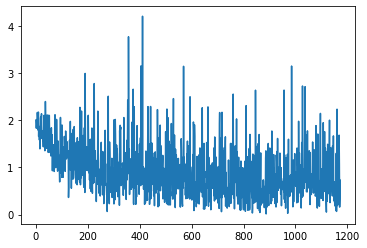

In [13]:
plt.plot(list(range(len(terrs))), terrs)

expect: cat
got: cat
probability: [2.2566072e-03 1.5376518e-03 6.1960664e-02 9.1533905e-01 3.6319587e-04
 5.8075553e-03 6.5689837e-03 9.4107018e-05 2.1099146e-03 3.9622216e-03]
err: 0.08846072852611542


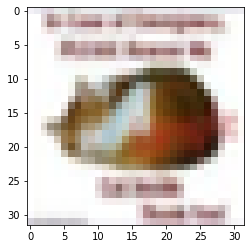

In [16]:
test_iteration(show=True)